In [1]:
from library import portfolio, utils, broker_funcs, config
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from fbm.fbm import fbm
# price change is FALSE
# updated weightData and alloc mechanic
assert config.changePrice == False

In [2]:
print(config.config)

{'np': <module 'numpy' from '/home/braedyn/anaconda3/envs/mat36/lib/python3.6/site-packages/numpy/__init__.py'>, 'window': 500, 'changePrice': False, 'nportfs': 100, 'minPortfSize': 9, 'maxPortfSize': 12, 'overlapMin': 8, 'overlapMax': 10, 'tinit': 992, 'stockPool': './fbm/fbm100_2_14_july6.txt', 'hurstPool': './fbm/fbm100_2_14_july6_hurstpool.txt'}


In [3]:
ogstockPool = config.stockPool
oghurstPool = config.hurstPool

In [4]:
traderIDs = portfolio.portfGen()

transactions = pd.DataFrame()
totalOrders = pd.DataFrame()
broker = pd.DataFrame()

for t in range(993,1000):
    # 100 traders
    broker, totalOrders = broker_funcs.brokerage(traderIDs, t, broker, totalOrders)
    broker, transactions = broker_funcs.instantMatch(traderIDs, broker, transactions)
    print(t)

[ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63 64 65 66 67 68 69 70 71
 72 73 74 75 76 77 78 79 80 81 82 83 84 85 86 87 88 89 90 91 92 93 94 95
 96 97 98 99]
qwcpg
Optimal Sharpe:  0.2738378812606183
Initial Sharpe:  0.2738335959159755
uzjcs
Optimal Sharpe:  0.32611717599980683
Initial Sharpe:  0.3261131717039647
ytdkq
Optimal Sharpe:  0.3816794438489627
Initial Sharpe:  0.3804996163463349
uveyb
Optimal Sharpe:  0.2581926051180497
Initial Sharpe:  0.25788248555578824
rnqix
Optimal Sharpe:  0.27601156333315746
Initial Sharpe:  0.2760073909004023
teygw
Optimal Sharpe:  0.14842342021825566
Initial Sharpe:  0.1482537313173473
awjnq
Optimal Sharpe:  0.18471269014297312
Initial Sharpe:  0.1840869226763511
ofwjl
Optimal Sharpe:  0.2462886209467717
Initial Sharpe:  0.24628345867320722
bvqwt
Optimal Sharpe:  0.22700033283165352
Initial Sharpe:  0.22

Optimal Sharpe:  0.27413364740829066
Initial Sharpe:  0.2741325010338204
ykice
overflow  100
shuffled
Optimal Sharpe:  0.2764982147797797
Initial Sharpe:  0.2764955623682465


/home/braedyn/Documents/singapore/library/broker_funcs.py:147: FutureWarning: set_value is deprecated and will be removed in a future release. Please use .at[] or .iat[] accessors instead
  broker.set_value(sID, 'order', 0)


993
994
995
996
997
998
999


In [5]:
# normSharpes=np.asarray([])
# n = 0
# for i, v in traderIDs.items():
#     normSharpes = np.append(normSharpes,v.sharpeReal/max(v.sharpeReal))
#     n += 1
# plt.hist(normSharpes, bins =100)
# plt.title("Normalized Sharpe Ratios--No price Change--No Thresholding")
# plt.xlabel("(sharpe ratios)$_i$/max(sharpe ratio)$_i$ of 100 portfolios over 1000 time steps")
# plt.savefig("no_priceChange_no_thresholding_100_normalized_sharperatios.png")

In [6]:
stockPool, hurstPool = portfolio.stockChars()

In [7]:
stockChars = utils.characterize(stockPool,tmax=2000)

In [8]:
Ttransactions = pd.DataFrame()
TtotalOrders = pd.DataFrame()
Tbroker = pd.DataFrame()

for key,portf in traderIDs.items():
    portf.reset(ptile=80)


for t in range(993,3000):
    Tbroker, TtotalOrders = broker_funcs.thresholdBrokerage(traderIDs, t, Tbroker, TtotalOrders)
    Tbroker, Ttransactions = broker_funcs.instantMatch(traderIDs, Tbroker, Ttransactions)
    print(t)

Optimal Sharpe:  0.2738378812606183
Initial Sharpe:  0.2738335959159755
reset!
threshold:  0.2813751581186205
_____
Optimal Sharpe:  0.32611717599980683
Initial Sharpe:  0.3261131717039647
reset!
threshold:  0.33899035483559314
_____
Optimal Sharpe:  0.3816794438489627
Initial Sharpe:  0.3804996163463349
reset!
threshold:  0.3910196049463006
_____
Optimal Sharpe:  0.2581926051180497
Initial Sharpe:  0.25788248555578824
reset!
threshold:  0.26114694025593044
_____
Optimal Sharpe:  0.27601156333315746
Initial Sharpe:  0.2760073909004023
reset!
threshold:  0.2801983104258451
_____
Optimal Sharpe:  0.14842342021825566
Initial Sharpe:  0.1482537313173473
reset!
threshold:  0.1484573521130656
_____
Optimal Sharpe:  0.18471269014297312
Initial Sharpe:  0.1840869226763511
reset!
threshold:  0.18346402007598794
_____
Optimal Sharpe:  0.2462886209467717
Initial Sharpe:  0.24628345867320722
reset!
threshold:  0.24635458692098133
_____
Optimal Sharpe:  0.22700033283165352
Initial Sharpe:  0.226999

Optimal Sharpe:  0.1263127272489245
Initial Sharpe:  0.1263111762467687
reset!
threshold:  0.12167508087899898
_____
Optimal Sharpe:  0.2104978418885439
Initial Sharpe:  0.21026262971490958
reset!
threshold:  0.21882757644177692
_____
Optimal Sharpe:  0.2055758753642849
Initial Sharpe:  0.20557395231385797
reset!
threshold:  0.2152857665948113
_____
Optimal Sharpe:  0.18385648474515048
Initial Sharpe:  0.18385325574762162
reset!
threshold:  0.18921077501719186
_____
Optimal Sharpe:  0.2434158490947581
Initial Sharpe:  0.24341372033388353
reset!
threshold:  0.25154196320863725
_____
Optimal Sharpe:  0.20351870577021713
Initial Sharpe:  0.20327020597732184
reset!
threshold:  0.20490014008317292
_____
Optimal Sharpe:  0.13448184730116655
Initial Sharpe:  0.13447932885151817
reset!
threshold:  0.13435239173774288
_____
Optimal Sharpe:  0.23700340017959237
Initial Sharpe:  0.23673848236190068
reset!
threshold:  0.23422231643668256
_____
Optimal Sharpe:  0.28709499602663663
Initial Sharpe:  

rebalance prob:  0.47241182024821005
roll:  0.23138872779451403
order sent
rebalance prob:  0.4596011109494111
roll:  0.6502718656818112
rebalance prob:  0.5040476176993025
roll:  0.016683093311310793
order sent
rebalance prob:  0.429581847179977
roll:  0.638644470790832
rebalance prob:  0.45861795190346866
roll:  0.4690345329168115
rebalance prob:  0.502326737226027
roll:  0.7967001317585998
rebalance prob:  0.4970971860697534
roll:  0.534536393804617
rebalance prob:  0.5070496359752379
roll:  0.7113714311037768
rebalance prob:  0.5129308373504233
roll:  0.8245807516888056
rebalance prob:  0.45432443634583874
roll:  0.1791090041340062
order sent
rebalance prob:  0.4344805333185958
roll:  0.7062746636111616
rebalance prob:  0.44380117535344704
roll:  0.6679821783423042
rebalance prob:  0.42739654764526525
roll:  0.21804041221003279
order sent
rebalance prob:  0.49404643691135025
roll:  0.1605274629300082
order sent
rebalance prob:  0.41287307488196645
roll:  0.6602026807363459
rebalanc

rebalance prob:  0.4904919952974923
roll:  0.9439172931156499
rebalance prob:  0.4949989938771852
roll:  0.5200379624127337
rebalance prob:  0.5265804936626414
roll:  0.39099184217502503
order sent
rebalance prob:  0.5095777517417222
roll:  0.9691171112640388
rebalance prob:  0.4442343984878555
roll:  0.6610795738715936
994
rebalance prob:  0.49586492760360956
roll:  0.6251688318695671
rebalance prob:  0.5448881734998677
roll:  0.21981029663160567
order sent
rebalance prob:  0.5302817577293596
roll:  0.774123358838995
rebalance prob:  0.478892349668297
roll:  0.17745925265677032
order sent
rebalance prob:  0.47988563681076424
roll:  0.9228970089623605
rebalance prob:  0.5068599720834701
roll:  0.8385669208111323
rebalance prob:  0.44479622392898577
roll:  0.4155004658989673
order sent
rebalance prob:  0.5016822039420382
roll:  0.5517568508277625
rebalance prob:  0.5039950381053757
roll:  0.872735382741127
rebalance prob:  0.5166478408607265
roll:  0.8392543787580328
rebalance prob:  0.

rebalance prob:  0.4561266615503517
roll:  0.6583730911695445
rebalance prob:  0.4827057517310887
roll:  0.8450487334632252
rebalance prob:  0.4876412081521807
roll:  0.9188100979466851
rebalance prob:  0.48833155785096527
roll:  0.124394270754831
order sent
rebalance prob:  0.5109896303471406
roll:  0.9740305325549852
rebalance prob:  0.5075852045397772
roll:  0.20148598455524735
order sent
rebalance prob:  0.5072608495474341
roll:  0.580997333482875
rebalance prob:  0.49324989683228354
roll:  0.9106353154131483
rebalance prob:  0.5114116722980442
roll:  0.502181341656614
order sent
rebalance prob:  0.5127611922065516
roll:  0.605837946541713
rebalance prob:  0.48495218842127896
roll:  0.7939620686068489
rebalance prob:  0.4811361192110425
roll:  0.4693873982009117
order sent
rebalance prob:  0.5020244895699117
roll:  0.06153480031546099
order sent
rebalance prob:  0.48978099614298093
roll:  0.12150284541508227
order sent
rebalance prob:  0.4371067411251696
roll:  0.8673774507240956
r

rebalance prob:  0.471939052105957
roll:  0.3886160720772798
order sent
rebalance prob:  0.4658163646424611
roll:  0.9255289674522101
rebalance prob:  0.48617902630460963
roll:  0.17202939523706118
order sent
rebalance prob:  0.49117639769181465
roll:  0.08127151019099799
order sent
rebalance prob:  0.4899860271281447
roll:  0.9169762355371149
rebalance prob:  0.49652927224851906
roll:  0.861847554440417
rebalance prob:  0.4952458029743936
roll:  0.5034986286256445
rebalance prob:  0.47591075107882697
roll:  0.4994857429514328
rebalance prob:  0.4803769488826535
roll:  0.7884115123596332
rebalance prob:  0.5024133638639865
roll:  0.6222831512355624
rebalance prob:  0.4894634606465171
roll:  0.3614259739172363
order sent
rebalance prob:  0.45446124927924403
roll:  0.23626310913414905
order sent
rebalance prob:  0.3320575710656831
roll:  0.8906351861733056
rebalance prob:  0.4224581368354604
roll:  0.1863167755863061
order sent
rebalance prob:  0.4665707951584701
roll:  0.923504866101710

rebalance prob:  0.39006608920603736
roll:  0.4537576165480678
rebalance prob:  0.4206582120187269
roll:  0.5750074748987696
rebalance prob:  0.47178227136171863
roll:  0.2735465957512353
order sent
rebalance prob:  0.4816759480908121
roll:  0.0006876988812761775
order sent
rebalance prob:  0.43983784803917086
roll:  0.9456657684704768
rebalance prob:  0.4539426612195253
roll:  0.7933451657762798
rebalance prob:  0.48267593818690324
roll:  0.2150876568638903
order sent
rebalance prob:  0.414124286583464
roll:  0.008764731863041164
order sent
rebalance prob:  0.43506466148325995
roll:  0.6376354208351468
rebalance prob:  0.3980933408710679
roll:  0.6943720478363138
rebalance prob:  0.4582018511921928
roll:  0.027436163019248894
order sent
rebalance prob:  0.4630581314316034
roll:  0.4935993956424175
rebalance prob:  0.41479029462843436
roll:  0.5140676401445519
rebalance prob:  0.47234282734422184
roll:  0.676151642497926
rebalance prob:  0.4935472264193217
roll:  0.5059203222805588
reb

rebalance prob:  0.3933711923357166
roll:  0.14819698162897688
order sent
rebalance prob:  0.4876463809412669
roll:  0.6568264683498765
rebalance prob:  0.48522231852583125
roll:  0.7184018563642257
rebalance prob:  0.37523101376023693
roll:  0.50709092129434
rebalance prob:  0.41505590651792734
roll:  0.34023503213180006
order sent
rebalance prob:  0.49362826179926517
roll:  0.4159017426332855
order sent
rebalance prob:  0.48987978768886226
roll:  0.27517592985234207
order sent
rebalance prob:  0.4565949176906567
roll:  0.9247564213380965
rebalance prob:  0.3489251019319288
roll:  0.5952759342508955
rebalance prob:  0.38475038879024437
roll:  0.859404547570612
rebalance prob:  0.5133247547480163
roll:  0.9987676596960932
rebalance prob:  0.4776100061482592
roll:  0.9648735109901269
rebalance prob:  0.4304463254666747
roll:  0.6185065774058335
rebalance prob:  0.47481599435509403
roll:  0.8899031270194872
999
rebalance prob:  0.41743824892991216
roll:  0.08880978459795108
order sent
re

rebalance prob:  0.47446548831871427
roll:  0.44962649679961275
order sent
rebalance prob:  0.39663697889932953
roll:  0.797918602405847
rebalance prob:  0.4042999677807763
roll:  0.7860290051009325
rebalance prob:  0.49855297961574807
roll:  0.09362289814856417
order sent
rebalance prob:  0.5124259256276843
roll:  0.8637399971942965
rebalance prob:  0.49470317486085585
roll:  0.571044245876069
rebalance prob:  0.45885884257870807
roll:  0.6089470711425503
rebalance prob:  0.406956376194175
roll:  0.6614950587062602
rebalance prob:  0.3671832947008747
roll:  0.8572217654445343
rebalance prob:  0.5337900396927299
roll:  0.3358084530994391
order sent
rebalance prob:  0.48824596096642037
roll:  0.33219984243160583
order sent
rebalance prob:  0.4078667636106942
roll:  0.036864452349680166
order sent
rebalance prob:  0.4382799563748856
roll:  0.29402152812036464
order sent
rebalance prob:  0.536282173908473
roll:  0.7565997623656687
rebalance prob:  0.48790126843071546
roll:  0.966640891846

rebalance prob:  0.48003155557028376
roll:  0.9462193058351529
rebalance prob:  0.3022500205570157
roll:  0.8150652341711114
rebalance prob:  0.2480738204217515
roll:  0.07050250055723972
order sent
rebalance prob:  0.30554590039788504
roll:  0.025531947361085883
order sent
rebalance prob:  0.49280625904405806
roll:  0.6966899500643547
rebalance prob:  0.4446615314989154
roll:  0.890120807692912
rebalance prob:  0.3955063876542212
roll:  0.8361715170056341
rebalance prob:  0.26108266284524984
roll:  0.9688274181366204
rebalance prob:  0.27293017201351577
roll:  0.7724730043316291
rebalance prob:  0.28638037946335076
roll:  0.6085073747612721
rebalance prob:  0.35714184158980083
roll:  0.9668063868770528
rebalance prob:  0.47094807893477253
roll:  0.5555402460538906
rebalance prob:  0.5119089035301662
roll:  0.15018879464211132
order sent
rebalance prob:  0.5069492205937169
roll:  0.3294594322554819
order sent
rebalance prob:  0.5610775982356138
roll:  0.7683347924738267
rebalance prob:

rebalance prob:  0.353049289440671
roll:  0.58276297851331
rebalance prob:  0.2877067377442277
roll:  0.9141107924988493
rebalance prob:  0.2669307300278795
roll:  0.844139965552625
rebalance prob:  0.2989257013825569
roll:  0.7199044389077668
rebalance prob:  0.36294847872221503
roll:  0.9094471593717464
rebalance prob:  0.5169721832599168
roll:  0.31606023101463987
order sent
rebalance prob:  0.58584867600275
roll:  0.05479237723357677
order sent
rebalance prob:  0.5426530114170641
roll:  0.5016400138316056
order sent
rebalance prob:  0.3200209670214989
roll:  0.16862398833962267
order sent
rebalance prob:  0.24953625229948
roll:  0.7588086943608328
rebalance prob:  0.22706764554029635
roll:  0.4551336002732116
rebalance prob:  0.3478523557484045
roll:  0.637245700635274
rebalance prob:  0.5539698898888665
roll:  0.022333775499020714
order sent
rebalance prob:  0.5593410501557552
roll:  0.8985689167013673
rebalance prob:  0.4476547850135188
roll:  0.00489018551636089
order sent
rebal

rebalance prob:  0.5174885996553421
roll:  0.8559583914946148
rebalance prob:  0.277332899971793
roll:  0.7319775405473764
rebalance prob:  0.2778227216587315
roll:  0.5415707100084318
rebalance prob:  0.30764467096633547
roll:  0.15485645454419994
order sent
rebalance prob:  0.4231817812479967
roll:  0.2758922390201638
order sent
rebalance prob:  0.30168253988643456
roll:  0.1427832288328592
order sent
rebalance prob:  0.34365111903315954
roll:  0.06189464272556289
order sent
rebalance prob:  0.4927223144098434
roll:  0.039228259094305495
order sent
rebalance prob:  0.46324130675291547
roll:  0.33179141728981776
order sent
rebalance prob:  0.510468306266269
roll:  0.03849313159062162
order sent
rebalance prob:  0.2418232013708656
roll:  0.7426645106166769
rebalance prob:  0.45343787834012494
roll:  0.1631165396185883
order sent
rebalance prob:  0.45944381168577
roll:  0.33646288281360015
order sent
rebalance prob:  0.220404233369545
roll:  0.5284033588250915
rebalance prob:  0.2335703

rebalance prob:  0.45632535775777533
roll:  0.6927522395204949
rebalance prob:  0.5324764366305147
roll:  0.932313001655611
1005
rebalance prob:  0.5283456496718845
roll:  0.1344593084612974
order sent
rebalance prob:  0.41756444338078846
roll:  0.526940215831228
rebalance prob:  0.25289613472967243
roll:  0.07979683998236642
order sent
rebalance prob:  0.25512177594166074
roll:  0.30561430871715145
rebalance prob:  0.16958797765275857
roll:  0.1080938815726673
order sent
rebalance prob:  0.1760713035222774
roll:  0.2730626589905204
rebalance prob:  0.2686503703745778
roll:  0.1386552419291185
order sent
rebalance prob:  0.36453627687610063
roll:  0.766558534202231
rebalance prob:  0.30180204509096303
roll:  0.4918162110057389
rebalance prob:  0.3268279513092276
roll:  0.6980816466171391
rebalance prob:  0.4335096769139234
roll:  0.9177423495423104
rebalance prob:  0.5600984452039628
roll:  0.34269647171597284
order sent
rebalance prob:  0.5680928953130677
roll:  0.6899325377324237
reb

rebalance prob:  0.3448963009626602
roll:  0.6945340428243583
rebalance prob:  0.4946397146201169
roll:  0.6098407868616456
rebalance prob:  0.6300884692888703
roll:  0.3073148539231253
order sent
rebalance prob:  0.4368950478779745
roll:  0.16070265263955386
order sent
rebalance prob:  0.33142828712584615
roll:  0.25452000467895675
order sent
rebalance prob:  0.30216399694057827
roll:  0.5659372464615101
rebalance prob:  0.4002457587596593
roll:  0.47353024935659604
rebalance prob:  0.5371410340991469
roll:  0.930597091112932
rebalance prob:  0.5214706065917816
roll:  0.5473281742072589
rebalance prob:  0.2704493171781784
roll:  0.8579199559899391
rebalance prob:  0.23674175569047434
roll:  0.45041436445751715
rebalance prob:  0.23957774553458638
roll:  0.7784588556896287
rebalance prob:  0.41221135997020397
roll:  0.09870543830816703
order sent
rebalance prob:  0.44680110875010365
roll:  0.847089722711571
rebalance prob:  0.2818053172698644
roll:  0.43687237673322976
rebalance prob: 

rebalance prob:  0.2480734041489137
roll:  0.7913280286226948
rebalance prob:  0.2463900287837428
roll:  0.28041924260089324
rebalance prob:  0.36399270625877805
roll:  0.5022643776835732
rebalance prob:  0.3496096382464291
roll:  0.8638459716270219
rebalance prob:  0.322225497938292
roll:  0.4559992826693642
rebalance prob:  0.25501933465957205
roll:  0.3885660576482779
rebalance prob:  0.42154778792099995
roll:  0.18277382093281225
order sent
rebalance prob:  0.17869943369256644
roll:  0.9989370537529846
rebalance prob:  0.1824106975581215
roll:  0.6959465497869712
rebalance prob:  0.22500560887936577
roll:  0.9659423627412288
rebalance prob:  0.34219935576312
roll:  0.5934306091769831
rebalance prob:  0.5648149903637087
roll:  0.1413810294596507
order sent
rebalance prob:  0.7046557680681842
roll:  0.23031871829581152
order sent
rebalance prob:  0.5537563400479156
roll:  0.5086888641502993
order sent
rebalance prob:  0.28638405691817204
roll:  0.43540672193129193
rebalance prob:  0.

rebalance prob:  0.3444033217548592
roll:  0.797308705940453
rebalance prob:  0.3401468532357137
roll:  0.41836038059559877
rebalance prob:  0.21975462013338126
roll:  0.12061923626583604
order sent
rebalance prob:  0.5049778565504519
roll:  0.7614409611402857
rebalance prob:  0.6684409642032303
roll:  0.006148490722891586
order sent
rebalance prob:  0.3228786481220318
roll:  0.845143310825646
rebalance prob:  0.28170025613881683
roll:  0.034291947193600514
order sent
rebalance prob:  0.2886281996050172
roll:  0.8327393072052958
rebalance prob:  0.39844662199550307
roll:  0.8116093643892544
rebalance prob:  0.23428562269625677
roll:  0.31839900836764434
rebalance prob:  0.24493664743323973
roll:  0.04204813811494412
order sent
rebalance prob:  0.461106421181513
roll:  0.8568729633540267
rebalance prob:  0.4166362164491102
roll:  0.30319355583560814
order sent
rebalance prob:  0.49037782272718317
roll:  0.1308426651183452
order sent
rebalance prob:  0.15120893905665314
roll:  0.54032121

rebalance prob:  0.5808529511689392
roll:  0.021626675012959007
order sent
rebalance prob:  0.485730585692372
roll:  0.5399786232608437
rebalance prob:  0.3848553111554093
roll:  0.39753408295476766
rebalance prob:  0.5424440892966089
roll:  0.02634890216586483
order sent
1010
rebalance prob:  0.6354144320595296
roll:  0.7837900410339136
rebalance prob:  0.48189631546870715
roll:  0.6783406900811081
rebalance prob:  0.2888609195102504
roll:  0.9293162395795858
rebalance prob:  0.23242873029132588
roll:  0.07786953176440126
order sent
rebalance prob:  0.1460402551493109
roll:  0.7112729265124759
rebalance prob:  0.1786283294365907
roll:  0.66894319388964
rebalance prob:  0.33126617698568234
roll:  0.1303584977301111
order sent
rebalance prob:  0.35138328662765367
roll:  0.6400066931373752
rebalance prob:  0.24956247519126604
roll:  0.5848829745139419
rebalance prob:  0.25351443001092056
roll:  0.9696955274655357
rebalance prob:  0.33132932487275096
roll:  0.9713441998575333
rebalance pr

rebalance prob:  0.14879662340399102
roll:  0.2552673680141677
rebalance prob:  0.16661454784020344
roll:  0.4128562744950587
rebalance prob:  0.2705937391705738
roll:  0.25751141648703657
order sent
rebalance prob:  0.5178023756140238
roll:  0.0923742733068319
order sent
rebalance prob:  0.7482945191862488
roll:  0.3041306494917583
order sent
rebalance prob:  0.521720002219881
roll:  0.14157578318675335
order sent
rebalance prob:  0.3620832115328088
roll:  0.5244852798362785
rebalance prob:  0.28251857114095963
roll:  0.7769122909853974
rebalance prob:  0.6020013236226903
roll:  0.6141886885338234
rebalance prob:  0.7359167917552398
roll:  0.03490815033037231
order sent
rebalance prob:  0.6965522400349948
roll:  0.5321741607071888
order sent
rebalance prob:  0.25691930059248247
roll:  0.2623174068868417
rebalance prob:  0.21325347735858763
roll:  0.21657688583003842
rebalance prob:  0.1964311601121634
roll:  0.8544596562550294
rebalance prob:  0.46303915202297635
roll:  0.716612228768

rebalance prob:  0.7363502044561718
roll:  0.003914657177090164
order sent
rebalance prob:  0.7532739212837153
roll:  0.10007186377030475
order sent
rebalance prob:  0.5852836237147905
roll:  0.4267300851691975
order sent
rebalance prob:  0.2377753576999438
roll:  0.3676195754233743
rebalance prob:  0.2667729630603653
roll:  0.48207798250055955
rebalance prob:  0.40402415093354344
roll:  0.6293845614248432
rebalance prob:  0.3080148779945795
roll:  0.7140151450618428
rebalance prob:  0.2238079992791893
roll:  0.014391480848400473
order sent
rebalance prob:  0.18289037325314914
roll:  0.651567492782558
rebalance prob:  0.5135823172266136
roll:  0.6499054691642308
rebalance prob:  0.1775587969296197
roll:  0.4358545051410335
rebalance prob:  0.1753352339536577
roll:  0.4395701715088025
rebalance prob:  0.17082375263187716
roll:  0.28987182769303677
rebalance prob:  0.30598710851219835
roll:  0.9651318173291145
rebalance prob:  0.620134244722161
roll:  0.8414374193174304
rebalance prob:  

rebalance prob:  0.4744678702834208
roll:  0.04956828546152481
order sent
rebalance prob:  0.19221525026798458
roll:  0.8414056981871487
rebalance prob:  0.25353275595371516
roll:  0.9948663276332894
rebalance prob:  0.3642807062152077
roll:  0.2823527100262201
order sent
rebalance prob:  0.3960176409764838
roll:  0.3006405569576369
order sent
rebalance prob:  0.3607277489675085
roll:  0.40822013366019827
rebalance prob:  0.4047112942577997
roll:  0.03795052726339254
order sent
rebalance prob:  0.38590527705682465
roll:  0.7815695649526367
rebalance prob:  0.16805019208565464
roll:  0.6999517048332262
rebalance prob:  0.5723820905411523
roll:  0.18109174268496797
order sent
rebalance prob:  0.772143534108364
roll:  0.4090901431343791
order sent
rebalance prob:  0.39767936062309617
roll:  0.054271401254264995
order sent
rebalance prob:  0.18801448757322448
roll:  0.42966113870883826
rebalance prob:  0.16383112471659733
roll:  0.673179932705672
rebalance prob:  0.3700417237033201
roll:  

rebalance prob:  0.5308769690896207
roll:  0.723937923356625
rebalance prob:  0.16168898600072626
roll:  0.9982607283617587
rebalance prob:  0.11782482088208994
roll:  0.08350028510433949
order sent
rebalance prob:  0.20867718327314916
roll:  0.39191254297139455
rebalance prob:  0.38972570503113646
roll:  0.5179867106087777
rebalance prob:  0.4040959849645175
roll:  0.7523616193020597
rebalance prob:  0.5584259294858395
roll:  0.713027189061046
rebalance prob:  0.6504740276809869
roll:  0.5601514679576662
order sent
rebalance prob:  0.7714561716091913
roll:  0.706621350558217
order sent
rebalance prob:  0.6551493361204366
roll:  0.7164179734698704
rebalance prob:  0.46932750419145464
roll:  0.5655834196019558
rebalance prob:  0.6530451770678641
roll:  0.08974075657491576
order sent
1015
rebalance prob:  0.7362241030273784
roll:  0.6137638570421781
order sent
rebalance prob:  0.6535857695037054
roll:  0.1494315568601955
order sent
rebalance prob:  0.31556666498249925
roll:  0.4163023213

rebalance prob:  0.6535750199899233
roll:  0.4251625118507205
order sent
rebalance prob:  0.7199140995310073
roll:  0.6980071870423863
order sent
rebalance prob:  0.4414566745133282
roll:  0.7840643865431353
rebalance prob:  0.31623646395063976
roll:  0.6454453703997615
rebalance prob:  0.4940496591069839
roll:  0.9900485660262955
rebalance prob:  0.7207259819561684
roll:  0.4372042542043282
order sent
rebalance prob:  0.336566064851557
roll:  0.009424083225947455
order sent
rebalance prob:  0.1426349235459843
roll:  0.734969575347929
rebalance prob:  0.1845917108392104
roll:  0.9236878283127065
rebalance prob:  0.22951599738696796
roll:  0.9961259626646392
rebalance prob:  0.6042498668885422
roll:  0.617562415567019
rebalance prob:  0.831622235954822
roll:  0.5980367526037803
order sent
rebalance prob:  0.5627843584308075
roll:  0.13456994633639807
order sent
rebalance prob:  0.29996912250349883
roll:  0.5937440558233992
rebalance prob:  0.13731012260003636
roll:  0.3140023931942628
r

rebalance prob:  0.12540968157744475
roll:  0.14857125990635234
rebalance prob:  0.13990057865549593
roll:  0.3134840878716304
rebalance prob:  0.21753868554611966
roll:  0.6357619856261625
rebalance prob:  0.18258017414926955
roll:  0.4059093325692592
rebalance prob:  0.2938354364009877
roll:  0.6981007265725265
rebalance prob:  0.4048409548949693
roll:  0.3200236757341107
order sent
rebalance prob:  0.8314417429284864
roll:  0.39359528686513434
order sent
rebalance prob:  0.8062882663798809
roll:  0.6387709182026197
order sent
rebalance prob:  0.8375525687043025
roll:  0.13939212406211154
order sent
rebalance prob:  0.7314081258979198
roll:  0.07770168642827557
order sent
rebalance prob:  0.3711028808688007
roll:  0.28159983275810296
order sent
rebalance prob:  0.3735372626190353
roll:  0.7981861973279074
rebalance prob:  0.4651805817555848
roll:  0.5249129808227714
rebalance prob:  0.31719976656816823
roll:  0.21326906669029033
order sent
rebalance prob:  0.2362742409507234
roll:  0

rebalance prob:  0.8362743548292638
roll:  0.029806405797830338
order sent
rebalance prob:  0.6008911194864972
roll:  0.3482744506810046
order sent
rebalance prob:  0.18924093071644155
roll:  0.5364864249884964
rebalance prob:  0.16451963834024794
roll:  0.8642382213728996
rebalance prob:  0.12954825588437704
roll:  0.8077988250709595
rebalance prob:  0.20370741810676532
roll:  0.9262923716890145
rebalance prob:  0.49315981042473034
roll:  0.4978783175452641
rebalance prob:  0.4768583042444209
roll:  0.9623129369071762
rebalance prob:  0.5304060376801554
roll:  0.14681810701248454
order sent
rebalance prob:  0.2501488441935868
roll:  0.634476433314164
rebalance prob:  0.2777343723259872
roll:  0.8752819694226679
rebalance prob:  0.4226792768951892
roll:  0.1922511071580163
order sent
rebalance prob:  0.38970585115737016
roll:  0.04435095355751051
order sent
rebalance prob:  0.29895681859426165
roll:  0.9813063375592804
rebalance prob:  0.23435468839770313
roll:  0.44583058180083257
reb

rebalance prob:  0.34757431044867265
roll:  0.8106758368867545
rebalance prob:  0.46441210878508515
roll:  0.5242770224276688
rebalance prob:  0.40662301683528956
roll:  0.9528751453295519
rebalance prob:  0.5632812010010078
roll:  0.07905774575002922
order sent
rebalance prob:  0.15286072225642364
roll:  0.9689111922433278
rebalance prob:  0.5135238565605295
roll:  0.25330803077666075
order sent
rebalance prob:  0.5020783429717346
roll:  0.34654660491286304
order sent
rebalance prob:  0.16431873094867114
roll:  0.9134454018113022
rebalance prob:  0.13541903514538284
roll:  0.6259309741776258
rebalance prob:  0.2641490081654977
roll:  0.5944544634351926
rebalance prob:  0.3648925990921891
roll:  0.24367426147731452
order sent
rebalance prob:  0.35175425901553636
roll:  0.47158997429351446
rebalance prob:  0.5548591037277448
roll:  0.23178714220207686
order sent
rebalance prob:  0.7180713635476857
roll:  0.20372879380315523
order sent
rebalance prob:  0.8424709406286875
roll:  0.7754539

rebalance prob:  0.51527590357394
roll:  0.9039257668555444
rebalance prob:  0.39044354634004524
roll:  0.5541408077596752
rebalance prob:  0.1655998270294015
roll:  0.501609513473625
rebalance prob:  0.25700027212499565
roll:  0.1467116936568037
order sent
rebalance prob:  0.5439095242924398
roll:  0.8079368493179957
rebalance prob:  0.6128180394888084
roll:  0.6917292015603174
rebalance prob:  0.616254300308244
roll:  0.25449136207516654
order sent
rebalance prob:  0.7861783758104955
roll:  0.7926560022043989
rebalance prob:  0.3815477886309509
roll:  0.544321452250453
rebalance prob:  0.28011069358139473
roll:  0.9717613923933127
rebalance prob:  0.4403439207775689
roll:  0.32398950745739297
order sent
rebalance prob:  0.7190106371483291
roll:  0.32727983030298125
order sent
rebalance prob:  0.27957835666064806
roll:  0.20030880120894157
order sent
rebalance prob:  0.12397196933500185
roll:  0.6867599747702285
rebalance prob:  0.1966910973505922
roll:  0.4724837754689519
rebalance p

rebalance prob:  0.2748441978808725
roll:  0.6580736628716719
rebalance prob:  0.19649663399521416
roll:  0.9664912466821237
rebalance prob:  0.15942322185137703
roll:  0.8613686763712332
rebalance prob:  0.30091769759831927
roll:  0.019783873977352373
order sent
rebalance prob:  0.5052644139797661
roll:  0.9844313807712088
rebalance prob:  0.21716115856570242
roll:  0.06573861495564925
order sent
rebalance prob:  0.1283315010591436
roll:  0.9183206920033651
rebalance prob:  0.1271720247581569
roll:  0.45313323664341376
rebalance prob:  0.1548339889923967
roll:  0.8012995210391372
rebalance prob:  0.12873966511126098
roll:  0.355491415003516
rebalance prob:  0.27746501541214796
roll:  0.5673694037014407
rebalance prob:  0.3854522997248294
roll:  0.4177699921962602
rebalance prob:  0.7948504863089164
roll:  0.47499234239583554
order sent
rebalance prob:  0.7275409266209814
roll:  0.6995315480369327
order sent
rebalance prob:  0.7503286040810293
roll:  0.7715920544587401
rebalance prob: 

rebalance prob:  0.19279628292226447
roll:  0.3573003374291065
rebalance prob:  0.16271996420576437
roll:  0.7308155310015201
rebalance prob:  0.1558768595457545
roll:  0.5776992391277788
rebalance prob:  0.33106262599877306
roll:  0.1573276031917108
order sent
rebalance prob:  0.6625791424479321
roll:  0.6895784962619125
rebalance prob:  0.7926251714570149
roll:  0.9767198367730371
rebalance prob:  0.4988954447612857
roll:  0.1284901725325872
order sent
rebalance prob:  0.14491952153700968
roll:  0.9900938581790256
rebalance prob:  0.12467806256408819
roll:  0.8485024877955328
rebalance prob:  0.1324078245266689
roll:  0.23227986115557142
rebalance prob:  0.18250887534654459
roll:  0.3687420812656247
rebalance prob:  0.46956832906443
roll:  0.17781179663580315
order sent
rebalance prob:  0.4635877732976804
roll:  0.304528201882417
order sent
rebalance prob:  0.45149624406958744
roll:  0.840002905391156
rebalance prob:  0.1849487008408781
roll:  0.5406762434990403
rebalance prob:  0.14

rebalance prob:  0.2576272683267528
roll:  0.2522810093871404
order sent
rebalance prob:  0.18713755878222044
roll:  0.44384246058782517
rebalance prob:  0.499901735855236
roll:  0.7366729559663721
rebalance prob:  0.3022694144620982
roll:  0.5581365858939537
rebalance prob:  0.26247030006064637
roll:  0.6624448596659911
rebalance prob:  0.3135660569876339
roll:  0.11616028878835616
order sent
rebalance prob:  0.22520966976227058
roll:  0.037482677481723625
order sent
rebalance prob:  0.5947801293047509
roll:  0.9870665927888583
rebalance prob:  0.1078156391717941
roll:  0.07020131347392555
order sent
rebalance prob:  0.47043457667610167
roll:  0.4440306948823015
order sent
rebalance prob:  0.436807609507239
roll:  0.20479877536649815
order sent
rebalance prob:  0.2194692667780404
roll:  0.2864118203842241
rebalance prob:  0.1534907686141571
roll:  0.18358461235163304
rebalance prob:  0.17930589283267032
roll:  0.9977676920950855
rebalance prob:  0.26242714758552615
roll:  0.8250336433

rebalance prob:  0.4586666892572766
roll:  0.4792874969382883
rebalance prob:  0.2121409044137426
roll:  0.9491855858278586
rebalance prob:  0.12299564836773326
roll:  0.8811335892584888
rebalance prob:  0.0643950635110992
roll:  0.41161754890574553
rebalance prob:  0.1504503145620905
roll:  0.20161692365173278
rebalance prob:  0.5983229484897812
roll:  0.024106859280846993
order sent
rebalance prob:  0.35676706249703666
roll:  0.32148684559139984
order sent
rebalance prob:  0.1316203601241566
roll:  0.7587387726701083
rebalance prob:  0.3048209574141188
roll:  0.34874791345828404
rebalance prob:  0.6379532835174527
roll:  0.9556533256221492
rebalance prob:  0.5494669357878724
roll:  0.9294310289532958
rebalance prob:  0.5428279763139766
roll:  0.10866911048809302
order sent
rebalance prob:  0.6912715132448484
roll:  0.23665869699771525
order sent
rebalance prob:  0.32286971163690653
roll:  0.8776832614058756
rebalance prob:  0.15622876882023365
roll:  0.8404664335470908
rebalance prob

rebalance prob:  0.2531241379492486
roll:  0.20553365636309218
order sent
rebalance prob:  0.13374183579310442
roll:  0.15224657352645343
rebalance prob:  0.5683697232759908
roll:  0.259797933313207
order sent
rebalance prob:  0.7847491195626588
roll:  0.8260325130551665
rebalance prob:  0.7700664324095805
roll:  0.5315100641680811
order sent
rebalance prob:  0.24178745690995251
roll:  0.14832896276050433
order sent
rebalance prob:  0.17443310405450263
roll:  0.23987198753630334
rebalance prob:  0.13453823632941134
roll:  0.5561270354203862
rebalance prob:  0.3031269359796278
roll:  0.8613787288009249
rebalance prob:  0.4286333778363133
roll:  0.7627891876556766
rebalance prob:  0.2202808708743117
roll:  0.09638726417083254
order sent
rebalance prob:  0.08536966682968952
roll:  0.6278838222772763
rebalance prob:  0.07460859086416499
roll:  0.5472200365969437
rebalance prob:  0.10502091426295496
roll:  0.4314105320256637
rebalance prob:  0.14365102716748035
roll:  0.3224618509301972
reb

rebalance prob:  0.22201703239244153
roll:  0.3364517422704293
rebalance prob:  0.21516311158579954
roll:  0.6670597481677476
rebalance prob:  0.3722122566630531
roll:  0.1766856497510979
order sent
rebalance prob:  0.6583743880776685
roll:  0.8732360853384806
rebalance prob:  0.13348515670774924
roll:  0.12846526878740094
order sent
rebalance prob:  0.11147475737221527
roll:  0.18000970738552646
rebalance prob:  0.12979717236860736
roll:  0.36627136440579144
rebalance prob:  0.2390525436700157
roll:  0.9016118993883582
rebalance prob:  0.530225641760552
roll:  0.9611408114149587
rebalance prob:  0.7207965088471981
roll:  0.6764436339230181
order sent
rebalance prob:  0.48199736145210176
roll:  0.03978674269041549
order sent
rebalance prob:  0.19327310133829498
roll:  0.8953852959800622
rebalance prob:  0.15462392345599582
roll:  0.788603791988361
rebalance prob:  0.1521658457520408
roll:  0.32097701954109725
rebalance prob:  0.24989321361156316
roll:  0.20007956272045935
order sent
re

rebalance prob:  0.2393779107031655
roll:  0.6320717285897365
rebalance prob:  0.2498130895441874
roll:  0.3574045255989273
rebalance prob:  0.1857675713573256
roll:  0.42486902152338757
rebalance prob:  0.6323476732262117
roll:  0.8409059514476599
rebalance prob:  0.872125261082548
roll:  0.006515371937840797
order sent
rebalance prob:  0.7130165454263457
roll:  0.6781773600199856
order sent
rebalance prob:  0.21693081354061575
roll:  0.7249285056628476
rebalance prob:  0.15807170613731292
roll:  0.3382138723120848
rebalance prob:  0.5356910777704993
roll:  0.47918670693516774
order sent
rebalance prob:  0.3331686790834349
roll:  0.6044866984262688
rebalance prob:  0.2836880797065426
roll:  0.6597937542506707
rebalance prob:  0.3326351782510472
roll:  0.37638436656300966
rebalance prob:  0.21179650568311792
roll:  0.6824071465170674
rebalance prob:  0.6601986690065275
roll:  0.7041793820172753
rebalance prob:  0.12751180055148612
roll:  0.85032280386417
rebalance prob:  0.498520456217

rebalance prob:  0.8348517978074481
roll:  0.4491138579849765
order sent
rebalance prob:  0.7889675392183219
roll:  0.0257163133864019
order sent
rebalance prob:  0.39430428322471206
roll:  0.2506186067203561
order sent
rebalance prob:  0.4460498325812985
roll:  0.9310401806757296
1031
rebalance prob:  0.46477147142847863
roll:  0.2644288718779122
order sent
rebalance prob:  0.4376035591784108
roll:  0.11426688520867978
order sent
rebalance prob:  0.22256966445721135
roll:  0.1611019682571999
order sent
rebalance prob:  0.16621155724460582
roll:  0.19913768891773898
rebalance prob:  0.08421522154863384
roll:  0.9185234440206322
rebalance prob:  0.20311427726259065
roll:  0.523636059082144
rebalance prob:  0.6616615111071961
roll:  0.8337850668256611
rebalance prob:  0.35565918391813733
roll:  0.5642384906313904
rebalance prob:  0.1676549076141829
roll:  0.18164822327027752
rebalance prob:  0.39111552286447165
roll:  0.9785674257706849
rebalance prob:  0.5746894833189776
roll:  0.096225

rebalance prob:  0.1518446234600565
roll:  0.884060164650623
rebalance prob:  0.14845577109408845
roll:  0.01721186493883342
order sent
rebalance prob:  0.39968897984995655
roll:  0.01213045096489973
order sent
rebalance prob:  0.7285668803773535
roll:  0.9291354585679554
rebalance prob:  0.46947773577111684
roll:  0.20859523779154787
order sent
rebalance prob:  0.27157079406301565
roll:  0.20907471848756232
order sent
rebalance prob:  0.12648755846614795
roll:  0.5484957840194851
rebalance prob:  0.6086287463166794
roll:  0.9606584769302475
rebalance prob:  0.7993892019270366
roll:  0.4955595952029156
order sent
rebalance prob:  0.7874060173385502
roll:  0.9420614043291818
rebalance prob:  0.22114517552396212
roll:  0.386820391874096
rebalance prob:  0.1777968040271475
roll:  0.9325126068758686
rebalance prob:  0.14030158657185587
roll:  0.6738197684970334
rebalance prob:  0.2900964196122549
roll:  0.9118267709139627
rebalance prob:  0.5287023420603431
roll:  0.6193060884264383
rebala

rebalance prob:  0.6086678278663253
roll:  0.9828923968568231
rebalance prob:  0.5740247648488771
roll:  0.8527902974533063
rebalance prob:  0.6225182054393896
roll:  0.6039422506597292
order sent
rebalance prob:  0.16731618516472352
roll:  0.5343644451947266
rebalance prob:  0.24563558098336802
roll:  0.337111109967526
rebalance prob:  0.4156453054731906
roll:  0.8598066388648543
rebalance prob:  0.2467770639233866
roll:  0.0677052568682468
order sent
rebalance prob:  0.20753670649256165
roll:  0.6235787485119829
rebalance prob:  0.3149050880526835
roll:  0.3738351816623001
rebalance prob:  0.7261316251809368
roll:  0.07846458802055267
order sent
rebalance prob:  0.11653493909842616
roll:  0.36033403281159404
rebalance prob:  0.09686108690072005
roll:  0.5086811241423801
rebalance prob:  0.11417345440072237
roll:  0.34444752853648375
rebalance prob:  0.29513083473150153
roll:  0.6644750228739413
rebalance prob:  0.5567775438365984
roll:  0.20367682760556904
order sent
rebalance prob: 

rebalance prob:  0.40948025593407456
roll:  0.7760831851510434
rebalance prob:  0.11435716737570376
roll:  0.9841337529459986
rebalance prob:  0.17446943636701867
roll:  0.8465793567212537
rebalance prob:  0.6053882604891017
roll:  0.16790790427453772
order sent
rebalance prob:  0.6123760342959074
roll:  0.2643468432430789
order sent
rebalance prob:  0.43305879532453145
roll:  0.22890895260905209
order sent
rebalance prob:  0.25611360498363467
roll:  0.6445513425816555
rebalance prob:  0.26128135247382583
roll:  0.9015709900288896
rebalance prob:  0.19830654450094864
roll:  0.4369537897735565
rebalance prob:  0.5296402787767776
roll:  0.6678859798354662
rebalance prob:  0.7685879188454089
roll:  0.008296561844789996
order sent
rebalance prob:  0.704627162024257
roll:  0.0017939577161301123
order sent
rebalance prob:  0.243716669505311
roll:  0.01543657131383025
order sent
rebalance prob:  0.18318231151520334
roll:  0.7230744609213688
rebalance prob:  0.5249293511448249
roll:  0.5391203

rebalance prob:  0.2896931305458006
roll:  0.08150283995950547
order sent
rebalance prob:  0.19164848435869913
roll:  0.3686810614575653
rebalance prob:  0.141680706820071
roll:  0.8159135204050482
rebalance prob:  0.1865781310527057
roll:  0.21935241253030546
rebalance prob:  0.1779003192180004
roll:  0.6356374369945176
rebalance prob:  0.6372711941151318
roll:  0.9005923987812174
rebalance prob:  0.757044848354768
roll:  0.4542453666762578
order sent
rebalance prob:  0.8399027045125663
roll:  0.8646683524491799
rebalance prob:  0.7938994441634021
roll:  0.2648609301054825
order sent
rebalance prob:  0.42492001228829374
roll:  0.709030116518444
rebalance prob:  0.34390102806381057
roll:  0.39498005080446374
1036
rebalance prob:  0.3942877185978708
roll:  0.22183431420509458
order sent
rebalance prob:  0.2807704040841261
roll:  0.931293310603998
rebalance prob:  0.1304855524783095
roll:  0.5257227840824166
rebalance prob:  0.1539693679553721
roll:  0.044140088467871985
order sent
rebal

rebalance prob:  0.7222091253616849
roll:  0.5486104799462178
order sent
rebalance prob:  0.3515490476165534
roll:  0.032526498788650104
order sent
rebalance prob:  0.2312790745600347
roll:  0.07077015296270317
order sent
rebalance prob:  0.4290965182404255
roll:  0.9709430124482094
rebalance prob:  0.6093392094407571
roll:  0.07564480906306392
order sent
rebalance prob:  0.3978034486875356
roll:  0.20480038997448258
order sent
rebalance prob:  0.11357195752711592
roll:  0.8125230588564936
rebalance prob:  0.14910789359477344
roll:  0.22168658778905492
rebalance prob:  0.16548094764058813
roll:  0.5982741984109894
rebalance prob:  0.3148227681890558
roll:  0.3096946532987658
order sent
rebalance prob:  0.6357420484231583
roll:  0.29765218670485816
order sent
rebalance prob:  0.5986885002434589
roll:  0.6775871214668916
rebalance prob:  0.38325858517911965
roll:  0.41033323646847064
rebalance prob:  0.1549621138580152
roll:  0.7884904687480593
rebalance prob:  0.5335990547291325
roll:  

rebalance prob:  0.2875541758801296
roll:  0.8048562616405714
rebalance prob:  0.14432868649069755
roll:  0.35049753892526836
rebalance prob:  0.09557306380338507
roll:  0.8643467681430652
rebalance prob:  0.13033860959234256
roll:  0.06818477254917932
order sent
rebalance prob:  0.12877616461704977
roll:  0.9351218988315171
rebalance prob:  0.26245364710714114
roll:  0.865221143789987
rebalance prob:  0.47313469294201915
roll:  0.7277899500722463
rebalance prob:  0.5857183898112805
roll:  0.6179215089541193
rebalance prob:  0.49371397038289166
roll:  0.2708560721072546
order sent
rebalance prob:  0.4314294330778363
roll:  0.03963616196901143
order sent
rebalance prob:  0.6208551230406806
roll:  0.03193105746635916
order sent
rebalance prob:  0.15992384185126296
roll:  0.7093760475677745
rebalance prob:  0.20871178501294305
roll:  0.9040690411019461
rebalance prob:  0.3536221719098617
roll:  0.09496493964528996
order sent
rebalance prob:  0.22139468180641156
roll:  0.10102438463836416


rebalance prob:  0.6312330679893275
roll:  0.16907591011374024
order sent
rebalance prob:  0.4865927212083693
roll:  0.3589375771253366
order sent
rebalance prob:  0.16111528408781478
roll:  0.189171120344505
rebalance prob:  0.1443144658620475
roll:  0.14028164232925067
order sent
rebalance prob:  0.1289057056785454
roll:  0.1720185340225825
rebalance prob:  0.37830533193954846
roll:  0.17820741622954095
order sent
rebalance prob:  0.6711575165399735
roll:  0.9845060131083891
rebalance prob:  0.6969368394500403
roll:  0.16485907271552647
order sent
rebalance prob:  0.40593129090932606
roll:  0.9526294533995308
rebalance prob:  0.06937824240335921
roll:  0.30183702805932344
rebalance prob:  0.1914163018498683
roll:  0.9992875966017327
rebalance prob:  0.6013925953432682
roll:  0.7704129455625206
rebalance prob:  0.5840241765952522
roll:  0.05740355120045648
order sent
rebalance prob:  0.3876434852199834
roll:  0.2865089677625292
order sent
rebalance prob:  0.26552086848733947
roll:  0.

rebalance prob:  0.13801947133884612
roll:  0.5392615185404466
rebalance prob:  0.33635324826330615
roll:  0.32609971670447624
order sent
rebalance prob:  0.20644790498201773
roll:  0.4718017941937238
rebalance prob:  0.5133659083960147
roll:  0.9373351662013356
rebalance prob:  0.051552786831126046
roll:  0.3300427679022555
rebalance prob:  0.532353389010318
roll:  0.5580087568199811
rebalance prob:  0.46644278969852837
roll:  0.8964761323813035
rebalance prob:  0.21893133613779103
roll:  0.4967256063493626
rebalance prob:  0.14259733041697692
roll:  0.7411096814622925
rebalance prob:  0.16087062158899654
roll:  0.9671843014105487
rebalance prob:  0.22912407245878716
roll:  0.04217825556202259
order sent
rebalance prob:  0.19898805458910074
roll:  0.47320925853937124
rebalance prob:  0.637595246990771
roll:  0.6939760261843242
rebalance prob:  0.8149749694878815
roll:  0.6577779618365227
order sent
rebalance prob:  0.9084292021385879
roll:  0.29796802398183164
order sent
rebalance pro

rebalance prob:  0.5059567401473944
roll:  0.1883249652536083
order sent
rebalance prob:  0.29917696701891605
roll:  0.2063244828339288
order sent
rebalance prob:  0.2659270276979126
roll:  0.2732645427504725
rebalance prob:  0.5635064370564864
roll:  0.7027158272871357
rebalance prob:  0.590339378543225
roll:  0.2991114544036313
order sent
rebalance prob:  0.6157313065214711
roll:  0.477684437408488
order sent
rebalance prob:  0.5974583394284453
roll:  0.43127873663947003
order sent
rebalance prob:  0.6666661346753024
roll:  0.22566183700148112
order sent
rebalance prob:  0.35391446563427426
roll:  0.39684369412395126
rebalance prob:  0.25626689839726446
roll:  0.32996997341520784
rebalance prob:  0.48131851691873234
roll:  0.12477232818775186
order sent
rebalance prob:  0.6540286783167587
roll:  0.04942638138523214
order sent
rebalance prob:  0.5132374621869593
roll:  0.07425298952618664
order sent
rebalance prob:  0.09283764648804346
roll:  0.8546748676728166
rebalance prob:  0.1227

rebalance prob:  0.6729447501471528
roll:  0.22038782846368987
order sent
rebalance prob:  0.18761003726790218
roll:  0.525091934814721
rebalance prob:  0.16044213348260555
roll:  0.24880305884943665
rebalance prob:  0.11918582227866857
roll:  0.6762841443331984
rebalance prob:  0.2594959079448328
roll:  0.24381013836343102
order sent
rebalance prob:  0.44362455532013195
roll:  0.9422595438337984
rebalance prob:  0.38488143167236316
roll:  0.7040709319345968
rebalance prob:  0.11782063499551024
roll:  0.07169564563898978
order sent
rebalance prob:  0.05565901472067876
roll:  0.6184735302095203
rebalance prob:  0.09337809544925972
roll:  0.5944443132329751
rebalance prob:  0.10106219661015331
roll:  0.523458936578816
rebalance prob:  0.230945342763277
roll:  0.5323361436634285
rebalance prob:  0.4382302921487645
roll:  0.37539259250058055
order sent
rebalance prob:  0.5963181171636559
roll:  0.9396876113253045
rebalance prob:  0.5219075180924851
roll:  0.8389164158115188
rebalance prob:

rebalance prob:  0.03614711475524043
roll:  0.39882239040001777
rebalance prob:  0.05136016557306213
roll:  0.8132926688605778
rebalance prob:  0.3409339165997554
roll:  0.0021454585702201934
order sent
rebalance prob:  0.5706801711668635
roll:  0.5695504199064538
order sent
rebalance prob:  0.6861083999507304
roll:  0.3893940865224488
order sent
rebalance prob:  0.5561669406071341
roll:  0.8077662380970811
rebalance prob:  0.1486278760495662
roll:  0.8569703095048737
rebalance prob:  0.10584904377457734
roll:  0.9150810595015946
rebalance prob:  0.08878995306042925
roll:  0.5793630566456186
rebalance prob:  0.36512191763923235
roll:  0.8634917742078794
rebalance prob:  0.7046504606655599
roll:  0.25170693523791554
order sent
rebalance prob:  0.7070813137338596
roll:  0.5658017305117045
order sent
rebalance prob:  0.36534964167593104
roll:  0.7730916830324818
rebalance prob:  0.048610674121029505
roll:  0.28402143487807185
rebalance prob:  0.131302783738072
roll:  0.16636857002276817
r

rebalance prob:  0.13059825710660827
roll:  0.8102385792760218
rebalance prob:  0.2984838602023178
roll:  0.73273278175964
rebalance prob:  0.11434656517152264
roll:  0.5415655356201886
rebalance prob:  0.11939392550842128
roll:  0.10672495900416057
order sent
rebalance prob:  0.3489854454509704
roll:  0.7395926848442502
rebalance prob:  0.22555329828587814
roll:  0.37082174094217835
rebalance prob:  0.6210677502600063
roll:  0.4400497996374596
order sent
rebalance prob:  0.05409303654672216
roll:  0.45965874737699075
rebalance prob:  0.5004693728046057
roll:  0.4958672648824388
order sent
rebalance prob:  0.3960688915865728
roll:  0.43632742324368534
rebalance prob:  0.13811873005020578
roll:  0.3949537114198398
rebalance prob:  0.1064112547465576
roll:  0.7906003189068106
rebalance prob:  0.16043354381050512
roll:  0.2151742103405586
rebalance prob:  0.1623399891450589
roll:  0.16157683485661922
order sent
rebalance prob:  0.12668815156578941
roll:  0.6075869471044155
rebalance prob:

rebalance prob:  0.07740284122558665
roll:  0.6696019430708695
rebalance prob:  0.08460463059771843
roll:  0.6069813261531457
rebalance prob:  0.05567785631748564
roll:  0.42240817179289625
rebalance prob:  0.15302189041377606
roll:  0.21515723700243383
rebalance prob:  0.41900806914457894
roll:  0.2643276590773992
order sent
rebalance prob:  0.254200393003081
roll:  0.8447373372067962
rebalance prob:  0.25573602625031083
roll:  0.13084651022311566
order sent
rebalance prob:  0.5607620087039074
roll:  0.023338818630747382
order sent
rebalance prob:  0.612928679585328
roll:  0.5575347023383668
order sent
rebalance prob:  0.6051779917363641
roll:  0.905373241090696
rebalance prob:  0.5384327776566072
roll:  0.39441484855694664
order sent
rebalance prob:  0.6548583386486149
roll:  0.15643152386400105
order sent
rebalance prob:  0.3050745852230138
roll:  0.6572247529457272
rebalance prob:  0.19109070019253901
roll:  0.024556586379906542
order sent
rebalance prob:  0.43975741717758465
roll:

rebalance prob:  0.057552004709898394
roll:  0.8497102571355486
rebalance prob:  0.33782735796105734
roll:  0.47123991742529303
rebalance prob:  0.47504661180684865
roll:  0.3572040555356153
order sent
rebalance prob:  0.6031009136925992
roll:  0.1124670231068019
order sent
rebalance prob:  0.16324167294503159
roll:  0.1787756881025434
rebalance prob:  0.15144461423899808
roll:  0.4584941435164279
rebalance prob:  0.10596127349020155
roll:  0.9758130251901308
rebalance prob:  0.2648962942951856
roll:  0.6202788794229408
rebalance prob:  0.4946028159226259
roll:  0.6145348823571223
rebalance prob:  0.27449537853739986
roll:  0.9848631515000336
rebalance prob:  0.09463957372013411
roll:  0.17719844187342748
rebalance prob:  0.05727377336748594
roll:  0.11021681431416985
rebalance prob:  0.10058330730260465
roll:  0.2447102320318435
rebalance prob:  0.18179669289653136
roll:  0.5987153903165434
rebalance prob:  0.296751696765282
roll:  0.7360184012482379
rebalance prob:  0.305057614283652

rebalance prob:  0.2356339249808609
roll:  0.36300720473847836
rebalance prob:  0.7972086168860482
roll:  0.09293911842070113
order sent
rebalance prob:  0.05604644482583324
roll:  0.7502272245228195
rebalance prob:  0.030513923704750378
roll:  0.2280583040637224
rebalance prob:  0.03891407734733957
roll:  0.6391724520749134
rebalance prob:  0.31748761151968147
roll:  0.07013949142812748
order sent
rebalance prob:  0.7182087417564451
roll:  0.11221271719996251
order sent
rebalance prob:  0.7693846201113584
roll:  0.17259333838540025
order sent
rebalance prob:  0.6245988596338055
roll:  0.6842365090149182
rebalance prob:  0.17774996894887063
roll:  0.523923472878392
rebalance prob:  0.10759269937706424
roll:  0.11711464899021562
rebalance prob:  0.06175908643742295
roll:  0.7143395867497528
rebalance prob:  0.21956360492109345
roll:  0.8255281591581196
rebalance prob:  0.5563816883428448
roll:  0.9859646066324343
rebalance prob:  0.5318575926050023
roll:  0.3438330195787954
order sent
r

rebalance prob:  0.7379086130087843
roll:  0.1411625704409193
order sent
rebalance prob:  0.8764856877795633
roll:  0.11430084841513999
order sent
rebalance prob:  0.8364187945431935
roll:  0.26909297560668044
order sent
rebalance prob:  0.270691585106455
roll:  0.7158664248910743
rebalance prob:  0.09400273472232333
roll:  0.37248211554138566
rebalance prob:  0.12988886981297773
roll:  0.8604156578538943
rebalance prob:  0.056003439076040454
roll:  0.5037720999033456
rebalance prob:  0.08883002970786796
roll:  0.4955623345978737
rebalance prob:  0.36158153200864895
roll:  0.895884206279074
rebalance prob:  0.17195237269514382
roll:  0.1984727135833062
rebalance prob:  0.6118401750145763
roll:  0.348034010230297
order sent
rebalance prob:  0.07894539286079219
roll:  0.6073114076194996
rebalance prob:  0.5201608333208663
roll:  0.85186526345386
rebalance prob:  0.3750169211915339
roll:  0.267327690810486
order sent
rebalance prob:  0.0885467494339051
roll:  0.10850123730694594
rebalance

1052
rebalance prob:  0.29294379508728685
roll:  0.4043995527090065
rebalance prob:  0.209705632374424
roll:  0.27562249751540235
rebalance prob:  0.04352583142460485
roll:  0.8289133540370428
rebalance prob:  0.045063248308924754
roll:  0.10943026799961397
rebalance prob:  0.036282219686429695
roll:  0.23977467124798635
rebalance prob:  0.15265773817834716
roll:  0.48984377736202567
rebalance prob:  0.2767899632161325
roll:  0.5303582808592335
rebalance prob:  0.3465898066398315
roll:  0.4272909048000797
rebalance prob:  0.40866948358895117
roll:  0.6318655387964158
rebalance prob:  0.4652992968075328
roll:  0.8854911690044878
rebalance prob:  0.6742610567848736
roll:  0.6972091596557551
rebalance prob:  0.41507326314107745
roll:  0.39241162970690135
order sent
rebalance prob:  0.28210888800099226
roll:  0.7681577010807569
rebalance prob:  0.6220846816779203
roll:  0.9396049528830629
rebalance prob:  0.4056895701983243
roll:  0.7443260152267703
rebalance prob:  0.3119944024127241
roll

rebalance prob:  0.4911072949457146
roll:  0.9393955709416033
rebalance prob:  0.20925629939281343
roll:  0.41120111327890685
rebalance prob:  0.06466326091518425
roll:  0.7106130563655741
rebalance prob:  0.332767983271506
roll:  0.6980933356725825
rebalance prob:  0.24826666615051568
roll:  0.38362517114370787
rebalance prob:  0.39408532152951303
roll:  0.757173500293547
rebalance prob:  0.07676087785333827
roll:  0.5181143415545626
rebalance prob:  0.08934714669465435
roll:  0.9886853709345761
rebalance prob:  0.06744288565091398
roll:  0.6107690271532494
rebalance prob:  0.35225455971983305
roll:  0.02465450427757232
order sent
rebalance prob:  0.39827724780574436
roll:  0.9524678534536024
rebalance prob:  0.1736942320248004
roll:  0.5051176228787284
rebalance prob:  0.0680488701886606
roll:  0.31517853321297296
rebalance prob:  0.04523045301908065
roll:  0.6873371476012264
rebalance prob:  0.07801893162828236
roll:  0.1352859239148304
rebalance prob:  0.17966060002801248
roll:  0.

rebalance prob:  0.4275479842673878
roll:  0.5104283101701186
rebalance prob:  0.24035990417498945
roll:  0.4200033988767723
rebalance prob:  0.1925788177728289
roll:  0.44784293246715345
rebalance prob:  0.747361105767685
roll:  0.6379288776015195
order sent
rebalance prob:  0.02660526427961877
roll:  0.6238769498569395
rebalance prob:  0.014278057138601613
roll:  0.9273690531388693
rebalance prob:  0.023886375252998887
roll:  0.8078626189414513
rebalance prob:  0.5273670738765915
roll:  0.6625019043695085
rebalance prob:  0.7533286116267364
roll:  0.1179560655911045
order sent
rebalance prob:  0.6520449337850422
roll:  0.6671302000177692
rebalance prob:  0.5581377200815213
roll:  0.7350073018579677
rebalance prob:  0.1725169073325188
roll:  0.5074525420577795
rebalance prob:  0.08941807511471553
roll:  0.18681467188854273
rebalance prob:  0.0455318527529929
roll:  0.3877242427220805
rebalance prob:  0.22739927580877098
roll:  0.9855705004768436
rebalance prob:  0.4661050966097845
rol

rebalance prob:  0.7619880731035686
roll:  0.6234703376129919
order sent
rebalance prob:  0.8250133672580927
roll:  0.7302191316282887
order sent
rebalance prob:  0.7403831757302147
roll:  0.28872782907679173
order sent
rebalance prob:  0.30232614773953737
roll:  0.7837757852427415
rebalance prob:  0.1367127830750784
roll:  0.3454871770625597
rebalance prob:  0.06973257656258695
roll:  0.877855075189505
rebalance prob:  0.028819540974157565
roll:  0.6267602332423285
rebalance prob:  0.06448894080997652
roll:  0.4305706059986222
rebalance prob:  0.3228815153804423
roll:  0.39059551581180385
rebalance prob:  0.1457076188293421
roll:  0.17927326901002083
rebalance prob:  0.5726534042203464
roll:  0.7168295369549946
rebalance prob:  0.03569242812869523
roll:  0.29834326523108234
rebalance prob:  0.32956329426778275
roll:  0.7740974841807176
rebalance prob:  0.24236926999770675
roll:  0.5929943904186158
rebalance prob:  0.06561304897746251
roll:  0.9112674795129693
rebalance prob:  0.135548

rebalance prob:  0.34183312392621296
roll:  0.3036108291492816
order sent
1057
rebalance prob:  0.3016177442327089
roll:  0.4750704995949959
rebalance prob:  0.19228624092381383
roll:  0.2230775267548678
rebalance prob:  0.0336293621004428
roll:  0.8270315508611433
rebalance prob:  0.035538757973964906
roll:  0.456259808828265
rebalance prob:  0.021485507988089746
roll:  0.324546841764503
rebalance prob:  0.07456731525759037
roll:  0.693761575232508
rebalance prob:  0.13283622217198496
roll:  0.9942197962372664
rebalance prob:  0.3329278344319978
roll:  0.9804939318524865
rebalance prob:  0.5916638854053198
roll:  0.37496742953624296
order sent
rebalance prob:  0.6178016517638422
roll:  0.8223405042179502
rebalance prob:  0.5293368634500379
roll:  0.4266547140555167
order sent
rebalance prob:  0.4107830443098924
roll:  0.956319857730878
rebalance prob:  0.29018706790019544
roll:  0.2526115928994379
order sent
rebalance prob:  0.6380056548441622
roll:  0.22188075504203675
order sent
reb

rebalance prob:  0.426974337577624
roll:  0.7996960536066876
rebalance prob:  0.5184924833234987
roll:  0.27085546519173287
order sent
rebalance prob:  0.5653480769597792
roll:  0.7333820874639548
rebalance prob:  0.2859187718873875
roll:  0.5074831405301561
rebalance prob:  0.06566589873303304
roll:  0.943687732092184
rebalance prob:  0.277533187330555
roll:  0.9255010898215719
rebalance prob:  0.1377938284372518
roll:  0.7699965359379491
rebalance prob:  0.37193869735090707
roll:  0.12054550174640144
order sent
rebalance prob:  0.052200516797706514
roll:  0.6342817239188994
rebalance prob:  0.06284095222457069
roll:  0.18255654529636778
rebalance prob:  0.0395032160273298
roll:  0.3616807319193365
rebalance prob:  0.2816883261892502
roll:  0.5570225175264824
rebalance prob:  0.3693467659212995
roll:  0.8966986694238391
rebalance prob:  0.1645065673181149
roll:  0.32602160801350255
rebalance prob:  0.06517026018040056
roll:  0.9014568613080558
rebalance prob:  0.03117728888089377
roll

rebalance prob:  0.10683111403505391
roll:  0.4813542282405475
rebalance prob:  0.6637701920045741
roll:  0.9305188454909613
rebalance prob:  0.26958001073829635
roll:  0.99999316359423
rebalance prob:  0.13832649251188167
roll:  0.6175965394065952
rebalance prob:  0.17701642363984882
roll:  0.026775102770455583
order sent
rebalance prob:  0.8047809901756109
roll:  0.10979564443658407
order sent
rebalance prob:  0.014125640084168308
roll:  0.5591175235399003
rebalance prob:  0.008106739185350187
roll:  0.8088486012729449
rebalance prob:  0.017105608298780287
roll:  0.527143156952011
rebalance prob:  0.5828928672691898
roll:  0.20271818970557787
order sent
rebalance prob:  0.8218987865914312
roll:  0.7001349500949262
order sent
rebalance prob:  0.6913178143405222
roll:  0.2902460523663595
order sent
rebalance prob:  0.517114642288295
roll:  0.7273802562938486
rebalance prob:  0.12108884467064301
roll:  0.9712140037128303
rebalance prob:  0.06184256789499434
roll:  0.8959297226165722
reb

rebalance prob:  0.08885128961472342
roll:  0.3739522685882727
rebalance prob:  0.08476370337047907
roll:  0.4962275771233443
rebalance prob:  0.28385691298792376
roll:  0.8803711603880975
rebalance prob:  0.8519520075011345
roll:  0.0022538563481261376
order sent
rebalance prob:  0.891693837831691
roll:  0.05261425277189846
order sent
rebalance prob:  0.8273996051932284
roll:  0.4642243596122686
order sent
rebalance prob:  0.2451790488542455
roll:  0.6902763490771894
rebalance prob:  0.0942454696468026
roll:  0.554408722582858
rebalance prob:  0.05060303556460499
roll:  0.867182411749766
rebalance prob:  0.017068036110227225
roll:  0.6404152975486125
rebalance prob:  0.0415893501365579
roll:  0.16120392046114218
rebalance prob:  0.2571623463841736
roll:  0.954445134660446
rebalance prob:  0.09861084374688127
roll:  0.3541687690774137
rebalance prob:  0.6558613612923699
roll:  0.013814487461446756
order sent
rebalance prob:  0.019863765583659595
roll:  0.40855629333010746
rebalance pro

rebalance prob:  0.28196828753853787
roll:  0.2313558305168918
order sent
rebalance prob:  0.3770726177937482
roll:  0.5375980491624721
1062
rebalance prob:  0.3474193845374429
roll:  0.7472800165315185
rebalance prob:  0.17992580899761096
roll:  0.7423081147941362
rebalance prob:  0.03225963988637523
roll:  0.39475445286323063
rebalance prob:  0.03134459621667432
roll:  0.5408560455890323
rebalance prob:  0.014926122173241418
roll:  0.017309406277507655
rebalance prob:  0.08144241434942394
roll:  0.7192751684118505
rebalance prob:  0.1285115244123286
roll:  0.19167381153366136
rebalance prob:  0.3057447969685953
roll:  0.9561456330601112
rebalance prob:  0.5319355627644008
roll:  0.8526775896790875
rebalance prob:  0.5130534893740705
roll:  0.2260266593236574
order sent
rebalance prob:  0.48267945192149403
roll:  0.4794811432626638
order sent
rebalance prob:  0.18044813413612007
roll:  0.2520971985426881
rebalance prob:  0.11064047499704162
roll:  0.9008337755741405
rebalance prob:  0

rebalance prob:  0.35121058977957903
roll:  0.0712417139781708
order sent
rebalance prob:  0.18896367050849178
roll:  0.6710741418868302
rebalance prob:  0.06451252581648298
roll:  0.2958099525361313
rebalance prob:  0.41040366928467203
roll:  0.6610396192465801
rebalance prob:  0.2019045130860957
roll:  0.09529672113526522
order sent
rebalance prob:  0.4080403884616191
roll:  0.3784182361850764
order sent
rebalance prob:  0.04142962134880585
roll:  0.17449901788627187
rebalance prob:  0.05384994003522244
roll:  0.16591192400021304
rebalance prob:  0.030666556701323264
roll:  0.601623741357541
rebalance prob:  0.2022250880692616
roll:  0.7012359443915247
rebalance prob:  0.21758747530408648
roll:  0.921854128864012
rebalance prob:  0.09437740395132918
roll:  0.16939709462840702
rebalance prob:  0.06355457199507018
roll:  0.784981943072816
rebalance prob:  0.035758522821294346
roll:  0.9005200060854921
rebalance prob:  0.07520370450072751
roll:  0.37032749694257994
rebalance prob:  0.19

rebalance prob:  0.2093703734509659
roll:  0.4533603528856277
rebalance prob:  0.07703209890966461
roll:  0.3334943324416928
rebalance prob:  0.1133773867071317
roll:  0.17388211632268447
rebalance prob:  0.8012540773608364
roll:  0.35625054899937425
order sent
rebalance prob:  0.008842555836750957
roll:  0.4395310713715246
rebalance prob:  0.004939719676266345
roll:  0.3083176081508715
rebalance prob:  0.009907278553063014
roll:  0.5455884240902451
rebalance prob:  0.654238078745972
roll:  0.25154263532874666
order sent
rebalance prob:  0.9034379102607635
roll:  0.8908311771675934
order sent
rebalance prob:  0.8196959157511835
roll:  0.7079186000822968
order sent
rebalance prob:  0.47789186284352675
roll:  0.2483091873521044
order sent
rebalance prob:  0.09875314700061814
roll:  0.7754650712835072
rebalance prob:  0.04970180052423481
roll:  0.14718162424265113
rebalance prob:  0.024947065123655947
roll:  0.21325875093697333
rebalance prob:  0.12108916474215974
roll:  0.516814635013024

rebalance prob:  0.23179768428503641
roll:  0.3873960326066237
rebalance prob:  0.9086988530664794
roll:  0.8869599520279738
order sent
rebalance prob:  0.9491204840902567
roll:  0.8367851644599338
order sent
rebalance prob:  0.8225975345091854
roll:  0.22649503256619763
order sent
rebalance prob:  0.28185414629910516
roll:  0.5082639781149042
rebalance prob:  0.07819414314678026
roll:  0.024627869225248733
order sent
rebalance prob:  0.028433324800391117
roll:  0.2850109264841397
rebalance prob:  0.009128016566147406
roll:  0.44046407290560796
rebalance prob:  0.02754922115196301
roll:  0.22417424733245828
rebalance prob:  0.24960353950297676
roll:  0.05856980384238131
order sent
rebalance prob:  0.10466432257216063
roll:  0.773780931237445
rebalance prob:  0.8519823496721809
roll:  0.19015025409565856
order sent
rebalance prob:  0.0174271962981208
roll:  0.35627730770617017
rebalance prob:  0.35225561064089933
roll:  0.7510838799119852
rebalance prob:  0.17420430850455615
roll:  0.90

rebalance prob:  0.4090107846298727
roll:  0.31963511413461976
order sent
1067
rebalance prob:  0.4604942647834566
roll:  0.7314812912835528
rebalance prob:  0.23039301396897752
roll:  0.6835186779172535
rebalance prob:  0.03635874182191428
roll:  0.7599607329346223
rebalance prob:  0.020317411047191224
roll:  0.8150018713149785
rebalance prob:  0.011415528010040426
roll:  0.04134094168156455
rebalance prob:  0.08522799727291945
roll:  0.10305499868833046
rebalance prob:  0.181923090667478
roll:  0.3643859175194114
rebalance prob:  0.45442138583528024
roll:  0.3148058089698077
order sent
rebalance prob:  0.6242155496618739
roll:  0.23336343985008579
order sent
rebalance prob:  0.549459369027762
roll:  0.3422901616813018
order sent
rebalance prob:  0.3819891778727388
roll:  0.27541605246111034
order sent
rebalance prob:  0.11221183189661671
roll:  0.44494203766846097
rebalance prob:  0.09261348714900167
roll:  0.23745231154375512
rebalance prob:  0.5290479542259798
roll:  0.558065459716

rebalance prob:  0.7162900318368559
roll:  0.9724167819044848
rebalance prob:  0.6366810601212998
roll:  0.48192699623943924
order sent
rebalance prob:  0.2802210972112021
roll:  0.8107407804366921
rebalance prob:  0.11612627711214958
roll:  0.5189423488902942
rebalance prob:  0.050675482942725086
roll:  0.9378467880952538
rebalance prob:  0.3677232392212323
roll:  0.4228074687083778
rebalance prob:  0.14322939203536975
roll:  0.7273606231644575
rebalance prob:  0.41868996984535933
roll:  0.7515450046157661
rebalance prob:  0.033660142088842354
roll:  0.8345600512856195
rebalance prob:  0.0624821243215199
roll:  0.9908520006868374
rebalance prob:  0.034787648221902834
roll:  0.08857741823645893
rebalance prob:  0.2911054467714432
roll:  0.45863150826788546
rebalance prob:  0.28664542591335246
roll:  0.3971246458846618
rebalance prob:  0.11771919012080256
roll:  0.4309529322252841
rebalance prob:  0.05074525309354805
roll:  0.7588546426112407
rebalance prob:  0.027085153592794196
roll: 

rebalance prob:  0.05392253580106431
roll:  0.6552563710218632
rebalance prob:  0.6259057676603771
roll:  0.1128924916317644
order sent
rebalance prob:  0.18151944023050515
roll:  0.12795922461203446
order sent
rebalance prob:  0.051183269094304394
roll:  0.6679674248471945
rebalance prob:  0.09896466625308054
roll:  0.3341320994372955
rebalance prob:  0.8486372251524653
roll:  0.2158448164798754
order sent
rebalance prob:  0.01260684202924692
roll:  0.09618439864904971
rebalance prob:  0.004205309519981282
roll:  0.6702382879179383
rebalance prob:  0.009088224564903685
roll:  0.8672088156284069
rebalance prob:  0.6036360663045244
roll:  0.25404993738799553
order sent
rebalance prob:  0.862368121529836
roll:  0.30341349113489124
order sent
rebalance prob:  0.7728840802589779
roll:  0.7193532339706578
order sent
rebalance prob:  0.3320293920096054
roll:  0.6884781905890316
rebalance prob:  0.06479403365312524
roll:  0.8133501311891114
rebalance prob:  0.03843499579637121
roll:  0.734733

rebalance prob:  0.015718942224651342
roll:  0.15331018610016578
rebalance prob:  0.013905292347013648
roll:  0.3626310601169841
rebalance prob:  0.19794003942598754
roll:  0.110370645481769
order sent
rebalance prob:  0.8604040256873944
roll:  0.9596684428719041
rebalance prob:  0.9283094454617091
roll:  0.20590366461822063
order sent
rebalance prob:  0.7993426176774692
roll:  0.38416769996311606
order sent
rebalance prob:  0.33169417647453003
roll:  0.18386530143642565
order sent
rebalance prob:  0.07607599220699741
roll:  0.7913815425080645
rebalance prob:  0.01944750647429176
roll:  0.16270129547495138
rebalance prob:  0.011011772179936166
roll:  0.6706128860260915
rebalance prob:  0.05436544096348613
roll:  0.2325635305326783
rebalance prob:  0.15611424755342596
roll:  0.7784739471747357
rebalance prob:  0.056378705717200085
roll:  0.5518426915784092
rebalance prob:  0.8409927109715744
roll:  0.2249512280786351
order sent
rebalance prob:  0.02528226121271403
roll:  0.9261239928488

rebalance prob:  0.12407930643310054
roll:  0.3575934907019803
rebalance prob:  0.23646968003958146
roll:  0.25688420609246365
1072
rebalance prob:  0.39890512258113225
roll:  0.00717481981413437
order sent
rebalance prob:  0.23671403594478962
roll:  0.622815993067703
rebalance prob:  0.033355629445342365
roll:  0.795607846319812
rebalance prob:  0.01493074822267595
roll:  0.7614336704963952
rebalance prob:  0.009513805327898391
roll:  0.7089204430586574
rebalance prob:  0.1289340807259149
roll:  0.8080114186542636
rebalance prob:  0.1664022600151885
roll:  0.46381058075834813
rebalance prob:  0.28359346454317574
roll:  0.47819063935532113
rebalance prob:  0.4859931569055552
roll:  0.1363629299012319
order sent
rebalance prob:  0.5378942041127819
roll:  0.8952438180147191
rebalance prob:  0.35128316531004616
roll:  0.010952442176222932
order sent
rebalance prob:  0.056919485181945444
roll:  0.7989748137276349
rebalance prob:  0.05156309883833324
roll:  0.5710292340519824
rebalance prob

rebalance prob:  0.5174105518494408
roll:  0.773365084428367
rebalance prob:  0.43438884353663315
roll:  0.5849972428313422
rebalance prob:  0.12352305084909986
roll:  0.3864944387106477
rebalance prob:  0.04339135758038334
roll:  0.8753874182595099
rebalance prob:  0.03375628309636716
roll:  0.418613281309822
rebalance prob:  0.46537486276486834
roll:  0.3244439613256239
order sent
rebalance prob:  0.18639728723750465
roll:  0.5573773999412684
rebalance prob:  0.4524012249849058
roll:  0.9248881411590522
rebalance prob:  0.020212672737976976
roll:  0.09157331173283689
rebalance prob:  0.03843882516477697
roll:  0.8826021600251169
rebalance prob:  0.021763566258136538
roll:  0.9979523982682803
rebalance prob:  0.2826077970718465
roll:  0.3760993540249701
rebalance prob:  0.17067761506251763
roll:  0.3626222651326849
rebalance prob:  0.1095557171319365
roll:  0.7074419332624264
rebalance prob:  0.037718107706853125
roll:  0.4576374721080322
rebalance prob:  0.017739685171967255
roll:  0

rebalance prob:  0.05880373165875616
roll:  0.7516907557343301
rebalance prob:  0.38833131053858144
roll:  0.10460361100381588
order sent
rebalance prob:  0.09524612125575156
roll:  0.04823967324390088
order sent
rebalance prob:  0.02547743780483332
roll:  0.27593936913515604
rebalance prob:  0.1022612962383027
roll:  0.033627944468915816
order sent
rebalance prob:  0.7423843786641382
roll:  0.4476270744993437
order sent
rebalance prob:  0.025684631658059922
roll:  0.23967212766807022
rebalance prob:  0.011889052627449732
roll:  0.8214162609716485
rebalance prob:  0.0213423725224768
roll:  0.987881739126702
rebalance prob:  0.3410774715517658
roll:  0.6309138843764731
rebalance prob:  0.726605578045176
roll:  0.44592536463799126
order sent
rebalance prob:  0.764857399597784
roll:  0.12219709217973707
order sent
rebalance prob:  0.415503483011477
roll:  0.6497915075523774
rebalance prob:  0.07032012830623852
roll:  0.5321890190630197
rebalance prob:  0.030486859314250995
roll:  0.922818

rebalance prob:  0.010336267920401168
roll:  0.44841564048255445
rebalance prob:  0.009757808903384723
roll:  0.48064253742802565
rebalance prob:  0.1663134294008683
roll:  0.19772977297322047
rebalance prob:  0.7681653622050532
roll:  0.3731530318902705
order sent
rebalance prob:  0.857887532222323
roll:  0.8352434490706913
order sent
rebalance prob:  0.6170111969455218
roll:  0.8428852511681918
rebalance prob:  0.1790180928083356
roll:  0.2217885299692144
rebalance prob:  0.046020953554754794
roll:  0.8849259153686516
rebalance prob:  0.02097954960525514
roll:  0.8546759875478018
rebalance prob:  0.017278328276939082
roll:  0.13862734076383598
rebalance prob:  0.08623198645335496
roll:  0.30643835795358776
rebalance prob:  0.21119368442317316
roll:  0.3440158086206546
rebalance prob:  0.08232235731763984
roll:  0.17948559911678952
rebalance prob:  0.7945180572291819
roll:  0.9462274604209375
rebalance prob:  0.041391425358309426
roll:  0.17702669975379137
rebalance prob:  0.312935727

rebalance prob:  0.887774007080456
roll:  0.44537304061594774
order sent
rebalance prob:  0.12946210699989794
roll:  0.4039295735683236
rebalance prob:  0.17103082477202677
roll:  0.9908859407673413
1077
rebalance prob:  0.5056080286502336
roll:  0.970178847186517
rebalance prob:  0.4228431835649803
roll:  0.5318686647401902
rebalance prob:  0.03633969588479874
roll:  0.6907575355257404
rebalance prob:  0.014616585842434802
roll:  0.619225826580312
rebalance prob:  0.011277754513844046
roll:  0.41210185495606266
rebalance prob:  0.12343409900294225
roll:  0.14997794446450374
rebalance prob:  0.12396858897917491
roll:  0.19146626768307973
rebalance prob:  0.14166916508381353
roll:  0.6748777569627569
rebalance prob:  0.32905151156486984
roll:  0.6498545483301758
rebalance prob:  0.5244980582269312
roll:  0.9864685263033579
rebalance prob:  0.33519988384101596
roll:  0.31656703015150134
order sent
rebalance prob:  0.0547726324983877
roll:  0.8935458542325109
rebalance prob:  0.0457074905

rebalance prob:  0.1366493863976306
roll:  0.04591520003017158
order sent
rebalance prob:  0.03412338521046167
roll:  0.3816647164163188
rebalance prob:  0.01918448186945655
roll:  0.2899612730605914
rebalance prob:  0.3621174728160407
roll:  0.7022750234918403
rebalance prob:  0.1446144087430979
roll:  0.058408425896803284
order sent
rebalance prob:  0.6627600417692082
roll:  0.2901959358630811
order sent
rebalance prob:  0.03551879208825806
roll:  0.4373919016644767
rebalance prob:  0.057693493572244486
roll:  0.3713039792635433
rebalance prob:  0.021395393477127364
roll:  0.42841604854333293
rebalance prob:  0.3324307100987732
roll:  0.6896770037674717
rebalance prob:  0.2646678295502653
roll:  0.09288749850778077
order sent
rebalance prob:  0.14121903433095376
roll:  0.21417820305235702
rebalance prob:  0.0252412117907906
roll:  0.8022312946111749
rebalance prob:  0.012207734989396821
roll:  0.3972619658791412
rebalance prob:  0.04930050950028387
roll:  0.9418931062471231
rebalance

rebalance prob:  0.06346990996227876
roll:  0.2927290580221107
rebalance prob:  0.016447008438802032
roll:  0.200805732430004
rebalance prob:  0.11817756908362795
roll:  0.6384908741807639
rebalance prob:  0.6738482345984237
roll:  0.7713639927395871
rebalance prob:  0.02166770101266537
roll:  0.9755716775720041
rebalance prob:  0.009321561681723078
roll:  0.8078234872543039
rebalance prob:  0.017164956849527492
roll:  0.41555977943833133
rebalance prob:  0.1489368344488693
roll:  0.554839849386721
rebalance prob:  0.6421822115073738
roll:  0.7505757027927653
rebalance prob:  0.829395395342611
roll:  0.31223404930715437
order sent
rebalance prob:  0.5393950726176113
roll:  0.27337547823791586
order sent
rebalance prob:  0.09193240962697193
roll:  0.9572216361832906
rebalance prob:  0.040762298451735436
roll:  0.06855044264942367
rebalance prob:  0.00806732424954446
roll:  0.089884908493013
rebalance prob:  0.09370796703173286
roll:  0.1511000916761419
rebalance prob:  0.222764253826702

rebalance prob:  0.01306687513187934
roll:  0.5381646531172773
rebalance prob:  0.18579057080829975
roll:  0.7714402408850154
rebalance prob:  0.7548594668794448
roll:  0.20528996707559877
order sent
rebalance prob:  0.8470052425114832
roll:  0.8877296062400454
rebalance prob:  0.5518177025402151
roll:  0.3350627761138223
order sent
rebalance prob:  0.10773347758749922
roll:  0.37174190852904787
rebalance prob:  0.02605330269476019
roll:  0.7782547799733532
rebalance prob:  0.021986099971045527
roll:  0.7658331081817398
rebalance prob:  0.025518414576601076
roll:  0.6217255104877946
rebalance prob:  0.12641194605564365
roll:  0.4575948663114501
rebalance prob:  0.23359179474501218
roll:  0.6679463675240885
rebalance prob:  0.09688101136896189
roll:  0.4283883759463306
rebalance prob:  0.8393803854570169
roll:  0.6709731617577683
order sent
rebalance prob:  0.07364279808367978
roll:  0.47733995799197426
rebalance prob:  0.37223020022936903
roll:  0.39416560718355154
rebalance prob:  0.1

1082
rebalance prob:  0.43208200605702796
roll:  0.8056445538158248
rebalance prob:  0.4672217354292783
roll:  0.6638077435278126
rebalance prob:  0.05992971578548228
roll:  0.2590145323868769
rebalance prob:  0.020653097830547654
roll:  0.8170844375739711
rebalance prob:  0.01396741136529548
roll:  0.21276999665408292
rebalance prob:  0.09770944657624712
roll:  0.3553480428426571
rebalance prob:  0.12493341689312691
roll:  0.126545731850491
rebalance prob:  0.14806097579122665
roll:  0.4207141142093529
rebalance prob:  0.33496817977278026
roll:  0.14730556496490754
order sent
rebalance prob:  0.619256264500508
roll:  0.18236091106257435
order sent
rebalance prob:  0.6752147680768261
roll:  0.6469491658536983
order sent
rebalance prob:  0.06578521727759605
roll:  0.7098294148104596
rebalance prob:  0.05728944860122588
roll:  0.01539457156133095
order sent
rebalance prob:  0.32495307080462366
roll:  0.1878486574649596
order sent
rebalance prob:  0.17206837283660067
roll:  0.617019329423

rebalance prob:  0.08355422664929701
roll:  0.39609155767456283
rebalance prob:  0.021213524557973158
roll:  0.4043274806141486
rebalance prob:  0.013051707888471063
roll:  0.8838760653738059
rebalance prob:  0.34309239768541916
roll:  0.8876627540631948
rebalance prob:  0.15502534325500375
roll:  0.9140714328767107
rebalance prob:  0.5542211189005117
roll:  0.08282752182841002
order sent
rebalance prob:  0.02430550334446052
roll:  0.6904893347051385
rebalance prob:  0.04252795290203162
roll:  0.17994027443128147
rebalance prob:  0.022875118084984873
roll:  0.24846226619559197
rebalance prob:  0.3816871038825705
roll:  0.7437281431343359
rebalance prob:  0.22967541387634624
roll:  0.7191419311638263
rebalance prob:  0.21213467034324474
roll:  0.02818337942861182
order sent
rebalance prob:  0.02061860438604585
roll:  0.4250316963655849
rebalance prob:  0.008411702773056081
roll:  0.3919134461841415
rebalance prob:  0.03492705441365214
roll:  0.7962787041355148
rebalance prob:  0.0910535

rebalance prob:  0.05958222913126183
roll:  0.043513407964634765
order sent
rebalance prob:  0.026846708080305676
roll:  0.07796963686368552
rebalance prob:  0.13490564481488412
roll:  0.9926967982533331
rebalance prob:  0.6359068365245394
roll:  0.1657806988799747
order sent
rebalance prob:  0.027670341541095173
roll:  0.5744752093519786
rebalance prob:  0.01105563714821771
roll:  0.38381921758055193
rebalance prob:  0.015516225957541381
roll:  0.2606486367728096
rebalance prob:  0.12321546720982192
roll:  0.22808534207299824
rebalance prob:  0.6292991174816988
roll:  0.5505055946143785
order sent
rebalance prob:  0.8246977059023965
roll:  0.6974653449341333
order sent
rebalance prob:  0.60769329968675
roll:  0.9874848901141585
rebalance prob:  0.10422605522121657
roll:  0.8111383818001036
rebalance prob:  0.028181253876974934
roll:  0.14355624548327794
rebalance prob:  0.008466632660036605
roll:  0.815136725770349
rebalance prob:  0.07748357072670865
roll:  0.3359097582619812
rebalan

rebalance prob:  0.012076530161207069
roll:  0.7809106889467533
rebalance prob:  0.2222859771594857
roll:  0.4445990165449668
rebalance prob:  0.7787929430263834
roll:  0.14499237009213795
order sent
rebalance prob:  0.8403503184172725
roll:  0.1371555925216683
order sent
rebalance prob:  0.48278090178601046
roll:  0.39154149207359745
order sent
rebalance prob:  0.09925003685333046
roll:  0.5702680691321796
rebalance prob:  0.03742131513117636
roll:  0.988391819285307
rebalance prob:  0.04214614396789612
roll:  0.5805106391147029
rebalance prob:  0.026061185733418847
roll:  0.7859225656453822
rebalance prob:  0.11564312917008845
roll:  0.6570711780771477
rebalance prob:  0.17982726848585098
roll:  0.7901044056092678
rebalance prob:  0.08502144340087207
roll:  0.23151689296079359
rebalance prob:  0.8519089486017258
roll:  0.8087819835785498
order sent
rebalance prob:  0.06910024145892212
roll:  0.9664062571125835
rebalance prob:  0.3330635751450442
roll:  0.1284424408401219
order sent
r

rebalance prob:  0.09298334248783535
roll:  0.4275105896257909
rebalance prob:  0.14791215999309798
roll:  0.19726359291684814
1087
rebalance prob:  0.3836709879775898
roll:  0.7224073734559487
rebalance prob:  0.39480399911496195
roll:  0.8517323952093052
rebalance prob:  0.059103026996464796
roll:  0.9716217558367127
rebalance prob:  0.028115234034175544
roll:  0.3403771249622749
rebalance prob:  0.022190717656025295
roll:  0.1990348041201735
rebalance prob:  0.11392764811285391
roll:  0.7968516907246417
rebalance prob:  0.1143695556033119
roll:  0.6435219989631055
rebalance prob:  0.14773348727237987
roll:  0.15234411877734377
rebalance prob:  0.4458247117319112
roll:  0.7924071384077819
rebalance prob:  0.693505145398471
roll:  0.2388018806734098
order sent
rebalance prob:  0.6480838980432041
roll:  0.9238887272724458
rebalance prob:  0.08584458416956688
roll:  0.9023074812261924
rebalance prob:  0.07175498835605144
roll:  0.5806534486863556
rebalance prob:  0.43885446306827236
rol

rebalance prob:  0.10266823163237962
roll:  0.09388667450976185
order sent
rebalance prob:  0.02527667502895403
roll:  0.881857886192542
rebalance prob:  0.009808470435235597
roll:  0.8836339941546549
rebalance prob:  0.3712012078461877
roll:  0.4541898916087954
rebalance prob:  0.1611323819721864
roll:  0.6461171095088837
rebalance prob:  0.46434775221957897
roll:  0.36260723620273094
order sent
rebalance prob:  0.021375206864525355
roll:  0.5315226992457922
rebalance prob:  0.03620156372476706
roll:  0.7084099442263789
rebalance prob:  0.027486979013724697
roll:  0.48246453721862126
rebalance prob:  0.3955251414543248
roll:  0.8025708552968323
rebalance prob:  0.24692026808104467
roll:  0.043461349728045495
order sent
rebalance prob:  0.3267217724268447
roll:  0.7835116677990994
rebalance prob:  0.027744462964348085
roll:  0.1700980636190339
rebalance prob:  0.008767084705890703
roll:  0.9145235262947867
rebalance prob:  0.029027594451833783
roll:  0.23231988447025376
rebalance prob:

rebalance prob:  0.07989898435823863
roll:  0.7636430869799449
rebalance prob:  0.03891070438201823
roll:  0.06303779143837462
rebalance prob:  0.19461634829190105
roll:  0.32573716884564263
rebalance prob:  0.7326555016033954
roll:  0.8026468779033809
rebalance prob:  0.032302640323269585
roll:  0.6899882928040775
rebalance prob:  0.015873540723686286
roll:  0.3258968456651361
rebalance prob:  0.019094164302737755
roll:  0.16947953694530493
rebalance prob:  0.1363828931623946
roll:  0.3017390624114993
rebalance prob:  0.719944996009314
roll:  0.8358364655155218
rebalance prob:  0.8820318204806437
roll:  0.9506649742488505
rebalance prob:  0.6899845857155883
roll:  0.04512435709229068
order sent
rebalance prob:  0.09237574431196433
roll:  0.5999029686569859
rebalance prob:  0.022706791949961492
roll:  0.6922076998598655
rebalance prob:  0.007637090476678523
roll:  0.9052058478900704
rebalance prob:  0.12312984874259371
roll:  0.6980794104648089
rebalance prob:  0.31227421501737085
roll

rebalance prob:  0.825343217343782
roll:  0.4438947834007513
order sent
rebalance prob:  0.8613745402822555
roll:  0.858218511094365
order sent
rebalance prob:  0.43902942191896255
roll:  0.40133340606681744
order sent
rebalance prob:  0.10667505028858708
roll:  0.35580050682423725
rebalance prob:  0.047772254484748464
roll:  0.28004139965723196
rebalance prob:  0.04731774543381917
roll:  0.9537600523631928
rebalance prob:  0.02498022773436638
roll:  0.21966840956595146
rebalance prob:  0.1324486571268302
roll:  0.19802502866344862
rebalance prob:  0.2652596351256017
roll:  0.16011586214614382
order sent
rebalance prob:  0.12059054844742595
roll:  0.5574083410636763
rebalance prob:  0.895144981887912
roll:  0.3966936286678032
order sent
rebalance prob:  0.07443377512106451
roll:  0.9996601772986901
rebalance prob:  0.36191125800488927
roll:  0.31379192730587946
order sent
rebalance prob:  0.19314728628407404
roll:  0.711286037541995
rebalance prob:  0.015862681198295488
roll:  0.665707

rebalance prob:  0.8760323519385022
roll:  0.7407445993289736
order sent
rebalance prob:  0.1278954196685033
roll:  0.2592551724564838
rebalance prob:  0.24185442852904773
roll:  0.642081820861901
1092
rebalance prob:  0.505143501574116
roll:  0.5157543679266468
rebalance prob:  0.6551182398315997
roll:  0.762888402755088
rebalance prob:  0.12361311976832821
roll:  0.23677701773612903
rebalance prob:  0.023170822287141783
roll:  0.45744495518557915
rebalance prob:  0.014188288573911554
roll:  0.09691836303285606
rebalance prob:  0.099615848825797
roll:  0.4215785482544424
rebalance prob:  0.08850815833353187
roll:  0.37332486756460737
rebalance prob:  0.11299971153282365
roll:  0.015701345340826123
order sent
rebalance prob:  0.41222320080337443
roll:  0.4376580053819312
rebalance prob:  0.6688189121835073
roll:  0.6824341153619983
rebalance prob:  0.7631832664804155
roll:  0.325310167055361
order sent
rebalance prob:  0.15562759410914245
roll:  0.1735019791192549
rebalance prob:  0.12

rebalance prob:  0.4270032261826722
roll:  0.3966265796351667
order sent
rebalance prob:  0.6865411664786747
roll:  0.6576534297763942
order sent
rebalance prob:  0.08892006466498155
roll:  0.322474289292212
rebalance prob:  0.0187998226779074
roll:  0.3935576629524187
rebalance prob:  0.006930972877147719
roll:  0.4793890511936355
rebalance prob:  0.43898882257485583
roll:  0.5776971822160574
rebalance prob:  0.20082626030888892
roll:  0.5169030266723696
rebalance prob:  0.6150532736110664
roll:  0.5239038206342123
order sent
rebalance prob:  0.04225005712823212
roll:  0.7596730980997223
rebalance prob:  0.06876471094021656
roll:  0.5420127673695995
rebalance prob:  0.03600852985599314
roll:  0.7008308359400444
rebalance prob:  0.3410273061093218
roll:  0.7107832264606517
rebalance prob:  0.3235083490066877
roll:  0.4823602110669627
rebalance prob:  0.31920199255979653
roll:  0.17462408302870946
order sent
rebalance prob:  0.03088353503629728
roll:  0.13095874340477442
rebalance prob:

rebalance prob:  0.18598390823134797
roll:  0.04290907159884816
order sent
rebalance prob:  0.038294899092379125
roll:  0.9834707620493239
rebalance prob:  0.0649422709582579
roll:  0.4551391023844461
rebalance prob:  0.18748409832044452
roll:  0.13476121889880133
order sent
rebalance prob:  0.07467326229035548
roll:  0.3576458329933795
rebalance prob:  0.03982255516680816
roll:  0.8861417185559108
rebalance prob:  0.18695770966181327
roll:  0.8171572081561932
rebalance prob:  0.6422121537203747
roll:  0.07393127827974522
order sent
rebalance prob:  0.043981599766323765
roll:  0.47507126015620005
rebalance prob:  0.025440942111392154
roll:  0.610518921763996
rebalance prob:  0.02910254615517248
roll:  0.29173300267005564
rebalance prob:  0.0884351158978978
roll:  0.3274613084397563
rebalance prob:  0.7127605672630698
roll:  0.1432286493889211
order sent
rebalance prob:  0.9187108596568367
roll:  0.30809152746589297
order sent
rebalance prob:  0.7439109429263941
roll:  0.629316075986400

rebalance prob:  0.17185430768748072
roll:  0.4922404564988414
rebalance prob:  0.2137415347268986
roll:  0.06551096592737182
order sent
rebalance prob:  0.18762599761269239
roll:  0.7233881712681074
rebalance prob:  0.13105404180195052
roll:  0.1912498451110919
rebalance prob:  0.014011608723876946
roll:  0.8943224319826639
rebalance prob:  0.017143383604207047
roll:  0.20331579530610933
rebalance prob:  0.1881060889960365
roll:  0.24858841161889422
rebalance prob:  0.7946962523038651
roll:  0.754763928120288
order sent
rebalance prob:  0.8719281975969942
roll:  0.6182326677393487
order sent
rebalance prob:  0.3211153471374683
roll:  0.3229129868084053
rebalance prob:  0.08166688357089717
roll:  0.20144145982434447
rebalance prob:  0.028493211200337727
roll:  0.8312133349267038
rebalance prob:  0.03613138421276536
roll:  0.43863411933924235
rebalance prob:  0.02720197918180749
roll:  0.49877241590021604
rebalance prob:  0.17860441484389236
roll:  0.2353719202971195
rebalance prob:  0.

rebalance prob:  0.5521431428464226
roll:  0.3215940869717191
order sent
rebalance prob:  0.9040462139753324
roll:  0.8403365914765424
order sent
rebalance prob:  0.8461552911966584
roll:  0.5090927213962266
order sent
rebalance prob:  0.16731518972645298
roll:  0.8850731304592472
rebalance prob:  0.2891667204987692
roll:  0.5856973171937668
1097
rebalance prob:  0.5003870001470191
roll:  0.8601093271659899
rebalance prob:  0.6389619073876851
roll:  0.3259053666520242
order sent
rebalance prob:  0.08240092361644279
roll:  0.22688943732045863
rebalance prob:  0.011968679698802026
roll:  0.74867832053374
rebalance prob:  0.005805554799783501
roll:  0.5482453561103654
rebalance prob:  0.061986133325829904
roll:  0.25841318416195314
rebalance prob:  0.08426143623033384
roll:  0.6006555501471248
rebalance prob:  0.0768521185361796
roll:  0.3315897986957501
rebalance prob:  0.32530181519559054
roll:  0.7409561117596158
rebalance prob:  0.6926535100955636
roll:  0.5231756747668466
order sent


rebalance prob:  0.11735356760045748
roll:  0.7576176855251792
rebalance prob:  0.07823058730294594
roll:  0.9736037306504878
rebalance prob:  0.37112797000138037
roll:  0.8273087257872039
rebalance prob:  0.6974408091295635
roll:  0.7500972832848456
rebalance prob:  0.09549746509093306
roll:  0.3899652214043723
rebalance prob:  0.011745828012944756
roll:  0.2602692026084027
rebalance prob:  0.002006204662100408
roll:  0.6612002971872246
rebalance prob:  0.4473846357590575
roll:  0.5189735717972805
rebalance prob:  0.24631689582104616
roll:  0.02990580240834373
order sent
rebalance prob:  0.6862074889184804
roll:  0.22522819020272677
order sent
rebalance prob:  0.03193066366629722
roll:  0.18764764319884586
rebalance prob:  0.043068675876250455
roll:  0.870888999482837
rebalance prob:  0.01902600598021626
roll:  0.880895194782777
rebalance prob:  0.3211396423449603
roll:  0.40503542016762795
rebalance prob:  0.2619816176368778
roll:  0.4073283250782401
rebalance prob:  0.38995864760028

rebalance prob:  0.1363163124481398
roll:  0.4716762105791761
rebalance prob:  0.024884410704324764
roll:  0.08372017711130986
rebalance prob:  0.030356869055561092
roll:  0.8205816809184656
rebalance prob:  0.11262231238222756
roll:  0.8896560499413453
rebalance prob:  0.05882042810615986
roll:  0.7660350056321719
rebalance prob:  0.036942830564729696
roll:  0.26236141185662554
rebalance prob:  0.26794108020929125
roll:  0.7988606961655862
rebalance prob:  0.7431729927822793
roll:  0.7844507511329483
rebalance prob:  0.02640633278307153
roll:  0.8245576312879768
rebalance prob:  0.014072607093210546
roll:  0.7025052599481786
rebalance prob:  0.013520381428122522
roll:  0.10144785549791391
rebalance prob:  0.0723000856499396
roll:  0.8309319257567406
rebalance prob:  0.6289614069525072
roll:  0.3164657823737558
order sent
rebalance prob:  0.885904547362342
roll:  0.039579992107691586
order sent
rebalance prob:  0.5999488993896929
roll:  0.7958967746206355
rebalance prob:  0.07212069929

rebalance prob:  0.10303212658778547
roll:  0.43407210110225625
rebalance prob:  0.06450972153349385
roll:  0.6312956842267667
rebalance prob:  0.01745492888025094
roll:  0.2010111692273584
rebalance prob:  0.022142176297970908
roll:  0.44670122042209615
rebalance prob:  0.16543992859053364
roll:  0.04761705383910131
order sent
rebalance prob:  0.7989662145366656
roll:  0.356290320045914
order sent
rebalance prob:  0.8789670566062797
roll:  0.22301062484617584
order sent
rebalance prob:  0.3360831890714128
roll:  0.199640209832169
order sent
rebalance prob:  0.08139889351147186
roll:  0.07119645383508044
order sent
rebalance prob:  0.037249600637237035
roll:  0.505120541105979
rebalance prob:  0.052858337210784735
roll:  0.9007355270314932
rebalance prob:  0.023489477349323946
roll:  0.47827233511747613
rebalance prob:  0.14211945337640047
roll:  0.7518750765555976
rebalance prob:  0.2349685585225316
roll:  0.4902770546302583
rebalance prob:  0.089036033730766
roll:  0.1032540269520313

rebalance prob:  0.5953720203638903
roll:  0.5533660865537756
order sent
rebalance prob:  0.9170906149093832
roll:  0.5685348189841
order sent
rebalance prob:  0.860061515736647
roll:  0.3330167012030396
order sent
rebalance prob:  0.16199785859026175
roll:  0.8131345956809953
rebalance prob:  0.31135657184919496
roll:  0.14655176020296812
order sent
1102
rebalance prob:  0.505022642963036
roll:  0.13706810585697626
order sent
rebalance prob:  0.5531477403997757
roll:  0.6828259918786656
rebalance prob:  0.0934226767905849
roll:  0.20640426630669173
rebalance prob:  0.013939483604474492
roll:  0.817810611947578
rebalance prob:  0.006070072940864978
roll:  0.5461673477899298
rebalance prob:  0.045194467097478194
roll:  0.8989851505732734
rebalance prob:  0.051636838368840886
roll:  0.3911878374758123
rebalance prob:  0.05553987686423881
roll:  0.24915810954022632
rebalance prob:  0.31039624641927194
roll:  0.022878190732679715
order sent
rebalance prob:  0.6885601685013395
roll:  0.6008

rebalance prob:  0.06734456812131122
roll:  0.06242557761443979
order sent
rebalance prob:  0.10076755214776144
roll:  0.7934902433370472
rebalance prob:  0.536349270527905
roll:  0.2036319630227026
order sent
rebalance prob:  0.8200595734150323
roll:  0.11884816222228589
order sent
rebalance prob:  0.07733126509874963
roll:  0.9767624283800188
rebalance prob:  0.01150082734064595
roll:  0.9651908563597623
rebalance prob:  0.002515138260933633
roll:  0.08022978174221185
rebalance prob:  0.3467627710358379
roll:  0.35383041386029246
rebalance prob:  0.17938201280575397
roll:  0.02125918870611676
order sent
rebalance prob:  0.6296039057535724
roll:  0.4395556944381195
order sent
rebalance prob:  0.024091951521051785
roll:  0.5970857210956962
rebalance prob:  0.03893644805487525
roll:  0.8619020808885579
rebalance prob:  0.016168800739819942
roll:  0.8567868584085097
rebalance prob:  0.2516594611576014
roll:  0.7026281880202335
rebalance prob:  0.23322322678744228
roll:  0.096130909068924

rebalance prob:  0.11339180961549354
roll:  0.6155413600719594
rebalance prob:  0.021782679805194726
roll:  0.8591389880530828
rebalance prob:  0.024493618455437138
roll:  0.8952552251190716
rebalance prob:  0.09882848965781064
roll:  0.5370708761350284
rebalance prob:  0.044395511936216436
roll:  0.9650711825013006
rebalance prob:  0.025440429760591108
roll:  0.9836143316778427
rebalance prob:  0.16907986467185368
roll:  0.6420434706164997
rebalance prob:  0.6601163542497104
roll:  0.37112270631575994
order sent
rebalance prob:  0.022648289631035545
roll:  0.5477121809755755
rebalance prob:  0.00987997568966261
roll:  0.6461237532228266
rebalance prob:  0.009720514376032602
roll:  0.5164989299527394
rebalance prob:  0.05205099964298162
roll:  0.7272969623956278
rebalance prob:  0.7073969782332991
roll:  0.4552220660221665
order sent
rebalance prob:  0.9331348214309555
roll:  0.3746142975328184
order sent
rebalance prob:  0.6582044406727509
roll:  0.9890100864088593
rebalance prob:  0.

rebalance prob:  0.10128446355319877
roll:  0.2732579459480189
rebalance prob:  0.06030852037784845
roll:  0.3680301658562595
rebalance prob:  0.016919958478333618
roll:  0.4666015287258499
rebalance prob:  0.02040526689907011
roll:  0.7592548740972341
rebalance prob:  0.16304216617333372
roll:  0.7500212974187176
rebalance prob:  0.8592086298280738
roll:  0.8414992019101789
order sent
rebalance prob:  0.9314894355603466
roll:  0.08967232871985997
order sent
rebalance prob:  0.37789275174622206
roll:  0.04650211948957317
order sent
rebalance prob:  0.08312540116228151
roll:  0.24854400885685868
rebalance prob:  0.02799168388434192
roll:  0.1624240949416298
rebalance prob:  0.042751938549302114
roll:  0.6174232562336003
rebalance prob:  0.013510516668883867
roll:  0.6204111970132935
rebalance prob:  0.08933062190882252
roll:  0.000485119981005977
order sent
rebalance prob:  0.1863579247160415
roll:  0.7285752221810586
rebalance prob:  0.11166706459735584
roll:  0.9048001499645318
rebala

rebalance prob:  0.5731176774978534
roll:  0.0006325128095785448
order sent
rebalance prob:  0.9233710532584832
roll:  0.9097589440203344
order sent
rebalance prob:  0.8910833606001901
roll:  0.9755907360041632
rebalance prob:  0.13745763489703744
roll:  0.1976781651807651
rebalance prob:  0.43364833353796506
roll:  0.05122254087320932
order sent
1107
rebalance prob:  0.698705503606567
roll:  0.8305906111267001
rebalance prob:  0.6517862290033029
roll:  0.27996441805246297
order sent
rebalance prob:  0.16611147669848023
roll:  0.6794560550104017
rebalance prob:  0.023383243597100117
roll:  0.5823546513851783
rebalance prob:  0.00793977129865512
roll:  0.14476971734548927
rebalance prob:  0.039799909590106576
roll:  0.1298000230504246
rebalance prob:  0.04969342597529545
roll:  0.4007598775257294
rebalance prob:  0.06303561437451739
roll:  0.4179945067304337
rebalance prob:  0.34003188529149
roll:  0.4785806077935172
rebalance prob:  0.6937089917053535
roll:  0.04883612337900467
order s

rebalance prob:  0.08023642224200633
roll:  0.7171956838598634
rebalance prob:  0.13943687715077063
roll:  0.3957212958846379
rebalance prob:  0.744880872926709
roll:  0.17574230359010645
order sent
rebalance prob:  0.8926019384370685
roll:  0.49087599877234167
order sent
rebalance prob:  0.0656367649474243
roll:  0.9074359808230659
rebalance prob:  0.013523256841796472
roll:  0.35409297788679084
rebalance prob:  0.005183314698090645
roll:  0.6392148811107196
rebalance prob:  0.31563373744093876
roll:  0.06476543298937976
order sent
rebalance prob:  0.15154396794787287
roll:  0.38790500289240715
rebalance prob:  0.5646199846730252
roll:  0.23921260748502204
order sent
rebalance prob:  0.023791540183386747
roll:  0.46745928360495925
rebalance prob:  0.040963557375607695
roll:  0.19054345787619642
rebalance prob:  0.019915291149034585
roll:  0.7135965166835926
rebalance prob:  0.25740580447506356
roll:  0.10218808007943703
order sent
rebalance prob:  0.18163373849789458
roll:  0.79397894

rebalance prob:  0.9808242284381674
roll:  0.5467981325445056
order sent
rebalance prob:  0.9625122777559288
roll:  0.5213268406769963
order sent
rebalance prob:  0.09523064461891564
roll:  0.04038054021572968
order sent
rebalance prob:  0.024129545259471273
roll:  0.024723909707418334
rebalance prob:  0.0243376475508019
roll:  0.6619346782971475
rebalance prob:  0.11281257874558664
roll:  0.38618429896075734
rebalance prob:  0.04956719989055329
roll:  0.25292974333413465
rebalance prob:  0.03560494204757686
roll:  0.3956315072395784
rebalance prob:  0.20249628972219835
roll:  0.8355203909160891
rebalance prob:  0.7302991256378514
roll:  0.37896781387518097
order sent
rebalance prob:  0.04024550864519038
roll:  0.3111783165587114
rebalance prob:  0.014988798887915027
roll:  0.3613395269312103
rebalance prob:  0.012239155063505296
roll:  0.33822864682310017
rebalance prob:  0.07932470244126891
roll:  0.08123520217083713
rebalance prob:  0.8414736389757664
roll:  0.3829938590652595
order

rebalance prob:  0.03386349934774929
roll:  0.8372478593975673
rebalance prob:  0.2934644297671181
roll:  0.5624289687487649
rebalance prob:  0.1131302385417059
roll:  0.2678420936433761
rebalance prob:  0.10813490843825099
roll:  0.9759858036024774
rebalance prob:  0.06774090523548378
roll:  0.532260190104849
rebalance prob:  0.017065860322633488
roll:  0.008655469706746466
order sent
rebalance prob:  0.020477196635029976
roll:  0.943316214748688
rebalance prob:  0.14517691607001681
roll:  0.6394415572798278
rebalance prob:  0.8932693805918315
roll:  0.6533403183564235
order sent
rebalance prob:  0.9609107517310362
roll:  0.8428605780435592
order sent
rebalance prob:  0.43474939884981056
roll:  0.5657190286496654
rebalance prob:  0.14183161255221227
roll:  0.7645924502701645
rebalance prob:  0.046942839540887245
roll:  0.47251205726885404
rebalance prob:  0.051856832731976055
roll:  0.9581659679560268
rebalance prob:  0.01933050797179221
roll:  0.47737711688371054
rebalance prob:  0.1

rebalance prob:  0.08489327306047421
roll:  0.7436571025813832
rebalance prob:  0.10910497816771184
roll:  0.44660752743635146
rebalance prob:  0.030469000476902354
roll:  0.2256274320450098
rebalance prob:  0.5664320908883549
roll:  0.8556628521844553
rebalance prob:  0.6089263568217613
roll:  0.5693694437312533
order sent
rebalance prob:  0.9263432724364901
roll:  0.016527631260866982
order sent
rebalance prob:  0.8484046799941969
roll:  0.14808642403533734
order sent
rebalance prob:  0.1250564166354251
roll:  0.06923614434660852
order sent
rebalance prob:  0.4544001146764768
roll:  0.7907751245505112
1112
rebalance prob:  0.7186769086517936
roll:  0.7461207675510351
rebalance prob:  0.7172956176914955
roll:  0.4297733091059822
order sent
rebalance prob:  0.22822994520471374
roll:  0.7954248628797989
rebalance prob:  0.0345534023568741
roll:  0.6541411160919526
rebalance prob:  0.010742433115863597
roll:  0.012470641271338567
rebalance prob:  0.06100558162990088
roll:  0.940831939438

rebalance prob:  0.2114917907795715
roll:  0.8906968150910128
rebalance prob:  0.6673424037558576
roll:  0.9690483376592269
rebalance prob:  0.5329274444647178
roll:  0.7784019795290205
rebalance prob:  0.16737188207024262
roll:  0.9063486162996967
rebalance prob:  0.1349401641980196
roll:  0.45752522252933225
rebalance prob:  0.1074791093304652
roll:  0.30213458989692654
rebalance prob:  0.6701749274369252
roll:  0.786683765320757
rebalance prob:  0.8611463186542118
roll:  0.18141546398689712
order sent
rebalance prob:  0.059085292316227334
roll:  0.13666084548222457
rebalance prob:  0.009900813557943162
roll:  0.12547116751408516
rebalance prob:  0.0036929550578877757
roll:  0.5072324003679592
rebalance prob:  0.37698982517830987
roll:  0.5492256060412973
rebalance prob:  0.15973918764585213
roll:  0.45767529783707284
rebalance prob:  0.5612406245776644
roll:  0.2388246946009729
order sent
rebalance prob:  0.017518200833376508
roll:  0.5478016213148904
rebalance prob:  0.045190513434

rebalance prob:  0.6978431150226592
roll:  0.44367963244341946
order sent
rebalance prob:  0.9873345888376176
roll:  0.1386074455007612
order sent
rebalance prob:  0.9833079257069501
roll:  0.11152600985041927
order sent
rebalance prob:  0.9692466685711212
roll:  0.7267816560938688
order sent
rebalance prob:  0.08153138071906998
roll:  0.31627450101659715
rebalance prob:  0.03694926928007305
roll:  0.9226562477038805
rebalance prob:  0.032665575728151444
roll:  0.6235944771444799
rebalance prob:  0.06899751813858002
roll:  0.3497846443448176
rebalance prob:  0.03860609523088937
roll:  0.5154463997912173
rebalance prob:  0.022494965732979932
roll:  0.8295875857363331
rebalance prob:  0.15249751258185493
roll:  0.9126726544062603
rebalance prob:  0.7807550512570416
roll:  0.914910126360974
rebalance prob:  0.08816403579989282
roll:  0.015663815461949504
order sent
rebalance prob:  0.028475220369162755
roll:  0.06136666610734709
rebalance prob:  0.027044471050001122
roll:  0.7992298270377

rebalance prob:  0.3174774392306731
roll:  0.22279894622387753
order sent
rebalance prob:  0.3160942041506585
roll:  0.7514187868570372
rebalance prob:  0.4457494733890361
roll:  0.510788940661838
rebalance prob:  0.05426185204412891
roll:  0.18239973829094625
rebalance prob:  0.2276247979274245
roll:  0.3566636734757419
rebalance prob:  0.15718914076881904
roll:  0.5672443878968115
rebalance prob:  0.19425765884281337
roll:  0.7231351003195483
rebalance prob:  0.1277344080446837
roll:  0.9482218417016565
rebalance prob:  0.013062377594884518
roll:  0.8925933305931806
rebalance prob:  0.01580191976812204
roll:  0.40489626734372874
rebalance prob:  0.13876744492960114
roll:  0.1545406727580667
rebalance prob:  0.8743476515610024
roll:  0.12766184568286054
order sent
rebalance prob:  0.9644415486953253
roll:  0.04468489453380531
order sent
rebalance prob:  0.5018732469946829
roll:  0.5884362308450011
rebalance prob:  0.1329282181213433
roll:  0.17937200782361207
rebalance prob:  0.022050

rebalance prob:  0.0964882779207281
roll:  0.7765567307313241
rebalance prob:  0.0029168136916854982
roll:  0.5384800639962815
rebalance prob:  0.004476153176558905
roll:  0.8003602241199874
rebalance prob:  0.05813210096288617
roll:  0.25229172659456467
rebalance prob:  0.14261515137313635
roll:  0.43997843995856
rebalance prob:  0.036688519504292263
roll:  0.8866247512336973
rebalance prob:  0.6321925724134583
roll:  0.3744855856347723
order sent
rebalance prob:  0.6481447952916329
roll:  0.5093417943248962
order sent
rebalance prob:  0.9430899234175508
roll:  0.922416351337173
order sent
rebalance prob:  0.8232995616844005
roll:  0.6651593837065408
order sent
rebalance prob:  0.12224431183545847
roll:  0.2797946404868421
rebalance prob:  0.4611258189794885
roll:  0.873163563875836
1117
rebalance prob:  0.6966462382326892
roll:  0.06749535177086485
order sent
rebalance prob:  0.6995574226822296
roll:  0.039183447693158624
order sent
rebalance prob:  0.19277352539338283
roll:  0.54513

rebalance prob:  0.30135515134509083
roll:  0.703022728486264
rebalance prob:  0.6289777236122842
roll:  0.6382985878587636
rebalance prob:  0.1143603876053288
roll:  0.5006895297520764
rebalance prob:  0.009030197550955982
roll:  0.8321222452007638
rebalance prob:  0.2938808313269622
roll:  0.13350619389514717
order sent
rebalance prob:  0.5670724151854916
roll:  0.4701823958589142
order sent
rebalance prob:  0.49676085527468383
roll:  0.5996046696421535
rebalance prob:  0.12513930761441272
roll:  0.5765313939217455
rebalance prob:  0.07219615877475491
roll:  0.00031367114015434794
order sent
rebalance prob:  0.07586536638083649
roll:  0.14509036974213663
rebalance prob:  0.6162714561480103
roll:  0.21657609926724886
order sent
rebalance prob:  0.8060866997138277
roll:  0.10732049261475818
order sent
rebalance prob:  0.03444644604346816
roll:  0.9183845554264516
rebalance prob:  0.006256194154829292
roll:  0.5180988062104055
rebalance prob:  0.003801806854900232
roll:  0.6865086237510

rebalance prob:  0.02697372709675314
roll:  0.4428508272406413
rebalance prob:  0.008010803336745906
roll:  0.6379980644140596
rebalance prob:  0.06070200726748748
roll:  0.45537822592255395
rebalance prob:  0.1298234202384478
roll:  0.6970501879082678
rebalance prob:  0.3621167063490835
roll:  0.96192218388773
rebalance prob:  0.7432619859827456
roll:  0.7355893478806441
order sent
rebalance prob:  0.9868641258701557
roll:  0.4072850264228407
order sent
rebalance prob:  0.9832581486737845
roll:  0.6362772844476277
order sent
rebalance prob:  0.9692218614364079
roll:  0.12989371552958018
order sent
rebalance prob:  0.07196393438014022
roll:  0.31878962085244755
rebalance prob:  0.028417891141014746
roll:  0.8335375075850366
rebalance prob:  0.01518291150188414
roll:  0.8346146381483931
rebalance prob:  0.04934879843908132
roll:  0.8460179485557698
rebalance prob:  0.035503567156464994
roll:  0.18928727013325009
rebalance prob:  0.021072676028632102
roll:  0.6594452911474065
rebalance p

rebalance prob:  0.050846117818662113
roll:  0.17833714790176136
rebalance prob:  0.0069752462698410575
roll:  0.7569003820341289
rebalance prob:  0.0011874127661563238
roll:  0.2528566293244563
rebalance prob:  0.05141366399333213
roll:  0.7635677331960598
rebalance prob:  0.32601342879547596
roll:  0.22778190270827403
order sent
rebalance prob:  0.3379922042538011
roll:  0.7108148299738689
rebalance prob:  0.6069821895911885
roll:  0.7579781760815433
rebalance prob:  0.034855438867026224
roll:  0.16786524875181552
rebalance prob:  0.28687263416792685
roll:  0.08642949823448864
order sent
rebalance prob:  0.16704526282256354
roll:  0.8005091142707131
rebalance prob:  0.19378288766054794
roll:  0.5465652057875081
rebalance prob:  0.15213157563463364
roll:  0.26654815537725063
rebalance prob:  0.012298263269793204
roll:  0.6031899813370618
rebalance prob:  0.011777449241772394
roll:  0.48875081856084623
rebalance prob:  0.11500140711266664
roll:  0.9526481760203461
rebalance prob:  0.81

rebalance prob:  0.08071342100711404
roll:  0.31369957004949944
rebalance prob:  0.9758585512402446
roll:  0.11868232974572901
order sent
rebalance prob:  0.16961455190801947
roll:  0.47476035376093983
rebalance prob:  0.4171962441648768
roll:  0.6466272951003137
rebalance prob:  0.09702276102051993
roll:  0.5450894291549347
rebalance prob:  0.0023892875060889506
roll:  0.08284767788365943
rebalance prob:  0.006207477361332001
roll:  0.4412955895246675
rebalance prob:  0.09450274665562154
roll:  0.7094334940304196
rebalance prob:  0.14453991865890384
roll:  0.07006741667535232
order sent
rebalance prob:  0.04537673293374109
roll:  0.684838761857282
rebalance prob:  0.6880680748481498
roll:  0.8052322047332091
rebalance prob:  0.6510875321446664
roll:  0.9083767957335696
rebalance prob:  0.9214976823048089
roll:  0.22939500513959055
order sent
rebalance prob:  0.7899984035924842
roll:  0.6353639103884723
order sent
rebalance prob:  0.12205515998055277
roll:  0.9887469964439536
rebalance

rebalance prob:  0.5902864729494041
roll:  0.13052724553479733
order sent
rebalance prob:  0.843553626561823
roll:  0.6403029373177069
order sent
rebalance prob:  0.23379425305658438
roll:  0.6862144951820036
rebalance prob:  0.35322701723813915
roll:  0.0338929390445859
order sent
rebalance prob:  0.720109593343654
roll:  0.3842658299931073
order sent
rebalance prob:  0.17082494759307398
roll:  0.48261633789943137
rebalance prob:  0.01102514987720117
roll:  0.5496528470886565
rebalance prob:  0.23739676333071033
roll:  0.7447470139291174
rebalance prob:  0.43722247407748555
roll:  0.707827715275028
rebalance prob:  0.4594464051712874
roll:  0.049943926042456344
order sent
rebalance prob:  0.1889892735093904
roll:  0.03233595177109394
order sent
rebalance prob:  0.09948510804790954
roll:  0.2540876361168656
rebalance prob:  0.15421096955648814
roll:  0.2229092523114794
rebalance prob:  0.6926503245542338
roll:  0.2105150953542887
order sent
rebalance prob:  0.6953333278996975
roll:  0.

rebalance prob:  0.04405072605604994
roll:  0.9219827930902217
rebalance prob:  0.6221051971907718
roll:  0.3047619853693686
order sent
rebalance prob:  0.1856370178072189
roll:  0.6115272623776421
rebalance prob:  0.41926613507625454
roll:  0.7632269430357895
rebalance prob:  0.03821617523667536
roll:  0.2709851688272441
rebalance prob:  0.011905040077005642
roll:  0.11390567613958757
rebalance prob:  0.07799732209713518
roll:  0.24484797976930994
rebalance prob:  0.18209534367410055
roll:  0.5911068278800693
rebalance prob:  0.40604757938726943
roll:  0.9455285676702727
rebalance prob:  0.845702189248083
roll:  0.2467841162497202
order sent
rebalance prob:  0.9846363316938854
roll:  0.5559706963881061
order sent
rebalance prob:  0.981387140709843
roll:  0.7512141765937657
order sent
rebalance prob:  0.9580368245027447
roll:  0.4075291828720936
order sent
rebalance prob:  0.06497779960021857
roll:  0.36694883410356083
rebalance prob:  0.032683334780788366
roll:  0.921882026944969
reba

rebalance prob:  0.026534061494064645
roll:  0.3616033924227001
rebalance prob:  0.15977910556029995
roll:  0.5301467760986062
rebalance prob:  0.826154380270626
roll:  0.9600438315389422
rebalance prob:  0.9373274276863439
roll:  0.6960270987913961
order sent
rebalance prob:  0.37265083048302444
roll:  0.07007493310968704
order sent
rebalance prob:  0.06393187860731679
roll:  0.6674805307260332
rebalance prob:  0.00807626310969397
roll:  0.6178443765548551
rebalance prob:  0.0013624191922897665
roll:  0.38829512793606713
rebalance prob:  0.027189711149918153
roll:  0.0765454288625097
rebalance prob:  0.2266836065983977
roll:  0.3948950831552722
rebalance prob:  0.29771061487664097
roll:  0.40699082025814015
rebalance prob:  0.7673548301096476
roll:  0.3993657194735897
order sent
rebalance prob:  0.04395507625628758
roll:  0.5369184626303323
rebalance prob:  0.3910515052540575
roll:  0.4526300370851025
rebalance prob:  0.266962605480901
roll:  0.37353741364275383
rebalance prob:  0.249

rebalance prob:  0.021000873821956634
roll:  0.3588448857722133
rebalance prob:  0.013247197666451282
roll:  0.5380556536235579
rebalance prob:  0.23014844689047156
roll:  0.17507586021513777
order sent
rebalance prob:  0.2547905853867219
roll:  0.9730024400022786
rebalance prob:  0.08257752934236116
roll:  0.7088540069786086
rebalance prob:  0.9677585786136182
roll:  0.6625867561166635
order sent
rebalance prob:  0.1968677946678899
roll:  0.7409927355126048
rebalance prob:  0.4610191097710555
roll:  0.6651867044016492
rebalance prob:  0.11521150431257593
roll:  0.8443020860264107
rebalance prob:  0.003031228124648535
roll:  0.96753499781424
rebalance prob:  0.014807275975023394
roll:  0.3424893949297624
rebalance prob:  0.18884685221166386
roll:  0.1593310721868928
order sent
rebalance prob:  0.216763565082883
roll:  0.15749651846544765
order sent
rebalance prob:  0.0784563634953466
roll:  0.5226272143532793
rebalance prob:  0.7328712941236601
roll:  0.7534653914158185
rebalance prob:

rebalance prob:  0.01495483469333581
roll:  0.4884389115329124
rebalance prob:  0.2209027428650625
roll:  0.3876341109856428
rebalance prob:  0.22773691566550774
roll:  0.5948112897816277
rebalance prob:  0.2064141060509208
roll:  0.3267236208131691
rebalance prob:  0.4836524225884886
roll:  0.47948285280858216
order sent
rebalance prob:  0.5057794710053017
roll:  0.26076452686131546
order sent
rebalance prob:  0.8141813968254833
roll:  0.09025489104057116
order sent
rebalance prob:  0.16979636032354922
roll:  0.5917657904334045
rebalance prob:  0.3061416492191928
roll:  0.2156365146999838
order sent
rebalance prob:  0.7501426895853989
roll:  0.8473433894543801
rebalance prob:  0.23025700316017547
roll:  0.051271207991949064
order sent
rebalance prob:  0.01965264664804161
roll:  0.40275469436453926
rebalance prob:  0.22067421124752948
roll:  0.7414501648273161
rebalance prob:  0.5487845853910064
roll:  0.3278317499491983
order sent
rebalance prob:  0.5220081815584525
roll:  0.123386768

rebalance prob:  0.625530959747388
roll:  0.6214592112026895
order sent
rebalance prob:  0.024042987758576904
roll:  0.7467716056196785
rebalance prob:  0.07095934109842879
roll:  0.4282615333367976
rebalance prob:  0.05971996127756962
roll:  0.19888800539216556
rebalance prob:  0.6773840053050234
roll:  0.3545864205550061
order sent
rebalance prob:  0.3317758266673917
roll:  0.3285519201379742
order sent
rebalance prob:  0.3970546922064991
roll:  0.007492757768703617
order sent
rebalance prob:  0.028741178707508457
roll:  0.27132854446997845
rebalance prob:  0.013497078726745005
roll:  0.34427838381573184
rebalance prob:  0.0934697867243503
roll:  0.2747476615865061
rebalance prob:  0.21123237447635862
roll:  0.3151135267445222
rebalance prob:  0.49258544368316237
roll:  0.09595195376885457
order sent
rebalance prob:  0.886934905432448
roll:  0.5442918885077178
order sent
rebalance prob:  0.9862491049119246
roll:  0.8438648510362017
order sent
rebalance prob:  0.9823708668221821
roll:

rebalance prob:  0.049314719072171054
roll:  0.712075381558562
rebalance prob:  0.020130344074036875
roll:  0.7856935428592052
rebalance prob:  0.02148646133792241
roll:  0.5340948758372657
rebalance prob:  0.13930215357934952
roll:  0.5940680252997169
rebalance prob:  0.8145019700965819
roll:  0.9108016368811364
rebalance prob:  0.9475645900908044
roll:  0.9189690901392578
order sent
rebalance prob:  0.5119366349873173
roll:  0.928523318254304
rebalance prob:  0.07986292413733977
roll:  0.920096437926185
rebalance prob:  0.00970379052037823
roll:  0.8837767623648048
rebalance prob:  0.002463447833194493
roll:  0.3158149609207017
rebalance prob:  0.02120436777790326
roll:  0.3954037946285849
rebalance prob:  0.18961118451254755
roll:  0.7919317065670979
rebalance prob:  0.27632928249596056
roll:  0.09100004546148166
order sent
rebalance prob:  0.8002537894931199
roll:  0.7678852669516615
order sent
rebalance prob:  0.026958774259067
roll:  0.047489936579502956
rebalance prob:  0.463444

rebalance prob:  0.32067188394161966
roll:  0.30780441003161474
order sent
rebalance prob:  0.09571637899951335
roll:  0.16744322467333728
rebalance prob:  0.05439169666237359
roll:  0.002478034722357636
order sent
rebalance prob:  0.016084329970024326
roll:  0.16632235881073365
rebalance prob:  0.17139023717857144
roll:  0.026099197981059752
order sent
rebalance prob:  0.2677028647548193
roll:  0.09390587878086354
order sent
rebalance prob:  0.0839263400480333
roll:  0.6766232613047122
rebalance prob:  0.9597321186454315
roll:  0.6903832438501409
order sent
rebalance prob:  0.19406993186685298
roll:  0.5480179441230935
rebalance prob:  0.5552136198530717
roll:  0.7245488578592578
rebalance prob:  0.15414659136567752
roll:  0.7545932151211195
rebalance prob:  0.0069380918398140885
roll:  0.0741727510201351
rebalance prob:  0.017372529714112392
roll:  0.06106077282093936
rebalance prob:  0.14544423443717272
roll:  0.9250150728182014
rebalance prob:  0.22123268409132807
roll:  0.05173253

rebalance prob:  0.511036487057187
roll:  0.8006831385232739
rebalance prob:  0.20400357645790687
roll:  0.30039039640876186
rebalance prob:  0.05864522487686355
roll:  0.9636099731361366
rebalance prob:  0.02596517618336871
roll:  0.48366500571316373
rebalance prob:  0.27092297484414235
roll:  0.25978592429359393
order sent
rebalance prob:  0.2758633108695777
roll:  0.8874218087639847
rebalance prob:  0.18188042400801613
roll:  0.9869869776898141
rebalance prob:  0.4156188538121402
roll:  0.9242930887222786
rebalance prob:  0.523818028160838
roll:  0.3910008988302678
order sent
rebalance prob:  0.8949260899543379
roll:  0.08460500262462589
order sent
rebalance prob:  0.2755387698160697
roll:  0.8484462700546648
rebalance prob:  0.4443850860887968
roll:  0.5402824312813859
rebalance prob:  0.7686166579618122
roll:  0.6646435958310568
order sent
rebalance prob:  0.21114516175256845
roll:  0.8645541861966994
rebalance prob:  0.01816169915511891
roll:  0.6243616586316709
rebalance prob:  

rebalance prob:  0.021682648685571952
roll:  0.3892756542250043
rebalance prob:  0.004429946792941234
roll:  0.3001493038748644
rebalance prob:  0.005849422534785755
roll:  0.5907565441256597
rebalance prob:  0.7295680803163649
roll:  0.02547285804458621
order sent
rebalance prob:  0.27786398040430105
roll:  0.6096287157932233
rebalance prob:  0.6726073836378925
roll:  0.19651700550999407
order sent
rebalance prob:  0.040486802741998375
roll:  0.1417245293798962
rebalance prob:  0.12791311208110653
roll:  0.5408896219778798
rebalance prob:  0.08779545686509545
roll:  0.5246824588205286
rebalance prob:  0.714249489931922
roll:  0.7717270866637281
rebalance prob:  0.30400349068873517
roll:  0.12673385166165663
order sent
rebalance prob:  0.6212799145126024
roll:  0.48881428443044406
order sent
rebalance prob:  0.04309438928407727
roll:  0.95067262457157
rebalance prob:  0.012899033247703667
roll:  0.3723250382263589
rebalance prob:  0.09681516492824778
roll:  0.8884860711124802
rebalance

rebalance prob:  0.0802429521923765
roll:  0.9430998302055731
rebalance prob:  0.039346867110720975
roll:  0.8378230304740261
rebalance prob:  0.03731750490764263
roll:  0.08938822987468287
rebalance prob:  0.36183210061191656
roll:  0.49092516433033107
rebalance prob:  0.8870939275168076
roll:  0.9647131711577441
rebalance prob:  0.03726959871194764
roll:  0.41127321692356344
rebalance prob:  0.013849470217033718
roll:  0.8748236535573247
rebalance prob:  0.014755819703487924
roll:  0.04930927002858787
rebalance prob:  0.14929621361013054
roll:  0.8828362674425663
rebalance prob:  0.820469714407748
roll:  0.8330993696321608
rebalance prob:  0.9445261769142533
roll:  0.6891751790030928
order sent
rebalance prob:  0.37258854848187134
roll:  0.8517548400607381
rebalance prob:  0.11079771993265267
roll:  0.3127813423626651
rebalance prob:  0.016932799180129795
roll:  0.07118757612166937
rebalance prob:  0.004170912422888964
roll:  0.8465624543001771
rebalance prob:  0.05044005408073579
ro

rebalance prob:  0.0070511721276884775
roll:  0.1443122181733606
rebalance prob:  0.008654626039901041
roll:  0.49078792415504735
rebalance prob:  0.2642469993364072
roll:  0.7984565787740305
rebalance prob:  0.8438601986837244
roll:  0.9789794620029831
rebalance prob:  0.9492356791091086
roll:  0.9807568407544174
rebalance prob:  0.6461942358897262
roll:  0.47047590230433356
order sent
rebalance prob:  0.3701185843421623
roll:  0.8233908153774095
rebalance prob:  0.10988966957192962
roll:  0.682122265041466
rebalance prob:  0.0656478762222581
roll:  0.43273329417652373
rebalance prob:  0.015124176384140594
roll:  0.04214333838701345
rebalance prob:  0.1883852002330753
roll:  0.060231698836566205
order sent
rebalance prob:  0.25544514758039094
roll:  0.4785774315279453
rebalance prob:  0.049463512391904135
roll:  0.8876127660701785
rebalance prob:  0.9804516054972555
roll:  0.11984705276437124
order sent
rebalance prob:  0.1946978583304208
roll:  0.22130282425886183
rebalance prob:  0.

rebalance prob:  0.08296835094659151
roll:  0.5810852827536049
rebalance prob:  0.20343519518484326
roll:  0.4352975798848684
1138
rebalance prob:  0.5495284808391884
roll:  0.3976703440890932
order sent
rebalance prob:  0.5033884520425362
roll:  0.44336693879701083
order sent
rebalance prob:  0.20440288207645924
roll:  0.7955730243050633
rebalance prob:  0.07316978612615394
roll:  0.14738755731038045
rebalance prob:  0.03022921237833375
roll:  0.8180308407575606
rebalance prob:  0.21818109566873142
roll:  0.40769606435457506
rebalance prob:  0.20323520742443105
roll:  0.6536342056861085
rebalance prob:  0.17082408270416888
roll:  0.014698609229538584
order sent
rebalance prob:  0.5187339808466136
roll:  0.893868177332883
rebalance prob:  0.6820496368731586
roll:  0.21906485414761878
order sent
rebalance prob:  0.9100642281696297
roll:  0.9670879324613845
rebalance prob:  0.31200699651920705
roll:  0.6749095665078085
rebalance prob:  0.5646180604578092
roll:  0.7991129147692703
rebalan

rebalance prob:  0.10577619628185705
roll:  0.9240585280863233
rebalance prob:  0.5612264337725842
roll:  0.9058215428164212
rebalance prob:  0.6245436397846519
roll:  0.6466215573283022
rebalance prob:  0.02522450831027046
roll:  0.7636879705517853
rebalance prob:  0.00643519645651707
roll:  0.35463955908524103
rebalance prob:  0.008089707734685434
roll:  0.751610810280569
rebalance prob:  0.7276769838036624
roll:  0.11240615579885138
order sent
rebalance prob:  0.24554235486485051
roll:  0.8761998521358907
rebalance prob:  0.6710423012912349
roll:  0.6292020979755564
order sent
rebalance prob:  0.03333416875725401
roll:  0.7548590351834227
rebalance prob:  0.10386810209370413
roll:  0.8296664921103272
rebalance prob:  0.06003061409229627
roll:  0.8369690433464987
rebalance prob:  0.7480229919573984
roll:  0.43099579337832383
order sent
rebalance prob:  0.5234712705378858
roll:  0.26905037128004605
order sent
rebalance prob:  0.6862565618361517
roll:  0.5467004775124652
order sent
reb

rebalance prob:  0.18564510910006637
roll:  0.30246976638076195
rebalance prob:  0.017886502456918075
roll:  0.1728345194651869
rebalance prob:  0.010792420720006511
roll:  0.6515811014029841
rebalance prob:  0.06202179096986961
roll:  0.21530322905223942
rebalance prob:  0.022198660698363362
roll:  0.09826334898364275
rebalance prob:  0.024010695400469722
roll:  0.8476021582643983
rebalance prob:  0.4542162875736198
roll:  0.9187653962807617
rebalance prob:  0.9237489240191994
roll:  0.7795165981860364
order sent
rebalance prob:  0.047001981118718374
roll:  0.8698175057276284
rebalance prob:  0.01759599996666641
roll:  0.7236851011000385
rebalance prob:  0.01955127066943879
roll:  0.12689646661320364
rebalance prob:  0.09077170804557189
roll:  0.858933121897086
rebalance prob:  0.7650110123440463
roll:  0.8951822070125531
rebalance prob:  0.9397998807589959
roll:  0.7470935004754821
order sent
rebalance prob:  0.3620991793556616
roll:  0.7475027966560557
rebalance prob:  0.09001501619

rebalance prob:  0.17563314260047844
roll:  0.6537122988319942
rebalance prob:  0.15759778304801056
roll:  0.1893123976016523
rebalance prob:  0.008098513908541088
roll:  0.3576463641579397
rebalance prob:  0.011057760957514248
roll:  0.1440584014092835
rebalance prob:  0.36660872298040004
roll:  0.5309336769926696
rebalance prob:  0.8572791969223283
roll:  0.9954897018789378
rebalance prob:  0.9486035499769496
roll:  0.5821067307904195
order sent
rebalance prob:  0.6432129523537394
roll:  0.7573669272608541
rebalance prob:  0.29483873715618397
roll:  0.41643132789384363
rebalance prob:  0.08825220429788275
roll:  0.9062607467343082
rebalance prob:  0.0798800288039859
roll:  0.5766671670638315
rebalance prob:  0.022869024369907957
roll:  0.2860904877075141
rebalance prob:  0.29628130339167197
roll:  0.9290629336954481
rebalance prob:  0.2804091107458975
roll:  0.8127316114107211
rebalance prob:  0.05057553795167164
roll:  0.8550294320748772
rebalance prob:  0.9806988167261986
roll:  0.

rebalance prob:  0.07713920542160675
roll:  0.4138964982855793
rebalance prob:  0.8583274974639189
roll:  0.7996603765554366
order sent
rebalance prob:  0.8946524760518815
roll:  0.4838114252084219
order sent
rebalance prob:  0.947966953563738
roll:  0.41939198408672496
order sent
rebalance prob:  0.8834050988448147
roll:  0.3345706366433162
order sent
rebalance prob:  0.08825615038506031
roll:  0.3383291805304306
rebalance prob:  0.15148335519659895
roll:  0.6839817440713328
1143
rebalance prob:  0.5367309100116251
roll:  0.964974583376247
rebalance prob:  0.6000664696183254
roll:  0.670669598938091
rebalance prob:  0.2767842357529655
roll:  0.31745034819819296
rebalance prob:  0.08514473621875
roll:  0.04093083657846075
order sent
rebalance prob:  0.060718321620231136
roll:  0.9870869164587622
rebalance prob:  0.3109454401118186
roll:  0.6464881382062277
rebalance prob:  0.21795558405593546
roll:  0.17880740350865265
order sent
rebalance prob:  0.17031654935438884
roll:  0.1819919871

rebalance prob:  0.6080647038809249
roll:  0.29553737128804347
order sent
rebalance prob:  0.7812011459939474
roll:  0.22393662647060075
order sent
rebalance prob:  0.3875868747511126
roll:  0.0040782647053735355
order sent
rebalance prob:  0.1169565864021622
roll:  0.6100253775563873
rebalance prob:  0.07376722548410154
roll:  0.0014453927732245297
order sent
rebalance prob:  0.4947452489786114
roll:  0.9639992280219191
rebalance prob:  0.5572775269959946
roll:  0.24630433469535262
order sent
rebalance prob:  0.013693773118597225
roll:  0.6863692480569463
rebalance prob:  0.004082362403262859
roll:  0.051844826179720194
rebalance prob:  0.008723794854894128
roll:  0.6926260691718199
rebalance prob:  0.7612265019267852
roll:  0.49594688851949675
order sent
rebalance prob:  0.23669612143213978
roll:  0.3834935106892704
rebalance prob:  0.5691074806157329
roll:  0.11914580811285114
order sent
rebalance prob:  0.03480298233984272
roll:  0.8595781205716772
rebalance prob:  0.11822237142168

rebalance prob:  0.9481759420224377
roll:  0.10213624534356702
order sent
rebalance prob:  0.9893513633328271
roll:  0.5634090136116635
order sent
rebalance prob:  0.9815762336513929
roll:  0.8140128065151907
order sent
rebalance prob:  0.9506324603822481
roll:  0.5870352971822123
order sent
rebalance prob:  0.1585437703124411
roll:  0.2862465206386027
rebalance prob:  0.03133165166671925
roll:  0.4949223217071491
rebalance prob:  0.016295525715263923
roll:  0.30790403671384803
rebalance prob:  0.04962583945289056
roll:  0.28167808309888687
rebalance prob:  0.01810103673419356
roll:  0.3721663249138051
rebalance prob:  0.038115200501398376
roll:  0.9227803282451315
rebalance prob:  0.5526244539897986
roll:  0.08677887249694949
order sent
rebalance prob:  0.9024162149311229
roll:  0.28309499810174543
order sent
rebalance prob:  0.07607354500167439
roll:  0.5283987927458926
rebalance prob:  0.027358935672547935
roll:  0.06930649813716239
rebalance prob:  0.03497011648891685
roll:  0.2879

rebalance prob:  0.3524623631488888
roll:  0.09198892357318278
order sent
rebalance prob:  0.5789970517211327
roll:  0.49522102866097384
order sent
rebalance prob:  0.8730444539474422
roll:  0.7467233076696986
order sent
rebalance prob:  0.0465277800821873
roll:  0.5688771574578428
rebalance prob:  0.5286557768988075
roll:  0.16610989018841082
order sent
rebalance prob:  0.3793583131564525
roll:  0.7559896515195439
rebalance prob:  0.18848835401657094
roll:  0.8084400533548363
rebalance prob:  0.15735208443390225
roll:  0.6537446182398354
rebalance prob:  0.004273475995084325
roll:  0.6157196143979982
rebalance prob:  0.007939821473063616
roll:  0.3309991524987371
rebalance prob:  0.42898702204898526
roll:  0.5886737860658109
rebalance prob:  0.8393421888293076
roll:  0.38137607736206636
order sent
rebalance prob:  0.9151699349262377
roll:  0.8441589786551755
order sent
rebalance prob:  0.5123921626012232
roll:  0.5900194074841302
rebalance prob:  0.272309324155152
roll:  0.55241231501

rebalance prob:  0.3825259783411066
roll:  0.2947236858945371
order sent
rebalance prob:  0.6886492604455139
roll:  0.9211027341732346
rebalance prob:  0.23637544789224643
roll:  0.8613434480035083
rebalance prob:  0.031179630705002303
roll:  0.45419359040716556
rebalance prob:  0.034811179539679646
roll:  0.4330128433638286
rebalance prob:  0.09972058848620878
roll:  0.0567162674138616
order sent
rebalance prob:  0.16347550353129173
roll:  0.8297124600953194
rebalance prob:  0.08264941419277373
roll:  0.7645228964447623
rebalance prob:  0.8521924908314635
roll:  0.44817107705941495
order sent
rebalance prob:  0.8754062581537208
roll:  0.19410244028131207
order sent
rebalance prob:  0.9210921006565893
roll:  0.06832229565733294
order sent
rebalance prob:  0.831500955206664
roll:  0.37639894910359795
order sent
rebalance prob:  0.07068361896707029
roll:  0.2899030078332222
rebalance prob:  0.09312373196076465
roll:  0.43961493712385646
1148
rebalance prob:  0.41739756846282133
roll:  0.

rebalance prob:  0.7487919070012677
roll:  0.012568164282921623
order sent
rebalance prob:  0.13448099666034188
roll:  0.4103420779585192
rebalance prob:  0.2920100921017546
roll:  0.06955774857542207
order sent
rebalance prob:  0.6739220592646019
roll:  0.39861838103231917
order sent
rebalance prob:  0.08714952286729155
roll:  0.4573222934977661
rebalance prob:  0.005935517353654647
roll:  0.3731497004702148
rebalance prob:  0.2780775205421508
roll:  0.2742847166085689
order sent
rebalance prob:  0.5395698574456466
roll:  0.20581278994614893
order sent
rebalance prob:  0.7975418451968587
roll:  0.596173788103192
order sent
rebalance prob:  0.37418176793284225
roll:  0.09225135368367932
order sent
rebalance prob:  0.12601455640784365
roll:  0.555573939270647
rebalance prob:  0.056764450471731155
roll:  0.9622101552065958
rebalance prob:  0.389930611507578
roll:  0.7363515438551456
rebalance prob:  0.49291220454253104
roll:  0.9743996225384779
rebalance prob:  0.01219030162394346
roll: 

rebalance prob:  0.46142871208013986
roll:  0.07372152303055024
order sent
rebalance prob:  0.8265874550694957
roll:  0.866938227689901
rebalance prob:  0.05818232617520303
roll:  0.05924468596052368
rebalance prob:  0.017568476957782343
roll:  0.44834665013527686
rebalance prob:  0.12379004632452971
roll:  0.4767810182093497
rebalance prob:  0.39953544510629135
roll:  0.07170535657241783
order sent
rebalance prob:  0.6978290187872356
roll:  0.9647169030681959
rebalance prob:  0.919665907273595
roll:  0.26537834084721235
order sent
rebalance prob:  0.9813066002045122
roll:  0.006739596985840257
order sent
rebalance prob:  0.9666202712540481
roll:  0.4242138408106437
order sent
rebalance prob:  0.9261175765078261
roll:  0.8592900969911345
order sent
rebalance prob:  0.1048499137745348
roll:  0.6264323051898533
rebalance prob:  0.024434006047305893
roll:  0.6457567715260503
rebalance prob:  0.014806634027872804
roll:  0.4745972331676035
rebalance prob:  0.03948263226714258
roll:  0.21029

rebalance prob:  0.6709443475869307
roll:  0.4844115314692756
order sent
rebalance prob:  0.9402147764241238
roll:  0.010881623472999036
order sent
rebalance prob:  0.22277478864789038
roll:  0.3022667788583624
rebalance prob:  0.1464508324267803
roll:  0.3841639331148281
rebalance prob:  0.05851300428016544
roll:  0.9042789490245953
rebalance prob:  0.00787343375448852
roll:  0.4842009116521464
rebalance prob:  0.04843964727087557
roll:  0.7109716093541375
rebalance prob:  0.33241513646857057
roll:  0.5164937518319533
rebalance prob:  0.5493370453428026
roll:  0.614766115244558
rebalance prob:  0.8214688918739135
roll:  0.6837566113739555
order sent
rebalance prob:  0.027766652351690707
roll:  0.05547769712211237
rebalance prob:  0.5549311214401349
roll:  0.02499828523234182
order sent
rebalance prob:  0.235079106868479
roll:  0.3339397504520287
rebalance prob:  0.13838864493642347
roll:  0.10276834502450538
order sent
rebalance prob:  0.131726007994655
roll:  0.6035782713476102
rebal

rebalance prob:  0.035930983975784286
roll:  0.5677117243841519
rebalance prob:  0.18048304106758417
roll:  0.47813361453488934
rebalance prob:  0.1420347193403219
roll:  0.680616456360508
rebalance prob:  0.02829749948374424
roll:  0.503987261137797
rebalance prob:  0.9601218425964059
roll:  0.7597186895014442
order sent
rebalance prob:  0.24800647424901842
roll:  0.3693942264642055
rebalance prob:  0.6167982720629798
roll:  0.6825030892156786
rebalance prob:  0.22718381400286755
roll:  0.30137542055654065
rebalance prob:  0.026830935208480164
roll:  0.7206467152456473
rebalance prob:  0.017853585331452815
roll:  0.8857660346594194
rebalance prob:  0.05119426235109905
roll:  0.36289362976849837
rebalance prob:  0.14203321676087302
roll:  0.7886746152011316
rebalance prob:  0.06469125209377262
roll:  0.7241684038820023
rebalance prob:  0.8614846043239345
roll:  0.4192827909572263
order sent
rebalance prob:  0.8627208925773918
roll:  0.6023992444088269
order sent
rebalance prob:  0.9331

rebalance prob:  0.10515031054577043
roll:  0.1066223982382124
rebalance prob:  0.45568171157293735
roll:  0.941979916632007
rebalance prob:  0.22765948488595908
roll:  0.6594807196380404
rebalance prob:  0.0743746034180977
roll:  0.42631422029116295
rebalance prob:  0.411266786719387
roll:  0.5331596858934304
rebalance prob:  0.7887332084179782
roll:  0.13998477672723053
order sent
rebalance prob:  0.6490485225397455
roll:  0.46715528510473003
order sent
rebalance prob:  0.10495604614762537
roll:  0.6864369318683846
rebalance prob:  0.2727167004056084
roll:  0.11102834658467065
order sent
rebalance prob:  0.6855080518403316
roll:  0.981644943978663
rebalance prob:  0.08744614136440886
roll:  0.8140021678945725
rebalance prob:  0.006620750501670884
roll:  0.7748354286117134
rebalance prob:  0.3266846171644009
roll:  0.7761912524925715
rebalance prob:  0.48145325495886365
roll:  0.6678127362248488
rebalance prob:  0.7549886261375534
roll:  0.7431439997994899
order sent
rebalance prob:  

rebalance prob:  0.1174407984588007
roll:  0.13425938664370052
rebalance prob:  0.5669268585755346
roll:  0.2692524562177173
order sent
rebalance prob:  0.04024243643174123
roll:  0.329061571906468
rebalance prob:  0.1219535608915172
roll:  0.3839319051700386
rebalance prob:  0.0799326644106852
roll:  0.892704504691016
rebalance prob:  0.7235214912893116
roll:  0.7664136560430233
rebalance prob:  0.4336536913545375
roll:  0.3119913697606522
order sent
rebalance prob:  0.7730995114411664
roll:  0.3798062701159709
order sent
rebalance prob:  0.0663892767137607
roll:  0.08962242152451128
rebalance prob:  0.024579262053078373
roll:  0.3594540346101145
rebalance prob:  0.1554685179114748
roll:  0.7128674012676014
rebalance prob:  0.4786945744898375
roll:  0.1941574619420282
order sent
rebalance prob:  0.7101412919282502
roll:  0.434464346766568
order sent
rebalance prob:  0.9256635428801193
roll:  0.26452598727659016
order sent
rebalance prob:  0.9708653247557593
roll:  0.4353515620489814
o

rebalance prob:  0.6536484824314512
roll:  0.5254586525595286
order sent
rebalance prob:  0.9537476358154883
roll:  0.34156436805965495
order sent
rebalance prob:  0.042834946644296046
roll:  0.9182668131188909
rebalance prob:  0.01342194208323111
roll:  0.48768902515676693
rebalance prob:  0.013266746230439216
roll:  0.9115709928787399
rebalance prob:  0.028164225119674483
roll:  0.8393669743635948
rebalance prob:  0.47079224123664143
roll:  0.4737422681409257
rebalance prob:  0.8932336263233823
roll:  0.7061793945954503
order sent
rebalance prob:  0.11324900142392176
roll:  0.41448168521942486
rebalance prob:  0.14586535533898026
roll:  0.3324797888364548
rebalance prob:  0.06669409080177806
roll:  0.7443337343949367
rebalance prob:  0.009301249767182239
roll:  0.0575953364130154
rebalance prob:  0.059373726094499625
roll:  0.5993182619841109
rebalance prob:  0.327813124197276
roll:  0.4807176194903702
rebalance prob:  0.6140852254480857
roll:  0.3641668333482131
order sent
rebalance

rebalance prob:  0.8481110725086337
roll:  0.3627879501863108
order sent
rebalance prob:  0.4784814182581222
roll:  0.46613901764641097
order sent
rebalance prob:  0.15684278592456796
roll:  0.3927126054754646
rebalance prob:  0.08540368636628043
roll:  0.4935860604207988
rebalance prob:  0.15327520124274413
roll:  0.8778444032954902
rebalance prob:  0.03529923507024046
roll:  0.6806133226063698
rebalance prob:  0.19070968317113127
roll:  0.3652687134570397
rebalance prob:  0.08981980986895366
roll:  0.8339006272730487
rebalance prob:  0.014920108209388633
roll:  0.04721333885721679
rebalance prob:  0.9465926713459074
roll:  0.5605182545124378
order sent
rebalance prob:  0.24071052034599882
roll:  0.39975179593241794
rebalance prob:  0.6267274171388426
roll:  0.4844118358994791
order sent
rebalance prob:  0.1917795656190082
roll:  0.9332390827874838
rebalance prob:  0.04339353802521631
roll:  0.5878192522523371
rebalance prob:  0.021809195924806166
roll:  0.33941633186022513
rebalance 

rebalance prob:  0.0517337800244848
roll:  0.6549828502192169
1159
rebalance prob:  0.4377306790606477
roll:  0.6280767811585769
rebalance prob:  0.39018445872188273
roll:  0.6292712811288851
rebalance prob:  0.1811681687971174
roll:  0.7764449008066558
rebalance prob:  0.08438383333265023
roll:  0.3391565665640981
rebalance prob:  0.09740551870425182
roll:  0.2897735464857818
rebalance prob:  0.4284272026934321
roll:  0.23519235848183073
order sent
rebalance prob:  0.24461508234296592
roll:  0.3935204527250653
rebalance prob:  0.06571948039724741
roll:  0.45883921778619075
rebalance prob:  0.41305060229140783
roll:  0.9108658232353054
rebalance prob:  0.8239817566152847
roll:  0.6788325987811739
order sent
rebalance prob:  0.6931795333660662
roll:  0.24530489599973748
order sent
rebalance prob:  0.2111203343976747
roll:  0.3553905476385397
rebalance prob:  0.47569607313728524
roll:  0.6071171616386922
rebalance prob:  0.789863477950981
roll:  0.6621590273995382
order sent
rebalance pr

rebalance prob:  0.4365242121035962
roll:  0.5002315471922694
rebalance prob:  0.017650086352447497
roll:  0.8513547854395983
rebalance prob:  0.0027337643544601783
roll:  0.5584367369783781
rebalance prob:  0.0052668333406911925
roll:  0.3223389451480846
rebalance prob:  0.5826256044420905
roll:  0.2792926933584018
order sent
rebalance prob:  0.11572533564741298
roll:  0.1431135216763021
rebalance prob:  0.6749829869034699
roll:  0.7402477622481763
rebalance prob:  0.07082164063489352
roll:  0.6029341701163599
rebalance prob:  0.1839356511521983
roll:  0.9024285372315889
rebalance prob:  0.09187197627470893
roll:  0.719473193398642
rebalance prob:  0.6556990149138623
roll:  0.6917405200398172
rebalance prob:  0.33788823349661806
roll:  0.7133355758817654
rebalance prob:  0.8348131170182741
roll:  0.10713299936369158
order sent
rebalance prob:  0.10296940211345894
roll:  0.2660932586496306
rebalance prob:  0.030601003005304064
roll:  0.6032981855991865
rebalance prob:  0.15095668878875

rebalance prob:  0.007456102078161278
roll:  0.762202786754823
rebalance prob:  0.005034628051362561
roll:  0.2898678455422884
rebalance prob:  0.01628546428005705
roll:  0.47156549880216314
rebalance prob:  0.707096878314715
roll:  0.9591725897482277
rebalance prob:  0.9600304111258029
roll:  0.6067792183279515
order sent
rebalance prob:  0.026038133777942837
roll:  0.4031449280207663
rebalance prob:  0.010891228160618383
roll:  0.18625816024502084
rebalance prob:  0.0107201507902766
roll:  0.48692468964890334
rebalance prob:  0.01912109212702516
roll:  0.8581529742976141
rebalance prob:  0.3280336730782652
roll:  0.49475549313462186
rebalance prob:  0.8512890434494493
roll:  0.958264424871513
rebalance prob:  0.060002623852096974
roll:  0.9692540765577469
rebalance prob:  0.18045773841926604
roll:  0.46868834260793124
rebalance prob:  0.09287989659497214
roll:  0.6513868816512858
rebalance prob:  0.008813831686501659
roll:  0.5048579392170092
rebalance prob:  0.049475349090187
roll: 

rebalance prob:  0.01352394408918777
roll:  0.5838402877359314
rebalance prob:  0.47072706677890713
roll:  0.6115712243327225
rebalance prob:  0.763217866152421
roll:  0.2279799595137022
order sent
rebalance prob:  0.7885840573414179
roll:  0.5238299969164995
order sent
rebalance prob:  0.3549100851164977
roll:  0.7004795124098538
rebalance prob:  0.09196935711156369
roll:  0.7569473667301743
rebalance prob:  0.07502997605738541
roll:  0.5850170452955445
rebalance prob:  0.1588761344380824
roll:  0.6105102460826308
rebalance prob:  0.035309748390259244
roll:  0.1525178416502464
rebalance prob:  0.24595279333259157
roll:  0.8981314449302041
rebalance prob:  0.1191221370372681
roll:  0.3435693599157874
rebalance prob:  0.013071679632349766
roll:  0.5435427317943166
rebalance prob:  0.9112727050606038
roll:  0.11323477190833175
order sent
rebalance prob:  0.20741352431024945
roll:  0.4204954355575734
rebalance prob:  0.49879277017093077
roll:  0.8116541220520747
rebalance prob:  0.1593059

rebalance prob:  0.04540694441015607
roll:  0.1012218587394964
1164
rebalance prob:  0.30811479559525845
roll:  0.17149625959887993
order sent
rebalance prob:  0.25030274649379247
roll:  0.27761516320212365
rebalance prob:  0.11333556968725242
roll:  0.3124314859714633
rebalance prob:  0.09459165158157239
roll:  0.7889495237300351
rebalance prob:  0.11533214622783582
roll:  0.7840880672567333
rebalance prob:  0.5948620452478925
roll:  0.3802060609883754
order sent
rebalance prob:  0.20519069703411325
roll:  0.7899117402590379
rebalance prob:  0.02840557981194923
roll:  0.620747058527581
rebalance prob:  0.28261095126075164
roll:  0.9650753959389077
rebalance prob:  0.7831018323147098
roll:  0.22688549892038423
order sent
rebalance prob:  0.7196997657367422
roll:  0.5993823328487813
order sent
rebalance prob:  0.33407553183224276
roll:  0.5454184908500109
rebalance prob:  0.6205477508829703
roll:  0.029464893292876493
order sent
rebalance prob:  0.8849938515416581
roll:  0.1392442132841

rebalance prob:  0.31126454082986116
roll:  0.020890855414219756
order sent
rebalance prob:  0.024191095542435117
roll:  0.23260476604329394
rebalance prob:  0.0023394723685034704
roll:  0.1788498222617091
rebalance prob:  0.0035387589771655992
roll:  0.44052791489060894
rebalance prob:  0.6162828553193482
roll:  0.9274891860375397
rebalance prob:  0.1524914515877027
roll:  0.012595852183930556
order sent
rebalance prob:  0.7347118472475775
roll:  0.7486030195724191
rebalance prob:  0.11472751768264915
roll:  0.0014884216446710008
order sent
rebalance prob:  0.20325153129176124
roll:  0.10283666126277047
order sent
rebalance prob:  0.09417007432681412
roll:  0.43792760978820044
rebalance prob:  0.6664763005113775
roll:  0.34926638954845224
order sent
rebalance prob:  0.40230243066692045
roll:  0.9569881923775087
rebalance prob:  0.8739651059167712
roll:  0.7512439413020653
order sent
rebalance prob:  0.12307141451632367
roll:  0.7738658243815806
rebalance prob:  0.05445981905631705
rol

rebalance prob:  0.012097451657229495
roll:  0.7456141040955876
rebalance prob:  0.004626471197661677
roll:  0.3514985688221597
rebalance prob:  0.00803643434910648
roll:  0.303743081912216
rebalance prob:  0.003916283227035287
roll:  0.6070288398605872
rebalance prob:  0.024222070884653765
roll:  0.7822954532269278
rebalance prob:  0.8100599931974115
roll:  0.7398881253139696
order sent
rebalance prob:  0.9603960832922328
roll:  0.5316394556159301
order sent
rebalance prob:  0.026079299894002362
roll:  0.769406331876127
rebalance prob:  0.016199678620610513
roll:  0.6776680146088386
rebalance prob:  0.014005179517062512
roll:  0.8848176379047025
rebalance prob:  0.018859216923397155
roll:  0.14867451691377598
rebalance prob:  0.2559704263648697
roll:  0.2841322586584176
rebalance prob:  0.8011371402969755
roll:  0.261311936949681
order sent
rebalance prob:  0.0741576707080473
roll:  0.5768210019964884
rebalance prob:  0.3336901916021084
roll:  0.578993117972706
rebalance prob:  0.1985

rebalance prob:  0.11801959282884417
roll:  0.9945394380801457
rebalance prob:  0.08981054531182467
roll:  0.08263069272634549
order sent
rebalance prob:  0.002962438256293321
roll:  0.8097943735093883
rebalance prob:  0.007530389645338403
roll:  0.7886688722877051
rebalance prob:  0.49449266880958714
roll:  0.009912238862284872
order sent
rebalance prob:  0.6864218017238837
roll:  0.9976298871734164
rebalance prob:  0.6565063340813663
roll:  0.5488520335433196
order sent
rebalance prob:  0.2788980151541995
roll:  0.3488395747944977
rebalance prob:  0.06253455076030581
roll:  0.40152537908391195
rebalance prob:  0.1290651591844531
roll:  0.049020597877341365
order sent
rebalance prob:  0.35264929247015253
roll:  0.05480240001588821
order sent
rebalance prob:  0.05932254526089461
roll:  0.863684650389033
rebalance prob:  0.3422808131028921
roll:  0.8805882705945501
rebalance prob:  0.2984576299811073
roll:  0.8383440786261125
rebalance prob:  0.03902541102246317
roll:  0.467997396399607

rebalance prob:  0.20756932318544183
roll:  0.9082766101090222
rebalance prob:  0.9585613708133337
roll:  0.6629202810899733
order sent
rebalance prob:  0.943503411604749
roll:  0.7422657808988263
order sent
rebalance prob:  0.9518718454380893
roll:  0.8788400176012277
order sent
rebalance prob:  0.9082611856704458
roll:  0.875464056624502
order sent
rebalance prob:  0.1419155277195726
roll:  0.03383978701892387
order sent
rebalance prob:  0.030443886263788276
roll:  0.20044109633423945
1169
rebalance prob:  0.3437546226786698
roll:  0.8214330071484572
rebalance prob:  0.2576629203403382
roll:  0.18506326499907566
order sent
rebalance prob:  0.1386396513523427
roll:  0.9405936092148326
rebalance prob:  0.1662045772358697
roll:  0.8047963464321485
rebalance prob:  0.22032727418705988
roll:  0.7030586543675389
rebalance prob:  0.6862019833911444
roll:  0.6662112351353423
order sent
rebalance prob:  0.20918162740694693
roll:  0.6654060072580175
rebalance prob:  0.018658456488560658
roll: 

rebalance prob:  0.0092029729640016
roll:  0.6916478208479959
rebalance prob:  0.5665296057129321
roll:  0.14993441103370142
order sent
rebalance prob:  0.6509193397571525
roll:  0.560108278940818
order sent
rebalance prob:  0.8723789515077471
roll:  0.7372608022370574
order sent
rebalance prob:  0.37147491040745323
roll:  0.28170170813392126
order sent
rebalance prob:  0.0895237724694424
roll:  0.39963750498832873
rebalance prob:  0.017544855017862192
roll:  0.20270520506199197
rebalance prob:  0.09496138711658134
roll:  0.9248382319148785
rebalance prob:  0.26735354575270975
roll:  0.765198488024448
rebalance prob:  0.015553996166925215
roll:  0.26966719005665696
rebalance prob:  0.0011182012938440518
roll:  0.010426063948713704
rebalance prob:  0.0027205001273862286
roll:  0.21179227261458666
rebalance prob:  0.6840388794594002
roll:  0.8293567523167805
rebalance prob:  0.203349205080678
roll:  0.0636140192108402
order sent
rebalance prob:  0.7617480326233772
roll:  0.40948002181534

rebalance prob:  0.18613069750142688
roll:  0.2716317894017942
rebalance prob:  0.44367104613072117
roll:  0.2665078981739787
order sent
rebalance prob:  0.7287220487161973
roll:  0.2695806457655564
order sent
rebalance prob:  0.9708749261011594
roll:  0.748084118771541
order sent
rebalance prob:  0.9645443179404837
roll:  0.7176946543229012
order sent
rebalance prob:  0.9210886901622299
roll:  0.5597759631111404
order sent
rebalance prob:  0.7856016117633328
roll:  0.699898343944826
order sent
rebalance prob:  0.04332336053903456
roll:  0.9614528530340599
rebalance prob:  0.009218260322039842
roll:  0.836285235659374
rebalance prob:  0.003337472081886292
roll:  0.08719716581033066
rebalance prob:  0.005391141573383748
roll:  0.7686474208632188
rebalance prob:  0.0020180389256325044
roll:  0.730607325184767
rebalance prob:  0.0179463414345292
roll:  0.6157464943796761
rebalance prob:  0.8587180387545579
roll:  0.19367579172723204
order sent
rebalance prob:  0.9749761005840157
roll:  0.

rebalance prob:  0.250126391903691
roll:  0.8272790029820898
rebalance prob:  0.02029833019565182
roll:  0.4663906816387372
rebalance prob:  0.031205378154069097
roll:  0.8608349912687934
rebalance prob:  0.30474324178029816
roll:  0.7485956604287913
rebalance prob:  0.6169875194961382
roll:  0.5044790801573987
order sent
rebalance prob:  0.9242866197753425
roll:  0.19033401037751063
order sent
rebalance prob:  0.010484878885528891
roll:  0.1231392673903754
rebalance prob:  0.6651891462591742
roll:  0.3192238803568018
order sent
rebalance prob:  0.14081351426262956
roll:  0.2700702606322769
rebalance prob:  0.15322945402910895
roll:  0.5971789143231148
rebalance prob:  0.10171676027001264
roll:  0.2598300417244819
rebalance prob:  0.0013740853874504976
roll:  0.2968149952439185
rebalance prob:  0.003972101772973638
roll:  0.8223415064527644
rebalance prob:  0.3855028277681998
roll:  0.4106184885161396
rebalance prob:  0.6682924432892688
roll:  0.8790825381034367
rebalance prob:  0.6907

rebalance prob:  0.03787371541014076
roll:  0.9059811239808241
rebalance prob:  0.890390408463607
roll:  0.1014424581424771
order sent
rebalance prob:  0.18078344651713774
roll:  0.8597270151690855
rebalance prob:  0.45743417228331207
roll:  0.12463119400270217
order sent
rebalance prob:  0.1329822291705543
roll:  0.9925891518060534
rebalance prob:  0.037458836189691425
roll:  0.5291560183091194
rebalance prob:  0.013262022433240515
roll:  0.5814690409757001
rebalance prob:  0.04361683875241217
roll:  0.49086336445521095
rebalance prob:  0.1929802323064715
roll:  0.013109515547105821
order sent
rebalance prob:  0.2244166222732649
roll:  0.3456974779510964
rebalance prob:  0.9704479355009932
roll:  0.9699311328202829
order sent
rebalance prob:  0.9527394773679774
roll:  0.7666313218227402
order sent
rebalance prob:  0.9609507830019542
roll:  0.18223271078271253
order sent
rebalance prob:  0.8781032199677152
roll:  0.06461413643943259
order sent
rebalance prob:  0.09701770718937988
roll:

rebalance prob:  0.1859250546001536
roll:  0.3735446705533785
rebalance prob:  0.016787883053947128
roll:  0.5610128941971297
rebalance prob:  0.2300050649698546
roll:  0.03450248888207175
order sent
rebalance prob:  0.782021750771142
roll:  0.2154013402786037
order sent
rebalance prob:  0.6618150551558248
roll:  0.5100831780362871
order sent
rebalance prob:  0.26109865635421636
roll:  0.12094261596737987
order sent
rebalance prob:  0.5061939057255195
roll:  0.6277557719318902
rebalance prob:  0.8718767178373251
roll:  0.2078498713867536
order sent
rebalance prob:  0.169515878171414
roll:  0.8426505291958737
rebalance prob:  0.011084397275112972
roll:  0.5470797431960532
rebalance prob:  0.509215765167822
roll:  0.5979245136966718
rebalance prob:  0.6596160408111665
roll:  0.3365262695670491
order sent
rebalance prob:  0.8301904752468665
roll:  0.020091786049478033
order sent
rebalance prob:  0.2789843752260032
roll:  0.827891449804706
rebalance prob:  0.0844795778476847
roll:  0.86632

rebalance prob:  0.1461044309391871
roll:  0.8874883922702622
rebalance prob:  0.25743014336150866
roll:  0.9105820235272308
rebalance prob:  0.1372319340483978
roll:  0.8136098728390984
rebalance prob:  0.663742191220076
roll:  0.9213512030812946
rebalance prob:  0.4050290956070208
roll:  0.15444463530479868
order sent
rebalance prob:  0.9296348109484347
roll:  0.7633213471872528
order sent
rebalance prob:  0.12922083927813802
roll:  0.2989769943979519
rebalance prob:  0.061732126480890735
roll:  0.3717109710934572
rebalance prob:  0.19863511484461488
roll:  0.16674178372761317
order sent
rebalance prob:  0.5765526123582169
roll:  0.43129126520120287
order sent
rebalance prob:  0.8152333354667001
roll:  0.6245472165749252
order sent
rebalance prob:  0.9691081617138327
roll:  0.3817533931773641
order sent
rebalance prob:  0.9497727956443663
roll:  0.8439128151801657
order sent
rebalance prob:  0.8778889611995788
roll:  0.9996813170466015
rebalance prob:  0.7261854890193544
roll:  0.094

rebalance prob:  0.017410575230030957
roll:  0.15830636780934915
rebalance prob:  0.00921729980294752
roll:  0.2262440569179518
rebalance prob:  0.007258188535295166
roll:  0.8500451347813082
rebalance prob:  0.01226471214862593
roll:  0.04719435415432327
rebalance prob:  0.23003389927511927
roll:  0.6423017254854033
rebalance prob:  0.816694613850249
roll:  0.7368101587916556
order sent
rebalance prob:  0.09562384087585944
roll:  0.16073979999113375
rebalance prob:  0.40144415518189014
roll:  0.42948334843989777
rebalance prob:  0.2533716454917373
roll:  0.6478514384100091
rebalance prob:  0.023159112818278704
roll:  0.1398296057067504
rebalance prob:  0.03659278820339305
roll:  0.10691052033947357
rebalance prob:  0.34257388740596006
roll:  0.5794480237303868
rebalance prob:  0.6233167960536565
roll:  0.7100179354666739
rebalance prob:  0.8772824095438234
roll:  0.28327392490360825
order sent
rebalance prob:  0.009447641231612666
roll:  0.5335963929268045
rebalance prob:  0.757765189

rebalance prob:  0.2015693606167454
roll:  0.02581336017101632
order sent
rebalance prob:  0.4086841589748192
roll:  0.1745953160356315
order sent
rebalance prob:  0.07110054843956248
roll:  0.25188321900213784
rebalance prob:  0.2602393985060452
roll:  0.31962427887411904
rebalance prob:  0.19122985314957022
roll:  0.3842050398769029
rebalance prob:  0.032635816806464484
roll:  0.4190284511932203
rebalance prob:  0.893850883146966
roll:  0.5520819248415912
order sent
rebalance prob:  0.20597539682416754
roll:  0.978533231295395
rebalance prob:  0.38140582400971684
roll:  0.6968141843103515
rebalance prob:  0.12028578054668601
roll:  0.6603197070317434
rebalance prob:  0.05796927391163466
roll:  0.486649528700719
rebalance prob:  0.020165131036223728
roll:  0.6515547053416092
rebalance prob:  0.07175622234736742
roll:  0.4938404586449977
rebalance prob:  0.2813075630145535
roll:  0.9395258267175337
rebalance prob:  0.21561046257534505
roll:  0.9068676353634075
rebalance prob:  0.967862

rebalance prob:  0.21883635084059308
roll:  0.3826234902297563
rebalance prob:  0.7914209723720798
roll:  0.9951488758536366
rebalance prob:  0.21038206314370136
roll:  0.9723541946578326
rebalance prob:  0.01818732329433396
roll:  0.38051355008140586
rebalance prob:  0.28887019935946256
roll:  0.9503424460385671
rebalance prob:  0.8259929466385857
roll:  0.9000055437664204
rebalance prob:  0.621921398984934
roll:  0.24189634811857086
order sent
rebalance prob:  0.16655161746522826
roll:  0.6990872438120619
rebalance prob:  0.3287057900418557
roll:  0.7438608563160436
rebalance prob:  0.8056634845038295
roll:  0.03309182838293312
order sent
rebalance prob:  0.12353351110306257
roll:  0.6765975575633798
rebalance prob:  0.012865254241527313
roll:  0.826644024336138
rebalance prob:  0.4317227584769565
roll:  0.6567298800684512
rebalance prob:  0.7127946674783037
roll:  0.27507514736213445
order sent
rebalance prob:  0.8845688118740105
roll:  0.6823365121845587
order sent
rebalance prob: 

rebalance prob:  0.130969231401295
roll:  0.7739225816729084
rebalance prob:  0.2291584032254294
roll:  0.5849874366665208
rebalance prob:  0.11853898628106026
roll:  0.4567163161915263
rebalance prob:  0.6754745061613279
roll:  0.025131975187610567
order sent
rebalance prob:  0.36620643011510906
roll:  0.9265819151310258
rebalance prob:  0.9328025357110648
roll:  0.379149828158326
order sent
rebalance prob:  0.15329413969534572
roll:  0.7373819740625602
rebalance prob:  0.09253367907989642
roll:  0.8521544647263525
rebalance prob:  0.3282145509328885
roll:  0.41690439110178845
rebalance prob:  0.5465558400503119
roll:  0.6694806766158233
rebalance prob:  0.7645087562462948
roll:  0.014759406112645368
order sent
rebalance prob:  0.9503832565769432
roll:  0.7349886496742718
order sent
rebalance prob:  0.9536846936747947
roll:  0.984090807352493
rebalance prob:  0.8696817390565412
roll:  0.8774062454102806
rebalance prob:  0.7520156208679825
roll:  0.5241665043071775
order sent
rebalance

rebalance prob:  0.026770212180781426
roll:  0.317709431948495
rebalance prob:  0.014976305793565806
roll:  0.2312211978508616
rebalance prob:  0.01831298691447941
roll:  0.8081383107744783
rebalance prob:  0.22207107367694157
roll:  0.6289411185934443
rebalance prob:  0.7907616963623624
roll:  0.879078453852938
rebalance prob:  0.12632226280877829
roll:  0.5462011079799793
rebalance prob:  0.4375626081320966
roll:  0.8079124405415588
rebalance prob:  0.25881203048212686
roll:  0.6478139851113311
rebalance prob:  0.020113345026572728
roll:  0.8617008272072721
rebalance prob:  0.024310609674379115
roll:  0.13604125663089883
rebalance prob:  0.23750980222025095
roll:  0.33296241182160524
rebalance prob:  0.4741045423913713
roll:  0.14339903436206358
order sent
rebalance prob:  0.8347311290965443
roll:  0.4624808777734083
order sent
rebalance prob:  0.014753279614222235
roll:  0.8714857153695365
rebalance prob:  0.8485387557704678
roll:  0.008972325810596371
order sent
rebalance prob:  0.

rebalance prob:  0.18613735039116802
roll:  0.1345705091911915
order sent
rebalance prob:  0.35881139049728944
roll:  0.30320046200227946
order sent
rebalance prob:  0.07048949854017476
roll:  0.5515622905626537
rebalance prob:  0.24574941039960627
roll:  0.5474052889649395
rebalance prob:  0.15285236311478725
roll:  0.7769814446008643
rebalance prob:  0.060333186395344615
roll:  0.293644248410305
rebalance prob:  0.8404584990864981
roll:  0.4294101217773887
order sent
rebalance prob:  0.18198649076631143
roll:  0.940773572896336
rebalance prob:  0.35668604703740686
roll:  0.31439569129151124
order sent
rebalance prob:  0.11892260398112023
roll:  0.6862386079005156
rebalance prob:  0.057170871758406
roll:  0.4939465652610716
rebalance prob:  0.016706638224263905
roll:  0.3628035248823822
rebalance prob:  0.12802487222397324
roll:  0.5752006271981006
rebalance prob:  0.5023697150050098
roll:  0.2906786897204694
order sent
rebalance prob:  0.304605974114497
roll:  0.1832694014240036
orde

rebalance prob:  0.17358285192490153
roll:  0.2385492903126144
rebalance prob:  0.6867081530752103
roll:  0.8623994958529931
rebalance prob:  0.29412714820754027
roll:  0.8632811977656698
rebalance prob:  0.022348215202289943
roll:  0.6287871444676785
rebalance prob:  0.18383153133611463
roll:  0.8571116009505871
rebalance prob:  0.6835712643142463
roll:  0.9071549380610526
rebalance prob:  0.5870607682518196
roll:  0.819879064173486
rebalance prob:  0.1331404797188271
roll:  0.8301868368781866
rebalance prob:  0.25787025113660567
roll:  0.0033942121583853124
order sent
rebalance prob:  0.8056368876140495
roll:  0.9046264650799742
rebalance prob:  0.10573303308158438
roll:  0.8320742322754037
rebalance prob:  0.015935349578919046
roll:  0.1002766679358893
rebalance prob:  0.6324980892715747
roll:  0.45756978521806324
order sent
rebalance prob:  0.7572063825145593
roll:  0.9769708738036663
rebalance prob:  0.7371079722610381
roll:  0.37431915662167403
order sent
rebalance prob:  0.11875

rebalance prob:  0.3289668697388601
roll:  0.35897807365867396
rebalance prob:  0.9055406479622351
roll:  0.852658262102949
order sent
rebalance prob:  0.19926040720242053
roll:  0.46096914627917307
rebalance prob:  0.30190977141322733
roll:  0.4005321328687541
rebalance prob:  0.1159105133826161
roll:  0.7727615552541485
rebalance prob:  0.7545235848596749
roll:  0.8932827233195569
rebalance prob:  0.44894111241293827
roll:  0.6498048232581246
rebalance prob:  0.9135632130558488
roll:  0.2706293632259229
order sent
rebalance prob:  0.12199575501588802
roll:  0.2843209523979956
rebalance prob:  0.11431220166175503
roll:  0.615047787892362
rebalance prob:  0.363732671784599
roll:  0.9911259200981186
rebalance prob:  0.4028357398603184
roll:  0.8741044705936937
rebalance prob:  0.7273017951570855
roll:  0.039301645743278435
order sent
rebalance prob:  0.9241118633362774
roll:  0.6410024373020666
order sent
rebalance prob:  0.8754036482568458
roll:  0.3537038936488992
order sent
rebalance

rebalance prob:  0.783994534119061
roll:  0.5262811457403959
order sent
rebalance prob:  0.972222118503378
roll:  0.4184594291310406
order sent
rebalance prob:  0.04306644032923904
roll:  0.09635625233074097
rebalance prob:  0.037734805205563396
roll:  0.010356033731817704
order sent
rebalance prob:  0.017661705346722147
roll:  0.4647628376096953
rebalance prob:  0.02400626691002593
roll:  0.19070054439882034
rebalance prob:  0.1352964215781393
roll:  0.5325010765331569
rebalance prob:  0.6484864834094056
roll:  0.09176779671258628
order sent
rebalance prob:  0.18563379998684756
roll:  0.8442064160894946
rebalance prob:  0.4722095357942421
roll:  0.47992322982766267
rebalance prob:  0.2588211492503915
roll:  0.24151786264087927
order sent
rebalance prob:  0.01617185282150275
roll:  0.6047448965742808
rebalance prob:  0.016591304022112698
roll:  0.7571799866494201
rebalance prob:  0.16624811562137182
roll:  0.9540642863637309
rebalance prob:  0.3311689939134882
roll:  0.6688272717356205

rebalance prob:  0.0023518681028026358
roll:  0.16628290903692666
rebalance prob:  0.2411386965957244
roll:  0.049692538068578984
order sent
rebalance prob:  0.2558713245722184
roll:  0.5647167712601521
rebalance prob:  0.34073755760565677
roll:  0.008282332936764392
order sent
rebalance prob:  0.1397410146407715
roll:  0.40283105097073035
rebalance prob:  0.12728915286477638
roll:  0.8117557873332619
rebalance prob:  0.1938218360525343
roll:  0.005621256769497318
order sent
rebalance prob:  0.2856438374186621
roll:  0.31775730056183993
rebalance prob:  0.06858560827585712
roll:  0.39849653870933965
rebalance prob:  0.3060987365885034
roll:  0.18316394105409617
order sent
rebalance prob:  0.23819222453092573
roll:  0.41703477405660005
rebalance prob:  0.1673164925119058
roll:  0.06118118964788555
order sent
rebalance prob:  0.7328115876970208
roll:  0.7884045080630157
rebalance prob:  0.10343269425847652
roll:  0.38300800945999314
rebalance prob:  0.37033076541709536
roll:  0.134989433

rebalance prob:  0.8053941609344941
roll:  0.8264943826740366
rebalance prob:  0.06912441121520041
roll:  0.18331770450874418
rebalance prob:  0.006360570315256898
roll:  0.06357723083219835
1190
rebalance prob:  0.38210187823221015
roll:  0.08589857206048235
order sent
rebalance prob:  0.16119113317349795
roll:  0.7975826555668435
rebalance prob:  0.053294974312570596
roll:  0.07577647401045084
rebalance prob:  0.09911796198879097
roll:  0.9688128946203538
rebalance prob:  0.09415432990509691
roll:  0.7897787290732586
rebalance prob:  0.7261919301373417
roll:  0.10174703810570529
order sent
rebalance prob:  0.4319360329237316
roll:  0.09040229215258322
order sent
rebalance prob:  0.0628065879454395
roll:  0.29408129139080386
rebalance prob:  0.3163992864182867
roll:  0.4369646461666107
rebalance prob:  0.7210668488625481
roll:  0.2322945062167715
order sent
rebalance prob:  0.5210611324676593
roll:  0.6339971041319675
rebalance prob:  0.17843683302699456
roll:  0.015015222207483747
or

rebalance prob:  0.16628916147881143
roll:  0.3955407122658292
rebalance prob:  0.12183289497582411
roll:  0.5131310559177911
rebalance prob:  0.054679450365862955
roll:  0.23052275599751837
rebalance prob:  0.005831791622747332
roll:  0.5816800919115087
rebalance prob:  0.00027513532336118546
roll:  0.15325296004064404
rebalance prob:  0.0016224042715079416
roll:  0.3758220506705442
rebalance prob:  0.79681665481032
roll:  0.24370426859757732
order sent
rebalance prob:  0.3403836474791763
roll:  0.32033656508297126
order sent
rebalance prob:  0.9383786203144323
roll:  0.09536787524514334
order sent
rebalance prob:  0.18953305577679488
roll:  0.9922948142964566
rebalance prob:  0.33443811396009204
roll:  0.09170866504467023
order sent
rebalance prob:  0.08531081180785674
roll:  0.5447735830353168
rebalance prob:  0.749092216707271
roll:  0.21965075294762293
order sent
rebalance prob:  0.5293487442851128
roll:  0.6607204946590608
rebalance prob:  0.8925268953487899
roll:  0.739132204308

rebalance prob:  0.15139392180928055
roll:  0.06218150902202546
order sent
rebalance prob:  0.01632862159273655
roll:  0.9614997885073392
rebalance prob:  0.003969660590561054
roll:  0.2651359612137828
rebalance prob:  0.010785071982723963
roll:  0.8123823908240294
rebalance prob:  0.010045537109581571
roll:  0.7060374025284488
rebalance prob:  0.027274778898470856
roll:  0.4711951792124911
rebalance prob:  0.7033293699174167
roll:  0.3800049914860191
order sent
rebalance prob:  0.9767494711411109
roll:  0.7726524117599025
order sent
rebalance prob:  0.04545934318848356
roll:  0.18671268986861722
rebalance prob:  0.02699980007241261
roll:  0.1713788517700694
rebalance prob:  0.014001506427495338
roll:  0.901851713607413
rebalance prob:  0.03636976573981053
roll:  0.6509027730546644
rebalance prob:  0.2436299334092128
roll:  0.7508903374394429
rebalance prob:  0.6992356601169174
roll:  0.7678650323236859
rebalance prob:  0.18289711235101458
roll:  0.3200173815858013
rebalance prob:  0.4

rebalance prob:  0.24562526987881914
roll:  0.5621199851493923
rebalance prob:  0.3523535732520274
roll:  0.4763672723473128
rebalance prob:  0.34458820370837534
roll:  0.49893970242221264
rebalance prob:  0.0024949807583671676
roll:  0.7381849992214075
rebalance prob:  0.0030431409238216144
roll:  0.0070711160099513615
rebalance prob:  0.26697739887439476
roll:  0.6193184249246727
rebalance prob:  0.22233708973011718
roll:  0.9297298096943116
rebalance prob:  0.28807812799519716
roll:  0.8179098171326956
rebalance prob:  0.14541092014741563
roll:  0.8259294979566816
rebalance prob:  0.24927659496706436
roll:  0.9382865160490467
rebalance prob:  0.23639948749175219
roll:  0.22038964052539078
order sent
rebalance prob:  0.19499889878378948
roll:  0.14798823364747415
order sent
rebalance prob:  0.04537579727755578
roll:  0.6231762204682229
rebalance prob:  0.3163235008472855
roll:  0.505140324851772
rebalance prob:  0.2744167287813117
roll:  0.9483245877119871
rebalance prob:  0.19746028

rebalance prob:  0.7321018409920617
roll:  0.767131859986735
rebalance prob:  0.4631605537335644
roll:  0.010419935991942797
order sent
rebalance prob:  0.9630017337319792
roll:  0.7811463971153805
order sent
rebalance prob:  0.9290792017967003
roll:  0.5812262106471465
order sent
rebalance prob:  0.9367282957500216
roll:  0.4041542731726073
order sent
rebalance prob:  0.6999776404771184
roll:  0.6838975417029851
order sent
rebalance prob:  0.045829182006351256
roll:  0.5706580886851225
rebalance prob:  0.0058169693023099826
roll:  0.9305554948740379
1195
rebalance prob:  0.2606395828672404
roll:  0.5908870669127883
rebalance prob:  0.13317432077960914
roll:  0.7525589312075395
rebalance prob:  0.06259160185426545
roll:  0.39040608343353156
rebalance prob:  0.1592976074811263
roll:  0.5824279274973141
rebalance prob:  0.1329252459988639
roll:  0.07337826053456942
order sent
rebalance prob:  0.7835830959043631
roll:  0.9116163055955955
rebalance prob:  0.4169477437120674
roll:  0.298546

rebalance prob:  0.012967276065811936
roll:  0.33262946330667886
rebalance prob:  0.6242336301052007
roll:  0.7517431269158537
rebalance prob:  0.897489948530965
roll:  0.9694792155492058
rebalance prob:  0.8806959769903306
roll:  0.7429789458642094
order sent
rebalance prob:  0.1359710033857616
roll:  0.12314167462803671
order sent
rebalance prob:  0.07809056089593706
roll:  0.160172010606639
rebalance prob:  0.13635701520217333
roll:  0.29462242150203233
rebalance prob:  0.09197788440538218
roll:  0.1413955334551087
rebalance prob:  0.0473998012878705
roll:  0.8594231037328606
rebalance prob:  0.006085897083139706
roll:  0.295108674027571
rebalance prob:  0.000287982958491797
roll:  0.6574214949860486
rebalance prob:  0.0016460201271423318
roll:  0.4352936919245657
rebalance prob:  0.7271939563157025
roll:  0.4053429809952107
order sent
rebalance prob:  0.2717042413904231
roll:  0.2786377010060649
rebalance prob:  0.8960292616529405
roll:  0.1665482329933019
order sent
rebalance prob

rebalance prob:  0.36820469266068945
roll:  0.9033163789054073
rebalance prob:  0.40917722828679454
roll:  0.4597616902755792
rebalance prob:  0.6927578686170957
roll:  0.9869572080085641
rebalance prob:  0.9447811421180832
roll:  0.07445544084966726
order sent
rebalance prob:  0.9041252877886057
roll:  0.25813508126397233
order sent
rebalance prob:  0.7137972701338913
roll:  0.4266742288449341
order sent
rebalance prob:  0.5258621041575585
roll:  0.2867632384460176
order sent
rebalance prob:  0.13490632955025417
roll:  0.9217627889044296
rebalance prob:  0.0161712509603187
roll:  0.4270161826192793
rebalance prob:  0.0041652594572944394
roll:  0.7259635953654412
rebalance prob:  0.014326534303794984
roll:  0.8276350559680024
rebalance prob:  0.010818596684712379
roll:  0.19376027675769214
rebalance prob:  0.0332790088835469
roll:  0.3667680641135961
rebalance prob:  0.6439963630895497
roll:  0.3084327536267544
order sent
rebalance prob:  0.9605333466916418
roll:  0.6970542338568847
or

rebalance prob:  0.010359521591263068
roll:  0.9752803257084264
rebalance prob:  0.018573960563192833
roll:  0.21440273669148857
rebalance prob:  0.206951173721124
roll:  0.07594680430571232
order sent
rebalance prob:  0.3980737575984377
roll:  0.5959285650334655
rebalance prob:  0.8879797560602322
roll:  0.37881888301397626
order sent
rebalance prob:  0.01065334436272203
roll:  0.943507661956683
rebalance prob:  0.802366508655312
roll:  0.3025871218195306
order sent
rebalance prob:  0.18662989937816393
roll:  0.9987901598224034
rebalance prob:  0.259546239896221
roll:  0.127524328768161
order sent
rebalance prob:  0.2628515384854023
roll:  0.44845434237342163
rebalance prob:  0.0014726550887643086
roll:  0.2575982196686831
rebalance prob:  0.0016845490392003455
roll:  0.7040710206127013
rebalance prob:  0.2510149222887569
roll:  0.6665520397689252
rebalance prob:  0.18207765192265332
roll:  0.7214251253500853
rebalance prob:  0.23415014300590128
roll:  0.8021424024206554
rebalance pro

rebalance prob:  0.13338090483751422
roll:  0.26597501559377623
rebalance prob:  0.3929128373575389
roll:  0.01610736456425066
order sent
rebalance prob:  0.1721734703061543
roll:  0.2737917713987329
rebalance prob:  0.041923204972541
roll:  0.9046639216846055
rebalance prob:  0.025293642635317488
roll:  0.7550790002518514
rebalance prob:  0.5726597877210843
roll:  0.38163440539514926
order sent
rebalance prob:  0.7064996023741446
roll:  0.8287949892950727
rebalance prob:  0.38854239117224354
roll:  0.020260217855957885
order sent
rebalance prob:  0.9651391877349336
roll:  0.9980980967782924
rebalance prob:  0.9311032540281166
roll:  0.6922370603426656
order sent
rebalance prob:  0.9098824267587214
roll:  0.7520212196608713
order sent
rebalance prob:  0.6811014121861834
roll:  0.9014483393704082
rebalance prob:  0.03326515407985432
roll:  0.9850253388115249
rebalance prob:  0.003874431716274247
roll:  0.21965880696089457
1200
rebalance prob:  0.2576008634797998
roll:  0.267475411378905

rebalance prob:  0.7008299856346124
roll:  0.3851005785948872
order sent
rebalance prob:  0.667209370509366
roll:  0.5069661181058354
order sent
rebalance prob:  0.23411698550083032
roll:  0.3754954829758883
rebalance prob:  0.4534430827611781
roll:  0.41484034040652995
order sent
rebalance prob:  0.9226250050630191
roll:  0.39225520374097245
order sent
rebalance prob:  0.24825834889469597
roll:  0.7444176294771052
rebalance prob:  0.01771857582327819
roll:  0.14873807307871934
rebalance prob:  0.5043087360323273
roll:  0.4987705528611265
order sent
rebalance prob:  0.9201074931942829
roll:  0.03998676524290634
order sent
rebalance prob:  0.8767974454744352
roll:  0.48450262953133705
order sent
rebalance prob:  0.16142891593865846
roll:  0.4797586787968533
rebalance prob:  0.10488743519467049
roll:  0.6300229732913898
rebalance prob:  0.20234509896487354
roll:  0.8962024989244427
rebalance prob:  0.12317809730415441
roll:  0.2758864788994919
rebalance prob:  0.04463447770644767
roll:  

rebalance prob:  0.8036346910634613
roll:  0.8218249320323517
rebalance prob:  0.54098831745509
roll:  0.8640490200014262
rebalance prob:  0.946224258277878
roll:  0.42577785118296785
order sent
rebalance prob:  0.12662858396295273
roll:  0.16817783471455083
rebalance prob:  0.11629617911808288
roll:  0.33527538294669357
rebalance prob:  0.3081719587949205
roll:  0.5640737437432339
rebalance prob:  0.4235799615379084
roll:  0.9909389850843275
rebalance prob:  0.7659398321200982
roll:  0.7905953060854394
rebalance prob:  0.9671254686135976
roll:  0.5833805755381943
order sent
rebalance prob:  0.9341688563918836
roll:  0.7842028947925244
order sent
rebalance prob:  0.7996593648978165
roll:  0.5975583825353915
order sent
rebalance prob:  0.5802607775828835
roll:  0.010819516473097979
order sent
rebalance prob:  0.12700231354171118
roll:  0.25356335830747334
rebalance prob:  0.035669419250499934
roll:  0.5358778020443555
rebalance prob:  0.008578546365542344
roll:  0.20185159352160054
reba

rebalance prob:  0.3210221815339533
roll:  0.058564042374476655
order sent
rebalance prob:  0.7450786478840994
roll:  0.31600277447272684
order sent
rebalance prob:  0.22099088868674835
roll:  0.5426740144525067
rebalance prob:  0.3121471721394564
roll:  0.7406663558301677
rebalance prob:  0.16035627277898498
roll:  0.33324586008721246
rebalance prob:  0.01429565580731115
roll:  0.752296950271252
rebalance prob:  0.027479783522139666
roll:  0.5809486029273856
rebalance prob:  0.2615549802613758
roll:  0.5194225093358649
rebalance prob:  0.490913592780038
roll:  0.4505999503206509
order sent
rebalance prob:  0.938969138914474
roll:  0.1454455966882786
order sent
rebalance prob:  0.021432860890830848
roll:  0.5406807381355322
rebalance prob:  0.865697160282821
roll:  0.1165156501227792
order sent
rebalance prob:  0.20017762931272995
roll:  0.4154675841682499
rebalance prob:  0.22969175835747127
roll:  0.15308668493858602
order sent
rebalance prob:  0.22441986743660988
roll:  0.1240802699

rebalance prob:  0.07135760577199805
roll:  0.930655857149864
rebalance prob:  0.3785331299886481
roll:  0.9895566398516695
rebalance prob:  0.3782939563146459
roll:  0.2611919046967446
order sent
rebalance prob:  0.23189904987438412
roll:  0.16732665397096036
order sent
rebalance prob:  0.8288697379098506
roll:  0.5223635231985942
order sent
rebalance prob:  0.2049759078968969
roll:  0.43754450402114
rebalance prob:  0.3456985774000639
roll:  0.3036110378629412
order sent
rebalance prob:  0.1507298940082318
roll:  0.5217228825592249
rebalance prob:  0.04950821665869524
roll:  0.3559206150111137
rebalance prob:  0.02804226446284146
roll:  0.2733834586913414
rebalance prob:  0.5349994375109788
roll:  0.0658120177299848
order sent
rebalance prob:  0.7389306433613343
roll:  0.8164692062611422
rebalance prob:  0.40701802045999785
roll:  0.5295699893201152
rebalance prob:  0.9776490300652628
roll:  0.5959337462228242
order sent
rebalance prob:  0.9588508489143164
roll:  0.5245147424695981
o

rebalance prob:  0.18996373680367307
roll:  0.8596584778246972
rebalance prob:  0.7382395817042365
roll:  0.0416176503118294
order sent
rebalance prob:  0.43276117588450386
roll:  0.9373539159426043
rebalance prob:  0.041622509539617505
roll:  0.10172186778531234
rebalance prob:  0.21599259417030964
roll:  0.11328629146679647
order sent
rebalance prob:  0.7104226211076524
roll:  0.2154582584142125
order sent
rebalance prob:  0.8189231196277212
roll:  0.22721408130739618
order sent
rebalance prob:  0.2537618465397205
roll:  0.7234590899438319
rebalance prob:  0.4463995277271561
roll:  0.30966580095011687
order sent
rebalance prob:  0.9220180255621149
roll:  0.7612473531903097
order sent
rebalance prob:  0.2922415981040197
roll:  0.5527130262876563
rebalance prob:  0.013842604895991298
roll:  0.23703858487136575
rebalance prob:  0.4146595980690414
roll:  0.16081258998418413
order sent
rebalance prob:  0.9001257576564524
roll:  0.7422797469627513
order sent
rebalance prob:  0.874339373381

rebalance prob:  0.3145244920550136
roll:  0.21205586106097518
order sent
rebalance prob:  0.8889871535722175
roll:  0.8539154680746245
order sent
rebalance prob:  0.21867278005410581
roll:  0.4383184675010712
rebalance prob:  0.3698630334206839
roll:  0.4991781078192361
rebalance prob:  0.17018393500338616
roll:  0.3127890436159748
rebalance prob:  0.8776472718568585
roll:  0.08227413767958036
order sent
rebalance prob:  0.5699758804138022
roll:  0.29550212666809683
order sent
rebalance prob:  0.964198304337756
roll:  0.20470833754131113
order sent
rebalance prob:  0.10245846349719331
roll:  0.9101100276961764
rebalance prob:  0.08798895522427007
roll:  0.6887950851981285
rebalance prob:  0.2877055476172022
roll:  0.4409670098187519
rebalance prob:  0.4908311432686058
roll:  0.49903907489380717
rebalance prob:  0.8233530823512564
roll:  0.5227511616809027
order sent
rebalance prob:  0.9732286169858934
roll:  0.645076929158782
order sent
rebalance prob:  0.9173669405145277
roll:  0.168

rebalance prob:  0.6789280405903991
roll:  0.5228588973019316
order sent
rebalance prob:  0.9421849003959825
roll:  0.07663737374469892
order sent
rebalance prob:  0.0647956248255916
roll:  0.971687014333746
rebalance prob:  0.036564188158543606
roll:  0.14585633663223163
rebalance prob:  0.03538351454675501
roll:  0.47142549211561746
rebalance prob:  0.032301111322657186
roll:  0.07514128845871193
rebalance prob:  0.17510963563456738
roll:  0.6766579263621845
rebalance prob:  0.6117784719121679
roll:  0.31187577295996327
order sent
rebalance prob:  0.270796711058371
roll:  0.1561273652856564
order sent
rebalance prob:  0.4716537942675876
roll:  0.25455795330566033
order sent
rebalance prob:  0.20803575031494567
roll:  0.20726020576211823
order sent
rebalance prob:  0.021489805771230653
roll:  0.064741843260959
rebalance prob:  0.018194796252173007
roll:  0.07681042668158833
rebalance prob:  0.19603449674683318
roll:  0.7589510432372306
rebalance prob:  0.37220381439878497
roll:  0.932

rebalance prob:  0.11953553522025552
roll:  0.04253032408605306
order sent
rebalance prob:  0.20388736246446043
roll:  0.8686652280088892
rebalance prob:  0.13434420915157708
roll:  0.8234083541846979
rebalance prob:  0.1837829478969168
roll:  0.12928508151818663
order sent
rebalance prob:  0.30949984282504356
roll:  0.9720771870354369
rebalance prob:  0.4441677105594257
roll:  0.04500456803588471
order sent
rebalance prob:  0.09444524288628758
roll:  0.6625389420725781
rebalance prob:  0.43412787268356096
roll:  0.32594201492189334
order sent
rebalance prob:  0.3457095787738429
roll:  0.6811200405771323
rebalance prob:  0.1196193330761038
roll:  0.9899175754350025
rebalance prob:  0.7488368868351197
roll:  0.0721716059929024
order sent
rebalance prob:  0.3342499740925243
roll:  0.16963069095755257
order sent
rebalance prob:  0.2554879012079103
roll:  0.251863235221664
order sent
rebalance prob:  0.0839500174287642
roll:  0.07564636643538436
order sent
rebalance prob:  0.04790385172522

rebalance prob:  0.0022396934543108026
roll:  0.4161112675692834
1211
rebalance prob:  0.09305326455470972
roll:  0.7046514215818853
rebalance prob:  0.1520782835493869
roll:  0.8006952342024494
rebalance prob:  0.11714426227073889
roll:  0.3096703294404798
rebalance prob:  0.1641234502175397
roll:  0.29609296873458857
rebalance prob:  0.14813806309074917
roll:  0.8529131162734924
rebalance prob:  0.732476857610387
roll:  0.8467040474444355
rebalance prob:  0.3014145887163561
roll:  0.8805656206369521
rebalance prob:  0.03573247468122348
roll:  0.7221626221887789
rebalance prob:  0.1777136351273571
roll:  0.44604646072843546
rebalance prob:  0.6371435864474178
roll:  0.5542841961639773
order sent
rebalance prob:  0.9201449920639556
roll:  0.5387972021245983
order sent
rebalance prob:  0.3387829710930109
roll:  0.622707009570085
rebalance prob:  0.5903909809454979
roll:  0.9665688912660524
rebalance prob:  0.9436595613935136
roll:  0.9639744921345116
rebalance prob:  0.44920631146058626

rebalance prob:  0.009433319888616693
roll:  0.8676676786429642
rebalance prob:  0.0002795436251617718
roll:  0.9419718682604676
rebalance prob:  0.0018327918388067591
roll:  0.7329487680171799
rebalance prob:  0.7293630246311265
roll:  0.3929221458938462
order sent
rebalance prob:  0.29832525005668414
roll:  0.7059586307214721
rebalance prob:  0.9002676063542029
roll:  0.9728323362930141
rebalance prob:  0.136909643272155
roll:  0.12708076789265477
order sent
rebalance prob:  0.22695458656956008
roll:  0.25870122585413413
rebalance prob:  0.06792517620841149
roll:  0.5425529909152069
rebalance prob:  0.8952006481671704
roll:  0.44544452306791504
order sent
rebalance prob:  0.543431639977555
roll:  0.35483825624659304
order sent
rebalance prob:  0.9396396036383116
roll:  0.9483695981302696
rebalance prob:  0.08524861573882399
roll:  0.8764316712367823
rebalance prob:  0.06078368412863045
roll:  0.5930930107099894
rebalance prob:  0.2134346299101539
roll:  0.44325009742873833
rebalance 

rebalance prob:  0.2107164364783194
roll:  0.7446999724160287
rebalance prob:  0.11263035578942297
roll:  0.5529297939037748
rebalance prob:  0.014764012176526477
roll:  0.20160984930144932
rebalance prob:  0.004126073995134766
roll:  0.9660444866417549
rebalance prob:  0.01198330546410558
roll:  0.8131090764406734
rebalance prob:  0.0292243637408415
roll:  0.4964027728368454
rebalance prob:  0.607643528995053
roll:  0.09138685446031469
order sent
rebalance prob:  0.9216028463222858
roll:  0.7752256255835586
order sent
rebalance prob:  0.07004823652195342
roll:  0.47665127619706016
rebalance prob:  0.04538683655428419
roll:  0.21971206484608918
rebalance prob:  0.05247818106777088
roll:  0.6066451476769853
rebalance prob:  0.0257897785826583
roll:  0.20232470465197383
rebalance prob:  0.14002670205094278
roll:  0.29570491442117364
rebalance prob:  0.5738342973113064
roll:  0.06916676489826801
order sent
rebalance prob:  0.3365037432957663
roll:  0.0516561792142467
order sent
rebalance 

rebalance prob:  0.3142310466472788
roll:  0.8075480625083093
rebalance prob:  0.23971241995646977
roll:  0.19586164213281865
order sent
rebalance prob:  0.0013761197621545982
roll:  0.7393813436700821
rebalance prob:  0.0021970176417652203
roll:  0.536164055530517
rebalance prob:  0.2258811370039019
roll:  0.5222930014112093
rebalance prob:  0.12261357895207678
roll:  0.5446155453793844
rebalance prob:  0.20720722042470988
roll:  0.3143313892109524
rebalance prob:  0.10528444210903715
roll:  0.41925077020650536
rebalance prob:  0.1469920449927649
roll:  0.8038921646443452
rebalance prob:  0.18081513359267964
roll:  0.5234707482693917
rebalance prob:  0.27858644995651494
roll:  0.9768157496787736
rebalance prob:  0.10789663179177542
roll:  0.3293123864484956
rebalance prob:  0.652417211791194
roll:  0.44945749189673756
order sent
rebalance prob:  0.46983197194702353
roll:  0.6098282273348222
rebalance prob:  0.13356486349037924
roll:  0.39223513706089264
rebalance prob:  0.749665872427

rebalance prob:  0.963896875892591
roll:  0.3359934045605545
order sent
rebalance prob:  0.9344643516048171
roll:  0.39766356955559623
order sent
rebalance prob:  0.7095699562672371
roll:  0.9636565295208678
rebalance prob:  0.039828977276538315
roll:  0.16372961032172195
rebalance prob:  0.002008982239351011
roll:  0.8786336891104322
1216
rebalance prob:  0.12422877060357583
roll:  0.7942980528729149
rebalance prob:  0.17817648463118027
roll:  0.177670913785399
order sent
rebalance prob:  0.11748217943828582
roll:  0.8013169404404163
rebalance prob:  0.1556024288444155
roll:  0.16576726170092715
rebalance prob:  0.12306119506086864
roll:  0.3941721348868894
rebalance prob:  0.7534033238334983
roll:  0.47727610582992774
order sent
rebalance prob:  0.41662647001523967
roll:  0.9301479001789681
rebalance prob:  0.03605593301518614
roll:  0.6516943725052241
rebalance prob:  0.2015161718667539
roll:  0.22595594565307542
rebalance prob:  0.6615083985065068
roll:  0.7557349463864844
rebalanc

rebalance prob:  0.12235993385921991
roll:  0.5917871950915699
rebalance prob:  0.10051049046049507
roll:  0.04558635023582891
order sent
rebalance prob:  0.04894924200147206
roll:  0.6907643574370927
rebalance prob:  0.048513964957656204
roll:  0.42625214703730174
rebalance prob:  0.010200904993651864
roll:  0.18570468373351157
rebalance prob:  0.00021951876780045435
roll:  0.564035509448136
rebalance prob:  0.0018454481554093245
roll:  0.6910130137855499
rebalance prob:  0.7750001479441215
roll:  0.5168017456630964
order sent
rebalance prob:  0.3618984033876551
roll:  0.16796873282748703
order sent
rebalance prob:  0.9345156665458376
roll:  0.5023670667398061
order sent
rebalance prob:  0.1359976315561631
roll:  0.8297989030545576
rebalance prob:  0.23484302800025686
roll:  0.8620501955577698
rebalance prob:  0.06932302313275902
roll:  0.49501772151412715
rebalance prob:  0.9119117630224849
roll:  0.7855574476732463
order sent
rebalance prob:  0.5158666803428001
roll:  0.623803643659

rebalance prob:  0.8156838105238893
roll:  0.05563258832069806
order sent
rebalance prob:  0.4650942021914204
roll:  0.6517337210046614
rebalance prob:  0.18706754537795509
roll:  0.82746954312209
rebalance prob:  0.07813409509695084
roll:  0.23971784873071078
rebalance prob:  0.008040342826237138
roll:  0.389078263277842
rebalance prob:  0.0023848370264566068
roll:  0.7326864755149198
rebalance prob:  0.015722653305115752
roll:  0.3574259093479859
rebalance prob:  0.033082091165637456
roll:  0.4509758748562527
rebalance prob:  0.6237251033145
roll:  0.29507946451753475
order sent
rebalance prob:  0.9493468195266146
roll:  0.5229765975677249
order sent
rebalance prob:  0.07330012004831274
roll:  0.6339302912011526
rebalance prob:  0.06174057427306796
roll:  0.4556156527149908
rebalance prob:  0.04386103388036871
roll:  0.09912711491625714
rebalance prob:  0.025129786523686613
roll:  0.3046661282554849
rebalance prob:  0.07181477232765382
roll:  0.791655111908792
rebalance prob:  0.4026

rebalance prob:  0.9532625885386427
roll:  0.6371100592146969
order sent
rebalance prob:  0.03422351248136869
roll:  0.705098103682421
rebalance prob:  0.9134255779724623
roll:  0.5323528291796643
order sent
rebalance prob:  0.3592052620573077
roll:  0.7097516089750956
rebalance prob:  0.4319869712534082
roll:  0.16901439268565
order sent
rebalance prob:  0.31987260129348744
roll:  0.7146607232831007
rebalance prob:  0.0014851227059387024
roll:  0.26603725206733464
rebalance prob:  0.004284679027085565
roll:  0.3482302437149829
rebalance prob:  0.24520581926985335
roll:  0.44501447122942184
rebalance prob:  0.08684034899777393
roll:  0.8660394120329153
rebalance prob:  0.07685419024875526
roll:  0.03697625184834308
order sent
rebalance prob:  0.05032537746341823
roll:  0.21420727740592893
rebalance prob:  0.11018784189255229
roll:  0.11104405450823773
rebalance prob:  0.1435430191872331
roll:  0.4596856685654428
rebalance prob:  0.21403552682025245
roll:  0.13203190609827853
order sent

rebalance prob:  0.023813728986623487
roll:  0.74555022645233
rebalance prob:  0.016681688027307125
roll:  0.1494381773833383
rebalance prob:  0.6650145393917715
roll:  0.15678281703636598
order sent
rebalance prob:  0.8751234796218164
roll:  0.8947572042203482
rebalance prob:  0.6122802336946075
roll:  0.6165237067674424
rebalance prob:  0.9771104002492698
roll:  0.15851153665070183
order sent
rebalance prob:  0.9477443704460683
roll:  0.3217896709104864
order sent
rebalance prob:  0.9411717545561998
roll:  0.9461577608817704
rebalance prob:  0.6551267144352511
roll:  0.09486163609418474
order sent
rebalance prob:  0.03390805494370536
roll:  0.08029431212001681
rebalance prob:  0.0015981573984686576
roll:  0.4338559778824129
1221
rebalance prob:  0.13964888681446103
roll:  0.6724962803886784
rebalance prob:  0.12759722302420065
roll:  0.16973135066646217
rebalance prob:  0.06360614656477442
roll:  0.1477109736889064
rebalance prob:  0.10061179326667952
roll:  0.2506113184262343
rebala

rebalance prob:  0.9535109186668013
roll:  0.8059528086811999
order sent
rebalance prob:  0.562158900182841
roll:  0.7957817756641633
rebalance prob:  0.03008445402224351
roll:  0.2855174660312416
rebalance prob:  0.7189132419591522
roll:  0.46882887614281243
order sent
rebalance prob:  0.859373537954108
roll:  0.6177105571762059
order sent
rebalance prob:  0.8713165243472432
roll:  0.10184005186035727
order sent
rebalance prob:  0.2459362939095001
roll:  0.9348999088000453
rebalance prob:  0.1351543761685566
roll:  0.6734513161576945
rebalance prob:  0.14762542653595617
roll:  0.42820576510017394
rebalance prob:  0.05269735276254963
roll:  0.011072487089511807
order sent
rebalance prob:  0.031113657982468415
roll:  0.6135380639452304
rebalance prob:  0.007717621498525067
roll:  0.9291542269471598
rebalance prob:  0.00017436504665192587
roll:  0.4460176697186824
rebalance prob:  0.00191467633349144
roll:  0.7897374805003394
rebalance prob:  0.7942607866756911
roll:  0.3669420993221464


rebalance prob:  0.09083671041322126
roll:  0.8305923203854388
rebalance prob:  0.09756108665867033
roll:  0.9235857948470272
rebalance prob:  0.2794223644134524
roll:  0.5381191587320368
rebalance prob:  0.36629253240045984
roll:  0.7263013739906071
rebalance prob:  0.8660976989173734
roll:  0.2769333408277397
order sent
rebalance prob:  0.9889072799478179
roll:  0.9211618799900729
order sent
rebalance prob:  0.9225793497849063
roll:  0.5471842768556391
order sent
rebalance prob:  0.7882890355495894
roll:  0.847375975944352
rebalance prob:  0.46392431534662343
roll:  0.8821097084096527
rebalance prob:  0.18245702494053495
roll:  0.41278957130367655
rebalance prob:  0.06896774497522097
roll:  0.29373180344276373
rebalance prob:  0.0070690876061417565
roll:  0.14853827373606976
rebalance prob:  0.002548838159859661
roll:  0.9045022316531324
rebalance prob:  0.018074418234053105
roll:  0.4590587859470462
rebalance prob:  0.03368746769628605
roll:  0.18319395285434803
rebalance prob:  0.6

rebalance prob:  0.4006675435807065
roll:  0.9947657898130671
rebalance prob:  0.4812430758193186
roll:  0.2711087227682749
order sent
rebalance prob:  0.15175067274952758
roll:  0.3453231906613812
rebalance prob:  0.007325932225373647
roll:  0.10272340724187978
rebalance prob:  0.011398377594058937
roll:  0.3185815051284757
rebalance prob:  0.14061234540013065
roll:  0.3397501342646555
rebalance prob:  0.37627653443208686
roll:  0.1984144853413341
order sent
rebalance prob:  0.9203853851584897
roll:  0.0012766193958800853
order sent
rebalance prob:  0.032631052888129036
roll:  0.5945793715282921
rebalance prob:  0.8847912129915425
roll:  0.5167438744051246
order sent
rebalance prob:  0.3070485460583371
roll:  0.46559127014503554
rebalance prob:  0.49389009914883447
roll:  0.6885213867532236
rebalance prob:  0.3528050351144129
roll:  0.11630963025430707
order sent
rebalance prob:  0.002122174445814151
roll:  0.1466719772024655
rebalance prob:  0.007721738094444491
roll:  0.121411084814

rebalance prob:  0.16525128744628262
roll:  0.5913670470699559
rebalance prob:  0.6096679234525111
roll:  0.06566387106198668
order sent
rebalance prob:  0.2713685573382218
roll:  0.7950330572572487
rebalance prob:  0.24839217510016962
roll:  0.4369495400109218
rebalance prob:  0.10861728930091549
roll:  0.2228515267836132
rebalance prob:  0.02960855816987497
roll:  0.29569523065280434
rebalance prob:  0.023747536887451008
roll:  0.17608150003152134
rebalance prob:  0.720664766804297
roll:  0.6742938911111507
order sent
rebalance prob:  0.854725484533333
roll:  0.797002082774839
order sent
rebalance prob:  0.4722620904026885
roll:  0.4996532349645202
rebalance prob:  0.9801929392837014
roll:  0.32004286581966734
order sent
rebalance prob:  0.9489107693153492
roll:  0.7714235894623529
order sent
rebalance prob:  0.9268013474762561
roll:  0.4939657503200199
order sent
rebalance prob:  0.5703110437289375
roll:  0.06560540124700953
order sent
rebalance prob:  0.02456409367063685
roll:  0.4

rebalance prob:  0.05152362538420443
roll:  0.6851192179421458
rebalance prob:  0.22543558260334493
roll:  0.8026527516269395
rebalance prob:  0.49070905525906056
roll:  0.8337480680865739
rebalance prob:  0.907053636105306
roll:  0.39670000527240346
order sent
rebalance prob:  0.3260899014881241
roll:  0.28154846109974385
order sent
rebalance prob:  0.6293001205045599
roll:  0.9065407043376179
rebalance prob:  0.96708118657363
roll:  0.966904166981873
order sent
rebalance prob:  0.607808462583521
roll:  0.11070277863715272
order sent
rebalance prob:  0.01700088369119436
roll:  0.9980444939547598
rebalance prob:  0.7534551580431548
roll:  0.8009631979654332
rebalance prob:  0.9522987698676879
roll:  0.8879309949287879
order sent
rebalance prob:  0.9371389401395412
roll:  0.6366525416334784
order sent
rebalance prob:  0.3537758467270921
roll:  0.43799207207805624
rebalance prob:  0.1393332683192903
roll:  0.5008673379717198
rebalance prob:  0.10668077708393543
roll:  0.5450175120426294


rebalance prob:  0.12121760993336309
roll:  0.5929514479827843
rebalance prob:  0.18252238461715614
roll:  0.17795808923348344
order sent
rebalance prob:  0.06383096344275199
roll:  0.6499678529071532
rebalance prob:  0.9251943888050134
roll:  0.5754084849266864
order sent
rebalance prob:  0.6219228406286063
roll:  0.49581955771629116
order sent
rebalance prob:  0.9337798999416662
roll:  0.4957359657272292
order sent
rebalance prob:  0.06407178477572512
roll:  0.21216046863897509
rebalance prob:  0.07282442852675915
roll:  0.9469221628603067
rebalance prob:  0.21106460926478682
roll:  0.7844520852556937
rebalance prob:  0.3902686497918049
roll:  0.8404019804156903
rebalance prob:  0.8753423922478835
roll:  0.2982436893967093
order sent
rebalance prob:  0.9897698794952844
roll:  0.816556749932449
order sent
rebalance prob:  0.9529534669854433
roll:  0.8122964554724932
order sent
rebalance prob:  0.8604762898945091
roll:  0.3076802917362981
order sent
rebalance prob:  0.6164267117260213


rebalance prob:  0.07353578440752506
roll:  0.32726014437123885
rebalance prob:  0.07962475209477547
roll:  0.09601051664239224
rebalance prob:  0.03183858647944182
roll:  0.8943424141880911
rebalance prob:  0.1711055252137877
roll:  0.5423743659142897
rebalance prob:  0.6542845065030568
roll:  0.3765351344285317
order sent
rebalance prob:  0.5830762459522392
roll:  0.4284482922702122
order sent
rebalance prob:  0.5220055960496004
roll:  0.20198999952843988
order sent
rebalance prob:  0.16397652008560298
roll:  0.32967755665602894
rebalance prob:  0.00714749702784029
roll:  0.5464415130681369
rebalance prob:  0.014271502504943911
roll:  0.2508059152787053
rebalance prob:  0.17537561637904278
roll:  0.3983239920592012
rebalance prob:  0.4046142989215729
roll:  0.015128108258644635
order sent
rebalance prob:  0.9357405586326432
roll:  0.7307896096118619
order sent
rebalance prob:  0.08843853465754549
roll:  0.9263972471471973
rebalance prob:  0.8977855464751446
roll:  0.7394385673986564


rebalance prob:  0.046432533447638834
roll:  0.32381432719770786
rebalance prob:  0.04693515658774366
roll:  0.6543959710239257
rebalance prob:  0.04540439738632422
roll:  0.10793376676687483
rebalance prob:  0.165103654082979
roll:  0.8298464265499044
rebalance prob:  0.20635372997876594
roll:  0.6702397314077776
rebalance prob:  0.22078088469580628
roll:  0.11068001557628848
order sent
rebalance prob:  0.08784341470607221
roll:  0.30130631050544643
rebalance prob:  0.7078509036417094
roll:  0.39857722761043646
order sent
rebalance prob:  0.6843313490764886
roll:  0.7209931113250032
rebalance prob:  0.2627911175075258
roll:  0.45577338825737423
rebalance prob:  0.6635930839376686
roll:  0.990059160195306
rebalance prob:  0.5417529878988006
roll:  0.9189437655580542
rebalance prob:  0.3811532729154225
roll:  0.04447965298484724
order sent
rebalance prob:  0.20966216293713005
roll:  0.8971341790717517
rebalance prob:  0.025346464416785626
roll:  0.4110086509741001
rebalance prob:  0.019

rebalance prob:  0.5257837579940112
roll:  0.10900764733346657
order sent
rebalance prob:  0.026000805478032397
roll:  0.44778792851518257
rebalance prob:  0.001528186448442392
roll:  0.1595799868040627
1232
rebalance prob:  0.11502127366709819
roll:  0.5383930158370176
rebalance prob:  0.2467181016390277
roll:  0.8875121516308798
rebalance prob:  0.14099676653229265
roll:  0.2781942484494486
rebalance prob:  0.22185611168772335
roll:  0.9916101659842509
rebalance prob:  0.20986288251266721
roll:  0.20313772957966802
order sent
rebalance prob:  0.8863959823029413
roll:  0.7006631188798746
order sent
rebalance prob:  0.6340529570066069
roll:  0.7706225975679016
rebalance prob:  0.05688204678125153
roll:  0.18329598717427198
rebalance prob:  0.15814445825157386
roll:  0.889078785380742
rebalance prob:  0.39424625624915877
roll:  0.484388703930861
rebalance prob:  0.8362628863679737
roll:  0.714678384849828
order sent
rebalance prob:  0.2970336959816569
roll:  0.053098246625215006
order s

rebalance prob:  0.1089165560128505
roll:  0.9900989224547625
rebalance prob:  0.08188357985787423
roll:  0.9034869304626277
rebalance prob:  0.022471245550240024
roll:  0.9134808920295409
rebalance prob:  0.03625885161164293
roll:  0.3457460634423879
rebalance prob:  0.011653596165671923
roll:  0.7783166206301603
rebalance prob:  0.00026645079895810643
roll:  0.3346375251922732
rebalance prob:  0.0019783503335260915
roll:  0.6040238097856352
rebalance prob:  0.7830622682880803
roll:  0.05465635441751093
order sent
rebalance prob:  0.4271492010584335
roll:  0.36586227798373727
order sent
rebalance prob:  0.9546723387176191
roll:  0.7307767280914466
order sent
rebalance prob:  0.18020540447929315
roll:  0.5461348844365734
rebalance prob:  0.3113233156843421
roll:  0.04745354136407032
order sent
rebalance prob:  0.11810313042204773
roll:  0.5403781310393138
rebalance prob:  0.9244993938758957
roll:  0.12838419637211385
order sent
rebalance prob:  0.6190609999833955
roll:  0.1160559481680

rebalance prob:  0.9576465738404557
roll:  0.46078691289383034
order sent
rebalance prob:  0.8820592798287679
roll:  0.8408463998305563
order sent
rebalance prob:  0.6896681008320006
roll:  0.14344140725779775
order sent
rebalance prob:  0.15895288691144224
roll:  0.920377772825479
rebalance prob:  0.15527091400345547
roll:  0.4498439154796503
rebalance prob:  0.025974844335992696
roll:  0.6240571126079193
rebalance prob:  0.003835692150190089
roll:  0.09259203105088964
rebalance prob:  0.019463986724936166
roll:  0.7356326971908278
rebalance prob:  0.04322637275572028
roll:  0.8305465299697362
rebalance prob:  0.5544117153817926
roll:  0.7766206862044941
rebalance prob:  0.9199265155386386
roll:  0.2419156630688999
order sent
rebalance prob:  0.055282413742855474
roll:  0.2716514751292183
rebalance prob:  0.04950540450108731
roll:  0.061574670970184875
rebalance prob:  0.09800212630336996
roll:  0.433730925926035
rebalance prob:  0.03645204807193269
roll:  0.2203322651543519
rebalance

rebalance prob:  0.010333397033835715
roll:  0.934527306237898
rebalance prob:  0.16776827807276282
roll:  0.208713390340037
rebalance prob:  0.342982544751169
roll:  0.0920303923386927
order sent
rebalance prob:  0.9711279611167043
roll:  0.9741970970632783
rebalance prob:  0.08858778149564625
roll:  0.6976242804976477
rebalance prob:  0.902174913385536
roll:  0.4216097786940669
order sent
rebalance prob:  0.44703647265236035
roll:  0.01927344356657834
order sent
rebalance prob:  0.7501224827988123
roll:  0.47238777333574133
order sent
rebalance prob:  0.6768356407333322
roll:  0.6955279428097073
rebalance prob:  0.005238373183560091
roll:  0.8171711152665373
rebalance prob:  0.005160865206295522
roll:  0.37016232692224804
rebalance prob:  0.09479319729412045
roll:  0.9060495882636287
rebalance prob:  0.03903498278021585
roll:  0.8508142287629592
rebalance prob:  0.07328189136029928
roll:  0.15253761197526572
rebalance prob:  0.08115492531951053
roll:  0.6725929046811167
rebalance pro

rebalance prob:  0.6798440741935902
roll:  0.09329561645933204
order sent
rebalance prob:  0.48123842180005316
roll:  0.4761833249314761
order sent
rebalance prob:  0.26203973194533847
roll:  0.07252148610617659
order sent
rebalance prob:  0.035827988609437963
roll:  0.5564670027344103
rebalance prob:  0.02538481858470945
roll:  0.12030814422141833
rebalance prob:  0.7207210223964171
roll:  0.1313787475847067
order sent
rebalance prob:  0.9217798224409981
roll:  0.31021172734629177
order sent
rebalance prob:  0.5113326195876166
roll:  0.9512494274991412
rebalance prob:  0.9746579219756925
roll:  0.7949944621489096
order sent
rebalance prob:  0.935190146829581
roll:  0.11348804211516794
order sent
rebalance prob:  0.9472507310192899
roll:  0.7517457216470824
order sent
rebalance prob:  0.4972870281207627
roll:  0.7912888803152547
rebalance prob:  0.021069345615100918
roll:  0.4465182243604823
rebalance prob:  0.0019180877411647075
roll:  0.7949193016401904
1237
rebalance prob:  0.114299

rebalance prob:  0.24772764648008208
roll:  0.8031621829015022
rebalance prob:  0.8240592659437265
roll:  0.16264669756682437
order sent
rebalance prob:  0.38774029872219384
roll:  0.34844891568012293
order sent
rebalance prob:  0.6993008885627898
roll:  0.8859609915668989
rebalance prob:  0.9785483664545057
roll:  0.8343046443474164
order sent
rebalance prob:  0.614771278569981
roll:  0.06356115370966309
order sent
rebalance prob:  0.007595151827740482
roll:  0.2329671361284188
rebalance prob:  0.837073623983909
roll:  0.25504187374143183
order sent
rebalance prob:  0.9567505841933124
roll:  0.5122242528761436
order sent
rebalance prob:  0.9413196476411456
roll:  0.554807196151436
order sent
rebalance prob:  0.4029953742291633
roll:  0.46492602196036836
rebalance prob:  0.08263030852005022
roll:  0.8869991053514795
rebalance prob:  0.06301859662054593
roll:  0.2850492508004083
rebalance prob:  0.018422175642724196
roll:  0.7438259242357351
rebalance prob:  0.033870002555684016
roll:  

rebalance prob:  0.1548338226607823
roll:  0.7574646301591683
rebalance prob:  0.9274496796735262
roll:  0.7255337506486995
order sent
rebalance prob:  0.5376301855213894
roll:  0.04356796156327658
order sent
rebalance prob:  0.9345323952256992
roll:  0.2970482027429092
order sent
rebalance prob:  0.06860515618873822
roll:  0.6907161076906213
rebalance prob:  0.15074147931796988
roll:  0.21574645518721491
rebalance prob:  0.37653523468233685
roll:  0.7353927695860182
rebalance prob:  0.6031092749955559
roll:  0.26857449062355754
order sent
rebalance prob:  0.8772211067048875
roll:  0.21325638551733095
order sent
rebalance prob:  0.992895947805888
roll:  0.027450777936181336
order sent
rebalance prob:  0.9617558162928758
roll:  0.2531657350967996
order sent
rebalance prob:  0.9100384206226743
roll:  0.32817388469677056
order sent
rebalance prob:  0.7010627082449753
roll:  0.7030652434908492
rebalance prob:  0.06716291669453016
roll:  0.9409905300413597
rebalance prob:  0.132758565291719

rebalance prob:  0.0319744096992691
roll:  0.6466952571726826
rebalance prob:  0.03577259766221502
roll:  0.006509898894445976
order sent
rebalance prob:  0.0670833297445753
roll:  0.17024848821603145
rebalance prob:  0.029136718285510517
roll:  0.9133751211298511
rebalance prob:  0.11560703207330845
roll:  0.6747278767733176
rebalance prob:  0.6359753682391258
roll:  0.3772211924592236
order sent
rebalance prob:  0.48131252594106877
roll:  0.15361012033850452
order sent
rebalance prob:  0.6701003981913826
roll:  0.11475193113827409
order sent
rebalance prob:  0.2520731587724601
roll:  0.9405517939580386
rebalance prob:  0.007031659025241888
roll:  0.9397860026930388
rebalance prob:  0.010473624254042375
roll:  0.1266065316593139
rebalance prob:  0.16831802497243792
roll:  0.48863450898642524
rebalance prob:  0.364605307967703
roll:  0.024999006676512114
order sent
rebalance prob:  0.9831803379641856
roll:  0.2467854865559862
order sent
rebalance prob:  0.06606422990799336
roll:  0.865

rebalance prob:  0.08221986777176944
roll:  0.6828189198383776
rebalance prob:  0.1834613137591485
roll:  0.24022655564562312
rebalance prob:  0.23490604509714813
roll:  0.281588735439938
rebalance prob:  0.32240206842564145
roll:  0.01799340478780731
order sent
rebalance prob:  0.090026748285511
roll:  0.7961501326422866
rebalance prob:  0.7927702842704734
roll:  0.41196676901145624
order sent
rebalance prob:  0.8063312870096082
roll:  0.7742090659528151
order sent
rebalance prob:  0.34046208709511083
roll:  0.42272650685919766
rebalance prob:  0.7949580223726845
roll:  0.6807311496323432
order sent
rebalance prob:  0.537419519863186
roll:  0.3897957002984639
order sent
rebalance prob:  0.4567303085117414
roll:  0.17964676874858143
order sent
rebalance prob:  0.28932685108620654
roll:  0.3224393540617402
rebalance prob:  0.04520779935130991
roll:  0.5160891769511221
rebalance prob:  0.026023595362212715
roll:  0.9332208438269342
rebalance prob:  0.7155024143859146
roll:  0.62642679500

rebalance prob:  0.0022079043861364337
roll:  0.9156144265626719
1243
rebalance prob:  0.12943933016219747
roll:  0.07323099281087986
order sent
rebalance prob:  0.3198750767814515
roll:  0.5302636417970295
rebalance prob:  0.11024259269038354
roll:  0.029492732434704516
order sent
rebalance prob:  0.13658950747966855
roll:  0.32310015438313267
rebalance prob:  0.11458849514025847
roll:  0.8195067740340333
rebalance prob:  0.8294278801750842
roll:  0.9896244410487137
rebalance prob:  0.7635730576839507
roll:  0.3591340292303842
order sent
rebalance prob:  0.07308371725983855
roll:  0.4109569769661314
rebalance prob:  0.1124436339742765
roll:  0.24326261356071044
rebalance prob:  0.21962930217717072
roll:  0.6740827710963373
rebalance prob:  0.8352090195595626
roll:  0.3333718914867566
order sent
rebalance prob:  0.30786453914703027
roll:  0.764014143615968
rebalance prob:  0.7154419375114544
roll:  0.0007479353463506477
order sent
rebalance prob:  0.9785522632947441
roll:  0.5970026776

rebalance prob:  0.029018606795099343
roll:  0.04415824828230963
rebalance prob:  0.030337510772103515
roll:  0.5502812238450807
rebalance prob:  0.00846602571348655
roll:  0.19127850782753264
rebalance prob:  0.00014769787952787416
roll:  0.6426771388276785
rebalance prob:  0.0026287741438125382
roll:  0.5729590690808468
rebalance prob:  0.8431030457282506
roll:  0.5441096766143165
order sent
rebalance prob:  0.5771192747795064
roll:  0.10836495616688002
order sent
rebalance prob:  0.9798976415999455
roll:  0.19620683967665464
order sent
rebalance prob:  0.20119378086183184
roll:  0.9159846822249043
rebalance prob:  0.3329807917547366
roll:  0.9201269029348649
rebalance prob:  0.09871907787372462
roll:  0.09586463177738624
order sent
rebalance prob:  0.9345024053444777
roll:  0.6582564767383062
order sent
rebalance prob:  0.4683809604394535
roll:  0.22806111338449908
order sent
rebalance prob:  0.8913949814747706
roll:  0.4884093980046179
order sent
rebalance prob:  0.0301852659449746

rebalance prob:  0.07051432855005822
roll:  0.324252650251017
rebalance prob:  0.1246746317602565
roll:  0.4677906772478375
rebalance prob:  0.017094300983377747
roll:  0.7825482189100396
rebalance prob:  0.0037464917394774808
roll:  0.5170603207355812
rebalance prob:  0.035346283118429925
roll:  0.5531248212241523
rebalance prob:  0.04133126928784561
roll:  0.22687727038469274
rebalance prob:  0.5282376415863081
roll:  0.01964179687878609
order sent
rebalance prob:  0.9233499980884364
roll:  0.3646486865350459
order sent
rebalance prob:  0.024700981151257226
roll:  0.8162435033696527
rebalance prob:  0.028770478052272237
roll:  0.6111567478691585
rebalance prob:  0.060958003595273105
roll:  0.32449211019814805
rebalance prob:  0.042061663607371506
roll:  0.7240215493980039
rebalance prob:  0.12082357710630624
roll:  0.6909731590542404
rebalance prob:  0.5527465455504702
roll:  0.9294628769746968
rebalance prob:  0.36169217081317484
roll:  0.3768896305571777
rebalance prob:  0.54607747

rebalance prob:  0.07772441060690623
roll:  0.09082830078658266
rebalance prob:  0.738651766215822
roll:  0.8024048445029146
rebalance prob:  0.3326412112337118
roll:  0.3393186105256505
rebalance prob:  0.7848960716216018
roll:  0.8282214717524036
rebalance prob:  0.7205559105197734
roll:  0.7065016883231932
order sent
rebalance prob:  0.009506216886890103
roll:  0.6754866821919168
rebalance prob:  0.013892567694241116
roll:  0.5133226014904495
rebalance prob:  0.18234533994615362
roll:  0.8866294867214026
rebalance prob:  0.08680307294664931
roll:  0.36952221281798314
rebalance prob:  0.07160484785860843
roll:  0.4225172831923867
rebalance prob:  0.061782539593443694
roll:  0.2437101180589044
rebalance prob:  0.15326171666264687
roll:  0.17295127559812684
rebalance prob:  0.1637942568951071
roll:  0.7944406869687949
rebalance prob:  0.2364607827061829
roll:  0.4700302304363704
rebalance prob:  0.07524205763945804
roll:  0.9673269103976406
rebalance prob:  0.791566125996524
roll:  0.5

rebalance prob:  0.023743301028378818
roll:  0.918579518093805
rebalance prob:  0.7796838545249978
roll:  0.5194847005269847
order sent
rebalance prob:  0.8903866870207191
roll:  0.6453907740831568
order sent
rebalance prob:  0.39920686186455273
roll:  0.4268775408559303
rebalance prob:  0.9598310499231703
roll:  0.7235799338299646
order sent
rebalance prob:  0.8931343364595177
roll:  0.5733618290783153
order sent
rebalance prob:  0.9528450286089873
roll:  0.2740393945850703
order sent
rebalance prob:  0.5083275509440246
roll:  0.2367432435932868
order sent
rebalance prob:  0.020091488729752943
roll:  0.7542084052650997
rebalance prob:  0.0021082379798922682
roll:  0.8939322859601201
1248
rebalance prob:  0.09107616502659348
roll:  0.704857376185222
rebalance prob:  0.28102801149407747
roll:  0.35699209997605275
rebalance prob:  0.09213680610662103
roll:  0.45543253210489476
rebalance prob:  0.11745061477020698
roll:  0.9733616733339356
rebalance prob:  0.1096925551635487
roll:  0.6109

rebalance prob:  0.969869001134621
roll:  0.07555686518059745
order sent
rebalance prob:  0.6646830236523179
roll:  0.3437981316081924
order sent
rebalance prob:  0.006679233505935896
roll:  0.01115543774443628
rebalance prob:  0.9015621743331081
roll:  0.5105226689005425
order sent
rebalance prob:  0.8769657043142547
roll:  0.253985921553329
order sent
rebalance prob:  0.8589028606612586
roll:  0.34005725782807406
order sent
rebalance prob:  0.34747702490832466
roll:  0.8912819426052326
rebalance prob:  0.09554147929599958
roll:  0.4659776584996701
rebalance prob:  0.10616460877111521
roll:  0.28692766430638017
rebalance prob:  0.016209024541350578
roll:  0.08986749926201487
rebalance prob:  0.02010615216246311
roll:  0.8010800045951495
rebalance prob:  0.0075577331330934135
roll:  0.6297882383324519
rebalance prob:  0.00020128438745399159
roll:  0.9964148586598419
rebalance prob:  0.003760011737822384
roll:  0.9297742921258308
rebalance prob:  0.8483389919772965
roll:  0.076597357617

rebalance prob:  0.8998454407066067
roll:  0.27785316836741236
order sent
rebalance prob:  0.01726244872965534
roll:  0.5611555803407933
rebalance prob:  0.05964053950385303
roll:  0.9315937140812598
rebalance prob:  0.22154936012454055
roll:  0.7094868928206957
rebalance prob:  0.5493649103487654
roll:  0.9821838222799986
rebalance prob:  0.9278105133969746
roll:  0.5582032225148588
order sent
rebalance prob:  0.9945710943395827
roll:  0.8021211695050237
order sent
rebalance prob:  0.9530604012031444
roll:  0.3889645875407699
order sent
rebalance prob:  0.8543555373431104
roll:  0.9324364493847992
rebalance prob:  0.6116492521693305
roll:  0.12477402910228963
order sent
rebalance prob:  0.09730841358178169
roll:  0.5640517248508387
rebalance prob:  0.17528862815913415
roll:  0.03101796168980908
order sent
rebalance prob:  0.020220019666705846
roll:  0.5890287306176707
rebalance prob:  0.0021910984212227353
roll:  0.3012437712751588
rebalance prob:  0.03190487609372234
roll:  0.7085977

rebalance prob:  0.3743356005338115
roll:  0.25106256552647865
order sent
rebalance prob:  0.5842209117721252
roll:  0.9272104807464787
rebalance prob:  0.18723525518450612
roll:  0.7350814222507349
rebalance prob:  0.007589326820468756
roll:  0.46111657572847387
rebalance prob:  0.016968492147438372
roll:  0.23785629771479122
rebalance prob:  0.24188129339328426
roll:  0.44922305897160253
rebalance prob:  0.3528644410834204
roll:  0.7270527773788985
rebalance prob:  0.9727011950984655
roll:  0.6734724975970995
order sent
rebalance prob:  0.09872822574854204
roll:  0.9771831120085973
rebalance prob:  0.7596608752948593
roll:  0.6621645984097371
order sent
rebalance prob:  0.45846723601363165
roll:  0.9172754435599885
rebalance prob:  0.8587624163268074
roll:  0.31181148792044056
order sent
rebalance prob:  0.8127478563656709
roll:  0.9983690424890479
rebalance prob:  0.013617773745148408
roll:  0.9118072155567333
rebalance prob:  0.014987665488386044
roll:  0.7840308731752953
rebalance

rebalance prob:  0.7357833187363441
roll:  0.35974335936687696
order sent
rebalance prob:  0.717667644918868
roll:  0.5281014146174801
order sent
rebalance prob:  0.23669326941636523
roll:  0.9012578358268124
rebalance prob:  0.8507193656338825
roll:  0.4245195729292064
order sent
rebalance prob:  0.43201034318975573
roll:  0.737823765911469
rebalance prob:  0.24848747851153594
roll:  0.4181612721762771
rebalance prob:  0.1700465133031578
roll:  0.7869555979970246
rebalance prob:  0.05350708382117679
roll:  0.24655706804649924
rebalance prob:  0.03522845354173465
roll:  0.3646286632088904
rebalance prob:  0.7210418711019507
roll:  0.16299812162459615
order sent
rebalance prob:  0.9096148423624766
roll:  0.151715142560515
order sent
rebalance prob:  0.42276049615197137
roll:  0.10890692989297346
order sent
rebalance prob:  0.9639054663165778
roll:  0.4489307964356104
order sent
rebalance prob:  0.9133615316109883
roll:  0.5556665703167338
order sent
rebalance prob:  0.957070102212651
ro

rebalance prob:  0.20571298154681195
roll:  0.8356763064685632
rebalance prob:  0.8667618597452059
roll:  0.4825652826353657
order sent
rebalance prob:  0.8430475254878215
roll:  0.5444012821049778
order sent
rebalance prob:  0.08180904551604887
roll:  0.22505635844143523
rebalance prob:  0.10831611434150577
roll:  0.30080100982770064
rebalance prob:  0.30434564434580363
roll:  0.49661792928011284
rebalance prob:  0.874224356324387
roll:  0.6474255051056835
order sent
rebalance prob:  0.3282170033374814
roll:  0.5668964805532407
rebalance prob:  0.6263060252846531
roll:  0.8853496521057956
rebalance prob:  0.9642136798028245
roll:  0.47643065442644106
order sent
rebalance prob:  0.5731015310307706
roll:  0.5024779173134427
order sent
rebalance prob:  0.005306220327852198
roll:  0.42014252217216175
rebalance prob:  0.8861492056778846
roll:  0.0716295654920619
order sent
rebalance prob:  0.9041032902598793
roll:  0.6895889052736406
order sent
rebalance prob:  0.8612226203925887
roll:  0.

rebalance prob:  0.6199745842785886
roll:  0.10682925193883408
order sent
rebalance prob:  0.9890996275855837
roll:  0.6427418093811359
order sent
rebalance prob:  0.31098716066776033
roll:  0.72653889356144
rebalance prob:  0.4942239832042194
roll:  0.10077007070288801
order sent
rebalance prob:  0.1924363521512226
roll:  0.5394856286832097
rebalance prob:  0.9692745126244537
roll:  0.7280023072413526
order sent
rebalance prob:  0.3795697414191838
roll:  0.22972648026380393
order sent
rebalance prob:  0.9538566500293717
roll:  0.3114982743741781
order sent
rebalance prob:  0.015608597156209063
roll:  0.3735036862566752
rebalance prob:  0.05320651265111745
roll:  0.6503460365976198
rebalance prob:  0.20394693247017345
roll:  0.48712315602108036
rebalance prob:  0.5449832529486618
roll:  0.8504849873768129
rebalance prob:  0.9572454649521108
roll:  0.008411404312957838
order sent
rebalance prob:  0.9934930192136759
roll:  0.2878844295406442
order sent
rebalance prob:  0.9644993017084876

rebalance prob:  0.06201542777065904
roll:  0.9945848878800179
rebalance prob:  0.5979659134341895
roll:  0.9680527508739987
rebalance prob:  0.8102295310567774
roll:  0.7402385075810696
order sent
rebalance prob:  0.011071636304111301
roll:  0.8418378828810362
rebalance prob:  0.02971614115751193
roll:  0.9395173116621289
rebalance prob:  0.1395946082785136
roll:  0.5471916309719783
rebalance prob:  0.13756703608291995
roll:  0.45917383584496196
rebalance prob:  0.14389790666799362
roll:  0.23038463623838057
rebalance prob:  0.5358140923744794
roll:  0.39244451163008376
order sent
rebalance prob:  0.33804782119482246
roll:  0.6101204762103004
rebalance prob:  0.576080753245113
roll:  0.9672416855153904
rebalance prob:  0.1579486492434648
roll:  0.3023370791366944
rebalance prob:  0.005507851498282379
roll:  0.6743505588485187
rebalance prob:  0.025367843566562447
roll:  0.4258077189062026
rebalance prob:  0.3035801307075201
roll:  0.4336263027391488
rebalance prob:  0.3117557838820094

rebalance prob:  0.01960128471835124
roll:  0.759558493087754
rebalance prob:  0.20689597114272354
roll:  0.8909113978049424
rebalance prob:  0.08708237725192897
roll:  0.7490747361176496
rebalance prob:  0.06251937952828811
roll:  0.690304737841175
rebalance prob:  0.050825719813410476
roll:  0.7904560168560593
rebalance prob:  0.2050396422323998
roll:  0.3952688077558949
rebalance prob:  0.2377536334620368
roll:  0.6458310530784155
rebalance prob:  0.3537049498961001
roll:  0.9908758346876961
rebalance prob:  0.09104137308384974
roll:  0.3504726428012169
rebalance prob:  0.742486426350623
roll:  0.48862944399455643
order sent
rebalance prob:  0.6679392072247307
roll:  0.640174350266493
order sent
rebalance prob:  0.2614902442292874
roll:  0.3069852997339855
rebalance prob:  0.8969974309039873
roll:  0.2749494132951936
order sent
rebalance prob:  0.42139416591287976
roll:  0.2497363379116354
order sent
rebalance prob:  0.16534139170041579
roll:  0.5980002471826036
rebalance prob:  0.1

rebalance prob:  0.4386513003904664
roll:  0.6623696673052378
rebalance prob:  0.015129082748079588
roll:  0.17917378971789744
rebalance prob:  0.0020807556442518577
roll:  0.34656689688258013
1259
rebalance prob:  0.13903092358590266
roll:  0.3292970333588613
rebalance prob:  0.3591649123848761
roll:  0.8601369658794586
rebalance prob:  0.1763520333384226
roll:  0.25175855569577854
rebalance prob:  0.20601997207438966
roll:  0.8620839314442209
rebalance prob:  0.1430066545631652
roll:  0.7836368849746232
rebalance prob:  0.8919979546532458
roll:  0.8422547967897326
order sent
rebalance prob:  0.9053592466717605
roll:  0.6243961788321202
order sent
rebalance prob:  0.11944769590034729
roll:  0.9549232278404219
rebalance prob:  0.11774041254443139
roll:  0.34928188188880205
rebalance prob:  0.2824432086007661
roll:  0.9156002723268158
rebalance prob:  0.893434187252862
roll:  0.6064728921139851
order sent
rebalance prob:  0.3444686450694309
roll:  0.8604640902293779
rebalance prob:  0.6

rebalance prob:  0.10215233640541256
roll:  0.5937267717905963
rebalance prob:  0.1536728751330977
roll:  0.3514015125119301
rebalance prob:  0.028647707094776497
roll:  0.9999880588868463
rebalance prob:  0.03100965230859905
roll:  0.28043796750034156
rebalance prob:  0.01386046403057288
roll:  0.5706838792383832
rebalance prob:  0.000531660882774544
roll:  0.34084906135101445
rebalance prob:  0.005671640402656567
roll:  0.6392063063325777
rebalance prob:  0.8851799876392441
roll:  0.5974582272295101
order sent
rebalance prob:  0.6240948397065337
roll:  0.15888197353915645
order sent
rebalance prob:  0.9853704699303077
roll:  0.15019605785520884
order sent
rebalance prob:  0.15300494498908201
roll:  0.8887224089358886
rebalance prob:  0.2913011574453831
roll:  0.9737516716191642
rebalance prob:  0.13350572537230676
roll:  0.8735380674409718
rebalance prob:  0.9801456209834374
roll:  0.28733275319118556
order sent
rebalance prob:  0.45043334955333597
roll:  0.513358511249219
rebalance 

rebalance prob:  0.9647285212488402
roll:  0.8211923027974143
order sent
rebalance prob:  0.918429795973897
roll:  0.622395469081175
order sent
rebalance prob:  0.775981613828405
roll:  0.060031799818727305
order sent
rebalance prob:  0.11041019733561
roll:  0.1804402441916777
rebalance prob:  0.3309068509183483
roll:  0.030828677007085692
order sent
rebalance prob:  0.03588187858323522
roll:  0.39792507572137725
rebalance prob:  0.0018965367011424573
roll:  0.07333970086939845
rebalance prob:  0.057879201677703725
roll:  0.6811294213607803
rebalance prob:  0.05290305065641036
roll:  0.406763215440621
rebalance prob:  0.39119468920185935
roll:  0.19054669793796808
order sent
rebalance prob:  0.8378495595393679
roll:  0.31976995211888426
order sent
rebalance prob:  0.017096774727606154
roll:  0.611398733558632
rebalance prob:  0.047812419584993784
roll:  0.3662274184295674
rebalance prob:  0.2563615026579673
roll:  0.715395093234374
rebalance prob:  0.20400742687288936
roll:  0.52710011

rebalance prob:  0.20609961353602346
roll:  0.7062923523906909
rebalance prob:  0.22745911697405688
roll:  0.021660450027095268
order sent
rebalance prob:  0.9738210103858664
roll:  0.3449548226840502
order sent
rebalance prob:  0.09064560756986934
roll:  0.5785673131546163
rebalance prob:  0.6862323559638094
roll:  0.6809707376936704
order sent
rebalance prob:  0.6586104496856383
roll:  0.9100253700436252
rebalance prob:  0.9469009848229353
roll:  0.3659862757964404
order sent
rebalance prob:  0.9163053393272608
roll:  0.9322328925472267
rebalance prob:  0.01918813201399297
roll:  0.9325232832534703
rebalance prob:  0.02173034435236091
roll:  0.6350464566034704
rebalance prob:  0.190353081198829
roll:  0.8539067864991787
rebalance prob:  0.09062522994949222
roll:  0.9361012817015673
rebalance prob:  0.08234403343238329
roll:  0.8723905284114203
rebalance prob:  0.05302993455231045
roll:  0.47319158530446725
rebalance prob:  0.27774763072254977
roll:  0.29394611594976283
rebalance prob

rebalance prob:  0.16647423588682686
roll:  0.7509673911990189
rebalance prob:  0.13950963423522733
roll:  0.8317496742074141
rebalance prob:  0.03862566458749538
roll:  0.41184831635383357
rebalance prob:  0.023627502139217105
roll:  0.22933955098524794
rebalance prob:  0.8551959525590319
roll:  0.22619958425149334
order sent
rebalance prob:  0.9785550937371209
roll:  0.6844319097175008
order sent
rebalance prob:  0.7143975384118673
roll:  0.7597372579443954
rebalance prob:  0.9772656316445705
roll:  0.7551642587258172
order sent
rebalance prob:  0.9260368310713538
roll:  0.697634775469577
order sent
rebalance prob:  0.9613353987474599
roll:  0.26244089152752026
order sent
rebalance prob:  0.40246565823382147
roll:  0.002201857118900419
order sent
rebalance prob:  0.016121146960405834
roll:  0.704980781512027
rebalance prob:  0.004246955068523964
roll:  0.6548695080999974
1264
rebalance prob:  0.1725575500954442
roll:  0.31515269381468536
rebalance prob:  0.3664195992432232
roll:  0.9

rebalance prob:  0.8975739755886623
roll:  0.8436945750627448
order sent
rebalance prob:  0.472350657738632
roll:  0.734671241394488
rebalance prob:  0.6922654953165401
roll:  0.24835761691914582
order sent
rebalance prob:  0.9815350210064825
roll:  0.27902147954335066
order sent
rebalance prob:  0.6278096110770739
roll:  0.41818059935102303
order sent
rebalance prob:  0.011951462230173435
roll:  0.18574402375221988
rebalance prob:  0.9399580793969606
roll:  0.4192175325405295
order sent
rebalance prob:  0.9744650058846487
roll:  0.7514317639941427
order sent
rebalance prob:  0.9131568466764695
roll:  0.06709902308764282
order sent
rebalance prob:  0.2778099531183087
roll:  0.34375496259365224
rebalance prob:  0.12469716688728362
roll:  0.41431093594580326
rebalance prob:  0.16339919122714341
roll:  0.3125217606743046
rebalance prob:  0.03251259132703706
roll:  0.9475331465048192
rebalance prob:  0.034789527411681856
roll:  0.9667627182370193
rebalance prob:  0.023194915235485527
roll:

rebalance prob:  0.9759948547954165
roll:  0.18771178959451662
order sent
rebalance prob:  0.6250041174776921
roll:  0.03249960481909819
order sent
rebalance prob:  0.9126952990462937
roll:  0.7068558373180569
order sent
rebalance prob:  0.01957841030839759
roll:  0.04298986849356368
rebalance prob:  0.08739783559465952
roll:  0.5936848126736851
rebalance prob:  0.2101240254059157
roll:  0.8113885923846488
rebalance prob:  0.45675746546758
roll:  0.004001858614622655
order sent
rebalance prob:  0.9446669205772837
roll:  0.3986487935488132
order sent
rebalance prob:  0.9902716270794093
roll:  0.10055916766136486
order sent
rebalance prob:  0.9791378085485997
roll:  0.0578987593524215
order sent
rebalance prob:  0.9448223023866882
roll:  0.765928513980108
order sent
rebalance prob:  0.8448020362789603
roll:  0.03831835371193326
order sent
rebalance prob:  0.11969697837365238
roll:  0.165811431279842
rebalance prob:  0.38672936647717143
roll:  0.4321727230205674
rebalance prob:  0.0466716

rebalance prob:  0.37152554063360876
roll:  0.9552133590142893
rebalance prob:  0.32823172241292864
roll:  0.7670267278976511
rebalance prob:  0.3003869609571017
roll:  0.5459914250414322
rebalance prob:  0.753302041579778
roll:  0.3126334080636467
order sent
rebalance prob:  0.5663118599660368
roll:  0.564680364761837
order sent
rebalance prob:  0.5238318516748713
roll:  0.7066469271601987
rebalance prob:  0.09270663097017347
roll:  0.9183520230269591
rebalance prob:  0.0026457859882452837
roll:  0.45610888997424304
rebalance prob:  0.007550775549380754
roll:  0.2268819596036047
rebalance prob:  0.1307676027773968
roll:  0.6561373032999467
rebalance prob:  0.19213653869033712
roll:  0.5575586601175985
rebalance prob:  0.9780397013177463
roll:  0.1126817981253021
order sent
rebalance prob:  0.13136519593413457
roll:  0.9581212243212681
rebalance prob:  0.7437017999057961
roll:  0.035155347207869836
order sent
rebalance prob:  0.6989237607781842
roll:  0.8401032885060435
rebalance prob:

rebalance prob:  0.015152135113434245
roll:  0.23784068115967716
rebalance prob:  0.419768943956433
roll:  0.8184853214822521
rebalance prob:  0.41085926206035456
roll:  0.31019611870242514
order sent
rebalance prob:  0.2747743438455232
roll:  0.7243741520600193
rebalance prob:  0.08661419758459872
roll:  0.06079148989350458
order sent
rebalance prob:  0.7843325883736496
roll:  0.6764371007739257
order sent
rebalance prob:  0.7818008389265126
roll:  0.41497550956411844
order sent
rebalance prob:  0.3623006243773233
roll:  0.6624676042992904
rebalance prob:  0.8602735736253998
roll:  0.10617800155536938
order sent
rebalance prob:  0.318084701250607
roll:  0.2712170635776605
order sent
rebalance prob:  0.14064709957548224
roll:  0.890533139745844
rebalance prob:  0.14864024644339865
roll:  0.30252085409995444
rebalance prob:  0.043613911838097714
roll:  0.8226805494253229
rebalance prob:  0.03595227502734815
roll:  0.029337775936689403
order sent
rebalance prob:  0.9450579649184594
roll:

rebalance prob:  0.007976100258596379
roll:  0.4687863947730153
rebalance prob:  0.0036311182950360807
roll:  0.023753004047146087
1270
rebalance prob:  0.2321853067399325
roll:  0.5178934789167823
rebalance prob:  0.31001998642723394
roll:  0.7130932443948682
rebalance prob:  0.22764721800488266
roll:  0.9882559483059696
rebalance prob:  0.33167662606462345
roll:  0.18286699783553906
order sent
rebalance prob:  0.09582126444889441
roll:  0.9271019669049402
rebalance prob:  0.8655061856085273
roll:  0.8075228439697939
order sent
rebalance prob:  0.900080284970893
roll:  0.24859740840263966
order sent
rebalance prob:  0.15158544066692745
roll:  0.8464271897184314
rebalance prob:  0.1185477031113528
roll:  0.9496566352466755
rebalance prob:  0.25057440956831506
roll:  0.8502565967757392
rebalance prob:  0.9241446231327155
roll:  0.17977576027150666
order sent
rebalance prob:  0.521255683372725
roll:  0.3023444659884128
order sent
rebalance prob:  0.6964531451845205
roll:  0.0214040677403

rebalance prob:  0.1102558886609681
roll:  0.6522183647316415
rebalance prob:  0.33558139527223424
roll:  0.5750840711647379
rebalance prob:  0.06421591138169486
roll:  0.6873354079069871
rebalance prob:  0.02958701472803211
roll:  0.5093921436165006
rebalance prob:  0.020758343617651005
roll:  0.8943198900403075
rebalance prob:  0.001071232207232691
roll:  0.86473587921863
rebalance prob:  0.012314332930094126
roll:  0.7248975347665881
rebalance prob:  0.8871740365326938
roll:  0.6619272689684013
order sent
rebalance prob:  0.7444723027868995
roll:  0.9387588221237821
rebalance prob:  0.9826853960585812
roll:  0.8765290687801736
order sent
rebalance prob:  0.10438335976979926
roll:  0.8906693878936136
rebalance prob:  0.16388931362380962
roll:  0.3347116289738761
rebalance prob:  0.05936832950340284
roll:  0.0964764582875296
rebalance prob:  0.9781657755946637
roll:  0.3671231602259455
order sent
rebalance prob:  0.6315969510549944
roll:  0.2813631455427902
order sent
rebalance prob: 

rebalance prob:  0.9597752527450452
roll:  0.5727318129674067
order sent
rebalance prob:  0.8858167414930916
roll:  0.3854461481060478
order sent
rebalance prob:  0.09788498728275329
roll:  0.6842884034486371
rebalance prob:  0.3018950588051487
roll:  0.6741495849557423
rebalance prob:  0.033286986187440325
roll:  0.3811819174730092
rebalance prob:  0.002490830485780231
roll:  0.07813087865249835
rebalance prob:  0.08125313876810654
roll:  0.751551816135082
rebalance prob:  0.08671143163260073
roll:  0.2673250500301736
rebalance prob:  0.41475360288735913
roll:  0.05039571728528369
order sent
rebalance prob:  0.8113271016524648
roll:  0.47812850545227337
order sent
rebalance prob:  0.009845562417227961
roll:  0.11447146732691293
rebalance prob:  0.05557613109176691
roll:  0.29470343402844346
rebalance prob:  0.387323978990075
roll:  0.9061939505547474
rebalance prob:  0.5024224185746385
roll:  0.9389055344963035
rebalance prob:  0.47306853633179613
roll:  0.05390187998462759
order sent

rebalance prob:  0.17205578558903734
roll:  0.0589736673899508
order sent
rebalance prob:  0.9778966548331346
roll:  0.053085574191868434
order sent
rebalance prob:  0.13979649507881275
roll:  0.8259519918528222
rebalance prob:  0.8340201162078369
roll:  0.4684767681468296
order sent
rebalance prob:  0.8063450237529733
roll:  0.1842326283300768
order sent
rebalance prob:  0.9821358922846721
roll:  0.8733154106054595
order sent
rebalance prob:  0.9597101410376431
roll:  0.4900717070558448
order sent
rebalance prob:  0.04495465703519093
roll:  0.5397910647984712
rebalance prob:  0.028967023748993348
roll:  0.7851991548229448
rebalance prob:  0.2035980977345672
roll:  0.6147138702486046
rebalance prob:  0.09872050700165232
roll:  0.43828871724689855
rebalance prob:  0.047783602843524446
roll:  0.15474500698839055
rebalance prob:  0.013029074732934083
roll:  0.6674926420671722
rebalance prob:  0.612001597954862
roll:  0.9902704739690311
rebalance prob:  0.6173598629671802
roll:  0.24142474

rebalance prob:  0.11396974131334607
roll:  0.14232002821342749
rebalance prob:  0.17912092456752873
roll:  0.5417807965467033
rebalance prob:  0.04873044991217536
roll:  0.776159021420813
rebalance prob:  0.05722084731429968
roll:  0.5360692208975002
rebalance prob:  0.9698996378642747
roll:  0.12912924005179915
order sent
rebalance prob:  0.993068138255808
roll:  0.9922616735139878
order sent
rebalance prob:  0.8230799207548417
roll:  0.2584008260218208
order sent
rebalance prob:  0.9897159570254385
roll:  0.19046388260250335
order sent
rebalance prob:  0.9666786137478565
roll:  0.11585625817842982
order sent
rebalance prob:  0.9850612367321024
roll:  0.1300804127036359
order sent
rebalance prob:  0.30182813429927663
roll:  0.39109177448836463
rebalance prob:  0.007848840721110752
roll:  0.39326589781975996
rebalance prob:  0.0037097663420696445
roll:  0.9712138278700639
1275
rebalance prob:  0.266182056796233
roll:  0.3273767067724286
rebalance prob:  0.20941759273390992
roll:  0.15

rebalance prob:  0.11639919599598196
roll:  0.5363279584709735
rebalance prob:  0.46451727058193426
roll:  0.4858879251104915
rebalance prob:  0.9689914757120968
roll:  0.5545736990911084
order sent
rebalance prob:  0.5886708913727339
roll:  0.11111631017481305
order sent
rebalance prob:  0.6144141329524232
roll:  0.5668980007171887
order sent
rebalance prob:  0.9882251607996545
roll:  0.030895076956782175
order sent
rebalance prob:  0.6756065990490128
roll:  0.3138150902330218
order sent
rebalance prob:  0.029908966389989078
roll:  0.29161617817853336
rebalance prob:  0.9644017988991913
roll:  0.6332728459447641
order sent
rebalance prob:  0.9906889274095831
roll:  0.7826555737270621
order sent
rebalance prob:  0.9548894446844608
roll:  0.003713268600279429
order sent
rebalance prob:  0.16711286835137212
roll:  0.06489833756092023
order sent
rebalance prob:  0.08407867912430143
roll:  0.9300034867669479
rebalance prob:  0.33589346270211257
roll:  0.5090511350714872
rebalance prob:  0.

rebalance prob:  0.13940793704963084
roll:  0.6088397296131427
rebalance prob:  0.20432672527104523
roll:  0.9037505839494735
rebalance prob:  0.0903700045421301
roll:  0.17035825706313268
rebalance prob:  0.96824291015282
roll:  0.34192795479292615
order sent
rebalance prob:  0.5000724605472513
roll:  0.5663608646759561
rebalance prob:  0.9008177922327982
roll:  0.7110003145300039
order sent
rebalance prob:  0.013260170264310565
roll:  0.7201069987853946
rebalance prob:  0.10736706122113976
roll:  0.1300114961341322
rebalance prob:  0.22289579965609752
roll:  0.6352074813895294
rebalance prob:  0.47249837886599944
roll:  0.3041566220798183
order sent
rebalance prob:  0.9563793450105551
roll:  0.6533550436681258
order sent
rebalance prob:  0.993100096290061
roll:  0.35830865491140707
order sent
rebalance prob:  0.9858071754939839
roll:  0.3946300488029042
order sent
rebalance prob:  0.9493594563542211
roll:  0.8974690932300667
order sent
rebalance prob:  0.8612343671673427
roll:  0.397

rebalance prob:  0.006839144162622678
roll:  0.42365046196199807
rebalance prob:  0.04161001575482863
roll:  0.40505667883435514
rebalance prob:  0.3033593932932784
roll:  0.30660835500565664
rebalance prob:  0.45883179832792986
roll:  0.5896391903034
rebalance prob:  0.3439695232927885
roll:  0.43974154825309264
rebalance prob:  0.781875969566454
roll:  0.3140414490272816
order sent
rebalance prob:  0.5851581756889263
roll:  0.10160327435882865
order sent
rebalance prob:  0.6653434930933844
roll:  0.5991889868043059
order sent
rebalance prob:  0.12747280645541573
roll:  0.22565626954070217
rebalance prob:  0.0026754184430329204
roll:  0.45547355819031454
rebalance prob:  0.002046226768874624
roll:  0.2180543145450694
rebalance prob:  0.05850211405996521
roll:  0.01775668806205566
order sent
rebalance prob:  0.2293342673765261
roll:  0.7041146359932567
rebalance prob:  0.977338771622096
roll:  0.7050916440732801
order sent
rebalance prob:  0.07778339506672677
roll:  0.2656801347845148


rebalance prob:  0.08015731704042717
roll:  0.42618971497770153
rebalance prob:  0.032256556914767025
roll:  0.6760173542115564
rebalance prob:  0.009067204672878804
roll:  0.2084147090046794
rebalance prob:  0.41269096076229933
roll:  0.09595468833938958
order sent
rebalance prob:  0.5151850273047256
roll:  0.10297614488151474
order sent
rebalance prob:  0.3373632093525662
roll:  0.22372159592097218
order sent
rebalance prob:  0.054033781485819894
roll:  0.7326577897124377
rebalance prob:  0.538055301109726
roll:  0.06412881896711031
order sent
rebalance prob:  0.6032466633362392
roll:  0.14555950371714432
order sent
rebalance prob:  0.1737741249263706
roll:  0.7666393390379651
rebalance prob:  0.7002545130440951
roll:  0.01654889314558472
order sent
rebalance prob:  0.11314362778848694
roll:  0.7357729844171468
rebalance prob:  0.09824396325109115
roll:  0.5152268798727233
rebalance prob:  0.13398248264694307
roll:  0.4569408648294272
rebalance prob:  0.0528362031114867
roll:  0.6488

rebalance prob:  0.007360274857407491
roll:  0.4965761514186633
rebalance prob:  0.004110065321801422
roll:  0.44654942961404887
1281
rebalance prob:  0.2122312382402801
roll:  0.2605308154873195
rebalance prob:  0.13632681065730465
roll:  0.8823976007534776
rebalance prob:  0.10442286954722235
roll:  0.9750774094909304
rebalance prob:  0.33131016931275026
roll:  0.058500195475551076
order sent
rebalance prob:  0.1441010781187922
roll:  0.9377504456412193
rebalance prob:  0.8742455592018351
roll:  0.7441218750755075
order sent
rebalance prob:  0.9273850921172438
roll:  0.9048166593536249
order sent
rebalance prob:  0.163260214971632
roll:  0.2994505349403007
rebalance prob:  0.10666163120561237
roll:  0.5303360936676285
rebalance prob:  0.5369006890111229
roll:  0.7410049258517045
rebalance prob:  0.9861202513652245
roll:  0.8289592485737346
order sent
rebalance prob:  0.6828210905547145
roll:  0.3637240610811572
order sent
rebalance prob:  0.5695871168823538
roll:  0.8376775611332915


rebalance prob:  0.09302142987912271
roll:  0.8274364678293872
rebalance prob:  0.35890691702489846
roll:  0.060332464717510303
order sent
rebalance prob:  0.07487716403275083
roll:  0.9945439310013837
rebalance prob:  0.02975577890017506
roll:  0.506516789408203
rebalance prob:  0.033542789063214146
roll:  0.8688599646415764
rebalance prob:  0.0020998595547748232
roll:  0.44320780433368134
rebalance prob:  0.03230997653742476
roll:  0.22481478555852885
rebalance prob:  0.8587384919535581
roll:  0.9106738119109039
rebalance prob:  0.646128846335749
roll:  0.0688544379778957
order sent
rebalance prob:  0.9549308908902596
roll:  0.6783495377914054
order sent
rebalance prob:  0.09589953203670215
roll:  0.567855415986855
rebalance prob:  0.15829864062447882
roll:  0.07956824302767185
order sent
rebalance prob:  0.11452688062345778
roll:  0.19555378576154014
rebalance prob:  0.9757550046038833
roll:  0.9739331958575357
order sent
rebalance prob:  0.4151901367757467
roll:  0.2319225355248166

rebalance prob:  0.9396624395946009
roll:  0.05768327320882005
order sent
rebalance prob:  0.863134787829124
roll:  0.024552614853892485
order sent
rebalance prob:  0.28549638813809175
roll:  0.9121570661113986
rebalance prob:  0.37312165505594536
roll:  0.09396266078015136
order sent
rebalance prob:  0.03452210589707876
roll:  0.27223828368232483
rebalance prob:  0.0017854783849780894
roll:  0.8111113271244015
rebalance prob:  0.053884993850167935
roll:  0.2815987955747956
rebalance prob:  0.07529255531961755
roll:  0.6170513447914857
rebalance prob:  0.4662059880579527
roll:  0.3856062537931819
order sent
rebalance prob:  0.7026164300830489
roll:  0.9514210419424066
rebalance prob:  0.005313299876072621
roll:  0.4079632797998922
rebalance prob:  0.0244481827789729
roll:  0.4678975297443697
rebalance prob:  0.23487133009487524
roll:  0.8114463697380283
rebalance prob:  0.3720431645234885
roll:  0.48059568428300825
rebalance prob:  0.25162154920152763
roll:  0.22328248982301002
order s

rebalance prob:  0.20931916105235718
roll:  0.6852650740025168
rebalance prob:  0.9728005681902274
roll:  0.6224728408119031
order sent
rebalance prob:  0.05490350772214271
roll:  0.5854769406806767
rebalance prob:  0.8686607565787621
roll:  0.4819490147819717
order sent
rebalance prob:  0.8859104390427738
roll:  0.6777287536827918
order sent
rebalance prob:  0.9874321264621979
roll:  0.2350091564612089
order sent
rebalance prob:  0.9407723930402009
roll:  0.4786511484122655
order sent
rebalance prob:  0.044299053439365854
roll:  0.5289532466304062
rebalance prob:  0.026236770466781613
roll:  0.35254685698919064
rebalance prob:  0.12600349364837563
roll:  0.7545303015220108
rebalance prob:  0.05647657213833554
roll:  0.2215026658063155
rebalance prob:  0.03263384447008147
roll:  0.3230143156664378
rebalance prob:  0.010205573692371517
roll:  0.929650210064461
rebalance prob:  0.4772451561118008
roll:  0.8664220980399929
rebalance prob:  0.5476187638766212
roll:  0.7218849195089948
reba

rebalance prob:  0.1019818847708879
roll:  0.2887157230711256
rebalance prob:  0.04120532577394668
roll:  0.355356888765465
rebalance prob:  0.04953282916651988
roll:  0.11693088494258452
rebalance prob:  0.9577121201754415
roll:  0.3728116789569135
order sent
rebalance prob:  0.9908905248329701
roll:  0.8837403729858972
order sent
rebalance prob:  0.6799875089078913
roll:  0.3873770787532532
order sent
rebalance prob:  0.9845022135669078
roll:  0.6273082892335444
order sent
rebalance prob:  0.9520480298281101
roll:  0.5839510481404476
order sent
rebalance prob:  0.987781492202108
roll:  0.09597418431806659
order sent
rebalance prob:  0.18605386767751808
roll:  0.07430070451139847
order sent
rebalance prob:  0.003422260957019727
roll:  0.5629018008441943
rebalance prob:  0.004076777838320784
roll:  0.3392550396480042
1286
rebalance prob:  0.20352683422396733
roll:  0.9057617549061627
rebalance prob:  0.09870433929557007
roll:  0.012954302692444686
order sent
rebalance prob:  0.09926106

rebalance prob:  0.4497015432810493
roll:  0.5349123065934749
rebalance prob:  0.9714963255526071
roll:  0.054769459151119415
order sent
rebalance prob:  0.4669107121959033
roll:  0.7914402106050815
rebalance prob:  0.01941322094559853
roll:  0.2968707755912622
rebalance prob:  0.9540403859046028
roll:  0.43854637738723623
order sent
rebalance prob:  0.9845414343695695
roll:  0.270369985842142
order sent
rebalance prob:  0.941500584804489
roll:  0.7721296002011988
order sent
rebalance prob:  0.1031104859074468
roll:  0.49340640244900125
rebalance prob:  0.05835429585031007
roll:  0.42222720883472387
rebalance prob:  0.33877023998833183
roll:  0.14796694216286133
order sent
rebalance prob:  0.06015764588244824
roll:  0.8134055203825302
rebalance prob:  0.019779702821111387
roll:  0.23705797285674945
rebalance prob:  0.02151502579378104
roll:  0.09740291608796903
rebalance prob:  0.0018398700446560577
roll:  0.7342343101710596
rebalance prob:  0.03186841587268395
roll:  0.708603759191098

rebalance prob:  0.2674867883681878
roll:  0.47389417253782806
rebalance prob:  0.8474465462924667
roll:  0.5175098683639683
order sent
rebalance prob:  0.004030045548526368
roll:  0.16450546329959614
rebalance prob:  0.06817296663772485
roll:  0.2856278933787908
rebalance prob:  0.19608320812411445
roll:  0.7003881302485975
rebalance prob:  0.42133787483117535
roll:  0.07605864539276685
order sent
rebalance prob:  0.9427024483943819
roll:  0.2743414712082404
order sent
rebalance prob:  0.9899780070210867
roll:  0.9570333718813042
order sent
rebalance prob:  0.9818672942227805
roll:  0.0561341469757225
order sent
rebalance prob:  0.9233341125466702
roll:  0.5671990158095747
order sent
rebalance prob:  0.8222160939682039
roll:  0.18411130548846744
order sent
rebalance prob:  0.30468419371985217
roll:  0.3458594244080615
rebalance prob:  0.32958202249149604
roll:  0.43967375206787096
rebalance prob:  0.025938663881224167
roll:  0.09836117790955046
rebalance prob:  0.0013288577558164913
r

rebalance prob:  0.23561511371025606
roll:  0.060715339951001535
order sent
rebalance prob:  0.7864745859550927
roll:  0.34320461472836505
order sent
rebalance prob:  0.5014148993288193
roll:  0.22712261580061033
order sent
rebalance prob:  0.5156858779215789
roll:  0.8377727394058503
rebalance prob:  0.07117997127772854
roll:  0.6503399177910468
rebalance prob:  0.0020412389367796572
roll:  0.555040045441142
rebalance prob:  0.0014560269178880896
roll:  0.208703912698313
rebalance prob:  0.06720643521511713
roll:  0.3825347733428044
rebalance prob:  0.2758730691027617
roll:  0.16228981749729088
order sent
rebalance prob:  0.9649013616412434
roll:  0.27904657234274766
order sent
rebalance prob:  0.04643562661775012
roll:  0.04140033758587347
order sent
rebalance prob:  0.8898498204244385
roll:  0.10428475681815852
order sent
rebalance prob:  0.9143570516721516
roll:  0.12075681015548545
order sent
rebalance prob:  0.9889555389547907
roll:  0.2598157200517254
order sent
rebalance prob: 

rebalance prob:  0.40804600057514684
roll:  0.6316104694592766
rebalance prob:  0.4769853330951319
roll:  0.9479619167155425
rebalance prob:  0.398911729344073
roll:  0.3616857897890222
order sent
rebalance prob:  0.05583219706645118
roll:  0.17535036621537137
rebalance prob:  0.3519660803656858
roll:  0.8127372330738802
rebalance prob:  0.4047628957880004
roll:  0.3460477033449295
order sent
rebalance prob:  0.13172126859989355
roll:  0.35850096254301633
rebalance prob:  0.710709500775753
roll:  0.18205746246426036
order sent
rebalance prob:  0.09571841669414503
roll:  0.07947520983100642
order sent
rebalance prob:  0.08545919226378246
roll:  0.24616416233024752
rebalance prob:  0.11207988549172335
roll:  0.8723493648523651
rebalance prob:  0.05268663153642152
roll:  0.7695550432400277
rebalance prob:  0.03788424729148011
roll:  0.18002891336418692
rebalance prob:  0.9575242479510911
roll:  0.007277530934353349
order sent
rebalance prob:  0.9929676254801555
roll:  0.12092616051725513


rebalance prob:  0.11227727334735536
roll:  0.5422477878133274
rebalance prob:  0.08991822491621035
roll:  0.27120767421049796
rebalance prob:  0.29758720876175027
roll:  0.78386031328197
rebalance prob:  0.13383052836082254
roll:  0.6095029055093427
rebalance prob:  0.9320582080991646
roll:  0.9781112449463211
rebalance prob:  0.9382029223853696
roll:  0.6639120186966553
order sent
rebalance prob:  0.12829215664575114
roll:  0.7175970388790985
rebalance prob:  0.08572916694149398
roll:  0.44940663593310626
rebalance prob:  0.5468001251783536
roll:  0.7864689939411442
rebalance prob:  0.9817314496728388
roll:  0.3155171449882427
order sent
rebalance prob:  0.5526945841652121
roll:  0.4594205892543506
order sent
rebalance prob:  0.4826096147624837
roll:  0.7031243620933241
rebalance prob:  0.9849522075865316
roll:  0.6690629827986397
order sent
rebalance prob:  0.6072283135515213
roll:  0.3143495603968276
order sent
rebalance prob:  0.01891169856890916
roll:  0.5914526622667894
rebalanc

rebalance prob:  0.10394017037682775
roll:  0.8124730824230616
rebalance prob:  0.030941812215021344
roll:  0.6301588699026208
rebalance prob:  0.01572743772081176
roll:  0.9810611542482658
rebalance prob:  0.0016661496619115974
roll:  0.12538465352865313
rebalance prob:  0.03207804912646286
roll:  0.6175862540512437
rebalance prob:  0.8862945284301778
roll:  0.7152792725578423
order sent
rebalance prob:  0.6112369930467427
roll:  0.03448564737991733
order sent
rebalance prob:  0.9583800969372271
roll:  0.47730084000390394
order sent
rebalance prob:  0.06404930072060953
roll:  0.6048699334159575
rebalance prob:  0.1254370980763083
roll:  0.03856746555769963
order sent
rebalance prob:  0.07377665513773199
roll:  0.11844766861144529
rebalance prob:  0.9608246943339042
roll:  0.8749102860881712
order sent
rebalance prob:  0.2862084063270804
roll:  0.9107393405094572
rebalance prob:  0.8568748696707149
roll:  0.7036973733886142
order sent
rebalance prob:  0.004254023126323086
roll:  0.0761

rebalance prob:  0.42373406199341496
roll:  0.5099542276196841
rebalance prob:  0.3706103158097681
roll:  0.030561093331952338
order sent
rebalance prob:  0.027176454415003985
roll:  0.3710409124672279
rebalance prob:  0.0018058686950704272
roll:  0.1649639141487249
rebalance prob:  0.10701147899893321
roll:  0.48515117725726786
rebalance prob:  0.10565366442154969
roll:  0.29483349681465876
rebalance prob:  0.3133625362951084
roll:  0.5148067141194712
rebalance prob:  0.6949079151494436
roll:  0.3998064138886577
order sent
rebalance prob:  0.0066980019665509975
roll:  0.40992569865615813
rebalance prob:  0.02984686573768337
roll:  0.9888195267022915
rebalance prob:  0.23301541010220297
roll:  0.3521136042475965
rebalance prob:  0.3465313367661546
roll:  0.7144410250411374
rebalance prob:  0.332210889249641
roll:  0.6765489312683649
rebalance prob:  0.8248556510369821
roll:  0.4400229434412988
order sent
rebalance prob:  0.504480956260059
roll:  0.326111108429715
order sent
rebalance p

rebalance prob:  0.848128153148919
roll:  0.9426506515414504
rebalance prob:  0.9275998567360232
roll:  0.8134491614721387
order sent
rebalance prob:  0.990188485864207
roll:  0.8540990023737494
order sent
rebalance prob:  0.9666438364889619
roll:  0.4431250102938269
order sent
rebalance prob:  0.07576186330639918
roll:  0.044117903735896635
order sent
rebalance prob:  0.05468062053360977
roll:  0.5901219219488134
rebalance prob:  0.2903789716119105
roll:  0.03361521504303855
order sent
rebalance prob:  0.20624462369304358
roll:  0.4658482504150139
rebalance prob:  0.10489662075424315
roll:  0.02082455437056485
order sent
rebalance prob:  0.01593031461345382
roll:  0.3750038814328056
rebalance prob:  0.4569776841529249
roll:  0.6826959520444553
rebalance prob:  0.48196856722540155
roll:  0.9207363162810727
rebalance prob:  0.32444625505647257
roll:  0.6492989011233472
rebalance prob:  0.038869676252110595
roll:  0.21152733994340445
rebalance prob:  0.41857233925570625
roll:  0.96450068

rebalance prob:  0.9647257501447509
roll:  0.231473776631671
order sent
rebalance prob:  0.9942577952310179
roll:  0.8376340666240822
order sent
rebalance prob:  0.7909336714034233
roll:  0.18516286456559994
order sent
rebalance prob:  0.9870162755722013
roll:  0.2964759147121855
order sent
rebalance prob:  0.9617431959531895
roll:  0.22737684146441672
order sent
rebalance prob:  0.9874056512155085
roll:  0.009154554123552816
order sent
rebalance prob:  0.14572591922680347
roll:  0.5680557770314393
rebalance prob:  0.0026712890867112023
roll:  0.3334730874436065
rebalance prob:  0.010123988719420217
roll:  0.8390987177131175
1297
rebalance prob:  0.3098082462362589
roll:  0.3705813164477817
rebalance prob:  0.18542421371927606
roll:  0.23124522989346896
rebalance prob:  0.14001395181893897
roll:  0.8919089687527884
rebalance prob:  0.28915536440210127
roll:  0.9594377169348878
rebalance prob:  0.10162405506219162
roll:  0.22406099656866418
rebalance prob:  0.9264914625372506
roll:  0.0

rebalance prob:  0.5146944096474495
roll:  0.8447312371793211
rebalance prob:  0.9802030671185684
roll:  0.10505193500922183
order sent
rebalance prob:  0.49720884668243304
roll:  0.13452997064326433
order sent
rebalance prob:  0.022410462023543392
roll:  0.6847904199876277
rebalance prob:  0.9585373604787292
roll:  0.2294257291556694
order sent
rebalance prob:  0.9876583028613124
roll:  0.9168673317368436
order sent
rebalance prob:  0.9609510970668993
roll:  0.6232582765132384
order sent
rebalance prob:  0.21255792861733258
roll:  0.27766715723844293
rebalance prob:  0.10955648155542394
roll:  0.6192983852730313
rebalance prob:  0.2735657900618441
roll:  0.270426123274939
order sent
rebalance prob:  0.08739679669022467
roll:  0.9635346269015507
rebalance prob:  0.050489156547875086
roll:  0.5851304000134032
rebalance prob:  0.025716238882798323
roll:  0.6297952858188023
rebalance prob:  0.001996651651766941
roll:  0.6576593885479719
rebalance prob:  0.030983656958064338
roll:  0.24765

rebalance prob:  0.8797828980549847
roll:  0.1018595093127943
order sent
rebalance prob:  0.003268220519307855
roll:  0.8383868416739464
rebalance prob:  0.056216999653674625
roll:  0.6958902645443427
rebalance prob:  0.16220948828653559
roll:  0.5075325919798334
rebalance prob:  0.4063773850286744
roll:  0.5533830817515424
rebalance prob:  0.9567972151448078
roll:  0.7764669512281297
order sent
rebalance prob:  0.9950753124919194
roll:  0.617266346842968
order sent
rebalance prob:  0.9928660159699004
roll:  0.07114135961069745
order sent
rebalance prob:  0.9773851818757476
roll:  0.29309592891476655
order sent
rebalance prob:  0.9162547556555961
roll:  0.9726837991972694
rebalance prob:  0.4790929006973976
roll:  0.7113171881957183
rebalance prob:  0.5042889583249672
roll:  0.34924396192135077
order sent
rebalance prob:  0.04443314798745922
roll:  0.06376412342599969
rebalance prob:  0.001598166536828442
roll:  0.7819068329367861
rebalance prob:  0.06656667301014722
roll:  0.107615322

rebalance prob:  0.4252624843827475
roll:  0.30648938500231593
order sent
rebalance prob:  0.8788989349024503
roll:  0.3448377948474106
order sent
rebalance prob:  0.5028059060926845
roll:  0.014977919960114217
order sent
rebalance prob:  0.43797454604457803
roll:  0.4267472190767392
order sent
rebalance prob:  0.05288737960922379
roll:  0.5706870213606144
rebalance prob:  0.0018197860036684083
roll:  0.26904954208798293
rebalance prob:  0.002348225306401838
roll:  0.46819681657681267
rebalance prob:  0.10279912270550587
roll:  0.56827444838885
rebalance prob:  0.4434752545653117
roll:  0.14914124371564252
order sent
rebalance prob:  0.9837106374767586
roll:  0.19205800259733263
order sent
rebalance prob:  0.1343571454324167
roll:  0.18899403079874066
rebalance prob:  0.8467844430354867
roll:  0.6432721779768571
order sent
rebalance prob:  0.9054429935077333
roll:  0.6555241074368989
order sent
rebalance prob:  0.9906938852228429
roll:  0.05072772901811429
order sent
rebalance prob:  0

rebalance prob:  0.43935674918319606
roll:  0.35051693298279574
order sent
rebalance prob:  0.3761555143243984
roll:  0.961252829860692
rebalance prob:  0.06688120722144168
roll:  0.4231692903693578
rebalance prob:  0.5712825892885012
roll:  0.8054703369052324
rebalance prob:  0.5894905628716404
roll:  0.09806215360781767
order sent
rebalance prob:  0.1902460751108239
roll:  0.6089611219544797
rebalance prob:  0.826769979772022
roll:  0.9944872182674972
rebalance prob:  0.18937661082450935
roll:  0.2087620159651038
rebalance prob:  0.181988362414369
roll:  0.9666674972536212
rebalance prob:  0.15691175611811856
roll:  0.8733690652913852
rebalance prob:  0.052274649861572806
roll:  0.8996177846510333
rebalance prob:  0.0529638051899931
roll:  0.5767052002531335
rebalance prob:  0.9732322514976969
roll:  0.030743555275162704
order sent
rebalance prob:  0.9954060792783604
roll:  0.026256152667600285
order sent
rebalance prob:  0.8282288545587108
roll:  0.2774550172470299
order sent
rebala

rebalance prob:  0.2591397370091809
roll:  0.3637887931269038
rebalance prob:  0.42446444862744737
roll:  0.7527232063359311
rebalance prob:  0.12307166472282863
roll:  0.28455453528922914
rebalance prob:  0.9140762026914364
roll:  0.4313797227604216
order sent
rebalance prob:  0.9635956932517293
roll:  0.987391168826992
rebalance prob:  0.1303563348415105
roll:  0.7654252693382956
rebalance prob:  0.06983233766385218
roll:  0.15086744266047625
rebalance prob:  0.48667000189019566
roll:  0.7499733118813027
rebalance prob:  0.9655679509447298
roll:  0.35770054838370413
order sent
rebalance prob:  0.47386023733442345
roll:  0.7802407318729114
rebalance prob:  0.47990824393699677
roll:  0.5534270928581271
rebalance prob:  0.9820881368559147
roll:  0.41635903042885347
order sent
rebalance prob:  0.5444697520954921
roll:  0.7497710418358092
rebalance prob:  0.026956276564510474
roll:  0.2979387236415787
rebalance prob:  0.9743165005882551
roll:  0.33916342928190324
order sent
rebalance prob

rebalance prob:  0.0026044993689022336
roll:  0.41267821439866326
rebalance prob:  0.03665475153114041
roll:  0.13482268529648955
rebalance prob:  0.875535719216537
roll:  0.35527008475044597
order sent
rebalance prob:  0.6067840133825614
roll:  0.2847574710458137
order sent
rebalance prob:  0.9392131627161608
roll:  0.42857074944007834
order sent
rebalance prob:  0.040174082647217946
roll:  0.25638296017128026
rebalance prob:  0.0833365067782654
roll:  0.7783737273396639
rebalance prob:  0.101545972412911
roll:  0.864482510214789
rebalance prob:  0.9874731739484962
roll:  0.5853814146937979
order sent
rebalance prob:  0.49713483304359946
roll:  0.9403864491274622
rebalance prob:  0.9216969268535629
roll:  0.3639983971153564
order sent
rebalance prob:  0.002414983597379284
roll:  0.6578320190165003
rebalance prob:  0.052397240520147166
roll:  0.7124998582460677
rebalance prob:  0.1607522096091104
roll:  0.8125579146928102
rebalance prob:  0.3787886790930288
roll:  0.5372747545524963
re

rebalance prob:  0.03602977224164187
roll:  0.8058510262650285
rebalance prob:  0.0009857628529434603
roll:  0.39734914068806193
rebalance prob:  0.06828610847068799
roll:  0.9897920574852073
rebalance prob:  0.07137495891428072
roll:  0.4625621164919349
rebalance prob:  0.37120694114489644
roll:  0.1953589484934486
order sent
rebalance prob:  0.7722388099141883
roll:  0.2941208403939022
order sent
rebalance prob:  0.01916183373610763
roll:  0.9212354259417341
rebalance prob:  0.0939200848085746
roll:  0.6587119916465174
rebalance prob:  0.5847878447947419
roll:  0.8792234144421414
rebalance prob:  0.49656764685946936
roll:  0.727168337028857
rebalance prob:  0.5691682461131252
roll:  0.5512534850777886
order sent
rebalance prob:  0.9259948894825647
roll:  0.8578697212486832
order sent
rebalance prob:  0.5867932784198111
roll:  0.5799054331224544
order sent
rebalance prob:  0.4162881356782228
roll:  0.30509250765076856
order sent
rebalance prob:  0.03548544096563254
roll:  0.6373128384

rebalance prob:  0.8168648471519017
roll:  0.0884100616025909
order sent
rebalance prob:  0.9035087720425867
roll:  0.7756408076821384
order sent
rebalance prob:  0.9921972306816879
roll:  0.22573443770936152
order sent
rebalance prob:  0.9666267849380675
roll:  0.7977421787809028
order sent
rebalance prob:  0.08903706383986885
roll:  0.08996202740717552
rebalance prob:  0.0841792719276624
roll:  0.3906252753802647
rebalance prob:  0.33005780027683423
roll:  0.6624789604254621
rebalance prob:  0.2156349688601001
roll:  0.29350950428594036
rebalance prob:  0.10569063501752918
roll:  0.6693135574170513
rebalance prob:  0.010113650921647281
roll:  0.5832603098333109
rebalance prob:  0.5106901651404472
roll:  0.36953784190815786
order sent
rebalance prob:  0.5093777998932077
roll:  0.18942314316260556
order sent
rebalance prob:  0.36426432556749627
roll:  0.5152674881373038
rebalance prob:  0.08386821538202652
roll:  0.18869847463399114
rebalance prob:  0.6211528331477303
roll:  0.64668521

rebalance prob:  0.0322015293925088
roll:  0.7949561897966819
rebalance prob:  0.03871247248229672
roll:  0.8837232813959004
rebalance prob:  0.9837101936169513
roll:  0.6169016031377773
order sent
rebalance prob:  0.998246823753611
roll:  0.6655803147066569
order sent
rebalance prob:  0.8845395211746931
roll:  0.8562566043077722
order sent
rebalance prob:  0.9885756964989624
roll:  0.9940312548020663
rebalance prob:  0.9629995462541908
roll:  0.1361829155339258
order sent
rebalance prob:  0.991969053051256
roll:  0.23315280388546744
order sent
rebalance prob:  0.19576689780036188
roll:  0.3133452014158532
rebalance prob:  0.004321534375245756
roll:  0.6554386360807035
rebalance prob:  0.014442147991719426
roll:  0.6590051987732335
1308
rebalance prob:  0.5670360221472045
roll:  0.39163529628921967
order sent
rebalance prob:  0.4836134300099387
roll:  0.6652787712655489
rebalance prob:  0.3748858847490352
roll:  0.6808744884776845
rebalance prob:  0.42265911984539606
roll:  0.991047838

rebalance prob:  0.645722869569446
roll:  0.06955523356672055
order sent
rebalance prob:  0.9893698623304306
roll:  0.7234947411616288
order sent
rebalance prob:  0.6493518205805635
roll:  0.6180451656890639
order sent
rebalance prob:  0.041981821747691904
roll:  0.3018523775436268
rebalance prob:  0.9785590147616355
roll:  0.743630837903541
order sent
rebalance prob:  0.9967420914406467
roll:  0.17100409549096396
order sent
rebalance prob:  0.9824930471603401
roll:  0.3126969006300947
order sent
rebalance prob:  0.33943736270895747
roll:  0.3027420896171139
order sent
rebalance prob:  0.22727443604243214
roll:  0.041221412906136234
order sent
rebalance prob:  0.3098571991750272
roll:  0.4876321659082885
rebalance prob:  0.07238539896973813
roll:  0.823295019684071
rebalance prob:  0.07119052445767193
roll:  0.5432484717485034
rebalance prob:  0.046388201796937235
roll:  0.6759354414854782
rebalance prob:  0.003548892586378797
roll:  0.40089907686961124
rebalance prob:  0.0345087856357

rebalance prob:  0.9924788642510706
roll:  0.5150691630031276
order sent
rebalance prob:  0.716698727904908
roll:  0.47625510918476033
order sent
rebalance prob:  0.9515734158934962
roll:  0.2624758132077548
order sent
rebalance prob:  0.0029720060947259833
roll:  0.058525436485393434
rebalance prob:  0.05319798712237613
roll:  0.6793929530308811
rebalance prob:  0.13826612098229982
roll:  0.8651724887414751
rebalance prob:  0.45507016442800297
roll:  0.8291557042297804
rebalance prob:  0.9846836783413591
roll:  0.3739326107769573
order sent
rebalance prob:  0.9949082788303231
roll:  0.1834389317054067
order sent
rebalance prob:  0.9959935736040498
roll:  0.25961679400431836
order sent
rebalance prob:  0.9876290191864616
roll:  0.9481760974036624
order sent
rebalance prob:  0.9613525656499204
roll:  0.7352818273580851
order sent
rebalance prob:  0.6982467471489288
roll:  0.6216702350672693
order sent
rebalance prob:  0.7491855943737229
roll:  0.9566521034952774
rebalance prob:  0.09258

rebalance prob:  0.22168997826935363
roll:  0.3758458804401563
rebalance prob:  0.789758313650347
roll:  0.9437323338621104
rebalance prob:  0.5926853797348062
roll:  0.9280106695906396
rebalance prob:  0.6018778886251427
roll:  0.5072136029476919
order sent
rebalance prob:  0.9517994764250661
roll:  0.717016190370172
order sent
rebalance prob:  0.6571211067374354
roll:  0.030260411257099662
order sent
rebalance prob:  0.47916088211528685
roll:  0.817244882532998
rebalance prob:  0.043881170049268184
roll:  0.5780383783240433
rebalance prob:  0.0013797126452797276
roll:  0.2596982964224577
rebalance prob:  0.002852550058845192
roll:  0.699459965956617
rebalance prob:  0.16344347899442146
roll:  0.09619105716669674
order sent
rebalance prob:  0.4269745839650875
roll:  0.3576714468483788
order sent
rebalance prob:  0.9778047105746257
roll:  0.19241366909043922
order sent
rebalance prob:  0.25570345694143054
roll:  0.06538326193622401
order sent
rebalance prob:  0.8615339798783764
roll:  

rebalance prob:  0.33906174689421426
roll:  0.6878645340556816
rebalance prob:  0.19323954481953598
roll:  0.15677893070295623
order sent
rebalance prob:  0.09248021890871867
roll:  0.9134467141200616
rebalance prob:  0.01015911091564017
roll:  0.34155447539660266
rebalance prob:  0.5929247761639663
roll:  0.10567067204341263
order sent
rebalance prob:  0.6113326860114007
roll:  0.1872719987291197
order sent
rebalance prob:  0.45723381968073185
roll:  0.6861751635761224
rebalance prob:  0.15174389561467916
roll:  0.3286749255577509
rebalance prob:  0.7094160851540757
roll:  0.554472810321528
order sent
rebalance prob:  0.5774615187118985
roll:  0.863427119010856
rebalance prob:  0.1848202503847247
roll:  0.35429739144982675
rebalance prob:  0.9040802750084216
roll:  0.6355004623213881
order sent
rebalance prob:  0.30057525536016744
roll:  0.5642795563569173
rebalance prob:  0.11613524817371933
roll:  0.9014894894514414
rebalance prob:  0.09675411769487711
roll:  0.13124976254721554
reb

rebalance prob:  0.1474618468636969
roll:  0.21764577374465655
rebalance prob:  0.0037488013306789655
roll:  0.3394407491355813
rebalance prob:  0.018648782313470936
roll:  0.7431902790498081
1314
rebalance prob:  0.49906811439502285
roll:  0.38427618031379907
order sent
rebalance prob:  0.5240336639918316
roll:  0.28799201194232815
order sent
rebalance prob:  0.5903570888895641
roll:  0.8591229454274834
rebalance prob:  0.6568136995109096
roll:  0.9155096128861768
rebalance prob:  0.1279304956150873
roll:  0.851627088506809
rebalance prob:  0.9427362457798467
roll:  0.6849083366532683
order sent
rebalance prob:  0.972721191581519
roll:  0.7157911823686193
order sent
rebalance prob:  0.09841805534915579
roll:  0.7547332859089085
rebalance prob:  0.05592122137795169
roll:  0.9766769687321081
rebalance prob:  0.43792263176555796
roll:  0.8668301072328979
rebalance prob:  0.9668596747731685
roll:  0.6035323988872624
order sent
rebalance prob:  0.5937127253597225
roll:  0.7096243034926037


rebalance prob:  0.9810845315964465
roll:  0.8354997811683242
order sent
rebalance prob:  0.3621249647478935
roll:  0.7941406738743344
rebalance prob:  0.24495926492324968
roll:  0.13230814073044816
order sent
rebalance prob:  0.24639282127890935
roll:  0.06244613435510693
order sent
rebalance prob:  0.04294500031524023
roll:  0.10201992460603992
rebalance prob:  0.05233983766668925
roll:  0.17990687666420113
rebalance prob:  0.044253760904100485
roll:  0.0736086508292717
rebalance prob:  0.004051483854688715
roll:  0.21142239687935926
rebalance prob:  0.04167883745276041
roll:  0.4798204477016732
rebalance prob:  0.9384139237299991
roll:  0.2276324405380401
order sent
rebalance prob:  0.7920287155991488
roll:  0.6885798124184834
order sent
rebalance prob:  0.9579864055922301
roll:  0.6827345234300665
order sent
rebalance prob:  0.042887238943679976
roll:  0.7898039419810923
rebalance prob:  0.09805804414528776
roll:  0.05223377065695933
order sent
rebalance prob:  0.1254007615426857
r

rebalance prob:  0.6350506808764653
roll:  0.36723817687760396
order sent
rebalance prob:  0.9849902090644849
roll:  0.6873946014380146
order sent
rebalance prob:  0.9935931932606871
roll:  0.9872893849461374
order sent
rebalance prob:  0.9948323633761053
roll:  0.903601821161414
order sent
rebalance prob:  0.9856650755511877
roll:  0.8664816909806747
order sent
rebalance prob:  0.9572697501607872
roll:  0.5674722231559621
order sent
rebalance prob:  0.6016236559505123
roll:  0.3109003305795063
order sent
rebalance prob:  0.7452829256713422
roll:  0.8972686214068125
rebalance prob:  0.10611165289105844
roll:  0.7873131404516283
rebalance prob:  0.00037858685470715334
roll:  0.2950654638240562
rebalance prob:  0.040476992758395045
roll:  0.00931825956070087
order sent
rebalance prob:  0.05253395412756953
roll:  0.7767612145757994
rebalance prob:  0.41824715746049246
roll:  0.0665726668324933
order sent
rebalance prob:  0.8482816167534366
roll:  0.4928696686914861
order sent
rebalance pr

rebalance prob:  0.6145617532515741
roll:  0.35815250991294256
order sent
rebalance prob:  0.44313569847868767
roll:  0.262213046999469
order sent
rebalance prob:  0.03669585439293534
roll:  0.5579682501950408
rebalance prob:  0.0011667134672405056
roll:  0.06243133670558487
rebalance prob:  0.0018591810328935675
roll:  0.018481509532590645
rebalance prob:  0.11773393262512794
roll:  0.4818803326301785
rebalance prob:  0.40735015537248165
roll:  0.820901422589905
rebalance prob:  0.9767270189841318
roll:  0.3581894479767561
order sent
rebalance prob:  0.3127739038999041
roll:  0.7333811530155152
rebalance prob:  0.8952104196653636
roll:  0.6223488676721243
order sent
rebalance prob:  0.9580623251828024
roll:  0.8915711653469022
order sent
rebalance prob:  0.9956733863812932
roll:  0.5828235867820104
order sent
rebalance prob:  0.9828221457093198
roll:  0.9686699032475673
order sent
rebalance prob:  0.10666560847905907
roll:  0.1853553870462864
rebalance prob:  0.2116751983120673
roll: 

rebalance prob:  0.5267989030618916
roll:  0.8839037675903271
rebalance prob:  0.1275995544001315
roll:  0.8447490069571383
rebalance prob:  0.7014655368270503
roll:  0.9106710199553861
rebalance prob:  0.554393301389391
roll:  0.48230760851047816
order sent
rebalance prob:  0.21117921175684315
roll:  0.24591725081121074
rebalance prob:  0.9102878632713088
roll:  0.2891355110990317
order sent
rebalance prob:  0.3461025302719579
roll:  0.07478734778416651
order sent
rebalance prob:  0.11933392858378114
roll:  0.8103547940596414
rebalance prob:  0.09086487176144994
roll:  0.5373257860684346
rebalance prob:  0.04093642934443112
roll:  0.6148163905804251
rebalance prob:  0.03577794238985227
roll:  0.9892660287887052
rebalance prob:  0.9824105972991987
roll:  0.23070526995744478
order sent
rebalance prob:  0.9990684515415311
roll:  0.12405783441504148
order sent
rebalance prob:  0.921767420137649
roll:  0.05555314608234818
order sent
rebalance prob:  0.989622849124371
roll:  0.8635173918684

rebalance prob:  0.5650626874702493
roll:  0.7804993879992653
rebalance prob:  0.599854680129617
roll:  0.4504752732410747
order sent
rebalance prob:  0.14202419622916276
roll:  0.5489739509967415
rebalance prob:  0.9691345541567895
roll:  0.4491443721373939
order sent
rebalance prob:  0.9789704881011722
roll:  0.6535949556977073
order sent
rebalance prob:  0.05926540963973496
roll:  0.7461576842196518
rebalance prob:  0.049019124147617915
roll:  0.8578357805728297
rebalance prob:  0.5561220502283342
roll:  0.03640086993516978
order sent
rebalance prob:  0.980931409583549
roll:  0.384584903528166
order sent
rebalance prob:  0.6112930167632149
roll:  0.6441057340881315
rebalance prob:  0.5944668552302782
roll:  0.9876393639953337
rebalance prob:  0.9842336169755053
roll:  0.39047480035776494
order sent
rebalance prob:  0.5928560309933034
roll:  0.5085462640263919
order sent
rebalance prob:  0.04323049208649829
roll:  0.7376470392118243
rebalance prob:  0.9760284468288067
roll:  0.919896

rebalance prob:  0.044223580498280686
roll:  0.4098668523320226
rebalance prob:  0.020430145782595017
roll:  0.6994384038853565
rebalance prob:  0.002602076850941769
roll:  0.2810276751013846
rebalance prob:  0.04283840541222519
roll:  0.9000039477902436
rebalance prob:  0.9685430295665629
roll:  0.24081097249252437
order sent
rebalance prob:  0.8998104917554336
roll:  0.3316439784663555
order sent
rebalance prob:  0.9747760840875833
roll:  0.021077267577619296
order sent
rebalance prob:  0.04866693901752766
roll:  0.42738058399975576
rebalance prob:  0.1114131325483088
roll:  0.6498381317180459
rebalance prob:  0.1656722614034244
roll:  0.8766552200295801
rebalance prob:  0.9974095204307637
roll:  0.12854164747120977
order sent
rebalance prob:  0.8298418408140276
roll:  0.011507701388488778
order sent
rebalance prob:  0.9643551321468325
roll:  0.17694430746697487
order sent
rebalance prob:  0.005534814221463569
roll:  0.6243227876383096
rebalance prob:  0.17866537881936892
roll:  0.61

rebalance prob:  0.9916954883917646
roll:  0.5943964415701248
order sent
rebalance prob:  0.9699179776373128
roll:  0.35301253681345557
order sent
rebalance prob:  0.6807484954457692
roll:  0.7300395667338315
rebalance prob:  0.7236964893001281
roll:  0.6787556334485217
order sent
rebalance prob:  0.0928169516367141
roll:  0.5236389116207392
rebalance prob:  0.000752909028194874
roll:  0.43875026326074196
rebalance prob:  0.05169993245018723
roll:  0.269047604081323
rebalance prob:  0.06651249755172406
roll:  0.4202399327522358
rebalance prob:  0.36420293250163427
roll:  0.15185267890907916
order sent
rebalance prob:  0.8891391573054732
roll:  0.20457595782688154
order sent
rebalance prob:  0.026130637280616854
roll:  0.12085964853978326
rebalance prob:  0.2620792158024686
roll:  0.7026285870523623
rebalance prob:  0.7712619710283353
roll:  0.6449759452999658
order sent
rebalance prob:  0.5770333861216419
roll:  0.18988289173671746
order sent
rebalance prob:  0.6696178027670634
roll:  

rebalance prob:  0.004227746334523567
roll:  0.1796409309311372
rebalance prob:  0.2320467926309288
roll:  0.19510656607092147
order sent
rebalance prob:  0.6004258568039729
roll:  0.2930318754476827
order sent
rebalance prob:  0.9904325733637456
roll:  0.9430964349801284
order sent
rebalance prob:  0.23002137310088316
roll:  0.27990812430383727
rebalance prob:  0.9600107605494782
roll:  0.047292865258021566
order sent
rebalance prob:  0.9812375538457949
roll:  0.6556384091368584
order sent
rebalance prob:  0.9979362380920143
roll:  0.2967635524524618
order sent
rebalance prob:  0.9916009184487825
roll:  0.7578371120877241
order sent
rebalance prob:  0.09703699784840847
roll:  0.04293968248386504
order sent
rebalance prob:  0.1753480281099133
roll:  0.032313917615614085
order sent
rebalance prob:  0.463940626189968
roll:  0.988445791184846
rebalance prob:  0.21768839575457496
roll:  0.06336123735327404
order sent
rebalance prob:  0.0460208447726372
roll:  0.48968453572776793
rebalance 

rebalance prob:  0.3439827405961756
roll:  0.8380540929271396
rebalance prob:  0.9243841101931951
roll:  0.06486781736143299
order sent
rebalance prob:  0.37589853665516887
roll:  0.37260069967706644
order sent
rebalance prob:  0.22975755577588447
roll:  0.9921808603165666
rebalance prob:  0.17647518778699647
roll:  0.2262720446357659
rebalance prob:  0.040790535154317666
roll:  0.4578568403259441
rebalance prob:  0.04239046421891325
roll:  0.6294959005754591
rebalance prob:  0.9913511386192079
roll:  0.33026442919695786
order sent
rebalance prob:  0.9995575153684109
roll:  0.48672308159637423
order sent
rebalance prob:  0.9424315173567609
roll:  0.23837577148875155
order sent
rebalance prob:  0.9935797323436732
roll:  0.1699358867407852
order sent
rebalance prob:  0.9782059735576294
roll:  0.7721119131276902
order sent
rebalance prob:  0.990198167307647
roll:  0.45415538436161307
order sent
rebalance prob:  0.04206172849001291
roll:  0.2535792737975089
rebalance prob:  0.0020870786169

rebalance prob:  0.1696557675241374
roll:  0.1165315128843023
order sent
rebalance prob:  0.9810697641629423
roll:  0.9660186872356455
order sent
rebalance prob:  0.9890980721606811
roll:  0.1627254587474657
order sent
rebalance prob:  0.08792208369012772
roll:  0.0005191727221025566
order sent
rebalance prob:  0.047836704085201645
roll:  0.9123503126946199
rebalance prob:  0.7691736758083162
roll:  0.303569441728741
order sent
rebalance prob:  0.9942554095141277
roll:  0.9200189094537897
order sent
rebalance prob:  0.7732019084197176
roll:  0.18153333641829916
order sent
rebalance prob:  0.7125443171349638
roll:  0.010306042326465925
order sent
rebalance prob:  0.9935517827891839
roll:  0.32784639692671935
order sent
rebalance prob:  0.8187227181220139
roll:  0.6106420785304697
order sent
rebalance prob:  0.09001634749492904
roll:  0.11711401152046697
rebalance prob:  0.967095286537402
roll:  0.9203417936224881
order sent
rebalance prob:  0.9989440097040014
roll:  0.7152818934438544
o

rebalance prob:  0.004513325801182466
roll:  0.4028174975057265
rebalance prob:  0.06532401848514101
roll:  0.216184232874012
rebalance prob:  0.9760694995844077
roll:  0.7653552047786102
order sent
rebalance prob:  0.9212647656932185
roll:  0.4779166577274272
order sent
rebalance prob:  0.9713962622903906
roll:  0.9761236953888254
rebalance prob:  0.03157047965263359
roll:  0.6506476812663565
rebalance prob:  0.06612311076002278
roll:  0.18568292104937067
rebalance prob:  0.15065908938138298
roll:  0.039039206983649044
order sent
rebalance prob:  0.9977928839928092
roll:  0.2964140381697904
order sent
rebalance prob:  0.8478495154777655
roll:  0.9879394682372744
rebalance prob:  0.9683817115578639
roll:  0.3906353261635537
order sent
rebalance prob:  0.007880233558514778
roll:  0.7651810662038061
rebalance prob:  0.2688162478825456
roll:  0.21624222780871794
order sent
rebalance prob:  0.5410758789052996
roll:  0.009846423012072392
order sent
rebalance prob:  0.8333410069806554
roll: 

rebalance prob:  0.7005701920053098
roll:  0.12434891536443737
order sent
rebalance prob:  0.7527990302904602
roll:  0.0375210453367254
order sent
rebalance prob:  0.11104717780302742
roll:  0.5921057444827821
rebalance prob:  0.00094263970824836
roll:  0.1623719341935389
rebalance prob:  0.055461466602783595
roll:  0.7528747643369212
rebalance prob:  0.05204785217791466
roll:  0.11297122979079843
rebalance prob:  0.22361310100454773
roll:  0.8401271904934701
rebalance prob:  0.8807530239578162
roll:  0.10207859024418564
order sent
rebalance prob:  0.024063964620750472
roll:  0.1324347203281111
rebalance prob:  0.23847219481377033
roll:  0.8569966429817224
rebalance prob:  0.7939352625084798
roll:  0.7610677822902668
order sent
rebalance prob:  0.6416299507917527
roll:  0.40092775165568684
order sent
rebalance prob:  0.791781021734457
roll:  0.5281344678023328
order sent
rebalance prob:  0.9849714135953607
roll:  0.4192333815383027
order sent
rebalance prob:  0.7320467357792722
roll:  

rebalance prob:  0.6571906130589563
roll:  0.6809712779303725
rebalance prob:  0.9923828703518333
roll:  0.8165709522603718
order sent
rebalance prob:  0.21163470464651155
roll:  0.32759304225246466
rebalance prob:  0.9710676931748501
roll:  0.3179827868977404
order sent
rebalance prob:  0.9865119139672125
roll:  0.7140831856321944
order sent
rebalance prob:  0.9986873254873184
roll:  0.2916053992354126
order sent
rebalance prob:  0.9913728227367644
roll:  0.37962629450205587
order sent
rebalance prob:  0.12321368534864995
roll:  0.6867293853254899
rebalance prob:  0.1563728266078242
roll:  0.6464967082440914
rebalance prob:  0.480267133218119
roll:  0.28291165813606667
order sent
rebalance prob:  0.2861719520796473
roll:  0.7164214981649336
rebalance prob:  0.08583357353697485
roll:  0.358574319458721
rebalance prob:  0.010981918372903849
roll:  0.9239535621648585
rebalance prob:  0.7543695994241508
roll:  0.22781298753836876
order sent
rebalance prob:  0.7710991168719451
roll:  0.409

rebalance prob:  0.2305803422171345
roll:  0.12827408962495646
order sent
rebalance prob:  0.26795002083216624
roll:  0.39839929194043056
rebalance prob:  0.23623870339016095
roll:  0.8548050975822304
rebalance prob:  0.03827489166115284
roll:  0.270562262821047
rebalance prob:  0.037135527606114424
roll:  0.8416898771031667
rebalance prob:  0.9945453330034657
roll:  0.8869104250060263
order sent
rebalance prob:  0.9996130417967798
roll:  0.06867750295741981
order sent
rebalance prob:  0.9337137516640427
roll:  0.9877606082534868
rebalance prob:  0.995397852541799
roll:  0.8726987485880779
order sent
rebalance prob:  0.9839708779833634
roll:  0.5858199217409779
order sent
rebalance prob:  0.9939107204110547
roll:  0.6269741431768061
order sent
rebalance prob:  0.08300056340065091
roll:  0.7198348078076209
rebalance prob:  0.0032715532461497247
roll:  0.7388121202959747
rebalance prob:  0.041729575036552814
roll:  0.14216995271303434
1331
rebalance prob:  0.5539808064096078
roll:  0.797

rebalance prob:  0.032135671393272704
roll:  0.09584114412554356
rebalance prob:  0.8445051639449089
roll:  0.5496734261593117
order sent
rebalance prob:  0.9968068691184223
roll:  0.47486847399378374
order sent
rebalance prob:  0.7967416610360477
roll:  0.15891614095096995
order sent
rebalance prob:  0.5642257951293795
roll:  0.04803348745102842
order sent
rebalance prob:  0.9904667787990575
roll:  0.40939911927321215
order sent
rebalance prob:  0.7153141418600294
roll:  0.32906371661622
order sent
rebalance prob:  0.09807355742127952
roll:  0.10053385223807121
rebalance prob:  0.9734779474185608
roll:  0.31916661971223126
order sent
rebalance prob:  0.9983785927352729
roll:  0.28705242518819196
order sent
rebalance prob:  0.992021007757365
roll:  0.907575399062445
order sent
rebalance prob:  0.30511376075648294
roll:  0.15019144444919919
order sent
rebalance prob:  0.2383824923375658
roll:  0.9245837659421559
rebalance prob:  0.4601641875982105
roll:  0.50512052460215
rebalance prob:

rebalance prob:  0.9314353751312354
roll:  0.4533682293937581
order sent
rebalance prob:  0.9682955406327569
roll:  0.5772087672414395
order sent
rebalance prob:  0.01861783156842079
roll:  0.06462345935965286
rebalance prob:  0.038403405134637206
roll:  0.727725171656354
rebalance prob:  0.11929718053342749
roll:  0.8745697830212403
rebalance prob:  0.9970261565342536
roll:  0.9921533711648652
order sent
rebalance prob:  0.8011439800666492
roll:  0.11693525785859626
order sent
rebalance prob:  0.9248593419288793
roll:  0.473984379444099
order sent
rebalance prob:  0.009145932773692278
roll:  0.06279448502443996
rebalance prob:  0.35499184243804704
roll:  0.7181468400481572
rebalance prob:  0.6164657256298617
roll:  0.45108387412748785
order sent
rebalance prob:  0.8358832817903955
roll:  0.7043344208003187
order sent
rebalance prob:  0.9905006833576002
roll:  0.08280786278234609
order sent
rebalance prob:  0.9957057029280915
roll:  0.3208064586045064
order sent
rebalance prob:  0.9979

rebalance prob:  0.03760613543649082
roll:  0.9780232559693354
rebalance prob:  0.03371881655919969
roll:  0.1616493257487569
rebalance prob:  0.18713753638966404
roll:  0.2798338601802871
rebalance prob:  0.8333215930258036
roll:  0.16462227747110392
order sent
rebalance prob:  0.01838419323188157
roll:  0.42326412664684776
rebalance prob:  0.24535166735661004
roll:  0.6171661219746142
rebalance prob:  0.8184180136784027
roll:  0.38238628526375806
order sent
rebalance prob:  0.7060949913583495
roll:  0.5101881638048077
order sent
rebalance prob:  0.7178081766765321
roll:  0.8471130009461201
rebalance prob:  0.9777480667785243
roll:  0.718062626723547
order sent
rebalance prob:  0.7030272165358427
roll:  0.8666315265598539
rebalance prob:  0.3379974452356778
roll:  0.41273885920475517
rebalance prob:  0.015089332698690866
roll:  0.5891999988668305
rebalance prob:  0.0009549510804180302
roll:  0.8205749513793582
rebalance prob:  0.0018291268717701963
roll:  0.15680269534108704
rebalance

rebalance prob:  0.9927955442060982
roll:  0.6513342952049272
order sent
rebalance prob:  0.14350284061775614
roll:  0.6415369590774902
rebalance prob:  0.11270909094359034
roll:  0.6786765785893584
rebalance prob:  0.3570921498303281
roll:  0.9571319927319136
rebalance prob:  0.16583354680285092
roll:  0.0203042213170066
order sent
rebalance prob:  0.049293491577750884
roll:  0.7444830632023663
rebalance prob:  0.007744109272232804
roll:  0.6330115923758876
rebalance prob:  0.704407014848808
roll:  0.862159878949235
rebalance prob:  0.7371881119620999
roll:  0.5124888595217755
order sent
rebalance prob:  0.5636452230439568
roll:  0.02310621537140556
order sent
rebalance prob:  0.033398362789579576
roll:  0.9531741504347772
rebalance prob:  0.46838089301417357
roll:  0.9209010689866846
rebalance prob:  0.6318954951022464
roll:  0.41847809974399963
order sent
rebalance prob:  0.39467055018317915
roll:  0.5058645457949521
rebalance prob:  0.90737300845966
roll:  0.08938122133875659
order

rebalance prob:  0.9938007441531389
roll:  0.2753082407514258
order sent
rebalance prob:  0.9996088308334171
roll:  0.8125420803995392
order sent
rebalance prob:  0.9533623524631689
roll:  0.23008197509562223
order sent
rebalance prob:  0.9979627345443812
roll:  0.9024164614125906
order sent
rebalance prob:  0.9935445051491228
roll:  0.028576001746844715
order sent
rebalance prob:  0.9963901647768743
roll:  0.9254997966559356
order sent
rebalance prob:  0.04219100880096257
roll:  0.1981214210918908
rebalance prob:  0.0017553309878245813
roll:  0.5348913759500044
rebalance prob:  0.02383257236964831
roll:  0.8324935827300414
1337
rebalance prob:  0.634585916557721
roll:  0.7914225940089166
rebalance prob:  0.3248735383524259
roll:  0.5531139363703745
rebalance prob:  0.4377907305339435
roll:  0.67914066955236
rebalance prob:  0.4937500737440653
roll:  0.5703088434644991
rebalance prob:  0.14496211452620936
roll:  0.38011440476484526
rebalance prob:  0.9837329745317761
roll:  0.992864660

rebalance prob:  0.7190475381668472
roll:  0.07321641352864516
order sent
rebalance prob:  0.9919336498682109
roll:  0.14396605309479948
order sent
rebalance prob:  0.768165567672261
roll:  0.6237245365801936
order sent
rebalance prob:  0.12747676522840914
roll:  0.9375088775206142
rebalance prob:  0.9552189549716795
roll:  0.30864459086445173
order sent
rebalance prob:  0.9981161451246802
roll:  0.6589764221706078
order sent
rebalance prob:  0.9873250336372064
roll:  0.0377803568954147
order sent
rebalance prob:  0.199918323780286
roll:  0.1457351066651439
order sent
rebalance prob:  0.17157829560634677
roll:  0.08231180388581416
order sent
rebalance prob:  0.5324513921323383
roll:  0.8005148512342539
rebalance prob:  0.14308652370719616
roll:  0.23400512978827315
rebalance prob:  0.06825042742711664
roll:  0.29434455071094223
rebalance prob:  0.04509189089648001
roll:  0.24323163164007955
rebalance prob:  0.007360674360177548
roll:  0.9158845116105488
rebalance prob:  0.1272193333861

rebalance prob:  0.998357111203562
roll:  0.3127979746311875
order sent
rebalance prob:  0.9254963048921394
roll:  0.9216670000979782
order sent
rebalance prob:  0.8834759116931492
roll:  0.3633925459506576
order sent
rebalance prob:  0.00857478152062155
roll:  0.8225427990964594
rebalance prob:  0.3228235563135149
roll:  0.7418062233950978
rebalance prob:  0.5284169934224093
roll:  0.39304546017521835
order sent
rebalance prob:  0.9103764287609553
roll:  0.657227585591617
order sent
rebalance prob:  0.9979004902488311
roll:  0.3653225368777617
order sent
rebalance prob:  0.9980001431756969
roll:  0.5080717867314952
order sent
rebalance prob:  0.9985444561824324
roll:  0.11491838970251445
order sent
rebalance prob:  0.993143599867429
roll:  0.033931493387042155
order sent
rebalance prob:  0.9752836251335039
roll:  0.34903499184322595
order sent
rebalance prob:  0.5482598092769939
roll:  0.8585384762264555
rebalance prob:  0.7597974529558691
roll:  0.005807599078750392
order sent
rebala

rebalance prob:  0.010629819782757947
roll:  0.850023638411154
rebalance prob:  0.17858965465567173
roll:  0.47212135997054117
rebalance prob:  0.7468807715037533
roll:  0.34450419966135604
order sent
rebalance prob:  0.701571296687486
roll:  0.1413090037549618
order sent
rebalance prob:  0.8396224641279079
roll:  0.0536011160524944
order sent
rebalance prob:  0.9887181695034659
roll:  0.3004213176060889
order sent
rebalance prob:  0.7353012472277038
roll:  0.9363373425151001
rebalance prob:  0.19147899354677006
roll:  0.6519602983827611
rebalance prob:  0.005063635655197896
roll:  0.08571389043174171
rebalance prob:  0.000701885035214781
roll:  0.6002547844298405
rebalance prob:  0.001279622050839967
roll:  0.21499038608133259
rebalance prob:  0.14299309150273917
roll:  0.6074619596238238
rebalance prob:  0.7303287745114937
roll:  0.7116140998011475
order sent
rebalance prob:  0.9958286543479675
roll:  0.5346208616578059
order sent
rebalance prob:  0.18760373227875168
roll:  0.0037270

rebalance prob:  0.32015958965599906
roll:  0.5582153248477907
rebalance prob:  0.16877059103710387
roll:  0.8926860129126069
rebalance prob:  0.06744509288246164
roll:  0.29570408674449544
rebalance prob:  0.004835324800540406
roll:  0.08269788718707716
rebalance prob:  0.6452836402196365
roll:  0.45226546049508953
order sent
rebalance prob:  0.7154008552526364
roll:  0.6504669557640391
order sent
rebalance prob:  0.7100173631998684
roll:  0.16536555900999184
order sent
rebalance prob:  0.02094561470356509
roll:  0.6695747432778196
rebalance prob:  0.38399387834673393
roll:  0.08441981979787927
order sent
rebalance prob:  0.7306902519193411
roll:  0.22516323909571367
order sent
rebalance prob:  0.4365591350990336
roll:  0.05415299226979908
order sent
rebalance prob:  0.9189905402816205
roll:  0.5140363852671942
order sent
rebalance prob:  0.15566748289782648
roll:  0.36919333279739464
rebalance prob:  0.22892924313302887
roll:  0.6735947143080794
rebalance prob:  0.2007533786945828
ro

rebalance prob:  0.9973719352912983
roll:  0.28603393285405676
order sent
rebalance prob:  0.9975531408066003
roll:  0.09040376830067809
order sent
rebalance prob:  0.016367231318816483
roll:  0.8671265044464931
rebalance prob:  0.0008630253386393997
roll:  0.24568673607631242
rebalance prob:  0.029635311755187414
roll:  0.6776312295482494
1343
rebalance prob:  0.6148786070964449
roll:  0.7337282613276881
rebalance prob:  0.2653255327651218
roll:  0.7349314600949268
rebalance prob:  0.37768008435790573
roll:  0.02875718084396839
order sent
rebalance prob:  0.4838823713278252
roll:  0.3027158294277371
order sent
rebalance prob:  0.1589076932819082
roll:  0.8142468956802873
rebalance prob:  0.9864755216832497
roll:  0.6486650651549238
order sent
rebalance prob:  0.9874565500082639
roll:  0.3224173916265174
order sent
rebalance prob:  0.0482777903748132
roll:  0.8501813173732201
rebalance prob:  0.008719527489615082
roll:  0.357451724946366
rebalance prob:  0.8770197261090426
roll:  0.457

rebalance prob:  0.12673173070637073
roll:  0.5052552640027405
rebalance prob:  0.9011917927471961
roll:  0.005010305413822969
order sent
rebalance prob:  0.998532873099278
roll:  0.8413204310805648
order sent
rebalance prob:  0.9878817769772876
roll:  0.16618809257384626
order sent
rebalance prob:  0.19015859180593717
roll:  0.6014929404012324
rebalance prob:  0.20542003885898574
roll:  0.036291287442268394
order sent
rebalance prob:  0.611571386648891
roll:  0.8334931710341329
rebalance prob:  0.17183141730391424
roll:  0.0210008375558014
order sent
rebalance prob:  0.06467519954765251
roll:  0.0912673752576647
rebalance prob:  0.03681410007158048
roll:  0.9721944847995988
rebalance prob:  0.008137941087568658
roll:  0.8670342210153147
rebalance prob:  0.12966916309327353
roll:  0.90433463699599
rebalance prob:  0.9754601321987545
roll:  0.8734882789803444
order sent
rebalance prob:  0.8970279908294114
roll:  0.5516245323247124
order sent
rebalance prob:  0.934194801092899
roll:  0.3

rebalance prob:  0.8964828992296389
roll:  0.4578789506506018
order sent
rebalance prob:  0.006868012399090716
roll:  0.7259113589958871
rebalance prob:  0.3523908034297324
roll:  0.9645540510406956
rebalance prob:  0.5234062098566258
roll:  0.16200963595510887
order sent
rebalance prob:  0.9237425440072675
roll:  0.7386160072605751
order sent
rebalance prob:  0.9984173282407934
roll:  0.25066276466636894
order sent
rebalance prob:  0.9984939534596802
roll:  0.2705473785162763
order sent
rebalance prob:  0.9983646216276154
roll:  0.6288589800814554
order sent
rebalance prob:  0.9930233845568077
roll:  0.27844244526051654
order sent
rebalance prob:  0.9701027937070935
roll:  0.4122362453999523
order sent
rebalance prob:  0.5690670079466374
roll:  0.1179446690630449
order sent
rebalance prob:  0.8003523686080727
roll:  0.3492025169011217
order sent
rebalance prob:  0.1482292162408532
roll:  0.14304404293557382
order sent
rebalance prob:  0.0009670692328329228
roll:  0.3172045984703137
re

rebalance prob:  0.8370475389085281
roll:  0.32351673412562987
order sent
rebalance prob:  0.7573848824865244
roll:  0.4434655017746255
order sent
rebalance prob:  0.7620862005497128
roll:  0.8195658010983685
rebalance prob:  0.9828844195244729
roll:  0.6324617032487178
order sent
rebalance prob:  0.7325010106813065
roll:  0.3074321820909537
order sent
rebalance prob:  0.1358254249162664
roll:  0.7838057643418284
rebalance prob:  0.0030340225376938126
roll:  0.19721140926180458
rebalance prob:  0.0010659550988347723
roll:  0.640659961862307
rebalance prob:  0.0019517959733809087
roll:  0.21366125410494308
rebalance prob:  0.1964124940931056
roll:  0.14303400620969098
order sent
rebalance prob:  0.7155383438018477
roll:  0.6415806187697572
order sent
rebalance prob:  0.9969207638801469
roll:  0.5675840128051197
order sent
rebalance prob:  0.16501606961755474
roll:  0.3715117613454062
rebalance prob:  0.9908447282097279
roll:  0.028089193613031527
order sent
rebalance prob:  0.9930439729

rebalance prob:  0.05407916558136529
roll:  0.9545663927045234
rebalance prob:  0.005553527436952229
roll:  0.30095152608510545
rebalance prob:  0.5274436945481501
roll:  0.03276938205613156
order sent
rebalance prob:  0.686444119361081
roll:  0.13891749668357145
order sent
rebalance prob:  0.8247539669910948
roll:  0.2052834942546098
order sent
rebalance prob:  0.04056719797680983
roll:  0.3309698616655615
rebalance prob:  0.4307276823381172
roll:  0.373251876814383
order sent
rebalance prob:  0.7376899833431653
roll:  0.5933368299890441
order sent
rebalance prob:  0.4704821097146693
roll:  0.8685120925845745
rebalance prob:  0.9011871774819759
roll:  0.915467072211993
rebalance prob:  0.2041431587297594
roll:  0.5674971618942727
rebalance prob:  0.23804684908377366
roll:  0.7488263656259203
rebalance prob:  0.19663523346441536
roll:  0.20930269067791363
rebalance prob:  0.014712447965828865
roll:  0.929433163126853
rebalance prob:  0.018280652149151855
roll:  0.028785439804721258
reb

rebalance prob:  0.0111149392730837
roll:  0.6681036436966797
rebalance prob:  0.0007365086608680074
roll:  0.5909732656807303
rebalance prob:  0.025675399701868253
roll:  0.043213337095926674
1349
rebalance prob:  0.5613795143095978
roll:  0.010969956941373926
order sent
rebalance prob:  0.3256503587097264
roll:  0.4168575566666791
rebalance prob:  0.4271200510537377
roll:  0.751119201090617
rebalance prob:  0.45831321087378313
roll:  0.795709464015466
rebalance prob:  0.15238477268511974
roll:  0.44196070240156593
rebalance prob:  0.9796809604963785
roll:  0.1795116857070752
order sent
rebalance prob:  0.9704530824856126
roll:  0.11607538819103225
order sent
rebalance prob:  0.02440681544122061
roll:  0.02173273885286653
order sent
rebalance prob:  0.004946473628961184
roll:  0.13658635479753856
rebalance prob:  0.9026823764475367
roll:  0.9025486589862732
order sent
rebalance prob:  0.9987708880773494
roll:  0.39107406947823453
order sent
rebalance prob:  0.9441561741698757
roll:  0

rebalance prob:  0.9987932004988423
roll:  0.4187684630062539
order sent
rebalance prob:  0.9899754939228118
roll:  0.6319863432463911
order sent
rebalance prob:  0.1394025057103692
roll:  0.213480244072488
rebalance prob:  0.1444434325956577
roll:  0.44036252310913326
rebalance prob:  0.4910503817847503
roll:  0.5183930191877788
rebalance prob:  0.16652685362217295
roll:  0.8996618061569994
rebalance prob:  0.07381099792425422
roll:  0.1483818556954567
rebalance prob:  0.02549393596727501
roll:  0.4455847472783949
rebalance prob:  0.004658448361134074
roll:  0.5481930079729634
rebalance prob:  0.08446387333239329
roll:  0.8743431613593533
rebalance prob:  0.9620126376994692
roll:  0.25072189017283353
order sent
rebalance prob:  0.8657209481351816
roll:  0.0029409724464511955
order sent
rebalance prob:  0.9161619885723484
roll:  0.31074019409571807
order sent
rebalance prob:  0.01073942759477098
roll:  0.5534414684957673
rebalance prob:  0.059863582237894265
roll:  0.2619203339988224
r

rebalance prob:  0.23813484309674388
roll:  0.3510528706369439
rebalance prob:  0.4656825121978179
roll:  0.47370871379672763
rebalance prob:  0.9221541419128577
roll:  0.7113503613705013
order sent
rebalance prob:  0.9963181369974613
roll:  0.3055446892192639
order sent
rebalance prob:  0.9964017733128523
roll:  0.9233057846764328
order sent
rebalance prob:  0.9977299757569664
roll:  0.025917189716695543
order sent
rebalance prob:  0.9937200140221428
roll:  0.05319539742250945
order sent
rebalance prob:  0.9774955593386168
roll:  0.2004836948000499
order sent
rebalance prob:  0.5802705656915766
roll:  0.7923230493340188
rebalance prob:  0.8304315771998496
roll:  0.22969362188971498
order sent
rebalance prob:  0.1664440606254413
roll:  0.7550612258539582
rebalance prob:  0.0005579131799473487
roll:  0.3374883364292287
rebalance prob:  0.025825374430647474
roll:  0.6539954614618506
rebalance prob:  0.027555959410224616
roll:  0.060988419905785296
rebalance prob:  0.06174095293220781
rol

rebalance prob:  0.9809300835424495
roll:  0.4228026523392686
order sent
rebalance prob:  0.7877610815336664
roll:  0.9743710806043674
rebalance prob:  0.14800896001149189
roll:  0.3355720452006772
rebalance prob:  0.0027295144147786404
roll:  0.5517694720475125
rebalance prob:  0.0008476510423799399
roll:  0.9785585709460883
rebalance prob:  0.0017170399817262798
roll:  0.1058523580218117
rebalance prob:  0.17052463905125897
roll:  0.8157601719964168
rebalance prob:  0.6306005237154221
roll:  0.8143941049388547
rebalance prob:  0.9942082899145908
roll:  0.43489170026550084
order sent
rebalance prob:  0.11223302546114597
roll:  0.6882093730917971
rebalance prob:  0.9794342222757589
roll:  0.4903991320906993
order sent
rebalance prob:  0.9852029384874114
roll:  0.7802199767970143
order sent
rebalance prob:  0.9970110272963751
roll:  0.34662740559537464
order sent
rebalance prob:  0.963577840136094
roll:  0.5208284986376287
order sent
rebalance prob:  0.08589602998429519
roll:  0.9159147

rebalance prob:  0.7455091368912147
roll:  0.6665526751815383
order sent
rebalance prob:  0.8736230618989407
roll:  0.4301406661913779
order sent
rebalance prob:  0.032633430593206954
roll:  0.3691621840732321
rebalance prob:  0.3008585299530591
roll:  0.7802936921244017
rebalance prob:  0.6676633527923309
roll:  0.6653480231104337
order sent
rebalance prob:  0.3461260751634945
roll:  0.7816124180245085
rebalance prob:  0.9291250432601623
roll:  0.8300358277545269
order sent
rebalance prob:  0.16482027496466148
roll:  0.3828069084111875
rebalance prob:  0.20956622424060573
roll:  0.8339571876320452
rebalance prob:  0.16063997503640284
roll:  0.22067663818966976
rebalance prob:  0.011702689363368372
roll:  0.7450648157451165
rebalance prob:  0.009963969016522497
roll:  0.24518309827438256
rebalance prob:  0.9808820194890254
roll:  0.09803981252388494
order sent
rebalance prob:  0.9995538945839709
roll:  0.795597301716244
order sent
rebalance prob:  0.9347785091962596
roll:  0.6603167851

rebalance prob:  0.030089571081334723
roll:  0.570556613117323
1355
rebalance prob:  0.38946804729252543
roll:  0.10937529428822235
order sent
rebalance prob:  0.19081860853492152
roll:  0.3253951920671775
rebalance prob:  0.35290290650919903
roll:  0.8185763487411644
rebalance prob:  0.5219611025269889
roll:  0.8726904708354261
rebalance prob:  0.11173124028480627
roll:  0.8151819078229747
rebalance prob:  0.9607772454575689
roll:  0.08666644051967676
order sent
rebalance prob:  0.9262850056612859
roll:  0.3254505111979319
order sent
rebalance prob:  0.009332624850448288
roll:  0.9927028345646645
rebalance prob:  0.003679674063790085
roll:  0.7767453032116893
rebalance prob:  0.8960502303935325
roll:  0.6268356684653308
order sent
rebalance prob:  0.9986289754990607
roll:  0.916348186180287
order sent
rebalance prob:  0.9091111154708901
roll:  0.8508248084716833
order sent
rebalance prob:  0.7575825294673205
roll:  0.06293513380044324
order sent
rebalance prob:  0.9899625500653643
rol

rebalance prob:  0.04969311068577325
roll:  0.03713980867329092
order sent
rebalance prob:  0.2581451243422094
roll:  0.4764299375841744
rebalance prob:  0.11538183675417613
roll:  0.194568522652117
rebalance prob:  0.08322438308783141
roll:  0.8672011201084173
rebalance prob:  0.033256013751866126
roll:  0.581448611742949
rebalance prob:  0.004373901702084203
roll:  0.6875899915234487
rebalance prob:  0.07546773170854115
roll:  0.8119662404646694
rebalance prob:  0.9200474758344337
roll:  0.42699214024062393
order sent
rebalance prob:  0.823848819521507
roll:  0.8371295898101604
rebalance prob:  0.8997098155234303
roll:  0.8848044123626293
order sent
rebalance prob:  0.012100877423826534
roll:  0.9434244305425288
rebalance prob:  0.06120653465307931
roll:  0.5516948914143849
rebalance prob:  0.18137316326449465
roll:  0.8315824067329498
rebalance prob:  0.9967381284796416
roll:  0.050705509021891526
order sent
rebalance prob:  0.838307620661596
roll:  0.38940402132006946
order sent
re

rebalance prob:  0.9960932435339986
roll:  0.8649274364721159
order sent
rebalance prob:  0.9839506934078078
roll:  0.9843836041546333
rebalance prob:  0.46403887596478405
roll:  0.9893429543655802
rebalance prob:  0.739915987031848
roll:  0.8400280424292301
rebalance prob:  0.12112690345296444
roll:  0.3751400956426165
rebalance prob:  0.00048111625892680395
roll:  0.15323856914186984
rebalance prob:  0.013781550256151515
roll:  0.9680409867837129
rebalance prob:  0.01874562401745982
roll:  0.8060563522396902
rebalance prob:  0.07384204880982943
roll:  0.23801019484984498
rebalance prob:  0.5044619257890858
roll:  0.04010162716463084
order sent
rebalance prob:  0.004692626221388111
roll:  0.2270441272046797
rebalance prob:  0.12750545003722027
roll:  0.8755837310023027
rebalance prob:  0.5892810360700035
roll:  0.020289055001164513
order sent
rebalance prob:  0.5259599245660156
roll:  0.16533298858792622
order sent
rebalance prob:  0.70767630019186
roll:  0.10954516978531292
order sen

rebalance prob:  0.001301434330489347
roll:  0.3380594015508115
rebalance prob:  0.10323966623994309
roll:  0.5430931258217283
rebalance prob:  0.558458523242277
roll:  0.7432883307482767
rebalance prob:  0.9913439227141027
roll:  0.8411201514032517
order sent
rebalance prob:  0.069046611939298
roll:  0.6494436167216718
rebalance prob:  0.9615826895572716
roll:  0.2697494207092772
order sent
rebalance prob:  0.9784120622268085
roll:  0.6273581314369183
order sent
rebalance prob:  0.9953293586256589
roll:  0.6747149627205048
order sent
rebalance prob:  0.9398932657704657
roll:  0.7141288760859359
order sent
rebalance prob:  0.04044096315160267
roll:  0.5196259977081836
rebalance prob:  0.25390207047966745
roll:  0.41969340635932983
rebalance prob:  0.45027897367018277
roll:  0.5446443694662559
rebalance prob:  0.23254113740721014
roll:  0.8544255684730864
rebalance prob:  0.05734916571123147
roll:  0.7658966711379277
rebalance prob:  0.006890465165462492
roll:  0.5647043422295568
rebala

rebalance prob:  0.17589108595896202
roll:  0.18676596300032788
rebalance prob:  0.9462452073712143
roll:  0.9141190489075419
order sent
rebalance prob:  0.13300158719170527
roll:  0.4653210101774754
rebalance prob:  0.2562742005131835
roll:  2.300795424670099e-05
order sent
rebalance prob:  0.19570436176643533
roll:  0.22513643722409715
rebalance prob:  0.009744825687995626
roll:  0.6301971706034377
rebalance prob:  0.007737195933682296
roll:  0.776709162562673
rebalance prob:  0.9799446338280492
roll:  0.6511453580253308
order sent
rebalance prob:  0.999521521552513
roll:  0.7665770505249693
order sent
rebalance prob:  0.9127229774288244
roll:  0.3408312552138859
order sent
rebalance prob:  0.993528532391567
roll:  0.4595276617029692
order sent
rebalance prob:  0.9826988930629894
roll:  0.05652840932122549
order sent
rebalance prob:  0.9888575993193028
roll:  0.9392349977969504
order sent
rebalance prob:  0.015027658692863034
roll:  0.2876341252707445
rebalance prob:  0.0013747995771

rebalance prob:  0.9640876508122024
roll:  0.25915730639488666
order sent
rebalance prob:  0.914659326080151
roll:  0.02056430423035782
order sent
rebalance prob:  0.006318952863597484
roll:  0.35561099059115353
rebalance prob:  0.003250710598156662
roll:  0.8143243442422871
rebalance prob:  0.9015531292482873
roll:  0.5832364682645915
order sent
rebalance prob:  0.9988692897584857
roll:  0.7656052240179008
order sent
rebalance prob:  0.8917509582332345
roll:  0.49562199805543883
order sent
rebalance prob:  0.8125547745373756
roll:  0.016230409048805683
order sent
rebalance prob:  0.9838023106986069
roll:  0.395709600516129
order sent
rebalance prob:  0.6985046175708611
roll:  0.42884655728330556
order sent
rebalance prob:  0.2099967160645737
roll:  0.8541736680615969
rebalance prob:  0.8455182165031554
roll:  0.5615374431699208
order sent
rebalance prob:  0.9986082427040073
roll:  0.894262453288451
order sent
rebalance prob:  0.9911093930152942
roll:  0.4675304389869921
order sent
reb

rebalance prob:  0.9309134780464269
roll:  0.054045909011207205
order sent
rebalance prob:  0.8503640402646317
roll:  0.48684932507142564
order sent
rebalance prob:  0.9197778071884649
roll:  0.550595465275613
order sent
rebalance prob:  0.014515748697848602
roll:  0.7371268475248774
rebalance prob:  0.06937581300450647
roll:  0.5333619679827587
rebalance prob:  0.15811215361459227
roll:  0.07964691949495328
order sent
rebalance prob:  0.9951472422978711
roll:  0.731103903710813
order sent
rebalance prob:  0.776987910021672
roll:  0.30411495878672257
order sent
rebalance prob:  0.8843542498743807
roll:  0.23646390177019871
order sent
rebalance prob:  0.0015304364744383493
roll:  0.637867844894771
rebalance prob:  0.23615620707305165
roll:  0.42331198369163936
rebalance prob:  0.49466098395738506
roll:  0.06714597183320081
order sent
rebalance prob:  0.8795905124395247
roll:  0.5683773785472459
order sent
rebalance prob:  0.9811608669355477
roll:  0.7125076744303697
order sent
rebalance

rebalance prob:  0.04998782793226924
roll:  0.001431728503712204
order sent
rebalance prob:  0.00044878611596450304
roll:  0.3127900858769025
rebalance prob:  0.005090663322951591
roll:  0.2237699406087904
rebalance prob:  0.0076969317458526745
roll:  0.490674375126519
rebalance prob:  0.08547142967328285
roll:  0.6492633156992108
rebalance prob:  0.589206979960597
roll:  0.2619816847879698
order sent
rebalance prob:  0.0030923837540743552
roll:  0.037380717867856905
rebalance prob:  0.09655926318854453
roll:  0.3894356062539678
rebalance prob:  0.358516599652203
roll:  0.1579791006840201
order sent
rebalance prob:  0.4102045897556156
roll:  0.17444998580365012
order sent
rebalance prob:  0.6491370429330235
roll:  0.8571475708258794
rebalance prob:  0.9902024503252461
roll:  0.7821577037129607
order sent
rebalance prob:  0.5694605625144267
roll:  0.5091677663355479
order sent
rebalance prob:  0.05470549703169297
roll:  0.7170606757911587
rebalance prob:  0.0024062242287136966
roll:  0.

rebalance prob:  0.9917718045008972
roll:  0.31739618271959524
order sent
rebalance prob:  0.9052259292551417
roll:  0.9739279945912472
rebalance prob:  0.018689924095384367
roll:  0.5553938917336653
rebalance prob:  0.2446450461229138
roll:  0.28168672467516465
rebalance prob:  0.4599603819700141
roll:  0.6813877843547025
rebalance prob:  0.22761305429400258
roll:  0.21279338940527548
order sent
rebalance prob:  0.06548858036755899
roll:  0.7818157488218211
rebalance prob:  0.016023216813501932
roll:  0.510024205409012
rebalance prob:  0.7165876218746369
roll:  0.3015836760154911
order sent
rebalance prob:  0.796952964027601
roll:  0.6886944846560855
order sent
rebalance prob:  0.8219048629260373
roll:  0.12276837839056487
order sent
rebalance prob:  0.00872927184338784
roll:  0.5100688427265654
rebalance prob:  0.17979923884420768
roll:  0.14660867369449637
order sent
rebalance prob:  0.4295563333271527
roll:  0.9132950725168568
rebalance prob:  0.14102857997365476
roll:  0.147631941

rebalance prob:  0.979492882866933
roll:  0.19475047914741617
order sent
rebalance prob:  0.999379082339559
roll:  0.622083003246354
order sent
rebalance prob:  0.8894296504497662
roll:  0.21970461276630515
order sent
rebalance prob:  0.9940696492951929
roll:  0.547262556724872
order sent
rebalance prob:  0.9828930996435992
roll:  0.2764137309952833
order sent
rebalance prob:  0.9892906239099164
roll:  0.964316315094891
order sent
rebalance prob:  0.02019428240900113
roll:  0.05689543761452143
rebalance prob:  0.0015204116038543666
roll:  0.8314802599544711
rebalance prob:  0.023908630281301604
roll:  0.39912770056595315
1366
rebalance prob:  0.25817389257864526
roll:  0.7851933028497037
rebalance prob:  0.06815418022838375
roll:  0.6244234084642648
rebalance prob:  0.20030501121227737
roll:  0.7240012637383051
rebalance prob:  0.4839640024549444
roll:  0.14523386334427346
order sent
rebalance prob:  0.06937198344234627
roll:  0.764875414079193
rebalance prob:  0.9658088399201462
roll:

rebalance prob:  0.9847440859858593
roll:  0.6971005866741591
order sent
rebalance prob:  0.7214521593312359
roll:  0.4929107169691499
order sent
rebalance prob:  0.1628533215359408
roll:  0.3098669430752614
rebalance prob:  0.8206298455616853
roll:  0.5499506206179652
order sent
rebalance prob:  0.9977473076791216
roll:  0.05089412909290869
order sent
rebalance prob:  0.9874737739848706
roll:  0.2599054195181877
order sent
rebalance prob:  0.029879269836233943
roll:  0.3303168502571341
rebalance prob:  0.011481453170961577
roll:  0.7909730164672308
rebalance prob:  0.17918532656739214
roll:  0.713618569349176
rebalance prob:  0.10497768932931976
roll:  0.4395073068934491
rebalance prob:  0.0962458966848047
roll:  0.3850512359203728
rebalance prob:  0.02423842795906972
roll:  0.8145042042041142
rebalance prob:  0.0029663658445405142
roll:  0.9895871884655183
rebalance prob:  0.05626117300398828
roll:  0.20932141391674253
rebalance prob:  0.9477677321873288
roll:  0.5576657696105647
ord

rebalance prob:  0.8441521946907138
roll:  0.6775186563602787
order sent
rebalance prob:  0.0017316036926481163
roll:  0.8698732035949593
rebalance prob:  0.23589407387828135
roll:  0.37600546857266604
rebalance prob:  0.4710823678749286
roll:  0.9108381045150089
rebalance prob:  0.8443441370466264
roll:  0.23648763353485036
order sent
rebalance prob:  0.9790961317028868
roll:  0.4257116951573946
order sent
rebalance prob:  0.9960182682281138
roll:  0.029564585163237567
order sent
rebalance prob:  0.9988068857298409
roll:  0.7795010702693637
order sent
rebalance prob:  0.9959236311648106
roll:  0.9506655968026296
order sent
rebalance prob:  0.9818547299199433
roll:  0.903988312730973
order sent
rebalance prob:  0.5025107813431986
roll:  0.9541381603868371
rebalance prob:  0.4620096941129165
roll:  0.8832001881576158
rebalance prob:  0.03893789414145786
roll:  0.12867423040329484
rebalance prob:  0.0006756716443291263
roll:  0.4672139082384349
rebalance prob:  0.007344219067870617
roll:

rebalance prob:  0.7066867154011108
roll:  0.6751248339584524
order sent
rebalance prob:  0.9920916154113427
roll:  0.6604707239022602
order sent
rebalance prob:  0.5651852660774037
roll:  0.40004188751374536
order sent
rebalance prob:  0.022828442397676934
roll:  0.16206128072214354
rebalance prob:  0.001004859193998861
roll:  0.3019185170805089
rebalance prob:  0.00024006432078089153
roll:  0.21955129703085463
rebalance prob:  0.0016426190881452553
roll:  0.7275537013207409
rebalance prob:  0.12337745832729673
roll:  0.5248877740637171
rebalance prob:  0.6995169252404817
roll:  0.3437943946948069
order sent
rebalance prob:  0.9941793219884786
roll:  0.5974914378020554
order sent
rebalance prob:  0.022401697498198942
roll:  0.6930182029485763
rebalance prob:  0.9597744809094318
roll:  0.537066743048679
order sent
rebalance prob:  0.9772057677956634
roll:  0.7142965968560331
order sent
rebalance prob:  0.9930384530877677
roll:  0.4454190767035222
order sent
rebalance prob:  0.919081735

rebalance prob:  0.7717332177350288
roll:  0.4981989571406754
order sent
rebalance prob:  0.7765239671422087
roll:  0.5018406116443719
order sent
rebalance prob:  0.005175698277204916
roll:  0.03856094664582632
rebalance prob:  0.18071820378871098
roll:  0.039540787909148056
order sent
rebalance prob:  0.4720139033532169
roll:  0.5631339063926093
rebalance prob:  0.15580247763317936
roll:  0.45871452418421266
rebalance prob:  0.9617901847962755
roll:  0.6023659497573994
order sent
rebalance prob:  0.09841011665602784
roll:  0.7870198182187456
rebalance prob:  0.36912037389644914
roll:  0.13847977680698142
order sent
rebalance prob:  0.2619565091064444
roll:  0.12433727507711356
order sent
rebalance prob:  0.005366531471000466
roll:  0.07801456062200107
rebalance prob:  0.005719401828168646
roll:  0.47803527923745603
rebalance prob:  0.9841101677855761
roll:  0.3738197537389001
order sent
rebalance prob:  0.9994926058050881
roll:  0.8428103983571433
order sent
rebalance prob:  0.8986996

rebalance prob:  0.021150432900218168
roll:  0.6845995269669235
1372
rebalance prob:  0.19015031696210538
roll:  0.29599797493087154
rebalance prob:  0.052860013604089144
roll:  0.909034309242749
rebalance prob:  0.19044278977626827
roll:  0.27945964127201783
rebalance prob:  0.4614491869051368
roll:  0.8091187467701647
rebalance prob:  0.04303500941170901
roll:  0.8918577689265607
rebalance prob:  0.9744938857829389
roll:  0.3616244253851565
order sent
rebalance prob:  0.9498562269690062
roll:  0.12835609648650304
order sent
rebalance prob:  0.007908087971663601
roll:  0.021823363131031837
rebalance prob:  0.003308729653421346
roll:  0.09127817013030037
rebalance prob:  0.8085422772264161
roll:  0.01067011274860219
order sent
rebalance prob:  0.9974382103641688
roll:  0.45070445134013093
order sent
rebalance prob:  0.8568699170365861
roll:  0.8380433188225281
order sent
rebalance prob:  0.8869645833189459
roll:  0.5133590005918128
order sent
rebalance prob:  0.986082251731357
roll:  0

rebalance prob:  0.009323290926593526
roll:  0.9349866615558862
rebalance prob:  0.1406492464944588
roll:  0.939545497574894
rebalance prob:  0.11017462817218655
roll:  0.9945413781082552
rebalance prob:  0.10738320364660943
roll:  0.2151615381923614
rebalance prob:  0.02185528674552959
roll:  0.22878078667907908
rebalance prob:  0.0023094893344648105
roll:  0.3900028692395895
rebalance prob:  0.04964494514705578
roll:  0.39657750679899983
rebalance prob:  0.9522133333828152
roll:  0.18697984701691428
order sent
rebalance prob:  0.8796714444927594
roll:  0.1457385740924344
order sent
rebalance prob:  0.9351611720869702
roll:  0.8892476879440978
order sent
rebalance prob:  0.006595348994937086
roll:  0.43558094317363694
rebalance prob:  0.05388174178130072
roll:  0.07277613944622008
rebalance prob:  0.09581615404716973
roll:  0.14611589017805515
rebalance prob:  0.9909731837701157
roll:  0.38823776513393016
order sent
rebalance prob:  0.6579899052570147
roll:  0.7602745042158466
rebalan

rebalance prob:  0.9982806801480232
roll:  0.9688469567636432
order sent
rebalance prob:  0.9858617520056879
roll:  0.4053119401779154
order sent
rebalance prob:  0.5641435003797153
roll:  0.7343814294358695
rebalance prob:  0.5483066847505318
roll:  0.6250533845729125
rebalance prob:  0.052230368922657214
roll:  0.30508456010931606
rebalance prob:  0.00041504950635690716
roll:  0.3128780267280675
rebalance prob:  0.0021461968300354297
roll:  0.6300354125079147
rebalance prob:  0.0021809039977348653
roll:  0.5158986668440018
rebalance prob:  0.019017324931025953
roll:  0.798826313796615
rebalance prob:  0.34265725630490057
roll:  0.21080500847074957
order sent
rebalance prob:  0.0018507204195661838
roll:  0.9504668388390184
rebalance prob:  0.0747547959756882
roll:  0.2992863612776988
rebalance prob:  0.26148265952783195
roll:  0.6760708007140578
rebalance prob:  0.3771739510408294
roll:  0.6490326439294098
rebalance prob:  0.7124454168692519
roll:  0.33870481310750944
order sent
rebal

rebalance prob:  0.8689860114159648
roll:  0.45540994627223585
order sent
rebalance prob:  0.996217843703178
roll:  0.572910396169053
order sent
rebalance prob:  0.022964114511417718
roll:  0.8257915285297587
rebalance prob:  0.9480908308831613
roll:  0.2557609407425455
order sent
rebalance prob:  0.9761086365753319
roll:  0.9034315991355282
order sent
rebalance prob:  0.9930626376684203
roll:  0.6903692724709893
order sent
rebalance prob:  0.9295880644439797
roll:  0.7176192269293623
order sent
rebalance prob:  0.02369360355474872
roll:  0.11162781624886797
rebalance prob:  0.16421158757671828
roll:  0.9005984053507206
rebalance prob:  0.29577948016590083
roll:  0.3363461674051599
rebalance prob:  0.21090255997152257
roll:  0.47042570489848734
rebalance prob:  0.090653380675357
roll:  0.33798109147789857
rebalance prob:  0.013676140780553047
roll:  0.7439068158917862
rebalance prob:  0.6581889858399222
roll:  0.2729927791288934
order sent
rebalance prob:  0.6992176984738916
roll:  0.6

rebalance prob:  0.6918700166119593
roll:  0.26437430155341
order sent
rebalance prob:  0.5728017730788972
roll:  0.1495426251988523
order sent
rebalance prob:  0.002168962670059539
roll:  0.17247613585372423
rebalance prob:  0.0017282744868898374
roll:  0.7830432654712123
rebalance prob:  0.9666888379308894
roll:  0.06596951471304369
order sent
rebalance prob:  0.9991798114457761
roll:  0.31920975287194087
order sent
rebalance prob:  0.7770945845569657
roll:  0.2850021090050403
order sent
rebalance prob:  0.9793541440407917
roll:  0.4866595699980468
order sent
rebalance prob:  0.9405381816256803
roll:  0.8299445179554887
order sent
rebalance prob:  0.9613511559224424
roll:  0.21674129705238065
order sent
rebalance prob:  0.013182057706287284
roll:  0.281635262473969
rebalance prob:  0.0010247381494069721
roll:  0.38927686067085476
rebalance prob:  0.03432775382141248
roll:  0.0511772695727708
1377
rebalance prob:  0.1770866135591791
roll:  0.4953837562383949
rebalance prob:  0.0439876

rebalance prob:  0.0021996383539551793
roll:  0.38383928414440605
rebalance prob:  0.0007609414874751246
roll:  0.2967496018688113
rebalance prob:  0.8099434069043827
roll:  0.7511323288191372
order sent
rebalance prob:  0.9976943748290616
roll:  0.5664560409027979
order sent
rebalance prob:  0.8733256166736738
roll:  0.6210693906026805
order sent
rebalance prob:  0.956081200545277
roll:  0.708262721202161
order sent
rebalance prob:  0.9950810349618389
roll:  0.25386607901968505
order sent
rebalance prob:  0.9122769047493793
roll:  0.6785961758978223
order sent
rebalance prob:  0.15531609716948236
roll:  0.14827986361026502
order sent
rebalance prob:  0.486261779724383
roll:  0.816745452643896
rebalance prob:  0.9985695803353272
roll:  0.6323431291744097
order sent
rebalance prob:  0.99686184378934
roll:  0.6985297385031276
order sent
rebalance prob:  0.0577867492231336
roll:  0.13234637957315543
rebalance prob:  0.010618667281371473
roll:  0.7158250174839964
rebalance prob:  0.1421253

rebalance prob:  0.004159808885093456
roll:  0.5269165130646364
rebalance prob:  0.04703920539264913
roll:  0.3092576694992497
rebalance prob:  0.07071082063456775
roll:  0.4601935747451954
rebalance prob:  0.9783136094065173
roll:  0.59215031596037
order sent
rebalance prob:  0.44522626002555277
roll:  0.2213245541160469
order sent
rebalance prob:  0.7824249219959282
roll:  0.19473082759421323
order sent
rebalance prob:  0.0011940561107001634
roll:  0.05808999335502951
rebalance prob:  0.1669008761775502
roll:  0.2924094292512326
rebalance prob:  0.45979833601802184
roll:  0.34318502642204396
order sent
rebalance prob:  0.7524924488831498
roll:  0.7097717039587653
order sent
rebalance prob:  0.9612982868559636
roll:  0.7748871203324377
order sent
rebalance prob:  0.9987483467013984
roll:  0.6926582944860902
order sent
rebalance prob:  0.9995579145128377
roll:  0.6708407539040874
order sent
rebalance prob:  0.9982768435746819
roll:  0.3525974226564089
order sent
rebalance prob:  0.9794

rebalance prob:  0.009096447349203847
roll:  0.17044330450318768
rebalance prob:  0.15639329473696253
roll:  0.5168545003459145
rebalance prob:  0.0014980700192124268
roll:  0.8932726514211041
rebalance prob:  0.054330957842581795
roll:  0.8223778642449726
rebalance prob:  0.17874555093119235
roll:  0.36125221275389885
rebalance prob:  0.28689087786531925
roll:  0.19048589154301543
order sent
rebalance prob:  0.6499199227183566
roll:  0.23213943638644785
order sent
rebalance prob:  0.9897044558740831
roll:  0.7317581633666698
order sent
rebalance prob:  0.6678840493526332
roll:  0.9534321179639842
rebalance prob:  0.01024330470128749
roll:  0.7900632273098751
rebalance prob:  0.00014690597327918876
roll:  0.14261562690345775
rebalance prob:  0.00018458385662030466
roll:  0.07842436031187094
rebalance prob:  0.002548179257740474
roll:  0.5379054857501355
rebalance prob:  0.16071500233355973
roll:  0.49455439893681985
rebalance prob:  0.8711931654669235
roll:  0.5012812522168738
order se

rebalance prob:  0.030304007386166447
roll:  0.15275360138219163
rebalance prob:  0.08355351534272244
roll:  0.8146556559358171
rebalance prob:  0.15964614556666998
roll:  0.49832277067518715
rebalance prob:  0.09759469072526299
roll:  0.02071831461932716
order sent
rebalance prob:  0.04975398428387079
roll:  0.12570627342441054
rebalance prob:  0.009622212493655531
roll:  0.18579185787522645
rebalance prob:  0.5497046929599948
roll:  0.40873123070829287
order sent
rebalance prob:  0.7041949888515732
roll:  0.4992257036529425
order sent
rebalance prob:  0.8746790192664606
roll:  0.7400008693533529
order sent
rebalance prob:  0.006142042444755059
roll:  0.478554377708173
rebalance prob:  0.14662002622460577
roll:  0.7338810692958203
rebalance prob:  0.6721904747128578
roll:  0.49538611892920237
order sent
rebalance prob:  0.17832167958343254
roll:  0.15432200097760695
order sent
rebalance prob:  0.9581757368255472
roll:  0.009012750180556584
order sent
rebalance prob:  0.164046695628429

rebalance prob:  0.570215294625434
roll:  0.5646084375066255
order sent
rebalance prob:  0.9699079987567659
roll:  0.40119024157545413
order sent
rebalance prob:  0.9051194377040356
roll:  0.48492027657002434
order sent
rebalance prob:  0.928461856427073
roll:  0.22883800796735632
order sent
rebalance prob:  0.005779843866180242
roll:  0.08117903209753197
rebalance prob:  0.0011065701910367935
roll:  0.005991142707199026
rebalance prob:  0.03160596571069399
roll:  0.26988958235661586
1383
rebalance prob:  0.1095071995592302
roll:  0.03180192460525544
order sent
rebalance prob:  0.03387569146546448
roll:  0.9722815594276648
rebalance prob:  0.145587608848636
roll:  0.6054495404459536
rebalance prob:  0.37565263543126487
roll:  0.7618281206120147
rebalance prob:  0.018375798997622993
roll:  0.060080152541237
rebalance prob:  0.9624339661224106
roll:  0.41535171131877224
order sent
rebalance prob:  0.9330035113426861
roll:  0.4457443603456561
order sent
rebalance prob:  0.0038780918681994

rebalance prob:  0.9445409553769012
roll:  0.22366771790096207
order sent
rebalance prob:  0.1589337565481521
roll:  0.5763575406980019
rebalance prob:  0.4042931828844976
roll:  0.379431594220358
order sent
rebalance prob:  0.9992140777091932
roll:  0.05809106938937825
order sent
rebalance prob:  0.9980894665162943
roll:  0.6882606778662871
order sent
rebalance prob:  0.08821131627172608
roll:  0.2218391748855688
rebalance prob:  0.02377216914968484
roll:  0.40890325298929453
rebalance prob:  0.25245124678639835
roll:  0.22825189091893283
order sent
rebalance prob:  0.13726592770025076
roll:  0.5164155139502689
rebalance prob:  0.09607117707445907
roll:  0.9620950164376778
rebalance prob:  0.01641199815558631
roll:  0.6147291272731494
rebalance prob:  0.001136387391677021
roll:  0.7506933125316145
rebalance prob:  0.022396037447211605
roll:  0.7399501400654919
rebalance prob:  0.8925714643296064
roll:  0.45052589374658747
order sent
rebalance prob:  0.882715275159196
roll:  0.75136912

rebalance prob:  0.0006814987028291282
roll:  0.9517285718810397
rebalance prob:  0.12137639538382151
roll:  0.13125380135144304
rebalance prob:  0.38525307917649315
roll:  0.49650975736400293
rebalance prob:  0.6806513310516442
roll:  0.9722822099241275
rebalance prob:  0.9627769336435072
roll:  0.700171050157875
order sent
rebalance prob:  0.9989115530329047
roll:  0.8906281781539391
order sent
rebalance prob:  0.9997496632978061
roll:  0.06968614818190522
order sent
rebalance prob:  0.9986725297357449
roll:  0.8441029729600813
order sent
rebalance prob:  0.9865897676487353
roll:  0.7324618699319514
order sent
rebalance prob:  0.5406957535411158
roll:  0.008772284249133011
order sent
rebalance prob:  0.6266757499951918
roll:  0.3800665777314004
order sent
rebalance prob:  0.07448635037168493
roll:  0.5353837690926213
rebalance prob:  0.000875721855920796
roll:  0.6122075385253524
rebalance prob:  0.013546896275039817
roll:  0.3820371607710453
rebalance prob:  0.00809740486599241
roll

rebalance prob:  0.7355142982963515
roll:  0.48340310015274357
order sent
rebalance prob:  0.9914708323958232
roll:  0.39079961550434894
order sent
rebalance prob:  0.8501635860053145
roll:  0.5160075443261901
order sent
rebalance prob:  0.022449868677072736
roll:  0.7537228090669299
rebalance prob:  0.00017695252239780302
roll:  0.4809695430528339
rebalance prob:  0.00025720464403062985
roll:  0.7212926119456884
rebalance prob:  0.0029541687284098278
roll:  0.6387268617180311
rebalance prob:  0.15474658555723506
roll:  0.6589885118425387
rebalance prob:  0.8819418179628624
roll:  0.9646780458323598
rebalance prob:  0.993413491568982
roll:  0.5665695989331186
order sent
rebalance prob:  0.03925402661517289
roll:  0.649041120824056
rebalance prob:  0.8949669434333772
roll:  0.8207443872462447
order sent
rebalance prob:  0.9552906070377201
roll:  0.49662368804415147
order sent
rebalance prob:  0.9939647406433783
roll:  0.7348217664479378
order sent
rebalance prob:  0.9494485719628654
rol

rebalance prob:  0.8294005435673382
roll:  0.15907126929515192
order sent
rebalance prob:  0.9453928213764711
roll:  0.8054737325054759
order sent
rebalance prob:  0.008278681385243068
roll:  0.609742400050289
rebalance prob:  0.09367776715657235
roll:  0.46599822109666167
rebalance prob:  0.6689599183275061
roll:  0.4383882374782311
order sent
rebalance prob:  0.20533079163484846
roll:  0.5265618692454126
rebalance prob:  0.9572607911005458
roll:  0.5840311356213591
order sent
rebalance prob:  0.1258259925318155
roll:  0.30401420764952825
rebalance prob:  0.7077205050203629
roll:  0.5046756527237163
order sent
rebalance prob:  0.6398991197696492
roll:  0.9859805461697355
rebalance prob:  0.0036718030783453987
roll:  0.6972991182668006
rebalance prob:  0.006799941504630797
roll:  0.8202826233756807
rebalance prob:  0.993055024661031
roll:  0.17210913651621462
order sent
rebalance prob:  0.9994831230434841
roll:  0.7201892013291854
order sent
rebalance prob:  0.5626318245121109
roll:  0

rebalance prob:  0.022749147452341058
roll:  0.2730501622394039
rebalance prob:  0.13120198384049983
roll:  0.6903975736241681
rebalance prob:  0.3831619939416678
roll:  0.04064646858740517
order sent
rebalance prob:  0.019065350901348713
roll:  0.014784469272301926
order sent
rebalance prob:  0.9634180795774683
roll:  0.5182104236176349
order sent
rebalance prob:  0.9348637564040532
roll:  0.058360887968260444
order sent
rebalance prob:  0.0034325102362526075
roll:  0.8684038686685284
rebalance prob:  0.0009569488291866635
roll:  0.9953454941544496
rebalance prob:  0.8346174302597611
roll:  0.2244626101440509
order sent
rebalance prob:  0.9980921414967145
roll:  0.9139926299601296
order sent
rebalance prob:  0.866387198655408
roll:  0.3401303210011307
order sent
rebalance prob:  0.9664151005503959
roll:  0.2601934830362884
order sent
rebalance prob:  0.997854707780401
roll:  0.9078651778034721
order sent
rebalance prob:  0.9747357622531827
roll:  0.6317321571994655
order sent
rebalanc

rebalance prob:  0.1038576049469774
roll:  0.9175254463717942
rebalance prob:  0.06956977921939828
roll:  0.9894044881416335
rebalance prob:  0.015638495105446657
roll:  0.2537296955102465
rebalance prob:  0.0007697227206168027
roll:  0.3198038879921631
rebalance prob:  0.014073437022657596
roll:  0.3297061587753113
rebalance prob:  0.8658074116300449
roll:  0.7193006369946209
order sent
rebalance prob:  0.9006373596040814
roll:  0.3122085934427177
order sent
rebalance prob:  0.9136003624001896
roll:  0.9682924406012422
rebalance prob:  0.004956991979713702
roll:  0.5461482116767623
rebalance prob:  0.06959031008604119
roll:  0.45805102384614005
rebalance prob:  0.10653162033484771
roll:  0.6559375992968642
rebalance prob:  0.983750003927775
roll:  0.03452478133346826
order sent
rebalance prob:  0.47327322035677155
roll:  0.8908449973774409
rebalance prob:  0.8567581368477668
roll:  0.826198531599318
order sent
rebalance prob:  0.0007625614199195851
roll:  0.6414123025079558
rebalance 

rebalance prob:  0.9990920323222355
roll:  0.5518069487581466
order sent
rebalance prob:  0.9901810779533806
roll:  0.014028503115365298
order sent
rebalance prob:  0.5918788727862643
roll:  0.7891590717952107
rebalance prob:  0.6939934715225821
roll:  0.37643104978736996
order sent
rebalance prob:  0.08086389118563085
roll:  0.20820390297081381
rebalance prob:  0.00048818666419955787
roll:  0.056867048550813704
rebalance prob:  0.014821201313458363
roll:  0.36291957731493585
rebalance prob:  0.009299915284956838
roll:  0.271740605388442
rebalance prob:  0.009162518488989232
roll:  0.6381486478544693
rebalance prob:  0.09422718642453416
roll:  0.26244177312972905
rebalance prob:  0.0009443591823712067
roll:  0.4714852927422225
rebalance prob:  0.03547510005191305
roll:  0.9267216967974481
rebalance prob:  0.14552219057622875
roll:  0.6026339182128557
rebalance prob:  0.22264721969330412
roll:  0.6069644329987511
rebalance prob:  0.7414461145667487
roll:  0.23893697347380227
order sent


rebalance prob:  0.1648874502994289
roll:  0.2225299635469269
rebalance prob:  0.9182092190562113
roll:  0.3367187271184935
order sent
rebalance prob:  0.9960598286813277
roll:  0.6971283809796365
order sent
rebalance prob:  0.03577582286841602
roll:  0.21667480128564065
rebalance prob:  0.9343097492835541
roll:  0.21324592721517943
order sent
rebalance prob:  0.9739854765936221
roll:  0.8705093411542042
order sent
rebalance prob:  0.995217833091126
roll:  0.8809964128264585
order sent
rebalance prob:  0.9290289299022456
roll:  0.7326667868764127
order sent
rebalance prob:  0.03697012570056945
roll:  0.36788499521477025
rebalance prob:  0.10390318552471665
roll:  0.8416974176894071
rebalance prob:  0.20009836489305383
roll:  0.4671949008026388
rebalance prob:  0.0762656580805756
roll:  0.567894580858568
rebalance prob:  0.02410467246803581
roll:  0.8188239416555385
rebalance prob:  0.008834414506803289
roll:  0.022459876488428954
rebalance prob:  0.7458521422855444
roll:  0.73837167228

rebalance prob:  0.11110032846478538
roll:  0.8164865160685374
rebalance prob:  0.7605946763540558
roll:  0.9796315682465975
rebalance prob:  0.7108283059708685
roll:  0.5384486334633235
order sent
rebalance prob:  0.007229207360605001
roll:  0.3664746141366806
rebalance prob:  0.00771267426409393
roll:  0.44605111765690164
rebalance prob:  0.9943456965040061
roll:  0.33034916617274346
order sent
rebalance prob:  0.9996111681596966
roll:  0.24433930803346204
order sent
rebalance prob:  0.5922147892572348
roll:  0.7506760137482381
rebalance prob:  0.955161365650272
roll:  0.3993192290904817
order sent
rebalance prob:  0.8637206473469986
roll:  0.9202866713522081
rebalance prob:  0.8751224281569087
roll:  0.4616679187897714
order sent
rebalance prob:  0.009552422688613987
roll:  0.4823392905128475
rebalance prob:  0.002533877454742021
roll:  0.4348815292242255
rebalance prob:  0.043011019832924574
roll:  0.4368852312214344
1394
rebalance prob:  0.06574525181190403
roll:  0.33827795321267

rebalance prob:  0.0019712696248118484
roll:  0.6868668920118005
rebalance prob:  0.0006516994545911122
roll:  0.5651354927818697
rebalance prob:  0.9000603293915753
roll:  0.483716981244829
order sent
rebalance prob:  0.9989189973927615
roll:  0.11123531134500919
order sent
rebalance prob:  0.9041360808650808
roll:  0.6307126598666722
order sent
rebalance prob:  0.9678463415637839
roll:  0.6912945825903126
order sent
rebalance prob:  0.9978888249171539
roll:  0.4786860746111188
order sent
rebalance prob:  0.9809246320910265
roll:  0.64190198585698
order sent
rebalance prob:  0.18951420258912913
roll:  0.7264498422269967
rebalance prob:  0.27310793522533305
roll:  0.8656208430342001
rebalance prob:  0.9995053030257155
roll:  0.9078656763695827
order sent
rebalance prob:  0.998779635840838
roll:  0.4899971444199872
order sent
rebalance prob:  0.03739816428976485
roll:  0.013474048725391707
order sent
rebalance prob:  0.01262053460274742
roll:  0.3005353788032429
rebalance prob:  0.27344

rebalance prob:  0.9404912443473423
roll:  0.2700891667265982
order sent
rebalance prob:  0.007758337201764763
roll:  0.22733956760657315
rebalance prob:  0.0865896318523069
roll:  0.6887778817506707
rebalance prob:  0.12715069020919373
roll:  0.2643023590571433
rebalance prob:  0.9850752241552155
roll:  0.8844791127992859
order sent
rebalance prob:  0.4606831839782346
roll:  0.9197968227397443
rebalance prob:  0.893742234656205
roll:  0.08459714898963411
order sent
rebalance prob:  0.0009643555012095787
roll:  0.4351820233851893
rebalance prob:  0.16745433888896077
roll:  0.05651680237159484
order sent
rebalance prob:  0.47316313403581894
roll:  0.35568466351247163
order sent
rebalance prob:  0.6769709696550211
roll:  0.5240309891972891
order sent
rebalance prob:  0.9290913052020117
roll:  0.8558619701496902
order sent
rebalance prob:  0.9989411116276785
roll:  0.7469783525681581
order sent
rebalance prob:  0.9998252494923408
roll:  0.205275458239758
order sent
rebalance prob:  0.9992

rebalance prob:  0.013815716677603338
roll:  0.23749813492715932
rebalance prob:  0.012508763409815118
roll:  0.31298699538792885
rebalance prob:  0.016084181566049915
roll:  0.2177223017742811
rebalance prob:  0.09246314307646786
roll:  0.10007035465124026
rebalance prob:  0.0003343371394396267
roll:  0.3223394555062121
rebalance prob:  0.025580643791745416
roll:  0.25927401076200196
rebalance prob:  0.10264612036619185
roll:  0.9540909496634153
rebalance prob:  0.2711139065114299
roll:  0.2659397943413835
order sent
rebalance prob:  0.7818582906859464
roll:  0.9601713100613936
rebalance prob:  0.9962002671500779
roll:  0.7565112663689955
order sent
rebalance prob:  0.9122132853431159
roll:  0.1730670450402495
order sent
rebalance prob:  0.03475217007427194
roll:  0.6666827574141765
rebalance prob:  0.00023296341903217274
roll:  0.018004159533808406
rebalance prob:  0.0004025407290850281
roll:  0.8547162689003324
rebalance prob:  0.0024478192438482727
roll:  0.6717993447161897
rebalan

rebalance prob:  0.997530938274469
roll:  0.39195436103520775
order sent
rebalance prob:  0.9604166809859171
roll:  0.4469845765457573
order sent
rebalance prob:  0.03205569359477599
roll:  0.029690486519067694
order sent
rebalance prob:  0.11414873950174949
roll:  0.9607254589021096
rebalance prob:  0.18794347950461945
roll:  0.0461576939464835
order sent
rebalance prob:  0.09786165463897929
roll:  0.25716020403411644
rebalance prob:  0.03669787162885976
roll:  0.3717910069059206
rebalance prob:  0.011797155882870124
roll:  0.8993267753181708
rebalance prob:  0.7871279338336049
roll:  0.7722493904594778
order sent
rebalance prob:  0.955856115247038
roll:  0.6711377737639995
order sent
rebalance prob:  0.9775753466280438
roll:  0.8173440992144897
order sent
rebalance prob:  0.005223408929144604
roll:  0.8956111122243455
rebalance prob:  0.05581144703973299
roll:  0.5594701996819306
rebalance prob:  0.6398965693907307
roll:  0.8297158113996045
rebalance prob:  0.20007549946828837
roll: 

rebalance prob:  0.9959033346946892
roll:  0.3144773023352285
order sent
rebalance prob:  0.9998037771384192
roll:  0.7107189525761562
order sent
rebalance prob:  0.6706706513296119
roll:  0.3708586361122015
order sent
rebalance prob:  0.9437400805271523
roll:  0.7458943036540262
order sent
rebalance prob:  0.8463794846913189
roll:  0.3886993592039858
order sent
rebalance prob:  0.8651306883178967
roll:  0.055571887727643765
order sent
rebalance prob:  0.015620745153795697
roll:  0.19965631879237145
rebalance prob:  0.004540461748517775
roll:  0.4781356175060675
rebalance prob:  0.07955309470126404
roll:  0.0062371651058330535
order sent
1400
rebalance prob:  0.060499359745529786
roll:  0.5701828675628358
rebalance prob:  0.009110561126619903
roll:  0.2398798607345043
rebalance prob:  0.14339681748779348
roll:  0.13270883058819738
order sent
rebalance prob:  0.6578769013675715
roll:  0.46492596288403787
order sent
rebalance prob:  0.031787703746302985
roll:  0.40162816000663903
rebalan

rebalance prob:  0.9380951120608069
roll:  0.9261935562124856
order sent
rebalance prob:  0.9969442567552873
roll:  0.9193051085436159
order sent
rebalance prob:  0.9842853733153377
roll:  0.7763625212675926
order sent
rebalance prob:  0.3452708822250326
roll:  0.5163379144747031
rebalance prob:  0.2629627032383898
roll:  0.07817398234782402
order sent
rebalance prob:  0.9997010761640654
roll:  0.025503611384618874
order sent
rebalance prob:  0.9990460327010203
roll:  0.12874630019121047
order sent
rebalance prob:  0.02616975012039269
roll:  0.46230597474693846
rebalance prob:  0.010048281545840435
roll:  0.41190476462460257
rebalance prob:  0.22569225214571703
roll:  0.23967755392632395
rebalance prob:  0.19597826679201405
roll:  0.023962215751684557
order sent
rebalance prob:  0.13546801889017507
roll:  0.4615535635805982
rebalance prob:  0.029392078860808805
roll:  0.09283353893287438
rebalance prob:  0.0018225774833364758
roll:  0.7258718437951686
rebalance prob:  0.033030389063455

rebalance prob:  0.9851295283713677
roll:  0.905247634797707
order sent
rebalance prob:  0.4728586028685825
roll:  0.0556629586743399
order sent
rebalance prob:  0.9254604410658069
roll:  0.19489969671521057
order sent
rebalance prob:  0.0012086898747178517
roll:  0.9126147055914688
rebalance prob:  0.18979206158248257
roll:  0.5087635836536841
rebalance prob:  0.49804962016656956
roll:  0.13529701185281262
order sent
rebalance prob:  0.6658595961177602
roll:  0.7813061877816746
rebalance prob:  0.9108301757240058
roll:  0.8699820723660275
order sent
rebalance prob:  0.9988389611483871
roll:  0.7217526288572874
order sent
rebalance prob:  0.9998698013792618
roll:  0.9135161867086087
order sent
rebalance prob:  0.9994324543318129
roll:  0.8840577598452941
order sent
rebalance prob:  0.9949962740945283
roll:  0.7035938847204632
order sent
rebalance prob:  0.7740635626883982
roll:  0.31738855094668017
order sent
rebalance prob:  0.6544368251396797
roll:  0.8504300556458245
rebalance prob:

rebalance prob:  0.016159170509890425
roll:  0.06503190160971295
rebalance prob:  0.0640052065573564
roll:  0.14774342387333028
rebalance prob:  0.1721299184911377
roll:  0.661954588219889
rebalance prob:  0.844223119650749
roll:  0.23092224054241128
order sent
rebalance prob:  0.9976737638851555
roll:  0.5944298295056697
order sent
rebalance prob:  0.9164702847026752
roll:  0.43867985340625115
order sent
rebalance prob:  0.0236796489983638
roll:  0.6228526365619136
rebalance prob:  0.0001279928821583001
roll:  0.30791987012350597
rebalance prob:  0.0002678287175864855
roll:  0.8213373078913815
rebalance prob:  0.0019217391757707651
roll:  0.8921819647716208
rebalance prob:  0.20017776467783782
roll:  0.43646910085409896
rebalance prob:  0.9448095507267966
roll:  0.43756137364284553
order sent
rebalance prob:  0.9970430526138674
roll:  0.6013633500569221
order sent
rebalance prob:  0.04527754051606313
roll:  0.27760268060799953
rebalance prob:  0.9466259466489598
roll:  0.6236881939389

rebalance prob:  0.057905651629631245
roll:  0.3370548703032129
rebalance prob:  0.030315334572107375
roll:  0.3903497078527467
rebalance prob:  0.009526998851198603
roll:  0.7578074958980368
rebalance prob:  0.8101686593488328
roll:  0.10885853516528465
order sent
rebalance prob:  0.9582550278707554
roll:  0.5422563952612774
order sent
rebalance prob:  0.9592019314343035
roll:  0.9493645636067505
order sent
rebalance prob:  0.002644258317661554
roll:  0.7204919575519436
rebalance prob:  0.06669775679833195
roll:  0.9130236651189076
rebalance prob:  0.6774998812018399
roll:  0.6709144018806165
order sent
rebalance prob:  0.2506060223358922
roll:  0.3140427382755001
rebalance prob:  0.9693634464341806
roll:  0.5069090007218233
order sent
rebalance prob:  0.05438800498726848
roll:  0.895905193529316
rebalance prob:  0.6141488527268376
roll:  0.2165095008600051
order sent
rebalance prob:  0.5421808345629315
roll:  0.8945195712110735
rebalance prob:  0.0030723090803671444
roll:  0.37785579

rebalance prob:  0.8910539468547141
roll:  0.07009315722646348
order sent
rebalance prob:  0.016595390984760185
roll:  0.40305956812768073
rebalance prob:  0.004029015110955879
roll:  0.8343569872124238
rebalance prob:  0.06928410591051501
roll:  0.3589609625114446
1406
rebalance prob:  0.027051882795895103
roll:  0.8074126741489528
rebalance prob:  0.005194371263540797
roll:  0.5551464803445277
rebalance prob:  0.10724431279692274
roll:  0.352175746873865
rebalance prob:  0.6454160560686062
roll:  0.05460613287365379
order sent
rebalance prob:  0.016309716501043996
roll:  0.8944574148717055
rebalance prob:  0.9765947258678044
roll:  0.007606559933241219
order sent
rebalance prob:  0.9359325154452703
roll:  0.5156068524278717
order sent
rebalance prob:  0.0013189771724982113
roll:  0.9877478158567666
rebalance prob:  0.0007172069350864135
roll:  0.4687116889622184
rebalance prob:  0.9522125110902689
roll:  0.6393908525721934
order sent
rebalance prob:  0.999453014638346
roll:  0.850219

rebalance prob:  0.9997756113108123
roll:  0.5401062646851055
order sent
rebalance prob:  0.9991653143636567
roll:  0.9523756963252722
order sent
rebalance prob:  0.030612222223784225
roll:  0.8775766159446119
rebalance prob:  0.011959914086873398
roll:  0.8608467527924395
rebalance prob:  0.22308114322203532
roll:  0.8993874042147126
rebalance prob:  0.18449989432744893
roll:  0.787259834786356
rebalance prob:  0.14459926842012433
roll:  0.6160905496386827
rebalance prob:  0.02518829581027855
roll:  0.9193870363209276
rebalance prob:  0.001548687790747306
roll:  0.16199190362207938
rebalance prob:  0.022015516282074432
roll:  0.1972394936129045
rebalance prob:  0.9194474258118877
roll:  0.015043358457126232
order sent
rebalance prob:  0.9747048382530596
roll:  0.30298124514093583
order sent
rebalance prob:  0.9594999470549455
roll:  0.3008796832176246
order sent
rebalance prob:  0.009087933624625998
roll:  0.7002261921031954
rebalance prob:  0.04771978707685016
roll:  0.06718766141341

rebalance prob:  0.358606462075167
roll:  0.22859674312360667
order sent
rebalance prob:  0.49517440858346906
roll:  0.9434235178727658
rebalance prob:  0.8569961723920259
roll:  0.31667432374122995
order sent
rebalance prob:  0.9986060681047224
roll:  0.6814751332644009
order sent
rebalance prob:  0.9998645014320792
roll:  0.16053425105318875
order sent
rebalance prob:  0.9993323014540602
roll:  0.27377044501721726
order sent
rebalance prob:  0.9944165266615436
roll:  0.29946228913266104
order sent
rebalance prob:  0.6910201880854054
roll:  0.33816865359800985
order sent
rebalance prob:  0.6324574520807499
roll:  0.45890416195594597
order sent
rebalance prob:  0.06129299125776017
roll:  0.02232569906792603
order sent
rebalance prob:  0.0003368061377788924
roll:  0.2856973825361363
rebalance prob:  0.012523347147084456
roll:  0.8840053044247989
rebalance prob:  0.010545739532994475
roll:  0.6700008280730901
rebalance prob:  0.013380509335617578
roll:  0.4845234003434109
rebalance prob:

rebalance prob:  0.943656283944324
roll:  0.22007298171732714
order sent
rebalance prob:  0.02713566379140207
roll:  0.27509416811778653
rebalance prob:  0.00010951840199798173
roll:  0.06281525293495471
rebalance prob:  0.00011225886535937434
roll:  0.2500745565629702
rebalance prob:  0.0014573759408292447
roll:  0.8713719746585834
rebalance prob:  0.14748751536336113
roll:  0.14910997286351368
rebalance prob:  0.9436104945563967
roll:  0.9551147579966263
rebalance prob:  0.9968985586888692
roll:  0.14855454228561682
order sent
rebalance prob:  0.060916122154524514
roll:  0.6963380839035409
rebalance prob:  0.9410642972743688
roll:  0.36267022552296546
order sent
rebalance prob:  0.991038721700012
roll:  0.6015676760258337
order sent
rebalance prob:  0.9972669442621235
roll:  0.29429448275622005
order sent
rebalance prob:  0.9193100680220411
roll:  0.01301132368831004
order sent
rebalance prob:  0.040083184273760106
roll:  0.2992537411697045
rebalance prob:  0.11462506936488455
roll: 

rebalance prob:  0.0014781348675449043
roll:  0.1110780543917742
rebalance prob:  0.06430526078916993
roll:  0.24887055576353967
rebalance prob:  0.6884409654708795
roll:  0.004619247514352831
order sent
rebalance prob:  0.23296661689823292
roll:  0.0817002223939084
order sent
rebalance prob:  0.9663308072906333
roll:  0.598920189273936
order sent
rebalance prob:  0.06964890095170011
roll:  0.24040695755602803
rebalance prob:  0.7308165527102228
roll:  0.3903666531152651
order sent
rebalance prob:  0.6465648178335153
roll:  0.32066192661291326
order sent
rebalance prob:  0.001835072301312311
roll:  0.9107613376259567
rebalance prob:  0.005734647595007321
roll:  0.8575830599734058
rebalance prob:  0.9980703407526581
roll:  0.6842105365119302
order sent
rebalance prob:  0.9997421159943516
roll:  0.45894433064124607
order sent
rebalance prob:  0.4071717465404619
roll:  0.8895315066084031
rebalance prob:  0.9623084482984859
roll:  0.19427194124133806
order sent
rebalance prob:  0.892089566

rebalance prob:  0.004199657963965159
roll:  0.6532085850991034
rebalance prob:  0.08192398244551423
roll:  0.8604960796689214
rebalance prob:  0.5621104829450168
roll:  0.7901041872539201
rebalance prob:  0.015044477217769425
roll:  0.033393955683800436
rebalance prob:  0.9793147944737565
roll:  0.32989915720087337
order sent
rebalance prob:  0.9428288619657657
roll:  0.7342746690780031
order sent
rebalance prob:  0.0021768062925416865
roll:  0.42847615074403345
rebalance prob:  0.0014544048444400431
roll:  0.13558819794178367
rebalance prob:  0.9649387182290046
roll:  0.5285196507946915
order sent
rebalance prob:  0.999549047877583
roll:  0.5027499978733664
order sent
rebalance prob:  0.904514224375838
roll:  0.3791441158778399
order sent
rebalance prob:  0.9547676867323586
roll:  0.01955506586373501
order sent
rebalance prob:  0.9987361369338298
roll:  0.16256836371509897
order sent
rebalance prob:  0.9924849188463791
roll:  0.29453861736446696
order sent
rebalance prob:  0.35497852

rebalance prob:  0.305394235146773
roll:  0.7815669432921127
rebalance prob:  0.1885704762039418
roll:  0.5954642598003549
rebalance prob:  0.13221384112498674
roll:  0.13263585764512553
rebalance prob:  0.01949756977467836
roll:  0.7872317740806769
rebalance prob:  0.0024752055676476575
roll:  0.2130797669903013
rebalance prob:  0.03234015902385562
roll:  0.3674476065418809
rebalance prob:  0.8868781892952302
roll:  0.4805494632132199
order sent
rebalance prob:  0.9745591282299044
roll:  0.8078264217045013
order sent
rebalance prob:  0.9571536416028251
roll:  0.5384492243698156
order sent
rebalance prob:  0.00958653371578854
roll:  0.15144675756000836
rebalance prob:  0.04396207787819109
roll:  0.3345485226509737
rebalance prob:  0.02359763390627798
roll:  0.617449073364611
rebalance prob:  0.9546130745750305
roll:  0.9496544037783804
order sent
rebalance prob:  0.3357418313896674
roll:  0.9016249610613826
rebalance prob:  0.8718198908681198
roll:  0.1882454608859524
order sent
rebala

rebalance prob:  0.9993145889023851
roll:  0.1412015665004862
order sent
rebalance prob:  0.9930327665117118
roll:  0.7809430899753873
order sent
rebalance prob:  0.506016316470797
roll:  0.5774620348536902
rebalance prob:  0.5712271263572514
roll:  0.6557998749387902
rebalance prob:  0.07112041345388427
roll:  0.07265805111134238
rebalance prob:  0.00043556892236894506
roll:  0.28725787586362717
rebalance prob:  0.011860543396437898
roll:  0.39148307138947314
rebalance prob:  0.008349019065607729
roll:  0.6863406788443043
rebalance prob:  0.01167408123338931
roll:  0.21163304081011058
rebalance prob:  0.057948025369109576
roll:  0.9862824871438067
rebalance prob:  0.00023842926843059035
roll:  0.4214643128083576
rebalance prob:  0.010430908604332803
roll:  0.9025215334593664
rebalance prob:  0.049304052791246604
roll:  0.4133382288161005
rebalance prob:  0.14290386496306784
roll:  0.9562363839165197
rebalance prob:  0.8056936534455289
roll:  0.3605010857801282
order sent
rebalance pro

rebalance prob:  0.9450395643448904
roll:  0.40279505377622926
order sent
rebalance prob:  0.9968697407093311
roll:  0.10882096488774917
order sent
rebalance prob:  0.08803017589546999
roll:  0.7435533382472074
rebalance prob:  0.9168806804164121
roll:  0.13032267983597212
order sent
rebalance prob:  0.9866477387506652
roll:  0.4842494970769263
order sent
rebalance prob:  0.9964794022255863
roll:  0.09799396976201058
order sent
rebalance prob:  0.9054215557161662
roll:  0.2143908446156838
order sent
rebalance prob:  0.049867666722507954
roll:  0.3225586446608323
rebalance prob:  0.18702527578265737
roll:  0.9630134644729653
rebalance prob:  0.23372883739505532
roll:  0.6812371777430056
rebalance prob:  0.12338078426228555
roll:  0.8315669676953255
rebalance prob:  0.0428285246736243
roll:  0.5346847195236479
rebalance prob:  0.015916370072929235
roll:  0.8605350959061018
rebalance prob:  0.8337005668647895
roll:  0.34516876906878646
order sent
rebalance prob:  0.9512755349341173
roll: 

rebalance prob:  0.0496465506675137
roll:  0.7226581700317244
rebalance prob:  0.773953126841087
roll:  0.9772675512899693
rebalance prob:  0.7026897370117873
roll:  0.9539113737004117
rebalance prob:  0.0016781615944364504
roll:  0.8622363620190695
rebalance prob:  0.007216189003976977
roll:  0.6084286703529707
rebalance prob:  0.9978179749860822
roll:  0.06247076761479209
order sent
rebalance prob:  0.9996204260089027
roll:  0.4143086348320142
order sent
rebalance prob:  0.37779626799407945
roll:  0.7957330214973616
rebalance prob:  0.9758237415312552
roll:  0.9979455069526845
rebalance prob:  0.925748262517888
roll:  0.3727614863775385
order sent
rebalance prob:  0.8953038456046266
roll:  0.31259548922256364
order sent
rebalance prob:  0.02432511247923469
roll:  0.8038137094301095
rebalance prob:  0.0056617948204470275
roll:  0.45019882587985827
rebalance prob:  0.09305926924939158
roll:  0.8832621823333812
1417
rebalance prob:  0.041863396778326574
roll:  0.9046063097268328
rebalan

rebalance prob:  0.0010189669305270003
roll:  0.6384510028131276
rebalance prob:  0.9702676176348624
roll:  0.38458686785274343
order sent
rebalance prob:  0.9995848418293045
roll:  0.052902541315678064
order sent
rebalance prob:  0.931461946448478
roll:  0.49186551636042875
order sent
rebalance prob:  0.9681116242015053
roll:  0.6851039425656082
order sent
rebalance prob:  0.9990636381224219
roll:  0.4958248693532943
order sent
rebalance prob:  0.9951557725931518
roll:  0.5117826317888385
order sent
rebalance prob:  0.4048916333081396
roll:  0.24241683831612026
order sent
rebalance prob:  0.2337416641538879
roll:  0.019421740715577895
order sent
rebalance prob:  0.9997548675471455
roll:  0.8503707789431675
order sent
rebalance prob:  0.9993970717900438
roll:  0.14237232609964523
order sent
rebalance prob:  0.05756501733500012
roll:  0.45048599354594276
rebalance prob:  0.015461059459313453
roll:  0.3759767527197928
rebalance prob:  0.32597227958101915
roll:  0.711497807354134
rebalanc

rebalance prob:  0.9873881815320745
roll:  0.09468841644565851
order sent
rebalance prob:  0.9792959560009521
roll:  0.86168078620866
order sent
rebalance prob:  0.013129018686099092
roll:  0.39843436461121506
rebalance prob:  0.05938906945012104
roll:  0.9083322055113485
rebalance prob:  0.01541399100816369
roll:  0.25725905225836876
rebalance prob:  0.9313024433494215
roll:  0.7027175233349449
order sent
rebalance prob:  0.37443948900656016
roll:  0.13970060586195332
order sent
rebalance prob:  0.8446967035487378
roll:  0.3788839840273509
order sent
rebalance prob:  0.0018944161099856353
roll:  0.5503790254433781
rebalance prob:  0.11878038248906098
roll:  0.46300962501887866
rebalance prob:  0.3424984014957869
roll:  0.1776435885829062
order sent
rebalance prob:  0.6240241565908534
roll:  0.2686027310492872
order sent
rebalance prob:  0.9319252358744408
roll:  0.4784255662936002
order sent
rebalance prob:  0.9994771335588085
roll:  0.3567805112243342
order sent
rebalance prob:  0.99

rebalance prob:  0.011223151395544645
roll:  0.6097110256815969
rebalance prob:  0.006726439651641783
roll:  0.6832487250481895
rebalance prob:  0.014312292645959918
roll:  0.7843601974395538
rebalance prob:  0.0652634652265708
roll:  0.01970568041961107
order sent
rebalance prob:  0.0002119024237342306
roll:  0.7553299035814696
rebalance prob:  0.011265445083802691
roll:  0.971919728256962
rebalance prob:  0.06020844336791322
roll:  0.8082939823781526
rebalance prob:  0.19385060540976787
roll:  0.841230051872465
rebalance prob:  0.8738777002023129
roll:  0.42528719337000565
order sent
rebalance prob:  0.9977271081494412
roll:  0.4108002151665413
order sent
rebalance prob:  0.9652955062735574
roll:  0.6822643069564334
order sent
rebalance prob:  0.021844299054835353
roll:  0.9223781544712337
rebalance prob:  3.797295862208066e-05
roll:  0.3215052416433086
rebalance prob:  7.724284404381077e-05
roll:  0.28997332724264446
rebalance prob:  0.0021402591641663075
roll:  0.3678619959255953
r

rebalance prob:  0.9972928013653264
roll:  0.48212567577604093
order sent
rebalance prob:  0.9517870783783313
roll:  0.8996674096117986
order sent
rebalance prob:  0.09492163296341069
roll:  0.5105086672276138
rebalance prob:  0.2410373848982641
roll:  0.6281353113867503
rebalance prob:  0.2786206906592474
roll:  0.14701658638622772
order sent
rebalance prob:  0.23588533317920027
roll:  0.6753972945558068
rebalance prob:  0.12077299568400406
roll:  0.33415137756710056
rebalance prob:  0.01736534158158533
roll:  0.5703481554461476
rebalance prob:  0.8545317608164592
roll:  0.6308714699180838
order sent
rebalance prob:  0.9708906418946464
roll:  0.7726873132489447
order sent
rebalance prob:  0.9728558084928449
roll:  0.9945800612588684
rebalance prob:  0.0007752428098452404
roll:  0.6644022797176644
rebalance prob:  0.05576247464776999
roll:  0.8898044016210247
rebalance prob:  0.7518602272992705
roll:  0.0769605122281033
order sent
rebalance prob:  0.18328674110846804
roll:  0.999612638

rebalance prob:  0.9984385196079671
roll:  0.9048969198033983
order sent
rebalance prob:  0.9996520425491866
roll:  0.4256418388734321
order sent
rebalance prob:  0.4414133820262388
roll:  0.26934373377179843
order sent
rebalance prob:  0.9628481321703444
roll:  0.8359538189195564
order sent
rebalance prob:  0.8917098245153963
roll:  0.6676201577828853
order sent
rebalance prob:  0.8496925967443156
roll:  0.7370606053634271
order sent
rebalance prob:  0.010210320581839372
roll:  0.5356540373877338
rebalance prob:  0.00458760419082535
roll:  0.47655362126872824
rebalance prob:  0.2737125175772159
roll:  0.6274228573500948
1423
rebalance prob:  0.06733486515275332
roll:  0.5231147639738095
rebalance prob:  0.00988128357500074
roll:  0.25009172836101434
rebalance prob:  0.12576454361924944
roll:  0.3345025630185474
rebalance prob:  0.48615918748154396
roll:  0.7285263927224263
rebalance prob:  0.004610366952375698
roll:  0.2875522393547232
rebalance prob:  0.9814076503201372
roll:  0.2993

rebalance prob:  0.9469404400606579
roll:  0.5069211107246973
order sent
rebalance prob:  0.9612591866147407
roll:  0.5678535619001593
order sent
rebalance prob:  0.9987411604646717
roll:  0.7220402947908356
order sent
rebalance prob:  0.995836232466682
roll:  0.9724375727506807
order sent
rebalance prob:  0.5954531273384275
roll:  0.2593744514049555
order sent
rebalance prob:  0.3052202251419295
roll:  0.8772121665005959
rebalance prob:  0.999755226278015
roll:  0.8168249967325409
order sent
rebalance prob:  0.999211723451956
roll:  0.36463941293801083
order sent
rebalance prob:  0.02664363404769523
roll:  0.659286432475699
rebalance prob:  0.011897279934990596
roll:  0.9104896199741872
rebalance prob:  0.3851563528106409
roll:  0.30074442499635734
order sent
rebalance prob:  0.5725912526086868
roll:  0.6586008084344079
rebalance prob:  0.49747913435988994
roll:  0.6911689587220583
rebalance prob:  0.01831197355403541
roll:  0.7270883644610407
rebalance prob:  0.0049691036692737734
ro

rebalance prob:  0.1294660372184267
roll:  0.32170529866489617
rebalance prob:  0.02039760844991457
roll:  0.22218552875592723
rebalance prob:  0.9344490783692038
roll:  0.4392350280370464
order sent
rebalance prob:  0.3692414704040987
roll:  0.14675990117233773
order sent
rebalance prob:  0.8198526527837215
roll:  0.4397913677699379
order sent
rebalance prob:  0.0014492687283023582
roll:  0.30300595511924544
rebalance prob:  0.1632048234169258
roll:  0.4070201631858411
rebalance prob:  0.43552466351144525
roll:  0.18636848139315998
order sent
rebalance prob:  0.7433251831911617
roll:  0.17198701793438065
order sent
rebalance prob:  0.942204403917922
roll:  0.9240323845486638
order sent
rebalance prob:  0.9996149803833629
roll:  0.5967056286432705
order sent
rebalance prob:  0.9999393000978848
roll:  0.5546161716575714
order sent
rebalance prob:  0.999629656617103
roll:  0.256769627808938
order sent
rebalance prob:  0.9951590267197846
roll:  0.8412620051908104
order sent
rebalance prob

rebalance prob:  0.01494663124533627
roll:  0.8282808281160128
rebalance prob:  0.06035401878020361
roll:  0.537203944920588
rebalance prob:  0.00015023932279609553
roll:  0.24559695928694558
rebalance prob:  0.010685079569984272
roll:  0.24026768131123444
rebalance prob:  0.05194096415425565
roll:  0.011102714612107878
order sent
rebalance prob:  0.16961467200857686
roll:  0.6639384016752403
rebalance prob:  0.8936086012439429
roll:  0.556666151554029
order sent
rebalance prob:  0.9982603489111344
roll:  0.24669885796134527
order sent
rebalance prob:  0.9457826292788286
roll:  0.9208115038058345
order sent
rebalance prob:  0.021321264456804722
roll:  0.7639403570903415
rebalance prob:  6.302726142479902e-05
roll:  0.633097131938343
rebalance prob:  9.850583423502452e-05
roll:  0.26290387117167313
rebalance prob:  0.0012351517505973845
roll:  0.8021521314035422
rebalance prob:  0.27810847359418095
roll:  0.10905401599650588
order sent
rebalance prob:  0.9715912506791531
roll:  0.703338

rebalance prob:  0.09766979491396335
roll:  0.2705450502933021
rebalance prob:  0.2538567089505342
roll:  0.17201664755317325
order sent
rebalance prob:  0.2310160384326923
roll:  0.044708625933503554
order sent
rebalance prob:  0.21536885237470652
roll:  0.9855740619605742
rebalance prob:  0.140404731286123
roll:  0.26426889146426524
rebalance prob:  0.012656445859848708
roll:  0.9392743256455413
rebalance prob:  0.7809494591051285
roll:  0.5058568822842514
order sent
rebalance prob:  0.973688376519907
roll:  0.6889913628249382
order sent
rebalance prob:  0.9823355508518713
roll:  0.4784030208100305
order sent
rebalance prob:  0.0007759746271661819
roll:  0.8815566652659801
rebalance prob:  0.059230232646200545
roll:  0.7449281926664016
rebalance prob:  0.6861083577321915
roll:  0.8778184980336554
rebalance prob:  0.11004881475264376
roll:  0.4974436824415782
rebalance prob:  0.9687340702405473
roll:  0.9843726435203446
rebalance prob:  0.06249661312779525
roll:  0.5585079008466393
re

rebalance prob:  0.3607366158702672
roll:  0.8649868427027995
rebalance prob:  0.9862729976570437
roll:  0.9536541723870331
order sent
rebalance prob:  0.9634410396450156
roll:  0.5064685151043703
order sent
rebalance prob:  0.9556581187025013
roll:  0.10246582124760095
order sent
rebalance prob:  0.006606315736058512
roll:  0.8479257890560405
rebalance prob:  0.007709262897895124
roll:  0.6711498202398336
rebalance prob:  0.3400704097493835
roll:  0.2493728989280879
order sent
1429
rebalance prob:  0.036997591845291715
roll:  0.8761932459642594
rebalance prob:  0.006254104113849961
roll:  0.7791572632477228
rebalance prob:  0.08507351501141787
roll:  0.0701155047203117
order sent
rebalance prob:  0.3985386285157163
roll:  0.6942081979182684
rebalance prob:  0.006960281331438373
roll:  0.660584283506373
rebalance prob:  0.9841118794916434
roll:  0.7981635460366974
order sent
rebalance prob:  0.9493562592316226
roll:  0.5601408235040455
order sent
rebalance prob:  0.0011785660897725408


rebalance prob:  0.9952385958356156
roll:  0.2497956858382342
order sent
rebalance prob:  0.43933415636590145
roll:  0.27479684738717725
order sent
rebalance prob:  0.20974178511458702
roll:  0.3809717252641447
rebalance prob:  0.99942081095002
roll:  0.24652943739308153
order sent
rebalance prob:  0.9985118723174303
roll:  0.9015276345748786
order sent
rebalance prob:  0.028523251462820552
roll:  0.32697858730664875
rebalance prob:  0.01413723416831591
roll:  0.3591556238813045
rebalance prob:  0.4128689991307638
roll:  0.35936694105458666
order sent
rebalance prob:  0.47836368726232587
roll:  0.04395582119442609
order sent
rebalance prob:  0.34581048547667864
roll:  0.6057760148497335
rebalance prob:  0.01333404036905659
roll:  0.477499407791359
rebalance prob:  0.006013866637605296
roll:  0.31788201849296505
rebalance prob:  0.08507339672115402
roll:  0.957452993162108
rebalance prob:  0.9097810402823733
roll:  0.06693023622061156
order sent
rebalance prob:  0.9929229782151215
roll:

rebalance prob:  0.7328848635732496
roll:  0.3032225452598464
order sent
rebalance prob:  0.0009347028931370412
roll:  0.3540985815977935
rebalance prob:  0.07971285833579045
roll:  0.7395056038161331
rebalance prob:  0.2712688542912891
roll:  0.584395317817283
rebalance prob:  0.6757945149705508
roll:  0.4266328632309484
order sent
rebalance prob:  0.9569011208515228
roll:  0.08911800543186499
order sent
rebalance prob:  0.999739036032992
roll:  0.5188296276099296
order sent
rebalance prob:  0.9999213303308402
roll:  0.25919889930559026
order sent
rebalance prob:  0.999478521023925
roll:  0.6364468063317757
order sent
rebalance prob:  0.9913379947444454
roll:  0.13555587204684627
order sent
rebalance prob:  0.583531597544034
roll:  0.6970064425097607
rebalance prob:  0.7447935526947425
roll:  0.7824882068502365
rebalance prob:  0.12006353527383852
roll:  0.4825073426013178
rebalance prob:  0.0002532454982256077
roll:  0.3126256097428062
rebalance prob:  0.004469121372426505
roll:  0.2

rebalance prob:  0.785985424438408
roll:  0.5192848444021468
order sent
rebalance prob:  0.9963988569962103
roll:  0.5745448535678085
order sent
rebalance prob:  0.9329232177837423
roll:  0.5112219794097997
order sent
rebalance prob:  0.017402513818322602
roll:  0.9874029487729512
rebalance prob:  6.60492654207735e-05
roll:  0.20303801377579467
rebalance prob:  0.00010339921900252769
roll:  0.6475268548045156
rebalance prob:  0.0010483678841118412
roll:  0.12163552696217317
rebalance prob:  0.22703273185897588
roll:  0.24339397655891482
rebalance prob:  0.9785545522260034
roll:  0.5829053295183809
order sent
rebalance prob:  0.9983349829881631
roll:  0.8710887129366955
order sent
rebalance prob:  0.1781097501766164
roll:  0.9077162304702798
rebalance prob:  0.9353680739113608
roll:  0.28365661735651737
order sent
rebalance prob:  0.9953433488765401
roll:  0.1796255283930518
order sent
rebalance prob:  0.9985529412373918
roll:  0.688856380378089
order sent
rebalance prob:  0.93055351459

rebalance prob:  0.01033560490053574
roll:  0.3682471696852999
rebalance prob:  0.6803611124999924
roll:  0.5047699719908229
order sent
rebalance prob:  0.9651927193439265
roll:  0.41113974575717604
order sent
rebalance prob:  0.9830090070306354
roll:  0.6147457043955603
order sent
rebalance prob:  0.0006371441709125538
roll:  0.847344169018062
rebalance prob:  0.09800114543881909
roll:  0.10581930183425325
rebalance prob:  0.7474190383937295
roll:  0.48799338587926866
order sent
rebalance prob:  0.07272238190918287
roll:  0.662638061241782
rebalance prob:  0.9371982273945761
roll:  0.931222013882003
order sent
rebalance prob:  0.09078861583902509
roll:  0.3976883018431674
rebalance prob:  0.9124151919782045
roll:  0.18395805611995975
order sent
rebalance prob:  0.8791050171163872
roll:  0.8165396186365859
order sent
rebalance prob:  0.0038596473322485125
roll:  0.8412983509159812
rebalance prob:  0.02459925018050571
roll:  0.4411172261382229
rebalance prob:  0.996415083779089
roll:  0

rebalance prob:  0.006180935867760705
roll:  0.9929609189464093
rebalance prob:  0.0068878446500998895
roll:  0.6711703182650598
rebalance prob:  0.22416704659995929
roll:  0.9462364383021105
1435
rebalance prob:  0.03464432055868535
roll:  0.7560087027500134
rebalance prob:  0.006393438402398186
roll:  0.5083352496817687
rebalance prob:  0.06687180726909418
roll:  0.30582834404302595
rebalance prob:  0.35316901775669324
roll:  0.8166040531808015
rebalance prob:  0.010772828991308294
roll:  0.01621440388933637
rebalance prob:  0.9745421800913501
roll:  0.3164743190374576
order sent
rebalance prob:  0.9434777368689878
roll:  0.9196686048751539
order sent
rebalance prob:  0.002390414453714168
roll:  0.90891919534978
rebalance prob:  0.00023286312720045054
roll:  0.026214694855185017
rebalance prob:  0.9902917470458656
roll:  0.5883267374582032
order sent
rebalance prob:  0.9999109118341006
roll:  0.033146697761266664
order sent
rebalance prob:  0.9799892151640666
roll:  0.867277940595117

rebalance prob:  0.9983069890497809
roll:  0.3823406638074428
order sent
rebalance prob:  0.07452555547340159
roll:  0.1594169576496769
rebalance prob:  0.03966489206257133
roll:  0.6695819355934213
rebalance prob:  0.6549304353712172
roll:  0.9151849502331143
rebalance prob:  0.6523900065474294
roll:  0.8232553996271881
rebalance prob:  0.477253030514654
roll:  0.7811582625293267
rebalance prob:  0.02237245838104797
roll:  0.43212723633224237
rebalance prob:  0.004610091645803129
roll:  0.0686195924695201
rebalance prob:  0.05039189183082605
roll:  0.6671907526877849
rebalance prob:  0.8709642712817421
roll:  0.8302318595508068
order sent
rebalance prob:  0.9921190601276263
roll:  0.22153446040442037
order sent
rebalance prob:  0.9867917786238917
roll:  0.03976396910541635
order sent
rebalance prob:  0.04084051949139402
roll:  0.11907703313458129
rebalance prob:  0.12455580384437583
roll:  0.901855849989902
rebalance prob:  0.016812823513946463
roll:  0.8913321964900728
rebalance prob

rebalance prob:  0.3208513560569016
roll:  0.20157509420260578
order sent
rebalance prob:  0.7049255490393461
roll:  0.6579904063480049
order sent
rebalance prob:  0.966542611275462
roll:  0.1231302658424015
order sent
rebalance prob:  0.9997600462905202
roll:  0.5477579203258555
order sent
rebalance prob:  0.9999262827873368
roll:  0.5196976938956184
order sent
rebalance prob:  0.9993890191167559
roll:  0.6238009999992385
order sent
rebalance prob:  0.9883210358430977
roll:  0.4486179150318236
order sent
rebalance prob:  0.48765353972711595
roll:  0.12143861886926455
order sent
rebalance prob:  0.8441836520280345
roll:  0.24738773921063273
order sent
rebalance prob:  0.2110341489366727
roll:  0.298959754739633
rebalance prob:  0.0003004789429128446
roll:  0.17714780718608114
rebalance prob:  0.006373492180158562
roll:  0.6385733997572061
rebalance prob:  0.008065370783150358
roll:  0.17242103545379905
rebalance prob:  0.03932967622973559
roll:  0.7786734798011543
rebalance prob:  0.11

rebalance prob:  0.937221840154866
roll:  0.465811010131274
order sent
rebalance prob:  0.01974085776263613
roll:  0.15591441061756306
rebalance prob:  7.378931784903336e-05
roll:  0.893583769234146
rebalance prob:  0.00012468832646107356
roll:  0.10667195947400643
rebalance prob:  0.0016447119022081594
roll:  0.09184814875253677
rebalance prob:  0.15172259337280242
roll:  0.5047756691428625
rebalance prob:  0.9623962587326201
roll:  0.956273786500404
order sent
rebalance prob:  0.9987868082748981
roll:  0.4207501071548687
order sent
rebalance prob:  0.27315684286612457
roll:  0.04917774415969611
order sent
rebalance prob:  0.9461721481178574
roll:  0.7069588915117863
order sent
rebalance prob:  0.996537249358258
roll:  0.9800201979505848
order sent
rebalance prob:  0.9993852402642536
roll:  0.5527941914311132
order sent
rebalance prob:  0.9598877367538758
roll:  0.5704202218242432
order sent
rebalance prob:  0.16043247667659546
roll:  0.7558712541300985
rebalance prob:  0.293331385211

rebalance prob:  0.9598263286822404
roll:  0.11406197760359982
order sent
rebalance prob:  0.9857099169954259
roll:  0.34225553677544407
order sent
rebalance prob:  0.0009577687158381311
roll:  0.8214314344034992
rebalance prob:  0.16171593538783674
roll:  0.7444358593784277
rebalance prob:  0.8040463167251409
roll:  0.47654869107920594
order sent
rebalance prob:  0.09469604441066691
roll:  0.5671424073870066
rebalance prob:  0.8752240365607772
roll:  0.35501612916208924
order sent
rebalance prob:  0.1361108215166048
roll:  0.8155892769133964
rebalance prob:  0.9292399216608765
roll:  0.821569063240966
order sent
rebalance prob:  0.9028500394399689
roll:  0.4210726556852724
order sent
rebalance prob:  0.008070361016145737
roll:  0.014492132602641372
rebalance prob:  0.045600026925184146
roll:  0.5939381421561905
rebalance prob:  0.9950718333502175
roll:  0.7090264944608816
order sent
rebalance prob:  0.9967080620827615
roll:  0.5836095823411057
order sent
rebalance prob:  0.43591242544

rebalance prob:  0.15789050231846152
roll:  0.19597184124255262
1441
rebalance prob:  0.026618046365463558
roll:  0.49851178998305834
rebalance prob:  0.005927426610152645
roll:  0.1512829242122633
rebalance prob:  0.04455064322534699
roll:  0.8069775434711675
rebalance prob:  0.26788953817445205
roll:  0.5969121611434415
rebalance prob:  0.009639315471365964
roll:  0.9071764032581483
rebalance prob:  0.9557094361969226
roll:  0.25826344013947033
order sent
rebalance prob:  0.9176127122430446
roll:  0.329203315617116
order sent
rebalance prob:  0.002862141907352123
roll:  0.024874631002456904
rebalance prob:  0.00019410732656378182
roll:  0.4545473797138191
rebalance prob:  0.9918625094239696
roll:  0.25429608089161204
order sent
rebalance prob:  0.9999270801375433
roll:  0.7833763708672962
order sent
rebalance prob:  0.9893926369222235
roll:  0.8312489137693585
order sent
rebalance prob:  0.9914334598071729
roll:  0.15415282522238516
order sent
rebalance prob:  0.9995435633749077
roll

rebalance prob:  0.06577637308988638
roll:  0.0318799960832411
order sent
rebalance prob:  0.7847062368631361
roll:  0.12153842310462504
order sent
rebalance prob:  0.7031081638224899
roll:  0.950015200884876
rebalance prob:  0.44342100082142666
roll:  0.09354345942187281
order sent
rebalance prob:  0.01869976577637001
roll:  0.180813938996085
rebalance prob:  0.004241631666846134
roll:  0.8876636852767626
rebalance prob:  0.05150591198757372
roll:  0.9227463820881915
rebalance prob:  0.8470627498578056
roll:  0.9912804738447317
rebalance prob:  0.9946623558014817
roll:  0.5501414318179607
order sent
rebalance prob:  0.991761917344561
roll:  0.8796478061151707
order sent
rebalance prob:  0.06983743066089121
roll:  0.5260488261875252
rebalance prob:  0.18570040708762686
roll:  0.8880465200095823
rebalance prob:  0.011425333960078507
roll:  0.403232090452744
rebalance prob:  0.9461428436019989
roll:  0.8637368308953924
order sent
rebalance prob:  0.6374519166614512
roll:  0.3708073166250

rebalance prob:  0.9998086943348208
roll:  0.11040968558133779
order sent
rebalance prob:  0.9998796050514955
roll:  0.827439225115852
order sent
rebalance prob:  0.9989200980408017
roll:  0.6125086905899971
order sent
rebalance prob:  0.973093061537216
roll:  0.8565459376693838
order sent
rebalance prob:  0.4905922096617058
roll:  0.4377341029976738
order sent
rebalance prob:  0.920384021559328
roll:  0.44321833165348734
order sent
rebalance prob:  0.35484173045209894
roll:  0.5435824306706056
rebalance prob:  0.00036494515008276494
roll:  0.81750897064201
rebalance prob:  0.006019362247662343
roll:  0.45656759125716684
rebalance prob:  0.008594116311138917
roll:  0.5353088129898286
rebalance prob:  0.06174742874397445
roll:  0.550590169854114
rebalance prob:  0.16069233431454033
roll:  0.9443460383157453
rebalance prob:  0.0003409076374529711
roll:  0.3226751088739571
rebalance prob:  0.01043548606724375
roll:  0.46114042986918546
rebalance prob:  0.10491575711510864
roll:  0.4808260

rebalance prob:  0.00014733542722661692
roll:  0.44965755410325237
rebalance prob:  0.0019503210172138303
roll:  0.06941561950221709
rebalance prob:  0.19442722295616427
roll:  0.19149930120348624
order sent
rebalance prob:  0.9613228093532965
roll:  0.5631544980122714
order sent
rebalance prob:  0.9985730807504207
roll:  0.552467158111247
order sent
rebalance prob:  0.3081836905585007
roll:  0.2859987773422148
order sent
rebalance prob:  0.9603791771827749
roll:  0.13326264622698614
order sent
rebalance prob:  0.9971534129028397
roll:  0.2372281230172053
order sent
rebalance prob:  0.9993402588349977
roll:  0.9969566236690783
order sent
rebalance prob:  0.9393282482840148
roll:  0.6790207574712084
order sent
rebalance prob:  0.15597904036901206
roll:  0.5157809257513828
rebalance prob:  0.3201197974778924
roll:  0.06124401551454872
order sent
rebalance prob:  0.4594877568957035
roll:  0.6329954691650017
rebalance prob:  0.15635465521097924
roll:  0.22075370045804477
rebalance prob:  0

rebalance prob:  0.17721756551010273
roll:  0.7855051076555097
rebalance prob:  0.7121695529384915
roll:  0.9207449487615623
rebalance prob:  0.03128091429434063
roll:  0.5129247290859553
rebalance prob:  0.8019007632354003
roll:  0.7471244969130011
order sent
rebalance prob:  0.17220133307482433
roll:  0.4499067613813985
rebalance prob:  0.9220176631089201
roll:  0.7459651592259389
order sent
rebalance prob:  0.8907352203095386
roll:  0.6121639615672718
order sent
rebalance prob:  0.007468107939775554
roll:  0.7303866448724343
rebalance prob:  0.05089626897333557
roll:  0.96955055528126
rebalance prob:  0.9874751448689415
roll:  0.7928168782424126
order sent
rebalance prob:  0.9911265708766418
roll:  0.8656980520596937
order sent
rebalance prob:  0.43459168622097927
roll:  0.7108024133492251
rebalance prob:  0.9979339104064539
roll:  0.38345174509287283
order sent
rebalance prob:  0.9944523575539792
roll:  0.7185537476483572
order sent
rebalance prob:  0.9910110992634139
roll:  0.5302

rebalance prob:  0.04899781039067509
roll:  0.10234116322126585
rebalance prob:  0.2356132795246819
roll:  0.8400403654555599
rebalance prob:  0.008329617211190814
roll:  0.07074752573204268
rebalance prob:  0.9463300312335475
roll:  0.5520539291357583
order sent
rebalance prob:  0.8519872989116815
roll:  0.8241279133545805
order sent
rebalance prob:  0.0021795010962680794
roll:  0.9048767002469115
rebalance prob:  0.00019833039875427955
roll:  0.49525674265833164
rebalance prob:  0.9967182971546683
roll:  0.13639044111043785
order sent
rebalance prob:  0.99997072671377
roll:  0.9232746888457393
order sent
rebalance prob:  0.99317724766654
roll:  0.46941671985380384
order sent
rebalance prob:  0.9892967872501942
roll:  0.0602651759728543
order sent
rebalance prob:  0.9991241739265037
roll:  0.45095974374414893
order sent
rebalance prob:  0.9970966326770112
roll:  0.6808490836625083
order sent
rebalance prob:  0.6688068072088466
roll:  0.8481900738939101
rebalance prob:  0.3789111380845

rebalance prob:  0.024467618775964452
roll:  0.9906897520770751
rebalance prob:  0.003916033357654234
roll:  0.9927877545052087
rebalance prob:  0.05156162780089363
roll:  0.7276560289638326
rebalance prob:  0.9205485735552128
roll:  0.5996642080230739
order sent
rebalance prob:  0.9950040743385213
roll:  0.9800078671202201
order sent
rebalance prob:  0.9939716400446712
roll:  0.8147830074561273
order sent
rebalance prob:  0.07836731982585621
roll:  0.059023668392686135
order sent
rebalance prob:  0.22758934738870987
roll:  0.43058633841760563
rebalance prob:  0.006233369237291073
roll:  0.8228375137736381
rebalance prob:  0.9529310963647072
roll:  0.4715660063883015
order sent
rebalance prob:  0.7657343647958822
roll:  0.3035260831475858
order sent
rebalance prob:  0.5657060220520834
roll:  0.06614414749282982
order sent
rebalance prob:  0.00143344434164445
roll:  0.38057149518809574
rebalance prob:  0.05258078352317074
roll:  0.15483032602262514
rebalance prob:  0.18007413890471305
r

rebalance prob:  0.998856673711267
roll:  0.6313421606029536
order sent
rebalance prob:  0.9775410431807614
roll:  0.32760295457230715
order sent
rebalance prob:  0.6855879271017123
roll:  0.5392565387741689
order sent
rebalance prob:  0.9464632543736435
roll:  0.3994539240410425
order sent
rebalance prob:  0.4080403187464679
roll:  0.5411032044237655
rebalance prob:  0.0007810649747891893
roll:  0.9317283802925431
rebalance prob:  0.0049639492848963865
roll:  0.0914822354582997
rebalance prob:  0.009474522842497059
roll:  0.32335113585362596
rebalance prob:  0.09042004397791163
roll:  0.14723309386464223
rebalance prob:  0.2739786864549102
roll:  0.3414428304280527
rebalance prob:  0.00029730270627222077
roll:  0.5577717363327929
rebalance prob:  0.009455019650443507
roll:  0.5826513303620097
rebalance prob:  0.06678879161412375
roll:  0.33579051652972247
rebalance prob:  0.1363050233241451
roll:  0.4011526810154469
rebalance prob:  0.6573657105425268
roll:  0.783958378906909
rebalanc

rebalance prob:  0.39364448567590554
roll:  0.7977713759773224
rebalance prob:  0.9493082792913391
roll:  0.870750605191798
order sent
rebalance prob:  0.9983633801443972
roll:  0.4287100544303659
order sent
rebalance prob:  0.16471526022518296
roll:  0.9244874129294017
rebalance prob:  0.9765208880229186
roll:  0.1216809543474362
order sent
rebalance prob:  0.9984915948144695
roll:  0.16364090705831214
order sent
rebalance prob:  0.9994404159472525
roll:  0.27870891600028624
order sent
rebalance prob:  0.9157462185652181
roll:  0.07296987620969653
order sent
rebalance prob:  0.1166451031047603
roll:  0.3314659413199068
rebalance prob:  0.3150975502403258
roll:  0.8316323703833451
rebalance prob:  0.5132106866428444
roll:  0.8777263976651728
rebalance prob:  0.23230822109295868
roll:  0.8766556534770272
rebalance prob:  0.09219425612503838
roll:  0.24965920516688744
rebalance prob:  0.016756295597844226
roll:  0.15737826390432497
rebalance prob:  0.5341242405447444
roll:  0.27681681395

rebalance prob:  0.01875231715758095
roll:  0.09992494956861675
rebalance prob:  0.8294017977140854
roll:  0.026976203078491356
order sent
rebalance prob:  0.15620867525344587
roll:  0.3224887263217958
rebalance prob:  0.9420170964906436
roll:  0.47137712518782704
order sent
rebalance prob:  0.9173743842291586
roll:  0.3508827311307642
order sent
rebalance prob:  0.018202694178175445
roll:  0.24071234414984355
rebalance prob:  0.05492701005224143
roll:  0.1900380170803483
rebalance prob:  0.9756811170789015
roll:  0.5440139628504096
order sent
rebalance prob:  0.9833062958228348
roll:  0.2052806319294478
order sent
rebalance prob:  0.5041884270644288
roll:  0.34523785110287286
order sent
rebalance prob:  0.9991679885341693
roll:  0.8064629620846387
order sent
rebalance prob:  0.9978394324956236
roll:  0.700084325083315
order sent
rebalance prob:  0.9969750312787482
roll:  0.8353030230093069
order sent
rebalance prob:  0.01773116678249922
roll:  0.1760536298782791
rebalance prob:  0.009

rebalance prob:  0.9160809340776612
roll:  0.5531676337802649
order sent
rebalance prob:  0.711540832685469
roll:  0.6360692877774619
order sent
rebalance prob:  0.0012151619545087925
roll:  0.6956706970165792
rebalance prob:  0.00017041655003922535
roll:  0.6120057913650572
rebalance prob:  0.9972838822739055
roll:  0.299520264036643
order sent
rebalance prob:  0.9999754282603426
roll:  0.34509740369181097
order sent
rebalance prob:  0.9956948119172413
roll:  0.0702382227087841
order sent
rebalance prob:  0.9949490826098623
roll:  0.5431955176927459
order sent
rebalance prob:  0.9992992873409627
roll:  0.21229706267633774
order sent
rebalance prob:  0.9978653997704392
roll:  0.21519452976802933
order sent
rebalance prob:  0.7222629725603044
roll:  0.659462909193204
order sent
rebalance prob:  0.5029006307755177
roll:  0.3891669959294818
order sent
rebalance prob:  0.9974535505448706
roll:  0.48542661047389446
order sent
rebalance prob:  0.995133563923331
roll:  0.42309009190384783
ord

rebalance prob:  0.004910209930325166
roll:  0.010672016167397214
rebalance prob:  0.05339319911410141
roll:  0.2745241465246302
rebalance prob:  0.8720393595779982
roll:  0.03361833984360674
order sent
rebalance prob:  0.9936816691080249
roll:  0.1212413703853018
order sent
rebalance prob:  0.9906585494021479
roll:  0.3822528063373305
order sent
rebalance prob:  0.07278412522516275
roll:  0.6450088539915813
rebalance prob:  0.27406831004095167
roll:  0.18030166844574824
order sent
rebalance prob:  0.006464851680029625
roll:  0.7349289490551472
rebalance prob:  0.9614279686859365
roll:  0.6473394556540777
order sent
rebalance prob:  0.8828130792131462
roll:  0.3150500515083272
order sent
rebalance prob:  0.3901485637782175
roll:  0.9805395769429051
rebalance prob:  0.0011171802871322752
roll:  0.8107001612077169
rebalance prob:  0.02552724993929698
roll:  0.9554030701228383
rebalance prob:  0.11349725814948228
roll:  0.32819902739670104
rebalance prob:  0.6352771523206951
roll:  0.0373

rebalance prob:  0.7934770158037079
roll:  0.6200174873856327
order sent
rebalance prob:  0.9622979337488402
roll:  0.43036299458915894
order sent
rebalance prob:  0.46079061267850274
roll:  0.5193430300496077
rebalance prob:  0.0010016068507742244
roll:  0.3309366486599886
rebalance prob:  0.005276998782764687
roll:  0.6985622154360451
rebalance prob:  0.008512319699425851
roll:  0.21226008073693658
rebalance prob:  0.06632031113814685
roll:  0.2610690886174306
rebalance prob:  0.3308407121052933
roll:  0.9304375922089974
rebalance prob:  0.0002434678184768853
roll:  0.43187778944336297
rebalance prob:  0.00431754975194632
roll:  0.6179279116177392
rebalance prob:  0.034601568674538966
roll:  0.006187611664053461
order sent
rebalance prob:  0.0764470894324012
roll:  0.27875173587863156
rebalance prob:  0.6099049967149396
roll:  0.5290707157541795
order sent
rebalance prob:  0.9952381233078438
roll:  0.9672472698513296
order sent
rebalance prob:  0.9374619631202503
roll:  0.14366675800

rebalance prob:  0.9979652562405095
roll:  0.8957368378435149
order sent
rebalance prob:  0.09674283744724395
roll:  0.9782439137008051
rebalance prob:  0.9749623308471376
roll:  0.6897635753950454
order sent
rebalance prob:  0.9982426688389209
roll:  0.24913091806698584
order sent
rebalance prob:  0.9994432105027771
roll:  0.16976679023529195
order sent
rebalance prob:  0.8604282805658181
roll:  0.016607790327471283
order sent
rebalance prob:  0.09545983452158241
roll:  0.13365975310411704
rebalance prob:  0.17597206538610202
roll:  0.7893292938525218
rebalance prob:  0.36970281830389135
roll:  0.11997506806543734
order sent
rebalance prob:  0.18068494453559944
roll:  0.18473711964924777
rebalance prob:  0.08681242833588765
roll:  0.9404504938137785
rebalance prob:  0.01748084342033193
roll:  0.5438573219914965
rebalance prob:  0.5492020879122965
roll:  0.43169759477217073
order sent
rebalance prob:  0.9766392011346336
roll:  0.8470553563428497
order sent
rebalance prob:  0.9958294509

rebalance prob:  0.9275577057696491
roll:  0.43745784444924773
order sent
rebalance prob:  0.024405718678280022
roll:  0.9808660365351342
rebalance prob:  0.04958437736084793
roll:  0.8198358644528563
rebalance prob:  0.9311364551028503
roll:  0.641662272500988
order sent
rebalance prob:  0.9274654581483674
roll:  0.8219094391933729
order sent
rebalance prob:  0.4056719698251078
roll:  0.5377844938355236
rebalance prob:  0.999481903896591
roll:  0.5483103785913376
order sent
rebalance prob:  0.9985950648368691
roll:  0.24491958000490122
order sent
rebalance prob:  0.9975128226737591
roll:  0.8107036525064688
order sent
rebalance prob:  0.02046401317075504
roll:  0.485238684832179
rebalance prob:  0.01584254557322819
roll:  0.4439563738912268
rebalance prob:  0.259036006680888
roll:  0.4506911960838559
1458
rebalance prob:  0.11106152467883683
roll:  0.02950943876670231
order sent
rebalance prob:  0.012199092564872808
roll:  0.11497319109233561
rebalance prob:  0.032982370686538316
roll

rebalance prob:  0.9999915472885529
roll:  0.2521842426704509
order sent
rebalance prob:  0.996205016375701
roll:  0.8742032215334753
order sent
rebalance prob:  0.9941127817936104
roll:  0.9238422749434175
order sent
rebalance prob:  0.9990724606267094
roll:  0.4796390597732264
order sent
rebalance prob:  0.9968682905479503
roll:  0.7517001455603857
order sent
rebalance prob:  0.6006771031217684
roll:  0.08496370112423124
order sent
rebalance prob:  0.7066244531067499
roll:  0.3778589579111056
order sent
rebalance prob:  0.9944361743675577
roll:  0.4624676409070554
order sent
rebalance prob:  0.9920653619812407
roll:  0.8652225067885863
order sent
rebalance prob:  0.04552372420774765
roll:  0.27452186508167253
rebalance prob:  0.08593752030412925
roll:  0.10392668999574828
rebalance prob:  0.8957680286412342
roll:  0.9691856693078524
rebalance prob:  0.9311063191580268
roll:  0.9670722067602778
rebalance prob:  0.6522995088802245
roll:  0.2811886457036874
order sent
rebalance prob:  0

rebalance prob:  0.2841649312004877
roll:  0.23007411839466219
order sent
rebalance prob:  0.005157349580423098
roll:  0.7812178356722358
rebalance prob:  0.9717825233009116
roll:  0.858193414275324
order sent
rebalance prob:  0.9250256205589348
roll:  0.7070652347478443
order sent
rebalance prob:  0.43484616185126695
roll:  0.9418906635655565
rebalance prob:  0.0007356831995910871
roll:  0.6047650319987563
rebalance prob:  0.011668715813850433
roll:  0.3515944908355597
rebalance prob:  0.061832612315911625
roll:  0.10601631922157428
rebalance prob:  0.4314651575696189
roll:  0.017049048779874232
order sent
rebalance prob:  0.9642400946952225
roll:  0.42942764338051564
order sent
rebalance prob:  0.9994512421592516
roll:  0.39149344736154734
order sent
rebalance prob:  0.9998374175837752
roll:  0.7054669264331996
order sent
rebalance prob:  0.9988150791754229
roll:  0.7825485319893969
order sent
rebalance prob:  0.9824070198413493
roll:  0.6080623911577013
order sent
rebalance prob:  0

rebalance prob:  0.1392951391081565
roll:  0.23583425651519996
rebalance prob:  0.3249232549756799
roll:  0.9716253301916895
rebalance prob:  0.00024982291134686534
roll:  0.2185928382239729
rebalance prob:  0.004635548386578101
roll:  0.4601061038217431
rebalance prob:  0.033200310990433204
roll:  0.3706282906502588
rebalance prob:  0.07219008149011356
roll:  0.13893731923971686
rebalance prob:  0.7182235414160405
roll:  0.7773360503923671
rebalance prob:  0.9972613517388124
roll:  0.37875337737456005
order sent
rebalance prob:  0.9342443887823874
roll:  0.6090350139455388
order sent
rebalance prob:  0.015498983855216857
roll:  0.4117423673093277
rebalance prob:  9.649580032454438e-05
roll:  0.7767264933480678
rebalance prob:  0.0002996374501653319
roll:  0.6668104323772625
rebalance prob:  0.0048271202219183065
roll:  0.2032788613219223
rebalance prob:  0.33532407308714074
roll:  0.3201897348208953
order sent
rebalance prob:  0.9201409780328206
roll:  0.8758535713488728
order sent
re

rebalance prob:  0.09171604178646257
roll:  0.9850066807410167
rebalance prob:  0.189762355354605
roll:  0.6421708681301368
rebalance prob:  0.3954790416437957
roll:  0.9103999127998271
rebalance prob:  0.19104017736023435
roll:  0.2565644913060686
rebalance prob:  0.07672116804467863
roll:  0.42657065727261056
rebalance prob:  0.017694478436167473
roll:  0.7855326756675474
rebalance prob:  0.629799775468383
roll:  0.6113582588804352
order sent
rebalance prob:  0.9863858197962082
roll:  0.508550508120023
order sent
rebalance prob:  0.9973393525253685
roll:  0.10305837610046453
order sent
rebalance prob:  0.0019317094436431684
roll:  0.2290220621773127
rebalance prob:  0.1349028800499287
roll:  0.7015595075618954
rebalance prob:  0.542714020471981
roll:  0.41585689634361134
order sent
rebalance prob:  0.010416393577668527
roll:  0.8978844336852726
rebalance prob:  0.7542178466732391
roll:  0.4270732940909374
order sent
rebalance prob:  0.10389142882874378
roll:  0.39760075172778286
reba

rebalance prob:  0.9163944196211652
roll:  0.5562516294655074
order sent
rebalance prob:  0.46202208734904493
roll:  0.9201790421975528
rebalance prob:  0.9997992016698506
roll:  0.9153819076122676
order sent
rebalance prob:  0.9994239119012914
roll:  0.08681334150900732
order sent
rebalance prob:  0.9990022930630871
roll:  0.11360782805433489
order sent
rebalance prob:  0.035617639253966854
roll:  0.6203288917535464
rebalance prob:  0.054159803000834346
roll:  0.9411042008291742
rebalance prob:  0.4520945875528382
roll:  0.16422990855833786
order sent
1464
rebalance prob:  0.1365156300270671
roll:  0.5006477317017457
rebalance prob:  0.01685826488978874
roll:  0.6657192602967336
rebalance prob:  0.03373541278684235
roll:  0.4402124492966347
rebalance prob:  0.16493357014520033
roll:  0.7426512351955932
rebalance prob:  0.017782698547264945
roll:  0.8246592867859812
rebalance prob:  0.9085742651996878
roll:  0.3835912815172787
order sent
rebalance prob:  0.6798120081337137
roll:  0.805

rebalance prob:  0.9904103575168204
roll:  0.6885083216355252
order sent
rebalance prob:  0.9978537019518436
roll:  0.5521272785654447
order sent
rebalance prob:  0.9960920243790022
roll:  0.8438678232480705
order sent
rebalance prob:  0.7077074778135326
roll:  0.505622270186547
order sent
rebalance prob:  0.6728413717021579
roll:  0.4106702493083838
order sent
rebalance prob:  0.9936103571398075
roll:  0.7742503475745308
order sent
rebalance prob:  0.986500595309414
roll:  0.8460757175601941
order sent
rebalance prob:  0.025014719091704916
roll:  0.9427576941783085
rebalance prob:  0.18764094992144045
roll:  0.1409377111102833
order sent
rebalance prob:  0.9682880211211072
roll:  0.8218091557553722
order sent
rebalance prob:  0.9689663287377469
roll:  0.7885717193587536
order sent
rebalance prob:  0.7325366236731614
roll:  0.3462524372340443
order sent
rebalance prob:  0.10702669856007065
roll:  0.053837558538506136
order sent
rebalance prob:  0.00412775073868449
roll:  0.036127664550

rebalance prob:  0.2727379617608293
roll:  0.4976219362083355
rebalance prob:  0.0035230666268086996
roll:  0.40330224809890847
rebalance prob:  0.9901236717259098
roll:  0.5730414629833979
order sent
rebalance prob:  0.9706848814747989
roll:  0.14506677412740887
order sent
rebalance prob:  0.3576060789220632
roll:  0.027785620353413143
order sent
rebalance prob:  0.0005397856093133744
roll:  0.4953615888951468
rebalance prob:  0.012380204424700263
roll:  0.9769022409493143
rebalance prob:  0.08545933172065291
roll:  0.22211451272713756
rebalance prob:  0.6810304275456779
roll:  0.571086162857895
order sent
rebalance prob:  0.9865560564799241
roll:  0.4716567453046686
order sent
rebalance prob:  0.9990207031529507
roll:  0.40947029572777105
order sent
rebalance prob:  0.9997112140031754
roll:  0.054538480697176484
order sent
rebalance prob:  0.9975859950083779
roll:  0.428600262990506
order sent
rebalance prob:  0.9754998836621352
roll:  0.2512521754962753
order sent
rebalance prob:  0

rebalance prob:  0.5944092079285054
roll:  0.3734648857472499
order sent
rebalance prob:  0.00023152395532930392
roll:  0.9000844502827768
rebalance prob:  0.005490912983902023
roll:  0.1260518104334749
rebalance prob:  0.03751490359473217
roll:  0.1670781435826595
rebalance prob:  0.07664165300078826
roll:  0.11864486957597076
rebalance prob:  0.7598452601982537
roll:  0.24200102373244403
order sent
rebalance prob:  0.9981434368923563
roll:  0.7753036677223539
order sent
rebalance prob:  0.9787127277072522
roll:  0.35312774474762476
order sent
rebalance prob:  0.03803482175512181
roll:  0.24082531019839792
rebalance prob:  0.0001056544086114147
roll:  0.9561092336408658
rebalance prob:  0.0002267694867753938
roll:  0.5124770834482564
rebalance prob:  0.007285514346689765
roll:  0.24015694790106468
rebalance prob:  0.410971849332187
roll:  0.2801128107820132
order sent
rebalance prob:  0.8974111534420768
roll:  0.5133545432198356
order sent
rebalance prob:  0.9968750306733161
roll:  0.

rebalance prob:  0.10403625375168866
roll:  0.8401413007352665
rebalance prob:  0.24408102072065965
roll:  0.7942545650595952
rebalance prob:  0.4910974300231758
roll:  0.6280949674559291
rebalance prob:  0.22499069249480846
roll:  0.5207585010360525
rebalance prob:  0.07012323298084829
roll:  0.48915274638445416
rebalance prob:  0.025446882619138533
roll:  0.18810901594076967
rebalance prob:  0.7633012926107612
roll:  0.969135183641091
rebalance prob:  0.9903944921652234
roll:  0.5539166276106099
order sent
rebalance prob:  0.9975449820257266
roll:  0.2668460982429439
order sent
rebalance prob:  0.001142199229883276
roll:  0.8391971068924716
rebalance prob:  0.10230536774537018
roll:  0.8156304341310511
rebalance prob:  0.4680848409061158
roll:  0.1967642136989386
order sent
rebalance prob:  0.010246928425877102
roll:  0.39060612703501096
rebalance prob:  0.7033976200428349
roll:  0.44064413225511256
order sent
rebalance prob:  0.07836840169744433
roll:  0.9897003541361822
rebalance p

rebalance prob:  0.4535620038886874
roll:  0.35400873057538884
order sent
rebalance prob:  0.9999020249337182
roll:  0.4063056193501967
order sent
rebalance prob:  0.9997174584322287
roll:  0.8374540972333613
order sent
rebalance prob:  0.9995239058571072
roll:  0.3612796907179531
order sent
rebalance prob:  0.06639050374749274
roll:  0.7259467066495445
rebalance prob:  0.07263024297758186
roll:  0.5622652962780577
rebalance prob:  0.5638822860542808
roll:  0.775392719496581
1470
rebalance prob:  0.14810769737626578
roll:  0.5104749407497493
rebalance prob:  0.026084236610513196
roll:  0.5704706078279718
rebalance prob:  0.038912759075544145
roll:  0.34684851711158504
rebalance prob:  0.12003324290831205
roll:  0.7699359435053398
rebalance prob:  0.01979119001691612
roll:  0.5125548336759554
rebalance prob:  0.9240053388184459
roll:  0.04843549578968798
order sent
rebalance prob:  0.5959021124639458
roll:  0.6870620942491865
rebalance prob:  0.0009296605461753683
roll:  0.4332513645442

rebalance prob:  0.9976938476864358
roll:  0.4568060360373194
order sent
rebalance prob:  0.7850680944468696
roll:  0.1686468835946635
order sent
rebalance prob:  0.6442332221372817
roll:  0.1542925127830571
order sent
rebalance prob:  0.995225104337273
roll:  0.649694386326007
order sent
rebalance prob:  0.9878218968731696
roll:  0.6468186424559191
order sent
rebalance prob:  0.02013247035836621
roll:  0.6590006094922186
rebalance prob:  0.2444821954197939
roll:  0.635643515677841
rebalance prob:  0.9824618019206879
roll:  0.8904213234202759
order sent
rebalance prob:  0.9842546192976145
roll:  0.04565796277982903
order sent
rebalance prob:  0.8285727129091269
roll:  0.7436511554649192
order sent
rebalance prob:  0.12888818274539174
roll:  0.8152430125770959
rebalance prob:  0.0032490504241507725
roll:  0.21185968758418905
rebalance prob:  0.026028109724217124
roll:  0.6787674945215793
rebalance prob:  0.8254938019416669
roll:  0.532437589774811
order sent
rebalance prob:  0.994165693

rebalance prob:  0.9647464144465824
roll:  0.6196615482969542
order sent
rebalance prob:  0.49353707695114807
roll:  0.13998967619586822
order sent
rebalance prob:  0.00044816894501041056
roll:  0.49768672912167544
rebalance prob:  0.008227646969171283
roll:  0.7874527110086078
rebalance prob:  0.06669615662853386
roll:  0.761071905066557
rebalance prob:  0.6025263016832292
roll:  0.44829927273613523
order sent
rebalance prob:  0.9823388441796097
roll:  0.4668018057927853
order sent
rebalance prob:  0.9988960402114208
roll:  0.2524390151425737
order sent
rebalance prob:  0.999622149690482
roll:  0.38667495665175056
order sent
rebalance prob:  0.997063318721759
roll:  0.5397091374890072
order sent
rebalance prob:  0.9683958106536272
roll:  0.2386977253938074
order sent
rebalance prob:  0.9304216203914301
roll:  0.9622467451816006
rebalance prob:  0.9901026633798031
roll:  0.8231504559696898
order sent
rebalance prob:  0.6750800757676082
roll:  0.34984239260811123
order sent
rebalance pr

rebalance prob:  0.004343455004982105
roll:  0.8052096610145973
rebalance prob:  0.028282249334606612
roll:  0.4807586612099035
rebalance prob:  0.0446797800031803
roll:  0.11599848441298799
rebalance prob:  0.7012268762753843
roll:  0.6572517960794612
order sent
rebalance prob:  0.9976515912698938
roll:  0.3007133536649552
order sent
rebalance prob:  0.990326063527463
roll:  0.8390912223401776
order sent
rebalance prob:  0.0817760606426657
roll:  0.5629949149592615
rebalance prob:  0.00014821600635154495
roll:  0.762208469372626
rebalance prob:  0.00035110942050910524
roll:  0.6735608583892199
rebalance prob:  0.008711520959894152
roll:  0.09545435184343776
rebalance prob:  0.41212414159456345
roll:  0.18392006592662125
order sent
rebalance prob:  0.8686852076090834
roll:  0.8929211432869696
rebalance prob:  0.9961231142933338
roll:  0.7327185692110995
order sent
rebalance prob:  0.16539143149129423
roll:  0.36062657046174373
rebalance prob:  0.9972101692144505
roll:  0.15071494861342

rebalance prob:  0.40823487440276063
roll:  0.49509881324129
rebalance prob:  0.11368655516551948
roll:  0.8940156534101685
rebalance prob:  0.04816014824852597
roll:  0.9093741789243808
rebalance prob:  0.035916963509972775
roll:  0.42196581190634075
rebalance prob:  0.7750028972826789
roll:  0.3233608240592971
order sent
rebalance prob:  0.9947673610769409
roll:  0.6203021425579733
order sent
rebalance prob:  0.9988446400206771
roll:  0.417854293366821
order sent
rebalance prob:  0.0007806730233462855
roll:  0.48764752573683234
rebalance prob:  0.10860413466736035
roll:  0.7436858907888542
rebalance prob:  0.5804979628130765
roll:  0.0662576605906311
order sent
rebalance prob:  0.015319529542336861
roll:  0.043460844195129966
rebalance prob:  0.5871263496653351
roll:  0.32225057757579467
order sent
rebalance prob:  0.09050066464683335
roll:  0.19954618509327893
rebalance prob:  0.9254444547659826
roll:  0.6339937629761617
order sent
rebalance prob:  0.9072032773391291
roll:  0.411081

rebalance prob:  0.9996553471096633
roll:  0.7947470319076031
order sent
rebalance prob:  0.9993437753014267
roll:  0.7522180698278458
order sent
rebalance prob:  0.12447540025962746
roll:  0.703147618833238
rebalance prob:  0.13406079765760984
roll:  0.14698139733280446
rebalance prob:  0.49760383587946666
roll:  0.0702226059263471
order sent
1476
rebalance prob:  0.07217518365041715
roll:  0.1913625719642057
rebalance prob:  0.0119594371001779
roll:  0.6377132801764177
rebalance prob:  0.021853929622405482
roll:  0.5074178545315841
rebalance prob:  0.11810728300596078
roll:  0.4261491198234463
rebalance prob:  0.016339168428880883
roll:  0.9464530506575545
rebalance prob:  0.8660580877882654
roll:  0.05018799184672185
order sent
rebalance prob:  0.5086818884300824
roll:  0.898036883491045
rebalance prob:  0.001273996436831971
roll:  0.3998155831402208
rebalance prob:  0.0002760576148452692
roll:  0.2473456152263831
rebalance prob:  0.999877593409798
roll:  0.1923038895874951
order se

rebalance prob:  0.620570169491754
roll:  0.8458625413538351
rebalance prob:  0.9913536160394664
roll:  0.43851672876046766
order sent
rebalance prob:  0.9788514313220389
roll:  0.9277325560023584
order sent
rebalance prob:  0.022511226070290515
roll:  0.6138431338686996
rebalance prob:  0.2587757263330871
roll:  0.5457415347558158
rebalance prob:  0.9840927021755695
roll:  0.5544978550304682
order sent
rebalance prob:  0.9839825110211599
roll:  0.6839839825189091
order sent
rebalance prob:  0.8184148909000323
roll:  0.9455268985211065
rebalance prob:  0.2044141820866805
roll:  0.2505511017038442
rebalance prob:  0.00280941970661126
roll:  0.7945226707457737
rebalance prob:  0.020242004576199478
roll:  0.8325179847862318
rebalance prob:  0.6919534207926687
roll:  0.22755621687383598
order sent
rebalance prob:  0.9967736129801448
roll:  0.17725982440781118
order sent
rebalance prob:  0.9963930591130827
roll:  0.24863994887178587
order sent
rebalance prob:  0.3391055830967329
roll:  0.57

rebalance prob:  0.0005604606716600143
roll:  0.1952527282656341
rebalance prob:  0.0068575848525566935
roll:  0.43647946401032967
rebalance prob:  0.034482102092342884
roll:  0.80235251304678
rebalance prob:  0.4332931393184257
roll:  0.2448506779124806
order sent
rebalance prob:  0.9656107962105579
roll:  0.67286567955018
order sent
rebalance prob:  0.998638544559513
roll:  0.43810404774216094
order sent
rebalance prob:  0.9995422519232159
roll:  0.9619324045189048
order sent
rebalance prob:  0.9968855112520701
roll:  0.8610934804037657
order sent
rebalance prob:  0.9604040087371581
roll:  0.3729749884764816
order sent
rebalance prob:  0.9437173054443361
roll:  0.5471687846809339
order sent
rebalance prob:  0.993889944645434
roll:  0.8816260146158561
order sent
rebalance prob:  0.7536840545025253
roll:  0.5707134196607166
order sent
rebalance prob:  0.001639714301676582
roll:  0.7605170290953802
rebalance prob:  0.009852143728681312
roll:  0.6210766977388179
rebalance prob:  0.021047

rebalance prob:  0.5154008634795202
roll:  0.8279649089547854
rebalance prob:  0.9958326310762597
roll:  0.8513062545444896
order sent
rebalance prob:  0.9894658738881754
roll:  0.6828827530885921
order sent
rebalance prob:  0.06315325704015322
roll:  0.9870753843759597
rebalance prob:  0.00011399795562896072
roll:  0.671685424290672
rebalance prob:  0.00037832435346330315
roll:  0.1316041551815753
rebalance prob:  0.005745412094411487
roll:  0.3424171107259728
rebalance prob:  0.29702343825965466
roll:  0.2121382503116167
order sent
rebalance prob:  0.8604476171861035
roll:  0.9782993653486871
rebalance prob:  0.99621347860822
roll:  0.17447395706542645
order sent
rebalance prob:  0.18789831921204148
roll:  0.7204224390891547
rebalance prob:  0.9961227258247681
roll:  0.8849506878604204
order sent
rebalance prob:  0.9997686181538918
roll:  0.6066960233609885
order sent
rebalance prob:  0.9999205715365267
roll:  0.5207521802655661
order sent
rebalance prob:  0.8658793992365628
roll:  0

rebalance prob:  0.02277927603406839
roll:  0.6642612040642153
rebalance prob:  0.02517596871143274
roll:  0.40803238481500737
rebalance prob:  0.7009818243970685
roll:  0.3382447809404474
order sent
rebalance prob:  0.9949267988691043
roll:  0.7159049316294227
order sent
rebalance prob:  0.9992057212684811
roll:  0.9997114145146128
rebalance prob:  0.0007522610023252607
roll:  0.6853538392204577
rebalance prob:  0.10633142276279699
roll:  0.9341569057805046
rebalance prob:  0.558702491567282
roll:  0.5699595584515457
rebalance prob:  0.011121638180764623
roll:  0.9709235893354241
rebalance prob:  0.382377030685601
roll:  0.9646067955619765
rebalance prob:  0.0667815272984278
roll:  0.5005659919464459
rebalance prob:  0.8954519788790795
roll:  0.3148015060549775
order sent
rebalance prob:  0.8731570860093898
roll:  0.5289316742350545
order sent
rebalance prob:  0.019338208857920293
roll:  0.042235755911990025
rebalance prob:  0.0822779753978845
roll:  0.7919933818339715
rebalance prob:

rebalance prob:  0.11133630646569513
roll:  0.4803992536268019
rebalance prob:  0.14898540325163456
roll:  0.20945769097208222
rebalance prob:  0.569080306377332
roll:  0.5875834159305708
1482
rebalance prob:  0.03267613923146036
roll:  0.6265357584338025
rebalance prob:  0.004122880047174216
roll:  0.9538753421386793
rebalance prob:  0.007401225109126106
roll:  0.508048810748681
rebalance prob:  0.06068606479802564
roll:  0.139754115048222
rebalance prob:  0.01098755981221314
roll:  0.40154153097964584
rebalance prob:  0.8559403299148493
roll:  0.23202225432058343
order sent
rebalance prob:  0.4227971850721714
roll:  0.8915442083061221
rebalance prob:  0.0007569079685560439
roll:  0.7139521875346865
rebalance prob:  0.00020489542520103822
roll:  0.4019487481739036
rebalance prob:  0.9998846110942293
roll:  0.1541473226920721
order sent
rebalance prob:  0.9999990190711011
roll:  0.47575966356781785
order sent
rebalance prob:  0.9993996287230063
roll:  0.617983513453412
order sent
rebal

rebalance prob:  0.9629914736160904
roll:  0.6905558139999994
order sent
rebalance prob:  0.013720963609312244
roll:  0.8911687618624594
rebalance prob:  0.1419571842727908
roll:  0.7998938632535898
rebalance prob:  0.9763318933858874
roll:  0.7194470163241324
order sent
rebalance prob:  0.980773619478254
roll:  0.23251401844587039
order sent
rebalance prob:  0.8779534304947832
roll:  0.11353180877084479
order sent
rebalance prob:  0.1712446576506495
roll:  0.1472141058241353
order sent
rebalance prob:  0.003885205461185789
roll:  0.027410048213241223
rebalance prob:  0.025935412571523472
roll:  0.5100202998768723
rebalance prob:  0.6489583743189512
roll:  0.43259473353744093
order sent
rebalance prob:  0.9970485188319136
roll:  0.5454056030178868
order sent
rebalance prob:  0.9963798819072999
roll:  0.6174383864650231
order sent
rebalance prob:  0.3130867358616898
roll:  0.613498456562994
rebalance prob:  0.4300376175609657
roll:  0.6053400519412233
rebalance prob:  0.0013143385165117

rebalance prob:  0.30111303813351864
roll:  0.4067486564773438
rebalance prob:  0.9385887688320214
roll:  0.44317642964006454
order sent
rebalance prob:  0.9983413881939237
roll:  0.6680033033326503
order sent
rebalance prob:  0.9993957298839807
roll:  0.002560154402173609
order sent
rebalance prob:  0.9957181510181299
roll:  0.5198199889117892
order sent
rebalance prob:  0.9501596315078455
roll:  0.5884318824492994
order sent
rebalance prob:  0.930802798918336
roll:  0.04825784078102435
order sent
rebalance prob:  0.9903330428509373
roll:  0.42403118841924625
order sent
rebalance prob:  0.6845619986246319
roll:  0.36380298726190397
order sent
rebalance prob:  0.001915511165371698
roll:  0.52829694895883
rebalance prob:  0.00913756847103147
roll:  0.6870321066234051
rebalance prob:  0.012504124248506438
roll:  0.6238526760408667
rebalance prob:  0.25381878920031026
roll:  0.28616886113972007
rebalance prob:  0.645639773990279
roll:  0.34437309243915415
order sent
rebalance prob:  0.000

rebalance prob:  0.99027666799665
roll:  0.07158237902097442
order sent
rebalance prob:  0.04786238606036695
roll:  0.3444536704842971
rebalance prob:  5.4021419256724203e-05
roll:  0.9629012870317327
rebalance prob:  0.00020543813822037558
roll:  0.6266758427087697
rebalance prob:  0.006775224321396287
roll:  0.33500120024211655
rebalance prob:  0.37201871908519246
roll:  0.3125338359837001
order sent
rebalance prob:  0.8304054584979013
roll:  0.7868868565521439
order sent
rebalance prob:  0.9949268966273256
roll:  0.6011232766387746
order sent
rebalance prob:  0.1649213286258692
roll:  0.27603724184255674
rebalance prob:  0.9945275576051663
roll:  0.21802171619259014
order sent
rebalance prob:  0.999737823644804
roll:  0.8358844829162717
order sent
rebalance prob:  0.9999158965976451
roll:  0.10101562711546352
order sent
rebalance prob:  0.8883969652825608
roll:  0.19707419845098983
order sent
rebalance prob:  0.14198631072414425
roll:  0.9022592267021646
rebalance prob:  0.154057411

rebalance prob:  0.9941066497587354
roll:  0.05193613231677319
order sent
rebalance prob:  0.9991728724484155
roll:  0.13115529427251105
order sent
rebalance prob:  0.00030767011445936843
roll:  0.22738225061241635
rebalance prob:  0.08552840869534839
roll:  0.17086064791930466
rebalance prob:  0.5107170011490036
roll:  0.926966289141364
rebalance prob:  0.014935415228088422
roll:  0.0502724600231359
rebalance prob:  0.24811343571570055
roll:  0.7547406526263246
rebalance prob:  0.03384470639044831
roll:  0.540334859562023
rebalance prob:  0.8384495067350491
roll:  0.34985417931066165
order sent
rebalance prob:  0.8089875516055168
roll:  0.917740924600286
rebalance prob:  0.018164831972336405
roll:  0.4712067226229212
rebalance prob:  0.08978224324927157
roll:  0.0686979544093258
order sent
rebalance prob:  0.90862164304577
roll:  0.20129699618893693
order sent
rebalance prob:  0.7047056673283396
roll:  0.7193720168202817
rebalance prob:  0.5143495475588316
roll:  0.4922193508122249
or

rebalance prob:  0.7322890630587514
roll:  0.01843121749014165
order sent
1488
rebalance prob:  0.03150147868222344
roll:  0.9458685583382682
rebalance prob:  0.004587849466831625
roll:  0.9884655590140767
rebalance prob:  0.006939949929662181
roll:  0.4678429441450416
rebalance prob:  0.04746539713907831
roll:  0.12110982074567589
rebalance prob:  0.012195729128635804
roll:  0.3532364682125986
rebalance prob:  0.8985866947009028
roll:  0.1656493849626014
order sent
rebalance prob:  0.4704124318855817
roll:  0.7397023601973534
rebalance prob:  0.000821763600532808
roll:  0.650362770913302
rebalance prob:  0.0001355334133868293
roll:  0.762907372499379
rebalance prob:  0.9999503749183981
roll:  0.6543591419199015
order sent
rebalance prob:  0.9999996191915215
roll:  0.5083514300710946
order sent
rebalance prob:  0.9997671226461109
roll:  0.4778238153853267
order sent
rebalance prob:  0.9936866870429967
roll:  0.8939699076964027
order sent
rebalance prob:  0.9989309166256103
roll:  0.489

rebalance prob:  0.22292815323730159
roll:  0.977274030914256
rebalance prob:  0.9859988490484818
roll:  0.35063716469157813
order sent
rebalance prob:  0.9898782587848228
roll:  0.29135398015050906
order sent
rebalance prob:  0.9337014429621827
roll:  0.5180701093908759
order sent
rebalance prob:  0.23284776822654604
roll:  0.07448744483700964
order sent
rebalance prob:  0.004363223030549072
roll:  0.39819092622988383
rebalance prob:  0.02068620029424692
roll:  0.6433463015453259
rebalance prob:  0.7305579601801734
roll:  0.6987287402791632
order sent
rebalance prob:  0.997963623126752
roll:  0.03321598223866162
order sent
rebalance prob:  0.9972453392329026
roll:  0.11683968718544224
order sent
rebalance prob:  0.374395412114577
roll:  0.98578668706244
rebalance prob:  0.4748835490979042
roll:  0.4182165405230732
order sent
rebalance prob:  0.0012586849927167753
roll:  0.9342665707893965
rebalance prob:  0.9914643719514283
roll:  0.119744439487394
order sent
rebalance prob:  0.987998

rebalance prob:  0.9635159914422374
roll:  0.5715497760850435
order sent
rebalance prob:  0.9980815314277781
roll:  0.41427867119882433
order sent
rebalance prob:  0.9991898191007371
roll:  0.16129111603488
order sent
rebalance prob:  0.9936375356303269
roll:  0.6250497341088666
order sent
rebalance prob:  0.9344524658234138
roll:  0.44293480593148615
order sent
rebalance prob:  0.9608105709145709
roll:  0.08109972922728526
order sent
rebalance prob:  0.9942085751835728
roll:  0.608788853982133
order sent
rebalance prob:  0.7543758564074449
roll:  0.4284493541996821
order sent
rebalance prob:  0.003635866272809308
roll:  0.6402106776610161
rebalance prob:  0.01754330200078061
roll:  0.07598219012509944
rebalance prob:  0.019835503357168126
roll:  0.6532627674860513
rebalance prob:  0.3557506141811674
roll:  0.8357062565163033
rebalance prob:  0.7951114287110662
roll:  0.4967089586620639
order sent
rebalance prob:  0.0005176866325773382
roll:  0.8168263788442987
rebalance prob:  0.00718

rebalance prob:  0.060397776671589305
roll:  0.6000881578234653
rebalance prob:  5.249191574443066e-05
roll:  0.448462461816161
rebalance prob:  0.0002141030649524178
roll:  0.5467106754579262
rebalance prob:  0.0063597010241834475
roll:  0.5524724386491019
rebalance prob:  0.37513758406654296
roll:  0.891792884975581
rebalance prob:  0.8392746070948406
roll:  0.5660763920970662
order sent
rebalance prob:  0.9974335697570005
roll:  0.42048271691101
order sent
rebalance prob:  0.2674147795021818
roll:  0.18394539350471095
order sent
rebalance prob:  0.9969017116722068
roll:  0.7377005246952278
order sent
rebalance prob:  0.9998357782296898
roll:  0.20654835520059756
order sent
rebalance prob:  0.999949724166021
roll:  0.9058429361423131
order sent
rebalance prob:  0.9269392163629746
roll:  0.2715462772913525
order sent
rebalance prob:  0.22080436716361687
roll:  0.5484844008422622
rebalance prob:  0.20058620056636325
roll:  0.08688887261344491
order sent
rebalance prob:  0.7204211801457

rebalance prob:  0.00026385657369394107
roll:  0.8055497955826555
rebalance prob:  0.11913683645383973
roll:  0.25100384932732966
rebalance prob:  0.5818153294850502
roll:  0.9971237956966063
rebalance prob:  0.02178276032122711
roll:  0.9608989354628762
rebalance prob:  0.17684968770530318
roll:  0.442911356454607
rebalance prob:  0.028237403484593193
roll:  0.681033834831826
rebalance prob:  0.7801981341688072
roll:  0.6486592648741255
order sent
rebalance prob:  0.743141560461816
roll:  0.9163626840600055
rebalance prob:  0.019160648547517006
roll:  0.9690817003892503
rebalance prob:  0.1388338242995061
roll:  0.2672814124311811
rebalance prob:  0.9200723990493075
roll:  0.29884320739895764
order sent
rebalance prob:  0.6038165539540076
roll:  0.016672954030005682
order sent
rebalance prob:  0.6970410481078065
roll:  0.5745859463293489
order sent
rebalance prob:  0.9999576534649054
roll:  0.19885200419524363
order sent
rebalance prob:  0.9998546021622211
roll:  0.4410269163417305
or

rebalance prob:  0.005546311928304246
roll:  0.5307443316228939
rebalance prob:  0.05862305144968426
roll:  0.014230718434881995
order sent
rebalance prob:  0.027473446597654116
roll:  0.40807565956282
rebalance prob:  0.952997967388261
roll:  0.0019188590877220468
order sent
rebalance prob:  0.6699146159133859
roll:  0.5408751101161244
order sent
rebalance prob:  0.0016046104694920043
roll:  0.8318675194524853
rebalance prob:  0.00039545596496337387
roll:  0.9676864533923727
rebalance prob:  0.9999324579623623
roll:  0.3553825332171078
order sent
rebalance prob:  0.999999521293361
roll:  0.4219086459185646
order sent
rebalance prob:  0.9998021636093525
roll:  0.3785923656061633
order sent
rebalance prob:  0.9930042067540225
roll:  0.9988153653057601
rebalance prob:  0.9987673804119427
roll:  0.09321236367603025
order sent
rebalance prob:  0.9985891204043507
roll:  0.7424265694539791
order sent
rebalance prob:  0.9162138669703844
roll:  0.42413943897411244
order sent
rebalance prob:  0

rebalance prob:  0.9909316115105393
roll:  0.6607975415444636
order sent
rebalance prob:  0.9435797066329332
roll:  0.37704532379962297
order sent
rebalance prob:  0.2241144342734489
roll:  0.3102160252278243
rebalance prob:  0.004055397068515022
roll:  0.06631477530122687
rebalance prob:  0.023613119642576858
roll:  0.44104434945338955
rebalance prob:  0.6860720847319947
roll:  0.907887190628555
rebalance prob:  0.997964785732894
roll:  0.60250632717856
order sent
rebalance prob:  0.9960080075684531
roll:  0.2605550098099493
order sent
rebalance prob:  0.3689786977465955
roll:  0.7687302564623708
rebalance prob:  0.45208530889303894
roll:  0.9050855347840233
rebalance prob:  0.001618478831649809
roll:  0.4504904336629344
rebalance prob:  0.9922004436647868
roll:  0.2790061287337773
order sent
rebalance prob:  0.9923695421287334
roll:  0.37488732715202855
order sent
rebalance prob:  0.2682365298281538
roll:  0.23670258743616368
order sent
rebalance prob:  0.0075360480639096675
roll:  0

rebalance prob:  0.9882436855859014
roll:  0.02273127763122429
order sent
rebalance prob:  0.8979281938587439
roll:  0.08352439405859435
order sent
rebalance prob:  0.983535443370588
roll:  0.610981750183178
order sent
rebalance prob:  0.9948294634573132
roll:  0.05430593085430724
order sent
rebalance prob:  0.6898121708656983
roll:  0.9087012598058508
rebalance prob:  0.004995964502055507
roll:  0.22303721277719213
rebalance prob:  0.022150349000975456
roll:  0.28524510641033685
rebalance prob:  0.03201097975976326
roll:  0.20916838921116399
rebalance prob:  0.5054306866895306
roll:  0.6381871689310101
rebalance prob:  0.8653770907396166
roll:  0.08630715183290283
order sent
rebalance prob:  0.0008245226964149465
roll:  0.15467759675088122
rebalance prob:  0.009618376155881177
roll:  0.6864923090882943
rebalance prob:  0.06451431007926071
roll:  0.1705071513690123
rebalance prob:  0.059967007011575264
roll:  0.8096994070887611
rebalance prob:  0.41262031208346484
roll:  0.581863631281

rebalance prob:  0.44289336990184364
roll:  0.5511137330432162
rebalance prob:  0.8800316164661123
roll:  0.8194016148559709
order sent
rebalance prob:  0.9969939597883721
roll:  0.33800643123917884
order sent
rebalance prob:  0.2407162101730493
roll:  0.5423259926459113
rebalance prob:  0.997424878050424
roll:  0.22054354654848107
order sent
rebalance prob:  0.9998853602475992
roll:  0.18448548597385506
order sent
rebalance prob:  0.9999603671512723
roll:  0.9800213571903258
order sent
rebalance prob:  0.9580575440460576
roll:  0.1787445877657795
order sent
rebalance prob:  0.3582926683166071
roll:  0.6641599468626677
rebalance prob:  0.2921844346128735
roll:  0.2877123200763715
order sent
rebalance prob:  0.8310768419134384
roll:  0.8469513257771021
rebalance prob:  0.23680106145654284
roll:  0.23804992918659662
rebalance prob:  0.031483918122298914
roll:  0.7504551577234152
rebalance prob:  0.04181030753842925
roll:  0.26447519779936146
rebalance prob:  0.5550655806251006
roll:  0.0

rebalance prob:  0.015687410164660104
roll:  0.7751887560353544
rebalance prob:  0.13871187137671714
roll:  0.6263600012006475
rebalance prob:  0.01492878694486962
roll:  0.5342050478832745
rebalance prob:  0.7278944225055932
roll:  0.0029300460599164246
order sent
rebalance prob:  0.6846983879067602
roll:  0.6857165397948752
rebalance prob:  0.026245826502858744
roll:  0.45186087637950223
rebalance prob:  0.14062747982662485
roll:  0.2477491969119826
rebalance prob:  0.8912889483358041
roll:  0.7072533076505384
order sent
rebalance prob:  0.5261981479733666
roll:  0.5860187650959816
rebalance prob:  0.7864932387151085
roll:  0.33073485714462836
order sent
rebalance prob:  0.999975966385941
roll:  0.35315218851490526
order sent
rebalance prob:  0.9999146875923023
roll:  0.31307712331296067
order sent
rebalance prob:  0.9993993702070912
roll:  0.25864650787892773
order sent
rebalance prob:  0.20122307385910426
roll:  0.8572047755156222
rebalance prob:  0.3128883722234779
roll:  0.902218

rebalance prob:  0.029738533859708323
roll:  0.6291189134178998
rebalance prob:  0.9613206581762853
roll:  0.4246651827844824
order sent
rebalance prob:  0.6378727569895193
roll:  0.5406540066201407
order sent
rebalance prob:  0.0008766589924507502
roll:  0.7166670404281663
rebalance prob:  0.0005683240460180901
roll:  0.045935461216355056
rebalance prob:  0.9998828191340037
roll:  0.4721253366245439
order sent
rebalance prob:  0.9999990421194791
roll:  0.21595629272501327
order sent
rebalance prob:  0.9997936971120682
roll:  0.5841360225447603
order sent
rebalance prob:  0.9951931540921356
roll:  0.22787009729131025
order sent
rebalance prob:  0.9990482444418273
roll:  0.034166715371104384
order sent
rebalance prob:  0.9984561832464446
roll:  0.6883275709886569
order sent
rebalance prob:  0.9252259067828479
roll:  0.46650523294091706
order sent
rebalance prob:  0.8498913683010928
roll:  0.5061631453904383
order sent
rebalance prob:  0.9979111419331494
roll:  0.5666741677283899
order s

rebalance prob:  0.9386570049383968
roll:  0.7004441121389194
order sent
rebalance prob:  0.15380275359542464
roll:  0.2047229953901334
rebalance prob:  0.004412984958370685
roll:  0.9937178036317319
rebalance prob:  0.02524132114343898
roll:  0.9871238760297336
rebalance prob:  0.6012892171205854
roll:  0.5002096683621975
order sent
rebalance prob:  0.9972643684150172
roll:  0.45839976855224485
order sent
rebalance prob:  0.9931069242710363
roll:  0.9669334514825939
order sent
rebalance prob:  0.27244317852365296
roll:  0.6771127667086607
rebalance prob:  0.352357593209566
roll:  0.681973036985795
rebalance prob:  0.0015533949720532075
roll:  0.88879214838269
rebalance prob:  0.9856004064291595
roll:  0.757489705726265
order sent
rebalance prob:  0.9878131560008122
roll:  0.05016835904007966
order sent
rebalance prob:  0.2974102493090646
roll:  0.5298987842705958
rebalance prob:  0.005848881546048374
roll:  0.13622925812027709
rebalance prob:  0.053544577480269
roll:  0.42094525472492

rebalance prob:  0.986279019676213
roll:  0.7079308272267885
order sent
rebalance prob:  0.8770244248388124
roll:  0.951434750713512
rebalance prob:  0.9784289356831306
roll:  0.1936223720187864
order sent
rebalance prob:  0.9896326994677751
roll:  0.26205651395578033
order sent
rebalance prob:  0.5571256710056222
roll:  0.0030229653601808737
order sent
rebalance prob:  0.004590319190422194
roll:  0.824014313403366
rebalance prob:  0.01627169298387766
roll:  0.07662927294285016
rebalance prob:  0.023380200506525034
roll:  0.8597902524542893
rebalance prob:  0.44855054387287074
roll:  0.2879871346194933
order sent
rebalance prob:  0.8522905445112013
roll:  0.6708529415478824
order sent
rebalance prob:  0.0008463677694318198
roll:  0.7976368603170875
rebalance prob:  0.011577064549168865
roll:  0.7051136724758221
rebalance prob:  0.0860302490433748
roll:  0.5825252515419362
rebalance prob:  0.08756653813982908
roll:  0.862177275579668
rebalance prob:  0.3805958080279624
roll:  0.12066670

rebalance prob:  0.002571127070498223
roll:  0.5064011525591608
rebalance prob:  0.3614352590281445
roll:  0.7877616176849876
rebalance prob:  0.8966593498129195
roll:  0.5041385094824985
order sent
rebalance prob:  0.9976743168391842
roll:  0.89633678206982
order sent
rebalance prob:  0.28936595740611276
roll:  0.9340178680466464
rebalance prob:  0.9959390481529864
roll:  0.44543210176180303
order sent
rebalance prob:  0.9998544600201568
roll:  0.9989799167025984
order sent
rebalance prob:  0.9999558097910651
roll:  0.33882953252787806
order sent
rebalance prob:  0.9596103659241174
roll:  0.2491660364142717
order sent
rebalance prob:  0.39388640272964737
roll:  0.8763241647275918
rebalance prob:  0.3436005250377633
roll:  0.953835210739977
rebalance prob:  0.8757933421707267
roll:  0.868553317715788
order sent
rebalance prob:  0.2992185586261531
roll:  0.07777217299094918
order sent
rebalance prob:  0.038580656518364315
roll:  0.5492927942798432
rebalance prob:  0.05636531247258564
ro

rebalance prob:  0.08492540107603426
roll:  0.6997085659822052
rebalance prob:  0.41922570361076184
roll:  0.4175368269403835
order sent
rebalance prob:  0.009709954175721859
roll:  0.609680168179371
rebalance prob:  0.13899587351486392
roll:  0.6605611612830267
rebalance prob:  0.01676082041855808
roll:  0.9608020720600681
rebalance prob:  0.8219558433753577
roll:  0.15345756933700838
order sent
rebalance prob:  0.7887612119659355
roll:  0.9875268328895014
rebalance prob:  0.021406635318402298
roll:  0.46364999627662074
rebalance prob:  0.09576491436254816
roll:  0.052325468009188025
order sent
rebalance prob:  0.8815508057767232
roll:  0.8443929438796562
order sent
rebalance prob:  0.576384976198166
roll:  0.12897197936649707
order sent
rebalance prob:  0.7725862975432317
roll:  0.7425803568980531
order sent
rebalance prob:  0.9999558888547515
roll:  0.24061839651838435
order sent
rebalance prob:  0.9998462972143145
roll:  0.4792028152852783
order sent
rebalance prob:  0.998825024783

rebalance prob:  0.00296851537419786
roll:  0.028355605265809825
rebalance prob:  0.0633899312248983
roll:  0.3449712824972102
rebalance prob:  0.027929642035547708
roll:  0.3822420863619186
rebalance prob:  0.9533534333885957
roll:  0.2638232512008394
order sent
rebalance prob:  0.6155403996305693
roll:  0.36130601140954466
order sent
rebalance prob:  0.001296516463366455
roll:  0.5746190888862539
rebalance prob:  0.0005625071456166813
roll:  0.4448888457310636
rebalance prob:  0.9999194060508959
roll:  0.14101194572716658
order sent
rebalance prob:  0.9999993664348683
roll:  0.12258241817000093
order sent
rebalance prob:  0.9997744870481867
roll:  0.3050810147890849
order sent
rebalance prob:  0.9955734970998603
roll:  0.8834807247563856
order sent
rebalance prob:  0.9991522650114567
roll:  0.7799086895547657
order sent
rebalance prob:  0.9978583599532035
roll:  0.6746785006210495
order sent
rebalance prob:  0.8654558667529622
roll:  0.7782436628873848
order sent
rebalance prob:  0.8

rebalance prob:  0.986657193778846
roll:  0.5337331020460393
order sent
rebalance prob:  0.9449474899064743
roll:  0.4836096124126521
order sent
rebalance prob:  0.17863945795283256
roll:  0.3535381863516801
rebalance prob:  0.0051485121352751895
roll:  0.658773994327739
rebalance prob:  0.03534479343853286
roll:  0.464910016001844
rebalance prob:  0.7180702161193084
roll:  0.247378365357506
order sent
rebalance prob:  0.994133183496553
roll:  0.029755094324110276
order sent
rebalance prob:  0.9834942407214237
roll:  0.6524074574289916
order sent
rebalance prob:  0.11765616874415034
roll:  0.9905157983619068
rebalance prob:  0.14885803643418563
roll:  0.21128167257801467
rebalance prob:  0.0007741535080992025
roll:  0.4257135869143138
rebalance prob:  0.98558936881176
roll:  0.7728288250482055
order sent
rebalance prob:  0.9876436716285034
roll:  0.6022915475451084
order sent
rebalance prob:  0.20922781798945714
roll:  0.8234042502819054
rebalance prob:  0.004910228448904972
roll:  0.9

rebalance prob:  0.9921509735864972
roll:  0.8871928794512854
order sent
rebalance prob:  0.9002428573208192
roll:  0.7559612151503522
order sent
rebalance prob:  0.9738758892439523
roll:  0.2810767229214588
order sent
rebalance prob:  0.975539635669722
roll:  0.3839062321712392
order sent
rebalance prob:  0.3918500106687445
roll:  0.3680434502943988
order sent
rebalance prob:  0.009863343425529879
roll:  0.6611428033955641
rebalance prob:  0.01762667152810471
roll:  0.05337110047172111
rebalance prob:  0.02208688961765675
roll:  0.9648671778190585
rebalance prob:  0.4801803943748402
roll:  0.5127483572767174
rebalance prob:  0.8384617895287398
roll:  0.32257857129932654
order sent
rebalance prob:  0.0011607213942678198
roll:  0.9621637184714992
rebalance prob:  0.011950172295623286
roll:  0.19746705865832748
rebalance prob:  0.1091572282861868
roll:  0.7673600257137191
rebalance prob:  0.09509070653646692
roll:  0.9164330588858914
rebalance prob:  0.484681620116595
roll:  0.8139212744

rebalance prob:  0.8964655110916482
roll:  0.16578521569429727
order sent
rebalance prob:  0.9973672912888888
roll:  0.22216260360432394
order sent
rebalance prob:  0.2528048204900404
roll:  0.776828978563279
rebalance prob:  0.9925091656602215
roll:  0.6379660459126705
order sent
rebalance prob:  0.9997170119804785
roll:  0.9166651044453284
order sent
rebalance prob:  0.9999259796009444
roll:  0.46455318452895966
order sent
rebalance prob:  0.9714499169622453
roll:  0.27831664262579237
order sent
rebalance prob:  0.3371425219426177
roll:  0.2890818958218965
order sent
rebalance prob:  0.3339392322787563
roll:  0.7731556441129481
rebalance prob:  0.859248524671328
roll:  0.6552229294152094
order sent
rebalance prob:  0.2666766827106805
roll:  0.3831001301794428
rebalance prob:  0.025735567897613984
roll:  0.2746109110752253
rebalance prob:  0.043391386743707835
roll:  0.3741690017445597
rebalance prob:  0.7077834250413517
roll:  0.8064633991611913
rebalance prob:  0.9890865327104337
ro

rebalance prob:  0.10390446071606943
roll:  0.14922373765800068
rebalance prob:  0.017212796252937975
roll:  0.989668807894732
rebalance prob:  0.8026897304707749
roll:  0.11344340963711208
order sent
rebalance prob:  0.7671637386401577
roll:  0.8335889701887634
rebalance prob:  0.017377830213109954
roll:  0.32038400938885414
rebalance prob:  0.10422122018515508
roll:  0.24358648888279488
rebalance prob:  0.8915302868181453
roll:  0.8768427047790943
order sent
rebalance prob:  0.534726673965297
roll:  0.09490642428664742
order sent
rebalance prob:  0.6965247041387419
roll:  0.8690834283839051
rebalance prob:  0.9999325687024088
roll:  0.043555147589125265
order sent
rebalance prob:  0.9997575690514446
roll:  0.7838439913318795
order sent
rebalance prob:  0.9984027585605422
roll:  0.6264051722937324
order sent
rebalance prob:  0.07872480052669759
roll:  0.4002229452600665
rebalance prob:  0.16424437981800194
roll:  0.8012745955844016
rebalance prob:  0.7104726672127075
roll:  0.22249858

rebalance prob:  0.6950812494027939
roll:  0.8069845939603256
rebalance prob:  0.002098382835268363
roll:  0.8847025429384405
rebalance prob:  0.0011375853353547188
roll:  0.5234663531687581
rebalance prob:  0.9998784412983035
roll:  0.13216992975781405
order sent
rebalance prob:  0.9999990812749774
roll:  0.10105201823067567
order sent
rebalance prob:  0.9997495405951375
roll:  0.33110899247266146
order sent
rebalance prob:  0.9892711167356788
roll:  0.4241168324412514
order sent
rebalance prob:  0.9975852502608235
roll:  0.14711197653415153
order sent
rebalance prob:  0.9942363600451057
roll:  0.9307198322335264
order sent
rebalance prob:  0.7648247726432129
roll:  0.6008861021483942
order sent
rebalance prob:  0.8991129867784476
roll:  0.22388168738020964
order sent
rebalance prob:  0.9959838169632571
roll:  0.9216873071970446
order sent
rebalance prob:  0.9744270878053254
roll:  0.7714258353317449
order sent
rebalance prob:  0.019666566684985756
roll:  0.5007641399607127
rebalance 

rebalance prob:  0.0058443412596274665
roll:  0.26442842070951955
rebalance prob:  0.03780282239240689
roll:  0.26878829464420395
rebalance prob:  0.7528810795281016
roll:  0.02104339213365214
order sent
rebalance prob:  0.9921969127142969
roll:  0.2729585369999683
order sent
rebalance prob:  0.9756930951355302
roll:  0.5792085048053562
order sent
rebalance prob:  0.07895066079581621
roll:  0.6467770624309217
rebalance prob:  0.10112904808458217
roll:  0.11449687305488032
rebalance prob:  0.0006050391782601399
roll:  0.4746272898336569
rebalance prob:  0.9792926507030206
roll:  0.37250857746789157
order sent
rebalance prob:  0.9809693595488629
roll:  0.9999699552560904
rebalance prob:  0.15803247822839286
roll:  0.24190480105225276
rebalance prob:  0.0032411383131584572
roll:  0.4746687364586223
rebalance prob:  0.02251726015079675
roll:  0.7905608778975239
rebalance prob:  0.021101619087693587
roll:  0.9838176147602238
rebalance prob:  0.28671660374312985
roll:  0.09272735539321142
or

rebalance prob:  0.9524710753768739
roll:  0.1929585106799081
order sent
rebalance prob:  0.9621797382298017
roll:  0.5531843034780692
order sent
rebalance prob:  0.40885566707782145
roll:  0.8657510458101522
rebalance prob:  0.02328821234828684
roll:  0.6702892141001661
rebalance prob:  0.040715098430066696
roll:  0.03970296960117603
order sent
rebalance prob:  0.037951856870517914
roll:  0.7131499781485388
rebalance prob:  0.6142047769776133
roll:  0.3447987221371457
order sent
rebalance prob:  0.8421482629498472
roll:  0.24298680478824897
order sent
rebalance prob:  0.0008953674362918478
roll:  0.1633578146443132
rebalance prob:  0.008308500621146372
roll:  0.45951799304709473
rebalance prob:  0.0667309013802169
roll:  0.5033391773755992
rebalance prob:  0.05586294644348631
roll:  0.4243283434502715
rebalance prob:  0.2844794597576599
roll:  0.36796832400639057
rebalance prob:  0.9848260382935149
roll:  0.6747630491194224
order sent
rebalance prob:  0.9893587628507033
roll:  0.57713

rebalance prob:  0.8288626794211659
roll:  0.5112169321670501
order sent
rebalance prob:  0.9953737867281031
roll:  0.19930445000400276
order sent
rebalance prob:  0.15520696423226574
roll:  0.10952381478357687
order sent
rebalance prob:  0.990312977432248
roll:  0.4156252427352993
order sent
rebalance prob:  0.9996954752500657
roll:  0.7632828549131455
order sent
rebalance prob:  0.9999130408588802
roll:  0.9759712131844184
order sent
rebalance prob:  0.9546365403845801
roll:  0.2536965717724271
order sent
rebalance prob:  0.2775975482196199
roll:  0.2462037373033904
order sent
rebalance prob:  0.42084816739726655
roll:  0.9341101376124555
rebalance prob:  0.8815356962092744
roll:  0.15549452004322906
order sent
rebalance prob:  0.2790843268159228
roll:  0.6807450818276717
rebalance prob:  0.01756476845757354
roll:  0.09168510810366748
rebalance prob:  0.03851318309330943
roll:  0.08981045970057411
rebalance prob:  0.6284677334895795
roll:  0.10611277909329286
order sent
rebalance pro

rebalance prob:  0.005300653826743441
roll:  0.6570874896782914
rebalance prob:  0.07419686564056537
roll:  0.7172132024749514
rebalance prob:  0.011252597765546817
roll:  0.3277120392243851
rebalance prob:  0.6690518659642802
roll:  0.20202381959423188
order sent
rebalance prob:  0.6207541700259573
roll:  0.5132750711157374
order sent
rebalance prob:  0.015130614494652347
roll:  0.3176267813609004
rebalance prob:  0.08341771008285266
roll:  0.5997140499485804
rebalance prob:  0.8300080761248938
roll:  0.5657687233925642
order sent
rebalance prob:  0.45041069865543193
roll:  0.6711890983787889
rebalance prob:  0.6523226645691049
roll:  0.09939115925582387
order sent
rebalance prob:  0.9999293218446759
roll:  0.2736053480749715
order sent
rebalance prob:  0.9997387028870227
roll:  0.3364268296492
order sent
rebalance prob:  0.9984190702398151
roll:  0.1809247616244456
order sent
rebalance prob:  0.0842829477234465
roll:  0.325881293115726
rebalance prob:  0.18547561925210576
roll:  0.13

rebalance prob:  0.948404899277892
roll:  0.9264750064077266
order sent
rebalance prob:  0.6365759308861311
roll:  0.14694215452303527
order sent
rebalance prob:  0.0019898339462449907
roll:  0.491162621291966
rebalance prob:  0.0019042688473386072
roll:  0.8883669804988449
rebalance prob:  0.9998908635321171
roll:  0.2625112898489058
order sent
rebalance prob:  0.999999111466409
roll:  0.7291222715549508
order sent
rebalance prob:  0.9998132870802943
roll:  0.09037578560486847
order sent
rebalance prob:  0.990233406089712
roll:  0.9093552744103545
order sent
rebalance prob:  0.997274601280278
roll:  0.4918239434705899
order sent
rebalance prob:  0.9939506038990821
roll:  0.19649995510730278
order sent
rebalance prob:  0.8350955071269938
roll:  0.7550289175252717
order sent
rebalance prob:  0.9271824584279995
roll:  0.8365084096935194
order sent
rebalance prob:  0.9973999593970848
roll:  0.6841651824607173
order sent
rebalance prob:  0.9779182453504923
roll:  0.23426652990605668
order 

rebalance prob:  0.006761909508714168
roll:  0.30222629890404806
rebalance prob:  0.034052678408994015
roll:  0.09699013582395333
rebalance prob:  0.690512768185073
roll:  0.4161251440134479
order sent
rebalance prob:  0.9918196834899049
roll:  0.8838178573471871
order sent
rebalance prob:  0.9707342975121236
roll:  0.8679899463195915
order sent
rebalance prob:  0.0474141000491109
roll:  0.030173899811941074
order sent
rebalance prob:  0.05667463546693035
roll:  0.5879580084022977
rebalance prob:  0.00020719948315061363
roll:  0.13056964700148654
rebalance prob:  0.9770262217943101
roll:  0.6491856454205991
order sent
rebalance prob:  0.9793385141945369
roll:  0.07844828787977598
order sent
rebalance prob:  0.14680813848606297
roll:  0.09414702991405743
order sent
rebalance prob:  0.002349207155238239
roll:  0.1625720675438711
rebalance prob:  0.028540525153341278
roll:  0.8027933407959608
rebalance prob:  0.025091795932209844
roll:  0.7360930191571582
rebalance prob:  0.29263405837556

rebalance prob:  0.9603845962895012
roll:  0.537395397712592
order sent
rebalance prob:  0.9545223482842728
roll:  0.6137442439492143
order sent
rebalance prob:  0.31308007167054414
roll:  0.902706471994967
rebalance prob:  0.022708698588618105
roll:  0.9468281808990465
rebalance prob:  0.0437455368955422
roll:  0.3669702933250265
rebalance prob:  0.029960017588514545
roll:  0.7048315458672438
rebalance prob:  0.4672228872895959
roll:  0.3439158273190689
order sent
rebalance prob:  0.880749822765479
roll:  0.8130589622274705
order sent
rebalance prob:  0.0008410226262502024
roll:  0.07173843145251646
rebalance prob:  0.011015358198969429
roll:  0.9088650227676875
rebalance prob:  0.0717325740449936
roll:  0.28729569718823234
rebalance prob:  0.0731140941507481
roll:  0.229724808121624
rebalance prob:  0.28620493608745756
roll:  0.48397216261577125
rebalance prob:  0.979946981771443
roll:  0.9409586165262255
order sent
rebalance prob:  0.9831465549835174
roll:  0.288294433635078
order s

rebalance prob:  0.14024922404702234
roll:  0.5219373782249281
rebalance prob:  0.9833354551370087
roll:  0.9641014002693342
order sent
rebalance prob:  0.9995428983012653
roll:  0.9062864991299782
order sent
rebalance prob:  0.9998407465063579
roll:  0.30076381845833244
order sent
rebalance prob:  0.950284126841825
roll:  0.45344267984594344
order sent
rebalance prob:  0.22844690872978807
roll:  0.1240170532871363
order sent
rebalance prob:  0.4724417324918534
roll:  0.9721737016002147
rebalance prob:  0.9254607603961346
roll:  0.46193504649795025
order sent
rebalance prob:  0.3596590389069916
roll:  0.10132798623770367
order sent
rebalance prob:  0.021458697916472338
roll:  0.8577860808248252
rebalance prob:  0.033519666498295256
roll:  0.4746451711158033
rebalance prob:  0.7011315598968955
roll:  0.8949605236289914
rebalance prob:  0.9860042948042184
roll:  0.13938531997669612
order sent
rebalance prob:  0.9980075574592768
roll:  0.2543031597335279
order sent
rebalance prob:  0.0001

rebalance prob:  0.6716255688395216
roll:  0.4939573646886495
order sent
rebalance prob:  0.02170812816768258
roll:  0.8291418403429939
rebalance prob:  0.07352679744863547
roll:  0.9912830399975865
rebalance prob:  0.8164089505365512
roll:  0.8504465789904041
rebalance prob:  0.5351096603826979
roll:  0.4342225743296685
order sent
rebalance prob:  0.7811426666702215
roll:  0.37533458347211734
order sent
rebalance prob:  0.9999164957133051
roll:  0.4387130875283649
order sent
rebalance prob:  0.9996876939811372
roll:  0.8943830591616513
order sent
rebalance prob:  0.9977646263996969
roll:  0.04364368769767735
order sent
rebalance prob:  0.03766540633774767
roll:  0.4833048152132957
rebalance prob:  0.11489801166988621
roll:  0.6916814059167211
rebalance prob:  0.7643786136095213
roll:  0.32244845116804444
order sent
1523
rebalance prob:  0.05517354885865729
roll:  0.5726090686482682
rebalance prob:  0.002021026518645735
roll:  0.37248323889335966
rebalance prob:  0.001505193221275999
r

rebalance prob:  0.003956204534884629
roll:  0.3017972841422848
rebalance prob:  0.9998882282530169
roll:  0.1608895824816854
order sent
rebalance prob:  0.9999987401120097
roll:  0.9861337629017375
order sent
rebalance prob:  0.9997481924943407
roll:  0.40022512970561586
order sent
rebalance prob:  0.9886687320251378
roll:  0.32099834519987436
order sent
rebalance prob:  0.9977813116221023
roll:  0.3323593194596014
order sent
rebalance prob:  0.9895848608359942
roll:  0.3759148435370194
order sent
rebalance prob:  0.8211157043999902
roll:  0.5601231443961819
order sent
rebalance prob:  0.9170884743324356
roll:  0.5525876971892952
order sent
rebalance prob:  0.9980083207950406
roll:  0.7412777190729531
order sent
rebalance prob:  0.9801112516270938
roll:  0.8021526082898968
order sent
rebalance prob:  0.010804270157825882
roll:  0.35241749682180057
rebalance prob:  0.09549560812507357
roll:  0.6762961128347725
rebalance prob:  0.979520313081925
roll:  0.5136301996157054
order sent
reba

rebalance prob:  0.7615977150530057
roll:  0.06816671733373192
order sent
rebalance prob:  0.9906083033542716
roll:  0.023608700719256137
order sent
rebalance prob:  0.9682741074767751
roll:  0.25143459615790864
order sent
rebalance prob:  0.029741182997230445
roll:  0.6220207074498018
rebalance prob:  0.03508189187780171
roll:  0.08005500759479978
rebalance prob:  0.00010760927424995767
roll:  0.2832939904129661
rebalance prob:  0.9862600878332954
roll:  0.5551973918485902
order sent
rebalance prob:  0.9896105368291154
roll:  0.013893202245438774
order sent
rebalance prob:  0.10387334629107363
roll:  0.07676563984143259
order sent
rebalance prob:  0.0036691446530278888
roll:  0.39114292885385293
rebalance prob:  0.060889328083720516
roll:  0.785861324901719
rebalance prob:  0.050177181748249554
roll:  0.3112442734594698
rebalance prob:  0.42956363967407196
roll:  0.471943763684772
rebalance prob:  0.9144875999423345
roll:  0.6706183419489271
order sent
rebalance prob:  0.9950934874333

rebalance prob:  0.2915722362688525
roll:  0.3157156490208578
rebalance prob:  0.023571408466628987
roll:  0.9655235238895552
rebalance prob:  0.02898723157475706
roll:  0.004158975299690559
order sent
rebalance prob:  0.015979466155526784
roll:  0.10972852128961041
rebalance prob:  0.405412041000117
roll:  0.17526472687192096
order sent
rebalance prob:  0.9195779370180537
roll:  0.06569764155533753
order sent
rebalance prob:  0.0005330570620284336
roll:  0.10942543518979175
rebalance prob:  0.010618803280864056
roll:  0.524825184730829
rebalance prob:  0.09117618031556551
roll:  0.34428482527669024
rebalance prob:  0.13465949888216225
roll:  0.09263797586018063
order sent
rebalance prob:  0.20504995453546976
roll:  0.710766027437306
rebalance prob:  0.9695085846669494
roll:  0.4692125746500684
order sent
rebalance prob:  0.9840878417175734
roll:  0.964070863548525
order sent
rebalance prob:  0.029189819394817462
roll:  0.42229967942608715
rebalance prob:  4.435350768494745e-05
roll:  

rebalance prob:  0.9843354405134496
roll:  0.9263398442413774
order sent
rebalance prob:  0.9995349730023922
roll:  0.355378978209412
order sent
rebalance prob:  0.9998141650349819
roll:  0.2858805754996594
order sent
rebalance prob:  0.9515507975825807
roll:  0.20983435513177284
order sent
rebalance prob:  0.17229589425814912
roll:  0.23878848953621823
rebalance prob:  0.4520617515428171
roll:  0.07691105294469036
order sent
rebalance prob:  0.9187566234256612
roll:  0.9687375149332659
rebalance prob:  0.3431483835348958
roll:  0.7405319650023026
rebalance prob:  0.020253469281127277
roll:  0.04858049005177312
rebalance prob:  0.03022628071543184
roll:  0.8410596737876898
rebalance prob:  0.59424081282654
roll:  0.8703218140598653
rebalance prob:  0.9721800864430852
roll:  0.16077739121955625
order sent
rebalance prob:  0.9965052708721651
roll:  0.2374914947079656
order sent
rebalance prob:  0.00013035521130977151
roll:  0.07597653283659755
rebalance prob:  0.04470510376629147
roll:  

rebalance prob:  0.01342378174306397
roll:  0.6396171139077604
rebalance prob:  0.044467827067123086
roll:  0.10403515634365412
rebalance prob:  0.7435696018424108
roll:  0.47188482875907745
order sent
rebalance prob:  0.5381897244639876
roll:  0.9531137657189294
rebalance prob:  0.8530576638062419
roll:  0.6193560330490082
order sent
rebalance prob:  0.9999085905702532
roll:  0.7122987177029491
order sent
rebalance prob:  0.9996872806530444
roll:  0.7966661059915601
order sent
rebalance prob:  0.9974992301416773
roll:  0.07651701895895169
order sent
rebalance prob:  0.07914332074707245
roll:  0.9616951494694796
rebalance prob:  0.13887663013440488
roll:  0.10991156536954305
order sent
rebalance prob:  0.7230419215023257
roll:  0.12339398419218206
order sent
1529
rebalance prob:  0.059420735772807605
roll:  0.5284987432095494
rebalance prob:  0.001714410524114117
roll:  0.9711871250089434
rebalance prob:  0.000718286579193763
roll:  0.278167223495249
rebalance prob:  0.0137728833924863

rebalance prob:  0.9998945268871222
roll:  0.3000488340164146
order sent
rebalance prob:  0.9999989138695076
roll:  0.8317661820746288
order sent
rebalance prob:  0.9997743565816088
roll:  0.09479920732651048
order sent
rebalance prob:  0.989533981725164
roll:  0.8732473468683413
order sent
rebalance prob:  0.9981058119345732
roll:  0.25019559917502443
order sent
rebalance prob:  0.9890015077101172
roll:  0.281718390237201
order sent
rebalance prob:  0.8623792104188074
roll:  0.2550388921241167
order sent
rebalance prob:  0.9118009261902404
roll:  0.6730451519537338
order sent
rebalance prob:  0.9969518828519309
roll:  0.7650279637310419
order sent
rebalance prob:  0.9639529421800999
roll:  0.9995023642544384
rebalance prob:  0.013256704157975079
roll:  0.09787537037364691
rebalance prob:  0.08662772954092161
roll:  0.1350726623654087
rebalance prob:  0.9747015670526821
roll:  0.06285872086724953
order sent
rebalance prob:  0.9674135683478113
roll:  0.6069871367936717
order sent
rebala

rebalance prob:  0.943990633518788
roll:  0.6281780696273092
order sent
rebalance prob:  0.016308893492405614
roll:  0.3126256948556182
rebalance prob:  0.019276915054904503
roll:  0.46637299060128756
rebalance prob:  6.721058728725802e-05
roll:  0.47633936434536883
rebalance prob:  0.9860708126839688
roll:  0.9051666907755507
order sent
rebalance prob:  0.9905791844598628
roll:  0.5443527557112254
order sent
rebalance prob:  0.035857758342842064
roll:  0.4144486068842649
rebalance prob:  0.004465715455681649
roll:  0.34632131823435564
rebalance prob:  0.0895423902332259
roll:  0.4103594578030836
rebalance prob:  0.05931306138722541
roll:  0.6247820917751313
rebalance prob:  0.5161644644394403
roll:  0.13536331367920384
order sent
rebalance prob:  0.9408697353795626
roll:  0.5079471233061322
order sent
rebalance prob:  0.9973963206334905
roll:  0.7384174185701287
order sent
rebalance prob:  0.9965909251548699
roll:  0.3376122537887186
order sent
rebalance prob:  0.9759058943826915
roll

rebalance prob:  0.018369833455955695
roll:  0.7275208720125695
rebalance prob:  0.008950947297746613
roll:  0.9574404377129253
rebalance prob:  0.3329347136122534
roll:  0.6772345733825158
rebalance prob:  0.9295432184778623
roll:  0.4785324649385758
order sent
rebalance prob:  0.00036155981860399504
roll:  0.4335698021392502
rebalance prob:  0.012241283654394527
roll:  0.21257765534221595
rebalance prob:  0.14632564119259917
roll:  0.6712309432529417
rebalance prob:  0.2915614786779997
roll:  0.20947467104999795
order sent
rebalance prob:  0.2912879960068364
roll:  0.7892426030254813
rebalance prob:  0.9741075516824099
roll:  0.22761160941456038
order sent
rebalance prob:  0.9830504672716875
roll:  0.9973370452320192
rebalance prob:  0.0236373924347414
roll:  0.9654587833875231
rebalance prob:  2.7765671794486013e-05
roll:  0.31651875424013154
rebalance prob:  0.0002679393045463063
roll:  0.27478721684424656
rebalance prob:  0.008820341886170362
roll:  0.008220903919978872
order sent

rebalance prob:  0.9998372194938763
roll:  0.7953965438409919
order sent
rebalance prob:  0.9299452830868812
roll:  0.8304083388881193
order sent
rebalance prob:  0.14748284705510512
roll:  0.9880907495920004
rebalance prob:  0.614426993003705
roll:  0.7421836436759772
rebalance prob:  0.9383519006240308
roll:  0.5614040393281684
order sent
rebalance prob:  0.48210947372737917
roll:  0.23584485768175445
order sent
rebalance prob:  0.04705566565073929
roll:  0.4334343878077287
rebalance prob:  0.02470287560136446
roll:  0.4515984175331347
rebalance prob:  0.5824370487732133
roll:  0.2286326763191605
order sent
rebalance prob:  0.9569188811080322
roll:  0.36245348648153364
order sent
rebalance prob:  0.9937697124308775
roll:  0.9859597107244304
order sent
rebalance prob:  7.639538753425033e-05
roll:  0.8632217636664332
rebalance prob:  0.05242893959324606
roll:  0.23669154981393525
rebalance prob:  0.33386779618658574
roll:  0.19053013828557386
order sent
rebalance prob:  0.0090673684534

rebalance prob:  0.7094746724136655
roll:  0.3987471043258003
order sent
rebalance prob:  0.6682323530453603
roll:  0.5764655624794341
order sent
rebalance prob:  0.9235950886484988
roll:  0.8309137083883654
order sent
rebalance prob:  0.999947080781764
roll:  0.7077846526396745
order sent
rebalance prob:  0.9998066530486314
roll:  0.43249720265385083
order sent
rebalance prob:  0.9983594522923955
roll:  0.6832353533370301
order sent
rebalance prob:  0.10425868306108141
roll:  0.640590742470744
rebalance prob:  0.23382076867020196
roll:  0.18418562210417333
order sent
rebalance prob:  0.7772022460851766
roll:  0.6859560200994267
order sent
1535
rebalance prob:  0.10459736105790214
roll:  0.45326688894139655
rebalance prob:  0.0031868399573815294
roll:  0.26289359301875104
rebalance prob:  0.0010774384171105223
roll:  0.5211807677896347
rebalance prob:  0.01267678597261168
roll:  0.14240181023610698
rebalance prob:  0.0019056520682200196
roll:  0.29061067579893485
rebalance prob:  0.695

rebalance prob:  0.9998158660385355
roll:  0.4297467109152028
order sent
rebalance prob:  0.9894434288440404
roll:  0.8691815309329469
order sent
rebalance prob:  0.997985903861849
roll:  0.38513516720073515
order sent
rebalance prob:  0.9850035623658984
roll:  0.9318839894119446
order sent
rebalance prob:  0.8539284153849965
roll:  0.07179677308579346
order sent
rebalance prob:  0.8889634066509775
roll:  0.29206427063320695
order sent
rebalance prob:  0.9981003007479611
roll:  0.37085579771002664
order sent
rebalance prob:  0.9718156676291466
roll:  0.9388730069301289
order sent
rebalance prob:  0.010238656482215338
roll:  0.3423364480885027
rebalance prob:  0.09359339311929404
roll:  0.5588349146816128
rebalance prob:  0.9737326544837329
roll:  0.8506916551081956
order sent
rebalance prob:  0.9669381696517808
roll:  0.9504069309020776
order sent
rebalance prob:  0.8671393794359111
roll:  0.4532420548604785
order sent
rebalance prob:  0.1854089820624763
roll:  0.5368902280503851
rebal

rebalance prob:  0.01538523202662749
roll:  0.7273800711233056
rebalance prob:  6.319970134430841e-05
roll:  0.4738453344544803
rebalance prob:  0.9862331587891991
roll:  0.18029089230108675
order sent
rebalance prob:  0.9907319233649599
roll:  0.05668841008514991
order sent
rebalance prob:  0.059112344486977435
roll:  0.7514620068663189
rebalance prob:  0.005414844979230235
roll:  0.9920741708734983
rebalance prob:  0.10832581415860407
roll:  0.7463142625991842
rebalance prob:  0.08215235687333874
roll:  0.12124592042575544
rebalance prob:  0.5599738493692183
roll:  0.07138513437556271
order sent
rebalance prob:  0.9263448171066153
roll:  0.6388717283378313
order sent
rebalance prob:  0.9959001360938595
roll:  0.4640593094777552
order sent
rebalance prob:  0.9963238391546321
roll:  0.31332601387238945
order sent
rebalance prob:  0.9757699935058499
roll:  0.8793226716265671
order sent
rebalance prob:  0.8188127518650344
roll:  0.2212823127017144
order sent
rebalance prob:  0.9680136109

rebalance prob:  0.21038522912335503
roll:  0.5813419174762346
rebalance prob:  0.8976945250866861
roll:  0.8430470164680899
order sent
rebalance prob:  0.00023985432603379391
roll:  0.9454027342653982
rebalance prob:  0.012564644036131108
roll:  0.03271404908433928
rebalance prob:  0.1949159627887631
roll:  0.6729749862137729
rebalance prob:  0.4035045977833261
roll:  0.0333571348073779
order sent
rebalance prob:  0.3290316305843101
roll:  0.20262458671765682
order sent
rebalance prob:  0.9753459560443284
roll:  0.9246500288412095
order sent
rebalance prob:  0.9825647155684469
roll:  0.4816656031585653
order sent
rebalance prob:  0.01909018712237321
roll:  0.6350294981664373
rebalance prob:  2.355374011608737e-05
roll:  0.2817677179711927
rebalance prob:  0.00035362535198006824
roll:  0.7350600161258387
rebalance prob:  0.010854979399224297
roll:  0.9848155823644635
rebalance prob:  0.4172754264302927
roll:  0.6146018827036879
rebalance prob:  0.6590414248130539
roll:  0.8917660017937

rebalance prob:  0.1809480158701473
roll:  0.10538887550388254
order sent
rebalance prob:  0.6193507131133174
roll:  0.1495217664499432
order sent
rebalance prob:  0.9536991715602979
roll:  0.9344906684783472
order sent
rebalance prob:  0.5308275044687332
roll:  0.04571725720073416
order sent
rebalance prob:  0.04991452614237602
roll:  0.8226794166066789
rebalance prob:  0.026400942909890125
roll:  0.9079813280114749
rebalance prob:  0.5682466922744889
roll:  0.5564693283401342
order sent
rebalance prob:  0.9391834337564542
roll:  0.6269825301376498
order sent
rebalance prob:  0.9896954290921307
roll:  0.8065485709093796
order sent
rebalance prob:  4.8042608372247584e-05
roll:  0.9602743364844947
rebalance prob:  0.0445537447766969
roll:  0.8927349246208965
rebalance prob:  0.34537372391274995
roll:  0.97803609907182
rebalance prob:  0.012409962891657172
roll:  0.09151082163648772
rebalance prob:  0.04657006612860049
roll:  0.6678356251275974
rebalance prob:  0.004740378358577843
roll:

rebalance prob:  0.9597037858768922
roll:  0.8067959253096464
order sent
rebalance prob:  0.9999541107443771
roll:  0.26680931703083965
order sent
rebalance prob:  0.9998247626984447
roll:  0.5225642920685348
order sent
rebalance prob:  0.9980305204746371
roll:  0.11529662240031824
order sent
rebalance prob:  0.11302863950385483
roll:  0.43495754318397506
rebalance prob:  0.266005198317975
roll:  0.4122621391875988
rebalance prob:  0.7288257894311334
roll:  0.28082053293818643
order sent
1541
rebalance prob:  0.059763217554746687
roll:  0.2887486784973641
rebalance prob:  0.0011713042988613402
roll:  0.5765575055342531
rebalance prob:  0.0005288104056556558
roll:  0.29502024777447433
rebalance prob:  0.012905428144952656
roll:  0.3742081193529935
rebalance prob:  0.0026491367838173785
roll:  0.9870761653642711
rebalance prob:  0.8323280317588336
roll:  0.35074432030145564
order sent
rebalance prob:  0.5107437176637435
roll:  0.23440049380003536
order sent
rebalance prob:  0.00206724830

rebalance prob:  0.9992189002305408
roll:  0.5178661543293495
order sent
rebalance prob:  0.989285731276664
roll:  0.7361178304132312
order sent
rebalance prob:  0.8633264746070819
roll:  0.45924813532650643
order sent
rebalance prob:  0.9261919797492465
roll:  0.885460269934485
order sent
rebalance prob:  0.9989612937645395
roll:  0.6887456650619692
order sent
rebalance prob:  0.9860456876002056
roll:  0.23183562566666327
order sent
rebalance prob:  0.019554752442215422
roll:  0.41852276818963896
rebalance prob:  0.13704753480214066
roll:  0.5496960944238772
rebalance prob:  0.979345902859217
roll:  0.35359932894743906
order sent
rebalance prob:  0.971776545691364
roll:  0.3048709237900842
order sent
rebalance prob:  0.8609765142361141
roll:  0.9266292677754534
rebalance prob:  0.189573342347928
roll:  0.1729106375823285
order sent
rebalance prob:  0.024459124925473884
roll:  0.9530125681865602
rebalance prob:  0.17430136857519674
roll:  0.31356774431735457
rebalance prob:  0.89016858

rebalance prob:  8.530905098361679e-05
roll:  0.4964069318231614
rebalance prob:  0.982947963163739
roll:  0.4303168609118816
order sent
rebalance prob:  0.9907984019016253
roll:  0.4570313739741241
order sent
rebalance prob:  0.06897582742348225
roll:  0.7996228075786683
rebalance prob:  0.00948192736623572
roll:  0.6306667579876026
rebalance prob:  0.20304743957233737
roll:  0.6576690097635054
rebalance prob:  0.12220849927307044
roll:  0.7665625592162875
rebalance prob:  0.6596959354646005
roll:  0.24117081693569653
order sent
rebalance prob:  0.9344015576420449
roll:  0.6872326762039974
order sent
rebalance prob:  0.9985953899823619
roll:  0.8116738121392516
order sent
rebalance prob:  0.9969801083311596
roll:  0.9719924039858548
order sent
rebalance prob:  0.9801141753508619
roll:  0.010082383722069266
order sent
rebalance prob:  0.7181273667005853
roll:  0.32432169697184265
order sent
rebalance prob:  0.9701393153006189
roll:  0.8115986768821754
order sent
rebalance prob:  0.9494

rebalance prob:  0.9115941853177209
roll:  0.015281904344000452
order sent
rebalance prob:  0.00041538287210658324
roll:  0.9958671172647786
rebalance prob:  0.0250097401316161
roll:  0.5204041308599106
rebalance prob:  0.3838239556735849
roll:  0.08805109743207573
order sent
rebalance prob:  0.5958103817817184
roll:  0.747871603989781
rebalance prob:  0.26910512375748763
roll:  0.9235109370446091
rebalance prob:  0.9595000198781408
roll:  0.8500328351593609
order sent
rebalance prob:  0.9767272048887841
roll:  0.2642412258135419
order sent
rebalance prob:  0.016018876202185624
roll:  0.9174052583831093
rebalance prob:  2.650182295362196e-05
roll:  0.3781344332367276
rebalance prob:  0.00022133100143283948
roll:  0.46588706381124845
rebalance prob:  0.006032705564850023
roll:  0.6273572148537576
rebalance prob:  0.33673820788774855
roll:  0.5594251826195666
rebalance prob:  0.8322088573901966
roll:  0.32341873757208084
order sent
rebalance prob:  0.9983922589774837
roll:  0.45382929930

rebalance prob:  0.982674525177478
roll:  0.4616400725441676
order sent
rebalance prob:  0.6601015998342645
roll:  0.6516446708040697
order sent
rebalance prob:  0.03803456230055757
roll:  0.15147975154702376
rebalance prob:  0.034474783685322107
roll:  0.239671838030174
rebalance prob:  0.696391846063087
roll:  0.7060048113143043
rebalance prob:  0.9035273882798552
roll:  0.6554617220859502
order sent
rebalance prob:  0.9724960539127929
roll:  0.6123612797650199
order sent
rebalance prob:  3.811928959036128e-05
roll:  0.876847812821921
rebalance prob:  0.06580434496129924
roll:  0.5678002878935161
rebalance prob:  0.40271514864826213
roll:  0.16167588912174136
order sent
rebalance prob:  0.008336714713948395
roll:  0.1821767082355269
rebalance prob:  0.03964574281128489
roll:  0.8967139865200345
rebalance prob:  0.00745675502406825
roll:  0.985413554762667
rebalance prob:  0.7776223349683545
roll:  0.7877503206942699
rebalance prob:  0.7390683333769752
roll:  0.46524916797391
order se

rebalance prob:  0.9999020000543566
roll:  0.6719413185164883
order sent
rebalance prob:  0.9988676993250261
roll:  0.3708097371468516
order sent
rebalance prob:  0.12430445230606893
roll:  0.6259425130776655
rebalance prob:  0.22857595790077342
roll:  0.37193803700481864
rebalance prob:  0.6511796381766407
roll:  0.9337358916590455
1547
rebalance prob:  0.053955926168609364
roll:  0.9481184172748677
rebalance prob:  0.0006171880742968873
roll:  0.8188087251819565
rebalance prob:  0.0005031892792682189
roll:  0.39781922264358727
rebalance prob:  0.01729372947474218
roll:  0.2460268431382543
rebalance prob:  0.002050430532069461
roll:  0.07919275453442398
rebalance prob:  0.8456434279270929
roll:  0.9432686021141194
rebalance prob:  0.6596939090037657
roll:  0.5406392953854666
order sent
rebalance prob:  0.004115298919527413
roll:  0.6138107304462765
rebalance prob:  0.013373262234414275
roll:  0.23860266690759668
rebalance prob:  0.9999279577912715
roll:  0.7095094583965115
order sent


rebalance prob:  0.9721641081101191
roll:  0.5640105561811461
order sent
rebalance prob:  0.9988747294812729
roll:  0.9201994004903955
order sent
rebalance prob:  0.9814386570987843
roll:  0.5387439873464879
order sent
rebalance prob:  0.019423057187181705
roll:  0.9834974387408347
rebalance prob:  0.1487235157621469
roll:  0.3256480769827712
rebalance prob:  0.9800250011329396
roll:  0.9324709310712754
order sent
rebalance prob:  0.968318343309748
roll:  0.13312402881425356
order sent
rebalance prob:  0.8408218545890451
roll:  0.5990256974301555
order sent
rebalance prob:  0.2951087876927467
roll:  0.7907137091687213
rebalance prob:  0.04805769460712154
roll:  0.7487807208293298
rebalance prob:  0.37141093840514194
roll:  0.8083026793630939
rebalance prob:  0.9490073384984902
roll:  0.1519837907086965
order sent
rebalance prob:  0.9419480078945783
roll:  0.9396405897578409
order sent
rebalance prob:  0.7901615494211572
roll:  0.5385058467197618
order sent
rebalance prob:  0.0028259071

rebalance prob:  0.014002802496668867
roll:  0.2774924218739431
rebalance prob:  0.26173620134869846
roll:  0.9396221926562385
rebalance prob:  0.14035152720064129
roll:  0.4289298406286781
rebalance prob:  0.5839297923717084
roll:  0.744717389431536
rebalance prob:  0.9319416975570181
roll:  0.9197056534768566
order sent
rebalance prob:  0.9988568107684749
roll:  0.21806328725409685
order sent
rebalance prob:  0.9972883015740617
roll:  0.12850745243348505
order sent
rebalance prob:  0.9785913574756969
roll:  0.48607412010926165
order sent
rebalance prob:  0.7054884051609915
roll:  0.26373222941603447
order sent
rebalance prob:  0.9792701201026213
roll:  0.2137051848054199
order sent
rebalance prob:  0.9493965431356872
roll:  0.5548124192744031
order sent
rebalance prob:  0.32602460001579553
roll:  0.8713394843186174
rebalance prob:  0.019979864533177873
roll:  0.46065550949912837
rebalance prob:  0.01933788046174058
roll:  0.6838249622469471
rebalance prob:  0.005666639333083947
roll:

rebalance prob:  0.6580341168560412
roll:  0.6856713564064122
rebalance prob:  0.27036102696335734
roll:  0.5565185042240997
rebalance prob:  0.9426618250780139
roll:  0.8001010000341044
order sent
rebalance prob:  0.9775112709556432
roll:  0.08970303149292425
order sent
rebalance prob:  0.025309224750600424
roll:  0.0978963463022845
rebalance prob:  3.7460488933979536e-05
roll:  0.7661317377756777
rebalance prob:  0.0004352941535724749
roll:  0.5151330970022241
rebalance prob:  0.010241190646039263
roll:  0.8603226367569825
rebalance prob:  0.47232181036820453
roll:  0.2905705139292917
order sent
rebalance prob:  0.8009716886176322
roll:  0.7386337814039307
order sent
rebalance prob:  0.9988100339884558
roll:  0.22431865633548342
order sent
rebalance prob:  0.04059519741129282
roll:  0.6099618167657661
rebalance prob:  0.9916542496509534
roll:  0.09310404767284397
order sent
rebalance prob:  0.9998630319857471
roll:  0.18407387973258538
order sent
rebalance prob:  0.999962961949741
ro

rebalance prob:  0.05566634297589427
roll:  0.26817113437509044
rebalance prob:  0.07199941846202373
roll:  0.4687605034836184
rebalance prob:  0.8097237469907004
roll:  0.305642840756542
order sent
rebalance prob:  0.9175052696100777
roll:  0.8979975957609975
order sent
rebalance prob:  0.9739200605928983
roll:  0.7735364972449644
order sent
rebalance prob:  4.619652013729849e-05
roll:  0.7629840606177438
rebalance prob:  0.09484140249759347
roll:  0.35072791890982236
rebalance prob:  0.5275230290329922
roll:  0.6308976198540523
rebalance prob:  0.01893378972051197
roll:  0.34421087107822057
rebalance prob:  0.07095009768674529
roll:  0.2712472239405631
rebalance prob:  0.006967260314321521
roll:  0.3232500798403941
rebalance prob:  0.8088333722152027
roll:  0.6500075728156726
order sent
rebalance prob:  0.7756610315663999
roll:  0.14174489838466087
order sent
rebalance prob:  0.007082769779791851
roll:  0.5283758649549195
rebalance prob:  0.009081732600185594
roll:  0.952728350084267

rebalance prob:  0.9999481202176214
roll:  0.40016476385553734
order sent
rebalance prob:  0.9990320016314014
roll:  0.7809485080780447
order sent
rebalance prob:  0.09266602382609945
roll:  0.44863977110773934
rebalance prob:  0.2179534860861198
roll:  0.04347107899878011
order sent
rebalance prob:  0.7072389859737503
roll:  0.14815167012064623
order sent
1553
rebalance prob:  0.061350095639927556
roll:  0.5649238357924947
rebalance prob:  0.0005227896056567577
roll:  0.9466410494252044
rebalance prob:  0.0005408957961237835
roll:  0.5885518603993714
rebalance prob:  0.018909618845157756
roll:  0.780960747155001
rebalance prob:  0.004276180424777939
roll:  0.6739273393188508
rebalance prob:  0.9180863223551257
roll:  0.310285343220879
order sent
rebalance prob:  0.7422652082807758
roll:  0.7670111318093479
rebalance prob:  0.004689831000166473
roll:  0.898907223738569
rebalance prob:  0.010244607099188448
roll:  0.32078589049502315
rebalance prob:  0.9999727225011902
roll:  0.17478674

rebalance prob:  0.9735665288680941
roll:  0.2675113176052957
order sent
rebalance prob:  0.8116811169107075
roll:  0.7778740517900927
order sent
rebalance prob:  0.969789790836005
roll:  0.35595133474305707
order sent
rebalance prob:  0.9990114484560383
roll:  0.4229936299018566
order sent
rebalance prob:  0.9812964409949646
roll:  0.12764839773394676
order sent
rebalance prob:  0.024233726643036097
roll:  0.317889575300882
rebalance prob:  0.2661142919543983
roll:  0.1457973235629354
order sent
rebalance prob:  0.992534997372954
roll:  0.4696153613563555
order sent
rebalance prob:  0.9813882652018208
roll:  0.8142702736508849
order sent
rebalance prob:  0.8472641859656573
roll:  0.3971506154084853
order sent
rebalance prob:  0.22803623577703386
roll:  0.9320634627051312
rebalance prob:  0.061966084259589264
roll:  0.8634937340765833
rebalance prob:  0.434527616401373
roll:  0.12960606101596228
order sent
rebalance prob:  0.9697244181419205
roll:  0.5357169574017586
order sent
rebalan

rebalance prob:  0.9917585522631485
roll:  0.5760051917803369
order sent
rebalance prob:  0.126635891332695
roll:  0.6213369609504542
rebalance prob:  0.022450853315893173
roll:  0.03682673951158899
rebalance prob:  0.27284711621823654
roll:  0.5837543055524193
rebalance prob:  0.14109567164673212
roll:  0.597383502117561
rebalance prob:  0.5004425524251715
roll:  0.236414557852328
order sent
rebalance prob:  0.9519214572740791
roll:  0.25026800763230517
order sent
rebalance prob:  0.9989386308993613
roll:  0.8406760996409365
order sent
rebalance prob:  0.9975013458949159
roll:  0.987572018085607
order sent
rebalance prob:  0.9773531053958479
roll:  0.7537860507810296
order sent
rebalance prob:  0.7084769507710139
roll:  0.48073722030323063
order sent
rebalance prob:  0.972824399564687
roll:  0.9196192424451987
order sent
rebalance prob:  0.9743386167099104
roll:  0.5127287171721048
order sent
rebalance prob:  0.6124084471310781
roll:  0.6116447882485146
order sent
rebalance prob:  0.0

rebalance prob:  0.039439968718020975
roll:  0.3402058730216788
rebalance prob:  0.5056545025509702
roll:  0.4697857910250781
order sent
rebalance prob:  0.6446782872217014
roll:  0.7319070319034394
rebalance prob:  0.2844163343759009
roll:  0.78164101967299
rebalance prob:  0.9437015453712714
roll:  0.3220035861259434
order sent
rebalance prob:  0.9783979763726749
roll:  0.5413653655916696
order sent
rebalance prob:  0.0400866433198305
roll:  0.9028693794244521
rebalance prob:  6.278318821105491e-05
roll:  0.8947528685763781
rebalance prob:  0.0007666360212192492
roll:  0.660413180110341
rebalance prob:  0.013629828119549065
roll:  0.460905469739752
rebalance prob:  0.5349769722779467
roll:  0.25495888780727194
order sent
rebalance prob:  0.7920050421157427
roll:  0.9242987009873
rebalance prob:  0.9987499569978731
roll:  0.5231946546828264
order sent
rebalance prob:  0.04286672677598335
roll:  0.17093152303500203
rebalance prob:  0.9962417848350722
roll:  0.7077294983617881
order sen

rebalance prob:  0.9768317757813041
roll:  0.22624797386793993
order sent
rebalance prob:  0.5946350959157263
roll:  0.3509623094115516
order sent
rebalance prob:  0.03931849649276649
roll:  0.05169305017493819
rebalance prob:  0.11866961351000334
roll:  0.28202984573265344
rebalance prob:  0.8540262835768002
roll:  0.4434723472757056
order sent
rebalance prob:  0.9385399761810777
roll:  0.43644190311548337
order sent
rebalance prob:  0.9815639066408286
roll:  0.5817879610547747
order sent
rebalance prob:  6.068669843270086e-05
roll:  0.06852656500328147
rebalance prob:  0.08883202164762084
roll:  0.7420139613078625
rebalance prob:  0.5072011039531878
roll:  0.05533515138859535
order sent
rebalance prob:  0.020287765608446057
roll:  0.7633818416683827
rebalance prob:  0.08578238924191496
roll:  0.6544210589741487
rebalance prob:  0.007685305875472132
roll:  0.8973874515094158
rebalance prob:  0.7761231787092234
roll:  0.7812682929065762
rebalance prob:  0.7549430029294295
roll:  0.9416

rebalance prob:  0.9999569354604798
roll:  0.03797140226793805
order sent
rebalance prob:  0.9994886437769046
roll:  0.2942107928388681
order sent
rebalance prob:  0.1463617157412179
roll:  0.03696996333406721
order sent
rebalance prob:  0.3518318434618519
roll:  0.6349530701758598
rebalance prob:  0.8313335998192001
roll:  0.066670109458006
order sent
1559
rebalance prob:  0.03961057159228547
roll:  0.6556799888875644
rebalance prob:  0.0003352645942864431
roll:  0.410168647032222
rebalance prob:  0.0006429740079988896
roll:  0.7877103005194788
rebalance prob:  0.03485419637945663
roll:  0.1535284432492765
rebalance prob:  0.006232191092844513
roll:  0.8927331015139889
rebalance prob:  0.934874362565825
roll:  0.408131040765337
order sent
rebalance prob:  0.847770230747003
roll:  0.02950139464849655
order sent
rebalance prob:  0.009125764034592296
roll:  0.23068331962314226
rebalance prob:  0.011354843992758802
roll:  0.4672104656211563
rebalance prob:  0.9999810706204967
roll:  0.089

rebalance prob:  0.973333633721798
roll:  0.6293615789746461
order sent
rebalance prob:  0.7375880312016331
roll:  0.7473315667139213
rebalance prob:  0.982802997158214
roll:  0.2006311220163648
order sent
rebalance prob:  0.9991519818539056
roll:  0.6969418322605476
order sent
rebalance prob:  0.9823955957971946
roll:  0.8778163990878113
order sent
rebalance prob:  0.02924833320905379
roll:  0.18161317099385543
rebalance prob:  0.4194159917862533
roll:  0.6826007920897535
rebalance prob:  0.9958490049173095
roll:  0.25395699861654486
order sent
rebalance prob:  0.9909348773964368
roll:  0.026896523052393984
order sent
rebalance prob:  0.8917005989382953
roll:  0.9359199216025836
rebalance prob:  0.2945593904344246
roll:  0.5784024876691445
rebalance prob:  0.0684375893236736
roll:  0.7357842268376219
rebalance prob:  0.4412339453555425
roll:  0.7306859708145107
rebalance prob:  0.9754967167907708
roll:  0.7174633870562132
order sent
rebalance prob:  0.9352599102381874
roll:  0.4802876

rebalance prob:  0.9918073016384089
roll:  0.612963022411289
order sent
rebalance prob:  0.16351236048025977
roll:  0.7511794759826619
rebalance prob:  0.027274717739761693
roll:  0.9270057158546002
rebalance prob:  0.2355582390388543
roll:  0.5838888800014287
rebalance prob:  0.08842806483831625
roll:  0.6240442586020151
rebalance prob:  0.33909969491510744
roll:  0.47623167689896295
rebalance prob:  0.9275745695064715
roll:  0.7345530318210503
order sent
rebalance prob:  0.9988726016651511
roll:  0.5432053808261718
order sent
rebalance prob:  0.9972666358956154
roll:  0.5125768712692342
order sent
rebalance prob:  0.9750341210831336
roll:  0.157746026751446
order sent
rebalance prob:  0.6834669719731601
roll:  0.991580230609466
rebalance prob:  0.9769637848237475
roll:  0.25191860142945666
order sent
rebalance prob:  0.9833017568422098
roll:  0.34226757863219226
order sent
rebalance prob:  0.685379885854228
roll:  0.010345798454990063
order sent
rebalance prob:  0.040490516480266664


rebalance prob:  0.026052582181636513
roll:  0.058776978563020776
rebalance prob:  0.39454215149097055
roll:  0.5958384541847459
rebalance prob:  0.5583997527831636
roll:  0.5435478074226107
order sent
rebalance prob:  0.16623914945779888
roll:  0.9775966629957716
rebalance prob:  0.9426014623194652
roll:  0.3327176183521322
order sent
rebalance prob:  0.988711744951955
roll:  0.0585293134769197
order sent
rebalance prob:  0.09651982542400638
roll:  0.3452281188672669
rebalance prob:  0.0002179686476067014
roll:  0.6204331060108991
rebalance prob:  0.001400199022303358
roll:  0.334976143673802
rebalance prob:  0.020512200907130844
roll:  0.39253859106633815
rebalance prob:  0.6145471511215727
roll:  0.7874514889359489
rebalance prob:  0.8153076321754927
roll:  0.38601940469154605
order sent
rebalance prob:  0.9991816183106024
roll:  0.4474555371238371
order sent
rebalance prob:  0.02691171159228528
roll:  0.42983383023035404
rebalance prob:  0.9972824576082945
roll:  0.6957039747623112

rebalance prob:  0.9808274771672567
roll:  0.142456753629834
order sent
rebalance prob:  0.5964735960620131
roll:  0.903981397097285
rebalance prob:  0.024161793426588658
roll:  0.2445365098336565
rebalance prob:  0.12416195023061534
roll:  0.25851142385250314
rebalance prob:  0.8680491569796736
roll:  0.962074584912102
rebalance prob:  0.9448921849920094
roll:  0.6132738522113531
order sent
rebalance prob:  0.9899372327007938
roll:  0.588485689934877
order sent
rebalance prob:  0.00013318205857507158
roll:  0.1697189420120675
rebalance prob:  0.10040224473924837
roll:  0.26136918990227376
rebalance prob:  0.5708293098512016
roll:  0.4680544505809143
order sent
rebalance prob:  0.026855345636139043
roll:  0.15114742570584527
rebalance prob:  0.08612269743606907
roll:  0.35758290245683133
rebalance prob:  0.00627203717433729
roll:  0.6249997494971267
rebalance prob:  0.6831649359578486
roll:  0.47090216824546105
order sent
rebalance prob:  0.657769910834609
roll:  0.439440396624596
orde

rebalance prob:  0.9999703735751614
roll:  0.8077968507467334
order sent
rebalance prob:  0.9995496716005474
roll:  0.6501742329769263
order sent
rebalance prob:  0.13416576355936868
roll:  0.02858519939489157
order sent
rebalance prob:  0.4280284580657749
roll:  0.21940765514662464
order sent
rebalance prob:  0.8508555380156259
roll:  0.8307985727601394
order sent
1565
rebalance prob:  0.0323836010845787
roll:  0.46020892436461003
rebalance prob:  0.00028019837410156283
roll:  0.5215924465242687
rebalance prob:  0.0004722778358065342
roll:  0.8824406019536852
rebalance prob:  0.02409553565842897
roll:  0.18888632980145936
rebalance prob:  0.0061472357723923845
roll:  0.027155012201481532
rebalance prob:  0.9474901380007409
roll:  0.9393450396000216
order sent
rebalance prob:  0.8898646491604058
roll:  0.3121350405141967
order sent
rebalance prob:  0.012236917803785675
roll:  0.1725578442258081
rebalance prob:  0.01611312905658009
roll:  0.7386204449922318
rebalance prob:  0.9999897069

rebalance prob:  0.9527468838023929
roll:  0.29373584160939725
order sent
rebalance prob:  0.7403252434815284
roll:  0.1705416500514223
order sent
rebalance prob:  0.9888860343009094
roll:  0.9755686776297029
order sent
rebalance prob:  0.9991565279686732
roll:  0.820382925573118
order sent
rebalance prob:  0.9753307337637374
roll:  0.4397899388791662
order sent
rebalance prob:  0.022803517434129474
roll:  0.30316991091492684
rebalance prob:  0.42450782307876195
roll:  0.29355059739581457
order sent
rebalance prob:  0.9966187054076339
roll:  0.6253231643031872
order sent
rebalance prob:  0.9909507046909304
roll:  0.9104587854847933
order sent
rebalance prob:  0.9061427744019862
roll:  0.3579153959601723
order sent
rebalance prob:  0.3022203429933434
roll:  0.14522017089488415
order sent
rebalance prob:  0.15890069732375656
roll:  0.6807611359906311
rebalance prob:  0.6428295967340933
roll:  0.6314102018960145
order sent
rebalance prob:  0.9926212711400945
roll:  0.1451758102488987
orde

rebalance prob:  0.07353349720203783
roll:  0.9850288878081298
rebalance prob:  0.052484829866789214
roll:  0.7053885874409332
rebalance prob:  0.36286821643664885
roll:  0.05234171463230808
order sent
rebalance prob:  0.14928446224804318
roll:  0.8037525504078274
rebalance prob:  0.43072040361759084
roll:  0.30416828990814704
order sent
rebalance prob:  0.9412685074744422
roll:  0.6621282042495295
order sent
rebalance prob:  0.9982255400609477
roll:  0.6242953503162784
order sent
rebalance prob:  0.9937336565650545
roll:  0.02035131106234067
order sent
rebalance prob:  0.9368740315232195
roll:  0.46716431785589363
order sent
rebalance prob:  0.5169045607732862
roll:  0.35882246577451715
order sent
rebalance prob:  0.966751515183529
roll:  0.5341847812165157
order sent
rebalance prob:  0.9800174403142904
roll:  0.23949090280674745
order sent
rebalance prob:  0.7628618631284151
roll:  0.9508674020792014
rebalance prob:  0.08545137598768249
roll:  0.29587067936629996
rebalance prob:  0.0

rebalance prob:  0.040680841866515535
roll:  0.8914098603764267
rebalance prob:  0.48759966550677597
roll:  0.8142808547766518
rebalance prob:  0.6020224789597883
roll:  0.751422451446338
rebalance prob:  0.10467015076396927
roll:  0.3218227988696307
rebalance prob:  0.899753564473794
roll:  0.031441344125401116
order sent
rebalance prob:  0.9863642381756048
roll:  0.72608935861648
order sent
rebalance prob:  0.09453134472308428
roll:  0.07485410182303842
order sent
rebalance prob:  0.00025379028164902755
roll:  0.5261874339971047
rebalance prob:  0.002274270345922166
roll:  0.30733693246465
rebalance prob:  0.037645164584050324
roll:  0.5329888778823987
rebalance prob:  0.7418068067232896
roll:  0.8224770223774441
rebalance prob:  0.7509649592347237
roll:  0.9154889745122614
rebalance prob:  0.9989493151612292
roll:  0.6018200424685103
order sent
rebalance prob:  0.030637441613373645
roll:  0.6266078155978108
rebalance prob:  0.9977514072996572
roll:  0.8648008128712305
order sent
reb

rebalance prob:  0.9877374232435784
roll:  0.23690755305686972
order sent
rebalance prob:  0.6906911132813741
roll:  0.6322323249651043
order sent
rebalance prob:  0.015306176013256676
roll:  0.09338449578749719
rebalance prob:  0.11912097600978562
roll:  0.2948288479505575
rebalance prob:  0.8013101667001726
roll:  0.8783594274221465
rebalance prob:  0.8686023869807407
roll:  0.11224258064299253
order sent
rebalance prob:  0.974368048127413
roll:  0.960859627610402
order sent
rebalance prob:  8.63590094302589e-05
roll:  0.16568755696754145
rebalance prob:  0.08952530078327633
roll:  0.4783473373228736
rebalance prob:  0.5077352924089122
roll:  0.24338050589534888
order sent
rebalance prob:  0.02626674786593682
roll:  0.5799387063369602
rebalance prob:  0.06065443736214687
roll:  0.05666262191212945
order sent
rebalance prob:  0.004969298294296835
roll:  0.158013461965251
rebalance prob:  0.5853061765805125
roll:  0.1683301322513946
order sent
rebalance prob:  0.5765824916100855
roll: 

rebalance prob:  0.999977898547773
roll:  0.7404959169660652
order sent
rebalance prob:  0.9997574241231015
roll:  0.7442934775155222
order sent
rebalance prob:  0.11582476046903044
roll:  0.6592805577121965
rebalance prob:  0.4016132075343301
roll:  0.8984298672477992
rebalance prob:  0.8745781802843747
roll:  0.4278416736266756
order sent
1571
rebalance prob:  0.020667692064800493
roll:  0.2705161670515749
rebalance prob:  0.0002738865219425892
roll:  0.6866326546866895
rebalance prob:  0.00032512262819187765
roll:  0.33088749700345055
rebalance prob:  0.0190430514887703
roll:  0.8671976909697318
rebalance prob:  0.008677678193901452
roll:  0.8128680937359046
rebalance prob:  0.9695876613630539
roll:  0.17276588424893624
order sent
rebalance prob:  0.9324973446224678
roll:  0.28945422689994305
order sent
rebalance prob:  0.019400861708338463
roll:  0.24855658818328719
rebalance prob:  0.01614314570271717
roll:  0.07065008099017356
rebalance prob:  0.9999919935274496
roll:  0.80904980

rebalance prob:  0.9914490933518035
roll:  0.6235954904684884
order sent
rebalance prob:  0.9992974692011618
roll:  0.5698859523248225
order sent
rebalance prob:  0.9744627501722343
roll:  0.7551717459925151
order sent
rebalance prob:  0.017338347000616466
roll:  0.9498812425277301
rebalance prob:  0.46352369425992657
roll:  0.37642597515333276
order sent
rebalance prob:  0.9967505622212284
roll:  0.4210742762709587
order sent
rebalance prob:  0.9934589145082925
roll:  0.7150868911892457
order sent
rebalance prob:  0.9218991395399658
roll:  0.5258605811274518
order sent
rebalance prob:  0.28878022129549946
roll:  0.9454766974191681
rebalance prob:  0.20992339964027276
roll:  0.5500260191272565
rebalance prob:  0.7351428235670712
roll:  0.13286312719117466
order sent
rebalance prob:  0.9962109722628192
roll:  0.937224475245828
order sent
rebalance prob:  0.9529029202018368
roll:  0.05980332657072929
order sent
rebalance prob:  0.8644794294281305
roll:  0.07356364927352532
order sent
reb

rebalance prob:  0.04604162904061479
roll:  0.6784336211156794
rebalance prob:  0.3585872895910549
roll:  0.16949355090403972
order sent
rebalance prob:  0.14282075763940605
roll:  0.21385697835650708
rebalance prob:  0.4453728378278529
roll:  0.7614923967626167
rebalance prob:  0.9161634927930546
roll:  0.2790999731317867
order sent
rebalance prob:  0.9969966657166371
roll:  0.07260991182213028
order sent
rebalance prob:  0.98545730745321
roll:  0.48564322865155407
order sent
rebalance prob:  0.8774466087940626
roll:  0.5080301183519175
order sent
rebalance prob:  0.3466234546602478
roll:  0.17599240312292586
order sent
rebalance prob:  0.973820459714411
roll:  0.5824934874977856
order sent
rebalance prob:  0.9878091651445787
roll:  0.789744934645724
order sent
rebalance prob:  0.8747850130128659
roll:  0.5888941383890204
order sent
rebalance prob:  0.1301566520367032
roll:  0.8187639182542115
rebalance prob:  0.10156579167513984
roll:  0.027553998075606434
order sent
rebalance prob: 

rebalance prob:  0.4687176030899361
roll:  0.15127995263912786
order sent
rebalance prob:  0.6138134200141118
roll:  0.7304881512898221
rebalance prob:  0.07106324346141929
roll:  0.10779449185142831
rebalance prob:  0.8762912690125367
roll:  0.8256169015121307
order sent
rebalance prob:  0.9857424309464197
roll:  0.33710346431825455
order sent
rebalance prob:  0.0957656974532667
roll:  0.08127186658888441
order sent
rebalance prob:  0.000287004817086429
roll:  0.41511760968977995
rebalance prob:  0.0039814933137204585
roll:  0.6107992014064604
rebalance prob:  0.07594081102253958
roll:  0.8534045997217081
rebalance prob:  0.8980837723222075
roll:  0.39594681128886366
order sent
rebalance prob:  0.8244933966167832
roll:  0.3291176368637938
order sent
rebalance prob:  0.9991005630076585
roll:  0.4206408755214217
order sent
rebalance prob:  0.03601210195258706
roll:  0.024540556338447983
order sent
rebalance prob:  0.9979196819409871
roll:  0.2612228832534196
order sent
rebalance prob:  

rebalance prob:  0.6100026309792899
roll:  0.39345544073030847
order sent
rebalance prob:  0.01662853039710179
roll:  0.062352488852123744
rebalance prob:  0.2185193029257747
roll:  0.2159908496051185
order sent
rebalance prob:  0.8253323743453976
roll:  0.45758889209160714
order sent
rebalance prob:  0.8867450905852198
roll:  0.3456304459551841
order sent
rebalance prob:  0.9776153994376946
roll:  0.0728321052911266
order sent
rebalance prob:  7.67869505682774e-05
roll:  0.5469316121203429
rebalance prob:  0.09138930276237246
roll:  0.24211702844254446
rebalance prob:  0.5314300557940949
roll:  0.038656162488328594
order sent
rebalance prob:  0.028117194060399125
roll:  0.9069527205048109
rebalance prob:  0.06566972011682319
roll:  0.21296682299614356
rebalance prob:  0.004215216073126125
roll:  0.3941767415521129
rebalance prob:  0.6214178793330623
roll:  0.11120021003951985
order sent
rebalance prob:  0.6200569646063695
roll:  0.1948501764256877
order sent
rebalance prob:  0.0263672

rebalance prob:  0.999978083330914
roll:  0.4381084609453588
order sent
rebalance prob:  0.9997774832057558
roll:  0.3031930882456203
order sent
rebalance prob:  0.17352935704891043
roll:  0.5089849629359205
rebalance prob:  0.6239943519293576
roll:  0.19346342832164454
order sent
rebalance prob:  0.9468155932596121
roll:  0.11250119113410562
order sent
1577
rebalance prob:  0.028970902731054064
roll:  0.8915404798917231
rebalance prob:  0.0004166494942767649
roll:  0.9092563458541226
rebalance prob:  0.0006722775868430527
roll:  0.6204442135140863
rebalance prob:  0.02891016957057092
roll:  0.8407279717642105
rebalance prob:  0.0037645013905851683
roll:  0.3129715044757716
rebalance prob:  0.966616550899813
roll:  0.09150346136157994
order sent
rebalance prob:  0.9550639825030051
roll:  0.6546969865075651
order sent
rebalance prob:  0.01765664536844818
roll:  0.1511351212712717
rebalance prob:  0.012986156962640289
roll:  0.8154185793802583
rebalance prob:  0.9999932350059583
roll:  0

rebalance prob:  0.9763455570832047
roll:  0.963927497524168
order sent
rebalance prob:  0.7801083481138614
roll:  0.3413695509541692
order sent
rebalance prob:  0.9840823431923141
roll:  0.12452573242125387
order sent
rebalance prob:  0.9994724750180723
roll:  0.7066074486138156
order sent
rebalance prob:  0.985788180320474
roll:  0.95249420707242
order sent
rebalance prob:  0.025813637736208088
roll:  0.7761163512789621
rebalance prob:  0.5544900718571487
roll:  0.9936813279227714
rebalance prob:  0.9978954959738666
roll:  0.951201456285782
order sent
rebalance prob:  0.9934116472823378
roll:  0.7982831478107901
order sent
rebalance prob:  0.8992788058983011
roll:  0.3168063241457737
order sent
rebalance prob:  0.30535444795548095
roll:  0.9009643256359026
rebalance prob:  0.20143453290637747
roll:  0.3364076621227037
rebalance prob:  0.750483743092025
roll:  0.8404249138246144
rebalance prob:  0.9969734290376608
roll:  0.6569536555584305
order sent
rebalance prob:  0.965617847695432

rebalance prob:  0.9945144477091411
roll:  0.7998850717755498
order sent
rebalance prob:  0.06259488150786956
roll:  0.5984319259980716
rebalance prob:  0.05438580801472156
roll:  0.22500590687447697
rebalance prob:  0.4407553467097551
roll:  0.8069347358371439
rebalance prob:  0.19662809722282756
roll:  0.9339282821473034
rebalance prob:  0.6074365353417336
roll:  0.8828327759398289
rebalance prob:  0.9557148288772406
roll:  0.1994005323472059
order sent
rebalance prob:  0.997434762034908
roll:  0.5841031215436558
order sent
rebalance prob:  0.9925685650900414
roll:  0.3631933449922463
order sent
rebalance prob:  0.9355086773783919
roll:  0.9704710495689792
rebalance prob:  0.5120409690186584
roll:  0.30417841670677326
order sent
rebalance prob:  0.9757241876933217
roll:  0.25409803045850154
order sent
rebalance prob:  0.9882375124179292
roll:  0.612884029202374
order sent
rebalance prob:  0.8346760984181183
roll:  0.9368392821229576
rebalance prob:  0.046447938358329534
roll:  0.2796

rebalance prob:  0.026927678003845386
roll:  0.4512957233976509
rebalance prob:  0.32099232000256095
roll:  0.9294645385978313
rebalance prob:  0.5757595432733742
roll:  0.5292875234219899
order sent
rebalance prob:  0.10797205911232675
roll:  0.1427957734964579
rebalance prob:  0.9357114032695123
roll:  0.8163638166794834
order sent
rebalance prob:  0.9920984247868482
roll:  0.3281267525294541
order sent
rebalance prob:  0.14211638993350062
roll:  0.9694646028454843
rebalance prob:  0.0002490468481655385
roll:  0.5969506764089025
rebalance prob:  0.0015480082802139961
roll:  0.4023577038057804
rebalance prob:  0.028066822756609214
roll:  0.391514867682775
rebalance prob:  0.7622766236013238
roll:  0.2832396667723144
order sent
rebalance prob:  0.78443344552458
roll:  0.6866181783798081
order sent
rebalance prob:  0.9989684040190805
roll:  0.7643518948050148
order sent
rebalance prob:  0.037606330238199676
roll:  0.16039735322738025
rebalance prob:  0.9989241338636232
roll:  0.96204266

rebalance prob:  0.9621708004923423
roll:  0.18236323340386562
order sent
rebalance prob:  0.5122399468049
roll:  0.9324636184336104
rebalance prob:  0.016624827426574607
roll:  0.5153692019647641
rebalance prob:  0.18096604578273853
roll:  0.550777533291121
rebalance prob:  0.8804708030645083
roll:  0.26600275211900326
order sent
rebalance prob:  0.9198253504290311
roll:  0.63140893076573
order sent
rebalance prob:  0.9796271727879613
roll:  0.23205797397436223
order sent
rebalance prob:  3.788728452690701e-05
roll:  0.708651225445564
rebalance prob:  0.08052620338039773
roll:  0.3506070499244702
rebalance prob:  0.5623349107651121
roll:  0.9139459383402261
rebalance prob:  0.0343328075222281
roll:  0.39337812502850056
rebalance prob:  0.054260004319445956
roll:  0.5359371452484759
rebalance prob:  0.0034178561839137197
roll:  0.3933147455202156
rebalance prob:  0.6244123288052397
roll:  0.23954945171484854
order sent
rebalance prob:  0.6113133441843994
roll:  0.889858824958685
rebala

rebalance prob:  0.9999849027369645
roll:  0.34012270635620834
order sent
rebalance prob:  0.9998552100057069
roll:  0.9072003714131373
order sent
rebalance prob:  0.11704449230500522
roll:  0.5029029381197342
rebalance prob:  0.36639841825062947
roll:  0.8391811235554567
rebalance prob:  0.9165097578996745
roll:  0.2775546719706088
order sent
1583
rebalance prob:  0.03119952026717639
roll:  0.033938404957451374
rebalance prob:  0.0004078138966066319
roll:  0.2536145285311653
rebalance prob:  0.0004492293544054649
roll:  0.22410098253922894
rebalance prob:  0.016123648458546018
roll:  0.720025682217317
rebalance prob:  0.0030515032396796126
roll:  0.800962120697055
rebalance prob:  0.9616485605840992
roll:  0.9380977895174436
order sent
rebalance prob:  0.9647565899599473
roll:  0.4730070909956384
order sent
rebalance prob:  0.027029620094029545
roll:  0.17110886873256714
rebalance prob:  0.01220484481729528
roll:  0.8805209848077051
rebalance prob:  0.9999955769594581
roll:  0.2170611

rebalance prob:  0.9620164882335008
roll:  0.6114215668798012
order sent
rebalance prob:  0.7584685312082906
roll:  0.042822105300819424
order sent
rebalance prob:  0.9775702171278842
roll:  0.9404038928351213
order sent
rebalance prob:  0.9995417992411513
roll:  0.36050801405282384
order sent
rebalance prob:  0.9798594738401277
roll:  0.36811984045087764
order sent
rebalance prob:  0.014665568571410947
roll:  0.7539298748677736
rebalance prob:  0.6806214169395177
roll:  0.8990954344465697
rebalance prob:  0.9990502479483756
roll:  0.7942441212045874
order sent
rebalance prob:  0.9965745289428243
roll:  0.03177992120617712
order sent
rebalance prob:  0.9377682391733053
roll:  0.26764305473361416
order sent
rebalance prob:  0.3796060666898602
roll:  0.0476912519417908
order sent
rebalance prob:  0.12649324183719887
roll:  0.9930607068962284
rebalance prob:  0.5862124754032936
roll:  0.17074741560010687
order sent
rebalance prob:  0.992655950196543
roll:  0.9883571614341066
order sent
re

rebalance prob:  0.9913813475726833
roll:  0.7918945378318272
order sent
rebalance prob:  0.04679056002409253
roll:  0.31871300723494156
rebalance prob:  0.042276620358412356
roll:  0.5883548095393786
rebalance prob:  0.37596298099802866
roll:  0.2764792170796444
order sent
rebalance prob:  0.17320616310261597
roll:  0.7021107502987095
rebalance prob:  0.5397310946027357
roll:  0.7049228658466127
rebalance prob:  0.9532522931523835
roll:  0.34413655895557504
order sent
rebalance prob:  0.9972974037592701
roll:  0.3636746992663934
order sent
rebalance prob:  0.9919325982722368
roll:  0.9414671784770017
order sent
rebalance prob:  0.9132967233670424
roll:  0.6641952413170119
order sent
rebalance prob:  0.5077505893746214
roll:  0.19264318542760772
order sent
rebalance prob:  0.9708575279324356
roll:  0.5819551809923635
order sent
rebalance prob:  0.9844504853853129
roll:  0.2958547504894301
order sent
rebalance prob:  0.7665272532314543
roll:  0.3866852115906062
order sent
rebalance prob

rebalance prob:  0.019589129017943373
roll:  0.8007654234899692
rebalance prob:  0.3433303366747499
roll:  0.6856190419636897
rebalance prob:  0.6212137366622666
roll:  0.9356413997115355
rebalance prob:  0.11849123000243493
roll:  0.24087728832366084
rebalance prob:  0.9312345324023243
roll:  0.8697727410764028
order sent
rebalance prob:  0.9940069984672808
roll:  0.15576469842371887
order sent
rebalance prob:  0.15111065765750695
roll:  0.629634332701239
rebalance prob:  0.00018632756861281432
roll:  0.6833532181846265
rebalance prob:  0.0015230453670638559
roll:  0.09041148336638072
rebalance prob:  0.03261209534590759
roll:  0.5618910795917005
rebalance prob:  0.7936236101541906
roll:  0.5356327866567961
order sent
rebalance prob:  0.7562470237107232
roll:  0.43688973989802804
order sent
rebalance prob:  0.9986957605150273
roll:  0.43683758002347073
order sent
rebalance prob:  0.03654493757718082
roll:  0.10768617743821718
rebalance prob:  0.9979977721446831
roll:  0.79182303762196

rebalance prob:  0.9708286564572272
roll:  0.9995581760655409
rebalance prob:  0.460464123838865
roll:  0.7561569922912871
rebalance prob:  0.012452018348296397
roll:  0.03501518068751386
rebalance prob:  0.287172709496831
roll:  0.8716116908657301
rebalance prob:  0.9184860140093878
roll:  0.5655002283727859
order sent
rebalance prob:  0.934570251476941
roll:  0.669899701708231
order sent
rebalance prob:  0.9816693019316302
roll:  0.8606567597411461
order sent
rebalance prob:  3.490292078126104e-05
roll:  0.7021506620173078
rebalance prob:  0.050558475592641386
roll:  0.4956553693839433
rebalance prob:  0.4537336356589316
roll:  0.5536611910229002
rebalance prob:  0.02121114088715067
roll:  0.44997056721540374
rebalance prob:  0.04061229539238024
roll:  0.6182007008740643
rebalance prob:  0.0022742515289324813
roll:  0.19157199168032268
rebalance prob:  0.5499008157851357
roll:  0.5103977323668477
order sent
rebalance prob:  0.5400598070600306
roll:  0.3013804167081784
order sent
reba

rebalance prob:  0.9999827024343847
roll:  0.7006276079365064
order sent
rebalance prob:  0.9998750950310219
roll:  0.7492217305156665
order sent
rebalance prob:  0.07488277508503091
roll:  0.39626110361784794
rebalance prob:  0.39381027790430595
roll:  0.49591478670525313
rebalance prob:  0.9562782999859112
roll:  0.9113493005223174
order sent
1589
rebalance prob:  0.04234044441995125
roll:  0.422108531812207
rebalance prob:  0.00047203941613894416
roll:  0.35810164736967665
rebalance prob:  0.0006905983043038979
roll:  0.43767440065442864
rebalance prob:  0.027386797310699654
roll:  0.5638399324834944
rebalance prob:  0.003274874046959227
roll:  0.4447082901536057
rebalance prob:  0.966758156255529
roll:  0.6919716628504786
order sent
rebalance prob:  0.9634276285459347
roll:  0.5708596979604929
order sent
rebalance prob:  0.027384172429863216
roll:  0.5030611466704065
rebalance prob:  0.00939757106312057
roll:  0.7809041510652629
rebalance prob:  0.9999956064109357
roll:  0.13457304

rebalance prob:  0.6227311923968611
roll:  0.4577226817329634
order sent
rebalance prob:  0.9848696664846601
roll:  0.4250019561254256
order sent
rebalance prob:  0.9992775770634313
roll:  0.2286718395178179
order sent
rebalance prob:  0.977497826919789
roll:  0.5696446617928735
order sent
rebalance prob:  0.033478865302462205
roll:  0.4378170427578172
rebalance prob:  0.7963680676326211
roll:  0.18277735277867446
order sent
rebalance prob:  0.9994936131059126
roll:  0.605657326273269
order sent
rebalance prob:  0.9967254009306256
roll:  0.33058168340793626
order sent
rebalance prob:  0.9388805472644512
roll:  0.24448667607289487
order sent
rebalance prob:  0.3485704621640038
roll:  0.09904845957315045
order sent
rebalance prob:  0.13201907062699697
roll:  0.6695354043148747
rebalance prob:  0.582062361299088
roll:  0.07940975469051292
order sent
rebalance prob:  0.9925115457323446
roll:  0.666076131182119
order sent
rebalance prob:  0.9309571963652857
roll:  0.2951918062682971
order s

rebalance prob:  0.9898110744454701
roll:  0.9744636135906735
order sent
rebalance prob:  0.031334974018158664
roll:  0.053864099465568804
rebalance prob:  0.0495359483577918
roll:  0.2275215606578571
rebalance prob:  0.3760200830250265
roll:  0.8223638422910937
rebalance prob:  0.1842871240430325
roll:  0.7737184126124786
rebalance prob:  0.5938132410351495
roll:  0.9429871089377183
rebalance prob:  0.9668397294386991
roll:  0.6179774762940938
order sent
rebalance prob:  0.997002408468499
roll:  0.270024665165278
order sent
rebalance prob:  0.9903041503367171
roll:  0.060123817921458045
order sent
rebalance prob:  0.8928449726072475
roll:  0.7626090344421599
order sent
rebalance prob:  0.4789554267519026
roll:  0.6628887998614887
rebalance prob:  0.9481143697373926
roll:  0.40119044626138256
order sent
rebalance prob:  0.9822817536827317
roll:  0.9908337948772967
rebalance prob:  0.7942111946035061
roll:  0.4547787993587301
order sent
rebalance prob:  0.038850647664571206
roll:  0.748

rebalance prob:  0.346390350331012
roll:  0.7614928120802813
rebalance prob:  0.6230525959613901
roll:  0.1302885850951475
order sent
rebalance prob:  0.12136470368407681
roll:  0.15440934744340273
rebalance prob:  0.9178950817159081
roll:  0.23718354461363178
order sent
rebalance prob:  0.991527356187579
roll:  0.527601022239814
order sent
rebalance prob:  0.13080167039045623
roll:  0.3065626796972729
rebalance prob:  0.00017628577432291808
roll:  0.7551249291525483
rebalance prob:  0.0013575669048649242
roll:  0.7154496896578703
rebalance prob:  0.02757734618143002
roll:  0.44314470590054256
rebalance prob:  0.770654800181522
roll:  0.7993561586762103
rebalance prob:  0.7597230124536851
roll:  0.5125303745422549
order sent
rebalance prob:  0.9991882975125188
roll:  0.4190836109421573
order sent
rebalance prob:  0.03748713313749394
roll:  0.2665345017498407
rebalance prob:  0.99846234157085
roll:  0.0004824355109693812
order sent
rebalance prob:  0.9999932999824501
roll:  0.5852952224

rebalance prob:  0.9591757607325843
roll:  0.02726636148756001
order sent
rebalance prob:  0.42517429608281254
roll:  0.9948718244771565
rebalance prob:  0.01585549015124371
roll:  0.26526037488680254
rebalance prob:  0.43692262111075886
roll:  0.19709832224572943
order sent
rebalance prob:  0.939690529877416
roll:  0.00028072416435953595
order sent
rebalance prob:  0.9352299378627217
roll:  0.11030530632470215
order sent
rebalance prob:  0.9798852143925931
roll:  0.4833703016470374
order sent
rebalance prob:  6.109758534031485e-05
roll:  0.4997078474535557
rebalance prob:  0.06654164763807249
roll:  0.47776674563431865
rebalance prob:  0.45935317330345826
roll:  0.8456271140870768
rebalance prob:  0.02668266933057752
roll:  0.8486566212638041
rebalance prob:  0.035711217804382786
roll:  0.09435703448379251
rebalance prob:  0.0024530204869039614
roll:  0.30117997882598224
rebalance prob:  0.5110125370857881
roll:  0.6459625256207022
rebalance prob:  0.5236934066585206
roll:  0.83535314

rebalance prob:  0.9870806024934935
roll:  0.9326802523126663
order sent
rebalance prob:  0.9999968297326141
roll:  0.6974406380713388
order sent
rebalance prob:  0.999986842655074
roll:  0.07892016145123593
order sent
rebalance prob:  0.9998946126693073
roll:  0.527945373468404
order sent
rebalance prob:  0.05764684893305351
roll:  0.9611600321732287
rebalance prob:  0.2536365240603273
roll:  0.6406349145213815
rebalance prob:  0.9427652488865629
roll:  0.0926823258231142
order sent
1595
rebalance prob:  0.06487257892659538
roll:  0.06927573526934694
rebalance prob:  0.0006285433598762482
roll:  0.26025694031573476
rebalance prob:  0.00045344645590368024
roll:  0.043030473365219146
rebalance prob:  0.022099262839823077
roll:  0.9045038023598644
rebalance prob:  0.004122748278391135
roll:  0.8960344248257108
rebalance prob:  0.9659683868658577
roll:  0.06538761082205602
order sent
rebalance prob:  0.973264816187946
roll:  0.8094852868939342
order sent
rebalance prob:  0.03517803662641


rebalance prob:  0.9319119450656569
roll:  0.17628728216395428
order sent
rebalance prob:  0.6158476916433332
roll:  0.753649013633125
rebalance prob:  0.9870983231272724
roll:  0.2269903615245099
order sent
rebalance prob:  0.9995180464664504
roll:  0.7739303086125139
order sent
rebalance prob:  0.9790835110515393
roll:  0.28678781787228436
order sent
rebalance prob:  0.03291031239522092
roll:  0.9877863337354478
rebalance prob:  0.7919958169365526
roll:  0.8060729597414638
rebalance prob:  0.9994159696340978
roll:  0.39571809129477364
order sent
rebalance prob:  0.9962498238462723
roll:  0.0432027223800896
order sent
rebalance prob:  0.9137919991498163
roll:  0.08926120116318803
order sent
rebalance prob:  0.3786450119141016
roll:  0.7314018870500111
rebalance prob:  0.13327853592496836
roll:  0.8636536820168105
rebalance prob:  0.6237748408873143
roll:  0.5332905224925703
order sent
rebalance prob:  0.992569609408159
roll:  0.3744375184986951
order sent
rebalance prob:  0.9260651189

rebalance prob:  0.9933556650892387
roll:  0.6477643604545529
order sent
rebalance prob:  0.03077049837564959
roll:  0.20086912006025526
rebalance prob:  0.07814629326298198
roll:  0.1348360662416338
rebalance prob:  0.5108750108679643
roll:  0.07874465171599276
order sent
rebalance prob:  0.219090177475191
roll:  0.18808017500993535
order sent
rebalance prob:  0.6621135486668471
roll:  0.6400294950919175
order sent
rebalance prob:  0.9704958432902316
roll:  0.7121707255680395
order sent
rebalance prob:  0.9973869897681412
roll:  0.22579443691461432
order sent
rebalance prob:  0.9893248968590355
roll:  0.9174042969879074
order sent
rebalance prob:  0.8766266945332096
roll:  0.34687219505738487
order sent
rebalance prob:  0.4383187997524352
roll:  0.8366225615512576
rebalance prob:  0.9679726976080613
roll:  0.8761727555297428
order sent
rebalance prob:  0.9868774139722396
roll:  0.9554280210386432
order sent
rebalance prob:  0.7954858260998727
roll:  0.8263102720882535
rebalance prob: 

rebalance prob:  0.4263659465293368
roll:  0.405995484525133
order sent
rebalance prob:  0.7126768603096338
roll:  0.6673077464812318
order sent
rebalance prob:  0.11759918166676296
roll:  0.5365171411028621
rebalance prob:  0.938291086627885
roll:  0.3783439982710777
order sent
rebalance prob:  0.9946557351057748
roll:  0.8467858289594253
order sent
rebalance prob:  0.1413848930669357
roll:  0.16386730837554642
rebalance prob:  0.0002146204098105597
roll:  0.35068257982774254
rebalance prob:  0.0006847361348146745
roll:  0.6730034024495404
rebalance prob:  0.01305709439967247
roll:  0.28141509303036416
rebalance prob:  0.6613930087807159
roll:  0.046858865058306276
order sent
rebalance prob:  0.7685893886764418
roll:  0.031057817333598803
order sent
rebalance prob:  0.999426648109461
roll:  0.8628764182923644
order sent
rebalance prob:  0.03209122408242781
roll:  0.8638687552437625
rebalance prob:  0.9988208520166787
roll:  0.8687918977505364
order sent
rebalance prob:  0.999994575896

rebalance prob:  0.9730212807473606
roll:  0.7589281754160715
order sent
rebalance prob:  0.5108053326572372
roll:  0.6514800042228933
rebalance prob:  0.021012427602311187
roll:  0.6669850171953808
rebalance prob:  0.553532430301531
roll:  0.8743509929937829
rebalance prob:  0.935431020531757
roll:  0.9144421494950598
order sent
rebalance prob:  0.9050662693472186
roll:  0.9104095256612483
rebalance prob:  0.9686757970901525
roll:  0.8534119658652856
order sent
rebalance prob:  4.756887792491728e-05
roll:  0.6789503345490469
rebalance prob:  0.06667325484538894
roll:  0.8661962581361685
rebalance prob:  0.49396257003424837
roll:  0.32945995173175713
order sent
rebalance prob:  0.03129458988654751
roll:  0.8382710261854772
rebalance prob:  0.03277646651565413
roll:  0.8479539047035374
rebalance prob:  0.0022691170828048205
roll:  0.657933365220355
rebalance prob:  0.5726589462756205
roll:  0.03515195661826742
order sent
rebalance prob:  0.5599143968126442
roll:  0.8971307839597189
reba

rebalance prob:  0.991902543371456
roll:  0.5318162411757296
order sent
rebalance prob:  0.9999967507703484
roll:  0.8199986461473378
order sent
rebalance prob:  0.9999865548484963
roll:  0.6474032257278942
order sent
rebalance prob:  0.9998687816377619
roll:  0.8960952646652487
order sent
rebalance prob:  0.102672255182285
roll:  0.8145477349015504
rebalance prob:  0.32864726422035345
roll:  0.9449702227943466
rebalance prob:  0.9437627676828861
roll:  0.3012868535687633
order sent
1601
rebalance prob:  0.0632042623170134
roll:  0.2176929723923623
rebalance prob:  0.0005469132453331895
roll:  0.6392129890481928
rebalance prob:  0.00031319597281966515
roll:  0.5955256801157143
rebalance prob:  0.017756081564388293
roll:  0.9062229295500124
rebalance prob:  0.004103321936866139
roll:  0.6814405801147586
rebalance prob:  0.9694412296240641
roll:  0.8868903635625222
order sent
rebalance prob:  0.9815940939539323
roll:  0.8905607495450227
order sent
rebalance prob:  0.057674395399475734
ro

rebalance prob:  0.9993876587537595
roll:  0.764168704668564
order sent
rebalance prob:  0.9442412343817628
roll:  0.9933593409016633
rebalance prob:  0.6944545458201942
roll:  0.42837760587653806
order sent
rebalance prob:  0.9936548428694447
roll:  0.8221779423849674
order sent
rebalance prob:  0.9994127602172787
roll:  0.9687203745977757
order sent
rebalance prob:  0.9815462271338734
roll:  0.9748150327565386
order sent
rebalance prob:  0.032965191975875906
roll:  0.5931660492083611
rebalance prob:  0.686570828355127
roll:  0.5509652673025082
order sent
rebalance prob:  0.99900993159436
roll:  0.11665414008480723
order sent
rebalance prob:  0.9952563962855636
roll:  0.3706281503501323
order sent
rebalance prob:  0.9337185681923535
roll:  0.02814172093635492
order sent
rebalance prob:  0.516659386964693
roll:  0.8740459162193338
rebalance prob:  0.08796547948509913
roll:  0.7892752053174408
rebalance prob:  0.5052625976429911
roll:  0.5303921643432872
rebalance prob:  0.9914365718842

rebalance prob:  0.9942939933590955
roll:  0.9435266630760171
order sent
rebalance prob:  0.9966442897953629
roll:  0.48219211386799554
order sent
rebalance prob:  0.024326157434845022
roll:  0.8385764028100475
rebalance prob:  0.05733875097548319
roll:  0.6006236779150891
rebalance prob:  0.44860924722130463
roll:  0.6133947722732218
rebalance prob:  0.24242622331666286
roll:  0.3355016821945287
rebalance prob:  0.6435804187387489
roll:  0.6368227772108457
order sent
rebalance prob:  0.9579022054220511
roll:  0.4369926806741836
order sent
rebalance prob:  0.997629113184288
roll:  0.8900503224205231
order sent
rebalance prob:  0.9915339985116879
roll:  0.8173855764840501
order sent
rebalance prob:  0.9188557193439687
roll:  0.963128229511168
rebalance prob:  0.5319733131724714
roll:  0.5036968836181972
order sent
rebalance prob:  0.9839989843094425
roll:  0.5563765766693111
order sent
rebalance prob:  0.9838487607326292
roll:  0.27600307256258494
order sent
rebalance prob:  0.658841516

rebalance prob:  0.024127353635456115
roll:  0.7507221777941594
rebalance prob:  0.3548778190367986
roll:  0.4020906188006499
rebalance prob:  0.6460157943647564
roll:  0.7764894047953402
rebalance prob:  0.10200101908805718
roll:  0.7864027533703322
rebalance prob:  0.9616930326124503
roll:  0.44962407542007365
order sent
rebalance prob:  0.9962983580453834
roll:  0.7207476385477657
order sent
rebalance prob:  0.2416590245377648
roll:  0.5212464895117888
rebalance prob:  0.0006162588881870989
roll:  0.14169423160248207
rebalance prob:  0.0005300138215477459
roll:  0.00787907676882893
rebalance prob:  0.012694242175460295
roll:  0.4923677562948887
rebalance prob:  0.6705877070594128
roll:  0.7762291235229993
rebalance prob:  0.8009122930869987
roll:  0.3053363552760362
order sent
rebalance prob:  0.9993421180572225
roll:  0.8679241965795687
order sent
rebalance prob:  0.021236692546685355
roll:  0.964279249321828
rebalance prob:  0.9988838625516806
roll:  0.8484236110837088
order sent


rebalance prob:  0.9837685889131306
roll:  0.9063333765799645
order sent
rebalance prob:  0.6734365769182229
roll:  0.7089579002187709
rebalance prob:  0.020676697183675347
roll:  0.031363176231502754
rebalance prob:  0.527275462557687
roll:  0.9306199575490521
rebalance prob:  0.9182035428517893
roll:  0.08974703028823028
order sent
rebalance prob:  0.8671696800056455
roll:  0.7361431609605221
order sent
rebalance prob:  0.9502448517165804
roll:  0.4252017010127571
order sent
rebalance prob:  2.3944582194656677e-05
roll:  0.989146599856323
rebalance prob:  0.06878515996442253
roll:  0.968841915163386
rebalance prob:  0.5396525183117603
roll:  0.6986408753563395
rebalance prob:  0.025548012428050076
roll:  0.27124728766041184
rebalance prob:  0.016302612278469998
roll:  0.6400610502364715
rebalance prob:  0.002051480679108063
roll:  0.5143202397766525
rebalance prob:  0.6637549477750059
roll:  0.2276484821008643
order sent
rebalance prob:  0.6757367868417412
roll:  0.9939151656316273
r

rebalance prob:  0.9891264344067738
roll:  0.13666657362798007
order sent
rebalance prob:  0.9999951622016268
roll:  0.9524740360727281
order sent
rebalance prob:  0.9999793060821206
roll:  0.10083371136236252
order sent
rebalance prob:  0.9998295449965366
roll:  0.3023158870223309
order sent
rebalance prob:  0.13687782458473255
roll:  0.678022351920922
rebalance prob:  0.3437425115436665
roll:  0.7962243687477351
rebalance prob:  0.9300628453405362
roll:  0.9631962503144673
1607
rebalance prob:  0.05998750870981943
roll:  0.23653903528460196
rebalance prob:  0.0005459805959334154
roll:  0.4548763326535954
rebalance prob:  0.00022481686371618177
roll:  0.7377540510832512
rebalance prob:  0.008838809981090741
roll:  0.73085879008304
rebalance prob:  0.003049609299606882
roll:  0.8578519078004336
rebalance prob:  0.9705049696315323
roll:  0.5366430701666499
order sent
rebalance prob:  0.9855817952200919
roll:  0.8236707725286616
order sent
rebalance prob:  0.07276967570720679
roll:  0.16

rebalance prob:  0.9647377874242189
roll:  0.405168022020274
order sent
rebalance prob:  0.8082882472746012
roll:  0.2633345387522602
order sent
rebalance prob:  0.995835721369706
roll:  0.8412725512263696
order sent
rebalance prob:  0.9996232147811528
roll:  0.6127222231105373
order sent
rebalance prob:  0.9856203849036277
roll:  0.20484106382020784
order sent
rebalance prob:  0.030322942596167888
roll:  0.4143827360268031
rebalance prob:  0.6641259537047183
roll:  0.8388127403969835
rebalance prob:  0.998743684428076
roll:  0.7637250571799497
order sent
rebalance prob:  0.9957805356281784
roll:  0.9811309838073313
order sent
rebalance prob:  0.9518779775880962
roll:  0.3003885333722822
order sent
rebalance prob:  0.6435614945837046
roll:  0.6966953573127466
rebalance prob:  0.10768949845383044
roll:  0.4408766572700359
rebalance prob:  0.5385417208387555
roll:  0.22495869689136794
order sent
rebalance prob:  0.9907260363103043
roll:  0.33218623132485625
order sent
rebalance prob:  0.

rebalance prob:  0.9856004164286437
roll:  0.09057292328177635
order sent
rebalance prob:  0.9952324388921515
roll:  0.5370806489685146
order sent
rebalance prob:  0.021176921530426374
roll:  0.9133337627453306
rebalance prob:  0.060059848947327445
roll:  0.8831806439693763
rebalance prob:  0.5065502959529519
roll:  0.9986584515549666
rebalance prob:  0.2787029225241892
roll:  0.5947444887776661
rebalance prob:  0.658017469243155
roll:  0.14061687239726361
order sent
rebalance prob:  0.9338921325973212
roll:  0.36009333535955557
order sent
rebalance prob:  0.9964757415476867
roll:  0.6054291291108483
order sent
rebalance prob:  0.985705093683426
roll:  0.9221197734295036
order sent
rebalance prob:  0.8747849044942332
roll:  0.3534031571169425
order sent
rebalance prob:  0.38302979309217855
roll:  0.9372220119308443
rebalance prob:  0.9855734625939649
roll:  0.41579355541633556
order sent
rebalance prob:  0.986368203757895
roll:  0.5722086673194509
order sent
rebalance prob:  0.71996058

rebalance prob:  0.9920064184592563
roll:  0.16535971127699733
order sent
rebalance prob:  0.00029323461337151365
roll:  0.15129262273506439
rebalance prob:  0.04140945381306346
roll:  0.46168005701349313
rebalance prob:  0.49890215795582815
roll:  0.8849119054186009
rebalance prob:  0.7228630433208811
roll:  0.4597234508659058
order sent
rebalance prob:  0.05980892213870091
roll:  0.027934009286609607
order sent
rebalance prob:  0.92957525941052
roll:  0.5273526132841377
order sent
rebalance prob:  0.9940855027457239
roll:  0.8651825066298855
order sent
rebalance prob:  0.13969608470747177
roll:  0.3346657573028501
rebalance prob:  0.0002691239215808761
roll:  0.16198986012631977
rebalance prob:  0.0006449970701289542
roll:  0.9345106181124709
rebalance prob:  0.014716995654439093
roll:  0.016528498492750843
rebalance prob:  0.7824074172830509
roll:  0.06337863435319813
order sent
rebalance prob:  0.8916335399949709
roll:  0.1937798301363537
order sent
rebalance prob:  0.9994372537198

rebalance prob:  0.492901481075691
roll:  0.9701263198031252
rebalance prob:  0.9109297023876154
roll:  0.40682902582668024
order sent
rebalance prob:  0.9855736617735907
roll:  0.7290311506422117
order sent
rebalance prob:  0.7776815164490682
roll:  0.076606535843315
order sent
rebalance prob:  0.024474128048845006
roll:  0.14693094338341228
rebalance prob:  0.4252940512131543
roll:  0.4795744632887806
rebalance prob:  0.9382514133676509
roll:  0.2706443407700744
order sent
rebalance prob:  0.893558660404336
roll:  0.09800254516828955
order sent
rebalance prob:  0.9512340314264464
roll:  0.0364718922833126
order sent
rebalance prob:  4.037530849232085e-05
roll:  0.8631995862438111
rebalance prob:  0.0922418860455371
roll:  0.6254048714514077
rebalance prob:  0.5375631221756206
roll:  0.35865898334115376
order sent
rebalance prob:  0.03582086637407714
roll:  0.04789364227550963
rebalance prob:  0.015898660204392154
roll:  0.5998742301457776
rebalance prob:  0.0026545080974623766
roll: 

rebalance prob:  0.7586298602859093
roll:  0.871082158726507
rebalance prob:  0.9525119591532298
roll:  0.11258155031378436
order sent
rebalance prob:  0.9965054327838723
roll:  0.9310174378982384
order sent
rebalance prob:  0.9999979758891723
roll:  0.6233115523488723
order sent
rebalance prob:  0.9999913811260154
roll:  0.7112603864286665
order sent
rebalance prob:  0.9998986336114257
roll:  0.15755302278006
order sent
rebalance prob:  0.09730090139387368
roll:  0.16908078018195827
rebalance prob:  0.24628307736307956
roll:  0.8896420110507164
rebalance prob:  0.9510139861047558
roll:  0.5679672891831522
order sent
1613
rebalance prob:  0.09042182423686823
roll:  0.8333706903684304
rebalance prob:  0.00047566572978764243
roll:  0.8307218295716111
rebalance prob:  0.00013669910650894747
roll:  0.7778376821767458
rebalance prob:  0.00555777801132831
roll:  0.23407269832894284
rebalance prob:  0.005290526779057342
roll:  0.3535233087305324
rebalance prob:  0.9837925247818247
roll:  0.49

rebalance prob:  0.9999999643382614
roll:  0.32959127897876184
order sent
rebalance prob:  0.9999978286664581
roll:  0.9420291396958637
order sent
rebalance prob:  0.9967674652399344
roll:  0.36911104547750206
order sent
rebalance prob:  0.9995922558838073
roll:  0.4939524047915662
order sent
rebalance prob:  0.9482792370853463
roll:  0.8028926848357582
order sent
rebalance prob:  0.8358540371244896
roll:  0.43490793868322464
order sent
rebalance prob:  0.995666477254587
roll:  0.9546193380284471
order sent
rebalance prob:  0.9997390435240359
roll:  0.8779559586737724
order sent
rebalance prob:  0.989883958247301
roll:  0.06567841848233136
order sent
rebalance prob:  0.03335036226536516
roll:  0.608915038875439
rebalance prob:  0.7861199812873805
roll:  0.28697721780626206
order sent
rebalance prob:  0.9994505895294791
roll:  0.03501486103554485
order sent
rebalance prob:  0.9977956784152019
roll:  0.19247030780480445
order sent
rebalance prob:  0.960934156954059
roll:  0.1933851372440

rebalance prob:  0.5520847284642196
roll:  0.5493483093167781
order sent
rebalance prob:  0.0005475972975181108
roll:  0.18024380646692428
rebalance prob:  0.0010770332932295778
roll:  0.4177718383822795
rebalance prob:  0.00022581413961656423
roll:  0.7304103018224171
rebalance prob:  0.978303735258139
roll:  0.3198474449755637
order sent
rebalance prob:  0.994995201228707
roll:  0.6394171490699324
order sent
rebalance prob:  0.025854283321530308
roll:  0.7309354224763545
rebalance prob:  0.05233515261777429
roll:  0.885167009137228
rebalance prob:  0.506557316154069
roll:  0.7445865282998912
rebalance prob:  0.28637955172153134
roll:  0.7410355859810839
rebalance prob:  0.6369508599313671
roll:  0.9524158457986185
rebalance prob:  0.9085993131378888
roll:  0.671543649755111
order sent
rebalance prob:  0.9941283457814033
roll:  0.9460207118938672
order sent
rebalance prob:  0.9770382038048815
roll:  0.9353212541462229
order sent
rebalance prob:  0.8160537879130961
roll:  0.06910260800

rebalance prob:  0.10056455446929519
roll:  0.6753902952334574
rebalance prob:  0.04557801311786604
roll:  0.6125474586140728
rebalance prob:  0.8581594896596347
roll:  0.23993305294175304
order sent
rebalance prob:  0.9941450176816151
roll:  0.17438595686895653
order sent
rebalance prob:  0.0003133015929003035
roll:  0.36123287398805226
rebalance prob:  0.05280001646971822
roll:  0.38067220770234833
rebalance prob:  0.5680940605623451
roll:  0.8445119654106843
rebalance prob:  0.7872099786570252
roll:  0.3140284549966258
order sent
rebalance prob:  0.035561490736575545
roll:  0.843559779078439
rebalance prob:  0.8952245282957918
roll:  0.5034844292269529
order sent
rebalance prob:  0.9969677079104526
roll:  0.13215875125443033
order sent
rebalance prob:  0.214002088743896
roll:  0.8287379677957504
rebalance prob:  0.00022599180465029977
roll:  0.09790940563545536
rebalance prob:  0.0006497445660482132
roll:  0.3553339423930427
rebalance prob:  0.016429137789060924
roll:  0.49989789887

rebalance prob:  0.9992039377766561
roll:  0.7350318928042843
order sent
rebalance prob:  0.9999967631049099
roll:  0.07667493771709877
order sent
rebalance prob:  0.9999988339207316
roll:  0.7274461452676683
order sent
rebalance prob:  0.9972830539742502
roll:  0.6563172009008927
order sent
rebalance prob:  0.37876389339703526
roll:  0.8562811353432344
rebalance prob:  0.9182228445579822
roll:  0.8675264011599667
order sent
rebalance prob:  0.9819384212581593
roll:  0.5657290252448058
order sent
rebalance prob:  0.7532997539128594
roll:  0.08697928101973207
order sent
rebalance prob:  0.021247758435098327
roll:  0.9609066716863229
rebalance prob:  0.4607972366205547
roll:  0.0838131325482322
order sent
rebalance prob:  0.9653807277772481
roll:  0.11404288685363406
order sent
rebalance prob:  0.9281908362059895
roll:  0.8161002796445076
order sent
rebalance prob:  0.9585269282749553
roll:  0.12547142738480066
order sent
rebalance prob:  7.208666167658379e-05
roll:  0.13645262410143766


rebalance prob:  0.5161818431588636
roll:  0.507059405941037
order sent
rebalance prob:  0.5222776332040174
roll:  0.6089057711219393
rebalance prob:  0.02587911234742917
roll:  0.0759663115168614
rebalance prob:  0.005881989970230606
roll:  0.23451596044381318
rebalance prob:  0.7370032020813952
roll:  0.5627791984693212
order sent
rebalance prob:  0.973595116023087
roll:  0.7440451478802054
order sent
rebalance prob:  0.9978179583091984
roll:  0.6457317074813133
order sent
rebalance prob:  0.9999972506722217
roll:  0.8896796377854733
order sent
rebalance prob:  0.9999880179591282
roll:  0.7963918794271855
order sent
rebalance prob:  0.9998679143737268
roll:  0.39238288659174125
order sent
rebalance prob:  0.176463098667052
roll:  0.08953976994839519
order sent
rebalance prob:  0.3785837249955541
roll:  0.2851435738444643
order sent
rebalance prob:  0.9706203559293546
roll:  0.41476639319578135
order sent
1619
rebalance prob:  0.12166758677847976
roll:  0.027681587483151526
order sent

rebalance prob:  0.030556805627652915
roll:  0.6462094386432887
rebalance prob:  0.025363808034043915
roll:  0.22848971606336266
rebalance prob:  0.9999955590307873
roll:  0.30306442390717303
order sent
rebalance prob:  0.9999999642730272
roll:  0.7470956687467517
order sent
rebalance prob:  0.999997909973744
roll:  0.1304395614114705
order sent
rebalance prob:  0.9955372475105981
roll:  0.055616030250943416
order sent
rebalance prob:  0.9995325205113755
roll:  0.40017259274521877
order sent
rebalance prob:  0.9392559070370665
roll:  0.5059166066885618
order sent
rebalance prob:  0.9179236169880083
roll:  0.8112895729153973
order sent
rebalance prob:  0.9978050978783668
roll:  0.16034549700539802
order sent
rebalance prob:  0.9998317724814418
roll:  0.970648936645233
order sent
rebalance prob:  0.9913881973882448
roll:  0.9377819585746895
order sent
rebalance prob:  0.02612429115183367
roll:  0.39823094708136386
rebalance prob:  0.7732203554618822
roll:  0.012360556117664845
order sent

rebalance prob:  0.8539218202882126
roll:  0.22223920402310327
order sent
rebalance prob:  0.2424940211556137
roll:  0.27297991496214546
rebalance prob:  0.7438717372408318
roll:  0.09504965866249904
order sent
rebalance prob:  0.988398523974161
roll:  0.13770652225446112
order sent
rebalance prob:  0.8374882645120661
roll:  0.39885813843462403
order sent
rebalance prob:  0.5351227054978712
roll:  0.022796091788280348
order sent
rebalance prob:  0.0005189142414752157
roll:  0.37091431632171357
rebalance prob:  0.0009527535486963446
roll:  0.209686852820836
rebalance prob:  0.00025488720578087696
roll:  0.6632640071903005
rebalance prob:  0.9864394855103017
roll:  0.7404901560458736
order sent
rebalance prob:  0.9970036474227971
roll:  0.3841000917494082
order sent
rebalance prob:  0.02527415453644318
roll:  0.942503065770314
rebalance prob:  0.07524238604083495
roll:  0.5389711311765508
rebalance prob:  0.6333563357062629
roll:  0.1595564092570072
order sent
rebalance prob:  0.31128929

rebalance prob:  0.8161293568766068
roll:  0.256100562600561
order sent
rebalance prob:  0.4707189086649282
roll:  0.031729840641366414
order sent
rebalance prob:  0.9950218045067597
roll:  0.299665156743399
order sent
rebalance prob:  0.9962104692940447
roll:  0.3169361739355885
order sent
rebalance prob:  0.8241720792177933
roll:  0.6638419825289702
order sent
rebalance prob:  0.01769422395896017
roll:  0.06844636482288347
rebalance prob:  0.17468029394236673
roll:  0.791640527168717
rebalance prob:  0.08307512916226006
roll:  0.9588879614570633
rebalance prob:  0.8740069751117423
roll:  0.5065843430103216
order sent
rebalance prob:  0.9960867084482382
roll:  0.3413278693958227
order sent
rebalance prob:  0.000361651637303356
roll:  0.15249959858644524
rebalance prob:  0.05850102690961395
roll:  0.38455528588920085
rebalance prob:  0.6038321250219693
roll:  0.8378543539936665
rebalance prob:  0.8296660777236761
roll:  0.3953506582630424
order sent
rebalance prob:  0.04693432815044695

rebalance prob:  0.0004216033935907515
roll:  0.9043600366714958
rebalance prob:  0.014634990997090511
roll:  0.45796590945734783
rebalance prob:  0.772000604098824
roll:  0.4270271194347346
order sent
rebalance prob:  0.8985629108632255
roll:  0.44961256252107307
order sent
rebalance prob:  0.9996412632381613
roll:  0.08771693083011689
order sent
rebalance prob:  0.00972094685711011
roll:  0.06303956040929704
rebalance prob:  0.9994920724683516
roll:  0.6463705823745364
order sent
rebalance prob:  0.9999972886834589
roll:  0.7654802779563934
order sent
rebalance prob:  0.9999990803643781
roll:  0.7565760690488619
order sent
rebalance prob:  0.9978169166252832
roll:  0.9782537528966032
order sent
rebalance prob:  0.550096947173996
roll:  0.6423801163272903
rebalance prob:  0.9180112243747415
roll:  0.3823496930493061
order sent
rebalance prob:  0.9778704509634256
roll:  0.0737975139758944
order sent
rebalance prob:  0.704695352898519
roll:  0.9748866410738721
rebalance prob:  0.0278986

rebalance prob:  7.094832542699679e-05
roll:  0.7903509528299815
rebalance prob:  0.11836923006932339
roll:  0.5392342729093391
rebalance prob:  0.5105460160070392
roll:  0.010602973515457248
order sent
rebalance prob:  0.07745006899339507
roll:  0.14863563031032723
rebalance prob:  0.006246584404689517
roll:  0.3722729658299322
rebalance prob:  0.002713629628935284
roll:  0.2985235158330508
rebalance prob:  0.3280786315108611
roll:  0.13721253816324264
order sent
rebalance prob:  0.3468553300694769
roll:  0.16507916939899403
order sent
rebalance prob:  0.018424656100433416
roll:  0.40576553505480273
rebalance prob:  0.005302723919868156
roll:  0.2915878715885005
rebalance prob:  0.77083853724325
roll:  0.6348191385928277
order sent
rebalance prob:  0.9696970778811721
roll:  0.751969985995941
order sent
rebalance prob:  0.9981264519462123
roll:  0.8123940999319881
order sent
rebalance prob:  0.9999985636024997
roll:  0.9139382537382964
order sent
rebalance prob:  0.999993132877817
roll

1626
rebalance prob:  0.21020965723286836
roll:  0.5970514055383916
rebalance prob:  0.0005910253189702533
roll:  0.24231600104572526
rebalance prob:  0.00019060886012512766
roll:  0.33245923748024864
rebalance prob:  0.020145188711319144
roll:  0.6215569678719843
rebalance prob:  0.01251692288737209
roll:  0.7091705340525664
rebalance prob:  0.9833332642334989
roll:  0.24327519414332444
order sent
rebalance prob:  0.9866333120026738
roll:  0.2094861790192024
order sent
rebalance prob:  0.040565394604010985
roll:  0.15447502635952903
rebalance prob:  0.026213260445393405
roll:  0.2488996252256701
rebalance prob:  0.999996129343877
roll:  0.41597892438151673
order sent
rebalance prob:  0.9999999723353764
roll:  0.12558630269648752
order sent
rebalance prob:  0.9999978892328178
roll:  0.19182872639459503
order sent
rebalance prob:  0.9944407466468932
roll:  0.2203793484523251
order sent
rebalance prob:  0.9994566141106591
roll:  0.9736496926911625
order sent
rebalance prob:  0.9259582356

rebalance prob:  0.9920025177555988
roll:  0.5605534279475971
order sent
rebalance prob:  0.10108745974528852
roll:  0.7410482095454838
rebalance prob:  0.8755082119177535
roll:  0.6229898029176433
order sent
rebalance prob:  0.9995682902480622
roll:  0.5674873822487686
order sent
rebalance prob:  0.9974458548064834
roll:  0.38886486434459633
order sent
rebalance prob:  0.966103873261376
roll:  0.29183319598804125
order sent
rebalance prob:  0.9071689595498522
roll:  0.24768351334689387
order sent
rebalance prob:  0.22682621784581808
roll:  0.3462537630423189
rebalance prob:  0.6939359888712917
roll:  0.7669068226985074
rebalance prob:  0.9750516825456741
roll:  0.8526844246302846
order sent
rebalance prob:  0.6651330409635748
roll:  0.7549250986132718
rebalance prob:  0.3459552148375992
roll:  0.6542373154452432
rebalance prob:  0.0003439046106570484
roll:  0.3709622159789697
rebalance prob:  0.00045770522487741566
roll:  0.22442149801540867
rebalance prob:  0.00015510221582394095
rol

rebalance prob:  0.2575518491883764
roll:  0.4649784020417136
rebalance prob:  0.6784644544802713
roll:  0.6647478784754216
order sent
rebalance prob:  0.9383547369250638
roll:  0.22640891948906472
order sent
rebalance prob:  0.9919820896238236
roll:  0.37876831732130034
order sent
rebalance prob:  0.9777310130945025
roll:  0.5824966976849397
order sent
rebalance prob:  0.8049743289460408
roll:  0.39337712852845885
order sent
rebalance prob:  0.46232555640462886
roll:  0.5541818741315647
rebalance prob:  0.9959942066624236
roll:  0.8285061326239151
order sent
rebalance prob:  0.9952703958317921
roll:  0.8947969024691758
order sent
rebalance prob:  0.7041285448187508
roll:  0.7602914296182005
rebalance prob:  0.009814449751521697
roll:  0.8126005285316318
rebalance prob:  0.21443116506610305
roll:  0.8211517699928345
rebalance prob:  0.1421710357651338
roll:  0.3580276416336433
rebalance prob:  0.9293132999200757
roll:  0.9208657932649422
order sent
rebalance prob:  0.9969308432929366
r

rebalance prob:  0.06049670576771398
roll:  0.5322677688988482
rebalance prob:  0.9643747552936804
roll:  0.4742568073834268
order sent
rebalance prob:  0.997655609913388
roll:  0.5892335870418981
order sent
rebalance prob:  0.22381687195577057
roll:  0.9219307499756266
rebalance prob:  0.0004336294218203005
roll:  0.6220850428755236
rebalance prob:  0.00023010245807160838
roll:  0.3087094199021625
rebalance prob:  0.012728958036867258
roll:  0.8678100838751323
rebalance prob:  0.7285094458910533
roll:  0.18222998788848477
order sent
rebalance prob:  0.9368649188425553
roll:  0.8985282890809525
order sent
rebalance prob:  0.9998531276088061
roll:  0.9540272107930912
order sent
rebalance prob:  0.008265249729364127
roll:  0.4848262669591007
rebalance prob:  0.999687741712888
roll:  0.3356647865376564
order sent
rebalance prob:  0.9999969610125261
roll:  0.5543166370813112
order sent
rebalance prob:  0.9999990562032189
roll:  0.2548543565692367
order sent
rebalance prob:  0.9966965555823

rebalance prob:  0.027142203857977675
roll:  0.851379862115184
rebalance prob:  0.7244209515985826
roll:  0.37106533217994697
order sent
rebalance prob:  0.9645439569827965
roll:  0.35792294519152945
order sent
rebalance prob:  0.9032047167093753
roll:  0.09179505132993482
order sent
rebalance prob:  0.9169079705291874
roll:  0.4352880348944851
order sent
rebalance prob:  9.772309943148972e-05
roll:  0.43040533125873415
rebalance prob:  0.20176780099160568
roll:  0.19338165571744936
order sent
rebalance prob:  0.5349305998437149
roll:  0.3430051272454131
order sent
rebalance prob:  0.08628178138625017
roll:  0.07689423173276044
order sent
rebalance prob:  0.007735333912902058
roll:  0.8355682545042539
rebalance prob:  0.006729846404994655
roll:  0.42777651854612897
rebalance prob:  0.3199439076364339
roll:  0.1096844142717176
order sent
rebalance prob:  0.3306602376951172
roll:  0.09832871451663516
order sent
rebalance prob:  0.01633239189506825
roll:  0.5933186781874333
rebalance prob

rebalance prob:  0.9999940110362601
roll:  0.25391473013786414
order sent
rebalance prob:  0.9999331413183977
roll:  0.5390965481479856
order sent
rebalance prob:  0.38903741926340957
roll:  0.9218345214320127
rebalance prob:  0.6076634062017298
roll:  0.21514490612827175
order sent
rebalance prob:  0.9754203300770912
roll:  0.4536852397566491
order sent
1632
rebalance prob:  0.15699501881178582
roll:  0.7174203329445034
rebalance prob:  0.0008204111961444393
roll:  0.44610904669642326
rebalance prob:  0.00031963476113386927
roll:  0.9083368787864728
rebalance prob:  0.026598011392516094
roll:  0.03864110214783978
rebalance prob:  0.01010240432268067
roll:  0.8216953121812893
rebalance prob:  0.9741799393107856
roll:  0.6241328140340041
order sent
rebalance prob:  0.9853172102023637
roll:  0.09729118017949101
order sent
rebalance prob:  0.05003511540854629
roll:  0.15159249266638042
rebalance prob:  0.03420475300870795
roll:  0.7592380008790927
rebalance prob:  0.9999943319603063
roll:

rebalance prob:  0.9560535343494022
roll:  0.6987838817685459
order sent
rebalance prob:  0.9295158365072217
roll:  0.6984518112283534
order sent
rebalance prob:  0.9976249966422341
roll:  0.8238418402394556
order sent
rebalance prob:  0.9998279539875881
roll:  0.16993493875961585
order sent
rebalance prob:  0.994526438468303
roll:  0.41822962202654146
order sent
rebalance prob:  0.12670103547359113
roll:  0.18800020741671264
rebalance prob:  0.8623839200903238
roll:  0.5671231345896236
order sent
rebalance prob:  0.999378413115465
roll:  0.617032213789902
order sent
rebalance prob:  0.9964949061549091
roll:  0.9366580222442629
order sent
rebalance prob:  0.958628581850317
roll:  0.9204497401989348
order sent
rebalance prob:  0.8982348045482244
roll:  0.792151548977733
order sent
rebalance prob:  0.19215599697380636
roll:  0.9062363769597482
rebalance prob:  0.6557355909389225
roll:  0.372718139729026
order sent
rebalance prob:  0.9851808550520118
roll:  0.9750421201385477
order sent
r

rebalance prob:  0.00012419413927805024
roll:  0.7583393310843812
rebalance prob:  0.9923732588908502
roll:  0.8999893359456633
order sent
rebalance prob:  0.9972640860308962
roll:  0.3113929178789252
order sent
rebalance prob:  0.02109011250367338
roll:  0.2795933072344504
rebalance prob:  0.09184640100016327
roll:  0.662503901837849
rebalance prob:  0.6502571792968088
roll:  0.2779307629236417
order sent
rebalance prob:  0.44481499750975767
roll:  0.5867096471498655
rebalance prob:  0.8402337056262886
roll:  0.00015621832437617833
order sent
rebalance prob:  0.9515014907115917
roll:  0.5622765415286524
order sent
rebalance prob:  0.9912233592895389
roll:  0.2504652194872814
order sent
rebalance prob:  0.9729300866166822
roll:  0.17541927888057518
order sent
rebalance prob:  0.7918394343929561
roll:  0.9300279886348435
rebalance prob:  0.42301972382228265
roll:  0.40742711991589653
order sent
rebalance prob:  0.9962407374340722
roll:  0.8336975839383338
order sent
rebalance prob:  0.9

rebalance prob:  0.8779169227151811
roll:  0.7041886725996379
order sent
rebalance prob:  0.9962027828268245
roll:  0.2155126909803735
order sent
rebalance prob:  0.0004139655332886249
roll:  0.25271398964632574
rebalance prob:  0.08614088880439563
roll:  0.8811125617217392
rebalance prob:  0.6993172207218512
roll:  0.6345756792972499
order sent
rebalance prob:  0.897421854973205
roll:  0.3525739372258938
order sent
rebalance prob:  0.06703310076007832
roll:  0.6705229527353314
rebalance prob:  0.9609305657847014
roll:  0.5818346011807238
order sent
rebalance prob:  0.9975605423869008
roll:  0.9500725904376273
order sent
rebalance prob:  0.21708995943723577
roll:  0.7562412786897035
rebalance prob:  0.0002451282117297134
roll:  0.2700976515881287
rebalance prob:  0.0004568469024628899
roll:  0.4945053517796204
rebalance prob:  0.023084953779337152
roll:  0.7408217902940332
rebalance prob:  0.7984155280975569
roll:  0.8418012989405333
rebalance prob:  0.9355550255688286
roll:  0.0952908

rebalance prob:  0.999998869663359
roll:  0.9107256519568051
order sent
rebalance prob:  0.9972092986486437
roll:  0.5003906249407909
order sent
rebalance prob:  0.5063288783858018
roll:  0.6995091795423273
rebalance prob:  0.9469921763663318
roll:  0.1714612858767247
order sent
rebalance prob:  0.9836595541317956
roll:  0.7103962953871333
order sent
rebalance prob:  0.7583594538874677
roll:  0.7214001041830973
order sent
rebalance prob:  0.0177671197558486
roll:  0.2565548695168802
rebalance prob:  0.6952575348782447
roll:  0.1644744012180216
order sent
rebalance prob:  0.9712891008094986
roll:  0.9479110505652962
order sent
rebalance prob:  0.9225503130766679
roll:  0.65881196606997
order sent
rebalance prob:  0.9044829210395303
roll:  0.6888324148796954
order sent
rebalance prob:  9.993878750990722e-05
roll:  0.014438265541405038
rebalance prob:  0.16175790966617312
roll:  0.265475339980338
rebalance prob:  0.48277063705137696
roll:  0.524389529141706
rebalance prob:  0.074010267363

rebalance prob:  0.01004055782987846
roll:  0.8145465792229231
rebalance prob:  0.0018199334648612705
roll:  0.4071152239053345
rebalance prob:  0.6923918056609669
roll:  0.9612336727721629
rebalance prob:  0.9890507019587987
roll:  0.22286426590060382
order sent
rebalance prob:  0.9987310688439519
roll:  0.12857780464737922
order sent
rebalance prob:  0.9999976420879824
roll:  0.7669754819354161
order sent
rebalance prob:  0.9999883938779766
roll:  0.44226158848024355
order sent
rebalance prob:  0.9998992770090815
roll:  0.5859036895492633
order sent
rebalance prob:  0.35355053009021503
roll:  0.30257487230378155
order sent
rebalance prob:  0.6312938293218658
roll:  0.47813322858006413
order sent
rebalance prob:  0.9790068672800751
roll:  0.4624531167052468
order sent
1638
rebalance prob:  0.24725877749075276
roll:  0.19426588043771154
order sent
rebalance prob:  0.0012683658009449668
roll:  0.05438282858101373
rebalance prob:  0.00043328175903338913
roll:  0.004597886632423109
rebala

rebalance prob:  0.024728570919270648
roll:  0.5422169563533984
rebalance prob:  0.01547951675326836
roll:  0.22005902547199385
rebalance prob:  0.9999931061292966
roll:  0.10347267784837011
order sent
rebalance prob:  0.9999999448206539
roll:  0.43687661376947917
order sent
rebalance prob:  0.9999935593166865
roll:  0.885323628901131
order sent
rebalance prob:  0.9929867741921652
roll:  0.584643844407896
order sent
rebalance prob:  0.9995266512934531
roll:  0.058385048491977565
order sent
rebalance prob:  0.9686154171859632
roll:  0.9240114148985026
order sent
rebalance prob:  0.9640140810045073
roll:  0.5136294144286309
order sent
rebalance prob:  0.9972098947287934
roll:  0.1383217395245384
order sent
rebalance prob:  0.9997605259352008
roll:  0.7107744623167539
order sent
rebalance prob:  0.9937725065344394
roll:  0.5504241719749858
order sent
rebalance prob:  0.11215330236921202
roll:  0.22210341443522508
rebalance prob:  0.8251051635484751
roll:  0.3832373203627476
order sent
reb

rebalance prob:  0.6774494714129711
roll:  0.7998853101881419
rebalance prob:  0.9877359846179803
roll:  0.22411343488998514
order sent
rebalance prob:  0.6968769466162854
roll:  0.08426505143335383
order sent
rebalance prob:  0.47802330475254295
roll:  0.41441188273141716
order sent
rebalance prob:  0.000254624818989906
roll:  0.8843676078054308
rebalance prob:  0.00027002881253094054
roll:  0.6066504176022163
rebalance prob:  0.00016194363727122966
roll:  0.1829385586253066
rebalance prob:  0.9931517949473458
roll:  0.6020487135693172
order sent
rebalance prob:  0.9966168585921462
roll:  0.7820254462187066
order sent
rebalance prob:  0.014770135066393648
roll:  0.5717909238885659
rebalance prob:  0.09370902028435343
roll:  0.7076423523991922
rebalance prob:  0.7178859900334162
roll:  0.2694208642773035
order sent
rebalance prob:  0.6080726638816769
roll:  0.9187086864840849
rebalance prob:  0.9205093945932123
roll:  0.465588979212915
order sent
rebalance prob:  0.9744489233510082
rol

rebalance prob:  0.4866751128751316
roll:  0.690075643945729
rebalance prob:  0.9962398614127732
roll:  0.37193068997509104
order sent
rebalance prob:  0.9920053074035888
roll:  0.6384730958915794
order sent
rebalance prob:  0.5833687229708459
roll:  0.23127238078127954
order sent
rebalance prob:  0.00964495125697237
roll:  0.893897274872488
rebalance prob:  0.15171424993767324
roll:  0.21693676751838487
rebalance prob:  0.08090113044579235
roll:  0.042108055827729696
order sent
rebalance prob:  0.8511370025514031
roll:  0.14012464827139548
order sent
rebalance prob:  0.9962745485416951
roll:  0.5379170445576621
order sent
rebalance prob:  0.0008107357531270691
roll:  0.32747932584039463
rebalance prob:  0.24620147487191854
roll:  0.6691639862180738
rebalance prob:  0.8341126383580806
roll:  0.13336188769104362
order sent
rebalance prob:  0.9417294477754681
roll:  0.136418917339572
order sent
rebalance prob:  0.09805624603906596
roll:  0.6040863384524798
rebalance prob:  0.979328407842

rebalance prob:  0.817352989449788
roll:  0.6573952850526501
order sent
rebalance prob:  0.9117214595544939
roll:  0.6031348243313702
order sent
rebalance prob:  0.9996929999777628
roll:  0.6123147616757582
order sent
rebalance prob:  0.005398736139737762
roll:  0.21655687243932098
rebalance prob:  0.9997952461045544
roll:  0.0015262592250392393
order sent
rebalance prob:  0.9999980715789105
roll:  0.6390570876228667
order sent
rebalance prob:  0.9999990416303867
roll:  0.3647903295426107
order sent
rebalance prob:  0.9976810371270894
roll:  0.737779015997014
order sent
rebalance prob:  0.4994159408290273
roll:  0.19334310295540935
order sent
rebalance prob:  0.959523516661165
roll:  0.17770225072104984
order sent
rebalance prob:  0.9865774839854813
roll:  0.45491788463981986
order sent
rebalance prob:  0.8222295049618672
roll:  0.567032729043781
order sent
rebalance prob:  0.0316580873373262
roll:  0.32081509460061086
rebalance prob:  0.8382555179124793
roll:  0.24929909330346722
orde

rebalance prob:  0.11904648059939009
roll:  0.000903158062641185
order sent
rebalance prob:  0.4682022424801059
roll:  0.6146275759155309
rebalance prob:  0.07476564051921095
roll:  0.5142641910872937
rebalance prob:  0.009863343313258614
roll:  0.5467797477366807
rebalance prob:  0.0038036402613920457
roll:  0.7230455673934565
rebalance prob:  0.33734800185328806
roll:  0.7574680311442282
rebalance prob:  0.31721254558104117
roll:  0.5817626740971729
rebalance prob:  0.01046649783204873
roll:  0.9643660227025534
rebalance prob:  0.0017363848855208113
roll:  0.7351196871542289
rebalance prob:  0.6460798807266055
roll:  0.2717161561639674
order sent
rebalance prob:  0.9934871974304986
roll:  0.35476254077723535
order sent
rebalance prob:  0.9991897213929606
roll:  0.4918493311041693
order sent
rebalance prob:  0.9999981594228786
roll:  0.6730388126771788
order sent
rebalance prob:  0.9999912246155186
roll:  0.45186935005779794
order sent
rebalance prob:  0.9999114233962928
roll:  0.2288

rebalance prob:  0.0014741833674705238
roll:  0.7623774481524503
rebalance prob:  0.0005814282449869928
roll:  0.5638683817028964
rebalance prob:  0.01833503121351058
roll:  0.12901615177191117
rebalance prob:  0.007253695853228567
roll:  0.6982957811061754
rebalance prob:  0.9909185991759699
roll:  0.43616310552364757
order sent
rebalance prob:  0.9881808891798625
roll:  0.7716038362299629
order sent
rebalance prob:  0.0163686950258071
roll:  0.3106965959849193
rebalance prob:  0.012022543212662983
roll:  0.7447412823968547
rebalance prob:  0.9999917869904242
roll:  0.28620889876656275
order sent
rebalance prob:  0.9999999397097586
roll:  0.34253532248175855
order sent
rebalance prob:  0.9999945613634366
roll:  0.8155080852919655
order sent
rebalance prob:  0.995916178565764
roll:  0.8971431817993893
order sent
rebalance prob:  0.9997192265886523
roll:  0.4891201994493445
order sent
rebalance prob:  0.9808548813564766
roll:  0.18232864713772545
order sent
rebalance prob:  0.9641399355

rebalance prob:  0.840353748278687
roll:  0.5041549196221691
order sent
rebalance prob:  0.9993302012177468
roll:  0.6442508603139101
order sent
rebalance prob:  0.9970846571358928
roll:  0.11242555472067828
order sent
rebalance prob:  0.9842936932774728
roll:  0.5701347041900494
order sent
rebalance prob:  0.927607718280672
roll:  0.8525420335706225
order sent
rebalance prob:  0.17765169532892527
roll:  0.20637589447738702
rebalance prob:  0.5672119078072356
roll:  0.5285213696053087
order sent
rebalance prob:  0.9888668368921295
roll:  0.4292678693511329
order sent
rebalance prob:  0.7677393936301402
roll:  0.21706799863618764
order sent
rebalance prob:  0.5571536843467992
roll:  0.5913596469317594
rebalance prob:  0.00024272011691427517
roll:  0.007095430821374316
rebalance prob:  0.00024299249250853277
roll:  0.05325551560565489
rebalance prob:  0.0001464237593977106
roll:  0.3453504602403198
rebalance prob:  0.9911901714749125
roll:  0.772835533023516
order sent
rebalance prob:  0

rebalance prob:  0.5936858064413106
roll:  0.6790928868101377
rebalance prob:  0.8818303468760202
roll:  0.8103835840361465
order sent
rebalance prob:  0.9664609308666021
roll:  0.7612756201483659
order sent
rebalance prob:  0.9900244934975228
roll:  0.6976886621151371
order sent
rebalance prob:  0.9834110814801521
roll:  0.6101650072279073
order sent
rebalance prob:  0.872883539978929
roll:  0.6090627039299019
order sent
rebalance prob:  0.5295353906437182
roll:  0.18988012614553973
order sent
rebalance prob:  0.9985662404889075
roll:  0.3788993406067871
order sent
rebalance prob:  0.9932258041790647
roll:  0.11780662187057456
order sent
rebalance prob:  0.47595293500726854
roll:  0.6920011056418754
rebalance prob:  0.007659049186458087
roll:  0.9686050465856115
rebalance prob:  0.14948441892288838
roll:  0.6613227125328747
rebalance prob:  0.07890527936042328
roll:  0.66001363704077
rebalance prob:  0.8954364481130167
roll:  0.9620992334036449
rebalance prob:  0.9974761031552857
roll

rebalance prob:  0.064317016920817
roll:  0.8851275594863627
rebalance prob:  0.9833812125815945
roll:  0.27928661344181394
order sent
rebalance prob:  0.9993770298821081
roll:  0.9120621348199685
order sent
rebalance prob:  0.24056454742588293
roll:  0.8216731059389192
rebalance prob:  0.00010253021036974419
roll:  0.6599738411461344
rebalance prob:  0.00033721578218172263
roll:  0.48771834750547516
rebalance prob:  0.0335701437814305
roll:  0.5628551439032062
rebalance prob:  0.8786498112871379
roll:  0.429570065153155
order sent
rebalance prob:  0.9598186547693118
roll:  0.5872069222829337
order sent
rebalance prob:  0.9998186652693797
roll:  0.585133124917459
order sent
rebalance prob:  0.007928399959824379
roll:  0.5354213697656063
rebalance prob:  0.9998518542793899
roll:  0.8815556325109596
order sent
rebalance prob:  0.9999986466997224
roll:  0.3173286059916177
order sent
rebalance prob:  0.9999990913918348
roll:  0.1506640889550651
order sent
rebalance prob:  0.998194242278189

rebalance prob:  0.7902826267081211
roll:  0.9053821727178877
rebalance prob:  0.9806760359503639
roll:  0.9967682561622511
rebalance prob:  0.9207369280257142
roll:  0.0298117218416607
order sent
rebalance prob:  0.8781475369179548
roll:  0.6883188352760281
order sent
rebalance prob:  8.416661813019722e-05
roll:  0.2007731364473594
rebalance prob:  0.20761179019633472
roll:  0.29079346210235724
rebalance prob:  0.6487425533222381
roll:  0.016369518446961773
order sent
rebalance prob:  0.11921213202689931
roll:  0.24329077206379857
rebalance prob:  0.004885141315538522
roll:  0.3442222902259281
rebalance prob:  0.006463415440227725
roll:  0.9425605849090392
rebalance prob:  0.4494741893334538
roll:  0.648571310686254
rebalance prob:  0.42905124203382733
roll:  0.5365215469129722
rebalance prob:  0.01069451416827895
roll:  0.1661079652137829
rebalance prob:  0.0024821830989211714
roll:  0.8319108701533628
rebalance prob:  0.7721337649352603
roll:  0.5747761384984129
order sent
rebalance

rebalance prob:  0.9999834019298659
roll:  0.7791032946005123
order sent
rebalance prob:  0.9998150511540056
roll:  0.18411105749865353
order sent
rebalance prob:  0.43798676208053466
roll:  0.855628463610242
rebalance prob:  0.7269594095993437
roll:  0.6648788654958223
order sent
rebalance prob:  0.9931457719901934
roll:  0.8844150122212683
order sent
1651
rebalance prob:  0.2185848807054151
roll:  0.5905135331651852
rebalance prob:  0.0010575746076453131
roll:  0.46265126270669743
rebalance prob:  0.0009541664043868359
roll:  0.036137793863325274
rebalance prob:  0.03394409265478875
roll:  0.458365471054915
rebalance prob:  0.005464513960351448
roll:  0.8212404775078243
rebalance prob:  0.9922366592836032
roll:  0.0742401981991575
order sent
rebalance prob:  0.9847954676940001
roll:  0.9535155189880201
order sent
rebalance prob:  0.008683611293557821
roll:  0.05910398362504854
rebalance prob:  0.0064944644177076525
roll:  0.08179309840724913
rebalance prob:  0.999984923734263
roll:  

rebalance prob:  0.9902493023083792
roll:  0.9594750990764362
order sent
rebalance prob:  0.958981510167893
roll:  0.9973377657786545
rebalance prob:  0.9959508209770218
roll:  0.38817814734728495
order sent
rebalance prob:  0.9998919865680305
roll:  0.5064228655096359
order sent
rebalance prob:  0.9958319789979359
roll:  0.06305148185531706
order sent
rebalance prob:  0.17257111943724657
roll:  0.7475153429315032
rebalance prob:  0.77235912784144
roll:  0.9836210292240006
rebalance prob:  0.9989849006919932
roll:  0.7206516841721052
order sent
rebalance prob:  0.9958768782401147
roll:  0.6257020469190159
order sent
rebalance prob:  0.9892094567503537
roll:  0.1987472860371664
order sent
rebalance prob:  0.9608573849993152
roll:  0.7484139243948172
order sent
rebalance prob:  0.21099904527913763
roll:  0.6872852349807819
rebalance prob:  0.589983079885544
roll:  0.6207487812490065
rebalance prob:  0.9766224816213429
roll:  0.8720999906086377
order sent
rebalance prob:  0.66192933524977

rebalance prob:  0.997373450901419
roll:  0.09646432397857108
order sent
rebalance prob:  0.05244001966595886
roll:  0.9065739576040777
rebalance prob:  0.2424610202510965
roll:  0.5005132761194959
rebalance prob:  0.6584175924660296
roll:  0.5426034605900671
order sent
rebalance prob:  0.3873573966822903
roll:  0.3305745079122293
order sent
rebalance prob:  0.8352600633652806
roll:  0.13051589162184518
order sent
rebalance prob:  0.9689552173772948
roll:  0.2558076358485094
order sent
rebalance prob:  0.9904803715827324
roll:  0.3263605017355944
order sent
rebalance prob:  0.9796167041900304
roll:  0.44290928777089644
order sent
rebalance prob:  0.871908690280435
roll:  0.3531996097631507
order sent
rebalance prob:  0.44602161213829306
roll:  0.7365813989219251
rebalance prob:  0.9991988306279677
roll:  0.6409811530320002
order sent
rebalance prob:  0.9949413673236047
roll:  0.9270613040973826
order sent
rebalance prob:  0.383159777620235
roll:  0.6122710678355467
rebalance prob:  0.0

rebalance prob:  0.9984647281620945
roll:  0.39964705344029017
order sent
rebalance prob:  0.0019194470612085275
roll:  0.3383601088299727
rebalance prob:  0.1788623365595427
roll:  0.38030194052455146
rebalance prob:  0.6911559666587852
roll:  0.8510673313468657
rebalance prob:  0.8679174095763369
roll:  0.5640009698522074
order sent
rebalance prob:  0.047355071511642956
roll:  0.4244847308664187
rebalance prob:  0.986351728205106
roll:  0.8063164749389214
order sent
rebalance prob:  0.9996513482911086
roll:  0.39438915934000596
order sent
rebalance prob:  0.2909777962692801
roll:  0.022392604750744005
order sent
rebalance prob:  8.167709887807117e-05
roll:  0.487528141031495
rebalance prob:  0.00010539963418173985
roll:  0.2799603009242634
rebalance prob:  0.0224006211154281
roll:  0.9994256737486719
rebalance prob:  0.8524061232487534
roll:  0.7179724544399311
order sent
rebalance prob:  0.9706163712589462
roll:  0.13015321147171655
order sent
rebalance prob:  0.9998828567378037
rol

rebalance prob:  0.999997884888818
roll:  0.5214692511548871
order sent
rebalance prob:  0.9960614202378238
roll:  0.5371826634137502
order sent
rebalance prob:  0.7107891548537186
roll:  0.2811650592597944
order sent
rebalance prob:  0.938726414857473
roll:  0.007049904301467347
order sent
rebalance prob:  0.9587269495292251
roll:  0.5444193198796866
order sent
rebalance prob:  0.4834551829054548
roll:  0.7447844193380765
rebalance prob:  0.021749461657160463
roll:  0.01517400769364885
order sent
rebalance prob:  0.8977818773139943
roll:  0.1276906858603305
order sent
rebalance prob:  0.9935688587589769
roll:  0.7112509623970074
order sent
rebalance prob:  0.9641093197770007
roll:  0.6853743630708812
order sent
rebalance prob:  0.9200182364223982
roll:  0.9478678043146934
rebalance prob:  0.00010353990276094013
roll:  0.021591848150185444
rebalance prob:  0.3077954040498755
roll:  0.6731228887027854
rebalance prob:  0.7440834862132474
roll:  0.3630748476607222
order sent
rebalance pro

rebalance prob:  0.5015881518410251
roll:  0.19689104614808128
order sent
rebalance prob:  0.009884938889079356
roll:  0.4644052196263435
rebalance prob:  0.002452034830830533
roll:  0.477100555709176
rebalance prob:  0.8190499356989279
roll:  0.4375932625227159
order sent
rebalance prob:  0.987676890128923
roll:  0.035411570903640555
order sent
rebalance prob:  0.9988002672538532
roll:  0.3760876060488927
order sent
rebalance prob:  0.9999960784880395
roll:  0.3393125605091104
order sent
rebalance prob:  0.9999778216005124
roll:  0.7724776802885415
order sent
rebalance prob:  0.9996716541919711
roll:  0.16620913682171912
order sent
rebalance prob:  0.6012291638269697
roll:  0.423012494734626
order sent
rebalance prob:  0.7254525908932858
roll:  0.3152683655134201
order sent
rebalance prob:  0.9933067259659397
roll:  0.5861751987271516
order sent
1657
rebalance prob:  0.20780635959012686
roll:  0.40410565735617443
rebalance prob:  0.0009721772929197251
roll:  0.17473675760425134
rebala

rebalance prob:  0.9840078716417076
roll:  0.020282674374482168
order sent
rebalance prob:  0.00907181392985012
roll:  0.7839611114032526
rebalance prob:  0.008233253324111001
roll:  0.8707068386489462
rebalance prob:  0.999981509950302
roll:  0.0463807038316526
order sent
rebalance prob:  0.9999998918993344
roll:  0.2638505391274779
order sent
rebalance prob:  0.9999935083585824
roll:  0.5204538060511198
order sent
rebalance prob:  0.9977802839665898
roll:  0.5287902536979164
order sent
rebalance prob:  0.999848067691551
roll:  0.3424103218458662
order sent
rebalance prob:  0.9922133614132467
roll:  0.37934873219224474
order sent
rebalance prob:  0.9706075025267934
roll:  0.2333538747767716
order sent
rebalance prob:  0.9968764813376026
roll:  0.2965501741872094
order sent
rebalance prob:  0.9998862377407606
roll:  0.010183317561825778
order sent
rebalance prob:  0.9957645769802015
roll:  0.7096955111463426
order sent
rebalance prob:  0.210806408223719
roll:  0.4109252605435456
rebala

rebalance prob:  0.9771948862027937
roll:  0.7608554896261276
order sent
rebalance prob:  0.23696392342937983
roll:  0.6051956725205893
rebalance prob:  0.6239309468951479
roll:  0.8178830242708323
rebalance prob:  0.9420327702821307
roll:  0.8491631612439595
order sent
rebalance prob:  0.4853285070127164
roll:  0.9382030935047388
rebalance prob:  0.37873543726214165
roll:  0.8877869025442429
rebalance prob:  0.00032229441591076204
roll:  0.47828433391186365
rebalance prob:  0.00029079027859373724
roll:  0.8123870359415217
rebalance prob:  0.00018742874366018848
roll:  0.18223780741269058
rebalance prob:  0.9893510040234836
roll:  0.33680425493890653
order sent
rebalance prob:  0.9977983360222045
roll:  0.17741418432589184
order sent
rebalance prob:  0.04921319549105728
roll:  0.4573362091355955
rebalance prob:  0.19762084169901348
roll:  0.43618129389628946
rebalance prob:  0.5805814756738181
roll:  0.8708853427733341
rebalance prob:  0.32469490417494945
roll:  0.9621590047714279
reba

rebalance prob:  0.432292470071845
roll:  0.6809045982011686
rebalance prob:  0.9993722092300396
roll:  0.7908038272540504
order sent
rebalance prob:  0.9971314447731631
roll:  0.5964823358218535
order sent
rebalance prob:  0.47584840703456166
roll:  0.047689774224143444
order sent
rebalance prob:  0.001823654533702831
roll:  0.9684554532605749
rebalance prob:  0.17377385631688358
roll:  0.08198731097070677
order sent
rebalance prob:  0.09984362921449226
roll:  0.7991682741536721
rebalance prob:  0.9578325362546104
roll:  0.8626160017664739
order sent
rebalance prob:  0.9982329070253093
roll:  0.16609502255352027
order sent
rebalance prob:  0.0011254307256127706
roll:  0.7674584212231128
rebalance prob:  0.097357833235398
roll:  0.04127913209244327
order sent
rebalance prob:  0.7027553568912024
roll:  0.35106581939380144
order sent
rebalance prob:  0.878988726088595
roll:  0.2985335596308164
order sent
rebalance prob:  0.05500047427832198
roll:  0.08648575540975223
rebalance prob:  0.9

rebalance prob:  0.023785883297699078
roll:  0.20809744473871694
rebalance prob:  0.8402661042925433
roll:  0.20348902671034985
order sent
rebalance prob:  0.9724082624710573
roll:  0.4442064893921617
order sent
rebalance prob:  0.9998774681899122
roll:  0.22681076695019287
order sent
rebalance prob:  0.0034494593235362653
roll:  0.1458916086199179
rebalance prob:  0.9997977913420633
roll:  0.524590768762957
order sent
rebalance prob:  0.9999969626409507
roll:  0.16542758791890455
order sent
rebalance prob:  0.9999981808083193
roll:  0.31535250497598566
order sent
rebalance prob:  0.9943273022151375
roll:  0.8842866448919647
order sent
rebalance prob:  0.7154561850262698
roll:  0.7306306870424699
rebalance prob:  0.9381528821103834
roll:  0.8984243986635736
order sent
rebalance prob:  0.9568288778444897
roll:  0.6625611594302374
order sent
rebalance prob:  0.42552806945821925
roll:  0.5231365431646866
rebalance prob:  0.022509719945516773
roll:  0.50797509397657
rebalance prob:  0.8785

rebalance prob:  0.30003574427230767
roll:  0.11586270104559537
order sent
rebalance prob:  0.7124245013523509
roll:  0.513954653871163
order sent
rebalance prob:  0.17750794500689795
roll:  0.1948214603596361
rebalance prob:  0.011145968712326407
roll:  0.20032545914668076
rebalance prob:  0.01471048846898426
roll:  0.6522804702667849
rebalance prob:  0.5765736439901729
roll:  0.0588223407313323
order sent
rebalance prob:  0.5257048956312688
roll:  0.12814700938872758
order sent
rebalance prob:  0.011561427795995286
roll:  0.2317836159386618
rebalance prob:  0.002238301805622383
roll:  0.07339144373801354
rebalance prob:  0.8171062140010916
roll:  0.8247071776350958
rebalance prob:  0.9860793330076919
roll:  0.40539705736262066
order sent
rebalance prob:  0.9988078639238779
roll:  0.050777303950225505
order sent
rebalance prob:  0.9999973406283783
roll:  0.19173162372257457
order sent
rebalance prob:  0.9999844436953782
roll:  0.27285686473455295
order sent
rebalance prob:  0.99979993

rebalance prob:  0.001391096008722753
roll:  0.1018149440157301
rebalance prob:  0.0016292876788548594
roll:  0.7233627983063182
rebalance prob:  0.05372360533012213
roll:  0.08151222165921967
rebalance prob:  0.0048382889704401385
roll:  0.7357704057759654
rebalance prob:  0.9849941537054642
roll:  0.38313816270651646
order sent
rebalance prob:  0.9821162932361456
roll:  0.9977576213881061
rebalance prob:  0.007029677413578783
roll:  0.7700820553816236
rebalance prob:  0.007125443755161441
roll:  0.37676316995794645
rebalance prob:  0.9999852991246965
roll:  0.6053831979051134
order sent
rebalance prob:  0.9999999165331072
roll:  0.16622719204900327
order sent
rebalance prob:  0.9999937495305554
roll:  0.624741189195175
order sent
rebalance prob:  0.9971894529850003
roll:  0.12053696637035538
order sent
rebalance prob:  0.9998104969732544
roll:  0.1915029922882412
order sent
rebalance prob:  0.9911266145261026
roll:  0.6375631745451381
order sent
rebalance prob:  0.9690587277620065
ro

rebalance prob:  0.1230221679849867
roll:  0.6132925608926714
rebalance prob:  0.8505669608985053
roll:  0.9037510371050257
rebalance prob:  0.9993988342070491
roll:  0.8593482363344592
order sent
rebalance prob:  0.9977603929555587
roll:  0.10891209000049396
order sent
rebalance prob:  0.9908752375719517
roll:  0.11361891047110906
order sent
rebalance prob:  0.9816089170895438
roll:  0.46370230209749264
order sent
rebalance prob:  0.2883069478829012
roll:  0.9161928824218077
rebalance prob:  0.6756829294057803
roll:  0.9327029787453534
rebalance prob:  0.9137990687967653
roll:  0.4047806887080406
order sent
rebalance prob:  0.33180252390204895
roll:  0.5131109152954814
rebalance prob:  0.35226535277189686
roll:  0.9519077904399712
rebalance prob:  0.00047017802005466536
roll:  0.265396672345797
rebalance prob:  0.0004576155108325804
roll:  0.7686790486544668
rebalance prob:  0.00022221952622989463
roll:  0.17474793517590892
rebalance prob:  0.9922520774291143
roll:  0.3898917125494537

rebalance prob:  0.26445327029216653
roll:  0.3351833496827116
rebalance prob:  0.8321811449474649
roll:  0.27163429831782204
order sent
rebalance prob:  0.9526979156533211
roll:  0.640044444774286
order sent
rebalance prob:  0.9831163074188494
roll:  0.7358422286627159
order sent
rebalance prob:  0.9656421451442541
roll:  0.7742293744208487
order sent
rebalance prob:  0.8434959521156634
roll:  0.05344215197364166
order sent
rebalance prob:  0.40523764024449777
roll:  0.3191695456750403
order sent
rebalance prob:  0.999457953899442
roll:  0.021045019586235503
order sent
rebalance prob:  0.9983838835680515
roll:  0.7187187395654767
order sent
rebalance prob:  0.6086185294168264
roll:  0.8681386894821937
rebalance prob:  0.001311433795255908
roll:  0.9752504468946491
rebalance prob:  0.14639322179113848
roll:  0.40343943685118755
rebalance prob:  0.07623334274458259
roll:  0.2392859881789443
rebalance prob:  0.938570416416359
roll:  0.40997449952485965
order sent
rebalance prob:  0.99740

rebalance prob:  0.034915164678451
roll:  0.9541010683382469
rebalance prob:  0.980562615790712
roll:  0.9708945772741271
order sent
rebalance prob:  0.9994959601157007
roll:  0.11462280492709576
order sent
rebalance prob:  0.2251697956215279
roll:  0.2792798368528048
rebalance prob:  6.689283424312796e-05
roll:  0.14047777629452218
rebalance prob:  9.157501588181238e-05
roll:  0.1353940861275078
rebalance prob:  0.041443948388767166
roll:  0.12027018174680115
rebalance prob:  0.9163357949776744
roll:  0.5635294000663648
order sent
rebalance prob:  0.9816106564624641
roll:  0.002579375026860453
order sent
rebalance prob:  0.9998180314115893
roll:  0.4965639438807693
order sent
rebalance prob:  0.0028437687976222746
roll:  0.5230608633957424
rebalance prob:  0.9997752280146486
roll:  0.6159520691379945
order sent
rebalance prob:  0.9999971140633221
roll:  0.49118825620301854
order sent
rebalance prob:  0.9999977505959793
roll:  0.8346987426176621
order sent
rebalance prob:  0.9941962043

rebalance prob:  0.02260621906135772
roll:  0.9630241120914534
rebalance prob:  0.8050863681318473
roll:  0.18595076406586153
order sent
rebalance prob:  0.9931965806015406
roll:  0.15291352500413247
order sent
rebalance prob:  0.9517380798657707
roll:  0.5328143303381432
order sent
rebalance prob:  0.8524162321800401
roll:  0.4018937289596656
order sent
rebalance prob:  0.0001577904946370968
roll:  0.6965404307606098
rebalance prob:  0.2888762282797416
roll:  0.48865590169804807
rebalance prob:  0.5869350952065376
roll:  0.7666993643690208
rebalance prob:  0.14741429249109397
roll:  0.35310809239699414
rebalance prob:  0.010388225224689272
roll:  0.21541104417893875
rebalance prob:  0.017277780671207717
roll:  0.12336810340219917
rebalance prob:  0.5750112568988415
roll:  0.27440687576811695
order sent
rebalance prob:  0.4778100753907015
roll:  0.08052238965935776
order sent
rebalance prob:  0.012277343531819071
roll:  0.7089075189837124
rebalance prob:  0.0023224269385128176
roll:  0

rebalance prob:  0.9999830007860488
roll:  0.7973047887145996
order sent
rebalance prob:  0.9997986907921836
roll:  0.6436822265217879
order sent
rebalance prob:  0.4275031048813172
roll:  0.37916006577581995
order sent
rebalance prob:  0.5320987770133606
roll:  0.2784142263232011
order sent
rebalance prob:  0.9877692390581565
roll:  0.9271072900621875
order sent
1670
rebalance prob:  0.29613104772148485
roll:  0.378793222712966
rebalance prob:  0.0010988755797751099
roll:  0.014894479684496531
rebalance prob:  0.0011050116776535543
roll:  0.25939011736927087
rebalance prob:  0.038691087639007145
roll:  0.3146656485575744
rebalance prob:  0.0036610578599441464
roll:  0.8837332268955135
rebalance prob:  0.9855109442714028
roll:  0.9302048434884451
order sent
rebalance prob:  0.9860195599336654
roll:  0.047533119823979675
order sent
rebalance prob:  0.00886984496127096
roll:  0.4647903475023575
rebalance prob:  0.00794744744623681
roll:  0.7919964505346672
rebalance prob:  0.999976407295

rebalance prob:  0.9870526564097751
roll:  0.5002151008003008
order sent
rebalance prob:  0.9709196206121595
roll:  0.16663485349175655
order sent
rebalance prob:  0.9981580475470547
roll:  0.07979412358457283
order sent
rebalance prob:  0.9998436416211046
roll:  0.12273626821641903
order sent
rebalance prob:  0.9946454947274496
roll:  0.8521635220489341
order sent
rebalance prob:  0.09086163116122542
roll:  0.7743759333573995
rebalance prob:  0.7629849026679635
roll:  0.04885653236549614
order sent
rebalance prob:  0.9990155577799504
roll:  0.36803641802375475
order sent
rebalance prob:  0.9948104690591457
roll:  0.4261907316252933
order sent
rebalance prob:  0.9834953653388815
roll:  0.43071013366369637
order sent
rebalance prob:  0.9798428746133067
roll:  0.27215870546672816
order sent
rebalance prob:  0.4054450429082097
roll:  0.39257268340191254
order sent
rebalance prob:  0.7686927317967508
roll:  0.3322404513784184
order sent
rebalance prob:  0.908513192133054
roll:  0.083342927

rebalance prob:  0.00018900800211557402
roll:  0.3614263075721529
rebalance prob:  0.984364585230218
roll:  0.6589613233143452
order sent
rebalance prob:  0.9962441731078184
roll:  0.7016618669494603
order sent
rebalance prob:  0.10465357906578007
roll:  0.819470685712281
rebalance prob:  0.0686638663250257
roll:  0.9880941862124033
rebalance prob:  0.3279244960536389
roll:  0.32634188890124594
order sent
rebalance prob:  0.25112364422708994
roll:  0.11164205678067185
order sent
rebalance prob:  0.8145411607236964
roll:  0.6613835992939051
order sent
rebalance prob:  0.9319748605730614
roll:  0.7800274796570682
order sent
rebalance prob:  0.9891398888234443
roll:  0.5664961784861197
order sent
rebalance prob:  0.9350390959453813
roll:  0.06236904202399507
order sent
rebalance prob:  0.7039212102249026
roll:  0.21420759741924889
order sent
rebalance prob:  0.14901332331938338
roll:  0.03537392077909496
order sent
rebalance prob:  0.9995777445245316
roll:  0.8896120548767621
order sent
r

rebalance prob:  0.9125384823082517
roll:  0.9143179288358526
rebalance prob:  0.9951086488685064
roll:  0.8316024676894616
order sent
rebalance prob:  0.0007781015596099077
roll:  0.040500831711859586
rebalance prob:  0.04316371769715166
roll:  0.6199982632909505
rebalance prob:  0.6192682010532821
roll:  0.5605331454369047
order sent
rebalance prob:  0.8154538386096869
roll:  0.3123499595157725
order sent
rebalance prob:  0.022125864381463085
roll:  0.14118805093781972
rebalance prob:  0.9710494356575019
roll:  0.12914636739927854
order sent
rebalance prob:  0.9993038574075656
roll:  0.6789742554403175
order sent
rebalance prob:  0.17194380610807644
roll:  0.17183896701301848
order sent
rebalance prob:  9.65064991688908e-05
roll:  0.005710600955648681
rebalance prob:  9.828457311851969e-05
roll:  0.7091179933890114
rebalance prob:  0.058121040019000994
roll:  0.6546308582419952
rebalance prob:  0.9487068656455369
roll:  0.9327659879311394
order sent
rebalance prob:  0.990666875446100

rebalance prob:  0.9999976470760696
roll:  0.5065104854229996
order sent
rebalance prob:  0.9948989385749977
roll:  0.6195295892276655
order sent
rebalance prob:  0.8217685050976018
roll:  0.303209920885689
order sent
rebalance prob:  0.9430930919819397
roll:  0.10033608767416613
order sent
rebalance prob:  0.953346579960645
roll:  0.9269614431167675
order sent
rebalance prob:  0.424261539078997
roll:  0.024033898665914766
order sent
rebalance prob:  0.016995777565224305
roll:  0.13558838193678735
rebalance prob:  0.7798854009537352
roll:  0.8843911798174581
rebalance prob:  0.9822700755939501
roll:  0.15361917442799866
order sent
rebalance prob:  0.9022314721332986
roll:  0.4420373617309912
order sent
rebalance prob:  0.7178255948771278
roll:  0.909543449908454
rebalance prob:  0.00014088640609888624
roll:  0.765912768317608
rebalance prob:  0.3106544071391878
roll:  0.820462277722994
rebalance prob:  0.6597071814348145
roll:  0.609544556886397
order sent
rebalance prob:  0.1449739127

rebalance prob:  0.6701592573237711
roll:  0.41644560697711897
order sent
rebalance prob:  0.014707971096354754
roll:  0.7723451736306538
rebalance prob:  0.0028852574829384458
roll:  0.49421133542698237
rebalance prob:  0.8297980207425019
roll:  0.42483945406379575
order sent
rebalance prob:  0.9788925180427477
roll:  0.6821497986970846
order sent
rebalance prob:  0.9983234670374667
roll:  0.6769045773470367
order sent
rebalance prob:  0.9999943242156022
roll:  0.644470376965884
order sent
rebalance prob:  0.9999572035549148
roll:  0.9929005776923547
order sent
rebalance prob:  0.9995570442730224
roll:  0.9416337236150765
order sent
rebalance prob:  0.5767807167676802
roll:  0.6858567771170002
rebalance prob:  0.6032668630985377
roll:  0.49539550730784554
order sent
rebalance prob:  0.9789755337175312
roll:  0.22104279628899326
order sent
1676
rebalance prob:  0.16364972804796138
roll:  0.9752572317049626
rebalance prob:  0.0007088821170313348
roll:  0.11446669176927149
rebalance prob

rebalance prob:  0.9801009361722193
roll:  0.14190265883527398
order sent
rebalance prob:  0.007297429040390318
roll:  0.6823959904283194
rebalance prob:  0.010590878912863888
roll:  0.08223452745876281
rebalance prob:  0.9999510485328428
roll:  0.19237781096261564
order sent
rebalance prob:  0.9999997938247766
roll:  0.3038265573666471
order sent
rebalance prob:  0.9999869229139319
roll:  0.8911395902969294
order sent
rebalance prob:  0.9984982087190684
roll:  0.5276706808595235
order sent
rebalance prob:  0.999863830318779
roll:  0.2780036141258102
order sent
rebalance prob:  0.995114378830984
roll:  0.27993189986340095
order sent
rebalance prob:  0.9783057799674377
roll:  0.039830969933559834
order sent
rebalance prob:  0.998192281599762
roll:  0.5716848263132462
order sent
rebalance prob:  0.9998716639960231
roll:  0.06561401525186461
order sent
rebalance prob:  0.9972780933097997
roll:  0.06119124116736818
order sent
rebalance prob:  0.14193825653711806
roll:  0.7505866430099408
r

rebalance prob:  0.33629279052969524
roll:  0.7877928182910457
rebalance prob:  0.6898433767369354
roll:  0.8227086188160433
rebalance prob:  0.8683463067661036
roll:  0.8013945514652316
order sent
rebalance prob:  0.28110209224843963
roll:  0.23991441529589108
order sent
rebalance prob:  0.2727914433083075
roll:  0.6111321281381185
rebalance prob:  0.00044201222490180566
roll:  0.6663045427448556
rebalance prob:  0.0004911875987288106
roll:  0.17253713547008176
rebalance prob:  0.00013787526468708185
roll:  0.1816095049242431
rebalance prob:  0.9829166705643406
roll:  0.22525273471387575
order sent
rebalance prob:  0.9963725231660618
roll:  0.27178131632130575
order sent
rebalance prob:  0.08498444745488701
roll:  0.28634892800036194
rebalance prob:  0.05040574675823238
roll:  0.8077040141648645
rebalance prob:  0.3500262524521899
roll:  0.9849806853527152
rebalance prob:  0.35217152806784874
roll:  0.8995723369178835
rebalance prob:  0.8714436944877474
roll:  0.3494707936582415
order

rebalance prob:  0.22137512322341377
roll:  0.31232901303244165
rebalance prob:  0.9997124851575933
roll:  0.8097696372777806
order sent
rebalance prob:  0.9977985708472336
roll:  0.17632993613220838
order sent
rebalance prob:  0.4200549616178872
roll:  0.19439372108486752
order sent
rebalance prob:  0.0019620379183592287
roll:  0.21882176438576584
rebalance prob:  0.16145907713431965
roll:  0.12066196385024541
order sent
rebalance prob:  0.07225912697126574
roll:  0.37554687795764274
rebalance prob:  0.8741165650719378
roll:  0.20054087768791773
order sent
rebalance prob:  0.9951663135945157
roll:  0.7169988503305561
order sent
rebalance prob:  0.0013616827736982245
roll:  0.9122029573989597
rebalance prob:  0.07547529659132926
roll:  0.23009740810522317
rebalance prob:  0.6168835241084937
roll:  0.3918321431840047
order sent
rebalance prob:  0.807975217929822
roll:  0.025555042311885434
order sent
rebalance prob:  0.0238528691828799
roll:  0.5608995872146104
rebalance prob:  0.972567

rebalance prob:  0.00013811089459152227
roll:  0.7849433576988815
rebalance prob:  0.055913033502176177
roll:  0.00373263380444655
order sent
rebalance prob:  0.9352048881046285
roll:  0.7692949453813387
order sent
rebalance prob:  0.9944538349154904
roll:  0.9232167730827343
order sent
rebalance prob:  0.9999005232484447
roll:  0.9441115263298575
order sent
rebalance prob:  0.0032924745509174094
roll:  0.7575165409722312
rebalance prob:  0.9995867131745955
roll:  0.5096801156939117
order sent
rebalance prob:  0.9999951253024211
roll:  0.36217018106807153
order sent
rebalance prob:  0.9999964657657792
roll:  0.31203047983096965
order sent
rebalance prob:  0.9935527525644099
roll:  0.6388083559109401
order sent
rebalance prob:  0.7804085310630203
roll:  0.05714567193035691
order sent
rebalance prob:  0.940126618809413
roll:  0.9664730940175438
rebalance prob:  0.9529569453009689
roll:  0.6504216054772328
order sent
rebalance prob:  0.47194990660386327
roll:  0.666803476085312
rebalance 

rebalance prob:  0.0002184454750866598
roll:  0.930595458037386
rebalance prob:  0.4926326001538982
roll:  0.6953572869279019
rebalance prob:  0.7505812537776121
roll:  0.10957905002531809
order sent
rebalance prob:  0.1853131404229178
roll:  0.5898646944742851
rebalance prob:  0.005534716732780697
roll:  0.18468866078875223
rebalance prob:  0.028952473943485706
roll:  0.47394555244004544
rebalance prob:  0.8309491460490992
roll:  0.30694363182857154
order sent
rebalance prob:  0.7950897822784395
roll:  0.19418870385368658
order sent
rebalance prob:  0.016995189913343957
roll:  0.16203898934521888
rebalance prob:  0.004209200574238871
roll:  0.9171885786223737
rebalance prob:  0.8265440042278209
roll:  0.7196040770425545
order sent
rebalance prob:  0.9777234048034731
roll:  0.43409779367363177
order sent
rebalance prob:  0.9985283431693428
roll:  0.5662628751785259
order sent
rebalance prob:  0.999994120165507
roll:  0.7142693899123311
order sent
rebalance prob:  0.9999513892115964
rol

rebalance prob:  0.9839485758303913
roll:  0.4483395597064588
order sent
1683
rebalance prob:  0.17637500220782293
roll:  0.0024721117122324943
order sent
rebalance prob:  0.0015153454000468823
roll:  0.4656240624932996
rebalance prob:  0.0008175490477774524
roll:  0.6151525156664245
rebalance prob:  0.01492757258404166
roll:  0.9064155036890195
rebalance prob:  0.0012923065373370152
roll:  0.8686562107168129
rebalance prob:  0.9878337030304251
roll:  0.27075528997620224
order sent
rebalance prob:  0.9836957791141511
roll:  0.698732965102661
order sent
rebalance prob:  0.006616442065109995
roll:  0.2627440449915971
rebalance prob:  0.009300041789642558
roll:  0.3921204116869673
rebalance prob:  0.9998872589152316
roll:  0.5212563096580989
order sent
rebalance prob:  0.9999996250231205
roll:  0.7677483996052656
order sent
rebalance prob:  0.9999819729880713
roll:  0.3218597648689361
order sent
rebalance prob:  0.9994399230078267
roll:  0.9231074519684201
order sent
rebalance prob:  0.99

rebalance prob:  0.9976707286764955
roll:  0.9988557351639069
rebalance prob:  0.21848813908500592
roll:  0.7582837849680908
rebalance prob:  0.736887447775427
roll:  0.3301671115196865
order sent
rebalance prob:  0.9967146256694379
roll:  0.4395100335809058
order sent
rebalance prob:  0.9890970320157578
roll:  0.539086083813743
order sent
rebalance prob:  0.9828132940214919
roll:  0.7364234955440706
order sent
rebalance prob:  0.9715881819568293
roll:  0.5301138761223231
order sent
rebalance prob:  0.1725814011585433
roll:  0.8334390768027852
rebalance prob:  0.42995162764444805
roll:  0.5138754978676618
rebalance prob:  0.864617508815858
roll:  0.7075103287272438
order sent
rebalance prob:  0.35992653335062247
roll:  0.16370806643986935
order sent
rebalance prob:  0.3551399248324606
roll:  0.3701099831844413
rebalance prob:  0.0003973737237904583
roll:  0.37424711320809523
rebalance prob:  0.0004730431974030232
roll:  0.644093702683611
rebalance prob:  6.916040034387461e-05
roll:  0.

rebalance prob:  0.4947260847535616
roll:  0.2783416511878646
order sent
rebalance prob:  0.9336742188028844
roll:  0.4501701773142207
order sent
rebalance prob:  0.9526206082704384
roll:  0.8319614765497081
order sent
rebalance prob:  0.9961729633106027
roll:  0.9061485564169536
order sent
rebalance prob:  0.9865784105739772
roll:  0.9903174134234752
rebalance prob:  0.9144481052942439
roll:  0.21121913702094486
order sent
rebalance prob:  0.3693041405526404
roll:  0.783287798616104
rebalance prob:  0.9997875198198549
roll:  0.01643722184376517
order sent
rebalance prob:  0.9955652444624803
roll:  0.21637570217176827
order sent
rebalance prob:  0.1951818039916739
roll:  0.10751435030304879
order sent
rebalance prob:  0.0021874973569687086
roll:  0.34326763071197464
rebalance prob:  0.12907192178992388
roll:  0.878557460550792
rebalance prob:  0.055276350343924696
roll:  0.751903250130241
rebalance prob:  0.7937602580593655
roll:  0.5343040343874591
order sent
rebalance prob:  0.995106

rebalance prob:  0.04612222314704264
roll:  0.4807752050490822
rebalance prob:  0.9865106594172777
roll:  0.1854343957034481
order sent
rebalance prob:  0.9989648537754691
roll:  0.24493255394101976
order sent
rebalance prob:  0.07500414264724986
roll:  0.07590126302721223
rebalance prob:  3.933066770952331e-05
roll:  0.5326366048883636
rebalance prob:  0.00018933577715297026
roll:  0.19663583451157085
rebalance prob:  0.07302803343212819
roll:  0.16157588195163397
rebalance prob:  0.9400452708753342
roll:  0.8333123964608609
order sent
rebalance prob:  0.9943731874543167
roll:  0.901749402877068
order sent
rebalance prob:  0.9998681618783682
roll:  0.6067531080578127
order sent
rebalance prob:  0.004027457126263363
roll:  0.350855469922697
rebalance prob:  0.9995234865473193
roll:  0.14369398985239568
order sent
rebalance prob:  0.9999911490007953
roll:  0.052156671038615876
order sent
rebalance prob:  0.9999935868960121
roll:  0.7929097441522726
order sent
rebalance prob:  0.99152535

rebalance prob:  0.7313993474202398
roll:  0.5698235311318637
order sent
rebalance prob:  0.917568988891936
roll:  0.21758831119624045
order sent
rebalance prob:  0.7063547126721444
roll:  0.7481791704837634
rebalance prob:  0.56278329605267
roll:  0.017797975043444714
order sent
rebalance prob:  0.00030256265761601696
roll:  0.28676807176480845
rebalance prob:  0.6187646697492764
roll:  0.847787871523037
rebalance prob:  0.7837107912179662
roll:  0.9484502937257165
rebalance prob:  0.1791009431965948
roll:  0.8969473659519509
rebalance prob:  0.00972302156792569
roll:  0.6632285093888394
rebalance prob:  0.036582513018741755
roll:  0.30622652619903024
rebalance prob:  0.8229581690759696
roll:  0.2796478794269309
order sent
rebalance prob:  0.8179318437382588
roll:  0.11895171662436954
order sent
rebalance prob:  0.009236267392526665
roll:  0.20271744359439903
rebalance prob:  0.0025306125361294887
roll:  0.1680258128241191
rebalance prob:  0.5937474288100323
roll:  0.8849932200153082


rebalance prob:  0.9992873153320196
roll:  0.9889432634480175
order sent
rebalance prob:  0.683633734484439
roll:  0.3896486044964286
order sent
rebalance prob:  0.7468413862882998
roll:  0.7188374170074154
order sent
rebalance prob:  0.9755275405456336
roll:  0.07258062474298199
order sent
1689
rebalance prob:  0.21083469286635842
roll:  0.6485780114620283
rebalance prob:  0.004037259422553552
roll:  0.222394500777776
rebalance prob:  0.0015602690946022986
roll:  0.9534448557867976
rebalance prob:  0.01105920778196342
roll:  0.11445474257873556
rebalance prob:  0.0015705969165391073
roll:  0.051954180724230414
rebalance prob:  0.9842091416022547
roll:  0.5078052173230437
order sent
rebalance prob:  0.9683045722374535
roll:  0.3178867577573222
order sent
rebalance prob:  0.0028663464570738116
roll:  0.9421293089614506
rebalance prob:  0.012218403453223114
roll:  0.06866504714568789
rebalance prob:  0.9998533161085175
roll:  0.6027575422966074
order sent
rebalance prob:  0.9999994886522

rebalance prob:  0.9979018716404748
roll:  0.3973997880404645
order sent
rebalance prob:  0.9824953688143964
roll:  0.005873333234231004
order sent
rebalance prob:  0.9977905202522003
roll:  0.6207073249588659
order sent
rebalance prob:  0.999911529085792
roll:  0.451489675595085
order sent
rebalance prob:  0.9986429883191308
roll:  0.7913086280181834
order sent
rebalance prob:  0.2597532254725792
roll:  0.9053001707500686
rebalance prob:  0.6164971600684849
roll:  0.4898113580318666
order sent
rebalance prob:  0.9918000499396576
roll:  0.38289446664503224
order sent
rebalance prob:  0.9863420827058588
roll:  0.9052739200511065
order sent
rebalance prob:  0.9883653157245326
roll:  0.06643858443189843
order sent
rebalance prob:  0.9792667319009354
roll:  0.7123244822659065
order sent
rebalance prob:  0.1719654056416315
roll:  0.6454628713485361
rebalance prob:  0.4331591293652849
roll:  0.680377872704465
rebalance prob:  0.8920235060686799
roll:  0.13994375574177365
order sent
rebalance

rebalance prob:  0.00017183854261216725
roll:  0.4322036662579718
rebalance prob:  0.9893312230930635
roll:  0.07050132193787173
order sent
rebalance prob:  0.9974764753655616
roll:  0.908779381829938
order sent
rebalance prob:  0.07945309562655742
roll:  0.6857319829797308
rebalance prob:  0.07494165880425487
roll:  0.856130846732641
rebalance prob:  0.5715842762881043
roll:  0.035331562808617156
order sent
rebalance prob:  0.6440445846618147
roll:  0.498206389240861
order sent
rebalance prob:  0.9719474478166676
roll:  0.42034514847973126
order sent
rebalance prob:  0.9636030461689223
roll:  0.864730965294534
order sent
rebalance prob:  0.9969189762798216
roll:  0.13928119153374585
order sent
rebalance prob:  0.9867263972480607
roll:  0.162617158493777
order sent
rebalance prob:  0.9353134864364536
roll:  0.14533132774437008
order sent
rebalance prob:  0.3406093051995581
roll:  0.9797424436552109
rebalance prob:  0.9997927344098522
roll:  0.6239151618542246
order sent
rebalance prob:

rebalance prob:  0.7670375102441169
roll:  0.7779975125451173
rebalance prob:  0.9933906299699786
roll:  0.6295508612118991
order sent
rebalance prob:  0.004444034071799465
roll:  0.2925747072284903
rebalance prob:  0.29328427962462233
roll:  0.9054065799176844
rebalance prob:  0.7293031050203193
roll:  0.8770950760086748
rebalance prob:  0.8253755756191211
roll:  0.9704109361536124
rebalance prob:  0.041915542083558466
roll:  0.2498746840081345
rebalance prob:  0.9884969389668844
roll:  0.8934103758831622
order sent
rebalance prob:  0.9990225112281936
roll:  0.7453982282441151
order sent
rebalance prob:  0.054376013336398875
roll:  0.37091527210342545
rebalance prob:  1.8018222332421217e-05
roll:  0.2036049340758127
rebalance prob:  0.00030452752065046205
roll:  0.7864338849380048
rebalance prob:  0.09737196929223245
roll:  0.9260629210663067
rebalance prob:  0.9519807620367096
roll:  0.14946292106972403
order sent
rebalance prob:  0.9957469479149895
roll:  0.0219134183218892
order se

rebalance prob:  0.736033047134896
roll:  0.6334233286159557
order sent
rebalance prob:  0.9669581892020169
roll:  0.22532808605817234
order sent
rebalance prob:  0.974577976953363
roll:  0.39911563543858397
order sent
rebalance prob:  0.7196533109641048
roll:  0.784545755155916
rebalance prob:  0.06187317081786655
roll:  0.3020904342770312
rebalance prob:  0.8107464456677231
roll:  0.5160928920248109
order sent
rebalance prob:  0.9177043439658403
roll:  0.47966843407104043
order sent
rebalance prob:  0.6886913204496845
roll:  0.5903830930938219
order sent
rebalance prob:  0.6079284055322133
roll:  0.7293666486999154
rebalance prob:  0.00035694682988320374
roll:  0.810642239604969
rebalance prob:  0.6387770260238744
roll:  0.4548924262408288
order sent
rebalance prob:  0.8014890193711595
roll:  0.7664380134490867
order sent
rebalance prob:  0.11876644042183404
roll:  0.7780051967727919
rebalance prob:  0.012560555754739878
roll:  0.12229582192077193
rebalance prob:  0.0426521854130131


rebalance prob:  0.5415350340961999
roll:  0.4896878202667042
order sent
rebalance prob:  0.9776495114243224
roll:  0.0122125057093041
order sent
rebalance prob:  0.9983206486885342
roll:  0.17250192263401076
order sent
rebalance prob:  0.9999919114672037
roll:  0.12013273541200753
order sent
rebalance prob:  0.9999387931382359
roll:  0.9730723727211407
order sent
rebalance prob:  0.9993659843368298
roll:  0.10697022356245733
order sent
rebalance prob:  0.7815895623944022
roll:  0.8886955014254976
rebalance prob:  0.8364442148168526
roll:  0.5347722689336657
order sent
rebalance prob:  0.9802863008749039
roll:  0.53580271969671
order sent
1695
rebalance prob:  0.16261139414726158
roll:  0.4722337433588015
rebalance prob:  0.0034719757914500288
roll:  0.4189946934869434
rebalance prob:  0.0013152478804222903
roll:  0.9330700270375252
rebalance prob:  0.011146331453509985
roll:  0.023199786801425093
rebalance prob:  0.0021731803539123545
roll:  0.4981363194332721
rebalance prob:  0.99268

rebalance prob:  0.012778598273477977
roll:  0.10792249427847445
rebalance prob:  0.9998655253176044
roll:  0.8632991510562152
order sent
rebalance prob:  0.9999995451160841
roll:  0.7866661870620779
order sent
rebalance prob:  0.9999741539407478
roll:  0.3671791158280754
order sent
rebalance prob:  0.9996875755920661
roll:  0.7065515984017243
order sent
rebalance prob:  0.9999483205949801
roll:  0.6921858316155589
order sent
rebalance prob:  0.9987274477729186
roll:  0.04537397040610058
order sent
rebalance prob:  0.9828150425071166
roll:  0.836916046756272
order sent
rebalance prob:  0.9979021393129143
roll:  0.4718859070523995
order sent
rebalance prob:  0.9999584264955824
roll:  0.7906518849546535
order sent
rebalance prob:  0.9993090269000414
roll:  0.23053025142466665
order sent
rebalance prob:  0.3269362920081483
roll:  0.046048436673875814
order sent
rebalance prob:  0.6041283506766031
roll:  0.5509205962451382
order sent
rebalance prob:  0.9893217552052257
roll:  0.85400500130

rebalance prob:  0.8769972130668586
roll:  0.21091978260551436
order sent
rebalance prob:  0.6543714352651756
roll:  0.26452283302962
order sent
rebalance prob:  0.5613290941696613
roll:  0.1488310050910232
order sent
rebalance prob:  0.0016959795439061378
roll:  0.07848584295621475
rebalance prob:  0.001702568982974189
roll:  0.7155123415582416
rebalance prob:  0.00037990468662884414
roll:  0.9884188467762524
rebalance prob:  0.9921323833653092
roll:  0.2650074890764308
order sent
rebalance prob:  0.9986405270862052
roll:  0.16977181440993772
order sent
rebalance prob:  0.09306385966395969
roll:  0.7694684314531505
rebalance prob:  0.08293843060493594
roll:  0.8253802920622537
rebalance prob:  0.6246711420081162
roll:  0.7673591056851626
rebalance prob:  0.7550523457138918
roll:  0.9870962324501789
rebalance prob:  0.979656344036331
roll:  0.7638817464241511
order sent
rebalance prob:  0.9494630211025421
roll:  0.0005240211713420928
order sent
rebalance prob:  0.9977018360524074
roll:

rebalance prob:  0.9998944402742552
roll:  0.8586030273987005
order sent
rebalance prob:  0.9967538131350606
roll:  0.703687268888064
order sent
rebalance prob:  0.12527943620882337
roll:  0.05604322327217981
order sent
rebalance prob:  0.0014045771507378419
roll:  0.2536606610436283
rebalance prob:  0.20564242611100775
roll:  0.020902282923934368
order sent
rebalance prob:  0.07531570122898174
roll:  0.10170083720820622
rebalance prob:  0.8240234108767578
roll:  0.754483832736595
order sent
rebalance prob:  0.9956893539634789
roll:  0.8109866097710355
order sent
rebalance prob:  0.012867177163793993
roll:  0.901572646448
rebalance prob:  0.44792182376104334
roll:  0.3550489072075771
order sent
rebalance prob:  0.7576261416478804
roll:  0.9689568671561344
rebalance prob:  0.7497369738137567
roll:  0.9011555759987324
rebalance prob:  0.05245997969504068
roll:  0.4766810260621277
rebalance prob:  0.9912552830133943
roll:  0.20093167853967353
order sent
rebalance prob:  0.9992253299006059

rebalance prob:  0.9971242542809119
roll:  0.5774761785054233
order sent
rebalance prob:  0.9998992970176668
roll:  0.026102955089602697
order sent
rebalance prob:  0.017573584253192515
roll:  0.11387329774266464
rebalance prob:  0.9997354327147067
roll:  0.11961584109479262
order sent
rebalance prob:  0.9999920520271359
roll:  0.0008817173150500457
order sent
rebalance prob:  0.9999913027768954
roll:  0.8591965173829714
order sent
rebalance prob:  0.9865819633424567
roll:  0.26352989135018967
order sent
rebalance prob:  0.8042585098468911
roll:  0.043334247381082935
order sent
rebalance prob:  0.9863264259429702
roll:  0.5762893474532239
order sent
rebalance prob:  0.984578911630067
roll:  0.8779358549031725
order sent
rebalance prob:  0.8152471519429458
roll:  0.8227212190840821
rebalance prob:  0.08427743257178756
roll:  0.5025448172376803
rebalance prob:  0.8317509102899432
roll:  0.4335675607533157
order sent
rebalance prob:  0.9111043079054818
roll:  0.5461839690493047
order sent

rebalance prob:  0.09654681836639017
roll:  0.47928727583520625
rebalance prob:  0.017977386267749446
roll:  0.7873173199638019
rebalance prob:  0.060927105484844105
roll:  0.9246090098549885
rebalance prob:  0.9578791243961161
roll:  0.224504011436517
order sent
rebalance prob:  0.9405884763596447
roll:  0.31562683983378315
order sent
rebalance prob:  0.011483424203443308
roll:  0.5540477068502191
rebalance prob:  0.006642414143896885
roll:  0.6053133760469813
rebalance prob:  0.6666758080914192
roll:  0.37006634388497084
order sent
rebalance prob:  0.9780024603241937
roll:  0.794707347998019
order sent
rebalance prob:  0.998123560978905
roll:  0.6632527210175816
order sent
rebalance prob:  0.9999865177667695
roll:  0.40777801931788804
order sent
rebalance prob:  0.9999047677492114
roll:  0.5943784476734054
order sent
rebalance prob:  0.9989474878267184
roll:  0.379525699053038
order sent
rebalance prob:  0.7998429945045555
roll:  0.4456847340755634
order sent
rebalance prob:  0.92696

rebalance prob:  0.001260589668362956
roll:  0.3226083106569686
rebalance prob:  0.00970544026460516
roll:  0.5163433930215607
rebalance prob:  0.001657291387257359
roll:  0.4239650851406238
rebalance prob:  0.994832200174017
roll:  0.5855973402619348
order sent
rebalance prob:  0.9899893013092387
roll:  0.40865002932622974
order sent
rebalance prob:  0.00578308878229505
roll:  0.19396012409185992
rebalance prob:  0.017352011879610867
roll:  0.9570836097182637
rebalance prob:  0.9998741009424487
roll:  0.9331423960511727
order sent
rebalance prob:  0.9999995812508321
roll:  0.3693624676684426
order sent
rebalance prob:  0.9999786736686972
roll:  0.7846960878949709
order sent
rebalance prob:  0.9998829466588464
roll:  0.6253271552826314
order sent
rebalance prob:  0.9999775323921581
roll:  0.07591844216692867
order sent
rebalance prob:  0.9995604401596968
roll:  0.7212620459817702
order sent
rebalance prob:  0.9881832060042466
roll:  0.05156468562229122
order sent
rebalance prob:  0.998

rebalance prob:  0.7901330622472535
roll:  0.05873920263052401
order sent
rebalance prob:  0.9936216958873927
roll:  0.19958943846352706
order sent
rebalance prob:  0.9908797138395644
roll:  0.9827743393770051
order sent
rebalance prob:  0.9929608025609016
roll:  0.03252990229938424
order sent
rebalance prob:  0.9813301695504882
roll:  0.6211896010462762
order sent
rebalance prob:  0.12763651470161735
roll:  0.6392801731604961
rebalance prob:  0.19125171331974766
roll:  0.45796354369053227
rebalance prob:  0.8225499577254656
roll:  0.6788721589880135
order sent
rebalance prob:  0.47402990433882797
roll:  0.2961217739073313
order sent
rebalance prob:  0.4060430102103404
roll:  0.35056791598020665
order sent
rebalance prob:  0.0008493145661455047
roll:  0.5545321507083545
rebalance prob:  0.0011940045876925862
roll:  0.8103408452766163
rebalance prob:  0.0004811338125977603
roll:  0.9903888813393232
rebalance prob:  0.9953665106565501
roll:  0.5280239211602166
order sent
rebalance prob: 

rebalance prob:  0.8237031175137479
roll:  0.5144985395044588
order sent
rebalance prob:  0.9877599530250637
roll:  0.2356315555250349
order sent
rebalance prob:  0.9653281341192648
roll:  0.7474272649152394
order sent
rebalance prob:  0.9988686798256753
roll:  0.10204738299621774
order sent
rebalance prob:  0.997221510813598
roll:  0.8662341619583553
order sent
rebalance prob:  0.9848194215279003
roll:  0.8070600813415582
order sent
rebalance prob:  0.6085735354124382
roll:  0.4859132774256898
order sent
rebalance prob:  0.9999075911622951
roll:  0.02189119696625863
order sent
rebalance prob:  0.9961273524300303
roll:  0.7935555996255149
order sent
rebalance prob:  0.08818403629455691
roll:  0.44929617409543243
rebalance prob:  0.0013781140431848567
roll:  0.938574349746374
rebalance prob:  0.17696069245180437
roll:  0.5473414641855161
rebalance prob:  0.05272160792772127
roll:  0.6996634451694376
rebalance prob:  0.7845658441892995
roll:  0.5526399236214724
order sent
rebalance prob:

rebalance prob:  0.6854552653708408
roll:  0.0941352383260895
order sent
rebalance prob:  0.0957121726716764
roll:  0.3474418114659089
rebalance prob:  0.9950226019873039
roll:  0.9686042317734318
order sent
rebalance prob:  0.9992739653224487
roll:  0.3615696091817213
order sent
rebalance prob:  0.06880146295563823
roll:  0.411801828615198
rebalance prob:  2.315624961890784e-05
roll:  0.0019340107329481881
rebalance prob:  0.00023417648152765646
roll:  0.039978589217893545
rebalance prob:  0.1252357260216112
roll:  0.3748679474299623
rebalance prob:  0.9554207442124415
roll:  0.2363885678345211
order sent
rebalance prob:  0.9980612186338904
roll:  0.5325033450860237
order sent
rebalance prob:  0.9999394907232815
roll:  0.5201425320220036
order sent
rebalance prob:  0.01608918509182043
roll:  0.25455374303585754
rebalance prob:  0.9997674029543981
roll:  0.7685227513539459
order sent
rebalance prob:  0.9999918016303444
roll:  0.5248928123753621
order sent
rebalance prob:  0.99999021617

rebalance prob:  0.8380921732566443
roll:  0.28670991884015584
order sent
rebalance prob:  0.12394244467186674
roll:  0.4333989500373707
rebalance prob:  0.7644464194414867
roll:  0.004844913818749852
order sent
rebalance prob:  0.8717648965145122
roll:  0.2250347155297191
order sent
rebalance prob:  0.5814088694047568
roll:  0.7713987101505763
rebalance prob:  0.5079286665342738
roll:  0.8768467551393101
rebalance prob:  0.0007407220448344176
roll:  0.8592074498271665
rebalance prob:  0.8656975317888362
roll:  0.8459732293802782
order sent
rebalance prob:  0.8837413033609836
roll:  0.6832423147642682
order sent
rebalance prob:  0.10992989445887129
roll:  0.3511858414303648
rebalance prob:  0.023671274704035537
roll:  0.9567934120625738
rebalance prob:  0.08473646545386403
roll:  0.9032554535428373
rebalance prob:  0.9806816438364899
roll:  0.6128891841022869
order sent
rebalance prob:  0.9755436098642102
roll:  0.3797500085994836
order sent
rebalance prob:  0.02226078014363951
roll:  

rebalance prob:  0.9999200843599444
roll:  0.7460799613469401
order sent
rebalance prob:  0.9989736531011781
roll:  0.7085230274764865
order sent
rebalance prob:  0.7616177507551994
roll:  0.013724167797472653
order sent
rebalance prob:  0.9157262919740142
roll:  0.7234490904759697
order sent
rebalance prob:  0.9896500092283208
roll:  0.20097598669905192
order sent
1708
rebalance prob:  0.1535064257217522
roll:  0.9034157224651714
rebalance prob:  0.004680292230071019
roll:  0.10945115662333404
rebalance prob:  0.0019278822104482262
roll:  0.15163711674108682
rebalance prob:  0.00745002404823923
roll:  0.7736163370319078
rebalance prob:  0.0006894316964697776
roll:  0.7119841372499952
rebalance prob:  0.9909157054616633
roll:  0.259309185231523
order sent
rebalance prob:  0.9839936481857132
roll:  0.38477330850706815
order sent
rebalance prob:  0.004995178356578973
roll:  0.9523664651887637
rebalance prob:  0.013423414213022268
roll:  0.6713170360042179
rebalance prob:  0.9997956718848

rebalance prob:  0.9995111364876781
roll:  0.6710287293436472
order sent
rebalance prob:  0.9637041117004387
roll:  0.692903294839064
order sent
rebalance prob:  0.9969496612004071
roll:  0.9833441255001855
order sent
rebalance prob:  0.9999498236091345
roll:  0.623893602333227
order sent
rebalance prob:  0.9988524441361022
roll:  0.3700774536088447
order sent
rebalance prob:  0.5013418481132093
roll:  0.9049925456340682
rebalance prob:  0.7659130852717562
roll:  0.29841557464941126
order sent
rebalance prob:  0.9918729945541457
roll:  0.19745105123145557
order sent
rebalance prob:  0.9880899682660397
roll:  0.04059511968211571
order sent
rebalance prob:  0.9924788203196901
roll:  0.25774972301371735
order sent
rebalance prob:  0.9533962638649593
roll:  0.9312197047679792
order sent
rebalance prob:  0.08023988209399559
roll:  0.655504626648317
rebalance prob:  0.1278198271679617
roll:  0.6625139402877035
rebalance prob:  0.8169061772638329
roll:  0.7899807625427716
order sent
rebalance

rebalance prob:  0.0004455655465311274
roll:  0.6604805342335581
rebalance prob:  0.9952515127300061
roll:  0.8497286480893617
order sent
rebalance prob:  0.9993507447368216
roll:  0.4823229798199311
order sent
rebalance prob:  0.05911482383726705
roll:  0.10778648088000486
rebalance prob:  0.15497324196155352
roll:  0.6259422348427094
rebalance prob:  0.5754500187718717
roll:  0.5592407103114672
order sent
rebalance prob:  0.7485553855146916
roll:  0.45652926239437486
order sent
rebalance prob:  0.9870105622420097
roll:  0.9928906779186459
rebalance prob:  0.981328353863898
roll:  0.9102566905984723
order sent
rebalance prob:  0.999183135334908
roll:  0.7301372586405707
order sent
rebalance prob:  0.9981131952763108
roll:  0.49315884813889954
order sent
rebalance prob:  0.9875617667982772
roll:  0.2986858228226269
order sent
rebalance prob:  0.6540677403422395
roll:  0.20268674486779314
order sent
rebalance prob:  0.9998717473886056
roll:  0.4992969301161787
order sent
rebalance prob:

rebalance prob:  0.7564330242302181
roll:  0.8372750373904988
rebalance prob:  0.9978682808397301
roll:  0.9607291341687386
order sent
rebalance prob:  0.019829025306431696
roll:  0.30502248112655683
rebalance prob:  0.4216089741665063
roll:  0.08961307743038183
order sent
rebalance prob:  0.6352955628297968
roll:  0.625675718184389
order sent
rebalance prob:  0.6431245431723936
roll:  0.28550861115418547
order sent
rebalance prob:  0.09988153669795326
roll:  0.30481434710350575
rebalance prob:  0.9932150333944728
roll:  0.5711866160301269
order sent
rebalance prob:  0.9994855778423599
roll:  0.013247810566541007
order sent
rebalance prob:  0.10467539667392149
roll:  0.8093078100461782
rebalance prob:  1.4216379284968852e-05
roll:  0.25891817172217024
rebalance prob:  0.0003052302734422318
roll:  0.9067241771634229
rebalance prob:  0.14792056458957117
roll:  0.9704845878296442
rebalance prob:  0.957199227222643
roll:  0.01144098855544562
order sent
rebalance prob:  0.9960656552155429
r

rebalance prob:  0.9999870684605858
roll:  0.27237217669165104
order sent
rebalance prob:  0.9874492273399416
roll:  0.4695406713619851
order sent
rebalance prob:  0.8260317099408315
roll:  0.949997121296088
rebalance prob:  0.985326479082447
roll:  0.8240258620168074
order sent
rebalance prob:  0.9793880859000945
roll:  0.8831698361715844
order sent
rebalance prob:  0.8090760918660276
roll:  0.9583849458878249
rebalance prob:  0.12970912733321788
roll:  0.8376430150724414
rebalance prob:  0.8323291600902608
roll:  0.7541996660286663
order sent
rebalance prob:  0.9322850218313744
roll:  0.35519756485476084
order sent
rebalance prob:  0.6884297544857508
roll:  0.6322688512486092
order sent
rebalance prob:  0.595669894128595
roll:  0.3081772635184775
order sent
rebalance prob:  0.0004720500959458268
roll:  0.6514118181941031
rebalance prob:  0.8503779477228964
roll:  0.0915666323140889
order sent
rebalance prob:  0.9020289025127557
roll:  0.8884216446223125
order sent
rebalance prob:  0.

rebalance prob:  0.028984617816714277
roll:  0.5015121607159461
rebalance prob:  0.007663432005424252
roll:  0.7798166808400012
rebalance prob:  0.5657304660999414
roll:  0.08260983805519662
order sent
rebalance prob:  0.9601087113901273
roll:  0.30367292544891133
order sent
rebalance prob:  0.9978811822894507
roll:  0.12800207052052548
order sent
rebalance prob:  0.9999934728616794
roll:  0.3328802799302085
order sent
rebalance prob:  0.9999555615101934
roll:  0.5466688850504708
order sent
rebalance prob:  0.9993892294955077
roll:  0.996511970491712
order sent
rebalance prob:  0.7969457593957369
roll:  0.4603188820404369
order sent
rebalance prob:  0.9336019469378813
roll:  0.8748438850238426
order sent
rebalance prob:  0.9924052705137063
roll:  0.5530827118463271
order sent
1714
rebalance prob:  0.26561539581464605
roll:  0.7519986523904487
rebalance prob:  0.006863637051206419
roll:  0.1504180933242013
rebalance prob:  0.002959316226203575
roll:  0.9601289668187273
rebalance prob:  

rebalance prob:  0.0053854885571904786
roll:  0.9812412542906532
rebalance prob:  0.016579460118475775
roll:  0.5400381371877446
rebalance prob:  0.9998740803223114
roll:  0.8122921890377209
order sent
rebalance prob:  0.9999996065861665
roll:  0.21183232612526193
order sent
rebalance prob:  0.9999876153131224
roll:  0.9061319954616469
order sent
rebalance prob:  0.9999617202559608
roll:  0.7378190467992277
order sent
rebalance prob:  0.9999903342423625
roll:  0.1637326085494839
order sent
rebalance prob:  0.9995911133402867
roll:  0.6218834230905405
order sent
rebalance prob:  0.9747036665111973
roll:  0.41412375124712997
order sent
rebalance prob:  0.9976393761552149
roll:  0.38025940846027795
order sent
rebalance prob:  0.9999413622177178
roll:  0.47775995179556396
order sent
rebalance prob:  0.9979307332060583
roll:  0.7422217022664122
order sent
rebalance prob:  0.4343153287437408
roll:  0.7415397697867427
rebalance prob:  0.8702015612994716
roll:  0.5586181108835283
order sent
re

rebalance prob:  0.13432265733159568
roll:  0.6592126284865972
rebalance prob:  0.13868339240293073
roll:  0.4286443528359586
rebalance prob:  0.7351118692556301
roll:  0.5669848410934398
order sent
rebalance prob:  0.2496647379298703
roll:  0.31940030108765094
rebalance prob:  0.16143001641452628
roll:  0.058001287170483584
order sent
rebalance prob:  0.00030205113583785747
roll:  0.18621846129506392
rebalance prob:  0.0005907392336575115
roll:  0.12937604463720742
rebalance prob:  0.0010052673293695956
roll:  0.3526027285076393
rebalance prob:  0.9979079469595293
roll:  0.24463175094649037
order sent
rebalance prob:  0.9996792886145642
roll:  0.722572360761887
order sent
rebalance prob:  0.0406908273622848
roll:  0.394413538437265
rebalance prob:  0.1955295212339761
roll:  0.14965368846051907
order sent
rebalance prob:  0.5896720370261398
roll:  0.323049499943346
order sent
rebalance prob:  0.7632553745463957
roll:  0.6142975903047903
order sent
rebalance prob:  0.9917859183419249
ro

rebalance prob:  0.9856096154504775
roll:  0.4907296661012518
order sent
rebalance prob:  0.7786480450290884
roll:  0.9296054860099906
rebalance prob:  0.9998617545605968
roll:  0.5019146055664481
order sent
rebalance prob:  0.991696813761768
roll:  0.3440195451693572
order sent
rebalance prob:  0.05293113179364321
roll:  0.30925869540804063
rebalance prob:  0.002336396776403513
roll:  0.9987794084331398
rebalance prob:  0.15600924021265267
roll:  0.6691415030865308
rebalance prob:  0.024632037673039342
roll:  0.8639755471705277
rebalance prob:  0.6124507873926011
roll:  0.9538071390997954
rebalance prob:  0.9975615635768741
roll:  0.7510446428309849
order sent
rebalance prob:  0.017016976483299202
roll:  0.036040112052025064
rebalance prob:  0.2624440935793064
roll:  0.06776343185509848
order sent
rebalance prob:  0.4598388284126612
roll:  0.41413132504065964
order sent
rebalance prob:  0.4902420887648221
roll:  0.9643721316274388
rebalance prob:  0.18110297752524934
roll:  0.16281902

rebalance prob:  8.386199450695416e-06
roll:  0.7255559058650274
rebalance prob:  0.0006519865309320293
roll:  0.594844903068023
rebalance prob:  0.2959089104893943
roll:  0.7053024269496925
rebalance prob:  0.9578117164008344
roll:  0.8281246027636395
order sent
rebalance prob:  0.9926098690895028
roll:  0.6087017890910171
order sent
rebalance prob:  0.9998933773871418
roll:  0.3771775809533522
order sent
rebalance prob:  0.04008129804426429
roll:  0.3751967113907062
rebalance prob:  0.9999208078803513
roll:  0.16488498646936023
order sent
rebalance prob:  0.9999921517495468
roll:  0.2647214109932531
order sent
rebalance prob:  0.999985680776698
roll:  0.1579104736518271
order sent
rebalance prob:  0.9716827188985544
roll:  0.6977765874381031
order sent
rebalance prob:  0.7755359361277655
roll:  0.18640358875197316
order sent
rebalance prob:  0.970861838276682
roll:  0.8691209954181794
order sent
rebalance prob:  0.9526997744042159
roll:  0.4107129182485607
order sent
rebalance prob: 

rebalance prob:  0.6260116215768138
roll:  0.7918250684996027
rebalance prob:  0.5326855356800393
roll:  0.5608944193431766
rebalance prob:  0.0003512814747166564
roll:  0.4586707483745288
rebalance prob:  0.7676920589977468
roll:  0.7605232164081931
order sent
rebalance prob:  0.8489918970573692
roll:  0.2979369053620271
order sent
rebalance prob:  0.09224703116299106
roll:  0.6073846952754958
rebalance prob:  0.03202639140397107
roll:  0.6306347196630707
rebalance prob:  0.054871574318565826
roll:  0.06099080705179638
rebalance prob:  0.9872549250422511
roll:  0.5729400761446211
order sent
rebalance prob:  0.9699915499886395
roll:  0.8268438042914712
order sent
rebalance prob:  0.014905982982249943
roll:  0.5992213347892492
rebalance prob:  0.0038423790300515692
roll:  0.4017700639488302
rebalance prob:  0.42734071945130925
roll:  0.6995319172367236
rebalance prob:  0.9437306520046234
roll:  0.8469080986416696
order sent
rebalance prob:  0.9968537682960298
roll:  0.21432165649112167


rebalance prob:  0.8034489468322638
roll:  0.4896649147494482
order sent
rebalance prob:  0.938558283020004
roll:  0.09175701771196909
order sent
rebalance prob:  0.9862228517368935
roll:  0.07029668785317733
order sent
1721
rebalance prob:  0.24447884521281954
roll:  0.9884134737805029
rebalance prob:  0.00720337374709316
roll:  0.4572744400227451
rebalance prob:  0.0024917583865838706
roll:  0.32211488947296074
rebalance prob:  0.003671796532253014
roll:  0.4865982260533258
rebalance prob:  0.000258414533622888
roll:  0.5217870387501256
rebalance prob:  0.9727548838459252
roll:  0.10718305970672548
order sent
rebalance prob:  0.9450747001226351
roll:  0.4642028691131612
order sent
rebalance prob:  0.0032098777420782126
roll:  0.9413072234880738
rebalance prob:  0.011353033083035041
roll:  0.43613921737531425
rebalance prob:  0.9998234218940678
roll:  0.02843046402199778
order sent
rebalance prob:  0.9999995048578583
roll:  0.3799903927863765
order sent
rebalance prob:  0.999981594497

rebalance prob:  0.9946806081452373
roll:  0.09638456867584333
order sent
rebalance prob:  0.9998371885757052
roll:  0.11815948421658362
order sent
rebalance prob:  0.9957837101648339
roll:  0.20301829768466728
order sent
rebalance prob:  0.401260851465612
roll:  0.6368463662667907
rebalance prob:  0.8377130594615044
roll:  0.2638101296935109
order sent
rebalance prob:  0.9904934972643655
roll:  0.8552302332904781
order sent
rebalance prob:  0.9821732082572737
roll:  0.3157611277680705
order sent
rebalance prob:  0.9876120569446019
roll:  0.3302808666364986
order sent
rebalance prob:  0.9572637527010515
roll:  0.988389209840715
rebalance prob:  0.11414459922870164
roll:  0.3069185410792483
rebalance prob:  0.14234544987378747
roll:  0.018554691790224176
order sent
rebalance prob:  0.7542617752378874
roll:  0.7482397558635626
order sent
rebalance prob:  0.28626514399078495
roll:  0.6382746288061576
rebalance prob:  0.18612117422674576
roll:  0.7112678724570445
rebalance prob:  0.0003422

rebalance prob:  0.9989504468005879
roll:  0.5352601033782234
order sent
rebalance prob:  0.029511498142549747
roll:  0.047724605205427095
rebalance prob:  0.10277276119869791
roll:  0.013455139303921615
order sent
rebalance prob:  0.36676633853673163
roll:  0.22445445154959243
order sent
rebalance prob:  0.713734064354782
roll:  0.310434403195197
order sent
rebalance prob:  0.9858542689087965
roll:  0.4245805615626531
order sent
rebalance prob:  0.9776822740027813
roll:  0.3217377278711394
order sent
rebalance prob:  0.9988728881931921
roll:  0.022783645975003153
order sent
rebalance prob:  0.9979738615085689
roll:  0.2663445693878853
order sent
rebalance prob:  0.9879096099085587
roll:  0.34981550478080214
order sent
rebalance prob:  0.7696567778826094
roll:  0.5429002440455409
order sent
rebalance prob:  0.9997308123979253
roll:  0.7918350306555411
order sent
rebalance prob:  0.9841425367041334
roll:  0.4606023348670234
order sent
rebalance prob:  0.04947360736915425
roll:  0.276754

rebalance prob:  0.9895619116361363
roll:  0.4114637408829265
order sent
rebalance prob:  0.014282999446099846
roll:  0.99164570607924
rebalance prob:  0.26148626647418116
roll:  0.41524797737119123
rebalance prob:  0.4399877183863808
roll:  0.8000481182439606
rebalance prob:  0.46776685916903693
roll:  0.16503955421271244
order sent
rebalance prob:  0.09696972195541653
roll:  0.44912018330371095
rebalance prob:  0.9890941928446874
roll:  0.31481013818346504
order sent
rebalance prob:  0.9981211312083735
roll:  0.06567678695035384
order sent
rebalance prob:  0.030984027414048997
roll:  0.013151039097525463
order sent
rebalance prob:  3.881492057789345e-06
roll:  0.5324177100887842
rebalance prob:  0.0010393383427768823
roll:  0.8857555091034282
rebalance prob:  0.3180646334796904
roll:  0.5986424533711137
rebalance prob:  0.9559204817361511
roll:  0.9066896553537898
order sent
rebalance prob:  0.9940954033827318
roll:  0.15620851007906134
order sent
rebalance prob:  0.9998937683162883


rebalance prob:  0.6553981069282984
roll:  0.45132570858871535
order sent
rebalance prob:  0.9723793032302734
roll:  0.544701204869563
order sent
rebalance prob:  0.9571975268054164
roll:  0.8961247083599105
order sent
rebalance prob:  0.7282529564099626
roll:  0.28372022446183787
order sent
rebalance prob:  0.17475844440397623
roll:  0.2862429376534522
rebalance prob:  0.8216976996295166
roll:  0.6821586723377882
order sent
rebalance prob:  0.8338282723013811
roll:  0.377493846460341
order sent
rebalance prob:  0.5077492320186185
roll:  0.18018565727422642
order sent
rebalance prob:  0.43334544508965367
roll:  0.7388518228140454
rebalance prob:  0.0003872127957732423
roll:  0.5167638865563036
rebalance prob:  0.7075530626272829
roll:  0.34145062360900824
order sent
rebalance prob:  0.7928024635783161
roll:  0.39116667187895393
order sent
rebalance prob:  0.06583197799629706
roll:  0.5001985135542768
rebalance prob:  0.019995528098362136
roll:  0.40638120834582636
rebalance prob:  0.08

rebalance prob:  0.2928074355158981
roll:  0.5640535842374849
rebalance prob:  0.9558714892709805
roll:  0.9577423488539931
rebalance prob:  0.9967923355622871
roll:  0.7447280849997685
order sent
rebalance prob:  0.999988958087286
roll:  0.36179035416890626
order sent
rebalance prob:  0.999908315446162
roll:  0.7654452126901227
order sent
rebalance prob:  0.9991565017269545
roll:  0.7949410232780093
order sent
rebalance prob:  0.6761745171840673
roll:  0.18956162682974054
order sent
rebalance prob:  0.9164591193691044
roll:  0.16076744548649302
order sent
rebalance prob:  0.9822392233918195
roll:  0.444181211786581
order sent
1727
rebalance prob:  0.31256797542293174
roll:  0.6682657977377688
rebalance prob:  0.00939729912090877
roll:  0.1450013476072518
rebalance prob:  0.002933979089283916
roll:  0.5147248237673735
rebalance prob:  0.0037770134944066767
roll:  0.03134471872363276
rebalance prob:  0.00024791224704634473
roll:  0.3920106407378243
rebalance prob:  0.9372419213456871
ro

rebalance prob:  0.9999996611869832
roll:  0.8270161153499989
order sent
rebalance prob:  0.9999823271657016
roll:  0.09280988506280463
order sent
rebalance prob:  0.9999300354788414
roll:  0.11398013819009056
order sent
rebalance prob:  0.9999864519943382
roll:  0.01589760008083929
order sent
rebalance prob:  0.9992439713409735
roll:  0.5962318610933991
order sent
rebalance prob:  0.9425311468626694
roll:  0.7741274759764213
order sent
rebalance prob:  0.9941176777372448
roll:  0.1737990354262352
order sent
rebalance prob:  0.9997783706949618
roll:  0.28099081104065615
order sent
rebalance prob:  0.9965266924755266
roll:  0.23434143403536856
order sent
rebalance prob:  0.48493956056190973
roll:  0.6711065198893065
rebalance prob:  0.8819541535488918
roll:  0.2897671713651492
order sent
rebalance prob:  0.991646128697257
roll:  0.7995826051756211
order sent
rebalance prob:  0.978491640007388
roll:  0.45882331764899165
order sent
rebalance prob:  0.980780330853731
roll:  0.8661108883330

rebalance prob:  0.4103495701327574
roll:  0.022823653526032217
order sent
rebalance prob:  0.22066742886653204
roll:  0.9961167454355637
rebalance prob:  0.00033347759675321763
roll:  0.16581865108069938
rebalance prob:  0.0006494306305806949
roll:  0.46279877127300495
rebalance prob:  0.0010321052809520246
roll:  0.9513045851813128
rebalance prob:  0.9950539127876163
roll:  0.06621413269239718
order sent
rebalance prob:  0.9990622221045602
roll:  0.1645259116704132
order sent
rebalance prob:  0.008184995321619782
roll:  0.7814850582370924
rebalance prob:  0.08302855917444787
roll:  0.7577022374564234
rebalance prob:  0.483835267942947
roll:  0.8897698043669762
rebalance prob:  0.8210453478925295
roll:  0.6820618038071068
order sent
rebalance prob:  0.9944246324410164
roll:  0.21445010702573375
order sent
rebalance prob:  0.9876252970213393
roll:  0.8552311128826183
order sent
rebalance prob:  0.9988232337540371
roll:  0.9742284421382916
order sent
rebalance prob:  0.9980032363505434


rebalance prob:  0.03833333306833832
roll:  0.3355543431774446
rebalance prob:  0.002736355837990879
roll:  0.11949144516252586
rebalance prob:  0.09417573297378604
roll:  0.9102070214355169
rebalance prob:  0.019166831473623774
roll:  0.8066139656141774
rebalance prob:  0.4352422026403825
roll:  0.04786129457384369
order sent
rebalance prob:  0.9901845409188931
roll:  0.3133777603370723
order sent
rebalance prob:  0.012362266761387401
roll:  0.9965268499213441
rebalance prob:  0.3125664327156253
roll:  0.8360823643912834
rebalance prob:  0.43845237123408876
roll:  0.15067667664402173
order sent
rebalance prob:  0.45320050714695725
roll:  0.843945399845137
rebalance prob:  0.13349168570741898
roll:  0.9402672455292963
rebalance prob:  0.9930352719385166
roll:  0.11399602557707422
order sent
rebalance prob:  0.9977502138383283
roll:  0.9717009664400765
order sent
rebalance prob:  0.02600898703935913
roll:  0.07284677991111743
rebalance prob:  4.343910094109981e-06
roll:  0.2383364713213

rebalance prob:  0.9997496228310057
roll:  0.04263503204472319
order sent
rebalance prob:  0.9999688535096102
roll:  0.5112813166079153
order sent
rebalance prob:  0.9999431421658681
roll:  0.07420120794147267
order sent
rebalance prob:  0.9163985042141611
roll:  0.9790895700194783
rebalance prob:  0.5351412883479513
roll:  0.6090890310339078
rebalance prob:  0.9716720702625757
roll:  0.43967442724593975
order sent
rebalance prob:  0.955382373114527
roll:  0.16951805066709436
order sent
rebalance prob:  0.7661649953115831
roll:  0.019736114711348285
order sent
rebalance prob:  0.2955025489892732
roll:  0.9013381500884564
rebalance prob:  0.8465828085233162
roll:  0.8520405257224586
rebalance prob:  0.7400471607284076
roll:  0.17129390814014744
order sent
rebalance prob:  0.37713862136015747
roll:  0.79306243982589
rebalance prob:  0.3556692673763587
roll:  0.1656157579440789
order sent
rebalance prob:  0.0006639654952211182
roll:  0.25227975210127285
rebalance prob:  0.7363013369316732

rebalance prob:  0.9910204100772989
roll:  0.9614678108529929
order sent
rebalance prob:  0.9727802120243024
roll:  0.8581210099480037
order sent
rebalance prob:  0.008259336864623799
roll:  0.016878673687924506
rebalance prob:  0.0026830048861677955
roll:  0.9671737507771859
rebalance prob:  0.2630120403470874
roll:  0.4510344791749401
rebalance prob:  0.9551446851323654
roll:  0.48045484810542693
order sent
rebalance prob:  0.9976150059045057
roll:  0.7686409782617892
order sent
rebalance prob:  0.9999902413057847
roll:  0.16241444518399006
order sent
rebalance prob:  0.999912936354803
roll:  0.2180480114062764
order sent
rebalance prob:  0.9989706530032924
roll:  0.427392468184039
order sent
rebalance prob:  0.7393268487400615
roll:  0.28456476555975807
order sent
rebalance prob:  0.8978522388220364
roll:  0.8915786557057223
order sent
rebalance prob:  0.950006291265101
roll:  0.6320161726848927
order sent
1733
rebalance prob:  0.2841097853650607
roll:  0.5308088296040555
rebalance 

rebalance prob:  0.8186276544758713
roll:  0.7496461262433985
order sent
rebalance prob:  0.001114560352537331
roll:  0.9958090296208124
rebalance prob:  0.011047962079778876
roll:  0.18952815069207163
rebalance prob:  0.9997663564377456
roll:  0.5399246949942019
order sent
rebalance prob:  0.9999994957210995
roll:  0.6068346166444918
order sent
rebalance prob:  0.9999572161559039
roll:  0.17046970784175053
order sent
rebalance prob:  0.9998319819074089
roll:  0.18902353302166763
order sent
rebalance prob:  0.9999645817233147
roll:  0.2189953768122075
order sent
rebalance prob:  0.9988906496048928
roll:  0.16463086062778498
order sent
rebalance prob:  0.9351275339919457
roll:  0.3720057711455709
order sent
rebalance prob:  0.9914519570871659
roll:  0.5872598662859423
order sent
rebalance prob:  0.9996342916543699
roll:  0.4034236184642097
order sent
rebalance prob:  0.9960676202919014
roll:  0.9258630765172018
order sent
rebalance prob:  0.34942971779195975
roll:  0.650567227309332
reb

rebalance prob:  0.9159524515067469
roll:  0.9525023995501987
rebalance prob:  0.06976301831943219
roll:  0.9361121374470718
rebalance prob:  0.09896082624249376
roll:  0.5005711439197659
rebalance prob:  0.8069394742988814
roll:  0.7302011316273563
order sent
rebalance prob:  0.42318038197639957
roll:  0.15897504139076268
order sent
rebalance prob:  0.19770280244237792
roll:  0.03501319213383103
order sent
rebalance prob:  0.0004095457935129235
roll:  0.6968146860739819
rebalance prob:  0.0005223078365915843
roll:  0.7805088260417996
rebalance prob:  0.0008399531728944044
roll:  0.015852475100385566
rebalance prob:  0.9930855448877908
roll:  0.38447427636116593
order sent
rebalance prob:  0.9986608049033601
roll:  0.7532189885473458
order sent
rebalance prob:  0.004921454445608733
roll:  0.8455960234393619
rebalance prob:  0.05324523712553254
roll:  0.3945590595774172
rebalance prob:  0.2863610837043451
roll:  0.9141811358158441
rebalance prob:  0.7243656846853688
roll:  0.19060724625

rebalance prob:  0.9858578580760312
roll:  0.5644572510064408
order sent
rebalance prob:  0.7487922837040711
roll:  0.5931724364591339
order sent
rebalance prob:  0.9994707621741022
roll:  0.740525112324556
order sent
rebalance prob:  0.9435556701935626
roll:  0.884968867638812
order sent
rebalance prob:  0.01493181703501924
roll:  0.17697191542410495
rebalance prob:  0.001529439795585786
roll:  0.7935791767124672
rebalance prob:  0.07857445093226753
roll:  0.33092454780100833
rebalance prob:  0.019948093833168316
roll:  0.5552026533479033
rebalance prob:  0.48659300902602315
roll:  0.40336331974329964
order sent
rebalance prob:  0.9769336759555433
roll:  0.9505177044231028
order sent
rebalance prob:  0.005269178832073722
roll:  0.004340800217768059
order sent
rebalance prob:  0.1794905514189011
roll:  0.2870628842880647
rebalance prob:  0.2706934776247021
roll:  0.9333949673725125
rebalance prob:  0.25276511380443173
roll:  0.35274411733889477
rebalance prob:  0.08952933214025938
roll

rebalance prob:  0.2075549688950816
roll:  0.14846388172286196
order sent
rebalance prob:  0.8415091607664184
roll:  0.07424407208073436
order sent
rebalance prob:  0.9905827771397739
roll:  0.8938958147915634
order sent
rebalance prob:  0.9998900360756922
roll:  0.07983090699235806
order sent
rebalance prob:  0.018827198481043552
roll:  0.4020653088105445
rebalance prob:  0.9993745778372473
roll:  0.06836452955494465
order sent
rebalance prob:  0.9999321888787379
roll:  0.08505282089659838
order sent
rebalance prob:  0.9998854095689471
roll:  0.9712096398176062
order sent
rebalance prob:  0.88508882110556
roll:  0.11550562411445797
order sent
rebalance prob:  0.5576345110683486
roll:  0.627693293605065
rebalance prob:  0.9653790348688438
roll:  0.7235201270552921
order sent
rebalance prob:  0.9434112823110725
roll:  0.26035716936250675
order sent
rebalance prob:  0.680058827709196
roll:  0.4685637785198882
order sent
rebalance prob:  0.40225860729925167
roll:  0.8162232975082949
rebal

rebalance prob:  0.6231247909458473
roll:  0.9719281231590895
rebalance prob:  0.6811567044288596
roll:  0.9000906972988552
rebalance prob:  0.04649151835843947
roll:  0.48160143512621834
rebalance prob:  0.027027291958269455
roll:  0.49582102714227805
rebalance prob:  0.11252608781053705
roll:  0.8486007724138013
rebalance prob:  0.992999200272786
roll:  0.5092465276526842
order sent
rebalance prob:  0.9755320124379183
roll:  0.7447338692870561
order sent
rebalance prob:  0.006368362843841051
roll:  0.9937329644471126
rebalance prob:  0.001983597434828705
roll:  0.46214314619920815
rebalance prob:  0.19207776957823217
roll:  0.38064119099870963
rebalance prob:  0.9113658250951497
roll:  0.8781191031236972
order sent
rebalance prob:  0.9945611898191943
roll:  0.14963996088838505
order sent
rebalance prob:  0.9999716999328652
roll:  0.4343856397624114
order sent
rebalance prob:  0.9997351965186134
roll:  0.2794271982528268
order sent
rebalance prob:  0.9969139715209197
roll:  0.47533358

rebalance prob:  0.0026152221442681126
roll:  0.20640117886301668
rebalance prob:  0.004237303923917731
roll:  0.35540403669532394
rebalance prob:  0.00024106766040856895
roll:  0.9889338660499631
rebalance prob:  0.915270722305031
roll:  0.5102529302580507
order sent
rebalance prob:  0.8320034766966146
roll:  0.3092648708230106
order sent
rebalance prob:  0.0015385592533470889
roll:  0.3075691937136984
rebalance prob:  0.012705795928280467
roll:  0.8438684701006268
rebalance prob:  0.9996580748171903
roll:  0.662467672091937
order sent
rebalance prob:  0.9999991648455588
roll:  0.0019790845674334534
order sent
rebalance prob:  0.9999261111386529
roll:  0.9283225843309895
order sent
rebalance prob:  0.9997557413006435
roll:  0.26290541811002255
order sent
rebalance prob:  0.9999474540909243
roll:  0.5422067629828818
order sent
rebalance prob:  0.9985364428141634
roll:  0.7471394394124884
order sent
rebalance prob:  0.9118905405238471
roll:  0.6340676650949548
order sent
rebalance prob:

rebalance prob:  0.950325225581989
roll:  0.14640615264060364
order sent
rebalance prob:  0.9865089283769818
roll:  0.44821274309227443
order sent
rebalance prob:  0.9090968498134492
roll:  0.7552854230634481
order sent
rebalance prob:  0.08799943606342826
roll:  0.6982553714959683
rebalance prob:  0.0995268707946335
roll:  0.20783513122664943
rebalance prob:  0.858662985939665
roll:  0.3476447956895937
order sent
rebalance prob:  0.4550834276268691
roll:  0.2596675813151763
order sent
rebalance prob:  0.18348271010002018
roll:  0.7648177324721703
rebalance prob:  0.00032371742644097054
roll:  0.522222630808517
rebalance prob:  0.00048397567097736274
roll:  0.9128737570937081
rebalance prob:  0.001546040876383641
roll:  0.8571359841541724
rebalance prob:  0.9947802486500905
roll:  0.42070583236717796
order sent
rebalance prob:  0.9990473347559623
roll:  0.10643646573907573
order sent
rebalance prob:  0.005700615200855281
roll:  0.7340811601331451
rebalance prob:  0.08346986354051228
ro

rebalance prob:  0.9980562559748641
roll:  0.08973765908661768
order sent
rebalance prob:  0.9974477821936999
roll:  0.4742594329475126
order sent
rebalance prob:  0.9871518256140075
roll:  0.6630456267257707
order sent
rebalance prob:  0.8224822630367429
roll:  0.3685564120651682
order sent
rebalance prob:  0.999462299638392
roll:  0.8117619106066206
order sent
rebalance prob:  0.9087517143041557
roll:  0.645361240289924
order sent
rebalance prob:  0.009652677032032861
roll:  0.5565309630208978
rebalance prob:  0.0015383172139315161
roll:  0.9070352060110412
rebalance prob:  0.07360804058935361
roll:  0.06844822953260599
order sent
rebalance prob:  0.014075325958105183
roll:  0.8304901020591952
rebalance prob:  0.4944916366115612
roll:  0.6575223358192926
rebalance prob:  0.9828787919751285
roll:  0.2719655150175567
order sent
rebalance prob:  0.006702211334271389
roll:  0.14127055478272998
rebalance prob:  0.2137576250708451
roll:  0.5496074137201691
rebalance prob:  0.25422127956666

rebalance prob:  5.168193904868861e-06
roll:  0.9331338729581348
rebalance prob:  0.001034537940902959
roll:  0.4633423824319042
rebalance prob:  0.29060261998875014
roll:  0.11111978674947431
order sent
rebalance prob:  0.8892870514130526
roll:  0.3222433444332785
order sent
rebalance prob:  0.9860064817332074
roll:  0.7684383069422408
order sent
rebalance prob:  0.9998713041855241
roll:  0.0777921065008641
order sent
rebalance prob:  0.028960539172735538
roll:  0.1333985692384725
rebalance prob:  0.9992145163527637
roll:  0.003048820392248297
order sent
rebalance prob:  0.9999357584223107
roll:  0.3710088577875481
order sent
rebalance prob:  0.9998652308747632
roll:  0.5921727294742246
order sent
rebalance prob:  0.9142854680347651
roll:  0.28272721731126416
order sent
rebalance prob:  0.7246485027728649
roll:  0.16156496700726253
order sent
rebalance prob:  0.9774216823919536
roll:  0.5773857681413126
order sent
rebalance prob:  0.9501551664158513
roll:  0.859248922060229
order sent

rebalance prob:  0.00047277590749002896
roll:  0.5590183270528011
rebalance prob:  0.6425442699497684
roll:  0.9787379948125245
rebalance prob:  0.7054595524424813
roll:  0.19792883900310787
order sent
rebalance prob:  0.060514876704649244
roll:  0.30096223713854287
rebalance prob:  0.018750256088301834
roll:  0.26734518399376894
rebalance prob:  0.06876399279713442
roll:  0.536501570727965
rebalance prob:  0.985706286748812
roll:  0.699429430546438
order sent
rebalance prob:  0.9592977759171848
roll:  0.03360684477311848
order sent
rebalance prob:  0.00435074643156173
roll:  0.357616608844187
rebalance prob:  0.0030829663814804626
roll:  0.9096750345732773
rebalance prob:  0.24347986023283041
roll:  0.75106080760015
rebalance prob:  0.8545668335250552
roll:  0.7726043031678779
order sent
rebalance prob:  0.9927717286462238
roll:  0.6897093922794061
order sent
rebalance prob:  0.9999764675126226
roll:  0.30160139939289543
order sent
rebalance prob:  0.9998047191748005
roll:  0.71422765

rebalance prob:  0.0022204278608275543
roll:  0.9867760478262597
rebalance prob:  0.006256382605105462
roll:  0.7532930889441075
rebalance prob:  0.00024335722360836054
roll:  0.36177070904145936
rebalance prob:  0.9010320883350424
roll:  0.8928070029152466
order sent
rebalance prob:  0.833545236592137
roll:  0.15200808982988512
order sent
rebalance prob:  0.002950640432454106
roll:  0.06497015445622745
rebalance prob:  0.02325960670391245
roll:  0.24070492218853923
rebalance prob:  0.9998535590578896
roll:  0.5382073031728074
order sent
rebalance prob:  0.999999550210771
roll:  0.9168781111126547
order sent
rebalance prob:  0.9999745202589407
roll:  0.2611842391475001
order sent
rebalance prob:  0.9998668077089462
roll:  0.10318732714484158
order sent
rebalance prob:  0.9999549921673136
roll:  0.6358224684917522
order sent
rebalance prob:  0.9978311766267668
roll:  0.7501489211708393
order sent
rebalance prob:  0.8531108644965202
roll:  0.6107409686531587
order sent
rebalance prob:  0

rebalance prob:  0.9655018679251715
roll:  0.06266818734213997
order sent
rebalance prob:  0.933262077196889
roll:  0.04678984235539452
order sent
rebalance prob:  0.9848289513510942
roll:  0.5623563778352845
order sent
rebalance prob:  0.8963610671284011
roll:  0.16637536786049467
order sent
rebalance prob:  0.1094452607222068
roll:  0.12953514349971595
rebalance prob:  0.09209819647208001
roll:  0.10202626635905832
rebalance prob:  0.8821701647167601
roll:  0.44683439382988877
order sent
rebalance prob:  0.5400618603745498
roll:  0.24020416830792202
order sent
rebalance prob:  0.24210686400879763
roll:  0.43702252011263354
rebalance prob:  0.0005515540441939319
roll:  0.7340539776630007
rebalance prob:  0.000934290560636052
roll:  0.7011016580035273
rebalance prob:  0.002086244318564774
roll:  0.5028486579239838
rebalance prob:  0.9944991111281103
roll:  0.0729211006060062
order sent
rebalance prob:  0.9993527168193781
roll:  0.7636421508074737
order sent
rebalance prob:  0.004374080

rebalance prob:  0.9435748163674545
roll:  0.7303387964923237
order sent
rebalance prob:  0.9986860632501217
roll:  0.04219871103899875
order sent
rebalance prob:  0.9980532315258149
roll:  0.5538060773177917
order sent
rebalance prob:  0.9905481670074058
roll:  0.17822935521057093
order sent
rebalance prob:  0.818734874767268
roll:  0.05164669150272316
order sent
rebalance prob:  0.999351352375277
roll:  0.17910226834824128
order sent
rebalance prob:  0.9044194346300217
roll:  0.6582366295546637
order sent
rebalance prob:  0.017206670180325907
roll:  0.533322929924533
rebalance prob:  0.0033958495615239253
roll:  0.7280573951463435
rebalance prob:  0.10542859773733067
roll:  0.4216240506845851
rebalance prob:  0.022212349991792592
roll:  0.2811513850235544
rebalance prob:  0.5970810319865852
roll:  0.5146073918078325
order sent
rebalance prob:  0.9846643614941923
roll:  0.8159579484878003
order sent
rebalance prob:  0.006345082152417348
roll:  0.9573769100262105
rebalance prob:  0.162

rebalance prob:  0.9971168089218403
roll:  0.44788925933045154
order sent
rebalance prob:  0.02047938637479573
roll:  0.022314589273585428
rebalance prob:  9.61790317666985e-06
roll:  0.9332671793306608
rebalance prob:  0.0022366790298248935
roll:  0.20102235008927694
rebalance prob:  0.41737443000602525
roll:  0.005602353923866099
order sent
rebalance prob:  0.8948110891155643
roll:  0.16381719016162455
order sent
rebalance prob:  0.9906659964500104
roll:  0.9728971991735511
order sent
rebalance prob:  0.9999580914756568
roll:  0.028266873260243464
order sent
rebalance prob:  0.03357521338134956
roll:  0.2268731482106956
rebalance prob:  0.9988785480073578
roll:  0.5162015136897249
order sent
rebalance prob:  0.999925620666579
roll:  0.5883863722670213
order sent
rebalance prob:  0.9998517678128184
roll:  0.8762705598604384
order sent
rebalance prob:  0.9134488297825212
roll:  0.39039757837681766
order sent
rebalance prob:  0.6542242961639163
roll:  0.6104283824802772
order sent
rebal

rebalance prob:  0.3201008427538009
roll:  0.4477916060054318
rebalance prob:  0.5964716276987082
roll:  0.2396818089668935
order sent
rebalance prob:  0.0005875337043041203
roll:  0.7597910053738846
rebalance prob:  0.8181485423453255
roll:  0.8340442316335285
rebalance prob:  0.8802545059738679
roll:  0.4104926764507473
order sent
rebalance prob:  0.09240991651492718
roll:  0.8684444367222157
rebalance prob:  0.016937095365074338
roll:  0.40117327248137113
rebalance prob:  0.14514976309071198
roll:  0.42709562065474005
rebalance prob:  0.9932295565665501
roll:  0.8928167578641897
order sent
rebalance prob:  0.9809631629781232
roll:  0.17330926786713108
order sent
rebalance prob:  0.004341803037900649
roll:  0.30945788445238853
rebalance prob:  0.003536821319031842
roll:  0.5617309926912576
rebalance prob:  0.20786678227677663
roll:  0.9629301781188485
rebalance prob:  0.8695820504590264
roll:  0.6453718560725937
order sent
rebalance prob:  0.9941310971839215
roll:  0.8130627889780299

rebalance prob:  0.9249102644870146
roll:  0.5425807774032694
order sent
rebalance prob:  0.9803675638696268
roll:  0.12732568042557613
order sent
1752
rebalance prob:  0.08040899556295089
roll:  0.7982472815436871
rebalance prob:  0.0028637677635382935
roll:  0.2841874510660587
rebalance prob:  0.0011222194169808449
roll:  0.5279545351890302
rebalance prob:  0.008879265980291845
roll:  0.4127500265603121
rebalance prob:  0.00032832703208851934
roll:  0.5091591245047412
rebalance prob:  0.8399158472941327
roll:  0.8810192983526879
rebalance prob:  0.7743699215819267
roll:  0.004682287249340056
order sent
rebalance prob:  0.004858760379336506
roll:  0.700120599355479
rebalance prob:  0.03389661072425883
roll:  0.4788864729386315
rebalance prob:  0.9998549589790332
roll:  0.6753176860129728
order sent
rebalance prob:  0.9999996026430142
roll:  0.38799508881669964
order sent
rebalance prob:  0.9999766763620755
roll:  0.5782513745900814
order sent
rebalance prob:  0.9998992940211726
roll: 

rebalance prob:  0.9995366559815066
roll:  0.1828700803201453
order sent
rebalance prob:  0.9948083174081588
roll:  0.6220084006394768
order sent
rebalance prob:  0.5949246066579708
roll:  0.07324672916042496
order sent
rebalance prob:  0.6195667802110976
roll:  0.3207452147048965
order sent
rebalance prob:  0.9583156178031326
roll:  0.3955531332708303
order sent
rebalance prob:  0.8895195282410832
roll:  0.277116389646751
order sent
rebalance prob:  0.9803225109252179
roll:  0.5654846119070109
order sent
rebalance prob:  0.850330547196512
roll:  0.9447697997864453
rebalance prob:  0.09081502321665537
roll:  0.25022324665069284
rebalance prob:  0.062466013665367276
roll:  0.5664423445620675
rebalance prob:  0.907942352636682
roll:  0.8868511235335108
order sent
rebalance prob:  0.5877149513333635
roll:  0.6502742176458486
rebalance prob:  0.2686455823807525
roll:  0.12832135422865787
order sent
rebalance prob:  0.0005500882301729544
roll:  0.3810439905449393
rebalance prob:  0.00102588

rebalance prob:  0.23381845844390434
roll:  0.7746719964616219
rebalance prob:  0.414800167169959
roll:  0.9332411468969402
rebalance prob:  0.4844609009572157
roll:  0.7170566304394069
rebalance prob:  0.9260814904375547
roll:  0.06430599168292139
order sent
rebalance prob:  0.8774556419396949
roll:  0.8227583292775418
order sent
rebalance prob:  0.9987866618795718
roll:  0.1414894158636948
order sent
rebalance prob:  0.9978422771895321
roll:  0.8921689678961628
order sent
rebalance prob:  0.9902291650220872
roll:  0.8034319963223999
order sent
rebalance prob:  0.7859359071645892
roll:  0.5348814716994897
order sent
rebalance prob:  0.999079130042256
roll:  0.4081801952133154
order sent
rebalance prob:  0.8495633817284282
roll:  0.991127387607798
rebalance prob:  0.01760135880621916
roll:  0.7673491895784091
rebalance prob:  0.005247339420671252
roll:  0.9414232664654787
rebalance prob:  0.13656606676697963
roll:  0.4874377938441643
rebalance prob:  0.03149252776530552
roll:  0.641456

rebalance prob:  0.07542867868387486
roll:  0.1640479924531092
rebalance prob:  0.04689472735730102
roll:  0.5295934114640127
rebalance prob:  0.9812403927269081
roll:  0.2887141038708033
order sent
rebalance prob:  0.9972529525962662
roll:  0.38746592866615304
order sent
rebalance prob:  0.012196004617461875
roll:  0.7723464194474576
rebalance prob:  8.32143813608115e-06
roll:  0.23658677752785828
rebalance prob:  0.003061790712323175
roll:  0.002894954151872353
order sent
rebalance prob:  0.48366317974782047
roll:  0.4182594412175925
order sent
rebalance prob:  0.9034494537096113
roll:  0.0806296529882029
order sent
rebalance prob:  0.9921236123553101
roll:  0.3741728920125549
order sent
rebalance prob:  0.9999649545792605
roll:  0.06801351488472862
order sent
rebalance prob:  0.04156638448612776
roll:  0.5719366223145419
rebalance prob:  0.9986118182664604
roll:  0.9147708533699758
order sent
rebalance prob:  0.9999288001538478
roll:  0.6393521511565634
order sent
rebalance prob:  0

rebalance prob:  0.8452755422607588
roll:  0.6430409242556813
order sent
rebalance prob:  0.3862416923154922
roll:  0.32978815075990175
order sent
rebalance prob:  0.331277888833184
roll:  0.44630689564376336
rebalance prob:  0.9412490383849457
roll:  0.5018141952527562
order sent
rebalance prob:  0.4707849754244204
roll:  0.029992829107453156
order sent
rebalance prob:  0.242772079768137
roll:  0.0071552157737023725
order sent
rebalance prob:  0.5665514483157327
roll:  0.4964084696523384
order sent
rebalance prob:  0.0007044873209035191
roll:  0.023961212858932823
rebalance prob:  0.8441251722503249
roll:  0.6434799020248899
order sent
rebalance prob:  0.9082135506307254
roll:  0.491972172208339
order sent
rebalance prob:  0.1609037748764179
roll:  0.9921112401870068
rebalance prob:  0.01597802329781995
roll:  0.3093246414222304
rebalance prob:  0.13241431010714683
roll:  0.726703306765331
rebalance prob:  0.992284960804038
roll:  0.016649703524607817
order sent
rebalance prob:  0.976

rebalance prob:  0.9928748338827907
roll:  0.016272329578744582
order sent
rebalance prob:  0.9999480203707506
roll:  0.08895849618602392
order sent
rebalance prob:  0.9995549677350124
roll:  0.023571207982178377
order sent
rebalance prob:  0.9893640096798967
roll:  0.1690008420175685
order sent
rebalance prob:  0.7978189971375063
roll:  0.7936658277742622
order sent
rebalance prob:  0.9292996776643644
roll:  0.4014851686443486
order sent
rebalance prob:  0.9768175977529823
roll:  0.6723562194993705
order sent
1758
rebalance prob:  0.08042212738456124
roll:  0.7350807298266215
rebalance prob:  0.0029355109311429537
roll:  0.18711736670667234
rebalance prob:  0.0012225188432652525
roll:  0.789103989570975
rebalance prob:  0.014858701957025322
roll:  0.8473940189241834
rebalance prob:  0.00039585548913758907
roll:  0.39125293724014065
rebalance prob:  0.7330792313391751
roll:  0.2681230858396041
order sent
rebalance prob:  0.5522551920144405
roll:  0.4914105367521636
order sent
rebalance

rebalance prob:  0.999974685210601
roll:  0.04349725422862627
order sent
rebalance prob:  0.9998701058149579
roll:  0.0898207360677884
order sent
rebalance prob:  0.9999648997715682
roll:  0.08910776947478216
order sent
rebalance prob:  0.9986599771128196
roll:  0.6614977466255175
order sent
rebalance prob:  0.8729112964447586
roll:  0.38412239749726174
order sent
rebalance prob:  0.982895973363919
roll:  0.38253871384140814
order sent
rebalance prob:  0.9994270075491796
roll:  0.6287519506747947
order sent
rebalance prob:  0.9955936777546804
roll:  0.7194449911431761
order sent
rebalance prob:  0.6499049628160698
roll:  0.6571681103320859
rebalance prob:  0.6101073708833723
roll:  0.17918560458614397
order sent
rebalance prob:  0.9634948542740265
roll:  0.4401381665144982
order sent
rebalance prob:  0.9085779817744458
roll:  0.3136305261317214
order sent
rebalance prob:  0.9842666482643173
roll:  0.8142871898336845
order sent
rebalance prob:  0.8514288389607169
roll:  0.73682420466317

rebalance prob:  0.5163476815793955
roll:  0.8773663357885071
rebalance prob:  0.0012448511571837015
roll:  0.6938219634013313
rebalance prob:  0.0014851664955139604
roll:  0.5376756009198611
rebalance prob:  0.0010494285094003334
roll:  0.3153347505978664
rebalance prob:  0.9857794919363624
roll:  0.6429667159265002
order sent
rebalance prob:  0.998389644702242
roll:  0.2901102109281658
order sent
rebalance prob:  0.0009407319484176605
roll:  0.621033844080725
rebalance prob:  0.19670709754123428
roll:  0.27035251432646457
rebalance prob:  0.3936625855612588
roll:  0.5655513829922981
rebalance prob:  0.5588200499913016
roll:  0.5935742173389854
rebalance prob:  0.9327540423781107
roll:  0.6299649472400234
order sent
rebalance prob:  0.8662753889705436
roll:  0.18451275194343608
order sent
rebalance prob:  0.998964494060294
roll:  0.37215936312362463
order sent
rebalance prob:  0.9983657031767387
roll:  0.9472739715574569
order sent
rebalance prob:  0.9930142567202805
roll:  0.07874436

rebalance prob:  0.0705891232443015
roll:  0.8984731183562732
rebalance prob:  0.020066580686554425
roll:  0.6367686088818307
rebalance prob:  0.7129505708156092
roll:  0.9920312145587051
rebalance prob:  0.9626856236007321
roll:  0.40899706368835154
order sent
rebalance prob:  0.0054088586909939495
roll:  0.6497895924640635
rebalance prob:  0.08359744563540285
roll:  0.03264866851393944
order sent
rebalance prob:  0.056388466972679525
roll:  0.48907144491486443
rebalance prob:  0.10000981181664909
roll:  0.5810032542463652
rebalance prob:  0.07232534734538473
roll:  0.4496408388887605
rebalance prob:  0.9819444751405798
roll:  0.8208012037942755
order sent
rebalance prob:  0.9956829537014917
roll:  0.0437888708070846
order sent
rebalance prob:  0.008888976079433706
roll:  0.5537912882374629
rebalance prob:  1.0305273237992825e-05
roll:  0.5671693970268025
rebalance prob:  0.004203256560001463
roll:  0.6940485729578293
rebalance prob:  0.3823080693485052
roll:  0.4079658115442131
rebal

rebalance prob:  0.9979827021191363
roll:  0.04719597336352066
order sent
rebalance prob:  0.9998354149768819
roll:  0.4719866245094756
order sent
rebalance prob:  0.9996747166975984
roll:  0.15082925943305514
order sent
rebalance prob:  0.8767141154268072
roll:  0.33507805227784027
order sent
rebalance prob:  0.469850842149738
roll:  0.06493959608718847
order sent
rebalance prob:  0.9653125629108746
roll:  0.9618139545034234
order sent
rebalance prob:  0.9039628833976121
roll:  0.5914141690124254
order sent
rebalance prob:  0.5597335807697775
roll:  0.8626834659470122
rebalance prob:  0.32739274072737523
roll:  0.4909734196132157
rebalance prob:  0.9503053961524843
roll:  0.0750453270924627
order sent
rebalance prob:  0.43649920667158515
roll:  0.18387561869326452
order sent
rebalance prob:  0.34860354786172926
roll:  0.7034409134799819
rebalance prob:  0.739899469524732
roll:  0.1531536303236518
order sent
rebalance prob:  0.0006026106402696134
roll:  0.8958941556085279
rebalance pro

rebalance prob:  0.9763083259855849
roll:  0.09410870543197536
order sent
rebalance prob:  0.0022871643370322736
roll:  0.36500522985352857
rebalance prob:  0.0021700506675441872
roll:  0.4141042116705115
rebalance prob:  0.0755292672619889
roll:  0.1724231527266642
rebalance prob:  0.8250079479917033
roll:  0.042458411598548795
order sent
rebalance prob:  0.990484799281765
roll:  0.34713466342058197
order sent
rebalance prob:  0.9999083036287725
roll:  0.43827560006477406
order sent
rebalance prob:  0.999272058967362
roll:  0.041137017735191406
order sent
rebalance prob:  0.992098098308735
roll:  0.45744894316152707
order sent
rebalance prob:  0.7770616156497006
roll:  0.5631216759345451
order sent
rebalance prob:  0.9521662772603313
roll:  0.5717425800750424
order sent
rebalance prob:  0.9824400725508977
roll:  0.7161248601775219
order sent
1764
rebalance prob:  0.08400625361915373
roll:  0.8833190670938078
rebalance prob:  0.0032212347510138274
roll:  0.9500369947443468
rebalance pr

rebalance prob:  0.3250490482713646
roll:  0.24911433635218505
order sent
rebalance prob:  0.0037244767915930355
roll:  0.9040148690670883
rebalance prob:  0.04839896630188678
roll:  0.8042814615571835
rebalance prob:  0.9999227972058143
roll:  0.3617362021567798
order sent
rebalance prob:  0.9999997585585559
roll:  0.9558029830880459
order sent
rebalance prob:  0.9999611802888089
roll:  0.3211499822251752
order sent
rebalance prob:  0.9998550751219174
roll:  0.2125384958301444
order sent
rebalance prob:  0.9999420695318038
roll:  0.41412001916509256
order sent
rebalance prob:  0.9980156709874693
roll:  0.733718197424473
order sent
rebalance prob:  0.8499858755934523
roll:  0.1269668544548771
order sent
rebalance prob:  0.981193697313479
roll:  0.5814016264688874
order sent
rebalance prob:  0.9981259257171714
roll:  0.8932673933934576
order sent
rebalance prob:  0.9947307423785599
roll:  0.7514791568776205
order sent
rebalance prob:  0.6555635671835743
roll:  0.36598900938143686
order 

rebalance prob:  0.08858513959039128
roll:  0.1088011460285021
rebalance prob:  0.043231982941982994
roll:  0.3573779374490369
rebalance prob:  0.9230961219295822
roll:  0.27772651802416803
order sent
rebalance prob:  0.7317375547463857
roll:  0.9591268761785842
rebalance prob:  0.42564026712541103
roll:  0.12791707744880731
order sent
rebalance prob:  0.0008958231674014256
roll:  0.7530442359590473
rebalance prob:  0.0013104579359861728
roll:  0.42890318263218496
rebalance prob:  0.0009630890378297273
roll:  0.2684385981193228
rebalance prob:  0.9898784933289548
roll:  0.7245907013629969
order sent
rebalance prob:  0.9972257604134374
roll:  0.43991309096433184
order sent
rebalance prob:  0.00042983091972545657
roll:  0.19638228646792322
rebalance prob:  0.17984477295493131
roll:  0.4047093435503577
rebalance prob:  0.28231479259947184
roll:  0.8673060139200404
rebalance prob:  0.645613828206643
roll:  0.586053443604433
order sent
rebalance prob:  0.9462265911409791
roll:  0.0107130200

rebalance prob:  0.9946077234115845
roll:  0.0909136533497692
order sent
rebalance prob:  0.5648021123852457
roll:  0.7854067225601044
rebalance prob:  0.021217513510105854
roll:  0.7332979124287735
rebalance prob:  0.007820801606393656
roll:  0.5541779879047388
rebalance prob:  0.07440356171838049
roll:  0.08730657358511362
rebalance prob:  0.01714136209255356
roll:  0.331545005234432
rebalance prob:  0.7741223666377468
roll:  0.8165092158649019
rebalance prob:  0.9263453345530147
roll:  0.3013419102836934
order sent
rebalance prob:  0.007012588760439036
roll:  0.5527915067020848
rebalance prob:  0.1329773162263618
roll:  0.11206018471849322
order sent
rebalance prob:  0.07551251877874125
roll:  0.04397387950901388
order sent
rebalance prob:  0.15582214203546224
roll:  0.5537425814291541
rebalance prob:  0.08935156337330952
roll:  0.8697233989983422
rebalance prob:  0.9785783429362452
roll:  0.7060709484518694
order sent
rebalance prob:  0.9944495196759936
roll:  0.9546403270482843
or

rebalance prob:  0.9941696238149413
roll:  0.8736210051924231
order sent
rebalance prob:  0.9999337577663706
roll:  0.1186119222052302
order sent
rebalance prob:  0.09963085214587458
roll:  0.6709349522510957
rebalance prob:  0.9976607188160617
roll:  0.19945363840260955
order sent
rebalance prob:  0.9998017888324978
roll:  0.14445819847787678
order sent
rebalance prob:  0.9995506224082245
roll:  0.874828664263648
order sent
rebalance prob:  0.8976877812051977
roll:  0.8018097771282682
order sent
rebalance prob:  0.5475764321924843
roll:  0.6547775987277408
rebalance prob:  0.9801417714243215
roll:  0.9188052170003693
order sent
rebalance prob:  0.9473864490785436
roll:  0.328331191034794
order sent
rebalance prob:  0.7157131820742942
roll:  0.02612694378417002
order sent
rebalance prob:  0.47114164551194054
roll:  0.2820107240341396
order sent
rebalance prob:  0.970525622097555
roll:  0.36613755071932474
order sent
rebalance prob:  0.48764605220922635
roll:  0.8415022465048072
rebalan

rebalance prob:  0.04731553420131325
roll:  0.44140917795142853
rebalance prob:  0.01863900276302025
roll:  0.271421694237326
rebalance prob:  0.13582908520562564
roll:  0.8835743346289424
rebalance prob:  0.9912459832405588
roll:  0.5282213296680418
order sent
rebalance prob:  0.9858125623759325
roll:  0.7047687437458936
order sent
rebalance prob:  0.004039967490520705
roll:  0.19755684303471932
rebalance prob:  0.0016816861873609737
roll:  0.939379480494004
rebalance prob:  0.05229276578651401
roll:  0.3177927702274179
rebalance prob:  0.832373650364612
roll:  0.10207132475025438
order sent
rebalance prob:  0.9889812358937773
roll:  0.4434903327769343
order sent
rebalance prob:  0.9998253674936497
roll:  0.34423426947057467
order sent
rebalance prob:  0.9985539802987725
roll:  0.0822626735325529
order sent
rebalance prob:  0.9862678147824095
roll:  0.012663907951572906
order sent
rebalance prob:  0.8063353680705904
roll:  0.8313546226008085
rebalance prob:  0.9809047362959568
roll:  

rebalance prob:  0.00022052729977498737
roll:  0.1736038028669653
rebalance prob:  0.3581940853752164
roll:  0.3142980673490693
order sent
rebalance prob:  0.23632604374096944
roll:  0.29621284638611634
rebalance prob:  0.0038419814467657546
roll:  0.8267256612991041
rebalance prob:  0.0680156918246251
roll:  0.1848615766844931
rebalance prob:  0.9999138331002281
roll:  0.7384300317233431
order sent
rebalance prob:  0.9999997685976416
roll:  0.7249537595962978
order sent
rebalance prob:  0.9999730461035712
roll:  0.5660489875612171
order sent
rebalance prob:  0.9999599207067031
roll:  0.38692150087762733
order sent
rebalance prob:  0.9999803816883666
roll:  0.6847281066524419
order sent
rebalance prob:  0.9990228646954828
roll:  0.18754016294444364
order sent
rebalance prob:  0.8186758985846565
roll:  0.8985566438864204
rebalance prob:  0.9895956219460655
roll:  0.25016709316129326
order sent
rebalance prob:  0.9972476543193675
roll:  0.08818752433145294
order sent
rebalance prob:  0.9

rebalance prob:  0.8245654735421327
roll:  0.1428201681553397
order sent
rebalance prob:  0.991173526488146
roll:  0.6031713951494159
order sent
rebalance prob:  0.9452786224522425
roll:  0.534675980489029
order sent
rebalance prob:  0.1517408258544625
roll:  0.5436096177464478
rebalance prob:  0.04405479189983691
roll:  0.7242748315180471
rebalance prob:  0.9242569582962046
roll:  0.6276389600643695
order sent
rebalance prob:  0.6544522016112378
roll:  0.19175598264419358
order sent
rebalance prob:  0.40905905354224315
roll:  0.5489896678748912
rebalance prob:  0.0007871020166216318
roll:  0.31074084756787657
rebalance prob:  0.0008235538937825974
roll:  0.5495143259503852
rebalance prob:  0.0005320924794839652
roll:  0.9678859880208407
rebalance prob:  0.9905367107723325
roll:  0.19565453935902954
order sent
rebalance prob:  0.9977321475587052
roll:  0.7702985180398185
order sent
rebalance prob:  0.00045658966197831513
roll:  0.4612211457709059
rebalance prob:  0.26640679298205
roll:

rebalance prob:  0.9989825858905284
roll:  0.6078723409700149
order sent
rebalance prob:  0.9994136508557198
roll:  0.29855427553490443
order sent
rebalance prob:  0.9976388475760884
roll:  0.723990401939562
order sent
rebalance prob:  0.9388400933345352
roll:  0.6833985240466687
order sent
rebalance prob:  0.9890322016603962
roll:  0.5134117286681051
order sent
rebalance prob:  0.33396629618077367
roll:  0.9026735524513197
rebalance prob:  0.016569632468336523
roll:  0.8540548761575586
rebalance prob:  0.010352041181756205
roll:  0.6469450096133381
rebalance prob:  0.13938534374237166
roll:  0.7421904749225696
rebalance prob:  0.03186356623025487
roll:  0.1455280316788473
rebalance prob:  0.8699572336983347
roll:  0.35959030234187295
order sent
rebalance prob:  0.9288346095940317
roll:  0.2774763094230098
order sent
rebalance prob:  0.006162937172526932
roll:  0.40568641379948955
rebalance prob:  0.1377419313866415
roll:  0.2998306391483747
rebalance prob:  0.0559492379069634
roll:  0

rebalance prob:  1.0500763909530834e-05
roll:  0.640828698224724
rebalance prob:  0.009240179600505848
roll:  0.6960749854666705
rebalance prob:  0.639395637538153
roll:  0.24523649410702608
order sent
rebalance prob:  0.9318396232500515
roll:  0.6836188275638689
order sent
rebalance prob:  0.9950097424140087
roll:  0.03601710807159286
order sent
rebalance prob:  0.9999450343023693
roll:  0.6685153198763828
order sent
rebalance prob:  0.12193767981711175
roll:  0.37175585834846725
rebalance prob:  0.9968043432639502
roll:  0.04467351495564664
order sent
rebalance prob:  0.9996991076193983
roll:  0.6981011979648439
order sent
rebalance prob:  0.9990848990560466
roll:  0.944004107202207
order sent
rebalance prob:  0.8930031525848602
roll:  0.08727737013086023
order sent
rebalance prob:  0.5679154924708153
roll:  0.023610276028056654
order sent
rebalance prob:  0.9877760178005315
roll:  0.8616980222383618
order sent
rebalance prob:  0.9542422142938455
roll:  0.526871968924762
order sent
r

rebalance prob:  0.0006643792211285103
roll:  0.6503298471415516
rebalance prob:  0.7523080739959219
roll:  0.15695076515848405
order sent
rebalance prob:  0.8324148231127194
roll:  0.4321637169180207
order sent
rebalance prob:  0.09349861018189752
roll:  0.7728897950653407
rebalance prob:  0.030986183081185018
roll:  0.002233081469442455
order sent
rebalance prob:  0.12632731435123917
roll:  0.3160807387900568
rebalance prob:  0.9843657023243195
roll:  0.025417206162699046
order sent
rebalance prob:  0.9805936647242444
roll:  0.8734497855615249
order sent
rebalance prob:  0.0053548598485925105
roll:  0.6836310955767729
rebalance prob:  0.001734916297483548
roll:  0.4959658569944574
rebalance prob:  0.07404188091539937
roll:  0.9540731264726365
rebalance prob:  0.884874376581949
roll:  0.02411955271243249
order sent
rebalance prob:  0.9925659547823038
roll:  0.38771290050147844
order sent
rebalance prob:  0.9997871592176659
roll:  0.060376937505583816
order sent
rebalance prob:  0.9981

1777
rebalance prob:  0.0769757759738853
roll:  0.4154759432190126
rebalance prob:  0.003858434979047439
roll:  0.03746694273337137
rebalance prob:  0.0018702586610768641
roll:  0.5550462699131137
rebalance prob:  0.00812109012633244
roll:  0.6360554922003654
rebalance prob:  0.00028788940019820383
roll:  0.35016926894778144
rebalance prob:  0.20471912345234883
roll:  0.5802355712141862
rebalance prob:  0.11583145362955737
roll:  0.38322043545849316
rebalance prob:  0.002460056709595585
roll:  0.073306039684088
rebalance prob:  0.07762136560391272
roll:  0.6044335118673215
rebalance prob:  0.9999217283678817
roll:  0.12623082416025644
order sent
rebalance prob:  0.9999998197129522
roll:  0.40404431530020257
order sent
rebalance prob:  0.9999844854186722
roll:  0.7528384396758102
order sent
rebalance prob:  0.9999729840631033
roll:  0.671948666790152
order sent
rebalance prob:  0.9999856945571525
roll:  0.28978881505728293
order sent
rebalance prob:  0.9989128600685692
roll:  0.54288642

rebalance prob:  0.9962598815573679
roll:  0.08515757591740258
order sent
rebalance prob:  0.7713989490588552
roll:  0.3641012487391334
order sent
rebalance prob:  0.7265354482847657
roll:  0.47437089538804955
order sent
rebalance prob:  0.9243297736277346
roll:  0.3539496895934897
order sent
rebalance prob:  0.8293026982648012
roll:  0.9145798948181896
rebalance prob:  0.9949798297401882
roll:  0.01723292739832194
order sent
rebalance prob:  0.9526531609172312
roll:  0.06972752545247618
order sent
rebalance prob:  0.17427190661056738
roll:  0.9370766032447622
rebalance prob:  0.05366091075647249
roll:  0.46126288352494704
rebalance prob:  0.9357579883571514
roll:  0.20213287560391258
order sent
rebalance prob:  0.8153653464766314
roll:  0.330654978824656
order sent
rebalance prob:  0.6344773120336591
roll:  0.18150141414777854
order sent
rebalance prob:  0.0021741463048983024
roll:  0.6258103739174702
rebalance prob:  0.0017854980261631976
roll:  0.1141188382932854
rebalance prob:  0.

rebalance prob:  0.3649288792293503
roll:  0.6805393411879201
rebalance prob:  0.316673699914152
roll:  0.40744323667126203
rebalance prob:  0.6460298349077843
roll:  0.631035627748434
order sent
rebalance prob:  0.9450924272959353
roll:  0.22083643446047352
order sent
rebalance prob:  0.8274298380995815
roll:  0.11075202314409016
order sent
rebalance prob:  0.998402189995691
roll:  0.1852760835370275
order sent
rebalance prob:  0.9993611363102313
roll:  0.2615650728703923
order sent
rebalance prob:  0.9975174209597304
roll:  0.5741451995684693
order sent
rebalance prob:  0.9455159443079487
roll:  0.5531662476379273
order sent
rebalance prob:  0.976626538074685
roll:  0.9154029090662444
order sent
rebalance prob:  0.24739926802252854
roll:  0.02737539316910287
order sent
rebalance prob:  0.014450280858014019
roll:  0.8022210692118312
rebalance prob:  0.009417517016602546
roll:  0.2757676173950787
rebalance prob:  0.2923638913333038
roll:  0.7517751779905929
rebalance prob:  0.080249301

rebalance prob:  0.02814203512377866
roll:  0.323407704986014
rebalance prob:  0.06585539175068333
roll:  0.7568648377808125
rebalance prob:  0.08385678111682751
roll:  0.9620509089741802
rebalance prob:  0.9775278282632088
roll:  0.40734736309571906
order sent
rebalance prob:  0.9966051420952031
roll:  0.24146095191858108
order sent
rebalance prob:  0.03235655744397221
roll:  0.9683021587201016
rebalance prob:  1.0677142457925838e-05
roll:  0.09444206658404519
rebalance prob:  0.013548601680329352
roll:  0.018273192792474413
rebalance prob:  0.7502864618257549
roll:  0.5210309883318145
order sent
rebalance prob:  0.9608070611151914
roll:  0.4687292531770946
order sent
rebalance prob:  0.9966928213676046
roll:  0.9104666839322184
order sent
rebalance prob:  0.999953965533575
roll:  0.6435915444646502
order sent
rebalance prob:  0.11355035954541755
roll:  0.07646982448295181
order sent
rebalance prob:  0.9952509274319782
roll:  0.9954210622248185
rebalance prob:  0.9995973489481306
roll

rebalance prob:  0.9239296676980923
roll:  0.2286881971852871
order sent
rebalance prob:  0.7834700414234768
roll:  0.07770188199147599
order sent
rebalance prob:  0.624313254734685
roll:  0.26252367423095957
order sent
rebalance prob:  0.9587013555700715
roll:  0.060188325272845344
order sent
rebalance prob:  0.519355782276335
roll:  0.4857347292774046
order sent
rebalance prob:  0.36804494521399705
roll:  0.0974555417244718
order sent
rebalance prob:  0.7765096923423783
roll:  0.7437082911685665
order sent
rebalance prob:  0.0007586681115070306
roll:  0.9964879700571558
rebalance prob:  0.7994327992169034
roll:  0.3422433818006728
order sent
rebalance prob:  0.8917049148618524
roll:  0.7181667464636832
order sent
rebalance prob:  0.146424264881585
roll:  0.24934816496442802
rebalance prob:  0.04743027368208975
roll:  0.5150203108583286
rebalance prob:  0.09908795800759293
roll:  0.8797508680321705
rebalance prob:  0.9837142910147848
roll:  0.581890767253985
order sent
rebalance prob:

rebalance prob:  0.9941913938019121
roll:  0.9938584661176016
order sent
rebalance prob:  0.9998596923709859
roll:  0.6798738602034682
order sent
rebalance prob:  0.9986519045464147
roll:  0.4196320961407106
order sent
rebalance prob:  0.9652288672345984
roll:  0.15705271706523738
order sent
rebalance prob:  0.6488383344784628
roll:  0.49971241165729885
order sent
rebalance prob:  0.9820675656299156
roll:  0.6788948703557842
order sent
rebalance prob:  0.9944070257837546
roll:  0.05116480470344564
order sent
1783
rebalance prob:  0.06990782465381756
roll:  0.7510247470771481
rebalance prob:  0.0036886341149125813
roll:  0.8362792777787512
rebalance prob:  0.0014433534324558297
roll:  0.19122509579635072
rebalance prob:  0.005926072974311795
roll:  0.9115797991443858
rebalance prob:  0.0004469503594844178
roll:  0.6584300144218489
rebalance prob:  0.35773302017493824
roll:  0.10278626129477197
order sent
rebalance prob:  0.16746106891594392
roll:  0.6091298017522643
rebalance prob:  0.0

rebalance prob:  0.999983564272159
roll:  0.5698382951283056
order sent
rebalance prob:  0.9999921862872755
roll:  0.04438699407011626
order sent
rebalance prob:  0.9991284891657715
roll:  0.7404281971468809
order sent
rebalance prob:  0.6695537832912859
roll:  0.29059061932002583
order sent
rebalance prob:  0.9936371969700104
roll:  0.2798602593056343
order sent
rebalance prob:  0.9982180007473436
roll:  0.018386413774659216
order sent
rebalance prob:  0.9968309792008346
roll:  0.26417204543504047
order sent
rebalance prob:  0.7461327512305909
roll:  0.676426405750624
order sent
rebalance prob:  0.6781156883203059
roll:  0.20730708894474137
order sent
rebalance prob:  0.9025111842761137
roll:  0.18157657353112888
order sent
rebalance prob:  0.7565368088583837
roll:  0.5323891646600191
order sent
rebalance prob:  0.9885547225338777
roll:  0.3851691687048736
order sent
rebalance prob:  0.9271637447568569
roll:  0.564104799662793
order sent
rebalance prob:  0.14972966412795025
roll:  0.5

rebalance prob:  0.0031483557241328776
roll:  0.642625075689346
rebalance prob:  0.0019647399257713746
roll:  0.668458339260396
rebalance prob:  0.0007469370161994527
roll:  0.9143983525571623
rebalance prob:  0.9908878096771827
roll:  0.681134534435229
order sent
rebalance prob:  0.9981237406809821
roll:  0.629368808543479
order sent
rebalance prob:  0.00022578334376488607
roll:  0.8135091785968771
rebalance prob:  0.47748764280809064
roll:  0.9077445620817993
rebalance prob:  0.36851113079410913
roll:  0.9314120396359203
rebalance prob:  0.6450167941898959
roll:  0.04891061869704938
order sent
rebalance prob:  0.936450284826302
roll:  0.17101108039782187
order sent
rebalance prob:  0.7570153085070437
roll:  0.10129526171216552
order sent
rebalance prob:  0.9988898012404457
roll:  0.5889110144889187
order sent
rebalance prob:  0.998811840552076
roll:  0.3976688301890412
order sent
rebalance prob:  0.9960010259616033
roll:  0.07067885823818121
order sent
rebalance prob:  0.861926415621

rebalance prob:  0.037252096105376616
roll:  0.38732722452484636
rebalance prob:  0.8666332333534679
roll:  0.6212400255063548
order sent
rebalance prob:  0.9605120427288207
roll:  0.041627328986542755
order sent
rebalance prob:  0.003208292790432943
roll:  0.04204057969189101
rebalance prob:  0.07279440730592575
roll:  0.29451747453882016
rebalance prob:  0.037067687007392644
roll:  0.11150991679852262
rebalance prob:  0.07894943774934875
roll:  0.3315761902976724
rebalance prob:  0.04308259385738614
roll:  0.7035229862300872
rebalance prob:  0.950481792722805
roll:  0.34331580421104935
order sent
rebalance prob:  0.9968522523220855
roll:  0.969724688687005
order sent
rebalance prob:  0.034703881868426226
roll:  0.7533717153524798
rebalance prob:  7.81258734099855e-06
roll:  0.998787721866304
rebalance prob:  0.007922277132131618
roll:  0.7767844946567933
rebalance prob:  0.524159083466013
roll:  0.594711644211455
rebalance prob:  0.8963210192568944
roll:  0.34821853332289876
order se

rebalance prob:  0.9986064604160588
roll:  0.18806768798800766
order sent
rebalance prob:  0.8461420077897163
roll:  0.9378371204857642
rebalance prob:  0.3159397748554832
roll:  0.5203852696086474
rebalance prob:  0.977015415941808
roll:  0.08577190698499604
order sent
rebalance prob:  0.931375009418388
roll:  0.398144483848055
order sent
rebalance prob:  0.7165363083746746
roll:  0.1769019726300779
order sent
rebalance prob:  0.6157534302248802
roll:  0.13223227114260305
order sent
rebalance prob:  0.9718016467585426
roll:  0.8991345682345339
order sent
rebalance prob:  0.4519172106997692
roll:  0.5943168367002312
rebalance prob:  0.20636056463009017
roll:  0.631465913535997
rebalance prob:  0.5815406855076143
roll:  0.23197631234675598
order sent
rebalance prob:  0.0005222829020250045
roll:  0.3571164011990622
rebalance prob:  0.8833134710876859
roll:  0.2950426249138062
order sent
rebalance prob:  0.9563522684818486
roll:  0.1974223424573176
order sent
rebalance prob:  0.2304649309

rebalance prob:  0.004780372192026279
roll:  0.7233744890352823
rebalance prob:  0.000936408070227622
roll:  0.6197748729339096
rebalance prob:  0.07892144034216679
roll:  0.2305340543640647
rebalance prob:  0.9064747527369749
roll:  0.7915040668090264
order sent
rebalance prob:  0.9967582063362849
roll:  0.906758407904551
order sent
rebalance prob:  0.9999348279587454
roll:  0.39783661380756363
order sent
rebalance prob:  0.9994782501554306
roll:  0.5736079187221318
order sent
rebalance prob:  0.9676920421099564
roll:  0.4079442653811415
order sent
rebalance prob:  0.7320095825335329
roll:  0.558135155229738
order sent
rebalance prob:  0.9731944457649683
roll:  0.2249278777019208
order sent
rebalance prob:  0.9840478554495861
roll:  0.07283447209404237
order sent
1789
rebalance prob:  0.06865732239220061
roll:  0.12265008552280421
rebalance prob:  0.0027360042791076534
roll:  0.9939195792246406
rebalance prob:  0.0010426225933110242
roll:  0.651331063508644
rebalance prob:  0.00460016

rebalance prob:  0.9997589836947777
roll:  0.27734266527557927
order sent
rebalance prob:  0.999999527236768
roll:  0.12195774599058518
order sent
rebalance prob:  0.9999873176964302
roll:  0.5013552700328483
order sent
rebalance prob:  0.9999893515808974
roll:  0.12109423825097576
order sent
rebalance prob:  0.9999961806607809
roll:  0.39976507569211484
order sent
rebalance prob:  0.9992290269465836
roll:  0.521072117634365
order sent
rebalance prob:  0.6419177101519896
roll:  0.715790246344865
rebalance prob:  0.9935344492360849
roll:  0.45914937203607875
order sent
rebalance prob:  0.9992223979816572
roll:  0.007553456938890646
order sent
rebalance prob:  0.9970028733655105
roll:  0.4094125235217606
order sent
rebalance prob:  0.7460504802511051
roll:  0.8827853298207883
rebalance prob:  0.5365366395281409
roll:  0.6326021033157783
rebalance prob:  0.8315110675070604
roll:  0.4086306152280481
order sent
rebalance prob:  0.5636675046474685
roll:  0.9148866536548368
rebalance prob:  0

rebalance prob:  0.7462226446930982
roll:  0.008637361911341901
order sent
rebalance prob:  0.47816972401142693
roll:  0.8591553460641348
rebalance prob:  0.0012349127637147086
roll:  0.16793948294761774
rebalance prob:  0.0008908051922498506
roll:  0.6230174114776491
rebalance prob:  0.000573311274490072
roll:  0.2738919418613721
rebalance prob:  0.9894982585072766
roll:  0.3041939552031576
order sent
rebalance prob:  0.9988014902701614
roll:  0.5781881824125422
order sent
rebalance prob:  0.00021029768055617605
roll:  0.19994179254848354
rebalance prob:  0.6707397216932584
roll:  0.7625054702890157
rebalance prob:  0.39201308947740265
roll:  0.5595735945829884
rebalance prob:  0.5648778047452597
roll:  0.31990713939648274
order sent
rebalance prob:  0.9325745510811355
roll:  0.22939791380351338
order sent
rebalance prob:  0.8059208002932564
roll:  0.5943249918613459
order sent
rebalance prob:  0.9988640944462996
roll:  0.9392921257930974
order sent
rebalance prob:  0.9972888165033534

rebalance prob:  0.10596478576426104
roll:  0.9642888772077054
rebalance prob:  0.01877171056257312
roll:  0.6193952543696661
rebalance prob:  0.8855846162471154
roll:  0.88236899366708
order sent
rebalance prob:  0.9807983544581139
roll:  0.12833602939961963
order sent
rebalance prob:  0.0028260445459843786
roll:  0.2796902444668191
rebalance prob:  0.05162086677989992
roll:  0.43185140979815784
rebalance prob:  0.0395350161930048
roll:  0.5333329634049008
rebalance prob:  0.06897036290297928
roll:  0.46419945377037286
rebalance prob:  0.03178291272680983
roll:  0.31894291130383545
rebalance prob:  0.945340915566524
roll:  0.8554928571624301
order sent
rebalance prob:  0.9978934246975126
roll:  0.48840025607060655
order sent
rebalance prob:  0.03697704711034189
roll:  0.35602103406803887
rebalance prob:  5.809618354052151e-06
roll:  0.990052055439664
rebalance prob:  0.006445401276390215
roll:  0.5557235997299215
rebalance prob:  0.43817471394345503
roll:  0.3863101199454909
order sen

rebalance prob:  0.9986828560162604
roll:  0.34888006426806917
order sent
rebalance prob:  0.7399568265567318
roll:  0.517799594208872
order sent
rebalance prob:  0.16165192181896743
roll:  0.9958718327987993
rebalance prob:  0.9607166691811501
roll:  0.49038280150908486
order sent
rebalance prob:  0.9092986141992543
roll:  0.8566436384082295
order sent
rebalance prob:  0.6246615517625391
roll:  0.5352783989494698
order sent
rebalance prob:  0.48787394360004266
roll:  0.7006539025764215
rebalance prob:  0.9746974903209334
roll:  0.7610393787252059
order sent
rebalance prob:  0.5364368049260596
roll:  0.3475334593229539
order sent
rebalance prob:  0.19297721099600681
roll:  0.6307133142590188
rebalance prob:  0.4636250721290953
roll:  0.0014695032115316087
order sent
rebalance prob:  0.0008112352657845403
roll:  0.5951454169261496
rebalance prob:  0.914392896750436
roll:  0.9303106158874305
rebalance prob:  0.9521152428410302
roll:  0.7177912778765181
order sent
rebalance prob:  0.20595

rebalance prob:  0.004231717451353111
roll:  0.7656918503704946
rebalance prob:  0.0006951924606918289
roll:  0.1073292236463187
rebalance prob:  0.059377922285008315
roll:  0.8203767396191747
rebalance prob:  0.8911246085495725
roll:  0.31208406012651846
order sent
rebalance prob:  0.9957969961643717
roll:  0.04490707137668892
order sent
rebalance prob:  0.999916380185225
roll:  0.19390775301640506
order sent
rebalance prob:  0.9995634398828227
roll:  0.29972098839710126
order sent
rebalance prob:  0.9760113083166915
roll:  0.04048233038712867
order sent
rebalance prob:  0.9252801706846662
roll:  0.9361981144198485
rebalance prob:  0.9771326947002223
roll:  0.29229436076854853
order sent
rebalance prob:  0.9656256624250761
roll:  0.9866462155394311
1795
rebalance prob:  0.02214350230433921
roll:  0.3188759013731911
rebalance prob:  0.0007533721150533387
roll:  0.763467724182319
rebalance prob:  0.0003861078077363662
roll:  0.9040522041313088
rebalance prob:  0.004591678308691231
roll:

rebalance prob:  0.9997964030138944
roll:  0.8059761784474174
order sent
rebalance prob:  0.9999996886643817
roll:  0.04402084428885278
order sent
rebalance prob:  0.9999906544524896
roll:  0.6006116353642671
order sent
rebalance prob:  0.9999913544551221
roll:  0.15880573962566735
order sent
rebalance prob:  0.9999962540809421
roll:  0.06111181502175522
order sent
rebalance prob:  0.9991890273518212
roll:  0.028999404007533647
order sent
rebalance prob:  0.7501272686040512
roll:  0.7686164973392593
rebalance prob:  0.9968158960138727
roll:  0.8857663094988495
order sent
rebalance prob:  0.9992601391518371
roll:  0.0906566590975647
order sent
rebalance prob:  0.9965040507035324
roll:  0.0616352445662679
order sent
rebalance prob:  0.7385487397341268
roll:  0.9164281058749361
rebalance prob:  0.5863907474550939
roll:  0.7201890427500056
rebalance prob:  0.8616497935328067
roll:  0.015473226365463999
order sent
rebalance prob:  0.6773122717519185
roll:  0.4018319423749902
order sent
reba

rebalance prob:  0.6617100234378309
roll:  0.7919084174863001
rebalance prob:  0.4081503948159517
roll:  0.02913503688457375
order sent
rebalance prob:  0.0010023025171076595
roll:  0.6589511869675927
rebalance prob:  0.0008428629929491314
roll:  0.4410801166921461
rebalance prob:  0.0004616591062885417
roll:  0.6535777073121551
rebalance prob:  0.9868329455623288
roll:  0.5391064647773242
order sent
rebalance prob:  0.9989113559056544
roll:  0.3355611234608009
order sent
rebalance prob:  0.00019093978852363131
roll:  0.7333392607111096
rebalance prob:  0.7443118164711359
roll:  0.5185666351589427
order sent
rebalance prob:  0.41770978498809525
roll:  0.7892260976161795
rebalance prob:  0.5629736240303664
roll:  0.5724497568113315
rebalance prob:  0.9114791050660368
roll:  0.8948138208224276
order sent
rebalance prob:  0.6433682545308129
roll:  0.9156093948074897
rebalance prob:  0.9988077446183837
roll:  0.9207174639045438
order sent
rebalance prob:  0.9962382897798063
roll:  0.965536

rebalance prob:  0.01376797684311171
roll:  0.056724962028281256
rebalance prob:  0.010263079750418343
roll:  0.03267735332252697
rebalance prob:  0.07560672182880598
roll:  0.6694334374738851
rebalance prob:  0.012306627341205042
roll:  0.8815254429265552
rebalance prob:  0.8421429014858435
roll:  0.3314484049174137
order sent
rebalance prob:  0.9814079035377641
roll:  0.6617550668272771
order sent
rebalance prob:  0.0021486138681364613
roll:  0.10550468742864416
rebalance prob:  0.03907923934437919
roll:  0.5479065604025719
rebalance prob:  0.027850570408637372
roll:  0.1581422186797189
rebalance prob:  0.10877353283222094
roll:  0.5744893297471784
rebalance prob:  0.02683493427379478
roll:  0.33941581092615325
rebalance prob:  0.93118478598075
roll:  0.6847095980544016
order sent
rebalance prob:  0.9988791097721027
roll:  0.06268978419059668
order sent
rebalance prob:  0.04653390459015278
roll:  0.6771362280059762
rebalance prob:  3.0864502219601493e-06
roll:  0.2660193054960982
reb

rebalance prob:  0.06358046162978744
roll:  0.3798921988544678
rebalance prob:  0.9970650518146752
roll:  0.21463993445617757
order sent
rebalance prob:  0.9994431034902844
roll:  0.9537289912632416
order sent
rebalance prob:  0.9988375707141806
roll:  0.3285044883421022
order sent
rebalance prob:  0.7393226337814099
roll:  0.4080975892338401
order sent
rebalance prob:  0.1480191608673416
roll:  0.8966290025650784
rebalance prob:  0.9465192509427252
roll:  0.922473966854466
order sent
rebalance prob:  0.8694676063997226
roll:  0.05270787958199186
order sent
rebalance prob:  0.5986381178421588
roll:  0.981267638962239
rebalance prob:  0.4685088037109357
roll:  0.9034415236242789
rebalance prob:  0.9825317603757352
roll:  0.007318994530894463
order sent
rebalance prob:  0.4700119254501737
roll:  0.5224330130037735
rebalance prob:  0.176687365768994
roll:  0.28406536262101
rebalance prob:  0.3996383201340522
roll:  0.6998428029244717
rebalance prob:  0.0008909906544761368
roll:  0.0938590

rebalance prob:  0.07008463387119565
roll:  0.17915826444331584
rebalance prob:  0.984747748222095
roll:  0.08513895996868492
order sent
rebalance prob:  0.9809421709160477
roll:  0.7616294971230865
order sent
rebalance prob:  0.003787981459160623
roll:  0.3375145025411237
rebalance prob:  0.0009442622542846808
roll:  0.4972981329636055
rebalance prob:  0.06426967684254123
roll:  0.8385080401835261
rebalance prob:  0.8658160418116686
roll:  0.4905843396831244
order sent
rebalance prob:  0.9964652019307109
roll:  0.2567577703076407
order sent
rebalance prob:  0.9999254579031107
roll:  0.865096270912016
order sent
rebalance prob:  0.9996300467184158
roll:  0.4592605152532808
order sent
rebalance prob:  0.9661544178031938
roll:  0.6472023320028966
order sent
rebalance prob:  0.9492412530094813
roll:  0.7464437421619184
order sent
rebalance prob:  0.9843743423475373
roll:  0.46051008523876014
order sent
rebalance prob:  0.9634664886839398
roll:  0.4697087140200965
order sent
1801
rebalance

rebalance prob:  0.4000182433719863
roll:  0.46533150584406313
rebalance prob:  0.1766983774356423
roll:  0.5096077278337695
rebalance prob:  0.0003823870997128883
roll:  0.6452063858420384
rebalance prob:  0.06398962556016542
roll:  0.7433989866282026
rebalance prob:  0.9997000261365218
roll:  0.7545896507769706
order sent
rebalance prob:  0.9999997136957823
roll:  0.9421265825336764
order sent
rebalance prob:  0.999992696927995
roll:  0.47590054905230195
order sent
rebalance prob:  0.9999939839689707
roll:  0.058933607917452946
order sent
rebalance prob:  0.9999966658178251
roll:  0.3567135556114728
order sent
rebalance prob:  0.9988873456220657
roll:  0.044921634304665115
order sent
rebalance prob:  0.6688022321204942
roll:  0.8040809569487162
rebalance prob:  0.9970404580482425
roll:  0.3235762635588988
order sent
rebalance prob:  0.9993275390365467
roll:  0.18863797917142588
order sent
rebalance prob:  0.9940804029108611
roll:  0.6932488049132755
order sent
rebalance prob:  0.7251

rebalance prob:  0.9665721672293415
roll:  0.031583208074240976
order sent
rebalance prob:  0.10835488653311101
roll:  0.5074820291243481
rebalance prob:  0.060487222482159334
roll:  0.9527902828509103
rebalance prob:  0.9361782973950546
roll:  0.13890221075711773
order sent
rebalance prob:  0.6825722846828965
roll:  0.5514082289892157
order sent
rebalance prob:  0.43764466293214105
roll:  0.49293907680589966
rebalance prob:  0.000854403758724557
roll:  0.8304016087362305
rebalance prob:  0.0008348281863405947
roll:  0.14765413482769352
rebalance prob:  0.000282722888697451
roll:  0.06800054705225134
rebalance prob:  0.9873590449641039
roll:  0.09058361992792618
order sent
rebalance prob:  0.9992024432081978
roll:  0.3333490895871598
order sent
rebalance prob:  0.0002076881661433086
roll:  0.4464357772845725
rebalance prob:  0.8386601522447561
roll:  0.034644532502567604
order sent
rebalance prob:  0.3607475930175757
roll:  0.7137143126689421
rebalance prob:  0.48097194962593176
roll: 

rebalance prob:  0.9908322340895866
roll:  0.5113902481335958
order sent
rebalance prob:  0.667309572706728
roll:  0.041293918983514866
order sent
rebalance prob:  0.9930168018430436
roll:  0.447143969497488
order sent
rebalance prob:  0.3059595244882146
roll:  0.3944553138101021
rebalance prob:  0.018058808210701098
roll:  0.7096413191022469
rebalance prob:  0.017720536568876278
roll:  0.6659228333788652
rebalance prob:  0.04970969556943633
roll:  0.20195612953064168
rebalance prob:  0.00736775284942218
roll:  0.689390821797833
rebalance prob:  0.7790263626899285
roll:  0.7012503701057587
order sent
rebalance prob:  0.9764093374835188
roll:  0.1280652977192851
order sent
rebalance prob:  0.0033172964154530972
roll:  0.5473771215917435
rebalance prob:  0.024977831300265724
roll:  0.55600409025472
rebalance prob:  0.012364670949513745
roll:  0.8950647306040952
rebalance prob:  0.042081278324777524
roll:  0.6908177961238479
rebalance prob:  0.019706733010254388
roll:  0.6677679490275886


rebalance prob:  0.5661353266836622
roll:  0.01674714253405296
order sent
rebalance prob:  0.8952628344353896
roll:  0.28670051967030985
order sent
rebalance prob:  0.9924169078631843
roll:  0.9310101598342495
order sent
rebalance prob:  0.9999823000298365
roll:  0.9252372290005907
order sent
rebalance prob:  0.08814628168212131
roll:  0.8464477061997504
rebalance prob:  0.996838507591584
roll:  0.008531870464719149
order sent
rebalance prob:  0.9993726813416255
roll:  0.3475598118057661
order sent
rebalance prob:  0.9981878939101478
roll:  0.33916089279194694
order sent
rebalance prob:  0.6853449229713863
roll:  0.41180800697994613
order sent
rebalance prob:  0.10850919359964521
roll:  0.2853935443474427
rebalance prob:  0.9184066339787017
roll:  0.6504096412080466
order sent
rebalance prob:  0.8596882664793898
roll:  0.36077886897128464
order sent
rebalance prob:  0.5519445359470957
roll:  0.640089905717913
rebalance prob:  0.4458101760472343
roll:  0.7093522674451775
rebalance prob:

rebalance prob:  0.001268572828634303
roll:  0.45225934688707325
rebalance prob:  0.9534619965282046
roll:  0.12087170552557158
order sent
rebalance prob:  0.9743549579651374
roll:  0.6525103709008102
order sent
rebalance prob:  0.362619916038402
roll:  0.36040275099214625
order sent
rebalance prob:  0.009280873533965233
roll:  0.22348578752611592
rebalance prob:  0.10547577766172692
roll:  0.5576003517124916
rebalance prob:  0.9884352416262944
roll:  0.1523739933450985
order sent
rebalance prob:  0.9776879273198457
roll:  0.46884134937039923
order sent
rebalance prob:  0.0023034378665975856
roll:  0.597715762051479
rebalance prob:  0.0009121858296491008
roll:  0.604644423648344
rebalance prob:  0.052755390236340925
roll:  0.31554132820733793
rebalance prob:  0.8447549093528828
roll:  0.20906539858358397
order sent
rebalance prob:  0.9964332101619087
roll:  0.5199923590881798
order sent
rebalance prob:  0.9999296326212879
roll:  0.5869647518735394
order sent
rebalance prob:  0.99973593

rebalance prob:  0.9444527909155747
roll:  0.9903492340430098
1808
rebalance prob:  0.024153445939920977
roll:  0.7084047075278962
rebalance prob:  0.0007437581100647148
roll:  0.3719500135894839
rebalance prob:  0.0002272531610267586
roll:  0.7092408713858195
rebalance prob:  0.002881700223332285
roll:  0.17285788599229823
rebalance prob:  0.00011566038382726977
roll:  0.04816183053797218
rebalance prob:  0.46058874254930593
roll:  0.06274460467617093
order sent
rebalance prob:  0.23487106495752078
roll:  0.1726474498293209
order sent
rebalance prob:  0.00035075987211173994
roll:  0.09003011932808436
rebalance prob:  0.05571731438350795
roll:  0.43530628713129993
rebalance prob:  0.9996123447297883
roll:  0.11391869945457878
order sent
rebalance prob:  0.9999995957878101
roll:  0.08239222547331149
order sent
rebalance prob:  0.9999901250672832
roll:  0.26622589545304454
order sent
rebalance prob:  0.999994561119293
roll:  0.9691932270555377
order sent
rebalance prob:  0.99999820329530

rebalance prob:  0.9957856955188937
roll:  0.010639132775100646
order sent
rebalance prob:  0.8032813511098601
roll:  0.523832811219005
order sent
rebalance prob:  0.5111834881595249
roll:  0.3127257621996944
order sent
rebalance prob:  0.6155812552924989
roll:  0.45155428089564476
order sent
rebalance prob:  0.47799820999811793
roll:  0.39659699469662224
order sent
rebalance prob:  0.9578054973694862
roll:  0.23724470208403625
order sent
rebalance prob:  0.9478743413804467
roll:  0.9237685249915638
order sent
rebalance prob:  0.09278870218001728
roll:  0.21459679216634975
rebalance prob:  0.04447857381892619
roll:  0.7501052607913534
rebalance prob:  0.914714484255302
roll:  0.7150638793063806
order sent
rebalance prob:  0.7263281610627146
roll:  0.30989842400018663
order sent
rebalance prob:  0.4543827424024305
roll:  0.9149726263368341
rebalance prob:  0.0009243424442102464
roll:  0.1841150117325554
rebalance prob:  0.001021189991607173
roll:  0.9459566887147521
rebalance prob:  0.0

rebalance prob:  0.3621690901224319
roll:  0.46085972401131703
rebalance prob:  0.7907630614589779
roll:  0.23353876541146068
order sent
rebalance prob:  0.6086610667530223
roll:  0.015309989987302819
order sent
rebalance prob:  0.9993085261438729
roll:  0.17168179943245632
order sent
rebalance prob:  0.9984961097073116
roll:  0.282564849549798
order sent
rebalance prob:  0.9950543291861664
roll:  0.5566052674899632
order sent
rebalance prob:  0.8205681505947623
roll:  0.5145899038928267
order sent
rebalance prob:  0.9951885813437259
roll:  0.02009371862377962
order sent
rebalance prob:  0.3205605918425485
roll:  0.6615638052053507
rebalance prob:  0.013386616011068359
roll:  0.7550353877814513
rebalance prob:  0.015361279667965726
roll:  0.06913077734778972
rebalance prob:  0.054237682618418194
roll:  0.13032248358301024
rebalance prob:  0.008661810800839793
roll:  0.2962803149644928
rebalance prob:  0.7270799334753695
roll:  0.7639226151359219
rebalance prob:  0.993640240760938
roll:

rebalance prob:  0.03368667345257536
roll:  0.20879893546318573
rebalance prob:  0.912796933410987
roll:  0.8193180110661925
order sent
rebalance prob:  0.9984977593977306
roll:  0.039088886811612156
order sent
rebalance prob:  0.04065798288339803
roll:  0.2448608635728361
rebalance prob:  1.8189191916186853e-06
roll:  0.690139401987077
rebalance prob:  0.007175592885276071
roll:  0.16861687986440665
rebalance prob:  0.42198158334027375
roll:  0.8481121303821687
rebalance prob:  0.7846695464695956
roll:  0.9047131409176388
rebalance prob:  0.9907508992335394
roll:  0.02367988889994721
order sent
rebalance prob:  0.999990365054324
roll:  0.8229388105042469
order sent
rebalance prob:  0.1402074892644663
roll:  0.8920397233767994
rebalance prob:  0.997115592963097
roll:  0.5172689037968663
order sent
rebalance prob:  0.9994839646035104
roll:  0.41709134457052466
order sent
rebalance prob:  0.9978832289315015
roll:  0.6685215806756404
order sent
rebalance prob:  0.622483371436933
roll:  0.

rebalance prob:  0.9774113157460671
roll:  0.7524795066479307
order sent
rebalance prob:  0.19919281615688705
roll:  0.6284058705968578
rebalance prob:  0.07058057068012091
roll:  0.022062394836753763
order sent
rebalance prob:  0.3397035043557327
roll:  0.39590605301235693
rebalance prob:  0.0017272795550840796
roll:  0.861404248448109
rebalance prob:  0.9800972011529768
roll:  0.9197131447903462
order sent
rebalance prob:  0.9904326872860346
roll:  0.620565097246652
order sent
rebalance prob:  0.5684637741942371
roll:  0.8152992659638058
rebalance prob:  0.00799366223524189
roll:  0.2997391856790993
rebalance prob:  0.11969008794070697
roll:  0.8645566111480121
rebalance prob:  0.9899046171780951
roll:  0.5127435638204001
order sent
rebalance prob:  0.9841289710261568
roll:  0.5121943538064971
order sent
rebalance prob:  0.00364415661045936
roll:  0.6685382484914513
rebalance prob:  0.0021815478239694893
roll:  0.7821548431271507
rebalance prob:  0.12668873046901452
roll:  0.73962349

rebalance prob:  0.9842297215395432
roll:  0.49501733951928906
order sent
rebalance prob:  0.9700223211406744
roll:  0.03966426160448222
order sent
rebalance prob:  0.9761728349416178
roll:  0.9624613529664946
order sent
rebalance prob:  0.9227297934554116
roll:  0.35483336625299045
order sent
1814
rebalance prob:  0.02868361421164492
roll:  0.3675409250589392
rebalance prob:  0.0009201864484558922
roll:  0.9896683066937612
rebalance prob:  0.000215493194520126
roll:  0.4929545640080517
rebalance prob:  0.0018057938498902534
roll:  0.7797622365865869
rebalance prob:  0.00012789829439007093
roll:  0.528110492052195
rebalance prob:  0.5611592320406629
roll:  0.7807537477652513
rebalance prob:  0.31604996448848854
roll:  0.8797710370199524
rebalance prob:  0.0005073800440185
roll:  0.909508374258678
rebalance prob:  0.06989992477571805
roll:  0.3267429255316705
rebalance prob:  0.9994204398950683
roll:  0.10550165327860306
order sent
rebalance prob:  0.999999312478151
roll:  0.16582519908

rebalance prob:  0.7784870887668652
roll:  0.3175090283817473
order sent
rebalance prob:  0.9979623554605834
roll:  0.22576320839831554
order sent
rebalance prob:  0.9997988626096217
roll:  0.96689501358563
order sent
rebalance prob:  0.9965266737126356
roll:  0.1261163572127708
order sent
rebalance prob:  0.79812418126197
roll:  0.47145915318645015
order sent
rebalance prob:  0.41129271400196427
roll:  0.6646189638798021
rebalance prob:  0.5106440780652669
roll:  0.2386470418794192
order sent
rebalance prob:  0.5253145034028426
roll:  0.41240635459830166
order sent
rebalance prob:  0.9777154922622954
roll:  0.19327752241167862
order sent
rebalance prob:  0.977477850512495
roll:  0.7197525813422937
order sent
rebalance prob:  0.14808461549531357
roll:  0.11595280119561424
order sent
rebalance prob:  0.030873283490758293
roll:  0.8819195676469869
rebalance prob:  0.8877585012142559
roll:  0.48830257383313724
order sent
rebalance prob:  0.7180643025500411
roll:  0.41330279621223764
order

rebalance prob:  0.9996216554558955
roll:  0.9255343345819063
order sent
rebalance prob:  0.0001256061093886083
roll:  0.13165326070183536
rebalance prob:  0.8586642008001253
roll:  0.16584703407679136
order sent
rebalance prob:  0.5586602025339976
roll:  0.7486963564040316
rebalance prob:  0.41377974717524013
roll:  0.7903443990588233
rebalance prob:  0.8328005068803873
roll:  0.3197210307285183
order sent
rebalance prob:  0.6454319370996927
roll:  0.5273987285554732
order sent
rebalance prob:  0.9995359241400377
roll:  0.47094428277379474
order sent
rebalance prob:  0.9985274381242821
roll:  0.8324747414968278
order sent
rebalance prob:  0.995842830096825
roll:  0.12855048269489455
order sent
rebalance prob:  0.7927905489185424
roll:  0.00484400283047004
order sent
rebalance prob:  0.9970485110901597
roll:  0.13910002306304792
order sent
rebalance prob:  0.3503429281648495
roll:  0.5073311903986327
rebalance prob:  0.017995706436216147
roll:  0.3220873356106536
rebalance prob:  0.024

rebalance prob:  0.035048270465198164
roll:  0.7331760682564842
rebalance prob:  0.014421212625616978
roll:  0.347500689215578
rebalance prob:  0.0816786407053006
roll:  0.14367950274678798
rebalance prob:  0.03889425368361272
roll:  0.8234989273342962
rebalance prob:  0.9290227461404091
roll:  0.6113858987795223
order sent
rebalance prob:  0.9988268684951935
roll:  0.011000122713658245
order sent
rebalance prob:  0.03789963245923431
roll:  0.055025094622701776
rebalance prob:  1.317590328250827e-06
roll:  0.14472651261066782
rebalance prob:  0.005233488319829988
roll:  0.3289622439978934
rebalance prob:  0.40587993916089055
roll:  0.34907060204106055
order sent
rebalance prob:  0.837908152231447
roll:  0.27218418266931
order sent
rebalance prob:  0.9942491727705479
roll:  0.4120328480083417
order sent
rebalance prob:  0.9999913529095572
roll:  0.19898694147923635
order sent
rebalance prob:  0.16132086453593605
roll:  0.9641366940282006
rebalance prob:  0.9974357860890759
roll:  0.9505

rebalance prob:  0.859579485180726
roll:  0.4226913176312811
order sent
rebalance prob:  0.7045032557424731
roll:  0.14277464715894272
order sent
rebalance prob:  0.7224062091825387
roll:  0.7014669539264561
order sent
rebalance prob:  0.9873263164372462
roll:  0.20827243572211385
order sent
rebalance prob:  0.2454626468499307
roll:  0.03949181004021096
order sent
rebalance prob:  0.04810035425672931
roll:  0.021079095798373637
order sent
rebalance prob:  0.2659003442858741
roll:  0.04893388560536016
order sent
rebalance prob:  0.0012458549724450212
roll:  0.8506977937096486
rebalance prob:  0.9744246600412473
roll:  0.13820608117399547
order sent
rebalance prob:  0.99055558043715
roll:  0.5843216205662791
order sent
rebalance prob:  0.619209262458402
roll:  0.901250428641503
rebalance prob:  0.01327950759597355
roll:  0.9602599772460593
rebalance prob:  0.12477172208875323
roll:  0.5772621220308448
rebalance prob:  0.9909176492425142
roll:  0.9965056863480294
rebalance prob:  0.979263

rebalance prob:  0.9978510378135325
roll:  0.08218294321477593
order sent
rebalance prob:  0.9999567963998324
roll:  0.4114662987849522
order sent
rebalance prob:  0.999893867625994
roll:  0.15071496207592538
order sent
rebalance prob:  0.9822160355368293
roll:  0.6251191527437521
order sent
rebalance prob:  0.9728536941020343
roll:  0.3990868893318782
order sent
rebalance prob:  0.9817258036361811
roll:  0.18233390408201733
order sent
rebalance prob:  0.9346022855965666
roll:  0.38487281487696823
order sent
1820
rebalance prob:  0.028496361319326324
roll:  0.2585097753958874
rebalance prob:  0.001048433114687374
roll:  0.05238461205593381
rebalance prob:  0.000257308047051878
roll:  0.8019844395820629
rebalance prob:  0.0017424076854545402
roll:  0.8584867043734777
rebalance prob:  0.00011382095982853439
roll:  0.3429690083280046
rebalance prob:  0.6248607996869888
roll:  0.44879728581486567
order sent
rebalance prob:  0.41229695047079284
roll:  0.24652577996217162
order sent
rebalanc

rebalance prob:  0.9999970983084815
roll:  0.4457169912292869
order sent
rebalance prob:  0.9999990340748237
roll:  0.4612756132066642
order sent
rebalance prob:  0.9995313131981214
roll:  0.5361397283231748
order sent
rebalance prob:  0.7542790764804117
roll:  0.3803608929846739
order sent
rebalance prob:  0.9970610801418922
roll:  0.959691481024463
order sent
rebalance prob:  0.9997521138427298
roll:  0.37049063782643366
order sent
rebalance prob:  0.9955592873917678
roll:  0.26294045826978363
order sent
rebalance prob:  0.8013946543250717
roll:  0.6255346526655511
order sent
rebalance prob:  0.3935458180502423
roll:  0.1352319912964981
order sent
rebalance prob:  0.436870311098616
roll:  0.12749559953748235
order sent
rebalance prob:  0.4117814592472994
roll:  0.8553397335686397
rebalance prob:  0.9847434497199434
roll:  0.7249889677687054
order sent
rebalance prob:  0.9801533132852892
roll:  0.8974360761815351
order sent
rebalance prob:  0.14417984986565732
roll:  0.793989921995786

rebalance prob:  0.0015587605806807873
roll:  0.5692383589015751
rebalance prob:  0.0015280683657389025
roll:  0.8614251937888799
rebalance prob:  0.00046994286041180105
roll:  0.2536489029021626
rebalance prob:  0.9670051484115505
roll:  0.931908652513361
order sent
rebalance prob:  0.9993570485140318
roll:  0.005611609063822409
order sent
rebalance prob:  0.00020668976588722926
roll:  0.19083373197488496
rebalance prob:  0.8773975480274034
roll:  0.750232179769284
order sent
rebalance prob:  0.41371973589040334
roll:  0.25471177751213636
order sent
rebalance prob:  0.2664545660296236
roll:  0.2321450547328736
order sent
rebalance prob:  0.7216159894344145
roll:  0.3793726199378581
order sent
rebalance prob:  0.6677679583956171
roll:  0.9328362059473859
rebalance prob:  0.999401594825287
roll:  0.9928785105288789
order sent
rebalance prob:  0.9979146544913378
roll:  0.971941520674083
order sent
rebalance prob:  0.9939439010474201
roll:  0.2556181008165237
order sent
rebalance prob:  0

rebalance prob:  0.011705902717753697
roll:  0.6473340932116853
rebalance prob:  0.8051004883459134
roll:  0.5410508843385191
order sent
rebalance prob:  0.9912529999319712
roll:  0.5257760942954867
order sent
rebalance prob:  0.007486186949034433
roll:  0.454060085611123
rebalance prob:  0.03472987985587
roll:  0.7418976806993971
rebalance prob:  0.011111760727839391
roll:  0.7428231092570087
rebalance prob:  0.05382661324987622
roll:  0.2738652219319374
rebalance prob:  0.02143861785413796
roll:  0.18666457467411002
rebalance prob:  0.9089055717531488
roll:  0.37674471761113504
order sent
rebalance prob:  0.998556518089263
roll:  0.8828073714227735
order sent
rebalance prob:  0.023670040047540475
roll:  0.16716316911022355
rebalance prob:  1.68051453371364e-06
roll:  0.11987049599991428
rebalance prob:  0.003422399846464095
roll:  0.016592132232153944
rebalance prob:  0.4334229293750494
roll:  0.45515239274588504
rebalance prob:  0.9040938081722096
roll:  0.6324316577900826
order sen

rebalance prob:  0.9967039543177919
roll:  0.7016127612898123
order sent
rebalance prob:  0.596672925241622
roll:  0.0813711831620425
order sent
rebalance prob:  0.190811300127708
roll:  0.4725561476748633
rebalance prob:  0.9274320618284829
roll:  0.6068324641379198
order sent
rebalance prob:  0.8351409349055194
roll:  0.14421828120503166
order sent
rebalance prob:  0.5708380277774336
roll:  0.06574754657297699
order sent
rebalance prob:  0.6696919536945677
roll:  0.8753540033732409
rebalance prob:  0.9870318518782626
roll:  0.5000793856614778
order sent
rebalance prob:  0.27898221315727134
roll:  0.4437438158865693
rebalance prob:  0.03841263664488471
roll:  0.9437129108013784
rebalance prob:  0.20414768313294196
roll:  0.057355085468491884
order sent
rebalance prob:  0.0010103259364231934
roll:  0.42540542227449807
rebalance prob:  0.9411999682548753
roll:  0.27989872074847344
order sent
rebalance prob:  0.976158005681313
roll:  0.24678489283082172
order sent
rebalance prob:  0.4312

rebalance prob:  0.004669504166855669
roll:  0.46293957296625166
rebalance prob:  0.00274189826156166
roll:  0.41414013707820685
rebalance prob:  0.09178242904702573
roll:  0.011705916561872143
order sent
rebalance prob:  0.7415070958179154
roll:  0.8552512879756136
rebalance prob:  0.995484130769754
roll:  0.7032114241481423
order sent
rebalance prob:  0.9999028242246588
roll:  0.6186210899534232
order sent
rebalance prob:  0.9997039291359885
roll:  0.4246737975919329
order sent
rebalance prob:  0.9627447383400848
roll:  0.44961070520056867
order sent
rebalance prob:  0.9690604536419829
roll:  0.6103471968741546
order sent
rebalance prob:  0.9815195017741243
roll:  0.6435576019714713
order sent
rebalance prob:  0.9266418640755664
roll:  0.014302219526294957
order sent
1826
rebalance prob:  0.017775239566494072
roll:  0.9800482439330409
rebalance prob:  0.00046880786761145486
roll:  0.0759129396492898
rebalance prob:  0.00012586408288410556
roll:  0.9256017571358969
rebalance prob:  0.

rebalance prob:  0.9970781943269569
roll:  0.8008327507506936
order sent
rebalance prob:  0.9999971236376225
roll:  0.3921967596892043
order sent
rebalance prob:  0.9999782779074139
roll:  0.27815474940227525
order sent
rebalance prob:  0.9999955406977294
roll:  0.026641176676294953
order sent
rebalance prob:  0.9999983587804089
roll:  0.8716295699087576
order sent
rebalance prob:  0.9993800368981883
roll:  0.7406960026489925
order sent
rebalance prob:  0.7390226999529642
roll:  0.797643093603097
rebalance prob:  0.9946046572069617
roll:  0.5572581794488222
order sent
rebalance prob:  0.9995472369914696
roll:  0.49096309185575815
order sent
rebalance prob:  0.9919170320431857
roll:  0.582620826842237
order sent
rebalance prob:  0.7501492616093585
roll:  0.6923433422889577
order sent
rebalance prob:  0.4084051377971469
roll:  0.2194924362206846
order sent
rebalance prob:  0.4099747469342494
roll:  0.23907255427022833
order sent
rebalance prob:  0.3633511488278415
roll:  0.73751995418369

rebalance prob:  0.5742013895228086
roll:  0.6093696287818753
rebalance prob:  0.2945664725365841
roll:  0.8896517836553529
rebalance prob:  0.0005621831241490571
roll:  0.8651203058617251
rebalance prob:  0.0010550419764745575
roll:  0.9981728432437448
rebalance prob:  0.00037660810571824553
roll:  0.6757249067404574
rebalance prob:  0.9370126868752634
roll:  0.22201107209286075
order sent
rebalance prob:  0.998602607520166
roll:  0.7609658485839204
order sent
rebalance prob:  0.00019611295938085465
roll:  0.41128196553752416
rebalance prob:  0.7570347196208477
roll:  0.032599427464994446
order sent
rebalance prob:  0.45018669287684837
roll:  0.7931989197310998
rebalance prob:  0.3166007101104732
roll:  0.9717422623236404
rebalance prob:  0.7110885256958346
roll:  0.8922649704033472
rebalance prob:  0.5741551694969439
roll:  0.3383428234289524
order sent
rebalance prob:  0.99938051837906
roll:  0.1274910688509684
order sent
rebalance prob:  0.9984369643719911
roll:  0.0240989598074921

rebalance prob:  0.0027167110397661944
roll:  0.9825235901191355
rebalance prob:  0.006184787781129643
roll:  0.5241032848860835
rebalance prob:  0.0896916679075389
roll:  0.19353279577119364
rebalance prob:  0.013928549535412275
roll:  0.6634162843603271
rebalance prob:  0.7542731220752007
roll:  0.11515321895531883
order sent
rebalance prob:  0.9806391901268973
roll:  0.9847657380319873
rebalance prob:  0.009735078270721474
roll:  0.3220247355011724
rebalance prob:  0.06601957723369747
roll:  0.29397092445126194
rebalance prob:  0.011913397795241101
roll:  0.7437889308597624
rebalance prob:  0.06578161541655439
roll:  0.8195368570885385
rebalance prob:  0.007469030522483315
roll:  0.7117358278571941
rebalance prob:  0.8033566618599827
roll:  0.09394715192322411
order sent
rebalance prob:  0.9973130722718847
roll:  0.03101904671214195
order sent
rebalance prob:  0.012726896998065798
roll:  0.31015457774299904
rebalance prob:  3.323994270346749e-06
roll:  0.4536465233676338
rebalance p

rebalance prob:  0.9978947102897388
roll:  0.7372770460167617
order sent
rebalance prob:  0.9996702143357661
roll:  0.3582208301062425
order sent
rebalance prob:  0.9961643247850119
roll:  0.31077374896393595
order sent
rebalance prob:  0.5268621537638609
roll:  0.7132751673098835
rebalance prob:  0.277723811116601
roll:  0.2766854036992046
order sent
rebalance prob:  0.9525269302438581
roll:  0.7140785699112153
order sent
rebalance prob:  0.8789862368298252
roll:  0.06951739179377814
order sent
rebalance prob:  0.4469299424985498
roll:  0.8437567203839644
rebalance prob:  0.5071215057645193
roll:  0.9804654338288266
rebalance prob:  0.9746953395159599
roll:  0.16472405926601275
order sent
rebalance prob:  0.21931428202557102
roll:  0.2946174528680805
rebalance prob:  0.019202019359004792
roll:  0.17369439068751702
rebalance prob:  0.11490656213906213
roll:  0.4664135797372443
rebalance prob:  0.0005290786406184578
roll:  0.37796210041608136
rebalance prob:  0.913820091949601
roll:  0.

rebalance prob:  0.9801312184895233
roll:  0.6039167256014181
order sent
rebalance prob:  0.004782832295824851
roll:  0.8396153398248226
rebalance prob:  0.0021071933671587034
roll:  0.6660120849881361
rebalance prob:  0.06037115655597395
roll:  0.1695226765824206
rebalance prob:  0.7507321902584241
roll:  0.3940680917509013
order sent
rebalance prob:  0.9964151647613942
roll:  0.60177508488322
order sent
rebalance prob:  0.9998861060124267
roll:  0.782070887469317
order sent
rebalance prob:  0.9995247699135995
roll:  0.2029206939177226
order sent
rebalance prob:  0.9533357379872064
roll:  0.4597875620753933
order sent
rebalance prob:  0.9694855193052508
roll:  0.14882459158339378
order sent
rebalance prob:  0.9886398464722982
roll:  0.7989459830841138
order sent
rebalance prob:  0.9459771326744529
roll:  0.9873454681010173
1832
rebalance prob:  0.015759933121631164
roll:  0.2473281174766293
rebalance prob:  0.00024573581720968064
roll:  0.22157803930435183
rebalance prob:  7.882528927

rebalance prob:  0.9967400945555649
roll:  0.4609548997622861
order sent
rebalance prob:  0.9999966091399922
roll:  0.2421576669810772
order sent
rebalance prob:  0.9999755529064827
roll:  0.07607306062092412
order sent
rebalance prob:  0.9999971628238873
roll:  0.43143295161051853
order sent
rebalance prob:  0.999998827409235
roll:  0.465530647939728
order sent
rebalance prob:  0.9997377958335076
roll:  0.2893563193232105
order sent
rebalance prob:  0.8021453671407135
roll:  0.16857344041917255
order sent
rebalance prob:  0.9935250977096348
roll:  0.569518123887867
order sent
rebalance prob:  0.9994460615726337
roll:  0.9801932253538719
order sent
rebalance prob:  0.9938255515334521
roll:  0.8358674722842833
order sent
rebalance prob:  0.8812681069594362
roll:  0.42837395764707187
order sent
rebalance prob:  0.6246684889590759
roll:  0.7849956216836729
rebalance prob:  0.4794560594628794
roll:  0.08178222526603696
order sent
rebalance prob:  0.374735810806702
roll:  0.5140109013056452

rebalance prob:  0.4672302895843811
roll:  0.026363982693877852
order sent
rebalance prob:  0.2097698951307203
roll:  0.6416462679343795
rebalance prob:  0.0004019244712253232
roll:  0.12542541715966593
rebalance prob:  0.0016120978804767523
roll:  0.09717243806934539
rebalance prob:  0.0006515794895367909
roll:  0.846204536412761
rebalance prob:  0.8866889330032278
roll:  0.5355934595742367
order sent
rebalance prob:  0.9971870376355961
roll:  0.9003913423862517
order sent
rebalance prob:  0.00030069609620280975
roll:  0.24615401444950358
rebalance prob:  0.6023922280318624
roll:  0.16873956681367575
order sent
rebalance prob:  0.361036871906729
roll:  0.6738389046542426
rebalance prob:  0.3020144273016331
roll:  0.12911131342481552
order sent
rebalance prob:  0.649809832489145
roll:  0.548904673931583
order sent
rebalance prob:  0.48474676690043006
roll:  0.7717201945338815
rebalance prob:  0.9995134618921261
roll:  0.805794597802422
order sent
rebalance prob:  0.9990251325236139
rol

rebalance prob:  0.002244966188227642
roll:  0.502632872203837
rebalance prob:  0.006400665880367972
roll:  0.7952361112556842
rebalance prob:  0.10477806034762772
roll:  0.29588118012748643
rebalance prob:  0.0179357853964504
roll:  0.49665028629429386
rebalance prob:  0.7593254793294887
roll:  0.014116626727043946
order sent
rebalance prob:  0.9810118958794071
roll:  0.4321519844351126
order sent
rebalance prob:  0.021100649620850124
roll:  0.5589452514771117
rebalance prob:  0.1271124232694393
roll:  0.7544287657743555
rebalance prob:  0.020710511398831125
roll:  0.650965940723648
rebalance prob:  0.11711275814647665
roll:  0.320294942331379
rebalance prob:  0.007791915490687527
roll:  0.6112428575406222
rebalance prob:  0.8084619934280659
roll:  0.4089815529006814
order sent
rebalance prob:  0.9981015585903175
roll:  0.6861576061549125
order sent
rebalance prob:  0.0150139918605316
roll:  0.17444511546582986
rebalance prob:  4.400092934564473e-06
roll:  0.018772023654024417
rebalan

rebalance prob:  0.41454025893289914
roll:  0.7378773790439814
rebalance prob:  0.9977935685148743
roll:  0.5309134121346532
order sent
rebalance prob:  0.9997323245698251
roll:  0.44818165730786164
order sent
rebalance prob:  0.9965862387351114
roll:  0.9585319362228972
order sent
rebalance prob:  0.6326595185698609
roll:  0.09264668086248329
order sent
rebalance prob:  0.3950373764868734
roll:  0.1175993810402921
order sent
rebalance prob:  0.9594159441898228
roll:  0.5960311005099321
order sent
rebalance prob:  0.8640689064420564
roll:  0.4469203373111774
order sent
rebalance prob:  0.4008799922750715
roll:  0.399742271515082
order sent
rebalance prob:  0.6374972820667311
roll:  0.30399173507131894
order sent
rebalance prob:  0.9857501439360328
roll:  0.5336469399137908
order sent
rebalance prob:  0.36070647288206925
roll:  0.5621825519417019
rebalance prob:  0.01947895700104419
roll:  0.2643252755525124
rebalance prob:  0.12720106908124035
roll:  0.8686005357072046
rebalance prob: 

rebalance prob:  0.11765300086386586
roll:  0.38613574742665846
rebalance prob:  0.9881124873608563
roll:  0.08187244278707151
order sent
rebalance prob:  0.9825593986331811
roll:  0.5613257843784715
order sent
rebalance prob:  0.004403743418144507
roll:  0.8883003544294119
rebalance prob:  0.0021735472428736514
roll:  0.45102319274825065
rebalance prob:  0.0560760167691416
roll:  0.8291172605670117
rebalance prob:  0.7498387609791931
roll:  0.6633663319762463
order sent
rebalance prob:  0.995139899458586
roll:  0.41696320569527945
order sent
rebalance prob:  0.999822839027625
roll:  0.3512940426640834
order sent
rebalance prob:  0.9992493601894524
roll:  0.6018307981413559
order sent
rebalance prob:  0.9617034876329066
roll:  0.8777630606328718
order sent
rebalance prob:  0.9649925586280813
roll:  0.3730377719986868
order sent
rebalance prob:  0.9851596659782124
roll:  0.6180822158741175
order sent
rebalance prob:  0.939215091838859
roll:  0.2501617709155488
order sent
1838
rebalance 

rebalance prob:  0.24873182282842338
roll:  0.6011299738590851
rebalance prob:  0.0017345519586535046
roll:  0.5801717240650529
rebalance prob:  0.054017528311218616
roll:  0.5118250905501023
rebalance prob:  0.996301408909166
roll:  0.809197632401816
order sent
rebalance prob:  0.9999965293804729
roll:  0.7052333275852574
order sent
rebalance prob:  0.9999674439862276
roll:  0.6405723947534038
order sent
rebalance prob:  0.9999942028795518
roll:  0.848088143304422
order sent
rebalance prob:  0.9999970375298252
roll:  0.2228133821552596
order sent
rebalance prob:  0.9993882463228574
roll:  0.43074669591514503
order sent
rebalance prob:  0.7012792751875205
roll:  0.4612973850384451
order sent
rebalance prob:  0.9945814956011026
roll:  0.5803968382879819
order sent
rebalance prob:  0.9990565610947656
roll:  0.8270568116968031
order sent
rebalance prob:  0.9922764595103674
roll:  0.586441247560107
order sent
rebalance prob:  0.8577774242611927
roll:  0.31822104514712524
order sent
rebalan

rebalance prob:  0.013851303023609469
roll:  0.15980727946386042
rebalance prob:  0.7940257873505714
roll:  0.16013619530507806
order sent
rebalance prob:  0.18597410204656742
roll:  0.8256565421142958
rebalance prob:  0.09221052793555296
roll:  0.18485084357507497
rebalance prob:  0.00012741698122386124
roll:  0.41161961816599746
rebalance prob:  0.0011630944410274064
roll:  0.8486755188657971
rebalance prob:  0.0005741629022998515
roll:  0.9082765212396137
rebalance prob:  0.8418364566967179
roll:  0.03287785384673825
order sent
rebalance prob:  0.9955743365336694
roll:  0.2995134488944078
order sent
rebalance prob:  0.00034436287795458736
roll:  0.6112242850886036
rebalance prob:  0.5621058851320014
roll:  0.9353277739952546
rebalance prob:  0.25787014944029457
roll:  0.2612793718722376
rebalance prob:  0.32298099533768154
roll:  0.7616549472612898
rebalance prob:  0.6196442122440383
roll:  0.31660819677895213
order sent
rebalance prob:  0.3890332253713049
roll:  0.40134058956401475

rebalance prob:  0.9982249492720721
roll:  0.21993869325375304
order sent
rebalance prob:  0.16870376384214555
roll:  0.7997620833261525
rebalance prob:  0.0013775590066122574
roll:  0.2073327667383038
rebalance prob:  0.007940849866662294
roll:  0.9835545782110998
rebalance prob:  0.10664541042612952
roll:  0.5056035569601127
rebalance prob:  0.01842976867918843
roll:  0.995063752967808
rebalance prob:  0.7499041709591249
roll:  0.6002226664634336
order sent
rebalance prob:  0.9620506031439761
roll:  0.029587133696333034
order sent
rebalance prob:  0.02026883900334691
roll:  0.030379674301395654
rebalance prob:  0.09412400507318648
roll:  0.6829282497157936
rebalance prob:  0.011670077438157286
roll:  0.8357931589108545
rebalance prob:  0.08108611906806709
roll:  0.21488175263345966
rebalance prob:  0.007621244883623689
roll:  0.6828822528249097
rebalance prob:  0.8315660853512825
roll:  0.89309843565324
rebalance prob:  0.9976127581568448
roll:  0.854878159633239
order sent
rebalance

rebalance prob:  0.9984696572627509
roll:  0.5486536586890673
order sent
rebalance prob:  0.9999896120991328
roll:  0.03876117126252565
order sent
rebalance prob:  0.5602971234219062
roll:  0.4530787889738799
order sent
rebalance prob:  0.9973584700250021
roll:  0.48771371958511034
order sent
rebalance prob:  0.999766242089606
roll:  0.9735725765920518
order sent
rebalance prob:  0.9958009198851657
roll:  0.04899021126470049
order sent
rebalance prob:  0.6493869113478321
roll:  0.9444745215468748
rebalance prob:  0.4025548971374928
roll:  0.1334690646747737
order sent
rebalance prob:  0.9656963156458794
roll:  0.8191020488925198
order sent
rebalance prob:  0.9092910358099161
roll:  0.840919357855189
order sent
rebalance prob:  0.48273322830777915
roll:  0.43947637834292264
order sent
rebalance prob:  0.6015151068153011
roll:  0.4330460724398866
order sent
rebalance prob:  0.9804634310227898
roll:  0.7721529822718702
order sent
rebalance prob:  0.24919491794422863
roll:  0.6642588954134

rebalance prob:  0.3498975705265922
roll:  0.9284574624175141
rebalance prob:  0.005172536234489172
roll:  0.6801572009506727
rebalance prob:  0.11322146520240502
roll:  0.9024883227740021
rebalance prob:  0.9875826152880107
roll:  0.602180797184991
order sent
rebalance prob:  0.9848569970631982
roll:  0.8712012490507371
order sent
rebalance prob:  0.0030680314662326178
roll:  0.2026618001166598
rebalance prob:  0.0010145761136556482
roll:  0.16221973476389495
rebalance prob:  0.03151972001456037
roll:  0.5661257264218675
rebalance prob:  0.6732337027877654
roll:  0.34931886716545435
order sent
rebalance prob:  0.9953906743779588
roll:  0.5539803845408084
order sent
rebalance prob:  0.9997732117757328
roll:  0.6402376559991598
order sent
rebalance prob:  0.9985973194584288
roll:  0.2047758804658053
order sent
rebalance prob:  0.9051029689178353
roll:  0.6212711692043648
order sent
rebalance prob:  0.9647869372602856
roll:  0.016109800868934987
order sent
rebalance prob:  0.993641214765

rebalance prob:  3.6426020041537094e-05
roll:  0.4866111835301612
rebalance prob:  0.3299436064529143
roll:  0.3321875934674339
rebalance prob:  0.24306117977458366
roll:  0.8753399683986922
rebalance prob:  0.001590393848070245
roll:  0.25655361040864266
rebalance prob:  0.04903621894713435
roll:  0.4733624875776782
rebalance prob:  0.989976352718805
roll:  0.34482399981373923
order sent
rebalance prob:  0.9999915812964443
roll:  0.8427145561705384
order sent
rebalance prob:  0.9999601504871855
roll:  0.08381123683986524
order sent
rebalance prob:  0.9999967475142688
roll:  0.3725148915422982
order sent
rebalance prob:  0.9999987105347745
roll:  0.3665409985712056
order sent
rebalance prob:  0.9996460091549465
roll:  0.5109674671538862
order sent
rebalance prob:  0.6235818669258956
roll:  0.599956998301715
order sent
rebalance prob:  0.9962967697134917
roll:  0.3533733416740762
order sent
rebalance prob:  0.9985894290708276
roll:  0.5554877542056941
order sent
rebalance prob:  0.98987

rebalance prob:  0.9911595799664974
roll:  0.8495523901237083
order sent
rebalance prob:  0.15844580763303123
roll:  0.34991654362212476
rebalance prob:  0.016432450609419252
roll:  0.15664932421073752
rebalance prob:  0.8193236359678054
roll:  0.5356181316414499
order sent
rebalance prob:  0.20835469138755097
roll:  0.4146339940500563
rebalance prob:  0.126890854489371
roll:  0.19909460485084418
rebalance prob:  0.0001815395816825061
roll:  0.5202180110067923
rebalance prob:  0.0013565604328068571
roll:  0.4814735548463438
rebalance prob:  0.0004750395803727206
roll:  0.2593530844663412
rebalance prob:  0.8218066612919083
roll:  0.7436104584287409
order sent
rebalance prob:  0.9938639063954622
roll:  0.11484298761617695
order sent
rebalance prob:  0.0005272856839847345
roll:  0.538225632560458
rebalance prob:  0.6229590201764471
roll:  0.054904182219509545
order sent
rebalance prob:  0.15051889457533874
roll:  0.9986587453718075
rebalance prob:  0.14150255740411907
roll:  0.9205394949

rebalance prob:  0.8957421247673154
roll:  0.19885852071794063
order sent
rebalance prob:  0.9984278422431477
roll:  0.4296615857848948
order sent
rebalance prob:  0.1589646561195197
roll:  0.19437239841950804
rebalance prob:  0.0011763075835436168
roll:  0.5074201979684166
rebalance prob:  0.008712352649266779
roll:  0.5474188422839045
rebalance prob:  0.12272091006395436
roll:  0.8971194082227336
rebalance prob:  0.020568416278978995
roll:  0.25088214786629726
rebalance prob:  0.782541064586592
roll:  0.4116112645735255
order sent
rebalance prob:  0.9560218424761813
roll:  0.4867831363522339
order sent
rebalance prob:  0.035485563100652574
roll:  0.30837153251585925
rebalance prob:  0.08935846926323157
roll:  0.0869241007886451
order sent
rebalance prob:  0.01105180778660943
roll:  0.21675401240932768
rebalance prob:  0.08538613905113074
roll:  0.39200409894399313
rebalance prob:  0.010482407807500082
roll:  0.23945429797261109
rebalance prob:  0.7167576173359209
roll:  0.03606050712

rebalance prob:  0.998857140897513
roll:  0.4193993837889478
order sent
rebalance prob:  0.9999883510401848
roll:  0.11704771740056319
order sent
rebalance prob:  0.6698711223857551
roll:  0.5065385808114145
order sent
rebalance prob:  0.9963153631689353
roll:  0.7863107791904269
order sent
rebalance prob:  0.999583302844283
roll:  0.5811605703514805
order sent
rebalance prob:  0.9927918225071286
roll:  0.13037469332509688
order sent
rebalance prob:  0.6631218931114434
roll:  0.3981730176229201
order sent
rebalance prob:  0.47815528284312125
roll:  0.21271725837961797
order sent
rebalance prob:  0.9544235894431528
roll:  0.012349896747869016
order sent
rebalance prob:  0.8888947315695669
roll:  0.7212439556508725
order sent
rebalance prob:  0.4505465494615776
roll:  0.8016834081892448
rebalance prob:  0.6728187750066312
roll:  0.23763379653515115
order sent
rebalance prob:  0.9826164230592994
roll:  0.8155023739398425
order sent
rebalance prob:  0.16916779470198615
roll:  0.97039900716

rebalance prob:  0.29271749454491797
roll:  0.916763385474814
rebalance prob:  0.004410943841770273
roll:  0.9763611993420318
rebalance prob:  0.1135261985945739
roll:  0.33046721510535626
rebalance prob:  0.9850957334067456
roll:  0.6063060801667194
order sent
rebalance prob:  0.9814682735395721
roll:  0.550186890662212
order sent
rebalance prob:  0.001766933644069916
roll:  0.2680955839796334
rebalance prob:  0.0010682354961213164
roll:  0.7455326706707267
rebalance prob:  0.04263970394876629
roll:  0.9332434706435646
rebalance prob:  0.46667027548879003
roll:  0.5997219511131371
rebalance prob:  0.9923167442971341
roll:  0.1414584936583536
order sent
rebalance prob:  0.9997269543710656
roll:  0.7397793065155897
order sent
rebalance prob:  0.998623005541395
roll:  0.7223028047065082
order sent
rebalance prob:  0.932634641853469
roll:  0.21793094766124688
order sent
rebalance prob:  0.9773909534080173
roll:  0.20261026506468327
order sent
rebalance prob:  0.9951881583761414
roll:  0.9

rebalance prob:  0.0006054584721272316
roll:  0.31597346627663736
rebalance prob:  4.473149837244909e-05
roll:  0.7470173860860114
rebalance prob:  0.3961717589215732
roll:  0.8141003115237995
rebalance prob:  0.356370042612035
roll:  0.060778610816035084
order sent
rebalance prob:  0.001958417723694935
roll:  0.20791859871019758
rebalance prob:  0.033173115382698445
roll:  0.6285997608166306
rebalance prob:  0.9873328131876011
roll:  0.8825362344402249
order sent
rebalance prob:  0.9999920557813693
roll:  0.32980588732024885
order sent
rebalance prob:  0.9999589219139434
roll:  0.6234334752668446
order sent
rebalance prob:  0.9999958399443245
roll:  0.2610470805245413
order sent
rebalance prob:  0.9999980050855222
roll:  0.07655463187292466
order sent
rebalance prob:  0.9994013734708006
roll:  0.8783976462609523
order sent
rebalance prob:  0.5182251029790248
roll:  0.3339141622216891
order sent
rebalance prob:  0.9965745500311388
roll:  0.990594714985479
order sent
rebalance prob:  0.

rebalance prob:  0.9748953259268021
roll:  0.25548507309032176
order sent
rebalance prob:  0.9902427377623839
roll:  0.9055328884592958
order sent
rebalance prob:  0.16850421600476606
roll:  0.7369193596930869
rebalance prob:  0.02263610065946381
roll:  0.8708702442567063
rebalance prob:  0.8419288785955212
roll:  0.12599318297028383
order sent
rebalance prob:  0.209304737395396
roll:  0.5041578063856043
rebalance prob:  0.13112303269693013
roll:  0.4991601955764542
rebalance prob:  0.00018831874434752433
roll:  0.10515799370874956
rebalance prob:  0.0012926121297911052
roll:  0.879976137269722
rebalance prob:  0.00042769329260893343
roll:  0.4091417354463587
rebalance prob:  0.8408832703514694
roll:  0.6362465599987444
order sent
rebalance prob:  0.9932074606918007
roll:  0.9233455819824007
order sent
rebalance prob:  0.0005567552458569671
roll:  0.7964451050410812
rebalance prob:  0.5779302155574471
roll:  0.05683724436017623
order sent
rebalance prob:  0.08279055748568133
roll:  0.1

rebalance prob:  0.9961211670534597
roll:  0.15246817514397493
order sent
rebalance prob:  0.8524180325125235
roll:  0.36554358777314844
order sent
rebalance prob:  0.9978913562119729
roll:  0.07143908111707453
order sent
rebalance prob:  0.15973041815485528
roll:  0.5279601130860735
rebalance prob:  0.0018908461519619093
roll:  0.20569685404722138
rebalance prob:  0.009527167591772209
roll:  0.12447947635942591
rebalance prob:  0.09024168202955585
roll:  0.008601554274012768
order sent
rebalance prob:  0.013717490530503678
roll:  0.8751945627961532
rebalance prob:  0.7473879578762477
roll:  0.5477612114913504
order sent
rebalance prob:  0.9444289027339667
roll:  0.40550002225269255
order sent
rebalance prob:  0.02724178344255673
roll:  0.9480061549708672
rebalance prob:  0.05302223453330445
roll:  0.2198619586951166
rebalance prob:  0.011080094903409622
roll:  0.6074448982354339
rebalance prob:  0.07940320203973626
roll:  0.9109718015571586
rebalance prob:  0.010201704476955812
roll: 

rebalance prob:  0.2831538337693705
roll:  0.903507440482771
rebalance prob:  0.8814568092926759
roll:  0.4833453356645583
order sent
rebalance prob:  0.9980556064373346
roll:  0.6189457189076712
order sent
rebalance prob:  0.9999776707293199
roll:  0.11047074258349132
order sent
rebalance prob:  0.6548671381312877
roll:  0.3875634447017229
order sent
rebalance prob:  0.9955537054830428
roll:  0.4380254971912795
order sent
rebalance prob:  0.9996153170568924
roll:  0.9144583135285559
order sent
rebalance prob:  0.9951443599530239
roll:  0.03650425297016413
order sent
rebalance prob:  0.7836936392738948
roll:  0.6419699864298388
order sent
rebalance prob:  0.5418092818920031
roll:  0.51259896810856
order sent
rebalance prob:  0.9427131766807497
roll:  0.7925490290676055
order sent
rebalance prob:  0.8801776462748374
roll:  0.7007369546557717
order sent
rebalance prob:  0.3235318870664552
roll:  0.002447018241219734
order sent
rebalance prob:  0.5721929097940821
roll:  0.9456462972572149

rebalance prob:  0.791239314762935
roll:  0.15227506137673152
order sent
rebalance prob:  0.8933924989036719
roll:  0.6596071257653605
order sent
rebalance prob:  0.2070597256978316
roll:  0.5212305432820176
rebalance prob:  0.0031923044701668993
roll:  0.8216340149657697
rebalance prob:  0.07560768636927066
roll:  0.3357669320435632
rebalance prob:  0.97437415561293
roll:  0.3866401982649208
order sent
rebalance prob:  0.9707015045874836
roll:  0.138302335819241
order sent
rebalance prob:  0.0021353817657795925
roll:  0.45323992510792543
rebalance prob:  0.0014691943951924964
roll:  0.7735046354466976
rebalance prob:  0.06301828768416873
roll:  0.8754516501625985
rebalance prob:  0.34064036753626137
roll:  0.8484357676308301
rebalance prob:  0.984164640577388
roll:  0.9599920629381501
order sent
rebalance prob:  0.9995539740053992
roll:  0.5855312311915722
order sent
rebalance prob:  0.9978723761430597
roll:  0.5690923557773275
order sent
rebalance prob:  0.9485881664959808
roll:  0.4

rebalance prob:  0.00010044846441927597
roll:  0.6470773368925591
rebalance prob:  2.064627431460737e-05
roll:  0.3293275738764362
rebalance prob:  0.0008574626924414116
roll:  0.39466478650057246
rebalance prob:  3.600051502121623e-05
roll:  0.05986736455460007
rebalance prob:  0.353368694529501
roll:  0.8803676460538397
rebalance prob:  0.3428915872108123
roll:  0.8023307662061367
rebalance prob:  0.0022797031395787324
roll:  0.2488638720511327
rebalance prob:  0.048944208447435376
roll:  0.7612537331557916
rebalance prob:  0.9919739359045279
roll:  0.783404660081187
order sent
rebalance prob:  0.999993778580711
roll:  0.819607388174424
order sent
rebalance prob:  0.9999462706848017
roll:  0.12545577212413495
order sent
rebalance prob:  0.9999931072374592
roll:  0.12734910701098512
order sent
rebalance prob:  0.9999976462030046
roll:  0.22522582484841758
order sent
rebalance prob:  0.9994853782552775
roll:  0.3155046627561946
order sent
rebalance prob:  0.5318009300590363
roll:  0.12

rebalance prob:  0.0641906933209666
roll:  0.6788168169076275
rebalance prob:  0.9594112116179488
roll:  0.27634516242303375
order sent
rebalance prob:  0.9895158049126869
roll:  0.4103782740667491
order sent
rebalance prob:  0.24024334093883956
roll:  0.9570735056003864
rebalance prob:  0.03957809065936255
roll:  0.6131927953035428
rebalance prob:  0.9082178623564061
roll:  0.3846586294163826
order sent
rebalance prob:  0.20270752565762418
roll:  0.629402906736227
rebalance prob:  0.13194154332132405
roll:  0.4870226869899983
rebalance prob:  0.00018762970444322874
roll:  0.5389266737693731
rebalance prob:  0.0012717549677263777
roll:  0.7168351998140833
rebalance prob:  0.0003584860252058657
roll:  0.21582396123137892
rebalance prob:  0.8083404521466225
roll:  0.10471544268366129
order sent
rebalance prob:  0.9873615603324787
roll:  0.3252096998363442
order sent
rebalance prob:  0.0007207821132290259
roll:  0.37866509055220043
rebalance prob:  0.43509007862920274
roll:  0.79169407694

rebalance prob:  0.9948758925196886
roll:  0.8466777632609305
order sent
rebalance prob:  0.8461709770689332
roll:  0.08333578226845018
order sent
rebalance prob:  0.9975598815570308
roll:  0.12352342522987747
order sent
rebalance prob:  0.12273575201627916
roll:  0.3386730215206969
rebalance prob:  0.0020210248435157917
roll:  0.9452924959162995
rebalance prob:  0.017171974338437257
roll:  0.5374364937265539
rebalance prob:  0.1621084435969894
roll:  0.7677539174216973
rebalance prob:  0.02404115365660036
roll:  0.8402459027078119
rebalance prob:  0.6954521329460628
roll:  0.6574793598552696
order sent
rebalance prob:  0.9043262693522437
roll:  0.42551822934824524
order sent
rebalance prob:  0.027796452954768628
roll:  0.02327913798003234
order sent
rebalance prob:  0.05898968838207871
roll:  0.7798286334933877
rebalance prob:  0.013079101136693408
roll:  0.29916872115391024
rebalance prob:  0.14556858392617664
roll:  0.05473447470619408
order sent
rebalance prob:  0.01500430275112289

rebalance prob:  0.3533938968182711
roll:  0.1673834243188953
order sent
rebalance prob:  0.8951927177805735
roll:  0.6287879847754648
order sent
rebalance prob:  0.9984052514361982
roll:  0.6282032091553513
order sent
rebalance prob:  0.9999742179189782
roll:  0.3605751232633492
order sent
rebalance prob:  0.7084604966402295
roll:  0.3206218594788284
order sent
rebalance prob:  0.9925719186968766
roll:  0.7335963784312679
order sent
rebalance prob:  0.9995456769100558
roll:  0.6980940955240208
order sent
rebalance prob:  0.9947555934917536
roll:  0.24279769740710777
order sent
rebalance prob:  0.8719716457780331
roll:  0.7033718519274381
order sent
rebalance prob:  0.5851466478789741
roll:  0.1515292248333081
order sent
rebalance prob:  0.94600778655949
roll:  0.4600319053533408
order sent
rebalance prob:  0.8954419193811193
roll:  0.8745197791368421
order sent
rebalance prob:  0.4568759044381548
roll:  0.5312732891061727
rebalance prob:  0.6951628118385764
roll:  0.9363500050467121
r

rebalance prob:  0.649957744034606
roll:  0.9874081068815298
rebalance prob:  0.8698530236670878
roll:  0.6340236028441507
order sent
rebalance prob:  0.33440771108677925
roll:  0.28229457058960095
order sent
rebalance prob:  0.0026926951053273165
roll:  0.16122239653036874
rebalance prob:  0.05496911589425185
roll:  0.3550355900887253
rebalance prob:  0.9558941017870255
roll:  0.05215504503697477
order sent
rebalance prob:  0.9570949517703978
roll:  0.744024383535636
order sent
rebalance prob:  0.0014103276495270717
roll:  0.5960443600806383
rebalance prob:  0.0008696717550401153
roll:  0.8743608337204394
rebalance prob:  0.0719198627427424
roll:  0.5039282233711818
rebalance prob:  0.5024536279572741
roll:  0.2752708878691723
order sent
rebalance prob:  0.9876200398840903
roll:  0.7884535981330635
order sent
rebalance prob:  0.999605082172694
roll:  0.6298829951890683
order sent
rebalance prob:  0.9970164441799882
roll:  0.24973085838398745
order sent
rebalance prob:  0.9476552952564

rebalance prob:  1.4850587571871607e-05
roll:  0.7493352749085821
rebalance prob:  0.0006110358230274557
roll:  0.13269785436837522
rebalance prob:  4.06705346595675e-05
roll:  0.8052577539710682
rebalance prob:  0.2529693075002886
roll:  0.8348070119859867
rebalance prob:  0.2402207815872135
roll:  0.6710508354158061
rebalance prob:  0.0023157596800770113
roll:  0.7153072489494492
rebalance prob:  0.049808933526875
roll:  0.20598367010905116
rebalance prob:  0.9890428732702871
roll:  0.9199294871034095
order sent
rebalance prob:  0.9999922943184499
roll:  0.5104622652848909
order sent
rebalance prob:  0.9999075892276572
roll:  0.37416453202083266
order sent
rebalance prob:  0.9999836743451004
roll:  0.33256214421611174
order sent
rebalance prob:  0.9999961996476107
roll:  0.7989690340970796
order sent
rebalance prob:  0.9994279738248
roll:  0.7225612090706632
order sent
rebalance prob:  0.48157290779470696
roll:  0.26081711991520595
order sent
rebalance prob:  0.9943335736090614
roll:

rebalance prob:  0.05307264656627002
roll:  0.4312363752580691
rebalance prob:  0.9474618917572774
roll:  0.11865664993927028
order sent
rebalance prob:  0.9832498136170874
roll:  0.9066299627292093
order sent
rebalance prob:  0.17621625735534488
roll:  0.6362395522397006
rebalance prob:  0.020760902159412967
roll:  0.16447147980127585
rebalance prob:  0.8351640740086973
roll:  0.7010883756733067
order sent
rebalance prob:  0.15540597152468816
roll:  0.0122988110775486
order sent
rebalance prob:  0.12190439847394689
roll:  0.6155388512061881
rebalance prob:  0.00018666070295572705
roll:  0.5239991356982249
rebalance prob:  0.0009272489054043042
roll:  0.3174924554644142
rebalance prob:  0.0002556903393555828
roll:  0.5744384933879039
rebalance prob:  0.6914653855981059
roll:  0.11116440725933086
order sent
rebalance prob:  0.9624703918063419
roll:  0.2526984809338063
order sent
rebalance prob:  0.0010453246501707816
roll:  0.7304182618579935
rebalance prob:  0.17990895965137543
roll:  

rebalance prob:  0.9934349865489118
roll:  0.8209206477739797
order sent
rebalance prob:  0.8642333273114701
roll:  0.3460952233516411
order sent
rebalance prob:  0.9947297452372121
roll:  0.8604218355519002
order sent
rebalance prob:  0.059652863495605196
roll:  0.058349099969371654
order sent
rebalance prob:  0.0013048810801813428
roll:  0.82788494082373
rebalance prob:  0.014198210473414945
roll:  0.24691676080433245
rebalance prob:  0.32861342168307744
roll:  0.42022293011669065
rebalance prob:  0.05899630566633952
roll:  0.17905382461527364
rebalance prob:  0.7405615433392998
roll:  0.1962992476933666
order sent
rebalance prob:  0.7827747467935073
roll:  0.07889126655882361
order sent
rebalance prob:  0.02477324141306401
roll:  0.5892566822318039
rebalance prob:  0.05240840053019505
roll:  0.3455850347848589
rebalance prob:  0.009929102411916083
roll:  0.0020549387776102046
order sent
rebalance prob:  0.1481087990777244
roll:  0.37468958097839355
rebalance prob:  0.010780465248543

rebalance prob:  0.2931609895172486
roll:  0.4640491649943832
rebalance prob:  0.836388049184944
roll:  0.015849778899833855
order sent
rebalance prob:  0.9976326996912599
roll:  0.16962571435331752
order sent
rebalance prob:  0.9999511380878884
roll:  0.41676443781513606
order sent
rebalance prob:  0.6602598510420359
roll:  0.6494049191752717
order sent
rebalance prob:  0.9875545731751317
roll:  0.5393859626457207
order sent
rebalance prob:  0.9993593218183099
roll:  0.9201509420101827
order sent
rebalance prob:  0.9894727840964367
roll:  0.6780302624108392
order sent
rebalance prob:  0.8467010469625009
roll:  0.11717658452714386
order sent
rebalance prob:  0.6018518803476518
roll:  0.8130362716985204
rebalance prob:  0.939829194436812
roll:  0.9990325797807906
rebalance prob:  0.8758959099730002
roll:  0.2761780911884527
order sent
rebalance prob:  0.3785274202574832
roll:  0.6048897079234666
rebalance prob:  0.6130134903433523
roll:  0.12886624746603126
order sent
rebalance prob:  0

rebalance prob:  0.3066323793839627
roll:  0.9842346375870049
rebalance prob:  0.0020996526158777156
roll:  0.5686842821017616
rebalance prob:  0.035464675539192296
roll:  0.4995549458892594
rebalance prob:  0.935544417670427
roll:  0.34879432825897616
order sent
rebalance prob:  0.9404005873307001
roll:  0.19497936981916308
order sent
rebalance prob:  0.0021246362115587593
roll:  0.6334523419726448
rebalance prob:  0.0007816178879329466
roll:  0.3933537919401693
rebalance prob:  0.07031581225721606
roll:  0.8026270920064883
rebalance prob:  0.5684946391701077
roll:  0.30042809167550566
order sent
rebalance prob:  0.984952279384729
roll:  0.5727328475137501
order sent
rebalance prob:  0.99924131474469
roll:  0.23314440328725328
order sent
rebalance prob:  0.9870800274825552
roll:  0.7731170601442544
order sent
rebalance prob:  0.9101309361334211
roll:  0.6021015764562615
order sent
rebalance prob:  0.9543237925804935
roll:  0.01393332097398381
order sent
rebalance prob:  0.988236119976

rebalance prob:  3.1211791565449726e-05
roll:  0.06619247753998547
rebalance prob:  0.14089422111835856
roll:  0.9856290525108785
rebalance prob:  0.20183436490121556
roll:  0.7163192699418485
rebalance prob:  0.0049904343733687
roll:  0.19611998892796945
rebalance prob:  0.04939337199459418
roll:  0.8634569052366424
rebalance prob:  0.9868863493469516
roll:  0.9283280558440146
order sent
rebalance prob:  0.9999941827934853
roll:  0.7475138244555396
order sent
rebalance prob:  0.9998897982521795
roll:  0.16615962295401432
order sent
rebalance prob:  0.999975621670099
roll:  0.40590577913196735
order sent
rebalance prob:  0.9999949928615132
roll:  0.5182332318176324
order sent
rebalance prob:  0.9993866022060974
roll:  0.9689558685270455
order sent
rebalance prob:  0.30944795452324503
roll:  0.9397851044571381
rebalance prob:  0.9929914504373362
roll:  0.6756736699563448
order sent
rebalance prob:  0.9925515664519678
roll:  0.819068649432229
order sent
rebalance prob:  0.979568912981209

rebalance prob:  0.983303950215502
roll:  0.3232505241830098
order sent
rebalance prob:  0.17147725848874154
roll:  0.9225908013333618
rebalance prob:  0.02949876922635592
roll:  0.24287995296818288
rebalance prob:  0.878300014922327
roll:  0.7576534037208791
order sent
rebalance prob:  0.16402171400411206
roll:  0.20446172833306464
rebalance prob:  0.12664031700016984
roll:  0.6795171536938848
rebalance prob:  0.00010698098921753338
roll:  0.8665286921386368
rebalance prob:  0.00043669124658143226
roll:  0.7082655929897088
rebalance prob:  0.00010965171453922402
roll:  0.8565015818356851
rebalance prob:  0.5882795235019828
roll:  0.6196245699927566
rebalance prob:  0.9338403655276151
roll:  0.37652659505275987
order sent
rebalance prob:  0.0007384137624834919
roll:  0.7581848674384336
rebalance prob:  0.1744220005478372
roll:  0.5473233525370959
rebalance prob:  0.01641011145383312
roll:  0.5013072936646974
rebalance prob:  0.053715942534427664
roll:  0.10013209210941798
rebalance pro

rebalance prob:  0.9939248588286855
roll:  0.7080804355842873
order sent
rebalance prob:  0.05345733829150591
roll:  0.7475079201498424
rebalance prob:  0.0013925547817547422
roll:  0.8000695250633895
rebalance prob:  0.015955468427018775
roll:  0.4570838587170518
rebalance prob:  0.48495874384142224
roll:  0.18898902344210056
order sent
rebalance prob:  0.10262247230493128
roll:  0.25812494534423336
rebalance prob:  0.8427887955099134
roll:  0.4182443481618847
order sent
rebalance prob:  0.6858343974677854
roll:  0.3230073883842741
order sent
rebalance prob:  0.034974583852664255
roll:  0.9878426438796367
rebalance prob:  0.07628658843205473
roll:  0.4709087539226924
rebalance prob:  0.011443930610925173
roll:  0.19373390180142047
rebalance prob:  0.14918852570161234
roll:  0.8973447228875363
rebalance prob:  0.008194602620568866
roll:  0.13743641853349364
rebalance prob:  0.3764009433686361
roll:  0.029646379875496565
order sent
rebalance prob:  0.9947543634618277
roll:  0.5686654532

rebalance prob:  0.9999639204157775
roll:  0.6750046679289823
order sent
rebalance prob:  0.8323573139080583
roll:  0.012555366322524186
order sent
rebalance prob:  0.9940303455625855
roll:  0.33088951947131395
order sent
rebalance prob:  0.9997305483580843
roll:  0.7577951122913485
order sent
rebalance prob:  0.9954218227335648
roll:  0.09664805814458988
order sent
rebalance prob:  0.9163604721868251
roll:  0.16560492117725156
order sent
rebalance prob:  0.6437250535841678
roll:  0.6579565742637109
rebalance prob:  0.9472567833808878
roll:  0.8911838662684329
order sent
rebalance prob:  0.8999940936820734
roll:  0.8603968834591799
order sent
rebalance prob:  0.4689944249680063
roll:  0.24800301414468984
order sent
rebalance prob:  0.5370521772966044
roll:  0.8254831047470239
rebalance prob:  0.9671542641548049
roll:  0.47788828022874374
order sent
rebalance prob:  0.060722126252244255
roll:  0.9315967834656981
rebalance prob:  0.00216031579867561
roll:  0.05777182515534385
rebalance p

rebalance prob:  0.0011696765577554093
roll:  0.4117611587185691
rebalance prob:  0.029686625963077685
roll:  0.06295293666205304
rebalance prob:  0.9282694001734553
roll:  0.06022336981481835
order sent
rebalance prob:  0.9521615028377873
roll:  0.6517488616417042
order sent
rebalance prob:  0.002223548420319684
roll:  0.5623028352567246
rebalance prob:  0.0007998709351111235
roll:  0.46115264492180186
rebalance prob:  0.09475012899496645
roll:  0.17569959926989753
rebalance prob:  0.5388580026145093
roll:  0.4006298628680597
order sent
rebalance prob:  0.9857681161678742
roll:  0.24468457774905483
order sent
rebalance prob:  0.9994864331771264
roll:  0.10697607958348476
order sent
rebalance prob:  0.9912628406964018
roll:  0.11341355491108629
order sent
rebalance prob:  0.9299514722529949
roll:  0.9833683058669865
rebalance prob:  0.9694084405960707
roll:  0.7176362940772972
order sent
rebalance prob:  0.9947654912243138
roll:  0.4010071201835007
order sent
rebalance prob:  0.9723151

rebalance prob:  4.2914838816169854e-05
roll:  0.1615770767415251
rebalance prob:  0.14073810215226037
roll:  0.737105798507222
rebalance prob:  0.22795098778352488
roll:  0.8208443976828089
rebalance prob:  0.004776521095270706
roll:  0.5259934537292188
rebalance prob:  0.035192962372047394
roll:  0.662859233003516
rebalance prob:  0.9817121522445842
roll:  0.546009798786642
order sent
rebalance prob:  0.9999937086134071
roll:  0.5568267561363772
order sent
rebalance prob:  0.9999546601516249
roll:  0.612411858569
order sent
rebalance prob:  0.9999903720759484
roll:  0.2599622735929563
order sent
rebalance prob:  0.9999978271050641
roll:  0.15318904490727914
order sent
rebalance prob:  0.99967233527373
roll:  0.8780031627610954
order sent
rebalance prob:  0.49474998012932
roll:  0.416286578310919
order sent
rebalance prob:  0.9921860031045333
roll:  0.12173687588672677
order sent
rebalance prob:  0.9946340394372064
roll:  0.8726743972758886
order sent
rebalance prob:  0.98109967645786

rebalance prob:  0.9557053741668633
roll:  0.5246407846864032
order sent
rebalance prob:  0.9901689123509443
roll:  0.8224428114010475
order sent
rebalance prob:  0.29190061344382623
roll:  0.6730191719667611
rebalance prob:  0.03554008059080181
roll:  0.9183382152980476
rebalance prob:  0.9071826180682462
roll:  0.9709805267304664
rebalance prob:  0.18895380110785387
roll:  0.40592808097013366
rebalance prob:  0.1317460839269656
roll:  0.5115784735862894
rebalance prob:  0.00011736476348011809
roll:  0.8718070640587999
rebalance prob:  0.0004901510596258115
roll:  0.41623454396682247
rebalance prob:  0.00012991157318192876
roll:  0.8324859937916916
rebalance prob:  0.5467211141246554
roll:  0.006712983870046818
order sent
rebalance prob:  0.9452903753991522
roll:  0.840056792480975
order sent
rebalance prob:  0.0006386454014312344
roll:  0.24192741840832366
rebalance prob:  0.22631574231113386
roll:  0.2355262984099743
rebalance prob:  0.030766681723208237
roll:  0.8940189078372109
re

rebalance prob:  0.9943020601483945
roll:  0.3556967161193837
order sent
rebalance prob:  0.05081652048380109
roll:  0.6658497365761642
rebalance prob:  0.0021225228803293784
roll:  0.41411415084103154
rebalance prob:  0.026864181593548253
roll:  0.09154920504995656
rebalance prob:  0.5631306933584455
roll:  0.04493450755881301
order sent
rebalance prob:  0.13492847704563934
roll:  0.05714915372789686
order sent
rebalance prob:  0.8792110126825016
roll:  0.39839077362276776
order sent
rebalance prob:  0.8483336576555769
roll:  0.5948187684914205
order sent
rebalance prob:  0.05158636328556552
roll:  0.9374023999262142
rebalance prob:  0.11709650016756194
roll:  0.29666052695290723
rebalance prob:  0.013924968572489675
roll:  0.9351485031500197
rebalance prob:  0.2259219120770004
roll:  0.5037281247430769
rebalance prob:  0.012236223873346637
roll:  0.01846261551103756
rebalance prob:  0.2623380698439913
roll:  0.06187101778461712
order sent
rebalance prob:  0.98631529647246
roll:  0.35

rebalance prob:  0.9988942170541538
roll:  0.510849178557986
order sent
rebalance prob:  0.9999693040844005
roll:  0.9505477025670034
order sent
rebalance prob:  0.8595668117360811
roll:  0.6050002466053094
order sent
rebalance prob:  0.9937291237503952
roll:  0.6620120772650654
order sent
rebalance prob:  0.9997839683012706
roll:  0.6528528666459319
order sent
rebalance prob:  0.9944435054296155
roll:  0.6959872106183366
order sent
rebalance prob:  0.9011369605203196
roll:  0.10828073495875568
order sent
rebalance prob:  0.5963276460454368
roll:  0.3181785278748681
order sent
rebalance prob:  0.9549887781429196
roll:  0.03964650891805965
order sent
rebalance prob:  0.9150013824320349
roll:  0.6846709796275484
order sent
rebalance prob:  0.6041162213496577
roll:  0.6405569838429486
rebalance prob:  0.7200726211008348
roll:  0.6107134045800618
order sent
rebalance prob:  0.9811152020473997
roll:  0.34385635979850604
order sent
rebalance prob:  0.07410582408945451
roll:  0.63858444427281

rebalance prob:  0.48480190010116364
roll:  0.44857773743593377
order sent
rebalance prob:  0.0010015886275090166
roll:  0.09509925946706077
rebalance prob:  0.016877523043284447
roll:  0.47325254114702986
rebalance prob:  0.8960763246092375
roll:  0.9211608660096695
rebalance prob:  0.9469876969280279
roll:  0.6649441812894045
order sent
rebalance prob:  0.003236882649328892
roll:  0.45897352057382435
rebalance prob:  0.0008493499601837038
roll:  0.927376041706754
rebalance prob:  0.05327448916672836
roll:  0.12194940757021022
rebalance prob:  0.45083708943352424
roll:  0.22477263483532717
order sent
rebalance prob:  0.9927486684519595
roll:  0.9768565887955442
order sent
rebalance prob:  0.9997255580977771
roll:  0.10039141836536936
order sent
rebalance prob:  0.9936862609545158
roll:  0.9033615113372755
order sent
rebalance prob:  0.9262574162562476
roll:  0.17549476047553692
order sent
rebalance prob:  0.9568400388998188
roll:  0.018625847715403987
order sent
rebalance prob:  0.993

rebalance prob:  4.7373594387291e-05
roll:  0.5138129112193086
rebalance prob:  0.18571752366043898
roll:  0.6520184213838669
rebalance prob:  0.21853128363150207
roll:  0.8057899122943749
rebalance prob:  0.0029041101822359894
roll:  0.7465561344504756
rebalance prob:  0.06551649925073841
roll:  0.542261304033878
rebalance prob:  0.9875601671052653
roll:  0.13929675091450933
order sent
rebalance prob:  0.9999966126489983
roll:  0.23006012291049627
order sent
rebalance prob:  0.9999709429372533
roll:  0.3177887279556513
order sent
rebalance prob:  0.9999893004071062
roll:  0.7879977339529457
order sent
rebalance prob:  0.9999970106003949
roll:  0.9532334356964134
order sent
rebalance prob:  0.9993209450581191
roll:  0.8916188006519689
order sent
rebalance prob:  0.5342225556165063
roll:  0.9254829421051245
rebalance prob:  0.996126838425912
roll:  0.5645102512941398
order sent
rebalance prob:  0.9950607413465036
roll:  0.6852581699764397
order sent
rebalance prob:  0.971316794190811
ro

rebalance prob:  0.9912132152519084
roll:  0.2867520466428778
order sent
rebalance prob:  0.25132898022949707
roll:  0.8274706108059754
rebalance prob:  0.030875952323882825
roll:  0.9179715692963657
rebalance prob:  0.8895168092763258
roll:  0.42570088114495386
order sent
rebalance prob:  0.18372429576124602
roll:  0.8118869926579823
rebalance prob:  0.08228047486228654
roll:  0.21697502892140874
rebalance prob:  6.7204280229686e-05
roll:  0.4571184736359927
rebalance prob:  0.00014802033411296658
roll:  0.6920746243882745
rebalance prob:  5.486836315599979e-05
roll:  0.9358742807394084
rebalance prob:  0.6152991144533259
roll:  0.8697395105407829
rebalance prob:  0.9640144810159758
roll:  0.0999494714576219
order sent
rebalance prob:  0.0006742363844224541
roll:  0.8086040490772605
rebalance prob:  0.3235160992873772
roll:  0.6423083122007057
rebalance prob:  0.03503833766873333
roll:  0.20822920289318325
rebalance prob:  0.05641128114721457
roll:  0.8583947548458076
rebalance prob: 

rebalance prob:  0.9968625907442342
roll:  0.10566910243293626
order sent
rebalance prob:  0.06789948998005899
roll:  0.8157456188943363
rebalance prob:  0.0024600543222620085
roll:  0.28977545103070323
rebalance prob:  0.028284610605037317
roll:  0.9260637684778779
rebalance prob:  0.39112672552888256
roll:  0.895791741944522
rebalance prob:  0.06352749271110049
roll:  0.6069980310308801
rebalance prob:  0.8816473342216289
roll:  0.6587859163265646
order sent
rebalance prob:  0.9100613216106311
roll:  0.8442692279630521
order sent
rebalance prob:  0.056864951155885815
roll:  0.02778755396611976
order sent
rebalance prob:  0.14602473000172497
roll:  0.7837168016146561
rebalance prob:  0.023716723948806476
roll:  0.0869372181865734
rebalance prob:  0.24644942901156797
roll:  0.4018879514380981
rebalance prob:  0.01319864026881514
roll:  0.2769937847562468
rebalance prob:  0.27581890243743895
roll:  0.6301517402396927
rebalance prob:  0.9822826347607945
roll:  0.612969501603638
order sen

rebalance prob:  0.9980115389689393
roll:  0.6208864100374482
order sent
rebalance prob:  0.9999599288303317
roll:  0.738486539442138
order sent
rebalance prob:  0.8018226400550396
roll:  0.3007917313123477
order sent
rebalance prob:  0.995136334422251
roll:  0.24678588346584607
order sent
rebalance prob:  0.9998148710353383
roll:  0.6918448395324314
order sent
rebalance prob:  0.9945383505644516
roll:  0.04762724039171928
order sent
rebalance prob:  0.8822353280510831
roll:  0.06396634023787573
order sent
rebalance prob:  0.33490640610545486
roll:  0.18413087859710753
order sent
rebalance prob:  0.9224089644718096
roll:  0.6836288658329622
order sent
rebalance prob:  0.908871635916931
roll:  0.6172728917692244
order sent
rebalance prob:  0.6748841625847807
roll:  0.50722842622113
order sent
rebalance prob:  0.6858750868772252
roll:  0.5111298916087076
order sent
rebalance prob:  0.9828201814239008
roll:  0.5636842711234717
order sent
rebalance prob:  0.0621758495775022
roll:  0.423994

rebalance prob:  0.0008655027805649097
roll:  0.15907284088764007
rebalance prob:  0.008092872277713437
roll:  0.2943242392184158
rebalance prob:  0.795180798620423
roll:  0.7100960022858129
order sent
rebalance prob:  0.9190180336917817
roll:  0.5112040895654799
order sent
rebalance prob:  0.0042594013127900295
roll:  0.22960671062640292
rebalance prob:  0.0011270637659791102
roll:  0.5556783326223277
rebalance prob:  0.038812875453487015
roll:  0.46468013114257756
rebalance prob:  0.47013944723204304
roll:  0.5002543528581128
rebalance prob:  0.9942448974735595
roll:  0.38205377666225726
order sent
rebalance prob:  0.9997289232769161
roll:  0.8517002610728712
order sent
rebalance prob:  0.995572958090936
roll:  0.6052061842473353
order sent
rebalance prob:  0.9351544283952163
roll:  0.05416947867901145
order sent
rebalance prob:  0.9612344180953558
roll:  0.14415794403165094
order sent
rebalance prob:  0.9941752394762284
roll:  0.014598734630202559
order sent
rebalance prob:  0.97167

rebalance prob:  0.0029225716485527004
roll:  0.04353711352038725
rebalance prob:  0.14436637960315854
roll:  0.9708600332035625
rebalance prob:  0.995342356955729
roll:  0.4555814858334931
order sent
rebalance prob:  0.9999981982301899
roll:  0.7787796635937472
order sent
rebalance prob:  0.9999618003537614
roll:  0.4514204561532532
order sent
rebalance prob:  0.9999835390008124
roll:  0.9576057516353861
order sent
rebalance prob:  0.9999943349439393
roll:  0.9088485406310087
order sent
rebalance prob:  0.9989823865249126
roll:  0.7350453493756328
order sent
rebalance prob:  0.5744687297630033
roll:  0.13092983757783505
order sent
rebalance prob:  0.9978997644117215
roll:  0.14473092352105155
order sent
rebalance prob:  0.9895919315881528
roll:  0.5294045901849148
order sent
rebalance prob:  0.957250653101299
roll:  0.35051128642912965
order sent
rebalance prob:  0.8912565227484152
roll:  0.4889063026179422
order sent
rebalance prob:  0.9408484714694032
roll:  0.17574837952976374
orde

rebalance prob:  0.9305393537845531
roll:  0.6021405830387352
order sent
rebalance prob:  0.20390125423957697
roll:  0.6107793378320185
rebalance prob:  0.08083366708767896
roll:  0.680755442086384
rebalance prob:  6.510900923031535e-05
roll:  0.14277776512406126
rebalance prob:  7.963993258465626e-05
roll:  0.47858494556967235
rebalance prob:  3.849857439519831e-05
roll:  0.17478227291411763
rebalance prob:  0.8213346477503933
roll:  0.7270988903265468
order sent
rebalance prob:  0.9820507158877582
roll:  0.4703200424845575
order sent
rebalance prob:  0.0010931303147821143
roll:  0.7658214219051364
rebalance prob:  0.2912898491077014
roll:  0.5640916038567448
rebalance prob:  0.03771700554345913
roll:  0.6330540171401511
rebalance prob:  0.12260369592314298
roll:  0.6510549557634998
rebalance prob:  0.2351226324794159
roll:  0.37446028729813885
rebalance prob:  0.5883671426588959
roll:  0.8349692841854726
rebalance prob:  0.9975115134870338
roll:  0.475101266553574
order sent
rebalanc

rebalance prob:  0.00490802524814535
roll:  0.4509389329943998
rebalance prob:  0.05507518650943071
roll:  0.6467008119911386
rebalance prob:  0.31524144867608167
roll:  0.6961137549045063
rebalance prob:  0.043899151608030804
roll:  0.4220644359056155
rebalance prob:  0.8890622781941094
roll:  0.6142165854387633
order sent
rebalance prob:  0.9318508817766435
roll:  0.5218255142877032
order sent
rebalance prob:  0.07094720037480123
roll:  0.46251917817010413
rebalance prob:  0.16885992129099986
roll:  0.2572493550228483
rebalance prob:  0.039870679840987536
roll:  0.8984876730788937
rebalance prob:  0.32264695411183225
roll:  0.9284229962247097
rebalance prob:  0.03149033445901236
roll:  0.23102989533059437
rebalance prob:  0.44108677035070765
roll:  0.9569251903495908
rebalance prob:  0.9792283899610822
roll:  0.7324037819400646
order sent
rebalance prob:  0.00215256894500545
roll:  0.16696943151740595
rebalance prob:  7.171311096306011e-06
roll:  0.9604562390176163
rebalance prob:  0

rebalance prob:  0.9973863655743642
roll:  0.27456556629082607
order sent
rebalance prob:  0.9998734062786783
roll:  0.9941744781798019
order sent
rebalance prob:  0.9959978401081998
roll:  0.1838155165819212
order sent
rebalance prob:  0.9143016185621478
roll:  0.1375161392489872
order sent
rebalance prob:  0.25517984746408234
roll:  0.6464344155878113
rebalance prob:  0.8590638150453803
roll:  0.7598779195651468
order sent
rebalance prob:  0.8388684546392796
roll:  0.044151507688242386
order sent
rebalance prob:  0.6499469642838703
roll:  0.8478339074071546
rebalance prob:  0.7290563688135079
roll:  0.8394559538476732
rebalance prob:  0.9772138086240172
roll:  0.9173772809653836
order sent
rebalance prob:  0.049830156535024206
roll:  0.23660090313507487
rebalance prob:  0.001293675920109149
roll:  0.14897018501598802
rebalance prob:  0.00754103483480936
roll:  0.4579243703595499
rebalance prob:  0.0011848121474776524
roll:  0.9711732241255138
rebalance prob:  0.4896794097864383
roll:

rebalance prob:  0.8869954518134952
roll:  0.5268721808494181
order sent
rebalance prob:  0.004327292337598597
roll:  0.871765023852319
rebalance prob:  0.0016730302572337068
roll:  0.5560981510698968
rebalance prob:  0.03438576527409618
roll:  0.2806622962745622
rebalance prob:  0.4635308585098251
roll:  0.20701571205307778
order sent
rebalance prob:  0.9961317060838046
roll:  0.5640247231005238
order sent
rebalance prob:  0.9997994036237321
roll:  0.9594634330903166
order sent
rebalance prob:  0.9959575279657837
roll:  0.06558538426528904
order sent
rebalance prob:  0.9081214401481793
roll:  0.32815198305239
order sent
rebalance prob:  0.9476569838806259
roll:  0.373051989241743
order sent
rebalance prob:  0.9911756157349674
roll:  0.007502509800754953
order sent
rebalance prob:  0.9663772216007492
roll:  0.6205050533788891
order sent
1892
rebalance prob:  0.009677292240322854
roll:  0.7743327218577126
rebalance prob:  0.0001359891953796435
roll:  0.4803536628517041
rebalance prob:  

rebalance prob:  0.9939058538922415
roll:  0.9368501653187465
order sent
rebalance prob:  0.999998282645442
roll:  0.014321913631647698
order sent
rebalance prob:  0.9999701990414984
roll:  0.3227173821609748
order sent
rebalance prob:  0.9999855113221922
roll:  0.910327684386746
order sent
rebalance prob:  0.9999930703111841
roll:  0.8904749315137181
order sent
rebalance prob:  0.9982473062878503
roll:  0.11344385427212145
order sent
rebalance prob:  0.5446034300931928
roll:  0.461318951862961
order sent
rebalance prob:  0.9981379697157003
roll:  0.2692440960571648
order sent
rebalance prob:  0.9915261718820338
roll:  0.07110862640371651
order sent
rebalance prob:  0.9202064960328276
roll:  0.7402941343770172
order sent
rebalance prob:  0.8369574384267644
roll:  0.2063018496265634
order sent
rebalance prob:  0.9222008586205159
roll:  0.5591973803400084
order sent
rebalance prob:  0.7455214914609398
roll:  0.8768145731741881
rebalance prob:  0.06781497732275821
roll:  0.600548180819334

rebalance prob:  0.18841244694505263
roll:  0.5590962408285921
rebalance prob:  0.07434926601822445
roll:  0.020587313100255078
order sent
rebalance prob:  5.739264569210034e-05
roll:  0.8787615893184131
rebalance prob:  9.069624706349161e-05
roll:  0.10101801836521895
rebalance prob:  4.13872328339014e-05
roll:  0.7950750250106733
rebalance prob:  0.8574194572899669
roll:  0.21581294090830883
order sent
rebalance prob:  0.9907442198909355
roll:  0.23018418621708125
order sent
rebalance prob:  0.0009730752068166159
roll:  0.9254580879893788
rebalance prob:  0.2996170271902558
roll:  0.9011322809460196
rebalance prob:  0.05556655574813313
roll:  0.5137926486891212
rebalance prob:  0.12044990193515007
roll:  0.14213693276483907
rebalance prob:  0.27321402983262794
roll:  0.19369048343925244
order sent
rebalance prob:  0.5883458648562228
roll:  0.2820383155340773
order sent
rebalance prob:  0.996089122604135
roll:  0.32161808780108314
order sent
rebalance prob:  0.9982928119028935
roll:  

rebalance prob:  0.28959488525465155
roll:  0.07157209256035224
order sent
rebalance prob:  0.03677251691383924
roll:  0.7305588902558634
rebalance prob:  0.8891432937412571
roll:  0.96833895739554
rebalance prob:  0.9365654917509784
roll:  0.09433266853102218
order sent
rebalance prob:  0.11218307482064035
roll:  0.9048532928442798
rebalance prob:  0.24099012956868346
roll:  0.9926750619432515
rebalance prob:  0.041576387616771605
roll:  0.28582037155056017
rebalance prob:  0.22338895494834943
roll:  0.9657293156150579
rebalance prob:  0.02707612377817584
roll:  0.2907820927193877
rebalance prob:  0.5002179417713122
roll:  0.4119913755251676
order sent
rebalance prob:  0.9778724443589882
roll:  0.669062548728658
order sent
rebalance prob:  0.0018278690182792585
roll:  0.8835545877801592
rebalance prob:  4.853228839719508e-06
roll:  0.3227930734548986
rebalance prob:  0.004950092002434016
roll:  0.6006120630073871
rebalance prob:  0.4045801287104217
roll:  0.2561500767638982
order sent

rebalance prob:  0.9919625886955404
roll:  0.5448428768696287
order sent
rebalance prob:  0.8570963386188951
roll:  0.031420322960235114
order sent
rebalance prob:  0.17594073757268144
roll:  0.8017456676540522
rebalance prob:  0.8294081210524935
roll:  0.9530445378076807
rebalance prob:  0.8091496808387321
roll:  0.04483220913271091
order sent
rebalance prob:  0.6029064146374555
roll:  0.6447962984256509
rebalance prob:  0.7129935042804572
roll:  0.29728044979709334
order sent
rebalance prob:  0.9753609730453543
roll:  0.7956237675044276
order sent
rebalance prob:  0.06301328074809029
roll:  0.2897689677219959
rebalance prob:  0.0012181792891001136
roll:  0.7422006902507612
rebalance prob:  0.0051588154806873855
roll:  0.7198095769306853
rebalance prob:  0.0008911637208313398
roll:  0.04313868068507687
rebalance prob:  0.43755758676508927
roll:  0.8530318176203414
rebalance prob:  0.37825989643759206
roll:  0.9363793227173263
rebalance prob:  0.43812314582748296
roll:  0.4341541201951

rebalance prob:  0.04509575541740608
roll:  0.04800696613123201
rebalance prob:  0.42422039711400067
roll:  0.6854835633353821
rebalance prob:  0.9969833303972254
roll:  0.5661555139470403
order sent
rebalance prob:  0.9998828728663572
roll:  0.4848077240191704
order sent
rebalance prob:  0.9956395616247299
roll:  0.07985011553566834
order sent
rebalance prob:  0.9086925565729947
roll:  0.750419276288259
order sent
rebalance prob:  0.9192570650216864
roll:  0.6170568883614524
order sent
rebalance prob:  0.9863207455989125
roll:  0.825431383555206
order sent
rebalance prob:  0.9544941086451459
roll:  0.11173938284067852
order sent
1898
rebalance prob:  0.0169926571189477
roll:  0.5559089152786829
rebalance prob:  0.0001910312984971183
roll:  0.691228418133214
rebalance prob:  3.658625197873549e-05
roll:  0.09121793020021507
rebalance prob:  0.0003654285159940393
roll:  0.500732425318052
rebalance prob:  6.644994271585804e-05
roll:  0.10951374706392081
rebalance prob:  0.4256591415930896

rebalance prob:  0.9999537300982456
roll:  0.9474977490578421
order sent
rebalance prob:  0.9999772298714307
roll:  0.420171826987376
order sent
rebalance prob:  0.9999904115975989
roll:  0.9568545032734277
order sent
rebalance prob:  0.9974391808459145
roll:  0.7515686672971071
order sent
rebalance prob:  0.516386117130166
roll:  0.2847742258865613
order sent
rebalance prob:  0.9978321557306037
roll:  0.6878999429484431
order sent
rebalance prob:  0.9848156736787448
roll:  0.16922416963302533
order sent
rebalance prob:  0.8688891218594766
roll:  0.30346107847668535
order sent
rebalance prob:  0.7841447412339042
roll:  0.2267563900635201
order sent
rebalance prob:  0.9413851350957293
roll:  0.34054067261680054
order sent
rebalance prob:  0.8187206516566246
roll:  0.8330180712249462
rebalance prob:  0.06467265419286815
roll:  0.5110542291353811
rebalance prob:  0.9484688214996162
roll:  0.23015140387669186
order sent
rebalance prob:  0.978047708992211
roll:  0.20550578051907098
order se

rebalance prob:  7.245633681763708e-05
roll:  0.3244158611258715
rebalance prob:  9.948547550948815e-05
roll:  0.20199793223222418
rebalance prob:  4.192311529056425e-05
roll:  0.7218836820295074
rebalance prob:  0.8886673373658227
roll:  0.6790676566628766
order sent
rebalance prob:  0.9880340288100902
roll:  0.42837924369958624
order sent
rebalance prob:  0.0010077752620125796
roll:  0.6165667317691347
rebalance prob:  0.24848251798521903
roll:  0.04591508009000622
order sent
rebalance prob:  0.03795787224015206
roll:  0.28328023685362436
rebalance prob:  0.14343045231955304
roll:  0.7807386632619389
rebalance prob:  0.3415713628560212
roll:  0.13811911635244423
order sent
rebalance prob:  0.7045029800284405
roll:  0.6169014452934742
order sent
rebalance prob:  0.9932710674618813
roll:  0.7310837878872519
order sent
rebalance prob:  0.9974855336409219
roll:  0.8297518434896066
order sent
rebalance prob:  0.9896654440690325
roll:  0.7178502095509222
order sent
rebalance prob:  0.93613

rebalance prob:  0.303320388530206
roll:  0.6223106875094844
rebalance prob:  0.0411671843045535
roll:  0.8712403775009758
rebalance prob:  0.9272893613042652
roll:  0.17614321252106246
order sent
rebalance prob:  0.8862848933490999
roll:  0.8490927086021216
order sent
rebalance prob:  0.10446604217845293
roll:  0.006101819807246334
order sent
rebalance prob:  0.28214675982356696
roll:  0.4315020262889945
rebalance prob:  0.044011844643652626
roll:  0.529752635366225
rebalance prob:  0.22019200299242692
roll:  0.8417594180318083
rebalance prob:  0.028743130210271667
roll:  0.040227295413142294
rebalance prob:  0.42794645858503894
roll:  0.7848052100199291
rebalance prob:  0.9797430023572966
roll:  0.5147839125776549
order sent
rebalance prob:  0.0041530509673086335
roll:  0.0724186671105852
rebalance prob:  5.52739728854045e-06
roll:  0.7060134095175019
rebalance prob:  0.0018540366790964003
roll:  0.572211179084691
rebalance prob:  0.22990524894614628
roll:  0.19857062274934756
order 

rebalance prob:  0.9832193731560287
roll:  0.5216085505417428
order sent
rebalance prob:  0.7954846721994107
roll:  0.6751978148011492
order sent
rebalance prob:  0.2321655834401479
roll:  0.20266663862430878
order sent
rebalance prob:  0.8769014603578041
roll:  0.7145814403985481
order sent
rebalance prob:  0.884666592624359
roll:  0.8658853254860384
order sent
rebalance prob:  0.7034586265652641
roll:  0.4758390041437198
order sent
rebalance prob:  0.6830448740704789
roll:  0.07883295061955276
order sent
rebalance prob:  0.9566259593569609
roll:  0.08302855531441045
order sent
rebalance prob:  0.038627644063287336
roll:  0.4891804704507142
rebalance prob:  0.0008123162164994904
roll:  0.4674309274459594
rebalance prob:  0.0029494280492452364
roll:  0.4701605875353837
rebalance prob:  0.0003445197049436117
roll:  0.561321636445756
rebalance prob:  0.20330563430682735
roll:  0.3788411082828068
rebalance prob:  0.23551045074874494
roll:  0.20655092897298333
order sent
rebalance prob:  0

rebalance prob:  0.004277021540775939
roll:  0.2148709982336987
rebalance prob:  0.0009419358519139552
roll:  0.592977647267717
rebalance prob:  0.0312344056640349
roll:  0.7657644889490723
rebalance prob:  0.34126780826606684
roll:  0.20136628131206935
order sent
rebalance prob:  0.9944582850576276
roll:  0.4908101623823642
order sent
rebalance prob:  0.9998013855766686
roll:  0.8459402091428052
order sent
rebalance prob:  0.9896183955010031
roll:  0.10640217808150532
order sent
rebalance prob:  0.8918760454935686
roll:  0.837116638248803
order sent
rebalance prob:  0.9448060660929749
roll:  0.6712264332629767
order sent
rebalance prob:  0.991573592920669
roll:  0.5945426798449734
order sent
rebalance prob:  0.9682579883702562
roll:  0.8898529913904677
order sent
1904
rebalance prob:  0.028139421556205014
roll:  0.7341027056673994
rebalance prob:  0.0004212422192824349
roll:  0.5635977482290755
rebalance prob:  7.933766691597771e-05
roll:  0.9016602397577879
rebalance prob:  0.0005382

rebalance prob:  0.9699073548041169
roll:  0.4338587040237305
order sent
rebalance prob:  0.9999986835093068
roll:  0.7807813421127715
order sent
rebalance prob:  0.9999726122460827
roll:  0.8713160903960866
order sent
rebalance prob:  0.9999812274605858
roll:  0.7612274207077083
order sent
rebalance prob:  0.9999872603118787
roll:  0.991781208882564
order sent
rebalance prob:  0.9973952066844485
roll:  0.9912614232719651
order sent
rebalance prob:  0.48944771252821856
roll:  0.9956583733207832
rebalance prob:  0.9971249787733947
roll:  0.7673821071515182
order sent
rebalance prob:  0.9752074797470378
roll:  0.029947281393554293
order sent
rebalance prob:  0.8251891435836222
roll:  0.6656610122792174
order sent
rebalance prob:  0.708572291044958
roll:  0.3560852398818578
order sent
rebalance prob:  0.9458245300360223
roll:  0.675196139918425
order sent
rebalance prob:  0.8793107295146314
roll:  0.036146964971002005
order sent
rebalance prob:  0.09096945862904518
roll:  0.56198636176317

rebalance prob:  0.09558576779610456
roll:  0.36201798553456777
rebalance prob:  6.855674077836257e-05
roll:  0.2814380032587144
rebalance prob:  8.266064471010324e-05
roll:  0.8010390464763028
rebalance prob:  4.190096392156204e-05
roll:  0.9922273355574367
rebalance prob:  0.9446038907505687
roll:  0.07636018164764669
order sent
rebalance prob:  0.9908261163595176
roll:  0.09244099103465697
order sent
rebalance prob:  0.0010693423896391216
roll:  0.03522433853585394
rebalance prob:  0.4159189668777094
roll:  0.019366375507377298
order sent
rebalance prob:  0.028953104257021536
roll:  0.7477888172667548
rebalance prob:  0.1025980933334037
roll:  0.034629032728351605
order sent
rebalance prob:  0.3128989930733112
roll:  0.3019671227247328
order sent
rebalance prob:  0.8140678613375978
roll:  0.4956557963146839
order sent
rebalance prob:  0.9923932770825156
roll:  0.5293729855657638
order sent
rebalance prob:  0.9971500591577355
roll:  0.25549410969900543
order sent
rebalance prob:  0.9

rebalance prob:  0.365542610187531
roll:  0.14622329233252884
order sent
rebalance prob:  0.05781077267638335
roll:  0.35958478228707236
rebalance prob:  0.9787275633707128
roll:  0.4131132168169812
order sent
rebalance prob:  0.8282085788096671
roll:  0.8240761965075912
order sent
rebalance prob:  0.09178652189882056
roll:  0.4996853462736557
rebalance prob:  0.30127872466174144
roll:  0.8321844348954963
rebalance prob:  0.04884778097392397
roll:  0.5764611254850434
rebalance prob:  0.20155363086317815
roll:  0.20909584402222947
rebalance prob:  0.03132302635593897
roll:  0.2841675606643024
rebalance prob:  0.5645895424073151
roll:  0.9528142486114358
rebalance prob:  0.9898311183635722
roll:  0.07137270105281268
order sent
rebalance prob:  0.005320118287204497
roll:  0.75537833039269
rebalance prob:  3.51356937484657e-06
roll:  0.04238459989865562
rebalance prob:  0.0011386453044704714
roll:  0.5866447646078027
rebalance prob:  0.13263298308530108
roll:  0.7818551649284837
rebalance 

rebalance prob:  0.9856793807927454
roll:  0.9704759182725006
order sent
rebalance prob:  0.7670978045709951
roll:  0.4593920001277829
order sent
rebalance prob:  0.1973813455028356
roll:  0.36545328281203104
rebalance prob:  0.8909851637961973
roll:  0.9838236082720899
rebalance prob:  0.9218210870295064
roll:  0.1335106545921183
order sent
rebalance prob:  0.7257335537181261
roll:  0.16278437399766754
order sent
rebalance prob:  0.6772181459172271
roll:  0.9187270040399124
rebalance prob:  0.955918768871925
roll:  0.568557928727757
order sent
rebalance prob:  0.0391424040310771
roll:  0.24618845428739267
rebalance prob:  0.000678764926373673
roll:  0.5601821434991865
rebalance prob:  0.0036968423929754166
roll:  0.980981727830586
rebalance prob:  0.00027247022308114316
roll:  0.10922615303737204
rebalance prob:  0.11130288795342265
roll:  0.9855906567139634
rebalance prob:  0.16010905870658856
roll:  0.8715519464650864
rebalance prob:  0.5337007484065323
roll:  0.39618936176676145
or

rebalance prob:  0.023789142296610357
roll:  0.696251321227615
rebalance prob:  0.2257020523602576
roll:  0.12718353709641783
order sent
rebalance prob:  0.9962030203112536
roll:  0.07502804499454885
order sent
rebalance prob:  0.9999126240975499
roll:  0.1011862803545609
order sent
rebalance prob:  0.9881440282217143
roll:  0.31915627020360726
order sent
rebalance prob:  0.8619586465678203
roll:  0.34459039524439394
order sent
rebalance prob:  0.9374790717224265
roll:  0.7164735521822972
order sent
rebalance prob:  0.9870744313995249
roll:  0.46990354396616374
order sent
rebalance prob:  0.9365832686796403
roll:  0.8578599255915783
order sent
1910
rebalance prob:  0.03845451355290446
roll:  0.0573483955771843
rebalance prob:  0.0005291861303439188
roll:  0.8538101854450882
rebalance prob:  6.696357675317541e-05
roll:  0.20308546973135122
rebalance prob:  0.00041377257500288425
roll:  0.8449729118081853
rebalance prob:  7.719295318967544e-05
roll:  0.3259842167403677
rebalance prob:  0

rebalance prob:  0.9999696234897303
roll:  0.7042853974371028
order sent
rebalance prob:  0.9999733884970027
roll:  0.7314434989841555
order sent
rebalance prob:  0.9999848431317758
roll:  0.45965726191061307
order sent
rebalance prob:  0.9963615497767785
roll:  0.8207006791160396
order sent
rebalance prob:  0.378147034836998
roll:  0.010274478566447587
order sent
rebalance prob:  0.996531195124547
roll:  0.6192819860934314
order sent
rebalance prob:  0.965748920280039
roll:  0.5424921759040946
order sent
rebalance prob:  0.735909528971053
roll:  0.7397016693615783
rebalance prob:  0.6260385189880051
roll:  0.8713303110477411
rebalance prob:  0.958346628513531
roll:  0.9489717190096832
order sent
rebalance prob:  0.9118992833800325
roll:  0.353943487972851
order sent
rebalance prob:  0.06251969906737764
roll:  0.8929494425112561
rebalance prob:  0.9566640058876023
roll:  0.2091119050871466
order sent
rebalance prob:  0.9800565004977353
roll:  0.37044198050933963
order sent
rebalance pr

rebalance prob:  5.275198491222178e-05
roll:  0.4905896342630368
rebalance prob:  8.076083972789602e-05
roll:  0.510321456493054
rebalance prob:  5.7279627874008175e-05
roll:  0.6336870709467283
rebalance prob:  0.931543084326866
roll:  0.48180985357979655
order sent
rebalance prob:  0.990010501267938
roll:  0.012236185731996585
order sent
rebalance prob:  0.0017821842055673368
roll:  0.8679007330145544
rebalance prob:  0.36279610581517036
roll:  0.9051465457856692
rebalance prob:  0.019995437824164325
roll:  0.620125083343548
rebalance prob:  0.06220287265341873
roll:  0.21697488335682158
rebalance prob:  0.2420041957930832
roll:  0.028539249934486755
order sent
rebalance prob:  0.8116852805755546
roll:  0.3916723077970231
order sent
rebalance prob:  0.9887349295244424
roll:  0.6836462279022795
order sent
rebalance prob:  0.9958008890740345
roll:  0.8926303836584532
order sent
rebalance prob:  0.9781983982440419
roll:  0.6859339908187783
order sent
rebalance prob:  0.8910888252129048


rebalance prob:  0.043806417040109416
roll:  0.18716116596335564
rebalance prob:  0.9764174112997444
roll:  0.2944490686187289
order sent
rebalance prob:  0.8762075659545514
roll:  0.6871755105177891
order sent
rebalance prob:  0.12144988664990666
roll:  0.778135843723282
rebalance prob:  0.35347291255423624
roll:  0.5340580475988197
rebalance prob:  0.0720833460722945
roll:  0.8280430728495278
rebalance prob:  0.23634649059381319
roll:  0.6339941895891668
rebalance prob:  0.041723706981511066
roll:  0.4504949341746528
rebalance prob:  0.5777209908197515
roll:  0.3430275044873282
order sent
rebalance prob:  0.9875984198948526
roll:  0.09775691525234875
order sent
rebalance prob:  0.002455807660542525
roll:  0.6285590260048434
rebalance prob:  1.7953515466883585e-06
roll:  0.5596102941861115
rebalance prob:  0.000775765310720015
roll:  0.8576911734769218
rebalance prob:  0.08125269032706402
roll:  0.22473613699993022
rebalance prob:  0.8072444496031076
roll:  0.9283855721128729
rebalanc

rebalance prob:  0.9869891638838293
roll:  0.1792528177937116
order sent
rebalance prob:  0.7271145089926409
roll:  0.25825067145210345
order sent
rebalance prob:  0.1896353320156328
roll:  0.06728444843849635
order sent
rebalance prob:  0.8834846236733491
roll:  0.20746323560184377
order sent
rebalance prob:  0.9464221368461738
roll:  0.19211487879911848
order sent
rebalance prob:  0.753865664704563
roll:  0.3048826432065228
order sent
rebalance prob:  0.7297345773825269
roll:  0.8799572340525
rebalance prob:  0.9507052748069317
roll:  0.607522230085563
order sent
rebalance prob:  0.03194941718867647
roll:  0.003829203869740838
order sent
rebalance prob:  0.00047391936574378254
roll:  0.4943610294938904
rebalance prob:  0.003032637862738843
roll:  0.4220542502841146
rebalance prob:  0.00041368220572434036
roll:  0.7025318552978846
rebalance prob:  0.09281298568891339
roll:  0.9164247241037005
rebalance prob:  0.08364349544298647
roll:  0.3488160984499784
rebalance prob:  0.45160820486

rebalance prob:  0.033870625921769607
roll:  0.036494938363245355
rebalance prob:  0.22178053581330923
roll:  0.9615849493978503
rebalance prob:  0.9954181983817711
roll:  0.7168687750026437
order sent
rebalance prob:  0.9998806022635602
roll:  0.15529101395869593
order sent
rebalance prob:  0.9891068004858641
roll:  0.19228654441327409
order sent
rebalance prob:  0.9074785875799681
roll:  0.5016360066257597
order sent
rebalance prob:  0.9567659053515738
roll:  0.286221007401374
order sent
rebalance prob:  0.9868578337309741
roll:  0.18412582248978282
order sent
rebalance prob:  0.9194361714123819
roll:  0.351135989102096
order sent
1916
rebalance prob:  0.021509274538916382
roll:  0.5914036856970699
rebalance prob:  0.00036114525978964075
roll:  0.2956894584719588
rebalance prob:  3.756210600221531e-05
roll:  0.1962128674960758
rebalance prob:  0.00036855624384980165
roll:  0.66005009074601
rebalance prob:  0.0001231969506091579
roll:  0.42095159304601426
rebalance prob:  0.5311263605

rebalance prob:  0.9999746968800576
roll:  0.271618654969885
order sent
rebalance prob:  0.9999725822488345
roll:  0.4386933068529144
order sent
rebalance prob:  0.9999796650280715
roll:  0.6835912929807847
order sent
rebalance prob:  0.9965177550243745
roll:  0.687153093385359
order sent
rebalance prob:  0.42766327048223857
roll:  0.8630919329207557
rebalance prob:  0.9966903542754557
roll:  0.6012376147557741
order sent
rebalance prob:  0.9756128441796988
roll:  0.6482049218304728
order sent
rebalance prob:  0.7555110665885052
roll:  0.6167680495879453
order sent
rebalance prob:  0.6156147745606966
roll:  0.7969785639142728
rebalance prob:  0.9672274073917089
roll:  0.5680012269895431
order sent
rebalance prob:  0.9143632836676452
roll:  0.023338149475089498
order sent
rebalance prob:  0.040207387697777486
roll:  0.22645620775922803
rebalance prob:  0.9376044952827371
roll:  0.8876330223310245
order sent
rebalance prob:  0.9824520498168812
roll:  0.5520978992752461
order sent
rebalan

rebalance prob:  5.720976161847585e-05
roll:  0.003698373065356586
rebalance prob:  8.824955929776983e-05
roll:  0.5627311730664281
rebalance prob:  5.2978260346365505e-05
roll:  0.07100386931324754
rebalance prob:  0.9507132543674534
roll:  0.5515979663216035
order sent
rebalance prob:  0.9918192508379902
roll:  0.7563072294452375
order sent
rebalance prob:  0.0034936369488846367
roll:  0.29692659065104354
rebalance prob:  0.38230731646955424
roll:  0.661581635355793
rebalance prob:  0.02382553859206077
roll:  0.48499184718489985
rebalance prob:  0.09694689951296119
roll:  0.42602803742231854
rebalance prob:  0.24473892890981008
roll:  0.7577278134653307
rebalance prob:  0.8178272419245324
roll:  0.4007826415582745
order sent
rebalance prob:  0.9877869725333773
roll:  0.3365266511781425
order sent
rebalance prob:  0.9939251604252787
roll:  0.6368386349565612
order sent
rebalance prob:  0.9537318158682071
roll:  0.11401754603761716
order sent
rebalance prob:  0.8293755574566717
roll:  

rebalance prob:  0.9856225191688055
roll:  0.7018864934681192
order sent
rebalance prob:  0.8737083439204685
roll:  0.14812591832983668
order sent
rebalance prob:  0.13911630454427645
roll:  0.6557039379725608
rebalance prob:  0.4073462204401407
roll:  0.5284656362346701
rebalance prob:  0.10663516416237745
roll:  0.9947048004549797
rebalance prob:  0.2881110837901358
roll:  0.8272809077881065
rebalance prob:  0.03130574345514418
roll:  0.49185494115535855
rebalance prob:  0.47114638347889587
roll:  0.1496612015693275
order sent
rebalance prob:  0.9913980441233383
roll:  0.4076722741521973
order sent
rebalance prob:  0.0036761493312674853
roll:  0.9214878509721824
rebalance prob:  2.022894789129978e-06
roll:  0.5861898103904722
rebalance prob:  0.0008483830778296037
roll:  0.9604414115763213
rebalance prob:  0.10894533730684407
roll:  0.7426234405362947
rebalance prob:  0.8324657702852052
roll:  0.28523548538434784
order sent
rebalance prob:  0.9983465341707206
roll:  0.160937684668554

rebalance prob:  0.23835479740775542
roll:  0.42706959261449107
rebalance prob:  0.8746741000444407
roll:  0.20988909300613057
order sent
rebalance prob:  0.9374765229017742
roll:  0.8686368815690753
order sent
rebalance prob:  0.6778310330164993
roll:  0.5483479017570364
order sent
rebalance prob:  0.685931069424957
roll:  0.9002909966078483
rebalance prob:  0.9452309072750019
roll:  0.6389408661188964
order sent
rebalance prob:  0.020333353305016982
roll:  0.16987950988749312
rebalance prob:  0.0001779345659241981
roll:  0.9930760755240284
rebalance prob:  0.001965205111805837
roll:  0.7788267005579707
rebalance prob:  0.0007465944088918977
roll:  0.33072488762704666
rebalance prob:  0.14870831432399353
roll:  0.9656706938422212
rebalance prob:  0.09748919262053146
roll:  0.7520056311392852
rebalance prob:  0.5426969695681306
roll:  0.28823522547071745
order sent
rebalance prob:  0.0008050425055408203
roll:  0.85700036506319
rebalance prob:  0.0041843901100856624
roll:  0.19039607937

rebalance prob:  0.9962790426615855
roll:  0.818799306854903
order sent
rebalance prob:  0.9998799815518538
roll:  0.25567159347782364
order sent
rebalance prob:  0.9886045039664284
roll:  0.3659744324077915
order sent
rebalance prob:  0.8885594960833624
roll:  0.2188078725856083
order sent
rebalance prob:  0.9696398141860157
roll:  0.0972737228677566
order sent
rebalance prob:  0.9893419358663152
roll:  0.48929042514050725
order sent
rebalance prob:  0.9055287104947521
roll:  0.304877141468044
order sent
1922
rebalance prob:  0.012791547399005442
roll:  0.35750473412793715
rebalance prob:  0.00025266251862295953
roll:  0.2546580633156339
rebalance prob:  2.271825798561101e-05
roll:  0.8952844454461781
rebalance prob:  0.0006434651538482456
roll:  0.42832388605326854
rebalance prob:  0.00014283090092971718
roll:  0.17020928780492717
rebalance prob:  0.5616228301516422
roll:  0.9715664507734082
rebalance prob:  0.4167155614588245
roll:  0.621713137450859
rebalance prob:  0.0014641603381

rebalance prob:  0.9999756555772407
roll:  0.7057395422645935
order sent
rebalance prob:  0.9999777449987682
roll:  0.16645076880685528
order sent
rebalance prob:  0.9972519590209504
roll:  0.21166577835742906
order sent
rebalance prob:  0.39135107787558837
roll:  0.9930549061012534
rebalance prob:  0.9965362630887543
roll:  0.4095045713813902
order sent
rebalance prob:  0.9721347759346052
roll:  0.245373743260899
order sent
rebalance prob:  0.7664928219118695
roll:  0.5746590180597281
order sent
rebalance prob:  0.7665494283166301
roll:  0.6561342554530036
order sent
rebalance prob:  0.9754904661957541
roll:  0.19723112540632715
order sent
rebalance prob:  0.9111132031572619
roll:  0.23962797223863652
order sent
rebalance prob:  0.029050702794464006
roll:  0.4659842351765482
rebalance prob:  0.9305270505036409
roll:  0.2433048738781225
order sent
rebalance prob:  0.9826212522316994
roll:  0.5389249793261548
order sent
rebalance prob:  0.07288750048547958
roll:  0.6464131527105463
reba

rebalance prob:  8.261078649443411e-05
roll:  0.46379267912294164
rebalance prob:  0.9506502092026892
roll:  0.8509047526321304
order sent
rebalance prob:  0.9918839201102626
roll:  0.2819555923753716
order sent
rebalance prob:  0.004675386289719286
roll:  0.667368544761049
rebalance prob:  0.3803212800213482
roll:  0.6131762936690767
rebalance prob:  0.014138672471274021
roll:  0.4157616676667245
rebalance prob:  0.05639074922658804
roll:  0.8361238150011931
rebalance prob:  0.13535989118364875
roll:  0.7587397375348661
rebalance prob:  0.7736777209791742
roll:  0.8291393984557544
rebalance prob:  0.9879043874932076
roll:  0.6361230278416271
order sent
rebalance prob:  0.9942209544825142
roll:  0.29299388421630623
order sent
rebalance prob:  0.9540843742977322
roll:  0.4997315607859094
order sent
rebalance prob:  0.8446764456465713
roll:  0.2532092032396509
order sent
rebalance prob:  0.9985516932198619
roll:  0.1558313095222862
order sent
rebalance prob:  0.16140138619586908
roll:  0

rebalance prob:  0.8045833336733665
roll:  0.44640649459361403
order sent
rebalance prob:  0.16551537716463077
roll:  0.5469314054587604
rebalance prob:  0.3926615092694273
roll:  0.3754133327418422
order sent
rebalance prob:  0.09888582907861833
roll:  0.13667116174894955
rebalance prob:  0.27442411103611786
roll:  0.8213176851457656
rebalance prob:  0.034623104039745285
roll:  0.14373666081674463
rebalance prob:  0.46326045350777917
roll:  0.7727831631066417
rebalance prob:  0.9945044654929599
roll:  0.07352793264088087
order sent
rebalance prob:  0.003931853454381162
roll:  0.36851947338995217
rebalance prob:  2.2321622515573646e-06
roll:  0.5303554499798745
rebalance prob:  0.0013523690588421885
roll:  0.37835539515770555
rebalance prob:  0.13170984610297815
roll:  0.017241043828694957
order sent
rebalance prob:  0.8035097583445169
roll:  0.7526725455087048
order sent
rebalance prob:  0.9977327679373048
roll:  0.7353342532610804
order sent
rebalance prob:  0.9998549704556238
roll: 

rebalance prob:  0.28790234844080154
roll:  0.9917575184124668
rebalance prob:  0.848467964926421
roll:  0.5815484127182632
order sent
rebalance prob:  0.9273105520938382
roll:  0.9417686613787097
rebalance prob:  0.6485808297051737
roll:  0.1422998822744349
order sent
rebalance prob:  0.6946382000153851
roll:  0.971182655366726
rebalance prob:  0.9428402148185556
roll:  0.7071117549534816
order sent
rebalance prob:  0.025503450386822564
roll:  0.7459980490962892
rebalance prob:  0.0003089823457383276
roll:  0.3548061517777157
rebalance prob:  0.003462459198089234
roll:  0.04429523289619974
rebalance prob:  0.0009841921170942387
roll:  0.12793895089234808
rebalance prob:  0.1648428075064328
roll:  0.420006107249168
rebalance prob:  0.10512592739257992
roll:  0.5102838538419086
rebalance prob:  0.6379289737719248
roll:  0.006842528217112731
order sent
rebalance prob:  0.0007450762124484973
roll:  0.1369395723608574
rebalance prob:  0.003011371572200167
roll:  0.7504649709095497
rebalanc

rebalance prob:  0.9981611297046342
roll:  0.12033323072154778
order sent
rebalance prob:  0.9999214471243214
roll:  0.8265215806138032
order sent
rebalance prob:  0.9864579423953577
roll:  0.438609095947305
order sent
rebalance prob:  0.733474160979429
roll:  0.37766464022569535
order sent
rebalance prob:  0.9637690623049493
roll:  0.08958989847843057
order sent
rebalance prob:  0.9919805977117945
roll:  0.8411133609092515
order sent
rebalance prob:  0.9409891303552816
roll:  0.7220226757456858
order sent
1928
rebalance prob:  0.014463731025710653
roll:  0.6519842541795952
rebalance prob:  0.0001882231964260856
roll:  0.9805937406876795
rebalance prob:  1.5914062898092483e-05
roll:  0.1433361560472166
rebalance prob:  0.0006990225681235957
roll:  0.819712827000971
rebalance prob:  0.00013213723777134376
roll:  0.7220508725036224
rebalance prob:  0.48929904177095895
roll:  0.09533658877237483
order sent
rebalance prob:  0.3953949344514722
roll:  0.5846099020879932
rebalance prob:  0.00

rebalance prob:  0.9999587392739638
roll:  0.2605639959915379
order sent
rebalance prob:  0.9999661504986014
roll:  0.8457426914168826
order sent
rebalance prob:  0.9952449015224358
roll:  0.22880813881367756
order sent
rebalance prob:  0.41543181342649915
roll:  0.30193739043709966
order sent
rebalance prob:  0.9973952559115663
roll:  0.8346146147700066
order sent
rebalance prob:  0.9751795953570083
roll:  0.28245258746957624
order sent
rebalance prob:  0.755812054380367
roll:  0.7145921820290722
order sent
rebalance prob:  0.672663953709615
roll:  0.9162705767071345
rebalance prob:  0.9757637023205824
roll:  0.10884839732231122
order sent
rebalance prob:  0.951526264231865
roll:  0.6198028458119389
order sent
rebalance prob:  0.036315833176279816
roll:  0.27701285966605504
rebalance prob:  0.9332958082405364
roll:  0.2612337077316187
order sent
rebalance prob:  0.9802468539232322
roll:  0.5015399140584119
order sent
rebalance prob:  0.0601398422188231
roll:  0.5176117984133694
rebala

rebalance prob:  7.498214985449118e-05
roll:  0.07057854567786348
rebalance prob:  8.143262414398721e-05
roll:  0.8349592650582226
rebalance prob:  0.9253713379306303
roll:  0.8509585998182347
order sent
rebalance prob:  0.9889002325309089
roll:  0.38368940447489075
order sent
rebalance prob:  0.004294353580344724
roll:  0.4321918623856945
rebalance prob:  0.31652589080124954
roll:  0.2611646876565502
order sent
rebalance prob:  0.022233546800820413
roll:  0.49913359432689186
rebalance prob:  0.09964884756186695
roll:  0.7551953640222968
rebalance prob:  0.18066176968023193
roll:  0.6657263014180731
rebalance prob:  0.7560787559687158
roll:  0.5186829276875112
order sent
rebalance prob:  0.9893433718382074
roll:  0.34787356917774837
order sent
rebalance prob:  0.9920311347041678
roll:  0.49901914950690973
order sent
rebalance prob:  0.9319180407693478
roll:  0.8518201974756054
order sent
rebalance prob:  0.7497652081981467
roll:  0.036954915172978664
order sent
rebalance prob:  0.99865

rebalance prob:  0.9836226531810979
roll:  0.9086995635109507
order sent
rebalance prob:  0.7731094285849444
roll:  0.13518515894992755
order sent
rebalance prob:  0.11863520566195607
roll:  0.12603544478041784
rebalance prob:  0.3256789596939644
roll:  0.8966591910020446
rebalance prob:  0.11702243912489622
roll:  0.5486223374015484
rebalance prob:  0.279782501799089
roll:  0.8530958564395678
rebalance prob:  0.028857969380808354
roll:  0.6299516029978451
rebalance prob:  0.36972108851284224
roll:  0.005639275691291967
order sent
rebalance prob:  0.9925592124237467
roll:  0.19801658622372764
order sent
rebalance prob:  0.003050646087223664
roll:  0.018475453953199827
rebalance prob:  1.5019672637581736e-06
roll:  0.42709127562956406
rebalance prob:  0.0020592258091180027
roll:  0.5003634475508763
rebalance prob:  0.14505222642750285
roll:  0.5000966534056791
rebalance prob:  0.8560767323503783
roll:  0.08196695019105582
order sent
rebalance prob:  0.9984695104648965
roll:  0.797867986

rebalance prob:  0.20128173204189048
roll:  0.45334163479749967
rebalance prob:  0.8840394249610076
roll:  0.4077881010541987
order sent
rebalance prob:  0.9547379396956449
roll:  0.9237099623996307
order sent
rebalance prob:  0.6687385149698595
roll:  0.9998324811317988
rebalance prob:  0.5331817964621075
roll:  0.577223241984726
rebalance prob:  0.9327548494844584
roll:  0.9009658122199729
order sent
rebalance prob:  0.0350489798334085
roll:  0.7068889036285194
rebalance prob:  0.0006028203951253369
roll:  0.2879284434994642
rebalance prob:  0.004675342768607337
roll:  0.4056768226096207
rebalance prob:  0.0014209220998294225
roll:  0.5027576343779753
rebalance prob:  0.1364432049702752
roll:  0.5521242442855356
rebalance prob:  0.062108252535986896
roll:  0.05557857002774058
order sent
rebalance prob:  0.5762782704512336
roll:  0.6001972840616921
rebalance prob:  0.00040766789315692506
roll:  0.32652776947877316
rebalance prob:  0.003818891035424872
roll:  0.3203315290914148
rebalan

rebalance prob:  0.9975624650296195
roll:  0.13600387011527104
order sent
rebalance prob:  0.9998840821582454
roll:  0.5965496273715865
order sent
rebalance prob:  0.9658562586885134
roll:  0.7240477997547154
order sent
rebalance prob:  0.7052214025605646
roll:  0.8000518789376709
rebalance prob:  0.9540364319894375
roll:  0.350966041738601
order sent
rebalance prob:  0.9901861014776016
roll:  0.623450846111167
order sent
rebalance prob:  0.9396376993408287
roll:  0.8852205880270727
order sent
1934
rebalance prob:  0.00871597476121793
roll:  0.2328759479977568
rebalance prob:  0.00011259626105173385
roll:  0.4131012523196713
rebalance prob:  1.3913896033181201e-05
roll:  0.03234894560155932
rebalance prob:  0.000571080657908851
roll:  0.5199296381187027
rebalance prob:  0.00012714103541907468
roll:  0.0631993362598523
rebalance prob:  0.5891103285587797
roll:  0.3301463882644574
order sent
rebalance prob:  0.4567762330535808
roll:  0.6613006315845401
rebalance prob:  0.0014419488412061

rebalance prob:  0.9999393173880586
roll:  0.5199766051830005
order sent
rebalance prob:  0.9936164676982292
roll:  0.8150941607857193
order sent
rebalance prob:  0.4259395312545409
roll:  0.2843218032446462
order sent
rebalance prob:  0.999077318074628
roll:  0.08362172857065808
order sent
rebalance prob:  0.9435311150616429
roll:  0.8233074809499676
order sent
rebalance prob:  0.7703573943309259
roll:  0.5492834159384579
order sent
rebalance prob:  0.667390548187425
roll:  0.9135726121775427
rebalance prob:  0.9757472018183099
roll:  0.14731400466133204
order sent
rebalance prob:  0.9536582707216582
roll:  0.5167165870102013
order sent
rebalance prob:  0.03542388808434022
roll:  0.023043247374984976
order sent
rebalance prob:  0.9343387260585768
roll:  0.17053694624098537
order sent
rebalance prob:  0.9838963407422656
roll:  0.9726178361157708
order sent
rebalance prob:  0.039298682648402056
roll:  0.813250079417416
rebalance prob:  0.01962780006311156
roll:  0.21505299516550758
reba

rebalance prob:  0.9781562747158825
roll:  0.725072038728886
order sent
rebalance prob:  0.0025271262528964084
roll:  0.9910090553400966
rebalance prob:  0.20792881369488844
roll:  0.006217737833407733
order sent
rebalance prob:  0.005794003495263695
roll:  0.06992665993432445
rebalance prob:  0.09910815111442824
roll:  0.4824917547449943
rebalance prob:  0.21224630778499592
roll:  0.18424666950245072
order sent
rebalance prob:  0.729546258314237
roll:  0.031626909264171665
order sent
rebalance prob:  0.9888497866781555
roll:  0.08469441093105601
order sent
rebalance prob:  0.9868936891904297
roll:  0.5993715428827671
order sent
rebalance prob:  0.8886309471137779
roll:  0.6856289838430099
order sent
rebalance prob:  0.5930399897723185
roll:  0.8055487763313737
rebalance prob:  0.9984245564166971
roll:  0.4249565726452097
order sent
rebalance prob:  0.11291168896074731
roll:  0.13571177250625366
rebalance prob:  0.0019240181551470911
roll:  0.6236379749557549
rebalance prob:  0.0479157

rebalance prob:  0.23106251828071075
roll:  0.7156919738243759
rebalance prob:  0.0999623666464941
roll:  0.3657581716314394
rebalance prob:  0.2965250060366788
roll:  0.19731469856693773
order sent
rebalance prob:  0.03254978195575217
roll:  0.7621254186497172
rebalance prob:  0.4150628231585789
roll:  0.8034794216711837
rebalance prob:  0.9949321492138238
roll:  0.9146071532868416
order sent
rebalance prob:  0.003962347097081556
roll:  0.5618500629860766
rebalance prob:  1.9992631293530565e-06
roll:  0.2842734386098379
rebalance prob:  0.0025041734620622107
roll:  0.3655559784791119
rebalance prob:  0.10034504210045612
roll:  0.30754366435823555
rebalance prob:  0.7644946143285289
roll:  0.7096307708810926
order sent
rebalance prob:  0.997304861027952
roll:  0.2734175917028979
order sent
rebalance prob:  0.9996246717121893
roll:  0.910295576537878
order sent
rebalance prob:  0.6659874328649529
roll:  0.6902495532925195
rebalance prob:  0.9969598479516114
roll:  0.8807740400434545
ord

rebalance prob:  0.7092824928419125
roll:  0.9812809025544099
rebalance prob:  0.59845856063959
roll:  0.8688074485867165
rebalance prob:  0.9524470640022416
roll:  0.6980740158115589
order sent
rebalance prob:  0.03187295838243805
roll:  0.06778306498042785
rebalance prob:  0.0005606773324485083
roll:  0.31527723043897815
rebalance prob:  0.004630873184729076
roll:  0.17176326803675523
rebalance prob:  0.0010858600022661629
roll:  0.5122901423165754
rebalance prob:  0.06398925625583929
roll:  0.31148100934254985
rebalance prob:  0.02072924300390143
roll:  0.18562030454641487
rebalance prob:  0.3141675871147335
roll:  0.5174901314691059
rebalance prob:  0.00048213510382126546
roll:  0.37373585545728993
rebalance prob:  0.0016605777410584543
roll:  0.6087507937960167
rebalance prob:  0.5997617813523808
roll:  0.3356921752338805
order sent
rebalance prob:  0.8324349498925306
roll:  0.586763851959488
order sent
rebalance prob:  0.0009698646217512079
roll:  0.6974083423467924
rebalance pro

rebalance prob:  0.9623826291540946
roll:  0.3045533228315904
order sent
rebalance prob:  0.825785553388145
roll:  0.9830346619159925
rebalance prob:  0.9746960956908051
roll:  0.7855410423373722
order sent
rebalance prob:  0.9892978719556071
roll:  0.10355812285575905
order sent
rebalance prob:  0.9325464369883929
roll:  0.37990060534862935
order sent
1940
rebalance prob:  0.008316171098316845
roll:  0.28633906494510686
rebalance prob:  9.548497804824294e-05
roll:  0.7309109043172182
rebalance prob:  1.0023726606881918e-05
roll:  0.5288424156901939
rebalance prob:  0.0005696220688314409
roll:  0.41563362639824375
rebalance prob:  0.00014948096867139918
roll:  0.3547506255419628
rebalance prob:  0.4590440253274058
roll:  0.12537336914728836
order sent
rebalance prob:  0.30469044141003865
roll:  0.2277250826287418
order sent
rebalance prob:  0.0011500225198673505
roll:  0.7105715159456665
rebalance prob:  0.10621614001707218
roll:  0.22011382779686395
rebalance prob:  0.9875974280542116

rebalance prob:  0.4554497401389849
roll:  0.20507936969643126
order sent
rebalance prob:  0.9983434544111525
roll:  0.7264524670995728
order sent
rebalance prob:  0.9190344646681994
roll:  0.8836159770659864
order sent
rebalance prob:  0.7575676282116132
roll:  0.799598132115287
rebalance prob:  0.691756048610751
roll:  0.07632646658218545
order sent
rebalance prob:  0.972907017401632
roll:  0.688962769768174
order sent
rebalance prob:  0.9427066103881915
roll:  0.01819757303641112
order sent
rebalance prob:  0.03520640363639353
roll:  0.18998399180218184
rebalance prob:  0.945058816365057
roll:  0.8395532880225934
order sent
rebalance prob:  0.9849116121031672
roll:  0.5722554905940964
order sent
rebalance prob:  0.03809022628900317
roll:  0.6962780801527956
rebalance prob:  0.014427104226853546
roll:  0.1614150173538479
rebalance prob:  0.8116660140623435
roll:  0.4424015316028733
order sent
rebalance prob:  0.10365888224760131
roll:  0.9017846355505471
rebalance prob:  0.0324394001

rebalance prob:  0.15706603762212112
roll:  0.862694686569591
rebalance prob:  0.0030258395794798528
roll:  0.22602266559357065
rebalance prob:  0.07381423236648803
roll:  0.5912108328914086
rebalance prob:  0.15668069806746332
roll:  0.8907011271931097
rebalance prob:  0.6450784727352258
roll:  0.9910838916798904
rebalance prob:  0.9845721702297692
roll:  0.5317067227974075
order sent
rebalance prob:  0.9921779275715581
roll:  0.32705557136865215
order sent
rebalance prob:  0.9364556861527225
roll:  0.791282882083112
order sent
rebalance prob:  0.7712669892053653
roll:  0.22026638775387308
order sent
rebalance prob:  0.9980556463244166
roll:  0.7759050513437765
order sent
rebalance prob:  0.09998679623564526
roll:  0.344041821995572
rebalance prob:  0.002240605101604124
roll:  0.1639883192885988
rebalance prob:  0.04512102033364456
roll:  0.9277588959682822
rebalance prob:  0.33327462814418923
roll:  0.308672168994534
order sent
rebalance prob:  0.04412138518293819
roll:  0.4159056524

rebalance prob:  0.04265893180302544
roll:  0.8360659883275129
rebalance prob:  0.5616650586341349
roll:  0.07695230290331079
order sent
rebalance prob:  0.995761242383923
roll:  0.37709705454806164
order sent
rebalance prob:  0.0037771190497252844
roll:  0.8649832954517572
rebalance prob:  1.6620904423025796e-06
roll:  0.3936132997238563
rebalance prob:  0.0021903727069673353
roll:  0.35022782893940896
rebalance prob:  0.12104620749734171
roll:  0.8697134972236735
rebalance prob:  0.8088528500249105
roll:  0.8708224753917034
rebalance prob:  0.9978395158084867
roll:  0.010560647661349454
order sent
rebalance prob:  0.9996266423800793
roll:  0.007384996281585399
order sent
rebalance prob:  0.787286565346353
roll:  0.3455506547507704
order sent
rebalance prob:  0.9979643202521493
roll:  0.22566268961826785
order sent
rebalance prob:  0.9997114773341362
roll:  0.03188588745238374
order sent
rebalance prob:  0.9933098675875353
roll:  0.7022457420802756
order sent
rebalance prob:  0.807639

rebalance prob:  0.9426142391902724
roll:  0.4879894886662627
order sent
rebalance prob:  0.0408203521181441
roll:  0.31808467187931755
rebalance prob:  0.0006951365945247001
roll:  0.35975833814346037
rebalance prob:  0.004442407417401473
roll:  0.5983125125372484
rebalance prob:  0.0007880120209329362
roll:  0.4748779363832516
rebalance prob:  0.04654314064241384
roll:  0.00037672635477636884
order sent
rebalance prob:  0.029188090644853733
roll:  0.7592145225426654
rebalance prob:  0.3382057948613416
roll:  0.8662661648538406
rebalance prob:  0.0008345756510858136
roll:  0.5031735912081959
rebalance prob:  0.0021746611541538746
roll:  0.15013907809521387
rebalance prob:  0.6873781629558254
roll:  0.8141791086259924
rebalance prob:  0.8793538658626272
roll:  0.5764879050359301
order sent
rebalance prob:  0.0009153212241273785
roll:  0.07353841891421797
rebalance prob:  0.0005529358152347843
roll:  0.15004415177882924
rebalance prob:  0.016732201928063274
roll:  0.44420447704314003
re

rebalance prob:  0.9662811150322023
roll:  0.1437501967324375
order sent
rebalance prob:  0.9909812900048288
roll:  0.509040333717006
order sent
rebalance prob:  0.9580161101672799
roll:  0.8453645641483049
order sent
1946
rebalance prob:  0.018337184300252055
roll:  0.6612530202429123
rebalance prob:  0.00027701659295901483
roll:  0.23036047714351904
rebalance prob:  2.0072815237040706e-05
roll:  0.9761385865790009
rebalance prob:  0.0006536277765755575
roll:  0.6316857600839805
rebalance prob:  0.00011135381060792101
roll:  0.1251663458469403
rebalance prob:  0.41230715486231945
roll:  0.14807827404364582
order sent
rebalance prob:  0.3495795855420361
roll:  0.8498871286909014
rebalance prob:  0.002036565571041163
roll:  0.025114076713351974
rebalance prob:  0.05341312338676686
roll:  0.4615063725797569
rebalance prob:  0.9765844482018905
roll:  0.04062902721574535
order sent
rebalance prob:  0.9999990761862544
roll:  0.618700330034513
order sent
rebalance prob:  0.9999357403481466
r

rebalance prob:  0.9279644708566629
roll:  0.8081097114863139
order sent
rebalance prob:  0.8487556021534185
roll:  0.11993460170410775
order sent
rebalance prob:  0.7689558991876578
roll:  0.8416459924664668
rebalance prob:  0.9768195971886328
roll:  0.3659652828521083
order sent
rebalance prob:  0.9527800088266705
roll:  0.6635539255323654
order sent
rebalance prob:  0.025613962302318636
roll:  0.28609681694213995
rebalance prob:  0.9311428378135242
roll:  0.021342159368088143
order sent
rebalance prob:  0.9743474494984277
roll:  0.6045665580468715
order sent
rebalance prob:  0.026064765801531026
roll:  0.32969643239513324
rebalance prob:  0.015605870373170743
roll:  0.5955802895662341
rebalance prob:  0.8240839659894936
roll:  0.29167841346373014
order sent
rebalance prob:  0.12740175757605177
roll:  0.10184635788513052
order sent
rebalance prob:  0.03369948821327275
roll:  0.42774691413820976
rebalance prob:  3.7023288331458286e-05
roll:  0.38945591070023255
rebalance prob:  0.0001

rebalance prob:  0.0889325420676422
roll:  0.05752533808673921
order sent
rebalance prob:  0.2921226186977362
roll:  0.5080205263371963
rebalance prob:  0.8606086103299299
roll:  0.20219703197663308
order sent
rebalance prob:  0.9880147451675069
roll:  0.5847853941367335
order sent
rebalance prob:  0.9921976824854153
roll:  0.28733303311138325
order sent
rebalance prob:  0.9196951328865478
roll:  0.7224227956145229
order sent
rebalance prob:  0.7300377000226087
roll:  0.4148340239212732
order sent
rebalance prob:  0.9949708478112664
roll:  0.12385613751199953
order sent
rebalance prob:  0.0374858757516345
roll:  0.48007263883230555
rebalance prob:  0.0029635081769543935
roll:  0.7536765658886739
rebalance prob:  0.05931304404033224
roll:  0.8927903273811691
rebalance prob:  0.45614293352180185
roll:  0.9974815552948201
rebalance prob:  0.06587644876982465
roll:  0.3285690807504196
rebalance prob:  0.9760744077255151
roll:  0.03422596954328916
order sent
rebalance prob:  0.3249771367189

rebalance prob:  0.9970592591233093
roll:  0.24265363250946537
order sent
rebalance prob:  0.00475168174510394
roll:  0.18431958379566593
rebalance prob:  1.73772692254703e-06
roll:  0.49291887106508625
rebalance prob:  0.001916237980867503
roll:  0.837195428541907
rebalance prob:  0.0982726456968146
roll:  0.19917691912087598
rebalance prob:  0.685910517685482
roll:  0.5693540805945546
order sent
rebalance prob:  0.9958692764162066
roll:  0.729731127845759
order sent
rebalance prob:  0.9995060332786538
roll:  0.29083665938413383
order sent
rebalance prob:  0.6342272289536743
roll:  0.33135404019387926
order sent
rebalance prob:  0.9961159763036431
roll:  0.5086673433639647
order sent
rebalance prob:  0.999528921096946
roll:  0.03604099809802441
order sent
rebalance prob:  0.9921764116523983
roll:  0.004812376518254169
order sent
rebalance prob:  0.8235660166144392
roll:  0.6693990370208757
order sent
rebalance prob:  0.22878618340046528
roll:  0.6330306424636056
rebalance prob:  0.839

rebalance prob:  0.0010010725250838794
roll:  0.4962671238339177
rebalance prob:  0.0050977465952947
roll:  0.9570744834854156
rebalance prob:  0.0007088921680221442
roll:  0.20085069407034117
rebalance prob:  0.02667577304378253
roll:  0.99556874063194
rebalance prob:  0.022908902264094925
roll:  0.5343460260612605
rebalance prob:  0.41358348437050585
roll:  0.6756454876762445
rebalance prob:  0.0011898622341515873
roll:  0.5717279775831952
rebalance prob:  0.0021390109683642254
roll:  0.7432073547261785
rebalance prob:  0.7585892586490132
roll:  0.03432550269312684
order sent
rebalance prob:  0.9115906367424612
roll:  0.5367624709089357
order sent
rebalance prob:  0.0006743906782734238
roll:  0.5490038329498206
rebalance prob:  0.00044706299787094
roll:  0.41235367533358525
rebalance prob:  0.015458044482045142
roll:  0.718267694829329
rebalance prob:  0.2611114952392964
roll:  0.9186371204398227
rebalance prob:  0.9907542018524412
roll:  0.20533452132664987
order sent
rebalance prob

1952
rebalance prob:  0.02873459169471548
roll:  0.574378701915282
rebalance prob:  0.0006276596592434423
roll:  0.2641309112988621
rebalance prob:  3.377540699233499e-05
roll:  0.3725615862185899
rebalance prob:  0.0006693257402300076
roll:  0.3589946228894738
rebalance prob:  0.00011423372720255871
roll:  0.8719849135488408
rebalance prob:  0.5158828078743476
roll:  0.567430745269628
rebalance prob:  0.4987398154354728
roll:  0.8817175396562705
rebalance prob:  0.0027226457488265642
roll:  0.5027564647761683
rebalance prob:  0.03741260077969022
roll:  0.38846030669172316
rebalance prob:  0.9732559915697993
roll:  0.3936989749275376
order sent
rebalance prob:  0.9999993095915151
roll:  0.4810725671351792
order sent
rebalance prob:  0.9999218545685046
roll:  0.6464047930014387
order sent
rebalance prob:  0.9995695271389272
roll:  0.8223451701882385
order sent
rebalance prob:  0.9996810565702318
roll:  0.7812961107285175
order sent
rebalance prob:  0.9841642115244259
roll:  0.5447485227

rebalance prob:  0.9700574716450745
roll:  0.03339982816257947
order sent
rebalance prob:  0.9636847482600368
roll:  0.5183670961647142
order sent
rebalance prob:  0.01760013401439556
roll:  0.7021604837619151
rebalance prob:  0.8577490302477553
roll:  0.8683467361038367
rebalance prob:  0.9353289515037752
roll:  0.9376433944170055
rebalance prob:  0.014241409616038418
roll:  0.547433934817819
rebalance prob:  0.010803837507245227
roll:  0.03821446980318821
rebalance prob:  0.7635125501939922
roll:  0.5644239298636755
order sent
rebalance prob:  0.1074206936505105
roll:  0.13845092945351523
rebalance prob:  0.05960647812578265
roll:  0.1897381057206302
rebalance prob:  7.971553596986813e-05
roll:  0.5766926748441332
rebalance prob:  0.0001678715444803424
roll:  0.5329081272234073
rebalance prob:  8.951672258758791e-05
roll:  0.2070279638409146
rebalance prob:  0.844211087162465
roll:  0.11097157099178956
order sent
rebalance prob:  0.9700055985757811
roll:  0.4531010403596327
order sen

rebalance prob:  0.9803032123223253
roll:  0.22430130562974837
order sent
rebalance prob:  0.9794611726015637
roll:  0.5542006207813517
order sent
rebalance prob:  0.7940965302084648
roll:  0.16262759337250288
order sent
rebalance prob:  0.5385359965641644
roll:  0.05832633627588346
order sent
rebalance prob:  0.9920899378146021
roll:  0.12500786699710376
order sent
rebalance prob:  0.02864926267967104
roll:  0.6843980329926166
rebalance prob:  0.0032270648979046313
roll:  0.669795123063247
rebalance prob:  0.056298454506243996
roll:  0.5522940309742412
rebalance prob:  0.4016131799717178
roll:  0.8879148918243166
rebalance prob:  0.0532755987835902
roll:  0.5896779425165105
rebalance prob:  0.9695320744791801
roll:  0.714985901261538
order sent
rebalance prob:  0.24734909536051264
roll:  0.33606624361261817
rebalance prob:  0.03547809732745738
roll:  0.02466843991340073
order sent
rebalance prob:  0.27254271474748915
roll:  0.6744533140355785
rebalance prob:  0.11391859540348127
roll:

rebalance prob:  0.09166486133481164
roll:  0.5145494797418936
rebalance prob:  0.5839473379568039
roll:  0.0035076261178879076
order sent
rebalance prob:  0.9923884783222982
roll:  0.0330203058708507
order sent
rebalance prob:  0.9993451919698731
roll:  0.020875863093068325
order sent
rebalance prob:  0.4678308168857763
roll:  0.06182027611378316
order sent
rebalance prob:  0.9934500319560385
roll:  0.2688631410304083
order sent
rebalance prob:  0.998782133775343
roll:  0.8906888346694734
order sent
rebalance prob:  0.9881851758870555
roll:  0.4034377063179121
order sent
rebalance prob:  0.8376985124037938
roll:  0.09422842148436239
order sent
rebalance prob:  0.24341889769083896
roll:  0.9157974449623951
rebalance prob:  0.8195456446581998
roll:  0.043611508219949746
order sent
rebalance prob:  0.9106479838211398
roll:  0.7337607935975818
order sent
rebalance prob:  0.40121193070466993
roll:  0.7815813099622392
rebalance prob:  0.27152990230211993
roll:  0.8200665743914548
rebalance 

rebalance prob:  0.4124113405026756
roll:  0.15376671510961704
order sent
rebalance prob:  0.001394604683337908
roll:  0.10437796869960836
rebalance prob:  0.001549757441869915
roll:  0.13499948337513057
rebalance prob:  0.7104444741645198
roll:  0.7067952140486224
order sent
rebalance prob:  0.8836353145098287
roll:  0.6204163683904573
order sent
rebalance prob:  0.0006698611785923407
roll:  0.27198559365162767
rebalance prob:  0.0006450702018231777
roll:  0.2948088443309933
rebalance prob:  0.019910741919214013
roll:  0.9462963851369387
rebalance prob:  0.40011924209301775
roll:  0.23572558734377702
order sent
rebalance prob:  0.9920595851686062
roll:  0.38257805195961214
order sent
rebalance prob:  0.9994072656905295
roll:  0.17715150964435677
order sent
rebalance prob:  0.7701544522704739
roll:  0.5650926435172805
order sent
rebalance prob:  0.6840441009708982
roll:  0.1920143765812069
order sent
rebalance prob:  0.9016013518489318
roll:  0.4486349398270386
order sent
rebalance pro

rebalance prob:  0.00011687131159863635
roll:  0.041215582867876854
rebalance prob:  0.6151958723089618
roll:  0.0066525082382117295
order sent
rebalance prob:  0.6116452715000454
roll:  0.33329257726434103
order sent
rebalance prob:  0.0033400792229537402
roll:  0.888778466227098
rebalance prob:  0.051035759118480545
roll:  0.16656024516099566
rebalance prob:  0.9738739738248507
roll:  0.5969924822505033
order sent
rebalance prob:  0.9999991704027119
roll:  0.9872582628809579
order sent
rebalance prob:  0.9998521501739873
roll:  0.9595097819121855
order sent
rebalance prob:  0.9991408597098843
roll:  0.6237474580198232
order sent
rebalance prob:  0.9994051885251408
roll:  0.3530719262650587
order sent
rebalance prob:  0.9737725461814575
roll:  0.8678865846716879
order sent
rebalance prob:  0.2723353217645247
roll:  0.7079169097695335
rebalance prob:  0.9980114135220046
roll:  0.2841622347513031
order sent
rebalance prob:  0.9696735498582577
roll:  0.27072110578588005
order sent
rebala

rebalance prob:  0.8972464269555349
roll:  0.5444979744909582
order sent
rebalance prob:  0.011052744574757824
roll:  0.48447259827465006
rebalance prob:  0.008516568564793717
roll:  0.0945067284738178
rebalance prob:  0.7177608011024676
roll:  0.3520934266399579
order sent
rebalance prob:  0.08851108607986585
roll:  0.31630647028660663
rebalance prob:  0.08502494520173719
roll:  0.7133029095035557
rebalance prob:  0.00011752477612472118
roll:  0.7370063786190748
rebalance prob:  0.00023353763736032126
roll:  0.2669924337081897
rebalance prob:  0.0001066897614248697
roll:  0.29042009770233934
rebalance prob:  0.8626759539377892
roll:  0.974511176680993
rebalance prob:  0.9749629755168349
roll:  0.3392785940443962
order sent
rebalance prob:  0.0007040733126190437
roll:  0.8779058051910467
rebalance prob:  0.06699487921244443
roll:  0.35927428796114114
rebalance prob:  0.003367718509773196
roll:  0.22881727848784528
rebalance prob:  0.17682154169458955
roll:  0.845305409002975
rebalance 

rebalance prob:  0.9861742439369646
roll:  0.998454190834921
rebalance prob:  0.017615526616181425
roll:  0.44471977833697107
rebalance prob:  0.002715058116838329
roll:  0.6308931224545749
rebalance prob:  0.04820777825288858
roll:  0.7345621752545811
rebalance prob:  0.39054472809491575
roll:  0.5601867218262216
rebalance prob:  0.049213108716681435
roll:  0.549751593342718
rebalance prob:  0.9510119664823021
roll:  0.641346197804422
order sent
rebalance prob:  0.26701778767855133
roll:  0.6540088709529575
rebalance prob:  0.032485957879597314
roll:  0.4333186038301161
rebalance prob:  0.2523394926920264
roll:  0.2638767727637864
rebalance prob:  0.11710283275808801
roll:  0.6042524056957165
rebalance prob:  0.1441619661528017
roll:  0.11106410213990914
order sent
rebalance prob:  0.03917645202013396
roll:  0.2479990630229706
rebalance prob:  0.4721966316504722
roll:  0.6417852356285118
rebalance prob:  0.9957336996565301
roll:  0.3944196900648167
order sent
rebalance prob:  0.009229

rebalance prob:  0.3810289895282293
roll:  0.6223238415486405
rebalance prob:  0.9907003078652402
roll:  0.9687988691115532
order sent
rebalance prob:  0.9979082354783969
roll:  0.26006391521127337
order sent
rebalance prob:  0.9858697042056114
roll:  0.654945858134921
order sent
rebalance prob:  0.8873558638420086
roll:  0.48621064634519284
order sent
rebalance prob:  0.30184660832275223
roll:  0.5242504423896116
rebalance prob:  0.71362967443315
roll:  0.882268546990468
rebalance prob:  0.821640950258254
roll:  0.7104340674540341
order sent
rebalance prob:  0.2416116172863685
roll:  0.6909746332573727
rebalance prob:  0.1879860274389991
roll:  0.4998620228445587
rebalance prob:  0.8946284350955197
roll:  0.19238540946708604
order sent
rebalance prob:  0.03027585921479146
roll:  0.567398252297287
rebalance prob:  0.0007611063437083139
roll:  0.184617896621323
rebalance prob:  0.004598554142842082
roll:  0.1581496277502923
rebalance prob:  0.0015590987953457002
roll:  0.956440659469983

rebalance prob:  0.8981428866276944
roll:  0.04392236451362297
order sent
rebalance prob:  0.0007341303479755244
roll:  0.9332586095407094
rebalance prob:  0.0007672533039602385
roll:  0.2072133480887539
rebalance prob:  0.04002260187054288
roll:  0.12082831802508354
rebalance prob:  0.636751499664035
roll:  0.26069559432697553
order sent
rebalance prob:  0.9942209770640785
roll:  0.7060992606046615
order sent
rebalance prob:  0.9994237862258257
roll:  0.11301734520246964
order sent
rebalance prob:  0.6290672244137521
roll:  0.6595311475782473
rebalance prob:  0.6976801265884182
roll:  0.33052517618272037
order sent
rebalance prob:  0.8866338718179396
roll:  0.46629616390077533
order sent
rebalance prob:  0.8655273314401652
roll:  0.4604421691094728
order sent
rebalance prob:  0.7840042981140766
roll:  0.17394134617018142
order sent
1963
rebalance prob:  0.021390395448271128
roll:  0.10064939067727863
rebalance prob:  0.0006738296507799483
roll:  0.5724577149419775
rebalance prob:  4.2

rebalance prob:  0.9824202745266535
roll:  0.9453444751977934
order sent
rebalance prob:  0.9999996693709975
roll:  0.6897135030686061
order sent
rebalance prob:  0.9998892074328294
roll:  0.7433457886065205
order sent
rebalance prob:  0.9986945244004389
roll:  0.9605607670159403
order sent
rebalance prob:  0.9993518808725893
roll:  0.2536502659351255
order sent
rebalance prob:  0.9704676541235432
roll:  0.2966613318355814
order sent
rebalance prob:  0.16518218935675802
roll:  0.9420526798679973
rebalance prob:  0.9973582454707862
roll:  0.10320646842530379
order sent
rebalance prob:  0.9664245911123119
roll:  0.4607830711217059
order sent
rebalance prob:  0.9428146615212539
roll:  0.9626155661149751
rebalance prob:  0.7412279178075803
roll:  0.9688208069184181
rebalance prob:  0.9846176535471637
roll:  0.5378506886651254
order sent
rebalance prob:  0.9833428965983888
roll:  0.26080746895689644
order sent
rebalance prob:  0.008696735173663676
roll:  0.481526753530506
rebalance prob:  0

rebalance prob:  8.864731325069991e-05
roll:  0.9548501361330815
rebalance prob:  0.00012645562711067308
roll:  0.8193512748931918
rebalance prob:  7.561256984486716e-05
roll:  0.21388555964432876
rebalance prob:  0.8009830740336483
roll:  0.7102812261810009
order sent
rebalance prob:  0.9524320255410306
roll:  0.1122869041284269
order sent
rebalance prob:  0.00035982543492139136
roll:  0.6056396804962614
rebalance prob:  0.057091914071899716
roll:  0.06208937144463722
rebalance prob:  0.0028154179509872054
roll:  0.024255126631524182
rebalance prob:  0.21027646961426838
roll:  0.9198422768573952
rebalance prob:  0.5861801383077253
roll:  0.26341593333293867
order sent
rebalance prob:  0.9344354020250726
roll:  0.6817086925957421
order sent
rebalance prob:  0.9918667851208809
roll:  0.36968060901827504
order sent
rebalance prob:  0.9815436365113356
roll:  0.21876945961751249
order sent
rebalance prob:  0.7529544690579777
roll:  0.36875758172923667
order sent
rebalance prob:  0.41176037

rebalance prob:  0.9694925695380229
roll:  0.40261751694710535
order sent
rebalance prob:  0.213595045243022
roll:  0.7138287686778224
rebalance prob:  0.013469413980253468
roll:  0.16429748056483173
rebalance prob:  0.12941381342529273
roll:  0.6706499537860692
rebalance prob:  0.0849052717158189
roll:  0.4565527972379675
rebalance prob:  0.11848424382386955
roll:  0.4636385503326024
rebalance prob:  0.02365632371295401
roll:  0.6566375516584493
rebalance prob:  0.33676390164115433
roll:  0.9081564163840059
rebalance prob:  0.9943630983277024
roll:  0.33687928430812875
order sent
rebalance prob:  0.008984533903799694
roll:  0.8018432870117077
rebalance prob:  3.5145487736132508e-06
roll:  0.9616539810204815
rebalance prob:  0.005063447121074882
roll:  0.8057159605233152
rebalance prob:  0.13401067883456652
roll:  0.4591759369714331
rebalance prob:  0.38627697603219957
roll:  0.8750480687919324
rebalance prob:  0.991833535994672
roll:  0.11492807450039233
order sent
rebalance prob:  0.

rebalance prob:  0.7408453429224743
roll:  0.6813964808532951
order sent
rebalance prob:  0.13461180720251695
roll:  0.8508761220679455
rebalance prob:  0.14328431288172586
roll:  0.5389400581629792
rebalance prob:  0.9255981033327734
roll:  0.29639288375626005
order sent
rebalance prob:  0.0626395680606212
roll:  0.9055182772454342
rebalance prob:  0.0013570438881217665
roll:  0.2924095348296065
rebalance prob:  0.006394423906086046
roll:  0.5191102411525708
rebalance prob:  0.001376662940373265
roll:  0.7333005965359064
rebalance prob:  0.0697082839058214
roll:  0.09830378213677704
rebalance prob:  0.05390180397898904
roll:  0.7211463024181339
rebalance prob:  0.5683995158849555
roll:  0.051718140173437566
order sent
rebalance prob:  0.0013942256545302315
roll:  0.5605309846667758
rebalance prob:  0.002421957254234483
roll:  0.12880498992360834
rebalance prob:  0.8048552500047296
roll:  0.3788155285973893
order sent
rebalance prob:  0.9352484501920236
roll:  0.7875601360543989
order 

rebalance prob:  0.7991440328158959
roll:  0.09763135927317723
order sent
rebalance prob:  0.7777278770022213
roll:  0.9626496892240936
rebalance prob:  0.7112092710311325
roll:  0.21728567108116104
order sent
1969
rebalance prob:  0.014479561829239259
roll:  0.1378939106287863
rebalance prob:  0.000522110817420815
roll:  0.29190912591831386
rebalance prob:  4.498415726197369e-05
roll:  0.38954734153938886
rebalance prob:  0.001082649129371003
roll:  0.3175408381990903
rebalance prob:  0.00011941201927038703
roll:  0.9605627194466718
rebalance prob:  0.49201758677787205
roll:  0.5462450198928096
rebalance prob:  0.7709959659254667
roll:  0.4368783831263867
order sent
rebalance prob:  0.013636280437001162
roll:  0.08012726561237149
rebalance prob:  0.06399420715522405
roll:  0.29660715855069153
rebalance prob:  0.979357996010151
roll:  0.49731069018818885
order sent
rebalance prob:  0.9999995400321264
roll:  0.6948891437910458
order sent
rebalance prob:  0.9998265329136989
roll:  0.4500

rebalance prob:  0.9557088014909704
roll:  0.027934817746831708
order sent
rebalance prob:  0.8820072356690923
roll:  0.038672478671247235
order sent
rebalance prob:  0.987923667780147
roll:  0.8135266968385543
order sent
rebalance prob:  0.9873417125951168
roll:  0.9921273721897346
rebalance prob:  0.005625439066607843
roll:  0.053738589120664426
rebalance prob:  0.5167251190890157
roll:  0.8522206471365311
rebalance prob:  0.676330718057123
roll:  0.42471039202652383
order sent
rebalance prob:  0.0058166941113636855
roll:  0.5381289044618461
rebalance prob:  0.005534052354229389
roll:  0.08498450153991977
rebalance prob:  0.6406294093752739
roll:  0.19415053680566619
order sent
rebalance prob:  0.10875684171396288
roll:  0.7268278711959782
rebalance prob:  0.06887136471807519
roll:  0.27769653223547475
rebalance prob:  7.695953546248221e-05
roll:  0.5430449866691388
rebalance prob:  0.00012723319824347614
roll:  0.07574081374563313
rebalance prob:  0.00010471249414849585
roll:  0.191

rebalance prob:  0.5798438481867576
roll:  0.6035391824920758
rebalance prob:  0.9741009828852092
roll:  0.621651190830086
order sent
rebalance prob:  0.9978557994580025
roll:  0.10302174377103246
order sent
rebalance prob:  0.9922720527522595
roll:  0.7476373181992306
order sent
rebalance prob:  0.7763540860965547
roll:  0.6671085323856576
order sent
rebalance prob:  0.39694332467539806
roll:  0.36686474084297316
order sent
rebalance prob:  0.9718402156767116
roll:  0.09492298558665935
order sent
rebalance prob:  0.009829031631168484
roll:  0.4415478483110703
rebalance prob:  0.0017328440310653277
roll:  0.4718825076584605
rebalance prob:  0.02617733691401843
roll:  0.9196037183097092
rebalance prob:  0.3306348334444215
roll:  0.8719356848228046
rebalance prob:  0.042369155998250044
roll:  0.8853783181712189
rebalance prob:  0.9558854144078489
roll:  0.7856414239122668
order sent
rebalance prob:  0.2564341055086247
roll:  0.3698871154854261
rebalance prob:  0.016791279026820594
roll: 

rebalance prob:  0.00750217665791498
roll:  0.367423544596179
rebalance prob:  7.1534165643130265e-06
roll:  0.9779984863709119
rebalance prob:  0.0048774631657247545
roll:  0.6460953589837818
rebalance prob:  0.12662989904061325
roll:  0.38728407863840275
rebalance prob:  0.3514031197534245
roll:  0.6556613327561439
rebalance prob:  0.9892331994161231
roll:  0.9385916070231947
order sent
rebalance prob:  0.9996522278001319
roll:  0.7252882210980078
order sent
rebalance prob:  0.46947371471774224
roll:  0.7471951234006076
rebalance prob:  0.9758195869944162
roll:  0.473126785421056
order sent
rebalance prob:  0.9948478794383343
roll:  0.8920705825103694
order sent
rebalance prob:  0.9930303518208278
roll:  0.040282449443813206
order sent
rebalance prob:  0.9600519178045569
roll:  0.867616596994739
order sent
rebalance prob:  0.3937179447249818
roll:  0.4445493483623335
rebalance prob:  0.5950569790209091
roll:  0.887269956458851
rebalance prob:  0.7186162126759437
roll:  0.113174078968

rebalance prob:  0.002244770469875883
roll:  0.64932351815645
rebalance prob:  0.08266317973767816
roll:  0.8897723091371255
rebalance prob:  0.046062676230558174
roll:  0.5064622308740595
rebalance prob:  0.5519177322650253
roll:  0.9419240117072242
rebalance prob:  0.0013326877412348196
roll:  0.5466372964875407
rebalance prob:  0.0018814107462308293
roll:  0.7433584539311204
rebalance prob:  0.719454486477939
roll:  0.244706383332011
order sent
rebalance prob:  0.8996861358143238
roll:  0.6214860059408327
order sent
rebalance prob:  0.0009793866193111786
roll:  0.20042801886347938
rebalance prob:  0.0031800583969425825
roll:  0.27221734759057814
rebalance prob:  0.1437801904944074
roll:  0.8383623523479462
rebalance prob:  0.6824660082820039
roll:  0.03404584169742553
order sent
rebalance prob:  0.993920354658032
roll:  0.4433741351004311
order sent
rebalance prob:  0.9992416987747442
roll:  0.8098125705956537
order sent
rebalance prob:  0.551935050721737
roll:  0.2884036061318944
o

rebalance prob:  4.360891328169014e-05
roll:  0.3017618939417108
rebalance prob:  0.0013390383339358923
roll:  0.8136834773422054
rebalance prob:  0.00025018368252877456
roll:  0.5443116119779076
rebalance prob:  0.6953377564830728
roll:  0.02834779986477365
order sent
rebalance prob:  0.8540726830271463
roll:  0.030123895215447893
order sent
rebalance prob:  0.014452724967824786
roll:  0.28986867839082253
rebalance prob:  0.07613359884328653
roll:  0.2649736794687111
rebalance prob:  0.978694439670073
roll:  0.4666247144936232
order sent
rebalance prob:  0.9999995135080946
roll:  0.33146973956977976
order sent
rebalance prob:  0.9996766235266965
roll:  0.39716826542403716
order sent
rebalance prob:  0.9972811369308991
roll:  0.6805159117081093
order sent
rebalance prob:  0.9990299543953378
roll:  0.5617202057147265
order sent
rebalance prob:  0.9545627913273735
roll:  0.46285017891810887
order sent
rebalance prob:  0.08146813413805808
roll:  0.20631695831319752
rebalance prob:  0.9981

rebalance prob:  0.005952905747416281
roll:  0.9033863508411945
rebalance prob:  0.45453063908665725
roll:  0.4586803261563914
rebalance prob:  0.5736838601506924
roll:  0.8887696863418477
rebalance prob:  0.00541111205979171
roll:  0.6457652162415729
rebalance prob:  0.006067947153489782
roll:  0.6406287167592912
rebalance prob:  0.6670488467728837
roll:  0.48835153213354354
order sent
rebalance prob:  0.13015262400945662
roll:  0.023273252135207922
order sent
rebalance prob:  0.0880290046744667
roll:  0.5150245157751706
rebalance prob:  0.00011565772669968165
roll:  0.2461875338303844
rebalance prob:  0.00012754861172486562
roll:  0.9387076373013024
rebalance prob:  0.00015166980132909095
roll:  0.7049098575830787
rebalance prob:  0.7557693497846838
roll:  0.8236806815968908
rebalance prob:  0.9338333511365996
roll:  0.4577812381460139
order sent
rebalance prob:  0.00027995094530772517
roll:  0.2311503232728065
rebalance prob:  0.04689699745256322
roll:  0.9076876869347352
rebalance 

rebalance prob:  0.7851919578436675
roll:  0.13978550281443158
order sent
rebalance prob:  0.45438992391213406
roll:  0.6724073681084114
rebalance prob:  0.9696718330365416
roll:  0.9442609689835804
order sent
rebalance prob:  0.00864590157052666
roll:  0.5378859804176509
rebalance prob:  0.0017166066521578731
roll:  0.054175951508193654
rebalance prob:  0.028483141778042183
roll:  0.21374213289996036
rebalance prob:  0.3335961376500158
roll:  0.7446355182444289
rebalance prob:  0.04087481270097619
roll:  0.852554427995367
rebalance prob:  0.9440365019893583
roll:  0.26382740554158135
order sent
rebalance prob:  0.21759711522742342
roll:  0.6036986138438406
rebalance prob:  0.018788623673649488
roll:  0.7824439769585745
rebalance prob:  0.11547330411909333
roll:  0.6530147036546473
rebalance prob:  0.12081847689027392
roll:  0.1875751717485279
rebalance prob:  0.2088496995610329
roll:  0.36244835076674486
rebalance prob:  0.05308500216043341
roll:  0.705841618693619
rebalance prob:  0.

rebalance prob:  0.9818155382055052
roll:  0.3945458099033874
order sent
rebalance prob:  0.9996009610827152
roll:  0.4121108012725344
order sent
rebalance prob:  0.4163295077845567
roll:  0.26983584748506817
order sent
rebalance prob:  0.9821067683911576
roll:  0.9531525856794515
order sent
rebalance prob:  0.9946083130383135
roll:  0.7329205415472458
order sent
rebalance prob:  0.9914035948456945
roll:  0.9905223836914007
order sent
rebalance prob:  0.9523546892461796
roll:  0.052798123018387266
order sent
rebalance prob:  0.2945981312030146
roll:  0.8063311433409558
rebalance prob:  0.4196277234000016
roll:  0.1273884016500404
order sent
rebalance prob:  0.5419446344400207
roll:  0.8229557100651741
rebalance prob:  0.1241283223290938
roll:  0.7196979087530707
rebalance prob:  0.1351440267360718
roll:  0.1605713459203093
rebalance prob:  0.9554103196642117
roll:  0.09657241824224982
order sent
rebalance prob:  0.0759210921542573
roll:  0.2871868657436263
rebalance prob:  0.0017139536

rebalance prob:  0.0016518391949394886
roll:  0.8769428648477994
rebalance prob:  0.0013327450385116082
roll:  0.9889589325158474
rebalance prob:  0.7384436969745491
roll:  0.3134629165064172
order sent
rebalance prob:  0.8475054748230397
roll:  0.16526082315227908
order sent
rebalance prob:  0.0004520217883653028
roll:  0.1811210307149288
rebalance prob:  0.0037364820577645286
roll:  0.3259580143761345
rebalance prob:  0.15514295290914468
roll:  0.18711776334665542
rebalance prob:  0.7312951274183452
roll:  0.4883641841275558
order sent
rebalance prob:  0.9942412452944628
roll:  0.06349041936293875
order sent
rebalance prob:  0.9991564969949254
roll:  0.00580473025346695
order sent
rebalance prob:  0.5192142126198913
roll:  0.19801333623103723
order sent
rebalance prob:  0.6442979219904015
roll:  0.7803494683627695
rebalance prob:  0.7926143875749038
roll:  0.28152723180083705
order sent
rebalance prob:  0.6466753215974566
roll:  0.06248316168262391
order sent
rebalance prob:  0.65544

rebalance prob:  0.8671911916281784
roll:  0.4778648539139435
order sent
rebalance prob:  0.015854162065252742
roll:  0.18850141795831266
rebalance prob:  0.08930709082190823
roll:  0.8035887098955846
rebalance prob:  0.978499528778056
roll:  0.45300141558375384
order sent
rebalance prob:  0.9999996803432412
roll:  0.38553036038709965
order sent
rebalance prob:  0.9996014436148906
roll:  0.9390513655284977
order sent
rebalance prob:  0.9952861801331221
roll:  0.5550972710053624
order sent
rebalance prob:  0.9983107647524665
roll:  0.6616307597205888
order sent
rebalance prob:  0.9557632983025872
roll:  0.6317514756423589
order sent
rebalance prob:  0.15940924341480328
roll:  0.5142571278063102
rebalance prob:  0.998282811436564
roll:  0.31008198352313754
order sent
rebalance prob:  0.9736354741949156
roll:  0.9922219807803652
rebalance prob:  0.9671300008003983
roll:  0.17304867053070794
order sent
rebalance prob:  0.9266669919844913
roll:  0.7117543540942649
order sent
rebalance prob:

rebalance prob:  0.5578029606930283
roll:  0.3275658058831128
order sent
rebalance prob:  0.19641732404240536
roll:  0.565391170988259
rebalance prob:  0.0986805097616206
roll:  0.057964418059455514
order sent
rebalance prob:  0.00011483257351153057
roll:  0.628992618657585
rebalance prob:  9.316925184132992e-05
roll:  0.624564256546123
rebalance prob:  0.000218057071485336
roll:  0.5262971189919743
rebalance prob:  0.8568051506574517
roll:  0.4767114368273446
order sent
rebalance prob:  0.9611082888503463
roll:  0.4148836826020288
order sent
rebalance prob:  0.00028798154370406976
roll:  0.10243854460104462
rebalance prob:  0.07579515466633674
roll:  0.7468671223890296
rebalance prob:  0.002938159467760141
roll:  0.4853123451606848
rebalance prob:  0.40064644129069865
roll:  0.9753629049536098
rebalance prob:  0.7416956709286935
roll:  0.09794964411900686
order sent
rebalance prob:  0.9731513173723849
roll:  0.8620758279008056
order sent
rebalance prob:  0.9965851352198181
roll:  0.48

rebalance prob:  0.41186360415013007
roll:  0.6489206195957865
rebalance prob:  0.054444028165062525
roll:  0.0037035257681824474
order sent
rebalance prob:  0.9567772760859605
roll:  0.6983611415832071
order sent
rebalance prob:  0.2211387105159421
roll:  0.9483134025581126
rebalance prob:  0.02399380614409229
roll:  0.6561678839502917
rebalance prob:  0.16030016978827227
roll:  0.5405910647676313
rebalance prob:  0.15113217475335147
roll:  0.5526883974940041
rebalance prob:  0.23534670638050217
roll:  0.08646199816758204
order sent
rebalance prob:  0.07802280187505303
roll:  0.5731651744862697
rebalance prob:  0.4824699257187459
roll:  0.10015155626564931
order sent
rebalance prob:  0.9952776955906267
roll:  0.9025616334412427
order sent
rebalance prob:  0.010281651010963993
roll:  0.4203966514954304
rebalance prob:  1.058178673998207e-05
roll:  0.20085245005364993
rebalance prob:  0.0055950655365121236
roll:  0.11999183931705926
rebalance prob:  0.1079585787943219
roll:  0.391049361

rebalance prob:  0.9932464426833835
roll:  0.44012244136938106
order sent
rebalance prob:  0.9488224210175525
roll:  0.6292083518162196
order sent
rebalance prob:  0.2949896974985852
roll:  0.8520393254375955
rebalance prob:  0.36673804247504493
roll:  0.3579791559459141
order sent
rebalance prob:  0.5011534977999605
roll:  0.1675874223621575
order sent
rebalance prob:  0.09910017193040603
roll:  0.17851099677947335
rebalance prob:  0.11873144158822839
roll:  0.772406587789767
rebalance prob:  0.9800156858364397
roll:  0.2780165256755397
order sent
rebalance prob:  0.14347613806390808
roll:  0.6279574181961946
rebalance prob:  0.004620315209634254
roll:  0.34068883202779754
rebalance prob:  0.00818731740759239
roll:  0.20912765079940399
rebalance prob:  0.0049539104062579905
roll:  0.1261616640649612
rebalance prob:  0.09376733652839203
roll:  0.7071514811070599
rebalance prob:  0.04075749598099367
roll:  0.3505063339707484
rebalance prob:  0.6302609390777781
roll:  0.01435408179860386

rebalance prob:  0.14678192330077913
roll:  0.3856634867331271
rebalance prob:  0.801936352682177
roll:  0.3236803853647602
order sent
rebalance prob:  0.9962508182169838
roll:  0.18760064266649523
order sent
rebalance prob:  0.9993153442587679
roll:  0.8783766751142907
order sent
rebalance prob:  0.5538081315862058
roll:  0.19631294441521696
order sent
rebalance prob:  0.738046619165313
roll:  0.11305027561438286
order sent
rebalance prob:  0.8934187270807232
roll:  0.6802012388161535
order sent
rebalance prob:  0.7607972304699004
roll:  0.33651260753572043
order sent
rebalance prob:  0.7177816025225817
roll:  0.15720160084671375
order sent
1986
rebalance prob:  0.04189537832348772
roll:  0.4843855765346625
rebalance prob:  0.0014435441052428034
roll:  0.20433960591912403
rebalance prob:  0.00013338146068278724
roll:  0.0957603619332732
rebalance prob:  0.006040147238492264
roll:  0.9156247692154623
rebalance prob:  0.0006471842218721014
roll:  0.33181625442162754
rebalance prob:  0.7

rebalance prob:  0.9967758541076444
roll:  0.8500612757408224
order sent
rebalance prob:  0.9988286608897933
roll:  0.13928066965261787
order sent
rebalance prob:  0.9758673523471862
roll:  0.5861241735013475
order sent
rebalance prob:  0.1701411513979117
roll:  0.2550988525820078
rebalance prob:  0.9985733131797376
roll:  0.08238586255161429
order sent
rebalance prob:  0.9732815204064382
roll:  0.20508510745473563
order sent
rebalance prob:  0.9767051099313953
roll:  0.6439085022209817
order sent
rebalance prob:  0.9545668428000615
roll:  0.20497586351076957
order sent
rebalance prob:  0.9951288956757421
roll:  0.2933582885758962
order sent
rebalance prob:  0.993051791325342
roll:  0.07546657623428943
order sent
rebalance prob:  0.009501342749107881
roll:  0.6078400742338221
rebalance prob:  0.46180107182494856
roll:  0.8981179906362221
rebalance prob:  0.6332434514906778
roll:  0.7869895613238108
rebalance prob:  0.002722099945150042
roll:  0.18829318945467188
rebalance prob:  0.0033

rebalance prob:  0.9677152085728256
roll:  0.8040861255222287
order sent
rebalance prob:  0.0001964959124170294
roll:  0.994134226542916
rebalance prob:  0.048717557250368485
roll:  0.36091504907245886
rebalance prob:  0.0024064695156930903
roll:  0.9434696472753461
rebalance prob:  0.40110318442780674
roll:  0.24863345682972904
order sent
rebalance prob:  0.7509914391322866
roll:  0.3798632510650033
order sent
rebalance prob:  0.974923901564047
roll:  0.47130214987702623
order sent
rebalance prob:  0.9981628933248873
roll:  0.3087295958411025
order sent
rebalance prob:  0.9950373050792064
roll:  0.8581343735953949
order sent
rebalance prob:  0.8879525435202482
roll:  0.8670862021746287
order sent
rebalance prob:  0.5828999501119005
roll:  0.9003229003909466
rebalance prob:  0.9744530485147218
roll:  0.039339359399317764
order sent
rebalance prob:  0.009018038484034097
roll:  0.752283630859949
rebalance prob:  0.004339435912727409
roll:  0.0009589372913190175
order sent
rebalance prob:

rebalance prob:  0.1316340876527086
roll:  0.4248100856042707
rebalance prob:  0.10285983933007722
roll:  0.7941300371920681
rebalance prob:  0.20963335337387626
roll:  0.5774771108489192
rebalance prob:  0.12235931876398885
roll:  0.9738899250822608
rebalance prob:  0.7036911471971714
roll:  0.12602511618502843
order sent
rebalance prob:  0.9972436141887049
roll:  0.4142615014364861
order sent
rebalance prob:  0.008322125241448474
roll:  0.5386179941773631
rebalance prob:  1.5358244369743107e-05
roll:  0.6935864416561672
rebalance prob:  0.008752031782678162
roll:  0.6641300229670922
rebalance prob:  0.11947832796695339
roll:  0.06096437559889101
order sent
rebalance prob:  0.1155522622245906
roll:  0.3264410600228945
rebalance prob:  0.9856387510027613
roll:  0.2642319656660409
order sent
rebalance prob:  0.9997516658336738
roll:  0.29349003832715037
order sent
rebalance prob:  0.47623784926978874
roll:  0.014414672119894001
order sent
rebalance prob:  0.9944946115699568
roll:  0.887

rebalance prob:  0.5578733357333775
roll:  0.9389925085782835
rebalance prob:  0.10038729599645997
roll:  0.36863031055111295
rebalance prob:  0.09638969302024422
roll:  0.7584481188703986
rebalance prob:  0.9720419120259405
roll:  0.13967479874134703
order sent
rebalance prob:  0.0921930692636449
roll:  0.225004661544706
rebalance prob:  0.0032848895130095047
roll:  0.32364976191480876
rebalance prob:  0.00553016713131188
roll:  0.8215667257259149
rebalance prob:  0.004083363055323951
roll:  0.7628388541541737
rebalance prob:  0.1046035378982578
roll:  0.608202838858377
rebalance prob:  0.09585728981283974
roll:  0.4456358821748375
rebalance prob:  0.709381612626506
roll:  0.6312499428876224
order sent
rebalance prob:  0.0017524889173123651
roll:  0.44545461120948326
rebalance prob:  0.0031457887789041487
roll:  0.020820106180681197
rebalance prob:  0.9364194651065256
roll:  0.40664089948471105
order sent
rebalance prob:  0.9596337975480582
roll:  0.5673165481825039
order sent
rebalan

rebalance prob:  0.6590663049660437
roll:  0.9522565944781703
rebalance prob:  0.86953292590447
roll:  0.3184570763527289
order sent
rebalance prob:  0.9294390311444441
roll:  0.3077980603689039
order sent
rebalance prob:  0.7218763686219769
roll:  0.42984960503912395
order sent
rebalance prob:  0.6608076812082732
roll:  0.9085431961976316
1992
rebalance prob:  0.08546463742864711
roll:  0.5355301366526909
rebalance prob:  0.003538663819905288
roll:  0.790173083564446
rebalance prob:  0.0002452900183486463
roll:  0.8900258561301361
rebalance prob:  0.006352956461884443
roll:  0.2580288340041499
rebalance prob:  0.0009371804216370997
roll:  0.32321592385823106
rebalance prob:  0.7197673934099743
roll:  0.09315193655852838
order sent
rebalance prob:  0.810584472337942
roll:  0.3749393405655367
order sent
rebalance prob:  0.013071550361095214
roll:  0.7312034647629355
rebalance prob:  0.11088457813117393
roll:  0.9413996019131482
rebalance prob:  0.9819267790156215
roll:  0.74844817786114

rebalance prob:  0.27206102761555406
roll:  0.7215600028875375
rebalance prob:  0.9977706437699602
roll:  0.7131627788859235
order sent
rebalance prob:  0.9813334898179606
roll:  0.24933182122121345
order sent
rebalance prob:  0.9841144769790573
roll:  0.8867204701695757
order sent
rebalance prob:  0.906986918870834
roll:  0.5678866630889202
order sent
rebalance prob:  0.9890039124447934
roll:  0.8097191524505309
order sent
rebalance prob:  0.988011864266532
roll:  0.4614369740902009
order sent
rebalance prob:  0.014526818561376336
roll:  0.2997522072117329
rebalance prob:  0.5229451716550901
roll:  0.13646363298239905
order sent
rebalance prob:  0.67418958631371
roll:  0.44365265384296326
order sent
rebalance prob:  0.004111620897525155
roll:  0.6792157995860517
rebalance prob:  0.0035794535749631155
roll:  0.8298200551862026
rebalance prob:  0.634112342442545
roll:  0.8034572108091558
rebalance prob:  0.21545192078095723
roll:  0.17117303309980625
order sent
rebalance prob:  0.101372

rebalance prob:  0.00020326666023560533
roll:  0.9233257400788456
rebalance prob:  0.03926127704849025
roll:  0.10185096099389146
rebalance prob:  0.004862290820741259
roll:  0.8337303390157625
rebalance prob:  0.5507227676344778
roll:  0.5867129493397747
rebalance prob:  0.8621488732095436
roll:  0.6344883508999356
order sent
rebalance prob:  0.9803943340242477
roll:  0.3967615459883437
order sent
rebalance prob:  0.9976355850659817
roll:  0.04428448818591024
order sent
rebalance prob:  0.9886630185570467
roll:  0.6531349281355513
order sent
rebalance prob:  0.7754202973808794
roll:  0.6204362296964765
order sent
rebalance prob:  0.3540198079785898
roll:  0.5680539738589826
rebalance prob:  0.9813351593360263
roll:  0.2233495086625188
order sent
rebalance prob:  0.01548012090654965
roll:  0.7442320881341626
rebalance prob:  0.006391053122486887
roll:  0.9054610334135913
rebalance prob:  0.10751257377601986
roll:  0.5527387542880868
rebalance prob:  0.35579042295927293
roll:  0.3929567

rebalance prob:  0.3129134767927179
roll:  0.6289545297150483
rebalance prob:  0.13745492783223795
roll:  0.4771934010888671
rebalance prob:  0.7702708419473984
roll:  0.5288038125470541
order sent
rebalance prob:  0.9980669579496205
roll:  0.07396611499363659
order sent
rebalance prob:  0.008105442119718883
roll:  0.9185041822454104
rebalance prob:  1.0355106565154343e-05
roll:  0.6347612827876234
rebalance prob:  0.010090780805937671
roll:  0.719127966447359
rebalance prob:  0.12814734508283424
roll:  0.2214054229311998
rebalance prob:  0.07483702363309157
roll:  0.9577122367678027
rebalance prob:  0.9839931250322502
roll:  0.7197713504387011
order sent
rebalance prob:  0.9998704330770214
roll:  0.18834477647566816
order sent
rebalance prob:  0.2899944239390311
roll:  0.8481072530711892
rebalance prob:  0.9929328090862399
roll:  0.905477992746097
order sent
rebalance prob:  0.9974663356364732
roll:  0.7068889884405695
order sent
rebalance prob:  0.9967571670021926
roll:  0.3246274588

rebalance prob:  0.9861412948100872
roll:  0.8096938810609343
order sent
rebalance prob:  0.15588233180635325
roll:  0.037278327043462234
order sent
rebalance prob:  0.0037507831235965433
roll:  0.08232790526446787
rebalance prob:  0.005556775799914986
roll:  0.1578900433657785
rebalance prob:  0.004077770991126413
roll:  0.8936150830500145
rebalance prob:  0.10960752360461128
roll:  0.9281541486834695
rebalance prob:  0.10886029955369875
roll:  0.28235551156384053
rebalance prob:  0.7225317003861055
roll:  0.1640221369214826
order sent
rebalance prob:  0.0026406552783451286
roll:  0.9922847046518619
rebalance prob:  0.004401738538000525
roll:  0.28966777546696076
rebalance prob:  0.936254513086624
roll:  0.730496817370169
order sent
rebalance prob:  0.9610577066657451
roll:  0.057043229934486406
order sent
rebalance prob:  0.00030503803115269744
roll:  0.28723653283852657
rebalance prob:  0.0016370292526348325
roll:  0.6238293802656592
rebalance prob:  0.10995612855799612
roll:  0.212

rebalance prob:  0.6215965698761907
roll:  0.14429786146541224
order sent
rebalance prob:  0.48317384897899274
roll:  0.3684842784283461
order sent
1998
rebalance prob:  0.07079686314393949
roll:  0.6830123590568892
rebalance prob:  0.0027422218792175278
roll:  0.27766942646093373
rebalance prob:  0.0002401085223543257
roll:  0.246557377974309
rebalance prob:  0.008523468877879987
roll:  0.13258722705722403
rebalance prob:  0.0012547395116927211
roll:  0.8268491776068532
rebalance prob:  0.8200700656068295
roll:  0.3432002006500656
order sent
rebalance prob:  0.8948409840848133
roll:  0.06202291680626981
order sent
rebalance prob:  0.026955618076686512
roll:  0.13148874722857185
rebalance prob:  0.1256558841761106
roll:  0.5254277112215056
rebalance prob:  0.9838168610342515
roll:  0.7572602012737132
order sent
rebalance prob:  0.9999995524135454
roll:  0.1723924830439496
order sent
rebalance prob:  0.999024951205071
roll:  0.9927728937519722
order sent
rebalance prob:  0.9913867491345

rebalance prob:  0.9919896264049434
roll:  0.41732954698437286
order sent
rebalance prob:  0.9912097407141711
roll:  0.8162532953282985
order sent
rebalance prob:  0.01679558332411148
roll:  0.10532423904795218
rebalance prob:  0.4145347376984069
roll:  0.9790500591527527
rebalance prob:  0.6180851997347784
roll:  0.7964509040607396
rebalance prob:  0.0034983024016525858
roll:  0.058583927693109716
rebalance prob:  0.0034972384016820897
roll:  0.7500918689743715
rebalance prob:  0.8056598144755013
roll:  0.3623967292230502
order sent
rebalance prob:  0.43592864445839025
roll:  0.32489870106448093
order sent
rebalance prob:  0.3334363889844338
roll:  0.37424068032320956
rebalance prob:  0.0002379912418543157
roll:  0.06961961545867068
rebalance prob:  0.0003775726936074967
roll:  0.8472929244111825
rebalance prob:  0.0008415530472866516
roll:  0.20148448353085602
rebalance prob:  0.9272316291592232
roll:  0.6361302759692996
order sent
rebalance prob:  0.9720821026961827
roll:  0.8312650

rebalance prob:  0.9979744247556824
roll:  0.8685353192871005
order sent
rebalance prob:  0.9906615944136055
roll:  0.8613733328552221
order sent
rebalance prob:  0.8100156902291089
roll:  0.5738799403327942
order sent
rebalance prob:  0.40145256572731597
roll:  0.9735034313209681
rebalance prob:  0.9888786342867943
roll:  0.11570045310260735
order sent
rebalance prob:  0.027985760676406967
roll:  0.05723013198216098
rebalance prob:  0.005805148223667856
roll:  0.19932105819544232
rebalance prob:  0.09224582980070059
roll:  0.4098511552844959
rebalance prob:  0.2574203363537782
roll:  0.823857819163066
rebalance prob:  0.021307476558171338
roll:  0.996342705975061
rebalance prob:  0.8504714174477168
roll:  0.7914503205659339
order sent
rebalance prob:  0.13743853110381998
roll:  0.43174843063251545
rebalance prob:  0.009648121989085259
roll:  0.7344965901260823
rebalance prob:  0.09461411655741495
roll:  0.2292698248206777
rebalance prob:  0.08548889146224777
roll:  0.7937364663619112


rebalance prob:  1.3845320403550148e-05
roll:  0.11591397924165792
rebalance prob:  0.016685595300192604
roll:  0.8113188179176546
rebalance prob:  0.22642932919433834
roll:  0.15770950569044218
order sent
rebalance prob:  0.09074718830429782
roll:  0.8473515623950617
rebalance prob:  0.974513157853365
roll:  0.02578040742730281
order sent
rebalance prob:  0.9998468016388338
roll:  0.2467537221891517
order sent
rebalance prob:  0.2457153591196077
roll:  0.575689674960471
rebalance prob:  0.9967952033405713
roll:  0.9985087170763864
rebalance prob:  0.9988722482773466
roll:  0.29607773777339685
order sent
rebalance prob:  0.9983232740328953
roll:  0.8403503127883069
order sent
rebalance prob:  0.9724130888553887
roll:  0.6994676370910172
order sent
rebalance prob:  0.30993593242838796
roll:  0.588298186228233
rebalance prob:  0.1531403173761989
roll:  0.15653409591253142
rebalance prob:  0.22691263756392646
roll:  0.1539392546862589
order sent
rebalance prob:  0.041672160668375764
roll:

rebalance prob:  0.1677058626188278
roll:  0.4075362002478181
rebalance prob:  0.09506469547700874
roll:  0.2908251214705876
rebalance prob:  0.5122013098550945
roll:  0.5294266506973537
rebalance prob:  0.005296253546578537
roll:  0.6087169631874795
rebalance prob:  0.005961416273309219
roll:  0.2953954733489701
rebalance prob:  0.9199250756918669
roll:  0.5711817951362775
order sent
rebalance prob:  0.9601322252564342
roll:  0.23602498137878491
order sent
rebalance prob:  0.0004669327714896234
roll:  0.5680482896366282
rebalance prob:  0.0009862812382760015
roll:  0.0025599445115986885
rebalance prob:  0.06353420393544283
roll:  0.9577964056171053
rebalance prob:  0.905149883991364
roll:  0.5375858256271207
order sent
rebalance prob:  0.9956725962916839
roll:  0.9717443466593546
order sent
rebalance prob:  0.9986540015471925
roll:  0.09046083068580368
order sent
rebalance prob:  0.7412621474962358
roll:  0.5149927083024012
order sent
rebalance prob:  0.881848267583111
roll:  0.005189

rebalance prob:  0.0003188161052296926
roll:  0.10393404592375632
rebalance prob:  0.00745670080869212
roll:  0.5432720593670349
rebalance prob:  0.0019324734962310908
roll:  0.5160079921545323
rebalance prob:  0.8627306820748029
roll:  0.2278947561902246
order sent
rebalance prob:  0.8946872693971645
roll:  0.2062519004815072
order sent
rebalance prob:  0.025333699484857433
roll:  0.38754978678176477
rebalance prob:  0.1499954445158005
roll:  0.3438574116138774
rebalance prob:  0.9854055424357403
roll:  0.9273875992338851
order sent
rebalance prob:  0.9999993904990214
roll:  0.06817002847168052
order sent
rebalance prob:  0.9986227458267914
roll:  0.31253027599807315
order sent
rebalance prob:  0.9952379834591691
roll:  0.32797961935011044
order sent
rebalance prob:  0.9964397404950597
roll:  0.9942147817358485
order sent
rebalance prob:  0.980560121289021
roll:  0.071734097247389
order sent
rebalance prob:  0.2514294384260338
roll:  0.8377949067185795
rebalance prob:  0.9930337382008

rebalance prob:  0.4993649467441496
roll:  0.6046940819839326
rebalance prob:  0.6080441909195572
roll:  0.7203303860075763
rebalance prob:  0.0036975295150640138
roll:  0.4083138814762054
rebalance prob:  0.002425390198008815
roll:  0.46468508493244576
rebalance prob:  0.813282044192964
roll:  0.3677834526498692
order sent
rebalance prob:  0.5533724789429868
roll:  0.362049353413458
order sent
rebalance prob:  0.4729527801599309
roll:  0.8911379148641201
rebalance prob:  0.0003755469391850387
roll:  0.7862869266293521
rebalance prob:  0.0007540820070357484
roll:  0.7993584221619932
rebalance prob:  0.0014392493837180227
roll:  0.10942466997631994
rebalance prob:  0.9598703767327124
roll:  0.7507195443670773
order sent
rebalance prob:  0.9616788558851898
roll:  0.4166387840510507
order sent
rebalance prob:  0.00042694576166823936
roll:  0.1741788929124396
rebalance prob:  0.07074542799789517
roll:  0.05800472165699044
order sent
rebalance prob:  0.008497190211365633
roll:  0.0114977870

rebalance prob:  0.8197154554344909
roll:  0.46252996204757024
order sent
rebalance prob:  0.49763135279353665
roll:  0.87800077129509
rebalance prob:  0.9885487951587738
roll:  0.48004070835102053
order sent
rebalance prob:  0.028328513606980587
roll:  0.8325479044161485
rebalance prob:  0.0029358460640129505
roll:  0.7793818397327195
rebalance prob:  0.0449762566673984
roll:  0.045875951492342804
rebalance prob:  0.2937096804447801
roll:  0.4948011428638135
rebalance prob:  0.019850925924715504
roll:  0.2782033938102957
rebalance prob:  0.7977118853402646
roll:  0.39030167326645526
order sent
rebalance prob:  0.15663052570559774
roll:  0.40828422807239273
rebalance prob:  0.011324641857322201
roll:  0.4959181443212849
rebalance prob:  0.15122890597215596
roll:  0.8890216858596095
rebalance prob:  0.10298595239212477
roll:  0.924502539038505
rebalance prob:  0.24462847530635534
roll:  0.5106450816857663
rebalance prob:  0.0625727737836431
roll:  0.48641583278588674
rebalance prob:  0.

rebalance prob:  0.9749779484797274
roll:  0.7640839049417213
order sent
rebalance prob:  0.9998854154816779
roll:  0.7478740829806388
order sent
rebalance prob:  0.1687355029160403
roll:  0.6276231402298051
rebalance prob:  0.9973825549648877
roll:  0.3287312421262175
order sent
rebalance prob:  0.9990784605950395
roll:  0.27989505309551144
order sent
rebalance prob:  0.9976018542723317
roll:  0.42036631098156596
order sent
rebalance prob:  0.9527442657779646
roll:  0.19245695904356475
order sent
rebalance prob:  0.3309746674709434
roll:  0.892542502847247
rebalance prob:  0.19685860739628072
roll:  0.7192371684527035
rebalance prob:  0.23423086461784834
roll:  0.11505642476087663
order sent
rebalance prob:  0.04042198441518268
roll:  0.6305289268149108
rebalance prob:  0.18918444049882854
roll:  0.007365507729644616
order sent
rebalance prob:  0.9899662789863928
roll:  0.7138003308701152
order sent
rebalance prob:  0.2553333803994521
roll:  0.6551113728882352
rebalance prob:  0.00630

rebalance prob:  0.008050881242061207
roll:  0.41886016977544016
rebalance prob:  0.8958339398523364
roll:  0.4613465697560204
order sent
rebalance prob:  0.9646693361001997
roll:  0.49358772676655327
order sent
rebalance prob:  0.0008167517824307953
roll:  0.6078214069494333
rebalance prob:  0.0005707436610719233
roll:  0.8357808135898251
rebalance prob:  0.03938512676898162
roll:  0.06235219726978436
rebalance prob:  0.9240392132016833
roll:  0.49261595033838745
order sent
rebalance prob:  0.9970801471775178
roll:  0.6962817698396809
order sent
rebalance prob:  0.9989640246070757
roll:  0.4208294482753764
order sent
rebalance prob:  0.7022880682145628
roll:  0.04870652449640156
order sent
rebalance prob:  0.872073965860643
roll:  0.3469289932793008
order sent
rebalance prob:  0.9779084196568794
roll:  0.03134825740445624
order sent
rebalance prob:  0.7491017577480147
roll:  0.3349256442108204
order sent
rebalance prob:  0.578327324841741
roll:  0.22078523852309806
order sent
2009
reb

rebalance prob:  0.8935088954057319
roll:  0.36799738417014327
order sent
rebalance prob:  0.03531540027543529
roll:  0.639507423347235
rebalance prob:  0.23536540961120805
roll:  0.606875005828699
rebalance prob:  0.9919936970845592
roll:  0.8714557656308816
order sent
rebalance prob:  0.9999995682524346
roll:  0.6441738899311146
order sent
rebalance prob:  0.9987994113638675
roll:  0.10150921650007994
order sent
rebalance prob:  0.9960982366142342
roll:  0.04221926340498383
order sent
rebalance prob:  0.9969482768596288
roll:  0.0761176877102917
order sent
rebalance prob:  0.9929461029339576
roll:  0.24949678493563066
order sent
rebalance prob:  0.4257708352062751
roll:  0.8232618396355115
rebalance prob:  0.9955822651470004
roll:  0.5846827904080911
order sent
rebalance prob:  0.8350551332031553
roll:  0.5952516724987851
order sent
rebalance prob:  0.9643159060422508
roll:  0.3947713549499916
order sent
rebalance prob:  0.9590345852666055
roll:  0.18571387691441188
order sent
rebala

rebalance prob:  0.0013812089145588983
roll:  0.6353436070042326
rebalance prob:  0.7501854536121095
roll:  0.08143006560065746
order sent
rebalance prob:  0.5050095256667179
roll:  0.31752530406836466
order sent
rebalance prob:  0.4019514809195018
roll:  0.1437451500652953
order sent
rebalance prob:  0.00022943892319895765
roll:  0.35559756609495274
rebalance prob:  0.0008817889648570464
roll:  0.4412418758132217
rebalance prob:  0.0015842088573909435
roll:  0.6946846059570991
rebalance prob:  0.970789489386456
roll:  0.4474963728401602
order sent
rebalance prob:  0.9664277440554108
roll:  0.2120901959782332
order sent
rebalance prob:  0.00019784214106182617
roll:  0.2610412416716361
rebalance prob:  0.07028773840074644
roll:  0.3314706796681671
rebalance prob:  0.008855566313587844
roll:  0.16269830082125036
rebalance prob:  0.7890323440039693
roll:  0.8146031500082881
rebalance prob:  0.9405082387957374
roll:  0.6809123523167415
order sent
rebalance prob:  0.9906842973451978
roll:  

rebalance prob:  0.0017066560454945293
roll:  0.7435989777800714
rebalance prob:  0.034620851949188576
roll:  0.09830245905293655
rebalance prob:  0.24394257467736408
roll:  0.7426187088545341
rebalance prob:  0.0134688341811346
roll:  0.8219824565592021
rebalance prob:  0.7810721654564005
roll:  0.31640085842102184
order sent
rebalance prob:  0.2315034949064433
roll:  0.15874147303103792
order sent
rebalance prob:  0.017184992319782266
roll:  0.4020245206114045
rebalance prob:  0.2145358293290581
roll:  0.6191972019962204
rebalance prob:  0.17406860597317533
roll:  0.8619063268877156
rebalance prob:  0.2949774603316258
roll:  0.310932685625521
rebalance prob:  0.07074745757977997
roll:  0.06976922732742208
order sent
rebalance prob:  0.8424837755696715
roll:  0.3249036899503852
order sent
rebalance prob:  0.9988442165590754
roll:  0.5909681520485642
order sent
rebalance prob:  0.01851807398138602
roll:  0.013058311832760516
order sent
rebalance prob:  2.6838742720055867e-05
roll:  0.5

rebalance prob:  0.9985246866014006
roll:  0.11270654596370733
order sent
rebalance prob:  0.999489549871217
roll:  0.9831112380070713
order sent
rebalance prob:  0.9990239933246216
roll:  0.35726768964789835
order sent
rebalance prob:  0.9703823720227275
roll:  0.9070221243352105
order sent
rebalance prob:  0.511164864528753
roll:  0.2217231234140552
order sent
rebalance prob:  0.23287625771360776
roll:  0.15075166660936756
order sent
rebalance prob:  0.3255349988832744
roll:  0.4675315886265552
rebalance prob:  0.028238881516861842
roll:  0.5302090955535775
rebalance prob:  0.16127574029613767
roll:  0.45612810456485775
rebalance prob:  0.9895557801997167
roll:  0.09346378091600938
order sent
rebalance prob:  0.3907089607760081
roll:  0.7467179450213555
rebalance prob:  0.01182592931483869
roll:  0.5358718736357024
rebalance prob:  0.014246548276465291
roll:  0.24128346180302385
rebalance prob:  0.007944178106839712
roll:  0.7537049807216107
rebalance prob:  0.3407654002464498
roll: 

rebalance prob:  0.9811112321376518
roll:  0.6488642434646775
order sent
rebalance prob:  0.0009646620389646721
roll:  0.12774331368310832
rebalance prob:  0.0010913206423398764
roll:  0.45536132174086674
rebalance prob:  0.07073741855144594
roll:  0.5821661247929987
rebalance prob:  0.9358229844223127
roll:  0.01235240499528567
order sent
rebalance prob:  0.9960644705745497
roll:  0.8278800402732371
order sent
rebalance prob:  0.9983701834832666
roll:  0.7089540518023174
order sent
rebalance prob:  0.7701035346452313
roll:  0.635560111937559
order sent
rebalance prob:  0.9048820310688285
roll:  0.9632878341803364
rebalance prob:  0.9801117974399077
roll:  0.12762047068699178
order sent
rebalance prob:  0.7445205279080621
roll:  0.7901146694683238
rebalance prob:  0.5938767173006391
roll:  0.9903951570197359
2015
rebalance prob:  0.06480357722264898
roll:  0.5234348055653393
rebalance prob:  0.003475239896060338
roll:  0.12169077413147511
rebalance prob:  0.0011327891303570467
roll:  0

rebalance prob:  0.9968466560242665
roll:  0.32782703666913626
order sent
rebalance prob:  0.9999996344791026
roll:  0.48092305212657804
order sent
rebalance prob:  0.9968736562067609
roll:  0.16417688603688785
order sent
rebalance prob:  0.9951266961770815
roll:  0.7453994280435885
order sent
rebalance prob:  0.9971026275673133
roll:  0.8986974531111271
order sent
rebalance prob:  0.9913729517255796
roll:  0.9263229479746928
order sent
rebalance prob:  0.27961821914102086
roll:  0.6413078714437148
rebalance prob:  0.997851023466576
roll:  0.9264975709623618
order sent
rebalance prob:  0.8554091301268506
roll:  0.7456820846286285
order sent
rebalance prob:  0.9815310642973561
roll:  0.059063064589503056
order sent
rebalance prob:  0.9826053445430648
roll:  0.34413270428912
order sent
rebalance prob:  0.9941329641230146
roll:  0.5769431938891245
order sent
rebalance prob:  0.9883862444315756
roll:  0.2766765477455283
order sent
rebalance prob:  0.09638226611277524
roll:  0.5745300689586

rebalance prob:  0.0006726349426216461
roll:  0.7901302445991041
rebalance prob:  0.0016861538926106119
roll:  0.8649087775425134
rebalance prob:  0.0017030123657143955
roll:  0.0034531811550949643
rebalance prob:  0.9653751987482035
roll:  0.5322150627801997
order sent
rebalance prob:  0.978840720693487
roll:  0.8768139774783408
order sent
rebalance prob:  0.0002234662257595742
roll:  0.53965801038134
rebalance prob:  0.08759289652806573
roll:  0.5245485581610468
rebalance prob:  0.0054414864775965835
roll:  0.3725369624340381
rebalance prob:  0.8344837349248309
roll:  0.07928972991014405
order sent
rebalance prob:  0.96554572524506
roll:  0.3239830573501733
order sent
rebalance prob:  0.9945076986941638
roll:  0.352306970171944
order sent
rebalance prob:  0.9984768659508013
roll:  0.8449796339836655
order sent
rebalance prob:  0.994197775832591
roll:  0.3250392498258535
order sent
rebalance prob:  0.8646477602856943
roll:  0.7633748975045488
order sent
rebalance prob:  0.527011406314

rebalance prob:  0.7179799697436023
roll:  0.8760248349813856
rebalance prob:  0.30633252450236187
roll:  0.5073853913907006
rebalance prob:  0.021853181836291265
roll:  0.4019440103679043
rebalance prob:  0.23836827005212857
roll:  0.522243129510778
rebalance prob:  0.1941171792173846
roll:  0.3222982917083651
rebalance prob:  0.29540719695730405
roll:  0.4474014597466731
rebalance prob:  0.07029786943948099
roll:  0.5097508629211969
rebalance prob:  0.7973499125722568
roll:  0.9826172990451023
rebalance prob:  0.998775913490945
roll:  0.3633297894851787
order sent
rebalance prob:  0.024358598108753012
roll:  0.8207067220143175
rebalance prob:  3.1381020039413654e-05
roll:  0.6326703010604944
rebalance prob:  0.033964629158618066
roll:  0.6499508474355413
rebalance prob:  0.36045461300889126
roll:  0.2365484928933086
order sent
rebalance prob:  0.03699092445961757
roll:  0.23411958111247588
rebalance prob:  0.9135435027370762
roll:  0.4752521985819136
order sent
rebalance prob:  0.999

rebalance prob:  0.6576357226524648
roll:  0.8107044706674388
rebalance prob:  0.2218172164761126
roll:  0.00884817962429052
order sent
rebalance prob:  0.26376103404160306
roll:  0.8023202526025679
rebalance prob:  0.020409169311500115
roll:  0.9593352554453719
rebalance prob:  0.3107988889602768
roll:  0.03615521357016538
order sent
rebalance prob:  0.99507123516443
roll:  0.07012128198665213
order sent
rebalance prob:  0.5296043598662585
roll:  0.3770392613597491
order sent
rebalance prob:  0.017275920138447698
roll:  0.24373288338574728
rebalance prob:  0.020870700506557618
roll:  0.2000567697165686
rebalance prob:  0.01146546605863608
roll:  0.06157365294630468
rebalance prob:  0.36327261378768577
roll:  0.9147000080871706
rebalance prob:  0.04459303802852722
roll:  0.8418210048224315
rebalance prob:  0.1674981212490833
roll:  0.28029991664492904
rebalance prob:  0.011814254484151826
roll:  0.13127171580242303
rebalance prob:  0.02174718959351825
roll:  0.2819370157554558
rebalanc

rebalance prob:  0.9959598158851136
roll:  0.8385631303578956
order sent
rebalance prob:  0.9976387847431516
roll:  0.26175272536995164
order sent
rebalance prob:  0.8595940281540342
roll:  0.9953734617721985
rebalance prob:  0.9169788686558368
roll:  0.5992166007526623
order sent
rebalance prob:  0.9885236560223181
roll:  0.10026018193732111
order sent
rebalance prob:  0.8381025826347736
roll:  0.46197621125551713
order sent
rebalance prob:  0.6483793439803945
roll:  0.9996394341600111
2021
rebalance prob:  0.08070453538509355
roll:  0.4557264246449545
rebalance prob:  0.005060547460448546
roll:  0.6973565620135508
rebalance prob:  0.0015993429947442365
roll:  0.2614443098962801
rebalance prob:  0.016949215640987458
roll:  0.914929419812468
rebalance prob:  0.002459232515815503
roll:  0.7180181517420371
rebalance prob:  0.8688090192999096
roll:  0.23212079578143607
order sent
rebalance prob:  0.9500498229340867
roll:  0.7095675996515882
order sent
rebalance prob:  0.0853987290110893
r

rebalance prob:  0.9964398436099717
roll:  0.4319006223432017
order sent
rebalance prob:  0.9862216387156525
roll:  0.957768585770501
order sent
rebalance prob:  0.1804286035612353
roll:  0.6215557671589264
rebalance prob:  0.9977184820533205
roll:  0.4197081271965696
order sent
rebalance prob:  0.8054857096983075
roll:  0.2742907183686629
order sent
rebalance prob:  0.9651421550965023
roll:  0.5581389575683955
order sent
rebalance prob:  0.9835734577109607
roll:  0.3641414666691466
order sent
rebalance prob:  0.9948775247056708
roll:  0.02089972329079004
order sent
rebalance prob:  0.9901776533767934
roll:  0.005821131149963632
order sent
rebalance prob:  0.11378770110204474
roll:  0.3562092209567075
rebalance prob:  0.7367795511692914
roll:  0.8555031197478111
rebalance prob:  0.6753422197345171
roll:  0.28453170289428653
order sent
rebalance prob:  0.002382615556063638
roll:  0.3825497327320848
rebalance prob:  0.000567364381882074
roll:  0.29369076141568784
rebalance prob:  0.67953

rebalance prob:  0.9769303820982069
roll:  0.7713297489445474
order sent
rebalance prob:  0.9877379128766169
roll:  0.8308045700492508
order sent
rebalance prob:  0.00030684524185402133
roll:  0.46318725991102416
rebalance prob:  0.14454861947574038
roll:  0.2690396959441871
rebalance prob:  0.003648199273162466
roll:  0.38630741371350896
rebalance prob:  0.8095451479376486
roll:  0.3909290081195179
order sent
rebalance prob:  0.9538934976897107
roll:  0.6243992521932139
order sent
rebalance prob:  0.9949204375221202
roll:  0.5633733099098357
order sent
rebalance prob:  0.9986581219583205
roll:  0.604679564646221
order sent
rebalance prob:  0.9953824901497684
roll:  0.6601520679200491
order sent
rebalance prob:  0.8522279825513869
roll:  0.34531690344545884
order sent
rebalance prob:  0.5426321964038268
roll:  0.2274224370828838
order sent
rebalance prob:  0.9929181491759116
roll:  0.6065715900235855
order sent
rebalance prob:  0.05273291591376695
roll:  0.5594497711450221
rebalance pr

rebalance prob:  0.19889707811738594
roll:  0.212162705832452
rebalance prob:  0.1911941839376941
roll:  0.1953812338968699
rebalance prob:  0.3522345777054354
roll:  0.31368623966639
order sent
rebalance prob:  0.1238200612419327
roll:  0.919272826160864
rebalance prob:  0.7470092366363968
roll:  0.7222210444757782
order sent
rebalance prob:  0.9990475452760931
roll:  0.3095548786906982
order sent
rebalance prob:  0.040435868743586005
roll:  0.5539575091586055
rebalance prob:  2.983706122642716e-05
roll:  0.32904216981204704
rebalance prob:  0.03566892333881734
roll:  0.38220426828638454
rebalance prob:  0.38419848865576556
roll:  0.025822590607988194
order sent
rebalance prob:  0.04004746264026494
roll:  0.6727222419441165
rebalance prob:  0.8595721940609989
roll:  0.6293044961519826
order sent
rebalance prob:  0.9995104293088511
roll:  0.731063973813106
order sent
rebalance prob:  0.3205722580246469
roll:  0.7303425320522537
rebalance prob:  0.9986517595778638
roll:  0.4665110507630

rebalance prob:  0.20298308059029183
roll:  0.06306246670231985
order sent
rebalance prob:  0.023512207597157962
roll:  0.6793780200442388
rebalance prob:  0.32871141261122855
roll:  0.4260249311960679
rebalance prob:  0.9954227552292767
roll:  0.847071253445307
order sent
rebalance prob:  0.5438605580195899
roll:  0.5924036580391998
rebalance prob:  0.02531482624283678
roll:  0.9857537050109064
rebalance prob:  0.037639454190162
roll:  0.24615963979083677
rebalance prob:  0.021180223247663856
roll:  0.9721600070736921
rebalance prob:  0.37970676549959304
roll:  0.2729621430350484
order sent
rebalance prob:  0.038702831440155176
roll:  0.2950642188891134
rebalance prob:  0.17486445325260727
roll:  0.016926906547857223
order sent
rebalance prob:  0.012933225736273696
roll:  0.7466030491848443
rebalance prob:  0.011679199044329416
roll:  0.10153342312375657
rebalance prob:  0.9203366156533648
roll:  0.5125491255586014
order sent
rebalance prob:  0.972141433158104
roll:  0.679133298024135

rebalance prob:  0.8123917838954561
roll:  0.6197878576735065
order sent
rebalance prob:  0.8782398632779105
roll:  0.0592839553689698
order sent
rebalance prob:  0.9838456192573188
roll:  0.7753037845945044
order sent
rebalance prob:  0.8831585635380816
roll:  0.021897628386883028
order sent
rebalance prob:  0.7241836356485576
roll:  0.4159096297557672
order sent
2027
rebalance prob:  0.049050406124250885
roll:  0.4840141003165098
rebalance prob:  0.004681207394379054
roll:  0.8403182334066478
rebalance prob:  0.001231095673821235
roll:  0.4526449783975022
rebalance prob:  0.01766019735422189
roll:  0.21935628213145697
rebalance prob:  0.0015839264880356196
roll:  0.38826361352615457
rebalance prob:  0.7946265849719348
roll:  0.5215007759325767
order sent
rebalance prob:  0.9310490287617805
roll:  0.6429400320011815
order sent
rebalance prob:  0.07269026840708785
roll:  0.8618448454968174
rebalance prob:  0.6811700813031807
roll:  0.833607515901736
rebalance prob:  0.9982323449944034


rebalance prob:  0.09708557386354481
roll:  0.5163358857276384
rebalance prob:  0.9989601775683328
roll:  0.9992017459299196
rebalance prob:  0.7670471720549685
roll:  0.2087041374367019
order sent
rebalance prob:  0.9791331904340611
roll:  0.46550698750733266
order sent
rebalance prob:  0.9904989945918076
roll:  0.013763412345614845
order sent
rebalance prob:  0.997411949014516
roll:  0.551434574994381
order sent
rebalance prob:  0.985132369467757
roll:  0.6055325671781557
order sent
rebalance prob:  0.06418734501348314
roll:  0.48844451838239855
rebalance prob:  0.5835303675321316
roll:  0.4677400564660119
order sent
rebalance prob:  0.48393186753787526
roll:  0.24947659121880528
order sent
rebalance prob:  0.0010563582042660315
roll:  0.34090120633385557
rebalance prob:  0.0002651368892306502
roll:  0.18178442014125473
rebalance prob:  0.6385035201502904
roll:  0.5526565818860304
order sent
rebalance prob:  0.8495700961194127
roll:  0.6741156331801444
order sent
rebalance prob:  0.7

rebalance prob:  0.00029599166899478937
roll:  0.6707220944230762
rebalance prob:  0.1462191697743744
roll:  0.06564573298612797
order sent
rebalance prob:  0.0015199224174701673
roll:  0.0006288409566439501
order sent
rebalance prob:  0.8370889529977341
roll:  0.2882971912884895
order sent
rebalance prob:  0.9640888822994852
roll:  0.5513460092299605
order sent
rebalance prob:  0.991193467262505
roll:  0.7395431300060661
order sent
rebalance prob:  0.9976084053672093
roll:  0.8549540491169528
order sent
rebalance prob:  0.9959794170363345
roll:  0.6310246928992448
order sent
rebalance prob:  0.9024955656110913
roll:  0.34360033225547093
order sent
rebalance prob:  0.7207789716432165
roll:  0.686843695372384
order sent
rebalance prob:  0.9907940694334553
roll:  0.931292986048261
order sent
rebalance prob:  0.034439783371654674
roll:  0.3260741750732902
rebalance prob:  0.0015417587023339608
roll:  0.8965581189217683
rebalance prob:  0.0363587869044491
roll:  0.019626079217950787
order 

rebalance prob:  0.258972244420061
roll:  0.598406748420931
rebalance prob:  0.09575148571319644
roll:  0.06625741134600016
order sent
rebalance prob:  0.6946381551423301
roll:  0.31842009114491165
order sent
rebalance prob:  0.9988129175273835
roll:  0.2366331205021618
order sent
rebalance prob:  0.03812730269934619
roll:  0.9761514648789985
rebalance prob:  3.885075002563011e-05
roll:  0.11956242726805422
rebalance prob:  0.11318222303519297
roll:  0.840907394828356
rebalance prob:  0.5792732271413369
roll:  0.2674237295521289
order sent
rebalance prob:  0.04766480506292434
roll:  0.016689234569909783
order sent
rebalance prob:  0.740283758893527
roll:  0.2283506426857269
order sent
rebalance prob:  0.9989341708869782
roll:  0.3188495791719419
order sent
rebalance prob:  0.3937959402605884
roll:  0.5949586180291823
rebalance prob:  0.9990128604129415
roll:  0.013906475777891392
order sent
rebalance prob:  0.999152525719145
roll:  0.45383001653903565
order sent
rebalance prob:  0.9973

rebalance prob:  0.9929860331113607
roll:  0.8338230377533826
order sent
rebalance prob:  0.4553801820308853
roll:  0.29474534706376776
order sent
rebalance prob:  0.01673656836909073
roll:  0.26411114156387216
rebalance prob:  0.04126976294289373
roll:  0.9146794129916416
rebalance prob:  0.03454648049047426
roll:  0.4672547571050967
rebalance prob:  0.4145149398509797
roll:  0.4974521584671957
rebalance prob:  0.01978306372787221
roll:  0.6345860027920471
rebalance prob:  0.13385300682917775
roll:  0.3724458309222505
rebalance prob:  0.016271157179309267
roll:  0.7910229333154952
rebalance prob:  0.0033951266679479526
roll:  0.401927614763237
rebalance prob:  0.8236608754579029
roll:  0.012382934503808896
order sent
rebalance prob:  0.9489626827263795
roll:  0.8983564209312498
order sent
rebalance prob:  0.002374847454643466
roll:  0.8174695866163186
rebalance prob:  0.00182262525447789
roll:  0.1180201286839242
rebalance prob:  0.08175620905289359
roll:  0.7784057873124687
rebalance

rebalance prob:  0.7271087554974354
roll:  0.3103276065659686
order sent
2033
rebalance prob:  0.030977298045097093
roll:  0.6881384844730467
rebalance prob:  0.0029719745018850024
roll:  0.4891031720616086
rebalance prob:  0.0009029239583933137
roll:  0.026430750726189167
rebalance prob:  0.013393339112526648
roll:  0.7488129365219403
rebalance prob:  0.0009423311256120943
roll:  0.21246329094126992
rebalance prob:  0.7693951453973593
roll:  0.25777616441127815
order sent
rebalance prob:  0.9213612014725964
roll:  0.693625871875304
order sent
rebalance prob:  0.0638532603978853
roll:  0.3650403254211225
rebalance prob:  0.7138270119370211
roll:  0.7119493465919112
order sent
rebalance prob:  0.9985035157468132
roll:  0.056599377030833065
order sent
rebalance prob:  0.9999998711615403
roll:  0.8016608071472413
order sent
rebalance prob:  0.9983318799684922
roll:  0.2611310286143761
order sent
rebalance prob:  0.9988386309260147
roll:  0.055198518088409365
order sent
rebalance prob:  0.

rebalance prob:  0.9605360901929749
roll:  0.20129101062522525
order sent
rebalance prob:  0.989184500659858
roll:  0.8886496138245727
order sent
rebalance prob:  0.9972133796166781
roll:  0.46660915694569693
order sent
rebalance prob:  0.9802421967901696
roll:  0.7610175041913745
order sent
rebalance prob:  0.05497373779846115
roll:  0.7978444793854614
rebalance prob:  0.5597911633084043
roll:  0.6089379335624101
rebalance prob:  0.45372463067448165
roll:  0.9273756512885327
rebalance prob:  0.001338398801280197
roll:  0.7165420429366223
rebalance prob:  0.00016616817528318568
roll:  0.9630949660792693
rebalance prob:  0.6613099525277162
roll:  0.3105682199872839
order sent
rebalance prob:  0.8085806745025308
roll:  0.8923923218689296
rebalance prob:  0.6735502846622936
roll:  0.0847543790270483
order sent
rebalance prob:  0.0007525590823373958
roll:  0.6400120306999262
rebalance prob:  0.0009912291719010957
roll:  0.7962483738458821
rebalance prob:  0.0011514762366650333
roll:  0.971

rebalance prob:  0.8405751121917873
roll:  0.37857044691842734
order sent
rebalance prob:  0.9739907989980626
roll:  0.5302501605481258
order sent
rebalance prob:  0.9923127972156949
roll:  0.19292614066389535
order sent
rebalance prob:  0.9951487896595441
roll:  0.46101926449781183
order sent
rebalance prob:  0.995346081750913
roll:  0.7431485876531049
order sent
rebalance prob:  0.8979574706443778
roll:  0.6023067994085987
order sent
rebalance prob:  0.7706432781442877
roll:  0.9864335392607726
rebalance prob:  0.9883286082348558
roll:  0.9732983827591195
order sent
rebalance prob:  0.028279998150988344
roll:  0.6394055421261529
rebalance prob:  0.0009241763136867157
roll:  0.004737833116336465
rebalance prob:  0.02157866143031732
roll:  0.4395378192797672
rebalance prob:  0.1513528286304503
roll:  0.9445142546208448
rebalance prob:  0.004198958548417795
roll:  0.9337284857933605
rebalance prob:  0.7648948747884491
roll:  0.3638155349725203
order sent
rebalance prob:  0.2612249349703

rebalance prob:  0.9981831701499044
roll:  0.23445849186330503
order sent
rebalance prob:  0.033234211767262406
roll:  0.3713024452314294
rebalance prob:  4.0408302612510317e-05
roll:  0.18996071021320293
rebalance prob:  0.08968043650259062
roll:  0.8184377610364552
rebalance prob:  0.5477791497471757
roll:  0.078939558095663
order sent
rebalance prob:  0.04450382816819155
roll:  0.9954193981995464
rebalance prob:  0.7154142450819948
roll:  0.18376194097551346
order sent
rebalance prob:  0.9987385849601559
roll:  0.13304921613010035
order sent
rebalance prob:  0.42665432600731074
roll:  0.5967904506053336
rebalance prob:  0.998957596436374
roll:  0.18703634192501528
order sent
rebalance prob:  0.9993309459422107
roll:  0.6658019994676435
order sent
rebalance prob:  0.9963688353485032
roll:  0.19868882526010456
order sent
rebalance prob:  0.9448049482446544
roll:  0.36718142185542135
order sent
rebalance prob:  0.6446732777704146
roll:  0.5070584579199207
order sent
rebalance prob:  0.

rebalance prob:  0.026380944395285846
roll:  0.0607779089338929
rebalance prob:  0.05192168187473545
roll:  0.4502177578876555
rebalance prob:  0.030102515539216442
roll:  0.32212954474785116
rebalance prob:  0.36071089479350205
roll:  0.8288135134669069
rebalance prob:  0.01866295349483525
roll:  0.5545794533363927
rebalance prob:  0.08082017524377864
roll:  0.6869354382983992
rebalance prob:  0.01322986512397978
roll:  0.6902787324173867
rebalance prob:  0.010964946382020713
roll:  0.19270112347471913
rebalance prob:  0.9076896263533905
roll:  0.6900341793388448
order sent
rebalance prob:  0.9562157850797962
roll:  0.224921823928657
order sent
rebalance prob:  0.0012931278569097444
roll:  0.6907296487167555
rebalance prob:  0.0012895895818196817
roll:  0.8126635548744227
rebalance prob:  0.05701014795354124
roll:  0.8105289014100829
rebalance prob:  0.9444405158468697
roll:  0.5209384671863007
order sent
rebalance prob:  0.9959362075738348
roll:  0.1651148968638505
order sent
rebalan

rebalance prob:  0.9301370274927908
roll:  0.8258667032504893
order sent
rebalance prob:  0.8265121086865282
roll:  0.8859635822022693
2039
rebalance prob:  0.06115424775796125
roll:  0.7458828460934541
rebalance prob:  0.007893261871134965
roll:  0.48061944076871366
rebalance prob:  0.003706753453660675
roll:  0.920336691927692
rebalance prob:  0.030079087675645627
roll:  0.6682970788885345
rebalance prob:  0.0005078231596858335
roll:  0.41024851191340694
rebalance prob:  0.7516668859186065
roll:  0.9399416160864488
rebalance prob:  0.9299223470834971
roll:  0.07110421560764113
order sent
rebalance prob:  0.06534626014944787
roll:  0.7717819876512128
rebalance prob:  0.7582596713464556
roll:  0.8803303894627765
rebalance prob:  0.9990629975334668
roll:  0.027582875473146418
order sent
rebalance prob:  0.9999998726494346
roll:  0.6724043727520775
order sent
rebalance prob:  0.9974092485142009
roll:  0.05434838291618116
order sent
rebalance prob:  0.9987781316051795
roll:  0.86668832158

rebalance prob:  0.9838994067189155
roll:  0.2533855863928881
order sent
rebalance prob:  0.994495290112181
roll:  0.3719291636107087
order sent
rebalance prob:  0.9977820866751106
roll:  0.4476453500263248
order sent
rebalance prob:  0.980021944856094
roll:  0.39686530118111085
order sent
rebalance prob:  0.07493054506602
roll:  0.3427707538297482
rebalance prob:  0.6626891092849498
roll:  0.14552791104564933
order sent
rebalance prob:  0.3605749627747146
roll:  0.5204508444533824
rebalance prob:  0.00107714076797329
roll:  0.760482535497224
rebalance prob:  0.00017618089174843547
roll:  0.5964212009445269
rebalance prob:  0.6887548149936835
roll:  0.5748646785507947
order sent
rebalance prob:  0.8880905704804821
roll:  0.9365692529162624
rebalance prob:  0.8112417765641
roll:  0.8344440076191106
rebalance prob:  0.00113017869833565
roll:  0.36958728520174167
rebalance prob:  0.0009789718583274282
roll:  0.2780552823956365
rebalance prob:  0.0005797794957449457
roll:  0.93831292866852

rebalance prob:  0.890669957040234
roll:  0.46869999364803694
order sent
rebalance prob:  0.9817522383870254
roll:  0.08352909084879989
order sent
rebalance prob:  0.9932706354160552
roll:  0.058901318149886195
order sent
rebalance prob:  0.9963912167201255
roll:  0.7907367891475605
order sent
rebalance prob:  0.996250807346462
roll:  0.09656773768622351
order sent
rebalance prob:  0.9059370122844159
roll:  0.7108863331465426
order sent
rebalance prob:  0.7527212205849939
roll:  0.9484797028030366
rebalance prob:  0.992143625780764
roll:  0.26215743867685626
order sent
rebalance prob:  0.05142895825049023
roll:  0.9920543990427287
rebalance prob:  0.001262378048713977
roll:  0.49153729081772934
rebalance prob:  0.024011584679051172
roll:  0.724785610726345
rebalance prob:  0.1316415600986953
roll:  0.0010335142715518497
order sent
rebalance prob:  0.003306521171414377
roll:  0.8664698238515679
rebalance prob:  0.7690900511288379
roll:  0.539642147043364
order sent
rebalance prob:  0.33

rebalance prob:  0.999289593516854
roll:  0.3240790181514859
order sent
rebalance prob:  0.060115925996780305
roll:  0.38094139628799517
rebalance prob:  7.245924591581997e-05
roll:  0.9382754623462913
rebalance prob:  0.15431617573160347
roll:  0.45197436261955826
rebalance prob:  0.7177052898332197
roll:  0.004373212007846905
order sent
rebalance prob:  0.07865190315413836
roll:  0.9627621861257125
rebalance prob:  0.744629332388096
roll:  0.8945032361896289
rebalance prob:  0.9989573440543593
roll:  0.02975801398761102
order sent
rebalance prob:  0.44947587922268173
roll:  0.5927723286743418
rebalance prob:  0.9992835083881302
roll:  0.6676716209676791
order sent
rebalance prob:  0.9994331583219795
roll:  0.3941893632244393
order sent
rebalance prob:  0.9976508829527099
roll:  0.6269955088777466
order sent
rebalance prob:  0.9627222404024283
roll:  0.9780170197792522
rebalance prob:  0.6909300087319121
roll:  0.6238433266713823
order sent
rebalance prob:  0.14578307536501522
roll:  

rebalance prob:  0.03187159114252065
roll:  0.782644794771089
rebalance prob:  0.10426018049237926
roll:  0.7829045962332086
rebalance prob:  0.06221719416412592
roll:  0.5721201962693279
rebalance prob:  0.47733089833212217
roll:  0.8459948360363445
rebalance prob:  0.04800825038143913
roll:  0.6955634198368112
rebalance prob:  0.07493191016446862
roll:  0.8779383060665501
rebalance prob:  0.010476505785962417
roll:  0.969988521755382
rebalance prob:  0.013489162643089104
roll:  0.2481025043963464
rebalance prob:  0.9263593624565956
roll:  0.45949755520436286
order sent
rebalance prob:  0.9675458427692424
roll:  0.1043600723885908
order sent
rebalance prob:  0.0017161773650593423
roll:  0.8353178388408706
rebalance prob:  0.0012157794230285483
roll:  0.14168088110892652
rebalance prob:  0.06098645428155478
roll:  0.5181922975791129
rebalance prob:  0.9594242531026422
roll:  0.4067900104499653
order sent
rebalance prob:  0.994655244755255
roll:  0.7636882621622778
order sent
rebalance 

rebalance prob:  0.8469543105792778
roll:  0.42829899665001425
order sent
2045
rebalance prob:  0.0957385467815749
roll:  0.47596109357412786
rebalance prob:  0.01331547151628102
roll:  0.6434515595155965
rebalance prob:  0.004433721896298797
roll:  0.5643645953399934
rebalance prob:  0.028545661550702338
roll:  0.4286238546178538
rebalance prob:  0.0007975532898807418
roll:  0.5568118963289416
rebalance prob:  0.7964787831314015
roll:  0.20990348254742563
order sent
rebalance prob:  0.9149455087373065
roll:  0.38304919980791496
order sent
rebalance prob:  0.04990561130502672
roll:  0.18954027082587677
rebalance prob:  0.7849451620979214
roll:  0.10405887029540561
order sent
rebalance prob:  0.9991842601914805
roll:  0.5130613537623209
order sent
rebalance prob:  0.999999891793076
roll:  0.45631568816319934
order sent
rebalance prob:  0.997163996580437
roll:  0.9513723139753466
order sent
rebalance prob:  0.9991315124893005
roll:  0.36141297580545184
order sent
rebalance prob:  0.99810

rebalance prob:  0.9919662359514373
roll:  0.7351719422508032
order sent
rebalance prob:  0.995356735918664
roll:  0.6212912009758083
order sent
rebalance prob:  0.9973023785608102
roll:  0.4170022597983325
order sent
rebalance prob:  0.9719825064601322
roll:  0.029823377753523284
order sent
rebalance prob:  0.08325758836185349
roll:  0.8028285998940544
rebalance prob:  0.6916131051478129
roll:  0.14061430836061528
order sent
rebalance prob:  0.3460858140293611
roll:  0.19390281780239926
order sent
rebalance prob:  0.0014916851907560986
roll:  0.40111109178619253
rebalance prob:  0.00013492788932204351
roll:  0.9315016117457343
rebalance prob:  0.6022687059334757
roll:  0.5964386903661032
order sent
rebalance prob:  0.9058692236208955
roll:  0.15460390194972862
order sent
rebalance prob:  0.8659071938623133
roll:  0.9096647314081724
rebalance prob:  0.0019267344611049696
roll:  0.8863967156906117
rebalance prob:  0.0009340307316318062
roll:  0.657064852937996
rebalance prob:  0.0003890

rebalance prob:  0.9098795482819492
roll:  0.4990035640200011
order sent
rebalance prob:  0.9866983634210751
roll:  0.3348033539059345
order sent
rebalance prob:  0.9915991161098177
roll:  0.9768466478744606
order sent
rebalance prob:  0.9948712563382134
roll:  0.961144988462689
order sent
rebalance prob:  0.9961794909713438
roll:  0.08643781244543658
order sent
rebalance prob:  0.9337011296168752
roll:  0.017530344086003957
order sent
rebalance prob:  0.8008606718288095
roll:  0.05676262510268182
order sent
rebalance prob:  0.9897933087203218
roll:  0.661988180310105
order sent
rebalance prob:  0.050717487883925313
roll:  0.4462154207468535
rebalance prob:  0.003979685702444113
roll:  0.5300528368319349
rebalance prob:  0.06333854363375113
roll:  0.5743801612755493
rebalance prob:  0.11384040705026373
roll:  0.1525460515952477
rebalance prob:  0.0025055209067591485
roll:  0.3158635437805408
rebalance prob:  0.7367518870233376
roll:  0.2812794765767982
order sent
rebalance prob:  0.284

rebalance prob:  0.9995005544239107
roll:  0.1710554236194144
order sent
rebalance prob:  0.08945660106685233
roll:  0.09605188850256496
rebalance prob:  5.786790326550343e-05
roll:  0.7881768298856503
rebalance prob:  0.09000057858658968
roll:  0.5814433714234571
rebalance prob:  0.6101617987197244
roll:  0.34868197396922973
order sent
rebalance prob:  0.06193261929801471
roll:  0.8461058271401899
rebalance prob:  0.7217120393548047
roll:  0.06431983186332302
order sent
rebalance prob:  0.9984068869313916
roll:  0.30051069171830713
order sent
rebalance prob:  0.44720750545284677
roll:  0.6775759840292809
rebalance prob:  0.9995214227503737
roll:  0.030888310776151395
order sent
rebalance prob:  0.9994742794406137
roll:  0.1583156732807771
order sent
rebalance prob:  0.9941788281692787
roll:  0.7296974272456821
order sent
rebalance prob:  0.9175868727926048
roll:  0.9648741368652659
rebalance prob:  0.5866485900564743
roll:  0.5866103186856495
order sent
rebalance prob:  0.197506092060

rebalance prob:  0.029451768607186103
roll:  0.2807383544843459
rebalance prob:  0.11051263058286959
roll:  0.7540535496052074
rebalance prob:  0.05993810980755408
roll:  0.016313161228235118
order sent
rebalance prob:  0.35565007999153464
roll:  0.3617651700015896
rebalance prob:  0.04442198322213854
roll:  0.595900577252538
rebalance prob:  0.06513678872856937
roll:  0.15757787861725703
rebalance prob:  0.004968461668824783
roll:  0.20757251282974165
rebalance prob:  0.02875876947203221
roll:  0.6086114310346618
rebalance prob:  0.9670152864402713
roll:  0.20701989103564966
order sent
rebalance prob:  0.9769774793671057
roll:  0.2632652263995977
order sent
rebalance prob:  0.0010040602255241575
roll:  0.454893485144226
rebalance prob:  0.0008753065156901145
roll:  0.49754154153437913
rebalance prob:  0.04251689115556914
roll:  0.04249342645564014
order sent
rebalance prob:  0.9574900377415115
roll:  0.7335446452779691
order sent
rebalance prob:  0.9930860288506217
roll:  0.1514975757

rebalance prob:  0.9623284398100971
roll:  0.5491782603261025
order sent
rebalance prob:  0.8764197294825602
roll:  0.35667598076334894
order sent
2051
rebalance prob:  0.18506518411087391
roll:  0.6296117682076646
rebalance prob:  0.018096644388011653
roll:  0.7461748432827422
rebalance prob:  0.004657623768439849
roll:  0.984619384849528
rebalance prob:  0.02512714131368838
roll:  0.6527859349170911
rebalance prob:  0.0008674826886380103
roll:  0.38795777615308413
rebalance prob:  0.8456618771280812
roll:  0.40461583777549404
order sent
rebalance prob:  0.9249865992249421
roll:  0.47407569361446167
order sent
rebalance prob:  0.052228402556412666
roll:  0.5897201853915831
rebalance prob:  0.6355898612913201
roll:  0.6174009073998492
order sent
rebalance prob:  0.9981905310428613
roll:  0.2395359270788734
order sent
rebalance prob:  0.9999997180005922
roll:  0.002368294559249917
order sent
rebalance prob:  0.995521671917484
roll:  0.5520646895389338
order sent
rebalance prob:  0.99940

rebalance prob:  0.9112257722183881
roll:  0.8198431364421878
order sent
rebalance prob:  0.9863402073274895
roll:  0.9004954278210541
order sent
rebalance prob:  0.9953727954353506
roll:  0.7994392431344053
order sent
rebalance prob:  0.9970452153998606
roll:  0.2844059180352432
order sent
rebalance prob:  0.9554528227043854
roll:  0.6843117957410622
order sent
rebalance prob:  0.08785208851416876
roll:  0.5888038741199378
rebalance prob:  0.7027731548249951
roll:  0.8419058232930614
rebalance prob:  0.385397272618382
roll:  0.6112712473149359
rebalance prob:  0.0020737371205627143
roll:  0.8119828235082057
rebalance prob:  5.350287494645296e-05
roll:  0.5163350696342089
rebalance prob:  0.5440258976395672
roll:  0.8048453930143756
rebalance prob:  0.9085391679240741
roll:  0.9914199499244185
rebalance prob:  0.8324173057831741
roll:  0.6983065983451789
order sent
rebalance prob:  0.0015253027390523493
roll:  0.4299375337862319
rebalance prob:  0.0007511420366959056
roll:  0.955499931

rebalance prob:  0.8915947110526727
roll:  0.6803680833925716
order sent
rebalance prob:  0.9869501163140254
roll:  0.9807511915520383
order sent
rebalance prob:  0.992888079372937
roll:  0.5778185948133824
order sent
rebalance prob:  0.9916681383779429
roll:  0.6303656585790914
order sent
rebalance prob:  0.9977153717545192
roll:  0.9814700885281957
order sent
rebalance prob:  0.9655285887837142
roll:  0.1692721756896044
order sent
rebalance prob:  0.918327251694786
roll:  0.8432319642566265
order sent
rebalance prob:  0.9940072689105449
roll:  0.45528206912966374
order sent
rebalance prob:  0.06219631506193205
roll:  0.9270728670994165
rebalance prob:  0.003545429954312265
roll:  0.6781625954125249
rebalance prob:  0.06448485452400608
roll:  0.39923932118756045
rebalance prob:  0.05921184731232733
roll:  0.10480326017654029
rebalance prob:  0.0012854431687148496
roll:  0.011068827783872859
rebalance prob:  0.6112982972347489
roll:  0.37508652688636324
order sent
rebalance prob:  0.28

rebalance prob:  0.9994982818641736
roll:  0.025093215303369387
order sent
rebalance prob:  0.060646545756185506
roll:  0.6852331743221212
rebalance prob:  4.559619604433883e-05
roll:  0.7347747656027886
rebalance prob:  0.10041384951915391
roll:  0.6493676018446738
rebalance prob:  0.594718851830677
roll:  0.6769421626257577
rebalance prob:  0.05505385118198647
roll:  0.48349020516143093
rebalance prob:  0.6778207098570915
roll:  0.10113224514081331
order sent
rebalance prob:  0.9961696289116132
roll:  0.690806108681654
order sent
rebalance prob:  0.6946324839007922
roll:  0.9144560740724257
rebalance prob:  0.999721621248488
roll:  0.6362141769636647
order sent
rebalance prob:  0.9997793979159152
roll:  0.4929040480777308
order sent
rebalance prob:  0.9938981263685432
roll:  0.9063702567393466
order sent
rebalance prob:  0.9229310246751852
roll:  0.8593086286019787
order sent
rebalance prob:  0.7025027630252142
roll:  0.9572373849290687
rebalance prob:  0.2883199710266753
roll:  0.77

rebalance prob:  0.019625930006016215
roll:  0.039892198262205913
rebalance prob:  0.10369868099246979
roll:  0.41859530912789455
rebalance prob:  0.07710351195316505
roll:  0.27685113368761194
rebalance prob:  0.3808865015916635
roll:  0.29235943611138493
order sent
rebalance prob:  0.0512059149905407
roll:  0.4286205172252582
rebalance prob:  0.04949287992362534
roll:  0.7758679145092093
rebalance prob:  0.004266620917549726
roll:  0.942293659025766
rebalance prob:  0.029558898220118215
roll:  0.3626150096582236
rebalance prob:  0.9807888544694541
roll:  0.057806401717309
order sent
rebalance prob:  0.9840476470329548
roll:  0.7594436683384154
order sent
rebalance prob:  0.0014329594121992467
roll:  0.5785085309439033
rebalance prob:  0.001266169859911405
roll:  0.2629796615155292
rebalance prob:  0.05377858463405632
roll:  0.3037562364728944
rebalance prob:  0.9534222711551531
roll:  0.7982813574278474
order sent
rebalance prob:  0.9895303947842455
roll:  0.994026411872196
rebalance

rebalance prob:  0.9000389902485476
roll:  0.861693008689564
order sent
2057
rebalance prob:  0.20955978672162215
roll:  0.18944343684368392
order sent
rebalance prob:  0.01887404776093975
roll:  0.862530051109131
rebalance prob:  0.0021443010614588163
roll:  0.9379011005789556
rebalance prob:  0.014462111202516241
roll:  0.8754930102961728
rebalance prob:  0.0010784667158641268
roll:  0.5489786778199681
rebalance prob:  0.8910661613055078
roll:  0.1540465587179879
order sent
rebalance prob:  0.9642273387719367
roll:  0.7022330976022626
order sent
rebalance prob:  0.09538864477822315
roll:  0.5162583588661864
rebalance prob:  0.6547811494750029
roll:  0.20604410832145115
order sent
rebalance prob:  0.9980402059188312
roll:  0.5808510361542184
order sent
rebalance prob:  0.9999996955856719
roll:  0.3877578641385705
order sent
rebalance prob:  0.9948664072185509
roll:  0.08710723942508403
order sent
rebalance prob:  0.9997119652853265
roll:  0.4834486180788258
order sent
rebalance prob: 

rebalance prob:  0.9890734047217706
roll:  0.3913477626344264
order sent
rebalance prob:  0.9953635548360487
roll:  0.18222433512229697
order sent
rebalance prob:  0.9963264269100416
roll:  0.3640881973566641
order sent
rebalance prob:  0.9354941196527417
roll:  0.2053322851060312
order sent
rebalance prob:  0.07749245705391665
roll:  0.4618624342117119
rebalance prob:  0.6231718797479683
roll:  0.09937554339339505
order sent
rebalance prob:  0.2381026377245266
roll:  0.824124093211366
rebalance prob:  0.0012476264081941715
roll:  0.8385757979353715
rebalance prob:  3.785058131563613e-05
roll:  0.09984169048143443
rebalance prob:  0.5522670123372517
roll:  0.8799832490713991
rebalance prob:  0.9120076046378313
roll:  0.12591662786901137
order sent
rebalance prob:  0.8281885146027942
roll:  0.9484371078363196
rebalance prob:  0.001515900952728286
roll:  0.5978680024668183
rebalance prob:  0.0006277458318684724
roll:  0.6067849125880308
rebalance prob:  0.0004872189051642823
roll:  0.667

rebalance prob:  0.9807498198433516
roll:  0.10327819721804787
order sent
rebalance prob:  0.9954660257654805
roll:  0.6108307994166167
order sent
rebalance prob:  0.9966576205895152
roll:  0.08412405060363393
order sent
rebalance prob:  0.9990555764891591
roll:  0.627832628183098
order sent
rebalance prob:  0.9793235220280596
roll:  0.6777665834260128
order sent
rebalance prob:  0.9448287895555735
roll:  0.5520547996090646
order sent
rebalance prob:  0.993270394932985
roll:  0.12587229808862643
order sent
rebalance prob:  0.05090273479216059
roll:  0.22829303511810506
rebalance prob:  0.006162282178913637
roll:  0.7783015680500217
rebalance prob:  0.11791536517216977
roll:  0.5067320740513327
rebalance prob:  0.05059087243247333
roll:  0.12707492212643234
rebalance prob:  0.0008332529256763863
roll:  0.3903326391202885
rebalance prob:  0.5848639222791525
roll:  0.6573283950507122
rebalance prob:  0.2931585677054881
roll:  0.08910889643387232
order sent
rebalance prob:  0.3998140126468

rebalance prob:  0.9996959806026201
roll:  0.8334468215498891
order sent
rebalance prob:  0.09316934631235202
roll:  0.09809367283607895
rebalance prob:  4.7290588764684856e-05
roll:  0.8308675285074656
rebalance prob:  0.055875155702719746
roll:  0.5028119711703571
rebalance prob:  0.4251913979379206
roll:  0.4725402372691442
rebalance prob:  0.06633172478433352
roll:  0.1444050150052093
rebalance prob:  0.6452964989930167
roll:  0.5579887397052291
order sent
rebalance prob:  0.993212168274801
roll:  0.5991165873568821
order sent
rebalance prob:  0.772243019571744
roll:  0.2310184224277939
order sent
rebalance prob:  0.9997758859371538
roll:  0.2323641070725725
order sent
rebalance prob:  0.9997643294237736
roll:  0.18115295068416526
order sent
rebalance prob:  0.995860045528503
roll:  0.5768277903047159
order sent
rebalance prob:  0.9697852960112868
roll:  0.4746911729901141
order sent
rebalance prob:  0.8017737471885552
roll:  0.2207050771537109
order sent
rebalance prob:  0.2102335

rebalance prob:  0.01250808015683478
roll:  0.05535748433596599
rebalance prob:  0.10319433893056612
roll:  0.8339749801914239
rebalance prob:  0.052966291149341906
roll:  0.974446136577012
rebalance prob:  0.33879278362544835
roll:  0.5598505937492121
rebalance prob:  0.11129672010662628
roll:  0.5545686107710274
rebalance prob:  0.10496230807726716
roll:  0.5284239367504996
rebalance prob:  0.004924268189496145
roll:  0.4838690711921181
rebalance prob:  0.02362756332801519
roll:  0.5494604826427273
rebalance prob:  0.9845491619936151
roll:  0.1419176308215918
order sent
rebalance prob:  0.9891217704091185
roll:  0.2997916607442431
order sent
rebalance prob:  0.0019838732428026874
roll:  0.7508595534156304
rebalance prob:  0.003243252633301882
roll:  0.7409762036831182
rebalance prob:  0.1316822259797659
roll:  0.3665477642171385
rebalance prob:  0.9252568509692131
roll:  0.9629451160196149
rebalance prob:  0.9857783648451305
roll:  0.4821542423949341
order sent
rebalance prob:  0.982

rebalance prob:  0.8977395094299572
roll:  0.02910619533544323
order sent
2063
rebalance prob:  0.22221450694676717
roll:  0.7724672766899922
rebalance prob:  0.02776890688169258
roll:  0.7157772687204305
rebalance prob:  0.001975023066462376
roll:  0.25123923972641427
rebalance prob:  0.011577551948662484
roll:  0.4563801672461767
rebalance prob:  0.0011487412803665052
roll:  0.033766588669256525
rebalance prob:  0.883947557840032
roll:  0.5646003798341402
order sent
rebalance prob:  0.9775541030560283
roll:  0.1405371780371898
order sent
rebalance prob:  0.1549353177965622
roll:  0.5685814718265121
rebalance prob:  0.5436147891831852
roll:  0.3384755720496124
order sent
rebalance prob:  0.9973871083597455
roll:  0.15017462515368551
order sent
rebalance prob:  0.999999773145458
roll:  0.5552739372563612
order sent
rebalance prob:  0.9979057381992579
roll:  0.40941319331897086
order sent
rebalance prob:  0.9998733460265383
roll:  0.5594461716645945
order sent
rebalance prob:  0.9996207

rebalance prob:  0.9960004308704219
roll:  0.43048068125664685
order sent
rebalance prob:  0.9327125394251026
roll:  0.4370004761306402
order sent
rebalance prob:  0.1443668977465176
roll:  0.8652948750260154
rebalance prob:  0.7502571571874017
roll:  0.33536802289723766
order sent
rebalance prob:  0.246522109181045
roll:  0.7024158363821208
rebalance prob:  0.0013401485313604014
roll:  0.14963442155506523
rebalance prob:  1.6284318205613818e-05
roll:  0.26192806848253103
rebalance prob:  0.5031865311820758
roll:  0.6120182296848904
rebalance prob:  0.895964021547104
roll:  0.7267006986264017
order sent
rebalance prob:  0.8345462858468399
roll:  0.7431431598647475
order sent
rebalance prob:  0.0017755007016451582
roll:  0.05276797718224624
rebalance prob:  0.0007334186455415319
roll:  0.6613360992345642
rebalance prob:  0.0004823867416088496
roll:  0.5034028871348444
rebalance prob:  0.9849768640620504
roll:  0.26710242907407633
order sent
rebalance prob:  0.9988826174440193
roll:  0.5

rebalance prob:  0.9962794703652544
roll:  0.33347769241169356
order sent
rebalance prob:  0.9994211143272724
roll:  0.2041931690447023
order sent
rebalance prob:  0.9888704839778137
roll:  0.9779931764385101
order sent
rebalance prob:  0.9766219517927054
roll:  0.4126864826785668
order sent
rebalance prob:  0.9944167173438033
roll:  0.3039200673588516
order sent
rebalance prob:  0.054771482766176986
roll:  0.7407584018560147
rebalance prob:  0.012381751804715155
roll:  0.8587405170475073
rebalance prob:  0.22046300404344474
roll:  0.5642787341690024
rebalance prob:  0.08270767858829157
roll:  0.20365280943352726
rebalance prob:  0.0012172269721099677
roll:  0.5306616503638559
rebalance prob:  0.7847113265042963
roll:  0.33033060701802774
order sent
rebalance prob:  0.3241703742126251
roll:  0.909344561366625
rebalance prob:  0.5276040352673909
roll:  0.6322830564518687
rebalance prob:  0.8225249427943347
roll:  0.07314345489810004
order sent
rebalance prob:  0.2088866779772226
roll:  

rebalance prob:  0.11173068318658036
roll:  0.4143989748079623
rebalance prob:  6.878930120133126e-05
roll:  0.2731290253432984
rebalance prob:  0.04386105627786626
roll:  0.12826399449884085
rebalance prob:  0.36861758952216994
roll:  0.8197879071847978
rebalance prob:  0.0648868795224174
roll:  0.6402236445125872
rebalance prob:  0.6319637049008597
roll:  0.0016823334232464182
order sent
rebalance prob:  0.9905890175116169
roll:  0.10174206001340169
order sent
rebalance prob:  0.8489967379723201
roll:  0.4688289418936017
order sent
rebalance prob:  0.9998599293572327
roll:  0.250420223139312
order sent
rebalance prob:  0.9998499845619685
roll:  0.019789805749307332
order sent
rebalance prob:  0.9964229829611174
roll:  0.9357314320313611
order sent
rebalance prob:  0.9762490217095713
roll:  0.46878749106212725
order sent
rebalance prob:  0.8666225868652668
roll:  0.08030795790008116
order sent
rebalance prob:  0.28583176238813013
roll:  0.13818522127106414
order sent
rebalance prob:  

rebalance prob:  0.013238173393514074
roll:  0.8451092484012941
rebalance prob:  0.14025376490721633
roll:  0.3032523150599077
rebalance prob:  0.048130307038160756
roll:  0.19875688858964224
rebalance prob:  0.36946245381596554
roll:  0.6303926037280723
rebalance prob:  0.21188155304161238
roll:  0.6636080769622488
rebalance prob:  0.1308763515948764
roll:  0.5168679633797453
rebalance prob:  0.012575241899783565
roll:  0.33019837399693563
rebalance prob:  0.022422079305732655
roll:  0.2840728952785705
rebalance prob:  0.9879392932563589
roll:  0.16510294450371366
order sent
rebalance prob:  0.9937703738771434
roll:  0.19056678105353164
order sent
rebalance prob:  0.004733407672448996
roll:  0.503204180532049
rebalance prob:  0.005683446804208529
roll:  0.6011238947814366
rebalance prob:  0.2206506051713516
roll:  0.47948381394343464
rebalance prob:  0.9269478504326435
roll:  0.9618870498754344
rebalance prob:  0.9830472763502811
roll:  0.5580967454497935
order sent
rebalance prob:  0

rebalance prob:  0.9583569661660785
roll:  0.8667523341920336
order sent
2069
rebalance prob:  0.3530624446315882
roll:  0.8783561916228134
rebalance prob:  0.04515308057418866
roll:  0.4907222277561051
rebalance prob:  0.0028965855331298295
roll:  0.6323961347042817
rebalance prob:  0.01708073040206115
roll:  0.609112136001917
rebalance prob:  0.0012626285551731063
roll:  0.7766481931040735
rebalance prob:  0.8853839950144293
roll:  0.779708230190347
order sent
rebalance prob:  0.9770312591739961
roll:  0.8701552202329269
order sent
rebalance prob:  0.1591392930326156
roll:  0.2084528478105967
rebalance prob:  0.4875629889117405
roll:  0.9642527663189804
rebalance prob:  0.9975038536370513
roll:  0.8219952559457843
order sent
rebalance prob:  0.9999997541374732
roll:  0.8669329115409843
order sent
rebalance prob:  0.998244381919167
roll:  0.5593483426356006
order sent
rebalance prob:  0.9999177335650383
roll:  0.19534426815089634
order sent
rebalance prob:  0.9997385862630324
roll:  0

rebalance prob:  0.9948147417417362
roll:  0.42072454260918213
order sent
rebalance prob:  0.9959580871815094
roll:  0.3925529262559133
order sent
rebalance prob:  0.9223297498393606
roll:  0.5757981107669891
order sent
rebalance prob:  0.21241817232962393
roll:  0.41230635911830216
rebalance prob:  0.8181085759665314
roll:  0.3846667010655461
order sent
rebalance prob:  0.2431861559703537
roll:  0.31384057371168705
rebalance prob:  0.001192039771886064
roll:  0.5198353086299766
rebalance prob:  0.00011428359590212749
roll:  0.6378117199654255
rebalance prob:  0.6267590213652241
roll:  0.35674701806377407
order sent
rebalance prob:  0.8923615153258002
roll:  0.7024523110319989
order sent
rebalance prob:  0.8462195641844917
roll:  0.039406800390986874
order sent
rebalance prob:  0.0015494869165156573
roll:  0.9650058788331161
rebalance prob:  0.0009788124881914882
roll:  0.19929764392725646
rebalance prob:  0.0006172171495687782
roll:  0.06896222124506313
rebalance prob:  0.992201644771

rebalance prob:  0.8133682316569488
roll:  0.4862647448962648
order sent
rebalance prob:  0.9731660680863113
roll:  0.2137453308002426
order sent
rebalance prob:  0.9938122979601982
roll:  0.750134764489305
order sent
rebalance prob:  0.99626579100071
roll:  0.7658169113673298
order sent
rebalance prob:  0.9996943293581623
roll:  0.735073568425874
order sent
rebalance prob:  0.9951371378195235
roll:  0.6910592957199235
order sent
rebalance prob:  0.9907522743080385
roll:  0.6765284231623468
order sent
rebalance prob:  0.9927339990226632
roll:  0.7379625327877171
order sent
rebalance prob:  0.03844376321414508
roll:  0.08019800520352094
rebalance prob:  0.010552891002324273
roll:  0.8268802974526058
rebalance prob:  0.21602843459485918
roll:  0.9274459749720911
rebalance prob:  0.07020922172274426
roll:  0.48776250716360015
rebalance prob:  0.0009264387087234438
roll:  0.8109573095473327
rebalance prob:  0.7743728827613735
roll:  0.22452368977320747
order sent
rebalance prob:  0.2710346

rebalance prob:  0.278700516611733
roll:  0.5283812938074961
rebalance prob:  0.2930241033500916
roll:  0.8480584139775228
rebalance prob:  0.9347264908807182
roll:  0.35657132825796156
order sent
rebalance prob:  0.9998784504403346
roll:  0.7690774000944358
order sent
rebalance prob:  0.15280579555734042
roll:  0.013356662256222451
order sent
rebalance prob:  9.604271577083918e-05
roll:  0.7912297378568074
rebalance prob:  0.06567169468931383
roll:  0.9034530608215231
rebalance prob:  0.4387269659484109
roll:  0.35177126530088865
order sent
rebalance prob:  0.0689067411235622
roll:  0.5308440783975694
rebalance prob:  0.48834437180215295
roll:  0.8479517082368002
rebalance prob:  0.9834527500995749
roll:  0.3440985626710439
order sent
rebalance prob:  0.9032033873108188
roll:  0.8230080817077614
order sent
rebalance prob:  0.99992180907561
roll:  0.3276267253013131
order sent
rebalance prob:  0.9999147669159542
roll:  0.7147391367165857
order sent
rebalance prob:  0.9946252784557669
r

rebalance prob:  0.011237125336533722
roll:  0.671845105203891
rebalance prob:  0.16514101592436112
roll:  0.9395082927388323
rebalance prob:  0.9707252238198453
roll:  0.3784138132346756
order sent
rebalance prob:  0.24177086606922685
roll:  0.546254160008806
rebalance prob:  0.010522200069995321
roll:  0.8903930259011894
rebalance prob:  0.1170333144339683
roll:  0.8418388512926627
rebalance prob:  0.08109581596123984
roll:  0.5293134536186254
rebalance prob:  0.5440923372888523
roll:  0.6044018805282017
rebalance prob:  0.2585223429667637
roll:  0.04519304635745025
order sent
rebalance prob:  0.1311838300958529
roll:  0.799016187063456
rebalance prob:  0.011940839910541737
roll:  0.5630363921659758
rebalance prob:  0.01906299800080319
roll:  0.7808349502184835
rebalance prob:  0.9876694098303795
roll:  0.09038753172044456
order sent
rebalance prob:  0.9941713906295702
roll:  0.8424877434697743
order sent
rebalance prob:  0.006676647245249076
roll:  0.6600162223069275
rebalance prob:

rebalance prob:  0.7821682605988677
roll:  0.8450441551569807
rebalance prob:  0.7269419773783893
roll:  0.5673344529047937
order sent
rebalance prob:  0.98582150329702
roll:  0.06314304067418752
order sent
rebalance prob:  0.9935382098010066
roll:  0.6549220510959779
order sent
rebalance prob:  0.9669010804156665
roll:  0.8611668609564761
order sent
2075
rebalance prob:  0.2816465257816399
roll:  0.7064430753438449
rebalance prob:  0.03344938769555528
roll:  0.8555204188048268
rebalance prob:  0.0022616802067392107
roll:  0.10967083561738078
rebalance prob:  0.018887241049867085
roll:  0.472010063318296
rebalance prob:  0.0020277371637682754
roll:  0.817375824634756
rebalance prob:  0.8959677575332727
roll:  0.3835056954336894
order sent
rebalance prob:  0.9629895056781226
roll:  0.3924096822707578
order sent
rebalance prob:  0.09932612162756164
roll:  0.6388737516196338
rebalance prob:  0.7559424915770939
roll:  0.4910769841361644
order sent
rebalance prob:  0.9991643429651974
roll: 

rebalance prob:  0.9978294074488582
roll:  0.1331342735535349
order sent
rebalance prob:  0.025789162831553848
roll:  0.8009768947197238
rebalance prob:  0.9995024710385231
roll:  0.3735495904294833
order sent
rebalance prob:  0.9836296349443274
roll:  0.90001717439999
order sent
rebalance prob:  0.9956074381529969
roll:  0.5609936382327825
order sent
rebalance prob:  0.9971089951328231
roll:  0.08960412892584202
order sent
rebalance prob:  0.9973819277848825
roll:  0.7222700129965758
order sent
rebalance prob:  0.8919001978269459
roll:  0.3419731190138261
order sent
rebalance prob:  0.29938662380306963
roll:  0.04622255095484595
order sent
rebalance prob:  0.8641871640871873
roll:  0.9830580970665437
rebalance prob:  0.21305681197509513
roll:  0.26425672979850423
rebalance prob:  0.0008954411855494535
roll:  0.773328605938919
rebalance prob:  6.409925959497896e-05
roll:  0.40193457525670473
rebalance prob:  0.6141484311301131
roll:  0.5154456178020275
order sent
rebalance prob:  0.901

rebalance prob:  0.999107592390044
roll:  0.3261968909128742
order sent
rebalance prob:  0.0009420446720368382
roll:  0.11341486798807399
rebalance prob:  0.2503316526242301
roll:  0.5302147545547011
rebalance prob:  0.0022532767323599967
roll:  0.18992786421382546
rebalance prob:  0.9142268076227849
roll:  0.5530623428681793
order sent
rebalance prob:  0.9841826271272455
roll:  0.7802872152309479
order sent
rebalance prob:  0.9870231538981751
roll:  0.9023619444543826
order sent
rebalance prob:  0.9955377470352933
roll:  0.3033815633492455
order sent
rebalance prob:  0.9995813308592574
roll:  0.4692785903244676
order sent
rebalance prob:  0.9953991297344892
roll:  0.3654311840179525
order sent
rebalance prob:  0.9894574116666145
roll:  0.0655099596022447
order sent
rebalance prob:  0.9919025186963224
roll:  0.9940530807667455
rebalance prob:  0.028204377793183768
roll:  0.269276823421833
rebalance prob:  0.012388367087535592
roll:  0.14390471623082257
rebalance prob:  0.23823138115338

rebalance prob:  0.30071381748009435
roll:  0.07817929110186106
order sent
rebalance prob:  0.2679488553685022
roll:  0.4467926127320889
rebalance prob:  0.9215279023564114
roll:  0.9503652219036387
rebalance prob:  0.9998653713650482
roll:  0.6414397897123635
order sent
rebalance prob:  0.15494847618814953
roll:  0.9844506333310251
rebalance prob:  0.00010639733672957926
roll:  0.44574018011009775
rebalance prob:  0.11814828766949025
roll:  0.7673216504143938
rebalance prob:  0.6587945444468288
roll:  0.8193022720626054
rebalance prob:  0.05445696019802513
roll:  0.7530817094187229
rebalance prob:  0.3853927112705506
roll:  0.5903946826980805
rebalance prob:  0.9834859833954197
roll:  0.3171617131300777
order sent
rebalance prob:  0.8554715645538513
roll:  0.814035088013743
order sent
rebalance prob:  0.9998796880229184
roll:  0.05803539220714404
order sent
rebalance prob:  0.9998544266670952
roll:  0.8212970324589363
order sent
rebalance prob:  0.9924326628565995
roll:  0.47787051513

rebalance prob:  0.9742922407145621
roll:  0.2847163669086782
order sent
rebalance prob:  0.31125010466897085
roll:  0.10540688825859157
order sent
rebalance prob:  0.012645756319567984
roll:  0.5224634429770504
rebalance prob:  0.05377229406208956
roll:  0.8499115713443086
rebalance prob:  0.11328405334853728
roll:  0.8079981502975048
rebalance prob:  0.7288424024367489
roll:  0.5264781048436689
order sent
rebalance prob:  0.30902796615845507
roll:  0.41728058035815396
rebalance prob:  0.11612097305489139
roll:  0.16953871774529583
rebalance prob:  0.011957786093549626
roll:  0.1362185713818288
rebalance prob:  0.018688472663654022
roll:  0.5241244218775767
rebalance prob:  0.9853945911871835
roll:  0.5282849471583269
order sent
rebalance prob:  0.9954858305157703
roll:  0.9884648559885746
order sent
rebalance prob:  0.010248133392459701
roll:  0.4748110777908492
rebalance prob:  0.005575171805866005
roll:  0.3511415697910941
rebalance prob:  0.24548445235398175
roll:  0.2239196455627

rebalance prob:  0.6352413658612102
roll:  0.4032193956950898
order sent
rebalance prob:  0.9822029550083226
roll:  0.23264877295307684
order sent
rebalance prob:  0.9915837200761894
roll:  0.02510399882559211
order sent
rebalance prob:  0.9640291383241648
roll:  0.9924165719192366
2081
rebalance prob:  0.21398876081262744
roll:  0.2688167861308707
rebalance prob:  0.014826127480350424
roll:  0.2761821284118484
rebalance prob:  0.0024198853282128853
roll:  0.7036905498257005
rebalance prob:  0.05351513742027529
roll:  0.7027129921251328
rebalance prob:  0.003608483670225327
roll:  0.32040359971094623
rebalance prob:  0.915164981394453
roll:  0.6102092883874256
order sent
rebalance prob:  0.963178114223798
roll:  0.6454166054660946
order sent
rebalance prob:  0.07171875508180636
roll:  0.22877092804167098
rebalance prob:  0.7927936378942521
roll:  0.9376613952101683
rebalance prob:  0.9990867705674659
roll:  0.13161203205897976
order sent
rebalance prob:  0.9999999046983397
roll:  0.502

rebalance prob:  0.00906614432296289
roll:  0.8930885461260327
rebalance prob:  0.9995871728682044
roll:  0.7186809617153048
order sent
rebalance prob:  0.9746844454144616
roll:  0.6502132614937975
order sent
rebalance prob:  0.9955438884533532
roll:  0.6819218955377481
order sent
rebalance prob:  0.998547819598532
roll:  0.8395377899625173
order sent
rebalance prob:  0.9984508579838007
roll:  0.00633290942325615
order sent
rebalance prob:  0.8971932877965744
roll:  0.9166812141899735
rebalance prob:  0.1348976145096941
roll:  0.5747247181884033
rebalance prob:  0.6458469797924064
roll:  0.3696388130348779
order sent
rebalance prob:  0.08877936020048637
roll:  0.8295757779898615
rebalance prob:  0.0004443639128859877
roll:  0.0042384713591779866
rebalance prob:  1.983860469396564e-05
roll:  0.5493092532563567
rebalance prob:  0.4642301264116703
roll:  0.7788733908137931
rebalance prob:  0.7575644228444635
roll:  0.49625019861587616
order sent
rebalance prob:  0.728084382852199
roll:  0

rebalance prob:  0.002421980897942145
roll:  0.5106042789843372
rebalance prob:  0.5270150824492604
roll:  0.20243792527680415
order sent
rebalance prob:  0.002783541633872873
roll:  0.27132012887301726
rebalance prob:  0.9219385859689275
roll:  0.25391427978424663
order sent
rebalance prob:  0.985849995283837
roll:  0.9827063048569983
order sent
rebalance prob:  0.9881974118077286
roll:  0.730804541636136
order sent
rebalance prob:  0.99646634422931
roll:  0.21431630600212048
order sent
rebalance prob:  0.9997291022211178
roll:  0.18476323972361364
order sent
rebalance prob:  0.9976004843199133
roll:  0.9775558365029102
order sent
rebalance prob:  0.9947036682895648
roll:  0.3998167785550548
order sent
rebalance prob:  0.9868939728679813
roll:  0.8839115846243945
order sent
rebalance prob:  0.012801645389832151
roll:  0.5472259826256719
rebalance prob:  0.006067109413185006
roll:  0.13772538279171676
rebalance prob:  0.11635361134995245
roll:  0.2999309528485523
rebalance prob:  0.022

rebalance prob:  0.9288303845899616
roll:  0.3272383934750145
order sent
rebalance prob:  0.2788750932970691
roll:  0.030553272168750145
order sent
rebalance prob:  0.25100298410757205
roll:  0.6194350119768425
rebalance prob:  0.1438785796211227
roll:  0.4919817762893771
rebalance prob:  0.8291191839772243
roll:  0.8000023901783808
order sent
rebalance prob:  0.9999282151793482
roll:  0.03912413446080609
order sent
rebalance prob:  0.4495846850313233
roll:  0.7097283586282656
rebalance prob:  7.986938010333558e-05
roll:  0.8229753411668045
rebalance prob:  0.07327483739712512
roll:  0.2549507951925355
rebalance prob:  0.5053253817724929
roll:  0.7919613906975657
rebalance prob:  0.02445181165994782
roll:  0.6531531073394534
rebalance prob:  0.3532383590519435
roll:  0.43712842947440367
rebalance prob:  0.9929206196333303
roll:  0.7111228139220224
order sent
rebalance prob:  0.8787989724758527
roll:  0.19890477635100323
order sent
rebalance prob:  0.9999632807970136
roll:  0.2882001980

rebalance prob:  0.31185462563432365
roll:  0.47527806807402295
rebalance prob:  0.0047116847293018965
roll:  0.03978461449771653
rebalance prob:  0.0871689154349217
roll:  0.9376582517554151
rebalance prob:  0.9733117089880841
roll:  0.4837202235535576
order sent
rebalance prob:  0.3770954712021207
roll:  0.6321023681896537
rebalance prob:  0.023578652524185676
roll:  0.22507296129369836
rebalance prob:  0.03520430439836091
roll:  0.32854380004466766
rebalance prob:  0.08044531914589331
roll:  0.5059955104048923
rebalance prob:  0.6984535263524849
roll:  0.8811703233798359
rebalance prob:  0.3026634660297612
roll:  0.7625246770218697
rebalance prob:  0.11205686886403042
roll:  0.5386990517088783
rebalance prob:  0.00662781922477104
roll:  0.7741227654423105
rebalance prob:  0.019168091140974473
roll:  0.9465636219894618
rebalance prob:  0.9866945097817338
roll:  0.6020245411325258
order sent
rebalance prob:  0.9974029449008618
roll:  0.7345374734835279
order sent
rebalance prob:  0.01

rebalance prob:  0.36276244638666133
roll:  0.7986045006833317
rebalance prob:  0.4355077369837095
roll:  0.22855039792087117
order sent
rebalance prob:  0.9954005790772509
roll:  0.3099069191376377
order sent
rebalance prob:  0.9967956315399874
roll:  0.053552493567530446
order sent
rebalance prob:  0.9629974861482617
roll:  0.9620907009190723
order sent
2087
rebalance prob:  0.2712939162055218
roll:  0.7195816223514896
rebalance prob:  0.015797228622985965
roll:  0.9791849702061399
rebalance prob:  0.002281447429723699
roll:  0.6010436477857631
rebalance prob:  0.04368543818366375
roll:  0.03684122413727087
order sent
rebalance prob:  0.004529923623105943
roll:  0.8999651886747086
rebalance prob:  0.9301077524107018
roll:  0.5589608769669334
order sent
rebalance prob:  0.9597354280600198
roll:  0.8170762308318724
order sent
rebalance prob:  0.050393149949282824
roll:  0.4305074489976176
rebalance prob:  0.7566317347793148
roll:  0.09101590839740059
order sent
rebalance prob:  0.99877

rebalance prob:  0.9984582748143801
roll:  0.6242718637231037
order sent
rebalance prob:  0.007747614866847919
roll:  0.2905996991780144
rebalance prob:  0.9995274157603486
roll:  0.8469194882792572
order sent
rebalance prob:  0.967752164412184
roll:  0.5915225992190359
order sent
rebalance prob:  0.9960121756292514
roll:  0.13336088936768276
order sent
rebalance prob:  0.9981141944582449
roll:  0.0071645245011584535
order sent
rebalance prob:  0.9981797463469962
roll:  0.11948487495454252
order sent
rebalance prob:  0.8752999861339742
roll:  0.7136478287382871
order sent
rebalance prob:  0.15372263608601497
roll:  0.5743780550247484
rebalance prob:  0.5773856257500046
roll:  0.8778330172271162
rebalance prob:  0.04991950338364824
roll:  0.957722348571904
rebalance prob:  0.0001495316068472028
roll:  0.29875075985615795
rebalance prob:  0.00011695863314587278
roll:  0.9542781971882074
rebalance prob:  0.5723970267900631
roll:  0.6603147448342541
rebalance prob:  0.8540739549381235
roll

rebalance prob:  0.003074267270963042
roll:  0.20958541670623698
rebalance prob:  0.7311311405992079
roll:  0.27973606466136614
order sent
rebalance prob:  0.001383813711089112
roll:  0.35750389807728766
rebalance prob:  0.9222644212298182
roll:  0.4978296745528332
order sent
rebalance prob:  0.9896705362078242
roll:  0.04509289003518202
order sent
rebalance prob:  0.9849945937765056
roll:  0.03260641503894601
order sent
rebalance prob:  0.9936921304195028
roll:  0.7340851303959501
order sent
rebalance prob:  0.9996184589458125
roll:  0.24393809251522924
order sent
rebalance prob:  0.9975894903846483
roll:  0.8445940015471575
order sent
rebalance prob:  0.9950918654314315
roll:  0.6149105704504207
order sent
rebalance prob:  0.9875063980421538
roll:  0.7955549976574693
order sent
rebalance prob:  0.012798546725182734
roll:  0.08846514883492118
rebalance prob:  0.008235759071973261
roll:  0.2211420381394371
rebalance prob:  0.1216556828751899
roll:  0.03970438381945873
order sent
rebala

rebalance prob:  0.16796654331999109
roll:  0.9483233825165677
rebalance prob:  0.15869687006741465
roll:  0.10296514819699654
order sent
rebalance prob:  0.10672367838874236
roll:  0.5541934127188328
rebalance prob:  0.7931288788890215
roll:  0.39422688145164286
order sent
rebalance prob:  0.999967325053589
roll:  0.8013681535984919
order sent
rebalance prob:  0.7050978237332446
roll:  0.08521406682162536
order sent
rebalance prob:  8.054325102629302e-05
roll:  0.18932068206617514
rebalance prob:  0.07464359598397147
roll:  0.6191148098499849
rebalance prob:  0.47215528433815296
roll:  0.47064245382917813
order sent
rebalance prob:  0.012890101705959616
roll:  0.6569298336149384
rebalance prob:  0.27663254673979093
roll:  0.32593553384350527
rebalance prob:  0.9898936657011068
roll:  0.67486217291225
order sent
rebalance prob:  0.7746589673354609
roll:  0.835440684197478
rebalance prob:  0.9999758624828111
roll:  0.044684004592535076
order sent
rebalance prob:  0.9998498945997538
roll

rebalance prob:  0.26690071547641964
roll:  0.9335007118165082
rebalance prob:  0.003120807746371266
roll:  0.8999381074980151
rebalance prob:  0.090024833401772
roll:  0.9384258884979342
rebalance prob:  0.9624608876597042
roll:  0.6659461998688139
order sent
rebalance prob:  0.3087835918962406
roll:  0.09620570400668327
order sent
rebalance prob:  0.015389570677267546
roll:  0.5874820655223042
rebalance prob:  0.02473326908860673
roll:  0.7914604970691002
rebalance prob:  0.05999896302933957
roll:  0.4082606366579796
rebalance prob:  0.6631053328997302
roll:  0.9905050813304312
rebalance prob:  0.314816617996924
roll:  0.3401829277410754
rebalance prob:  0.11203258845133199
roll:  0.49679080676587584
rebalance prob:  0.00510991579732744
roll:  0.32528359488345227
rebalance prob:  0.027573440167342474
roll:  0.8626261846881922
rebalance prob:  0.9887823866407094
roll:  0.9672137184628952
order sent
rebalance prob:  0.9977353368570434
roll:  0.5629488498493531
order sent
rebalance prob

rebalance prob:  0.3423198659816206
roll:  0.49791303742351833
rebalance prob:  0.43900082084599595
roll:  0.4100745710389395
order sent
rebalance prob:  0.9972650959843559
roll:  0.4270100911001682
order sent
rebalance prob:  0.9974248743516183
roll:  0.7549506341699698
order sent
rebalance prob:  0.9342478247483865
roll:  0.529184826328842
order sent
2093
rebalance prob:  0.17312008140392549
roll:  0.35977846489422804
rebalance prob:  0.01033481246611165
roll:  0.3512365218324053
rebalance prob:  0.0013925428504973235
roll:  0.6563232904264162
rebalance prob:  0.032397510979202286
roll:  0.7596713721441597
rebalance prob:  0.004365723430541203
roll:  0.8430302901321696
rebalance prob:  0.8938689868252736
roll:  0.6219618159322348
order sent
rebalance prob:  0.9000904945646879
roll:  0.8343113672986145
order sent
rebalance prob:  0.0235948723724442
roll:  0.018846294806934893
order sent
rebalance prob:  0.7985528225903368
roll:  0.808026147243675
rebalance prob:  0.9990789110342024
ro

rebalance prob:  0.9987088603670521
roll:  0.26200937415132997
order sent
rebalance prob:  0.014251944009640083
roll:  0.282191174615506
rebalance prob:  0.9993475384889958
roll:  0.6501236715870019
order sent
rebalance prob:  0.9571254055845648
roll:  0.549681421853216
order sent
rebalance prob:  0.9949024173696039
roll:  0.4676778566903228
order sent
rebalance prob:  0.9967564872181996
roll:  0.043461257112613505
order sent
rebalance prob:  0.9961933812139668
roll:  0.44793098963047684
order sent
rebalance prob:  0.7604108968388863
roll:  0.9677695520974793
rebalance prob:  0.15693080261854203
roll:  0.27111992917862304
rebalance prob:  0.5451704967055273
roll:  0.33607359693869243
order sent
rebalance prob:  0.06721945883844836
roll:  0.9497367524334481
rebalance prob:  0.00011130781441593288
roll:  0.884821933288448
rebalance prob:  7.270750304557672e-05
roll:  0.17969134388448793
rebalance prob:  0.5739309508889229
roll:  0.270014196776053
order sent
rebalance prob:  0.84924882770

rebalance prob:  0.9987735488199564
roll:  0.0009653274380189147
order sent
rebalance prob:  0.9997077882830829
roll:  0.10128204159435239
order sent
rebalance prob:  0.0020877119063431437
roll:  0.009074925325710748
rebalance prob:  0.6801306175205214
roll:  0.38218930498188974
order sent
rebalance prob:  0.001909122795474334
roll:  0.06248852472949018
rebalance prob:  0.8889610912527549
roll:  0.13304314746251233
order sent
rebalance prob:  0.9806136218907413
roll:  0.4571843111690207
order sent
rebalance prob:  0.9698707246035045
roll:  0.37938682104311194
order sent
rebalance prob:  0.9942442678064465
roll:  0.7566999019589893
order sent
rebalance prob:  0.9996086778228817
roll:  0.4888499035836188
order sent
rebalance prob:  0.9981480666736979
roll:  0.5609600683004374
order sent
rebalance prob:  0.9946381832752135
roll:  0.6852118021960829
order sent
rebalance prob:  0.9773753960756296
roll:  0.5207256976872459
order sent
rebalance prob:  0.009215213388186764
roll:  0.12988794831

rebalance prob:  0.8977777816894918
roll:  0.257801183680164
order sent
rebalance prob:  0.12862199705983685
roll:  0.15079416026188508
rebalance prob:  0.1507585478635473
roll:  0.5674224472675508
rebalance prob:  0.08090364762383763
roll:  0.012827282741825985
order sent
rebalance prob:  0.8210196431152966
roll:  0.5055894736388944
order sent
rebalance prob:  0.9999579333758861
roll:  0.24828437667121017
order sent
rebalance prob:  0.5848342447784906
roll:  0.025592744857423244
order sent
rebalance prob:  3.7009784602225445e-05
roll:  0.832118274509178
rebalance prob:  0.03958374467939556
roll:  0.6764368361172275
rebalance prob:  0.27522883213480764
roll:  0.26083269645549456
order sent
rebalance prob:  0.0036532497659739773
roll:  0.8223372958368643
rebalance prob:  0.21407032608483573
roll:  0.44531760147873944
rebalance prob:  0.990428550109521
roll:  0.6510001956027076
order sent
rebalance prob:  0.7232384602280836
roll:  0.9536539541114206
rebalance prob:  0.9999778203374065
ro

rebalance prob:  0.3007149502816355
roll:  0.7145361031013382
rebalance prob:  0.009276226645335266
roll:  0.01762606734243677
rebalance prob:  0.12797611546578525
roll:  0.5329644827634822
rebalance prob:  0.9659285082765744
roll:  0.8584996880898681
order sent
rebalance prob:  0.26202827179449617
roll:  0.39963591526209485
rebalance prob:  0.017761047769729817
roll:  0.8997556265741401
rebalance prob:  0.020805970938197124
roll:  0.9409784700997875
rebalance prob:  0.03408706505830373
roll:  0.2422516307365079
rebalance prob:  0.5484537153905259
roll:  0.19897351780200612
order sent
rebalance prob:  0.2664788873682333
roll:  0.6982506256822266
rebalance prob:  0.10108341769271911
roll:  0.07760249716004919
order sent
rebalance prob:  0.007148597308264219
roll:  0.142271328286099
rebalance prob:  0.02348020272052375
roll:  0.63713372668835
rebalance prob:  0.9862950587146212
roll:  0.029539121790527978
order sent
rebalance prob:  0.9967135114908086
roll:  0.47464312045633317
order sen

rebalance prob:  0.4356773466352867
roll:  0.15634129919011486
order sent
rebalance prob:  0.6100062242836284
roll:  0.9202173281117688
rebalance prob:  0.9979629491946032
roll:  0.6804402395593208
order sent
rebalance prob:  0.997708847475127
roll:  0.6976902847921097
order sent
rebalance prob:  0.9343000266830137
roll:  0.8614298454814729
order sent
2099
rebalance prob:  0.20350969861187462
roll:  0.8130161218370958
rebalance prob:  0.010531947612767132
roll:  0.5089840141786882
rebalance prob:  0.00145326621210358
roll:  0.16458191443739323
rebalance prob:  0.030003834996291768
roll:  0.1001375272055729
rebalance prob:  0.006523232930924135
roll:  0.8305833157397015
rebalance prob:  0.9100803003443465
roll:  0.7761268375466217
order sent
rebalance prob:  0.8377773550945654
roll:  0.1234947077073345
order sent
rebalance prob:  0.010679434598035047
roll:  0.6877498641661853
rebalance prob:  0.7363678159630367
roll:  0.02348234095523727
order sent
rebalance prob:  0.9985418422406581
ro

rebalance prob:  0.9992713481925484
roll:  0.9775243946553164
order sent
rebalance prob:  0.02770978494790474
roll:  0.22173747304233615
rebalance prob:  0.9991346368982112
roll:  0.6599449196689692
order sent
rebalance prob:  0.9405794352174951
roll:  0.2667153949746788
order sent
rebalance prob:  0.9928428840647513
roll:  0.8406754198382778
order sent
rebalance prob:  0.9973492437770519
roll:  0.704790625765539
order sent
rebalance prob:  0.9975004137302005
roll:  0.4942504918715446
order sent
rebalance prob:  0.8295307174095596
roll:  0.42535244218293067
order sent
rebalance prob:  0.14536518450364488
roll:  0.7577163765689869
rebalance prob:  0.5018553680514641
roll:  0.24717922403530912
order sent
rebalance prob:  0.06943172031820709
roll:  0.07206518659523042
rebalance prob:  0.00016241292417749464
roll:  0.01918362030232701
rebalance prob:  0.00021337542202337317
roll:  0.11056648584326745
rebalance prob:  0.6851081367262178
roll:  0.058195926720974844
order sent
rebalance prob:

rebalance prob:  0.9997228838010926
roll:  0.11169796986897595
order sent
rebalance prob:  0.0020661163873655812
roll:  0.246296559135867
rebalance prob:  0.7197698509514884
roll:  0.31258050011770067
order sent
rebalance prob:  0.003948686861104783
roll:  0.15084918299717887
rebalance prob:  0.8952481263141724
roll:  0.7906330835239216
order sent
rebalance prob:  0.9825246963715419
roll:  0.29670831342695236
order sent
rebalance prob:  0.971931186636256
roll:  0.1277348756626252
order sent
rebalance prob:  0.9951589305357549
roll:  0.9532142088935673
order sent
rebalance prob:  0.9998206514441579
roll:  0.5473849459569653
order sent
rebalance prob:  0.9993160760629489
roll:  0.5938557597285964
order sent
rebalance prob:  0.9976787000258085
roll:  0.4248696720926387
order sent
rebalance prob:  0.9703106918805043
roll:  0.3367729359324052
order sent
rebalance prob:  0.0077627683863321735
roll:  0.4198654365216402
rebalance prob:  0.008134588518495255
roll:  0.3076496399637235
rebalance 

rebalance prob:  0.9613090609659204
roll:  0.6185434365394381
order sent
rebalance prob:  0.1888925785166881
roll:  0.8822387858489165
rebalance prob:  0.3224896662819638
roll:  0.1918443334481501
order sent
rebalance prob:  0.08088566359172036
roll:  0.9299531696698476
rebalance prob:  0.6951117906914098
roll:  0.45844308844393244
order sent
rebalance prob:  0.9999172181427642
roll:  0.5995601618565459
order sent
rebalance prob:  0.5193482109425229
roll:  0.47587960025499787
order sent
rebalance prob:  2.7787022837666955e-05
roll:  0.19431530156166366
rebalance prob:  0.02542175878948575
roll:  0.03494524270144783
rebalance prob:  0.20354662758053274
roll:  0.23907717621628422
rebalance prob:  0.002641616029880443
roll:  0.18630199991163388
rebalance prob:  0.2780702465218754
roll:  0.2564921991582265
order sent
rebalance prob:  0.9940724273496906
roll:  0.5584816966260324
order sent
rebalance prob:  0.879545755971449
roll:  0.8127731859398701
order sent
rebalance prob:  0.99998618590

rebalance prob:  0.32941365132932426
roll:  0.442458558980513
rebalance prob:  0.021024476460633996
roll:  0.8950841676387216
rebalance prob:  0.2292230716316834
roll:  0.4753801991358032
rebalance prob:  0.9761189370844562
roll:  0.14226884741646173
order sent
rebalance prob:  0.24239080706329225
roll:  0.4258245749438174
rebalance prob:  0.01852973212560768
roll:  0.855241273100056
rebalance prob:  0.015299812101878772
roll:  0.30081298741022267
rebalance prob:  0.014216939438651457
roll:  0.35434493977642123
rebalance prob:  0.3924504263471115
roll:  0.18365753728310508
order sent
rebalance prob:  0.2008118985054084
roll:  0.5196213062468185
rebalance prob:  0.11952128979005969
roll:  0.78072123031113
rebalance prob:  0.006588641979673512
roll:  0.4280569612296262
rebalance prob:  0.036526206319877776
roll:  0.43938800443933934
rebalance prob:  0.9847110064182533
roll:  0.7534387409143835
order sent
rebalance prob:  0.9957342421093954
roll:  0.7412877275346332
order sent
rebalance p

rebalance prob:  0.5197861993998074
roll:  0.12998771062895642
order sent
rebalance prob:  0.8160710169761686
roll:  0.09898309823250662
order sent
rebalance prob:  0.9974419754739346
roll:  0.08703341639506268
order sent
rebalance prob:  0.9982103886993514
roll:  0.5326278295019662
order sent
rebalance prob:  0.9596057998688119
roll:  0.06726099136986041
order sent
2105
rebalance prob:  0.16771335216099983
roll:  0.3290865458212293
rebalance prob:  0.006830311333709494
roll:  0.33256300966669083
rebalance prob:  0.0010709361654655607
roll:  0.9531004314134571
rebalance prob:  0.026932974577259704
roll:  0.48217122306355487
rebalance prob:  0.006412387676765115
roll:  0.33523097476025565
rebalance prob:  0.8875319441549807
roll:  0.4341781757135167
order sent
rebalance prob:  0.8217868419004226
roll:  0.42325163288514167
order sent
rebalance prob:  0.016022274705696917
roll:  0.16466402060825758
rebalance prob:  0.6540876980432451
roll:  0.4813672574800677
order sent
rebalance prob:  0

rebalance prob:  0.9995776206294675
roll:  0.8114555851035262
order sent
rebalance prob:  0.04061792428524714
roll:  0.9991204803142639
rebalance prob:  0.9979539267188324
roll:  0.2718412254805739
order sent
rebalance prob:  0.9205837730883805
roll:  0.26187773747903365
order sent
rebalance prob:  0.9859414412411752
roll:  0.28862947722486976
order sent
rebalance prob:  0.9974402023703288
roll:  0.05923440051957707
order sent
rebalance prob:  0.9981538926833509
roll:  0.17114645105856408
order sent
rebalance prob:  0.8367236055100014
roll:  0.8947447530777911
rebalance prob:  0.09726182030026127
roll:  0.520852188751699
rebalance prob:  0.3748466737456138
roll:  0.7083842319029708
rebalance prob:  0.0874711907872943
roll:  0.6236875136386031
rebalance prob:  0.0002212867382194074
roll:  0.6637380174366243
rebalance prob:  0.00014163309960783598
roll:  0.2527019201295595
rebalance prob:  0.5897711756607582
roll:  0.07987459750097414
order sent
rebalance prob:  0.9326500282871745
roll: 

rebalance prob:  0.999644014032786
roll:  0.03006223447625933
order sent
rebalance prob:  0.0019276986565943915
roll:  0.9944018331696161
rebalance prob:  0.6693277939417607
roll:  0.5621324440607154
order sent
rebalance prob:  0.0023777408354982467
roll:  0.23515980314696538
rebalance prob:  0.8265953356421067
roll:  0.32537836488532523
order sent
rebalance prob:  0.9784643538728225
roll:  0.7500066626077905
order sent
rebalance prob:  0.9734673038435425
roll:  0.5386999585980461
order sent
rebalance prob:  0.994761787968569
roll:  0.12583216983731926
order sent
rebalance prob:  0.9999054752608154
roll:  0.965955194571277
order sent
rebalance prob:  0.9996293843318694
roll:  0.883404630728682
order sent
rebalance prob:  0.9988694515949514
roll:  0.9712882013651216
order sent
rebalance prob:  0.966870488078913
roll:  0.7988969611401356
order sent
rebalance prob:  0.004430360228351649
roll:  0.5875752102785883
rebalance prob:  0.005365896394699958
roll:  0.6837909283408112
rebalance pro

rebalance prob:  0.9645892532204022
roll:  0.9414231612266313
order sent
rebalance prob:  0.08563374158921432
roll:  0.14605303958784244
rebalance prob:  0.24016068861101308
roll:  0.2311973095528581
order sent
rebalance prob:  0.09737836791895069
roll:  0.8580504977322709
rebalance prob:  0.7523755838575228
roll:  0.5538468509245504
order sent
rebalance prob:  0.9999136927531329
roll:  0.5883948656249072
order sent
rebalance prob:  0.524591236575996
roll:  0.264906105350011
order sent
rebalance prob:  5.996233159958733e-05
roll:  0.901554312207355
rebalance prob:  0.020374397223944296
roll:  0.02691985151664522
rebalance prob:  0.16484475910795743
roll:  0.24953016898186775
rebalance prob:  0.0024815598316025953
roll:  0.4982441764168595
rebalance prob:  0.3631800777912608
roll:  0.3636549041719218
rebalance prob:  0.9951293076639672
roll:  0.593073349023667
order sent
rebalance prob:  0.9159368513979176
roll:  0.9404729730811934
rebalance prob:  0.9999932881587914
roll:  0.9362342807

rebalance prob:  0.31291387581443486
roll:  0.7820127804619417
rebalance prob:  0.014540925564256166
roll:  0.6455879586770638
rebalance prob:  0.19264223091855623
roll:  0.6453032612739447
rebalance prob:  0.974603606569684
roll:  0.39198142740975384
order sent
rebalance prob:  0.22786041449006433
roll:  0.5823587793259857
rebalance prob:  0.019177814922579854
roll:  0.7173234823106035
rebalance prob:  0.022269671559608805
roll:  0.9953693517529707
rebalance prob:  0.011702050241590817
roll:  0.6300499605169
rebalance prob:  0.3084692961579575
roll:  0.6603290639238723
rebalance prob:  0.1982540913648458
roll:  0.5822436893209666
rebalance prob:  0.1814594043928527
roll:  0.17898007100095836
order sent
rebalance prob:  0.003940090198828397
roll:  0.3835417451032206
rebalance prob:  0.03319763493735176
roll:  0.6492051763603759
rebalance prob:  0.9816751246568076
roll:  0.3512777840270812
order sent
rebalance prob:  0.9949381473101845
roll:  0.8387408454903877
order sent
rebalance prob

rebalance prob:  0.47346547918908816
roll:  0.8283857775091287
rebalance prob:  0.8660078733839512
roll:  0.7605132729610591
order sent
rebalance prob:  0.9983798182361286
roll:  0.20008581109704937
order sent
rebalance prob:  0.999018847082177
roll:  0.9713436361962309
order sent
rebalance prob:  0.9775967447624213
roll:  0.7445729199931429
order sent
2111
rebalance prob:  0.13141167697775055
roll:  0.8915755898559073
rebalance prob:  0.004694157927060488
roll:  0.8258149290164013
rebalance prob:  0.000976612505461485
roll:  0.8828525393892583
rebalance prob:  0.027791579002017192
roll:  0.67453667488288
rebalance prob:  0.0031458843318426274
roll:  0.29305236307972704
rebalance prob:  0.6879069900902408
roll:  0.19814364439089627
order sent
rebalance prob:  0.6135668788320863
roll:  0.9463026290961549
rebalance prob:  0.01152269942621786
roll:  0.5846155533321873
rebalance prob:  0.5858276905445138
roll:  0.7001287217308835
rebalance prob:  0.9975482329734435
roll:  0.400413433114383

rebalance prob:  0.05767612424715238
roll:  0.8802769177692773
rebalance prob:  0.9974664989511641
roll:  0.7004923370778906
order sent
rebalance prob:  0.7898582706910628
roll:  0.5852645040959447
order sent
rebalance prob:  0.983821586929698
roll:  0.22206502384224114
order sent
rebalance prob:  0.9981062628754293
roll:  0.8637576283536453
order sent
rebalance prob:  0.9987462850353024
roll:  0.8951785130473748
order sent
rebalance prob:  0.8951503463478794
roll:  0.1569726112871629
order sent
rebalance prob:  0.1287931652546819
roll:  0.10401764988299056
order sent
rebalance prob:  0.43263503906027745
roll:  0.46145674643193235
rebalance prob:  0.13431588231348254
roll:  0.5828957819790661
rebalance prob:  0.00017450018131971078
roll:  0.3766506576108236
rebalance prob:  0.00011392905098359113
roll:  0.3134325805934478
rebalance prob:  0.46105407600136666
roll:  0.9210113642186013
rebalance prob:  0.8796490690734027
roll:  0.7868841728152947
order sent
rebalance prob:  0.82378604649

rebalance prob:  0.0017134442445847192
roll:  0.2718317772930353
rebalance prob:  0.721050496665244
roll:  0.7667577371042897
rebalance prob:  0.0010714065206757584
roll:  0.5516267331521152
rebalance prob:  0.7108141516600522
roll:  0.9582499742919703
rebalance prob:  0.9608752149557451
roll:  0.3284092947875673
order sent
rebalance prob:  0.9663486548868127
roll:  0.32016590517766874
order sent
rebalance prob:  0.99559950186564
roll:  0.14780210497970225
order sent
rebalance prob:  0.9998682316798497
roll:  0.3507250465819558
order sent
rebalance prob:  0.9994682172324905
roll:  0.19450430435736477
order sent
rebalance prob:  0.998180817248372
roll:  0.09243299797418258
order sent
rebalance prob:  0.965300593101527
roll:  0.8540457500546824
order sent
rebalance prob:  0.0029394953014084727
roll:  0.6352343177518186
rebalance prob:  0.004148090137884063
roll:  0.7090046878077412
rebalance prob:  0.05099709384233504
roll:  0.1456072034129361
rebalance prob:  0.013528276061676265
roll: 

rebalance prob:  0.11655127646336622
roll:  0.8894372249124836
rebalance prob:  0.7320771831880281
roll:  0.25278727499125275
order sent
rebalance prob:  0.9999400324734873
roll:  0.4061323515569891
order sent
rebalance prob:  0.6403751822310805
roll:  0.09290416421635073
order sent
rebalance prob:  7.432832269249925e-05
roll:  0.5716868811033227
rebalance prob:  0.015208852966049324
roll:  0.3983075706729077
rebalance prob:  0.10352332016438491
roll:  0.386329839335106
rebalance prob:  0.001144081949956084
roll:  0.6930888203156481
rebalance prob:  0.31704663073726225
roll:  0.3831679956272096
rebalance prob:  0.995917908441777
roll:  0.033677948640323696
order sent
rebalance prob:  0.8967635130297195
roll:  0.4766407781034583
order sent
rebalance prob:  0.9999938513546546
roll:  0.8660286009395181
order sent
rebalance prob:  0.9999619136208054
roll:  0.3256502859149576
order sent
rebalance prob:  0.967941718962226
roll:  0.4657226176819068
order sent
rebalance prob:  0.88882575775373

rebalance prob:  0.9843618685740937
roll:  0.289823978447149
order sent
rebalance prob:  0.2554558214114384
roll:  0.4797482446899788
rebalance prob:  0.02108099857845806
roll:  0.8118815619380579
rebalance prob:  0.024417187487927206
roll:  0.0376949415120541
rebalance prob:  0.00636360391609328
roll:  0.83594917794122
rebalance prob:  0.14677066571138997
roll:  0.5392897141221432
rebalance prob:  0.12480308855654171
roll:  0.3740195727250839
rebalance prob:  0.12712796326708806
roll:  0.9447856423817583
rebalance prob:  0.0019209552178496955
roll:  0.7300789389336484
rebalance prob:  0.024922341790327325
roll:  0.05284079774475037
rebalance prob:  0.9746246588328407
roll:  0.7450450123136463
order sent
rebalance prob:  0.9955421240909695
roll:  0.4127722706537966
order sent
rebalance prob:  0.008173501349390587
roll:  0.009587050402693142
rebalance prob:  0.0001957578967972575
roll:  0.8605280121225585
rebalance prob:  0.02517389342504333
roll:  0.4852710006177049
rebalance prob:  0.

rebalance prob:  0.9989987038337368
roll:  0.2673187036545175
order sent
rebalance prob:  0.9719321504205124
roll:  0.6484420573909093
order sent
2117
rebalance prob:  0.14632493802228103
roll:  0.8549247720337072
rebalance prob:  0.00502423274744007
roll:  0.8018335855645372
rebalance prob:  0.001199649800329073
roll:  0.0685576169520804
rebalance prob:  0.026886367588459355
roll:  0.5390188601722579
rebalance prob:  0.0026290657886290903
roll:  0.4583320618709136
rebalance prob:  0.7287577302845709
roll:  0.04503793258399613
order sent
rebalance prob:  0.6930553304285063
roll:  0.19975148800503917
order sent
rebalance prob:  0.031064546706140065
roll:  0.5462526129803685
rebalance prob:  0.5661264072082176
roll:  0.6908932397309333
rebalance prob:  0.9971841128138568
roll:  0.13138215406049392
order sent
rebalance prob:  0.9999999830767986
roll:  0.450248481698436
order sent
rebalance prob:  0.9997478588013745
roll:  0.982609451354659
order sent
rebalance prob:  0.9999950306717104
ro

rebalance prob:  0.7856920475611097
roll:  0.12219654391477952
order sent
rebalance prob:  0.9836908227246921
roll:  0.0052609132921866975
order sent
rebalance prob:  0.9986906765083945
roll:  0.6761055152860573
order sent
rebalance prob:  0.9991651646059984
roll:  0.05582885317263442
order sent
rebalance prob:  0.942551275591938
roll:  0.727989270332849
order sent
rebalance prob:  0.13052999908774104
roll:  0.8088463495726704
rebalance prob:  0.4247113825166164
roll:  0.7871741121860537
rebalance prob:  0.1758444258228215
roll:  0.08270462171071902
order sent
rebalance prob:  0.0003354939693754255
roll:  0.19106332848334184
rebalance prob:  9.484616785533322e-05
roll:  0.5797248672901703
rebalance prob:  0.44970827600146845
roll:  0.2381616801686005
order sent
rebalance prob:  0.9318943465527811
roll:  0.9571347658582545
rebalance prob:  0.9122516315540645
roll:  0.7771320123637865
order sent
rebalance prob:  0.0033982246624593426
roll:  0.8969486552348931
rebalance prob:  0.000626043

rebalance prob:  0.6119268068619197
roll:  0.9440540794998155
rebalance prob:  0.9432855033966304
roll:  0.48158382781574804
order sent
rebalance prob:  0.9841762417725103
roll:  0.10813689742868748
order sent
rebalance prob:  0.9981979941554767
roll:  0.10942051080348736
order sent
rebalance prob:  0.9999384793619875
roll:  0.5569649261704807
order sent
rebalance prob:  0.9996498965091313
roll:  0.9025986623666351
order sent
rebalance prob:  0.9986205917554716
roll:  0.057514469236481514
order sent
rebalance prob:  0.9594588904720116
roll:  0.16676804009589552
order sent
rebalance prob:  0.0037325516541317524
roll:  0.15479623962612565
rebalance prob:  0.008529927610011727
roll:  0.4888650627935027
rebalance prob:  0.07387870070666666
roll:  0.6860328945550808
rebalance prob:  0.022494779791986424
roll:  0.6051462556068055
rebalance prob:  0.0007620068738474615
roll:  0.4006347918837301
rebalance prob:  0.9852390202970903
roll:  0.5796907177958964
order sent
rebalance prob:  0.0435114

rebalance prob:  0.9999760836290592
roll:  0.09596043869906823
order sent
rebalance prob:  0.8501713395692508
roll:  0.24454977277481416
order sent
rebalance prob:  0.00016941076473608554
roll:  0.6317535519968299
rebalance prob:  0.010108959792738863
roll:  0.6774864481948037
rebalance prob:  0.07254147750955409
roll:  0.736424012783686
rebalance prob:  0.0010151700001635575
roll:  0.5957742529199399
rebalance prob:  0.3910348413119141
roll:  0.7173075528345605
rebalance prob:  0.9965202802825538
roll:  0.3355749160838737
order sent
rebalance prob:  0.931172856416388
roll:  0.051740495441974566
order sent
rebalance prob:  0.9999965460310724
roll:  0.38559533950202307
order sent
rebalance prob:  0.9999700271201866
roll:  0.3879711147405287
order sent
rebalance prob:  0.9835603664951554
roll:  0.18331385280978818
order sent
rebalance prob:  0.9653166982123972
roll:  0.8948586614402566
order sent
rebalance prob:  0.7189093427561496
roll:  0.47812378063243044
order sent
rebalance prob:  0

rebalance prob:  0.234920599870194
roll:  0.2976206622644557
rebalance prob:  0.019026200665634208
roll:  0.3762099208154578
rebalance prob:  0.028247787948235625
roll:  0.9585227074165963
rebalance prob:  0.004042300548476513
roll:  0.7118514767959992
rebalance prob:  0.10907930236872755
roll:  0.9341540543529516
rebalance prob:  0.16558754229497058
roll:  0.12618492136823334
order sent
rebalance prob:  0.1380426658501691
roll:  0.7323914349547366
rebalance prob:  0.002280496516653163
roll:  0.39856609865359705
rebalance prob:  0.03494197812078574
roll:  0.3295602613917282
rebalance prob:  0.9854623503003335
roll:  0.4195954584092788
order sent
rebalance prob:  0.9977479484542917
roll:  0.1934256981515029
order sent
rebalance prob:  0.011332959446499471
roll:  0.31634258997084785
rebalance prob:  0.00025793562368306623
roll:  0.4896834877539443
rebalance prob:  0.02585464391538342
roll:  0.06510958554536328
rebalance prob:  0.8843087820758609
roll:  0.9417085035665956
rebalance prob: 

rebalance prob:  0.985547889451021
roll:  0.8259942915538127
order sent
2123
rebalance prob:  0.1716965451488787
roll:  0.23256217307663407
rebalance prob:  0.0072234139654145215
roll:  0.294982083046768
rebalance prob:  0.0009536110166500833
roll:  0.17636947068801256
rebalance prob:  0.015510316305935452
roll:  0.5054691129214572
rebalance prob:  0.0014253639018771437
roll:  0.6859667830024438
rebalance prob:  0.6923225178572209
roll:  0.11244309706899258
order sent
rebalance prob:  0.7090583493624142
roll:  0.1668104960636838
order sent
rebalance prob:  0.038051362801117906
roll:  0.2751950390227931
rebalance prob:  0.5489275345026592
roll:  0.730736199353873
rebalance prob:  0.9972176791022503
roll:  0.1520450310457352
order sent
rebalance prob:  0.9999999870976274
roll:  0.6006093398580978
order sent
rebalance prob:  0.9998459255146461
roll:  0.2285464138140647
order sent
rebalance prob:  0.9999983817776613
roll:  0.2483400285421612
order sent
rebalance prob:  0.9999794300132894
r

rebalance prob:  0.9817890828929395
roll:  0.7617307931678288
order sent
rebalance prob:  0.9989199198997387
roll:  0.04992668929116606
order sent
rebalance prob:  0.9991709936521502
roll:  0.2973799603944566
order sent
rebalance prob:  0.8479091872681261
roll:  0.4122338807659429
order sent
rebalance prob:  0.12184276333311567
roll:  0.9819249595183774
rebalance prob:  0.45756727353567106
roll:  0.9375993372162718
rebalance prob:  0.13338209139295662
roll:  0.2638056025214346
rebalance prob:  0.00022137259715314758
roll:  0.8643847516427731
rebalance prob:  0.000126636407700803
roll:  0.4513674968843545
rebalance prob:  0.4828066675731883
roll:  0.3169004618731279
order sent
rebalance prob:  0.9433347725171163
roll:  0.4091191965278348
order sent
rebalance prob:  0.9439409486140313
roll:  0.7547976537071805
order sent
rebalance prob:  0.004987895814205211
roll:  0.39373248378571235
rebalance prob:  0.0010073804161576305
roll:  0.0653048315509559
rebalance prob:  5.45742478290195e-05
r

rebalance prob:  0.6344745194016839
roll:  0.7022500973732682
rebalance prob:  0.9481609454221634
roll:  0.827700412550242
order sent
rebalance prob:  0.9770972239648078
roll:  0.7278426415128528
order sent
rebalance prob:  0.9945881713140047
roll:  0.1340530253865786
order sent
rebalance prob:  0.9999662733261295
roll:  0.9652126089864662
order sent
rebalance prob:  0.9998269557438672
roll:  0.625297914352871
order sent
rebalance prob:  0.9995229442863915
roll:  0.020196725453341613
order sent
rebalance prob:  0.945047831320067
roll:  0.055711816348859466
order sent
rebalance prob:  0.0037241843717868064
roll:  0.6162439812999274
rebalance prob:  0.0075890417646435355
roll:  0.5713171842309588
rebalance prob:  0.0570254249651598
roll:  0.6765688205954823
rebalance prob:  0.014619506041463323
roll:  0.17960753176311262
rebalance prob:  0.0005009478858098726
roll:  0.8971828269855597
rebalance prob:  0.9885460688542288
roll:  0.950439212788284
order sent
rebalance prob:  0.0340934588373

rebalance prob:  0.9999854017568374
roll:  0.6281872185262537
order sent
rebalance prob:  0.8989778968014596
roll:  0.34735079690355897
order sent
rebalance prob:  0.00021082293996798148
roll:  0.7443463301683457
rebalance prob:  0.021023605669785218
roll:  0.12226368855460501
rebalance prob:  0.12516378201346617
roll:  0.7409328684353685
rebalance prob:  0.000770883919967415
roll:  0.49322561991379243
rebalance prob:  0.15508855798105173
roll:  0.37268251777520045
rebalance prob:  0.986299361825451
roll:  0.6375559319407013
order sent
rebalance prob:  0.9783402075966778
roll:  0.4688724283318636
order sent
rebalance prob:  0.9999988572902353
roll:  0.7437774728305555
order sent
rebalance prob:  0.9999922593069956
roll:  0.168826051157687
order sent
rebalance prob:  0.9790786169387347
roll:  0.8439365136625614
order sent
rebalance prob:  0.9674826399334451
roll:  0.7664968467901103
order sent
rebalance prob:  0.7169907271835604
roll:  0.5500648545622879
order sent
rebalance prob:  0.16

rebalance prob:  0.030806700919391933
roll:  0.05539616100287059
rebalance prob:  0.0475119138339153
roll:  0.4626624837165749
rebalance prob:  0.005343166350510845
roll:  0.8681501203271823
rebalance prob:  0.08670667938619586
roll:  0.13994068525222036
rebalance prob:  0.1236953422057546
roll:  0.9102586611667003
rebalance prob:  0.06968003681751743
roll:  0.12935852699733774
rebalance prob:  0.0014454801064654934
roll:  0.7520854461635552
rebalance prob:  0.017548140558676095
roll:  0.39601379621018973
rebalance prob:  0.9799771810616795
roll:  0.16737247007757272
order sent
rebalance prob:  0.9971766108194633
roll:  0.47750185410937485
order sent
rebalance prob:  0.012225382743507908
roll:  0.17290193931827524
rebalance prob:  0.00017675008554618227
roll:  0.5262164175782736
rebalance prob:  0.01812008781971784
roll:  0.41400694603927446
rebalance prob:  0.9203692314869284
roll:  0.2923734837364097
order sent
rebalance prob:  0.9306780210886727
roll:  0.7019595405436265
order sent


rebalance prob:  0.9946639261220422
roll:  0.0068283511723158385
order sent
2129
rebalance prob:  0.15134263918894555
roll:  0.9407071805132878
rebalance prob:  0.0071514197783067125
roll:  0.535351962329296
rebalance prob:  0.0012380352819702806
roll:  0.2057616394904559
rebalance prob:  0.0308837100754218
roll:  0.7533709439544856
rebalance prob:  0.0013434676054040614
roll:  0.014125925997334643
rebalance prob:  0.5835654792818172
roll:  0.6089093524735868
rebalance prob:  0.7103888383172604
roll:  0.9171580057020489
rebalance prob:  0.0412455171442445
roll:  0.2779382856540673
rebalance prob:  0.773466490841732
roll:  0.4817485441450281
order sent
rebalance prob:  0.9989263677425998
roll:  0.5847945822028897
order sent
rebalance prob:  0.9999999920546695
roll:  0.7138247315565942
order sent
rebalance prob:  0.99984049191663
roll:  0.7766766095555451
order sent
rebalance prob:  0.9999990117251546
roll:  0.28394495794085295
order sent
rebalance prob:  0.9999869650884835
roll:  0.7271

rebalance prob:  0.9880885981278786
roll:  0.5398119511821926
order sent
rebalance prob:  0.9993573690821328
roll:  0.7874079298136863
order sent
rebalance prob:  0.9995502279341778
roll:  0.4439913601270523
order sent
rebalance prob:  0.8830120279040311
roll:  0.04592091481097771
order sent
rebalance prob:  0.08105026566721132
roll:  0.9446084663067742
rebalance prob:  0.3610186866166152
roll:  0.0031266384721634344
order sent
rebalance prob:  0.043850972334644
roll:  0.7706491905916295
rebalance prob:  0.00014878683215573777
roll:  0.355581589214079
rebalance prob:  0.0001414476793843505
roll:  0.65313405673451
rebalance prob:  0.5852967639248552
roll:  0.5332651119811341
order sent
rebalance prob:  0.9430204420762768
roll:  0.58100031170464
order sent
rebalance prob:  0.954891812089624
roll:  0.28935713118330264
order sent
rebalance prob:  0.005470974417072353
roll:  0.17022715481599138
rebalance prob:  0.0012711224245239583
roll:  0.17768403625641982
rebalance prob:  3.830733414879

rebalance prob:  0.7194280716760016
roll:  0.7799342141965715
rebalance prob:  0.9490288235237264
roll:  0.6791589699413381
order sent
rebalance prob:  0.9610653436329967
roll:  0.380403687306902
order sent
rebalance prob:  0.9903642649712799
roll:  0.34538735276245824
order sent
rebalance prob:  0.9999446299407382
roll:  0.9152277175927239
order sent
rebalance prob:  0.9997305014664528
roll:  0.37863469570066255
order sent
rebalance prob:  0.9994246233463132
roll:  0.2592363566701318
order sent
rebalance prob:  0.9137157263446434
roll:  0.4485878922504436
order sent
rebalance prob:  0.0017376836991181007
roll:  0.5440473431043664
rebalance prob:  0.00625172439059214
roll:  0.4264571305932646
rebalance prob:  0.053066296725671216
roll:  0.396092668913416
rebalance prob:  0.018769243759980795
roll:  0.8828627764989924
rebalance prob:  0.0005553322990840203
roll:  0.39635681774294396
rebalance prob:  0.9872025848142152
roll:  0.10285547722721722
order sent
rebalance prob:  0.022900122933

rebalance prob:  0.9999762954111303
roll:  0.2752537650389094
order sent
rebalance prob:  0.8616275679774111
roll:  0.4812226933041067
order sent
rebalance prob:  0.00019545187213854348
roll:  0.6221039724851573
rebalance prob:  0.030925154045999007
roll:  0.754825102418949
rebalance prob:  0.1778694980180641
roll:  0.9406388562577744
rebalance prob:  0.0010896385234932576
roll:  0.36204751979799266
rebalance prob:  0.13897182360740537
roll:  0.090974701718325
order sent
rebalance prob:  0.9907197171731609
roll:  0.749277978124101
order sent
rebalance prob:  0.9690659921680417
roll:  0.27048585505084843
order sent
rebalance prob:  0.9999979633217861
roll:  0.88403797992601
order sent
rebalance prob:  0.9999889350058513
roll:  0.0002596402577100809
order sent
rebalance prob:  0.9764995911395612
roll:  0.10328624577552759
order sent
rebalance prob:  0.9782260418803136
roll:  0.6202391149058024
order sent
rebalance prob:  0.6927670647484329
roll:  0.2696726513838944
order sent
rebalance p

rebalance prob:  0.04392515716426629
roll:  0.34109637804830617
rebalance prob:  0.038073939722139453
roll:  0.2842583206251317
rebalance prob:  0.006635084649617823
roll:  0.8108725314123805
rebalance prob:  0.10400707476071881
roll:  0.6145309452702097
rebalance prob:  0.14993043787733
roll:  0.9230445783712196
rebalance prob:  0.06579632791743559
roll:  0.9670794491622079
rebalance prob:  0.0017973823542407777
roll:  0.3769134015876786
rebalance prob:  0.01487422858627691
roll:  0.06059417540629275
rebalance prob:  0.9734281779281443
roll:  0.02679703068931283
order sent
rebalance prob:  0.9971794432471855
roll:  0.2705192584346702
order sent
rebalance prob:  0.015785562982290714
roll:  0.7103213239968219
rebalance prob:  0.00010333552943827477
roll:  0.7903340769141057
rebalance prob:  0.01362745000907486
roll:  0.7709675563771247
rebalance prob:  0.9490011287107559
roll:  0.8544927265667002
order sent
rebalance prob:  0.9408097042992893
roll:  0.6113801320510182
order sent
rebalan

rebalance prob:  0.9939931103847692
roll:  0.970771037448482
order sent
2135
rebalance prob:  0.1253877866182631
roll:  0.12083311426206023
order sent
rebalance prob:  0.006192444640961629
roll:  0.46007760414093846
rebalance prob:  0.0021844835316477155
roll:  0.34857070771402776
rebalance prob:  0.05572437276948079
roll:  0.8965559318478638
rebalance prob:  0.0010175636481733568
roll:  0.5104297477294284
rebalance prob:  0.6723811663348918
roll:  0.9025876831216283
rebalance prob:  0.787110112537851
roll:  0.5022552813473227
order sent
rebalance prob:  0.06453476419702885
roll:  0.9068338215904921
rebalance prob:  0.7899850378513853
roll:  0.2953190176623993
order sent
rebalance prob:  0.9990249853893011
roll:  0.19855240005023578
order sent
rebalance prob:  0.9999999904886673
roll:  0.1666413629769654
order sent
rebalance prob:  0.9997973390015622
roll:  0.162756266016301
order sent
rebalance prob:  0.9999984943634425
roll:  0.16026316279370167
order sent
rebalance prob:  0.99998423

rebalance prob:  0.9995661462886499
roll:  0.17309113742521975
order sent
rebalance prob:  0.9996972565777262
roll:  0.23355133193854805
order sent
rebalance prob:  0.9338021775725799
roll:  0.6002452498890525
order sent
rebalance prob:  0.10862935400889717
roll:  0.2563626535091541
rebalance prob:  0.3540859160594805
roll:  0.5589844998587086
rebalance prob:  0.029769342506441497
roll:  0.15945023835273187
rebalance prob:  0.00011184073834760239
roll:  0.8996199834158701
rebalance prob:  0.00011777677027607019
roll:  0.7915524344417071
rebalance prob:  0.660401641076124
roll:  0.8156689451704651
rebalance prob:  0.9398679323833483
roll:  0.1943957721707752
order sent
rebalance prob:  0.9608712877531169
roll:  0.2552175615651191
order sent
rebalance prob:  0.00579094481612337
roll:  0.6771461853823791
rebalance prob:  0.001771482321682973
roll:  0.01697820640073855
rebalance prob:  5.252630414339413e-05
roll:  0.8411729969290977
rebalance prob:  0.9992692835897053
roll:  0.832533251993

rebalance prob:  0.9878107235698329
roll:  0.19265849790743694
order sent
rebalance prob:  0.9999323701217455
roll:  0.9971680325246176
order sent
rebalance prob:  0.9996651439366864
roll:  0.559114643821717
order sent
rebalance prob:  0.9994536715205415
roll:  0.4750478904646168
order sent
rebalance prob:  0.9074714939443145
roll:  0.47208297808921185
order sent
rebalance prob:  0.0010143652955961597
roll:  0.23627945834324704
rebalance prob:  0.005233402826154475
roll:  0.09153805229707235
rebalance prob:  0.04799062942200122
roll:  0.6216079012755873
rebalance prob:  0.013985529628369998
roll:  0.9018045677106459
rebalance prob:  0.00047440226171872966
roll:  0.9868263191511469
rebalance prob:  0.9885001239042757
roll:  0.11113759924123623
order sent
rebalance prob:  0.021659772994331795
roll:  0.3699857765007529
rebalance prob:  0.900475291785519
roll:  0.6309092192880502
order sent
rebalance prob:  0.9770957403442811
roll:  0.377668964641822
order sent
rebalance prob:  0.040061639

rebalance prob:  0.0002504272224867294
roll:  0.5581672385758232
rebalance prob:  0.04160016443617626
roll:  0.3480424777766066
rebalance prob:  0.2149441203132178
roll:  0.03760269435676378
order sent
rebalance prob:  0.00048434304907078263
roll:  0.5468855452333623
rebalance prob:  0.07041663658002362
roll:  0.15715494650458994
rebalance prob:  0.9900250140264147
roll:  0.37753214538615565
order sent
rebalance prob:  0.96803348725164
roll:  0.4524440066860119
order sent
rebalance prob:  0.9999980707473689
roll:  0.40248343310122026
order sent
rebalance prob:  0.9999851733484122
roll:  0.8310823510658664
order sent
rebalance prob:  0.9737858104625754
roll:  0.18330859190205884
order sent
rebalance prob:  0.9844810628943381
roll:  0.4981219456302375
order sent
rebalance prob:  0.8129627613308185
roll:  0.5067071879773553
order sent
rebalance prob:  0.14524387401560684
roll:  0.6437861175652246
rebalance prob:  0.22932783061437687
roll:  0.29252340835776447
rebalance prob:  0.0061382643

rebalance prob:  0.05436446642078625
roll:  0.9502213847553135
rebalance prob:  0.010183615141517856
roll:  0.4785191622615529
rebalance prob:  0.09620028258070253
roll:  0.7482604859169729
rebalance prob:  0.18021544723850616
roll:  0.8859676691021362
rebalance prob:  0.11031970923025154
roll:  0.28191462546688684
rebalance prob:  0.0015207542464027543
roll:  0.1121386482362402
rebalance prob:  0.019433078605331045
roll:  0.22464357048513184
rebalance prob:  0.9745574149015744
roll:  0.028322885439147627
order sent
rebalance prob:  0.9973164372149036
roll:  0.8389391693980667
order sent
rebalance prob:  0.015723153701381033
roll:  0.9896557345052618
rebalance prob:  0.00014270226735151897
roll:  0.6060234301781101
rebalance prob:  0.0234459516825471
roll:  0.9348786223376209
rebalance prob:  0.9632081033607947
roll:  0.6420796379543457
order sent
rebalance prob:  0.9507149162569666
roll:  0.7426998026008931
order sent
rebalance prob:  0.6969426051433173
roll:  0.8271515059682162
rebal

2141
rebalance prob:  0.15984618109991844
roll:  0.9242575228130723
rebalance prob:  0.008329696412957678
roll:  0.2632911578984042
rebalance prob:  0.0024242808405265984
roll:  0.19592360630892547
rebalance prob:  0.05443687653660899
roll:  0.4797610717182721
rebalance prob:  0.0014932884578093433
roll:  0.7869216470752379
rebalance prob:  0.75616631416218
roll:  0.24159673043885765
order sent
rebalance prob:  0.7725460262705025
roll:  0.0276348233787157
order sent
rebalance prob:  0.08346440198648275
roll:  0.6156932999538488
rebalance prob:  0.7501952598027866
roll:  0.7895472719425191
rebalance prob:  0.998625873001892
roll:  0.8689467419600134
order sent
rebalance prob:  0.9999999941224291
roll:  0.2133036908623419
order sent
rebalance prob:  0.9999212396520479
roll:  0.5718741585736816
order sent
rebalance prob:  0.99999831177897
roll:  0.6276622898855663
order sent
rebalance prob:  0.9999606414107571
roll:  0.41937237801854466
order sent
rebalance prob:  0.999681048439021
roll: 

rebalance prob:  0.9991892814183471
roll:  0.3585254595304359
order sent
rebalance prob:  0.9995802314863668
roll:  0.028858420288148223
order sent
rebalance prob:  0.9360776069283453
roll:  0.20992701680803538
order sent
rebalance prob:  0.10652227149443727
roll:  0.7884301336124641
rebalance prob:  0.2899222494944678
roll:  0.7033924650645472
rebalance prob:  0.024094833880725443
roll:  0.1919717650378976
rebalance prob:  0.00011761992715631605
roll:  0.6746668909842715
rebalance prob:  8.940106636707593e-05
roll:  0.6738049758149055
rebalance prob:  0.5094643707104983
roll:  0.8964028585205707
rebalance prob:  0.8850758036574342
roll:  0.38410821564367603
order sent
rebalance prob:  0.926969585258918
roll:  0.2401256137741863
order sent
rebalance prob:  0.0034775779929840417
roll:  0.993045619533363
rebalance prob:  0.0010003217394519853
roll:  0.2853196668101322
rebalance prob:  3.936036275192214e-05
roll:  0.3745244929390532
rebalance prob:  0.9995645339162017
roll:  0.50328041011

rebalance prob:  0.7385743294413558
roll:  0.5784754689907986
order sent
rebalance prob:  0.9689750020487267
roll:  0.7487915488044402
order sent
rebalance prob:  0.9853879639552005
roll:  0.36012818595127505
order sent
rebalance prob:  0.9883537703410957
roll:  0.4550349336256416
order sent
rebalance prob:  0.9998975625554212
roll:  0.642060152864013
order sent
rebalance prob:  0.999455725061665
roll:  0.9318895546112654
order sent
rebalance prob:  0.9993413159471405
roll:  0.24429424255572008
order sent
rebalance prob:  0.9334505875250626
roll:  0.23001699348290405
order sent
rebalance prob:  0.0005913891858129553
roll:  0.7333728555624145
rebalance prob:  0.002661919838977264
roll:  0.35348128209733765
rebalance prob:  0.029794528164412335
roll:  0.3904379207122489
rebalance prob:  0.01262835133618777
roll:  0.7628679143003532
rebalance prob:  0.0006008567472596018
roll:  0.8496096073209661
rebalance prob:  0.9896191188203348
roll:  0.5186659493111788
order sent
rebalance prob:  0.0

rebalance prob:  0.9999691453040213
roll:  0.6856907867249652
order sent
rebalance prob:  0.8669889441510348
roll:  0.9633984273592139
rebalance prob:  0.00028053772821370947
roll:  0.13001787989458868
rebalance prob:  0.02860758423895567
roll:  0.8515411427216532
rebalance prob:  0.15604322506437895
roll:  0.08261695300878635
order sent
rebalance prob:  0.00032576306025714413
roll:  0.8376330259277827
rebalance prob:  0.08035979720664886
roll:  0.053276467912494185
order sent
rebalance prob:  0.9938323142537256
roll:  0.46353923250944207
order sent
rebalance prob:  0.9471898203344519
roll:  0.4932232848960445
order sent
rebalance prob:  0.9999964742684772
roll:  0.9777681605942932
order sent
rebalance prob:  0.9999754582290219
roll:  0.5830989732194113
order sent
rebalance prob:  0.9779956307299268
roll:  0.0295848884615586
order sent
rebalance prob:  0.9872221074956549
roll:  0.73308987109195
order sent
rebalance prob:  0.8522686005569143
roll:  0.235619911255329
order sent
rebalance

rebalance prob:  0.06698048047028549
roll:  0.2968246686398758
rebalance prob:  0.0507372074696024
roll:  0.8821466359755352
rebalance prob:  0.009914083555727949
roll:  0.03528258775767301
rebalance prob:  0.0749777608850111
roll:  0.05766218177471749
order sent
rebalance prob:  0.15459329743568218
roll:  0.6788652363599986
rebalance prob:  0.10460124094242329
roll:  0.9914223191837618
rebalance prob:  0.0015880901197530615
roll:  0.8669418435851004
rebalance prob:  0.02005824698397526
roll:  0.6267054911614701
rebalance prob:  0.9643443674597565
roll:  0.9150153035534782
order sent
rebalance prob:  0.9962467998778127
roll:  0.6639023734819961
order sent
rebalance prob:  0.013613174090191044
roll:  0.8864208057544869
rebalance prob:  0.00010308524846116
roll:  0.7418663241420863
rebalance prob:  0.02008680256287818
roll:  0.6559149323292209
rebalance prob:  0.9491356456869358
roll:  0.3125106982114423
order sent
rebalance prob:  0.9407652928919129
roll:  0.4688778703625397
order sent


rebalance prob:  0.9881844933730198
roll:  0.4319275658123357
order sent
2147
rebalance prob:  0.13473933015072698
roll:  0.37052768838143735
rebalance prob:  0.006976846544181762
roll:  0.3371056105414679
rebalance prob:  0.0011075709625746927
roll:  0.47203487794573207
rebalance prob:  0.02463036593035741
roll:  0.30290410445406235
rebalance prob:  0.0012268005327679137
roll:  0.5315344044918953
rebalance prob:  0.8457435497571524
roll:  0.12165602465878667
order sent
rebalance prob:  0.8305153917415623
roll:  0.7721136099149822
order sent
rebalance prob:  0.11474380054186051
roll:  0.39113955634461506
rebalance prob:  0.823388614013769
roll:  0.591654135030449
order sent
rebalance prob:  0.9991702082837134
roll:  0.24545424879054312
order sent
rebalance prob:  0.9999999912781282
roll:  0.029827894321293735
order sent
rebalance prob:  0.9998128958236954
roll:  0.17349492586448823
order sent
rebalance prob:  0.9999958543737919
roll:  0.4279571999833365
order sent
rebalance prob:  0.99

rebalance prob:  0.9908840277237853
roll:  0.056244415219207644
order sent
rebalance prob:  0.9990414628207618
roll:  0.9936646447931202
order sent
rebalance prob:  0.9995081955429616
roll:  0.8768815209327043
order sent
rebalance prob:  0.9011115213452131
roll:  0.40369002807979293
order sent
rebalance prob:  0.07917012579326405
roll:  0.8164932031746953
rebalance prob:  0.22045649137042914
roll:  0.8735896961009199
rebalance prob:  0.0192954036833222
roll:  0.26243943986948426
rebalance prob:  0.00010393002925379335
roll:  0.9759528403452887
rebalance prob:  0.00017655910084942269
roll:  0.04006077592103707
rebalance prob:  0.5703649693221012
roll:  0.8545642437012192
rebalance prob:  0.8973365356945316
roll:  0.24087944096665792
order sent
rebalance prob:  0.940356893491424
roll:  0.5218792778003332
order sent
rebalance prob:  0.0043975588520136725
roll:  0.32156559999795575
rebalance prob:  0.0012163310248965822
roll:  0.7985697195587775
rebalance prob:  4.7990973598799935e-05
roll

rebalance prob:  0.8253694095860347
roll:  0.2351399074206788
order sent
rebalance prob:  0.9811953525321108
roll:  0.08487253102340864
order sent
rebalance prob:  0.9853703775072695
roll:  0.8417091445670499
order sent
rebalance prob:  0.9901652337907897
roll:  0.18826293809043293
order sent
rebalance prob:  0.999916004773531
roll:  0.6578864423125115
order sent
rebalance prob:  0.999610458162286
roll:  0.9637339661922891
order sent
rebalance prob:  0.9992969125050443
roll:  0.9769865205115752
order sent
rebalance prob:  0.8804300114825342
roll:  0.7355218976758896
order sent
rebalance prob:  0.0004011445356570606
roll:  0.3653375429256246
rebalance prob:  0.002507097809329339
roll:  0.39099577583131906
rebalance prob:  0.027783179511676116
roll:  0.8615820046178423
rebalance prob:  0.010614056782154668
roll:  0.6853179379778549
rebalance prob:  0.0005915619515422077
roll:  0.5650128386586305
rebalance prob:  0.9859945563514677
roll:  0.4237879754404317
order sent
rebalance prob:  0.0

rebalance prob:  0.22985836614777724
roll:  0.4119709393090626
rebalance prob:  0.7129932258797662
roll:  0.2931381748499755
order sent
rebalance prob:  0.9999678557520955
roll:  0.4397949029023801
order sent
rebalance prob:  0.8793042488030212
roll:  0.17418035304357804
order sent
rebalance prob:  0.000309872270457015
roll:  0.911813997307707
rebalance prob:  0.047077023731237524
roll:  0.10367968485695167
rebalance prob:  0.20575421321563786
roll:  0.6909368375337055
rebalance prob:  0.0001622487557535831
roll:  0.7694314112913345
rebalance prob:  0.06323134232207067
roll:  0.4745486277936424
rebalance prob:  0.9895210654204448
roll:  0.15196335380154113
order sent
rebalance prob:  0.9511047197767428
roll:  0.7353813762596197
order sent
rebalance prob:  0.9999966251006027
roll:  0.6586809780789281
order sent
rebalance prob:  0.9999819343218287
roll:  0.1681493481471189
order sent
rebalance prob:  0.9835076388706389
roll:  0.328254050454741
order sent
rebalance prob:  0.99221527726155

rebalance prob:  0.9728434775728433
roll:  0.17741956053125763
order sent
rebalance prob:  0.2499185537619044
roll:  0.9297185730795335
rebalance prob:  0.03881667912259158
roll:  0.8752192993648124
rebalance prob:  0.05442481291666355
roll:  0.5043916024369727
rebalance prob:  0.015670473315927736
roll:  0.9528787076516465
rebalance prob:  0.1089438551165522
roll:  0.895615245121599
rebalance prob:  0.11861380899688816
roll:  0.8833293255136482
rebalance prob:  0.09287118984493356
roll:  0.9205218280093093
rebalance prob:  0.0031684674004921866
roll:  0.2794447899517317
rebalance prob:  0.018521811213392293
roll:  0.26575167737945393
rebalance prob:  0.9628442425617232
roll:  0.27013702900887593
order sent
rebalance prob:  0.994799496672962
roll:  0.5181925171944998
order sent
rebalance prob:  0.007046925546614679
roll:  0.32992477478269566
rebalance prob:  7.71146506348588e-05
roll:  0.5102663058345774
rebalance prob:  0.010936493026998922
roll:  0.09836269809635956
rebalance prob:  

rebalance prob:  0.9995000598557817
roll:  0.7490589307804424
order sent
rebalance prob:  0.9995883495359855
roll:  0.45113365356753576
order sent
rebalance prob:  0.9894768543215253
roll:  0.26797218851726334
order sent
2153
rebalance prob:  0.16020489596471224
roll:  0.22178306414775506
rebalance prob:  0.009020439089584756
roll:  0.9965301000654628
rebalance prob:  0.0006555149411642528
roll:  0.6706729497480828
rebalance prob:  0.01144819904795305
roll:  0.9711508779435275
rebalance prob:  0.0008099326708892632
roll:  0.1947140446078368
rebalance prob:  0.8887208394105041
roll:  0.4937215967564582
order sent
rebalance prob:  0.8879994007177056
roll:  0.47345250623851065
order sent
rebalance prob:  0.16984466380127464
roll:  0.4684958583228709
rebalance prob:  0.8880318378685427
roll:  0.5968251594993462
order sent
rebalance prob:  0.9994557865066059
roll:  0.9077487275696725
order sent
rebalance prob:  0.9999999942746913
roll:  0.4592108465260538
order sent
rebalance prob:  0.99984

rebalance prob:  0.9459328376837798
roll:  0.5962088761163737
order sent
rebalance prob:  0.992485636780147
roll:  0.9075143577076297
order sent
rebalance prob:  0.999123290893061
roll:  0.06073177769821536
order sent
rebalance prob:  0.999411830805705
roll:  0.9653899796601199
order sent
rebalance prob:  0.7146050143769307
roll:  0.2251494038670141
order sent
rebalance prob:  0.0560840312932086
roll:  0.3345065792930255
rebalance prob:  0.18981200410352572
roll:  0.6802446344907278
rebalance prob:  0.021416239878661293
roll:  0.3853168405223404
rebalance prob:  0.00019893303965497596
roll:  0.5923320075084569
rebalance prob:  0.00020764212240254647
roll:  0.46843459826008926
rebalance prob:  0.7064245310919467
roll:  0.31287940857295526
order sent
rebalance prob:  0.917348411372076
roll:  0.49942165894485935
order sent
rebalance prob:  0.9459200849907488
roll:  0.5997433247111056
order sent
rebalance prob:  0.0035924771485204153
roll:  0.07855059154339583
rebalance prob:  0.0013320696

rebalance prob:  0.0011556866671713158
roll:  0.9250772038247809
rebalance prob:  0.9507725173054257
roll:  0.5665339462055409
order sent
rebalance prob:  0.0010441421300878117
roll:  0.8414341347805362
rebalance prob:  0.8460531457032145
roll:  0.8027549862872934
order sent
rebalance prob:  0.9830513070811526
roll:  0.13613364206853618
order sent
rebalance prob:  0.9878039260639443
roll:  0.8715928074478004
order sent
rebalance prob:  0.9853396950237397
roll:  0.43507773756404666
order sent
rebalance prob:  0.9999469654358888
roll:  0.0691698677041317
order sent
rebalance prob:  0.9997418346661514
roll:  0.2827647944284096
order sent
rebalance prob:  0.999614164614671
roll:  0.4174127424909817
order sent
rebalance prob:  0.8738958873570184
roll:  0.34876520175968617
order sent
rebalance prob:  0.00036307964536010594
roll:  0.4806175990853192
rebalance prob:  0.0028477187026338694
roll:  0.4075597541213094
rebalance prob:  0.0351230622899744
roll:  0.4273750927640987
rebalance prob:  0

rebalance prob:  0.338331174902424
roll:  0.8284257096251165
rebalance prob:  0.32847589528799437
roll:  0.08565429005371983
order sent
rebalance prob:  0.7753220225167129
roll:  0.8334618282224546
rebalance prob:  0.9999786789471379
roll:  0.7949917908608712
order sent
rebalance prob:  0.9152853037205547
roll:  0.10743574827248958
order sent
rebalance prob:  0.00037613081056209614
roll:  0.1692439479595389
rebalance prob:  0.04499096183544717
roll:  0.7906179549574852
rebalance prob:  0.19153725866162566
roll:  0.6870821427765189
rebalance prob:  0.0001790428933132565
roll:  0.5898362196797964
rebalance prob:  0.026267771031565933
roll:  0.3681728213992427
rebalance prob:  0.9605996417092175
roll:  0.31879650748528765
order sent
rebalance prob:  0.9628895579258607
roll:  0.9127485833026064
order sent
rebalance prob:  0.999998160968096
roll:  0.9318763692757412
order sent
rebalance prob:  0.9999882853735432
roll:  0.07972185930203812
order sent
rebalance prob:  0.9906037361425737
roll:

rebalance prob:  0.01602610092015402
roll:  0.8236684648571395
rebalance prob:  0.3958445005623708
roll:  0.6059685747742681
rebalance prob:  0.9600267086270367
roll:  0.2746455408655427
order sent
rebalance prob:  0.15407182931372093
roll:  0.2115158839197272
rebalance prob:  0.02245572304203877
roll:  0.28187478498360696
rebalance prob:  0.058741438687520006
roll:  0.010729854763428581
order sent
rebalance prob:  0.01155575307764031
roll:  0.9272662701841938
rebalance prob:  0.07280072051667473
roll:  0.3939346918969163
rebalance prob:  0.1264547378394818
roll:  0.10767711624766096
order sent
rebalance prob:  0.07210837421357216
roll:  0.8544051696109713
rebalance prob:  0.004859907799989117
roll:  0.703235192926163
rebalance prob:  0.02343591448762147
roll:  0.3125761568137767
rebalance prob:  0.9562743183402398
roll:  0.21561048406088312
order sent
rebalance prob:  0.9931726238786958
roll:  0.20519051929064158
order sent
rebalance prob:  0.005646427567462265
roll:  0.25794754486841

rebalance prob:  0.38200673606543056
roll:  0.5307646789166665
rebalance prob:  0.9443136690503353
roll:  0.9175157778239091
order sent
rebalance prob:  0.9996558295516003
roll:  0.5954183520719055
order sent
rebalance prob:  0.9997663729106038
roll:  0.184159028060777
order sent
rebalance prob:  0.9938761744571462
roll:  0.03860709935647777
order sent
2159
rebalance prob:  0.1659080855044824
roll:  0.9437979825307588
rebalance prob:  0.00955685228562918
roll:  0.3427221279283037
rebalance prob:  0.0006466570047970596
roll:  0.6432759543429384
rebalance prob:  0.00918934740292883
roll:  0.7556545472812026
rebalance prob:  0.000604329253530164
roll:  0.38440850084816325
rebalance prob:  0.9276985912471232
roll:  0.6484945663536165
order sent
rebalance prob:  0.9299063193977823
roll:  0.5007569147420673
order sent
rebalance prob:  0.1665656080528973
roll:  0.10286778650460637
order sent
rebalance prob:  0.770066280425974
roll:  0.7113693976160708
order sent
rebalance prob:  0.99879857210

rebalance prob:  0.9998158372015624
roll:  0.6795819912953917
order sent
rebalance prob:  0.02247080113795842
roll:  0.00846567026026468
order sent
rebalance prob:  0.99697102827835
roll:  0.8748212641434414
order sent
rebalance prob:  0.9631652802885825
roll:  0.4051801428626325
order sent
rebalance prob:  0.9911305641824283
roll:  0.7414050564469379
order sent
rebalance prob:  0.9990157802338883
roll:  0.21880135348865426
order sent
rebalance prob:  0.9993830118395639
roll:  0.5456060224309452
order sent
rebalance prob:  0.6868570964161612
roll:  0.2639149404984723
order sent
rebalance prob:  0.12092543781284242
roll:  0.9226374213120848
rebalance prob:  0.3114562529658359
roll:  0.5306306309360008
rebalance prob:  0.05374602809990053
roll:  0.4617767889002734
rebalance prob:  0.00033831170149914674
roll:  0.23289678830713922
rebalance prob:  0.00031142596073368124
roll:  0.5816125350019542
rebalance prob:  0.8016324312600123
roll:  0.15683202402243923
order sent
rebalance prob:  0.9

rebalance prob:  6.457499148789622e-05
roll:  0.8062427087347522
rebalance prob:  0.9991396444223309
roll:  0.1763733063172348
order sent
rebalance prob:  0.9999027052919978
roll:  0.09246055075088688
order sent
rebalance prob:  0.0019178999201371087
roll:  0.5353909121381323
rebalance prob:  0.9302509974355821
roll:  0.18466002630059264
order sent
rebalance prob:  0.0007428815853944274
roll:  0.7902920291389544
rebalance prob:  0.7646070398679243
roll:  0.9436202468687128
rebalance prob:  0.9732406053457467
roll:  0.3531057843034051
order sent
rebalance prob:  0.9870855516051833
roll:  0.054369571871971
order sent
rebalance prob:  0.9756495048785443
roll:  0.16901573606263454
order sent
rebalance prob:  0.9999557877790058
roll:  0.8352504620462383
order sent
rebalance prob:  0.9997963118783126
roll:  0.44391577334627197
order sent
rebalance prob:  0.9997906991217889
roll:  0.2962993201095291
order sent
rebalance prob:  0.9292170254504537
roll:  0.3480207428427017
order sent
rebalance 

rebalance prob:  0.03531980834842789
roll:  0.19918827060798328
rebalance prob:  0.958264397658422
roll:  0.8246495890970119
order sent
rebalance prob:  0.9867278996391448
roll:  0.3362653343821439
order sent
rebalance prob:  0.026337520840034937
roll:  0.3108267261670017
rebalance prob:  0.3265679018557908
roll:  0.4763085814788416
rebalance prob:  0.4493410028331665
roll:  0.4032129400942991
order sent
rebalance prob:  0.9035571702328077
roll:  0.07012824784136817
order sent
rebalance prob:  0.9999820372341277
roll:  0.8161818881399673
order sent
rebalance prob:  0.8590050271482903
roll:  0.8889245397455567
rebalance prob:  0.00014405070481178435
roll:  0.44351249436874196
rebalance prob:  0.018966965743609464
roll:  0.02754912719769631
rebalance prob:  0.10654510399122162
roll:  0.26983002362244723
rebalance prob:  0.00016529200762538374
roll:  0.8442554559734462
rebalance prob:  0.02237475173672754
roll:  0.6721208430259122
rebalance prob:  0.9639237159722166
roll:  0.3903616602854

rebalance prob:  0.8192358528504482
roll:  0.40595173308028487
order sent
rebalance prob:  0.04828877601548339
roll:  0.7383635083554213
rebalance prob:  0.0822582394361597
roll:  0.954842313467353
rebalance prob:  0.017686214940984192
roll:  0.9033282636889718
rebalance prob:  0.48315282849467905
roll:  0.0348499197625638
order sent
rebalance prob:  0.9775128451489036
roll:  0.16882631146494143
order sent
rebalance prob:  0.20157052126465033
roll:  0.2988601816072938
rebalance prob:  0.02584077402901918
roll:  0.49821692095521697
rebalance prob:  0.04859666254903987
roll:  0.637246306513321
rebalance prob:  0.009344508765513987
roll:  0.6076248277497581
rebalance prob:  0.056771558188320456
roll:  0.21630467044596835
rebalance prob:  0.2535614639881609
roll:  0.24536533235528024
order sent
rebalance prob:  0.13229476845583285
roll:  0.9290918759332462
rebalance prob:  0.008715509063974617
roll:  0.12719314786417923
rebalance prob:  0.029026801252833006
roll:  0.3305924199417637
rebala

rebalance prob:  0.9073707228821565
roll:  0.48905018696463387
order sent
rebalance prob:  0.3302481874498928
roll:  0.015754690903012403
order sent
rebalance prob:  0.24436717422482618
roll:  0.33204708148588113
rebalance prob:  0.9489041852063081
roll:  0.5856262084388024
order sent
rebalance prob:  0.9998054436578673
roll:  0.4697147361938261
order sent
rebalance prob:  0.9998293843699646
roll:  0.5046236431154998
order sent
rebalance prob:  0.9941758464921506
roll:  0.9202240824219688
order sent
2165
rebalance prob:  0.3954913150644162
roll:  0.24568845176034682
order sent
rebalance prob:  0.026332177232065955
roll:  0.7688190169709218
rebalance prob:  0.0009598070542241107
roll:  0.5855229877876976
rebalance prob:  0.010018541400975902
roll:  0.203567271921531
rebalance prob:  0.0006851890500093142
roll:  0.7145753060304735
rebalance prob:  0.945231340423554
roll:  0.8280785449090746
order sent
rebalance prob:  0.9370084317008536
roll:  0.9930851040101757
rebalance prob:  0.139146

rebalance prob:  0.9999989592515761
roll:  0.8919077921862237
order sent
rebalance prob:  0.9999679407773245
roll:  0.5982040871646672
order sent
rebalance prob:  0.9997499923248061
roll:  0.3968660694002808
order sent
rebalance prob:  0.023519675348418038
roll:  0.9625862310972333
rebalance prob:  0.9955312839081001
roll:  0.36814778216626187
order sent
rebalance prob:  0.982566134086732
roll:  0.34322634571292887
order sent
rebalance prob:  0.9932249179261883
roll:  0.09420513467105407
order sent
rebalance prob:  0.9987436603161319
roll:  0.2948624448062611
order sent
rebalance prob:  0.9990392955074152
roll:  0.3329373843254294
order sent
rebalance prob:  0.7197522069773648
roll:  0.7320401796224836
rebalance prob:  0.21563070578045831
roll:  0.38449518126533055
rebalance prob:  0.5191785097360826
roll:  0.9284373085040359
rebalance prob:  0.07284353703925284
roll:  0.4467888836529956
rebalance prob:  0.00023697897503158785
roll:  0.5111459243287626
rebalance prob:  0.00022961004251

rebalance prob:  0.0007813307582749181
roll:  0.8081113213396925
rebalance prob:  0.0006199610953201741
roll:  0.5555481612194934
rebalance prob:  4.325523574417532e-05
roll:  0.9097772938376605
rebalance prob:  0.9996809003859238
roll:  0.49513349516493665
order sent
rebalance prob:  0.9999678263513739
roll:  0.7400174389142459
order sent
rebalance prob:  0.0019126856746674117
roll:  0.5466029096864293
rebalance prob:  0.9803595667876318
roll:  0.28586045628043155
order sent
rebalance prob:  0.0016330058964876268
roll:  0.560201335690234
rebalance prob:  0.7680355620883874
roll:  0.6869729883648087
order sent
rebalance prob:  0.9605658405130344
roll:  0.17076773172234316
order sent
rebalance prob:  0.9864843557864749
roll:  0.12263722320514148
order sent
rebalance prob:  0.9769060959019286
roll:  0.3524806855937699
order sent
rebalance prob:  0.999955368739516
roll:  0.10333063209442539
order sent
rebalance prob:  0.9997804518539155
roll:  0.3726484928224082
order sent
rebalance prob:

rebalance prob:  0.001846753695713204
roll:  0.2821919785749295
rebalance prob:  9.43807880210686e-05
roll:  0.1119076545583435
rebalance prob:  0.9882788907280188
roll:  0.5135289718360061
order sent
rebalance prob:  0.019830339542207864
roll:  0.7263457480776615
rebalance prob:  0.9237481890936065
roll:  0.6167974217946408
order sent
rebalance prob:  0.9820074333338338
roll:  0.2600495403083173
order sent
rebalance prob:  0.04594750271418108
roll:  0.4506517149454373
rebalance prob:  0.4652406486743328
roll:  0.023277076054456614
order sent
rebalance prob:  0.7151095145141888
roll:  0.13580074187281288
order sent
rebalance prob:  0.9684093117709209
roll:  0.4437481714464898
order sent
rebalance prob:  0.9999947356438572
roll:  0.185970440660022
order sent
rebalance prob:  0.9310171279199295
roll:  0.07471977133885033
order sent
rebalance prob:  9.70016845981934e-05
roll:  0.6948728397385628
rebalance prob:  0.01677617525287939
roll:  0.37725564861547833
rebalance prob:  0.09836409175

rebalance prob:  0.9999989348588597
roll:  0.35048954889021766
order sent
rebalance prob:  0.9999920041695872
roll:  0.2939827558085846
order sent
rebalance prob:  0.9970225421151464
roll:  0.6894447743073816
order sent
rebalance prob:  0.9956472483981071
roll:  0.4402816341497475
order sent
rebalance prob:  0.7340880690519711
roll:  0.9622705274559795
rebalance prob:  0.03414424684858472
roll:  0.8448171001463785
rebalance prob:  0.06008335693567326
roll:  0.09926040438409578
rebalance prob:  0.034041930247018445
roll:  0.8433566502001892
rebalance prob:  0.530109101455905
roll:  0.7017502070804472
rebalance prob:  0.9671701458111501
roll:  0.90366566865618
order sent
rebalance prob:  0.18060479938960666
roll:  0.8480652956176792
rebalance prob:  0.0368849248842326
roll:  0.829183126122355
rebalance prob:  0.06733415281547854
roll:  0.6007593226850771
rebalance prob:  0.013594638746323377
roll:  0.03267528920297047
rebalance prob:  0.07312372710780678
roll:  0.5290200850014224
rebalan

rebalance prob:  0.9965021020374327
roll:  0.4211381415940404
order sent
rebalance prob:  0.002870331090522549
roll:  0.6283194957715655
rebalance prob:  2.8804445131200336e-05
roll:  0.7216334778416615
rebalance prob:  0.008596087105766074
roll:  0.02480921562715388
rebalance prob:  0.9684162786287893
roll:  0.27885979491254176
order sent
rebalance prob:  0.9242976229282445
roll:  0.2156431713927376
order sent
rebalance prob:  0.3272068048860381
roll:  0.7772999983327217
rebalance prob:  0.21702786743860075
roll:  0.1336017729077017
order sent
rebalance prob:  0.9450306841749913
roll:  0.7916514390314223
order sent
rebalance prob:  0.9998825461389156
roll:  0.5367543347266334
order sent
rebalance prob:  0.9998932652858477
roll:  0.8294696886033327
order sent
rebalance prob:  0.9967847410317503
roll:  0.08484488072248142
order sent
2171
rebalance prob:  0.5750361116013939
roll:  0.3051490462634391
order sent
rebalance prob:  0.03726037647895316
roll:  0.2943506364564952
rebalance prob:

rebalance prob:  0.5709532359377316
roll:  0.29855133197513195
order sent
rebalance prob:  0.9972659936167428
roll:  0.8079961107430459
order sent
rebalance prob:  0.9999999912775498
roll:  0.11960416330696588
order sent
rebalance prob:  0.9999406086405301
roll:  0.17448651077059008
order sent
rebalance prob:  0.9999993292364616
roll:  0.8434871072997254
order sent
rebalance prob:  0.9999733450955107
roll:  0.16691892133058106
order sent
rebalance prob:  0.9997892704664658
roll:  0.8934340379408159
order sent
rebalance prob:  0.0365578038539288
roll:  0.0608704805534418
rebalance prob:  0.9963219323152679
roll:  0.05976248520825056
order sent
rebalance prob:  0.984451790882642
roll:  0.39935522406941615
order sent
rebalance prob:  0.9910190294537548
roll:  0.849841342000938
order sent
rebalance prob:  0.9987725170726436
roll:  0.7384264213192514
order sent
rebalance prob:  0.9992172470498486
roll:  0.8237504271830643
order sent
rebalance prob:  0.7684372303538051
roll:  0.0750148288271

rebalance prob:  0.0003162283959399079
roll:  0.8025468506816374
rebalance prob:  0.8877965172653275
roll:  0.8073687572818191
order sent
rebalance prob:  0.9076420785375778
roll:  0.2160695891106622
order sent
rebalance prob:  0.9183442335102836
roll:  0.08382336574554328
order sent
rebalance prob:  0.0011960864487778882
roll:  0.5548809271337826
rebalance prob:  0.000818907676363031
roll:  0.0364938721004886
rebalance prob:  5.616198523739261e-05
roll:  0.6537611816489108
rebalance prob:  0.9997171693295941
roll:  0.06239634551645956
order sent
rebalance prob:  0.9999714131342774
roll:  0.7478860195646527
order sent
rebalance prob:  0.002303603132613499
roll:  0.5196949612002769
rebalance prob:  0.9798543853914444
roll:  0.7214131609991895
order sent
rebalance prob:  0.0007677323001828783
roll:  0.01972397338111831
rebalance prob:  0.6174478624813957
roll:  0.7970337804859252
rebalance prob:  0.9479916265247532
roll:  0.5536730942915832
order sent
rebalance prob:  0.9897283810088421


rebalance prob:  0.0003033579283367782
roll:  0.3573063181807685
rebalance prob:  0.011201766204639502
roll:  0.5876278183461056
rebalance prob:  0.14745895422001315
roll:  0.1751436958739433
rebalance prob:  0.002261739163984339
roll:  0.15617963209356334
rebalance prob:  0.00010752491381039664
roll:  0.18324764211775224
rebalance prob:  0.9896208229771203
roll:  0.4658526920328008
order sent
rebalance prob:  0.016245781222355676
roll:  0.8688799584397429
rebalance prob:  0.9425395829776135
roll:  0.40921175161407275
order sent
rebalance prob:  0.9880284313199696
roll:  0.4177869555077399
order sent
rebalance prob:  0.0841884267332381
roll:  0.24862786855786845
rebalance prob:  0.558777563667638
roll:  0.7449731085684537
rebalance prob:  0.8162099475897033
roll:  0.20507614669321683
order sent
rebalance prob:  0.9665891761011162
roll:  0.8388522541494383
order sent
rebalance prob:  0.9999948850864765
roll:  0.7753404222643506
order sent
rebalance prob:  0.9444989642471638
roll:  0.478

rebalance prob:  0.005385510889674465
roll:  0.7832268692189279
rebalance prob:  0.9575085048399659
roll:  0.964167990109147
rebalance prob:  0.9779483599268708
roll:  0.7650495995753456
order sent
rebalance prob:  0.9999991756341976
roll:  0.6349776733216517
order sent
rebalance prob:  0.9999936376932708
roll:  0.8324951524402999
order sent
rebalance prob:  0.9976003277932236
roll:  0.2474883183910419
order sent
rebalance prob:  0.9977784393239602
roll:  0.10844199221441808
order sent
rebalance prob:  0.8466375570055743
roll:  0.9755452670105906
rebalance prob:  0.03994149172508184
roll:  0.3347661969597818
rebalance prob:  0.06473406047826691
roll:  0.30006380638285246
rebalance prob:  0.0323627700845159
roll:  0.8822156891251579
rebalance prob:  0.5519348051666683
roll:  0.0980229284151839
order sent
rebalance prob:  0.9774010203341209
roll:  0.42820726865987924
order sent
rebalance prob:  0.261864935878756
roll:  0.8956743377138299
rebalance prob:  0.057929222671314555
roll:  0.382

rebalance prob:  0.1327747954668216
roll:  0.6228141723696092
rebalance prob:  0.019735710333459618
roll:  0.6385295432515473
rebalance prob:  0.018752511475609832
roll:  0.7771402278384822
rebalance prob:  0.9745174718282665
roll:  0.06997962673041114
order sent
rebalance prob:  0.9962665718982558
roll:  0.3111525365473413
order sent
rebalance prob:  0.0039526126002751355
roll:  0.42758089511726705
rebalance prob:  4.5244915135831686e-05
roll:  0.41873512097034316
rebalance prob:  0.013755179389317938
roll:  0.3064406891802387
rebalance prob:  0.9603290951788962
roll:  0.8184417636139845
order sent
rebalance prob:  0.8949719670150814
roll:  0.36655233696709066
order sent
rebalance prob:  0.29515080165444124
roll:  0.42428605757627424
rebalance prob:  0.2689818954964191
roll:  0.44449191476330385
rebalance prob:  0.9524123845578379
roll:  0.6195873308458677
order sent
rebalance prob:  0.9998989348483184
roll:  0.461005351225243
order sent
rebalance prob:  0.9999337870359862
roll:  0.32

rebalance prob:  0.00031926726599890577
roll:  0.8621790738202223
rebalance prob:  0.9560859488607305
roll:  0.7509159536524298
order sent
rebalance prob:  0.9729674596818857
roll:  0.18839654625754398
order sent
rebalance prob:  0.2731521060878078
roll:  0.12915811788878717
order sent
rebalance prob:  0.5585524775961245
roll:  0.17923383257293368
order sent
rebalance prob:  0.9965586399885243
roll:  0.34113853824275087
order sent
rebalance prob:  0.9999999879097664
roll:  0.11243928416453441
order sent
rebalance prob:  0.9999301737959044
roll:  0.42560922239404253
order sent
rebalance prob:  0.9999993316844583
roll:  0.5802499565403846
order sent
rebalance prob:  0.9999744766957633
roll:  0.8400986631959689
order sent
rebalance prob:  0.9997837471581145
roll:  0.772620701244796
order sent
rebalance prob:  0.029097829950855074
roll:  0.9647622889485089
rebalance prob:  0.9960389816353944
roll:  0.7147450021893884
order sent
rebalance prob:  0.9904416384524592
roll:  0.8937452037101079


rebalance prob:  0.2525554591208271
roll:  0.8357394280578371
rebalance prob:  0.5147539282647542
roll:  0.9884091624081248
rebalance prob:  0.11368368802744011
roll:  0.030918928710903626
order sent
rebalance prob:  0.0003459380987369297
roll:  0.18786492234959706
rebalance prob:  0.0008023986181489619
roll:  0.6216121331099732
rebalance prob:  0.8940856831620839
roll:  0.3682132055912304
order sent
rebalance prob:  0.8908405474249064
roll:  0.22070606899773682
order sent
rebalance prob:  0.930309557719566
roll:  0.1363740406734507
order sent
rebalance prob:  0.0018904099048776414
roll:  0.3637590372373217
rebalance prob:  0.001183387047545991
roll:  0.20299998883737136
rebalance prob:  5.7490466561074565e-05
roll:  0.4360654405457399
rebalance prob:  0.9996582423989577
roll:  0.17683885745394912
order sent
rebalance prob:  0.9999692404208386
roll:  0.43369287385727906
order sent
rebalance prob:  0.0026596136522324316
roll:  0.6962856802246064
rebalance prob:  0.9828153870504934
roll:

rebalance prob:  0.9797825864115837
roll:  0.45712593867604645
order sent
rebalance prob:  0.9999682068151003
roll:  0.2736062783203732
order sent
rebalance prob:  0.9998394183860034
roll:  0.6538218544172907
order sent
rebalance prob:  0.9998597309083436
roll:  0.26726777036500704
order sent
rebalance prob:  0.9503895729737087
roll:  0.2803255822411518
order sent
rebalance prob:  0.00039438216318787264
roll:  0.6326869890200846
rebalance prob:  0.006572176723567074
roll:  0.05368840396065744
rebalance prob:  0.09749843280094758
roll:  0.22368308953517668
rebalance prob:  0.002514657873063326
roll:  0.8252981587016486
rebalance prob:  0.00015547807296012282
roll:  0.41117797409750445
rebalance prob:  0.9844627100455431
roll:  0.11670852887156224
order sent
rebalance prob:  0.010097938464151779
roll:  0.0206665666901501
rebalance prob:  0.9572315031124907
roll:  0.7505994106933108
order sent
rebalance prob:  0.9901382332009908
roll:  0.9851709862974636
order sent
rebalance prob:  0.0456

rebalance prob:  0.9262867548008467
roll:  0.9723098872834128
rebalance prob:  0.00017194927815051756
roll:  0.5733916125252081
rebalance prob:  0.018876776795841665
roll:  0.7238421717234896
rebalance prob:  0.10990754798750703
roll:  0.742951605205543
rebalance prob:  0.0004304225878791425
roll:  0.9018068651320872
rebalance prob:  0.005182342231248179
roll:  0.15534425358406334
rebalance prob:  0.9513778956057832
roll:  0.6090757111865871
order sent
rebalance prob:  0.9692639389177171
roll:  0.9428540968757079
order sent
rebalance prob:  0.9999989146838384
roll:  0.12159782343372516
order sent
rebalance prob:  0.9999937060901593
roll:  0.5698457073985975
order sent
rebalance prob:  0.9973020055060534
roll:  0.9317654832476163
order sent
rebalance prob:  0.9969772257589588
roll:  0.5181744010795278
order sent
rebalance prob:  0.8272950276539962
roll:  0.1228468656292272
order sent
rebalance prob:  0.04576633890723681
roll:  0.7147052584838922
rebalance prob:  0.06633275342185573
roll

rebalance prob:  0.05506067794506628
roll:  0.7346869926462173
rebalance prob:  0.08789923528960639
roll:  0.03341336824677488
order sent
rebalance prob:  0.016194173842083045
roll:  0.6379654363704359
rebalance prob:  0.05927624325535247
roll:  0.6009693208334066
rebalance prob:  0.27731367560143994
roll:  0.8149364925629855
rebalance prob:  0.12180554250579262
roll:  0.3667283639083704
rebalance prob:  0.01146085010283667
roll:  0.16167207252588867
rebalance prob:  0.013890648700638166
roll:  0.6901935404657575
rebalance prob:  0.9603062671415572
roll:  0.4617400866431348
order sent
rebalance prob:  0.9945998254470616
roll:  0.2610223920617579
order sent
rebalance prob:  0.003942104658311381
roll:  0.6710421471661377
rebalance prob:  2.8075697113668015e-05
roll:  0.39653129738172677
rebalance prob:  0.01114769921702348
roll:  0.853893436079016
rebalance prob:  0.9672585320314043
roll:  0.7938277557812545
order sent
rebalance prob:  0.9073965777579439
roll:  0.13877576988614582
order 

rebalance prob:  0.9999057523492519
roll:  0.1468210369847328
order sent
rebalance prob:  0.9980527083057528
roll:  0.8617682815142814
order sent
2184
rebalance prob:  0.4585790412246164
roll:  0.9327019946178926
rebalance prob:  0.022850127655916992
roll:  0.14227234557463686
rebalance prob:  0.0006611215147673298
roll:  0.39677104188780365
rebalance prob:  0.01089715483704614
roll:  0.31381892648320053
rebalance prob:  0.0006427429453983621
roll:  0.8455265138121112
rebalance prob:  0.9540913945427728
roll:  0.9047198557206435
order sent
rebalance prob:  0.9596784035373255
roll:  0.8221085734598181
order sent
rebalance prob:  0.23242176901836786
roll:  0.35851728144203765
rebalance prob:  0.703531283582887
roll:  0.44417600151024816
order sent
rebalance prob:  0.9987046138643337
roll:  0.4224867659880037
order sent
rebalance prob:  0.999999991101791
roll:  0.7695111687274145
order sent
rebalance prob:  0.9999258549823495
roll:  0.4345150809180064
order sent
rebalance prob:  0.9999990

rebalance prob:  0.9930695215296882
roll:  0.1952217485133726
order sent
rebalance prob:  0.9993143653863578
roll:  0.2845556945710027
order sent
rebalance prob:  0.9996144664803889
roll:  0.273205985287555
order sent
rebalance prob:  0.8210243892124056
roll:  0.7198223062991914
order sent
rebalance prob:  0.2280549110963813
roll:  0.8970543508431807
rebalance prob:  0.4149616202422091
roll:  0.4945014381746101
rebalance prob:  0.12786516414156807
roll:  0.24040736449253375
rebalance prob:  0.0005746618115910549
roll:  0.33213320624450415
rebalance prob:  0.0010228354258301226
roll:  0.8670470621787439
rebalance prob:  0.8323441969138111
roll:  0.0804031879412258
order sent
rebalance prob:  0.8576871337643526
roll:  0.330921881713402
order sent
rebalance prob:  0.9148171883335443
roll:  0.4974802184040791
order sent
rebalance prob:  0.002541349166240562
roll:  0.9314992026544692
rebalance prob:  0.0012054140799325156
roll:  0.6594594930215429
rebalance prob:  6.133448173037062e-05
roll

rebalance prob:  0.6329534614258007
roll:  0.29465933776030473
order sent
rebalance prob:  0.9535019089603857
roll:  0.7545445146320459
order sent
rebalance prob:  0.9917835778370199
roll:  0.826008972395479
order sent
rebalance prob:  0.9863225087339017
roll:  0.11944055372997298
order sent
rebalance prob:  0.999970166838368
roll:  0.19860364106210537
order sent
rebalance prob:  0.9998298981914501
roll:  0.4179245656335062
order sent
rebalance prob:  0.9998647911844136
roll:  0.018720404853061035
order sent
rebalance prob:  0.9612205664795335
roll:  0.19392091493536512
order sent
rebalance prob:  0.00037449938140832396
roll:  0.4653030927861046
rebalance prob:  0.015668067006940227
roll:  0.9702273134959581
rebalance prob:  0.22695409126457375
roll:  0.41864806638264906
rebalance prob:  0.0025131230218660688
roll:  0.5300382482838161
rebalance prob:  0.00017916519420198973
roll:  0.8608471000820376
rebalance prob:  0.9802431038964567
roll:  0.08356955563037904
order sent
rebalance pro

rebalance prob:  0.5462049362475726
roll:  0.2658783501345767
order sent
rebalance prob:  0.8361425935617753
roll:  0.6060812682936975
order sent
rebalance prob:  0.9616832473340047
roll:  0.9563420985065926
order sent
rebalance prob:  0.9999954700295115
roll:  0.1313043575224233
order sent
rebalance prob:  0.9311924145254918
roll:  0.8256582991407596
order sent
rebalance prob:  0.00019381335367318078
roll:  0.5330098449840508
rebalance prob:  0.01688093997367169
roll:  0.5294932490107107
rebalance prob:  0.0836807431307718
roll:  0.6475761796248394
rebalance prob:  0.000566375750819585
roll:  0.8014021191810482
rebalance prob:  0.00470948672478004
roll:  0.9271917096071832
rebalance prob:  0.9421589931500947
roll:  0.1555336847113442
order sent
rebalance prob:  0.9819622133528861
roll:  0.3411890213423431
order sent
rebalance prob:  0.9999990828700858
roll:  0.25003349313167567
order sent
rebalance prob:  0.999995809536277
roll:  0.7011390439447651
order sent
rebalance prob:  0.997613

rebalance prob:  0.03805775653105425
roll:  0.07376629772523169
rebalance prob:  0.0208762597325819
roll:  0.6120689983152161
rebalance prob:  0.4137044244679225
roll:  0.07942103004015455
order sent
rebalance prob:  0.9701889587693481
roll:  0.4974669133996339
order sent
rebalance prob:  0.1942682704671861
roll:  0.9765028031798831
rebalance prob:  0.037066808912175495
roll:  0.7282355668169478
rebalance prob:  0.09625370646334748
roll:  0.6168646497513742
rebalance prob:  0.01011485672611547
roll:  0.9737436529022693
rebalance prob:  0.026997776515228267
roll:  0.3892434500922518
rebalance prob:  0.3779797151984978
roll:  0.07380678246133332
order sent
rebalance prob:  0.2524863078183765
roll:  0.4737883351484452
rebalance prob:  0.0038148366647685304
roll:  0.9644344834273066
rebalance prob:  0.008399349455390337
roll:  0.022421574137393763
rebalance prob:  0.9699216362255515
roll:  0.28347815746220606
order sent
rebalance prob:  0.9949090291765611
roll:  0.2671594656276416
order se

rebalance prob:  0.4593852911428764
roll:  0.07682578968024145
order sent
rebalance prob:  0.9840071418438893
roll:  0.5310253085944276
order sent
rebalance prob:  0.9998915644374445
roll:  0.5484538957261014
order sent
rebalance prob:  0.999909053207701
roll:  0.9280869117801888
order sent
rebalance prob:  0.9968543235465235
roll:  0.8359910893000543
order sent
2190
rebalance prob:  0.4444800896975579
roll:  0.9893731311983937
rebalance prob:  0.02450700855614367
roll:  0.6316763435092372
rebalance prob:  0.0003486149901400536
roll:  0.4117640869866833
rebalance prob:  0.00599031287446383
roll:  0.42209577193261794
rebalance prob:  0.0005409450703610299
roll:  0.8519053320465427
rebalance prob:  0.9624191343115677
roll:  0.13718537141822285
order sent
rebalance prob:  0.9519995214855465
roll:  0.1930560564861411
order sent
rebalance prob:  0.2518654109119813
roll:  0.8476622327722914
rebalance prob:  0.6756060483494181
roll:  0.3118673137684427
order sent
rebalance prob:  0.9981220584

rebalance prob:  0.9997714423292957
roll:  0.8061186370137936
order sent
rebalance prob:  0.043556060918897584
roll:  0.29795233302237367
rebalance prob:  0.9964079551251336
roll:  0.5025117417441709
order sent
rebalance prob:  0.9959172471925941
roll:  0.5600220025287024
order sent
rebalance prob:  0.994085650143336
roll:  0.8243755519836412
order sent
rebalance prob:  0.998953518629126
roll:  0.7849261988038065
order sent
rebalance prob:  0.9994270587714181
roll:  0.3797936332262368
order sent
rebalance prob:  0.7562224278853403
roll:  0.8944739282988281
rebalance prob:  0.1665276937287469
roll:  0.09899992801805801
order sent
rebalance prob:  0.35453451008032666
roll:  0.8819722709385
rebalance prob:  0.1656061227776728
roll:  0.139139445324313
order sent
rebalance prob:  0.0011967955991225704
roll:  0.7528822302090183
rebalance prob:  0.001335796897480386
roll:  0.3865518432431667
rebalance prob:  0.7921339504919996
roll:  0.703092354311625
order sent
rebalance prob:  0.83931372444

rebalance prob:  0.9995347015331228
roll:  0.9012566219449373
order sent
rebalance prob:  0.9999765597551541
roll:  0.7245104917014388
order sent
rebalance prob:  0.001047401646982925
roll:  0.901618680355246
rebalance prob:  0.9608888934274905
roll:  0.6285395840702416
order sent
rebalance prob:  0.0009875571924488024
roll:  0.19571252132263206
rebalance prob:  0.6915743550252562
roll:  0.9367761814759425
rebalance prob:  0.9642661694675279
roll:  0.872498547544282
order sent
rebalance prob:  0.9926853070370282
roll:  0.6723456753636338
order sent
rebalance prob:  0.9806170437519305
roll:  0.05683302186165928
order sent
rebalance prob:  0.9999725909851439
roll:  0.027186025641620315
order sent
rebalance prob:  0.9998472357752077
roll:  0.7244992899792956
order sent
rebalance prob:  0.9998661865855087
roll:  0.053995158851366076
order sent
rebalance prob:  0.9444510518409015
roll:  0.6859921535101897
order sent
rebalance prob:  0.0004479584716055483
roll:  0.02746776190918654
rebalance

rebalance prob:  0.030834674249750747
roll:  0.21951039397726047
rebalance prob:  0.982252605484896
roll:  0.5209546156417915
order sent
rebalance prob:  0.9941690999329026
roll:  0.5950562332015215
order sent
rebalance prob:  0.02710560037283656
roll:  0.8290461137874641
rebalance prob:  0.5132591980927453
roll:  0.335053171939776
order sent
rebalance prob:  0.857743620660716
roll:  0.4061420186461726
order sent
rebalance prob:  0.9724799779440473
roll:  0.6574349311079037
order sent
rebalance prob:  0.999994727858576
roll:  0.09439143889154544
order sent
rebalance prob:  0.8953376870633227
roll:  0.27116837712058695
order sent
rebalance prob:  0.00010700139341648381
roll:  0.45887613238298486
rebalance prob:  0.024328173909481606
roll:  0.4712351214594509
rebalance prob:  0.1286115186617324
roll:  0.09017824647747374
order sent
rebalance prob:  0.0004732180330477981
roll:  0.6870393527863968
rebalance prob:  0.004546114846054358
roll:  0.09039588376333685
rebalance prob:  0.899545203

rebalance prob:  0.8205747501591674
roll:  0.025017101503440164
order sent
rebalance prob:  0.034775412010553494
roll:  0.8804242456842947
rebalance prob:  0.0521955962916797
roll:  0.8506068221269057
rebalance prob:  0.05503151357247533
roll:  0.04776672423747408
order sent
rebalance prob:  0.5502868424740719
roll:  0.41553340372659053
order sent
rebalance prob:  0.9761161295778571
roll:  0.9774211727952682
rebalance prob:  0.11991206052036028
roll:  0.9671453237722343
rebalance prob:  0.032067876471714385
roll:  0.16314877248610837
rebalance prob:  0.07185463344525833
roll:  0.8613386794481618
rebalance prob:  0.023463435340443265
roll:  0.7906284474637634
rebalance prob:  0.05754145675749707
roll:  0.8436680473735116
rebalance prob:  0.2978449575239822
roll:  0.3541336869574925
rebalance prob:  0.2075114983293878
roll:  0.9041598301658454
rebalance prob:  0.005422267118961186
roll:  0.13009645199545217
rebalance prob:  0.013526288711648326
roll:  0.831963738531798
rebalance prob:  0

rebalance prob:  0.9098122683943117
roll:  0.8343150413418151
order sent
rebalance prob:  0.38180552143503216
roll:  0.5810273193634999
rebalance prob:  0.6644466669236031
roll:  0.29111193504059907
order sent
rebalance prob:  0.9922217039683593
roll:  0.4907489975835079
order sent
rebalance prob:  0.99990772770291
roll:  0.402057840079027
order sent
rebalance prob:  0.9999262228377261
roll:  0.0009536673477056334
order sent
rebalance prob:  0.9982599646389427
roll:  0.5455839157623606
order sent
2196
rebalance prob:  0.5629672716901372
roll:  0.8715061813840158
rebalance prob:  0.0311807463633653
roll:  0.45258156997785814
rebalance prob:  0.00040605557385988675
roll:  0.6022448412527159
rebalance prob:  0.005632447512284559
roll:  0.020612555939718558
rebalance prob:  0.00048292758086693335
roll:  0.17519023824770152
rebalance prob:  0.9705442865543826
roll:  0.011048334356076217
order sent
rebalance prob:  0.9522896793938834
roll:  0.28401737385288195
order sent
rebalance prob:  0.2

rebalance prob:  0.9999989605504538
roll:  0.04007073787398863
order sent
rebalance prob:  0.9999845046689493
roll:  0.514665477356674
order sent
rebalance prob:  0.9998534739664089
roll:  0.032715386712569794
order sent
rebalance prob:  0.08978162648321716
roll:  0.17834234826096773
rebalance prob:  0.9980586135369489
roll:  0.19594301946282833
order sent
rebalance prob:  0.9963613317483986
roll:  0.8478632660122783
order sent
rebalance prob:  0.9945547720341699
roll:  0.8775160796682933
order sent
rebalance prob:  0.9993510266368006
roll:  0.12943742196677754
order sent
rebalance prob:  0.9995780758738606
roll:  0.6737382159509973
order sent
rebalance prob:  0.6019033590004058
roll:  0.46125674778223347
order sent
rebalance prob:  0.14130910984523043
roll:  0.17299558446341967
rebalance prob:  0.445086332045224
roll:  0.07316342052648706
order sent
rebalance prob:  0.33648969505123827
roll:  0.04753225639895864
order sent
rebalance prob:  0.002150869580060635
roll:  0.245579901324537

rebalance prob:  0.000991080828571198
roll:  0.8878712028064599
rebalance prob:  0.0006128577852754142
roll:  0.639679869910226
rebalance prob:  4.66876294976955e-05
roll:  0.3939504628230803
rebalance prob:  0.9991651621290754
roll:  0.6534105953593994
order sent
rebalance prob:  0.9999672753263089
roll:  0.3479430207469799
order sent
rebalance prob:  0.0005434611171779879
roll:  0.537323017948363
rebalance prob:  0.9285982297552827
roll:  0.37942270921222687
order sent
rebalance prob:  0.0008502761166742568
roll:  0.5313141431574009
rebalance prob:  0.6959339658019217
roll:  0.15593555122157
order sent
rebalance prob:  0.9682218056547546
roll:  0.023608951860193628
order sent
rebalance prob:  0.9924307391404678
roll:  0.23609838077034018
order sent
rebalance prob:  0.9602326670782596
roll:  0.1292371677479761
order sent
rebalance prob:  0.9999735845082832
roll:  0.9168226491073214
order sent
rebalance prob:  0.9998680952740542
roll:  0.7925399044114684
order sent
rebalance prob:  0.9

rebalance prob:  0.00016313458931927025
roll:  0.14933714300781042
rebalance prob:  0.9683562705146088
roll:  0.12150266783957542
order sent
rebalance prob:  0.060102298758331736
roll:  0.6404038552543941
rebalance prob:  0.979357524065627
roll:  0.9767761389957619
order sent
rebalance prob:  0.9935794296245409
roll:  0.6141007073063396
order sent
rebalance prob:  0.023030373063890427
roll:  0.8736622946839367
rebalance prob:  0.5211476599103301
roll:  0.6505046179130679
rebalance prob:  0.8591886211621934
roll:  0.6980718851842159
order sent
rebalance prob:  0.9754970237474784
roll:  0.729180436906032
order sent
rebalance prob:  0.9999947542629649
roll:  0.07240308257897721
order sent
rebalance prob:  0.865464084239381
roll:  0.010119597437959205
order sent
rebalance prob:  0.0001250348765583816
roll:  0.3572609093101271
rebalance prob:  0.026175502056935477
roll:  0.023056386958430264
order sent
rebalance prob:  0.13813349380719403
roll:  0.7665774595933325
rebalance prob:  0.0004026

rebalance prob:  0.9975404801432618
roll:  0.0013154620834604502
order sent
rebalance prob:  0.9965480163751862
roll:  0.5351312558053655
order sent
rebalance prob:  0.7800490019904565
roll:  0.6577728133493279
order sent
rebalance prob:  0.028253301882499422
roll:  0.4885519919136032
rebalance prob:  0.04442738605856794
roll:  0.13362497967782694
rebalance prob:  0.06896554080077695
roll:  0.783612856601051
rebalance prob:  0.6377333582862327
roll:  0.764602453085557
rebalance prob:  0.982289604438324
roll:  0.7183624876861612
order sent
rebalance prob:  0.13903992379917368
roll:  0.462189744929824
rebalance prob:  0.021612197211961216
roll:  0.8263934267954237
rebalance prob:  0.047353719009054426
roll:  0.6828419122611382
rebalance prob:  0.02230561119810335
roll:  0.19077514611432633
rebalance prob:  0.06238431162698106
roll:  0.8885028940642251
rebalance prob:  0.30115664487584987
roll:  0.41587422039786615
rebalance prob:  0.20164950414778074
roll:  0.2700288462310235
rebalance p

rebalance prob:  0.0025855273438964675
roll:  0.8767767711779432
rebalance prob:  2.1470965322801138e-05
roll:  0.0418976219148981
rebalance prob:  0.003971261822237237
roll:  0.16312293808900968
rebalance prob:  0.9524123336978965
roll:  0.5264562943607136
order sent
rebalance prob:  0.916859715559459
roll:  0.44678535407895736
order sent
rebalance prob:  0.32099972341218375
roll:  0.16487697092443354
order sent
rebalance prob:  0.7644889728115234
roll:  0.6694546187269738
order sent
rebalance prob:  0.9911166931595324
roll:  0.25702705017515226
order sent
rebalance prob:  0.9998417793282414
roll:  0.9975184742407166
order sent
rebalance prob:  0.9998621856878281
roll:  0.4863550892360786
order sent
rebalance prob:  0.9980741822918106
roll:  0.7760542593558858
order sent
2202
rebalance prob:  0.681875474300301
roll:  0.32436673587802944
order sent
rebalance prob:  0.0468756124672384
roll:  0.7239263819069559
rebalance prob:  0.0002733836884260654
roll:  0.22755237563880293
rebalance p

rebalance prob:  0.11984135880514718
roll:  0.10945109792045937
order sent
rebalance prob:  0.7507989514735043
roll:  0.4219088962665398
order sent
rebalance prob:  0.9987848869249475
roll:  0.9506545305271842
order sent
rebalance prob:  0.999999977597649
roll:  0.33793402500671876
order sent
rebalance prob:  0.9996861274322058
roll:  0.9621860673857204
order sent
rebalance prob:  0.9999977256804498
roll:  0.8811052881521789
order sent
rebalance prob:  0.9999718915155489
roll:  0.3784605291320807
order sent
rebalance prob:  0.9997469853148626
roll:  0.1952851952933441
order sent
rebalance prob:  0.1452869598680354
roll:  0.8575540744061594
rebalance prob:  0.9982208070116261
roll:  0.8896273583774132
order sent
rebalance prob:  0.9959477641476305
roll:  0.23768563466447246
order sent
rebalance prob:  0.9961697368751987
roll:  0.3608513854958987
order sent
rebalance prob:  0.9989488892772964
roll:  0.9298489183360515
order sent
rebalance prob:  0.999429108045364
roll:  0.518108179661874

rebalance prob:  0.0010352989878360942
roll:  0.5645356720901276
rebalance prob:  0.8417716215151457
roll:  0.5208543646178
order sent
rebalance prob:  0.8804935876665593
roll:  0.3278069293199789
order sent
rebalance prob:  0.8983590321806092
roll:  0.0462988805952792
order sent
rebalance prob:  0.0014478702685768563
roll:  0.5634859824741832
rebalance prob:  0.00042171254795418916
roll:  0.31244041311168413
rebalance prob:  2.4908477844875166e-05
roll:  0.8475561510916689
rebalance prob:  0.9980966342065258
roll:  0.8856891890656979
order sent
rebalance prob:  0.999939874802297
roll:  0.0541991697838794
order sent
rebalance prob:  0.0006868057504824661
roll:  0.6660397464245422
rebalance prob:  0.9022890159193802
roll:  0.3272817141797071
order sent
rebalance prob:  0.000747863530229125
roll:  0.5231457175695244
rebalance prob:  0.6946118381955139
roll:  0.21801878982726586
order sent
rebalance prob:  0.9418566538079446
roll:  0.12455405319179536
order sent
rebalance prob:  0.9823538

rebalance prob:  0.9997379242156755
roll:  0.025902316587164798
order sent
rebalance prob:  0.9052984126030664
roll:  0.26270561446997376
order sent
rebalance prob:  0.00032275270279663305
roll:  0.19296494911087425
rebalance prob:  0.07982466321864802
roll:  0.9877822454630959
rebalance prob:  0.6484916239229939
roll:  0.8773583821149578
rebalance prob:  0.002007439232590012
roll:  0.8258240585064381
rebalance prob:  0.0001570150315731559
roll:  0.05263303264039543
rebalance prob:  0.9307916256189925
roll:  0.26088876765015734
order sent
rebalance prob:  0.07862109379811086
roll:  0.6789433368750828
rebalance prob:  0.9583661202651041
roll:  0.16758748208836272
order sent
rebalance prob:  0.9842110512677329
roll:  0.2604684965070049
order sent
rebalance prob:  0.018597420912057776
roll:  0.18356320757070832
rebalance prob:  0.7184915903513942
roll:  0.6407312621713843
order sent
rebalance prob:  0.9366283082402963
roll:  0.011259631335459042
order sent
rebalance prob:  0.9821082819118

rebalance prob:  0.11389561103286165
roll:  0.8237556506788964
rebalance prob:  0.0002453888623535005
roll:  0.09252463586387827
rebalance prob:  0.0028951725822930307
roll:  0.6393227431308962
rebalance prob:  0.8994485830680587
roll:  0.09532242392509671
order sent
rebalance prob:  0.9760432966240098
roll:  0.8233473841086304
order sent
rebalance prob:  0.9999973037224574
roll:  0.25979106802638774
order sent
rebalance prob:  0.9999961007104106
roll:  0.21186553644237027
order sent
rebalance prob:  0.9983167899129564
roll:  0.31778090321235297
order sent
rebalance prob:  0.9971954268920471
roll:  0.42646098878429906
order sent
rebalance prob:  0.6958614585802161
roll:  0.7911216207855573
rebalance prob:  0.010773432001279363
roll:  0.5897333680512779
rebalance prob:  0.01897225005329673
roll:  0.49157892392248503
rebalance prob:  0.10863689682031277
roll:  0.6484420998611241
rebalance prob:  0.7231650124204234
roll:  0.9219948147897713
rebalance prob:  0.9874337515283996
roll:  0.039

rebalance prob:  0.24989182160856296
roll:  0.41266389327461106
rebalance prob:  0.1885202296526796
roll:  0.9034842634672661
rebalance prob:  0.003868370835295491
roll:  0.2915101412839409
rebalance prob:  0.003730692668330599
roll:  0.6419057875589486
rebalance prob:  0.9670042217160644
roll:  0.7013269381342314
order sent
rebalance prob:  0.9935829776236239
roll:  0.4081343028057898
order sent
rebalance prob:  0.002116808192539008
roll:  0.16668540394302778
rebalance prob:  2.9364913540056643e-05
roll:  0.6280554626870801
rebalance prob:  0.00428358569749994
roll:  0.6459433054795428
rebalance prob:  0.9484779686068655
roll:  0.8615197759144917
order sent
rebalance prob:  0.9288699690477934
roll:  0.13696901491993652
order sent
rebalance prob:  0.4274643128308852
roll:  0.2833872893054621
order sent
rebalance prob:  0.9015492770640868
roll:  0.05272232524160336
order sent
rebalance prob:  0.9959491571163588
roll:  0.15838399879235165
order sent
rebalance prob:  0.9997791621952409
ro

rebalance prob:  0.00014827188035691004
roll:  0.9891416512061442
rebalance prob:  0.00464220813978943
roll:  0.06296651441805157
rebalance prob:  0.00024159499556253636
roll:  0.5671506501525954
rebalance prob:  0.956747808292456
roll:  0.03378977957877183
order sent
rebalance prob:  0.9558763031660463
roll:  0.4872507535545403
order sent
rebalance prob:  0.14262443954446624
roll:  0.43632753801278534
rebalance prob:  0.8078591858213691
roll:  0.03005452332250036
order sent
rebalance prob:  0.9989164040875868
roll:  0.25377450028537496
order sent
rebalance prob:  0.9999999699008919
roll:  0.12224055492001318
order sent
rebalance prob:  0.9995354858950443
roll:  0.5446893364934386
order sent
rebalance prob:  0.9999962939738324
roll:  0.8484965612161044
order sent
rebalance prob:  0.9999567777668272
roll:  0.8863496454381716
order sent
rebalance prob:  0.9996940527583662
roll:  0.696999842418355
order sent
rebalance prob:  0.19619330312167427
roll:  0.6169747495451373
rebalance prob:  0

rebalance prob:  0.1475900661993132
roll:  0.6079848337598718
rebalance prob:  0.47167215826617165
roll:  0.32100782781335013
order sent
rebalance prob:  0.5245367123272954
roll:  0.735069044417944
rebalance prob:  0.0031037317263039096
roll:  0.3436261262211624
rebalance prob:  0.0008878157619796196
roll:  0.5831550849890811
rebalance prob:  0.9352532364726968
roll:  0.4498263070481682
order sent
rebalance prob:  0.9718864811285981
roll:  0.18994537421526925
order sent
rebalance prob:  0.967383107933804
roll:  0.007341793825940912
order sent
rebalance prob:  0.0030172053324154144
roll:  0.7989739904446186
rebalance prob:  0.00047307617820470724
roll:  0.9376334678976269
rebalance prob:  3.9198322912843125e-05
roll:  0.5674856026957116
rebalance prob:  0.9967996999408564
roll:  0.5244403232653605
order sent
rebalance prob:  0.9998938632876632
roll:  0.6253122698377271
order sent
rebalance prob:  0.0006540375104948711
roll:  0.160550213883923
rebalance prob:  0.8833873629893042
roll:  0

rebalance prob:  0.98682399443601
roll:  0.2531109479046132
order sent
rebalance prob:  0.9999562153111156
roll:  0.8423208558199662
order sent
rebalance prob:  0.9997734354441598
roll:  0.2545849362334254
order sent
rebalance prob:  0.9996155946018336
roll:  0.16009930489771795
order sent
rebalance prob:  0.8820936292854421
roll:  0.7651217919322745
order sent
rebalance prob:  0.0004509743768759113
roll:  0.6156610572262728
rebalance prob:  0.10237888171093558
roll:  0.8840749982966548
rebalance prob:  0.6865693593827089
roll:  0.305004712917878
order sent
rebalance prob:  0.001366434647145002
roll:  0.2576626933355186
rebalance prob:  9.560806621554835e-05
roll:  0.6565780674298377
rebalance prob:  0.9071315050499879
roll:  0.613454032102247
order sent
rebalance prob:  0.048333670562771824
roll:  0.006125867816658137
order sent
rebalance prob:  0.9467365611720016
roll:  0.08407456677223335
order sent
rebalance prob:  0.9826309681630355
roll:  0.7334198752746124
order sent
rebalance p

rebalance prob:  0.6375579451218988
roll:  0.345299932140645
order sent
rebalance prob:  9.678541722727656e-05
roll:  0.5142292374292932
rebalance prob:  0.017207938519253972
roll:  0.5708876742722443
rebalance prob:  0.0973078320345567
roll:  0.5162881717307525
rebalance prob:  0.000293547853103306
roll:  0.2277331461019474
rebalance prob:  0.0023075218710351467
roll:  0.24085976424700306
rebalance prob:  0.8975190203995196
roll:  0.7871927790894194
order sent
rebalance prob:  0.9710925525400358
roll:  0.8559942395111616
order sent
rebalance prob:  0.9999963548103156
roll:  0.9818443684889695
order sent
rebalance prob:  0.9999955523797551
roll:  0.4558302844224189
order sent
rebalance prob:  0.9983393570459647
roll:  0.7889944479401607
order sent
rebalance prob:  0.9970607981712711
roll:  0.05350577400245238
order sent
rebalance prob:  0.5663546331914091
roll:  0.08907845958098393
order sent
rebalance prob:  0.008233168032186378
roll:  0.4672243521973116
rebalance prob:  0.01307317119

rebalance prob:  0.03478168235149315
roll:  0.9409535307094283
rebalance prob:  0.06721597804608997
roll:  0.15505345993577535
rebalance prob:  0.017131595730932776
roll:  0.39466637195414156
rebalance prob:  0.03994147444609093
roll:  0.4710537533839727
rebalance prob:  0.34231160307397057
roll:  0.679460366634487
rebalance prob:  0.2625119980019566
roll:  0.2131215431337531
order sent
rebalance prob:  0.003956759588596436
roll:  0.13186960842529627
rebalance prob:  0.002582601632552543
roll:  0.7339870144817117
rebalance prob:  0.9722700101652504
roll:  0.4325341387834839
order sent
rebalance prob:  0.9940367775702262
roll:  0.14260056437578827
order sent
rebalance prob:  0.0015826029061733178
roll:  0.8808807066415086
rebalance prob:  2.2178592008584146e-05
roll:  0.48524369564141334
rebalance prob:  0.0025647092871177285
roll:  0.34348731095300644
rebalance prob:  0.9411695049499053
roll:  0.04809939900153237
order sent
rebalance prob:  0.9177714819869282
roll:  0.8799538546792839


rebalance prob:  0.9966092703590302
roll:  0.23894856242520957
order sent
2215
rebalance prob:  0.5485664786687153
roll:  0.8268464652069178
rebalance prob:  0.02898336395974987
roll:  0.36195566798061585
rebalance prob:  0.0002317050726945979
roll:  0.06935300392278465
rebalance prob:  0.009646085651515394
roll:  0.28937091624241795
rebalance prob:  0.00024234512333052037
roll:  0.7866861949590268
rebalance prob:  0.9476558639059375
roll:  0.6108706017696994
order sent
rebalance prob:  0.9535570863619313
roll:  0.7596436429564791
order sent
rebalance prob:  0.14440033402285476
roll:  0.48000974345643055
rebalance prob:  0.7561808077567965
roll:  0.09276666068901063
order sent
rebalance prob:  0.9986853372263829
roll:  0.9719289757642728
order sent
rebalance prob:  0.9999999585282638
roll:  0.804046259659507
order sent
rebalance prob:  0.9995284694654969
roll:  0.823414152554669
order sent
rebalance prob:  0.999996329733866
roll:  0.3867518078577905
order sent
rebalance prob:  0.999960

rebalance prob:  0.9957244965625326
roll:  0.9898520055866281
order sent
rebalance prob:  0.9983789868847666
roll:  0.8819909367617657
order sent
rebalance prob:  0.9990632073766376
roll:  0.8712440476216453
order sent
rebalance prob:  0.6612550730937099
roll:  0.14581927219787638
order sent
rebalance prob:  0.12100137779621394
roll:  0.10368930322850378
order sent
rebalance prob:  0.4168221168414839
roll:  0.007134267491835877
order sent
rebalance prob:  0.5280959169018725
roll:  0.9241946440165726
rebalance prob:  0.004135938527974782
roll:  0.7463004562343196
rebalance prob:  0.0008932811029981941
roll:  0.6545058469750961
rebalance prob:  0.9650144721046661
roll:  0.6461578486790419
order sent
rebalance prob:  0.9820448594345725
roll:  0.2330988720654812
order sent
rebalance prob:  0.985293526544402
roll:  0.45847408993465955
order sent
rebalance prob:  0.00448835903249186
roll:  0.9712236493898294
rebalance prob:  0.0006633168240979888
roll:  0.636619595529437
rebalance prob:  2.4

rebalance prob:  0.5816040577407444
roll:  0.7058523635383332
rebalance prob:  0.8464551996210595
roll:  0.5400061431037261
order sent
rebalance prob:  0.971076030532281
roll:  0.029268894856420258
order sent
rebalance prob:  0.9870621536376653
roll:  0.243513772278813
order sent
rebalance prob:  0.9999720014443126
roll:  0.8219068515426345
order sent
rebalance prob:  0.999857529879693
roll:  0.003203697937784744
order sent
rebalance prob:  0.9997562320123258
roll:  0.5592902529882825
order sent
rebalance prob:  0.9137262259733057
roll:  0.7243916787622415
order sent
rebalance prob:  0.0005856476321418085
roll:  0.23206573913202144
rebalance prob:  0.1981053796541289
roll:  0.019849281049806655
order sent
rebalance prob:  0.8336625333329395
roll:  0.679474723982653
order sent
rebalance prob:  0.0030340389072528507
roll:  0.548466390595089
rebalance prob:  0.00020649628612172172
roll:  0.036462066287737294
rebalance prob:  0.9124832513514896
roll:  0.9005385840959901
order sent
rebalanc

rebalance prob:  0.8629283580078303
roll:  0.18575660650395498
order sent
rebalance prob:  0.964177791355547
roll:  0.6357378218359383
order sent
rebalance prob:  0.9891695983634385
roll:  0.5282170005348209
order sent
rebalance prob:  0.9999937998166398
roll:  0.24962792854554283
order sent
rebalance prob:  0.7088456813344634
roll:  0.2446828811756515
order sent
rebalance prob:  0.0002673813430632158
roll:  0.30134281482371983
rebalance prob:  0.01177196580764136
roll:  0.9034704874841877
rebalance prob:  0.062411423802851744
roll:  0.9112677145164613
rebalance prob:  0.0002616884442024331
roll:  0.8617736958306226
rebalance prob:  0.003097589565942415
roll:  0.41779222659936643
rebalance prob:  0.8793060832774706
roll:  0.2046763257340216
order sent
rebalance prob:  0.9832579622632026
roll:  0.5852719239205101
order sent
rebalance prob:  0.9999979923031902
roll:  0.780263343803535
order sent
rebalance prob:  0.9999980217688135
roll:  0.11162532316537865
order sent
rebalance prob:  0.

rebalance prob:  0.01590945231063705
roll:  0.297086654011251
rebalance prob:  0.15490626028181395
roll:  0.19015091336688672
rebalance prob:  0.7504896928056288
roll:  0.4122898359256202
order sent
rebalance prob:  0.9800411908600958
roll:  0.7051545791899033
order sent
rebalance prob:  0.09068836481794607
roll:  0.049434705592949046
order sent
rebalance prob:  0.02000802068604383
roll:  0.16944546859427867
rebalance prob:  0.04828741491908998
roll:  0.4508167504980378
rebalance prob:  0.008872203056529282
roll:  0.5264109610403922
rebalance prob:  0.02301894874087275
roll:  0.10285888495959705
rebalance prob:  0.4800108463586593
roll:  0.25550027520935137
order sent
rebalance prob:  0.41462967694273445
roll:  0.870058245396037
rebalance prob:  0.0026611362653942506
roll:  0.9177790874877677
rebalance prob:  0.002438560158332092
roll:  0.7664624926488127
rebalance prob:  0.9809063467357635
roll:  0.9411202552327194
order sent
rebalance prob:  0.9966240761699529
roll:  0.48715870702828

rebalance prob:  0.9137863922071776
roll:  0.05069784980098402
order sent
rebalance prob:  0.9963776210353016
roll:  0.4298537058325239
order sent
rebalance prob:  0.9997874445497045
roll:  0.9761908455058442
order sent
rebalance prob:  0.9998665113648522
roll:  0.9568436480415108
order sent
rebalance prob:  0.9978990192688122
roll:  0.5127174493283282
order sent
2221
rebalance prob:  0.6367127466544552
roll:  0.5858464315940054
order sent
rebalance prob:  0.03946335278153767
roll:  0.9038867091977494
rebalance prob:  0.00012926805703545395
roll:  0.7844577460703269
rebalance prob:  0.004005422862207958
roll:  0.21192775975883305
rebalance prob:  0.0001615591685409059
roll:  0.32736839200821677
rebalance prob:  0.9554164299704782
roll:  0.8015671198300043
order sent
rebalance prob:  0.9640021509989526
roll:  0.24194614251239932
order sent
rebalance prob:  0.2230363500368194
roll:  0.05347829374909341
order sent
rebalance prob:  0.7365807423295236
roll:  0.5241292552226141
order sent
re

rebalance prob:  0.9999890090002699
roll:  0.8299207941943493
order sent
rebalance prob:  0.9999250754488529
roll:  0.2120873634153937
order sent
rebalance prob:  0.2594833380486177
roll:  0.6753949218806916
rebalance prob:  0.9947408483649154
roll:  0.6137813282814
order sent
rebalance prob:  0.9982590162610554
roll:  0.29404827996899185
order sent
rebalance prob:  0.993982595825335
roll:  0.8814284710342615
order sent
rebalance prob:  0.9989704309276097
roll:  0.9303894017815216
order sent
rebalance prob:  0.9994341923479383
roll:  0.5858214911921688
order sent
rebalance prob:  0.6227625436003378
roll:  0.6822189493305518
rebalance prob:  0.18213982960990016
roll:  0.8783580610871283
rebalance prob:  0.5365293441677681
roll:  0.5249224133174651
order sent
rebalance prob:  0.5946833656401531
roll:  0.0058829794502534005
order sent
rebalance prob:  0.0032713154523034333
roll:  0.6261535448418744
rebalance prob:  0.0008175681375742018
roll:  0.8858418565787122
rebalance prob:  0.9646733

rebalance prob:  2.6905434114774046e-05
roll:  0.5576576644144613
rebalance prob:  0.9982293147168185
roll:  0.050861922130100434
order sent
rebalance prob:  0.999958121132217
roll:  0.38828970109122707
order sent
rebalance prob:  0.0004865110267171825
roll:  0.32024658405763795
rebalance prob:  0.9294517776704347
roll:  0.7109741482039511
order sent
rebalance prob:  0.0023203949349617945
roll:  0.6886992051428139
rebalance prob:  0.5975376429639386
roll:  0.13577357160242975
order sent
rebalance prob:  0.8535276036173246
roll:  0.6228001089510069
order sent
rebalance prob:  0.9759460403969513
roll:  0.26757060851913894
order sent
rebalance prob:  0.9879859033469345
roll:  0.16903186949307158
order sent
rebalance prob:  0.9999875663579539
roll:  0.22881781246024513
order sent
rebalance prob:  0.9999406191534335
roll:  0.22888286631142263
order sent
rebalance prob:  0.9998825626846186
roll:  0.9649820502825546
order sent
rebalance prob:  0.9212818561611503
roll:  0.7470061735194071
orde

rebalance prob:  0.9369825684134089
roll:  0.2093828592159528
order sent
rebalance prob:  0.06997089141159232
roll:  0.27512920932469287
rebalance prob:  0.9880102939073486
roll:  0.6098650995411367
order sent
rebalance prob:  0.9968198012613346
roll:  0.4519537032861577
order sent
rebalance prob:  0.03682467693294802
roll:  0.304599538879443
rebalance prob:  0.8289266323005204
roll:  0.24317816171937534
order sent
rebalance prob:  0.949419855269813
roll:  0.6198177574442834
order sent
rebalance prob:  0.991574086987766
roll:  0.48852322218757394
order sent
rebalance prob:  0.999996255474562
roll:  0.2976221308398158
order sent
rebalance prob:  0.7949296484899497
roll:  0.7600065132428316
order sent
rebalance prob:  0.00029001945515406356
roll:  0.07510763850052626
rebalance prob:  0.006928287490045547
roll:  0.5735113145115625
rebalance prob:  0.036963739877562844
roll:  0.34396559609007094
rebalance prob:  0.0004168079610119877
roll:  0.4215205259724095
rebalance prob:  0.00368787333

rebalance prob:  0.9994523565268063
roll:  0.3524421942320197
order sent
rebalance prob:  0.9987922748665541
roll:  0.3553502962458689
order sent
rebalance prob:  0.6248070611412553
roll:  0.15815208669109526
order sent
rebalance prob:  0.008730802013823542
roll:  0.832125848373409
rebalance prob:  0.015133347082912672
roll:  0.1034146036013931
rebalance prob:  0.08941654583158506
roll:  0.8910673630803173
rebalance prob:  0.6509883563179695
roll:  0.7727516081512353
rebalance prob:  0.9712082239748238
roll:  0.0010907945815966658
order sent
rebalance prob:  0.06379124295233746
roll:  0.9439931986324608
rebalance prob:  0.012498049266187286
roll:  0.48925289906148395
rebalance prob:  0.045290731564802414
roll:  0.49700634675571975
rebalance prob:  0.005190564531895932
roll:  0.8484783093350164
rebalance prob:  0.01300041247254633
roll:  0.8068053216790414
rebalance prob:  0.45848460843847266
roll:  0.8623920192026234
rebalance prob:  0.4590849719984842
roll:  0.6023501628720123
rebalan

rebalance prob:  1.3297249478311536e-05
roll:  0.6985245413823232
rebalance prob:  0.0013524868426730513
roll:  0.4277475213692694
rebalance prob:  0.8690276953796938
roll:  0.8123369302798845
order sent
rebalance prob:  0.86507895313367
roll:  0.46263106823403366
order sent
rebalance prob:  0.41263166965962206
roll:  0.2807121620936269
order sent
rebalance prob:  0.8716032923936077
roll:  0.9669068519578077
rebalance prob:  0.9966352935941601
roll:  0.662524146831707
order sent
rebalance prob:  0.9998973499672631
roll:  0.6691346791356878
order sent
rebalance prob:  0.999933993999128
roll:  0.9453210075931593
order sent
rebalance prob:  0.9984720768387009
roll:  0.08842520869890047
order sent
2227
rebalance prob:  0.5455986894051283
roll:  0.48391903594285535
order sent
rebalance prob:  0.03010421307076249
roll:  0.24312964878937882
rebalance prob:  6.591213237513031e-05
roll:  0.23838776068955136
rebalance prob:  0.0031147920874846375
roll:  0.6667879420578251
rebalance prob:  0.0003

rebalance prob:  0.9951698319853202
roll:  0.17417362060649677
order sent
rebalance prob:  0.9999999355516477
roll:  0.1806028561626435
order sent
rebalance prob:  0.9996628171505918
roll:  0.8395361469448964
order sent
rebalance prob:  0.9999992095510757
roll:  0.7510491302237238
order sent
rebalance prob:  0.9999923198461076
roll:  0.933343192891725
order sent
rebalance prob:  0.9999617856422509
roll:  0.31105137347593903
order sent
rebalance prob:  0.3435017312673093
roll:  0.6877938111697927
rebalance prob:  0.9890462490097821
roll:  0.9715614443620084
order sent
rebalance prob:  0.9975029019917769
roll:  0.19365932337164005
order sent
rebalance prob:  0.9910873604481725
roll:  0.08102182229282495
order sent
rebalance prob:  0.999227305890507
roll:  0.23588265534058395
order sent
rebalance prob:  0.9994768131690283
roll:  0.49822779060594247
order sent
rebalance prob:  0.6452193408184441
roll:  0.2341560916032427
order sent
rebalance prob:  0.11746954000256705
roll:  0.512007016521

rebalance prob:  0.9748209388266886
roll:  0.5302271568424958
order sent
rebalance prob:  0.984646193276074
roll:  0.4609549866203053
order sent
rebalance prob:  0.003378620246445902
roll:  0.40984988242423914
rebalance prob:  0.0009455355905635725
roll:  0.8175489599791512
rebalance prob:  3.000543687065646e-05
roll:  0.9697444360564095
rebalance prob:  0.9987746590787101
roll:  0.9420937301434222
order sent
rebalance prob:  0.9999438142995004
roll:  0.9090657968830911
order sent
rebalance prob:  0.00028254744421120457
roll:  0.9748900406970226
rebalance prob:  0.9546520491626795
roll:  0.4794466103173971
order sent
rebalance prob:  0.00424264714034548
roll:  0.39986350018414074
rebalance prob:  0.5504185013112357
roll:  0.8699043053045592
rebalance prob:  0.7060728834254909
roll:  0.2218302961387969
order sent
rebalance prob:  0.9512938857504973
roll:  0.29124861933125235
order sent
rebalance prob:  0.9874925801881801
roll:  0.505643635374571
order sent
rebalance prob:  0.99998973729

rebalance prob:  0.0009994552104201848
roll:  0.16339556841981728
rebalance prob:  0.14201543712168702
roll:  0.5847016825281826
rebalance prob:  0.7556772695106175
roll:  0.19837617106463123
order sent
rebalance prob:  0.004174757703122738
roll:  0.20855213004076523
rebalance prob:  0.0003650017041828003
roll:  0.3474954604561947
rebalance prob:  0.9617314807418085
roll:  0.03556576525439781
order sent
rebalance prob:  0.11893371591435287
roll:  0.5160457985896681
rebalance prob:  0.9932229563301396
roll:  0.011441789039695283
order sent
rebalance prob:  0.9975593563060275
roll:  0.4411222677772245
order sent
rebalance prob:  0.011580623697582114
roll:  0.9801409114337277
rebalance prob:  0.6561167607165262
roll:  0.6206251342700075
order sent
rebalance prob:  0.886932514801644
roll:  0.9710651316487695
rebalance prob:  0.9852433098560069
roll:  0.1670880789265653
order sent
rebalance prob:  0.9999971165959021
roll:  0.4347119289812398
order sent
rebalance prob:  0.915979058032168
rol

rebalance prob:  0.004073927110850156
roll:  0.9776214125691134
rebalance prob:  0.9235095534048242
roll:  0.005241326086683706
order sent
rebalance prob:  0.9972950694220863
roll:  0.22987947276903797
order sent
rebalance prob:  0.9999998032223324
roll:  0.20626434959783224
order sent
rebalance prob:  0.9999997423699227
roll:  0.5258472741362755
order sent
rebalance prob:  0.998843238665408
roll:  0.9918856837755113
order sent
rebalance prob:  0.9986990634544617
roll:  0.7174259885236799
order sent
rebalance prob:  0.5557905806708041
roll:  0.8273359186627998
rebalance prob:  0.003940893796856995
roll:  0.504534520099772
rebalance prob:  0.0061997568784577075
roll:  0.7125624259116792
rebalance prob:  0.07646170867395528
roll:  0.7129699669581132
rebalance prob:  0.6426655546983318
roll:  0.603977537212942
order sent
rebalance prob:  0.9832520802988471
roll:  0.5604693482057833
order sent
rebalance prob:  0.12226592503858658
roll:  0.5401125769523596
rebalance prob:  0.016904280902004

rebalance prob:  0.0016031946748098994
roll:  0.934216233843129
rebalance prob:  0.964629824887864
roll:  0.6029589317560615
order sent
rebalance prob:  0.9967103926777949
roll:  0.9844537140858777
order sent
rebalance prob:  0.007995015537724862
roll:  0.011758231503917305
rebalance prob:  2.2237270350544896e-05
roll:  0.3813126209274378
rebalance prob:  0.0014478882200302417
roll:  0.185066658507144
rebalance prob:  0.8026510439978557
roll:  0.346359371826105
order sent
rebalance prob:  0.8434042453004981
roll:  0.07798355868868356
order sent
rebalance prob:  0.40908290299162076
roll:  0.0805416079272282
order sent
rebalance prob:  0.8432330703296509
roll:  0.6245865661269989
order sent
rebalance prob:  0.9957838184678615
roll:  0.7334847652238933
order sent
rebalance prob:  0.9998766891351425
roll:  0.14078534431227274
order sent
rebalance prob:  0.9999742844397488
roll:  0.7424881447323527
order sent
rebalance prob:  0.9996322985153105
roll:  0.2933254442732338
order sent
2233
reba

rebalance prob:  0.0003064363519318246
roll:  0.503069229529916
rebalance prob:  0.9451424093471923
roll:  0.990191692420473
rebalance prob:  0.9658378866321763
roll:  0.5083228695388111
order sent
rebalance prob:  0.2826014997376669
roll:  0.7625529265110798
rebalance prob:  0.38126653028438934
roll:  0.3978213196476996
rebalance prob:  0.9956205626644814
roll:  0.04809154619347511
order sent
rebalance prob:  0.9999999128108095
roll:  0.2291960029733684
order sent
rebalance prob:  0.9995877722799609
roll:  0.39601961267575203
order sent
rebalance prob:  0.9999996548694786
roll:  0.06147710041921395
order sent
rebalance prob:  0.9999975803664793
roll:  0.7750690634909527
order sent
rebalance prob:  0.9999827088097437
roll:  0.1804374170228148
order sent
rebalance prob:  0.25473331849664765
roll:  0.7981454533744036
rebalance prob:  0.9872098148001832
roll:  0.49919612666773616
order sent
rebalance prob:  0.9964349633850589
roll:  0.8121128100942595
order sent
rebalance prob:  0.9879224

rebalance prob:  0.46474941076576526
roll:  0.6067942854391938
rebalance prob:  0.0036103289587778135
roll:  0.9490246682127568
rebalance prob:  0.001663086099601676
roll:  0.8806209241155155
rebalance prob:  0.9585809657034202
roll:  0.08213291555121893
order sent
rebalance prob:  0.9457238736741362
roll:  0.960030401030768
rebalance prob:  0.9782120138944215
roll:  0.07625235642598127
order sent
rebalance prob:  0.0035522460189566715
roll:  0.8954631257668616
rebalance prob:  0.0016069837207197827
roll:  0.5565640281794201
rebalance prob:  6.138200330585716e-05
roll:  0.18785382572074727
rebalance prob:  0.9989098352000284
roll:  0.28401872156441355
order sent
rebalance prob:  0.9999214850247933
roll:  0.048692127497284576
order sent
rebalance prob:  0.0002604413813297889
roll:  0.9627221781883483
rebalance prob:  0.9436456076870857
roll:  0.2833742298741606
order sent
rebalance prob:  0.0022523583000318608
roll:  0.327254967575934
rebalance prob:  0.4756238868478025
roll:  0.3105404

rebalance prob:  0.9999485695933968
roll:  0.8614452843601851
order sent
rebalance prob:  0.8100664139934062
roll:  0.41044354819356954
order sent
rebalance prob:  0.0007596720439913632
roll:  0.4201768514767771
rebalance prob:  0.12103124578025502
roll:  0.861238247566748
rebalance prob:  0.7157361389864655
roll:  0.3723062187748082
order sent
rebalance prob:  0.004069417435667968
roll:  0.7025126121064337
rebalance prob:  0.00033560128838121023
roll:  0.8991650715455461
rebalance prob:  0.9536292340085267
roll:  0.9750574894571195
rebalance prob:  0.08889494534778697
roll:  0.43096502629764544
rebalance prob:  0.9961735782528177
roll:  0.5492143244019111
order sent
rebalance prob:  0.9978231221793691
roll:  0.8466459611047495
order sent
rebalance prob:  0.005842725384740746
roll:  0.8153868765208825
rebalance prob:  0.4240889111001239
roll:  0.8849055404432343
rebalance prob:  0.8168915287002104
roll:  0.59384287882761
order sent
rebalance prob:  0.9786078217346891
roll:  0.739503258

rebalance prob:  0.05185801213899551
roll:  0.48658991974330723
rebalance prob:  0.0016992956358319248
roll:  0.6163001806282105
rebalance prob:  0.0034100223930535636
roll:  0.0059864169015986235
rebalance prob:  0.916928997738391
roll:  0.9442774726811461
rebalance prob:  0.9975553976391704
roll:  0.6229569624333592
order sent
rebalance prob:  0.9999998313818783
roll:  0.22025943051058972
order sent
rebalance prob:  0.9999996712795617
roll:  0.11486353517099712
order sent
rebalance prob:  0.9985456390175664
roll:  0.5220577389598622
order sent
rebalance prob:  0.9987154052545508
roll:  0.4129270052537748
order sent
rebalance prob:  0.5280016010506373
roll:  0.17306304464214173
order sent
rebalance prob:  0.0018765308072078513
roll:  0.15123316692865374
rebalance prob:  0.002364665434796102
roll:  0.22119411824214297
rebalance prob:  0.025371019387627737
roll:  0.0902171506856112
rebalance prob:  0.32232727770327313
roll:  0.7033734864848353
rebalance prob:  0.9720357093240495
roll:  

rebalance prob:  0.016027348009333146
roll:  0.7820970858691585
rebalance prob:  0.32174937220478256
roll:  0.1532442547961883
order sent
rebalance prob:  0.4525801627745692
roll:  0.4601965619285272
rebalance prob:  0.0015562705069575645
roll:  0.09262675911351836
rebalance prob:  0.0010437823647759937
roll:  0.7886519314472533
rebalance prob:  0.9581196214225832
roll:  0.3255472835485934
order sent
rebalance prob:  0.9948644797136755
roll:  0.5798902985800803
order sent
rebalance prob:  0.004886207195130555
roll:  0.6163208445393572
rebalance prob:  2.0848827909647367e-05
roll:  0.13235627446577702
rebalance prob:  0.0010178085697385368
roll:  0.3017124182108808
rebalance prob:  0.8259961467604369
roll:  0.46279172109858735
order sent
rebalance prob:  0.8669884857653553
roll:  0.2667730796338931
order sent
rebalance prob:  0.3462630347373133
roll:  0.8769256473224507
rebalance prob:  0.6838518089826217
roll:  0.3599161553957909
order sent
rebalance prob:  0.9935435167874967
roll:  0.

rebalance prob:  4.1891013172490946e-05
roll:  0.7119898789725513
rebalance prob:  0.006609529264863989
roll:  0.374118456171748
rebalance prob:  0.00021950946937899113
roll:  0.02837810669708707
rebalance prob:  0.9316722429946386
roll:  0.4019188678761526
order sent
rebalance prob:  0.9600151938320056
roll:  0.8802000751860051
order sent
rebalance prob:  0.2405628886571782
roll:  0.8981415210359626
rebalance prob:  0.508544225678396
roll:  0.2824543670566849
order sent
rebalance prob:  0.9977109016742118
roll:  0.3228505676566632
order sent
rebalance prob:  0.9999999585502256
roll:  0.5298245553197063
order sent
rebalance prob:  0.9997539900520279
roll:  0.902646573059016
order sent
rebalance prob:  0.9999996235835196
roll:  0.9008792132638376
order sent
rebalance prob:  0.9999963129624906
roll:  0.017287457426571007
order sent
rebalance prob:  0.999975685426542
roll:  0.24902235730687816
order sent
rebalance prob:  0.2108553942867558
roll:  0.06055148745328176
order sent
rebalance p

rebalance prob:  0.9997574276435492
roll:  0.9087843405397877
order sent
rebalance prob:  0.7024490265628139
roll:  0.1644580403246535
order sent
rebalance prob:  0.03667478706452047
roll:  0.7373532308527169
rebalance prob:  0.18439354129707014
roll:  0.5600263838022187
rebalance prob:  0.3585144850166802
roll:  0.04812876715272796
order sent
rebalance prob:  0.0038175394238635285
roll:  0.9149644794362408
rebalance prob:  0.002935717371011941
roll:  0.5611384536564805
rebalance prob:  0.9726384376034476
roll:  0.9705482674264411
order sent
rebalance prob:  0.9606297202936683
roll:  0.34229873095846675
order sent
rebalance prob:  0.9864271018232297
roll:  0.5551295780583088
order sent
rebalance prob:  0.0051839788216611156
roll:  0.37306708529129073
rebalance prob:  0.0023504157921409624
roll:  0.903537166986753
rebalance prob:  5.0987860260035385e-05
roll:  0.8789376593528263
rebalance prob:  0.9988982472299649
roll:  0.3092313436862464
order sent
rebalance prob:  0.9999117186532187


rebalance prob:  0.9822027556338302
roll:  0.5727530716335252
order sent
rebalance prob:  0.9999890119327384
roll:  0.7715065604489968
order sent
rebalance prob:  0.9999525057541473
roll:  0.7338246251521626
order sent
rebalance prob:  0.9998934544556608
roll:  0.3736635744721597
order sent
rebalance prob:  0.8589344442670314
roll:  0.8452822050502182
order sent
rebalance prob:  0.0014948792679084955
roll:  0.20494595206610555
rebalance prob:  0.12246459323364277
roll:  0.8869442867195021
rebalance prob:  0.683470400448269
roll:  0.04954564641421988
order sent
rebalance prob:  0.0036253186785205342
roll:  0.8382598622128454
rebalance prob:  0.00036167358018244366
roll:  0.9593029299018121
rebalance prob:  0.9629219842161063
roll:  0.4966732521595846
order sent
rebalance prob:  0.07854108537069693
roll:  0.49926752038168
rebalance prob:  0.9934816667097973
roll:  0.5124894766601636
order sent
rebalance prob:  0.9969615018271606
roll:  0.8352341827993899
order sent
rebalance prob:  0.008

rebalance prob:  0.999996644064304
roll:  0.08191622601296655
order sent
rebalance prob:  0.9111592204341467
roll:  0.28471088680728884
order sent
rebalance prob:  0.00040501437610456685
roll:  0.016724822128033612
rebalance prob:  0.00923064416377292
roll:  0.6862793385898937
rebalance prob:  0.07356782744030789
roll:  0.6024433114848193
rebalance prob:  0.0023759269670776424
roll:  0.12062892731883845
rebalance prob:  0.004404928528310534
roll:  0.5700001426640209
rebalance prob:  0.8856240451709132
roll:  0.020121406375211204
order sent
rebalance prob:  0.9956576437712875
roll:  0.8147289982058991
order sent
rebalance prob:  0.9999997147543999
roll:  0.7405936664752585
order sent
rebalance prob:  0.999999420075402
roll:  0.5461198601668744
order sent
rebalance prob:  0.9987424652429002
roll:  0.811369153023189
order sent
rebalance prob:  0.998603140666657
roll:  0.7881925439780565
order sent
rebalance prob:  0.4494633912801935
roll:  0.7351608468504907
rebalance prob:  0.00149557434

rebalance prob:  0.015685263687324126
roll:  0.6704663068245598
rebalance prob:  0.05294069127609729
roll:  0.3750785080178385
rebalance prob:  0.003748086316042928
roll:  0.2626898232261209
rebalance prob:  0.01793017630518268
roll:  0.5779913150540217
rebalance prob:  0.41945470940548835
roll:  0.3307571049354616
order sent
rebalance prob:  0.5828135621564513
roll:  0.5117060087546758
order sent
rebalance prob:  0.0013797528307307372
roll:  0.9169897040828948
rebalance prob:  0.0013459735010954768
roll:  0.4108408847855053
rebalance prob:  0.9642878480928394
roll:  0.8234495894258527
order sent
rebalance prob:  0.9956366899608177
roll:  0.300786219635507
order sent
rebalance prob:  0.0067667396579166594
roll:  0.42879373325086667
rebalance prob:  3.3498186210094006e-05
roll:  0.8692489942640863
rebalance prob:  0.001759717720478715
roll:  0.7903488293055462
rebalance prob:  0.8798208181721723
roll:  0.38183807181329577
order sent
rebalance prob:  0.9022771789957715
roll:  0.194053491

rebalance prob:  0.9981536482787349
roll:  0.06240171475534806
order sent
2246
rebalance prob:  0.29074539044176145
roll:  0.3165564873437031
rebalance prob:  0.01041522492073306
roll:  0.12382014346542891
rebalance prob:  1.7025212006167867e-05
roll:  0.7701387995418263
rebalance prob:  0.0024831312703995387
roll:  0.20236992073359483
rebalance prob:  0.0001618692074517779
roll:  0.4179331908710736
rebalance prob:  0.9411633338506415
roll:  0.9033231770078629
order sent
rebalance prob:  0.9598090157073337
roll:  0.03823491350737962
order sent
rebalance prob:  0.21942036750000188
roll:  0.48478480996451057
rebalance prob:  0.3917764116649825
roll:  0.7998242229106716
rebalance prob:  0.9961771961459676
roll:  0.18539180430338165
order sent
rebalance prob:  0.999999926461287
roll:  0.42517984449312696
order sent
rebalance prob:  0.9996452199530264
roll:  0.31545705806863833
order sent
rebalance prob:  0.9999991252238297
roll:  0.904203291703911
order sent
rebalance prob:  0.999991871830

rebalance prob:  0.9989589205594879
roll:  0.2525784311229603
order sent
rebalance prob:  0.9993813941802124
roll:  0.892869710719127
order sent
rebalance prob:  0.6176177328635516
roll:  0.9045719142873233
rebalance prob:  0.03722325439210051
roll:  0.44471274562585905
rebalance prob:  0.16213554574958872
roll:  0.4299140769202241
rebalance prob:  0.20786924697147188
roll:  0.6468758863401908
rebalance prob:  0.0015742653544286614
roll:  0.25795551065650757
rebalance prob:  0.0032382076625548876
roll:  0.580992292034484
rebalance prob:  0.9696079937748857
roll:  0.35837341548985024
order sent
rebalance prob:  0.9584079168841522
roll:  0.8361643752330408
order sent
rebalance prob:  0.9858885516917838
roll:  0.8581896931744387
order sent
rebalance prob:  0.0048082554305679
roll:  0.7206487695027137
rebalance prob:  0.0025078055881245075
roll:  0.4505809388271864
rebalance prob:  4.992548548990076e-05
roll:  0.8323168646901561
rebalance prob:  0.9986052259819996
roll:  0.4272101584923592

rebalance prob:  0.696546117612853
roll:  0.18272434056776754
order sent
rebalance prob:  0.9407460810734157
roll:  0.555783677457943
order sent
rebalance prob:  0.9817580751207535
roll:  0.37806209146609393
order sent
rebalance prob:  0.9999835751790717
roll:  0.7730662704701223
order sent
rebalance prob:  0.999921433361994
roll:  0.21846602896827738
order sent
rebalance prob:  0.9998273791785668
roll:  0.7889051607326054
order sent
rebalance prob:  0.8150794083844342
roll:  0.9035468273259629
rebalance prob:  0.0012147745774625071
roll:  0.5617438862968016
rebalance prob:  0.08227768411186394
roll:  0.19196941166917003
rebalance prob:  0.5713156054004578
roll:  0.5889544589100821
rebalance prob:  0.004602876628502159
roll:  0.523963188893219
rebalance prob:  0.00045066990901511053
roll:  0.14454220528721273
rebalance prob:  0.937527998662557
roll:  0.7396968170945358
order sent
rebalance prob:  0.03680986113805296
roll:  0.6314709495241416
rebalance prob:  0.9921969037926941
roll:  0

rebalance prob:  0.9999968806897402
roll:  0.99752031146054
order sent
rebalance prob:  0.9413956006161347
roll:  0.02506063263238112
order sent
rebalance prob:  0.0009946225515872335
roll:  0.763171271531769
rebalance prob:  0.006433724154095985
roll:  0.19530923285269874
rebalance prob:  0.04515598443664813
roll:  0.8984254086122706
rebalance prob:  0.001759735959241531
roll:  0.5122595868449864
rebalance prob:  0.004526846089141096
roll:  0.7620813744869588
rebalance prob:  0.704322916396206
roll:  0.3124630953180101
order sent
rebalance prob:  0.9937475845650057
roll:  0.8104157732902547
order sent
rebalance prob:  0.9999996969736237
roll:  0.5767385118803918
order sent
rebalance prob:  0.9999992803054382
roll:  0.39731793574013796
order sent
rebalance prob:  0.999178513148497
roll:  0.4512424346681774
order sent
rebalance prob:  0.9993219749175678
roll:  0.6526468276075769
order sent
rebalance prob:  0.6494657785962058
roll:  0.047334380393118325
order sent
rebalance prob:  0.0019

rebalance prob:  0.031102589247386188
roll:  0.6823600710814796
rebalance prob:  0.012584087194220418
roll:  0.3452206769696101
rebalance prob:  0.06869562562555982
roll:  0.006508477971976401
order sent
rebalance prob:  0.00247400369974794
roll:  0.5511594437392638
rebalance prob:  0.00783799442809609
roll:  0.9541480901910628
rebalance prob:  0.3629520473405839
roll:  0.6114261189121069
rebalance prob:  0.5889039598812258
roll:  0.9341141839741831
rebalance prob:  0.0006502870613368795
roll:  0.5153757718719174
rebalance prob:  0.002064391503947095
roll:  0.7192082471813865
rebalance prob:  0.9655027806081127
roll:  0.5915400299797376
order sent
rebalance prob:  0.996666453492053
roll:  0.15256869127406159
order sent
rebalance prob:  0.013615083871963361
roll:  0.5970210946856679
rebalance prob:  5.1710494741433935e-05
roll:  0.8899701557518691
rebalance prob:  0.0029430717359259
roll:  0.9830366115823318
rebalance prob:  0.8350911289294682
roll:  0.10671094331050857
order sent
rebal

rebalance prob:  0.9998410329405798
roll:  0.9670062506976845
order sent
rebalance prob:  0.9999452406013845
roll:  0.9716030652410197
order sent
rebalance prob:  0.9971549661688051
roll:  0.8884095555384885
order sent
2252
rebalance prob:  0.3045515489622305
roll:  0.4464736123136559
rebalance prob:  0.01160856229186213
roll:  0.6787138205236158
rebalance prob:  1.5437739018117062e-05
roll:  0.15750782804341368
rebalance prob:  0.002143371538972264
roll:  0.6386033669308039
rebalance prob:  0.0002325751607462127
roll:  0.6885088072706727
rebalance prob:  0.9631653421057754
roll:  0.8476685376676824
order sent
rebalance prob:  0.9839147042012383
roll:  0.35884621273786876
order sent
rebalance prob:  0.44064810618983186
roll:  0.2357965324855258
order sent
rebalance prob:  0.2652892806221193
roll:  0.7351906668498535
rebalance prob:  0.9917760244442325
roll:  0.01998922932883318
order sent
rebalance prob:  0.9999999152475162
roll:  0.6196211653298186
order sent
rebalance prob:  0.999715

rebalance prob:  0.9974055694405045
roll:  0.197853284753707
order sent
rebalance prob:  0.9881823821379374
roll:  0.11471740579231127
order sent
rebalance prob:  0.9990939938144389
roll:  0.8818079274994891
order sent
rebalance prob:  0.9995045979210286
roll:  0.3136570147979155
order sent
rebalance prob:  0.7633497882064435
roll:  0.07132371585477615
order sent
rebalance prob:  0.02078142250131153
roll:  0.9240787913112984
rebalance prob:  0.08299365283927079
roll:  0.5122597303017683
rebalance prob:  0.147930875086154
roll:  0.7292375902875196
rebalance prob:  0.0017986612513181768
roll:  0.3704563227775399
rebalance prob:  0.003284298921358584
roll:  0.5499575373004021
rebalance prob:  0.9652756530852318
roll:  0.15312899518689949
order sent
rebalance prob:  0.9447968588792028
roll:  0.03182225844140185
order sent
rebalance prob:  0.9885856558131288
roll:  0.6052401807136281
order sent
rebalance prob:  0.005830201000686748
roll:  0.8895255862147208
rebalance prob:  0.00317016569430

rebalance prob:  0.962311011668316
roll:  0.17690256350885725
order sent
rebalance prob:  0.00638513762390474
roll:  0.9711550081792861
rebalance prob:  0.5557169446986548
roll:  0.6169204060486028
rebalance prob:  0.755485614390792
roll:  0.2160939507475408
order sent
rebalance prob:  0.974064866496346
roll:  0.7964207502689281
order sent
rebalance prob:  0.9881769089543953
roll:  0.8894626897541601
order sent
rebalance prob:  0.9999821520574985
roll:  0.861165922872508
order sent
rebalance prob:  0.9998905658132853
roll:  0.9687657959789339
order sent
rebalance prob:  0.999739386814103
roll:  0.9137838397642291
order sent
rebalance prob:  0.7541786457845332
roll:  0.9544642337305042
rebalance prob:  0.0007298279403254141
roll:  0.44546541048885535
rebalance prob:  0.0317169591652858
roll:  0.2371108041992559
rebalance prob:  0.34783714137190547
roll:  0.8473858258535142
rebalance prob:  0.00813043082058906
roll:  0.9693248709194517
rebalance prob:  0.0008837049672928254
roll:  0.4594

rebalance prob:  0.23478475271425187
roll:  0.6416469741774118
rebalance prob:  0.5387242030540497
roll:  0.8896602265611022
rebalance prob:  0.9499959403202399
roll:  0.8202509834963281
order sent
rebalance prob:  0.9999961759373391
roll:  0.35898195023365953
order sent
rebalance prob:  0.9671549281827745
roll:  0.8301461840109987
order sent
rebalance prob:  0.0024149192484813893
roll:  0.7146879090499209
rebalance prob:  0.007397315208113631
roll:  0.3313088108078871
rebalance prob:  0.043595393324653384
roll:  0.258504804456996
rebalance prob:  0.0010702097176328324
roll:  0.3891764123915247
rebalance prob:  0.005930747537464012
roll:  0.21588955886230543
rebalance prob:  0.7843867675638301
roll:  0.21042224775578666
order sent
rebalance prob:  0.9946709657787277
roll:  0.1351708028621399
order sent
rebalance prob:  0.9999997554435848
roll:  0.6854928734807416
order sent
rebalance prob:  0.9999990759891699
roll:  0.7851957923442502
order sent
rebalance prob:  0.9992639262662861
roll

rebalance prob:  0.7420202061792384
roll:  0.08922414818919888
order sent
rebalance prob:  0.031160879042491978
roll:  0.4490637994104355
rebalance prob:  0.006888440112629996
roll:  0.9790834204824305
rebalance prob:  0.025624841916715747
roll:  0.5540704851484608
rebalance prob:  0.0010403545165894336
roll:  0.7542053433349066
rebalance prob:  0.003558562192581596
roll:  0.7696020117630573
rebalance prob:  0.20012085150064723
roll:  0.47495938127443527
rebalance prob:  0.4438218850952447
roll:  0.42087349366294446
order sent
rebalance prob:  0.0004494236537213155
roll:  0.9724024277974621
rebalance prob:  0.002709100322458526
roll:  0.08776402219698776
rebalance prob:  0.9421659018165225
roll:  0.5835742959088541
order sent
rebalance prob:  0.9960016762220895
roll:  0.9882653131406455
order sent
rebalance prob:  0.025973637579918104
roll:  0.4772585148712234
rebalance prob:  0.0001293920145686513
roll:  0.5393046539863118
rebalance prob:  0.004593339022702356
roll:  0.828009077731552

rebalance prob:  0.9998268490139375
roll:  0.3083769778733023
order sent
rebalance prob:  0.9999522065324913
roll:  0.6453687159391556
order sent
rebalance prob:  0.996530887775595
roll:  0.0898720175311285
order sent
2258
rebalance prob:  0.1339561405029165
roll:  0.5083832243337547
rebalance prob:  0.005548029824862378
roll:  0.15380300676810799
rebalance prob:  1.4382483933813472e-05
roll:  0.6748726805935332
rebalance prob:  0.001916878740040614
roll:  0.4908825591267256
rebalance prob:  0.0003743017833998187
roll:  0.2879134282853817
rebalance prob:  0.9425624939302872
roll:  0.3292023806529676
order sent
rebalance prob:  0.9884111150260478
roll:  0.2751904294668377
order sent
rebalance prob:  0.6675056971358219
roll:  0.8039118471505452
rebalance prob:  0.25280861910546537
roll:  0.01504135175389032
order sent
rebalance prob:  0.9870338284741362
roll:  0.14233468366122537
order sent
rebalance prob:  0.9999999193142609
roll:  0.7400526295794978
order sent
rebalance prob:  0.999769

rebalance prob:  0.9937177493616388
roll:  0.3768537501052648
order sent
rebalance prob:  0.971395960421392
roll:  0.44032773625413046
order sent
rebalance prob:  0.9991576974563573
roll:  0.18648928954010924
order sent
rebalance prob:  0.9994449104017449
roll:  0.08172619176025642
order sent
rebalance prob:  0.7338796407569107
roll:  0.3472779729004829
order sent
rebalance prob:  0.016044651464887493
roll:  0.5256143190390422
rebalance prob:  0.07997764101514655
roll:  0.5446387768179911
rebalance prob:  0.07761667082049416
roll:  0.4011449407413248
rebalance prob:  0.0007721105922922378
roll:  0.002984872098835134
rebalance prob:  0.0046828211088698005
roll:  0.41533990054045833
rebalance prob:  0.934957255271287
roll:  0.8099760482522749
order sent
rebalance prob:  0.9108133053066219
roll:  0.7388394260869715
order sent
rebalance prob:  0.990186629369744
roll:  0.7257741026813423
order sent
rebalance prob:  0.010211560617959657
roll:  0.47510089822689383
rebalance prob:  0.007730713

rebalance prob:  0.47151547209906075
roll:  0.03360147410682668
order sent
rebalance prob:  0.7150443547878783
roll:  0.5661206777221524
order sent
rebalance prob:  0.9756260523793047
roll:  0.9417436159625239
order sent
rebalance prob:  0.9925941301888502
roll:  0.4068805241553126
order sent
rebalance prob:  0.9999845722373767
roll:  0.6271117683931313
order sent
rebalance prob:  0.999882615818947
roll:  0.9434391629130463
order sent
rebalance prob:  0.9997606157995909
roll:  0.7396871321076699
order sent
rebalance prob:  0.8525332153519982
roll:  0.3212897842692318
order sent
rebalance prob:  0.001263010863326306
roll:  0.9515782980617841
rebalance prob:  0.01020368077288234
roll:  0.12244413281238598
rebalance prob:  0.1377280636097768
roll:  0.7375637258220431
rebalance prob:  0.012900523099644196
roll:  0.9638010730218592
rebalance prob:  0.0013821804624813319
roll:  0.6199053629990339
rebalance prob:  0.9759459476834196
roll:  0.6756291848009215
order sent
rebalance prob:  0.0079

rebalance prob:  0.9999960306092256
roll:  0.699922726032955
order sent
rebalance prob:  0.9839803728530799
roll:  0.6156058017313829
order sent
rebalance prob:  0.005482106973695173
roll:  0.8412604028322518
rebalance prob:  0.007299410618905732
roll:  0.19250935246374556
rebalance prob:  0.042374346838323695
roll:  0.879655111749624
rebalance prob:  0.000761808097155305
roll:  0.8937849434961072
rebalance prob:  0.0030111575513316227
roll:  0.03119072696188674
rebalance prob:  0.5877244873205231
roll:  0.29836104392861884
order sent
rebalance prob:  0.9963723446271603
roll:  0.675071536929088
order sent
rebalance prob:  0.9999998235239963
roll:  0.09110024327973631
order sent
rebalance prob:  0.999999023893384
roll:  0.501380965950398
order sent
rebalance prob:  0.9995059143357276
roll:  0.6578271940249704
order sent
rebalance prob:  0.9998064743174447
roll:  0.4328399011541726
order sent
rebalance prob:  0.9406598876600785
roll:  0.1923112081448508
order sent
rebalance prob:  0.0072

rebalance prob:  0.007266631806972255
roll:  0.9333668260973511
rebalance prob:  0.04475973262399963
roll:  0.8770653460159842
rebalance prob:  0.0012392949483469877
roll:  0.32635432145516885
rebalance prob:  0.003201418172708159
roll:  0.21270271820213493
rebalance prob:  0.21059650655529327
roll:  0.9156774911929089
rebalance prob:  0.3168778774762048
roll:  0.055768566169022815
order sent
rebalance prob:  0.0002993161746680177
roll:  0.3945638960139217
rebalance prob:  0.0031086991644997492
roll:  0.5263144924989127
rebalance prob:  0.9467361082309614
roll:  0.32331984572834715
order sent
rebalance prob:  0.996739677811658
roll:  0.12601033725356114
order sent
rebalance prob:  0.0485729627583668
roll:  0.86073843551025
rebalance prob:  0.00041817110664440035
roll:  0.1457415096649778
rebalance prob:  0.007459949610929989
roll:  0.47816659881279333
rebalance prob:  0.6190850100352329
roll:  0.11251508042273117
order sent
rebalance prob:  0.6669909497665276
roll:  0.06138283715115789

rebalance prob:  0.9958643045094415
roll:  0.9120426785566953
order sent
2264
rebalance prob:  0.08249158012067448
roll:  0.38851927934918773
rebalance prob:  0.003632735454241607
roll:  0.2630247752608742
rebalance prob:  1.1843742466657826e-05
roll:  0.4707138042778989
rebalance prob:  0.0017589970048275862
roll:  0.2783209576503112
rebalance prob:  0.0004348657657904432
roll:  0.12795015018268707
rebalance prob:  0.962897576041441
roll:  0.7188105850044038
order sent
rebalance prob:  0.993586201441446
roll:  0.8838047199663961
order sent
rebalance prob:  0.7585847735462409
roll:  0.11220039321739528
order sent
rebalance prob:  0.20302515312321487
roll:  0.1447519857364814
order sent
rebalance prob:  0.9818989729334703
roll:  0.39220951320599406
order sent
rebalance prob:  0.9999998853266334
roll:  0.8053879672524542
order sent
rebalance prob:  0.9997574510533687
roll:  0.894191095459018
order sent
rebalance prob:  0.9999995024960936
roll:  0.4942669974987254
order sent
rebalance pro

rebalance prob:  0.9988089897014019
roll:  0.5107583703608096
order sent
rebalance prob:  0.9990099476877088
roll:  0.71420799058019
order sent
rebalance prob:  0.5452817739492917
roll:  0.471435029693945
order sent
rebalance prob:  0.015088306186826706
roll:  0.3983610706546984
rebalance prob:  0.10697066494251896
roll:  0.27800673258935604
rebalance prob:  0.09506861823434017
roll:  0.6940066473438236
rebalance prob:  0.0007080978932125216
roll:  0.5724028763669834
rebalance prob:  0.006228258916906664
roll:  0.15869358271286627
rebalance prob:  0.9364972480982036
roll:  0.43974329362838716
order sent
rebalance prob:  0.9045805942554542
roll:  0.25176494072489186
order sent
rebalance prob:  0.9922582537293114
roll:  0.9193448796566798
order sent
rebalance prob:  0.014068931103942658
roll:  0.8614937838765766
rebalance prob:  0.010195223753063774
roll:  0.3957010893905343
rebalance prob:  3.316668315832159e-05
roll:  0.48345675631167884
rebalance prob:  0.999203504907577
roll:  0.9561

rebalance prob:  0.6848655636611564
roll:  0.3876926410201539
order sent
rebalance prob:  0.976596106249798
roll:  0.15118051841048297
order sent
rebalance prob:  0.9848104956913566
roll:  0.8090528170908408
order sent
rebalance prob:  0.999978667979959
roll:  0.10060451332757592
order sent
rebalance prob:  0.9998550997844996
roll:  0.5486618080972925
order sent
rebalance prob:  0.999721816968774
roll:  0.44529973109722343
order sent
rebalance prob:  0.8781895666663592
roll:  0.05878538853873483
order sent
rebalance prob:  0.001727688143976808
roll:  0.7426960749081171
rebalance prob:  0.013033995667731516
roll:  0.25233386110002154
rebalance prob:  0.16401491398951318
roll:  0.3224152280626682
rebalance prob:  0.020221441154616715
roll:  0.722765863829107
rebalance prob:  0.0024832446118527728
roll:  0.8533499096940255
rebalance prob:  0.9598020002785452
roll:  0.09736842564577797
order sent
rebalance prob:  0.0076576007348162015
roll:  0.023076239814862953
rebalance prob:  0.99300848

rebalance prob:  0.9999948763055468
roll:  0.3688516085021296
order sent
rebalance prob:  0.9784881655767768
roll:  0.9264169179915153
order sent
rebalance prob:  0.007727248143955056
roll:  0.4296278769459364
rebalance prob:  0.00443170182829562
roll:  0.5050918815479165
rebalance prob:  0.027597171191815074
roll:  0.5029641915408515
rebalance prob:  0.0009051091555878736
roll:  0.024672852325589023
rebalance prob:  0.0032527949031316886
roll:  0.21955552337734907
rebalance prob:  0.48054488340659446
roll:  0.10938209689433565
order sent
rebalance prob:  0.9934217651502392
roll:  0.3079918869603513
order sent
rebalance prob:  0.9999996598189445
roll:  0.9636826793518506
order sent
rebalance prob:  0.999998810202983
roll:  0.2741704233396891
order sent
rebalance prob:  0.9994031178203285
roll:  0.5917729854378972
order sent
rebalance prob:  0.9997933666627217
roll:  0.9550006721444184
order sent
rebalance prob:  0.9361862513007067
roll:  0.920886350917749
order sent
rebalance prob:  0.

rebalance prob:  0.010805081778631214
roll:  0.7030077331725549
rebalance prob:  0.07908790293588323
roll:  0.7441227486400009
rebalance prob:  0.001280525856636761
roll:  0.8747127115651397
rebalance prob:  0.0018158883505356295
roll:  0.9890061728194836
rebalance prob:  0.2427549230841504
roll:  0.3648790474515231
rebalance prob:  0.34994704428844353
roll:  0.36292430779500107
rebalance prob:  0.00039111451940980236
roll:  0.6854294321193809
rebalance prob:  0.004052256582302716
roll:  0.5169396766492914
rebalance prob:  0.9521501522040613
roll:  0.039227025803139526
order sent
rebalance prob:  0.9976034740786486
roll:  0.7569835554635321
order sent
rebalance prob:  0.07123771283389424
roll:  0.8324375864201025
rebalance prob:  0.0002561308329375964
roll:  0.0703731323902389
rebalance prob:  0.0038021811684328466
roll:  0.772685145979066
rebalance prob:  0.5525779950142129
roll:  0.9307387234174888
rebalance prob:  0.6110630331033288
roll:  0.5409749177649257
order sent
rebalance pro

2270
rebalance prob:  0.1996764948257892
roll:  0.9740534576984609
rebalance prob:  0.010851502407360571
roll:  0.7367653000420943
rebalance prob:  2.2382803887421803e-05
roll:  0.226116371603431
rebalance prob:  0.0030245241905209595
roll:  0.6304629073720156
rebalance prob:  0.0009483401526417059
roll:  0.5732644531909556
rebalance prob:  0.9570232182706452
roll:  0.1776982999946839
order sent
rebalance prob:  0.9936789370204614
roll:  0.3412123147708551
order sent
rebalance prob:  0.7487984456493859
roll:  0.34052496124390363
order sent
rebalance prob:  0.11527708909403038
roll:  0.044844514589921114
order sent
rebalance prob:  0.9681200375271064
roll:  0.21368885944444937
order sent
rebalance prob:  0.9999998506477238
roll:  0.010329413629737494
order sent
rebalance prob:  0.9997758936997068
roll:  0.9114463295709332
order sent
rebalance prob:  0.9999987640128265
roll:  0.8826756189722449
order sent
rebalance prob:  0.9999794536493121
roll:  0.28879232448441206
order sent
rebalance

rebalance prob:  0.9967065086863945
roll:  0.9899121984795455
order sent
rebalance prob:  0.49211408244120275
roll:  0.6689884037934186
rebalance prob:  0.013443933795204003
roll:  0.5898140850926429
rebalance prob:  0.0814977714576434
roll:  0.6403098518319011
rebalance prob:  0.06539571557980067
roll:  0.5888594424461695
rebalance prob:  0.0008430100139156923
roll:  0.8642028588344441
rebalance prob:  0.009424123015053049
roll:  0.4571086709580826
rebalance prob:  0.9203657738086595
roll:  0.12938949419002121
order sent
rebalance prob:  0.878984163690358
roll:  0.5904137478490636
order sent
rebalance prob:  0.9944380237828323
roll:  0.9998634303175088
rebalance prob:  0.028417260676519368
roll:  0.4876123091348137
rebalance prob:  0.02071495257916499
roll:  0.8449459599883171
rebalance prob:  4.668611729190229e-05
roll:  0.06210750645313656
rebalance prob:  0.999257452719027
roll:  0.8124410218619529
order sent
rebalance prob:  0.999965054280501
roll:  0.5996110984149585
order sent
r

rebalance prob:  0.9790066583033936
roll:  0.051457111201488104
order sent
rebalance prob:  0.9999349782996115
roll:  0.5649291572416014
order sent
rebalance prob:  0.9996007661037574
roll:  0.8995425407388806
order sent
rebalance prob:  0.9992498641254107
roll:  0.2250441751758786
order sent
rebalance prob:  0.9022561644520171
roll:  0.20693756611356073
order sent
rebalance prob:  0.0016262586971872164
roll:  0.24690040637946453
rebalance prob:  0.025775495290549934
roll:  0.6503912935657769
rebalance prob:  0.3203332991370871
roll:  0.34012730905120525
rebalance prob:  0.03485294242343787
roll:  0.12165573868921342
rebalance prob:  0.004910385809297831
roll:  0.5378270718098963
rebalance prob:  0.9636199840488502
roll:  0.6465952714521339
order sent
rebalance prob:  0.00448200470557491
roll:  0.728712570594011
rebalance prob:  0.9795564535759568
roll:  0.5898691187339382
order sent
rebalance prob:  0.9861269864681531
roll:  0.8359666988553482
order sent
rebalance prob:  0.00653181327

rebalance prob:  0.005070993186138511
roll:  0.7465665059863541
rebalance prob:  0.02608925549930416
roll:  0.4320968858982279
rebalance prob:  0.0010120264673460547
roll:  0.009826972972448611
rebalance prob:  0.007219571410577703
roll:  0.9613705322455086
rebalance prob:  0.4922137245227784
roll:  0.6692468547301017
rebalance prob:  0.9814939259088066
roll:  0.035715990516576146
order sent
rebalance prob:  0.9999994135985425
roll:  0.8849530275607705
order sent
rebalance prob:  0.9999970385749404
roll:  0.14238412966121095
order sent
rebalance prob:  0.9991631991560624
roll:  0.8368581656883163
order sent
rebalance prob:  0.9997552092800356
roll:  0.5116283368381773
order sent
rebalance prob:  0.9502786128569064
roll:  0.3499685368240828
order sent
rebalance prob:  0.01202148835516884
roll:  0.24788965733351664
rebalance prob:  0.019396844330199715
roll:  0.8450602270390106
rebalance prob:  0.002997280507862618
roll:  0.46350060594558984
rebalance prob:  0.005123028266773663
roll:  0

rebalance prob:  0.0013510550906413565
roll:  0.3107751049912184
rebalance prob:  0.4770489044686747
roll:  0.4779163458852864
rebalance prob:  0.5809421626198233
roll:  0.45854571178440395
order sent
rebalance prob:  0.0002322931055653543
roll:  0.01791877922601781
rebalance prob:  0.004482335218094742
roll:  0.3746569566287181
rebalance prob:  0.9843058986410447
roll:  0.7188220162606085
order sent
rebalance prob:  0.9991583725011884
roll:  0.05084097628784856
order sent
rebalance prob:  0.11155508847281967
roll:  0.24610402960285616
rebalance prob:  0.0003279226466499375
roll:  0.057046252126892516
rebalance prob:  0.0030533031053291177
roll:  0.06122318588623599
rebalance prob:  0.38317135404993846
roll:  0.09809341093670954
order sent
rebalance prob:  0.5111302561336577
roll:  0.45107151558915093
order sent
rebalance prob:  0.46367718680000986
roll:  0.9894489341227741
rebalance prob:  0.03675726359343406
roll:  0.49504976542405943
rebalance prob:  0.9153510839342524
roll:  0.4766

rebalance prob:  2.9112288362680995e-05
roll:  0.14756758600358022
rebalance prob:  0.004779233724752686
roll:  0.1987215689459635
rebalance prob:  0.0023114692162456477
roll:  0.17779491167930173
rebalance prob:  0.9585995080452652
roll:  0.036499802635118206
order sent
rebalance prob:  0.9949228494472344
roll:  0.888487495614173
order sent
rebalance prob:  0.8531622577994707
roll:  0.19576371945914262
order sent
rebalance prob:  0.12478450766534789
roll:  0.6583027054296366
rebalance prob:  0.9571164651201106
roll:  0.917580089358773
order sent
rebalance prob:  0.9999998103358092
roll:  0.7479401863179423
order sent
rebalance prob:  0.9997282530771868
roll:  0.33398659526399344
order sent
rebalance prob:  0.9999986960686951
roll:  0.9700545031049472
order sent
rebalance prob:  0.9999749097287025
roll:  0.387999806250083
order sent
rebalance prob:  0.9998927689764271
roll:  0.6566079305976764
order sent
rebalance prob:  0.04898792618461567
roll:  0.9581270072335963
rebalance prob:  0.

rebalance prob:  0.010847378028719606
roll:  0.9749832461661557
rebalance prob:  0.06548957589351144
roll:  0.9480818806657735
rebalance prob:  0.061352732813273456
roll:  0.031055620520880622
order sent
rebalance prob:  0.0014477516248947253
roll:  0.8192249388909606
rebalance prob:  0.02122758468249306
roll:  0.7521415972413821
rebalance prob:  0.8808608701192704
roll:  0.5054078767722809
order sent
rebalance prob:  0.8387682841623803
roll:  0.6026019029072538
order sent
rebalance prob:  0.9922440464983153
roll:  0.09060986569613294
order sent
rebalance prob:  0.02225278430725961
roll:  0.9660265963756106
rebalance prob:  0.020533126975319657
roll:  0.27909830014304504
rebalance prob:  9.085198433982471e-05
roll:  0.4137029847520568
rebalance prob:  0.9994594486657987
roll:  0.41845108862101243
order sent
rebalance prob:  0.9999818804716646
roll:  0.7156697515181
order sent
rebalance prob:  0.0002584597389812363
roll:  0.014340234511956984
rebalance prob:  0.9729857314965148
roll:  0

rebalance prob:  0.9995853760707215
roll:  0.367949786148584
order sent
rebalance prob:  0.9993979255212787
roll:  0.5816081452104864
order sent
rebalance prob:  0.9332765297387593
roll:  0.1248835350423575
order sent
rebalance prob:  0.0032840630409082146
roll:  0.23635952309049202
rebalance prob:  0.04194252571309059
roll:  0.7091581374183358
rebalance prob:  0.4234749128720933
roll:  0.9860859622711335
rebalance prob:  0.03633221558077211
roll:  0.6204262937158699
rebalance prob:  0.004672129610843426
roll:  0.15739062190378406
rebalance prob:  0.9743293991614896
roll:  0.18477394867079933
order sent
rebalance prob:  0.003696162500160879
roll:  0.3143771434690301
rebalance prob:  0.9855422422760043
roll:  0.9258371382640409
order sent
rebalance prob:  0.9901483226075722
roll:  0.14242790538687566
order sent
rebalance prob:  0.007852439797764744
roll:  0.14479106963940902
rebalance prob:  0.09240690969290394
roll:  0.5187433275042932
rebalance prob:  0.5485806633452349
roll:  0.89578

rebalance prob:  0.0014051942785707912
roll:  0.33292846054501846
rebalance prob:  0.0075838893986259455
roll:  0.7016789826997534
rebalance prob:  0.5492041261192308
roll:  0.45387598529023687
order sent
rebalance prob:  0.9903414995286263
roll:  0.3041669058779617
order sent
rebalance prob:  0.9999996542733715
roll:  0.7151885459665268
order sent
rebalance prob:  0.9999974835588039
roll:  0.5498162730680118
order sent
rebalance prob:  0.9990678481156016
roll:  0.362458793283315
order sent
rebalance prob:  0.9997753873227438
roll:  0.1398816815335877
order sent
rebalance prob:  0.9679855742741812
roll:  0.2838677953159021
order sent
rebalance prob:  0.023909074716354024
roll:  0.741915587907584
rebalance prob:  0.03781256651595512
roll:  0.4130862665467213
rebalance prob:  0.003965205239222024
roll:  0.670905341485066
rebalance prob:  0.005615528490569414
roll:  0.3862516706850162
rebalance prob:  0.42093178441021845
roll:  0.19763466262761697
order sent
rebalance prob:  0.01357692888

rebalance prob:  0.7213220925671276
roll:  0.9244690978283592
rebalance prob:  0.00029464344820267477
roll:  0.5768497313302344
rebalance prob:  0.009426246556209718
roll:  0.26194702607194675
rebalance prob:  0.9923166569794049
roll:  0.9094315515751192
order sent
rebalance prob:  0.9994660323667569
roll:  0.01672845179038951
order sent
rebalance prob:  0.12070928647033483
roll:  0.6761225018444371
rebalance prob:  0.0006229059754477223
roll:  0.41633947236364643
rebalance prob:  0.0036744755827985433
roll:  0.3761544033794424
rebalance prob:  0.31681852459912885
roll:  0.9997637539444111
rebalance prob:  0.4887349704420623
roll:  0.12469674260586139
order sent
rebalance prob:  0.5454397985653707
roll:  0.0031152194563357494
order sent
rebalance prob:  0.04327763595062738
roll:  0.6126874820624874
rebalance prob:  0.9086928256526425
roll:  0.9021150422925928
order sent
rebalance prob:  0.9998495565586327
roll:  0.04698672935349624
order sent
rebalance prob:  0.9999517038199459
roll:  

rebalance prob:  0.0022009588319727284
roll:  0.44882670975321004
rebalance prob:  0.9561637824195588
roll:  0.7334478191128775
order sent
rebalance prob:  0.9943377884711395
roll:  0.900325407166512
order sent
rebalance prob:  0.8707646535964882
roll:  0.38958546652745185
order sent
rebalance prob:  0.13054667334888861
roll:  0.17901090062204705
rebalance prob:  0.9576219190749576
roll:  0.9005579564542
order sent
rebalance prob:  0.999999831250985
roll:  0.13180735902465857
order sent
rebalance prob:  0.9997587261805861
roll:  0.691516935778634
order sent
rebalance prob:  0.9999990548800124
roll:  0.8082780821956727
order sent
rebalance prob:  0.9999832295639542
roll:  0.9495168699989939
order sent
rebalance prob:  0.9999145425630511
roll:  0.43439840807349883
order sent
rebalance prob:  0.03719312656753856
roll:  0.28419680612468334
rebalance prob:  0.9043196033800283
roll:  0.999135481556657
rebalance prob:  0.9990337400170692
roll:  0.6404582532298224
order sent
rebalance prob:  0

rebalance prob:  0.0384909384496003
roll:  0.21975185625735438
rebalance prob:  0.000857879570782762
roll:  0.0747900874133125
rebalance prob:  0.013331626437279915
roll:  0.16039752603933566
rebalance prob:  0.8373170366731414
roll:  0.44610658865347463
order sent
rebalance prob:  0.8144972815200564
roll:  0.9156646469443592
rebalance prob:  0.9878157832063584
roll:  0.6723520482353971
order sent
rebalance prob:  0.017637687340397962
roll:  0.15785830804164203
rebalance prob:  0.01588176164818367
roll:  0.6968283431743334
rebalance prob:  0.00012895053259391308
roll:  0.6879025073064663
rebalance prob:  0.9994350598724778
roll:  0.5305716585032965
order sent
rebalance prob:  0.9999867362113322
roll:  0.16695994191505226
order sent
rebalance prob:  0.0003783569906226647
roll:  0.8541660700611368
rebalance prob:  0.9546605870846759
roll:  0.23664505485933873
order sent
rebalance prob:  0.0072469811779039125
roll:  0.8697777931060002
rebalance prob:  0.1894454608868199
roll:  0.941929445

rebalance prob:  0.999668343695339
roll:  0.766677138091177
order sent
rebalance prob:  0.9189970916952357
roll:  0.4017256816367396
order sent
rebalance prob:  0.0024854636088690266
roll:  0.9578511459201524
rebalance prob:  0.0416361379392519
roll:  0.9876844146888327
rebalance prob:  0.44602522659184357
roll:  0.5930136955188394
rebalance prob:  0.02823185893457098
roll:  0.876311138273334
rebalance prob:  0.004219230097837387
roll:  0.28661234373173083
rebalance prob:  0.9772696038358533
roll:  0.4905741349723196
order sent
rebalance prob:  0.004504574836298173
roll:  0.13359736668363853
rebalance prob:  0.9919684038665425
roll:  0.9270496201554205
order sent
rebalance prob:  0.9940897636850187
roll:  0.43156194025215533
order sent
rebalance prob:  0.009226914653772561
roll:  0.31241718282411024
rebalance prob:  0.0969973402957456
roll:  0.3072840011254401
rebalance prob:  0.6257153883117555
roll:  0.3756395976257032
order sent
rebalance prob:  0.9786760371566029
roll:  0.643598942

rebalance prob:  0.0012932242970542251
roll:  0.34534480015931723
rebalance prob:  0.004868270965152615
roll:  0.8994625331933648
rebalance prob:  0.4098780827988066
roll:  0.0770662875454523
order sent
rebalance prob:  0.9945982687918428
roll:  0.4277192352508934
order sent
rebalance prob:  0.999999753813229
roll:  0.31524168399566554
order sent
rebalance prob:  0.9999983081419468
roll:  0.46253172858734537
order sent
rebalance prob:  0.9991948947094821
roll:  0.2509778006192509
order sent
rebalance prob:  0.9997666236850069
roll:  0.6009057909929572
order sent
rebalance prob:  0.972843609103503
roll:  0.2788325005358193
order sent
rebalance prob:  0.035031852727356046
roll:  0.4159759179925552
rebalance prob:  0.04700134863623603
roll:  0.15955765554700696
rebalance prob:  0.0037965493120744355
roll:  0.27029151364474513
rebalance prob:  0.0054455725336377174
roll:  0.9092857430424572
rebalance prob:  0.3376183252301809
roll:  0.5778078820119611
rebalance prob:  0.012113216520370349


rebalance prob:  0.6003115434634997
roll:  0.88741380639885
rebalance prob:  0.0003631797924249311
roll:  0.4864048048820091
rebalance prob:  0.011564585387002784
roll:  0.9620771485573141
rebalance prob:  0.9911054046539425
roll:  0.7311686320992472
order sent
rebalance prob:  0.9991464872334783
roll:  0.22939238543427198
order sent
rebalance prob:  0.10371721299764416
roll:  0.6789443948626294
rebalance prob:  0.001015897054108007
roll:  0.7635225254784296
rebalance prob:  0.0053837449854738
roll:  0.6447695739311177
rebalance prob:  0.23931987331115193
roll:  0.28749171305586774
rebalance prob:  0.3486615286630141
roll:  0.5861940692254137
rebalance prob:  0.40062784504621646
roll:  0.9161845497629482
rebalance prob:  0.033627146854692
roll:  0.2318932473023344
rebalance prob:  0.9028503183227197
roll:  0.7663689330050307
order sent
rebalance prob:  0.9998060320274909
roll:  0.9529669145666418
order sent
rebalance prob:  0.99996544310294
roll:  0.7813813540564741
order sent
rebalanc

rebalance prob:  0.9956106694481446
roll:  0.3493155764185708
order sent
rebalance prob:  0.9237039272835881
roll:  0.4644100710580882
order sent
rebalance prob:  0.15008257839229677
roll:  0.760557862849604
rebalance prob:  0.963099931130947
roll:  0.8185798582012411
order sent
rebalance prob:  0.9999998492324372
roll:  0.7253772679173549
order sent
rebalance prob:  0.9998407358970391
roll:  0.41794068367904813
order sent
rebalance prob:  0.9999995661527984
roll:  0.7577456239547922
order sent
rebalance prob:  0.9999913098048491
roll:  0.5524142781052881
order sent
rebalance prob:  0.9999556857358043
roll:  0.5573698194853205
order sent
rebalance prob:  0.04606161306108352
roll:  0.9158408320331926
rebalance prob:  0.9257095501300769
roll:  0.3505565303357403
order sent
rebalance prob:  0.9991972160369533
roll:  0.6695871099533659
order sent
rebalance prob:  0.9901466745852442
roll:  0.14988892867081682
order sent
rebalance prob:  0.9984551925642698
roll:  0.4785191485494633
order sen

rebalance prob:  0.016468468659836158
roll:  0.440898558496176
rebalance prob:  0.760484618975678
roll:  0.32135031188054153
order sent
rebalance prob:  0.7856395267186899
roll:  0.014430484655782005
order sent
rebalance prob:  0.9857096005153243
roll:  0.5090854788802774
order sent
rebalance prob:  0.018844219730490462
roll:  0.3523766575063133
rebalance prob:  0.018272259969093145
roll:  0.4758518993371057
rebalance prob:  0.00016503379441351813
roll:  0.008043335347476477
rebalance prob:  0.999599984759555
roll:  0.41191745100006116
order sent
rebalance prob:  0.9999902509743357
roll:  0.07663255628388255
order sent
rebalance prob:  0.0007571785991626024
roll:  0.5589307532387859
rebalance prob:  0.9668426578295299
roll:  0.5345637065519067
order sent
rebalance prob:  0.006920428831144202
roll:  0.5093842032174593
rebalance prob:  0.17120863838377776
roll:  0.8653986567207157
rebalance prob:  0.7121896001490832
roll:  0.9807485073544042
rebalance prob:  0.9870619752817122
roll:  0.2

rebalance prob:  0.9094503303697444
roll:  0.5233170488479413
order sent
rebalance prob:  0.0029268815678083655
roll:  0.8207336325344842
rebalance prob:  0.04195021534520526
roll:  0.5230628377867927
rebalance prob:  0.39744826726125265
roll:  0.1322097467223301
order sent
rebalance prob:  0.016240647750901335
roll:  0.35243835199274964
rebalance prob:  0.002221152584091261
roll:  0.8409660691428713
rebalance prob:  0.9811581845925773
roll:  0.7837241405637773
order sent
rebalance prob:  0.006887813572920175
roll:  0.43018009723715234
rebalance prob:  0.9965488560878016
roll:  0.7147105097299272
order sent
rebalance prob:  0.9972846643026374
roll:  0.6873050417972091
order sent
rebalance prob:  0.012605700841698153
roll:  0.23202578200952106
rebalance prob:  0.12161095241031857
roll:  0.9998893739911758
rebalance prob:  0.6001578916281104
roll:  0.12066921789294005
order sent
rebalance prob:  0.9672458266969729
roll:  0.2691560858548355
order sent
rebalance prob:  0.999997850691709
ro

rebalance prob:  0.3367782641351002
roll:  0.5530598098846043
rebalance prob:  0.997801763333889
roll:  0.3470946147008225
order sent
rebalance prob:  0.999999875174479
roll:  0.9740422547937476
order sent
rebalance prob:  0.9999991395226454
roll:  0.6637677692347473
order sent
rebalance prob:  0.9986321972809813
roll:  0.09329574661377538
order sent
rebalance prob:  0.9996453372000453
roll:  0.476852946527595
order sent
rebalance prob:  0.9672984174652156
roll:  0.7955437747997625
order sent
rebalance prob:  0.06939474152236995
roll:  0.580944464134662
rebalance prob:  0.07176279143903122
roll:  0.28607095751087186
rebalance prob:  0.0053595691480674305
roll:  0.7601395412649382
rebalance prob:  0.006497652522098403
roll:  0.02065587316944051
rebalance prob:  0.36360492745514955
roll:  0.21246132633748038
order sent
rebalance prob:  0.01461266408978247
roll:  0.8082292764682655
rebalance prob:  0.008191888650543568
roll:  0.9764095797580976
rebalance prob:  0.0819738640057608
roll:  0

rebalance prob:  0.9908491996309176
roll:  0.14458455874588816
order sent
rebalance prob:  0.9989001896057189
roll:  0.6001384205883966
order sent
rebalance prob:  0.07915781694119645
roll:  0.6261546720970405
rebalance prob:  0.0011917105827815022
roll:  0.7969309910105973
rebalance prob:  0.006575592043169922
roll:  0.9849970542832964
rebalance prob:  0.3077696565778363
roll:  0.029770075749658287
order sent
rebalance prob:  0.34337256921486975
roll:  0.07483509946968081
order sent
rebalance prob:  0.24755587405055077
roll:  0.9810539225859405
rebalance prob:  0.048686199798183546
roll:  0.23679236756624256
rebalance prob:  0.9258866103097059
roll:  0.8017565142471347
order sent
rebalance prob:  0.9997816504732294
roll:  0.2721337700064149
order sent
rebalance prob:  0.999978330891359
roll:  0.91794722827936
order sent
rebalance prob:  0.9974895863705513
roll:  0.8361703562382066
order sent
2293
rebalance prob:  0.3252970702685518
roll:  0.8777990818679842
rebalance prob:  0.02689643

rebalance prob:  0.91039337785968
roll:  0.013516826748615984
order sent
rebalance prob:  0.2545228822595933
roll:  0.2252074981274258
order sent
rebalance prob:  0.97902841201298
roll:  0.9326716137569941
order sent
rebalance prob:  0.9999998019632025
roll:  0.8300858930763125
order sent
rebalance prob:  0.9997183185050195
roll:  0.4519275907142365
order sent
rebalance prob:  0.999999587465065
roll:  0.12480045722635746
order sent
rebalance prob:  0.9999944208585502
roll:  0.30381302971310753
order sent
rebalance prob:  0.9999622880546638
roll:  0.5453321776423572
order sent
rebalance prob:  0.01929531703126079
roll:  0.538118124455299
rebalance prob:  0.9314704207609589
roll:  0.37628652063042156
order sent
rebalance prob:  0.9991191834400784
roll:  0.6936107302197141
order sent
rebalance prob:  0.9918279051419284
roll:  0.24449836549595916
order sent
rebalance prob:  0.9990134702500774
roll:  0.790948829508841
order sent
rebalance prob:  0.99883663228505
roll:  0.5298384815816646
or

rebalance prob:  0.9015457742459838
roll:  0.8749208880029418
order sent
rebalance prob:  0.9901943183905767
roll:  0.3675062803827025
order sent
rebalance prob:  0.021978420952944642
roll:  0.001626731783335833
order sent
rebalance prob:  0.015429193951980717
roll:  0.32847149264658626
rebalance prob:  0.00011865260080277402
roll:  0.8909580524654981
rebalance prob:  0.9995205289175848
roll:  0.042280935109401896
order sent
rebalance prob:  0.999989647938476
roll:  0.8588258834103425
order sent
rebalance prob:  0.0004217378536090262
roll:  0.7146314063549277
rebalance prob:  0.971230402342471
roll:  0.5585957467946241
order sent
rebalance prob:  0.015496403971591795
roll:  0.10191463542283552
rebalance prob:  0.22983735837999492
roll:  0.7851142460392689
rebalance prob:  0.7304450723094477
roll:  0.8424191833738066
rebalance prob:  0.987815972241843
roll:  0.9976202508692826
rebalance prob:  0.9889643256307202
roll:  0.6395768804484714
order sent
rebalance prob:  0.999986813468462
rol

rebalance prob:  0.04694227209532115
roll:  0.5694523579534038
rebalance prob:  0.46272019374156126
roll:  0.4779439190610377
rebalance prob:  0.01863493925524794
roll:  0.21551572630927573
rebalance prob:  0.002246420976980092
roll:  0.4599821451707856
rebalance prob:  0.981257596368169
roll:  0.920551843807847
order sent
rebalance prob:  0.010096125890774679
roll:  0.9297522250439686
rebalance prob:  0.9936287357494717
roll:  0.9136095646419418
order sent
rebalance prob:  0.9962831208787146
roll:  0.513546156236785
order sent
rebalance prob:  0.018267185330358156
roll:  0.5553984603568723
rebalance prob:  0.19967624263400446
roll:  0.16046194727868723
order sent
rebalance prob:  0.6846578160960275
roll:  0.4098418095228895
order sent
rebalance prob:  0.9652389271304869
roll:  0.36798357713418495
order sent
rebalance prob:  0.9999975286348427
roll:  0.07449756053413381
order sent
rebalance prob:  0.9864586746987946
roll:  0.8758759246620977
order sent
rebalance prob:  0.02100308459250

rebalance prob:  0.9999997338596782
roll:  0.0024612251348314906
order sent
rebalance prob:  0.9999979578870188
roll:  0.5866486980676746
order sent
rebalance prob:  0.9984690291532333
roll:  0.10244018447122272
order sent
rebalance prob:  0.9997581319063821
roll:  0.1676013480106151
order sent
rebalance prob:  0.9829930658761311
roll:  0.8362142582003385
order sent
rebalance prob:  0.16137740711940896
roll:  0.7785700280779471
rebalance prob:  0.15347582978631358
roll:  0.6002335993691885
rebalance prob:  0.013967368491879411
roll:  0.9967729996175894
rebalance prob:  0.009985912679198308
roll:  0.0692090350868606
rebalance prob:  0.2989984896166724
roll:  0.9635026678646029
rebalance prob:  0.020641885093525724
roll:  0.3074122886981935
rebalance prob:  0.014083536421100775
roll:  0.556640088346384
rebalance prob:  0.17903990466143913
roll:  0.628963608091732
rebalance prob:  0.0008573504592062223
roll:  0.2839938320102027
rebalance prob:  0.0009854065861384445
roll:  0.8663564111182

rebalance prob:  0.16180447183287772
roll:  0.04157963576029999
order sent
rebalance prob:  0.0018704394682919944
roll:  0.0772625336956384
rebalance prob:  0.007603784805763171
roll:  0.8967382203257062
rebalance prob:  0.4064944679990766
roll:  0.12617053773843645
order sent
rebalance prob:  0.3996737458983191
roll:  0.24943359476947213
order sent
rebalance prob:  0.18285368231666274
roll:  0.7465295935158235
rebalance prob:  0.06845284284454124
roll:  0.6599137145130531
rebalance prob:  0.9614288184296763
roll:  0.8009451316170689
order sent
rebalance prob:  0.9997438642783306
roll:  0.893287804112148
order sent
rebalance prob:  0.9999300766555399
roll:  0.4909291869154856
order sent
rebalance prob:  0.992608187512008
roll:  0.22225080018643983
order sent
2299
rebalance prob:  0.3864160537005903
roll:  0.969628561914424
rebalance prob:  0.03061068270715489
roll:  0.1163868369973774
rebalance prob:  6.121010662227316e-05
roll:  0.046316851843832496
rebalance prob:  0.0073815502247784

rebalance prob:  0.9898013100088154
roll:  0.1654004677050196
order sent
rebalance prob:  0.9999997541156357
roll:  0.2893305669576479
order sent
rebalance prob:  0.999695388989578
roll:  0.49495820026008885
order sent
rebalance prob:  0.9999991334341571
roll:  0.4763524963751722
order sent
rebalance prob:  0.9999869882291881
roll:  0.23426986176232
order sent
rebalance prob:  0.999914076089747
roll:  0.5204496082849562
order sent
rebalance prob:  0.024169199768686738
roll:  0.6750908965517135
rebalance prob:  0.9632321062330316
roll:  0.319449613934075
order sent
rebalance prob:  0.9992012591516117
roll:  0.21158464502339924
order sent
rebalance prob:  0.9935006746178678
roll:  0.701876549761418
order sent
rebalance prob:  0.9975372937705475
roll:  0.8561591131466458
order sent
rebalance prob:  0.9969542395835608
roll:  0.30538471866953776
order sent
rebalance prob:  0.4974094785955423
roll:  0.43948265411331866
order sent
rebalance prob:  0.006685286362903338
roll:  0.820546719777207

rebalance prob:  0.94375166559959
roll:  0.3021569382049465
order sent
rebalance prob:  0.9945418027980499
roll:  0.6691826171938628
order sent
rebalance prob:  0.030201344490423516
roll:  0.12629611241082705
rebalance prob:  0.025536450748229862
roll:  0.6945907719488141
rebalance prob:  0.00021420379936320496
roll:  0.0881495278327874
rebalance prob:  0.9994100792061031
roll:  0.8968465598630782
order sent
rebalance prob:  0.999989141320247
roll:  0.955537638636775
order sent
rebalance prob:  0.0007430836050515537
roll:  0.2910664377127915
rebalance prob:  0.9751596944699388
roll:  0.7202698274602223
order sent
rebalance prob:  0.02873300957269967
roll:  0.6698000445704226
rebalance prob:  0.2595758109579098
roll:  0.5941719737926672
rebalance prob:  0.6719123798812491
roll:  0.4427430687373419
order sent
rebalance prob:  0.9833969021088629
roll:  0.1512878985920041
order sent
rebalance prob:  0.9858517591948784
roll:  0.49040962903981233
order sent
rebalance prob:  0.999960820176855

rebalance prob:  0.03352598064244721
roll:  0.049931660633327324
rebalance prob:  0.36159744200138777
roll:  0.34274561562104344
order sent
rebalance prob:  0.026797655072046452
roll:  0.12470623884187282
rebalance prob:  0.0031342761699623164
roll:  0.7475297898416349
rebalance prob:  0.9807558390666792
roll:  0.5768710336553856
order sent
rebalance prob:  0.017497857780842327
roll:  0.7762291602965301
rebalance prob:  0.9903550522109265
roll:  0.5083713946892603
order sent
rebalance prob:  0.9958012752125093
roll:  0.1098010503324165
order sent
rebalance prob:  0.03914310209906925
roll:  0.999219210261869
rebalance prob:  0.34229116489694494
roll:  0.745047111353314
rebalance prob:  0.6054194217549801
roll:  0.030837179780207502
order sent
rebalance prob:  0.9257522454229143
roll:  0.6549644085596737
order sent
rebalance prob:  0.9999941579989879
roll:  0.7594655797210833
order sent
rebalance prob:  0.9842917513870753
roll:  0.4589032880032883
order sent
rebalance prob:  0.0512879241

rebalance prob:  0.9931467266750896
roll:  0.9936516005708665
rebalance prob:  0.9999994866205248
roll:  0.6129566408308696
order sent
rebalance prob:  0.9999975063257719
roll:  0.7670978386263295
order sent
rebalance prob:  0.9988906977851294
roll:  0.8342316201360997
order sent
rebalance prob:  0.9999132641773169
roll:  0.6207335462189107
order sent
rebalance prob:  0.9913757243053639
roll:  0.10203206986343372
order sent
rebalance prob:  0.2896944099465494
roll:  0.9293526076950946
rebalance prob:  0.19052139571181098
roll:  0.25831135006612227
rebalance prob:  0.013612926345296083
roll:  0.4708578959882177
rebalance prob:  0.006168906133001853
roll:  0.09049633588235295
rebalance prob:  0.3708574504766211
roll:  0.6101670313687205
rebalance prob:  0.02168821620541893
roll:  0.7130455758484886
rebalance prob:  0.02382096431793042
roll:  0.06542477022065585
rebalance prob:  0.27218255853685397
roll:  0.2682828948858964
order sent
rebalance prob:  0.0009355432052540504
roll:  0.797708

rebalance prob:  0.9788998649569689
roll:  0.8039179093047982
order sent
rebalance prob:  0.9987808292230399
roll:  0.44176434584421376
order sent
rebalance prob:  0.22898696063658436
roll:  0.7489707877853459
rebalance prob:  0.003003824404429096
roll:  0.810146972115491
rebalance prob:  0.011717411933117794
roll:  0.03408515859715111
rebalance prob:  0.523868527531783
roll:  0.061440707228102465
order sent
rebalance prob:  0.4432175544721763
roll:  0.31867174387532804
order sent
rebalance prob:  0.10892959263858387
roll:  0.22859947444948892
rebalance prob:  0.03843453746806312
roll:  0.9532409498845068
rebalance prob:  0.9562772060222503
roll:  0.3793302677526501
order sent
rebalance prob:  0.9996394382324025
roll:  0.2676735449755435
order sent
rebalance prob:  0.9999090700138275
roll:  0.9282882204478448
order sent
rebalance prob:  0.9938357201940393
roll:  0.1332661153846889
order sent
2305
rebalance prob:  0.22332936568055115
roll:  0.9657484975185519
rebalance prob:  0.01331863

rebalance prob:  0.43466330678947035
roll:  0.6126818097048728
rebalance prob:  0.993889465218853
roll:  0.2897147484223572
order sent
rebalance prob:  0.9999996233280719
roll:  0.18459918066530445
order sent
rebalance prob:  0.9996398858023251
roll:  0.6325101843972416
order sent
rebalance prob:  0.9999987388021395
roll:  0.761320374034176
order sent
rebalance prob:  0.9999853206973367
roll:  0.8335639932317411
order sent
rebalance prob:  0.9999044020353934
roll:  0.09777506340247222
order sent
rebalance prob:  0.024953024235108433
roll:  0.8245482346848371
rebalance prob:  0.974945566476835
roll:  0.3572390215780161
order sent
rebalance prob:  0.9989648296877063
roll:  0.9965687065735997
order sent
rebalance prob:  0.9900611379808313
roll:  0.11136027652198266
order sent
rebalance prob:  0.9969552625399687
roll:  0.40578076975584
order sent
rebalance prob:  0.9964813750836189
roll:  0.9789922692653761
order sent
rebalance prob:  0.6099336998770913
roll:  0.03212436726355328
order sen

rebalance prob:  0.9473653551855061
roll:  0.3952925853884004
order sent
rebalance prob:  0.9924443713667883
roll:  0.09441227397327456
order sent
rebalance prob:  0.017434247767442512
roll:  0.5342973660295601
rebalance prob:  0.017002939751527855
roll:  0.8251961928428514
rebalance prob:  0.0002972395163337354
roll:  0.20672976463669657
rebalance prob:  0.9991144527433155
roll:  0.9282157579168903
order sent
rebalance prob:  0.9999842857978152
roll:  0.10049473893978511
order sent
rebalance prob:  0.0010499806768926602
roll:  0.04404908674594621
rebalance prob:  0.9746182588062388
roll:  0.5365456100476572
order sent
rebalance prob:  0.04102009113634074
roll:  0.8265102252186503
rebalance prob:  0.31891645943366925
roll:  0.47326893168560935
rebalance prob:  0.7283997729733679
roll:  0.1688509673837968
order sent
rebalance prob:  0.9868485260911476
roll:  0.09065943851752711
order sent
rebalance prob:  0.9829145701147929
roll:  0.6154807669024661
order sent
rebalance prob:  0.9999464

rebalance prob:  0.025719450355501976
roll:  0.03047301962534954
rebalance prob:  0.29670597901299134
roll:  0.029069728600015887
order sent
rebalance prob:  0.016400415535853433
roll:  0.9156825619201868
rebalance prob:  0.0020949567432496756
roll:  0.7857217542639378
rebalance prob:  0.9847278321865678
roll:  0.4357715229195046
order sent
rebalance prob:  0.02339274995123655
roll:  0.11511769543432426
rebalance prob:  0.9887606692388038
roll:  0.6570631091359201
order sent
rebalance prob:  0.9954899287541177
roll:  0.9597373422040991
order sent
rebalance prob:  0.04094400913264586
roll:  0.17901909980808217
rebalance prob:  0.3072505601862841
roll:  0.061567100347378334
order sent
rebalance prob:  0.4479295196304455
roll:  0.5718854043223864
rebalance prob:  0.8930273586802081
roll:  0.04946395068625331
order sent
rebalance prob:  0.9999931216534461
roll:  0.8091213228215456
order sent
rebalance prob:  0.982873126672112
roll:  0.31866658925185143
order sent
rebalance prob:  0.0563679

rebalance prob:  0.9901136122272522
roll:  0.4258405436022358
order sent
rebalance prob:  0.999999315071475
roll:  0.9373491285939363
order sent
rebalance prob:  0.9999971270216854
roll:  0.2326946806630671
order sent
rebalance prob:  0.9993384647614368
roll:  0.040309556564158244
order sent
rebalance prob:  0.9999363747611479
roll:  0.5112295772309592
order sent
rebalance prob:  0.9920141477765212
roll:  0.3380961942047598
order sent
rebalance prob:  0.32480123789740695
roll:  0.5206086629577025
rebalance prob:  0.16530982923440116
roll:  0.2167127319669604
rebalance prob:  0.009242265327133998
roll:  0.32776858427606237
rebalance prob:  0.0039199908957298045
roll:  0.9927907993706443
rebalance prob:  0.43229035474397104
roll:  0.9767946103144465
rebalance prob:  0.04965966884076964
roll:  0.407758528708721
rebalance prob:  0.05489368841181084
roll:  0.03550675531699854
order sent
rebalance prob:  0.4224822072283173
roll:  0.1493400941276849
order sent
rebalance prob:  0.0010078092435

rebalance prob:  0.9839248476884127
roll:  0.6716545720026488
order sent
rebalance prob:  0.9988406234579759
roll:  0.2782115172492978
order sent
rebalance prob:  0.22009941571609795
roll:  0.04694473034320934
order sent
rebalance prob:  0.0023033128614789763
roll:  0.5277875720673437
rebalance prob:  0.00638316202630205
roll:  0.4661929859906426
rebalance prob:  0.5421262348378961
roll:  0.5608170903999866
rebalance prob:  0.45128413612573065
roll:  0.865580260840019
rebalance prob:  0.08806470194796814
roll:  0.9853535114681728
rebalance prob:  0.023858597245844118
roll:  0.5199039436714441
rebalance prob:  0.9492768987212999
roll:  0.9749774414430803
rebalance prob:  0.9997356077201589
roll:  0.6961282387898771
order sent
rebalance prob:  0.9999115064894583
roll:  0.697446801025091
order sent
rebalance prob:  0.9942869788156323
roll:  0.35246929587344866
order sent
2311
rebalance prob:  0.22752633792525456
roll:  0.7637921025902246
rebalance prob:  0.01452863442031293
roll:  0.42897

rebalance prob:  0.9286248657383974
roll:  0.8234744295524982
order sent
rebalance prob:  0.29554594923031396
roll:  0.6028375572910757
rebalance prob:  0.9878136284448465
roll:  0.46992252234109855
order sent
rebalance prob:  0.9999997115634028
roll:  0.18714183174347876
order sent
rebalance prob:  0.9997498810105742
roll:  0.5219434302985998
order sent
rebalance prob:  0.9999991505675078
roll:  0.9096954778920558
order sent
rebalance prob:  0.9999837671759092
roll:  0.08316976343383531
order sent
rebalance prob:  0.9998988323648711
roll:  0.8793561629953691
order sent
rebalance prob:  0.028588026656667594
roll:  0.8850504673178312
rebalance prob:  0.9662361573597081
roll:  0.042612148393895266
order sent
rebalance prob:  0.9990003215194628
roll:  0.2865312008718033
order sent
rebalance prob:  0.9866185022818338
roll:  0.740029175732756
order sent
rebalance prob:  0.9967235527354062
roll:  0.5212062573821067
order sent
rebalance prob:  0.9959865429882986
roll:  0.055093075330386765
or

rebalance prob:  0.9641395006731663
roll:  0.3227725004188976
order sent
rebalance prob:  0.9417915619726633
roll:  0.6912675977141189
order sent
rebalance prob:  0.9918505051886427
roll:  0.6118897500615861
order sent
rebalance prob:  0.015449823595796969
roll:  0.9048171992874434
rebalance prob:  0.017881474288618953
roll:  0.6542228322913967
rebalance prob:  0.00030934302649727
roll:  0.45793123335201136
rebalance prob:  0.9995408510607452
roll:  0.5895679666229116
order sent
rebalance prob:  0.9999919276057458
roll:  0.42129894709232674
order sent
rebalance prob:  0.001445113167046745
roll:  0.07694650272975989
rebalance prob:  0.9888143656607487
roll:  0.8221735361432153
order sent
rebalance prob:  0.05635620388038955
roll:  0.9303595293498286
rebalance prob:  0.3519091402015673
roll:  0.4005978322618373
rebalance prob:  0.7802024754084314
roll:  0.7375481817493978
order sent
rebalance prob:  0.9888329617556258
roll:  0.13941552100495525
order sent
rebalance prob:  0.9783885357805

rebalance prob:  0.001595227508060279
roll:  0.23361627040956467
rebalance prob:  0.02976382519820546
roll:  0.37817210999940487
rebalance prob:  0.32484314623752647
roll:  0.11397299250475401
order sent
rebalance prob:  0.013832248607913203
roll:  0.14490098319906164
rebalance prob:  0.0015228499163187316
roll:  0.8047723980831525
rebalance prob:  0.9897099798559809
roll:  0.940643533214106
order sent
rebalance prob:  0.015270562010650593
roll:  0.7949056148432683
rebalance prob:  0.9890797372125808
roll:  0.9693909920694117
order sent
rebalance prob:  0.9962199714804306
roll:  0.9431969482963359
order sent
rebalance prob:  0.04138210141081084
roll:  0.17361012483024596
rebalance prob:  0.25205450743042834
roll:  0.9440057371198395
rebalance prob:  0.31805375866644375
roll:  0.2840613989001599
order sent
rebalance prob:  0.8790268438842362
roll:  0.932530019898381
rebalance prob:  0.9999958577815034
roll:  0.22456337595001596
order sent
rebalance prob:  0.9900519577258045
roll:  0.980

rebalance prob:  0.24852467157731342
roll:  0.9914226880082057
rebalance prob:  0.9850652928203258
roll:  0.899643741002965
order sent
rebalance prob:  0.9999994145017432
roll:  0.28823532214107006
order sent
rebalance prob:  0.999996150071144
roll:  0.004984990430011327
order sent
rebalance prob:  0.9993463942272277
roll:  0.5751066468822642
order sent
rebalance prob:  0.9999324725580426
roll:  0.34183778054026215
order sent
rebalance prob:  0.9919418113450841
roll:  0.34879464596654475
order sent
rebalance prob:  0.3096940186344535
roll:  0.36063207363441985
rebalance prob:  0.19892906725921744
roll:  0.23608946157242228
rebalance prob:  0.006495203543404915
roll:  0.2902387139374024
rebalance prob:  0.001945974892683085
roll:  0.34807881129232665
rebalance prob:  0.5487971865620797
roll:  0.5488328339184195
rebalance prob:  0.059254859607209186
roll:  0.7206633211688475
rebalance prob:  0.039945834393264226
roll:  0.3322703567431291
rebalance prob:  0.2508727088934071
roll:  0.94351

rebalance prob:  0.986474607322924
roll:  0.1710455745358238
order sent
rebalance prob:  0.9990092648820492
roll:  0.785869392522059
order sent
rebalance prob:  0.22530816276221521
roll:  0.07476343493498272
order sent
rebalance prob:  0.0017930700328456452
roll:  0.6078239325156704
rebalance prob:  0.006027258466720103
roll:  0.21097374419905857
rebalance prob:  0.5396428874131968
roll:  0.18148040054885883
order sent
rebalance prob:  0.43218948776723676
roll:  0.6722198634731813
rebalance prob:  0.0601215060906977
roll:  0.4493640892727777
rebalance prob:  0.011115470893753164
roll:  0.015748322376566315
rebalance prob:  0.9315596295841989
roll:  0.0031836275117408386
order sent
rebalance prob:  0.9997603418128848
roll:  0.4880613965533118
order sent
rebalance prob:  0.9998759530867541
roll:  0.7901269560953113
order sent
rebalance prob:  0.9895612743438442
roll:  0.19448462396986088
order sent
2317
rebalance prob:  0.20198887915655542
roll:  0.72644132454414
rebalance prob:  0.01420

rebalance prob:  0.2593151795452626
roll:  0.9904344959112655
rebalance prob:  0.9869314815863729
roll:  0.9506774001164868
order sent
rebalance prob:  0.9999996295654767
roll:  0.35785300492183403
order sent
rebalance prob:  0.999670520834714
roll:  0.08647430396020506
order sent
rebalance prob:  0.9999982128825721
roll:  0.05080260546647586
order sent
rebalance prob:  0.9999641135862645
roll:  0.8625287254655207
order sent
rebalance prob:  0.9997921609749484
roll:  0.2385948586014578
order sent
rebalance prob:  0.03357216287360252
roll:  0.4004343657025349
rebalance prob:  0.9665936939898605
roll:  0.4178176904269274
order sent
rebalance prob:  0.9992214851418421
roll:  0.8362622162298466
order sent
rebalance prob:  0.988332588026411
roll:  0.4631263575149699
order sent
rebalance prob:  0.9942017233914098
roll:  0.2641426070612951
order sent
rebalance prob:  0.9926036007239581
roll:  0.9311974550483303
order sent
rebalance prob:  0.6470259545251023
roll:  0.18792432073852394
order se

rebalance prob:  0.9536034157903045
roll:  0.15439842465086095
order sent
rebalance prob:  0.9261968277335619
roll:  0.23690456817877814
order sent
rebalance prob:  0.9897061399687408
roll:  0.18716636711277723
order sent
rebalance prob:  0.014535167552765344
roll:  0.510712212123673
rebalance prob:  0.011761597524136634
roll:  0.5142235136539103
rebalance prob:  0.00019686491023991934
roll:  0.4280680898775684
rebalance prob:  0.9993080582740197
roll:  0.7298763489544502
order sent
rebalance prob:  0.999990898376197
roll:  0.5171195559243442
order sent
rebalance prob:  0.0013687288303222483
roll:  0.8288292336304969
rebalance prob:  0.982098799451283
roll:  0.09730555819033893
order sent
rebalance prob:  0.03405248984650528
roll:  0.024389776111677253
order sent
rebalance prob:  0.31004435601746655
roll:  0.817673969389412
rebalance prob:  0.7770988512591032
roll:  0.43888365768430815
order sent
rebalance prob:  0.9907580636326653
roll:  0.605478615196322
order sent
rebalance prob:  0

rebalance prob:  0.0010822073279017981
roll:  0.27635823184401154
rebalance prob:  0.03837451989859602
roll:  0.8025660509253011
rebalance prob:  0.42256089116487
roll:  0.040493484728885254
order sent
rebalance prob:  0.015518737999423837
roll:  0.7670042527777768
rebalance prob:  0.0012137539573583952
roll:  0.19381954507086352
rebalance prob:  0.9850276380817834
roll:  0.8017324676333162
order sent
rebalance prob:  0.013907600231199762
roll:  0.5757032026350098
rebalance prob:  0.9781152271733525
roll:  0.4874768362764851
order sent
rebalance prob:  0.9918165862874467
roll:  0.6460060571511114
order sent
rebalance prob:  0.055664566254734496
roll:  0.18992495382801888
rebalance prob:  0.27183813746374835
roll:  0.05769511636107061
order sent
rebalance prob:  0.3767733299240751
roll:  0.0469031804812039
order sent
rebalance prob:  0.8987105180133483
roll:  0.6182601255867141
order sent
rebalance prob:  0.9999953785841713
roll:  0.48604889080010916
order sent
rebalance prob:  0.986368

rebalance prob:  0.9711165765432944
roll:  0.6256696125991481
order sent
rebalance prob:  0.9999988804800651
roll:  0.021977888737316098
order sent
rebalance prob:  0.9999917475745517
roll:  0.8271018604865575
order sent
rebalance prob:  0.9992207937281308
roll:  0.9634951584701855
order sent
rebalance prob:  0.9999102670840417
roll:  0.7916988178640824
order sent
rebalance prob:  0.9905688710635502
roll:  0.7853784793465719
order sent
rebalance prob:  0.29959934375174196
roll:  0.5171741561762914
rebalance prob:  0.1881728027898755
roll:  0.1277613766015847
order sent
rebalance prob:  0.004860225930706406
roll:  0.3990068241790937
rebalance prob:  0.0014471565927712958
roll:  0.9953556149621506
rebalance prob:  0.5507961670490138
roll:  0.9456845362874668
rebalance prob:  0.05335231401146016
roll:  0.37063743564440177
rebalance prob:  0.037710838353707254
roll:  0.8858803611469463
rebalance prob:  0.2469143145450268
roll:  0.33898181668785643
rebalance prob:  0.001270122405109015
roll

rebalance prob:  0.9914897843059145
roll:  0.9104953124631754
order sent
rebalance prob:  0.9991846281425885
roll:  0.8993668491574957
order sent
rebalance prob:  0.18711171787841166
roll:  0.9609007688005298
rebalance prob:  0.002051846720388566
roll:  0.2035167824415134
rebalance prob:  0.005835400701858643
roll:  0.5408619922103294
rebalance prob:  0.38019427875188183
roll:  0.23598151436225923
order sent
rebalance prob:  0.30736670448855735
roll:  0.27861109465016154
order sent
rebalance prob:  0.054801232303969966
roll:  0.010049826791024619
order sent
rebalance prob:  0.016116063720995354
roll:  0.23655851588080357
rebalance prob:  0.906524947648289
roll:  0.8893723630193126
order sent
rebalance prob:  0.9997347174849064
roll:  0.7656328694961427
order sent
rebalance prob:  0.9998277714995134
roll:  0.6718350931785158
order sent
rebalance prob:  0.9798018595631018
roll:  0.179081416011715
order sent
2323
rebalance prob:  0.2793080890619967
roll:  0.8900392932070373
rebalance prob

rebalance prob:  0.20564756548548813
roll:  0.6215395098541109
rebalance prob:  0.9731108926458101
roll:  0.3827767899682496
order sent
rebalance prob:  0.9999996142233751
roll:  0.32899231788434224
order sent
rebalance prob:  0.9997674045472903
roll:  0.5141900000523161
order sent
rebalance prob:  0.9999981420202342
roll:  0.8027381945614959
order sent
rebalance prob:  0.9999374113967152
roll:  0.22372640535551902
order sent
rebalance prob:  0.9995672056058009
roll:  0.3954128378312616
order sent
rebalance prob:  0.016422216237634093
roll:  0.714540459508533
rebalance prob:  0.9495339752016155
roll:  0.6809544998663167
order sent
rebalance prob:  0.9994942465877144
roll:  0.9459271341813712
order sent
rebalance prob:  0.9909390389971742
roll:  0.6611338881563807
order sent
rebalance prob:  0.9884316556536155
roll:  0.1556922157564914
order sent
rebalance prob:  0.982869608255977
roll:  0.048961989293440644
order sent
rebalance prob:  0.5169837522993841
roll:  0.20840445457522738
order

rebalance prob:  0.9528413455524437
roll:  0.40834132696157066
order sent
rebalance prob:  0.9211093107941101
roll:  0.35208252864009904
order sent
rebalance prob:  0.9812077073684182
roll:  0.45716046438185964
order sent
rebalance prob:  0.009349692749239746
roll:  0.5644952647111948
rebalance prob:  0.006810438647023404
roll:  0.8798570945038536
rebalance prob:  0.0003126091456186097
roll:  0.6407671613801668
rebalance prob:  0.9996949480137849
roll:  0.3511700852286289
order sent
rebalance prob:  0.9999952626284542
roll:  0.714594687729711
order sent
rebalance prob:  0.002204570228603893
roll:  0.2541629786278209
rebalance prob:  0.9919041058484102
roll:  0.5003456526292562
order sent
rebalance prob:  0.035121753061379025
roll:  0.6835941360415272
rebalance prob:  0.27934444349685783
roll:  0.0010608747106236605
order sent
rebalance prob:  0.8076142654925034
roll:  0.1449844515266131
order sent
rebalance prob:  0.9904455905875666
roll:  0.54906672542005
order sent
rebalance prob:  0

rebalance prob:  0.0008717983906935681
roll:  0.5142505543696565
rebalance prob:  0.039747219718173375
roll:  0.1713193622758873
rebalance prob:  0.48916849426562625
roll:  0.03136630321411593
order sent
rebalance prob:  0.013527140952497085
roll:  0.6543975711741876
rebalance prob:  0.0012227040837643269
roll:  0.5694187545709758
rebalance prob:  0.9934156796610975
roll:  0.6052803757622568
order sent
rebalance prob:  0.013489866987997916
roll:  0.9857881546185245
rebalance prob:  0.9547556380170641
roll:  0.40878210806088433
order sent
rebalance prob:  0.9840295966388926
roll:  0.12381573794433975
order sent
rebalance prob:  0.08339213451114308
roll:  0.09419731465300107
rebalance prob:  0.42156450403323614
roll:  0.9500268729948838
rebalance prob:  0.45636432348238737
roll:  0.7145105665248143
rebalance prob:  0.8992926406292883
roll:  0.7453847446195017
order sent
rebalance prob:  0.9999976630480998
roll:  0.8886300971243807
order sent
rebalance prob:  0.9934033474255725
roll:  0.9

rebalance prob:  0.9270649712387994
roll:  0.21354442036014776
order sent
rebalance prob:  0.9999993543934484
roll:  0.8068607613465706
order sent
rebalance prob:  0.9999872682877786
roll:  0.10251374139733604
order sent
rebalance prob:  0.9989762766874059
roll:  0.5892188954447543
order sent
rebalance prob:  0.9997704727961269
roll:  0.25102050211544913
order sent
rebalance prob:  0.9761924804071607
roll:  0.03812035954656667
order sent
rebalance prob:  0.20949912166449142
roll:  0.2894141804250391
rebalance prob:  0.2021219293004663
roll:  0.8374124778850164
rebalance prob:  0.008674037692479491
roll:  0.24107639469509612
rebalance prob:  0.0020356224883374603
roll:  0.6858166636877999
rebalance prob:  0.6370854261489001
roll:  0.5687719335050777
order sent
rebalance prob:  0.07254407327865302
roll:  0.6219651639349822
rebalance prob:  0.08312681611978474
roll:  0.4783506521050861
rebalance prob:  0.4073285282971818
roll:  0.4958310264819097
rebalance prob:  0.002478544402594043
roll

rebalance prob:  0.9860521464900337
roll:  0.38712895933369873
order sent
rebalance prob:  0.9982993905063803
roll:  0.6025006541156281
order sent
rebalance prob:  0.16081442133525106
roll:  0.5838795473408337
rebalance prob:  0.0018249491237204095
roll:  0.1555620825133035
rebalance prob:  0.0025718653677420994
roll:  0.012870290113757621
rebalance prob:  0.3512342260170883
roll:  0.41492816755273443
rebalance prob:  0.2674914547058898
roll:  0.6664566541836486
rebalance prob:  0.07754776020667871
roll:  0.6272742386636936
rebalance prob:  0.03135426995672721
roll:  0.2500395119935668
rebalance prob:  0.9724911277907673
roll:  0.8779076218323857
order sent
rebalance prob:  0.9999519654803187
roll:  0.3096006132070883
order sent
rebalance prob:  0.999940255130992
roll:  0.8864549572347211
order sent
rebalance prob:  0.9786213561778885
roll:  0.5313489776621081
order sent
2329
rebalance prob:  0.2729588033952662
roll:  0.9128789275326888
rebalance prob:  0.023749163675182792
roll:  0.37

rebalance prob:  0.8341423766077299
roll:  0.6041704924915148
order sent
rebalance prob:  0.18933457371504722
roll:  0.7689642270030678
rebalance prob:  0.9766693995860406
roll:  0.6750659713992156
order sent
rebalance prob:  0.9999998775940405
roll:  0.0179292373056118
order sent
rebalance prob:  0.9999337802422552
roll:  0.9263270713061765
order sent
rebalance prob:  0.9999990440703134
roll:  0.5539853642956531
order sent
rebalance prob:  0.9999061490478207
roll:  0.15011684588466045
order sent
rebalance prob:  0.9994654003989005
roll:  0.7778518130516078
order sent
rebalance prob:  0.024450773454169253
roll:  0.06312159507497839
rebalance prob:  0.9510223915592061
roll:  0.31878157414971076
order sent
rebalance prob:  0.9996089063875269
roll:  0.0630618893428605
order sent
rebalance prob:  0.9937102773705005
roll:  0.4309128152344627
order sent
rebalance prob:  0.988139331395854
roll:  0.5723754088060978
order sent
rebalance prob:  0.9822258329963681
roll:  0.5419060855164819
order 

rebalance prob:  0.9431943216591597
roll:  0.03236055050409892
order sent
rebalance prob:  0.9134272294332453
roll:  0.055184481003832664
order sent
rebalance prob:  0.9674835779435075
roll:  0.23857745724324597
order sent
rebalance prob:  0.005799593871255427
roll:  0.10872805340168568
rebalance prob:  0.00306684677204422
roll:  0.4470604987921648
rebalance prob:  0.0002536929268312683
roll:  0.9585923120135982
rebalance prob:  0.9998502514263861
roll:  0.8518542778830043
order sent
rebalance prob:  0.9999977281150405
roll:  0.6118916572475273
order sent
rebalance prob:  0.0030872829219107264
roll:  0.3666272317241742
rebalance prob:  0.9958325762991559
roll:  0.9945731228958596
order sent
rebalance prob:  0.0222384173700799
roll:  0.08836180761603085
rebalance prob:  0.2249878539585984
roll:  0.9750268278541602
rebalance prob:  0.8059078900103825
roll:  0.19722081182985596
order sent
rebalance prob:  0.9915987600710756
roll:  0.7636518326540385
order sent
rebalance prob:  0.980437442

rebalance prob:  0.0009963110018197528
roll:  0.10477037288073976
rebalance prob:  0.06033458246515421
roll:  0.6042974067884189
rebalance prob:  0.569534444873211
roll:  0.5880535118030997
rebalance prob:  0.007463877659421448
roll:  0.7868739191075065
rebalance prob:  0.0005082970064536266
roll:  0.029539418049121857
rebalance prob:  0.9966416492011285
roll:  0.3970367132280609
order sent
rebalance prob:  0.014059257660045024
roll:  0.8454996825094487
rebalance prob:  0.947461589901501
roll:  0.21820284325025152
order sent
rebalance prob:  0.9802975241170336
roll:  0.24714467208597235
order sent
rebalance prob:  0.12516048010420167
roll:  0.7385288803468765
rebalance prob:  0.5178534191827991
roll:  0.5077049248108201
order sent
rebalance prob:  0.6689173002242538
roll:  0.4155695117323873
order sent
rebalance prob:  0.9461974266254766
roll:  0.150626883145204
order sent
rebalance prob:  0.9999989625697132
roll:  0.2063835618287876
order sent
rebalance prob:  0.9948858848427606
roll:

rebalance prob:  0.1565045470711882
roll:  0.06468209863244012
order sent
rebalance prob:  0.8908741727668819
roll:  0.3041068559732897
order sent
rebalance prob:  0.9999995432966909
roll:  0.51239380622255
order sent
rebalance prob:  0.9999778282964472
roll:  0.4455695400609495
order sent
rebalance prob:  0.9994398815266329
roll:  0.45207211811102155
order sent
rebalance prob:  0.9998510162403118
roll:  0.42638624345183185
order sent
rebalance prob:  0.9826886532993742
roll:  0.730796200999722
order sent
rebalance prob:  0.2118508096607283
roll:  0.9938588966467881
rebalance prob:  0.20218449943174688
roll:  0.9813500718501451
rebalance prob:  0.012855057119395124
roll:  0.9998202148639006
rebalance prob:  0.0032440224229391104
roll:  0.7461434015463116
rebalance prob:  0.6531527080643911
roll:  0.7542295158363712
rebalance prob:  0.07419390981062322
roll:  0.09964286658189658
rebalance prob:  0.1113892803565935
roll:  0.6025344643905745
rebalance prob:  0.5153557200233956
roll:  0.42

rebalance prob:  0.9895065090613014
roll:  0.31917886325739075
order sent
rebalance prob:  0.998346424706311
roll:  0.643432592465638
order sent
rebalance prob:  0.14399721803177332
roll:  0.5995551175719914
rebalance prob:  0.0015435874269463061
roll:  0.9445999257967801
rebalance prob:  0.002254527593556163
roll:  0.47554745613854954
rebalance prob:  0.38758308826693766
roll:  0.8945111781756694
rebalance prob:  0.2922817647515895
roll:  0.3054774485442803
rebalance prob:  0.0715654413390736
roll:  0.5603704876066512
rebalance prob:  0.01997368574192235
roll:  0.6125753294598967
rebalance prob:  0.9818283672591389
roll:  0.49039139483984007
order sent
rebalance prob:  0.9999834839025861
roll:  0.4871546764115492
order sent
rebalance prob:  0.999960618491379
roll:  0.32158314946477984
order sent
rebalance prob:  0.9592291057650564
roll:  0.1170529323113414
order sent
2335
rebalance prob:  0.28629083971953423
roll:  0.11327221195582793
order sent
rebalance prob:  0.023126183072251436
r

rebalance prob:  0.8610109093467923
roll:  0.986875014147233
rebalance prob:  0.19423484607398817
roll:  0.3696839526189357
rebalance prob:  0.984451842225531
roll:  0.14627183181406744
order sent
rebalance prob:  0.999999953543926
roll:  0.8157059267574437
order sent
rebalance prob:  0.9999755423843978
roll:  0.9779201689278605
order sent
rebalance prob:  0.9999995558887455
roll:  0.7572989266989132
order sent
rebalance prob:  0.9999163009722136
roll:  0.022792277060831423
order sent
rebalance prob:  0.999550590141939
roll:  0.4729151944912049
order sent
rebalance prob:  0.0384563793990347
roll:  0.7553691127102218
rebalance prob:  0.9558792851427469
roll:  0.417008151851736
order sent
rebalance prob:  0.9996825152602153
roll:  0.08576824111052606
order sent
rebalance prob:  0.994262621188182
roll:  0.19366467386605346
order sent
rebalance prob:  0.9881087965096464
roll:  0.22977396313697462
order sent
rebalance prob:  0.9839673607188717
roll:  0.49771951418394633
order sent
rebalance

rebalance prob:  0.9486893455273783
roll:  0.6233906616952424
order sent
rebalance prob:  0.9309745018215461
roll:  0.7341168871919961
order sent
rebalance prob:  0.9702808556958002
roll:  0.009795833317020053
order sent
rebalance prob:  0.004775016259432912
roll:  0.018309173791418165
rebalance prob:  0.002177975087919693
roll:  0.04914095733349877
rebalance prob:  0.00022913317304846238
roll:  0.0664211909088116
rebalance prob:  0.9999335606808165
roll:  0.8434103893509869
order sent
rebalance prob:  0.9999982175267383
roll:  0.37311870464600105
order sent
rebalance prob:  0.002888282464785134
roll:  0.9603345652145546
rebalance prob:  0.9982367352612751
roll:  0.33039076639077825
order sent
rebalance prob:  0.04101851712705517
roll:  0.8108573127233137
rebalance prob:  0.3667701412826493
roll:  0.698749575574193
rebalance prob:  0.890374030411675
roll:  0.5178149750136406
order sent
rebalance prob:  0.9945216560893798
roll:  0.8665133158146061
order sent
rebalance prob:  0.984534722

rebalance prob:  0.019736331084328453
roll:  0.45080850351349977
rebalance prob:  0.2500228551309837
roll:  0.24753739421637944
order sent
rebalance prob:  0.0031411056686596393
roll:  0.2009808089130387
rebalance prob:  0.0002056546287315207
roll:  0.9077567496221867
rebalance prob:  0.9980661782534013
roll:  0.7744384437107165
order sent
rebalance prob:  0.019100421507456406
roll:  0.9668944768324638
rebalance prob:  0.9461722948932932
roll:  0.7908418929037327
order sent
rebalance prob:  0.9793491345497796
roll:  0.09231623646820164
order sent
rebalance prob:  0.09127015524827381
roll:  0.8269636275231507
rebalance prob:  0.38722038875701303
roll:  0.7072487311974183
rebalance prob:  0.46032539061944255
roll:  0.5171337157036351
rebalance prob:  0.8807256332644714
roll:  0.9044946597826007
rebalance prob:  0.9999990983156718
roll:  0.05793619457925614
order sent
rebalance prob:  0.9973003852860284
roll:  0.44872686918202953
order sent
rebalance prob:  0.010182257059600687
roll:  0.3

rebalance prob:  0.9999997612487058
roll:  0.04528770623980005
order sent
rebalance prob:  0.9999730785160637
roll:  0.1783257517476351
order sent
rebalance prob:  0.9992408128247219
roll:  0.6446761149027536
order sent
rebalance prob:  0.9997502011600558
roll:  0.8239483840662645
order sent
rebalance prob:  0.9773007811824648
roll:  0.8456031001323867
order sent
rebalance prob:  0.19134788099222472
roll:  0.12299551939423803
order sent
rebalance prob:  0.22163097701286524
roll:  0.27891186730943296
rebalance prob:  0.017218877105132098
roll:  0.28606416824477987
rebalance prob:  0.004355986561556521
roll:  0.16312548237580382
rebalance prob:  0.4839720245655644
roll:  0.5995509868860484
rebalance prob:  0.05340350265479297
roll:  0.3059144002483273
rebalance prob:  0.06841453323613332
roll:  0.09497993299852148
rebalance prob:  0.4709910138801269
roll:  0.8363506073941382
rebalance prob:  0.003070828375114706
roll:  0.11763591874474177
rebalance prob:  0.0006089726645124008
roll:  0.5

rebalance prob:  0.09197278660237099
roll:  0.20218023803176888
rebalance prob:  0.0012695221825929776
roll:  0.48698640098599244
rebalance prob:  0.0030662514549055077
roll:  0.32077653427901376
rebalance prob:  0.4104518433511469
roll:  0.7310264434752243
rebalance prob:  0.3368971756865019
roll:  0.4976814048243834
rebalance prob:  0.10483044694370995
roll:  0.4239084542076348
rebalance prob:  0.03339978199899969
roll:  0.1925347318192192
rebalance prob:  0.9881593246121098
roll:  0.10369440167696209
order sent
rebalance prob:  0.9999925681511231
roll:  0.3618122395860499
order sent
rebalance prob:  0.999970206893866
roll:  0.11634236713992385
order sent
rebalance prob:  0.9398990787594609
roll:  0.23379394962602862
order sent
2341
rebalance prob:  0.2944154371395457
roll:  0.6920707244198442
rebalance prob:  0.022308640925393527
roll:  0.730692849324839
rebalance prob:  0.0002951789111557959
roll:  0.3479605608011269
rebalance prob:  0.02375011998641283
roll:  0.6595916662220048
re

rebalance prob:  0.9999902535362615
roll:  0.8918128635111963
order sent
rebalance prob:  0.9999995796147905
roll:  0.689607463631208
order sent
rebalance prob:  0.9998254825967985
roll:  0.6144467265198978
order sent
rebalance prob:  0.9993352857455859
roll:  0.1984138768443091
order sent
rebalance prob:  0.10474086035365535
roll:  0.3736020277563372
rebalance prob:  0.9513386288616651
roll:  0.36786420909515105
order sent
rebalance prob:  0.9997104206041929
roll:  0.36846309916373854
order sent
rebalance prob:  0.9941079452203168
roll:  0.06785220412371429
order sent
rebalance prob:  0.984307857402534
roll:  0.5647863905431955
order sent
rebalance prob:  0.9806182202036041
roll:  0.4223611747833421
order sent
rebalance prob:  0.783531826357839
roll:  0.4643123707551008
order sent
rebalance prob:  0.01643280282098277
roll:  0.3581427002843447
rebalance prob:  0.07764804884459535
roll:  0.6378555932461921
rebalance prob:  0.00364726244272598
roll:  0.45960921243644126
rebalance prob:  

rebalance prob:  0.0010282283599317927
roll:  0.16008023485381973
rebalance prob:  0.00025310812209660815
roll:  0.49642503308198505
rebalance prob:  0.9999774933204911
roll:  0.07240442542807324
order sent
rebalance prob:  0.9999993109262938
roll:  0.4986917328465882
order sent
rebalance prob:  0.002797505028734548
roll:  0.9340180780901006
rebalance prob:  0.9991295443851093
roll:  0.21223339499458926
order sent
rebalance prob:  0.04823835576172852
roll:  0.3397601676074573
rebalance prob:  0.419994162023508
roll:  0.15669368380411108
order sent
rebalance prob:  0.9430111700292306
roll:  0.5349973769679636
order sent
rebalance prob:  0.9966867925052227
roll:  0.267111991225342
order sent
rebalance prob:  0.9913754230677543
roll:  0.7963792096995777
order sent
rebalance prob:  0.9996498420617612
roll:  0.06360214540963605
order sent
rebalance prob:  0.9978090465146607
roll:  0.3643878744459619
order sent
rebalance prob:  0.9907182742290205
roll:  0.6079714764724251
order sent
rebalanc

rebalance prob:  7.862087354014587e-05
roll:  0.40919955565223387
rebalance prob:  0.9989989697186757
roll:  0.6850861273941454
order sent
rebalance prob:  0.05565907186250275
roll:  0.25969921230775195
rebalance prob:  0.9385020716075612
roll:  0.031730511850605936
order sent
rebalance prob:  0.9783023607879033
roll:  0.9237521883742562
order sent
rebalance prob:  0.09697591335344485
roll:  0.8281722663558884
rebalance prob:  0.38209939111349916
roll:  0.7535540699296995
rebalance prob:  0.5578194655079555
roll:  0.014627928045998329
order sent
rebalance prob:  0.9188805812159491
roll:  0.4833263337956596
order sent
rebalance prob:  0.999999702252712
roll:  0.47930416769457485
order sent
rebalance prob:  0.9985199315838909
roll:  0.5258121711455553
order sent
rebalance prob:  0.003956063743673015
roll:  0.2989732011976505
rebalance prob:  0.048507516668437875
roll:  0.2942787544730582
rebalance prob:  0.24906394655796296
roll:  0.5623669207294172
rebalance prob:  0.027966918906643278


rebalance prob:  0.9993819986889306
roll:  0.7363992856611569
order sent
rebalance prob:  0.9996858101388427
roll:  0.6525385113467453
order sent
rebalance prob:  0.9778414059063266
roll:  0.44867455722830285
order sent
rebalance prob:  0.3366816144160693
roll:  0.013635566487721684
order sent
rebalance prob:  0.41621366341697974
roll:  0.8367018673302185
rebalance prob:  0.03134392116285831
roll:  0.48618129157752243
rebalance prob:  0.002900763456754168
roll:  0.9905309378735325
rebalance prob:  0.4779404067072949
roll:  0.8857963096050857
rebalance prob:  0.09424802544776852
roll:  0.5368786303756454
rebalance prob:  0.14064997652005878
roll:  0.6211924356042235
rebalance prob:  0.6720471496305153
roll:  0.1982213622261706
order sent
rebalance prob:  0.00631197540537441
roll:  0.46587340963872703
rebalance prob:  0.0012984609517847612
roll:  0.4253627788431793
rebalance prob:  0.38220253919622477
roll:  0.2680417092076016
order sent
rebalance prob:  0.5997529721174092
roll:  0.67124

rebalance prob:  0.0502868055032752
roll:  0.1523851965394203
rebalance prob:  0.0010231407947223477
roll:  0.6740910303349038
rebalance prob:  0.0027278197392881297
roll:  0.6340018143468428
rebalance prob:  0.6137154713374395
roll:  0.8564076147901941
rebalance prob:  0.5128116360521233
roll:  0.15276491081148558
order sent
rebalance prob:  0.09789088034224086
roll:  0.2895869326703292
rebalance prob:  0.04139320184931191
roll:  0.6958620395533585
rebalance prob:  0.9938075340175135
roll:  0.3873137845070702
order sent
rebalance prob:  0.9999931913117147
roll:  0.25583618593711877
order sent
rebalance prob:  0.9999579245208763
roll:  0.2825552916103715
order sent
rebalance prob:  0.9495006573814819
roll:  0.6114460852203255
order sent
2347
rebalance prob:  0.502200261134718
roll:  0.5959301868214425
rebalance prob:  0.046851792705028095
roll:  0.2682600498793759
rebalance prob:  0.00027743050556288247
roll:  0.04291730121359538
rebalance prob:  0.022459031518142103
roll:  0.092803205

rebalance prob:  0.9956796554323827
roll:  0.40914608812043785
order sent
rebalance prob:  0.9999999866007856
roll:  0.5421445189088271
order sent
rebalance prob:  0.9999907063200267
roll:  0.3662868450914515
order sent
rebalance prob:  0.9999993324776256
roll:  0.26099965122172264
order sent
rebalance prob:  0.9997398620140483
roll:  0.533775424332819
order sent
rebalance prob:  0.999052126109613
roll:  0.535774139357802
order sent
rebalance prob:  0.12227993006310679
roll:  0.6989965064311591
rebalance prob:  0.9733482153519584
roll:  0.5110014602633893
order sent
rebalance prob:  0.9998947106004344
roll:  0.8100989177430385
order sent
rebalance prob:  0.9984633202069002
roll:  0.9476496554996183
order sent
rebalance prob:  0.98591903289771
roll:  0.5146159458934787
order sent
rebalance prob:  0.9838801782780199
roll:  0.9123630355900636
order sent
rebalance prob:  0.84773900208397
roll:  0.3692640584585112
order sent
rebalance prob:  0.03488457533584515
roll:  0.8644827508318752
reb

rebalance prob:  0.9211184742470332
roll:  0.46353646507197277
order sent
rebalance prob:  0.0013091853884247312
roll:  0.9927361652866299
rebalance prob:  0.0006057362962159795
roll:  0.9324475702749946
rebalance prob:  0.00027462991684225986
roll:  0.4607334342679138
rebalance prob:  0.999969599026623
roll:  0.7904770682805733
order sent
rebalance prob:  0.9999995630404632
roll:  0.9955656694040151
order sent
rebalance prob:  0.0033202623712650786
roll:  0.8728725638661987
rebalance prob:  0.9991222839482545
roll:  0.03585746039744031
order sent
rebalance prob:  0.06085585980483668
roll:  0.6194382777750623
rebalance prob:  0.5907566137117423
roll:  0.4458694011498504
order sent
rebalance prob:  0.9469820128735322
roll:  0.7029456561373423
order sent
rebalance prob:  0.9949876438949805
roll:  0.771829421492458
order sent
rebalance prob:  0.9902154957970145
roll:  0.447986911559051
order sent
rebalance prob:  0.9994716585611106
roll:  0.9329369341212256
order sent
rebalance prob:  0.9

rebalance prob:  0.0008016087949839563
roll:  0.34952052550584267
rebalance prob:  8.35827515794085e-05
roll:  0.09805258203611467
rebalance prob:  0.9988236455096176
roll:  0.4727618717370611
order sent
rebalance prob:  0.10272312273072688
roll:  0.4285745886594061
rebalance prob:  0.9375706264280244
roll:  0.5245439789365091
order sent
rebalance prob:  0.9805756397102032
roll:  0.7091408539219529
order sent
rebalance prob:  0.0902737806658842
roll:  0.8129671919108128
rebalance prob:  0.3660567319451264
roll:  0.549744928500393
rebalance prob:  0.7671201754344421
roll:  0.8796974955055585
rebalance prob:  0.9745974577921059
roll:  0.6050364124257428
order sent
rebalance prob:  0.9999998333182951
roll:  0.38235167478519716
order sent
rebalance prob:  0.9981574084866869
roll:  0.15998434409765683
order sent
rebalance prob:  0.0028956099577808615
roll:  0.11190789065075435
rebalance prob:  0.03283032785696496
roll:  0.37420269924557703
rebalance prob:  0.1936631672467673
roll:  0.810310

rebalance prob:  0.9999996939727696
roll:  0.3794047571204672
order sent
rebalance prob:  0.999958490296436
roll:  0.7322829612723806
order sent
rebalance prob:  0.9993813938100418
roll:  0.37089975365250283
order sent
rebalance prob:  0.9996304921341977
roll:  0.8771695128517031
order sent
rebalance prob:  0.9549971891173131
roll:  0.198053088728129
order sent
rebalance prob:  0.2574323038219328
roll:  0.24833549331606763
order sent
rebalance prob:  0.3733758815743299
roll:  0.45380607596607114
rebalance prob:  0.037032490307412465
roll:  0.6158166704312164
rebalance prob:  0.0032648526273173144
roll:  0.7718209022620887
rebalance prob:  0.3675737191070572
roll:  0.7277138600504
rebalance prob:  0.07767281894759413
roll:  0.7104270929851778
rebalance prob:  0.12010265061418152
roll:  0.8283278324369093
rebalance prob:  0.5996748242115649
roll:  0.8465253506742048
rebalance prob:  0.006210399810548522
roll:  0.21591796494197224
rebalance prob:  0.00167631295974259
roll:  0.785718229858

rebalance prob:  0.9975262847355129
roll:  0.8459454316822773
order sent
rebalance prob:  0.03477812162279596
roll:  0.8101509172806438
rebalance prob:  0.0010538490661472155
roll:  0.8231683541039102
rebalance prob:  0.00614243055931281
roll:  0.5674693279082756
rebalance prob:  0.8195228194999399
roll:  0.14896556964870022
order sent
rebalance prob:  0.7288424173252241
roll:  0.5890741339661879
order sent
rebalance prob:  0.08877348133590145
roll:  0.7838112876161034
rebalance prob:  0.04053622460300662
roll:  0.29108146762033316
rebalance prob:  0.993085606718119
roll:  0.8471441504259021
order sent
rebalance prob:  0.9999930789666787
roll:  0.36198332039984504
order sent
rebalance prob:  0.9999565244681164
roll:  0.4448739073003528
order sent
rebalance prob:  0.9456741430433291
roll:  0.1960018423368992
order sent
2353
rebalance prob:  0.6950128560998721
roll:  0.6096181539757759
order sent
rebalance prob:  0.08872697218580294
roll:  0.4401735360163286
rebalance prob:  0.0003196307

rebalance prob:  0.704554911493503
roll:  0.15856149845136114
order sent
rebalance prob:  0.39676963969260576
roll:  0.013591878487003384
order sent
rebalance prob:  0.9948232045140402
roll:  0.03377428364894863
order sent
rebalance prob:  0.9999999899599802
roll:  0.6658145950235632
order sent
rebalance prob:  0.9999923123299996
roll:  0.7276028313206562
order sent
rebalance prob:  0.9999994131524748
roll:  0.35783065265559244
order sent
rebalance prob:  0.9997514463254265
roll:  0.09472037624131313
order sent
rebalance prob:  0.9990742412825849
roll:  0.6448245761361396
order sent
rebalance prob:  0.18474628598459766
roll:  0.24249167436949914
rebalance prob:  0.9816155392748017
roll:  0.3716069219826491
order sent
rebalance prob:  0.9999383968729376
roll:  0.026509627857194795
order sent
rebalance prob:  0.9988635537587705
roll:  0.3696759043902259
order sent
rebalance prob:  0.9848608721614341
roll:  0.8645430685879032
order sent
rebalance prob:  0.9870132457613642
roll:  0.8863840

rebalance prob:  0.0027296328512127076
roll:  0.12600182913110813
rebalance prob:  0.05696219013772602
roll:  0.629062079908869
rebalance prob:  0.962056558548648
roll:  0.7747592914892021
order sent
rebalance prob:  0.9122158246982522
roll:  0.6299343640635118
order sent
rebalance prob:  0.9069795213580739
roll:  0.6376531938998581
order sent
rebalance prob:  0.0005197552292008369
roll:  0.38485513176587105
rebalance prob:  0.00037046924865008404
roll:  0.8103576150671188
rebalance prob:  0.0004638393028005044
roll:  0.017021504752130934
rebalance prob:  0.999990972150276
roll:  0.70793049812022
order sent
rebalance prob:  0.9999998041092548
roll:  0.6870060679282192
order sent
rebalance prob:  0.008028651708643465
roll:  0.7665608051650631
rebalance prob:  0.9995162597792157
roll:  0.2007829290737615
order sent
rebalance prob:  0.06837796339593541
roll:  0.42052576980967005
rebalance prob:  0.6237803145046483
roll:  0.23967653408259526
order sent
rebalance prob:  0.9451143122401946
r

rebalance prob:  0.9851373230236885
roll:  0.01480894087976481
order sent
rebalance prob:  0.8998339978962931
roll:  0.47965546816355487
order sent
rebalance prob:  0.0022405319735996927
roll:  0.2988915436661236
rebalance prob:  0.07059949615804412
roll:  0.48741734379159896
rebalance prob:  0.5134909543582012
roll:  0.22041125480220314
order sent
rebalance prob:  0.0008014017634404673
roll:  0.46996930871127784
rebalance prob:  0.00010210249815305748
roll:  0.22020601535009732
rebalance prob:  0.9995048754952988
roll:  0.9682412716271299
order sent
rebalance prob:  0.14984906680422005
roll:  0.1384168776546989
order sent
rebalance prob:  0.9147933962073856
roll:  0.16107987073209828
order sent
rebalance prob:  0.9793913818664306
roll:  0.8796556808951883
order sent
rebalance prob:  0.16800468846851802
roll:  0.5659008434731009
rebalance prob:  0.5229240372990357
roll:  0.4846865507995156
order sent
rebalance prob:  0.8467644913175667
roll:  0.3076514076170225
order sent
rebalance pro

rebalance prob:  0.041757562363128824
roll:  0.823989272328116
rebalance prob:  0.0016854217099439783
roll:  0.30568575141451204
rebalance prob:  0.08955202931287351
roll:  0.696764003416861
rebalance prob:  0.6926717870517428
roll:  0.49652424369312287
order sent
rebalance prob:  0.9999998245498248
roll:  0.915642110034022
order sent
rebalance prob:  0.9999593754550489
roll:  0.5656435895048861
order sent
rebalance prob:  0.9995385370054334
roll:  0.930743310860672
order sent
rebalance prob:  0.9996144477755096
roll:  0.6086013645896188
order sent
rebalance prob:  0.9580189066024896
roll:  0.46761553722063476
order sent
rebalance prob:  0.3182016481467821
roll:  0.04621719976167771
order sent
rebalance prob:  0.5167222161955746
roll:  0.9695069990089072
rebalance prob:  0.05455245915082303
roll:  0.929569422528684
rebalance prob:  0.0039822181987845965
roll:  0.5435964939366025
rebalance prob:  0.19014060497428362
roll:  0.9283284717994735
rebalance prob:  0.04621692391997634
roll:  0

rebalance prob:  0.8236708211454957
roll:  0.8821678113205055
rebalance prob:  0.0015210938440283557
roll:  0.7499860584025455
rebalance prob:  0.21182863944116656
roll:  0.32770805195649
rebalance prob:  0.9982416776795661
roll:  0.6335165204810398
order sent
rebalance prob:  0.9978421708357897
roll:  0.7438780377190636
order sent
rebalance prob:  0.035139987604661686
roll:  0.20555906376971378
rebalance prob:  0.0013593007995526863
roll:  0.4736369947845045
rebalance prob:  0.009951805949715458
roll:  0.8820476808061463
rebalance prob:  0.8127672669976208
roll:  0.000765477342633214
order sent
rebalance prob:  0.7126772812328757
roll:  0.4396490362052424
order sent
rebalance prob:  0.12529403637144093
roll:  0.6283952960874177
rebalance prob:  0.048750451356908066
roll:  0.11948242861722558
rebalance prob:  0.9955774957835486
roll:  0.3507743848572621
order sent
rebalance prob:  0.9999965054176686
roll:  0.4022882550608835
order sent
rebalance prob:  0.9999666612666376
roll:  0.27010

rebalance prob:  0.003549220037860705
roll:  0.3163495966257409
rebalance prob:  0.9926573196097352
roll:  0.911675809503958
order sent
rebalance prob:  0.9955100101823113
roll:  0.8452878259047357
order sent
rebalance prob:  0.8206202522099202
roll:  0.5005814183065367
order sent
rebalance prob:  0.5223427868055113
roll:  0.06149859572698724
order sent
rebalance prob:  0.9952297665636863
roll:  0.597072733804834
order sent
rebalance prob:  0.9999999969948732
roll:  0.895660264465456
order sent
rebalance prob:  0.9999981506274396
roll:  0.29336966378778184
order sent
rebalance prob:  0.9999997719776519
roll:  0.6054430459227498
order sent
rebalance prob:  0.9997204505332962
roll:  0.444790958907626
order sent
rebalance prob:  0.9988203996816363
roll:  0.6923483820507085
order sent
rebalance prob:  0.24525867523737896
roll:  0.6379477077522323
rebalance prob:  0.9883888822405428
roll:  0.6488340526915243
order sent
rebalance prob:  0.9999459857755575
roll:  0.3701451260252536
order sent

rebalance prob:  0.031057904512588216
roll:  0.33020880170551503
rebalance prob:  0.08474353443395559
roll:  0.9627170966446146
rebalance prob:  0.0034966065633957825
roll:  0.24769296772915805
rebalance prob:  0.001791316173480143
roll:  0.23327834899638988
rebalance prob:  0.034168514029913014
roll:  0.7350120703927482
rebalance prob:  0.9595702979361586
roll:  0.982482203711907
rebalance prob:  0.9051266333651753
roll:  0.9908452821033867
rebalance prob:  0.9179607928580575
roll:  0.02283307137766044
order sent
rebalance prob:  0.0007700656564114071
roll:  0.8348941420525983
rebalance prob:  0.0006436988029522751
roll:  0.9391840602938436
rebalance prob:  0.0013201578408949274
roll:  0.8902216203985495
rebalance prob:  0.9999973486098934
roll:  0.11230679678790867
order sent
rebalance prob:  0.9999999294865166
roll:  0.7054103907662194
order sent
rebalance prob:  0.019072852689989168
roll:  0.8924070218451999
rebalance prob:  0.9997426287693072
roll:  0.14597344569651116
order sent


rebalance prob:  0.994102056053041
roll:  0.537258995052203
order sent
rebalance prob:  0.9773133325469183
roll:  0.4526496678209937
order sent
rebalance prob:  0.9580555152054069
roll:  0.44716416170630024
order sent
rebalance prob:  0.006075857337446635
roll:  0.0742594734502291
rebalance prob:  0.060900685274721575
roll:  0.8866546238820386
rebalance prob:  0.4445760693706473
roll:  0.26009360479034016
order sent
rebalance prob:  0.001242769240745848
roll:  0.07953504743732731
rebalance prob:  0.00012560387885722035
roll:  0.3620794140375365
rebalance prob:  0.9996853099880912
roll:  0.015509648807534804
order sent
rebalance prob:  0.16093280599294812
roll:  0.29789059702832954
rebalance prob:  0.8930153383668885
roll:  0.254849542857729
order sent
rebalance prob:  0.9747831452898421
roll:  0.4522592430693738
order sent
rebalance prob:  0.24292866154926882
roll:  0.7399718995769808
rebalance prob:  0.5911703093422372
roll:  0.17541552387549808
order sent
rebalance prob:  0.845188692

rebalance prob:  0.0792617693431327
roll:  0.035957810951259384
order sent
rebalance prob:  0.001783725532143764
roll:  0.8270909550263614
rebalance prob:  0.14298344951664752
roll:  0.24672196942915803
rebalance prob:  0.6202202925588536
roll:  0.6826779434637205
rebalance prob:  0.9999998938591036
roll:  0.8466131735894155
order sent
rebalance prob:  0.9999592466007314
roll:  0.12392941106401867
order sent
rebalance prob:  0.9997052097733233
roll:  0.42437384336364437
order sent
rebalance prob:  0.999649020220831
roll:  0.18456677112289688
order sent
rebalance prob:  0.9538084679030819
roll:  0.24957865665191747
order sent
rebalance prob:  0.3260764057836993
roll:  0.747168689010913
rebalance prob:  0.5498683336627296
roll:  0.48058929423540486
order sent
rebalance prob:  0.04158319084118145
roll:  0.22342363778837748
rebalance prob:  0.0022245214672484055
roll:  0.1382218352746718
rebalance prob:  0.3385512788323539
roll:  0.5504793970650257
rebalance prob:  0.056735765373050535
rol

rebalance prob:  0.8460181133310338
roll:  0.5155501938843872
order sent
rebalance prob:  0.001241609668336368
roll:  0.1388870104256531
rebalance prob:  0.25453538977397133
roll:  0.6191481088237627
rebalance prob:  0.9985506585709362
roll:  0.8560323188456831
order sent
rebalance prob:  0.997664505876805
roll:  0.8748849997002214
order sent
rebalance prob:  0.043180263390119746
roll:  0.7063343264784768
rebalance prob:  0.0020572361514120292
roll:  0.6315696884602303
rebalance prob:  0.01569639995561472
roll:  0.20094661320196172
rebalance prob:  0.8601991066361584
roll:  0.8103264203929182
order sent
rebalance prob:  0.7910992855575377
roll:  0.31532956401251955
order sent
rebalance prob:  0.14125860110498262
roll:  0.5230942956795887
rebalance prob:  0.05496723471021488
roll:  0.3798672817260548
rebalance prob:  0.9971541129835426
roll:  0.22222239906393748
order sent
rebalance prob:  0.9999982894408078
roll:  0.9717179103805219
order sent
rebalance prob:  0.9999714088521753
roll: 

rebalance prob:  0.004396291577750486
roll:  0.6523400552040269
rebalance prob:  0.9957957577261266
roll:  0.059902999910582566
order sent
rebalance prob:  0.9948292082665506
roll:  0.6236283205431263
order sent
rebalance prob:  0.8162674756361887
roll:  0.6044708237597247
order sent
rebalance prob:  0.6726034348755027
roll:  0.2029801271660555
order sent
rebalance prob:  0.996873961289932
roll:  0.20789732118350956
order sent
rebalance prob:  0.9999999979604528
roll:  0.16428074386736935
order sent
rebalance prob:  0.9999985400168449
roll:  0.3855806733227607
order sent
rebalance prob:  0.9999997753183653
roll:  0.36607061576719446
order sent
rebalance prob:  0.999573977498105
roll:  0.6122803229217739
order sent
rebalance prob:  0.9988732435707229
roll:  0.5358810301419018
order sent
rebalance prob:  0.35210519094452275
roll:  0.29278624342816195
order sent
rebalance prob:  0.9925892021712619
roll:  0.07874561289068283
order sent
rebalance prob:  0.9999320016162556
roll:  0.838881692

rebalance prob:  0.0037898264500216302
roll:  0.949840009680782
rebalance prob:  0.0021914664534391673
roll:  0.054058350354283746
rebalance prob:  0.04577297597799987
roll:  0.7131367581368638
rebalance prob:  0.9632077712595443
roll:  0.9688764645162519
rebalance prob:  0.889328636356125
roll:  0.36522216316689904
order sent
rebalance prob:  0.8544025104938802
roll:  0.05594780054293236
order sent
rebalance prob:  0.00040210091240009196
roll:  0.39131854105773844
rebalance prob:  0.0005802901790942707
roll:  0.8423721944421727
rebalance prob:  0.0023628910497972637
roll:  0.3333395969453866
rebalance prob:  0.9999987771713347
roll:  0.6376367537565056
order sent
rebalance prob:  0.9999999489149072
roll:  0.19944095246784133
order sent
rebalance prob:  0.019134838097140786
roll:  0.8607459371123556
rebalance prob:  0.9998622458512573
roll:  0.6490715365450315
order sent
rebalance prob:  0.04934919437209347
roll:  0.776223131295416
rebalance prob:  0.7407086099223948
roll:  0.952916425

rebalance prob:  0.9542229830391313
roll:  0.2581657924046866
order sent
rebalance prob:  0.9673404532136889
roll:  0.6920448604906414
order sent
rebalance prob:  0.0089360679487556
roll:  0.023321627250385668
rebalance prob:  0.03881870273376727
roll:  0.2355528639842599
rebalance prob:  0.3328945585476782
roll:  0.8637743015394518
rebalance prob:  0.0009610029565055184
roll:  0.7822830838129834
rebalance prob:  0.00014209590011690805
roll:  0.7844909188660657
rebalance prob:  0.9998400492996009
roll:  0.18243288103647182
order sent
rebalance prob:  0.21851483254519513
roll:  0.9307417206245651
rebalance prob:  0.8747767099854907
roll:  0.43872362955550215
order sent
rebalance prob:  0.9665022194017077
roll:  0.9192530861003659
order sent
rebalance prob:  0.22477846130103873
roll:  0.025645348307543725
order sent
rebalance prob:  0.5544816118726753
roll:  0.49204206881347057
order sent
rebalance prob:  0.8270591349605773
roll:  0.9711053208954417
rebalance prob:  0.9647158096274948
ro

rebalance prob:  0.564524489641091
roll:  0.25466140107205115
order sent
rebalance prob:  0.08253457132821078
roll:  0.6086399020876716
rebalance prob:  0.0018389232619896122
roll:  0.6004796883024995
rebalance prob:  0.2358950088285869
roll:  0.7455823587565902
rebalance prob:  0.4689135123474238
roll:  0.7001087428384717
rebalance prob:  0.9999999182015589
roll:  0.8129386771069935
order sent
rebalance prob:  0.9999423615932419
roll:  0.500427851553124
order sent
rebalance prob:  0.9997210115634043
roll:  0.9225728065987262
order sent
rebalance prob:  0.9997030641084522
roll:  0.3750179034319905
order sent
rebalance prob:  0.9643766068306376
roll:  0.20465872120769646
order sent
rebalance prob:  0.4027963152170272
roll:  0.7089868896735938
rebalance prob:  0.6049111535068339
roll:  0.6834304688681356
rebalance prob:  0.05154156369307694
roll:  0.3413591335209506
rebalance prob:  0.0023049538279544986
roll:  0.2521620130269129
rebalance prob:  0.4067580281121053
roll:  0.7061852070793

rebalance prob:  0.0060478022599732995
roll:  0.23607681387027268
rebalance prob:  0.5606549548650295
roll:  0.4424683898169156
order sent
rebalance prob:  0.7110492901475787
roll:  0.4067872617576843
order sent
rebalance prob:  0.0012986270295271439
roll:  0.6364760389158026
rebalance prob:  0.3510782796550361
roll:  0.11208330048614412
order sent
rebalance prob:  0.9978696893982368
roll:  0.5456836469749659
order sent
rebalance prob:  0.9963480336742055
roll:  0.677684524405426
order sent
rebalance prob:  0.0727283761660834
roll:  0.045906284350731186
order sent
rebalance prob:  0.002900374981328889
roll:  0.03279035012243381
rebalance prob:  0.012057361956203584
roll:  0.6651641135600225
rebalance prob:  0.8349966103222889
roll:  0.07115098011481114
order sent
rebalance prob:  0.752064273078191
roll:  0.446403873832098
order sent
rebalance prob:  0.23836611660887574
roll:  0.5737940410720596
rebalance prob:  0.10496207673553526
roll:  0.8861441683006027
rebalance prob:  0.9982383326

2372
rebalance prob:  0.5429967434700809
roll:  0.8413960648764718
rebalance prob:  0.06934733939046099
roll:  0.2806876597979483
rebalance prob:  0.0006092463522372453
roll:  0.26054749092703133
rebalance prob:  0.02195686361474705
roll:  0.7571741343413073
rebalance prob:  0.004939020081210963
roll:  0.4307727162429056
rebalance prob:  0.9970831052025313
roll:  0.23315202869507712
order sent
rebalance prob:  0.9966041471899074
roll:  0.0996153132632801
order sent
rebalance prob:  0.891194723598339
roll:  0.6226597164662133
order sent
rebalance prob:  0.790339009360158
roll:  0.3457532670490612
order sent
rebalance prob:  0.997951117104624
roll:  0.18192831538955156
order sent
rebalance prob:  0.9999999981545715
roll:  0.020042139789274493
order sent
rebalance prob:  0.9999989490085409
roll:  0.6856850513785089
order sent
rebalance prob:  0.999999762731567
roll:  0.050327223481285044
order sent
rebalance prob:  0.9992567582016644
roll:  0.6763275427680127
order sent
rebalance prob:  0

rebalance prob:  0.9570070042016251
roll:  0.5316483622510149
order sent
rebalance prob:  0.7556047192609598
roll:  0.48835480128254527
order sent
rebalance prob:  0.018546419397051605
roll:  0.8112618682958701
rebalance prob:  0.045083875673547213
roll:  0.4344610090086256
rebalance prob:  0.007108213936281827
roll:  0.8019561330376203
rebalance prob:  0.003695005347958331
roll:  0.6662104459204957
rebalance prob:  0.09547445557958736
roll:  0.4459018110765498
rebalance prob:  0.9823498782087989
roll:  0.9388166534328192
order sent
rebalance prob:  0.9337081480871889
roll:  0.5890849804923701
order sent
rebalance prob:  0.8863388266808017
roll:  0.6482471091718508
order sent
rebalance prob:  0.0004962659765708988
roll:  0.19371338061520638
rebalance prob:  0.0009923353455276666
roll:  0.9580742506782538
rebalance prob:  0.004825030881845036
roll:  0.05833769000237077
rebalance prob:  0.9999990888709244
roll:  0.4119013152595564
order sent
rebalance prob:  0.9999999611465789
roll:  0.7

rebalance prob:  0.985715709675628
roll:  0.4148845592552294
order sent
rebalance prob:  0.9988477941431895
roll:  0.6286613110490605
order sent
rebalance prob:  0.9918831792956357
roll:  0.7572793969417457
order sent
rebalance prob:  0.9961121394289958
roll:  0.8178897478525652
order sent
rebalance prob:  0.9757721538808843
roll:  0.7818643324467844
order sent
rebalance prob:  0.9108990882604252
roll:  0.5787151430480972
order sent
rebalance prob:  0.9832161905485726
roll:  0.32524960922204094
order sent
rebalance prob:  0.01733009337680192
roll:  0.1242803467709227
rebalance prob:  0.025755268445024213
roll:  0.3781658331536093
rebalance prob:  0.23625403339967146
roll:  0.8600855758494352
rebalance prob:  0.001237521034204008
roll:  0.9995738348192478
rebalance prob:  0.0001887346906205206
roll:  0.6036507243708448
rebalance prob:  0.999845827043879
roll:  0.4434245174487197
order sent
rebalance prob:  0.1494544465824555
roll:  0.7123058924356362
rebalance prob:  0.8319873493702988


rebalance prob:  0.999999930816244
roll:  0.77226249489981
order sent
rebalance prob:  0.9995720847275987
roll:  0.373298560837125
order sent
rebalance prob:  0.0036193978064340145
roll:  0.6412956706337362
rebalance prob:  0.08123535421711284
roll:  0.8073482217211634
rebalance prob:  0.6579178649205826
roll:  0.7315724417589654
rebalance prob:  0.10966328661733607
roll:  0.5476964690315897
rebalance prob:  0.0021671644759148723
roll:  0.5776492754273963
rebalance prob:  0.1931070926050426
roll:  0.16717973073606573
order sent
rebalance prob:  0.307762524961649
roll:  0.5717688155559097
rebalance prob:  0.9999998797745182
roll:  0.040936725644785676
order sent
rebalance prob:  0.9999393393764989
roll:  0.11739547326777944
order sent
rebalance prob:  0.9998242788633429
roll:  0.9854975273284418
order sent
rebalance prob:  0.9997990171029232
roll:  0.5377606904155471
order sent
rebalance prob:  0.9784195602330674
roll:  0.23647736228056826
order sent
rebalance prob:  0.5272545242965659


rebalance prob:  0.06842432802806889
roll:  0.6962587676563218
rebalance prob:  0.18943722571582286
roll:  0.8047111438588931
rebalance prob:  0.6446072040219
roll:  0.3564354333260783
order sent
rebalance prob:  0.016725056360492468
roll:  0.13651921524104038
rebalance prob:  0.006533002069147014
roll:  0.4579200871970627
rebalance prob:  0.47501887025501355
roll:  0.698045404235908
rebalance prob:  0.6397709141431174
roll:  0.6433053733165625
rebalance prob:  0.0013615756602765223
roll:  0.9284066726265808
rebalance prob:  0.4452212828196121
roll:  0.6416588124519675
rebalance prob:  0.9974292430085397
roll:  0.019322409755416325
order sent
rebalance prob:  0.9948396747983155
roll:  0.25587682915215715
order sent
rebalance prob:  0.07441611627498522
roll:  0.9262795496600904
rebalance prob:  0.002975880015034968
roll:  0.7506899722998985
rebalance prob:  0.006909522415990314
roll:  0.9807174745644155
rebalance prob:  0.8620431395541955
roll:  0.578874750099808
order sent
rebalance pr

rebalance prob:  0.9999658556669552
roll:  0.8666286818151911
order sent
rebalance prob:  0.5050641715643706
roll:  0.3270858511402067
order sent
2378
rebalance prob:  0.40076732965862727
roll:  0.7583761447728747
rebalance prob:  0.04052029745403638
roll:  0.33854783452391246
rebalance prob:  0.0007134665063452309
roll:  0.5255854678331722
rebalance prob:  0.03191093232581488
roll:  0.6770053096692401
rebalance prob:  0.011118174290294916
roll:  0.3474321384689555
rebalance prob:  0.9979527180438624
roll:  0.3140959148690573
order sent
rebalance prob:  0.9972015578872052
roll:  0.390161078879078
order sent
rebalance prob:  0.9159090680487146
roll:  0.6176782550749532
order sent
rebalance prob:  0.7042401270261313
roll:  0.3960018566620993
order sent
rebalance prob:  0.9967359122010341
roll:  0.11679380932022077
order sent
rebalance prob:  0.9999999960785999
roll:  0.8853430222929034
order sent
rebalance prob:  0.9999981239342834
roll:  0.5744550238641715
order sent
rebalance prob:  0.

rebalance prob:  0.9999441890117793
roll:  0.7457348085035505
order sent
rebalance prob:  0.99802519084596
roll:  0.16276512207815086
order sent
rebalance prob:  0.8834139664897105
roll:  0.02522351702365444
order sent
rebalance prob:  0.8963144632923589
roll:  0.3377993599490251
order sent
rebalance prob:  0.7251331439310986
roll:  0.27995372133450924
order sent
rebalance prob:  0.011749365707033103
roll:  0.08544042031494192
rebalance prob:  0.029943242394074896
roll:  0.10307397572375387
rebalance prob:  0.0062471157523976825
roll:  0.869415046283788
rebalance prob:  0.006755894539681737
roll:  0.33604521490628836
rebalance prob:  0.15066325096910166
roll:  0.49379001530926114
rebalance prob:  0.9842927654716361
roll:  0.7507687878921507
order sent
rebalance prob:  0.9244932044978862
roll:  0.9452996805179351
rebalance prob:  0.9187524515137188
roll:  0.3542463144405157
order sent
rebalance prob:  0.0010773894244156253
roll:  0.2228386579971794
rebalance prob:  0.002904677999910703


rebalance prob:  0.6514237472609289
roll:  0.8179422359246721
rebalance prob:  0.9870155695214495
roll:  0.07898580427513735
order sent
rebalance prob:  0.9991577962660927
roll:  0.4418212535285425
order sent
rebalance prob:  0.9928937835943821
roll:  0.800614897897062
order sent
rebalance prob:  0.993764946636502
roll:  0.35501489730331814
order sent
rebalance prob:  0.9590300483096611
roll:  0.5004024163132966
order sent
rebalance prob:  0.8556177421063259
roll:  0.5936860224068867
order sent
rebalance prob:  0.9738612095720961
roll:  0.954122140111544
order sent
rebalance prob:  0.008281153121781844
roll:  0.9592609649105744
rebalance prob:  0.024227264310396193
roll:  0.3931612842969655
rebalance prob:  0.27743321497361645
roll:  0.30165729350069137
rebalance prob:  0.0016106569087850106
roll:  0.9341326790278642
rebalance prob:  0.00026079149221978437
roll:  0.9581225260004181
rebalance prob:  0.9998132685265901
roll:  0.8385503266599925
order sent
rebalance prob:  0.1359356247841

rebalance prob:  0.9999999131611796
roll:  0.2535700282387373
order sent
rebalance prob:  0.9996383073113729
roll:  0.7211885580923533
order sent
rebalance prob:  0.010223497558807209
roll:  0.3988995363955088
rebalance prob:  0.08492967824875516
roll:  0.2770088394142054
rebalance prob:  0.49642618645875175
roll:  0.3938336828216985
order sent
rebalance prob:  0.09302458107910355
roll:  0.44017840426543464
rebalance prob:  0.0026424448950000635
roll:  0.4001692026751027
rebalance prob:  0.3076867283917738
roll:  0.1990399986289373
order sent
rebalance prob:  0.1785714785776152
roll:  0.17705978171289793
order sent
rebalance prob:  0.9999998333099154
roll:  0.2125509307110699
order sent
rebalance prob:  0.9998748025093543
roll:  0.4345239505514239
order sent
rebalance prob:  0.9998176731897254
roll:  0.8465978207873612
order sent
rebalance prob:  0.9998659836699598
roll:  0.45620056426564504
order sent
rebalance prob:  0.9832887692936458
roll:  0.35734925914662496
order sent
rebalance 

rebalance prob:  0.1054286255940353
roll:  0.9947230718820566
rebalance prob:  0.3027652468285207
roll:  0.2887555472312614
order sent
rebalance prob:  0.7412241196173903
roll:  0.07578205241543579
order sent
rebalance prob:  0.015429298636755661
roll:  0.8008773719630977
rebalance prob:  0.0028440896999551257
roll:  0.45273494773544853
rebalance prob:  0.556457567985223
roll:  0.9402202515417174
rebalance prob:  0.6799824806490192
roll:  0.27245540841382687
order sent
rebalance prob:  0.0028208983167933347
roll:  0.940488245204846
rebalance prob:  0.4271316469649483
roll:  0.5938802941322509
rebalance prob:  0.9976263274189375
roll:  0.14845674629743177
order sent
rebalance prob:  0.996124251479311
roll:  0.7062468631783078
order sent
rebalance prob:  0.07665772123881516
roll:  0.8991719521409153
rebalance prob:  0.0020922923845586652
roll:  0.14361947061425728
rebalance prob:  0.005040836414949842
roll:  0.12258223802687596
rebalance prob:  0.7899731588036818
roll:  0.913294502534712

rebalance prob:  0.9999722867778019
roll:  0.5135756085257891
order sent
rebalance prob:  0.5147274103284315
roll:  0.7119116331399699
2384
rebalance prob:  0.4009872536401426
roll:  0.22533352133294904
order sent
rebalance prob:  0.030833319621330825
roll:  0.43881125473652205
rebalance prob:  0.000456068290460549
roll:  0.01927934870084791
rebalance prob:  0.020479874343575826
roll:  0.20491824570025552
rebalance prob:  0.007434345051844312
roll:  0.5746914331194597
rebalance prob:  0.9975835304524655
roll:  0.07735545260774557
order sent
rebalance prob:  0.9965583956227436
roll:  0.8923937034015282
order sent
rebalance prob:  0.8901766246801626
roll:  0.5239116379342251
order sent
rebalance prob:  0.5748776926196691
roll:  0.7631946475810277
rebalance prob:  0.9940460488765297
roll:  0.528679050879043
order sent
rebalance prob:  0.9999999945155071
roll:  0.7219396695835729
order sent
rebalance prob:  0.9999982988471243
roll:  0.6855206305946083
order sent
rebalance prob:  0.99999941

rebalance prob:  0.9979044436908081
roll:  0.6633540104419832
order sent
rebalance prob:  0.8419707238909502
roll:  0.22517644935182823
order sent
rebalance prob:  0.860531075327567
roll:  0.9709757269735578
rebalance prob:  0.7424819765639448
roll:  0.205471694662411
order sent
rebalance prob:  0.01622704941007108
roll:  0.33314466183083447
rebalance prob:  0.03425767111025579
roll:  0.6208987319748668
rebalance prob:  0.007007394267537857
roll:  0.07531129616958132
rebalance prob:  0.004219644355244729
roll:  0.8909487201343971
rebalance prob:  0.10898259193830333
roll:  0.22790667361419448
rebalance prob:  0.9795113497839837
roll:  0.785514957814539
order sent
rebalance prob:  0.8946227899079787
roll:  0.9413750866840855
rebalance prob:  0.872691256917662
roll:  0.8929725416129595
rebalance prob:  0.0014857968264578396
roll:  0.46412471380091647
rebalance prob:  0.0040821720044105754
roll:  0.5831848179411123
rebalance prob:  0.008705755072894538
roll:  0.8991184939767122
rebalance 

rebalance prob:  0.985019127385762
roll:  0.11948098816327735
order sent
rebalance prob:  0.9985675586840398
roll:  0.13642170487276473
order sent
rebalance prob:  0.9899320170684728
roll:  0.7792788726931825
order sent
rebalance prob:  0.9880992834354909
roll:  0.6601976609836269
order sent
rebalance prob:  0.9164179501537503
roll:  0.7569684798249983
order sent
rebalance prob:  0.7689475729598086
roll:  0.48506450553388947
order sent
rebalance prob:  0.9600282169904908
roll:  0.8003439813938354
order sent
rebalance prob:  0.005166450087380411
roll:  0.5905722718639228
rebalance prob:  0.013739225354123533
roll:  0.9904032896625152
rebalance prob:  0.19297273813777296
roll:  0.40355198223897926
rebalance prob:  0.0011373985569744346
roll:  0.7232835076044594
rebalance prob:  0.00024619835020784844
roll:  0.18875211549067483
rebalance prob:  0.9998479841434633
roll:  0.46088007917567375
order sent
rebalance prob:  0.17580099931007784
roll:  0.12961995829708872
order sent
rebalance prob

rebalance prob:  0.9999999228233001
roll:  0.3755159174303565
order sent
rebalance prob:  0.9996697423903269
roll:  0.9530896999629168
order sent
rebalance prob:  0.007930940119585983
roll:  0.7129790858050115
rebalance prob:  0.05665095678606618
roll:  0.335335058249411
rebalance prob:  0.4309313897655266
roll:  0.721192339223079
rebalance prob:  0.10551421995797292
roll:  0.8132361840596212
rebalance prob:  0.005976189446491581
roll:  0.7976533144180765
rebalance prob:  0.4192611687907685
roll:  0.14937371271404232
order sent
rebalance prob:  0.10764844705900019
roll:  0.5554441768210936
rebalance prob:  0.9999996810827536
roll:  0.927118793643556
order sent
rebalance prob:  0.9997266489019565
roll:  0.8048362490259954
order sent
rebalance prob:  0.9997120023802798
roll:  0.43095879493167366
order sent
rebalance prob:  0.9997828433175808
roll:  0.6745874175467836
order sent
rebalance prob:  0.9743523317759801
roll:  0.6607197136665083
order sent
rebalance prob:  0.41208848350699356
r

rebalance prob:  0.30492850713715725
roll:  0.359940371116127
rebalance prob:  0.7563341076987057
roll:  0.46417065572676974
order sent
rebalance prob:  0.013005395213625905
roll:  0.26539476399770623
rebalance prob:  0.0017630779079249917
roll:  0.1014806630094306
rebalance prob:  0.651986677182999
roll:  0.9925673435233363
rebalance prob:  0.7601825195330683
roll:  0.23436481729341563
order sent
rebalance prob:  0.00802966254889394
roll:  0.37057173776567465
rebalance prob:  0.30102541806475425
roll:  0.9480670165683504
rebalance prob:  0.9977865438735957
roll:  0.722410613903956
order sent
rebalance prob:  0.9957605084921275
roll:  0.6040394562399359
order sent
rebalance prob:  0.037117145429839085
roll:  0.13639785260459925
rebalance prob:  0.0018469226658295614
roll:  0.10125766680105186
rebalance prob:  0.007402685906544147
roll:  0.43614214972406307
rebalance prob:  0.6482077799163605
roll:  0.3677772301021467
order sent
rebalance prob:  0.6006180226683773
roll:  0.9916885296793

rebalance prob:  0.472774982972749
roll:  0.33751987581058795
order sent
2390
rebalance prob:  0.3938267435953569
roll:  0.09312860275762513
order sent
rebalance prob:  0.036973469984513264
roll:  0.20009875835466673
rebalance prob:  0.00028919430040816167
roll:  0.014177864683118213
rebalance prob:  0.01706654735914176
roll:  0.28765302240880763
rebalance prob:  0.006068307006672916
roll:  0.8228100779897318
rebalance prob:  0.9950070380754966
roll:  0.8018044195515196
order sent
rebalance prob:  0.9958608901307225
roll:  0.04649683249529357
order sent
rebalance prob:  0.8916234881353505
roll:  0.2986067232826082
order sent
rebalance prob:  0.6236082526697638
roll:  0.7157019790375954
rebalance prob:  0.9956825986170684
roll:  0.15658961302465702
order sent
rebalance prob:  0.9999999948179976
roll:  0.4678222957214637
order sent
rebalance prob:  0.9999990013037467
roll:  0.9249663181523342
order sent
rebalance prob:  0.9999994770697168
roll:  0.19590817212630252
order sent
rebalance p

rebalance prob:  0.9989477873672532
roll:  0.335806631181207
order sent
rebalance prob:  0.7228561000138034
roll:  0.8796138972293226
rebalance prob:  0.7455654907805404
roll:  0.45480465789506563
order sent
rebalance prob:  0.6983902985106394
roll:  0.8049919652756631
rebalance prob:  0.00954071828266049
roll:  0.45103777894415775
rebalance prob:  0.02538247026832857
roll:  0.34666531379406307
rebalance prob:  0.00504227959610605
roll:  0.06599767101986742
rebalance prob:  0.005181740524977305
roll:  0.08615127566089387
rebalance prob:  0.12535374036276847
roll:  0.9451099797874828
rebalance prob:  0.9775450874021191
roll:  0.26427660756975
order sent
rebalance prob:  0.8751797757676034
roll:  0.2295893980797542
order sent
rebalance prob:  0.8616895900616528
roll:  0.13372602992203286
order sent
rebalance prob:  0.0026504257817516925
roll:  0.11715638423727448
rebalance prob:  0.005991021174172222
roll:  0.21474943090037157
rebalance prob:  0.009785856819768003
roll:  0.01037403090963

rebalance prob:  0.6313909028839887
roll:  0.40708772748705857
order sent
rebalance prob:  0.9788241964014968
roll:  0.005272137345914141
order sent
rebalance prob:  0.9984983364621827
roll:  0.35755031015158434
order sent
rebalance prob:  0.9916123741397335
roll:  0.8697638914737272
order sent
rebalance prob:  0.981068112909972
roll:  0.03948215441508651
order sent
rebalance prob:  0.8322534273273521
roll:  0.30206207187543566
order sent
rebalance prob:  0.635938759548685
roll:  0.8899238212142578
rebalance prob:  0.9577652006882704
roll:  0.2586039492252987
order sent
rebalance prob:  0.0038537691945116494
roll:  0.5192741435069397
rebalance prob:  0.015866667431445214
roll:  0.25969011072014114
rebalance prob:  0.2163419615766397
roll:  0.06971698562775475
order sent
rebalance prob:  0.0017218428215589904
roll:  0.0026263686229008876
rebalance prob:  0.0002816121552157235
roll:  0.5578002601758315
rebalance prob:  0.999857587953193
roll:  0.4967037142393801
order sent
rebalance prob

rebalance prob:  0.8934204326600601
roll:  0.2283401766383487
order sent
rebalance prob:  0.9197150231426434
roll:  0.6007463905329888
order sent
rebalance prob:  0.9999998970375369
roll:  0.37500636588608993
order sent
rebalance prob:  0.9996241656607863
roll:  0.0651862335665212
order sent
rebalance prob:  0.009044848295181466
roll:  0.7268631458943896
rebalance prob:  0.07522361428809964
roll:  0.437114188863055
rebalance prob:  0.4607516668430979
roll:  0.37344494057986033
order sent
rebalance prob:  0.09794048646018819
roll:  0.4954992148182832
rebalance prob:  0.005555716353190057
roll:  0.5743477934961698
rebalance prob:  0.4162138104708546
roll:  0.08803921397581527
order sent
rebalance prob:  0.0657874406960643
roll:  0.4178441020440524
rebalance prob:  0.9999993474420728
roll:  0.4963061891373459
order sent
rebalance prob:  0.9993891880250413
roll:  0.33848711778710106
order sent
rebalance prob:  0.9998114925455999
roll:  0.15348747125777196
order sent
rebalance prob:  0.9998

rebalance prob:  0.7072609029070813
roll:  0.9554626745500509
rebalance prob:  0.1367978518581444
roll:  0.24007193785702463
rebalance prob:  0.4100843370469823
roll:  0.9866591782580872
rebalance prob:  0.8453624968368261
roll:  0.9625178872814465
rebalance prob:  0.0167979666672306
roll:  0.007202811491660022
order sent
rebalance prob:  0.0011760090459705104
roll:  0.2761190222611787
rebalance prob:  0.5269643889899501
roll:  0.34457987112631283
order sent
rebalance prob:  0.583754482137453
roll:  0.5180434096043208
order sent
rebalance prob:  0.008371102499850947
roll:  0.9447853080483025
rebalance prob:  0.27180399233726343
roll:  0.24115187326424947
order sent
rebalance prob:  0.9945357158582195
roll:  0.6594685550597614
order sent
rebalance prob:  0.9869002816597956
roll:  0.9349628883604664
order sent
rebalance prob:  0.04387180656049344
roll:  0.6339401153378216
rebalance prob:  0.00429024506172192
roll:  0.536514574483366
rebalance prob:  0.012572422202982854
roll:  0.65955124

rebalance prob:  0.9992051747242118
roll:  0.633720748264794
order sent
rebalance prob:  0.999999654718803
roll:  0.4421711828305437
order sent
rebalance prob:  0.9999861275967716
roll:  0.8365887153313523
order sent
rebalance prob:  0.4445136412638139
roll:  0.690346040686361
2396
rebalance prob:  0.14889337855103912
roll:  0.4059466548527304
rebalance prob:  0.012065061892394952
roll:  0.8205517343042814
rebalance prob:  0.0002154593080604374
roll:  0.45228802626794096
rebalance prob:  0.019623552467130274
roll:  0.5470431215462387
rebalance prob:  0.00703261861730623
roll:  0.4619371153620747
rebalance prob:  0.9954867340265866
roll:  0.7646734976843961
order sent
rebalance prob:  0.9972926009727751
roll:  0.39604811180162214
order sent
rebalance prob:  0.9102849460957265
roll:  0.4758900557591228
order sent
rebalance prob:  0.615050459625342
roll:  0.7108157074431097
rebalance prob:  0.996038814597637
roll:  0.9290738102915237
order sent
rebalance prob:  0.9999999967353568
roll:  0

rebalance prob:  0.24636627321751156
roll:  0.44386200107287566
rebalance prob:  0.9767417029279946
roll:  0.03291675024272689
order sent
rebalance prob:  0.9999372596485528
roll:  0.7629606311455907
order sent
rebalance prob:  0.9981981636744567
roll:  0.5881167565214098
order sent
rebalance prob:  0.7230680972822325
roll:  0.5895678883437477
order sent
rebalance prob:  0.7106238751196502
roll:  0.13925475954651445
order sent
rebalance prob:  0.7157700462572839
roll:  0.12431424004672342
order sent
rebalance prob:  0.0071501282309132715
roll:  0.1547618966908918
rebalance prob:  0.032464654336987246
roll:  0.693198733058345
rebalance prob:  0.00818700841775787
roll:  0.07655885178494248
rebalance prob:  0.011421051160172677
roll:  0.26922859735487437
rebalance prob:  0.21046643491765468
roll:  0.2703612240950469
rebalance prob:  0.9823839622186082
roll:  0.02810536139941544
order sent
rebalance prob:  0.8329431132340682
roll:  0.6404881351107765
order sent
rebalance prob:  0.790465142

rebalance prob:  0.9999689059235848
roll:  0.3057751428545571
order sent
rebalance prob:  0.0737814091566626
roll:  0.8952721819499737
rebalance prob:  0.44449402570077173
roll:  0.3070967473945133
order sent
rebalance prob:  0.9705486633415572
roll:  0.537936781546332
order sent
rebalance prob:  0.9988943561776602
roll:  0.8807192591387204
order sent
rebalance prob:  0.992991776619756
roll:  0.8822294829517707
order sent
rebalance prob:  0.9764446398853852
roll:  0.11953165059956494
order sent
rebalance prob:  0.7451278245098598
roll:  0.35184920224877625
order sent
rebalance prob:  0.5459858406460446
roll:  0.1162079304671838
order sent
rebalance prob:  0.9616494118142669
roll:  0.7559499024624109
order sent
rebalance prob:  0.003137243696516407
roll:  0.5474824576405526
rebalance prob:  0.010061043364886266
roll:  0.5459874538472798
rebalance prob:  0.16120127090675018
roll:  0.45083073058486967
rebalance prob:  0.002195923599946406
roll:  0.7763007115272065
rebalance prob:  0.00027

rebalance prob:  0.9072839083223982
roll:  0.28552711716025847
order sent
rebalance prob:  0.8893906924680252
roll:  0.19205147222239183
order sent
rebalance prob:  0.9999998209678446
roll:  0.0050092211750693005
order sent
rebalance prob:  0.9994913544193734
roll:  0.6329606859554087
order sent
rebalance prob:  0.010174486788857658
roll:  0.8760421428631346
rebalance prob:  0.06891074357150466
roll:  0.42853163011034723
rebalance prob:  0.3929670223858389
roll:  0.1676972282410084
order sent
rebalance prob:  0.13556520037937375
roll:  0.8315108873314231
rebalance prob:  0.008188647992474455
roll:  0.0971545549095294
rebalance prob:  0.5794626429316191
roll:  0.10755800877609512
order sent
rebalance prob:  0.048277159584027986
roll:  0.28509113397798636
rebalance prob:  0.9999990734801927
roll:  0.4777071779378953
order sent
rebalance prob:  0.9992822689220656
roll:  0.2588305724462583
order sent
rebalance prob:  0.9998576264149326
roll:  0.31535587621768035
order sent
rebalance prob: 

rebalance prob:  0.7926738956412983
roll:  0.1927319995070741
order sent
rebalance prob:  0.15336843264848754
roll:  0.449972933684222
rebalance prob:  0.48358947148792253
roll:  0.6771913496117069
rebalance prob:  0.883031940352466
roll:  0.35592544232345125
order sent
rebalance prob:  0.019023936300476083
roll:  0.3895870063414444
rebalance prob:  0.0009375110045453841
roll:  0.8399420653174793
rebalance prob:  0.512245358776836
roll:  0.3459049615791201
order sent
rebalance prob:  0.48424025013447064
roll:  0.10830840276935116
order sent
rebalance prob:  0.010799674849646092
roll:  0.3133158183377607
rebalance prob:  0.19154055219114308
roll:  0.1802973069201581
order sent
rebalance prob:  0.9875888771690448
roll:  0.8408437940024991
order sent
rebalance prob:  0.9733240750226401
roll:  0.5244014123752394
order sent
rebalance prob:  0.029705583433626354
roll:  0.8234804346564034
rebalance prob:  0.006054499307536656
roll:  0.7641459827070084
rebalance prob:  0.025629312444479368
rol

rebalance prob:  0.9999822316443967
roll:  0.13016404455883024
order sent
rebalance prob:  0.4642377174375519
roll:  0.8267293257506249
2402
rebalance prob:  0.0772642747917378
roll:  0.9078267307558893
rebalance prob:  0.006158500818967005
roll:  0.41709058194708126
rebalance prob:  0.0002236059890446434
roll:  0.6043811048581869
rebalance prob:  0.021460050964041456
roll:  0.9681664747338263
rebalance prob:  0.007652807311252884
roll:  0.7534334723217062
rebalance prob:  0.9970857385803471
roll:  0.1958885975646758
order sent
rebalance prob:  0.9981536087507596
roll:  0.8640291140203977
order sent
rebalance prob:  0.940408311158635
roll:  0.4753989121675506
order sent
rebalance prob:  0.745426069152639
roll:  0.6597096873410541
order sent
rebalance prob:  0.9974274500040665
roll:  0.25242386591171906
order sent
rebalance prob:  0.9999999931937527
roll:  0.04030214342462868
order sent
rebalance prob:  0.9999991309025583
roll:  0.1086775000617296
order sent
rebalance prob:  0.999999009

rebalance prob:  0.9999456291104539
roll:  0.10014191625260427
order sent
rebalance prob:  0.9985818364425147
roll:  0.14760119486845902
order sent
rebalance prob:  0.7082535286854861
roll:  0.25435156381931656
order sent
rebalance prob:  0.7123541113221206
roll:  0.2226205495048833
order sent
rebalance prob:  0.6920061656800209
roll:  0.21586976603780073
order sent
rebalance prob:  0.00643897239481358
roll:  0.818546281443654
rebalance prob:  0.023048647217600315
roll:  0.5436216453157083
rebalance prob:  0.007695522817022339
roll:  0.1778484865139467
rebalance prob:  0.008535711065983609
roll:  0.6378875280657766
rebalance prob:  0.1672049079772364
roll:  0.4235357627491534
rebalance prob:  0.9842904295773701
roll:  0.02403492672610097
order sent
rebalance prob:  0.852616124530507
roll:  0.9367027879959334
rebalance prob:  0.7739653985129865
roll:  0.7925069019727969
rebalance prob:  0.0024674534924099974
roll:  0.36321942369270876
rebalance prob:  0.005847245288069186
roll:  0.92289

rebalance prob:  0.5471921702714535
roll:  0.5361282864268297
order sent
rebalance prob:  0.9753062125516381
roll:  0.7356048547225058
order sent
rebalance prob:  0.998735753963143
roll:  0.23454767026991596
order sent
rebalance prob:  0.992075179521059
roll:  0.13799532982243445
order sent
rebalance prob:  0.9674969857276584
roll:  0.816924476720912
order sent
rebalance prob:  0.6731872218561643
roll:  0.4059410023778568
order sent
rebalance prob:  0.43444684213760737
roll:  0.8797426472666237
rebalance prob:  0.9226759865571983
roll:  0.839128855914538
order sent
rebalance prob:  0.0018938090166132578
roll:  0.8585086030575183
rebalance prob:  0.005776669380721866
roll:  0.019113560906055205
rebalance prob:  0.09844186669552218
roll:  0.9020570020652042
rebalance prob:  0.0023845046185496134
roll:  0.6183193846988498
rebalance prob:  0.0003509080807979746
roll:  0.145009836436375
rebalance prob:  0.9998105323751832
roll:  0.8426002828949906
order sent
rebalance prob:  0.2321386479202

rebalance prob:  0.9999994191075593
roll:  0.7377182130660648
order sent
rebalance prob:  0.9990017375407112
roll:  0.8771755928296993
order sent
rebalance prob:  0.012248068129128925
roll:  0.5248043874444721
rebalance prob:  0.09617080622998941
roll:  0.09465343406935045
order sent
rebalance prob:  0.46612118023612714
roll:  0.1354534251249475
order sent
rebalance prob:  0.14011438099864534
roll:  0.7185195372530407
rebalance prob:  0.01124988304071617
roll:  0.37744378185409877
rebalance prob:  0.5130166993938153
roll:  0.25411248447544776
order sent
rebalance prob:  0.030294641509784673
roll:  0.23276839608195776
rebalance prob:  0.9999973775850505
roll:  0.943738179402897
order sent
rebalance prob:  0.9989551614082037
roll:  0.517835122402986
order sent
rebalance prob:  0.9998588661240545
roll:  0.8040855596335924
order sent
rebalance prob:  0.9998463575325635
roll:  0.7041325342417144
order sent
rebalance prob:  0.9750120288795597
roll:  0.49340487260891086
order sent
rebalance p

rebalance prob:  0.532673789771331
roll:  0.4461707981787799
order sent
rebalance prob:  0.8899061317643455
roll:  0.41089295996522524
order sent
rebalance prob:  0.027501763473671774
roll:  0.6883742743034205
rebalance prob:  0.0012162150899547365
roll:  0.7740424490003185
rebalance prob:  0.26427775212418875
roll:  0.4238578630848425
rebalance prob:  0.25327986503019606
roll:  0.6186187007894695
rebalance prob:  0.013913035582928442
roll:  0.5438883331641966
rebalance prob:  0.19716475391367733
roll:  0.004317318236176648
order sent
rebalance prob:  0.9687012780883903
roll:  0.7569280860827429
order sent
rebalance prob:  0.9501938867958292
roll:  0.10084819224678554
order sent
rebalance prob:  0.03544745366254421
roll:  0.6733166880316087
rebalance prob:  0.004959403300044276
roll:  0.22407710822097393
rebalance prob:  0.025610425759735482
roll:  0.947534173678968
rebalance prob:  0.5267079535851453
roll:  0.7118687377229841
rebalance prob:  0.48015958347303495
roll:  0.0796138277718

rebalance prob:  0.37575167838809725
roll:  0.999972451479813
2408
rebalance prob:  0.06086828067330935
roll:  0.6815058347933113
rebalance prob:  0.004518280039267415
roll:  0.5278286333571535
rebalance prob:  0.0002344530281992657
roll:  0.4305202625492184
rebalance prob:  0.01454810037971783
roll:  0.07336825579158768
rebalance prob:  0.004288438211431757
roll:  0.9672842850339294
rebalance prob:  0.9969285086477414
roll:  0.529080959885004
order sent
rebalance prob:  0.9982711479987629
roll:  0.16077222816939252
order sent
rebalance prob:  0.9544388916020816
roll:  0.6692298413358434
order sent
rebalance prob:  0.8560678350828684
roll:  0.9764384689079678
rebalance prob:  0.9982006426533998
roll:  0.37810699394897807
order sent
rebalance prob:  0.9999999951795857
roll:  0.7617960742983678
order sent
rebalance prob:  0.9999992347162067
roll:  0.25796232931356955
order sent
rebalance prob:  0.9999990853199188
roll:  0.424628249972654
order sent
rebalance prob:  0.9501760027477778
rol

rebalance prob:  0.6629636900712286
roll:  0.7887920000426443
rebalance prob:  0.6919177375916835
roll:  0.2420758640256293
order sent
rebalance prob:  0.008172199862453293
roll:  0.5375776523838639
rebalance prob:  0.03193770507339803
roll:  0.28099571771982534
rebalance prob:  0.009939741715413196
roll:  0.06490228679323229
rebalance prob:  0.006853870158634717
roll:  0.32993697847395786
rebalance prob:  0.12500438710376005
roll:  0.16056115318232778
rebalance prob:  0.9854796630180916
roll:  0.5463530824806128
order sent
rebalance prob:  0.8134028835741494
roll:  0.4103770006271399
order sent
rebalance prob:  0.7128746662262946
roll:  0.3908603969875052
order sent
rebalance prob:  0.002448609810739382
roll:  0.7738607828805808
rebalance prob:  0.005917795171773963
roll:  0.5954160419807815
rebalance prob:  0.00763845962649084
roll:  0.5272203845944704
rebalance prob:  0.9999966112211788
roll:  0.41443993445835525
order sent
rebalance prob:  0.9999997481381971
roll:  0.06791381495519

rebalance prob:  0.9913996638592073
roll:  0.3032149382552165
order sent
rebalance prob:  0.9513071345381645
roll:  0.9136681318274877
order sent
rebalance prob:  0.5853872597220234
roll:  0.7523362968836184
rebalance prob:  0.38606188228431637
roll:  0.27588829212781807
order sent
rebalance prob:  0.925931019511796
roll:  0.5327114355568328
order sent
rebalance prob:  0.002284749736325236
roll:  0.3996729477964063
rebalance prob:  0.00540114247946426
roll:  0.10178693399952166
rebalance prob:  0.09377361070393912
roll:  0.6312030446783029
rebalance prob:  0.00783741138863792
roll:  0.08562331597755413
rebalance prob:  0.0009944333934622674
roll:  0.9900373339258945
rebalance prob:  0.9998658205109185
roll:  0.1530091387815986
order sent
rebalance prob:  0.31633504355252157
roll:  0.01517442204689845
order sent
rebalance prob:  0.24234419832502305
roll:  0.6482036141456645
rebalance prob:  0.5676120207179374
roll:  0.6287702040185027
rebalance prob:  0.7312211050886068
roll:  0.6163472

rebalance prob:  0.02398596215875572
roll:  0.9959613513974309
rebalance prob:  0.09720650908694436
roll:  0.9171903734630465
rebalance prob:  0.39650090424847023
roll:  0.1806675120354837
order sent
rebalance prob:  0.13948700686921225
roll:  0.3924425363291286
rebalance prob:  0.013185554384818818
roll:  0.15907690945306507
rebalance prob:  0.5532650245464996
roll:  0.40883224878991586
order sent
rebalance prob:  0.02970332758563543
roll:  0.8341669438082336
rebalance prob:  0.9999976524758742
roll:  0.5386900970280247
order sent
rebalance prob:  0.9983605368008294
roll:  0.46551216891489455
order sent
rebalance prob:  0.9998961982311131
roll:  0.19611528126525934
order sent
rebalance prob:  0.9999004903997156
roll:  0.43004459266326955
order sent
rebalance prob:  0.9806528767337698
roll:  0.9799577571912039
order sent
rebalance prob:  0.5994141269146799
roll:  0.028193144751283983
order sent
rebalance prob:  0.8255344991309358
roll:  0.9066728461929422
rebalance prob:  0.13589145239

rebalance prob:  0.09213560320842419
roll:  0.6457327155956633
rebalance prob:  0.002244828311886995
roll:  0.9486648469733647
rebalance prob:  0.25035936742274173
roll:  0.4904099862177853
rebalance prob:  0.2598585733324767
roll:  0.8710008779767566
rebalance prob:  0.018656612520067707
roll:  0.562866825931554
rebalance prob:  0.261929752404025
roll:  0.865430637517732
rebalance prob:  0.9511561540227014
roll:  0.10839969347121792
order sent
rebalance prob:  0.9431509658152867
roll:  0.7307306112635342
order sent
rebalance prob:  0.058828110915393146
roll:  0.6246245110580684
rebalance prob:  0.009801321208621023
roll:  0.14178296730612217
rebalance prob:  0.05422394477183966
roll:  0.9637478221972365
rebalance prob:  0.6050682770346753
roll:  0.4250635590849914
order sent
rebalance prob:  0.6121846749131403
roll:  0.8980670529817981
rebalance prob:  0.37959228036833226
roll:  0.6015850794878711
rebalance prob:  0.25420359216196114
roll:  0.2184865176490921
order sent
rebalance prob

rebalance prob:  0.002633489017081312
roll:  0.25124849681162253
rebalance prob:  0.00023576322702948102
roll:  0.2848073082233591
rebalance prob:  0.0155902781504855
roll:  0.580648645996801
rebalance prob:  0.00936537775765642
roll:  0.8422651929454095
rebalance prob:  0.9981741285905095
roll:  0.1090459863457176
order sent
rebalance prob:  0.9989372321674947
roll:  0.561516615556289
order sent
rebalance prob:  0.9744852172856698
roll:  0.8949026370872796
order sent
rebalance prob:  0.9218489235097687
roll:  0.26457932773705806
order sent
rebalance prob:  0.9978575325322226
roll:  0.4410035472090881
order sent
rebalance prob:  0.999999993963943
roll:  0.7101641794797364
order sent
rebalance prob:  0.9999994480223653
roll:  0.13526316604035837
order sent
rebalance prob:  0.9999993665460665
roll:  0.6054986050520204
order sent
rebalance prob:  0.9074175913262508
roll:  0.4884671029067348
order sent
rebalance prob:  0.9051069307748463
roll:  0.052439648412947126
order sent
rebalance pro

rebalance prob:  0.5448351084576301
roll:  0.67739024522966
rebalance prob:  0.6301589199254463
roll:  0.6900976901642236
rebalance prob:  0.009061672912818767
roll:  0.3789622652292789
rebalance prob:  0.01939467853401848
roll:  0.7821092981417452
rebalance prob:  0.005227218656437664
roll:  0.896851591000661
rebalance prob:  0.00791487056880672
roll:  0.9980989940251654
rebalance prob:  0.17129547377464938
roll:  0.17837587347003991
rebalance prob:  0.9920753167457596
roll:  0.23146746411579722
order sent
rebalance prob:  0.8880848714289385
roll:  0.0942290349372209
order sent
rebalance prob:  0.7762214259335154
roll:  0.4085309718870256
order sent
rebalance prob:  0.002535962052951903
roll:  0.5632129261822557
rebalance prob:  0.006743773445697756
roll:  0.9533169925233563
rebalance prob:  0.00909253801791382
roll:  0.275528786460122
rebalance prob:  0.9999975109010099
roll:  0.2507684390248519
order sent
rebalance prob:  0.9999997002462616
roll:  0.8827894112048579
order sent
rebal

rebalance prob:  0.9905358200424564
roll:  0.4492150243198363
order sent
rebalance prob:  0.9394943896517653
roll:  0.9536722339144386
rebalance prob:  0.4438471395461789
roll:  0.5313294689226481
rebalance prob:  0.3493015969433885
roll:  0.017632107564362398
order sent
rebalance prob:  0.9000527931505279
roll:  0.0536369278565334
order sent
rebalance prob:  0.0013144389252867442
roll:  0.5717325785724975
rebalance prob:  0.0019607130057153173
roll:  0.2812943826555403
rebalance prob:  0.06340567270088152
roll:  0.5065416658078391
rebalance prob:  0.017514151823593983
roll:  0.06894562696244333
rebalance prob:  0.0019838517275467915
roll:  0.958259189623884
rebalance prob:  0.9999056893338913
roll:  0.9896576185662433
order sent
rebalance prob:  0.38108925840423785
roll:  0.6238813619315038
rebalance prob:  0.24804801968888082
roll:  0.4528727617469783
rebalance prob:  0.5197874151613847
roll:  0.742048913067015
rebalance prob:  0.8166616549807635
roll:  0.1027728916220153
order sent


rebalance prob:  0.9994251359903609
roll:  0.8757006467736995
order sent
rebalance prob:  0.02708284321019049
roll:  0.684279315758809
rebalance prob:  0.10383889701563942
roll:  0.88311599357618
rebalance prob:  0.39107811870184667
roll:  0.9294989069254512
rebalance prob:  0.16750073028432705
roll:  0.3557856186315981
rebalance prob:  0.020143003751600434
roll:  0.7615103456522557
rebalance prob:  0.5298755289059855
roll:  0.49039074637720226
order sent
rebalance prob:  0.018700397189947097
roll:  0.7661029592946773
rebalance prob:  0.9999973898659211
roll:  0.3616312325930616
order sent
rebalance prob:  0.998049186049533
roll:  0.30772654185477133
order sent
rebalance prob:  0.9998990887947811
roll:  0.9508342793867168
order sent
rebalance prob:  0.9999126141833595
roll:  0.6951264657190911
order sent
rebalance prob:  0.9793290298017971
roll:  0.7849210979979778
order sent
rebalance prob:  0.6312807340720972
roll:  0.8353213016520806
rebalance prob:  0.8384896669701187
roll:  0.8652

rebalance prob:  0.07105282753901793
roll:  0.1548243578612034
rebalance prob:  0.0013532816099505265
roll:  0.11691076121598554
rebalance prob:  0.12446921508761781
roll:  0.6312895497149816
rebalance prob:  0.10302170576715958
roll:  0.370415038361503
rebalance prob:  0.012326006112850457
roll:  0.5834454702225436
rebalance prob:  0.23491875032928483
roll:  0.39183893111682633
rebalance prob:  0.8901402501146803
roll:  0.9308645843647874
rebalance prob:  0.8898117970688805
roll:  0.9169317917764435
rebalance prob:  0.0732204569587779
roll:  0.6022600793175398
rebalance prob:  0.012835903876950671
roll:  0.8127933878038464
rebalance prob:  0.0827251851861782
roll:  0.8551684393027701
rebalance prob:  0.5868598478652908
roll:  0.2507173775558682
order sent
rebalance prob:  0.518246849805618
roll:  0.4806054603696144
order sent
rebalance prob:  0.24136442484108375
roll:  0.8185549420963668
rebalance prob:  0.20262339256551182
roll:  0.9362217121936233
rebalance prob:  0.9996712738512182

rebalance prob:  0.0002547891327635697
roll:  0.6450687787418811
rebalance prob:  0.020439745266385305
roll:  0.8053843426654423
rebalance prob:  0.00845561589597946
roll:  0.8766497659918803
rebalance prob:  0.998173824730833
roll:  0.935153620918111
order sent
rebalance prob:  0.9991644167738811
roll:  0.6550681749987571
order sent
rebalance prob:  0.9809696380704405
roll:  0.28798171445802134
order sent
rebalance prob:  0.8793827803895755
roll:  0.6220313673991555
order sent
rebalance prob:  0.9970318875685767
roll:  0.7589913718084214
order sent
rebalance prob:  0.9999999950613374
roll:  0.053302246887136584
order sent
rebalance prob:  0.9999996437590836
roll:  0.8141924168207293
order sent
rebalance prob:  0.999999482855305
roll:  0.7240194186627725
order sent
rebalance prob:  0.8608933197932119
roll:  0.6726961840754514
order sent
rebalance prob:  0.8526890503682214
roll:  0.399090863623492
order sent
rebalance prob:  0.09120038960847462
roll:  0.3586821492442629
rebalance prob: 

rebalance prob:  0.014742096233690516
roll:  0.8216359313149182
rebalance prob:  0.02117130837339487
roll:  0.9036389952213726
rebalance prob:  0.004890860253043245
roll:  0.019699029142014823
rebalance prob:  0.010170140081960663
roll:  0.3018066099061326
rebalance prob:  0.24165758697765996
roll:  0.9877313355492328
rebalance prob:  0.9935058577890175
roll:  0.07800855626736902
order sent
rebalance prob:  0.8891514928389573
roll:  0.41859383498337466
order sent
rebalance prob:  0.7544837573241492
roll:  0.6502140120487455
order sent
rebalance prob:  0.0023926218687032107
roll:  0.17073481692035353
rebalance prob:  0.006302034601402653
roll:  0.5351259453961923
rebalance prob:  0.00818153579278713
roll:  0.40291664525409243
rebalance prob:  0.9999977164305152
roll:  0.8228536293680047
order sent
rebalance prob:  0.9999995965236996
roll:  0.12726618398568545
order sent
rebalance prob:  0.014930346691711666
roll:  0.7731352343227009
rebalance prob:  0.999976751768174
roll:  0.2766912014

rebalance prob:  0.426527013714727
roll:  0.8422563764488527
rebalance prob:  0.30625164010994654
roll:  0.486114514185342
rebalance prob:  0.885185623253263
roll:  0.394694969227412
order sent
rebalance prob:  0.0014642340904894894
roll:  0.6889680811790735
rebalance prob:  0.0015059434798395917
roll:  0.1740173988069812
rebalance prob:  0.044212068173979456
roll:  0.7214509415642884
rebalance prob:  0.013439654788366005
roll:  0.8883811456819753
rebalance prob:  0.0013745389198487903
roll:  0.30749935080609836
rebalance prob:  0.9998888115364599
roll:  0.6987027705142479
order sent
rebalance prob:  0.25935517071974634
roll:  0.6026555482467021
rebalance prob:  0.16200897615593898
roll:  0.9560448160896464
rebalance prob:  0.40827736968349787
roll:  0.36517297774071666
order sent
rebalance prob:  0.8749618461300629
roll:  0.6570342860054385
order sent
rebalance prob:  0.9883889454734831
roll:  0.4871271126379422
order sent
rebalance prob:  0.9383198609847684
roll:  0.40018896290188144

rebalance prob:  0.26466444556302365
roll:  0.24180809373600443
order sent
rebalance prob:  0.1472265002686854
roll:  0.7876578807755197
rebalance prob:  0.021951951316003325
roll:  0.390692824432175
rebalance prob:  0.7323592828904987
roll:  0.3170939300454346
order sent
rebalance prob:  0.02317376721643215
roll:  0.621873330200761
rebalance prob:  0.9999967763390599
roll:  0.5873566711223425
order sent
rebalance prob:  0.9979952523999949
roll:  0.2202791039454044
order sent
rebalance prob:  0.9998679706267445
roll:  0.04467531983728967
order sent
rebalance prob:  0.9998750018227832
roll:  0.4992507853693732
order sent
rebalance prob:  0.9754068078537022
roll:  0.8368183948274215
order sent
rebalance prob:  0.5733317269923282
roll:  0.9162364987327812
rebalance prob:  0.805005392031598
roll:  0.8957987949068538
rebalance prob:  0.17711844108660926
roll:  0.3263594620557322
rebalance prob:  0.03406969818914718
roll:  0.2768815789329143
rebalance prob:  0.9000069338125912
roll:  0.30544

rebalance prob:  0.10600120717424787
roll:  0.8249325702255184
rebalance prob:  0.015262318044088154
roll:  0.9310000512805969
rebalance prob:  0.1278897940192781
roll:  0.7869850762962605
rebalance prob:  0.8527119584258711
roll:  0.6356621219662834
order sent
rebalance prob:  0.8386504599462054
roll:  0.05738573917123957
order sent
rebalance prob:  0.07578997210080218
roll:  0.7614254453575132
rebalance prob:  0.01637972505946135
roll:  0.41004418205055526
rebalance prob:  0.09014256989024197
roll:  0.2866762749676688
rebalance prob:  0.44291989324433106
roll:  0.41693401596026514
order sent
rebalance prob:  0.43463319173910675
roll:  0.30571726824900036
order sent
rebalance prob:  0.38537362141907255
roll:  0.41280184863427927
rebalance prob:  0.3794133141185226
roll:  0.5258077135980167
rebalance prob:  0.9999342554230026
roll:  0.43326789995740034
order sent
rebalance prob:  0.9999998320135053
roll:  0.7992980090391012
order sent
rebalance prob:  0.9999928623822465
roll:  0.104421

rebalance prob:  0.015275727216025638
roll:  0.8589135450775524
rebalance prob:  0.9964141818696752
roll:  0.12885374403964223
order sent
rebalance prob:  0.997857767867266
roll:  0.8691559644814428
order sent
rebalance prob:  0.9695522128044471
roll:  0.7386695619025027
order sent
rebalance prob:  0.8915150932523905
roll:  0.6202492070965845
order sent
rebalance prob:  0.9962777437598507
roll:  0.711225248877058
order sent
rebalance prob:  0.9999999918814796
roll:  0.14467805896573616
order sent
rebalance prob:  0.9999997825444336
roll:  0.2808775772012727
order sent
rebalance prob:  0.9999997455867814
roll:  0.1681433197368043
order sent
rebalance prob:  0.8771010789202083
roll:  0.22888172636670412
order sent
rebalance prob:  0.90523374012497
roll:  0.12174447987777304
order sent
rebalance prob:  0.12501807270763007
roll:  0.2748098014655689
rebalance prob:  0.9913680416855061
roll:  0.8910933718117411
order sent
rebalance prob:  0.999968270615428
roll:  0.10144369136691755
order se

rebalance prob:  0.014429259245195909
roll:  0.4189902936728057
rebalance prob:  0.3471714519172839
roll:  0.3159415013841197
order sent
rebalance prob:  0.9915472239896249
roll:  0.12032016065472007
order sent
rebalance prob:  0.8352703041951753
roll:  0.9264409282272582
rebalance prob:  0.5943254254073754
roll:  0.6513469172543749
rebalance prob:  0.00239482995584431
roll:  0.24979027129328668
rebalance prob:  0.004745920800673649
roll:  0.6925256223194198
rebalance prob:  0.005946305914421875
roll:  0.31036684741620624
rebalance prob:  0.9999975179228099
roll:  0.524480613984277
order sent
rebalance prob:  0.9999995364486839
roll:  0.04057345840759763
order sent
rebalance prob:  0.013107330315140357
roll:  0.5087226258381374
rebalance prob:  0.9999890132860503
roll:  0.13022551184996434
order sent
rebalance prob:  0.05746227213720733
roll:  0.1453851202646097
rebalance prob:  0.32488748994035843
roll:  0.284670469607354
order sent
rebalance prob:  0.938777964392026
roll:  0.00670497

rebalance prob:  0.907347125739064
roll:  0.37640573370491703
order sent
rebalance prob:  0.00130406715644604
roll:  0.8004817994061512
rebalance prob:  0.0018270499499199937
roll:  0.8088458402003982
rebalance prob:  0.06255563475332808
roll:  0.5463940775975771
rebalance prob:  0.01576626299545547
roll:  0.6374360398378843
rebalance prob:  0.0015452936048676769
roll:  0.849462390956363
rebalance prob:  0.9998932742665677
roll:  0.07346271498148749
order sent
rebalance prob:  0.18637946264942973
roll:  0.9081612930932387
rebalance prob:  0.11779724676181942
roll:  0.9354260761963454
rebalance prob:  0.2760349417634393
roll:  0.7135942852255844
rebalance prob:  0.8988022425819263
roll:  0.4704914088266754
order sent
rebalance prob:  0.9912643560273846
roll:  0.28345225679086616
order sent
rebalance prob:  0.9644765095204524
roll:  0.3235500761874107
order sent
rebalance prob:  0.6339920120703394
roll:  0.41354205831178226
order sent
rebalance prob:  0.9999991736165142
roll:  0.61311759

rebalance prob:  0.016509181070420934
roll:  0.45611449361772893
rebalance prob:  0.999997845158527
roll:  0.9929711897905833
order sent
rebalance prob:  0.9975771664504662
roll:  0.5468770033509094
order sent
rebalance prob:  0.9997883063434657
roll:  0.7731795516869913
order sent
rebalance prob:  0.9998193739315837
roll:  0.8024192236562945
order sent
rebalance prob:  0.9739351078157272
roll:  0.6067776992037962
order sent
rebalance prob:  0.6375934061552032
roll:  0.39494200703227
order sent
rebalance prob:  0.8283915885537231
roll:  0.5382231080865939
order sent
rebalance prob:  0.27029488769744725
roll:  0.5541058465216117
rebalance prob:  0.04008560255045238
roll:  0.4419859356080751
rebalance prob:  0.9292070017370723
roll:  0.6911041951809799
order sent
rebalance prob:  0.3516992380078603
roll:  0.059837722996867626
order sent
rebalance prob:  0.9523521532066794
roll:  0.07787509257879122
order sent
rebalance prob:  0.9861319489025293
roll:  0.960678655014656
order sent
rebalan

rebalance prob:  0.11135611919184392
roll:  0.5567719732976326
rebalance prob:  0.014916461373562954
roll:  0.0007326926388372401
order sent
rebalance prob:  0.04729684231479628
roll:  0.3340427346844429
rebalance prob:  0.25859332694724035
roll:  0.15076829115323576
order sent
rebalance prob:  0.2686527536716501
roll:  0.37554520445849493
rebalance prob:  0.31596451138560033
roll:  0.22189601140561555
order sent
rebalance prob:  0.33569827146379655
roll:  0.06874873270909909
order sent
rebalance prob:  0.9999215613714966
roll:  0.8949064017270894
order sent
rebalance prob:  0.9999999040711453
roll:  0.8873834460337355
order sent
rebalance prob:  0.9999961555168687
roll:  0.9798911065426871
order sent
rebalance prob:  0.43099807237057713
roll:  0.5701766348839751
2431
rebalance prob:  0.01787089939737734
roll:  0.07725548746581656
rebalance prob:  0.0009393260836406235
roll:  0.9351995063471101
rebalance prob:  0.0006544629586046917
roll:  0.855130947619719
rebalance prob:  0.064193669

rebalance prob:  0.9999999954850545
roll:  0.11613993250737842
order sent
rebalance prob:  0.999999882664087
roll:  0.467081138916592
order sent
rebalance prob:  0.9999998630891876
roll:  0.7025567106023349
order sent
rebalance prob:  0.9150126617434939
roll:  0.7238269232502309
order sent
rebalance prob:  0.893484720040007
roll:  0.20042705089492008
order sent
rebalance prob:  0.12245105627532202
roll:  0.1236988180390518
rebalance prob:  0.9866494320765695
roll:  0.8412274643932863
order sent
rebalance prob:  0.999969576839605
roll:  0.47802077902931184
order sent
rebalance prob:  0.998788449202058
roll:  0.3239882009072246
order sent
rebalance prob:  0.39593700951364585
roll:  0.8364186385286673
rebalance prob:  0.39603370542492844
roll:  0.6274907291085166
rebalance prob:  0.6706477549439033
roll:  0.8597026456394866
rebalance prob:  0.013128895466873819
roll:  0.5433279670992212
rebalance prob:  0.027492442737669646
roll:  0.5749310757051324
rebalance prob:  0.006914566397531106
r

rebalance prob:  0.005001520259678065
roll:  0.33951771068173653
rebalance prob:  0.0067722728968872764
roll:  0.427366307916895
rebalance prob:  0.9999989693040819
roll:  0.535678843082721
order sent
rebalance prob:  0.9999997135380106
roll:  0.24950572579233188
order sent
rebalance prob:  0.016235293061779454
roll:  0.26265966034631516
rebalance prob:  0.9999954117432593
roll:  0.594805536149462
order sent
rebalance prob:  0.07327302605164741
roll:  0.9886885289512356
rebalance prob:  0.2548775219349981
roll:  0.0426200572473977
order sent
rebalance prob:  0.9205693836276001
roll:  0.8470608031585427
order sent
rebalance prob:  0.9976720616377789
roll:  0.3335796190001614
order sent
rebalance prob:  0.9857649901777544
roll:  0.6693013559036505
order sent
rebalance prob:  0.9395963932836381
roll:  0.05175481102755841
order sent
rebalance prob:  0.5109436081975582
roll:  0.7791235482782046
rebalance prob:  0.4434700775279753
roll:  0.7241779886978158
rebalance prob:  0.9249775882077845

rebalance prob:  0.9999463767432201
roll:  0.8919019146265548
order sent
rebalance prob:  0.14324253017527813
roll:  0.5293040404367714
rebalance prob:  0.16630016057969924
roll:  0.39640506374841966
rebalance prob:  0.37417938304946574
roll:  0.932239844606292
rebalance prob:  0.8967524050845029
roll:  0.6773144736728292
order sent
rebalance prob:  0.9923787537801425
roll:  0.33546750730430264
order sent
rebalance prob:  0.9615706630301187
roll:  0.8543411145065335
order sent
rebalance prob:  0.5412534847655592
roll:  0.9129823544549241
rebalance prob:  0.9999995212780988
roll:  0.4623289132738738
order sent
rebalance prob:  0.9997115515084564
roll:  0.18566990118663051
order sent
rebalance prob:  0.030755499662534526
roll:  0.21309664096233505
rebalance prob:  0.07853409712777892
roll:  0.4838686020370264
rebalance prob:  0.2517552220211977
roll:  0.6465674699572854
rebalance prob:  0.1632668631967524
roll:  0.7342334097464533
rebalance prob:  0.020296481394292624
roll:  0.2029570657

rebalance prob:  0.9997467990700951
roll:  0.544454054317094
order sent
rebalance prob:  0.9998442101569261
roll:  0.612618535511688
order sent
rebalance prob:  0.9708730774159192
roll:  0.45625994302818684
order sent
rebalance prob:  0.5846037581058229
roll:  0.12209861437225933
order sent
rebalance prob:  0.7770035680563263
roll:  0.6511850160181334
order sent
rebalance prob:  0.2254590658002414
roll:  0.993550788025052
rebalance prob:  0.02178333579804941
roll:  0.7435288213487062
rebalance prob:  0.9040584248616308
roll:  0.23345198886836438
order sent
rebalance prob:  0.360863265774239
roll:  0.4389032052176731
rebalance prob:  0.9736548618601694
roll:  0.9245980889918819
order sent
rebalance prob:  0.9920506927656668
roll:  0.5097577496980807
order sent
rebalance prob:  0.20158564800187903
roll:  0.3249231821089168
rebalance prob:  0.0007889935746406057
roll:  0.6194419112738503
rebalance prob:  0.10462488045890964
roll:  0.45998513298128296
rebalance prob:  0.08357657132919073
r

rebalance prob:  0.02872323460255223
roll:  0.1586231143085297
rebalance prob:  0.2772901070066767
roll:  0.4463217269131936
rebalance prob:  0.2976504720237955
roll:  0.6712110739202348
rebalance prob:  0.26413524180598125
roll:  0.25213125279464177
order sent
rebalance prob:  0.2861018104628489
roll:  0.756662925747048
rebalance prob:  0.9999437272380678
roll:  0.17943964855465688
order sent
rebalance prob:  0.9999999414440864
roll:  0.9098345523585318
order sent
rebalance prob:  0.9999977623303297
roll:  0.9202043739501989
order sent
rebalance prob:  0.5367971047133155
roll:  0.2915400428848074
order sent
2437
rebalance prob:  0.008906666543221956
roll:  0.1338806099341836
rebalance prob:  0.0006527728337103205
roll:  0.331871256762997
rebalance prob:  0.0007662207454318376
roll:  0.578051414632792
rebalance prob:  0.07439382703865732
roll:  0.5263809094875392
rebalance prob:  0.012050326181589735
roll:  0.6927417346489463
rebalance prob:  0.9940893050697067
roll:  0.376614736357537

rebalance prob:  0.9999999398348062
roll:  0.1865987698361401
order sent
rebalance prob:  0.9352518854427697
roll:  0.33556157508674267
order sent
rebalance prob:  0.9038095090021633
roll:  0.24825199909544649
order sent
rebalance prob:  0.12113630654930599
roll:  0.15447814103874524
rebalance prob:  0.9794614360315258
roll:  0.6375433554847367
order sent
rebalance prob:  0.9999772975086738
roll:  0.7217573035589334
order sent
rebalance prob:  0.999170020553715
roll:  0.1023368694189899
order sent
rebalance prob:  0.3661953200896591
roll:  0.12892801195592885
order sent
rebalance prob:  0.3936911125326302
roll:  0.9310377979973435
rebalance prob:  0.7387382934311982
roll:  0.2353268027303681
order sent
rebalance prob:  0.021996551561467795
roll:  0.2806204888443725
rebalance prob:  0.02713983369518146
roll:  0.7256476500466081
rebalance prob:  0.0068947431943616085
roll:  0.5494771355127892
rebalance prob:  0.013929736948053937
roll:  0.9014782095309137
rebalance prob:  0.3052424011953

rebalance prob:  0.003677127308182483
roll:  0.9776695451744819
rebalance prob:  0.9999988907910851
roll:  0.07751760695105703
order sent
rebalance prob:  0.9999996975094558
roll:  0.6185580323896044
order sent
rebalance prob:  0.01696192229689187
roll:  0.5112536595405269
rebalance prob:  0.9999976115537536
roll:  0.4538029548798056
order sent
rebalance prob:  0.09089997777676227
roll:  0.04618010111172621
order sent
rebalance prob:  0.2991550764168515
roll:  0.26373733865908655
order sent
rebalance prob:  0.8971618448727263
roll:  0.9037141987402486
rebalance prob:  0.9952118100254936
roll:  0.2703001922354563
order sent
rebalance prob:  0.9761751238820344
roll:  0.06471894709556913
order sent
rebalance prob:  0.884757880696349
roll:  0.5465370163496699
order sent
rebalance prob:  0.3814800221795394
roll:  0.10762505748185269
order sent
rebalance prob:  0.2987252493155642
roll:  0.46683063347181697
rebalance prob:  0.9143019934705607
roll:  0.5799826588576372
order sent
rebalance pro

rebalance prob:  0.10782095566148177
roll:  0.36873469822311455
rebalance prob:  0.2520364769137281
roll:  0.976151164992175
rebalance prob:  0.918956926189662
roll:  0.6974323780517451
order sent
rebalance prob:  0.9948355103852883
roll:  0.45501431163813655
order sent
rebalance prob:  0.9700764115369432
roll:  0.46496907000186416
order sent
rebalance prob:  0.4325066095003996
roll:  0.5936571647083015
rebalance prob:  0.9999995229588046
roll:  0.8285868081332095
order sent
rebalance prob:  0.9996979136599494
roll:  0.8330934818474516
order sent
rebalance prob:  0.036662853847296714
roll:  0.22129245039852485
rebalance prob:  0.0876136188069993
roll:  0.49557918864914063
rebalance prob:  0.23389830933528086
roll:  0.2719219785308078
rebalance prob:  0.15246273389120088
roll:  0.3401767945941999
rebalance prob:  0.020507669471061907
roll:  0.10439803413803217
rebalance prob:  0.7951401737979988
roll:  0.1968292677331802
order sent
rebalance prob:  0.010785942904107127
roll:  0.16504537

rebalance prob:  0.20599620517689377
roll:  0.7447524247406556
rebalance prob:  0.009372724120289153
roll:  0.7572457419744619
rebalance prob:  0.8607012206483541
roll:  0.8166817779034264
order sent
rebalance prob:  0.3532988402314738
roll:  0.4349823481778863
rebalance prob:  0.9789917039724989
roll:  0.8377673873110205
order sent
rebalance prob:  0.9928626127528233
roll:  0.10184034200602954
order sent
rebalance prob:  0.25739336260655493
roll:  0.02399301781732699
order sent
rebalance prob:  0.0007737028795469323
roll:  0.8490386098343924
rebalance prob:  0.08899271731184767
roll:  0.5019659354204811
rebalance prob:  0.06422172414376656
roll:  0.8655246433930633
rebalance prob:  0.009312121036542626
roll:  0.7437785025246005
rebalance prob:  0.07892638652372445
roll:  0.5491099006950295
rebalance prob:  0.7737972859754664
roll:  0.81845035852049
rebalance prob:  0.8509454531855483
roll:  0.30246198160916304
order sent
rebalance prob:  0.13838530350150263
roll:  0.2838330432967062
r

rebalance prob:  0.3257788632335586
roll:  0.09289188909551704
order sent
rebalance prob:  0.9999607306328
roll:  0.5977368474384317
order sent
rebalance prob:  0.9999999666909545
roll:  0.8288721196375549
order sent
rebalance prob:  0.9999986126362271
roll:  0.9475768785493724
order sent
rebalance prob:  0.4354070526515118
roll:  0.3861672145423569
order sent
2443
rebalance prob:  0.007183114614076991
roll:  0.6086468760293571
rebalance prob:  0.0006347867338675574
roll:  0.38587872477520235
rebalance prob:  0.0006319809510729334
roll:  0.49296593163115077
rebalance prob:  0.05762625954190388
roll:  0.15655891067403005
rebalance prob:  0.009576070787399606
roll:  0.44533900991178454
rebalance prob:  0.9925787931957317
roll:  0.9024243023150875
order sent
rebalance prob:  0.9929618349105975
roll:  0.9441251076820638
order sent
rebalance prob:  0.9665582490507458
roll:  0.9177954256020093
order sent
rebalance prob:  0.902189379097574
roll:  0.5113322589179493
order sent
rebalance prob: 

rebalance prob:  0.09296315073042961
roll:  0.7119041112898191
rebalance prob:  0.9863258854327648
roll:  0.6733424648849815
order sent
rebalance prob:  0.9999835170320728
roll:  0.6441065199290887
order sent
rebalance prob:  0.9994297692015441
roll:  0.23210886956990828
order sent
rebalance prob:  0.4077073179303191
roll:  0.23464759564897086
order sent
rebalance prob:  0.5469996553887733
roll:  0.8998521711522297
rebalance prob:  0.7790496983564218
roll:  0.1364670534600928
order sent
rebalance prob:  0.030177626435898608
roll:  0.3982677151434919
rebalance prob:  0.01806689141601319
roll:  0.1118574731677594
rebalance prob:  0.008840753342764223
roll:  0.35051214277631104
rebalance prob:  0.022680067878628106
roll:  0.45408169977420154
rebalance prob:  0.35069264667078504
roll:  0.9714565569937966
rebalance prob:  0.9840892119685947
roll:  0.22379856882545046
order sent
rebalance prob:  0.7787139618485317
roll:  0.3675770719135957
order sent
rebalance prob:  0.7517048018462287
roll:

rebalance prob:  0.9999982280480352
roll:  0.08750763491979074
order sent
rebalance prob:  0.13844949837354237
roll:  0.18238629684989782
rebalance prob:  0.40206116850799767
roll:  0.7249198319891726
rebalance prob:  0.9264511994322415
roll:  0.8133118673992977
order sent
rebalance prob:  0.9955806882952367
roll:  0.8895887567455036
order sent
rebalance prob:  0.9769783532014434
roll:  0.09502353424947596
order sent
rebalance prob:  0.8898615592651121
roll:  0.18984768634094318
order sent
rebalance prob:  0.427877722261086
roll:  0.8787122547683345
rebalance prob:  0.3398873084459781
roll:  0.12315748619348976
order sent
rebalance prob:  0.9119377969303337
roll:  0.02221412457468397
order sent
rebalance prob:  0.0019936676097122396
roll:  0.9269241926457412
rebalance prob:  0.0005414641783730021
roll:  0.04137588900044631
rebalance prob:  0.02469549716463021
roll:  0.6736180572847057
rebalance prob:  0.008979709667122998
roll:  0.4307801037348884
rebalance prob:  0.0008368639084092631

rebalance prob:  0.9956691722847921
roll:  0.5450008564244666
order sent
rebalance prob:  0.9694723873046115
roll:  0.15317745226993373
order sent
rebalance prob:  0.30437974629805015
roll:  0.6376276612823394
rebalance prob:  0.9999994054963802
roll:  0.22144385013737466
order sent
rebalance prob:  0.9997183315647403
roll:  0.7931069314859976
order sent
rebalance prob:  0.05213085924019899
roll:  0.24581080999860516
rebalance prob:  0.12740752463878086
roll:  0.09707467492006905
order sent
rebalance prob:  0.3306429073864036
roll:  0.9614720487571712
rebalance prob:  0.2100593050791621
roll:  0.09804791834301996
order sent
rebalance prob:  0.033832018558935965
roll:  0.5242314162403886
rebalance prob:  0.8554858156695253
roll:  0.023913612407181928
order sent
rebalance prob:  0.015031320550584796
roll:  0.23430418736262326
rebalance prob:  0.9999989561805469
roll:  0.4957175383987712
order sent
rebalance prob:  0.9978407511138057
roll:  0.9854766905882317
order sent
rebalance prob:  0

rebalance prob:  0.32217663696999754
roll:  0.48115226116637333
rebalance prob:  0.004592931442952913
roll:  0.9566346427637975
rebalance prob:  0.807862496478701
roll:  0.2852484941434088
order sent
rebalance prob:  0.3555737635563941
roll:  0.33826783573135444
order sent
rebalance prob:  0.9866233447614807
roll:  0.3979568227698089
order sent
rebalance prob:  0.9937557794801316
roll:  0.9385543181259737
order sent
rebalance prob:  0.29453506382927025
roll:  0.7000716043147672
rebalance prob:  0.001245655138222049
roll:  0.7805477157961059
rebalance prob:  0.10143108671260156
roll:  0.2584080129685876
rebalance prob:  0.09532621470349538
roll:  0.2056883291508016
rebalance prob:  0.012490453670823362
roll:  0.9567556314715374
rebalance prob:  0.10224637511907005
roll:  0.35894065196400404
rebalance prob:  0.7281978634569009
roll:  0.3679896820475471
order sent
rebalance prob:  0.8186071950594238
roll:  0.8667064227311206
rebalance prob:  0.21780905373496287
roll:  0.5470062047337523
r

rebalance prob:  0.9999760867273758
roll:  0.41997868552453455
order sent
rebalance prob:  0.9999999702414837
roll:  0.935654759911909
order sent
rebalance prob:  0.9999987565105792
roll:  0.3008598805897963
order sent
rebalance prob:  0.5497836645579165
roll:  0.6669881593477157
2449
rebalance prob:  0.005201733792168191
roll:  0.8527534895214659
rebalance prob:  0.0004961889498551563
roll:  0.9502515496872208
rebalance prob:  0.0009697998235386504
roll:  0.031248536879785016
rebalance prob:  0.08628072762981713
roll:  0.40239667467462314
rebalance prob:  0.014495781015515694
roll:  0.7985001586508044
rebalance prob:  0.9964873676642223
roll:  0.9349171916310897
order sent
rebalance prob:  0.9959932738203909
roll:  0.02486866273215127
order sent
rebalance prob:  0.9768154473279687
roll:  0.547620320057817
order sent
rebalance prob:  0.8586827926396154
roll:  0.11410180497568889
order sent
rebalance prob:  0.9939946380276774
roll:  0.7896736943767791
order sent
rebalance prob:  0.99999

rebalance prob:  0.1527875341062664
roll:  0.49359164229308017
rebalance prob:  0.9706543710318787
roll:  0.9433544494222306
order sent
rebalance prob:  0.9999860679351158
roll:  0.8648835719462197
order sent
rebalance prob:  0.9991645165358828
roll:  0.38310755277371356
order sent
rebalance prob:  0.5712022152480914
roll:  0.3250787490787477
order sent
rebalance prob:  0.7167319514231535
roll:  0.7316304867547619
rebalance prob:  0.89532762670128
roll:  0.19454401171609936
order sent
rebalance prob:  0.04218870900103616
roll:  0.22848141406919842
rebalance prob:  0.016740565015684602
roll:  0.3125279302024715
rebalance prob:  0.008955568048971515
roll:  0.6911250995731656
rebalance prob:  0.04277256262457028
roll:  0.5315125696601696
rebalance prob:  0.500104221036583
roll:  0.9558398387251472
rebalance prob:  0.9923288178053139
roll:  0.43341485826380444
order sent
rebalance prob:  0.8530617134117691
roll:  0.2350098044758403
order sent
rebalance prob:  0.8448635516791732
roll:  0.95

rebalance prob:  0.9999991557571646
roll:  0.6920457894549952
order sent
rebalance prob:  0.27752955048877403
roll:  0.2109338501358674
order sent
rebalance prob:  0.5163187450913929
roll:  0.12668750587600497
order sent
rebalance prob:  0.9624372774601551
roll:  0.9172823165120028
order sent
rebalance prob:  0.9982160122133921
roll:  0.1338657316969989
order sent
rebalance prob:  0.9874235655333703
roll:  0.3045125946984888
order sent
rebalance prob:  0.9614196370444831
roll:  0.8334411399548568
order sent
rebalance prob:  0.6551794022801013
roll:  0.3968307380954167
order sent
rebalance prob:  0.5287016561858036
roll:  0.951655457632935
rebalance prob:  0.8934357542740732
roll:  0.8483110516955584
order sent
rebalance prob:  0.0018591649998442056
roll:  0.48856488255427577
rebalance prob:  0.0004820413034341892
roll:  0.00154621279224465
rebalance prob:  0.026433813986062215
roll:  0.5317483325284529
rebalance prob:  0.007594116064477579
roll:  0.8778786535219607
rebalance prob:  0.0

rebalance prob:  0.4879035564813382
roll:  0.3096084777612048
order sent
rebalance prob:  0.9500704631386806
roll:  0.5131095306547605
order sent
rebalance prob:  0.9976803708413684
roll:  0.4148391792713325
order sent
rebalance prob:  0.9803631976227881
roll:  0.6427613840389674
order sent
rebalance prob:  0.32055689905857954
roll:  0.7884299966891112
rebalance prob:  0.9999995768752242
roll:  0.3012111568907204
order sent
rebalance prob:  0.9997811335325624
roll:  0.027038087360912955
order sent
rebalance prob:  0.02935152165490001
roll:  0.5592343891835941
rebalance prob:  0.10575763118689338
roll:  0.8822792188682009
rebalance prob:  0.33762231795064723
roll:  0.7311752640328582
rebalance prob:  0.2902623531220319
roll:  0.3921855295400951
rebalance prob:  0.047280267324519024
roll:  0.8973246950106929
rebalance prob:  0.90061992119357
roll:  0.8828575376653034
order sent
rebalance prob:  0.02370676301529861
roll:  0.020919498843245732
order sent
rebalance prob:  0.9999993937405839

rebalance prob:  0.3011389235131756
roll:  0.9943523686393402
rebalance prob:  0.0064541891801198304
roll:  0.6564830696868013
rebalance prob:  0.8694132973841373
roll:  0.13746173012221619
order sent
rebalance prob:  0.5045432647875311
roll:  0.9478612768341217
rebalance prob:  0.9915824818169551
roll:  0.7805171455421223
order sent
rebalance prob:  0.9948900076580997
roll:  0.24457830074297304
order sent
rebalance prob:  0.2695970952734663
roll:  0.44798529081416105
rebalance prob:  0.0006146075046272476
roll:  0.9673694366240867
rebalance prob:  0.10138136866245798
roll:  0.5107538656828762
rebalance prob:  0.10542316799910846
roll:  0.5268851665978852
rebalance prob:  0.011401325287097816
roll:  0.8791275832704959
rebalance prob:  0.11320411285843675
roll:  0.9433999165039917
rebalance prob:  0.7128815975137637
roll:  0.013488500990239571
order sent
rebalance prob:  0.8067728749773891
roll:  0.652691473101869
order sent
rebalance prob:  0.20693438889611235
roll:  0.2251317042653681

rebalance prob:  0.3156889281981589
roll:  0.08626088364863005
order sent
rebalance prob:  0.9999747510690363
roll:  0.48352621662964135
order sent
rebalance prob:  0.9999999694547024
roll:  0.009202643188239823
order sent
rebalance prob:  0.9999990566684805
roll:  0.38397591095843475
order sent
rebalance prob:  0.6911330375964101
roll:  0.1835126967605808
order sent
2455
rebalance prob:  0.005238991656006283
roll:  0.4022423881487679
rebalance prob:  0.00039726154618585657
roll:  0.10101169183229808
rebalance prob:  0.0007716163847403252
roll:  0.0865848195333504
rebalance prob:  0.08097057871193963
roll:  0.8589540549167559
rebalance prob:  0.012149005178197
roll:  0.2900280680438242
rebalance prob:  0.9962161932776015
roll:  0.1829077125096027
order sent
rebalance prob:  0.994602878026392
roll:  0.35138877875553254
order sent
rebalance prob:  0.9763461587786921
roll:  0.4785582677642529
order sent
rebalance prob:  0.8639726427647533
roll:  0.06897401191463415
order sent
rebalance pr

rebalance prob:  0.9771698525560922
roll:  0.7567548621303564
order sent
rebalance prob:  0.23982337446976193
roll:  0.4438227546275708
rebalance prob:  0.9660118649781456
roll:  0.7922404892588041
order sent
rebalance prob:  0.9999852033957529
roll:  0.1147654089695378
order sent
rebalance prob:  0.9989398169206476
roll:  0.37929157655349266
order sent
rebalance prob:  0.5042560217186304
roll:  0.06391702875157845
order sent
rebalance prob:  0.6888419683497097
roll:  0.8465070306960552
rebalance prob:  0.8536303151110916
roll:  0.034709424154651836
order sent
rebalance prob:  0.04528321772926565
roll:  0.745644335671195
rebalance prob:  0.019708497811656515
roll:  0.507866465361211
rebalance prob:  0.013155085984100106
roll:  0.894365489805296
rebalance prob:  0.05299287496433656
roll:  0.34450882691993623
rebalance prob:  0.5883125499827677
roll:  0.6822201565313402
rebalance prob:  0.9937013705929202
roll:  0.3755362134500698
order sent
rebalance prob:  0.8104221979305283
roll:  0.9

rebalance prob:  0.999999782821133
roll:  0.900022133971359
order sent
rebalance prob:  0.029011671567703557
roll:  0.39776252997321304
rebalance prob:  0.9999989350379163
roll:  0.6306935114954928
order sent
rebalance prob:  0.20122316762418369
roll:  0.40366850949210964
rebalance prob:  0.4226257986088121
roll:  0.18287927066121212
order sent
rebalance prob:  0.9654828916523197
roll:  0.9952997840322332
rebalance prob:  0.9985576421303288
roll:  0.4837414457403181
order sent
rebalance prob:  0.9837763307789673
roll:  0.346590208335103
order sent
rebalance prob:  0.9368198115407794
roll:  0.6992439819655168
order sent
rebalance prob:  0.5175173071051673
roll:  0.5448050432356198
rebalance prob:  0.422629530778845
roll:  0.7594336460186413
rebalance prob:  0.9148414954709412
roll:  0.7718561255340831
order sent
rebalance prob:  0.003732545314745707
roll:  0.15769701331366826
rebalance prob:  0.0007386294642159394
roll:  0.773018045572085
rebalance prob:  0.020296048444390938
roll:  0.5

rebalance prob:  0.3717896944236248
roll:  0.3692045703086897
order sent
rebalance prob:  0.5632537896149604
roll:  0.33364687603789334
order sent
rebalance prob:  0.9441319863611258
roll:  0.9253434209538441
order sent
rebalance prob:  0.9961408010316618
roll:  0.35954389847913715
order sent
rebalance prob:  0.9663763611449026
roll:  0.4512248761454636
order sent
rebalance prob:  0.26709990912487475
roll:  0.6140677108850678
rebalance prob:  0.9999993414139187
roll:  0.2811662581526766
order sent
rebalance prob:  0.9996527888864882
roll:  0.7775051705678927
order sent
rebalance prob:  0.028076031253959247
roll:  0.27515166406844294
rebalance prob:  0.09772067667469263
roll:  0.8187104134542801
rebalance prob:  0.36655643355003686
roll:  0.3829849020768955
rebalance prob:  0.37743529411729154
roll:  0.05144178513077746
order sent
rebalance prob:  0.06659139276797194
roll:  0.1820777739731979
rebalance prob:  0.8433711777312258
roll:  0.7540951244275147
order sent
rebalance prob:  0.021

rebalance prob:  0.7793663875027461
roll:  0.08205574719320285
order sent
rebalance prob:  0.8962673371855054
roll:  0.19652010666385678
order sent
rebalance prob:  0.3949764607833077
roll:  0.2710340647981647
order sent
rebalance prob:  0.007727556577828303
roll:  0.47346837878736703
rebalance prob:  0.8575010096694098
roll:  0.32508796074987256
order sent
rebalance prob:  0.36033807983112587
roll:  0.24521292248428117
order sent
rebalance prob:  0.9806009913119815
roll:  0.14201301600326088
order sent
rebalance prob:  0.9908058102359668
roll:  0.4500406560514133
order sent
rebalance prob:  0.18232501592903638
roll:  0.9171892729165991
rebalance prob:  0.0005901722894508363
roll:  0.23158208954653625
rebalance prob:  0.07934174961950068
roll:  0.5142759281375693
rebalance prob:  0.08718257331292999
roll:  0.7303993072934888
rebalance prob:  0.017525295075297258
roll:  0.06831099642296723
rebalance prob:  0.1736393146848297
roll:  0.6374286574196102
rebalance prob:  0.6836823301526928


rebalance prob:  0.2021959190081879
roll:  0.25309395595508144
rebalance prob:  0.2615238738042692
roll:  0.6125441724013738
rebalance prob:  0.32210806398051917
roll:  0.6634960238504838
rebalance prob:  0.9999724793103921
roll:  0.5157111962133226
order sent
rebalance prob:  0.9999999671491546
roll:  0.6078081985875778
order sent
rebalance prob:  0.9999989002605043
roll:  0.6761201966923976
order sent
rebalance prob:  0.6488772782935389
roll:  0.027843229652460666
order sent
2461
rebalance prob:  0.006270082811950488
roll:  0.8659165902482652
rebalance prob:  0.00028031627529114016
roll:  0.5672349715489925
rebalance prob:  0.00068579132841261
roll:  0.4296652600804387
rebalance prob:  0.07879832949597997
roll:  0.33415049330976554
rebalance prob:  0.013480883435963213
roll:  0.17030967107844297
rebalance prob:  0.9961892841473158
roll:  0.8456352971860631
order sent
rebalance prob:  0.9941180048357121
roll:  0.6831803147843181
order sent
rebalance prob:  0.9667951708611596
roll:  0.

rebalance prob:  0.9800365337497061
roll:  0.32010913224084525
order sent
rebalance prob:  0.3275931757658118
roll:  0.304237905600396
order sent
rebalance prob:  0.9688617763882983
roll:  0.7918494948338307
order sent
rebalance prob:  0.9999883504001645
roll:  0.9860626929366092
order sent
rebalance prob:  0.9991226172413182
roll:  0.3713067879649775
order sent
rebalance prob:  0.4964759134864538
roll:  0.19039487099046837
order sent
rebalance prob:  0.6472658682616629
roll:  0.8812566373946388
rebalance prob:  0.7802016059884724
roll:  0.36007082810685265
order sent
rebalance prob:  0.03645436721514873
roll:  0.959083849544143
rebalance prob:  0.025251376130334187
roll:  0.7554577836454192
rebalance prob:  0.0154607514304311
roll:  0.27361680531965227
rebalance prob:  0.056959205533714155
roll:  0.3101282167949143
rebalance prob:  0.6637973497431454
roll:  0.36196034154815926
order sent
rebalance prob:  0.994923772549995
roll:  0.0409396975582339
order sent
rebalance prob:  0.8101997

rebalance prob:  0.9999996310574619
roll:  0.9062910615929951
order sent
rebalance prob:  0.02807788078594269
roll:  0.507237768550742
rebalance prob:  0.9999985879082729
roll:  0.4946507988890646
order sent
rebalance prob:  0.2552438125903306
roll:  0.5375103737924408
rebalance prob:  0.38468195203963224
roll:  0.06774134220891503
order sent
rebalance prob:  0.9632067479038422
roll:  0.2892757185383503
order sent
rebalance prob:  0.9980212993217317
roll:  0.2705984138492642
order sent
rebalance prob:  0.9869557608288405
roll:  0.6597497321565235
order sent
rebalance prob:  0.958652092506726
roll:  0.44262678076604756
order sent
rebalance prob:  0.7025898512054327
roll:  0.4230770844532936
order sent
rebalance prob:  0.5041652539294902
roll:  0.7795668818092502
rebalance prob:  0.8795455910807425
roll:  0.8895261091493182
rebalance prob:  0.0019450955303498944
roll:  0.5863068979716362
rebalance prob:  0.0006675574134221185
roll:  0.5690065569078936
rebalance prob:  0.01758166602108759

rebalance prob:  0.5347665767092739
roll:  0.6122602841456936
rebalance prob:  0.9289398630828792
roll:  0.5756570715867089
order sent
rebalance prob:  0.9952297283873361
roll:  0.4373520460583862
order sent
rebalance prob:  0.9689861830826152
roll:  0.13713011877276837
order sent
rebalance prob:  0.39944069486451744
roll:  0.9180117922935003
rebalance prob:  0.999999464243044
roll:  0.4464569458811912
order sent
rebalance prob:  0.9996590804404062
roll:  0.9358158546390837
order sent
rebalance prob:  0.025343053375221566
roll:  0.23554745927273035
rebalance prob:  0.06969923081058883
roll:  0.2109347969538774
rebalance prob:  0.28676678108191944
roll:  0.837269146664684
rebalance prob:  0.39054419158659553
roll:  0.07279676664840773
order sent
rebalance prob:  0.07003333357940365
roll:  0.8458028098667808
rebalance prob:  0.8354586780820871
roll:  0.06432206331169055
order sent
rebalance prob:  0.01754780613719125
roll:  0.07770158549848716
rebalance prob:  0.9999992428507951
roll:  0

rebalance prob:  0.7485207805626106
roll:  0.9727943253182624
rebalance prob:  0.8763808781323706
roll:  0.5338486152854061
order sent
rebalance prob:  0.3744686403740395
roll:  0.24749548293120738
order sent
rebalance prob:  0.018423763210352016
roll:  0.6007830956728523
rebalance prob:  0.8924266276344992
roll:  0.18420654683523618
order sent
rebalance prob:  0.39103332069092417
roll:  0.13526441438003856
order sent
rebalance prob:  0.9863467116918738
roll:  0.717143758426634
order sent
rebalance prob:  0.9945140989781587
roll:  0.9357255674126725
order sent
rebalance prob:  0.24670364501031872
roll:  0.5138353730780917
rebalance prob:  0.00047959668882314506
roll:  0.03808229945290653
rebalance prob:  0.08321724217433178
roll:  0.8143249816531313
rebalance prob:  0.12081908640587496
roll:  0.0670727560956127
order sent
rebalance prob:  0.019234523857140338
roll:  0.09061607824787221
rebalance prob:  0.1652633237717517
roll:  0.1604070784485081
order sent
rebalance prob:  0.656226970

rebalance prob:  0.021164943853532285
roll:  0.3257724981255291
rebalance prob:  0.16067579447776117
roll:  0.6937729301084197
rebalance prob:  0.17622255877005677
roll:  0.3247799529377098
rebalance prob:  0.3997302935319147
roll:  0.12157726812027836
order sent
rebalance prob:  0.39480558060059506
roll:  0.6098595391209001
rebalance prob:  0.9999882820671459
roll:  0.4044525664756592
order sent
rebalance prob:  0.9999999829930352
roll:  0.09777740736575724
order sent
rebalance prob:  0.9999993817361127
roll:  0.10179331283957849
order sent
rebalance prob:  0.6810524056286303
roll:  0.5629663744015115
order sent
2467
rebalance prob:  0.01151492285962123
roll:  0.5819079155147874
rebalance prob:  0.0003632461130614833
roll:  0.6332087472646115
rebalance prob:  0.0006280315799332811
roll:  0.8451644330516535
rebalance prob:  0.06882688381722779
roll:  0.05801208487885812
order sent
rebalance prob:  0.010805598702605777
roll:  0.04004352286887114
rebalance prob:  0.9952550713924879
roll:

rebalance prob:  0.9999999822448468
roll:  0.7206580272972198
order sent
rebalance prob:  0.9999999520531447
roll:  0.6382676554075611
order sent
rebalance prob:  0.9999999693972512
roll:  0.04708376216608201
order sent
rebalance prob:  0.9897946673088925
roll:  0.19775716974512048
order sent
rebalance prob:  0.9814147340499705
roll:  0.6666597147773375
order sent
rebalance prob:  0.40550666560358584
roll:  0.8610021730129749
rebalance prob:  0.9492204196239266
roll:  0.5237116775973095
order sent
rebalance prob:  0.9999946680955402
roll:  0.996247493992887
order sent
rebalance prob:  0.9996118754903044
roll:  0.5334170009983712
order sent
rebalance prob:  0.47892500437442326
roll:  0.3539709483294249
order sent
rebalance prob:  0.6264376172166133
roll:  0.2564659003836145
order sent
rebalance prob:  0.8055127008790783
roll:  0.7358268974984871
order sent
rebalance prob:  0.038734766428349825
roll:  0.5975029755612501
rebalance prob:  0.02654179612440324
roll:  0.8124719747978508
rebal

rebalance prob:  0.0006149207482847458
roll:  0.7480033025976578
rebalance prob:  0.0021418316250966236
roll:  0.612502962191618
rebalance prob:  0.001569883899708457
roll:  0.9879686302611321
rebalance prob:  0.9999971457793673
roll:  0.10860989118402642
order sent
rebalance prob:  0.9999995939807028
roll:  0.8241893785013648
order sent
rebalance prob:  0.021013158510993907
roll:  0.26140988982543245
rebalance prob:  0.9999987651442565
roll:  0.45679965824307645
order sent
rebalance prob:  0.23214634029075076
roll:  0.32741149474531583
rebalance prob:  0.35413794011806243
roll:  0.4939348761019312
rebalance prob:  0.9752134413390617
roll:  0.7917618459372466
order sent
rebalance prob:  0.9984599727513586
roll:  0.5453251728907217
order sent
rebalance prob:  0.9808363075881937
roll:  0.49633961053783204
order sent
rebalance prob:  0.9357743071302299
roll:  0.8867616150045968
order sent
rebalance prob:  0.6219915353528047
roll:  0.8044139367657863
rebalance prob:  0.43941542206757433
ro

rebalance prob:  0.0004663975685939142
roll:  0.41251499820782844
rebalance prob:  0.9998965496690582
roll:  0.14100783356805047
order sent
rebalance prob:  0.6136604297173904
roll:  0.3978287039435583
order sent
rebalance prob:  0.5041835782055102
roll:  0.4100365613590755
order sent
rebalance prob:  0.67299291594962
roll:  0.7457602860720854
rebalance prob:  0.9592810790916116
roll:  0.4210785537615437
order sent
rebalance prob:  0.9974469033052297
roll:  0.6939506595892175
order sent
rebalance prob:  0.9869455376059222
roll:  0.1690993429148493
order sent
rebalance prob:  0.6102993748972751
roll:  0.29774098921234116
order sent
rebalance prob:  0.9999994933053357
roll:  0.9654145181501196
order sent
rebalance prob:  0.9994381328413682
roll:  0.2532191021521766
order sent
rebalance prob:  0.015729086018199764
roll:  0.9195757988031472
rebalance prob:  0.056805812340697315
roll:  0.6091987102743535
rebalance prob:  0.3465021364560536
roll:  0.48487098146891383
rebalance prob:  0.44834

rebalance prob:  0.9998728999201268
roll:  0.06893152696335203
order sent
rebalance prob:  0.9998993730859701
roll:  0.1898892585174512
order sent
rebalance prob:  0.9879272812901775
roll:  0.2668733451129508
order sent
rebalance prob:  0.729726422686477
roll:  0.9110286431539666
rebalance prob:  0.8915475372116111
roll:  0.9060380558049432
rebalance prob:  0.3904946393797466
roll:  0.023098035878114764
order sent
rebalance prob:  0.023409529219647753
roll:  0.6534071333278618
rebalance prob:  0.9304303410056941
roll:  0.13703287168920464
order sent
rebalance prob:  0.5647382408827116
roll:  0.03806980930443271
order sent
rebalance prob:  0.9914727714956897
roll:  0.7286205057627966
order sent
rebalance prob:  0.9955027009497711
roll:  0.8512317961137236
order sent
rebalance prob:  0.2950289833147788
roll:  0.7841274489545849
rebalance prob:  0.000546685307767646
roll:  0.8649465025145068
rebalance prob:  0.07262002111985985
roll:  0.3853630007458575
rebalance prob:  0.1004470811385626

rebalance prob:  0.09671634061841479
roll:  0.3559238205275632
rebalance prob:  0.0033428866615836084
roll:  0.03271237788438752
rebalance prob:  0.015655179865001964
roll:  0.274998827102083
rebalance prob:  0.25328110014941585
roll:  0.2171477649518564
order sent
rebalance prob:  0.25844323410318715
roll:  0.4771726952470905
rebalance prob:  0.5097534680389856
roll:  0.46294450838129797
order sent
rebalance prob:  0.4769878356159033
roll:  0.5607358879647136
rebalance prob:  0.9999901978852764
roll:  0.3687799652569427
order sent
rebalance prob:  0.9999999821020623
roll:  0.01074167075850585
order sent
rebalance prob:  0.9999992000174547
roll:  0.5840221760407858
order sent
rebalance prob:  0.5569661555427053
roll:  0.6637557978383538
2473
rebalance prob:  0.01774587124532619
roll:  0.2596997940179886
rebalance prob:  0.0004920010736760632
roll:  0.3813812915053928
rebalance prob:  0.0006548582269987752
roll:  0.15105913286435924
rebalance prob:  0.06540070808029101
roll:  0.80848387

rebalance prob:  0.9953511817931718
roll:  0.2103073537472837
order sent
rebalance prob:  0.9999999872039619
roll:  0.34923969541338085
order sent
rebalance prob:  0.9999999628431089
roll:  0.17181018486687927
order sent
rebalance prob:  0.9999999775098874
roll:  0.5943549743106096
order sent
rebalance prob:  0.988840044017787
roll:  0.5749963411509813
order sent
rebalance prob:  0.976822869658555
roll:  0.16700878829190857
order sent
rebalance prob:  0.3986248615397133
roll:  0.9708703289253917
rebalance prob:  0.9430544563684861
roll:  0.33200459686151584
order sent
rebalance prob:  0.9999965274120518
roll:  0.6952301171951227
order sent
rebalance prob:  0.9996523992137687
roll:  0.5447096943945746
order sent
rebalance prob:  0.48963433109010407
roll:  0.5171593074201937
rebalance prob:  0.6496087676057531
roll:  0.49445342932569525
order sent
rebalance prob:  0.8396439073630182
roll:  0.859465487060717
rebalance prob:  0.06611498019012171
roll:  0.7307347014680864
rebalance prob:  0

rebalance prob:  0.8127787726290034
roll:  0.6775377298661234
order sent
rebalance prob:  0.5706418074862588
roll:  0.4977682371269605
order sent
rebalance prob:  0.0004116966677325916
roll:  0.8317967243489084
rebalance prob:  0.0019461411842443066
roll:  0.6767163927082392
rebalance prob:  0.0011730597420048668
roll:  0.81937799591014
rebalance prob:  0.9999975650504627
roll:  0.7014710467412367
order sent
rebalance prob:  0.9999996846287271
roll:  0.8034554118068898
order sent
rebalance prob:  0.015837587608478216
roll:  0.9555950423110738
rebalance prob:  0.999998636801207
roll:  0.793636295501824
order sent
rebalance prob:  0.22854734564674492
roll:  0.9025180380531995
rebalance prob:  0.36255111848144633
roll:  0.7348138451264855
rebalance prob:  0.9836523368749087
roll:  0.7227973670008344
order sent
rebalance prob:  0.9990417851024368
roll:  0.7114632851188469
order sent
rebalance prob:  0.98062268730177
roll:  0.44492547930501336
order sent
rebalance prob:  0.9028548503327564


rebalance prob:  0.0013774135454816662
roll:  0.9574933579160386
rebalance prob:  0.05846740879294084
roll:  0.7734557504060335
rebalance prob:  0.006459030971352105
roll:  0.820803782961624
rebalance prob:  0.000577314628058098
roll:  0.7511550587568501
rebalance prob:  0.9998707322803534
roll:  0.8655717919402642
order sent
rebalance prob:  0.5340651898895662
roll:  0.0741564351991042
order sent
rebalance prob:  0.5105915307478286
roll:  0.5050375838041634
order sent
rebalance prob:  0.653675704279248
roll:  0.9516960387794204
rebalance prob:  0.9375753661325995
roll:  0.5877714527982841
order sent
rebalance prob:  0.9964264586572174
roll:  0.5177810493387107
order sent
rebalance prob:  0.9837845740741504
roll:  0.7027321200407287
order sent
rebalance prob:  0.7355988415822593
roll:  0.15321702229916867
order sent
rebalance prob:  0.9999996743574434
roll:  0.23870836122255568
order sent
rebalance prob:  0.9994372321316061
roll:  0.5410291723633073
order sent
rebalance prob:  0.008818

rebalance prob:  0.012756229307805681
roll:  0.5779333335595562
rebalance prob:  0.999999289342724
roll:  0.7674627056891556
order sent
rebalance prob:  0.998333890076444
roll:  0.11136271903259232
order sent
rebalance prob:  0.9998922260013653
roll:  0.962733221830149
order sent
rebalance prob:  0.9998869807393497
roll:  0.19785546222004868
order sent
rebalance prob:  0.9888244165528066
roll:  0.08822368715117668
order sent
rebalance prob:  0.7255296874335005
roll:  0.7187980169757494
order sent
rebalance prob:  0.8876301636553507
roll:  0.5074466807211682
order sent
rebalance prob:  0.3815847096777257
roll:  0.4318571916757258
rebalance prob:  0.02158531322052411
roll:  0.612884049325718
rebalance prob:  0.9290227001158219
roll:  0.42414681169343615
order sent
rebalance prob:  0.5737644562333034
roll:  0.49922235538172377
order sent
rebalance prob:  0.9889251221860811
roll:  0.08736914805133245
order sent
rebalance prob:  0.9932432918420815
roll:  0.29823713374423244
order sent
rebal

rebalance prob:  0.8366150989703129
roll:  0.5466573693956859
order sent
rebalance prob:  0.8933892958116373
roll:  0.2984812664288814
order sent
rebalance prob:  0.0964954105830353
roll:  0.03939295867879544
order sent
rebalance prob:  0.002855651621457323
roll:  0.03609897803578743
rebalance prob:  0.023264111917734073
roll:  0.9147916750286506
rebalance prob:  0.2565128104130212
roll:  0.7380270339558033
rebalance prob:  0.24382331017286635
roll:  0.4897897666869335
rebalance prob:  0.4964144982517352
roll:  0.016152184086708377
order sent
rebalance prob:  0.4689902246584765
roll:  0.3428662398058675
order sent
rebalance prob:  0.9999896276529966
roll:  0.5092239243966307
order sent
rebalance prob:  0.999999980055821
roll:  0.6151876515593887
order sent
rebalance prob:  0.9999989559626199
roll:  0.9662594551351151
order sent
rebalance prob:  0.40143955114013463
roll:  0.17455689490598647
order sent
2479
rebalance prob:  0.03737994952606369
roll:  0.3485261426520201
rebalance prob:  

rebalance prob:  0.9977537249086676
roll:  0.23950763465321512
order sent
rebalance prob:  0.9951042614631915
roll:  0.8605313878722918
order sent
rebalance prob:  0.9753955376132082
roll:  0.573886033519615
order sent
rebalance prob:  0.7971979408695034
roll:  0.058099054913594794
order sent
rebalance prob:  0.9937886784450447
roll:  0.896256933864502
order sent
rebalance prob:  0.9999999906394882
roll:  0.6048574303498966
order sent
rebalance prob:  0.9999999703294045
roll:  0.5041206348664308
order sent
rebalance prob:  0.9999999817908439
roll:  0.5901267847920785
order sent
rebalance prob:  0.9875225278274032
roll:  0.02120973849384522
order sent
rebalance prob:  0.9786014489694557
roll:  0.2145469807967455
order sent
rebalance prob:  0.4177013228288158
roll:  0.5229978166463208
rebalance prob:  0.9384821252176196
roll:  0.5285051631953009
order sent
rebalance prob:  0.9999965788477206
roll:  0.16787743281930045
order sent
rebalance prob:  0.9996841699388996
roll:  0.65971751997630

rebalance prob:  0.0250580294413015
roll:  0.7088523072396907
rebalance prob:  0.03739247965535143
roll:  0.4047339899152632
rebalance prob:  0.6019530249582493
roll:  0.4136083005872173
order sent
rebalance prob:  0.9929016922793166
roll:  0.5048562306823855
order sent
rebalance prob:  0.7931432624310861
roll:  0.8617427398894433
rebalance prob:  0.6282539496271565
roll:  0.3762244078602536
order sent
rebalance prob:  0.0004083525182797776
roll:  0.8614044045900396
rebalance prob:  0.002461114203171649
roll:  0.6388955203403789
rebalance prob:  0.0022299388450813733
roll:  0.13748337196657512
rebalance prob:  0.9999987308462015
roll:  0.6675064128715266
order sent
rebalance prob:  0.999999783706648
roll:  0.147519764149469
order sent
rebalance prob:  0.024099125408805485
roll:  0.36057007661884044
rebalance prob:  0.9999990330407245
roll:  0.4411053027328269
order sent
rebalance prob:  0.17769888920090088
roll:  0.8550516867376466
rebalance prob:  0.4197825128904002
roll:  0.551903878

rebalance prob:  0.4816246592791089
roll:  0.7024357441414647
rebalance prob:  0.9240611133790593
roll:  0.583395279247825
order sent
rebalance prob:  0.003569793682773908
roll:  0.8369949660711814
rebalance prob:  0.0016389045073652822
roll:  0.11931449445849729
rebalance prob:  0.048390790914156004
roll:  0.15789319404614366
rebalance prob:  0.004214898796685521
roll:  0.3122528665840447
rebalance prob:  0.0004152739286172092
roll:  0.9991036387808196
rebalance prob:  0.99991892542443
roll:  0.3367099153281117
order sent
rebalance prob:  0.55396798988725
roll:  0.7316637134646006
rebalance prob:  0.46836523663178925
roll:  0.07864903799690626
order sent
rebalance prob:  0.6290553534677812
roll:  0.6251018273815216
order sent
rebalance prob:  0.960316827320329
roll:  0.9463556234588651
order sent
rebalance prob:  0.9973290278408533
roll:  0.6830718763269024
order sent
rebalance prob:  0.9869589901671355
roll:  0.49996372836437974
order sent
rebalance prob:  0.7184441992768105
roll:  0

rebalance prob:  0.09138794220360846
roll:  0.19774092289294165
rebalance prob:  0.8498887373452844
roll:  0.20948072998263023
order sent
rebalance prob:  0.012166044843411767
roll:  0.1320416362011978
rebalance prob:  0.9999994041521922
roll:  0.6177665663991457
order sent
rebalance prob:  0.9986718418109006
roll:  0.9377879080325536
order sent
rebalance prob:  0.9998602586159165
roll:  0.6173135582770786
order sent
rebalance prob:  0.9998717895995034
roll:  0.7946041348632018
order sent
rebalance prob:  0.9819543327115184
roll:  0.5937959968085268
order sent
rebalance prob:  0.694514596370337
roll:  0.5383214781787068
order sent
rebalance prob:  0.8869970312198816
roll:  0.2010623652999618
order sent
rebalance prob:  0.4601173115044443
roll:  0.6339098756689064
rebalance prob:  0.04738049523521177
roll:  0.3523539333251161
rebalance prob:  0.9489788005527309
roll:  0.39581945186953515
order sent
rebalance prob:  0.6888979693204
roll:  0.8623389871620751
rebalance prob:  0.99291117592

rebalance prob:  0.11734949553884087
roll:  0.6772895041273032
rebalance prob:  0.056009430116122465
roll:  0.4805372352604459
rebalance prob:  0.27330169722577935
roll:  0.11079226521563335
order sent
rebalance prob:  0.900405743169415
roll:  0.09733172744573959
order sent
rebalance prob:  0.914705269301037
roll:  0.7924346263361489
order sent
rebalance prob:  0.12337211815476375
roll:  0.20866655804671308
rebalance prob:  0.0024160320135186344
roll:  0.671391968055408
rebalance prob:  0.015343236279544566
roll:  0.3217808028231106
rebalance prob:  0.1771317673539977
roll:  0.7186360200118341
rebalance prob:  0.18500696366110123
roll:  0.6342121843339337
rebalance prob:  0.3942817335646553
roll:  0.8463327619349555
rebalance prob:  0.37082784755719006
roll:  0.34732089116975007
order sent
rebalance prob:  0.9999893611633796
roll:  0.8588985341887155
order sent
rebalance prob:  0.9999999858943576
roll:  0.09152362327991559
order sent
rebalance prob:  0.9999992452241401
roll:  0.8394582

rebalance prob:  0.9976244542709503
roll:  0.26283802801644673
order sent
rebalance prob:  0.9928848623399078
roll:  0.8047530544239676
order sent
rebalance prob:  0.9672927126670932
roll:  0.471960868736811
order sent
rebalance prob:  0.7122018326117201
roll:  0.9564688344187875
rebalance prob:  0.9848358177660737
roll:  0.4568389769096728
order sent
rebalance prob:  0.9999999899028037
roll:  0.3582068607149973
order sent
rebalance prob:  0.999999974109905
roll:  0.5224266853144713
order sent
rebalance prob:  0.9999999864448863
roll:  0.6013704367024812
order sent
rebalance prob:  0.9870007323349922
roll:  0.36033237975694044
order sent
rebalance prob:  0.9817096984860061
roll:  0.42379846602938553
order sent
rebalance prob:  0.5026367327226524
roll:  0.07669546441761965
order sent
rebalance prob:  0.9186161032673481
roll:  0.11301531010129129
order sent
rebalance prob:  0.9999963384954766
roll:  0.6057957281151787
order sent
rebalance prob:  0.9997277089481325
roll:  0.63149722352890

rebalance prob:  0.019477419456772893
roll:  0.7223767340773795
rebalance prob:  0.020846672823194152
roll:  0.861207281062594
rebalance prob:  0.5973930152478555
roll:  0.8902778764505611
rebalance prob:  0.9947614293679452
roll:  0.5816183383023357
order sent
rebalance prob:  0.9043795506767666
roll:  0.9170224702929746
rebalance prob:  0.6250010502230696
roll:  0.3408119672537343
order sent
rebalance prob:  0.0005249701088698881
roll:  0.7420229229875138
rebalance prob:  0.001987494709306061
roll:  0.09691050055184458
rebalance prob:  0.00256808553268479
roll:  0.09239546626889439
rebalance prob:  0.9999988852534191
roll:  0.4201036044741926
order sent
rebalance prob:  0.9999997775389677
roll:  0.4269644665191429
order sent
rebalance prob:  0.022416967447565436
roll:  0.5403663005640429
rebalance prob:  0.9999995057352211
roll:  0.8630922907264712
order sent
rebalance prob:  0.3100563693416266
roll:  0.8837403635203048
rebalance prob:  0.5836357183687911
roll:  0.14652374979740013
o

rebalance prob:  0.5846557743328156
roll:  0.6311735905274771
rebalance prob:  0.32555848527070147
roll:  0.6996192472765835
rebalance prob:  0.9278108201532044
roll:  0.2953421552654446
order sent
rebalance prob:  0.0038209859670814655
roll:  0.27831213057745874
rebalance prob:  0.0005796177055018128
roll:  0.8029401319887798
rebalance prob:  0.03159805609415027
roll:  0.06405109432632794
rebalance prob:  0.004035412201360997
roll:  0.41878888103890644
rebalance prob:  0.0005918671023181839
roll:  0.6691902524759608
rebalance prob:  0.9999405466272031
roll:  0.9465572258073484
order sent
rebalance prob:  0.3686716896713268
roll:  0.6042845943735445
rebalance prob:  0.35284089939429547
roll:  0.7576943988412843
rebalance prob:  0.5705743584794865
roll:  0.6770718744337461
rebalance prob:  0.9663948710717126
roll:  0.6714149943184893
order sent
rebalance prob:  0.9981978396315822
roll:  0.15462940066501252
order sent
rebalance prob:  0.9897860007346935
roll:  0.2555154037138049
order se

rebalance prob:  0.01545860530056791
roll:  0.3546342522059557
rebalance prob:  0.25545731280472117
roll:  0.17416089994831552
order sent
rebalance prob:  0.4503702141077268
roll:  0.32767189071844316
order sent
rebalance prob:  0.05643580464279236
roll:  0.8947386333070948
rebalance prob:  0.8621021166699743
roll:  0.2736687070576216
order sent
rebalance prob:  0.008246445180765215
roll:  0.3700177309456586
rebalance prob:  0.9999995895758339
roll:  0.964133872591339
order sent
rebalance prob:  0.9983557890194812
roll:  0.9980360099631025
order sent
rebalance prob:  0.9997935402338547
roll:  0.4524450973250549
order sent
rebalance prob:  0.9998106026748421
roll:  0.9556889836307749
order sent
rebalance prob:  0.980921443296126
roll:  0.7133973019483921
order sent
rebalance prob:  0.6921292892674215
roll:  0.11596130848976138
order sent
rebalance prob:  0.8631027332455602
roll:  0.1970021484394644
order sent
rebalance prob:  0.37910599864262134
roll:  0.28338014066918915
order sent
reb

rebalance prob:  0.28366816648678767
roll:  0.633775431675775
rebalance prob:  0.00017302711198684116
roll:  0.34767878054665047
rebalance prob:  0.05645857317399948
roll:  0.04315573495739167
order sent
rebalance prob:  0.07639258191198064
roll:  0.8585337224160228
rebalance prob:  0.024811661196533646
roll:  0.10155734103228176
rebalance prob:  0.35836418325969505
roll:  0.43030118102042547
rebalance prob:  0.8749960369998178
roll:  0.8101142033002067
order sent
rebalance prob:  0.7955948573129129
roll:  0.08532685994607192
order sent
rebalance prob:  0.09893941173057617
roll:  0.526626905418778
rebalance prob:  0.005184822371431976
roll:  0.9672943859406313
rebalance prob:  0.018500631370675272
roll:  0.9687567169086447
rebalance prob:  0.11774827052367721
roll:  0.6844376915452002
rebalance prob:  0.1037617402347001
roll:  0.9923405185099519
rebalance prob:  0.24558674855841203
roll:  0.6321143391270365
rebalance prob:  0.3468205760913186
roll:  0.42204320882605184
rebalance prob: 

rebalance prob:  0.0006803606200363513
roll:  0.656521993921036
rebalance prob:  0.0008001548883001897
roll:  0.579303569970899
rebalance prob:  0.0706315644629889
roll:  0.8836131619828694
rebalance prob:  0.015345129382663471
roll:  0.14959368792036398
rebalance prob:  0.9954013943458835
roll:  0.30366944597617207
order sent
rebalance prob:  0.9817464217899867
roll:  0.1948432030010615
order sent
rebalance prob:  0.9398095322010787
roll:  0.3749884695067347
order sent
rebalance prob:  0.5890025380230242
roll:  0.535275582539068
order sent
rebalance prob:  0.9663399685115167
roll:  0.41118078793278
order sent
rebalance prob:  0.9999999863530169
roll:  0.4275643691669677
order sent
rebalance prob:  0.9999999723821013
roll:  0.30921490455110634
order sent
rebalance prob:  0.9999999874141831
roll:  0.1489541674421766
order sent
rebalance prob:  0.9939695130155758
roll:  0.6286816953458038
order sent
rebalance prob:  0.986677109710104
roll:  0.11641616991830106
order sent
rebalance prob: 

rebalance prob:  0.3775695454280823
roll:  0.10067303530027538
order sent
rebalance prob:  0.8008023263668727
roll:  0.0017862714747518549
order sent
rebalance prob:  0.073092905015613
roll:  0.7085707252582271
rebalance prob:  0.02533154791441217
roll:  0.28893539546855074
rebalance prob:  0.014737030517068308
roll:  0.8712824171483956
rebalance prob:  0.033818267448135764
roll:  0.7524981680535338
rebalance prob:  0.6546115103851905
roll:  0.33158153826830195
order sent
rebalance prob:  0.9897228137575321
roll:  0.1943262818125997
order sent
rebalance prob:  0.8332535560678287
roll:  0.7761319435048428
order sent
rebalance prob:  0.468297630024939
roll:  0.3943074983429865
order sent
rebalance prob:  0.0004804256754603203
roll:  0.8254661361255179
rebalance prob:  0.001513470060128366
roll:  0.09012176621258594
rebalance prob:  0.004081964497343806
roll:  0.8680093058811493
rebalance prob:  0.9999987583689915
roll:  0.291553622802728
order sent
rebalance prob:  0.9999996817995935
rol

rebalance prob:  0.9618578252419618
roll:  0.8002411704725406
order sent
rebalance prob:  0.9124793425693261
roll:  0.3072008197408339
order sent
rebalance prob:  0.6814722234714401
roll:  0.7977573326551551
rebalance prob:  0.44341243462117774
roll:  0.9606493613566858
rebalance prob:  0.9297701441245595
roll:  0.26511093743114555
order sent
rebalance prob:  0.004365855277775615
roll:  0.39573282460872905
rebalance prob:  0.0007586182821993863
roll:  0.6244087856966165
rebalance prob:  0.046857549808461976
roll:  0.48170502744713917
rebalance prob:  0.004320355468699898
roll:  0.028652657564070205
rebalance prob:  0.0006389053299786844
roll:  0.3514256170898935
rebalance prob:  0.9998853903387608
roll:  0.29629406784529444
order sent
rebalance prob:  0.265305573728309
roll:  0.40143044923323723
rebalance prob:  0.3215839873677671
roll:  0.8045997713362978
rebalance prob:  0.41040917276171596
roll:  0.2800772116103726
order sent
rebalance prob:  0.948334077720901
roll:  0.6557218308175

rebalance prob:  0.019862704281337424
roll:  0.784650140326433
rebalance prob:  0.3570007073662604
roll:  0.8760598930544469
rebalance prob:  0.47901019035317643
roll:  0.3588082282627366
order sent
rebalance prob:  0.04445389496802356
roll:  0.43537255217153237
rebalance prob:  0.659369365841296
roll:  0.09530175732385204
order sent
rebalance prob:  0.007878395366636787
roll:  0.3740915089891582
rebalance prob:  0.9999993873483511
roll:  0.0765730338161914
order sent
rebalance prob:  0.9979591600118549
roll:  0.013108208768178309
order sent
rebalance prob:  0.9993205928315108
roll:  0.7909431417485997
order sent
rebalance prob:  0.9995066249722864
roll:  0.06389888056976756
order sent
rebalance prob:  0.9774742229921913
roll:  0.18820098014109843
order sent
rebalance prob:  0.7013033380425615
roll:  0.16046767426265496
order sent
rebalance prob:  0.8357098763855396
roll:  0.2870107537585459
order sent
rebalance prob:  0.3201556003356882
roll:  0.20168054217298448
order sent
rebalance 

rebalance prob:  0.2660588260080065
roll:  0.3309333570419827
rebalance prob:  6.8683699712087e-05
roll:  0.6445441224596729
rebalance prob:  0.04600858999104755
roll:  0.5468833898691436
rebalance prob:  0.08005623656840256
roll:  0.37198153269622725
rebalance prob:  0.01593159425677463
roll:  0.6559636551660061
rebalance prob:  0.32763775641408394
roll:  0.8256805704710148
rebalance prob:  0.8835293866029975
roll:  0.47567078575745947
order sent
rebalance prob:  0.7731456660817464
roll:  0.3813738083739324
order sent
rebalance prob:  0.09630699248005142
roll:  0.9275928900687473
rebalance prob:  0.00699130805388138
roll:  0.39607076495588767
rebalance prob:  0.02031865875007402
roll:  0.2156492582807923
rebalance prob:  0.048722051122031866
roll:  0.16149379259202878
rebalance prob:  0.044479531934982545
roll:  0.3169663175053997
rebalance prob:  0.16193651463944628
roll:  0.4480982199962784
rebalance prob:  0.2174327987855042
roll:  0.22107943044630862
rebalance prob:  0.99999206868

rebalance prob:  0.0004035821440561638
roll:  0.001451088562792635
rebalance prob:  0.00042137823552250604
roll:  0.9579857394428408
rebalance prob:  0.048474888726210995
roll:  0.4840728652515123
rebalance prob:  0.01772946033591118
roll:  0.14902864238296964
rebalance prob:  0.992391522102076
roll:  0.21957466876537313
order sent
rebalance prob:  0.9642468762896436
roll:  0.2492210005558272
order sent
rebalance prob:  0.9203915798818149
roll:  0.34768087668460346
order sent
rebalance prob:  0.5455062523938815
roll:  0.7316420846242534
rebalance prob:  0.9609848748333858
roll:  0.15511836076933394
order sent
rebalance prob:  0.9999999749724775
roll:  0.09962083538731947
order sent
rebalance prob:  0.9999999480982402
roll:  0.30563161909953196
order sent
rebalance prob:  0.9999999686949802
roll:  0.11045130297944228
order sent
rebalance prob:  0.9898679139592662
roll:  0.45517642168796424
order sent
rebalance prob:  0.9836324506186447
roll:  0.7362791694225511
order sent
rebalance prob

rebalance prob:  0.2633582822216773
roll:  0.24271506148261512
order sent
rebalance prob:  0.8220945666323441
roll:  0.4940788487502483
order sent
rebalance prob:  0.08660973144933014
roll:  0.6258285161173008
rebalance prob:  0.02603797144820461
roll:  0.7779128463721963
rebalance prob:  0.018123938653086414
roll:  0.5756145471814438
rebalance prob:  0.03966799850762494
roll:  0.11112680542465869
rebalance prob:  0.7366570328964444
roll:  0.6209135113039302
order sent
rebalance prob:  0.9899022085012383
roll:  0.3648044193462878
order sent
rebalance prob:  0.8051576265392412
roll:  0.7766068955913995
order sent
rebalance prob:  0.23287719556047448
roll:  0.9284045970935306
rebalance prob:  0.0003334194589176013
roll:  0.6039512321637333
rebalance prob:  0.0007942310273560613
roll:  0.636839804523192
rebalance prob:  0.0037123589789616373
roll:  0.16844328383020146
rebalance prob:  0.9999979029198188
roll:  0.24096886676278428
order sent
rebalance prob:  0.9999995750689628
roll:  0.389

rebalance prob:  0.9691874052848546
roll:  0.525813919578156
order sent
rebalance prob:  0.8701348250985267
roll:  0.5845295591038228
order sent
rebalance prob:  0.5706835475093419
roll:  0.9513457187685074
rebalance prob:  0.25713885860159014
roll:  0.4924893202048769
rebalance prob:  0.9525745932600296
roll:  0.9547404449234652
rebalance prob:  0.005213072030817423
roll:  0.7849242924637002
rebalance prob:  0.0005730708257393848
roll:  0.3918648555675235
rebalance prob:  0.04526886826760271
roll:  0.33096263420903915
rebalance prob:  0.005270310180715553
roll:  0.446339303928875
rebalance prob:  0.0006244197841935127
roll:  0.37134093365770515
rebalance prob:  0.9998286166417681
roll:  0.1064923615084532
order sent
rebalance prob:  0.2646770752578399
roll:  0.38162810607282194
rebalance prob:  0.24334951617587064
roll:  0.6456024648281281
rebalance prob:  0.3347795858227892
roll:  0.2217258968834308
order sent
rebalance prob:  0.9427678330363364
roll:  0.22068823897739953
order sent


rebalance prob:  0.9993428065168295
roll:  0.6160937377091865
order sent
rebalance prob:  0.007620386860273184
roll:  0.5802507438525895
rebalance prob:  0.021902835881469993
roll:  0.1271277070593122
rebalance prob:  0.3946998357494695
roll:  0.21121392406393913
order sent
rebalance prob:  0.599966616389432
roll:  0.5686657925652921
order sent
rebalance prob:  0.03428732116877903
roll:  0.39245294151879906
rebalance prob:  0.6294904832421622
roll:  0.7004570946481485
rebalance prob:  0.005300019628610137
roll:  0.4302115283313761
rebalance prob:  0.9999993655263275
roll:  0.09531138340815581
order sent
rebalance prob:  0.9979738677739931
roll:  0.8023964341214828
order sent
rebalance prob:  0.9994544702221169
roll:  0.537605260754756
order sent
rebalance prob:  0.9996293879241034
roll:  0.998074216744584
order sent
rebalance prob:  0.9850865123449598
roll:  0.9099215856000664
order sent
rebalance prob:  0.8100611654397666
roll:  0.2902127908229105
order sent
rebalance prob:  0.8489120

rebalance prob:  0.2611030550377512
roll:  0.2907507551044112
rebalance prob:  4.8491711892671515e-05
roll:  0.44569452938225385
rebalance prob:  0.04916702479002184
roll:  0.3131448235008947
rebalance prob:  0.11324420517052608
roll:  0.6514055064290989
rebalance prob:  0.01029748423234925
roll:  0.10293785790095333
rebalance prob:  0.528803763325027
roll:  0.7472887529172555
rebalance prob:  0.9253535216759582
roll:  0.4230005237301352
order sent
rebalance prob:  0.7805683316517003
roll:  0.11839577583814365
order sent
rebalance prob:  0.08284828679219616
roll:  0.9020898706030306
rebalance prob:  0.006361167326694927
roll:  0.28757402718969727
rebalance prob:  0.024122367491473392
roll:  0.6559463293480983
rebalance prob:  0.04639663964780933
roll:  0.15291299891642374
rebalance prob:  0.03611119124046233
roll:  0.2666144033333031
rebalance prob:  0.10558419567659312
roll:  0.24999376883951452
rebalance prob:  0.1428319007689953
roll:  0.7251553650435396
rebalance prob:  0.999992113

rebalance prob:  0.0003280970594059408
roll:  0.4734700836290975
rebalance prob:  0.03363121185517716
roll:  0.8434229150648322
rebalance prob:  0.013690111251803286
roll:  0.46193899590443255
rebalance prob:  0.9950144222971085
roll:  0.746009592563642
order sent
rebalance prob:  0.9793425710634701
roll:  0.15661217429425356
order sent
rebalance prob:  0.9408157734223942
roll:  0.8721822528610168
order sent
rebalance prob:  0.3701475896168958
roll:  0.6436739107890944
rebalance prob:  0.9266182975168641
roll:  0.632835407099561
order sent
rebalance prob:  0.9999999814614747
roll:  0.9325420145496948
order sent
rebalance prob:  0.9999999511633472
roll:  0.4836553926627747
order sent
rebalance prob:  0.9999999694615151
roll:  0.8759743037545428
order sent
rebalance prob:  0.9920764642570069
roll:  0.16631148626061965
order sent
rebalance prob:  0.9881786002751367
roll:  0.12423448023528816
order sent
rebalance prob:  0.7869085643588495
roll:  0.48716277053809176
order sent
rebalance pro

rebalance prob:  0.06669752030689796
roll:  0.9586100674457495
rebalance prob:  0.020643053640642534
roll:  0.6361144041297006
rebalance prob:  0.012557690785576753
roll:  0.79966713548804
rebalance prob:  0.03437707676548292
roll:  0.6012247542986316
rebalance prob:  0.7039742829902274
roll:  0.23180461480473813
order sent
rebalance prob:  0.9840856982308809
roll:  0.26091414749899744
order sent
rebalance prob:  0.7337478659138791
roll:  0.4329629367896093
order sent
rebalance prob:  0.22009515406949065
roll:  0.699488700808733
rebalance prob:  0.0005518419704825228
roll:  0.27850047986985504
rebalance prob:  0.0009584853962625947
roll:  0.49872632199966105
rebalance prob:  0.005366572672733211
roll:  0.47966775782684834
rebalance prob:  0.9999980308439902
roll:  0.1899923659244701
order sent
rebalance prob:  0.9999996984916725
roll:  0.6954085585091623
order sent
rebalance prob:  0.04417066602347249
roll:  0.7686525889176368
rebalance prob:  0.9999971327861796
roll:  0.41603544342871

rebalance prob:  0.665625547208843
roll:  0.49438988474255907
order sent
rebalance prob:  0.2982710947998855
roll:  0.518304766848126
rebalance prob:  0.9471481192138207
roll:  0.09331171566842933
order sent
rebalance prob:  0.005898218035252003
roll:  0.4667134178906318
rebalance prob:  0.000950736694280537
roll:  0.4964510969845828
rebalance prob:  0.04848106939751335
roll:  0.6954046645015545
rebalance prob:  0.0036530414159860612
roll:  0.6640971300856106
rebalance prob:  0.00039833548073724075
roll:  0.3885839344975508
rebalance prob:  0.9997891413780874
roll:  0.056784391351662244
order sent
rebalance prob:  0.15157845256537536
roll:  0.8260505372053143
rebalance prob:  0.3907920264635925
roll:  0.979901615404339
rebalance prob:  0.5268131945679236
roll:  0.5075696571107038
order sent
rebalance prob:  0.9080794068782254
roll:  0.7674094589147797
order sent
rebalance prob:  0.9948022408341608
roll:  0.9380528450793815
order sent
rebalance prob:  0.9789141652323805
roll:  0.0714136

rebalance prob:  0.4742543295837206
roll:  0.5443584783064032
rebalance prob:  0.6452885079818073
roll:  0.14072989056501717
order sent
rebalance prob:  0.02676605800006671
roll:  0.21737143673563175
rebalance prob:  0.37783660966432775
roll:  0.683548949968617
rebalance prob:  0.005966004333877425
roll:  0.9512410986049233
rebalance prob:  0.9999993323371651
roll:  0.9261768426632362
order sent
rebalance prob:  0.998135938439332
roll:  0.5516869635757453
order sent
rebalance prob:  0.9996795067371909
roll:  0.15456342251914135
order sent
rebalance prob:  0.9996971889659862
roll:  0.08357513957274354
order sent
rebalance prob:  0.9882471650669515
roll:  0.11149610641318175
order sent
rebalance prob:  0.7887156738663562
roll:  0.5551005531389647
order sent
rebalance prob:  0.8802816678098455
roll:  0.3481572654346393
order sent
rebalance prob:  0.3910597550309458
roll:  0.4312869887246472
rebalance prob:  0.03334336166376041
roll:  0.6994625455695755
rebalance prob:  0.7810486673370034


rebalance prob:  0.08804871555889411
roll:  0.9315995706842296
rebalance prob:  0.013527800112887317
roll:  0.04787294088145111
rebalance prob:  0.6429900212571327
roll:  0.6954928165728674
rebalance prob:  0.9056879285628795
roll:  0.12132803611991017
order sent
rebalance prob:  0.6557622478334604
roll:  0.09822665106553419
order sent
rebalance prob:  0.08616742534347907
roll:  0.42149857437171034
rebalance prob:  0.006299705314930195
roll:  0.6434220604119593
rebalance prob:  0.013026903327293267
roll:  0.5014582041505643
rebalance prob:  0.038047875339356094
roll:  0.3983114660592433
rebalance prob:  0.030505168458381735
roll:  0.9089605086559693
rebalance prob:  0.12017322504065481
roll:  0.5072782229988405
rebalance prob:  0.17887453307193774
roll:  0.40535006934350404
rebalance prob:  0.9999813554995454
roll:  0.884944162815818
order sent
rebalance prob:  0.9999999522392188
roll:  0.7393931768152562
order sent
rebalance prob:  0.9999980378827068
roll:  0.6010975606403849
order se

rebalance prob:  0.024991751874152066
roll:  0.5928321779649098
rebalance prob:  0.9959485825341088
roll:  0.6375391985113331
order sent
rebalance prob:  0.9720795477379879
roll:  0.07531340442225987
order sent
rebalance prob:  0.9107479564853728
roll:  0.9054167881150357
order sent
rebalance prob:  0.2944905857829192
roll:  0.32404415560025523
rebalance prob:  0.9448247949195372
roll:  0.5641396144094458
order sent
rebalance prob:  0.9999999683743482
roll:  0.5735955689601698
order sent
rebalance prob:  0.9999999084502621
roll:  0.6033300794697801
order sent
rebalance prob:  0.9999999352604354
roll:  0.6369958051101654
order sent
rebalance prob:  0.9945398358298913
roll:  0.07231424905140404
order sent
rebalance prob:  0.9886739727474176
roll:  0.8050715706477413
order sent
rebalance prob:  0.8569775581905673
roll:  0.22307091916758404
order sent
rebalance prob:  0.799561681427272
roll:  0.38682302513818034
order sent
rebalance prob:  0.9999957232480756
roll:  0.3680932809284043
order

rebalance prob:  0.04900883544594946
roll:  0.4828513732097305
rebalance prob:  0.026381382028763813
roll:  0.3962175084103269
rebalance prob:  0.010315910309747567
roll:  0.643500601535103
rebalance prob:  0.06373185091114744
roll:  0.8372559610459023
rebalance prob:  0.8192296975604494
roll:  0.9565764398136222
rebalance prob:  0.9896533960018414
roll:  0.47497132801217457
order sent
rebalance prob:  0.7256453831806409
roll:  0.27106777490042044
order sent
rebalance prob:  0.15153124046543867
roll:  0.22379367979000409
rebalance prob:  0.0005102400959622303
roll:  0.13514153026383824
rebalance prob:  0.0008915315912299593
roll:  0.25660689619709853
rebalance prob:  0.008973253616876458
roll:  0.9239508335233361
rebalance prob:  0.9999967693530499
roll:  0.420058984121529
order sent
rebalance prob:  0.9999995550688358
roll:  0.2908752172155753
order sent
rebalance prob:  0.10042598010548415
roll:  0.41842900847512743
rebalance prob:  0.9999937453628645
roll:  0.6919029614923341
order 

rebalance prob:  0.70163827670603
roll:  0.6453611791205895
order sent
rebalance prob:  0.35412526590031734
roll:  0.9953918577996966
rebalance prob:  0.9739631005757816
roll:  0.5718271632573845
order sent
rebalance prob:  0.012308230933481934
roll:  0.7493026565725666
rebalance prob:  0.0017109648067474455
roll:  0.29991660708899526
rebalance prob:  0.06317581880043799
roll:  0.493519125995469
rebalance prob:  0.0031884433243161508
roll:  0.7747062572586546
rebalance prob:  0.0003700033572760078
roll:  0.9870059315831903
rebalance prob:  0.9995650922857596
roll:  0.4705120733813267
order sent
rebalance prob:  0.21585562165875524
roll:  0.9309082441946707
rebalance prob:  0.3576606424959961
roll:  0.1469923689195075
order sent
rebalance prob:  0.514201056499275
roll:  0.2565637386205545
order sent
rebalance prob:  0.8723911334271137
roll:  0.019083255417365663
order sent
rebalance prob:  0.9919251940233074
roll:  0.4542286878627597
order sent
rebalance prob:  0.9790619134203835
roll: 

rebalance prob:  0.026589960439675663
roll:  0.5747625118734621
rebalance prob:  0.41181146616925424
roll:  0.6159118447422319
rebalance prob:  0.003991064453511066
roll:  0.2996802652604075
rebalance prob:  0.9999989550715535
roll:  0.1262668118325322
order sent
rebalance prob:  0.9984084707257869
roll:  0.20107558695303407
order sent
rebalance prob:  0.9995434581286935
roll:  0.2762365517180604
order sent
rebalance prob:  0.9995772309097604
roll:  0.6906187231921684
order sent
rebalance prob:  0.9852832317674535
roll:  0.20425620569922176
order sent
rebalance prob:  0.8243431262814925
roll:  0.033161151184271986
order sent
rebalance prob:  0.9177371488676646
roll:  0.15139552439482984
order sent
rebalance prob:  0.5628256787075382
roll:  0.5894171356305662
rebalance prob:  0.06839190820218446
roll:  0.3089553312887613
rebalance prob:  0.8185351465120168
roll:  0.05162317372363279
order sent
rebalance prob:  0.28601023705241596
roll:  0.5530314117746631
rebalance prob:  0.965846929786

rebalance prob:  0.014606348593222506
roll:  0.6301320113161339
rebalance prob:  0.7680687176947582
roll:  0.1069360872322278
order sent
rebalance prob:  0.9241821367822773
roll:  0.43127269867383056
order sent
rebalance prob:  0.6379865591290912
roll:  0.2343366194672306
order sent
rebalance prob:  0.07372394381877202
roll:  0.8401193820092702
rebalance prob:  0.006649428003448377
roll:  0.8490196442369707
rebalance prob:  0.011093654586232559
roll:  0.9979901580174916
rebalance prob:  0.044892869207887195
roll:  0.76701537572955
rebalance prob:  0.0405471620405997
roll:  0.10455546770041246
rebalance prob:  0.10696108959176223
roll:  0.79862656834336
rebalance prob:  0.17295808839502147
roll:  0.6477882875444626
rebalance prob:  0.9999732266157397
roll:  0.9555496565495625
order sent
rebalance prob:  0.9999998832133669
roll:  0.431158552372396
order sent
rebalance prob:  0.9999957328900644
roll:  0.44961203715834475
order sent
rebalance prob:  0.30112952373094193
roll:  0.82790546795

rebalance prob:  0.9955596230473618
roll:  0.6996259347400416
order sent
rebalance prob:  0.9671163840144763
roll:  0.1626076709323523
order sent
rebalance prob:  0.9049657155345737
roll:  0.7493324402239844
order sent
rebalance prob:  0.21669520243395687
roll:  0.2326561265195073
rebalance prob:  0.9209945905572452
roll:  0.09473355613678935
order sent
rebalance prob:  0.9999999569802648
roll:  0.6544201435633465
order sent
rebalance prob:  0.9999998854256209
roll:  0.7731976146375732
order sent
rebalance prob:  0.9999998821586044
roll:  0.13405170636928632
order sent
rebalance prob:  0.9918099536246007
roll:  0.6120454665169957
order sent
rebalance prob:  0.9853974617011085
roll:  0.3665003766033562
order sent
rebalance prob:  0.9248940423398458
roll:  0.7647368772638389
order sent
rebalance prob:  0.7344624808803185
roll:  0.7484856943251922
rebalance prob:  0.9999969769217546
roll:  0.1816086031891876
order sent
rebalance prob:  0.9994092747133585
roll:  0.45423401568414556
order s

rebalance prob:  0.011799819236270024
roll:  0.24297104658073732
rebalance prob:  0.08399541568557124
roll:  0.3984929742434341
rebalance prob:  0.8778895536783597
roll:  0.6774772076396175
order sent
rebalance prob:  0.9909588298889069
roll:  0.08197339442729568
order sent
rebalance prob:  0.7454641687531313
roll:  0.5552735166496605
order sent
rebalance prob:  0.1887247580542712
roll:  0.16920986055974774
order sent
rebalance prob:  0.0008908431977316638
roll:  0.5912397309951791
rebalance prob:  0.001223520536310924
roll:  0.02107280530838984
rebalance prob:  0.01172227208300759
roll:  0.7782139482724251
rebalance prob:  0.9999969112264964
roll:  0.6644969395808213
order sent
rebalance prob:  0.9999996852999631
roll:  0.9826748470336208
order sent
rebalance prob:  0.10852386810494918
roll:  0.360250929725384
rebalance prob:  0.9999950718418086
roll:  0.07999340023583035
order sent
rebalance prob:  0.6078301470977838
roll:  0.8250547342793946
rebalance prob:  0.2361704736881472
roll:

rebalance prob:  0.23373045359485725
roll:  0.5275116455808166
rebalance prob:  0.9830674932829728
roll:  0.5174432909490246
order sent
rebalance prob:  0.02181757134404925
roll:  0.3912995245302584
rebalance prob:  0.001740488672446862
roll:  0.21171574459069342
rebalance prob:  0.06426953963869768
roll:  0.28159533994671915
rebalance prob:  0.0025615635407532766
roll:  0.6390315704574482
rebalance prob:  0.00031770091640745906
roll:  0.13064011851845436
rebalance prob:  0.9993606186775541
roll:  0.8648751210067361
order sent
rebalance prob:  0.21776151905183577
roll:  0.018710381931305253
order sent
rebalance prob:  0.3267705271549918
roll:  0.5489350141917275
rebalance prob:  0.5416257782276657
roll:  0.2007094555130311
order sent
rebalance prob:  0.8790425325135254
roll:  0.4782729902745473
order sent
rebalance prob:  0.9926163009052
roll:  0.7128404068428914
order sent
rebalance prob:  0.9844980653289082
roll:  0.9477112890394478
order sent
rebalance prob:  0.8016940958865338
roll

rebalance prob:  0.03108703468228329
roll:  0.22329685799364896
rebalance prob:  0.4344882893378726
roll:  0.511458178634637
rebalance prob:  0.0021062592290670766
roll:  0.5254391537076804
rebalance prob:  0.9999988870891525
roll:  0.3421830704117902
order sent
rebalance prob:  0.9985017101210186
roll:  0.38525540301272143
order sent
rebalance prob:  0.9996659494926876
roll:  0.26817543013122536
order sent
rebalance prob:  0.9996163607076002
roll:  0.770145539856602
order sent
rebalance prob:  0.9883692200066588
roll:  0.9083899215068088
order sent
rebalance prob:  0.8805303243875053
roll:  0.4590077146999719
order sent
rebalance prob:  0.9467546004759937
roll:  0.9208653698639366
order sent
rebalance prob:  0.7059114785271126
roll:  0.945116699570806
rebalance prob:  0.11479864590893654
roll:  0.06083027739878755
order sent
rebalance prob:  0.8166845082775641
roll:  0.14858944214326153
order sent
rebalance prob:  0.24668655983509263
roll:  0.48465422020700333
rebalance prob:  0.95821

rebalance prob:  0.846866525991058
roll:  0.5392679051937478
order sent
rebalance prob:  0.9469210556373299
roll:  0.7412063395116522
order sent
rebalance prob:  0.5882728357106622
roll:  0.0469827368039063
order sent
rebalance prob:  0.056046078458506725
roll:  0.8132474367993897
rebalance prob:  0.0055611001870001
roll:  0.48293330497441267
rebalance prob:  0.007746900750586551
roll:  0.45492878461860164
rebalance prob:  0.07780687779844507
roll:  0.6087073535690344
rebalance prob:  0.06591324319821265
roll:  0.06798487998232117
rebalance prob:  0.11596084895330552
roll:  0.6943000147489213
rebalance prob:  0.20395673993371718
roll:  0.9455379243863954
rebalance prob:  0.9999777727478749
roll:  0.7331245764083997
order sent
rebalance prob:  0.9999998805803232
roll:  0.9979634453081346
order sent
rebalance prob:  0.999994572673254
roll:  0.47393456639164633
order sent
rebalance prob:  0.3056365340180449
roll:  0.9860095110223713
2521
rebalance prob:  0.09055163529693974
roll:  0.39931

rebalance prob:  0.9508486124612028
roll:  0.35685327907313935
order sent
rebalance prob:  0.8789865673855207
roll:  0.8909122735807247
rebalance prob:  0.25042538663310376
roll:  0.6441377797036993
rebalance prob:  0.9378777082846104
roll:  0.3325444293156541
order sent
rebalance prob:  0.9999999146378276
roll:  0.749985057542218
order sent
rebalance prob:  0.9999997427446992
roll:  0.44136460745299255
order sent
rebalance prob:  0.9999996926275111
roll:  0.5357225417888543
order sent
rebalance prob:  0.9918073251646108
roll:  0.8165462121667865
order sent
rebalance prob:  0.9875733558670704
roll:  0.5913265983864601
order sent
rebalance prob:  0.9568830087645099
roll:  0.172960204429759
order sent
rebalance prob:  0.7526700018231858
roll:  0.362907783490247
order sent
rebalance prob:  0.9999960212566175
roll:  0.5716105665251128
order sent
rebalance prob:  0.9994389309979049
roll:  0.05154482594313814
order sent
rebalance prob:  0.05132778363200882
roll:  0.7356178733229647
rebalance

rebalance prob:  0.08761052838590512
roll:  0.19449351965537254
rebalance prob:  0.8814898406906431
roll:  0.3237136010126067
order sent
rebalance prob:  0.9924685116321783
roll:  0.7171035814850546
order sent
rebalance prob:  0.7511819155506874
roll:  0.8331288023002129
rebalance prob:  0.1144696063067802
roll:  0.40349115233886945
rebalance prob:  0.0007638018363779558
roll:  0.5520910030493189
rebalance prob:  0.001642258311678897
roll:  0.15283834703806365
rebalance prob:  0.03520551965873685
roll:  0.21855914932403608
rebalance prob:  0.9999955762698269
roll:  0.01809534055224693
order sent
rebalance prob:  0.9999993338386793
roll:  0.03732091830576034
order sent
rebalance prob:  0.15864862784173617
roll:  0.6962967051512913
rebalance prob:  0.9999902647907971
roll:  0.2888646216583599
order sent
rebalance prob:  0.6441736320835085
roll:  0.409810309216309
order sent
rebalance prob:  0.2998149137994497
roll:  0.3185558829258378
rebalance prob:  0.9791777383296922
roll:  0.26488484

rebalance prob:  0.03556582867315179
roll:  0.49515091078541884
rebalance prob:  0.001900385073246288
roll:  0.6246492666910677
rebalance prob:  0.09158706610764036
roll:  0.6563600313976689
rebalance prob:  0.0038972726190116434
roll:  0.13209238055970274
rebalance prob:  0.0005490648536920148
roll:  0.9647261243633987
rebalance prob:  0.9988701529830735
roll:  0.9484211041664086
order sent
rebalance prob:  0.2376414342696151
roll:  0.49941092061793724
rebalance prob:  0.20886876609244653
roll:  0.8346378720322459
rebalance prob:  0.4539387770525083
roll:  0.5218580456027605
rebalance prob:  0.8498988974111503
roll:  0.013743521998726527
order sent
rebalance prob:  0.9916137027273212
roll:  0.06333641817968694
order sent
rebalance prob:  0.9797351941783894
roll:  0.048227188521846154
order sent
rebalance prob:  0.8177099261560009
roll:  0.8406138545265824
rebalance prob:  0.9999982542524358
roll:  0.38304016667009866
order sent
rebalance prob:  0.9972837288638746
roll:  0.387281323611

rebalance prob:  0.0012378523142637123
roll:  0.944604230451244
rebalance prob:  0.9999980292537859
roll:  0.5765918501672699
order sent
rebalance prob:  0.9989073839118693
roll:  0.07234781605544949
order sent
rebalance prob:  0.9996361985053807
roll:  0.335050048732333
order sent
rebalance prob:  0.9996677097246686
roll:  0.8681363256642095
order sent
rebalance prob:  0.987653746319895
roll:  0.8799398255843035
order sent
rebalance prob:  0.925425579741955
roll:  0.5371201064643311
order sent
rebalance prob:  0.955310556510182
roll:  0.3651700292076302
order sent
rebalance prob:  0.7395546567287239
roll:  0.5403688318501799
order sent
rebalance prob:  0.14687856197737945
roll:  0.059989287731712304
order sent
rebalance prob:  0.8851984739279806
roll:  0.4566913264111524
order sent
rebalance prob:  0.38178800248513134
roll:  0.9354343414000752
rebalance prob:  0.9458614773220789
roll:  0.8746021705401019
order sent
rebalance prob:  0.9849962423286056
roll:  0.8257552004676854
order se

rebalance prob:  0.962542376959152
roll:  0.7543517375647485
order sent
rebalance prob:  0.6409391555760617
roll:  0.9543093857178071
rebalance prob:  0.07594541370420567
roll:  0.48972974847687867
rebalance prob:  0.007980146460256413
roll:  0.8775461195068716
rebalance prob:  0.015903514383984647
roll:  0.6872267155871925
rebalance prob:  0.1271824686018007
roll:  0.12571394347852805
order sent
rebalance prob:  0.13206307988938817
roll:  0.8152074309382972
rebalance prob:  0.1734914407162935
roll:  0.9615862112469241
rebalance prob:  0.21215776386848256
roll:  0.8136639587942055
rebalance prob:  0.9999539027219535
roll:  0.8600392776592372
order sent
rebalance prob:  0.9999995512029636
roll:  0.941168014268421
order sent
rebalance prob:  0.9999845776964598
roll:  0.7567526064329316
order sent
rebalance prob:  0.3590604941392548
roll:  0.6533201045635068
2527
rebalance prob:  0.10937921210257612
roll:  0.31264172772722276
rebalance prob:  0.0015344926146066142
roll:  0.770755684809374

rebalance prob:  0.9447075560896048
roll:  0.5638823872270889
order sent
rebalance prob:  0.3434639933314137
roll:  0.22749174576692532
order sent
rebalance prob:  0.9728522270233262
roll:  0.6825511982779626
order sent
rebalance prob:  0.9999997965606658
roll:  0.8054235997556619
order sent
rebalance prob:  0.9999992604764303
roll:  0.21357277332037816
order sent
rebalance prob:  0.9999986196951184
roll:  0.9287148899059314
order sent
rebalance prob:  0.9886667329948675
roll:  0.36034701612391085
order sent
rebalance prob:  0.9831143539271204
roll:  0.2194866808507212
order sent
rebalance prob:  0.9755174635127845
roll:  0.2146058845508605
order sent
rebalance prob:  0.8349059524091684
roll:  0.12945486534561734
order sent
rebalance prob:  0.9999964152258995
roll:  0.8658203520630188
order sent
rebalance prob:  0.9992173484385208
roll:  0.07269779299301915
order sent
rebalance prob:  0.025487160692163904
roll:  0.7077570590123236
rebalance prob:  0.026254884044146807
roll:  0.65353536

rebalance prob:  0.9965434559510269
roll:  0.8421153591666153
order sent
rebalance prob:  0.8163409082098848
roll:  0.6814735928955824
order sent
rebalance prob:  0.12188704535017465
roll:  0.6607981563315927
rebalance prob:  0.0010089871991216684
roll:  0.3967762325606018
rebalance prob:  0.002092731762026382
roll:  0.8371490619488157
rebalance prob:  0.03664561386154052
roll:  0.746970876998192
rebalance prob:  0.9999866836150902
roll:  0.756457554463035
order sent
rebalance prob:  0.9999987616569344
roll:  0.9661948289948589
order sent
rebalance prob:  0.1414677641960335
roll:  0.5671161221641189
rebalance prob:  0.9999689956980149
roll:  0.8729149166629361
order sent
rebalance prob:  0.7263409363910313
roll:  0.3389438319650203
order sent
rebalance prob:  0.3700225448953887
roll:  0.36472795216626064
order sent
rebalance prob:  0.9895155548705873
roll:  0.9867999589556683
order sent
rebalance prob:  0.9979587870598036
roll:  0.0864991538107478
order sent
rebalance prob:  0.94283576

rebalance prob:  0.003214138558071171
roll:  0.17590296453694587
rebalance prob:  0.12946830583441635
roll:  0.0498701876568749
order sent
rebalance prob:  0.005794819796632428
roll:  0.8052139123629127
rebalance prob:  0.0006451453610616683
roll:  0.04213189156698571
rebalance prob:  0.9958648404406839
roll:  0.1299932369337955
order sent
rebalance prob:  0.29725008915694956
roll:  0.4183048753184534
rebalance prob:  0.21213100805988336
roll:  0.13910998839185829
order sent
rebalance prob:  0.4727056204094602
roll:  0.7620688337196515
rebalance prob:  0.7870084995163399
roll:  0.8707295520467532
rebalance prob:  0.9867426949821883
roll:  0.8158101748456883
order sent
rebalance prob:  0.9666659855433951
roll:  0.21572830163461543
order sent
rebalance prob:  0.8381456592981307
roll:  0.08751891518270039
order sent
rebalance prob:  0.999994630422157
roll:  0.5820602013346287
order sent
rebalance prob:  0.9919879683861427
roll:  0.16685872645612532
order sent
rebalance prob:  0.0142034828

rebalance prob:  0.35915369286125126
roll:  0.6376705082962079
rebalance prob:  0.0011695247074079626
roll:  0.2542127299212854
rebalance prob:  0.9999940558728213
roll:  0.33077820282728654
order sent
rebalance prob:  0.998866169158535
roll:  0.14339739060912093
order sent
rebalance prob:  0.9997435038724901
roll:  0.06802379453226137
order sent
rebalance prob:  0.999674955128296
roll:  0.09838637288333985
order sent
rebalance prob:  0.9848020498343534
roll:  0.5723430748887871
order sent
rebalance prob:  0.9281736675512097
roll:  0.9106809273219661
order sent
rebalance prob:  0.9439389961651596
roll:  0.45329710203247164
order sent
rebalance prob:  0.7141225323151559
roll:  0.039273081085805406
order sent
rebalance prob:  0.1527280694065139
roll:  0.7599669565604906
rebalance prob:  0.8824882179733912
roll:  0.5852485279451055
order sent
rebalance prob:  0.29555571608460957
roll:  0.5004384782121849
rebalance prob:  0.9109629235421051
roll:  0.02095763891064173
order sent
rebalance p

rebalance prob:  0.158617804564948
roll:  0.2361579143243283
rebalance prob:  0.024317619454168736
roll:  0.5376729087950407
rebalance prob:  0.9034134514881746
roll:  0.5224072803491938
order sent
rebalance prob:  0.9654870197458536
roll:  0.5156640842463415
order sent
rebalance prob:  0.7070625564798697
roll:  0.8596990959340493
rebalance prob:  0.07437495430086602
roll:  0.2353967791184317
rebalance prob:  0.0052099218289862
roll:  0.15522398745109678
rebalance prob:  0.01402513623989702
roll:  0.3143889182862776
rebalance prob:  0.12208411789245395
roll:  0.9766254029635867
rebalance prob:  0.17782355120436588
roll:  0.03627003170695464
order sent
rebalance prob:  0.35295723275637647
roll:  0.5638110050261853
rebalance prob:  0.19605077327116432
roll:  0.40899194672161454
rebalance prob:  0.9999364556071149
roll:  0.47262423981243507
order sent
rebalance prob:  0.9999988346857626
roll:  0.7270536190841208
order sent
rebalance prob:  0.9999601188734839
roll:  0.1923510771161111
orde

rebalance prob:  0.03237073374439577
roll:  0.669027261660564
rebalance prob:  0.9967164575382237
roll:  0.8523500366809155
order sent
rebalance prob:  0.9736004441132248
roll:  0.9776472583634475
rebalance prob:  0.9458149069897004
roll:  0.8664727561109302
order sent
rebalance prob:  0.41083463319365515
roll:  0.3670185242925026
order sent
rebalance prob:  0.9834337252893615
roll:  0.6304859970292035
order sent
rebalance prob:  0.9999997138478731
roll:  0.40645294172300583
order sent
rebalance prob:  0.9999991248744526
roll:  0.8585049584399047
order sent
rebalance prob:  0.9999980039619736
roll:  0.8791038469552264
order sent
rebalance prob:  0.9903063339050564
roll:  0.44244903044582884
order sent
rebalance prob:  0.9848869142262698
roll:  0.523042645917782
order sent
rebalance prob:  0.9803960530786283
roll:  0.6600913897134482
order sent
rebalance prob:  0.8315798366378272
roll:  0.001213113222082396
order sent
rebalance prob:  0.9999961129309171
roll:  0.9355871563830147
order s

rebalance prob:  0.16134870278101052
roll:  0.17592505859271512
rebalance prob:  0.06805597512661941
roll:  0.2239239099932202
rebalance prob:  0.1552796674806878
roll:  0.30766983441430784
rebalance prob:  0.9147983909515338
roll:  0.9720819251950936
rebalance prob:  0.9977985500828572
roll:  0.9700984235332701
order sent
rebalance prob:  0.8532304818415721
roll:  0.5528025167730871
order sent
rebalance prob:  0.09334506448630725
roll:  0.9134728564446875
rebalance prob:  0.0006408512555870386
roll:  0.46833816608846124
rebalance prob:  0.0015578595976895118
roll:  0.6187470467692956
rebalance prob:  0.07197629093020579
roll:  0.9078174556947918
rebalance prob:  0.9999911336743343
roll:  0.2266372700117515
order sent
rebalance prob:  0.9999989064887599
roll:  0.6357978703194345
order sent
rebalance prob:  0.19956669861333806
roll:  0.37646145687319343
rebalance prob:  0.9999563889134545
roll:  0.8373489437248312
order sent
rebalance prob:  0.6585434971084589
roll:  0.8011638592224656


rebalance prob:  0.5607372700016371
roll:  0.524005752804473
order sent
rebalance prob:  0.3780698433130131
roll:  0.5835576927510348
rebalance prob:  0.9973404476793626
roll:  0.8503457885140031
order sent
rebalance prob:  0.05674012104309832
roll:  0.2715057656545844
rebalance prob:  0.0037785524537107115
roll:  0.7634929438506458
rebalance prob:  0.16989451623637794
roll:  0.8489281501657909
rebalance prob:  0.009630537835467298
roll:  0.4449719895359817
rebalance prob:  0.0007612220381183861
roll:  0.002703839068272762
rebalance prob:  0.9949885472226724
roll:  0.6405812039101487
order sent
rebalance prob:  0.5065551710885152
roll:  0.6147601914170273
rebalance prob:  0.24776041847935149
roll:  0.19356884708060673
order sent
rebalance prob:  0.5662728417888354
roll:  0.5575286241013866
order sent
rebalance prob:  0.8217951721873719
roll:  0.07237201047670283
order sent
rebalance prob:  0.9892614807370812
roll:  0.2944802774637407
order sent
rebalance prob:  0.9759422239660359
roll:

rebalance prob:  0.07726774347690175
roll:  0.1377200337515313
rebalance prob:  0.9003200651487056
roll:  0.6678052582218196
order sent
rebalance prob:  0.9775666255689905
roll:  0.28429609186431537
order sent
rebalance prob:  0.06009921398502384
roll:  0.23620389990484336
rebalance prob:  0.5161013761251976
roll:  0.6762662693797957
rebalance prob:  0.0012411265195201662
roll:  0.3629690401088229
rebalance prob:  0.9999933431816551
roll:  0.44703281354489166
order sent
rebalance prob:  0.999117440112247
roll:  0.0372031575877213
order sent
rebalance prob:  0.9997930657274884
roll:  0.8507840022606326
order sent
rebalance prob:  0.9997870936421339
roll:  0.006834714556482879
order sent
rebalance prob:  0.9900347339278831
roll:  0.6185102280253529
order sent
rebalance prob:  0.9601569536885907
roll:  0.13069641007652388
order sent
rebalance prob:  0.9496680975491774
roll:  0.6849147296749021
order sent
rebalance prob:  0.720455264231794
roll:  0.24740532038530805
order sent
rebalance pr

rebalance prob:  0.062341565647841136
roll:  0.2439217382971749
rebalance prob:  0.00011659888344836501
roll:  0.018676458340768587
rebalance prob:  0.1277964118864629
roll:  0.5614995980864521
rebalance prob:  0.20111133776968904
roll:  0.07519517342925774
order sent
rebalance prob:  0.03613198795977387
roll:  0.7294294323818276
rebalance prob:  0.9269002547376551
roll:  0.9521624555935857
rebalance prob:  0.9689670946289646
roll:  0.427740018921273
order sent
rebalance prob:  0.7508008825650908
roll:  0.08299745669203673
order sent
rebalance prob:  0.09315671825963
roll:  0.6943192037948238
rebalance prob:  0.004092933818680364
roll:  0.46227626767224883
rebalance prob:  0.01715953432754775
roll:  0.9272063625930699
rebalance prob:  0.25377779704064807
roll:  0.917397513792474
rebalance prob:  0.3783684942141423
roll:  0.03878566786558779
order sent
rebalance prob:  0.4707579747509781
roll:  0.1210409497865359
order sent
rebalance prob:  0.21674112812898544
roll:  0.6701142328198364


rebalance prob:  0.001586950070214814
roll:  0.35732967182714226
rebalance prob:  0.0013105626644502333
roll:  0.9164627171053413
rebalance prob:  0.06898328447264548
roll:  0.9463420485990376
rebalance prob:  0.05165322781097683
roll:  0.5470608500688376
rebalance prob:  0.9958763573883697
roll:  0.29728565320596034
order sent
rebalance prob:  0.9681697616706043
roll:  0.6301964304308879
order sent
rebalance prob:  0.9432234258348626
roll:  0.29613130718241887
order sent
rebalance prob:  0.4320464616638002
roll:  0.6026311216889702
rebalance prob:  0.9917287613516469
roll:  0.12622196481503523
order sent
rebalance prob:  0.9999995320613912
roll:  0.2200707013543468
order sent
rebalance prob:  0.9999988431311978
roll:  0.5241099323351235
order sent
rebalance prob:  0.9999963142430471
roll:  0.2223347897996245
order sent
rebalance prob:  0.9901608186528773
roll:  0.8506719349803328
order sent
rebalance prob:  0.9790781718137214
roll:  0.871211158741449
order sent
rebalance prob:  0.9884

rebalance prob:  0.015460688768708918
roll:  0.711487086691904
rebalance prob:  0.4696517975300459
roll:  0.19281047014241226
order sent
rebalance prob:  0.0839661240675472
roll:  0.87748982365429
rebalance prob:  0.15285154983432517
roll:  0.7312414181012324
rebalance prob:  0.059971944366024404
roll:  0.35241573795965286
rebalance prob:  0.2872875584871197
roll:  0.9808241124586131
rebalance prob:  0.9609554336316589
roll:  0.25140142835269075
order sent
rebalance prob:  0.998611938583897
roll:  0.87485012953064
order sent
rebalance prob:  0.8656858745742109
roll:  0.7126991919165512
order sent
rebalance prob:  0.09148570427995281
roll:  0.24115169144279935
rebalance prob:  0.0005692066387843684
roll:  0.541809029299767
rebalance prob:  0.0012655327259365546
roll:  0.6915668329849961
rebalance prob:  0.1017477939885938
roll:  0.5947510526152937
rebalance prob:  0.9999865498100168
roll:  0.7652367819707182
order sent
rebalance prob:  0.999998008390011
roll:  0.6409193607934216
order s

rebalance prob:  0.9840812841255567
roll:  0.592206359977593
order sent
rebalance prob:  0.9972968684197514
roll:  0.5473001155282612
order sent
rebalance prob:  0.9443655046992552
roll:  0.5700376147059553
order sent
rebalance prob:  0.6208199259749168
roll:  0.5322664178635476
order sent
rebalance prob:  0.5083891904317029
roll:  0.6241847272227826
rebalance prob:  0.3625866823919467
roll:  0.13768136808403608
order sent
rebalance prob:  0.9972793825203423
roll:  0.9650213944218368
order sent
rebalance prob:  0.052226977897485136
roll:  0.2615338098591159
rebalance prob:  0.005229809582242449
roll:  0.6828719328997525
rebalance prob:  0.22082310133221977
roll:  0.270125601575681
rebalance prob:  0.008866888159366707
roll:  0.1799724614441084
rebalance prob:  0.0006097620091001458
roll:  0.39481979093237196
rebalance prob:  0.9905158520432548
roll:  0.8399335558664759
order sent
rebalance prob:  0.463195379655839
roll:  0.42808358434143545
order sent
rebalance prob:  0.164921821835041

rebalance prob:  0.9999865050345476
roll:  0.5039809209208622
order sent
rebalance prob:  0.9751350008934294
roll:  0.10406100505329108
order sent
rebalance prob:  0.020953500091880243
roll:  0.35971451406685084
rebalance prob:  0.12981316169834484
roll:  0.10366620893108502
order sent
rebalance prob:  0.93949954538778
roll:  0.9910854720225032
rebalance prob:  0.9878070184243493
roll:  0.5936294302929369
order sent
rebalance prob:  0.08773784088550449
roll:  0.5164906512282658
rebalance prob:  0.49505080833099524
roll:  0.9364433594698424
rebalance prob:  0.0019155942500514538
roll:  0.5362802316681661
rebalance prob:  0.9999873267006533
roll:  0.050188800058273086
order sent
rebalance prob:  0.9994218864498474
roll:  0.49601611326047046
order sent
rebalance prob:  0.9998306522836101
roll:  0.9829557879245227
order sent
rebalance prob:  0.9998181792042223
roll:  0.3061882263661936
order sent
rebalance prob:  0.9910332950333116
roll:  0.45090854568642025
order sent
rebalance prob:  0.9

rebalance prob:  0.32715476775831576
roll:  0.1393990830093913
order sent
rebalance prob:  0.9513868097489153
roll:  0.9598358055194357
rebalance prob:  0.9904062957276453
roll:  0.002284200530385916
order sent
rebalance prob:  0.08738715079887577
roll:  0.7155073570797497
rebalance prob:  0.00012012465879779526
roll:  0.6163363381264418
rebalance prob:  0.1367709147396252
roll:  0.025061512029126987
order sent
rebalance prob:  0.18428371918718361
roll:  0.15867831109343655
order sent
rebalance prob:  0.04792866012626565
roll:  0.4954529835895958
rebalance prob:  0.8863647151090832
roll:  0.9121910488275564
rebalance prob:  0.969124461995444
roll:  0.08414569791411364
order sent
rebalance prob:  0.7730563176904923
roll:  0.40633826972350184
order sent
rebalance prob:  0.09106502402447748
roll:  0.06952202795425988
order sent
rebalance prob:  0.005016714126415228
roll:  0.6709489501194579
rebalance prob:  0.020412467811498986
roll:  0.14549071319179274
rebalance prob:  0.323702107511924

rebalance prob:  0.9999983736811257
roll:  0.8539354343328472
order sent
rebalance prob:  0.9999714065460684
roll:  0.5083457938998329
order sent
rebalance prob:  0.6522685839825818
roll:  0.11603014030833969
order sent
2546
rebalance prob:  0.2411225643360665
roll:  0.0954368672643724
order sent
rebalance prob:  0.0017883201720329117
roll:  0.694654716413442
rebalance prob:  0.0012281305834993827
roll:  0.8858352004407284
rebalance prob:  0.06601938515082496
roll:  0.7090792688960706
rebalance prob:  0.04898763461245517
roll:  0.9197407429976269
rebalance prob:  0.9938721038476461
roll:  0.3717778147260983
order sent
rebalance prob:  0.9652076394718768
roll:  0.8597407673633669
order sent
rebalance prob:  0.9496653244959532
roll:  0.28599118571241966
order sent
rebalance prob:  0.5500828711410293
roll:  0.9300607520631751
rebalance prob:  0.9967376755581303
roll:  0.2934114034897386
order sent
rebalance prob:  0.9999996891293728
roll:  0.20998680090095811
order sent
rebalance prob:  0

rebalance prob:  0.9685697892925563
roll:  0.5880755870366715
order sent
rebalance prob:  0.9825801833636587
roll:  0.05335696334706108
order sent
rebalance prob:  0.9497905891841628
roll:  0.2189224838284738
order sent
rebalance prob:  0.9999969927123048
roll:  0.05615281596760535
order sent
rebalance prob:  0.9994705503529322
roll:  0.440842495538465
order sent
rebalance prob:  0.0037218112956153263
roll:  0.39997318261399917
rebalance prob:  0.011691736346560495
roll:  0.8105507903754826
rebalance prob:  0.4109818865065038
roll:  0.6420210390080856
rebalance prob:  0.11916520056448109
roll:  0.6668244520633246
rebalance prob:  0.3198142922493664
roll:  0.24565599720690656
order sent
rebalance prob:  0.1309156939252141
roll:  0.8609508129197972
rebalance prob:  0.42805152400533236
roll:  0.8880395566248925
rebalance prob:  0.9691823494757161
roll:  0.1065932368959236
order sent
rebalance prob:  0.9990151405857495
roll:  0.060307569376020664
order sent
rebalance prob:  0.8369544724496

rebalance prob:  0.9999873896375056
roll:  0.013066123728448509
order sent
rebalance prob:  0.9999981738404307
roll:  0.19677701490055743
order sent
rebalance prob:  0.13894624016289403
roll:  0.04389398478002471
order sent
rebalance prob:  0.9999656007970168
roll:  0.7810610916740208
order sent
rebalance prob:  0.7972956044720391
roll:  0.9342677729326655
rebalance prob:  0.4297714509488053
roll:  0.8888154458271953
rebalance prob:  0.9751443402908836
roll:  0.7918469012459354
order sent
rebalance prob:  0.995978060798912
roll:  0.26162719535644285
order sent
rebalance prob:  0.9156346402534264
roll:  0.7825630474414768
order sent
rebalance prob:  0.6677561421814675
roll:  0.9475671536428595
rebalance prob:  0.6965013022529085
roll:  0.8849667644293987
rebalance prob:  0.6332246320845324
roll:  0.6969447924980955
rebalance prob:  0.9968308068475475
roll:  0.4444502421573061
order sent
rebalance prob:  0.03795882881594442
roll:  0.8339827695742326
rebalance prob:  0.010068601114071265


rebalance prob:  0.9956472646591222
roll:  0.6942444617898814
order sent
rebalance prob:  0.5285155866451328
roll:  0.24986880063456773
order sent
rebalance prob:  0.11459056579630407
roll:  0.5747434270388683
rebalance prob:  0.45205926155688253
roll:  0.37308030874527776
order sent
rebalance prob:  0.8988978650055158
roll:  0.6785834240480736
order sent
rebalance prob:  0.9942784474780477
roll:  0.3338473545312506
order sent
rebalance prob:  0.9884951658886286
roll:  0.20639468025845187
order sent
rebalance prob:  0.9417423205677623
roll:  0.386529320338317
order sent
rebalance prob:  0.9999863889114831
roll:  0.4858215600531375
order sent
rebalance prob:  0.9737877789032622
roll:  0.30662466380966535
order sent
rebalance prob:  0.03772905277820655
roll:  0.2134356263298952
rebalance prob:  0.25888484265408124
roll:  0.8327371877313777
rebalance prob:  0.9566977402287772
roll:  0.8370272600400299
order sent
rebalance prob:  0.9922256198126227
roll:  0.7103473150824436
order sent
reba

rebalance prob:  0.9998582181677217
roll:  0.1527967900384597
order sent
rebalance prob:  0.9998586917193447
roll:  0.17692110659802796
order sent
rebalance prob:  0.9920846687667483
roll:  0.06664866838096528
order sent
rebalance prob:  0.9930871065877488
roll:  0.16659858255278281
order sent
rebalance prob:  0.984498099930799
roll:  0.5647560638084073
order sent
rebalance prob:  0.9331010390459873
roll:  0.23962960169388026
order sent
rebalance prob:  0.3511273418122087
roll:  0.9900651668709641
rebalance prob:  0.9049705203325117
roll:  0.015243407079349569
order sent
rebalance prob:  0.29980151984716313
roll:  0.17599287676771147
order sent
rebalance prob:  0.9281478692505677
roll:  0.5544132037477482
order sent
rebalance prob:  0.9855759383346233
roll:  0.1051829208260302
order sent
rebalance prob:  0.05454487711726471
roll:  0.5517254250160193
rebalance prob:  0.0001515116585875198
roll:  0.5645398777366034
rebalance prob:  0.15353070841954383
roll:  0.13990329295679915
order sen

rebalance prob:  0.8475236302119948
roll:  0.6260564695464972
order sent
rebalance prob:  0.12983460775341507
roll:  0.0591726028010392
order sent
rebalance prob:  0.006513557539378474
roll:  0.5028170609231478
rebalance prob:  0.031436029036030495
roll:  0.8532198224773915
rebalance prob:  0.4343567393521658
roll:  0.8106807412538903
rebalance prob:  0.7122871400400926
roll:  0.7569403239652146
rebalance prob:  0.7063979132139085
roll:  0.09508216016412074
order sent
rebalance prob:  0.19641413250179993
roll:  0.14093114666491957
order sent
rebalance prob:  0.9998952126698504
roll:  0.6421012017836571
order sent
rebalance prob:  0.9999970737090698
roll:  0.00855681070996539
order sent
rebalance prob:  0.9999584119040429
roll:  0.0006819574903711434
order sent
rebalance prob:  0.7869657993886334
roll:  0.26536519596681174
order sent
2552
rebalance prob:  0.4578643312158991
roll:  0.5347300662519928
rebalance prob:  0.005763280129274234
roll:  0.45978008884668464
rebalance prob:  0.0030

rebalance prob:  0.9702881261958146
roll:  0.10855954109557009
order sent
rebalance prob:  0.9681410628039417
roll:  0.12965075615721844
order sent
rebalance prob:  0.6914141494954524
roll:  0.160518708357011
order sent
rebalance prob:  0.998390483886368
roll:  0.3284277427415878
order sent
rebalance prob:  0.9999996552079436
roll:  0.8779909392559253
order sent
rebalance prob:  0.9999989173805198
roll:  0.911033733106506
order sent
rebalance prob:  0.9999935739115812
roll:  0.9750028279180709
order sent
rebalance prob:  0.9779058302254766
roll:  0.5715226124294611
order sent
rebalance prob:  0.8963189631266262
roll:  0.2591578372259763
order sent
rebalance prob:  0.9777627552861985
roll:  0.8032869062668349
order sent
rebalance prob:  0.9721050571969927
roll:  0.3353746297472271
order sent
rebalance prob:  0.9999963644960934
roll:  0.29413282848710764
order sent
rebalance prob:  0.9991241632187557
roll:  0.8313304856286406
order sent
rebalance prob:  0.0017539431081348335
roll:  0.100

rebalance prob:  0.4721476780665218
roll:  0.5246057548496679
rebalance prob:  0.16107224613232937
roll:  0.7817214883911051
rebalance prob:  0.5612423152933356
roll:  0.7317861187131336
rebalance prob:  0.9814862792612228
roll:  0.2109287613607489
order sent
rebalance prob:  0.9994687536352577
roll:  0.39549399708059263
order sent
rebalance prob:  0.8731653824300536
roll:  0.9156789887236002
rebalance prob:  0.1485560370591586
roll:  0.17336698661860472
rebalance prob:  0.0008240932483918276
roll:  0.3232934749233979
rebalance prob:  0.00153974750187434
roll:  0.2636338737665248
rebalance prob:  0.05036636479542964
roll:  0.8683072695833737
rebalance prob:  0.9999742701815661
roll:  0.7540675447229432
order sent
rebalance prob:  0.9999976588341645
roll:  0.8311717530308809
order sent
rebalance prob:  0.08562399843270112
roll:  0.8358033534983986
rebalance prob:  0.9999022387576204
roll:  0.4384717972887181
order sent
rebalance prob:  0.8344329405152927
roll:  0.6477875790273192
order 

rebalance prob:  0.8710282416337208
roll:  0.3214299667127979
order sent
rebalance prob:  0.6661708669407347
roll:  0.47999784324590433
order sent
rebalance prob:  0.8111818600208838
roll:  0.855194893332685
rebalance prob:  0.7588076140464222
roll:  0.24517254237782737
order sent
rebalance prob:  0.9907686022014817
roll:  0.4245207752112027
order sent
rebalance prob:  0.02129710754945886
roll:  0.9283761395931155
rebalance prob:  0.025696312370615853
roll:  0.41048417174173824
rebalance prob:  0.4801752747915174
roll:  0.4773413407987327
order sent
rebalance prob:  0.019948119242892415
roll:  0.46728375622684637
rebalance prob:  0.001148161671915885
roll:  0.9350461814551196
rebalance prob:  0.9916836789106913
roll:  0.7596218392040158
order sent
rebalance prob:  0.6621189039935129
roll:  0.3144469572051394
order sent
rebalance prob:  0.13691893435726077
roll:  0.1621217143308582
rebalance prob:  0.5674970088821848
roll:  0.5795602654151252
rebalance prob:  0.8810838274294968
roll:  0

rebalance prob:  0.9063948453949695
roll:  0.5921053261416874
order sent
rebalance prob:  0.028879242432961146
roll:  0.8974814300899779
rebalance prob:  0.257741789719444
roll:  0.07732686134991129
order sent
rebalance prob:  0.9642898818149542
roll:  0.4560535500455396
order sent
rebalance prob:  0.9920692657405101
roll:  0.4534022848957199
order sent
rebalance prob:  0.1007115663993004
roll:  0.022293152511845382
order sent
rebalance prob:  0.5160142971395939
roll:  0.29820884139522275
order sent
rebalance prob:  0.00563085316140896
roll:  0.23431689860698768
rebalance prob:  0.9998930426583194
roll:  0.34585099368611794
order sent
rebalance prob:  0.9985654487629192
roll:  0.21807718527041975
order sent
rebalance prob:  0.9998684437052908
roll:  0.4950161085940561
order sent
rebalance prob:  0.9999025989716006
roll:  0.20921661989787066
order sent
rebalance prob:  0.9956759648361518
roll:  0.9817473597553884
order sent
rebalance prob:  0.9964722650727106
roll:  0.565774660147659
or

rebalance prob:  0.8959984105452541
roll:  0.6435357870728988
order sent
rebalance prob:  0.9748078264057163
roll:  0.15083054554081765
order sent
rebalance prob:  0.03382960137924376
roll:  0.41841347726844946
rebalance prob:  0.0002707118730376135
roll:  0.5068444652236082
rebalance prob:  0.13707226327794841
roll:  0.18655636318979074
rebalance prob:  0.1872397173615149
roll:  0.4471262979435937
rebalance prob:  0.2725957075500078
roll:  0.644091071057683
rebalance prob:  0.6926693253239734
roll:  0.17638905817369255
order sent
rebalance prob:  0.8827574382456866
roll:  0.6540608608413485
order sent
rebalance prob:  0.7647584353985959
roll:  0.5077724125507845
order sent
rebalance prob:  0.14816271279102877
roll:  0.5760468976024065
rebalance prob:  0.010829922941697536
roll:  0.8519054553575497
rebalance prob:  0.04252899468528331
roll:  0.25604520979946577
rebalance prob:  0.5157433193367876
roll:  0.7529831096209141
rebalance prob:  0.819484040476342
roll:  0.8307621650547184
reb

rebalance prob:  0.9999178500192144
roll:  0.5516608715232979
order sent
rebalance prob:  0.8488935449901865
roll:  0.3498838010787143
order sent
2559
rebalance prob:  0.24180792372390728
roll:  0.46174452996704907
rebalance prob:  0.0027393370478792614
roll:  0.25044453512914944
rebalance prob:  0.004293016830371248
roll:  0.018484758483435115
rebalance prob:  0.15230186171735383
roll:  0.7252811066459661
rebalance prob:  0.07237240114245894
roll:  0.6291320393591368
rebalance prob:  0.9875075521331728
roll:  0.6264363097991182
order sent
rebalance prob:  0.9596548737017229
roll:  0.9859226781079692
rebalance prob:  0.9568170132508509
roll:  0.08490860791364585
order sent
rebalance prob:  0.7115656802913903
roll:  0.034561442795949526
order sent
rebalance prob:  0.9990876247936848
roll:  0.33997271691180986
order sent
rebalance prob:  0.9999994016953999
roll:  0.2001935003549885
order sent
rebalance prob:  0.9999984122095729
roll:  0.06456276888175005
order sent
rebalance prob:  0.999

rebalance prob:  0.999993888822818
roll:  0.556196007667126
order sent
rebalance prob:  0.9992298483666989
roll:  0.41994750982081097
order sent
rebalance prob:  0.0027030353562738007
roll:  0.7100591753983938
rebalance prob:  0.007911759514813882
roll:  0.2760275294457637
rebalance prob:  0.3679136881045733
roll:  0.17664953609661416
order sent
rebalance prob:  0.12807283183536788
roll:  0.24456106236949637
rebalance prob:  0.4780583113777577
roll:  0.7400262689880893
rebalance prob:  0.19749106224618987
roll:  0.5002842034313894
rebalance prob:  0.6786282028546681
roll:  0.5056725918440246
order sent
rebalance prob:  0.9825851677940338
roll:  0.14178147487602022
order sent
rebalance prob:  0.9995493560912028
roll:  0.33524395181156186
order sent
rebalance prob:  0.8122358832623852
roll:  0.4574468173331008
order sent
rebalance prob:  0.2072705558609718
roll:  0.054694415763652526
order sent
rebalance prob:  0.0008429514640072376
roll:  0.5730895570986748
rebalance prob:  0.0016268017

rebalance prob:  0.9997746064649972
roll:  0.35598582995746597
order sent
rebalance prob:  0.7988396580772374
roll:  0.131438126768053
order sent
rebalance prob:  0.49082974933957046
roll:  0.2994696526517828
order sent
rebalance prob:  0.9693986888829715
roll:  0.47659718756535285
order sent
rebalance prob:  0.9921258418999499
roll:  0.3001074220008271
order sent
rebalance prob:  0.8247809118890433
roll:  0.6396973932288955
order sent
rebalance prob:  0.5678157115510862
roll:  0.9677020504015575
rebalance prob:  0.8187972707848558
roll:  0.24705629474241775
order sent
rebalance prob:  0.795365040200492
roll:  0.40938439262499515
order sent
rebalance prob:  0.9898738267884226
roll:  0.4761905366072009
order sent
rebalance prob:  0.017894111960222957
roll:  0.18455625633278827
rebalance prob:  0.02982815527023639
roll:  0.0010167196596515549
order sent
rebalance prob:  0.4856407839012104
roll:  0.10326106426483084
order sent
rebalance prob:  0.01509813837569206
roll:  0.6197966709914321

rebalance prob:  0.5136918004741022
roll:  0.4109144124472075
order sent
rebalance prob:  0.8882923837036172
roll:  0.00862726926599966
order sent
rebalance prob:  0.9938876262717415
roll:  0.1960682623745411
order sent
rebalance prob:  0.9670492161930363
roll:  0.690053136081058
order sent
rebalance prob:  0.8539943840452752
roll:  0.8265849570227566
order sent
rebalance prob:  0.9998679024859364
roll:  0.48578764825534493
order sent
rebalance prob:  0.8663451540568176
roll:  0.2372418691460273
order sent
rebalance prob:  0.04363449589416263
roll:  0.12505183315540813
rebalance prob:  0.32250720874320754
roll:  0.49274086191251876
rebalance prob:  0.9773489048364089
roll:  0.704060029253976
order sent
rebalance prob:  0.9954878474349552
roll:  0.6537485421604733
order sent
rebalance prob:  0.15360379267092245
roll:  0.24461590212997142
rebalance prob:  0.5241961259240688
roll:  0.5203715232472403
order sent
rebalance prob:  0.008232187430604153
roll:  0.6726014855488959
rebalance prob

rebalance prob:  0.9941605170263402
roll:  0.07567488942487166
order sent
rebalance prob:  0.9978652883371227
roll:  0.7934120772702318
order sent
rebalance prob:  0.9936531319847687
roll:  0.8628771714479182
order sent
rebalance prob:  0.9616764201378607
roll:  0.8655078212717114
order sent
rebalance prob:  0.23365939300972502
roll:  0.288064126657003
rebalance prob:  0.8869309924949491
roll:  0.6047960949981738
order sent
rebalance prob:  0.2534939258390447
roll:  0.3942100250304508
rebalance prob:  0.8639701210413623
roll:  0.14480205941843538
order sent
rebalance prob:  0.9691956074563978
roll:  0.4503468349758266
order sent
rebalance prob:  0.025472001321976873
roll:  0.7278774613469605
rebalance prob:  0.00024808473330291056
roll:  0.12406738431077535
rebalance prob:  0.09835719631402168
roll:  0.29828947542724793
rebalance prob:  0.13466702607896683
roll:  0.9153075372982804
rebalance prob:  0.27569519387809693
roll:  0.37949310449577256
rebalance prob:  0.565534033188428
roll: 

rebalance prob:  0.035613905498781497
roll:  0.7526462769506203
rebalance prob:  0.576772230625837
roll:  0.6966840543244737
rebalance prob:  0.8665293348353394
roll:  0.7381568423772906
order sent
rebalance prob:  0.8535215399064926
roll:  0.8067287264175628
order sent
rebalance prob:  0.13917069717207858
roll:  0.8278988644206382
rebalance prob:  0.9997639152657436
roll:  0.1725936879049501
order sent
rebalance prob:  0.9999840104437582
roll:  0.5064252469420364
order sent
rebalance prob:  0.9998937864442059
roll:  0.22389271890865292
order sent
rebalance prob:  0.8597567589536564
roll:  0.01653605430219418
order sent
2565
rebalance prob:  0.14201745112416234
roll:  0.7136566422757085
rebalance prob:  0.0015230824205251894
roll:  0.6795009497520212
rebalance prob:  0.0038354292430104963
roll:  0.8553354265438333
rebalance prob:  0.1584193234628999
roll:  0.0315222910314813
order sent
rebalance prob:  0.06927382368849293
roll:  0.9123813059123153
rebalance prob:  0.9847307404127175
ro

rebalance prob:  0.9999995377354217
roll:  0.0053181204056781395
order sent
rebalance prob:  0.9999978320655453
roll:  0.1534058489655249
order sent
rebalance prob:  0.9999744412946638
roll:  0.8086720493835134
order sent
rebalance prob:  0.9265869638165584
roll:  0.18577099765139848
order sent
rebalance prob:  0.6466013190505459
roll:  0.4455931302992946
order sent
rebalance prob:  0.9530259790060084
roll:  0.9663733179576335
rebalance prob:  0.9767727215103618
roll:  0.7807893641327887
order sent
rebalance prob:  0.9999894644437547
roll:  0.03409016607422244
order sent
rebalance prob:  0.9985496627288298
roll:  0.7752783500918383
order sent
rebalance prob:  0.002334987883873646
roll:  0.7799241033809069
rebalance prob:  0.005950238077641255
roll:  0.8932415866265526
rebalance prob:  0.3053311563336068
roll:  0.1976144607878756
order sent
rebalance prob:  0.08361514856151875
roll:  0.7145929430750216
rebalance prob:  0.49299225593930246
roll:  0.3056182327563467
order sent
rebalance p

rebalance prob:  0.1540419798195173
roll:  0.9321925971350044
rebalance prob:  0.0011142474227039255
roll:  0.6943283516759531
rebalance prob:  0.001688328858920553
roll:  0.022131292022821825
rebalance prob:  0.046649484226485405
roll:  0.019949675568077585
order sent
rebalance prob:  0.9999264811940759
roll:  0.36042933077548567
order sent
rebalance prob:  0.9999813598115391
roll:  0.43580562619758967
order sent
rebalance prob:  0.08974144237044075
roll:  0.11794019653054899
rebalance prob:  0.9997479161356259
roll:  0.9166125462166292
order sent
rebalance prob:  0.7910137024470072
roll:  0.6397300695940731
order sent
rebalance prob:  0.3490018368540426
roll:  0.7768826556690368
rebalance prob:  0.9523401723631115
roll:  0.9616764652802733
rebalance prob:  0.9922211757600952
roll:  0.2605713237292163
order sent
rebalance prob:  0.7878836057776903
roll:  0.8105242987098256
rebalance prob:  0.4086506646474371
roll:  0.21390870935107076
order sent
rebalance prob:  0.8196362927701243
rol

rebalance prob:  0.019666750439111414
roll:  0.25606458431927226
rebalance prob:  0.0025062919695004056
roll:  0.6782759366020007
rebalance prob:  0.9872184291420731
roll:  0.32870175021434345
order sent
rebalance prob:  0.6029403233811865
roll:  0.24972805560628153
order sent
rebalance prob:  0.04658500360822107
roll:  0.48736449944561056
rebalance prob:  0.30742575397612
roll:  0.8406104139360385
rebalance prob:  0.7498239134794189
roll:  0.5817952998588796
order sent
rebalance prob:  0.9876422552582428
roll:  0.7493426147212171
order sent
rebalance prob:  0.9557145285581542
roll:  0.6638966516182692
order sent
rebalance prob:  0.8065738417976345
roll:  0.9570484209218485
rebalance prob:  0.9997691667593007
roll:  0.4425811264442653
order sent
rebalance prob:  0.8574348642604045
roll:  0.3492650608970823
order sent
rebalance prob:  0.05504276828169311
roll:  0.818630531097924
rebalance prob:  0.4008095063086184
roll:  0.9738242717184026
rebalance prob:  0.9730171121393162
roll:  0.71

rebalance prob:  0.9995984720889958
roll:  0.2892810990621316
order sent
rebalance prob:  0.9982795966666289
roll:  0.21119912833224574
order sent
rebalance prob:  0.9998558477447034
roll:  0.01719893005729589
order sent
rebalance prob:  0.9999049631147623
roll:  0.8890580446598446
order sent
rebalance prob:  0.9944414834551544
roll:  0.9477394314255079
order sent
rebalance prob:  0.9972569920947686
roll:  0.8455381486293533
order sent
rebalance prob:  0.9866796688454226
roll:  0.7344694116022507
order sent
rebalance prob:  0.9246121345593257
roll:  0.5293213993649645
order sent
rebalance prob:  0.3396045499393087
roll:  0.2929082763717792
order sent
rebalance prob:  0.9286928160460425
roll:  0.08534618361398061
order sent
rebalance prob:  0.38492875374736524
roll:  0.46446070855724675
rebalance prob:  0.9071988809759347
roll:  0.5261765810849606
order sent
rebalance prob:  0.9792975272498815
roll:  0.956845838391197
order sent
rebalance prob:  0.030335050478270828
roll:  0.55397085309

rebalance prob:  0.4301270029495335
roll:  0.35521643291028393
order sent
rebalance prob:  0.39703537829616264
roll:  0.4660869647077607
rebalance prob:  0.1177154531497851
roll:  0.5315626411626116
rebalance prob:  0.011160393257632751
roll:  0.21730130261293057
rebalance prob:  0.04206893987932984
roll:  0.078900768810798
rebalance prob:  0.3285783912952953
roll:  0.742525754724598
rebalance prob:  0.7926136919373413
roll:  0.44361767313684997
order sent
rebalance prob:  0.907296864356715
roll:  0.6173376340170761
order sent
rebalance prob:  0.1303347483132792
roll:  0.8863384561716693
rebalance prob:  0.9997453650430598
roll:  0.26643477967867224
order sent
rebalance prob:  0.9999711714222138
roll:  0.2709357981937821
order sent
rebalance prob:  0.9998770424570523
roll:  0.6976658929679044
order sent
rebalance prob:  0.9084294434187242
roll:  0.7118021846724768
order sent
2571
rebalance prob:  0.07602209497139137
roll:  0.12768517834487536
rebalance prob:  0.00047100872888778533
rol

rebalance prob:  0.7583086202719153
roll:  0.8872726951400214
rebalance prob:  0.9995408311391892
roll:  0.32724202486483334
order sent
rebalance prob:  0.9999995218086124
roll:  0.9134035007401229
order sent
rebalance prob:  0.9999975401656643
roll:  0.7908540188711153
order sent
rebalance prob:  0.9999686955014895
roll:  0.3130812532173214
order sent
rebalance prob:  0.8776678787204752
roll:  0.5225058326754909
order sent
rebalance prob:  0.40996223986046865
roll:  0.7668981911134605
rebalance prob:  0.9146108438592178
roll:  0.34619148426415236
order sent
rebalance prob:  0.9747836484560124
roll:  0.6680993385872326
order sent
rebalance prob:  0.9999814552741372
roll:  0.18741349816802744
order sent
rebalance prob:  0.9974620747956431
roll:  0.08689098265026185
order sent
rebalance prob:  0.001385323047607548
roll:  0.15435494579324405
rebalance prob:  0.0034231133935929956
roll:  0.4721276880656683
rebalance prob:  0.26150774123135734
roll:  0.7430630342668376
rebalance prob:  0.05

rebalance prob:  0.9996040429239902
roll:  0.5878415903415356
order sent
rebalance prob:  0.8711922339549544
roll:  0.1959692155567916
order sent
rebalance prob:  0.12178686488510701
roll:  0.003320007894927257
order sent
rebalance prob:  0.0011409541134901687
roll:  0.3926624606098882
rebalance prob:  0.0016825694898935733
roll:  0.6396847912723079
rebalance prob:  0.04652464702257948
roll:  0.34105692150264066
rebalance prob:  0.9999203202606242
roll:  0.5232397526008113
order sent
rebalance prob:  0.9999532285880331
roll:  0.25061946539467217
order sent
rebalance prob:  0.06028256643254899
roll:  0.24948611439013302
rebalance prob:  0.9997079012098018
roll:  0.1358662438396866
order sent
rebalance prob:  0.7953394541790337
roll:  0.2573938485290417
order sent
rebalance prob:  0.3115542689857318
roll:  0.9540889901600407
rebalance prob:  0.9281621136462022
roll:  0.8506239979426861
order sent
rebalance prob:  0.9875945023580708
roll:  0.9864863028891974
order sent
rebalance prob:  0.

rebalance prob:  0.0035841949340028574
roll:  0.15085208640543002
rebalance prob:  0.008228472537598737
roll:  0.751223176101503
rebalance prob:  0.3450904411822027
roll:  0.40705013493927056
rebalance prob:  0.02547664395041238
roll:  0.30712539678809436
rebalance prob:  0.0038032470731478776
roll:  0.08170453585302051
rebalance prob:  0.9834329128140409
roll:  0.9244718184311621
order sent
rebalance prob:  0.6339038370970512
roll:  0.8570385516454972
rebalance prob:  0.027621369346399225
roll:  0.077231750234654
rebalance prob:  0.29002658141659887
roll:  0.1256826575579718
order sent
rebalance prob:  0.7493931020538662
roll:  0.8216474422323821
rebalance prob:  0.9899700567748871
roll:  0.3513914462443203
order sent
rebalance prob:  0.9540844152655867
roll:  0.6832598882712284
order sent
rebalance prob:  0.7539135591139287
roll:  0.5455308927257038
order sent
rebalance prob:  0.9994296847375038
roll:  0.6981668547005188
order sent
rebalance prob:  0.7789624521469048
roll:  0.1756225

rebalance prob:  0.5952781480159528
roll:  0.5540081022275228
order sent
rebalance prob:  0.021995934544987474
roll:  0.13534717519303152
rebalance prob:  0.9991941873223124
roll:  0.49907058154729944
order sent
rebalance prob:  0.9977275418787077
roll:  0.8043438417422735
order sent
rebalance prob:  0.9997940540980493
roll:  0.2849444062287725
order sent
rebalance prob:  0.9998279524643816
roll:  0.5525350445475838
order sent
rebalance prob:  0.9932629665907614
roll:  0.8774959401474259
order sent
rebalance prob:  0.9985308557850574
roll:  0.46995183021443265
order sent
rebalance prob:  0.9937620133903206
roll:  0.42729291508922884
order sent
rebalance prob:  0.957231836146211
roll:  0.49269655373320986
order sent
rebalance prob:  0.28662387507323495
roll:  0.08928778793961545
order sent
rebalance prob:  0.903490695331627
roll:  0.06788690577155199
order sent
rebalance prob:  0.4038951163088724
roll:  0.6869691187886814
rebalance prob:  0.9051917226599214
roll:  0.14687330106022156
or

rebalance prob:  0.0348146310816862
roll:  0.4874582038345189
rebalance prob:  0.3532253954797364
roll:  0.17955842362899377
order sent
rebalance prob:  0.38474539099819544
roll:  0.0029771396459075117
order sent
rebalance prob:  0.30045260853911493
roll:  0.6141314823183083
rebalance prob:  0.2700613101549808
roll:  0.09273045363990129
order sent
rebalance prob:  0.13389938093874276
roll:  0.9819145150102998
rebalance prob:  0.02094335066532511
roll:  0.7304620652517956
rebalance prob:  0.0651706606152281
roll:  0.1745324729733545
rebalance prob:  0.44542597359816455
roll:  0.8166279376458769
rebalance prob:  0.9069247885497056
roll:  0.028860418224694984
order sent
rebalance prob:  0.9636361713909484
roll:  0.38060985685592386
order sent
rebalance prob:  0.24011371021403752
roll:  0.9414108979799868
rebalance prob:  0.9995494159559734
roll:  0.8108842197116314
order sent
rebalance prob:  0.9999484170606371
roll:  0.8200645817573589
order sent
rebalance prob:  0.9998638864530336
roll:

rebalance prob:  0.16379230577117596
roll:  0.5871607880838592
rebalance prob:  0.9697660071124063
roll:  0.6773826531740916
order sent
rebalance prob:  0.9266585112952431
roll:  0.27973882449787657
order sent
rebalance prob:  0.9283065251089739
roll:  0.04074144028278781
order sent
rebalance prob:  0.7172826029764829
roll:  0.5837471209674826
order sent
rebalance prob:  0.9993982966404967
roll:  0.6190530399609008
order sent
rebalance prob:  0.9999992233505194
roll:  0.22670554439582913
order sent
rebalance prob:  0.999995272381831
roll:  0.16724656767987156
order sent
rebalance prob:  0.9999336603622601
roll:  0.8042081503920758
order sent
rebalance prob:  0.9142581714833731
roll:  0.37535116021075743
order sent
rebalance prob:  0.33430390171220065
roll:  0.03157944348022401
order sent
rebalance prob:  0.9113363707354308
roll:  0.7836186020731818
order sent
rebalance prob:  0.9716735570175148
roll:  0.2060870532045187
order sent
rebalance prob:  0.9999783154616915
roll:  0.6386880737

rebalance prob:  0.08074497757919426
roll:  0.36754355773635217
rebalance prob:  0.5008055377941539
roll:  0.5809813218149429
rebalance prob:  0.37231289845388627
roll:  0.44322107738122174
rebalance prob:  0.8267345933844232
roll:  0.0452756096398621
order sent
rebalance prob:  0.9916408908256787
roll:  0.0023473966984325356
order sent
rebalance prob:  0.9996335198877211
roll:  0.16717846091314614
order sent
rebalance prob:  0.8791676916737661
roll:  0.8754413369346798
order sent
rebalance prob:  0.10874778184833878
roll:  0.24579053148771657
rebalance prob:  0.0012913093926954662
roll:  0.7654512249991182
rebalance prob:  0.001580084359166595
roll:  0.7813411056981525
rebalance prob:  0.06405162349177133
roll:  0.5621931979016245
rebalance prob:  0.999848781098829
roll:  0.730686960055544
order sent
rebalance prob:  0.9999111394968079
roll:  0.9177494435293073
order sent
rebalance prob:  0.04879327672042868
roll:  0.10356582391468505
rebalance prob:  0.9995092213194223
roll:  0.65777

rebalance prob:  0.9489252467021844
roll:  0.9770759727975122
rebalance prob:  0.9395609241360041
roll:  0.5231999515683595
order sent
rebalance prob:  0.9668341631221621
roll:  0.21518338766380474
order sent
rebalance prob:  0.002546814468142844
roll:  0.3053807210102133
rebalance prob:  0.0067135077226564985
roll:  0.6613497552460827
rebalance prob:  0.3549163682496372
roll:  0.08830784120433333
order sent
rebalance prob:  0.025915750836225975
roll:  0.8157849489449004
rebalance prob:  0.00563912090655514
roll:  0.21159451084823178
rebalance prob:  0.9547353707208249
roll:  0.7390519666465214
order sent
rebalance prob:  0.6252699858248875
roll:  0.48360906988365704
order sent
rebalance prob:  0.03875977553147121
roll:  0.8538105825070649
rebalance prob:  0.2966302634712674
roll:  0.02143393370097091
order sent
rebalance prob:  0.6357828778624824
roll:  0.4344112337075601
order sent
rebalance prob:  0.9853125683329449
roll:  0.8191195900721385
order sent
rebalance prob:  0.95618550648

rebalance prob:  0.9876636475418616
roll:  0.10599165057158322
order sent
rebalance prob:  0.9973218194890566
roll:  0.8981150682685376
order sent
rebalance prob:  0.15728283370685506
roll:  0.49034456129901327
rebalance prob:  0.5729680886383006
roll:  0.9951119497800225
rebalance prob:  0.03371706780692698
roll:  0.5654098579291655
rebalance prob:  0.9979610073475519
roll:  0.4952094289648292
order sent
rebalance prob:  0.997023116028821
roll:  0.022184726414887
order sent
rebalance prob:  0.9998204226199147
roll:  0.5677562888764468
order sent
rebalance prob:  0.9998155508367852
roll:  0.35785533856715424
order sent
rebalance prob:  0.996609759058189
roll:  0.5648339583727493
order sent
rebalance prob:  0.9989316733187994
roll:  0.49314942537076545
order sent
rebalance prob:  0.9939231399181495
roll:  0.17002882254990237
order sent
rebalance prob:  0.9638852857613677
roll:  0.657945356498892
order sent
rebalance prob:  0.30015392395547064
roll:  0.852945605340962
rebalance prob:  0.

rebalance prob:  0.015504766970259
roll:  0.08141368298800333
rebalance prob:  0.0001655393215809306
roll:  0.8539166446978051
rebalance prob:  0.03692499257873628
roll:  0.7897002180592455
rebalance prob:  0.05264765165034386
roll:  0.2820102666205201
rebalance prob:  0.5312128878617237
roll:  0.15308876394091064
order sent
rebalance prob:  0.27628524803079235
roll:  0.2996212262399147
rebalance prob:  0.18302056761457655
roll:  0.8041747506618674
rebalance prob:  0.28092507711058917
roll:  0.34030460568221177
rebalance prob:  0.20860767797673196
roll:  0.839231398863226
rebalance prob:  0.04504902541375825
roll:  0.98201799193556
rebalance prob:  0.10267943531669639
roll:  0.5045094523099185
rebalance prob:  0.32501802980617944
roll:  0.770993933279403
rebalance prob:  0.9247173388534173
roll:  0.9418434900102663
rebalance prob:  0.9854231518682757
roll:  0.6552174024290807
order sent
rebalance prob:  0.23428300542753505
roll:  0.3603996866659933
rebalance prob:  0.9992500765633344
r

rebalance prob:  0.0006453562328084284
roll:  0.3870105865083894
rebalance prob:  0.01848728202430246
roll:  0.44217570592258393
rebalance prob:  0.5572355549334166
roll:  0.7468391455982856
rebalance prob:  0.28898782236401604
roll:  0.0030290561600807564
order sent
rebalance prob:  0.9645704365365101
roll:  0.8312917204289877
order sent
rebalance prob:  0.89995401448106
roll:  0.48508985718458864
order sent
rebalance prob:  0.9109129275966628
roll:  0.01970952483095756
order sent
rebalance prob:  0.6093875148289545
roll:  0.8991294470552602
rebalance prob:  0.9994246165844534
roll:  0.6575008522303679
order sent
rebalance prob:  0.9999988874788985
roll:  0.5619329988440218
order sent
rebalance prob:  0.9999894917575278
roll:  0.5212108305729446
order sent
rebalance prob:  0.9997946913145693
roll:  0.7889497242224784
order sent
rebalance prob:  0.8896139894394826
roll:  0.7191255853762005
order sent
rebalance prob:  0.21895950928532829
roll:  0.42276038688428064
rebalance prob:  0.844

rebalance prob:  0.00251207856469277
roll:  0.7992823130622333
rebalance prob:  0.4256441016677553
roll:  0.1856471027435419
order sent
rebalance prob:  0.1328665023013592
roll:  0.6169756800399614
rebalance prob:  0.5381248205424345
roll:  0.9430007918060864
rebalance prob:  0.4146186139312973
roll:  0.8555982719375018
rebalance prob:  0.8692018835105504
roll:  0.19810699011339616
order sent
rebalance prob:  0.9900874847129476
roll:  0.4163214494604406
order sent
rebalance prob:  0.9995012947165935
roll:  0.005524920230175034
order sent
rebalance prob:  0.7631011714394713
roll:  0.38228819032824013
order sent
rebalance prob:  0.1626063793128941
roll:  0.7808633088580584
rebalance prob:  0.0026984184038502377
roll:  0.9713026299311142
rebalance prob:  0.003454840974237711
roll:  0.6176373048929148
rebalance prob:  0.118292902109916
roll:  0.10459195425277756
order sent
rebalance prob:  0.9997694860396222
roll:  0.25444698374823393
order sent
rebalance prob:  0.9997994290320842
roll:  0

rebalance prob:  0.9247814648978415
roll:  0.9992849351650537
rebalance prob:  0.988748775344971
roll:  0.03885771982128039
order sent
rebalance prob:  0.7638815485511402
roll:  0.5340666895756185
order sent
rebalance prob:  0.7041790168092871
roll:  0.274916698642956
order sent
rebalance prob:  0.9817803578374384
roll:  0.7813840014401867
order sent
rebalance prob:  0.9773122347532879
roll:  0.8980608645476081
order sent
rebalance prob:  0.9619559678171089
roll:  0.8182169556068476
order sent
rebalance prob:  0.002753273615512487
roll:  0.3670490383502103
rebalance prob:  0.008937748997795312
roll:  0.8338053427795548
rebalance prob:  0.47849367033688345
roll:  0.9512568288329145
rebalance prob:  0.05075194974101892
roll:  0.3653324257590581
rebalance prob:  0.015177683558757342
roll:  0.2601464004762286
rebalance prob:  0.9396661251380586
roll:  0.32903923162373283
order sent
rebalance prob:  0.5464004929477836
roll:  0.3039058758130867
order sent
rebalance prob:  0.03794919990800050

rebalance prob:  0.9953081240604676
roll:  0.5201788610261414
order sent
rebalance prob:  0.6661182360958161
roll:  0.25151878586496546
order sent
rebalance prob:  0.08542877833189853
roll:  0.7452269244442539
rebalance prob:  0.5546180113433768
roll:  0.276136241453803
order sent
rebalance prob:  0.9922120466931598
roll:  0.3349459505219523
order sent
rebalance prob:  0.9986336229059964
roll:  0.6232646369472206
order sent
rebalance prob:  0.18797746525179257
roll:  0.19903481176094662
rebalance prob:  0.436961473065594
roll:  0.11198551621664432
order sent
rebalance prob:  0.05246980843375126
roll:  0.9995941927320019
rebalance prob:  0.9970591540886197
roll:  0.09265148980132132
order sent
rebalance prob:  0.9964896924375842
roll:  0.1766313648819008
order sent
rebalance prob:  0.9997776584359063
roll:  0.4460321382809789
order sent
rebalance prob:  0.999846740633076
roll:  0.06072371878326266
order sent
rebalance prob:  0.9975595147598434
roll:  0.957744632062779
order sent
rebalan

rebalance prob:  0.7292998730499695
roll:  0.7723941390626211
rebalance prob:  0.31217289296856154
roll:  0.7653781107889519
rebalance prob:  0.9043151438692784
roll:  0.9928388324081519
rebalance prob:  0.9727265268601339
roll:  0.9915268437141641
rebalance prob:  0.011977834457246943
roll:  0.26270837740952446
rebalance prob:  0.00024340091138962418
roll:  0.1287272795305502
rebalance prob:  0.04357277014065082
roll:  0.7511863639807267
rebalance prob:  0.06438047458562558
roll:  0.46289957934762915
rebalance prob:  0.592166607732659
roll:  0.5324509903190461
order sent
rebalance prob:  0.3066510515870221
roll:  0.8282455606939458
rebalance prob:  0.19857388921446864
roll:  0.7817892665161839
rebalance prob:  0.2691576773389326
roll:  0.6806321694485016
rebalance prob:  0.23756464914977218
roll:  0.8123937865135119
rebalance prob:  0.06531660498413804
roll:  0.4888072172289334
rebalance prob:  0.13523139835602077
roll:  0.30627177873326406
rebalance prob:  0.35112017311276356
roll:  

rebalance prob:  0.999197622552786
roll:  0.3853749666071148
order sent
rebalance prob:  0.9291675497624342
roll:  0.4926988789585134
order sent
2590
rebalance prob:  0.08286085879905049
roll:  0.919203315345764
rebalance prob:  0.0009650938260974991
roll:  0.24862892272704729
rebalance prob:  0.03638268967331199
roll:  0.7407985712172536
rebalance prob:  0.697633957502355
roll:  0.7681296900626965
rebalance prob:  0.4457093886502936
roll:  0.13427973929305304
order sent
rebalance prob:  0.9525333396984935
roll:  0.8510486350048684
order sent
rebalance prob:  0.8697564139157619
roll:  0.3729816141158573
order sent
rebalance prob:  0.925246422768109
roll:  0.5825888609989888
order sent
rebalance prob:  0.7036008340484949
roll:  0.11416035900961596
order sent
rebalance prob:  0.9993109689742945
roll:  0.3524401248824234
order sent
rebalance prob:  0.999998061218517
roll:  0.31378392906023744
order sent
rebalance prob:  0.9999853686893355
roll:  0.03466128614890285
order sent
rebalance pr

rebalance prob:  0.9999350214557189
roll:  0.45946460353992646
order sent
rebalance prob:  0.9889724438519202
roll:  0.08568204342066477
order sent
rebalance prob:  0.0012000163734497674
roll:  0.47050611343531623
rebalance prob:  0.0030201063774494183
roll:  0.5911829341991655
rebalance prob:  0.4330217851704213
roll:  0.9645637069536558
rebalance prob:  0.10791207965678004
roll:  0.5655577233673815
rebalance prob:  0.5569198509665548
roll:  0.5662216210669737
rebalance prob:  0.44699983574693897
roll:  0.9962829157834017
rebalance prob:  0.8209021056608033
roll:  0.2945012414131939
order sent
rebalance prob:  0.9808511990265844
roll:  0.542160214647575
order sent
rebalance prob:  0.9988525902280674
roll:  0.2914897624938141
order sent
rebalance prob:  0.6840981617684205
roll:  0.26601851874538984
order sent
rebalance prob:  0.16070674074519656
roll:  0.16131094869928186
rebalance prob:  0.005967348312627909
roll:  0.5918573328890782
rebalance prob:  0.007263186339414365
roll:  0.3268

rebalance prob:  0.9987867488031487
roll:  0.548742107814699
order sent
rebalance prob:  0.8489461244840348
roll:  0.42591589160421706
order sent
rebalance prob:  0.30416973155297
roll:  0.3504869869291264
rebalance prob:  0.920379642982649
roll:  0.34857343062694834
order sent
rebalance prob:  0.9843977480272788
roll:  0.33124416654552324
order sent
rebalance prob:  0.8068944669118183
roll:  0.7474355857825871
order sent
rebalance prob:  0.6202217465551301
roll:  0.42099571266432567
order sent
rebalance prob:  0.974275685536824
roll:  0.06182417330139822
order sent
rebalance prob:  0.9665637379679456
roll:  0.46826520565082286
order sent
rebalance prob:  0.9526118877832721
roll:  0.29336693860956353
order sent
rebalance prob:  0.002502707558331688
roll:  0.07679383287235308
rebalance prob:  0.005744118994934275
roll:  0.221266522066484
rebalance prob:  0.36904464337526033
roll:  0.26570826123537383
order sent
rebalance prob:  0.04563182273580656
roll:  0.41770233614983343
rebalance pr

rebalance prob:  0.18825340642745333
roll:  0.6941473328731401
rebalance prob:  0.44095373730255066
roll:  0.08842107495461304
order sent
rebalance prob:  0.9713841860318441
roll:  0.03656774364941706
order sent
rebalance prob:  0.9127802468020236
roll:  0.5492809997146332
order sent
rebalance prob:  0.6539896857833221
roll:  0.5602173563010011
order sent
rebalance prob:  0.9948436236284574
roll:  0.9434488023036911
order sent
rebalance prob:  0.6606183498619318
roll:  0.37904836446967993
order sent
rebalance prob:  0.11523555732162266
roll:  0.5452056684523395
rebalance prob:  0.6833845303324209
roll:  0.3557532113529126
order sent
rebalance prob:  0.9933884606582674
roll:  0.7915486289747427
order sent
rebalance prob:  0.9985899703436963
roll:  0.15266853944647607
order sent
rebalance prob:  0.2881042585246479
roll:  0.8748301276556638
rebalance prob:  0.6143677232207403
roll:  0.08504698938758692
order sent
rebalance prob:  0.06924286733447235
roll:  0.5989587021748881
rebalance pro

rebalance prob:  0.9987938800748037
roll:  0.7397735373612702
order sent
rebalance prob:  0.9994778427148754
roll:  0.2523723765726833
order sent
rebalance prob:  0.9902804654464936
roll:  0.9915014610636923
rebalance prob:  0.9360544593728278
roll:  0.6199963101057085
order sent
rebalance prob:  0.15143968053851337
roll:  0.5483071924730215
rebalance prob:  0.7453188751337471
roll:  0.6588401600765086
order sent
rebalance prob:  0.2676520142205521
roll:  0.10632801441437256
order sent
rebalance prob:  0.9293025878144398
roll:  0.6983524260336247
order sent
rebalance prob:  0.983175518090095
roll:  0.8732487583970273
order sent
rebalance prob:  0.028106736240442482
roll:  0.5139722624394472
rebalance prob:  0.0006417103798372554
roll:  0.5250021383080574
rebalance prob:  0.11741685485084753
roll:  0.1713722969356941
rebalance prob:  0.11713918705425683
roll:  0.8519361639492219
rebalance prob:  0.6039507395741498
roll:  0.0913900440662534
order sent
rebalance prob:  0.2728895764053204


rebalance prob:  0.07373284321983396
roll:  0.558647332600402
rebalance prob:  0.2180401924580546
roll:  0.5137309605642445
rebalance prob:  0.9323011751121228
roll:  0.08945792412411524
order sent
rebalance prob:  0.9930212386958539
roll:  0.07664638728207063
order sent
rebalance prob:  0.3326616971466355
roll:  0.057112026293616
order sent
rebalance prob:  0.9992000467342819
roll:  0.43714403982204386
order sent
rebalance prob:  0.9996226020531437
roll:  0.21557792723496627
order sent
rebalance prob:  0.9995991661217392
roll:  0.4027269540965539
order sent
rebalance prob:  0.9531541268716736
roll:  0.053582491751631545
order sent
2596
rebalance prob:  0.049319255980615324
roll:  0.18854651316201088
rebalance prob:  0.0008471024559883727
roll:  0.9069258507043487
rebalance prob:  0.037206912571069936
roll:  0.10563763955361982
rebalance prob:  0.7472674939001214
roll:  0.8252755232149321
rebalance prob:  0.5315327306775243
roll:  0.959891620307007
rebalance prob:  0.9429258874130337
r

rebalance prob:  0.9999891787181667
roll:  0.3450097157540223
order sent
rebalance prob:  0.9998646173012357
roll:  0.46871654207688296
order sent
rebalance prob:  0.903102336827244
roll:  0.25529266983717747
order sent
rebalance prob:  0.33696190532282955
roll:  0.6578787423212766
rebalance prob:  0.8733227171891439
roll:  0.3217720921196193
order sent
rebalance prob:  0.972501282021168
roll:  0.9204536647428984
order sent
rebalance prob:  0.9999459245943537
roll:  0.6145696691841571
order sent
rebalance prob:  0.9911660784110504
roll:  0.9535339671471015
order sent
rebalance prob:  0.001132414215933647
roll:  0.1661980801257733
rebalance prob:  0.0028564493743302617
roll:  0.9586519695561232
rebalance prob:  0.49137142299253195
roll:  0.5587893820875182
rebalance prob:  0.09697016910504447
roll:  0.5246273754133844
rebalance prob:  0.5719196269036528
roll:  0.751701683389948
rebalance prob:  0.594297542593569
roll:  0.992250741424421
rebalance prob:  0.8683752598881451
roll:  0.93252

rebalance prob:  0.02134740620486755
roll:  0.3129603242219805
rebalance prob:  0.25591552130309286
roll:  0.8316635608201461
rebalance prob:  0.9997106347045335
roll:  0.578070861232117
order sent
rebalance prob:  0.9997974929042477
roll:  0.48283869766023413
order sent
rebalance prob:  0.15091251748214432
roll:  0.030246092989563045
order sent
rebalance prob:  0.9990689864946745
roll:  0.6974322794409635
order sent
rebalance prob:  0.854696617747308
roll:  0.09850748867334658
order sent
rebalance prob:  0.2387505262084188
roll:  0.9863943880102947
rebalance prob:  0.9108382586376033
roll:  0.4758386318623764
order sent
rebalance prob:  0.987280400702061
roll:  0.8376083346354123
order sent
rebalance prob:  0.7194605647081376
roll:  0.19846110557744523
order sent
rebalance prob:  0.577197196902488
roll:  0.9501415397710914
rebalance prob:  0.9643119412037972
roll:  0.5497351824066571
order sent
rebalance prob:  0.9639366288914404
roll:  0.5261347566780914
order sent
rebalance prob:  0

rebalance prob:  0.9552406289966989
roll:  0.4260234624365741
order sent
rebalance prob:  0.5178554898693017
roll:  0.5090533414671142
order sent
rebalance prob:  0.04050168229364543
roll:  0.29346312942875585
rebalance prob:  0.21274997977259508
roll:  0.8507018419425523
rebalance prob:  0.4019425580640168
roll:  0.5340024122611529
rebalance prob:  0.9785766733640645
roll:  0.864911088075449
order sent
rebalance prob:  0.9628633224663598
roll:  0.36316861503711206
order sent
rebalance prob:  0.8294122820617927
roll:  0.8274071949079698
order sent
rebalance prob:  0.9960934801797121
roll:  0.8608039583380827
order sent
rebalance prob:  0.6649428245489546
roll:  0.027117072480176585
order sent
rebalance prob:  0.1535237865411917
roll:  0.6754195890304923
rebalance prob:  0.6502252160146031
roll:  0.28152915612836005
order sent
rebalance prob:  0.9912392230713553
roll:  0.09585406367768101
order sent
rebalance prob:  0.9982929410507899
roll:  0.25912413037234305
order sent
rebalance prob

rebalance prob:  0.9996689741038004
roll:  0.3948428715716832
order sent
rebalance prob:  0.9997698666693959
roll:  0.07337843648814435
order sent
rebalance prob:  0.9984223569933902
roll:  0.10097361576310826
order sent
rebalance prob:  0.9990207527805042
roll:  0.2202331431694654
order sent
rebalance prob:  0.9899008242215958
roll:  0.9408317141434898
order sent
rebalance prob:  0.9397457513435117
roll:  0.517012372230333
order sent
rebalance prob:  0.1941223427305552
roll:  0.4763866067118493
rebalance prob:  0.7437428997145755
roll:  0.7869227962293545
rebalance prob:  0.41640865003908617
roll:  0.5039706490633997
rebalance prob:  0.963962899652457
roll:  0.9894550647857957
rebalance prob:  0.9887226649327224
roll:  0.8044231551921645
order sent
rebalance prob:  0.042398180915124095
roll:  0.7817976446846235
rebalance prob:  0.0007732798202269603
roll:  0.9735142366064001
rebalance prob:  0.15266479311212663
roll:  0.6366092184344735
rebalance prob:  0.1256255564618111
roll:  0.674

rebalance prob:  0.448545322184127
roll:  0.49838239634490855
rebalance prob:  0.42337443400250885
roll:  0.8334724812079544
rebalance prob:  0.1742939500562807
roll:  0.4126644839185849
rebalance prob:  0.10785519838387302
roll:  0.3315460525558722
rebalance prob:  0.14805051504800243
roll:  0.8640564912236656
rebalance prob:  0.8818919539425686
roll:  0.5655794511831514
order sent
rebalance prob:  0.9894411809109217
roll:  0.852382375985088
order sent
rebalance prob:  0.2592893153462149
roll:  0.9194112857037705
rebalance prob:  0.9992532960406396
roll:  0.3261839768205713
order sent
rebalance prob:  0.9997433078371717
roll:  0.4919500546157879
order sent
rebalance prob:  0.9995034274873273
roll:  0.9947722631585515
order sent
rebalance prob:  0.9232839501095125
roll:  0.21870948828728376
order sent
2602
rebalance prob:  0.08724232739531657
roll:  0.15664597834530614
rebalance prob:  0.002333306306012168
roll:  0.8793476788093666
rebalance prob:  0.03950162226556987
roll:  0.65278408

rebalance prob:  0.9502886268753931
roll:  0.9243626061010387
order sent
rebalance prob:  0.8207480038267456
roll:  0.8283927949104632
rebalance prob:  0.9993818109276693
roll:  0.3354937745458334
order sent
rebalance prob:  0.9999976034994495
roll:  0.14272297844443804
order sent
rebalance prob:  0.9999884866950617
roll:  0.8528191772124638
order sent
rebalance prob:  0.999896079547616
roll:  0.4796179982530544
order sent
rebalance prob:  0.8910581725650969
roll:  0.997742850765581
rebalance prob:  0.4541800174707631
roll:  0.0726702254125956
order sent
rebalance prob:  0.8367419005294017
roll:  0.9343336993876913
rebalance prob:  0.9713452655981906
roll:  0.966660570018589
order sent
rebalance prob:  0.9999694162457435
roll:  0.15936804944842153
order sent
rebalance prob:  0.9957853771985575
roll:  0.5929693273576643
order sent
rebalance prob:  0.002191757026737283
roll:  0.23613881420346106
rebalance prob:  0.003684613692396631
roll:  0.08953730813844774
rebalance prob:  0.482001618

rebalance prob:  0.8510986798580638
roll:  0.02373446440210658
order sent
rebalance prob:  0.9750160504462054
roll:  0.7126510788808613
order sent
rebalance prob:  0.9983292363479197
roll:  0.8729060632644791
order sent
rebalance prob:  0.7607035477054203
roll:  0.4951451774728258
order sent
rebalance prob:  0.3619397051664776
roll:  0.11877915668060168
order sent
rebalance prob:  0.021090004843254493
roll:  0.5764411481255032
rebalance prob:  0.025992314783644232
roll:  0.08772302113372044
rebalance prob:  0.24008580200592788
roll:  0.6973039217913167
rebalance prob:  0.9997725998370547
roll:  0.7905862845889976
order sent
rebalance prob:  0.9998875181921467
roll:  0.7114019897876288
order sent
rebalance prob:  0.24340778720925282
roll:  0.35812206592544726
rebalance prob:  0.9992542514627811
roll:  0.3036839638667691
order sent
rebalance prob:  0.7757408998514018
roll:  0.8830001321826472
rebalance prob:  0.1827227397167729
roll:  0.5407989669197506
rebalance prob:  0.916856951725637

rebalance prob:  0.9747763591833187
roll:  0.6232292578885584
order sent
rebalance prob:  0.9856789102638132
roll:  0.46049742171738917
order sent
rebalance prob:  0.006822398097617483
roll:  0.7400833635006083
rebalance prob:  0.011363658080514859
roll:  0.8722872892575849
rebalance prob:  0.5235845994455399
roll:  0.5390463076520213
rebalance prob:  0.08620510515166104
roll:  0.03970224042835946
order sent
rebalance prob:  0.03882307773302349
roll:  0.1831848356227027
rebalance prob:  0.9650126972693543
roll:  0.06440939733530449
order sent
rebalance prob:  0.39112255465193857
roll:  0.7700822933459198
rebalance prob:  0.029519523689560644
roll:  0.20172155041113515
rebalance prob:  0.14361514529303818
roll:  0.5081716645530836
rebalance prob:  0.5349216730465752
roll:  0.5402202050493988
rebalance prob:  0.9825735738572867
roll:  0.6505283786160252
order sent
rebalance prob:  0.970476316292005
roll:  0.9280582660420452
order sent
rebalance prob:  0.8506928718289888
roll:  0.11064949

rebalance prob:  0.9914202241477872
roll:  0.02902101903679799
order sent
rebalance prob:  0.9983589657584839
roll:  0.1306923525098338
order sent
rebalance prob:  0.28214348892158714
roll:  0.30082137383548424
rebalance prob:  0.567958348098192
roll:  0.4233349573173304
order sent
rebalance prob:  0.06286617962121857
roll:  0.580014917722551
rebalance prob:  0.9972775742559996
roll:  0.4446140956813385
order sent
rebalance prob:  0.9883669471088442
roll:  0.969933668316094
order sent
rebalance prob:  0.9996186738857162
roll:  0.7625367241955163
order sent
rebalance prob:  0.9995936509633643
roll:  0.22152508046355357
order sent
rebalance prob:  0.997982788811841
roll:  0.2588081465622033
order sent
rebalance prob:  0.9987749948271448
roll:  0.6580846326971208
order sent
rebalance prob:  0.98759215104216
roll:  0.983204737693304
order sent
rebalance prob:  0.9156963246926508
roll:  0.9693979338861318
rebalance prob:  0.12072436201496639
roll:  0.9989803783731781
rebalance prob:  0.7351

rebalance prob:  0.0975644754492211
roll:  0.20039311337946775
rebalance prob:  0.0011670337492508754
roll:  0.889932152916237
rebalance prob:  0.27503469784542495
roll:  0.545402650278843
rebalance prob:  0.21254289395852388
roll:  0.5414797916463276
rebalance prob:  0.7041356655268374
roll:  0.4754880850919381
order sent
rebalance prob:  0.31645764642379476
roll:  0.7324462446513894
rebalance prob:  0.2849214540326838
roll:  0.9941770630725114
rebalance prob:  0.5970753515481548
roll:  0.4386969672624589
order sent
rebalance prob:  0.5777151181215464
roll:  0.4182016462298078
order sent
rebalance prob:  0.16874275575000589
roll:  0.40704042815575947
rebalance prob:  0.06415409004670124
roll:  0.2920418992054642
rebalance prob:  0.13171205272697029
roll:  0.1458187077277462
rebalance prob:  0.9079298565551153
roll:  0.6684899012914842
order sent
rebalance prob:  0.9942972241810525
roll:  0.650504804885603
order sent
rebalance prob:  0.2686536377732198
roll:  0.18447463471385595
order 

2609
rebalance prob:  0.09755770785827533
roll:  0.21916444409949098
rebalance prob:  0.003601512802141136
roll:  0.057779509482432045
rebalance prob:  0.0644192160882042
roll:  0.9817489377284929
rebalance prob:  0.7966768134030093
roll:  0.10722621007582189
order sent
rebalance prob:  0.5976072068762045
roll:  0.8452860461238384
rebalance prob:  0.9699207381459557
roll:  0.9113971146190689
order sent
rebalance prob:  0.8822315017581389
roll:  0.7358580835814842
order sent
rebalance prob:  0.9276249213049604
roll:  0.5490862145457839
order sent
rebalance prob:  0.7241244460066117
roll:  0.3548863694664086
order sent
rebalance prob:  0.999517038233834
roll:  0.8504314685617741
order sent
rebalance prob:  0.9999981784236892
roll:  0.6456933131125185
order sent
rebalance prob:  0.9999903493031888
roll:  0.601225618418867
order sent
rebalance prob:  0.9999082000953737
roll:  0.1393959727312204
order sent
rebalance prob:  0.8824390389859863
roll:  0.15679966655439104
order sent
rebalance p

rebalance prob:  0.003767161868340782
roll:  0.8382823792032728
rebalance prob:  0.38997995428739735
roll:  0.28242627997787495
order sent
rebalance prob:  0.09956196502980888
roll:  0.3621312763264397
rebalance prob:  0.7615513929649815
roll:  0.1293480953469417
order sent
rebalance prob:  0.8059418632186004
roll:  0.5293741943317861
order sent
rebalance prob:  0.9150664709939753
roll:  0.18659095632748812
order sent
rebalance prob:  0.9842321956561149
roll:  0.539004625736197
order sent
rebalance prob:  0.9986840818837263
roll:  0.5568109947524987
order sent
rebalance prob:  0.8414116385953573
roll:  0.6791764478403465
order sent
rebalance prob:  0.4210643348488455
roll:  0.9677957549533271
rebalance prob:  0.03555777855874413
roll:  0.9139423357717652
rebalance prob:  0.05161012971588988
roll:  0.40645831772055385
rebalance prob:  0.28483370068359304
roll:  0.6668560046940537
rebalance prob:  0.9996733973238769
roll:  0.7237406698132056
order sent
rebalance prob:  0.9998201840376335

rebalance prob:  0.9253133182698295
roll:  0.5635706727590413
order sent
rebalance prob:  0.9862913785108753
roll:  0.9592860631432776
order sent
rebalance prob:  0.7076560800979049
roll:  0.18969188007705973
order sent
rebalance prob:  0.4328831059250398
roll:  0.20106063608260205
order sent
rebalance prob:  0.9731611046216594
roll:  0.5149208751345108
order sent
rebalance prob:  0.9793036007535881
roll:  0.6166052966221076
order sent
rebalance prob:  0.9880466622960773
roll:  0.5517700874327426
order sent
rebalance prob:  0.0069301589663071225
roll:  0.5688306891934656
rebalance prob:  0.019612646735195853
roll:  0.24074633401221823
rebalance prob:  0.5860477651114383
roll:  0.17452913657877211
order sent
rebalance prob:  0.14545536626923847
roll:  0.1380951237213991
order sent
rebalance prob:  0.04137078556392775
roll:  0.6514043246362617
rebalance prob:  0.9262842077043736
roll:  0.18181167084104366
order sent
rebalance prob:  0.3589074592393814
roll:  0.3979703917742705
rebalance 

rebalance prob:  0.9970450953251457
roll:  0.19404546675875012
order sent
rebalance prob:  0.7987457903950075
roll:  0.5710886147004539
order sent
rebalance prob:  0.22577532720291044
roll:  0.1494338170827857
order sent
rebalance prob:  0.6953633647935019
roll:  0.31470480715807214
order sent
rebalance prob:  0.9943123716071822
roll:  0.957969266314897
order sent
rebalance prob:  0.9987642351643997
roll:  0.9332080528311587
order sent
rebalance prob:  0.4064450313343491
roll:  0.9865091153121089
rebalance prob:  0.47882457402284395
roll:  0.0961467706395398
order sent
rebalance prob:  0.06045302372342097
roll:  0.555317699908732
rebalance prob:  0.9972859706758836
roll:  0.9973811393643662
rebalance prob:  0.9841611306043436
roll:  0.7625197073730632
order sent
rebalance prob:  0.9994944561907537
roll:  0.9112079858478288
order sent
rebalance prob:  0.9991879149250231
roll:  0.9715207097805484
order sent
rebalance prob:  0.9976060530733097
roll:  0.6720811530229068
order sent
rebalanc

rebalance prob:  0.9731144111239362
roll:  0.5731759408330742
order sent
rebalance prob:  0.9950603263819179
roll:  0.5548164793682796
order sent
rebalance prob:  0.10807139066310778
roll:  0.8775250991430733
rebalance prob:  0.002683942598504567
roll:  0.3141642610667259
rebalance prob:  0.48958744931030473
roll:  0.8464521236527389
rebalance prob:  0.3367514728883247
roll:  0.6632857630322373
rebalance prob:  0.7194722030677341
roll:  0.12035039547906556
order sent
rebalance prob:  0.30386062274355957
roll:  0.5293820701779697
rebalance prob:  0.29012786862667894
roll:  0.06262427666881709
order sent
rebalance prob:  0.7243921689126892
roll:  0.7883254937882634
rebalance prob:  0.6250104031610345
roll:  0.790469694028123
rebalance prob:  0.1518829810925344
roll:  0.09657253990032366
order sent
rebalance prob:  0.03654461531818104
roll:  0.6164687187378023
rebalance prob:  0.15402568719897355
roll:  0.3564296387280099
rebalance prob:  0.9225538630295386
roll:  0.3000005957483757
order

rebalance prob:  0.9994999556055855
roll:  0.36920390874230613
order sent
rebalance prob:  0.8981317827676755
roll:  0.15243539483654833
order sent
2615
rebalance prob:  0.10713416187581129
roll:  0.89747554336027
rebalance prob:  0.00925584056957534
roll:  0.18949583404966053
rebalance prob:  0.09669518359976231
roll:  0.6883023182098107
rebalance prob:  0.8031661450906126
roll:  0.7427563622724552
order sent
rebalance prob:  0.6460151544398417
roll:  0.9117228624246224
rebalance prob:  0.9484212830089878
roll:  0.22029063938167914
order sent
rebalance prob:  0.7276569414216683
roll:  0.11377383777166439
order sent
rebalance prob:  0.8030138979700501
roll:  0.6006142398040181
order sent
rebalance prob:  0.4880222631425558
roll:  0.7169016240816751
rebalance prob:  0.9990087646220939
roll:  0.2871471515977916
order sent
rebalance prob:  0.9999967763467067
roll:  0.1665781963375026
order sent
rebalance prob:  0.9999846384093427
roll:  0.8693159572394633
order sent
rebalance prob:  0.999

rebalance prob:  0.9999658247789202
roll:  0.13261022357503383
order sent
rebalance prob:  0.9966070896428917
roll:  0.031094638153139842
order sent
rebalance prob:  0.0010394446406852068
roll:  0.07945334429574147
rebalance prob:  0.0025781519205800127
roll:  0.3304465500615227
rebalance prob:  0.32367091096727346
roll:  0.17918852923613715
order sent
rebalance prob:  0.08596577735360263
roll:  0.21411126485688237
rebalance prob:  0.7185820322860593
roll:  0.1062158986548688
order sent
rebalance prob:  0.7945802135224068
roll:  0.6444596499815153
order sent
rebalance prob:  0.8931989231854668
roll:  0.31685333833275664
order sent
rebalance prob:  0.9799991226059546
roll:  0.08389473583480711
order sent
rebalance prob:  0.9980345270468498
roll:  0.5450536930967229
order sent
rebalance prob:  0.8006363122271462
roll:  0.7453352353607886
order sent
rebalance prob:  0.5399041763564747
roll:  0.33891103129246913
order sent
rebalance prob:  0.06730268307464071
roll:  0.9367210660275896
reba

rebalance prob:  0.9994890886241602
roll:  0.9004919825189339
order sent
rebalance prob:  0.2689674171860923
roll:  0.09301101337448814
order sent
rebalance prob:  0.9992685091305826
roll:  0.8692421137403216
order sent
rebalance prob:  0.9060076460448663
roll:  0.47606877269440384
order sent
rebalance prob:  0.3668548079981867
roll:  0.7938721374644538
rebalance prob:  0.9171008620379345
roll:  0.7585676407176433
order sent
rebalance prob:  0.9619647170987474
roll:  0.9076259809038908
order sent
rebalance prob:  0.5792117030306534
roll:  0.4475841331905307
order sent
rebalance prob:  0.3444001707160024
roll:  0.42797653914978273
rebalance prob:  0.9665055292627948
roll:  0.12032108589820445
order sent
rebalance prob:  0.9783032712993742
roll:  0.9615163476025526
order sent
rebalance prob:  0.9828399718283523
roll:  0.9567269870734699
order sent
rebalance prob:  0.010386296108513573
roll:  0.22626270422386863
rebalance prob:  0.031633426893191256
roll:  0.7525124474579321
rebalance pro

rebalance prob:  0.008617403660426815
roll:  0.27825958887751545
rebalance prob:  0.06318067150885806
roll:  0.5911108762230871
rebalance prob:  0.5742257016775608
roll:  0.6675307286265025
rebalance prob:  0.9778782353113296
roll:  0.5018835409245509
order sent
rebalance prob:  0.961738608693657
roll:  0.16875180559112868
order sent
rebalance prob:  0.8457110989484891
roll:  0.9774426782804823
rebalance prob:  0.9954438592492857
roll:  0.0006778212953161278
order sent
rebalance prob:  0.7881885583165701
roll:  0.006876690852687384
order sent
rebalance prob:  0.27334920827332615
roll:  0.1460979354871711
order sent
rebalance prob:  0.8128118628553507
roll:  0.22478605102089966
order sent
rebalance prob:  0.9965968537722001
roll:  0.22213551736074733
order sent
rebalance prob:  0.9991115354345607
roll:  0.06210315653130194
order sent
rebalance prob:  0.3814998248121261
roll:  0.6372027486308279
rebalance prob:  0.5266556278613956
roll:  0.7648185051517628
rebalance prob:  0.105509342100

rebalance prob:  0.9970384883208118
roll:  0.8438444178969889
order sent
rebalance prob:  0.9990301067083139
roll:  0.6879365894983057
order sent
rebalance prob:  0.9891687488103759
roll:  0.6246565104811556
order sent
rebalance prob:  0.9126842667951766
roll:  0.8274932568743114
order sent
rebalance prob:  0.07714822095720288
roll:  0.2794006023297544
rebalance prob:  0.6468994491572435
roll:  0.7875132880842852
rebalance prob:  0.17067060355035263
roll:  0.3873344667373301
rebalance prob:  0.9793063798831253
roll:  0.025562473061441215
order sent
rebalance prob:  0.9968542988056953
roll:  0.4289372879292297
order sent
rebalance prob:  0.17155612382373797
roll:  0.03210489937721339
order sent
rebalance prob:  0.004296109368116165
roll:  0.0427741522081313
rebalance prob:  0.6828019409170363
roll:  0.2900459704110333
order sent
rebalance prob:  0.48744254651193825
roll:  0.18725992439112438
order sent
rebalance prob:  0.748715069342002
roll:  0.3850037876554354
order sent
rebalance pro

rebalance prob:  0.014694887773773846
roll:  0.6461120342941898
rebalance prob:  0.15953763662810436
roll:  0.45665510917659946
rebalance prob:  0.9370195738240209
roll:  0.12717800753288233
order sent
rebalance prob:  0.9961078875468358
roll:  0.314003775948806
order sent
rebalance prob:  0.32511564213824024
roll:  0.6379500576774448
rebalance prob:  0.9994220556049916
roll:  0.25056223887070184
order sent
rebalance prob:  0.9995795633153013
roll:  0.19958734577394865
order sent
rebalance prob:  0.9996846223536481
roll:  0.6959222118112267
order sent
rebalance prob:  0.9385151901699176
roll:  0.052964884775010046
order sent
2621
rebalance prob:  0.11323679406448171
roll:  0.4853991065191533
rebalance prob:  0.009687973932810965
roll:  0.3264820742889589
rebalance prob:  0.11426138383825825
roll:  0.24791203358752012
rebalance prob:  0.8507702453716461
roll:  0.452195938352113
order sent
rebalance prob:  0.6966928030834943
roll:  0.5875463128115429
order sent
rebalance prob:  0.9405400

rebalance prob:  0.9999896881397345
roll:  0.17679040111023614
order sent
rebalance prob:  0.9999049230035997
roll:  0.7750885309696506
order sent
rebalance prob:  0.8650116589703073
roll:  0.5113299609448874
order sent
rebalance prob:  0.5028651609429359
roll:  0.5448251240886298
rebalance prob:  0.8023993804982061
roll:  0.4650452661051607
order sent
rebalance prob:  0.9527616944955779
roll:  0.4598910729230399
order sent
rebalance prob:  0.9999749696600454
roll:  0.2670313822854251
order sent
rebalance prob:  0.9981055686873638
roll:  0.4256499997326715
order sent
rebalance prob:  0.0018284427645151805
roll:  0.5263109533074564
rebalance prob:  0.003016825560111586
roll:  0.9313847749899549
rebalance prob:  0.2824581605158211
roll:  0.7582293474395145
rebalance prob:  0.06957236776181759
roll:  0.9421247732572625
rebalance prob:  0.7814284791817877
roll:  0.9068547069999734
rebalance prob:  0.8245391337019762
roll:  0.7349949862164981
order sent
rebalance prob:  0.9213144564469592
r

rebalance prob:  0.5365335383208361
roll:  0.061009347237536815
order sent
rebalance prob:  0.0755560916428371
roll:  0.4645609152489675
rebalance prob:  0.11091883665243281
roll:  0.10218944134046704
order sent
rebalance prob:  0.34092280682000875
roll:  0.5064099090941125
rebalance prob:  0.9991987019268674
roll:  0.3536467709934533
order sent
rebalance prob:  0.9993018145574429
roll:  0.35715102184979775
order sent
rebalance prob:  0.14433519143276405
roll:  0.8007396008959832
rebalance prob:  0.9993962167786099
roll:  0.872196336050436
order sent
rebalance prob:  0.9179927331595629
roll:  0.1134050471707666
order sent
rebalance prob:  0.46571097472873685
roll:  0.7225470626079412
rebalance prob:  0.9414791221518185
roll:  0.3619394227908612
order sent
rebalance prob:  0.951783338910737
roll:  0.5769765035563614
order sent
rebalance prob:  0.5657250617142678
roll:  0.37803221276887844
order sent
rebalance prob:  0.38621883318121547
roll:  0.6722225274597265
rebalance prob:  0.970755

rebalance prob:  0.0714648807345392
roll:  0.29030836071633725
rebalance prob:  0.7733286022585629
roll:  0.002220165045548117
order sent
rebalance prob:  0.07911607221039818
roll:  0.6812448000262596
rebalance prob:  0.01480595715524648
roll:  0.671921217703424
rebalance prob:  0.7202786768444301
roll:  0.8817541234128031
rebalance prob:  0.11524156868644578
roll:  0.16841269463387398
rebalance prob:  0.0075964099092940265
roll:  0.2075509263795362
rebalance prob:  0.06802575968479228
roll:  0.20071966217906545
rebalance prob:  0.5797709871908246
roll:  0.014261334434533368
order sent
rebalance prob:  0.9767131171463083
roll:  0.5412650880450516
order sent
rebalance prob:  0.9652210662148498
roll:  0.9423503629104618
order sent
rebalance prob:  0.8816405238660787
roll:  0.6898430052422169
order sent
rebalance prob:  0.9958453551160192
roll:  0.9438534351990739
order sent
rebalance prob:  0.7467089192598051
roll:  0.693480230826774
order sent
rebalance prob:  0.250799202496513
roll:  0

rebalance prob:  0.28218334473952544
roll:  0.9469849202637977
rebalance prob:  0.6344344773765793
roll:  0.9657230385423007
rebalance prob:  0.07927688203240538
roll:  0.03059360074104145
order sent
rebalance prob:  0.9902702490655414
roll:  0.4162069250697126
order sent
rebalance prob:  0.9844884074552208
roll:  0.11551370270494621
order sent
rebalance prob:  0.9992221202272987
roll:  0.4894976212906904
order sent
rebalance prob:  0.9987254122398747
roll:  0.1670884535313566
order sent
rebalance prob:  0.9953470407909404
roll:  0.190606648865984
order sent
rebalance prob:  0.99851388733814
roll:  0.6486836314545203
order sent
rebalance prob:  0.9843507466049565
roll:  0.12114340450826255
order sent
rebalance prob:  0.884059988894746
roll:  0.7226743482321022
order sent
rebalance prob:  0.05562341768402098
roll:  0.7311914688346777
rebalance prob:  0.6190034754291842
roll:  0.7317590328640964
rebalance prob:  0.15053964987560428
roll:  0.0894708230970852
order sent
rebalance prob:  0.

rebalance prob:  0.6437057165826428
roll:  0.13137009258777166
order sent
rebalance prob:  0.647814816739831
roll:  0.6303938811985521
order sent
rebalance prob:  0.17226100990761856
roll:  0.6101190025897182
rebalance prob:  0.45160773519910596
roll:  0.7564773033246588
rebalance prob:  0.8708167761785136
roll:  0.4728503500385972
order sent
rebalance prob:  0.629922623934168
roll:  0.8549782506448004
rebalance prob:  0.10373319501740962
roll:  0.06786378563344941
order sent
rebalance prob:  0.009917334669427182
roll:  0.8156231858863023
rebalance prob:  0.1677666853270161
roll:  0.3112300488173778
rebalance prob:  0.935296599066219
roll:  0.838333884755559
order sent
rebalance prob:  0.9957423277314785
roll:  0.013848417016928183
order sent
rebalance prob:  0.30666710924989254
roll:  0.004293854958112631
order sent
rebalance prob:  0.999175692579327
roll:  0.5815705217073024
order sent
rebalance prob:  0.9992304905144928
roll:  0.10897264335369705
order sent
rebalance prob:  0.999627

rebalance prob:  0.0929057307629935
roll:  0.2309918574627675
rebalance prob:  0.7751442719410052
roll:  0.24798772647165745
order sent
rebalance prob:  0.6484688296091001
roll:  0.002598502524984281
order sent
rebalance prob:  0.9250688502270226
roll:  0.8526718776471093
order sent
rebalance prob:  0.4861655317493125
roll:  0.31493126116378367
order sent
rebalance prob:  0.6827533555966195
roll:  0.11491588915588768
order sent
rebalance prob:  0.3277474545328291
roll:  0.3358506547507477
rebalance prob:  0.9996574932566559
roll:  0.5170604385305809
order sent
rebalance prob:  0.9999986989807319
roll:  0.15528552493933012
order sent
rebalance prob:  0.9999888277114831
roll:  0.8792498399791122
order sent
rebalance prob:  0.9998734694446108
roll:  0.08794023094957304
order sent
rebalance prob:  0.8680127945904275
roll:  0.19726150349774774
order sent
rebalance prob:  0.45076163635748623
roll:  0.9209270368772469
rebalance prob:  0.7751293277977545
roll:  0.11467682316218242
order sent
r

rebalance prob:  0.0018325157971080662
roll:  0.15276775825773892
rebalance prob:  0.2312155526080523
roll:  0.6946892156502859
rebalance prob:  0.08784138932443825
roll:  0.9767687079915178
rebalance prob:  0.8239428754055942
roll:  0.9426484682843473
rebalance prob:  0.8739539413251295
roll:  0.2598526372570771
order sent
rebalance prob:  0.9597727616357904
roll:  0.3098072594442337
order sent
rebalance prob:  0.9891669394190657
roll:  0.4254828670765566
order sent
rebalance prob:  0.9984745427749186
roll:  0.7079862321863793
order sent
rebalance prob:  0.6869359038111315
roll:  0.16751221510719405
order sent
rebalance prob:  0.5429239803311757
roll:  0.9246958126748577
rebalance prob:  0.05672781819181522
roll:  0.3796895312104369
rebalance prob:  0.0950414946348336
roll:  0.7944872801296046
rebalance prob:  0.2789946129134407
roll:  0.21880221445138404
order sent
rebalance prob:  0.9994520042860315
roll:  0.7945514178610656
order sent
rebalance prob:  0.9995355531360611
roll:  0.99

rebalance prob:  0.941223012332408
roll:  0.9223762019679321
order sent
rebalance prob:  0.9258613460262118
roll:  0.36170086594887274
order sent
rebalance prob:  0.568656903045193
roll:  0.07458161842648547
order sent
rebalance prob:  0.47952651333444707
roll:  0.1530205759965957
order sent
rebalance prob:  0.9832993371309975
roll:  0.33052576083706464
order sent
rebalance prob:  0.9906379593524529
roll:  0.2867857501632589
order sent
rebalance prob:  0.9899072770986206
roll:  0.9105550341086602
order sent
rebalance prob:  0.012305292372704897
roll:  0.12168129178073428
rebalance prob:  0.11618020817843065
roll:  0.8753298605839169
rebalance prob:  0.840773398245654
roll:  0.4117956895988574
order sent
rebalance prob:  0.08989248788844079
roll:  0.22409390086994985
rebalance prob:  0.01781634138220102
roll:  0.6591780106219135
rebalance prob:  0.8000081237065819
roll:  0.6344740791008198
order sent
rebalance prob:  0.060999454034762916
roll:  0.9636292520547284
rebalance prob:  0.0067

rebalance prob:  0.9957196127745012
roll:  0.048583968328130944
order sent
rebalance prob:  0.8257663084614296
roll:  0.37075992045099615
order sent
rebalance prob:  0.33732722766276785
roll:  0.6490094561588103
rebalance prob:  0.8576496657659413
roll:  0.27538906283499576
order sent
rebalance prob:  0.9950667783303717
roll:  0.5702128185620251
order sent
rebalance prob:  0.998765078045049
roll:  0.8956064245457327
order sent
rebalance prob:  0.3048667116713349
roll:  0.7009307890361564
rebalance prob:  0.5058050916030818
roll:  0.5320433819914926
rebalance prob:  0.10400089324684207
roll:  0.780621086819035
rebalance prob:  0.9957808477746635
roll:  0.570484167017945
order sent
rebalance prob:  0.9840678760721417
roll:  0.8578226432693432
order sent
rebalance prob:  0.9989158181733384
roll:  0.7327633351136035
order sent
rebalance prob:  0.9982692084041898
roll:  0.7550899480893192
order sent
rebalance prob:  0.9943669937284403
roll:  0.5203972206816948
order sent
rebalance prob:  0.

rebalance prob:  0.963185443168496
roll:  0.6149818992955965
order sent
rebalance prob:  0.9949588685367302
roll:  0.7186897416051312
order sent
rebalance prob:  0.10728229743437662
roll:  0.47188818422765155
rebalance prob:  0.006034493272034044
roll:  0.8257311707959036
rebalance prob:  0.693586873604403
roll:  0.055826342989727995
order sent
rebalance prob:  0.47474915008787116
roll:  0.42441199466103463
order sent
rebalance prob:  0.6529079128002412
roll:  0.652992462217518
rebalance prob:  0.22576210600913935
roll:  0.7031700469842054
rebalance prob:  0.36610792097919137
roll:  0.39567963539404505
rebalance prob:  0.8600816901241481
roll:  0.11247393197361477
order sent
rebalance prob:  0.6670799679313328
roll:  0.4789938963817596
order sent
rebalance prob:  0.10938658188974185
roll:  0.4204569199909086
rebalance prob:  0.009656628668936332
roll:  0.036049389624530415
rebalance prob:  0.2030842479532922
roll:  0.629255009819156
rebalance prob:  0.9335764181156538
roll:  0.57323219

rebalance prob:  0.999604005207685
roll:  0.2355155069116346
order sent
rebalance prob:  0.9552409656300483
roll:  0.02013887726180852
order sent
2634
rebalance prob:  0.14177349863025057
roll:  0.17560026259703432
rebalance prob:  0.028550336661641376
roll:  0.6974484238746126
rebalance prob:  0.1354139206070039
roll:  0.7605069603248016
rebalance prob:  0.7950141820976248
roll:  0.2870284299626139
order sent
rebalance prob:  0.7464931630447917
roll:  0.18601548625011433
order sent
rebalance prob:  0.940019737751765
roll:  0.8989551494555269
order sent
rebalance prob:  0.35062947808829553
roll:  0.38902239855285425
rebalance prob:  0.6029618662407834
roll:  0.21297634817890387
order sent
rebalance prob:  0.36903383670817985
roll:  0.8134918868715052
rebalance prob:  0.9997049344133351
roll:  0.5257480859689592
order sent
rebalance prob:  0.9999985233500788
roll:  0.0930465365445351
order sent
rebalance prob:  0.9999848330611121
roll:  0.4337660051530535
order sent
rebalance prob:  0.9

rebalance prob:  0.9972200558335969
roll:  0.6000555870092111
order sent
rebalance prob:  0.0019114320179198887
roll:  0.40327848470266014
rebalance prob:  0.003130667765061966
roll:  0.3314287925492052
rebalance prob:  0.24457756003349548
roll:  0.5058117069896197
rebalance prob:  0.08855334207429937
roll:  0.6331596817627584
rebalance prob:  0.791671517362677
roll:  0.5630630115954315
order sent
rebalance prob:  0.8371388484712048
roll:  0.2471194802314326
order sent
rebalance prob:  0.9428247520102375
roll:  0.4880323609711603
order sent
rebalance prob:  0.9907974484089719
roll:  0.6264533641393146
order sent
rebalance prob:  0.9989673566545149
roll:  0.9599746282249286
order sent
rebalance prob:  0.8045791388934569
roll:  0.5014597450146864
order sent
rebalance prob:  0.6243479413631253
roll:  0.4273144126782841
order sent
rebalance prob:  0.036962349217549484
roll:  0.12031496002667796
rebalance prob:  0.06738248715119668
roll:  0.32067261464879604
rebalance prob:  0.1968344642015

rebalance prob:  0.3199245433871416
roll:  0.43047704669470965
rebalance prob:  0.8493700106079062
roll:  0.23672627803946567
order sent
rebalance prob:  0.8844802123105989
roll:  0.24660503339927553
order sent
rebalance prob:  0.5130362876649204
roll:  0.07331985813152886
order sent
rebalance prob:  0.539604326419682
roll:  0.7826852297216234
rebalance prob:  0.9841522946831557
roll:  0.3196184756808571
order sent
rebalance prob:  0.991696228638541
roll:  0.6716329583346503
order sent
rebalance prob:  0.9878446468359269
roll:  0.35064764892504974
order sent
rebalance prob:  0.02027379462821335
roll:  0.019512050758776822
order sent
rebalance prob:  0.11383451555375984
roll:  0.3831743194391045
rebalance prob:  0.8343034918785946
roll:  0.5353211820296171
order sent
rebalance prob:  0.12661948844378115
roll:  0.11073236385529961
order sent
rebalance prob:  0.025787227065139792
roll:  0.7913869864447157
rebalance prob:  0.8409981794393269
roll:  0.3390803529916041
order sent
rebalance p

rebalance prob:  0.9315118591466464
roll:  0.44885536665030146
order sent
rebalance prob:  0.8850472872798476
roll:  0.9956877195053574
rebalance prob:  0.9935887055533825
roll:  0.07102427169986592
order sent
rebalance prob:  0.6857737991024595
roll:  0.5199134415941234
order sent
rebalance prob:  0.21349613873253115
roll:  0.36114988226914246
rebalance prob:  0.8708864144635644
roll:  0.2648672538165111
order sent
rebalance prob:  0.9982134509643028
roll:  0.8816803097209592
order sent
rebalance prob:  0.9996602079071195
roll:  0.037738101468368646
order sent
rebalance prob:  0.47704867098971343
roll:  0.8373254426551708
rebalance prob:  0.4352373560526813
roll:  0.7198435195470089
rebalance prob:  0.20207552213925004
roll:  0.9404892875341582
rebalance prob:  0.9948878488953589
roll:  0.06533739597426858
order sent
rebalance prob:  0.9907726811791226
roll:  0.6017738746570971
order sent
rebalance prob:  0.9990976594916814
roll:  0.28892288620482587
order sent
rebalance prob:  0.9983

rebalance prob:  0.9521392561567668
roll:  0.5957255357835142
order sent
rebalance prob:  0.11232619708120577
roll:  0.898167099035683
rebalance prob:  0.4159777447732178
roll:  0.07616217261307645
order sent
rebalance prob:  0.08706860666544805
roll:  0.6484442129482269
rebalance prob:  0.9429394242122245
roll:  0.8044706171073872
order sent
rebalance prob:  0.9929066360133801
roll:  0.49030411304201393
order sent
rebalance prob:  0.06940486050422723
roll:  0.8650922172302298
rebalance prob:  0.00649417669181335
roll:  0.8950115088202897
rebalance prob:  0.5411702599130624
roll:  0.9484195006692195
rebalance prob:  0.29372793810373654
roll:  0.49613841073207543
rebalance prob:  0.8548280386665025
roll:  0.7571671624270099
order sent
rebalance prob:  0.2019666412244694
roll:  0.17133103239143055
order sent
rebalance prob:  0.29329552809691367
roll:  0.14728858446575488
order sent
rebalance prob:  0.8315917030872623
roll:  0.9153649421818011
rebalance prob:  0.7678751012292765
roll:  0.

rebalance prob:  0.13165558058392668
roll:  0.09257132690117842
order sent
rebalance prob:  0.9969523706394589
roll:  0.08940743207849788
order sent
rebalance prob:  0.9982064250078445
roll:  0.1856107801891005
order sent
rebalance prob:  0.9991443332193998
roll:  0.846787025308321
order sent
rebalance prob:  0.9443723913573068
roll:  0.8677563688407058
order sent
2640
rebalance prob:  0.1259720200361821
roll:  0.5400573872335132
rebalance prob:  0.030738656805104347
roll:  0.8393860487107037
rebalance prob:  0.23429782117992376
roll:  0.39881691286192333
rebalance prob:  0.8708904191079347
roll:  0.58331751500186
order sent
rebalance prob:  0.8394283916207149
roll:  0.8878067318347849
rebalance prob:  0.934049497743063
roll:  0.1432128928170413
order sent
rebalance prob:  0.2878175222428043
roll:  0.8047438354710078
rebalance prob:  0.6217787958562401
roll:  0.3094638554676935
order sent
rebalance prob:  0.4068317710461425
roll:  0.8877842999990553
rebalance prob:  0.9998306939933688


rebalance prob:  0.13931024026482708
roll:  0.9936244504585413
rebalance prob:  0.4936420369167829
roll:  0.4528950141235758
order sent
rebalance prob:  0.9703165638372511
roll:  0.0696064075688041
order sent
rebalance prob:  0.9998158281499366
roll:  0.9331012870292639
order sent
rebalance prob:  0.9923569078245994
roll:  0.8094924467811858
order sent
rebalance prob:  0.0010358615712255195
roll:  0.4449226786741318
rebalance prob:  0.0027712111854050468
roll:  0.8592342796829257
rebalance prob:  0.2720671026955905
roll:  0.47735878807894716
rebalance prob:  0.15045955532804692
roll:  0.9597057293108058
rebalance prob:  0.8676416163652507
roll:  0.9107481203801469
rebalance prob:  0.8667144340995265
roll:  0.43038017174054466
order sent
rebalance prob:  0.9480511393072756
roll:  0.8650001238971378
order sent
rebalance prob:  0.9908222152379957
roll:  0.4777258859153388
order sent
rebalance prob:  0.999004850605126
roll:  0.20790719191428475
order sent
rebalance prob:  0.825317136037244

rebalance prob:  0.9996657286488788
roll:  0.9157262873686532
order sent
rebalance prob:  0.9983425481321461
roll:  0.8406597584152284
order sent
rebalance prob:  0.1747053948800061
roll:  0.2624656248517385
rebalance prob:  0.9963753218727875
roll:  0.6337742529208912
order sent
rebalance prob:  0.8298225314311564
roll:  0.9877168917760332
rebalance prob:  0.3028286337456042
roll:  0.735644163870827
rebalance prob:  0.8692165502178569
roll:  0.6649957316204227
order sent
rebalance prob:  0.9038394707688407
roll:  0.5157451774326911
order sent
rebalance prob:  0.4389009492533278
roll:  0.9706409519038991
rebalance prob:  0.6737853335041614
roll:  0.27830774697242944
order sent
rebalance prob:  0.9951300688259563
roll:  0.541968766005824
order sent
rebalance prob:  0.9977029939887339
roll:  0.8363503003346684
order sent
rebalance prob:  0.992747458677231
roll:  0.011103677877303264
order sent
rebalance prob:  0.025299546057298512
roll:  0.492653329286905
rebalance prob:  0.1133569235454

rebalance prob:  0.08671829621371119
roll:  0.9416754069253035
rebalance prob:  0.37155985196707103
roll:  0.3742770372964762
rebalance prob:  0.92656445236395
roll:  0.9571800671451783
rebalance prob:  0.8928915515118246
roll:  0.0035817620417447626
order sent
rebalance prob:  0.8623144236709002
roll:  0.7435763728183918
order sent
rebalance prob:  0.9898281458975441
roll:  0.4986083897764313
order sent
rebalance prob:  0.7187672099241754
roll:  0.7960023534523574
rebalance prob:  0.22280397985081868
roll:  0.561446668530262
rebalance prob:  0.8722270356849252
roll:  0.18769568361574585
order sent
rebalance prob:  0.9983183179973394
roll:  0.029846827884869698
order sent
rebalance prob:  0.9996950951515361
roll:  0.9777871993837371
order sent
rebalance prob:  0.3937082764276135
roll:  0.35994414905830097
order sent
rebalance prob:  0.30829777856612006
roll:  0.9806327908503265
rebalance prob:  0.3046739702962571
roll:  0.6116052276333758
rebalance prob:  0.9964733532166897
roll:  0.79

rebalance prob:  0.940223786696015
roll:  0.0034498653785957067
order sent
rebalance prob:  0.07058526405217178
roll:  0.33145832896306726
rebalance prob:  0.3039730184113855
roll:  0.6430462343661335
rebalance prob:  0.05156777236144537
roll:  0.5216377216946376
rebalance prob:  0.9566785102705591
roll:  0.6885874005959985
order sent
rebalance prob:  0.9952778762245252
roll:  0.9764728430608369
order sent
rebalance prob:  0.09765474600520026
roll:  0.45892543986298884
rebalance prob:  0.010193563781685597
roll:  0.21611582448179945
rebalance prob:  0.47559759542673047
roll:  0.8069132066822288
rebalance prob:  0.23759133658717124
roll:  0.3170514511108148
rebalance prob:  0.8642774175917537
roll:  0.4538668402345968
order sent
rebalance prob:  0.2007350888039229
roll:  0.5614014281423282
rebalance prob:  0.2084451160959482
roll:  0.5655901101323442
rebalance prob:  0.8438483281902087
roll:  0.7203787545090691
order sent
rebalance prob:  0.8386163167471552
roll:  0.6352449223842843
ord

rebalance prob:  0.9970982898641535
roll:  0.8242197275720192
order sent
rebalance prob:  0.9982043222079123
roll:  0.31934071047793644
order sent
rebalance prob:  0.9991679401494193
roll:  0.8696005428201602
order sent
rebalance prob:  0.9438322669873613
roll:  0.584633150785449
order sent
2646
rebalance prob:  0.08985174525676254
roll:  0.8283774006276207
rebalance prob:  0.033080932548623244
roll:  0.7434323848425678
rebalance prob:  0.2779729391611626
roll:  0.9329056912615982
rebalance prob:  0.8832975424751239
roll:  0.30980653565816607
order sent
rebalance prob:  0.822564627833484
roll:  0.2303357508414141
order sent
rebalance prob:  0.9245971872001992
roll:  0.18342207931633348
order sent
rebalance prob:  0.23672530615896653
roll:  0.8203044761711659
rebalance prob:  0.5817563270167365
roll:  0.5558411944462619
order sent
rebalance prob:  0.3045426207248841
roll:  0.11719881631052043
order sent
rebalance prob:  0.9998369021519851
roll:  0.6263110902769486
order sent
rebalance p

rebalance prob:  0.12809899070195807
roll:  0.6562141691398762
rebalance prob:  0.46470717440069775
roll:  0.4906744528225788
rebalance prob:  0.9577537241094406
roll:  0.42820497711400096
order sent
rebalance prob:  0.9998596685791211
roll:  0.10712511309373918
order sent
rebalance prob:  0.9936253265916369
roll:  0.9556772700047671
order sent
rebalance prob:  0.0010086439144969019
roll:  0.7789734977817183
rebalance prob:  0.004114529045693368
roll:  0.12640139430215225
rebalance prob:  0.30578784603990883
roll:  0.10383343895932007
order sent
rebalance prob:  0.13323073298350802
roll:  0.10263620004567187
order sent
rebalance prob:  0.8676358677127834
roll:  0.6075776130999663
order sent
rebalance prob:  0.8703381180844769
roll:  0.8594009484757535
order sent
rebalance prob:  0.9281206852163024
roll:  0.7168159803336076
order sent
rebalance prob:  0.9803650353903546
roll:  0.15593788326011748
order sent
rebalance prob:  0.9981548399407184
roll:  0.6310116613198523
order sent
rebalan

rebalance prob:  0.3862921954457735
roll:  0.9488020770039681
rebalance prob:  0.9997888471324649
roll:  0.08086447874787417
order sent
rebalance prob:  0.9982955742031105
roll:  0.8202230871460006
order sent
rebalance prob:  0.12434940628141626
roll:  0.5456521056191318
rebalance prob:  0.9952555624331846
roll:  0.8663352476314912
order sent
rebalance prob:  0.7425470662476729
roll:  0.2651597476995009
order sent
rebalance prob:  0.3372589077655527
roll:  0.5423420862649009
rebalance prob:  0.8648342287439162
roll:  0.5737430447239275
order sent
rebalance prob:  0.8831389039366091
roll:  0.07743831247902766
order sent
rebalance prob:  0.3724142696576544
roll:  0.28970125058723484
order sent
rebalance prob:  0.7214857915613053
roll:  0.38990503037973223
order sent
rebalance prob:  0.9951860477383658
roll:  0.25351786284879774
order sent
rebalance prob:  0.9981575019689312
roll:  0.1022573262383748
order sent
rebalance prob:  0.9924662720866543
roll:  0.07086086872863606
order sent
reba

rebalance prob:  0.8174010196827686
roll:  0.45040215667070416
order sent
rebalance prob:  0.01324812621446851
roll:  0.30317152784301915
rebalance prob:  0.01648880349755593
roll:  0.9387277971874347
rebalance prob:  0.14166911256335624
roll:  0.824073733272417
rebalance prob:  0.4850935509373895
roll:  0.5794555065865632
rebalance prob:  0.9528763416926178
roll:  0.6620630259123231
order sent
rebalance prob:  0.9231225437494729
roll:  0.8508495836646932
order sent
rebalance prob:  0.8274470993835015
roll:  0.1323930161004605
order sent
rebalance prob:  0.984833766627683
roll:  0.8947313266570417
order sent
rebalance prob:  0.6781529104634484
roll:  0.3558868985891771
order sent
rebalance prob:  0.17015165270200508
roll:  0.8977958818370325
rebalance prob:  0.8200620416667622
roll:  0.44384990439593086
order sent
rebalance prob:  0.9977062711723406
roll:  0.5624764066706391
order sent
rebalance prob:  0.999675606719238
roll:  0.6182649254470209
order sent
rebalance prob:  0.4241192736

rebalance prob:  0.9991303075116508
roll:  0.5001438095834769
order sent
rebalance prob:  0.9985165468879122
roll:  0.3810821901505993
order sent
rebalance prob:  0.9959396196420545
roll:  0.47669590966916653
order sent
rebalance prob:  0.9994516943286712
roll:  0.6402057462438158
order sent
rebalance prob:  0.9906763942255709
roll:  0.7309623774399732
order sent
rebalance prob:  0.9501885959547746
roll:  0.8633556790307796
order sent
rebalance prob:  0.061397824412257065
roll:  0.2560030235124853
rebalance prob:  0.19879628825205814
roll:  0.8462024401432634
rebalance prob:  0.0516187474648016
roll:  0.2753434400107797
rebalance prob:  0.9674833753448345
roll:  0.13548980111895925
order sent
rebalance prob:  0.9960609316123102
roll:  0.7405182142706486
order sent
rebalance prob:  0.11363844770058527
roll:  0.8479386045515941
rebalance prob:  0.016462642175629722
roll:  0.05589972316489522
rebalance prob:  0.4689209227899268
roll:  0.4748206733846708
rebalance prob:  0.2464990953985523

rebalance prob:  0.755095489359429
roll:  0.03782751833832376
order sent
rebalance prob:  0.14354835465954727
roll:  0.9335457296877814
rebalance prob:  0.006540378141683269
roll:  0.8017989729104311
rebalance prob:  0.46703721111288027
roll:  0.9850279885561171
rebalance prob:  0.9806487820348273
roll:  0.8343656714500683
order sent
rebalance prob:  0.9967113425192689
roll:  0.6582426261151343
order sent
rebalance prob:  0.12115580324013663
roll:  0.5333947125092376
rebalance prob:  0.9964321308016509
roll:  0.23925243231498483
order sent
rebalance prob:  0.9970183733050142
roll:  0.681649854336525
order sent
rebalance prob:  0.9988812380915231
roll:  0.2987563001911414
order sent
rebalance prob:  0.9576633892999226
roll:  0.7034412464646289
order sent
2652
rebalance prob:  0.08092361853703356
roll:  0.818570883289414
rebalance prob:  0.034247901772254376
roll:  0.5241819484364222
rebalance prob:  0.25981836567961153
roll:  0.725860023598005
rebalance prob:  0.8515816399518298
roll:  

rebalance prob:  0.4792482892913592
roll:  0.7825672467342956
rebalance prob:  0.9998878335177659
roll:  0.23950255544724663
order sent
rebalance prob:  0.9999990572286857
roll:  0.33744081183072305
order sent
rebalance prob:  0.9999650097703163
roll:  0.8402427232584225
order sent
rebalance prob:  0.9995603733642934
roll:  0.08200523649489788
order sent
rebalance prob:  0.8843187698808989
roll:  0.06033579394951938
order sent
rebalance prob:  0.07893183747152038
roll:  0.143927060731859
rebalance prob:  0.414389388342524
roll:  0.9293540298421191
rebalance prob:  0.9659604452187184
roll:  0.696203728748195
order sent
rebalance prob:  0.9998699708081246
roll:  0.15128733657368498
order sent
rebalance prob:  0.9938912401325628
roll:  0.5399594646775498
order sent
rebalance prob:  0.0016942508563080297
roll:  0.8522103612446817
rebalance prob:  0.007533654023272985
roll:  0.34999072786382635
rebalance prob:  0.4680892520376688
roll:  0.26786118505989176
order sent
rebalance prob:  0.2025

rebalance prob:  0.9977925761273606
roll:  0.7302224117457377
order sent
rebalance prob:  0.681193724763023
roll:  0.6705783090281119
order sent
rebalance prob:  0.4737838583760594
roll:  0.8610937765478291
rebalance prob:  0.012917927497388624
roll:  0.7508687525672274
rebalance prob:  0.06181732746011077
roll:  0.33269278546157366
rebalance prob:  0.3163589076522825
roll:  0.3239175325044501
rebalance prob:  0.9997087625869183
roll:  0.9653766771496332
order sent
rebalance prob:  0.997558349943849
roll:  0.759545802241671
order sent
rebalance prob:  0.14165603870941965
roll:  0.6838563549717118
rebalance prob:  0.9892596321525262
roll:  0.772193678143699
order sent
rebalance prob:  0.6536938600902054
roll:  0.1334918951283316
order sent
rebalance prob:  0.33421966262780567
roll:  0.10767809064219558
order sent
rebalance prob:  0.8572236065882292
roll:  0.44783885093946496
order sent
rebalance prob:  0.8964769440346121
roll:  0.06360075874465176
order sent
rebalance prob:  0.463996136

rebalance prob:  0.08601640935299054
roll:  0.9849077282841671
rebalance prob:  0.8565196923798775
roll:  0.38530546113385367
order sent
rebalance prob:  0.15083878002123763
roll:  0.848783429056552
rebalance prob:  0.026094951978254826
roll:  0.3828926992824484
rebalance prob:  0.7333548361829352
roll:  0.3468070057369128
order sent
rebalance prob:  0.008785698460422875
roll:  0.6260591695981914
rebalance prob:  0.0262085935906299
roll:  0.5539168310463813
rebalance prob:  0.2625953740369938
roll:  0.5686288438886249
rebalance prob:  0.5930781851506297
roll:  0.35083425053727735
order sent
rebalance prob:  0.9708144398627286
roll:  0.6533637048562619
order sent
rebalance prob:  0.9256774663827515
roll:  0.9212569145322281
order sent
rebalance prob:  0.812020059449427
roll:  0.39571049771026
order sent
rebalance prob:  0.9730223994127202
roll:  0.7979029650254909
order sent
rebalance prob:  0.48854543125861283
roll:  0.9696411861012624
rebalance prob:  0.10803087047479619
roll:  0.6359

rebalance prob:  0.2724296009848085
roll:  0.016610045852137656
order sent
rebalance prob:  0.5192748260217955
roll:  0.25614551427488574
order sent
rebalance prob:  0.9951608742990735
roll:  0.20561497348578228
order sent
rebalance prob:  0.9861855414435166
roll:  0.13226326277783462
order sent
rebalance prob:  0.998749204974339
roll:  0.339228576314912
order sent
rebalance prob:  0.9962652662784315
roll:  0.4522264303388325
order sent
rebalance prob:  0.9893215093428931
roll:  0.007211223602385131
order sent
rebalance prob:  0.9988661733548795
roll:  0.9272197330592916
order sent
rebalance prob:  0.9885410250174664
roll:  0.09145565976505432
order sent
rebalance prob:  0.9374863436567111
roll:  0.5030294818469285
order sent
rebalance prob:  0.04054679097162582
roll:  0.44576483157924884
rebalance prob:  0.12383392400563037
roll:  0.18380296080135416
rebalance prob:  0.07555901644936514
roll:  0.9341023397129766
rebalance prob:  0.9796918632630203
roll:  0.42465692967523816
order sent

rebalance prob:  0.8440158859151466
roll:  0.8390500638333518
order sent
rebalance prob:  0.17871198730132615
roll:  0.5288994325832695
rebalance prob:  0.3862875816108374
roll:  0.6662365360354228
rebalance prob:  0.8238700623320622
roll:  0.2764624767147089
order sent
rebalance prob:  0.6673906349182187
roll:  0.44418366561618505
order sent
rebalance prob:  0.12161399759229391
roll:  0.3160277706063793
rebalance prob:  0.00907661195412271
roll:  0.7048459436112543
rebalance prob:  0.5877451875907611
roll:  0.8549831072399655
rebalance prob:  0.9869040090070956
roll:  0.9842008268064064
order sent
rebalance prob:  0.9972195484915133
roll:  0.49257017234123734
order sent
rebalance prob:  0.11958988899657358
roll:  0.7198341439456223
rebalance prob:  0.9973367920079802
roll:  0.5121107439248559
order sent
rebalance prob:  0.9973064550206237
roll:  0.18414786277469442
order sent
rebalance prob:  0.9984205015350153
roll:  0.062293009307775926
order sent
rebalance prob:  0.9149266828489159

rebalance prob:  0.7427050495606649
roll:  0.6246352799929186
order sent
rebalance prob:  0.9432045364448729
roll:  0.7306743658767942
order sent
rebalance prob:  0.23943314141338945
roll:  0.6410062555434812
rebalance prob:  0.7248257943624975
roll:  0.38892491397769535
order sent
rebalance prob:  0.46572323159249474
roll:  0.5788604305823865
rebalance prob:  0.999679964281512
roll:  0.831852819772713
order sent
rebalance prob:  0.9999960728169381
roll:  0.8659961655769124
order sent
rebalance prob:  0.9999401800141982
roll:  0.11472914723676642
order sent
rebalance prob:  0.9995549701741551
roll:  0.5373982718356479
order sent
rebalance prob:  0.9037372967314844
roll:  0.66800998984034
order sent
rebalance prob:  0.08385368263381826
roll:  0.14739409357349342
rebalance prob:  0.37639399660130496
roll:  0.582111268866868
rebalance prob:  0.9596819131326835
roll:  0.9869255087512263
rebalance prob:  0.9999124303193213
roll:  0.998951887559145
order sent
rebalance prob:  0.9967377219197

rebalance prob:  0.16900874330561877
roll:  0.37495901593459857
rebalance prob:  0.8087561099156321
roll:  0.9510428411834282
rebalance prob:  0.7900139893249716
roll:  0.6147833650378998
order sent
rebalance prob:  0.7934094119183691
roll:  0.8380748266555749
rebalance prob:  0.9515360492613969
roll:  0.06637720873067698
order sent
rebalance prob:  0.9965423503675283
roll:  0.32556589239232303
order sent
rebalance prob:  0.7075078364513251
roll:  0.8303871011036652
rebalance prob:  0.4493525639959398
roll:  0.5586178953742261
rebalance prob:  0.01108683409179346
roll:  0.10594053545994042
rebalance prob:  0.05940604312513461
roll:  0.006701399879868508
order sent
rebalance prob:  0.3392647934510717
roll:  0.949915997182493
rebalance prob:  0.9996516311968396
roll:  0.8088722176767894
order sent
rebalance prob:  0.9977924951742604
roll:  0.5602365194338589
order sent
rebalance prob:  0.14098423848972177
roll:  0.09344216706667985
order sent
rebalance prob:  0.987027081202404
roll:  0.2

rebalance prob:  0.36299767696808605
roll:  0.8363437040066658
rebalance prob:  0.6278104536349519
roll:  0.2729960643942906
order sent
rebalance prob:  0.9894184436145922
roll:  0.3168497290834139
order sent
rebalance prob:  0.9970526711790412
roll:  0.9737219953307799
order sent
rebalance prob:  0.994650094789627
roll:  0.5024495492367788
order sent
rebalance prob:  0.0675797718887945
roll:  0.7338491549509698
rebalance prob:  0.09368647198547586
roll:  0.4249147631694056
rebalance prob:  0.8185751944415006
roll:  0.6584600186367607
order sent
rebalance prob:  0.1258994483782361
roll:  0.5772239756635223
rebalance prob:  0.023860949830338186
roll:  0.5526287614456723
rebalance prob:  0.7304255891018003
roll:  0.5835987316495792
order sent
rebalance prob:  0.005366930663244309
roll:  0.9664524937804992
rebalance prob:  0.03261724290402025
roll:  0.402583815389158
rebalance prob:  0.27403827771824546
roll:  0.46530841327970307
rebalance prob:  0.6265599981727145
roll:  0.05766875156723

rebalance prob:  0.9683123715745728
roll:  0.2626679965663531
order sent
rebalance prob:  0.46974570924620523
roll:  0.9092093311842253
rebalance prob:  0.17380283195205695
roll:  0.49625635872448626
rebalance prob:  0.6447684226939269
roll:  0.1402329026361645
order sent
rebalance prob:  0.9912982926590546
roll:  0.9721486133384332
order sent
rebalance prob:  0.9990392645507098
roll:  0.3513575944163665
order sent
rebalance prob:  0.3441532750194953
roll:  0.12513646965786063
order sent
rebalance prob:  0.2682601926818514
roll:  0.22492061616923176
order sent
rebalance prob:  0.44064774896871634
roll:  0.5347052291859997
rebalance prob:  0.99276308181128
roll:  0.43671536324182714
order sent
rebalance prob:  0.9796779806146697
roll:  0.6226302470130402
order sent
rebalance prob:  0.9980021849299423
roll:  0.8563458958598431
order sent
rebalance prob:  0.9969861757182767
roll:  0.5760707523769637
order sent
rebalance prob:  0.9888306425742869
roll:  0.5867711998655929
order sent
rebala

rebalance prob:  0.9731223820075995
roll:  0.10336205354886774
order sent
rebalance prob:  0.9965210006283514
roll:  0.7900080663644714
order sent
rebalance prob:  0.20203696400578428
roll:  0.5196954913817159
rebalance prob:  0.02092446318010113
roll:  0.707198004535818
rebalance prob:  0.3755375341397415
roll:  0.018170683884513594
order sent
rebalance prob:  0.20259917724860643
roll:  0.25534539019201175
rebalance prob:  0.8028444605021527
roll:  0.11529163724957059
order sent
rebalance prob:  0.22920911372631733
roll:  0.7249808012105868
rebalance prob:  0.3742514917417593
roll:  0.7602758586475782
rebalance prob:  0.8021379267666714
roll:  0.9662617995542614
rebalance prob:  0.6246170182698032
roll:  0.3113718558126951
order sent
rebalance prob:  0.10249790280348853
roll:  0.8282193839749561
rebalance prob:  0.00646890755471557
roll:  0.062202194829199864
rebalance prob:  0.6420650033752907
roll:  0.15884135339779681
order sent
rebalance prob:  0.9854846109714953
roll:  0.54099021

rebalance prob:  0.9959338381313094
roll:  0.1288138588707587
order sent
rebalance prob:  0.8650651295003773
roll:  0.6988730004897744
order sent
2665
rebalance prob:  0.07993399049582846
roll:  0.6502871422100297
rebalance prob:  0.053185523204010654
roll:  0.10256123083267976
rebalance prob:  0.19444501055921024
roll:  0.8575896933323027
rebalance prob:  0.8073836361836313
roll:  0.9543731794749107
rebalance prob:  0.7933504273681904
roll:  0.9304871198156285
rebalance prob:  0.9652306503214859
roll:  0.5834165348299148
order sent
rebalance prob:  0.26449417682796894
roll:  0.8832275528859718
rebalance prob:  0.8138885113561766
roll:  0.47086455224046286
order sent
rebalance prob:  0.6019060781522814
roll:  0.04918973570373497
order sent
rebalance prob:  0.9998072595021991
roll:  0.3700850373268332
order sent
rebalance prob:  0.9999961691135019
roll:  0.6100288458554255
order sent
rebalance prob:  0.9999190052951779
roll:  0.12132597711817228
order sent
rebalance prob:  0.99933028826

rebalance prob:  0.9998907846191626
roll:  0.16961802419205474
order sent
rebalance prob:  0.9964338860560538
roll:  0.11690761465289246
order sent
rebalance prob:  0.0027144015368151327
roll:  0.022138662290279387
rebalance prob:  0.006725964099895062
roll:  0.4482795368025636
rebalance prob:  0.3264133578850288
roll:  0.838245546617187
rebalance prob:  0.14055442845476054
roll:  0.05519838973576208
order sent
rebalance prob:  0.7475560498085279
roll:  0.9907656444096586
rebalance prob:  0.6914172741353164
roll:  0.5259768921815302
order sent
rebalance prob:  0.7472495716733503
roll:  0.15753461172626082
order sent
rebalance prob:  0.9323550478142832
roll:  0.06512195201187443
order sent
rebalance prob:  0.9949124866034208
roll:  0.5958752865649416
order sent
rebalance prob:  0.6735023837922909
roll:  0.8227237101195126
rebalance prob:  0.5490879063478286
roll:  0.177064897597067
order sent
rebalance prob:  0.01866715591729951
roll:  0.1768638424421548
rebalance prob:  0.1022932817460

rebalance prob:  0.9753892712205798
roll:  0.6335993943718797
order sent
rebalance prob:  0.40937005037630503
roll:  0.9050442143938711
rebalance prob:  0.23068630833656395
roll:  0.4411750372985256
rebalance prob:  0.8336324589041316
roll:  0.9988861461387087
rebalance prob:  0.9075564371501114
roll:  0.29382972667153284
order sent
rebalance prob:  0.4184184948414791
roll:  0.716107235854092
rebalance prob:  0.6644655285547588
roll:  0.8599696871635437
rebalance prob:  0.9883864266314479
roll:  0.17967662071476953
order sent
rebalance prob:  0.9970997446889311
roll:  0.8246672024753972
order sent
rebalance prob:  0.9957063515124117
roll:  0.44124535032274304
order sent
rebalance prob:  0.0923561815280096
roll:  0.20730599887145496
rebalance prob:  0.10602072685200915
roll:  0.7430299237888317
rebalance prob:  0.8190524257142872
roll:  0.6433920732843816
order sent
rebalance prob:  0.19513065066341195
roll:  0.9139951492155275
rebalance prob:  0.03529309895135902
roll:  0.0460860560062

rebalance prob:  0.9507850975593392
roll:  0.16191128445182001
order sent
rebalance prob:  0.9169130256789781
roll:  0.7238199612336135
order sent
rebalance prob:  0.7629510239536325
roll:  0.3092797660149179
order sent
rebalance prob:  0.9630001865701519
roll:  0.8808647624437312
order sent
rebalance prob:  0.5616887777335197
roll:  0.3408038123009718
order sent
rebalance prob:  0.2351686617476926
roll:  0.4549876866560063
rebalance prob:  0.6376446100369263
roll:  0.3036618389889021
order sent
rebalance prob:  0.9914376938219239
roll:  0.11207571621877177
order sent
rebalance prob:  0.9992637295651619
roll:  0.13009237758487147
order sent
rebalance prob:  0.4761631521371722
roll:  0.5762909447481168
rebalance prob:  0.16453040019898646
roll:  0.9070926435666867
rebalance prob:  0.4723581208763851
roll:  0.0018711437787336527
order sent
rebalance prob:  0.9955327048345347
roll:  0.5704409909632058
order sent
rebalance prob:  0.9837011216606887
roll:  0.735724574662202
order sent
rebal

rebalance prob:  0.8609427472971088
roll:  0.5908724089339208
order sent
rebalance prob:  0.024214698084715783
roll:  0.6252454981697998
rebalance prob:  0.062310923647100475
roll:  0.17978376288957398
rebalance prob:  0.03625034395060818
roll:  0.7231367156363382
rebalance prob:  0.9734012356254073
roll:  0.0461100715367504
order sent
rebalance prob:  0.9969613661972221
roll:  0.691034966402922
order sent
rebalance prob:  0.20434613949644195
roll:  0.4790406698206475
rebalance prob:  0.031778585099211276
roll:  0.4721766046230155
rebalance prob:  0.46181956603178875
roll:  0.8338324962833997
rebalance prob:  0.2624446745770919
roll:  0.38778489116613235
rebalance prob:  0.8727153097860041
roll:  0.026698086743275784
order sent
rebalance prob:  0.3338800581482127
roll:  0.7264949537027783
rebalance prob:  0.4798143138200048
roll:  0.8978279322901019
rebalance prob:  0.8378792284600405
roll:  0.5239043118962936
order sent
rebalance prob:  0.7182841129270127
roll:  0.2850172500496516
ord

rebalance prob:  0.10545541102648791
roll:  0.38047067114597377
rebalance prob:  0.995696374017816
roll:  0.21524253627793233
order sent
rebalance prob:  0.9927618986860421
roll:  0.6179871163911475
order sent
rebalance prob:  0.9931284935802197
roll:  0.34361086580679756
order sent
rebalance prob:  0.8550218595432949
roll:  0.12626355503950037
order sent
2671
rebalance prob:  0.07036896295760042
roll:  0.8495347247422151
rebalance prob:  0.05596948507017354
roll:  0.14798543155139732
rebalance prob:  0.33500434285556874
roll:  0.06577191146205108
order sent
rebalance prob:  0.9247372329176001
roll:  0.02742185067966474
order sent
rebalance prob:  0.9158571420001833
roll:  0.323736579157748
order sent
rebalance prob:  0.9792057889299012
roll:  0.3788621530828522
order sent
rebalance prob:  0.2753320116859194
roll:  0.5038911398093836
rebalance prob:  0.7739006963369054
roll:  0.3270203196614132
order sent
rebalance prob:  0.5154287431727329
roll:  0.14660974582101338
order sent
rebalan

rebalance prob:  0.063719455969248
roll:  0.5851462633556758
rebalance prob:  0.20775769421927368
roll:  0.7528465510660607
rebalance prob:  0.9818193507696973
roll:  0.00019122662397585977
order sent
rebalance prob:  0.999813007237833
roll:  0.7312396433522508
order sent
rebalance prob:  0.9947278025020675
roll:  0.41406992614392546
order sent
rebalance prob:  0.0033065946419811453
roll:  0.44595198512802037
rebalance prob:  0.0072148750075222996
roll:  0.9413239914992867
rebalance prob:  0.3524748626588889
roll:  0.8822829711998076
rebalance prob:  0.13202013119311723
roll:  0.3846898749256451
rebalance prob:  0.7906121672970953
roll:  0.2998239496425309
order sent
rebalance prob:  0.7163029551667628
roll:  0.22682244440630972
order sent
rebalance prob:  0.720195148846765
roll:  0.09238871178524122
order sent
rebalance prob:  0.9271447506638215
roll:  0.9048239471924285
order sent
rebalance prob:  0.9915834885514632
roll:  0.32115907797484267
order sent
rebalance prob:  0.70614573640

rebalance prob:  0.9997222306408007
roll:  0.7239628947511821
order sent
rebalance prob:  0.9980560607698951
roll:  0.1619725474676298
order sent
rebalance prob:  0.2728026801665999
roll:  0.7528808460610465
rebalance prob:  0.9682309715447235
roll:  0.7886924852416278
order sent
rebalance prob:  0.45936687216830635
roll:  0.5138471725712507
rebalance prob:  0.21113071358372215
roll:  0.32784404486147667
rebalance prob:  0.773237166692254
roll:  0.3052266423260863
order sent
rebalance prob:  0.8773548714846302
roll:  0.28066674854211926
order sent
rebalance prob:  0.4526138213276847
roll:  0.9152033425226542
rebalance prob:  0.6841544039385632
roll:  0.32093730287269906
order sent
rebalance prob:  0.9923562037980828
roll:  0.1550509015005309
order sent
rebalance prob:  0.9977965508972235
roll:  0.6091732364340475
order sent
rebalance prob:  0.9965538766976684
roll:  0.28472932530005945
order sent
rebalance prob:  0.08267876196562464
roll:  0.42328807098024324
rebalance prob:  0.0752273

rebalance prob:  0.0023804095481739364
roll:  0.20181988858501643
rebalance prob:  0.022605018703639786
roll:  0.40232352170252406
rebalance prob:  0.13571161819604813
roll:  0.932062043848071
rebalance prob:  0.35961876511813334
roll:  0.9037159013712401
rebalance prob:  0.9058648421090716
roll:  0.43569220658959995
order sent
rebalance prob:  0.8813380606966521
roll:  0.04370867457600658
order sent
rebalance prob:  0.7721172839139764
roll:  0.23456080872414586
order sent
rebalance prob:  0.9414759994861885
roll:  0.12240549629883002
order sent
rebalance prob:  0.4651807817246931
roll:  0.9693668864055818
rebalance prob:  0.21711938567962424
roll:  0.9082603578204352
rebalance prob:  0.6268756535961413
roll:  0.06430088129174472
order sent
rebalance prob:  0.9930286832327748
roll:  0.726268630663999
order sent
rebalance prob:  0.9993077560940931
roll:  0.9969439728686186
order sent
rebalance prob:  0.5950169101067562
roll:  0.24221436448002254
order sent
rebalance prob:  0.29780147955

rebalance prob:  0.9938098877904411
roll:  0.790738916179104
order sent
rebalance prob:  0.9988894050554807
roll:  0.14712040227873835
order sent
rebalance prob:  0.9805704682336541
roll:  0.09550918490736526
order sent
rebalance prob:  0.9022112296351538
roll:  0.18582317784978353
order sent
rebalance prob:  0.026792316724957885
roll:  0.6917371371931813
rebalance prob:  0.06110412220698415
roll:  0.5454262738007288
rebalance prob:  0.024977623788681676
roll:  0.972667295232317
rebalance prob:  0.9644569760628801
roll:  0.32415888953051686
order sent
rebalance prob:  0.9960043652521595
roll:  0.9082871839038243
order sent
rebalance prob:  0.14666180634654158
roll:  0.7899122159334117
rebalance prob:  0.01854299824493079
roll:  0.1482397733174068
rebalance prob:  0.4663887449628917
roll:  0.026048365867339607
order sent
rebalance prob:  0.31284655279874946
roll:  0.7003968760583701
rebalance prob:  0.8739266340995338
roll:  0.9236518389816943
rebalance prob:  0.28159006301487854
roll: 

rebalance prob:  0.9877020567666566
roll:  0.37421885500537344
order sent
rebalance prob:  0.9986415386054925
roll:  0.7017617802998223
order sent
rebalance prob:  0.1451409867268587
roll:  0.43608929034796595
rebalance prob:  0.9964471938209473
roll:  0.8029128039765601
order sent
rebalance prob:  0.9876169233191203
roll:  0.611085981237783
order sent
rebalance prob:  0.98618929929489
roll:  0.8160517004721064
order sent
rebalance prob:  0.7989443590792665
roll:  0.574162969172297
order sent
2677
rebalance prob:  0.10702902325044718
roll:  0.9413164988872623
rebalance prob:  0.07801281201736711
roll:  0.8260380656237383
rebalance prob:  0.3489708921452172
roll:  0.2939673643888402
order sent
rebalance prob:  0.9453004277206801
roll:  0.9848768333062132
rebalance prob:  0.950867399828703
roll:  0.9202406454735742
order sent
rebalance prob:  0.9828406465286971
roll:  0.08028926930127833
order sent
rebalance prob:  0.1803012293489775
roll:  0.8180816149280213
rebalance prob:  0.677089139

rebalance prob:  0.9997412800827556
roll:  0.1356277666787452
order sent
rebalance prob:  0.9983448316954554
roll:  0.4614058676364393
order sent
rebalance prob:  0.8858363492046778
roll:  0.07064723540070916
order sent
rebalance prob:  0.03494269877020955
roll:  0.09106717938801012
rebalance prob:  0.1976565388068457
roll:  0.10621587789136255
order sent
rebalance prob:  0.9892237676279437
roll:  0.6699783245802882
order sent
rebalance prob:  0.9998617960806426
roll:  0.963778263077394
order sent
rebalance prob:  0.9962860183618877
roll:  0.8411203892934543
order sent
rebalance prob:  0.0036353933767994642
roll:  0.5493668028151938
rebalance prob:  0.0070455235670180034
roll:  0.733653992436093
rebalance prob:  0.3077206881354001
roll:  0.1549893517992712
order sent
rebalance prob:  0.1186092917549603
roll:  0.8232026593307078
rebalance prob:  0.7468943275856144
roll:  0.7408260696016911
order sent
rebalance prob:  0.683886379653812
roll:  0.5697009651876587
order sent
rebalance prob:

rebalance prob:  0.46948046680577915
roll:  0.0865728002109285
order sent
rebalance prob:  0.019847438450402283
roll:  0.8643294965051024
rebalance prob:  0.08227431737918968
roll:  0.9521605718955551
rebalance prob:  0.5125063334276188
roll:  0.8566291589263034
rebalance prob:  0.999534357319626
roll:  0.9396775574463204
order sent
rebalance prob:  0.9978123792901176
roll:  0.5320617878416619
order sent
rebalance prob:  0.41226201164309145
roll:  0.6813215878934534
rebalance prob:  0.9734402848502896
roll:  0.5169331852271972
order sent
rebalance prob:  0.5899135521227231
roll:  0.501177243000101
order sent
rebalance prob:  0.2868357277675445
roll:  0.4773011371124999
rebalance prob:  0.844823819187042
roll:  0.6768201644393643
order sent
rebalance prob:  0.9154439166197768
roll:  0.08199665115144994
order sent
rebalance prob:  0.5497106384069467
roll:  0.02419336706620867
order sent
rebalance prob:  0.6890289719659944
roll:  0.19571231352396568
order sent
rebalance prob:  0.991951042

rebalance prob:  0.256740185613703
roll:  0.7674157973241335
rebalance prob:  0.05050448172542622
roll:  0.7917228054314414
rebalance prob:  0.7582908084121014
roll:  0.4740915663154808
order sent
rebalance prob:  0.0043430454792767
roll:  0.006376509822282106
rebalance prob:  0.0281574336612528
roll:  0.9794432492994838
rebalance prob:  0.21403468133846779
roll:  0.32634803963911996
rebalance prob:  0.5421755484511585
roll:  0.2927544440939782
order sent
rebalance prob:  0.9445048835608858
roll:  0.7053979435057489
order sent
rebalance prob:  0.9181608719423778
roll:  0.6006957885372536
order sent
rebalance prob:  0.8214724598073373
roll:  0.08638457830516755
order sent
rebalance prob:  0.924927768150869
roll:  0.9103876428506086
order sent
rebalance prob:  0.4599645999341957
roll:  0.3104246428693441
order sent
rebalance prob:  0.2475149061093433
roll:  0.41061679239787185
rebalance prob:  0.6076835304764334
roll:  0.17294824765284766
order sent
rebalance prob:  0.9903036019896422
ro

rebalance prob:  0.9961207405856378
roll:  0.6870691916998105
order sent
rebalance prob:  0.9878888738014119
roll:  0.7789509896614812
order sent
rebalance prob:  0.9982525396678195
roll:  0.703949281150547
order sent
rebalance prob:  0.9936594725788468
roll:  0.23468453840344894
order sent
rebalance prob:  0.995617342541925
roll:  0.5142531257916434
order sent
rebalance prob:  0.9993826048609513
roll:  0.6230141217531532
order sent
rebalance prob:  0.9908429948982249
roll:  0.7694082309956535
order sent
rebalance prob:  0.9534756848532983
roll:  0.4013478679719258
order sent
rebalance prob:  0.038412105928069686
roll:  0.20327919219973078
rebalance prob:  0.06339386525311377
roll:  0.6562765112590543
rebalance prob:  0.029669951312041445
roll:  0.8211441546519688
rebalance prob:  0.9621892150991143
roll:  0.24287195978288012
order sent
rebalance prob:  0.9958264268035982
roll:  0.012923137579189614
order sent
rebalance prob:  0.1713883140279279
roll:  0.5804655090784742
rebalance prob

rebalance prob:  0.5402002236914945
roll:  0.03168704084653895
order sent
rebalance prob:  0.8425930559853191
roll:  0.88542668833519
rebalance prob:  0.7868046778382606
roll:  0.5798651121419071
order sent
rebalance prob:  0.20486878680616866
roll:  0.2003578703181751
order sent
rebalance prob:  0.00589705808198297
roll:  0.2815215133760587
rebalance prob:  0.461803614116329
roll:  0.1066449095164107
order sent
rebalance prob:  0.98903819163496
roll:  0.7498116688578631
order sent
rebalance prob:  0.9986943671694446
roll:  0.34926001062995593
order sent
rebalance prob:  0.12677232610714576
roll:  0.2994060473341501
rebalance prob:  0.99530961511803
roll:  0.7774239637615661
order sent
rebalance prob:  0.9851704083245247
roll:  0.7942780991237142
order sent
rebalance prob:  0.9845699175916268
roll:  0.584336877263337
order sent
rebalance prob:  0.8094474166801326
roll:  0.2712520016696134
order sent
2683
rebalance prob:  0.08985778181147444
roll:  0.4101475850990459
rebalance prob:  0.

rebalance prob:  0.9867125184802648
roll:  0.15868249237725895
order sent
rebalance prob:  0.1859945710545301
roll:  0.45298153770190075
rebalance prob:  0.7161760318150553
roll:  0.03401228567108805
order sent
rebalance prob:  0.5500375668398956
roll:  0.33154998970894745
order sent
rebalance prob:  0.9995510200288795
roll:  0.5632626212526386
order sent
rebalance prob:  0.9999837598711633
roll:  0.2958405211134497
order sent
rebalance prob:  0.9998010452359457
roll:  0.15511196236811797
order sent
rebalance prob:  0.9989141164470196
roll:  0.6107850677658926
order sent
rebalance prob:  0.9334848003206901
roll:  0.8043412155988483
order sent
rebalance prob:  0.03988944989338581
roll:  0.37960574153416904
rebalance prob:  0.20862872328618878
roll:  0.05834680554157756
order sent
rebalance prob:  0.9937353722819944
roll:  0.33430035514597956
order sent
rebalance prob:  0.9998253768091034
roll:  0.26970997673548147
order sent
rebalance prob:  0.9965792556031695
roll:  0.38917360056856165

rebalance prob:  0.8600457608244326
roll:  0.5885317641445977
order sent
rebalance prob:  0.810498211732473
roll:  0.04960127983511842
order sent
rebalance prob:  0.9701248703151408
roll:  0.00986572349366921
order sent
rebalance prob:  0.9953404328763789
roll:  0.011555601710674934
order sent
rebalance prob:  0.8815462144336903
roll:  0.7244435582029828
order sent
rebalance prob:  0.3830129670065031
roll:  0.0779083898085361
order sent
rebalance prob:  0.015432950047357138
roll:  0.7628193236475471
rebalance prob:  0.06918082687178317
roll:  0.4071656377790378
rebalance prob:  0.5483197271874173
roll:  0.8289796874969615
rebalance prob:  0.9994724858137978
roll:  0.16235577776946664
order sent
rebalance prob:  0.9962129871911982
roll:  0.47245903918329535
order sent
rebalance prob:  0.391884081761342
roll:  0.7154917545127465
rebalance prob:  0.9801188253869864
roll:  0.3159172313104568
order sent
rebalance prob:  0.6164167573094761
roll:  0.9001679076096187
rebalance prob:  0.2994754

rebalance prob:  0.9944311935100537
roll:  0.5267879544834291
order sent
rebalance prob:  0.9981430884823823
roll:  0.6492102527787961
order sent
rebalance prob:  0.99437399319704
roll:  0.949924995345744
order sent
rebalance prob:  0.06354468236889588
roll:  0.5080371456478128
rebalance prob:  0.084100719919179
roll:  0.3546498086943076
rebalance prob:  0.7629777917523969
roll:  0.6993307545824181
order sent
rebalance prob:  0.30688908249541297
roll:  0.17948683123713272
order sent
rebalance prob:  0.05465664865627057
roll:  0.39232996233941064
rebalance prob:  0.8132609125530063
roll:  0.7527136338990853
order sent
rebalance prob:  0.008562778973855762
roll:  0.9065374305614865
rebalance prob:  0.027467337184748135
roll:  0.7501301356933209
rebalance prob:  0.1882965931043324
roll:  0.8399506647445082
rebalance prob:  0.4874572084410818
roll:  0.9904702414578113
rebalance prob:  0.9358921601999585
roll:  0.27856251573984103
order sent
rebalance prob:  0.9203542039205072
roll:  0.4121

rebalance prob:  0.6295011259708161
roll:  0.13955703699507394
order sent
rebalance prob:  0.9956039628110558
roll:  0.5701925660041406
order sent
rebalance prob:  0.9997550775280929
roll:  0.6814481189793246
order sent
rebalance prob:  0.8830189953357923
roll:  0.3545322166154391
order sent
rebalance prob:  0.33875521088495386
roll:  0.46588027710280744
rebalance prob:  0.7164143159360349
roll:  0.5775215976517638
order sent
rebalance prob:  0.9966283689758846
roll:  0.7954447174878981
order sent
rebalance prob:  0.9888903627361412
roll:  0.7579324142045736
order sent
rebalance prob:  0.9982876806052495
roll:  0.27362812470608655
order sent
rebalance prob:  0.993561018147686
roll:  0.7457699960522282
order sent
rebalance prob:  0.9978793272122247
roll:  0.12487766830032665
order sent
rebalance prob:  0.9996781048715405
roll:  0.9670007160076689
order sent
rebalance prob:  0.9924053153057606
roll:  0.4769406821704758
order sent
rebalance prob:  0.968748550837368
roll:  0.68036124049011

rebalance prob:  0.2140310141045563
roll:  0.9885738069588045
rebalance prob:  0.015353938026975234
roll:  0.892006856240482
rebalance prob:  0.2405914417417126
roll:  0.5172719942267032
rebalance prob:  0.15033346368921227
roll:  0.5796860327776509
rebalance prob:  0.9709078115815771
roll:  0.23818511170527745
order sent
rebalance prob:  0.3287081039496465
roll:  0.6023197244814592
rebalance prob:  0.4038546061693523
roll:  0.0741020693704153
order sent
rebalance prob:  0.7537899104456462
roll:  0.20222763261290833
order sent
rebalance prob:  0.7921982257780449
roll:  0.2669050218709923
order sent
rebalance prob:  0.19390827719875878
roll:  0.06183928476187428
order sent
rebalance prob:  0.005264885138979662
roll:  0.16248404103918979
rebalance prob:  0.4402539706894075
roll:  0.7164379233225997
rebalance prob:  0.9941519738003953
roll:  0.6274350484866972
order sent
rebalance prob:  0.9995706314970731
roll:  0.22980299077527266
order sent
rebalance prob:  0.1761036054813112
roll:  0.

rebalance prob:  0.052697161635286295
roll:  0.8334390321709589
rebalance prob:  0.5916902025564972
roll:  0.7868622276284994
rebalance prob:  0.986987352160712
roll:  0.3430978283847357
order sent
rebalance prob:  0.9898709929949786
roll:  0.2027775007683018
order sent
rebalance prob:  0.9935022466055002
roll:  0.6551361417292189
order sent
rebalance prob:  0.16449168003785278
roll:  0.1598938742349857
order sent
rebalance prob:  0.6741631876730357
roll:  0.8367735349833286
rebalance prob:  0.53464318193527
roll:  0.2017160103711919
order sent
rebalance prob:  0.9996298614478318
roll:  0.8514238377729517
order sent
rebalance prob:  0.9999862798187892
roll:  0.029611022980961743
order sent
rebalance prob:  0.9998221333300962
roll:  0.6159010268416758
order sent
rebalance prob:  0.9988910432689398
roll:  0.690691552371224
order sent
rebalance prob:  0.9019946761544387
roll:  0.263353332221239
order sent
rebalance prob:  0.037171570552408155
roll:  0.7005383009972435
rebalance prob:  0.1

rebalance prob:  0.010486472579461208
roll:  0.03460600236589917
rebalance prob:  0.3760995132655484
roll:  0.7825219324496525
rebalance prob:  0.17481714930428677
roll:  0.9546419576551809
rebalance prob:  0.8910824480207745
roll:  0.19943942290647254
order sent
rebalance prob:  0.8386332297458852
roll:  0.004255132672386419
order sent
rebalance prob:  0.8735181140666433
roll:  0.02430783773329437
order sent
rebalance prob:  0.9838031085665893
roll:  0.4476821499410425
order sent
rebalance prob:  0.9967462837000092
roll:  0.414046465779648
order sent
rebalance prob:  0.9117920354385654
roll:  0.48788739075731125
order sent
rebalance prob:  0.36678243102066466
roll:  0.17080857356984425
order sent
rebalance prob:  0.015844373870312983
roll:  0.0503316743598512
rebalance prob:  0.0757489119545642
roll:  0.31386388240771745
rebalance prob:  0.6421571843458034
roll:  0.481282419797296
order sent
rebalance prob:  0.9996607346151698
roll:  0.43609412438010264
order sent
rebalance prob:  0.9

rebalance prob:  0.8621092552321641
roll:  0.8141228782107959
order sent
rebalance prob:  0.9283256700590119
roll:  0.46042575790258033
order sent
rebalance prob:  0.5564276649041181
roll:  0.34769756839520216
order sent
rebalance prob:  0.8129634542026396
roll:  0.6305033177200057
order sent
rebalance prob:  0.995555692345777
roll:  0.5818982633100261
order sent
rebalance prob:  0.998445710912608
roll:  0.42111736910340325
order sent
rebalance prob:  0.9948083048646325
roll:  0.7331668864106472
order sent
rebalance prob:  0.057466442046315305
roll:  0.73514667424188
rebalance prob:  0.09158703532379864
roll:  0.5880789372162215
rebalance prob:  0.7678330993842768
roll:  0.268875316242838
order sent
rebalance prob:  0.3035825861285943
roll:  0.7109874391805816
rebalance prob:  0.04883722490031286
roll:  0.7277970993988878
rebalance prob:  0.7312433887482161
roll:  0.06568996459262288
order sent
rebalance prob:  0.008850687866853215
roll:  0.636970480310795
rebalance prob:  0.0262466241

rebalance prob:  0.7086204535522348
roll:  0.2042148357370308
order sent
rebalance prob:  0.499822089450614
roll:  0.7516400483705903
rebalance prob:  0.33987427585382685
roll:  0.20279988804017857
order sent
rebalance prob:  0.6882190390582945
roll:  0.20117735027585038
order sent
rebalance prob:  0.9948072799882782
roll:  0.4303171620818619
order sent
rebalance prob:  0.9996278368739733
roll:  0.3031051223732971
order sent
rebalance prob:  0.8979398460263824
roll:  0.11075687503834342
order sent
rebalance prob:  0.191248332727206
roll:  0.4816544176235894
rebalance prob:  0.6378026453277219
roll:  0.05895415313877317
order sent
rebalance prob:  0.9978745182952882
roll:  0.3735746046859404
order sent
rebalance prob:  0.9905865888225897
roll:  0.5723789621478698
order sent
rebalance prob:  0.9980334898145378
roll:  0.43307503384454904
order sent
rebalance prob:  0.9901115617327569
roll:  0.9653194071979283
order sent
rebalance prob:  0.9970550087327651
roll:  0.6741066602523671
order s

rebalance prob:  0.06553118030772434
roll:  0.5677281851720629
rebalance prob:  0.03218324043357491
roll:  0.24138163819427894
rebalance prob:  0.9688275383362425
roll:  0.6463952530211092
order sent
rebalance prob:  0.9965115506139559
roll:  0.6575369047735097
order sent
rebalance prob:  0.17383168265550705
roll:  0.5167532340036719
rebalance prob:  0.011871628860515161
roll:  0.17148004105136916
rebalance prob:  0.16540202001657667
roll:  0.19763837491461023
rebalance prob:  0.10821618907450266
roll:  0.8658913184499376
rebalance prob:  0.948375917791928
roll:  0.8071675937554085
order sent
rebalance prob:  0.3561282818414226
roll:  0.9218949266050415
rebalance prob:  0.3739029826463734
roll:  0.8512419663653383
rebalance prob:  0.7310241322506794
roll:  0.757563419628905
rebalance prob:  0.8288640171223062
roll:  0.1589769493388251
order sent
rebalance prob:  0.2605204118719341
roll:  0.011190140463082976
order sent
rebalance prob:  0.008116185188190841
roll:  0.04935500749400856
re

rebalance prob:  0.998192803935143
roll:  0.5770327571557752
order sent
rebalance prob:  0.9836609414710885
roll:  0.4217114746855566
order sent
rebalance prob:  0.9917086963604245
roll:  0.7783157069756186
order sent
rebalance prob:  0.8953841518099368
roll:  0.34974227340387776
order sent
2696
rebalance prob:  0.07995762833698085
roll:  0.2712641222204145
rebalance prob:  0.036463130925215526
roll:  0.8367709512644929
rebalance prob:  0.5397620021275632
roll:  0.5290346163772713
order sent
rebalance prob:  0.9846659001304743
roll:  0.8326082133314606
order sent
rebalance prob:  0.9911232375983258
roll:  0.5768844284287864
order sent
rebalance prob:  0.9938819942423782
roll:  0.7366427986368718
order sent
rebalance prob:  0.13365926467654643
roll:  0.27013243858036606
rebalance prob:  0.5339314740819276
roll:  0.5722825250743792
rebalance prob:  0.3819921814747739
roll:  0.4779670558449465
rebalance prob:  0.9993306852620001
roll:  0.7674090002615669
order sent
rebalance prob:  0.9999

rebalance prob:  0.14999300381975478
roll:  0.3591321625857261
rebalance prob:  0.9957082893187568
roll:  0.7781236157727508
order sent
rebalance prob:  0.9996687394778
roll:  0.20593801964528924
order sent
rebalance prob:  0.9973525055459682
roll:  0.12704711468329422
order sent
rebalance prob:  0.01837021369231425
roll:  0.980087289328
rebalance prob:  0.008154522504524612
roll:  0.10466857147230801
rebalance prob:  0.21848527656078418
roll:  0.6190733744825572
rebalance prob:  0.11897129620119445
roll:  0.02010458393662662
order sent
rebalance prob:  0.9215651548119383
roll:  0.969139823720556
rebalance prob:  0.8702366731433856
roll:  0.41737243652016354
order sent
rebalance prob:  0.8604414723904853
roll:  0.26068007739862387
order sent
rebalance prob:  0.9861905377185248
roll:  0.8437359268550316
order sent
rebalance prob:  0.9958638881009373
roll:  0.584846140733973
order sent
rebalance prob:  0.9184447220890012
roll:  0.8341658986453573
order sent
rebalance prob:  0.40656374623

rebalance prob:  0.9993960756593294
roll:  0.6225946425512646
order sent
rebalance prob:  0.9883889555711574
roll:  0.09701034997706681
order sent
rebalance prob:  0.46914385337533204
roll:  0.8272385334726374
rebalance prob:  0.9930769541133597
roll:  0.3461914366591381
order sent
rebalance prob:  0.7775027624295728
roll:  0.47837578170063744
order sent
rebalance prob:  0.3607390543515184
roll:  0.1960221726272635
order sent
rebalance prob:  0.8436907564631144
roll:  0.16560456995487072
order sent
rebalance prob:  0.9199041599413761
roll:  0.45090786254030746
order sent
rebalance prob:  0.5890576893520266
roll:  0.6889996340784766
rebalance prob:  0.8564364118591955
roll:  0.6166055791337011
order sent
rebalance prob:  0.9944889267541612
roll:  0.39046509627127934
order sent
rebalance prob:  0.9982232409473542
roll:  0.4999763714166474
order sent
rebalance prob:  0.9946173638592423
roll:  0.6047433826161884
order sent
rebalance prob:  0.07582854718480922
roll:  0.11368457554337119
reb

rebalance prob:  0.6884097374821223
roll:  0.14194999327547797
order sent
rebalance prob:  0.022683435578613766
roll:  0.2424535770965276
rebalance prob:  0.042459196567218256
roll:  0.24141199521463808
rebalance prob:  0.17886089200901123
roll:  0.3151481093459819
rebalance prob:  0.49380093208603804
roll:  0.12946413624509678
order sent
rebalance prob:  0.9235354713510343
roll:  0.047968076302711604
order sent
rebalance prob:  0.9322948278962208
roll:  0.8121621928678132
order sent
rebalance prob:  0.8168473485746657
roll:  0.534933091624918
order sent
rebalance prob:  0.6619118671625986
roll:  0.5567752267248378
order sent
rebalance prob:  0.33004274557443536
roll:  0.02743647620162537
order sent
rebalance prob:  0.17626533825052987
roll:  0.08713084175623653
order sent
rebalance prob:  0.5479688967598143
roll:  0.679030002539791
rebalance prob:  0.9938938783842444
roll:  0.2841012716490138
order sent
rebalance prob:  0.9996972915441703
roll:  0.6774256462291512
order sent
rebalance

rebalance prob:  0.9982705715848993
roll:  0.8105771826401923
order sent
rebalance prob:  0.9850551191415451
roll:  0.4217263954040624
order sent
rebalance prob:  0.9942702424857078
roll:  0.4916268182381207
order sent
rebalance prob:  0.9993376834515977
roll:  0.7853670717138115
order sent
rebalance prob:  0.9960320975583993
roll:  0.08502319422564242
order sent
rebalance prob:  0.9818757954549386
roll:  0.25029703281691373
order sent
rebalance prob:  0.05813165274215626
roll:  0.4111501963872046
rebalance prob:  0.061281291315446504
roll:  0.6983546181513591
rebalance prob:  0.024555003977152188
roll:  0.19572251743071445
rebalance prob:  0.9572070913080204
roll:  0.4801209348367249
order sent
rebalance prob:  0.9957979753874818
roll:  0.7653450772859229
order sent
rebalance prob:  0.1521831895930054
roll:  0.33622804675742124
rebalance prob:  0.017282932253961627
roll:  0.8016107538244365
rebalance prob:  0.17826367400986198
roll:  0.6659326334819666
rebalance prob:  0.1415241468757

rebalance prob:  0.7940222293783432
roll:  0.5532628471052908
order sent
rebalance prob:  0.26517221277829667
roll:  0.7591588639943205
rebalance prob:  0.009343170564119572
roll:  0.6265052267010585
rebalance prob:  0.4854504277870616
roll:  0.8366724585279626
rebalance prob:  0.9895478258479682
roll:  0.6922121916179674
order sent
rebalance prob:  0.9989019336428511
roll:  0.7813240017174238
order sent
rebalance prob:  0.22413480002144484
roll:  0.5100191116074242
rebalance prob:  0.9965442552371115
roll:  0.0955387239081964
order sent
rebalance prob:  0.96708909145955
roll:  0.26128754953674016
order sent
rebalance prob:  0.9841581795232917
roll:  0.9460118278305722
order sent
rebalance prob:  0.8685025001981098
roll:  0.7819195516333861
order sent
2702
rebalance prob:  0.09004281238697642
roll:  0.8712700678203135
rebalance prob:  0.05850575851779283
roll:  0.8375535294057874
rebalance prob:  0.6357031815205276
roll:  0.8029417098740815
rebalance prob:  0.9825814783747802
roll:  0.

rebalance prob:  0.33621906903350984
roll:  0.12001735858530549
order sent
rebalance prob:  0.999388752708462
roll:  0.7651330974974021
order sent
rebalance prob:  0.9999718678782333
roll:  0.7162029377758825
order sent
rebalance prob:  0.9997286979758334
roll:  0.8166281162885769
order sent
rebalance prob:  0.9983095052066466
roll:  0.04083621791008718
order sent
rebalance prob:  0.9756867303687435
roll:  0.7746434254806438
order sent
rebalance prob:  0.03724165911181597
roll:  0.14609979530021877
rebalance prob:  0.18111427197773888
roll:  0.26320249886130664
rebalance prob:  0.9957141678205258
roll:  0.636071284526341
order sent
rebalance prob:  0.99915460247091
roll:  0.41307155930040795
order sent
rebalance prob:  0.9938953906371022
roll:  0.6272019857264506
order sent
rebalance prob:  0.02335623526027865
roll:  0.7999553191776508
rebalance prob:  0.011038021097429069
roll:  0.1446132816963338
rebalance prob:  0.22969227614721227
roll:  0.41783266793272655
rebalance prob:  0.14868

rebalance prob:  0.9964741136097485
roll:  0.26701152344464363
order sent
rebalance prob:  0.8952036217275392
roll:  0.6386283320666106
order sent
rebalance prob:  0.5216947581735389
roll:  0.07960557469433638
order sent
rebalance prob:  0.03357245016465477
roll:  0.27221370165569725
rebalance prob:  0.16694007181668347
roll:  0.6002120070710815
rebalance prob:  0.6097855545090737
roll:  0.4491333263602808
order sent
rebalance prob:  0.9995062850391518
roll:  0.5620352702918137
order sent
rebalance prob:  0.9905286918971499
roll:  0.672411468106128
order sent
rebalance prob:  0.6468220932983256
roll:  0.7361235752700066
rebalance prob:  0.9947564397222887
roll:  0.49927608762397424
order sent
rebalance prob:  0.8645308622584659
roll:  0.4316329024606007
order sent
rebalance prob:  0.4709674765906159
roll:  0.10375160328272393
order sent
rebalance prob:  0.8592485559805343
roll:  0.5218407278841709
order sent
rebalance prob:  0.9128094763707315
roll:  0.4127314762679608
order sent
rebal

rebalance prob:  0.17836976388707756
roll:  0.9989897665305786
rebalance prob:  0.08745715145445289
roll:  0.6438080267227719
rebalance prob:  0.6127587202921192
roll:  0.3535952407419358
order sent
rebalance prob:  0.17622234339688247
roll:  0.016729942340971027
order sent
rebalance prob:  0.03335329514660374
roll:  0.7896572950268773
rebalance prob:  0.7395466781150244
roll:  0.6740714578793967
order sent
rebalance prob:  0.03228886662205999
roll:  0.7962402531614056
rebalance prob:  0.07002400455101443
roll:  0.2828358341487395
rebalance prob:  0.2572190203079915
roll:  0.11061019099322766
order sent
rebalance prob:  0.38372036574475943
roll:  0.05656692618336956
order sent
rebalance prob:  0.8851334491633261
roll:  0.15539331800182676
order sent
rebalance prob:  0.8970840601085899
roll:  0.724095582242731
order sent
rebalance prob:  0.810187926025534
roll:  0.9970829879787813
rebalance prob:  0.5801673925055638
roll:  0.10713582852422632
order sent
rebalance prob:  0.46969266643557

rebalance prob:  0.9995385183478794
roll:  0.6947700220335736
order sent
rebalance prob:  0.8801863698401081
roll:  0.11867597434288424
order sent
rebalance prob:  0.13209198087518628
roll:  0.4725792745958839
rebalance prob:  0.6950764207115969
roll:  0.8932698570494676
rebalance prob:  0.9990318610261941
roll:  0.848594035715183
order sent
rebalance prob:  0.9933989071446689
roll:  0.6208051103279125
order sent
rebalance prob:  0.9972853186936002
roll:  0.13281940580262552
order sent
rebalance prob:  0.9737451644113512
roll:  0.12667764605712317
order sent
rebalance prob:  0.9918750510389039
roll:  0.7892010106647657
order sent
rebalance prob:  0.9992212078104813
roll:  0.11302982328233568
order sent
rebalance prob:  0.9966888755932904
roll:  0.7757411551991429
order sent
rebalance prob:  0.9848504909600946
roll:  0.18491020962287752
order sent
rebalance prob:  0.05441707723959355
roll:  0.25439366073187564
rebalance prob:  0.05095127891224766
roll:  0.7529617016827911
rebalance prob

rebalance prob:  0.17110386914401565
roll:  0.6438209902492091
rebalance prob:  0.031226042318498987
roll:  0.1357497604166501
rebalance prob:  0.24794356465072154
roll:  0.7151671847147756
rebalance prob:  0.23386557461162522
roll:  0.8839496418667606
rebalance prob:  0.8929127909406519
roll:  0.04472466181638923
order sent
rebalance prob:  0.5336974009214729
roll:  0.4616178819742791
order sent
rebalance prob:  0.4030667619142946
roll:  0.13180333781033282
order sent
rebalance prob:  0.660087576606404
roll:  0.03899912297271135
order sent
rebalance prob:  0.9008574661341726
roll:  0.22438383986681265
order sent
rebalance prob:  0.37856980235143234
roll:  0.15351325691775963
order sent
rebalance prob:  0.012820927612101334
roll:  0.08675481629427084
rebalance prob:  0.6036093696329745
roll:  0.4424833463107122
order sent
rebalance prob:  0.9855239066766514
roll:  0.5446085518820798
order sent
rebalance prob:  0.9973951233922028
roll:  0.3960309859323099
order sent
rebalance prob:  0.3

rebalance prob:  0.8760877146539252
roll:  0.16991920731251153
order sent
2709
rebalance prob:  0.06049925989509758
roll:  0.8640107079849606
rebalance prob:  0.05129264730906753
roll:  0.8405592562358968
rebalance prob:  0.6169648287291587
roll:  0.27868700864895357
order sent
rebalance prob:  0.9788973633078175
roll:  0.10762491629109616
order sent
rebalance prob:  0.9883194316705581
roll:  0.22141399509580717
order sent
rebalance prob:  0.9918357978689085
roll:  0.20390659246276155
order sent
rebalance prob:  0.09158015426637223
roll:  0.8266878873307499
rebalance prob:  0.45911144592683595
roll:  0.1272552494507212
order sent
rebalance prob:  0.33706942976433013
roll:  0.6621502652459862
rebalance prob:  0.9996439467281324
roll:  0.5464116140690609
order sent
rebalance prob:  0.9999808378312253
roll:  0.5402507908270574
order sent
rebalance prob:  0.9995775753443782
roll:  0.23628414121512353
order sent
rebalance prob:  0.9978805894932642
roll:  0.7169868080446383
order sent
rebala

rebalance prob:  0.989367999719832
roll:  0.1610992056833197
order sent
rebalance prob:  0.03052738119967095
roll:  0.46247330187473623
rebalance prob:  0.0158060835689125
roll:  0.29983062150745377
rebalance prob:  0.1809457895580033
roll:  0.8941769232027744
rebalance prob:  0.12490145804710553
roll:  0.9515364887395098
rebalance prob:  0.9492790489841755
roll:  0.25955212533816585
order sent
rebalance prob:  0.9228167552931021
roll:  0.8145400352665463
order sent
rebalance prob:  0.8757377545840194
roll:  0.07092489496691001
order sent
rebalance prob:  0.9809808032155273
roll:  0.08036555114349098
order sent
rebalance prob:  0.992507277761587
roll:  0.26764538597157983
order sent
rebalance prob:  0.8149066343196294
roll:  0.7135747053880247
order sent
rebalance prob:  0.45957843888875777
roll:  0.07990681222646245
order sent
rebalance prob:  0.04369025231353915
roll:  0.7996642016007741
rebalance prob:  0.1801077482788986
roll:  0.1747651581208085
order sent
rebalance prob:  0.59594

rebalance prob:  0.4388862449036588
roll:  0.9770159621301298
rebalance prob:  0.828873029914208
roll:  0.020050080072801846
order sent
rebalance prob:  0.8956109270226739
roll:  0.5399489259096485
order sent
rebalance prob:  0.5578151952869559
roll:  0.17448399646199964
order sent
rebalance prob:  0.8700890943855617
roll:  0.4002412635245337
order sent
rebalance prob:  0.9921606467398798
roll:  0.49974447955392687
order sent
rebalance prob:  0.9977528832821629
roll:  0.17813232116981714
order sent
rebalance prob:  0.9976202575268209
roll:  0.14173787474213773
order sent
rebalance prob:  0.19591779539482634
roll:  0.14907584732537293
order sent
rebalance prob:  0.06241686476025962
roll:  0.8086069780155639
rebalance prob:  0.4345312269535496
roll:  0.5151256251677061
rebalance prob:  0.10897080001860411
roll:  0.5738144259136301
rebalance prob:  0.026453767811308804
roll:  0.05049713781042198
rebalance prob:  0.7469704779989251
roll:  0.11165348169751688
order sent
rebalance prob:  0.0

rebalance prob:  0.8308427896774717
roll:  0.33467031422093163
order sent
rebalance prob:  0.7750767408978595
roll:  0.16510718255559098
order sent
rebalance prob:  0.4173141465774747
roll:  0.859331540525437
rebalance prob:  0.5943095361150229
roll:  0.5166245647087582
order sent
rebalance prob:  0.45983239321507313
roll:  0.319769401938243
order sent
rebalance prob:  0.6239191795264797
roll:  0.7753909001945285
rebalance prob:  0.9851340558853161
roll:  0.13859525358566405
order sent
rebalance prob:  0.9990328295137709
roll:  0.48834416452492424
order sent
rebalance prob:  0.8679677949965886
roll:  0.936286104193309
rebalance prob:  0.16764044659140703
roll:  0.12301081517377799
order sent
rebalance prob:  0.7270811170446527
roll:  0.8321733108519515
rebalance prob:  0.9985728468530738
roll:  0.4088431470389954
order sent
rebalance prob:  0.9844185170462688
roll:  0.6736222431025065
order sent
rebalance prob:  0.9950361132213271
roll:  0.2600252055152389
order sent
rebalance prob:  0

rebalance prob:  0.9811074122545198
roll:  0.06406302698002353
order sent
rebalance prob:  0.034803406110834094
roll:  0.4193820192745116
rebalance prob:  0.04528908073840419
roll:  0.6880031356901427
rebalance prob:  0.009698472862348413
roll:  0.6103650906426894
rebalance prob:  0.9603861829103554
roll:  0.19771415720969432
order sent
rebalance prob:  0.9973751529943724
roll:  0.8465656369468131
order sent
rebalance prob:  0.25372742552700345
roll:  0.7571154932789464
rebalance prob:  0.027585250831030604
roll:  0.7512904825457631
rebalance prob:  0.12762775005568536
roll:  0.5082157934119446
rebalance prob:  0.11927532635929193
roll:  0.0030542229583593317
order sent
rebalance prob:  0.7519023450977982
roll:  0.6929878626361463
order sent
rebalance prob:  0.5572471556816098
roll:  0.11147699586635218
order sent
rebalance prob:  0.35711062806531035
roll:  0.383637851199657
rebalance prob:  0.6746483114998173
roll:  0.4520733483596513
order sent
rebalance prob:  0.8645467086941834
rol

rebalance prob:  0.26992080644834004
roll:  0.06514820143864719
order sent
rebalance prob:  0.9936316016922168
roll:  0.005003601199579544
order sent
rebalance prob:  0.9450027106715573
roll:  0.5011083735005711
order sent
rebalance prob:  0.9864434717346944
roll:  0.8191929625851798
order sent
rebalance prob:  0.8867203090441479
roll:  0.5456078131199776
order sent
2715
rebalance prob:  0.040562974341234646
roll:  0.07842921131409897
rebalance prob:  0.04082090443865732
roll:  0.9919184186837888
rebalance prob:  0.47092708688044416
roll:  0.6801171498565763
rebalance prob:  0.9565134148019557
roll:  0.17819090444067243
order sent
rebalance prob:  0.9704401540454612
roll:  0.9961147850956431
rebalance prob:  0.9861022711086785
roll:  0.3613469273005404
order sent
rebalance prob:  0.09569418885582028
roll:  0.8060166382414312
rebalance prob:  0.24916234125935371
roll:  0.5543152373174423
rebalance prob:  0.14600503761131278
roll:  0.04043682120108938
order sent
rebalance prob:  0.999512

rebalance prob:  0.990367521103065
roll:  0.9169620193627529
order sent
rebalance prob:  0.09251000425956497
roll:  0.133250985922035
rebalance prob:  0.2580359134649832
roll:  0.8945031930420625
rebalance prob:  0.9916103010974171
roll:  0.557515570915276
order sent
rebalance prob:  0.9984317250940931
roll:  0.24286284240742806
order sent
rebalance prob:  0.9863515217558094
roll:  0.284082140718786
order sent
rebalance prob:  0.03382878590953652
roll:  0.4089171742050727
rebalance prob:  0.015930440955286403
roll:  0.4861301577593241
rebalance prob:  0.10615239678475086
roll:  0.6989603916903215
rebalance prob:  0.08084303110502473
roll:  0.6625941687120994
rebalance prob:  0.959499918616788
roll:  0.9500807737828888
order sent
rebalance prob:  0.9399142120220585
roll:  0.8209949492164691
order sent
rebalance prob:  0.8413110014156924
roll:  0.8557006955019383
rebalance prob:  0.9634328324970798
roll:  0.37192981597786323
order sent
rebalance prob:  0.9868217195342083
roll:  0.2074796

rebalance prob:  0.4640704494332293
roll:  0.6775487343997938
rebalance prob:  0.9990285175955799
roll:  0.047142909178606085
order sent
rebalance prob:  0.9863708407193181
roll:  0.29365776769901364
order sent
rebalance prob:  0.6330866996453399
roll:  0.8570238735479235
rebalance prob:  0.9907674884719911
roll:  0.38790772376374927
order sent
rebalance prob:  0.7579842069337159
roll:  0.9867268475444922
rebalance prob:  0.37454439784153143
roll:  0.6773990917441121
rebalance prob:  0.7868021499746096
roll:  0.3459709132556229
order sent
rebalance prob:  0.8632926273275098
roll:  0.5888665968793096
order sent
rebalance prob:  0.5650603759402174
roll:  0.21396179725095443
order sent
rebalance prob:  0.8441649350898188
roll:  0.4386349823680157
order sent
rebalance prob:  0.9883870079604559
roll:  0.27652966529417466
order sent
rebalance prob:  0.9958939362771464
roll:  0.9138020901600025
order sent
rebalance prob:  0.9962762676044612
roll:  0.6177781554766348
order sent
rebalance prob:

rebalance prob:  0.7370930184127769
roll:  0.5800012406969438
order sent
rebalance prob:  0.01787123112517131
roll:  0.9624046304972453
rebalance prob:  0.0696025827577653
roll:  0.3082191871375559
rebalance prob:  0.2538574208591359
roll:  0.5457268520720454
rebalance prob:  0.42459850927846193
roll:  0.20615719761974516
order sent
rebalance prob:  0.7164294084084152
roll:  0.9840962373159157
rebalance prob:  0.7152145963136097
roll:  0.7823804141136977
rebalance prob:  0.7355730197840766
roll:  0.5803934018562266
order sent
rebalance prob:  0.37487773607299296
roll:  0.14733891335340366
order sent
rebalance prob:  0.450228931472992
roll:  0.8076936896191118
rebalance prob:  0.30795340193487086
roll:  0.48661295176128716
rebalance prob:  0.5787116294949229
roll:  0.09805923921921811
order sent
rebalance prob:  0.9866863032115241
roll:  0.0594179742116997
order sent
rebalance prob:  0.9993080912064513
roll:  0.4209522987817329
order sent
rebalance prob:  0.9182921092912847
roll:  0.302

rebalance prob:  0.9945571489335401
roll:  0.10906728335464044
order sent
rebalance prob:  0.9362861248363514
roll:  0.008515086706319064
order sent
rebalance prob:  0.97020415909349
roll:  0.6828223102871103
order sent
rebalance prob:  0.9985671950154991
roll:  0.989504377259803
order sent
rebalance prob:  0.9968265219490099
roll:  0.3657669470877063
order sent
rebalance prob:  0.9819883964070263
roll:  0.05469396375262081
order sent
rebalance prob:  0.03497503716423258
roll:  0.5838085835943826
rebalance prob:  0.06504153174549626
roll:  0.2994998857970803
rebalance prob:  0.007564391804166962
roll:  0.35660946739586674
rebalance prob:  0.9270386333507799
roll:  0.29995981412626094
order sent
rebalance prob:  0.9955517474750407
roll:  0.6543134288826876
order sent
rebalance prob:  0.21174026714155678
roll:  0.47217370104384315
rebalance prob:  0.0246358395731408
roll:  0.9179995063771099
rebalance prob:  0.09838004519400405
roll:  0.06011224184725927
order sent
rebalance prob:  0.076

rebalance prob:  0.783024753002947
roll:  0.5554404561806748
order sent
rebalance prob:  0.13387639273360574
roll:  0.3721790771625092
rebalance prob:  0.0034568519516392773
roll:  0.8808865856239724
rebalance prob:  0.37436048735427796
roll:  0.8776083896836108
rebalance prob:  0.9523909220756311
roll:  0.6199396498964205
order sent
rebalance prob:  0.994743371812469
roll:  0.4305052165224129
order sent
rebalance prob:  0.2423424383747798
roll:  0.7663830088302194
rebalance prob:  0.9925482117220489
roll:  0.09801226337919244
order sent
rebalance prob:  0.9553243768784552
roll:  0.14001735964239248
order sent
rebalance prob:  0.9903489099310671
roll:  0.33616640419282107
order sent
rebalance prob:  0.8820146892728626
roll:  0.6575462285780073
order sent
2721
rebalance prob:  0.017550058990069124
roll:  0.2334344932173027
rebalance prob:  0.030477006814240367
roll:  0.5357181216063579
rebalance prob:  0.3924948244635591
roll:  0.6309667433798942
rebalance prob:  0.9571954091707808
roll

rebalance prob:  0.9999535475011252
roll:  0.49790801626345804
order sent
rebalance prob:  0.999278102624893
roll:  0.7113927519795553
order sent
rebalance prob:  0.9973386164206832
roll:  0.5828735059725576
order sent
rebalance prob:  0.9924645789566455
roll:  0.9005156421155984
order sent
rebalance prob:  0.1310581785728242
roll:  0.06587448636396309
order sent
rebalance prob:  0.23379416477322199
roll:  0.7061698074180591
rebalance prob:  0.9914360714178032
roll:  0.9562488140480124
order sent
rebalance prob:  0.9965070137454339
roll:  0.07033974569843149
order sent
rebalance prob:  0.9815320080742002
roll:  0.9005374966068111
order sent
rebalance prob:  0.03636573073148812
roll:  0.211779481231274
rebalance prob:  0.01263193307162366
roll:  0.8400709350627985
rebalance prob:  0.07900187442594614
roll:  0.2940266814958522
rebalance prob:  0.040248720837488886
roll:  0.9767882035386226
rebalance prob:  0.9329563619720886
roll:  0.37593867385311563
order sent
rebalance prob:  0.924275

rebalance prob:  0.4267641911183781
roll:  0.2963106025907589
order sent
rebalance prob:  0.025525874799388015
roll:  0.6099250633984232
rebalance prob:  0.06171878217753282
roll:  0.7968337197637282
rebalance prob:  0.28330537993428473
roll:  0.1889712257989452
order sent
rebalance prob:  0.9979579312013673
roll:  0.5777056983760074
order sent
rebalance prob:  0.9708449623622885
roll:  0.0325247774320635
order sent
rebalance prob:  0.6652711369926826
roll:  0.9416633659365945
rebalance prob:  0.988284199304348
roll:  0.2153264619145132
order sent
rebalance prob:  0.6914488327796458
roll:  0.7593607994748123
rebalance prob:  0.3246599032178875
roll:  0.7013945207497106
rebalance prob:  0.729778909151413
roll:  0.30153614740370194
order sent
rebalance prob:  0.8255276082124112
roll:  0.06384947119105755
order sent
rebalance prob:  0.6991465284430922
roll:  0.009400103711111774
order sent
rebalance prob:  0.8327741655908036
roll:  0.14528675704169336
order sent
rebalance prob:  0.9774687

rebalance prob:  0.036318547389432056
roll:  0.6804326324202046
rebalance prob:  0.007927958375879287
roll:  0.7193549880909412
rebalance prob:  0.761628690596582
roll:  0.33788012590953354
order sent
rebalance prob:  0.011148070192328446
roll:  0.7193003327638847
rebalance prob:  0.024043376857938115
roll:  0.8890987085150791
rebalance prob:  0.10965614187495833
roll:  0.9873387333866654
rebalance prob:  0.3706106342019707
roll:  0.9463547245330939
rebalance prob:  0.641312789928481
roll:  0.7412453830568895
rebalance prob:  0.6216909799520421
roll:  0.8463859058733647
rebalance prob:  0.6788922231876245
roll:  0.21650377248742048
order sent
rebalance prob:  0.26883295806676516
roll:  0.5111828314203277
rebalance prob:  0.2607592413591401
roll:  0.5597963436763722
rebalance prob:  0.13113537891888535
roll:  0.6281557491491734
rebalance prob:  0.35093470775991786
roll:  0.8990645647855431
rebalance prob:  0.9760388818982192
roll:  0.8449294568121011
order sent
rebalance prob:  0.999294

rebalance prob:  0.9881957420218833
roll:  0.1390045771552585
order sent
rebalance prob:  0.9901742102679253
roll:  0.9467612322441712
order sent
rebalance prob:  0.8616204419185317
roll:  0.6643746299506962
order sent
rebalance prob:  0.9406154531404997
roll:  0.9152578343303062
order sent
rebalance prob:  0.9981416916695834
roll:  0.36622152107673867
order sent
rebalance prob:  0.996822741125429
roll:  0.1983967458233964
order sent
rebalance prob:  0.9817904111551287
roll:  0.33170621743260775
order sent
rebalance prob:  0.03998751546404744
roll:  0.6431142093716568
rebalance prob:  0.09088359350991285
roll:  0.8792019059020265
rebalance prob:  0.004194911387130562
roll:  0.5154800858162496
rebalance prob:  0.913246705898068
roll:  0.377376617880234
order sent
rebalance prob:  0.9955632266290331
roll:  0.21197018322975203
order sent
rebalance prob:  0.16154055239029938
roll:  0.4075067945284817
rebalance prob:  0.01608930621182109
roll:  0.9643964439857134
rebalance prob:  0.06032392

rebalance prob:  0.6544651951802972
roll:  0.07602991058199249
order sent
rebalance prob:  0.06476678771540097
roll:  0.8509014931859178
rebalance prob:  0.0019268299723693605
roll:  0.7759423661629375
rebalance prob:  0.2960029683173221
roll:  0.8550602044177747
rebalance prob:  0.9037229386324958
roll:  0.9894519118922084
rebalance prob:  0.9921852891538808
roll:  0.554087127476541
order sent
rebalance prob:  0.2547220010932364
roll:  0.24167522936441
order sent
rebalance prob:  0.9947582796643252
roll:  0.8702318026524143
order sent
rebalance prob:  0.9484610030048183
roll:  0.8903053400543689
order sent
rebalance prob:  0.9921627559233539
roll:  0.41484487103116596
order sent
rebalance prob:  0.9244290504238675
roll:  0.7690588305927815
order sent
2727
rebalance prob:  0.018387632699517653
roll:  0.7623019664379825
rebalance prob:  0.022794123700236726
roll:  0.46453504805613755
rebalance prob:  0.30777357515664255
roll:  0.5954878860805117
rebalance prob:  0.935777635402339
roll: 

rebalance prob:  0.9999470294227644
roll:  0.02538787592836289
order sent
rebalance prob:  0.9997495923388956
roll:  0.6682998097317462
order sent
rebalance prob:  0.9991437066204214
roll:  0.007291390169210099
order sent
rebalance prob:  0.9964143226110622
roll:  0.8894976282067018
order sent
rebalance prob:  0.11340004967567767
roll:  0.7682730163699725
rebalance prob:  0.13505499620285633
roll:  0.37767113429189836
rebalance prob:  0.995899547735285
roll:  0.9052992858547831
order sent
rebalance prob:  0.9973278465056318
roll:  0.3270779138843559
order sent
rebalance prob:  0.9796620732617476
roll:  0.39687007416700615
order sent
rebalance prob:  0.021613268596330577
roll:  0.5399654819040135
rebalance prob:  0.009188107100476461
roll:  0.7788390103510436
rebalance prob:  0.04662166278081451
roll:  0.05683342758248022
rebalance prob:  0.03270074355192704
roll:  0.2812926803413579
rebalance prob:  0.969956516212599
roll:  0.46097092915404303
order sent
rebalance prob:  0.957088845881

rebalance prob:  0.015072240826836218
roll:  0.0194793278132237
rebalance prob:  0.037781089941765024
roll:  0.8038346717528799
rebalance prob:  0.2064576698094017
roll:  0.899367155981572
rebalance prob:  0.9971190459220614
roll:  0.8484928124790638
order sent
rebalance prob:  0.9611349332356623
roll:  0.0467417324900361
order sent
rebalance prob:  0.5309346465629173
roll:  0.35706436768504435
order sent
rebalance prob:  0.9913535796984125
roll:  0.7845788195489808
order sent
rebalance prob:  0.44716746010243047
roll:  0.2731562943641146
order sent
rebalance prob:  0.11386728627583831
roll:  0.33693354259131103
rebalance prob:  0.47448433397221573
roll:  0.25155106060593013
order sent
rebalance prob:  0.8240501162118729
roll:  0.6179487730319199
order sent
rebalance prob:  0.750547123812465
roll:  0.8437580288325761
rebalance prob:  0.8902320149719964
roll:  0.26562470939660743
order sent
rebalance prob:  0.986198683161261
roll:  0.07051923304993046
order sent
rebalance prob:  0.99240

rebalance prob:  0.024403325199800683
roll:  0.6371064738964175
rebalance prob:  0.005293296646172131
roll:  0.8873325046289103
rebalance prob:  0.7570537218919287
roll:  0.21792068011896737
order sent
rebalance prob:  0.005601403367849151
roll:  0.31877905130151774
rebalance prob:  0.01815635874893643
roll:  0.3880851231666479
rebalance prob:  0.06279481561242051
roll:  0.8791486254653547
rebalance prob:  0.5016441220415294
roll:  0.2567588581820015
order sent
rebalance prob:  0.7322105930887802
roll:  0.09503852273884239
order sent
rebalance prob:  0.7979090191894322
roll:  0.3291030571442254
order sent
rebalance prob:  0.7573685099913992
roll:  0.5097630620631342
order sent
rebalance prob:  0.16357365789993808
roll:  0.5753371378449307
rebalance prob:  0.14910972305462172
roll:  0.854294279323339
rebalance prob:  0.10859735588932531
roll:  0.1199106859401754
rebalance prob:  0.26429061401764586
roll:  0.9723467092860273
rebalance prob:  0.9693648086045521
roll:  0.3718377802549615
o

rebalance prob:  0.9915187514472167
roll:  0.23121831136758864
order sent
rebalance prob:  0.9818473284925912
roll:  0.3970204084635639
order sent
rebalance prob:  0.9844033683827847
roll:  0.1374561581211562
order sent
rebalance prob:  0.8453898818947501
roll:  0.18956279194016656
order sent
rebalance prob:  0.9530612967616584
roll:  0.11730600514500333
order sent
rebalance prob:  0.9987922216526469
roll:  0.9042726084839411
order sent
rebalance prob:  0.9968232838635426
roll:  0.5166288598237253
order sent
rebalance prob:  0.9870819850241576
roll:  0.25312374182416963
order sent
rebalance prob:  0.0762950321414477
roll:  0.0880987980632515
rebalance prob:  0.09019602034897052
roll:  0.6816572013436529
rebalance prob:  0.0038959455886534477
roll:  0.5458858875211811
rebalance prob:  0.9374097005685122
roll:  0.1177577778110811
order sent
rebalance prob:  0.9971366533021861
roll:  0.4564823232131511
order sent
rebalance prob:  0.25718509510766363
roll:  0.9637320628244177
rebalance pro

rebalance prob:  0.4103353747115951
roll:  0.6163878485319981
rebalance prob:  0.6248624222075196
roll:  0.5753493991300644
order sent
rebalance prob:  0.04955956444400829
roll:  0.6451767882888977
rebalance prob:  0.0011150235647443276
roll:  0.7152765340214631
rebalance prob:  0.1671046768578425
roll:  0.3305344178613686
rebalance prob:  0.854731804128881
roll:  0.020517606251634457
order sent
rebalance prob:  0.9917658701437068
roll:  0.25398385753347175
order sent
rebalance prob:  0.2781453032009098
roll:  0.8658972566797237
rebalance prob:  0.9980129637118818
roll:  0.38489542785816266
order sent
rebalance prob:  0.9722494748680359
roll:  0.197431858348466
order sent
rebalance prob:  0.9922419190363376
roll:  0.6755123410959116
order sent
rebalance prob:  0.9231161505316329
roll:  0.899613618536675
order sent
2733
rebalance prob:  0.014404236941756679
roll:  0.17180976624289424
rebalance prob:  0.029067332161602837
roll:  0.25074175210936656
rebalance prob:  0.41134148924369196
ro

rebalance prob:  0.021642946728768268
roll:  0.6363797322953227
rebalance prob:  0.9964428128467795
roll:  0.3692987017180136
order sent
rebalance prob:  0.9998948073209282
roll:  0.8194586115408248
order sent
rebalance prob:  0.999768053497152
roll:  0.0566029825013985
order sent
rebalance prob:  0.999252001902183
roll:  0.1371591247621028
order sent
rebalance prob:  0.9955284599136144
roll:  0.5291408108427222
order sent
rebalance prob:  0.0979496675931509
roll:  0.15174022963242495
rebalance prob:  0.12776479297960208
roll:  0.49459838398949163
rebalance prob:  0.9948325758000719
roll:  0.9118584548235368
order sent
rebalance prob:  0.9979491067668049
roll:  0.186014541295611
order sent
rebalance prob:  0.9836656035603367
roll:  0.8140360682771635
order sent
rebalance prob:  0.022499749779726356
roll:  0.6744838695497456
rebalance prob:  0.007372624378428392
roll:  0.31230431437949024
rebalance prob:  0.02694009140224794
roll:  0.8351099728557718
rebalance prob:  0.04068534448633265

rebalance prob:  0.9716607481558982
roll:  0.48826399823074873
order sent
rebalance prob:  0.6711478051316052
roll:  0.18113261592242613
order sent
rebalance prob:  0.3773157988934809
roll:  0.6131264653854147
rebalance prob:  0.021376429503995247
roll:  0.5260867664299618
rebalance prob:  0.05644334183358039
roll:  0.5302598536795963
rebalance prob:  0.28557875612344097
roll:  0.05757749657696831
order sent
rebalance prob:  0.9957735840580659
roll:  0.27406707331745017
order sent
rebalance prob:  0.919300988157546
roll:  0.45152817971922177
order sent
rebalance prob:  0.5547051752864764
roll:  0.3274330221798828
order sent
rebalance prob:  0.9877888782652918
roll:  0.6126940246626654
order sent
rebalance prob:  0.3496054238992103
roll:  0.1285075220377414
order sent
rebalance prob:  0.09115642600600014
roll:  0.140616048830292
rebalance prob:  0.46212093111281977
roll:  0.07796831714930041
order sent
rebalance prob:  0.8379789128180549
roll:  0.583489310263483
order sent
rebalance pro

rebalance prob:  0.10690900333782245
roll:  0.837231313323983
rebalance prob:  0.012528047399336184
roll:  0.8851508574951048
rebalance prob:  0.044032985508900224
roll:  0.8519287723463569
rebalance prob:  0.027108835709087176
roll:  0.9571652191128717
rebalance prob:  0.011236329835510723
roll:  0.2695177263460661
rebalance prob:  0.7816382044494502
roll:  0.4547583933019207
order sent
rebalance prob:  0.0072128745470590346
roll:  0.009222903867709298
rebalance prob:  0.014336985840072276
roll:  0.8491689737996488
rebalance prob:  0.04483278292764852
roll:  0.14267316338522518
rebalance prob:  0.39296636523683326
roll:  0.6028920119107531
rebalance prob:  0.6905939858481316
roll:  0.5978282195442697
order sent
rebalance prob:  0.7050146466322501
roll:  0.15361810886108307
order sent
rebalance prob:  0.6423185234231014
roll:  0.6922213507180205
rebalance prob:  0.11613902199305441
roll:  0.4048526672309877
rebalance prob:  0.18039366728276848
roll:  0.24233560558003653
rebalance prob:

rebalance prob:  0.2616445284952173
roll:  0.03099085193728257
order sent
rebalance prob:  0.8022144067844778
roll:  0.7721962131466836
order sent
rebalance prob:  0.990760604053263
roll:  0.6895749816753103
order sent
rebalance prob:  0.9740807394996711
roll:  0.9972527002810694
rebalance prob:  0.9770855319211973
roll:  0.6009937438759906
order sent
rebalance prob:  0.8230833992496951
roll:  0.2709917882084317
order sent
rebalance prob:  0.9592276724142327
roll:  0.24529532786316832
order sent
rebalance prob:  0.9989793178944909
roll:  0.7140103593753738
order sent
rebalance prob:  0.9963381027340104
roll:  0.896982921782921
order sent
rebalance prob:  0.9865215175669233
roll:  0.4040031881600411
order sent
rebalance prob:  0.07701851870418312
roll:  0.8809712028101462
rebalance prob:  0.05393549707087493
roll:  0.4035119906990525
rebalance prob:  0.0031967773823817027
roll:  0.46996368482308215
rebalance prob:  0.8837510662278429
roll:  0.08541087529213365
order sent
rebalance prob:

rebalance prob:  0.21639661624136042
roll:  0.33134724929048154
rebalance prob:  0.2986229755318736
roll:  0.4675038005839175
rebalance prob:  0.5860611698329761
roll:  0.6658673326547065
rebalance prob:  0.050713465768841615
roll:  0.5224065997452829
rebalance prob:  0.001880120518980113
roll:  0.6526980380115791
rebalance prob:  0.13766345842690397
roll:  0.5860284586270816
rebalance prob:  0.8094488305535577
roll:  0.5481368885324648
order sent
rebalance prob:  0.9920910851835717
roll:  0.9428440864532314
order sent
rebalance prob:  0.3243659272830869
roll:  0.10052218072079211
order sent
rebalance prob:  0.9972657418097173
roll:  0.24825633776168288
order sent
rebalance prob:  0.9643937101768332
roll:  0.309265529682496
order sent
rebalance prob:  0.9922041432966033
roll:  0.9086388503848312
order sent
rebalance prob:  0.9325779766543841
roll:  0.691037865546031
order sent
2739
rebalance prob:  0.01609254792063391
roll:  0.0284396318875918
rebalance prob:  0.021111043149855114
roll

rebalance prob:  0.02468339603988013
roll:  0.04161584883572922
rebalance prob:  0.02470262978283899
roll:  0.05914006506150815
rebalance prob:  0.99332432258698
roll:  0.8513024294941977
order sent
rebalance prob:  0.9997853177348607
roll:  0.33475205636630756
order sent
rebalance prob:  0.9997906456736664
roll:  0.7689680440973327
order sent
rebalance prob:  0.9992590155625138
roll:  0.7417537452706199
order sent
rebalance prob:  0.9957885040040774
roll:  0.6625174561167213
order sent
rebalance prob:  0.09394895835336559
roll:  0.5917259216411931
rebalance prob:  0.07807168007890788
roll:  0.9272874991546631
rebalance prob:  0.995370256611571
roll:  0.1383682410505377
order sent
rebalance prob:  0.9947470690337169
roll:  0.9753250723667779
order sent
rebalance prob:  0.9668186869088506
roll:  0.1701879405733301
order sent
rebalance prob:  0.015581293543841301
roll:  0.4408862971934191
rebalance prob:  0.005161743653404843
roll:  0.9144022095943755
rebalance prob:  0.01957080476718158

rebalance prob:  0.2775617799743758
roll:  0.19650509246228065
order sent
rebalance prob:  0.014709522441492498
roll:  0.6902572514323204
rebalance prob:  0.02625675761407691
roll:  0.6853750483578608
rebalance prob:  0.2438758180125224
roll:  0.8470411000257526
rebalance prob:  0.9928872820674681
roll:  0.13975850131252365
order sent
rebalance prob:  0.8753870668901718
roll:  0.7677223326681161
order sent
rebalance prob:  0.5268448551184671
roll:  0.47802539633849617
order sent
rebalance prob:  0.9804046423080718
roll:  0.5130240857429997
order sent
rebalance prob:  0.19212069877236077
roll:  0.3099948879344938
rebalance prob:  0.041681780706172365
roll:  0.3589370187825739
rebalance prob:  0.34528253669434517
roll:  0.2962223072424026
order sent
rebalance prob:  0.8701716496686285
roll:  0.048987707512669565
order sent
rebalance prob:  0.810469551011937
roll:  0.09138809765488132
order sent
rebalance prob:  0.87821404212706
roll:  0.12303178291544459
order sent
rebalance prob:  0.985

rebalance prob:  0.015769847651328276
roll:  0.5012235481665739
rebalance prob:  0.01017912987915155
roll:  0.14247162558464588
rebalance prob:  0.8164711412593403
roll:  0.5751704498062811
order sent
rebalance prob:  0.012536855304460795
roll:  0.03854837559921098
rebalance prob:  0.005023073731830625
roll:  0.546736203279365
rebalance prob:  0.012488943839176467
roll:  0.6399973341398694
rebalance prob:  0.23151870553740647
roll:  0.4954876609777976
rebalance prob:  0.5500616922069291
roll:  0.25242663639632223
order sent
rebalance prob:  0.6457640283254762
roll:  0.9924585728203593
rebalance prob:  0.6403661162955736
roll:  0.9954990802612181
rebalance prob:  0.10741152680353122
roll:  0.7833511095346601
rebalance prob:  0.1941150971742485
roll:  0.41925793223672614
rebalance prob:  0.12331964266887062
roll:  0.1871954917905443
rebalance prob:  0.16862353276019315
roll:  0.26726061564676074
rebalance prob:  0.9582304616246022
roll:  0.652598694528529
order sent
rebalance prob:  0.99

rebalance prob:  0.9634310828048801
roll:  0.3559361944607281
order sent
rebalance prob:  0.7857725736781715
roll:  0.46137364551501925
order sent
rebalance prob:  0.958262478480583
roll:  0.2159651726763564
order sent
rebalance prob:  0.9984686089902294
roll:  0.1840481824004947
order sent
rebalance prob:  0.992074173159721
roll:  0.8291605178999634
order sent
rebalance prob:  0.9798680876165866
roll:  0.1249953883028877
order sent
rebalance prob:  0.13799989078940889
roll:  0.2188205728293544
rebalance prob:  0.043841717347662484
roll:  0.812139861465268
rebalance prob:  0.002022304483043367
roll:  0.17199931350400632
rebalance prob:  0.7967082711469582
roll:  0.7110780697769277
order sent
rebalance prob:  0.9907862959476501
roll:  0.8610635208038565
order sent
rebalance prob:  0.13819033452490836
roll:  0.15191535438818415
rebalance prob:  0.0046800158094638
roll:  0.6356239210018468
rebalance prob:  0.013886560686965168
roll:  0.251588183964072
rebalance prob:  0.007676574801099507

rebalance prob:  0.001236938277328932
roll:  0.5780473714946195
rebalance prob:  0.07377496840973749
roll:  0.6876045129876392
rebalance prob:  0.7237958690849614
roll:  0.5975861354911387
order sent
rebalance prob:  0.9920829621134757
roll:  0.7829040454980609
order sent
rebalance prob:  0.37468104298980565
roll:  0.047752790452392446
order sent
rebalance prob:  0.9963791263044859
roll:  0.7436407943696939
order sent
rebalance prob:  0.9577344364532127
roll:  0.93581225724762
order sent
rebalance prob:  0.9855215310548949
roll:  0.5908383128238125
order sent
rebalance prob:  0.920060880621935
roll:  0.375475425750161
order sent
2745
rebalance prob:  0.016895375928962453
roll:  0.3198396881060732
rebalance prob:  0.01586984251619494
roll:  0.20727935360607186
rebalance prob:  0.27855886084648507
roll:  0.5797399039929527
rebalance prob:  0.8737954335581879
roll:  0.025014281527185656
order sent
rebalance prob:  0.9043087545566606
roll:  0.9593863148141272
rebalance prob:  0.95424124084

rebalance prob:  0.9997592217221389
roll:  0.7497309726041075
order sent
rebalance prob:  0.9996204956211189
roll:  0.31614203311094147
order sent
rebalance prob:  0.9987368683324317
roll:  0.7391231336622563
order sent
rebalance prob:  0.9958699568399545
roll:  0.0018557903133906706
order sent
rebalance prob:  0.184818675137266
roll:  0.12231460950972783
order sent
rebalance prob:  0.12550443394829452
roll:  0.24739843743036982
rebalance prob:  0.9928471774336166
roll:  0.18759607824978775
order sent
rebalance prob:  0.9894021992980102
roll:  0.5586937084241009
order sent
rebalance prob:  0.9463019124008818
roll:  0.1805877094307935
order sent
rebalance prob:  0.013659103893359224
roll:  0.9219187991281692
rebalance prob:  0.004065748146914085
roll:  0.5615675527329874
rebalance prob:  0.007870211583476408
roll:  0.33081465618147576
rebalance prob:  0.041027164603903286
roll:  0.12467240175700389
rebalance prob:  0.9876021509855949
roll:  0.7912386290355354
order sent
rebalance prob: 

rebalance prob:  0.017912091627374636
roll:  0.6746994929462955
rebalance prob:  0.31699228196566714
roll:  0.44045598536566055
rebalance prob:  0.9924934938293749
roll:  0.581934237303755
order sent
rebalance prob:  0.8483736625278279
roll:  0.48106950827832806
order sent
rebalance prob:  0.5752459344283396
roll:  0.3121855230050029
order sent
rebalance prob:  0.9567080856527294
roll:  0.9363565874675567
order sent
rebalance prob:  0.22682904600175158
roll:  0.43649306788505304
rebalance prob:  0.050954666030124565
roll:  0.5274885732295953
rebalance prob:  0.29996331715128366
roll:  0.18804525993545684
order sent
rebalance prob:  0.837576987264287
roll:  0.17379470669407093
order sent
rebalance prob:  0.9155853243386396
roll:  0.8350323485674614
order sent
rebalance prob:  0.8775552029287346
roll:  0.045886550913997404
order sent
rebalance prob:  0.9888339036792937
roll:  0.6294865962429401
order sent
rebalance prob:  0.9907373571805842
roll:  0.4300875956014365
order sent
rebalance 

rebalance prob:  0.6583821494204724
roll:  0.3486130268696034
order sent
rebalance prob:  0.016065148416949497
roll:  0.28181611715838406
rebalance prob:  0.003150258578593846
roll:  0.9852253095617247
rebalance prob:  0.011343459837636658
roll:  0.2189971034727276
rebalance prob:  0.15212556259318005
roll:  0.24791809736418102
rebalance prob:  0.35576020111271073
roll:  0.691438581323926
rebalance prob:  0.3741898920049915
roll:  0.40873685184312814
rebalance prob:  0.5582615330788412
roll:  0.01091191676489034
order sent
rebalance prob:  0.09610898294672712
roll:  0.26517883829817146
rebalance prob:  0.16539230172895292
roll:  0.5115193407397856
rebalance prob:  0.1070861194700474
roll:  0.4766533324499723
rebalance prob:  0.1416558721683467
roll:  0.38173755413481136
rebalance prob:  0.9688240885386225
roll:  0.5241500778045874
order sent
rebalance prob:  0.9994083009364041
roll:  0.42584075164624235
order sent
rebalance prob:  0.9720614573480502
roll:  0.43499876152462713
order sen

rebalance prob:  0.9592221605749853
roll:  0.7527891261812921
order sent
rebalance prob:  0.9985641738611112
roll:  0.427556920642987
order sent
rebalance prob:  0.9906741319265812
roll:  0.37953568163093965
order sent
rebalance prob:  0.9783140423244363
roll:  0.17660117958151944
order sent
rebalance prob:  0.17282905660438388
roll:  0.2936656207521606
rebalance prob:  0.03992085697170903
roll:  0.3449991345484896
rebalance prob:  0.0012396819579669608
roll:  0.2431342781154222
rebalance prob:  0.529762949696997
roll:  0.9508650675158672
rebalance prob:  0.9735416639399828
roll:  0.5401811453890163
order sent
rebalance prob:  0.053588510033517354
roll:  0.7351959788149697
rebalance prob:  0.005855451026715635
roll:  0.945956301114865
rebalance prob:  0.020215138346900217
roll:  0.6987004466836017
rebalance prob:  0.011226781350732103
roll:  0.0665449173616951
rebalance prob:  0.8390768032964528
roll:  0.663431653962208
order sent
rebalance prob:  0.19072002770643168
roll:  0.156579875

rebalance prob:  0.8077494913105444
roll:  0.21006891113614878
order sent
rebalance prob:  0.9953853887134891
roll:  0.1433764051760673
order sent
rebalance prob:  0.5717363132062615
roll:  0.8499262792135777
rebalance prob:  0.9919754840403944
roll:  0.0834573996342971
order sent
rebalance prob:  0.8946636307469052
roll:  0.02926298506930014
order sent
rebalance prob:  0.9704552222080775
roll:  0.8345383266059794
order sent
rebalance prob:  0.8979568869638134
roll:  0.20455254094755682
order sent
2751
rebalance prob:  0.012535079786155607
roll:  0.3515629776827478
rebalance prob:  0.012580480004038535
roll:  0.036843854366754414
rebalance prob:  0.20945824552743475
roll:  0.7797227113938138
rebalance prob:  0.839119269965203
roll:  0.1246842537966526
order sent
rebalance prob:  0.8523435563686641
roll:  0.15756425316327183
order sent
rebalance prob:  0.9277329181337304
roll:  0.6478792052205002
order sent
rebalance prob:  0.046128549209584
roll:  0.42643588372423147
rebalance prob:  0

rebalance prob:  0.2318585033114149
roll:  0.15055093675326414
order sent
rebalance prob:  0.11345482710871146
roll:  0.1585356642844764
rebalance prob:  0.9916340723653124
roll:  0.8817484329269912
order sent
rebalance prob:  0.9912473944473409
roll:  0.15312283952543826
order sent
rebalance prob:  0.9371546163533825
roll:  0.7107887931735445
order sent
rebalance prob:  0.008204107617817931
roll:  0.7970538001073987
rebalance prob:  0.0023411448462352037
roll:  0.6457343589137202
rebalance prob:  0.00723206729233312
roll:  0.7029636430589309
rebalance prob:  0.0476736467435617
roll:  0.8131473553656418
rebalance prob:  0.9903483436377922
roll:  0.8901413610168236
order sent
rebalance prob:  0.9749437439375747
roll:  0.7591443086409575
order sent
rebalance prob:  0.8295438404358105
roll:  0.05736473225705496
order sent
rebalance prob:  0.8967855294512194
roll:  0.5467079805132066
order sent
rebalance prob:  0.965804634113919
roll:  0.69578157569983
order sent
rebalance prob:  0.5414476

rebalance prob:  0.9888425823286552
roll:  0.3110595296326486
order sent
rebalance prob:  0.8199499425962147
roll:  0.3498010838751404
order sent
rebalance prob:  0.5107989145059795
roll:  0.7784593572404924
rebalance prob:  0.9446286455879762
roll:  0.8436581723753935
order sent
rebalance prob:  0.17742802476738143
roll:  0.3717934568303506
rebalance prob:  0.02424461756593858
roll:  0.8244393458517494
rebalance prob:  0.22149002224838796
roll:  0.8107347445730217
rebalance prob:  0.8604280605088953
roll:  0.5861012378374661
order sent
rebalance prob:  0.957485914152252
roll:  0.04074111119579393
order sent
rebalance prob:  0.8803040120497555
roll:  0.893596629337902
rebalance prob:  0.9901019026533332
roll:  0.8251251660649022
order sent
rebalance prob:  0.9905121178523093
roll:  0.06270154983889353
order sent
rebalance prob:  0.9947723222481446
roll:  0.18969648441482745
order sent
rebalance prob:  0.049390494523827
roll:  0.7365157290229437
rebalance prob:  0.005447899711259389
rol

rebalance prob:  0.00595289191678761
roll:  0.946013651640079
rebalance prob:  0.1959620986777633
roll:  0.3458721841905473
rebalance prob:  0.468187981429647
roll:  0.03843593680426771
order sent
rebalance prob:  0.483374992057542
roll:  0.4851121664893663
rebalance prob:  0.5230266189784314
roll:  0.12625128395476504
order sent
rebalance prob:  0.07779870641417867
roll:  0.4673027748122299
rebalance prob:  0.09192021574120832
roll:  0.46947230938226936
rebalance prob:  0.06333908580327922
roll:  0.75253696276161
rebalance prob:  0.10741211363012343
roll:  0.7479119436975692
rebalance prob:  0.9713071631389236
roll:  0.7010494870916563
order sent
rebalance prob:  0.9995056615975348
roll:  0.2001687464777543
order sent
rebalance prob:  0.975524742834526
roll:  0.21165837786422426
order sent
rebalance prob:  0.5319642919624461
roll:  0.49690688085663204
order sent
rebalance prob:  0.6444646927236747
roll:  0.5110840305488004
order sent
rebalance prob:  0.9887230132855708
roll:  0.690056

rebalance prob:  0.9447369706919462
roll:  0.6800377439639049
order sent
rebalance prob:  0.11922563566829561
roll:  0.3746481919776399
rebalance prob:  0.028455541808216474
roll:  0.8947138174038297
rebalance prob:  0.0008370086853607615
roll:  0.3878246020867302
rebalance prob:  0.6889271555582734
roll:  0.6884428634608973
order sent
rebalance prob:  0.9895069358538159
roll:  0.18584618845496148
order sent
rebalance prob:  0.12012672542443033
roll:  0.13129706982258305
rebalance prob:  0.00981367712705465
roll:  0.05253769006034237
rebalance prob:  0.03971000848655861
roll:  0.08687260455573231
rebalance prob:  0.015097564869060082
roll:  0.9986407509188276
rebalance prob:  0.8404918226628456
roll:  0.8786622343134253
rebalance prob:  0.19783472982308473
roll:  0.382076349637684
rebalance prob:  0.3762334457355079
roll:  0.04319144454154489
order sent
rebalance prob:  0.42557135699732035
roll:  0.4754681442224298
rebalance prob:  0.3298010836061569
roll:  0.9542307266326885
rebalance

rebalance prob:  0.997654801821606
roll:  0.049165455951463155
order sent
rebalance prob:  0.9625122673503683
roll:  0.18320502918705395
order sent
rebalance prob:  0.9870533510542583
roll:  0.8585413864162209
order sent
rebalance prob:  0.8801357361912812
roll:  0.4982759689092001
order sent
2757
rebalance prob:  0.008385401181732382
roll:  0.5436273405184359
rebalance prob:  0.012059706048451677
roll:  0.27961665856409146
rebalance prob:  0.1730044306909251
roll:  0.101591944841396
order sent
rebalance prob:  0.8375516470515934
roll:  0.7996333053521844
order sent
rebalance prob:  0.8359092622654664
roll:  0.5810488381238385
order sent
rebalance prob:  0.9600795565490882
roll:  0.7080048264640691
order sent
rebalance prob:  0.09834723434764985
roll:  0.709771349130867
rebalance prob:  0.0054924443638164795
roll:  0.6391176921595481
rebalance prob:  0.005122634758169428
roll:  0.1984430689934802
rebalance prob:  0.9934830723953495
roll:  0.023915016460281713
order sent
rebalance prob:

rebalance prob:  0.06767883656756758
roll:  0.2420363628776694
rebalance prob:  0.9900294151537428
roll:  0.7782010530207109
order sent
rebalance prob:  0.9950884885922449
roll:  0.8157673629048073
order sent
rebalance prob:  0.9512495284240513
roll:  0.910712259710622
order sent
rebalance prob:  0.009465332333382547
roll:  0.4957594379990039
rebalance prob:  0.0030282349625718368
roll:  0.681524850737541
rebalance prob:  0.00729573516414507
roll:  0.4724831547708854
rebalance prob:  0.036584796367272354
roll:  0.10273273569607022
rebalance prob:  0.990174231236668
roll:  0.33391785073522284
order sent
rebalance prob:  0.980145996503876
roll:  0.5889290329858263
order sent
rebalance prob:  0.9033085421196152
roll:  0.4104249690662086
order sent
rebalance prob:  0.926257835580376
roll:  0.06641228764127549
order sent
rebalance prob:  0.9738876112973991
roll:  0.5120983445781624
order sent
rebalance prob:  0.6150827144763851
roll:  0.15061056358436742
order sent
rebalance prob:  0.284976

rebalance prob:  0.9379037640155976
roll:  0.9432953238139272
rebalance prob:  0.14122562500627642
roll:  0.9711705721333884
rebalance prob:  0.018269783127081454
roll:  0.8191734883316124
rebalance prob:  0.23150847684674936
roll:  0.5670302861838273
rebalance prob:  0.918366316624363
roll:  0.9771882291188813
rebalance prob:  0.9780540432763114
roll:  0.12095695741085599
order sent
rebalance prob:  0.876379910415246
roll:  0.13025137573459156
order sent
rebalance prob:  0.9940286028388995
roll:  0.28650061818220507
order sent
rebalance prob:  0.9933225497774962
roll:  0.8323552878183901
order sent
rebalance prob:  0.9975255245637493
roll:  0.5780544065564786
order sent
rebalance prob:  0.05933660750971061
roll:  0.7904217638738977
rebalance prob:  0.007543095562507282
roll:  0.11797167489792604
rebalance prob:  0.02479219309990119
roll:  0.23116397368458685
rebalance prob:  0.02712184276977194
roll:  0.5454904340243006
rebalance prob:  0.005515156274629151
roll:  0.09130176599104578


rebalance prob:  0.5123362381687769
roll:  0.16193525074907322
order sent
rebalance prob:  0.4450330257246194
roll:  0.008411284181927048
order sent
rebalance prob:  0.0863497146364056
roll:  0.10443889442071763
rebalance prob:  0.13938351854748846
roll:  0.1965778646391626
rebalance prob:  0.11085598696091746
roll:  0.8165100651691943
rebalance prob:  0.1100054155851811
roll:  0.5214658329512885
rebalance prob:  0.9710955352070163
roll:  0.3926071336128656
order sent
rebalance prob:  0.9993992516334982
roll:  0.9133800609397738
order sent
rebalance prob:  0.972498089425984
roll:  0.010181537661166584
order sent
rebalance prob:  0.5812821301735898
roll:  0.7834815684882148
rebalance prob:  0.5918778804817593
roll:  0.2181401078218892
order sent
rebalance prob:  0.9937978047460786
roll:  0.09454826516060433
order sent
rebalance prob:  0.9882045837637706
roll:  0.5793344598999358
order sent
rebalance prob:  0.9790439371554898
roll:  0.8031322694910649
order sent
rebalance prob:  0.822930

rebalance prob:  0.04482346507317538
roll:  0.6048370640499037
rebalance prob:  0.0014724436392623695
roll:  0.9342871704785601
rebalance prob:  0.7157526676944699
roll:  0.30472573388052693
order sent
rebalance prob:  0.9874967128098474
roll:  0.8371734170454634
order sent
rebalance prob:  0.12695155823539933
roll:  0.6933637786468269
rebalance prob:  0.01434138542759519
roll:  0.9007252771387279
rebalance prob:  0.04607018278631434
roll:  0.3994187153958434
rebalance prob:  0.018093981443656964
roll:  0.6538922786499985
rebalance prob:  0.8030686754435072
roll:  0.2903215241311994
order sent
rebalance prob:  0.22560077650544488
roll:  0.8395092301766444
rebalance prob:  0.43110666314343526
roll:  0.9915158500885108
rebalance prob:  0.6739321538096028
roll:  0.654257141148688
order sent
rebalance prob:  0.45034771995366213
roll:  0.08173836284016345
order sent
rebalance prob:  0.010358839359340424
roll:  0.22948580131774599
rebalance prob:  0.003985773022525538
roll:  0.01159087135940

rebalance prob:  0.9761384734244413
roll:  0.8270922315973268
order sent
rebalance prob:  0.8411713428659386
roll:  0.18623823993197175
order sent
2763
rebalance prob:  0.010145403417679685
roll:  0.018304369277980626
rebalance prob:  0.00944726649741791
roll:  0.11226406595316496
rebalance prob:  0.11144106057050372
roll:  0.7643056518418929
rebalance prob:  0.787328607847091
roll:  0.545716186157444
order sent
rebalance prob:  0.7959350747243324
roll:  0.8515316643983546
rebalance prob:  0.9499188344416315
roll:  0.7526231346300787
order sent
rebalance prob:  0.07435038633769599
roll:  0.9820008540356723
rebalance prob:  0.0067657086898570695
roll:  0.10056695427410123
rebalance prob:  0.009645617964720861
roll:  0.06470384401456553
rebalance prob:  0.9936691882097421
roll:  0.7560025762323391
order sent
rebalance prob:  0.9998510414215981
roll:  0.8244780640345379
order sent
rebalance prob:  0.9998122711677344
roll:  0.8261370185559782
order sent
rebalance prob:  0.9994141052056434


rebalance prob:  0.9600775203861993
roll:  0.23746694442005645
order sent
rebalance prob:  0.013457096157857139
roll:  0.9505191831528955
rebalance prob:  0.0046155420274296135
roll:  0.6140840668361968
rebalance prob:  0.011710373086607544
roll:  0.26846644392669083
rebalance prob:  0.052461159113293826
roll:  0.8252858168024898
rebalance prob:  0.9931272120656205
roll:  0.7535056920783785
order sent
rebalance prob:  0.9851777462146046
roll:  0.9681071109328638
order sent
rebalance prob:  0.8976963862802224
roll:  0.8583561185514317
order sent
rebalance prob:  0.8408387760136923
roll:  0.6213359605738209
order sent
rebalance prob:  0.9553485871400708
roll:  0.09775137929167943
order sent
rebalance prob:  0.5264427042451657
roll:  0.4787270680293815
order sent
rebalance prob:  0.21977976604552757
roll:  0.8548770843048376
rebalance prob:  0.007463400481497493
roll:  0.7428667488717496
rebalance prob:  0.010099166943388674
roll:  0.8778617215729093
rebalance prob:  0.19298480082500571
r

rebalance prob:  0.22167732363435813
roll:  0.7225874943731618
rebalance prob:  0.9362632873632349
roll:  0.04568942416458921
order sent
rebalance prob:  0.9887117626957218
roll:  0.6596389935116433
order sent
rebalance prob:  0.8783075238970749
roll:  0.1618676818741669
order sent
rebalance prob:  0.9932389531875595
roll:  0.6083978905016167
order sent
rebalance prob:  0.9923827199002325
roll:  0.5586548804554717
order sent
rebalance prob:  0.9981019557597989
roll:  0.7695010896060522
order sent
rebalance prob:  0.05079213629777873
roll:  0.7837641764307706
rebalance prob:  0.003969252793435286
roll:  0.6958847042049382
rebalance prob:  0.013615344648587439
roll:  0.14853390184056303
rebalance prob:  0.028656198357910147
roll:  0.9593797968734268
rebalance prob:  0.006286210319680896
roll:  0.2013842951928969
rebalance prob:  0.3424562693226408
roll:  0.19685750421611115
order sent
rebalance prob:  0.028960915880997137
roll:  0.5469538807363984
rebalance prob:  0.003052446160441325
ro

rebalance prob:  0.10378391490223692
roll:  0.12748227207240037
rebalance prob:  0.23232885510064905
roll:  0.5429238217612703
rebalance prob:  0.16362479448156758
roll:  0.3975903709752493
rebalance prob:  0.037969532392865
roll:  0.6893565087024025
rebalance prob:  0.9372733862772812
roll:  0.24464696195603275
order sent
rebalance prob:  0.9991172753922785
roll:  0.43754964193497536
order sent
rebalance prob:  0.9751874370650253
roll:  0.4765646723117628
order sent
rebalance prob:  0.5033386243119161
roll:  0.10907157232748366
order sent
rebalance prob:  0.5177345668996854
roll:  0.7362417651784889
rebalance prob:  0.9954901873477452
roll:  0.5620756168032247
order sent
rebalance prob:  0.9759282749624386
roll:  0.6450035895343922
order sent
rebalance prob:  0.9458442099485824
roll:  0.6167418523106063
order sent
rebalance prob:  0.6742357368277504
roll:  0.10641420479603936
order sent
rebalance prob:  0.950612611299169
roll:  0.26335214876799684
order sent
rebalance prob:  0.9955262

rebalance prob:  0.12864993187532714
roll:  0.3130959674168742
rebalance prob:  0.011172760044646277
roll:  0.07885655520747048
rebalance prob:  0.031130389569701582
roll:  0.8761191771467054
rebalance prob:  0.011173671562619511
roll:  0.2386885342454308
rebalance prob:  0.749892647545392
roll:  0.09813300454511742
order sent
rebalance prob:  0.23111325653746032
roll:  0.39197010664439014
rebalance prob:  0.47642546725800766
roll:  0.9433853486220614
rebalance prob:  0.7238923795028344
roll:  0.4090407821754478
order sent
rebalance prob:  0.29706022039828084
roll:  0.09100842500945816
order sent
rebalance prob:  0.003826746488654884
roll:  0.05288116921051589
rebalance prob:  0.004395985526908549
roll:  0.4677014028002241
rebalance prob:  0.1522783479061618
roll:  0.8947188042737297
rebalance prob:  0.6964363144136925
roll:  0.7095984619477466
rebalance prob:  0.9938415683206671
roll:  0.0727063760438249
order sent
rebalance prob:  0.6527874903136124
roll:  0.8439194221054932
rebalanc

rebalance prob:  0.010238340474701886
roll:  0.9097335031522465
rebalance prob:  0.05443723548381209
roll:  0.5078368301430252
rebalance prob:  0.5043008037282148
roll:  0.9401115744298468
rebalance prob:  0.5388844771646889
roll:  0.06506191540929351
order sent
rebalance prob:  0.9229989292895651
roll:  0.011267894761188502
order sent
rebalance prob:  0.09527000669441087
roll:  0.06033589861250854
order sent
rebalance prob:  0.008273495535383245
roll:  0.8198285844261766
rebalance prob:  0.01414215992123781
roll:  0.21445843520367824
rebalance prob:  0.9948813373434597
roll:  0.18029120022400136
order sent
rebalance prob:  0.9998458290209816
roll:  0.34320828114593616
order sent
rebalance prob:  0.9998163921981852
roll:  0.39419171716074997
order sent
rebalance prob:  0.9996136331457988
roll:  0.4116085057146307
order sent
rebalance prob:  0.9980614269727079
roll:  0.8278617992541223
order sent
rebalance prob:  0.3147269004868078
roll:  0.25271538693894324
order sent
rebalance prob:  

rebalance prob:  0.047333711577217295
roll:  0.45959692222159987
rebalance prob:  0.9961555839888354
roll:  0.6493542953694332
order sent
rebalance prob:  0.9910428203316383
roll:  0.24972426096149114
order sent
rebalance prob:  0.8876544314913369
roll:  0.529829492157241
order sent
rebalance prob:  0.786382631995962
roll:  0.6156562018623298
order sent
rebalance prob:  0.917474680434218
roll:  0.42507219317768796
order sent
rebalance prob:  0.3966083671354624
roll:  0.22477541425515368
order sent
rebalance prob:  0.17043152453761415
roll:  0.8641019055829877
rebalance prob:  0.0037845139307549815
roll:  0.5267250529316402
rebalance prob:  0.005583564693751962
roll:  0.3105260557446361
rebalance prob:  0.16263743917191092
roll:  0.523170782840428
rebalance prob:  0.9851419346279026
roll:  0.6282641352373868
order sent
rebalance prob:  0.7938269903662277
roll:  0.24782196845421778
order sent
rebalance prob:  0.6319706566716591
roll:  0.47349925398407855
order sent
rebalance prob:  0.877

rebalance prob:  0.993898430080569
roll:  0.025378753393796694
order sent
rebalance prob:  0.9940552733799161
roll:  0.44148365629483355
order sent
rebalance prob:  0.9986471928757062
roll:  0.5991996732572624
order sent
rebalance prob:  0.08072164562616156
roll:  0.8231483419087535
rebalance prob:  0.003283741251584372
roll:  0.807501970270233
rebalance prob:  0.00736936549922304
roll:  0.6855153311037322
rebalance prob:  0.018806555781172265
roll:  0.04157644332259236
rebalance prob:  0.0047773938110502925
roll:  0.37286810619857624
rebalance prob:  0.4363407769040595
roll:  0.18626322292537356
order sent
rebalance prob:  0.019676174551005343
roll:  0.5507455841040833
rebalance prob:  0.0032210012245284703
roll:  0.7337558412320958
rebalance prob:  0.008473519953506321
roll:  0.5764936252303343
rebalance prob:  0.2656613825779821
roll:  0.25077704126918343
order sent
rebalance prob:  0.5619142883997548
roll:  0.10429357313411391
order sent
rebalance prob:  0.5539504135725847
roll:  0

rebalance prob:  0.9992949672012231
roll:  0.6922345148734412
order sent
rebalance prob:  0.9823189065068616
roll:  0.3829504871365491
order sent
rebalance prob:  0.5029269556508141
roll:  0.3603790847542605
order sent
rebalance prob:  0.631003695312876
roll:  0.5507356789755897
order sent
rebalance prob:  0.9925499548049249
roll:  0.9500894448613477
order sent
rebalance prob:  0.9835309993773917
roll:  0.9339693155523596
order sent
rebalance prob:  0.9476246520515752
roll:  0.30721849731105977
order sent
rebalance prob:  0.7049183642922731
roll:  0.5227307114617736
order sent
rebalance prob:  0.9334489247936859
roll:  0.595765765012566
order sent
rebalance prob:  0.9962009536977822
roll:  0.7413311802595693
order sent
rebalance prob:  0.9602796086365853
roll:  0.11689253439184333
order sent
rebalance prob:  0.9363996117021408
roll:  0.7622240183118159
order sent
rebalance prob:  0.1812066890522214
roll:  0.25520859011782915
rebalance prob:  0.03537945710564778
roll:  0.871875273641866

rebalance prob:  0.7028782281065312
roll:  0.5413955614239917
order sent
rebalance prob:  0.1839558023330387
roll:  0.1618859170210981
order sent
rebalance prob:  0.5584346969705397
roll:  0.13442752402596525
order sent
rebalance prob:  0.6327574753031079
roll:  0.7654863794078379
rebalance prob:  0.2800540294407348
roll:  0.8693186694770102
rebalance prob:  0.0039707891229726275
roll:  0.5090628291630186
rebalance prob:  0.002846216437171278
roll:  0.04741524014016962
rebalance prob:  0.13271006271943525
roll:  0.5444973306308419
rebalance prob:  0.5577794710425207
roll:  0.8166330031929521
rebalance prob:  0.9893953934791264
roll:  0.5971408644613296
order sent
rebalance prob:  0.6303441847971333
roll:  0.5732181407566774
order sent
rebalance prob:  0.998350075589366
roll:  0.9889574378890125
order sent
rebalance prob:  0.9593577469978347
roll:  0.07818220605467219
order sent
rebalance prob:  0.9798209608087447
roll:  0.9210725897517926
order sent
rebalance prob:  0.8852122088509996


rebalance prob:  0.008504251290391122
roll:  0.004309525091836353
order sent
rebalance prob:  0.993850794807186
roll:  0.18473104749969527
order sent
rebalance prob:  0.9998721945791272
roll:  0.1530374028172915
order sent
rebalance prob:  0.9998467783846106
roll:  0.9867075964017523
order sent
rebalance prob:  0.9996332209143711
roll:  0.18843070215589508
order sent
rebalance prob:  0.9986455414624444
roll:  0.3439048706979554
order sent
rebalance prob:  0.40122730310209404
roll:  0.9455379613561463
rebalance prob:  0.07295291648423881
roll:  0.4058295767860254
rebalance prob:  0.9916560452322413
roll:  0.6140979341842264
order sent
rebalance prob:  0.99315671978838
roll:  0.10126026812301048
order sent
rebalance prob:  0.972446218022468
roll:  0.4511529922740348
order sent
rebalance prob:  0.02022864013818036
roll:  0.18817776404715936
rebalance prob:  0.004607350783635064
roll:  0.32687630450706584
rebalance prob:  0.007677160833157065
roll:  0.7331844596559133
rebalance prob:  0.06

rebalance prob:  0.11685931241478047
roll:  0.062545355708016
order sent
rebalance prob:  0.0038758178169513878
roll:  0.8952142510110994
rebalance prob:  0.004930367737827915
roll:  0.07786884543111028
rebalance prob:  0.13855110805715612
roll:  0.4929228501467995
rebalance prob:  0.9712836233908422
roll:  0.5234974247956693
order sent
rebalance prob:  0.7434168765809961
roll:  0.7120242862771509
order sent
rebalance prob:  0.6563263821593994
roll:  0.2796602654219048
order sent
rebalance prob:  0.8881735768871605
roll:  0.3921226102033072
order sent
rebalance prob:  0.018831937183864535
roll:  0.8156264097546302
rebalance prob:  0.00574021389901204
roll:  0.8336003577090335
rebalance prob:  0.10828863258605372
roll:  0.8380654284440291
rebalance prob:  0.9460189548394182
roll:  0.5955493984807261
order sent
rebalance prob:  0.9931621216579469
roll:  0.633829813496246
order sent
rebalance prob:  0.9505284177307705
roll:  0.12070949311792645
order sent
rebalance prob:  0.99449835148981

rebalance prob:  0.00983337229956311
roll:  0.16020400534655743
rebalance prob:  0.0036319410361452618
roll:  0.6464481350390163
rebalance prob:  0.470315627127958
roll:  0.24934283550614045
order sent
rebalance prob:  0.017513051410991888
roll:  0.6185503498457396
rebalance prob:  0.0020367781848026696
roll:  0.07626353286467513
rebalance prob:  0.004601076948828729
roll:  0.5521611693275047
rebalance prob:  0.24219090998794923
roll:  0.193984042022616
order sent
rebalance prob:  0.5893548128361663
roll:  0.16639760935829728
order sent
rebalance prob:  0.6088885228375626
roll:  0.6682798189152601
rebalance prob:  0.5514570595541761
roll:  0.4879742876860744
order sent
rebalance prob:  0.16131190713575178
roll:  0.17575951491713748
rebalance prob:  0.1677792019016212
roll:  0.6450928171315895
rebalance prob:  0.08901838750843824
roll:  0.06980784068659018
order sent
rebalance prob:  0.019924952745906267
roll:  0.8356852887479312
rebalance prob:  0.8727416193506183
roll:  0.855420857508

rebalance prob:  0.9223543435103309
roll:  0.7977807620592128
order sent
rebalance prob:  0.6184780409414475
roll:  0.10606449626462566
order sent
rebalance prob:  0.8690803533267928
roll:  0.18673644253871113
order sent
rebalance prob:  0.9930774414087807
roll:  0.07387948554625912
order sent
rebalance prob:  0.9496083725240233
roll:  0.3042944150137026
order sent
rebalance prob:  0.9310962854980328
roll:  0.9491115503196635
rebalance prob:  0.21356341380815025
roll:  0.19440281194972753
order sent
rebalance prob:  0.027157686569899135
roll:  0.9542289316043571
rebalance prob:  0.0009505035565868321
roll:  0.29567563479948356
rebalance prob:  0.6813966966487245
roll:  0.12431100174918353
order sent
rebalance prob:  0.9864404835665723
roll:  0.24266847222774357
order sent
rebalance prob:  0.13489259525441089
roll:  0.8850103322731677
rebalance prob:  0.006179322760544739
roll:  0.9496045587377513
rebalance prob:  0.02001160024530659
roll:  0.14739845777524696
rebalance prob:  0.0076860

rebalance prob:  0.0029116416129532133
roll:  0.9277551893940481
rebalance prob:  0.08568900201627341
roll:  0.40878958925628683
rebalance prob:  0.27844528017960574
roll:  0.7614258480712522
rebalance prob:  0.9703484445773317
roll:  0.5902749501212914
order sent
rebalance prob:  0.6405645332516504
roll:  0.9356483323175868
rebalance prob:  0.9986032073884743
roll:  0.6558679649264753
order sent
rebalance prob:  0.966251852166554
roll:  0.6250725950196626
order sent
rebalance prob:  0.98192557624821
roll:  0.09408003905942774
order sent
rebalance prob:  0.896887653608484
roll:  0.32614399594961385
order sent
2780
rebalance prob:  0.019555662721565715
roll:  0.8320955481866863
rebalance prob:  0.018749974279152957
roll:  0.283204554973731
rebalance prob:  0.05457275220040608
roll:  0.8288060433591458
rebalance prob:  0.29037136880566833
roll:  0.13924463308850699
order sent
rebalance prob:  0.3358020361463508
roll:  0.21953354185618934
order sent
rebalance prob:  0.8862723606228827
rol

rebalance prob:  0.9997903702295342
roll:  0.6188965302857272
order sent
rebalance prob:  0.9991793736356448
roll:  0.29094992532921904
order sent
rebalance prob:  0.49060370368584727
roll:  0.41815318846228366
order sent
rebalance prob:  0.08283078214311516
roll:  0.9062495773910955
rebalance prob:  0.9934017951037313
roll:  0.8361326493395761
order sent
rebalance prob:  0.9944544075219857
roll:  0.5329596000298613
order sent
rebalance prob:  0.9702357320592865
roll:  0.6537238512863752
order sent
rebalance prob:  0.018437844759950497
roll:  0.47327317573804495
rebalance prob:  0.0052001512329110855
roll:  0.48128254087131217
rebalance prob:  0.010065241737260994
roll:  0.6254566814436752
rebalance prob:  0.12496594181392134
roll:  0.6684046262747992
rebalance prob:  0.9984222180888113
roll:  0.8325210579596475
order sent
rebalance prob:  0.9953525474461845
roll:  0.8789296135643905
order sent
rebalance prob:  0.7953502520844427
roll:  0.8044296011665786
rebalance prob:  0.45760786417

rebalance prob:  0.08501793949400033
roll:  0.4881892797689126
rebalance prob:  0.9673947404458605
roll:  0.02189013057501965
order sent
rebalance prob:  0.8058827704772851
roll:  0.4967267557441132
order sent
rebalance prob:  0.5585428755452643
roll:  0.26462449846854497
order sent
rebalance prob:  0.9034435269624489
roll:  0.2547221544672641
order sent
rebalance prob:  0.01109720229378428
roll:  0.10604608332507404
rebalance prob:  0.004580171614920012
roll:  0.4227196808655922
rebalance prob:  0.07610355246631346
roll:  0.9046364705710538
rebalance prob:  0.9409242165062802
roll:  0.960299931108597
rebalance prob:  0.9914644624621647
roll:  0.7150186219675858
order sent
rebalance prob:  0.9665271169734523
roll:  0.7937913935085128
order sent
rebalance prob:  0.9954960263565402
roll:  0.42012436666343267
order sent
rebalance prob:  0.9944709912053279
roll:  0.25458188182650454
order sent
rebalance prob:  0.9992646330312922
roll:  0.15030581141010335
order sent
rebalance prob:  0.0954

rebalance prob:  0.004340856160756785
roll:  0.11997408264188236
rebalance prob:  0.007549870709164936
roll:  0.268905844318553
rebalance prob:  0.35143412810766544
roll:  0.3846979781352633
rebalance prob:  0.6735057075130668
roll:  0.07165161403373244
order sent
rebalance prob:  0.7764642224016487
roll:  0.12400005579798767
order sent
rebalance prob:  0.6950414918326612
roll:  0.5618804530387147
order sent
rebalance prob:  0.19250792834657615
roll:  0.7762291066115155
rebalance prob:  0.155460716534277
roll:  0.6253756856308299
rebalance prob:  0.0890742804217312
roll:  0.9739972566949182
rebalance prob:  0.009685826047006315
roll:  0.7816994671843207
rebalance prob:  0.8082833836696808
roll:  0.7830243797887052
order sent
rebalance prob:  0.9984612119448549
roll:  0.7586445446819965
order sent
rebalance prob:  0.9828906880983693
roll:  0.8957243412730647
order sent
rebalance prob:  0.446761425307978
roll:  0.5199857952517862
rebalance prob:  0.5799990248176047
roll:  0.3164325754669

rebalance prob:  0.9444618535566295
roll:  0.9201548590426013
order sent
rebalance prob:  0.9491638154037664
roll:  0.6966159831558393
order sent
rebalance prob:  0.3502437426653264
roll:  0.02830974380303708
order sent
rebalance prob:  0.03324470092839453
roll:  0.1907051723896328
rebalance prob:  0.001376382952659049
roll:  0.3613870741135141
rebalance prob:  0.7791989665701512
roll:  0.7049756397548034
order sent
rebalance prob:  0.991132409479469
roll:  0.4903018990096121
order sent
rebalance prob:  0.19268982984753893
roll:  0.8196807559123555
rebalance prob:  0.006987923366249871
roll:  0.7036763855882299
rebalance prob:  0.020670273621244677
roll:  0.543785502435837
rebalance prob:  0.0073248290712581415
roll:  0.09766068888037693
rebalance prob:  0.6300676174430887
roll:  0.3043258304050278
order sent
rebalance prob:  0.31855547887044283
roll:  0.8252616800635799
rebalance prob:  0.762404529750252
roll:  0.7106099845499982
order sent
rebalance prob:  0.8578216018201468
roll:  0

rebalance prob:  0.6982710865398791
roll:  0.16346064657338633
order sent
rebalance prob:  0.9992660447755141
roll:  0.10171146726687863
order sent
rebalance prob:  0.9787705700431175
roll:  0.04680960279208368
order sent
rebalance prob:  0.9884670729507695
roll:  0.5102785552190102
order sent
rebalance prob:  0.9405797661888615
roll:  0.9959751651037418
2786
rebalance prob:  0.042739569659475736
roll:  0.5619604142013734
rebalance prob:  0.023358118835473878
roll:  0.035983496696215034
rebalance prob:  0.05134687780391885
roll:  0.005136967556164773
order sent
rebalance prob:  0.21228806642647385
roll:  0.38658689299622795
rebalance prob:  0.25841331428173697
roll:  0.27418061247179093
rebalance prob:  0.8684798518469667
roll:  0.03388115701905525
order sent
rebalance prob:  0.06066778763426104
roll:  0.3498624505099267
rebalance prob:  0.010913006408389905
roll:  0.7838096275356911
rebalance prob:  0.010916437823950404
roll:  0.2756512579437087
rebalance prob:  0.9951597387148886
rol

rebalance prob:  0.9945420748186287
roll:  0.09197929924671022
order sent
rebalance prob:  0.9940996075327011
roll:  0.11462449970914201
order sent
rebalance prob:  0.9756874018702598
roll:  0.6890604297539176
order sent
rebalance prob:  0.021348141491987625
roll:  0.432918823619146
rebalance prob:  0.005412696710905754
roll:  0.32809295332699084
rebalance prob:  0.014801320566729082
roll:  0.3408637670764251
rebalance prob:  0.16295055816569845
roll:  0.11649789280741907
order sent
rebalance prob:  0.9987553327691543
roll:  0.6560285150412638
order sent
rebalance prob:  0.9962039371626886
roll:  0.8981829546164698
order sent
rebalance prob:  0.8191565360975324
roll:  0.6175795424715815
order sent
rebalance prob:  0.4085614350472703
roll:  0.8130904199230765
rebalance prob:  0.7935250256642902
roll:  0.48440439924385315
order sent
rebalance prob:  0.17788656436355774
roll:  0.1017422154160692
order sent
rebalance prob:  0.10211763289087641
roll:  0.737047090671368
rebalance prob:  0.00

rebalance prob:  0.8976423581446955
roll:  0.1937072058231636
order sent
rebalance prob:  0.009215880785347878
roll:  0.178340926537218
rebalance prob:  0.004127248229785731
roll:  0.9711225056478741
rebalance prob:  0.07946034026213232
roll:  0.8519722975389751
rebalance prob:  0.9635416439064552
roll:  0.23559338621408799
order sent
rebalance prob:  0.9950525178518691
roll:  0.7050086507539469
order sent
rebalance prob:  0.9821248485109686
roll:  0.601787920021286
order sent
rebalance prob:  0.9977341739028219
roll:  0.008196855113881796
order sent
rebalance prob:  0.9968908861719256
roll:  0.1595912171215812
order sent
rebalance prob:  0.9995607609904639
roll:  0.14659522960779836
order sent
rebalance prob:  0.0649058127643932
roll:  0.3122607128658892
rebalance prob:  0.0009795860536353505
roll:  0.0026025638616770097
rebalance prob:  0.00416995374715157
roll:  0.3424505576064949
rebalance prob:  0.00787728539123107
roll:  0.5326740403920883
rebalance prob:  0.0027831564970532273
r

rebalance prob:  0.8405237456820441
roll:  0.19400073102134918
order sent
rebalance prob:  0.8043397178096527
roll:  0.7167767419195652
order sent
rebalance prob:  0.28900495966222756
roll:  0.19769660318374083
order sent
rebalance prob:  0.28449978677304305
roll:  0.01497831564463692
order sent
rebalance prob:  0.11569217851446668
roll:  0.34503854171456316
rebalance prob:  0.008102095140736806
roll:  0.7104227259008
rebalance prob:  0.7448750366279805
roll:  0.1744315428941431
order sent
rebalance prob:  0.9978861116173444
roll:  0.7592226248274991
order sent
rebalance prob:  0.9766500706938305
roll:  0.8162019599559115
order sent
rebalance prob:  0.6184658552964041
roll:  0.15069386082893443
order sent
rebalance prob:  0.5106208868687679
roll:  0.5468597565440604
rebalance prob:  0.9976678612055963
roll:  0.626453853228283
order sent
rebalance prob:  0.9752387442005465
roll:  0.09831396720564278
order sent
rebalance prob:  0.9109781110303202
roll:  0.3848493985950525
order sent
reba

rebalance prob:  0.04687043309877883
roll:  0.6636638221608452
rebalance prob:  0.0021631009618770444
roll:  0.7161261839655153
rebalance prob:  0.7319159559659989
roll:  0.528062289712813
order sent
rebalance prob:  0.9865473165229022
roll:  0.20573987148503503
order sent
rebalance prob:  0.1175701905399707
roll:  0.4917328698607685
rebalance prob:  0.007470099664892144
roll:  0.47599162607127843
rebalance prob:  0.02398084816163907
roll:  0.7231504506157292
rebalance prob:  0.012458092703913704
roll:  0.13805243351845697
rebalance prob:  0.5183873092831224
roll:  0.6907742986026901
rebalance prob:  0.29018959212925993
roll:  0.6685384808820313
rebalance prob:  0.801974795867379
roll:  0.736389559052753
order sent
rebalance prob:  0.9301237057121325
roll:  0.40747018919975697
order sent
rebalance prob:  0.35484846583261903
roll:  0.34602167142607143
order sent
rebalance prob:  0.002104574627470264
roll:  0.707855259576755
rebalance prob:  0.0048635168607869894
roll:  0.497791108579541

rebalance prob:  0.9845397373679293
roll:  0.31841669955342744
order sent
rebalance prob:  0.9142473707372225
roll:  0.3648633902341808
order sent
2792
rebalance prob:  0.061186284805753784
roll:  0.3694608076933854
rebalance prob:  0.03247391108558658
roll:  0.11295869715578477
rebalance prob:  0.058824379746634396
roll:  0.8399461374939154
rebalance prob:  0.14745024374668392
roll:  0.007276221592048215
order sent
rebalance prob:  0.20970075255660908
roll:  0.6906143181032118
rebalance prob:  0.9213325125819489
roll:  0.45720687696482143
order sent
rebalance prob:  0.09769411973610458
roll:  0.8142409632285892
rebalance prob:  0.007219389872337714
roll:  0.627867186131535
rebalance prob:  0.010235814548134882
roll:  0.7691398231948667
rebalance prob:  0.9964709985026017
roll:  0.3959528463011136
order sent
rebalance prob:  0.9999521145891117
roll:  0.15468368882003236
order sent
rebalance prob:  0.9998895415389515
roll:  0.3314399266235539
order sent
rebalance prob:  0.99976695249957

rebalance prob:  0.9718023302205009
roll:  0.2148169325046373
order sent
rebalance prob:  0.0440761095403211
roll:  0.8374731239645523
rebalance prob:  0.02308332404008102
roll:  0.32372707594136607
rebalance prob:  0.021080101941727082
roll:  0.4429008495551804
rebalance prob:  0.21267436998607386
roll:  0.07194098749471878
order sent
rebalance prob:  0.9989908554047882
roll:  0.8389720124642186
order sent
rebalance prob:  0.9962815164754977
roll:  0.8749629708278626
order sent
rebalance prob:  0.8704723958095678
roll:  0.5407366176741877
order sent
rebalance prob:  0.5497289101859143
roll:  0.024959014348928554
order sent
rebalance prob:  0.7943966190465379
roll:  0.6440473146177412
order sent
rebalance prob:  0.16031630907811065
roll:  0.21519936779868554
rebalance prob:  0.17382610699575818
roll:  0.34994892977209957
rebalance prob:  0.0023949189955828594
roll:  0.7419753925711213
rebalance prob:  0.0036015009939193597
roll:  0.6696948233655363
rebalance prob:  0.06044539824527934


rebalance prob:  0.13530898986094858
roll:  0.554184008886714
rebalance prob:  0.9829396092076303
roll:  0.0337147651084484
order sent
rebalance prob:  0.9958535051448699
roll:  0.18340900885556854
order sent
rebalance prob:  0.982665927246528
roll:  0.7320523515609678
order sent
rebalance prob:  0.9965325942443474
roll:  0.5155853557143946
order sent
rebalance prob:  0.9958676402504655
roll:  0.3349115812330179
order sent
rebalance prob:  0.9996233385360338
roll:  0.8305813186315751
order sent
rebalance prob:  0.19866029079989775
roll:  0.31227757781248644
rebalance prob:  0.0034713975160564244
roll:  0.04872728818603511
rebalance prob:  0.0033395778751559775
roll:  0.0682134575637866
rebalance prob:  0.005350902896619003
roll:  0.8944142055877179
rebalance prob:  0.0021351697786317725
roll:  0.03274019375466919
rebalance prob:  0.4732665683164423
roll:  0.4753245399542484
rebalance prob:  0.08007686948575533
roll:  0.5223642832150696
rebalance prob:  0.009399826162011316
roll:  0.900

rebalance prob:  0.7917719289735932
roll:  0.36300867498747325
order sent
rebalance prob:  0.3720860333193885
roll:  0.6107004287149469
rebalance prob:  0.1610341792077831
roll:  0.2680066885399406
rebalance prob:  0.04103308842224717
roll:  0.9299632956869246
rebalance prob:  0.005394206594727142
roll:  0.5508935545011062
rebalance prob:  0.7746742393731433
roll:  0.18164783030260667
order sent
rebalance prob:  0.9988957752985571
roll:  0.7629344857240618
order sent
rebalance prob:  0.9859161757192926
roll:  0.3322445641793339
order sent
rebalance prob:  0.5545141555303581
roll:  0.11111097697057082
order sent
rebalance prob:  0.7389375010355198
roll:  0.5547043350898373
order sent
rebalance prob:  0.9975329696876192
roll:  0.3826291545206696
order sent
rebalance prob:  0.9837647854721167
roll:  0.6459839303704691
order sent
rebalance prob:  0.952031791816992
roll:  0.023445945043876204
order sent
rebalance prob:  0.7905858869143955
roll:  0.1715593772606515
order sent
rebalance prob:

rebalance prob:  0.5446412389805931
roll:  0.4684047176031122
order sent
rebalance prob:  0.9565078095750124
roll:  0.44921958692851816
order sent
rebalance prob:  0.08296546381160422
roll:  0.26989959318357426
rebalance prob:  0.013309173925383532
roll:  0.7674614922270928
rebalance prob:  0.020150392654660128
roll:  0.1554058504903445
rebalance prob:  0.016899554225760727
roll:  0.7097592957872727
rebalance prob:  0.6639877502577738
roll:  0.5357574219146497
order sent
rebalance prob:  0.4007623224319076
roll:  0.44657433789289813
rebalance prob:  0.6867590231560784
roll:  0.7879326262515017
rebalance prob:  0.8459615246298987
roll:  0.20505888012752926
order sent
rebalance prob:  0.1941453808381182
roll:  0.15604345598446479
order sent
rebalance prob:  0.0016169955013051636
roll:  0.539787450587529
rebalance prob:  0.013956152213717732
roll:  0.9183955711427764
rebalance prob:  0.111529847046474
roll:  0.056939835775450476
order sent
rebalance prob:  0.15484098375726152
roll:  0.017

rebalance prob:  0.9363676272169106
roll:  0.03489673682614014
order sent
2798
rebalance prob:  0.10322758342974592
roll:  0.9511721563613249
rebalance prob:  0.09046245635667882
roll:  0.7233721694609122
rebalance prob:  0.10507901465983815
roll:  0.9412388753988699
rebalance prob:  0.08356102886255842
roll:  0.254855220864725
rebalance prob:  0.11561758434230962
roll:  0.0332363885881759
order sent
rebalance prob:  0.951947575815697
roll:  0.6807191647690343
order sent
rebalance prob:  0.2167265053462948
roll:  0.915840773014328
rebalance prob:  0.009852292491097502
roll:  0.5949178282459258
rebalance prob:  0.021362178700340902
roll:  0.19884814484897873
rebalance prob:  0.9960459009758408
roll:  0.7462057016248644
order sent
rebalance prob:  0.9999517890484096
roll:  0.5999808659119776
order sent
rebalance prob:  0.999830605319614
roll:  0.9649438962055944
order sent
rebalance prob:  0.9995596302279358
roll:  0.3355760726015826
order sent
rebalance prob:  0.9992656402724038
roll:  

rebalance prob:  0.038136799276208916
roll:  0.3962026789446266
rebalance prob:  0.028711253491601325
roll:  0.04827390535139442
rebalance prob:  0.3160846181103625
roll:  0.26761567456678825
order sent
rebalance prob:  0.9987466767912994
roll:  0.22469643434555464
order sent
rebalance prob:  0.9929538451652273
roll:  0.47839056360367904
order sent
rebalance prob:  0.8466085066521998
roll:  0.11923442917829663
order sent
rebalance prob:  0.6526292272240263
roll:  0.6072749263598441
order sent
rebalance prob:  0.81783022207223
roll:  0.27411577231170925
order sent
rebalance prob:  0.15754886094525783
roll:  0.4202477564120338
rebalance prob:  0.21339192042916336
roll:  0.19575757122436332
order sent
rebalance prob:  0.0014855531159639365
roll:  0.07746459194201971
rebalance prob:  0.0014704743828232699
roll:  0.2043071452506946
rebalance prob:  0.02464080725758998
roll:  0.3195508947010758
rebalance prob:  0.959254636928245
roll:  0.3069683065572223
order sent
rebalance prob:  0.8735648

rebalance prob:  0.18929664198528307
roll:  0.521709806208305
rebalance prob:  0.9870873521262916
roll:  0.35303499877441713
order sent
rebalance prob:  0.997124421201807
roll:  0.6380919204721142
order sent
rebalance prob:  0.9917598931435984
roll:  0.23288342109088322
order sent
rebalance prob:  0.9980867582633982
roll:  0.585406873662668
order sent
rebalance prob:  0.9978875482111514
roll:  0.35185277819762095
order sent
rebalance prob:  0.999511758022717
roll:  0.0017115643730161167
order sent
rebalance prob:  0.22156615307435704
roll:  0.29189419758386903
rebalance prob:  0.00615324350633137
roll:  0.8816647486914748
rebalance prob:  0.0027311408631446573
roll:  0.27795091859375454
rebalance prob:  0.0037106084502964844
roll:  0.9916717994031137
rebalance prob:  0.001318970285431911
roll:  0.31567882820425897
rebalance prob:  0.4223623130888966
roll:  0.018837236359269816
order sent
rebalance prob:  0.07615436171645065
roll:  0.7483642377090457
rebalance prob:  0.01775972781523549

rebalance prob:  0.40268756838131453
roll:  0.32573476986173666
order sent
rebalance prob:  0.1259774961845822
roll:  0.6110605592565393
rebalance prob:  0.023595957997992134
roll:  0.7547675042921155
rebalance prob:  0.003229889436314247
roll:  0.5278982647006186
rebalance prob:  0.8120966727601638
roll:  0.9406953054394755
rebalance prob:  0.9990110664978807
roll:  0.8873756986049967
order sent
rebalance prob:  0.9886588900112862
roll:  0.9375712418959026
order sent
rebalance prob:  0.5013535079455455
roll:  0.3349065506187304
order sent
rebalance prob:  0.821706235783956
roll:  0.419516164517149
order sent
rebalance prob:  0.9970046852716008
roll:  0.10987025704266018
order sent
rebalance prob:  0.9759570578170697
roll:  0.37550334623870685
order sent
rebalance prob:  0.9387577127125527
roll:  0.7029967126370024
order sent
rebalance prob:  0.7959051120835015
roll:  0.8947342175293372
rebalance prob:  0.8776640061888104
roll:  0.48359298717029386
order sent
rebalance prob:  0.9900983

rebalance prob:  0.3332238068950457
roll:  0.31153232539437203
order sent
rebalance prob:  0.894569076664807
roll:  0.7382593219693037
order sent
rebalance prob:  0.033281167610217155
roll:  0.23278974655980456
rebalance prob:  0.012882192850171224
roll:  0.8284346710923968
rebalance prob:  0.014522431423611454
roll:  0.8236832908865462
rebalance prob:  0.017176151476675644
roll:  0.8350112143647102
rebalance prob:  0.7558764657103382
roll:  0.4027220949160054
order sent
rebalance prob:  0.374376346242264
roll:  0.5121183146781869
rebalance prob:  0.6538125262908208
roll:  0.17313475102439424
order sent
rebalance prob:  0.8632272379465749
roll:  0.002647026409249742
order sent
rebalance prob:  0.17433268538887334
roll:  0.10003698091025481
order sent
rebalance prob:  0.0010606664061775953
roll:  0.05224337743323293
rebalance prob:  0.025075058504374498
roll:  0.6049822878531846
rebalance prob:  0.1652648132740636
roll:  0.02301811439669732
order sent
rebalance prob:  0.1225361255300106

rebalance prob:  0.9739433389409619
roll:  0.10725377580955264
order sent
rebalance prob:  0.9592900781658409
roll:  0.479246938072302
order sent
2804
rebalance prob:  0.13088160625221015
roll:  0.8972050863234545
rebalance prob:  0.07597617914608343
roll:  0.3382707250588406
rebalance prob:  0.0633622865699247
roll:  0.03363855950629058
order sent
rebalance prob:  0.03425746554296798
roll:  0.5753231121695813
rebalance prob:  0.06454883015344524
roll:  0.9415058999490573
rebalance prob:  0.9595840335717787
roll:  0.9455492498894642
order sent
rebalance prob:  0.2986941089701434
roll:  0.6351806157042729
rebalance prob:  0.007595153161045858
roll:  0.5126690203345002
rebalance prob:  0.013973457903559978
roll:  0.7626981364962008
rebalance prob:  0.9968901779325627
roll:  0.8166007725446817
order sent
rebalance prob:  0.9999674332211532
roll:  0.6331582923331766
order sent
rebalance prob:  0.9997378073403089
roll:  0.749965808089828
order sent
rebalance prob:  0.9991181209839518
roll: 

rebalance prob:  0.8946234773677582
roll:  0.03320324788677009
order sent
rebalance prob:  0.04310760500180716
roll:  0.8599686180089552
rebalance prob:  0.03287857381926292
roll:  0.25062112340060383
rebalance prob:  0.030773204399603432
roll:  0.736798254073527
rebalance prob:  0.3394772944613473
roll:  0.19534142046391678
order sent
rebalance prob:  0.9984797529044549
roll:  0.16345572661524455
order sent
rebalance prob:  0.9896632058125789
roll:  0.29396199399525347
order sent
rebalance prob:  0.8703449981879477
roll:  0.5913697218793135
order sent
rebalance prob:  0.6266076956581978
roll:  0.525563852927798
order sent
rebalance prob:  0.8344450348273401
roll:  0.8098817380923987
order sent
rebalance prob:  0.09976966371596496
roll:  0.298331589096389
rebalance prob:  0.19487472830598013
roll:  0.18201092684939657
order sent
rebalance prob:  0.0008051161436614761
roll:  0.5782295265849078
rebalance prob:  0.0008507246780382665
roll:  0.41547437675511867
rebalance prob:  0.017177198

rebalance prob:  0.0032896089449662297
roll:  0.7879407852693731
rebalance prob:  0.1868139258014404
roll:  0.8989543046034321
rebalance prob:  0.9916313468778303
roll:  0.4232524258685346
order sent
rebalance prob:  0.9979705132631906
roll:  0.2836033890581937
order sent
rebalance prob:  0.9923739306544068
roll:  0.04620367561596095
order sent
rebalance prob:  0.9971655370345659
roll:  0.11497582298277553
order sent
rebalance prob:  0.9968792535183344
roll:  0.5845258473277974
order sent
rebalance prob:  0.99927856245726
roll:  0.09936971124347516
order sent
rebalance prob:  0.14049543886606566
roll:  0.4051506711094013
rebalance prob:  0.0029084103246102173
roll:  0.9813383120008345
rebalance prob:  0.002561586673034805
roll:  0.9420720860204842
rebalance prob:  0.005696196590991266
roll:  0.2835918353660086
rebalance prob:  0.00148056396150358
roll:  0.3109425602848124
rebalance prob:  0.23586552405836075
roll:  0.49192932224585273
rebalance prob:  0.09025246765509871
roll:  0.63768

rebalance prob:  0.5519451810558176
roll:  0.3044427182566518
order sent
rebalance prob:  0.08134394068700171
roll:  0.5547285247734748
rebalance prob:  0.008760215440789034
roll:  0.9620419509018563
rebalance prob:  0.001434998764415786
roll:  0.9139146005819533
rebalance prob:  0.7643705470495105
roll:  0.5119823620324965
order sent
rebalance prob:  0.9988922680361292
roll:  0.8236525304413423
order sent
rebalance prob:  0.9880278516544058
roll:  0.6185159363503645
order sent
rebalance prob:  0.37898838026725923
roll:  0.8525015646491476
rebalance prob:  0.6824280228202939
roll:  0.7269259974431855
rebalance prob:  0.9971090008888388
roll:  0.2569886054770706
order sent
rebalance prob:  0.9776487165285949
roll:  0.6447997664004694
order sent
rebalance prob:  0.9433657125430609
roll:  0.4597848037409543
order sent
rebalance prob:  0.822513542674996
roll:  0.08623471216509904
order sent
rebalance prob:  0.8506123849144137
roll:  0.6107619011633175
order sent
rebalance prob:  0.98638276

rebalance prob:  0.14781720937415094
roll:  0.3173365176440959
rebalance prob:  0.7494428455266352
roll:  0.8170973656075532
rebalance prob:  0.011216270617037378
roll:  0.74374177469334
rebalance prob:  0.008357639031333223
roll:  0.22203491645195916
rebalance prob:  0.01296328215091821
roll:  0.9532291229767272
rebalance prob:  0.020925551886661477
roll:  0.3930666698096362
rebalance prob:  0.7764946226940319
roll:  0.31925733487933816
order sent
rebalance prob:  0.3388130845213665
roll:  0.49348965230928066
rebalance prob:  0.6790333855414727
roll:  0.19461593630280372
order sent
rebalance prob:  0.7809646228899785
roll:  0.6745688754744186
order sent
rebalance prob:  0.05678539424824184
roll:  0.05294900257132362
order sent
rebalance prob:  0.0003379149852234349
roll:  0.786908833608966
rebalance prob:  0.02038836119376317
roll:  0.007133058193497965
order sent
rebalance prob:  0.1472661497817982
roll:  0.736549984377595
rebalance prob:  0.07203251261170524
roll:  0.358204960625938

rebalance prob:  0.9651788660203714
roll:  0.1621546648905121
order sent
2810
rebalance prob:  0.18933719721787537
roll:  0.8969816354085856
rebalance prob:  0.0961402933969061
roll:  0.4708148772299531
rebalance prob:  0.045369025274176814
roll:  0.6377025212839197
rebalance prob:  0.009177637894572627
roll:  0.53177688735961
rebalance prob:  0.029783041768863292
roll:  0.48953804325000294
rebalance prob:  0.9545660083740486
roll:  0.9554252525569271
rebalance prob:  0.1996034920722553
roll:  0.21073482422646506
rebalance prob:  0.005908266639028581
roll:  0.2331532344770697
rebalance prob:  0.015653383046505848
roll:  0.27322809376849067
rebalance prob:  0.9950255626009497
roll:  0.023592750187623968
order sent
rebalance prob:  0.9999450855971259
roll:  0.5351743996383693
order sent
rebalance prob:  0.9996242019888725
roll:  0.45700401395052315
order sent
rebalance prob:  0.998811411157174
roll:  0.9175234942930227
order sent
rebalance prob:  0.9986569918093061
roll:  0.9123781256993

rebalance prob:  0.03236122529148223
roll:  0.2667374848033369
rebalance prob:  0.024153715702402066
roll:  0.45961566878043003
rebalance prob:  0.3964060323379354
roll:  0.05540182188025067
order sent
rebalance prob:  0.9987112517445491
roll:  0.26627715387588935
order sent
rebalance prob:  0.9882533080505183
roll:  0.3701888595363262
order sent
rebalance prob:  0.7573801127760831
roll:  0.5696796938680875
order sent
rebalance prob:  0.3887773922233713
roll:  0.5766832975725795
rebalance prob:  0.7454657710754106
roll:  0.31570770208389154
order sent
rebalance prob:  0.0919401969281576
roll:  0.11740110123584735
rebalance prob:  0.20653020076306486
roll:  0.15969629309821676
order sent
rebalance prob:  0.0007656999072758895
roll:  0.31249021163117785
rebalance prob:  0.0008653023697990878
roll:  0.5089391536450381
rebalance prob:  0.01301196203973676
roll:  0.24439307157865475
rebalance prob:  0.9652950042604821
roll:  0.7244473320525203
order sent
rebalance prob:  0.8560206331634289


rebalance prob:  0.9980415099735349
roll:  0.21339141562576092
order sent
rebalance prob:  0.9945585749223937
roll:  0.350903935245228
order sent
rebalance prob:  0.997153688528896
roll:  0.3603507150807943
order sent
rebalance prob:  0.9969535688494302
roll:  0.6138669372404238
order sent
rebalance prob:  0.999233491405946
roll:  0.9337076085635966
order sent
rebalance prob:  0.17434694692324443
roll:  0.43374177004720216
rebalance prob:  0.002613080472828206
roll:  0.41684547460472743
rebalance prob:  0.0012722444986952152
roll:  0.4854015858558197
rebalance prob:  0.0038966678992452893
roll:  0.6307456243292809
rebalance prob:  0.001192024218344669
roll:  0.3955424552179082
rebalance prob:  0.2870290791274495
roll:  0.8048102192759559
rebalance prob:  0.13065989467205327
roll:  0.7977817021404965
rebalance prob:  0.009318381207862218
roll:  0.9561133810280784
rebalance prob:  0.010546034041310019
roll:  0.7633859407977687
rebalance prob:  0.07567568900765226
roll:  0.250960788782100

rebalance prob:  0.0009588512694230116
roll:  0.6662640155301451
rebalance prob:  0.6390487772958924
roll:  0.8728974218001266
rebalance prob:  0.9984381353101994
roll:  0.8462801693839035
order sent
rebalance prob:  0.9837666736152666
roll:  0.49048316843455364
order sent
rebalance prob:  0.4710746120987986
roll:  0.5131688328302867
rebalance prob:  0.685899129608183
roll:  0.03746786176784578
order sent
rebalance prob:  0.9966571641265388
roll:  0.20576943511783452
order sent
rebalance prob:  0.9792743362964161
roll:  0.17499863348974365
order sent
rebalance prob:  0.9252399833686022
roll:  0.04657765459013807
order sent
rebalance prob:  0.7668535430010774
roll:  0.02059433076560413
order sent
rebalance prob:  0.7756650605857235
roll:  0.03182973329895045
order sent
rebalance prob:  0.9760117590635393
roll:  0.9594359738462065
order sent
rebalance prob:  0.7700689518385456
roll:  0.07465214902142514
order sent
rebalance prob:  0.9436605115841227
roll:  0.4769775401540378
order sent
r

rebalance prob:  0.007090306876251993
roll:  0.5479192737712484
rebalance prob:  0.011530673775597147
roll:  0.529656801033847
rebalance prob:  0.02309495294387556
roll:  0.25834722886250105
rebalance prob:  0.7433086469390481
roll:  0.8903194697212863
rebalance prob:  0.22268243838852586
roll:  0.02779867749542464
order sent
rebalance prob:  0.6012166675986289
roll:  0.20132161977755814
order sent
rebalance prob:  0.6633223913777508
roll:  0.1550499333464248
order sent
rebalance prob:  0.03076688422252277
roll:  0.10810067429231673
rebalance prob:  0.00019347029713748484
roll:  0.9523468721329734
rebalance prob:  0.027389518543826732
roll:  0.2524220415283208
rebalance prob:  0.22795640861144958
roll:  0.12693034787230473
order sent
rebalance prob:  0.09170079123507492
roll:  0.25763817626159025
rebalance prob:  0.9122589612982153
roll:  0.8869284642099269
order sent
rebalance prob:  0.7765967697507246
roll:  0.8370138823237367
rebalance prob:  0.9948739890884389
roll:  0.307865558987

rebalance prob:  0.029349791295389158
roll:  0.39270253338861427
rebalance prob:  0.9756646473424923
roll:  0.03533302315664577
order sent
rebalance prob:  0.30825597684798145
roll:  0.15476103887658366
order sent
rebalance prob:  0.006527299278141083
roll:  0.49440481121936697
rebalance prob:  0.015797569719251867
roll:  0.2856963958008326
rebalance prob:  0.9961219887112941
roll:  0.3012632634872654
order sent
rebalance prob:  0.9999488097135094
roll:  0.6895364682135963
order sent
rebalance prob:  0.9987444108730141
roll:  0.6116125106192016
order sent
rebalance prob:  0.9950598634990011
roll:  0.2609054356059445
order sent
rebalance prob:  0.9970086726187566
roll:  0.9961400263016051
order sent
rebalance prob:  0.42847924053696573
roll:  0.17658906189307133
order sent
rebalance prob:  0.09843141918082149
roll:  0.24165348090339478
rebalance prob:  0.9877421560004915
roll:  0.9970518401027151
rebalance prob:  0.9152695607505975
roll:  0.14671535685346038
order sent
rebalance prob:  

rebalance prob:  0.7822013559783488
roll:  0.3836225863725101
order sent
rebalance prob:  0.4665812848089157
roll:  0.7221602954358567
rebalance prob:  0.7251459795087104
roll:  0.8361039046366658
rebalance prob:  0.08721743860498002
roll:  0.48048433295965254
rebalance prob:  0.1867370780679362
roll:  0.030335975043048635
order sent
rebalance prob:  0.0007675116190369552
roll:  0.6916681879164083
rebalance prob:  0.0009218622011476329
roll:  0.8693835012803541
rebalance prob:  0.018828830103443047
roll:  0.40959427612614663
rebalance prob:  0.9731031230203939
roll:  0.10157020572774322
order sent
rebalance prob:  0.8836338679555106
roll:  0.42247953447995235
order sent
rebalance prob:  0.3473986741773448
roll:  0.7613406397276719
rebalance prob:  0.2724880677744131
roll:  0.4358516347901641
rebalance prob:  0.002855071452550855
roll:  0.4658820293692143
rebalance prob:  0.002808373739291874
roll:  0.772941889061641
rebalance prob:  0.2632521235011445
roll:  0.05300783173250012
order s

rebalance prob:  0.17125506794423428
roll:  0.19335328723940826
rebalance prob:  0.0018640782200708174
roll:  0.9369431883828023
rebalance prob:  0.0011136839144656873
roll:  0.9934120489410514
rebalance prob:  0.005422380058039871
roll:  0.9726307048230121
rebalance prob:  0.0016508456071946795
roll:  0.335939959876268
rebalance prob:  0.09847711580435327
roll:  0.4561215828990688
rebalance prob:  0.18686005835785316
roll:  0.11672011183683029
order sent
rebalance prob:  0.008318622680119984
roll:  0.7529925820190037
rebalance prob:  0.008583015620404182
roll:  0.47518332758988413
rebalance prob:  0.049179170861299186
roll:  0.3060610030671609
rebalance prob:  0.1262256722425325
roll:  0.5760228166984898
rebalance prob:  0.8098069561704069
roll:  0.3866241064206365
order sent
rebalance prob:  0.9643032591989285
roll:  0.15114116895821028
order sent
rebalance prob:  0.5663382901066597
roll:  0.4685484316482187
order sent
rebalance prob:  0.07961679288583848
roll:  0.9124901665190144
re

rebalance prob:  0.9980902607550449
roll:  0.026113036485047036
order sent
rebalance prob:  0.9793336831156664
roll:  0.5645644533450066
order sent
rebalance prob:  0.9075744220027243
roll:  0.8398545595836595
order sent
rebalance prob:  0.7378225962936076
roll:  0.852785784327962
rebalance prob:  0.8564579699369022
roll:  0.5699212327147505
order sent
rebalance prob:  0.9627620167774666
roll:  0.10487913370228596
order sent
rebalance prob:  0.5139181365065302
roll:  0.09898621921785655
order sent
rebalance prob:  0.9091602162483315
roll:  0.21247407286281839
order sent
rebalance prob:  0.8213798814472426
roll:  0.910410274369376
rebalance prob:  0.04122943828997427
roll:  0.3862143797160268
rebalance prob:  0.0019486236619465748
roll:  0.38847398776376796
rebalance prob:  0.14312282639880894
roll:  0.818982474509502
rebalance prob:  0.7565689954526773
roll:  0.6763162087769189
order sent
rebalance prob:  0.009557652771978996
roll:  0.3767052209856363
rebalance prob:  0.008881700673853

rebalance prob:  0.6733255722611452
roll:  0.027934804440117866
order sent
rebalance prob:  0.035821621071368465
roll:  0.7666744372388269
rebalance prob:  0.00019079569613975796
roll:  0.12473548942596224
rebalance prob:  0.05063040994698099
roll:  0.3117538502837277
rebalance prob:  0.3777422045831966
roll:  0.4441930950859607
rebalance prob:  0.1517887353359746
roll:  0.5395953648661592
rebalance prob:  0.9502800824209604
roll:  0.5996185732333816
order sent
rebalance prob:  0.885716419467201
roll:  0.44801472585761826
order sent
rebalance prob:  0.9971661727896705
roll:  0.9681433479943528
order sent
rebalance prob:  0.811471402839887
roll:  0.22475654881153295
order sent
rebalance prob:  0.8706376378416579
roll:  0.7732890730182983
order sent
rebalance prob:  0.9468333725057482
roll:  0.2675304156142373
order sent
2821
rebalance prob:  0.2720755181473864
roll:  0.703172839428792
rebalance prob:  0.1515602219194065
roll:  0.32473097620562574
rebalance prob:  0.0677251422808585
roll

rebalance prob:  0.9964845716395346
roll:  0.11061158452623732
order sent
rebalance prob:  0.9999558559971006
roll:  0.911022103464753
order sent
rebalance prob:  0.9985216878758325
roll:  0.8457265955674532
order sent
rebalance prob:  0.9925057272214503
roll:  0.26616528913146364
order sent
rebalance prob:  0.9927926838630835
roll:  0.3377984419973409
order sent
rebalance prob:  0.3114436420711331
roll:  0.6423414098782159
rebalance prob:  0.06674294514782145
roll:  0.5067237659113216
rebalance prob:  0.9812725609218804
roll:  0.6593197089532327
order sent
rebalance prob:  0.9014958707687788
roll:  0.10352465294417013
order sent
rebalance prob:  0.8038523056061022
roll:  0.6166812556374996
order sent
rebalance prob:  0.05994274974776519
roll:  0.5790315990697643
rebalance prob:  0.08965120364630605
roll:  0.6528481592719063
rebalance prob:  0.03489008818535207
roll:  0.3417607980258691
rebalance prob:  0.44250661741975156
roll:  0.9197430386252995
rebalance prob:  0.9972718385281785
r

rebalance prob:  0.001232790769677911
roll:  0.12619461646206065
rebalance prob:  0.02558582206554898
roll:  0.3109642930736536
rebalance prob:  0.9723697894603187
roll:  0.07905851634052241
order sent
rebalance prob:  0.8564065651904148
roll:  0.17004421846218787
order sent
rebalance prob:  0.38542926123899107
roll:  0.03551810774516251
order sent
rebalance prob:  0.15727222376044736
roll:  0.09640728524691922
order sent
rebalance prob:  0.0024758399067476293
roll:  0.42355348472957
rebalance prob:  0.004265797066178638
roll:  0.702868701076175
rebalance prob:  0.3749961350973648
roll:  0.14358953419955034
order sent
rebalance prob:  0.9977679347306123
roll:  0.9720205577385874
order sent
rebalance prob:  0.9991897446392494
roll:  0.43822010592432514
order sent
rebalance prob:  0.9961245861303931
roll:  0.1663320977428886
order sent
rebalance prob:  0.9975771138574332
roll:  0.5447902112841646
order sent
rebalance prob:  0.9982618097698872
roll:  0.25080310326941224
order sent
rebalan

rebalance prob:  0.08193541801160016
roll:  0.5895736593064749
rebalance prob:  0.1612424650102316
roll:  0.0319397401689816
order sent
rebalance prob:  0.0211314077824568
roll:  0.1620612895808552
rebalance prob:  0.02220560868351837
roll:  0.16154375491259731
rebalance prob:  0.06614297763050883
roll:  0.4397760371188518
rebalance prob:  0.07312177947308227
roll:  0.938872589383715
rebalance prob:  0.6313370672097296
roll:  0.9217912985547977
rebalance prob:  0.9313432696437609
roll:  0.8909879442148605
order sent
rebalance prob:  0.4813411168886473
roll:  0.45288971466937467
order sent
rebalance prob:  0.0691068546546052
roll:  0.8346275513096845
rebalance prob:  0.008910507709488034
roll:  0.1760861771976282
rebalance prob:  0.0012994061707505924
roll:  0.27936027648980755
rebalance prob:  0.6733075745788697
roll:  0.5236583447791758
order sent
rebalance prob:  0.9983861846740115
roll:  0.046859459401628945
order sent
rebalance prob:  0.9774809138248179
roll:  0.14229237221638213
o

rebalance prob:  0.8937548045219794
roll:  0.3353664500110286
order sent
rebalance prob:  0.9631121211564057
roll:  0.19707300348950485
order sent
rebalance prob:  0.3126559705241078
roll:  0.6773821366449223
rebalance prob:  0.8352281309007497
roll:  0.24553938322097402
order sent
rebalance prob:  0.7902251167035838
roll:  0.4861725451027521
order sent
rebalance prob:  0.0431014080648811
roll:  0.5722848054814361
rebalance prob:  0.0009976481393718997
roll:  0.7298074828534361
rebalance prob:  0.09317338359383019
roll:  0.24165556371290187
rebalance prob:  0.7138610299916511
roll:  0.44291909940448293
order sent
rebalance prob:  0.015457822463267646
roll:  0.9803199964107993
rebalance prob:  0.015712353427763514
roll:  0.6866450297931124
rebalance prob:  0.010905390877209133
roll:  0.7268739242417032
rebalance prob:  0.04873551194386303
roll:  0.2907967143613621
rebalance prob:  0.7687299244913701
roll:  0.7896942185006407
rebalance prob:  0.36251930275634897
roll:  0.1924004011891569

rebalance prob:  0.16736894874782335
roll:  0.013974276917211315
order sent
rebalance prob:  0.9344066899621946
roll:  0.05114348993476581
order sent
rebalance prob:  0.8523609053051068
roll:  0.09818939937942717
order sent
rebalance prob:  0.9958711215968415
roll:  0.3311385149027324
order sent
rebalance prob:  0.6766635371615808
roll:  0.23045660880453223
order sent
rebalance prob:  0.8067886865379105
roll:  0.14598371706466662
order sent
rebalance prob:  0.9379248841046584
roll:  0.8408495797685448
order sent
2827
rebalance prob:  0.21216357816932732
roll:  0.8993834504376276
rebalance prob:  0.16668473683584623
roll:  0.4690812186704729
rebalance prob:  0.06139913772196674
roll:  0.14306332420891144
rebalance prob:  0.007527944051833741
roll:  0.019208044035567418
rebalance prob:  0.038725324497477856
roll:  0.44042818329001865
rebalance prob:  0.984192352194338
roll:  0.8403155083281945
order sent
rebalance prob:  0.3957931912144616
roll:  0.9144266304536117
rebalance prob:  0.006

rebalance prob:  0.9899875919307427
roll:  0.004471130753344044
order sent
rebalance prob:  0.9933572053426015
roll:  0.7980366685976077
order sent
rebalance prob:  0.3977942830594888
roll:  0.23378106766330198
order sent
rebalance prob:  0.09040064638064206
roll:  0.3471402532096435
rebalance prob:  0.976385043991734
roll:  0.15650119128529505
order sent
rebalance prob:  0.8782187552926459
roll:  0.33500904727520653
order sent
rebalance prob:  0.7445531037585928
roll:  0.1415745967952876
order sent
rebalance prob:  0.06258963550892753
roll:  0.8568552128937773
rebalance prob:  0.07008013180564225
roll:  0.4294039545696062
rebalance prob:  0.020155677142315153
roll:  0.16759991428398924
rebalance prob:  0.2995466395217742
roll:  0.046013589548535516
order sent
rebalance prob:  0.9940793755021946
roll:  0.012424029091378963
order sent
rebalance prob:  0.9346628591190848
roll:  0.7433715379287041
order sent
rebalance prob:  0.8161773509633137
roll:  0.15228236330366707
order sent
rebalan

rebalance prob:  0.036284712579047536
roll:  0.06477863529559291
rebalance prob:  0.9643774071675763
roll:  0.09631488402367305
order sent
rebalance prob:  0.7675781330138249
roll:  0.7023472541411311
order sent
rebalance prob:  0.3924995761036298
roll:  0.3502412227748801
order sent
rebalance prob:  0.09979748194216115
roll:  0.031686260402769006
order sent
rebalance prob:  0.0018195700397786365
roll:  0.9071878235628422
rebalance prob:  0.003996902972341313
roll:  0.11431452254487284
rebalance prob:  0.2760463671524861
roll:  0.7977427078291508
rebalance prob:  0.9953873426916461
roll:  0.5339644998494412
order sent
rebalance prob:  0.998931757655012
roll:  0.27708275560402695
order sent
rebalance prob:  0.9926201151731613
roll:  0.039705543103108254
order sent
rebalance prob:  0.9932174695940211
roll:  0.7152953827621109
order sent
rebalance prob:  0.9953273841683382
roll:  0.9102805715537499
order sent
rebalance prob:  0.9989538535553311
roll:  0.021100217621327744
order sent
rebal

rebalance prob:  0.020619361162048273
roll:  0.18646446845945364
rebalance prob:  0.06545504398568232
roll:  0.7086822011806383
rebalance prob:  0.05808198436608395
roll:  0.6012567716490689
rebalance prob:  0.5061881760608935
roll:  0.5686810841519322
rebalance prob:  0.9068235770543741
roll:  0.613580707783441
order sent
rebalance prob:  0.5212523195390477
roll:  0.80269937747663
rebalance prob:  0.047391101656971885
roll:  0.3747960944662956
rebalance prob:  0.005415359872633609
roll:  0.2717116600866669
rebalance prob:  0.002240141621771088
roll:  0.0857939677670243
rebalance prob:  0.7534701999530111
roll:  0.7249455197545666
order sent
rebalance prob:  0.998560431258181
roll:  0.12026036085392511
order sent
rebalance prob:  0.969093343465623
roll:  0.7066796059481215
order sent
rebalance prob:  0.4549041960286655
roll:  0.5816430068356274
rebalance prob:  0.74575081714949
roll:  0.2821559093738787
order sent
rebalance prob:  0.9939980624414374
roll:  0.0020474487947135245
order s

rebalance prob:  0.7887854441510181
roll:  0.6854833782760567
order sent
rebalance prob:  0.7302911613732871
roll:  0.08814454125790427
order sent
rebalance prob:  0.05635341033639582
roll:  0.9099900509683942
rebalance prob:  0.002040853349448086
roll:  0.8944679272142587
rebalance prob:  0.07396116238599966
roll:  0.58569391929799
rebalance prob:  0.5723323375689657
roll:  0.980703409281236
rebalance prob:  0.014067766406089829
roll:  0.3069194229470207
rebalance prob:  0.023737298960999614
roll:  0.9819984144322762
rebalance prob:  0.017031146041153748
roll:  0.47804835609698026
rebalance prob:  0.05323321079669106
roll:  0.11954900843011829
rebalance prob:  0.729728916365349
roll:  0.17318924808191694
order sent
rebalance prob:  0.4512229107773905
roll:  0.6919373763214424
rebalance prob:  0.7116330567624967
roll:  0.9632765075506549
rebalance prob:  0.5460617770025423
roll:  0.5572312806309656
rebalance prob:  0.016470689424019518
roll:  0.1802500507983409
rebalance prob:  0.00015

rebalance prob:  0.421828636409285
roll:  0.40495479536999457
order sent
rebalance prob:  0.729849064912059
roll:  0.5674692568076453
order sent
rebalance prob:  0.9297371959354063
roll:  0.5024933080408619
order sent
2833
rebalance prob:  0.15388554931771098
roll:  0.8589038015903805
rebalance prob:  0.1439765289172448
roll:  0.3762904254023015
rebalance prob:  0.08718672607366397
roll:  0.24894376541765795
rebalance prob:  0.02851809334448309
roll:  0.20806407636811752
rebalance prob:  0.10428851843841722
roll:  0.3236213262619241
rebalance prob:  0.9737811425647407
roll:  0.03799015953771945
order sent
rebalance prob:  0.20720185954196677
roll:  0.7922123098562037
rebalance prob:  0.004598950932204493
roll:  0.3281588319217402
rebalance prob:  0.010461609380500694
roll:  0.5152533331027787
rebalance prob:  0.9929919731583414
roll:  0.6333812406422673
order sent
rebalance prob:  0.9999127037074196
roll:  0.3496764046556625
order sent
rebalance prob:  0.9982575514644746
roll:  0.06942

rebalance prob:  0.6817792193853849
roll:  0.7124082985202941
rebalance prob:  0.08533615369150319
roll:  0.9675614614229348
rebalance prob:  0.0699180133914545
roll:  0.054790106661284255
order sent
rebalance prob:  0.03653502412884885
roll:  0.8779543105673333
rebalance prob:  0.35115877673540025
roll:  0.17268003935718257
order sent
rebalance prob:  0.9941488503486892
roll:  0.942306591476599
order sent
rebalance prob:  0.9410250267915047
roll:  0.5683540192468971
order sent
rebalance prob:  0.8144857446921231
roll:  0.5071210007689789
order sent
rebalance prob:  0.6999855521761316
roll:  0.8335614338025918
rebalance prob:  0.9229224100547845
roll:  0.1545953404147088
order sent
rebalance prob:  0.13843372553254216
roll:  0.4797705280895692
rebalance prob:  0.2696194750596812
roll:  0.9379103084626874
rebalance prob:  0.0025257479551961583
roll:  0.10360297376375671
rebalance prob:  0.0036584914529358514
roll:  0.9024886913156885
rebalance prob:  0.06209899433724456
roll:  0.7676935

rebalance prob:  0.21405928477982786
roll:  0.3350949068217721
rebalance prob:  0.9941900327899784
roll:  0.8570068618019313
order sent
rebalance prob:  0.9990788669700735
roll:  0.3975445607713902
order sent
rebalance prob:  0.9922766270997024
roll:  0.7779806549998713
order sent
rebalance prob:  0.9939025306082176
roll:  0.916163488680735
order sent
rebalance prob:  0.9956445809986537
roll:  0.6795576426963331
order sent
rebalance prob:  0.9990714764283403
roll:  0.5321777241822836
order sent
rebalance prob:  0.462347310421538
roll:  0.2976832864466399
order sent
rebalance prob:  0.015051712229729352
roll:  0.976797102514885
rebalance prob:  0.003690045593872027
roll:  0.8109473582060938
rebalance prob:  0.0060912275995335125
roll:  0.12778696389458533
rebalance prob:  0.004032234721773574
roll:  0.3565456346652427
rebalance prob:  0.09512952254559974
roll:  0.7767456177534421
rebalance prob:  0.05794309092116359
roll:  0.4129948930944498
rebalance prob:  0.020727929247776312
roll:  

rebalance prob:  0.0072962111728473245
roll:  0.7676882040258535
rebalance prob:  0.822184746541364
roll:  0.5135207227187842
order sent
rebalance prob:  0.9987051704343753
roll:  0.12587613416776966
order sent
rebalance prob:  0.9713026056848865
roll:  0.6990597248508597
order sent
rebalance prob:  0.531707050519004
roll:  0.4082740903397899
order sent
rebalance prob:  0.810308860449715
roll:  0.24371478409992842
order sent
rebalance prob:  0.9923606986439306
roll:  0.36775891716983056
order sent
rebalance prob:  0.9895956521048174
roll:  0.46450775837083336
order sent
rebalance prob:  0.9433152753851584
roll:  0.09448704899861049
order sent
rebalance prob:  0.8481423676060542
roll:  0.42116609218376644
order sent
rebalance prob:  0.8248898608494847
roll:  0.08369947564995706
order sent
rebalance prob:  0.9623130513310558
roll:  0.6420087742633345
order sent
rebalance prob:  0.4455737265193191
roll:  0.11413846017374485
order sent
rebalance prob:  0.8555599431089754
roll:  0.665684743

rebalance prob:  0.033364180945792014
roll:  0.09003663521651539
rebalance prob:  0.021437655738139695
roll:  0.46658374561730354
rebalance prob:  0.040039666655127995
roll:  0.4978091878326312
rebalance prob:  0.7772096262613872
roll:  0.8926837445173144
rebalance prob:  0.6279883638027841
roll:  0.49745640445847183
order sent
rebalance prob:  0.8357572553324562
roll:  0.9046889264774369
rebalance prob:  0.61425914897271
roll:  0.6514527606085505
rebalance prob:  0.04152046104364459
roll:  0.7202689988485305
rebalance prob:  0.0008650249971522381
roll:  0.4226358774378085
rebalance prob:  0.028971766635821933
roll:  0.05438015076413538
rebalance prob:  0.2726687747424833
roll:  0.7545222662496047
rebalance prob:  0.11490470984858209
roll:  0.801926291844406
rebalance prob:  0.906718166324636
roll:  0.9320461162984061
rebalance prob:  0.7308222758668441
roll:  0.05609788841609953
order sent
rebalance prob:  0.9864644730466448
roll:  0.34635815322545727
order sent
rebalance prob:  0.408

rebalance prob:  0.18403012953006004
roll:  0.9987438436034471
rebalance prob:  0.9639081694137341
roll:  0.6355221079220785
order sent
rebalance prob:  0.19668617759955961
roll:  0.4652958203034039
rebalance prob:  0.0032578716991352153
roll:  0.8210362946182038
rebalance prob:  0.010508556047447127
roll:  0.8037076119227993
rebalance prob:  0.9880532337710426
roll:  0.3569847634232579
order sent
rebalance prob:  0.9998720091227509
roll:  0.3773053340335628
order sent
rebalance prob:  0.9984118027711509
roll:  0.3636409749076843
order sent
rebalance prob:  0.9894023056746991
roll:  0.03305192788009359
order sent
rebalance prob:  0.9955902583350578
roll:  0.6103313512802011
order sent
rebalance prob:  0.4728517574718925
roll:  0.6895266242053032
rebalance prob:  0.06448285709372219
roll:  0.1288867958261204
rebalance prob:  0.9740360905500219
roll:  0.7572444244598898
order sent
rebalance prob:  0.7060705546549612
roll:  0.8384652363770667
rebalance prob:  0.6276321140122327
roll:  0.6

rebalance prob:  0.818619564709552
roll:  0.6106865970938764
order sent
rebalance prob:  0.7171941491927362
roll:  0.0904162939463885
order sent
rebalance prob:  0.9238881604629445
roll:  0.13129575744081357
order sent
rebalance prob:  0.1922364899276922
roll:  0.6827829725532996
rebalance prob:  0.21980366161618206
roll:  0.7565460510465326
rebalance prob:  0.007742853617312471
roll:  0.9800126670624039
rebalance prob:  0.009413514256510356
roll:  0.7895822863308086
rebalance prob:  0.10618251435423355
roll:  0.5515472479180956
rebalance prob:  0.910929874344609
roll:  0.17734703188807832
order sent
rebalance prob:  0.44795586640055995
roll:  0.5892700879895386
rebalance prob:  0.5628555872222198
roll:  0.0034945433860723574
order sent
rebalance prob:  0.08865701566658687
roll:  0.818388719369799
rebalance prob:  0.001984267596356174
roll:  0.3464460472379771
rebalance prob:  0.002350032661463583
roll:  0.19136086092546467
rebalance prob:  0.15071026131553703
roll:  0.9743984160494954

rebalance prob:  0.9984394866949228
roll:  0.12352249186306585
order sent
rebalance prob:  0.4217566673936646
roll:  0.32096264630737126
order sent
rebalance prob:  0.02354320852279944
roll:  0.2968406555985331
rebalance prob:  0.0054226542465156515
roll:  0.5611089543307173
rebalance prob:  0.0063561803672062605
roll:  0.44401714894372224
rebalance prob:  0.011335628587588588
roll:  0.4986832515717038
rebalance prob:  0.21086354063665902
roll:  0.6019126717903871
rebalance prob:  0.023934241777003953
roll:  0.20399264327273492
rebalance prob:  0.021392482743473388
roll:  0.8086091939422186
rebalance prob:  0.019728912454387872
roll:  0.16542876293648678
rebalance prob:  0.09203270337969739
roll:  0.8839916992576288
rebalance prob:  0.0746498894883368
roll:  0.628014054644073
rebalance prob:  0.48547718058354766
roll:  0.3956441733276471
order sent
rebalance prob:  0.8784898682934323
roll:  0.39366823463107525
order sent
rebalance prob:  0.398403398912165
roll:  0.20451941936728835
ord

rebalance prob:  0.5796217461998805
roll:  0.4416555185423915
order sent
rebalance prob:  0.8391025883017813
roll:  0.8991874783015911
rebalance prob:  0.9792248220638273
roll:  0.40273965134212664
order sent
rebalance prob:  0.9791380549504433
roll:  0.1135907914283304
order sent
rebalance prob:  0.9156047484212155
roll:  0.8380216450851118
order sent
rebalance prob:  0.7431782351523526
roll:  0.2515255455955171
order sent
rebalance prob:  0.7712754886548756
roll:  0.2554813060029263
order sent
rebalance prob:  0.9579990691466196
roll:  0.5021474902423678
order sent
rebalance prob:  0.48639323136833323
roll:  0.13382755240915167
order sent
rebalance prob:  0.877349236146348
roll:  0.2012675992616827
order sent
rebalance prob:  0.8197135726924175
roll:  0.5284710491312117
order sent
rebalance prob:  0.09084802011085945
roll:  0.1581156514378418
rebalance prob:  0.003080886091011264
roll:  0.5464790746841316
rebalance prob:  0.29904354724220344
roll:  0.14576389890529518
order sent
reba

rebalance prob:  0.48359542749690504
roll:  0.9450037622519933
rebalance prob:  0.7699747075987208
roll:  0.05172792031502915
order sent
rebalance prob:  0.6804229866160387
roll:  0.11345551796119646
order sent
rebalance prob:  0.0892178662787425
roll:  0.1409979722553385
rebalance prob:  0.00255689271089249
roll:  0.21104619547494174
rebalance prob:  0.04468176632075972
roll:  0.43238672109701315
rebalance prob:  0.31452188275710014
roll:  0.7574583611729309
rebalance prob:  0.0930858192682969
roll:  0.729207269384997
rebalance prob:  0.8729389116071365
roll:  0.3777297332311361
order sent
rebalance prob:  0.5644771474949681
roll:  0.21504091522637758
order sent
rebalance prob:  0.9822053219094987
roll:  0.4174674543132554
order sent
rebalance prob:  0.48750713959018094
roll:  0.5231360755234298
rebalance prob:  0.7781768188156762
roll:  0.8001215748317816
rebalance prob:  0.9286453554980103
roll:  0.9151665492977554
order sent
2844
rebalance prob:  0.12000268805884627
roll:  0.887887

rebalance prob:  0.9897386335767248
roll:  0.05344931310352363
order sent
rebalance prob:  0.9998716124813725
roll:  0.11957044469215572
order sent
rebalance prob:  0.9984735874930815
roll:  0.008272455380001431
order sent
rebalance prob:  0.9936682659791626
roll:  0.5430244177877233
order sent
rebalance prob:  0.9968408740799989
roll:  0.5001978835855521
order sent
rebalance prob:  0.44294732365047096
roll:  0.28091336616549056
order sent
rebalance prob:  0.02911931521734841
roll:  0.1529475250281911
rebalance prob:  0.9860892537015273
roll:  0.29047018769282573
order sent
rebalance prob:  0.6843342859538305
roll:  0.6391961369386262
order sent
rebalance prob:  0.7485816998091975
roll:  0.7768423779623994
rebalance prob:  0.13260405908709816
roll:  0.9587383105464972
rebalance prob:  0.04367285496955611
roll:  0.6368594492042122
rebalance prob:  0.034246819897031065
roll:  0.969569763756335
rebalance prob:  0.39411539183344
roll:  0.3457992768306093
order sent
rebalance prob:  0.99481

rebalance prob:  0.00822758121382238
roll:  0.46573352214010033
rebalance prob:  0.009681687111236188
roll:  0.06688630187488531
rebalance prob:  0.06381770281661686
roll:  0.4810539889331502
rebalance prob:  0.8569415996919413
roll:  0.6732300793575551
order sent
rebalance prob:  0.34732141674135975
roll:  0.060310571930393575
order sent
rebalance prob:  0.5199048923470175
roll:  0.4092338902618854
order sent
rebalance prob:  0.12066938586376724
roll:  0.7063399603822528
rebalance prob:  0.0023520815674717356
roll:  0.4255593472574666
rebalance prob:  0.0018291683934498779
roll:  0.40226279508481266
rebalance prob:  0.2729264494561806
roll:  0.7046133523529572
rebalance prob:  0.9946485778469711
roll:  0.6157511017635764
order sent
rebalance prob:  0.9996493431709794
roll:  0.07924168610566906
order sent
rebalance prob:  0.9946401891412937
roll:  0.9582515282934945
order sent
rebalance prob:  0.9941285468805987
roll:  0.81892399894345
order sent
rebalance prob:  0.9946263435880823
rol

rebalance prob:  0.24123801544098278
roll:  0.19856359471639995
order sent
rebalance prob:  0.02482672766674806
roll:  0.7307172457735294
rebalance prob:  0.01064610803914167
roll:  0.06388312932746953
rebalance prob:  0.009935971436158524
roll:  0.5148453811793581
rebalance prob:  0.0612620069284674
roll:  0.15529435683655424
rebalance prob:  0.07592020951380339
roll:  0.6187918105074326
rebalance prob:  0.4921348470226013
roll:  0.41701729128773013
order sent
rebalance prob:  0.8607784145529592
roll:  0.42281274575358474
order sent
rebalance prob:  0.3714208583906892
roll:  0.5130061272212638
rebalance prob:  0.11532508620308432
roll:  0.24622041900807023
rebalance prob:  0.020008541622547022
roll:  0.19248017843027487
rebalance prob:  0.022065385513735318
roll:  0.39108653244498637
rebalance prob:  0.7559182469257335
roll:  0.3492108690887574
order sent
rebalance prob:  0.998253883222849
roll:  0.8785832525215999
order sent
rebalance prob:  0.9886365890988105
roll:  0.70035862165314

rebalance prob:  0.8063521262179257
roll:  0.864501320205398
rebalance prob:  0.9693571623498373
roll:  0.8139449569500857
order sent
rebalance prob:  0.6588612960497765
roll:  0.2069975085004674
order sent
rebalance prob:  0.9180728879672705
roll:  0.48588012877661446
order sent
rebalance prob:  0.8332612351157385
roll:  0.9112658264571951
rebalance prob:  0.11195818422948321
roll:  0.3696234457463381
rebalance prob:  0.003003146191877246
roll:  0.32895196596400467
rebalance prob:  0.22826618788682645
roll:  0.4165149522397955
rebalance prob:  0.8226248913190761
roll:  0.5534198666276002
order sent
rebalance prob:  0.04642491339560161
roll:  0.9670116511541534
rebalance prob:  0.04396729378833374
roll:  0.8128246827706822
rebalance prob:  0.03373970773327807
roll:  0.5195953500300705
rebalance prob:  0.017947389705651642
roll:  0.30960434303476925
rebalance prob:  0.7641353732951799
roll:  0.3418617957380857
order sent
rebalance prob:  0.6176043139232159
roll:  0.2301378557442063
orde

rebalance prob:  0.5878683499585653
roll:  0.16621133859639137
order sent
rebalance prob:  0.9885671386753345
roll:  0.07508896693978562
order sent
rebalance prob:  0.5806437334204094
roll:  0.85623422365638
rebalance prob:  0.7787317717929926
roll:  0.9545039728994397
rebalance prob:  0.9146659255836245
roll:  0.6067008801892505
order sent
2850
rebalance prob:  0.10976959503113351
roll:  0.8536121969244599
rebalance prob:  0.15434709085496542
roll:  0.27355902673055954
rebalance prob:  0.15308212804404964
roll:  0.18915882812265283
rebalance prob:  0.07274745667346517
roll:  0.6392013675318845
rebalance prob:  0.2101489465663289
roll:  0.8538638530893209
rebalance prob:  0.980951265265349
roll:  0.6465574139830979
order sent
rebalance prob:  0.23458888908057632
roll:  0.38556355019000366
rebalance prob:  0.004719503201907426
roll:  0.9352807440432409
rebalance prob:  0.037218453976882636
roll:  0.9186107350218254
rebalance prob:  0.9932999054230013
roll:  0.7262711960004432
order sent

rebalance prob:  0.723689040497175
roll:  0.8455213268745689
rebalance prob:  0.9005514787201447
roll:  0.226991548430028
order sent
rebalance prob:  0.3058098011796205
roll:  0.23626089987581855
order sent
rebalance prob:  0.0579312714687305
roll:  0.3596644729334165
rebalance prob:  0.029956892550643342
roll:  0.16077843077691023
rebalance prob:  0.28603145369496713
roll:  0.6744508692162078
rebalance prob:  0.9888030788869012
roll:  0.28079786070040014
order sent
rebalance prob:  0.8840441841509479
roll:  0.9154348455376157
rebalance prob:  0.8444052788301233
roll:  0.6573911188470115
order sent
rebalance prob:  0.8511225130454508
roll:  0.5332967771179524
order sent
rebalance prob:  0.9440572376855905
roll:  0.9006638397954774
order sent
rebalance prob:  0.39875891922083423
roll:  0.488543557190783
rebalance prob:  0.33449017571995954
roll:  0.8004754308172479
rebalance prob:  0.007629562171501761
roll:  0.636830549718158
rebalance prob:  0.008804593500055998
roll:  0.3474379474979

rebalance prob:  0.003297927223060886
roll:  0.2225583605033047
rebalance prob:  0.3351493925783628
roll:  0.9037472808851881
rebalance prob:  0.993086509022033
roll:  0.9752992870942984
order sent
rebalance prob:  0.9997199339078436
roll:  0.7453087143185693
order sent
rebalance prob:  0.9921003700229303
roll:  0.18006100383958223
order sent
rebalance prob:  0.9913390731523772
roll:  0.7073675581444797
order sent
rebalance prob:  0.9910948975273048
roll:  0.5892886794356147
order sent
rebalance prob:  0.9968704946955823
roll:  0.16926169622453313
order sent
rebalance prob:  0.33188955438091367
roll:  0.0883000954757126
order sent
rebalance prob:  0.03439948355803303
roll:  0.5927976951511419
rebalance prob:  0.009593766287570867
roll:  0.5803157507350862
rebalance prob:  0.006096231834928781
roll:  0.7870189666798826
rebalance prob:  0.005966779163216417
roll:  0.728515509054807
rebalance prob:  0.19995050199795414
roll:  0.9339137879438767
rebalance prob:  0.02620658629559345
roll:  

rebalance prob:  0.4341274001592939
roll:  0.20581539829847817
order sent
rebalance prob:  0.11210841979841037
roll:  0.5029386003753262
rebalance prob:  0.021415164911013224
roll:  0.7217507196063995
rebalance prob:  0.023292472062834416
roll:  0.07708927192192527
rebalance prob:  0.7054414792477054
roll:  0.5706159417437685
order sent
rebalance prob:  0.9967067345577191
roll:  0.042081855160061354
order sent
rebalance prob:  0.9833720195467538
roll:  0.1263537725071444
order sent
rebalance prob:  0.6721531209264769
roll:  0.6324109689419637
order sent
rebalance prob:  0.8951976241062994
roll:  0.7419207690108822
order sent
rebalance prob:  0.9656161643204748
roll:  0.6106075693352218
order sent
rebalance prob:  0.9630626955556444
roll:  0.7971272185444098
order sent
rebalance prob:  0.8971264469142762
roll:  0.957027044967323
rebalance prob:  0.7585786500365937
roll:  0.6216989728740216
order sent
rebalance prob:  0.709442259810493
roll:  0.9247321810146404
rebalance prob:  0.9533200

rebalance prob:  0.18789908382600523
roll:  0.7116564271087303
rebalance prob:  0.7530628146320529
roll:  0.3720543008001811
order sent
rebalance prob:  0.04687568631530654
roll:  0.22113932273654657
rebalance prob:  0.05576302881275851
roll:  0.5880397334110072
rebalance prob:  0.03642341703511997
roll:  0.2352150773434244
rebalance prob:  0.01719362078351101
roll:  0.02845290042338322
rebalance prob:  0.7480193989836056
roll:  0.49991422986151235
order sent
rebalance prob:  0.6833258781321856
roll:  0.10273119196435432
order sent
rebalance prob:  0.8786113510954408
roll:  0.4584952347801047
order sent
rebalance prob:  0.8344779313883548
roll:  0.9159832190024849
rebalance prob:  0.05473248308021473
roll:  0.6822301876577044
rebalance prob:  0.0026304825082743284
roll:  0.655239699858731
rebalance prob:  0.029940954637110388
roll:  0.5113108663661297
rebalance prob:  0.21211255247554742
roll:  0.21889901386450705
rebalance prob:  0.08704819032255992
roll:  0.9098669846703008
rebalance

2856
rebalance prob:  0.11107109462528661
roll:  0.33033415974945124
rebalance prob:  0.1631353301532885
roll:  0.6889715191614664
rebalance prob:  0.14084007847956032
roll:  0.9096190957616768
rebalance prob:  0.06877821074821226
roll:  0.8634809304155633
rebalance prob:  0.2374016129745347
roll:  0.707647176604998
rebalance prob:  0.9812063631768941
roll:  0.825177732142888
order sent
rebalance prob:  0.16346761385187816
roll:  0.16470947130996083
rebalance prob:  0.0053802884881329885
roll:  0.6241915968773578
rebalance prob:  0.040649581471319175
roll:  0.17363623639393377
rebalance prob:  0.9914421176047968
roll:  0.8444311470630607
order sent
rebalance prob:  0.9998029367316348
roll:  0.7679403071006601
order sent
rebalance prob:  0.9941612127421435
roll:  0.22566697369599764
order sent
rebalance prob:  0.9799548740327728
roll:  0.25647366835002783
order sent
rebalance prob:  0.993280053672903
roll:  0.18800552017297867
order sent
rebalance prob:  0.4170348449445352
roll:  0.8421

rebalance prob:  0.3088604093918783
roll:  0.35910570325272706
rebalance prob:  0.9805560658654642
roll:  0.9740528767404066
order sent
rebalance prob:  0.779735891467159
roll:  0.3461869216669884
order sent
rebalance prob:  0.715082894946866
roll:  0.2408642667270825
order sent
rebalance prob:  0.8334576351857941
roll:  0.8598357224735415
rebalance prob:  0.9655676134984219
roll:  0.05961618739335295
order sent
rebalance prob:  0.4735739140778866
roll:  0.10640925453571459
order sent
rebalance prob:  0.3425204205471793
roll:  0.8068699951889742
rebalance prob:  0.007866356006311385
roll:  0.13868044306488292
rebalance prob:  0.009381176843593346
roll:  0.4174261454720838
rebalance prob:  0.02548931669269289
roll:  0.3115803255531373
rebalance prob:  0.5406694003498278
roll:  0.6182805467988272
rebalance prob:  0.09921655628685533
roll:  0.7498786484870676
rebalance prob:  0.2680831985756875
roll:  0.8623285464237865
rebalance prob:  0.05895648084626388
roll:  0.09442981309768095
rebal

rebalance prob:  0.986673371900236
roll:  0.38983158564772946
order sent
rebalance prob:  0.9934318331014653
roll:  0.8979052421815444
order sent
rebalance prob:  0.31407523362272294
roll:  0.25566020623295327
order sent
rebalance prob:  0.05784016526287934
roll:  0.4367629105670404
rebalance prob:  0.015022293807869479
roll:  0.388763880247338
rebalance prob:  0.005361495678193157
roll:  0.9382708124435564
rebalance prob:  0.0047915946075896615
roll:  0.5707749358198002
rebalance prob:  0.1305771477488087
roll:  0.6400430982604768
rebalance prob:  0.014441983331113097
roll:  0.662189239587658
rebalance prob:  0.021424952591630575
roll:  0.9039080567002141
rebalance prob:  0.022013860240621942
roll:  0.9251472002520496
rebalance prob:  0.06549921243137309
roll:  0.8250587258685668
rebalance prob:  0.03375662280905489
roll:  0.2704796732062762
rebalance prob:  0.2632921739160079
roll:  0.789173307239382
rebalance prob:  0.8008930277334747
roll:  0.9344285917672055
rebalance prob:  0.493

rebalance prob:  0.9686006024072925
roll:  0.42604161942800456
order sent
rebalance prob:  0.6992783793755403
roll:  0.632608278020147
order sent
rebalance prob:  0.8667748007593499
roll:  0.003737623392605194
order sent
rebalance prob:  0.956830625200976
roll:  0.4358138069875154
order sent
rebalance prob:  0.9684674716056657
roll:  0.1729745350975378
order sent
rebalance prob:  0.935963998291971
roll:  0.27217020474569287
order sent
rebalance prob:  0.8184858241557643
roll:  0.845490000437708
rebalance prob:  0.6094028653746395
roll:  0.6368629238116423
rebalance prob:  0.9098278587250449
roll:  0.4415856581673684
order sent
rebalance prob:  0.5324421792843401
roll:  0.2611303352187493
order sent
rebalance prob:  0.8989182155418889
roll:  0.7112352668125682
order sent
rebalance prob:  0.8800525624106925
roll:  0.16881026155829515
order sent
rebalance prob:  0.14570125246071622
roll:  0.858497359329306
rebalance prob:  0.0032904971410417203
roll:  0.5106479584787701
rebalance prob:  0

rebalance prob:  0.7286912806851452
roll:  0.8184924320018814
rebalance prob:  0.7071086442174389
roll:  0.9425274631380918
rebalance prob:  0.8981719697461957
roll:  0.06574636111961873
order sent
rebalance prob:  0.8464092361972927
roll:  0.9737792123818991
rebalance prob:  0.03459646695646552
roll:  0.9370696492993884
rebalance prob:  0.0013515094243967964
roll:  0.6533032224319938
rebalance prob:  0.013613540190371561
roll:  0.3011601238320516
rebalance prob:  0.17591375485077926
roll:  0.3330374101164514
rebalance prob:  0.05961244660862194
roll:  0.8275900642131855
rebalance prob:  0.7740619329009175
roll:  0.5967187795828355
order sent
rebalance prob:  0.6080554273424348
roll:  0.3337824727239649
order sent
rebalance prob:  0.9743171789534171
roll:  0.5829683093877717
order sent
rebalance prob:  0.20781568596245653
roll:  0.4986435262573784
rebalance prob:  0.3942159911331993
roll:  0.2977702866241809
order sent
rebalance prob:  0.8525205654422914
roll:  0.3550000151438397
order

rebalance prob:  0.03377579921883591
roll:  0.8913014577797304
rebalance prob:  0.9888475331909342
roll:  0.6754341929793525
order sent
rebalance prob:  0.9997410034112924
roll:  0.3007808851038902
order sent
rebalance prob:  0.9948005743753825
roll:  0.5556629025489692
order sent
rebalance prob:  0.9803610972281388
roll:  0.660816763262394
order sent
rebalance prob:  0.9930430941332101
roll:  0.20444590454564204
order sent
rebalance prob:  0.4557617925180467
roll:  0.0505853031890835
order sent
rebalance prob:  0.012278991946098518
roll:  0.6957724465103565
rebalance prob:  0.9892593670867211
roll:  0.5359302798778475
order sent
rebalance prob:  0.47784022357657097
roll:  0.8222550305153769
rebalance prob:  0.9145244757270847
roll:  0.9949834206747985
rebalance prob:  0.4262397365093814
roll:  0.248029565138987
order sent
rebalance prob:  0.07873767750757747
roll:  0.9222483226303227
rebalance prob:  0.03263626310261435
roll:  0.7839762401633741
rebalance prob:  0.3054383341645626
rol

rebalance prob:  0.008265002696955919
roll:  0.11065351455780859
rebalance prob:  0.025975109671529387
roll:  0.671366754582217
rebalance prob:  0.5520311865021195
roll:  0.44119848336034795
order sent
rebalance prob:  0.08356130037141987
roll:  0.9630276243523647
rebalance prob:  0.2015655970071725
roll:  0.46074313002043266
rebalance prob:  0.03271621966635844
roll:  0.3484056326239682
rebalance prob:  0.0018759574910504845
roll:  0.01000296408965784
rebalance prob:  0.002513253249416138
roll:  0.07628729424408587
rebalance prob:  0.22477377582227479
roll:  0.9907256977457364
rebalance prob:  0.9950466648910359
roll:  0.786888524499696
order sent
rebalance prob:  0.9998556513711049
roll:  0.2703625155252505
order sent
rebalance prob:  0.9966830490859176
roll:  0.9207223207125543
order sent
rebalance prob:  0.9873943886736066
roll:  0.3765685444896184
order sent
rebalance prob:  0.9854694581512097
roll:  0.12603235939022328
order sent
rebalance prob:  0.9927435244307167
roll:  0.09174

rebalance prob:  0.014774095201961672
roll:  0.9982304470402947
rebalance prob:  0.04043845266947019
roll:  0.7945713569144991
rebalance prob:  0.018863652395875594
roll:  0.631458110234215
rebalance prob:  0.21582826077990402
roll:  0.46453089347159904
rebalance prob:  0.8038566347864482
roll:  0.8370112346493634
rebalance prob:  0.6666295033621048
roll:  0.4990784671835493
order sent
rebalance prob:  0.09052001292900919
roll:  0.9502799645937222
rebalance prob:  0.009773041339750757
roll:  0.013350956107660683
rebalance prob:  0.030086035202772102
roll:  0.25085761706550747
rebalance prob:  0.6123732263021807
roll:  0.32239885802468127
order sent
rebalance prob:  0.9898743844157756
roll:  0.5119177802936034
order sent
rebalance prob:  0.969150040282491
roll:  0.05672500431495431
order sent
rebalance prob:  0.7650923194741374
roll:  0.18513350922936456
order sent
rebalance prob:  0.8145196993983849
roll:  0.7214922741793722
order sent
rebalance prob:  0.9573244119757073
roll:  0.36312

rebalance prob:  0.9154799828341998
roll:  0.9779136204186522
rebalance prob:  0.9262052735784806
roll:  0.7206142903601596
order sent
rebalance prob:  0.17951245371149654
roll:  0.4377878836132272
rebalance prob:  0.0016946360729467682
roll:  0.43127571329760517
rebalance prob:  0.04004569471391447
roll:  0.18865448761820558
rebalance prob:  0.41624842480514224
roll:  0.4052131024241753
order sent
rebalance prob:  0.020789769491594702
roll:  0.5541723040410144
rebalance prob:  0.08027167897123048
roll:  0.3634084912087405
rebalance prob:  0.06094073257245482
roll:  0.2636242820134833
rebalance prob:  0.04895966131684053
roll:  0.5968952991022369
rebalance prob:  0.8128124735282812
roll:  0.7263122726082204
order sent
rebalance prob:  0.7402216702649356
roll:  0.6094317803262582
order sent
rebalance prob:  0.9299441319232802
roll:  0.16407453230724445
order sent
rebalance prob:  0.8545327138209233
roll:  0.8612697837613192
rebalance prob:  0.020646254518816687
roll:  0.3761724664883706

rebalance prob:  0.26797808392817574
roll:  0.04270818570282331
order sent
rebalance prob:  0.8691151167137382
roll:  0.1329123817161031
order sent
2867
rebalance prob:  0.18647496496325
roll:  0.48460647787396194
rebalance prob:  0.2896334181986859
roll:  0.225531872678834
order sent
rebalance prob:  0.17164794826017538
roll:  0.6858011247368094
rebalance prob:  0.02688628260994475
roll:  0.8931273732763999
rebalance prob:  0.23197573728840906
roll:  0.0587871231120195
order sent
rebalance prob:  0.983635109874566
roll:  0.10135868334736142
order sent
rebalance prob:  0.06562804249201308
roll:  0.6575851912929532
rebalance prob:  0.0032502855295713333
roll:  0.802359961735368
rebalance prob:  0.02217230395410388
roll:  0.2741833925535563
rebalance prob:  0.9762969626453756
roll:  0.35388769376165785
order sent
rebalance prob:  0.9994249914710693
roll:  0.5135001293358675
order sent
rebalance prob:  0.9867510208988062
roll:  0.5666015305408107
order sent
rebalance prob:  0.968354636060

rebalance prob:  0.10380339748922021
roll:  0.06526136313798991
order sent
rebalance prob:  0.03884414911379815
roll:  0.2832151230512565
rebalance prob:  0.4482181707471927
roll:  0.0187961778366309
order sent
rebalance prob:  0.9788039718648267
roll:  0.6367024829360324
order sent
rebalance prob:  0.5136205402012967
roll:  0.8312378060378164
rebalance prob:  0.45769426731935847
roll:  0.46616019205160975
rebalance prob:  0.6253310047812065
roll:  0.24044325779135267
order sent
rebalance prob:  0.9279132787100701
roll:  0.5344680569815289
order sent
rebalance prob:  0.3627801096504724
roll:  0.24695739282350382
order sent
rebalance prob:  0.3587299965385464
roll:  0.7453400164883517
rebalance prob:  0.004928928889897406
roll:  0.8136288764758448
rebalance prob:  0.006523713611537999
roll:  0.2002839045007937
rebalance prob:  0.01195541481991812
roll:  0.8067252973883203
rebalance prob:  0.4813579003811083
roll:  0.5071082653295792
rebalance prob:  0.07160750583754538
roll:  0.40944995

rebalance prob:  0.9999429475731049
roll:  0.34671711390590143
order sent
rebalance prob:  0.9991508156437099
roll:  0.7886657901092887
order sent
rebalance prob:  0.9923487003574784
roll:  0.05874300995531456
order sent
rebalance prob:  0.9873799737508384
roll:  0.6665663633374771
order sent
rebalance prob:  0.9809721939583566
roll:  0.5943958243289131
order sent
rebalance prob:  0.2017427990907428
roll:  0.7220859607717353
rebalance prob:  0.02694005920575907
roll:  0.072481128280936
rebalance prob:  0.003568586612863855
roll:  0.4458093324571144
rebalance prob:  0.003261839515945223
roll:  0.9064462125313741
rebalance prob:  0.0019059822019032694
roll:  0.5869752453967867
rebalance prob:  0.04416983639977194
roll:  0.1483883568117299
rebalance prob:  0.07906379786952253
roll:  0.33998441632832677
rebalance prob:  0.012320315394934316
roll:  0.9194210839208871
rebalance prob:  0.013040432965429762
roll:  0.6353480621656545
rebalance prob:  0.030533364292838445
roll:  0.88736477181743

rebalance prob:  0.5684168413803324
roll:  0.25561939998884065
order sent
rebalance prob:  0.977849590105744
roll:  0.9514467439104375
order sent
rebalance prob:  0.9528315952851942
roll:  0.6551382136682391
order sent
rebalance prob:  0.7244131944941138
roll:  0.5770459896635909
order sent
rebalance prob:  0.746838855362196
roll:  0.3324423856227956
order sent
rebalance prob:  0.9790877081057385
roll:  0.9083952390671023
order sent
rebalance prob:  0.8975215154873106
roll:  0.7033737012080772
order sent
rebalance prob:  0.7345434231141627
roll:  0.7497975764023462
rebalance prob:  0.5306101426678549
roll:  0.030765537016806732
order sent
rebalance prob:  0.4456725903150682
roll:  0.4997402398002939
rebalance prob:  0.7991603865339789
roll:  0.9196546523697983
rebalance prob:  0.4821084848834793
roll:  0.4686391703160687
order sent
rebalance prob:  0.9356386608774577
roll:  0.7099834809410266
order sent
rebalance prob:  0.9550937067170804
roll:  0.6880535436939573
order sent
rebalance 

rebalance prob:  0.09363213655027054
roll:  0.4043309991820536
rebalance prob:  0.9096881353040833
roll:  0.23370430731565006
order sent
rebalance prob:  0.7765033077987191
roll:  0.2528346953291536
order sent
rebalance prob:  0.9261602940487027
roll:  0.11636343541789995
order sent
rebalance prob:  0.8934139357200366
roll:  0.9516919284818218
rebalance prob:  0.013561383427200698
roll:  0.0478568306917212
rebalance prob:  0.000343216998516938
roll:  0.6276543947915659
rebalance prob:  0.005083468499342181
roll:  0.3011630433146586
rebalance prob:  0.1443237827673147
roll:  0.7660868441480516
rebalance prob:  0.050897118874275254
roll:  0.7440021710284339
rebalance prob:  0.6204214882998865
roll:  0.7656350067731816
rebalance prob:  0.8777138079885528
roll:  0.13432701638025868
order sent
rebalance prob:  0.9893534874438564
roll:  0.0888272963272917
order sent
rebalance prob:  0.1083920802236552
roll:  0.19698277984949142
rebalance prob:  0.12372840218810638
roll:  0.483710387309755
re

rebalance prob:  0.0584371935939191
roll:  0.9342594343168464
rebalance prob:  0.0012298967677572333
roll:  0.12134710585934083
rebalance prob:  0.011874258858870113
roll:  0.6148689571393414
rebalance prob:  0.9725534530105775
roll:  0.3126392669986314
order sent
rebalance prob:  0.9991960222029794
roll:  0.23361431736554816
order sent
rebalance prob:  0.9778252936441872
roll:  0.765834538869845
order sent
rebalance prob:  0.9745888307322055
roll:  0.2913752671421551
order sent
rebalance prob:  0.9957718242149146
roll:  0.16910082445308627
order sent
rebalance prob:  0.7150115008192666
roll:  0.009842171781050402
order sent
rebalance prob:  0.029849284459932606
roll:  0.6133392475089022
rebalance prob:  0.9892033904557218
roll:  0.33696743282561836
order sent
rebalance prob:  0.37030988523694736
roll:  0.1139861997821845
order sent
rebalance prob:  0.9586802587277066
roll:  0.35802524735451513
order sent
rebalance prob:  0.6114491997927887
roll:  0.7124667538649098
rebalance prob:  0.

rebalance prob:  0.8999808149417345
roll:  0.9368413473178827
rebalance prob:  0.2325673527028231
roll:  0.06418405885221323
order sent
rebalance prob:  0.3629872653250273
roll:  0.25018783345626394
order sent
rebalance prob:  0.0038997252663602183
roll:  0.8811285651600281
rebalance prob:  0.0060036222998969754
roll:  0.742390249945408
rebalance prob:  0.006480529384646368
roll:  0.45544997498967
rebalance prob:  0.32118730077903074
roll:  0.38928463551986037
rebalance prob:  0.035657558367430925
roll:  0.531922220005775
rebalance prob:  0.12869472633747078
roll:  0.5030105578163846
rebalance prob:  0.010341810075371723
roll:  0.568166907289303
rebalance prob:  0.0007455754574421042
roll:  0.7789287404557591
rebalance prob:  0.001518332419860151
roll:  0.7324164654267468
rebalance prob:  0.2512205409259541
roll:  0.6997137580858014
rebalance prob:  0.9979776468225438
roll:  0.759484188181737
order sent
rebalance prob:  0.9999616904366448
roll:  0.13531224228659866
order sent
rebalance

rebalance prob:  0.0019412493609991604
roll:  0.6311465868717181
rebalance prob:  0.001231632373506668
roll:  0.8217069998548494
rebalance prob:  0.024052357201342613
roll:  0.6216360488009599
rebalance prob:  0.08263550559614175
roll:  0.168671414646415
rebalance prob:  0.016067889477463564
roll:  0.6845868352251088
rebalance prob:  0.015725839286790933
roll:  0.39492747350004886
rebalance prob:  0.045515049503261525
roll:  0.4711339645908408
rebalance prob:  0.007455483350209189
roll:  0.021347528894230416
rebalance prob:  0.2945114206933972
roll:  0.9071073508341104
rebalance prob:  0.9208141083798328
roll:  0.770577498222743
order sent
rebalance prob:  0.8152674822335633
roll:  0.13432136269426354
order sent
rebalance prob:  0.10801757295678861
roll:  0.10879912055174112
rebalance prob:  0.003763655727103427
roll:  0.4226244101510517
rebalance prob:  0.015825931699110993
roll:  0.06656768463085927
rebalance prob:  0.7075258453188685
roll:  0.8891634108851687
rebalance prob:  0.9785

rebalance prob:  0.7583638927439973
roll:  0.13369239320902904
order sent
rebalance prob:  0.5544526882060653
roll:  0.14054252354229058
order sent
rebalance prob:  0.4452644205267675
roll:  0.506728413109192
rebalance prob:  0.7607562077557842
roll:  0.24269983135335604
order sent
rebalance prob:  0.6128437624248368
roll:  0.7002754486501475
rebalance prob:  0.9648761885276883
roll:  0.6784139107052855
order sent
rebalance prob:  0.9799014089397758
roll:  0.010969539976334541
order sent
rebalance prob:  0.05508749733829947
roll:  0.020856401275889724
order sent
rebalance prob:  0.00032121065772152736
roll:  0.26326787006797125
rebalance prob:  0.013155990553717169
roll:  0.28221994890202506
rebalance prob:  0.29633030051738657
roll:  0.8577015315873061
rebalance prob:  0.016869106039465256
roll:  0.6216714673377314
rebalance prob:  0.13015627566507582
roll:  0.48549194654987826
rebalance prob:  0.07809341131590919
roll:  0.2450938140243515
rebalance prob:  0.05959534621268228
roll:  0

rebalance prob:  0.0042930562838899055
roll:  0.31662191014769736
rebalance prob:  0.1430187206441649
roll:  0.9037472092354432
rebalance prob:  0.04417433940635077
roll:  0.7990273686808567
rebalance prob:  0.5990817646658123
roll:  0.2377761876759692
order sent
rebalance prob:  0.852507498369384
roll:  0.17610973565129928
order sent
rebalance prob:  0.9876112149144995
roll:  0.18296786530150133
order sent
rebalance prob:  0.18251298202102811
roll:  0.8156093614966201
rebalance prob:  0.275667816157726
roll:  0.8648770074056157
rebalance prob:  0.9055342498713449
roll:  0.513138772502884
order sent
2878
rebalance prob:  0.3097899511716014
roll:  0.2162431273642833
order sent
rebalance prob:  0.46388053915906524
roll:  0.9507741932350078
rebalance prob:  0.19059900064601193
roll:  0.2834654380284918
rebalance prob:  0.006403931934546265
roll:  0.38352509073302876
rebalance prob:  0.13042179711115487
roll:  0.34224118655496694
rebalance prob:  0.9849063648910489
roll:  0.570677937807817

rebalance prob:  0.9753269008060168
roll:  0.9486410218107302
order sent
rebalance prob:  0.9967634686646906
roll:  0.8633061701706819
order sent
rebalance prob:  0.8085238971267098
roll:  0.7328185017838612
order sent
rebalance prob:  0.05099534591670493
roll:  0.07856318278614605
rebalance prob:  0.9851345362543705
roll:  0.8841922340307824
order sent
rebalance prob:  0.21936291407015687
roll:  0.29339297437624157
rebalance prob:  0.9389441042487704
roll:  0.8516402848292274
order sent
rebalance prob:  0.6115874261878869
roll:  0.7518629338642338
rebalance prob:  0.12624586608947327
roll:  0.9383632619050463
rebalance prob:  0.032290639341712356
roll:  0.5494677556801975
rebalance prob:  0.6527501762382089
roll:  0.9563064526070242
rebalance prob:  0.9880970653030859
roll:  0.16490317391502596
order sent
rebalance prob:  0.5096026767634289
roll:  0.061888548302819424
order sent
rebalance prob:  0.4877225386014778
roll:  0.32734645853896693
order sent
rebalance prob:  0.52037628704271

rebalance prob:  0.02468044108622403
roll:  0.7729022557230979
rebalance prob:  0.13283488995743772
roll:  0.0383696183862412
order sent
rebalance prob:  0.004604561490170544
roll:  0.9113533466196801
rebalance prob:  0.0005725083358904704
roll:  0.13392469089219106
rebalance prob:  0.0010484096387225975
roll:  0.9391936244946726
rebalance prob:  0.3027519984858464
roll:  0.08634975903951925
order sent
rebalance prob:  0.9985597042166424
roll:  0.2515788296606116
order sent
rebalance prob:  0.9999688081660829
roll:  0.6045139157152652
order sent
rebalance prob:  0.9993753188000342
roll:  0.80505897591836
order sent
rebalance prob:  0.9948659022741516
roll:  0.9526235657056357
order sent
rebalance prob:  0.9913095305662527
roll:  0.445023222668105
order sent
rebalance prob:  0.9761758297430179
roll:  0.9960639774876007
rebalance prob:  0.19682718946471128
roll:  0.7902244015888531
rebalance prob:  0.021374831392276618
roll:  0.004603048509488672
order sent
rebalance prob:  0.00100079514

rebalance prob:  0.03549916523181595
roll:  0.30187476620999043
rebalance prob:  0.0042204950569316455
roll:  0.7074603401210491
rebalance prob:  0.1798413048823168
roll:  0.3012706582408238
rebalance prob:  0.8893062955244313
roll:  0.13716704207676234
order sent
rebalance prob:  0.7615539428813815
roll:  0.2328995373146696
order sent
rebalance prob:  0.04140925879092061
roll:  0.875227853636509
rebalance prob:  0.0012115180986362517
roll:  0.8793350135184242
rebalance prob:  0.012695060602068967
roll:  0.5814952682933485
rebalance prob:  0.7576758328700771
roll:  0.4799382375882586
order sent
rebalance prob:  0.9799973833522203
roll:  0.6262324093006844
order sent
rebalance prob:  0.9633677298220792
roll:  0.14262815053107059
order sent
rebalance prob:  0.7159049223730161
roll:  0.46278724441730057
order sent
rebalance prob:  0.8063725234811993
roll:  0.9172669689441482
rebalance prob:  0.9335311906279713
roll:  0.10129389378740783
order sent
rebalance prob:  0.8542260506740583
roll:

rebalance prob:  0.053122303628693954
roll:  0.8630958925630069
rebalance prob:  0.0001251159414897839
roll:  0.5877344787920858
rebalance prob:  0.006007925285310245
roll:  0.19093329463443331
rebalance prob:  0.1900038377250648
roll:  0.9094313049816926
rebalance prob:  0.013612535540127063
roll:  0.46476707169465215
rebalance prob:  0.18167993843710822
roll:  0.026866672269225678
order sent
rebalance prob:  0.08789680244653574
roll:  0.7657240561166986
rebalance prob:  0.07166160833779749
roll:  0.718628825316019
rebalance prob:  0.9693498960214512
roll:  0.7837550989554589
order sent
rebalance prob:  0.8806353239554983
roll:  0.8129855837266562
order sent
rebalance prob:  0.9653522395182255
roll:  0.9735177615359532
rebalance prob:  0.9214020731502027
roll:  0.8527688542332962
order sent
rebalance prob:  0.005183891247251772
roll:  0.19432206079358905
rebalance prob:  0.00015527393927046478
roll:  0.6800787454514543
rebalance prob:  0.002367806033117194
roll:  0.3192879107238775
re

rebalance prob:  0.14814173730636598
roll:  0.9535316169604635
rebalance prob:  0.8593526521735978
roll:  0.5488081266926115
order sent
2884
rebalance prob:  0.25195177766197163
roll:  0.8192498919245217
rebalance prob:  0.5562292742903738
roll:  0.6753172146083108
rebalance prob:  0.23231948941762492
roll:  0.6521442162965829
rebalance prob:  0.007260595009254189
roll:  0.4565494769508245
rebalance prob:  0.1361147244104057
roll:  0.6889910194385993
rebalance prob:  0.9841501497003935
roll:  0.824201565329379
order sent
rebalance prob:  0.054339026891850904
roll:  0.639852930627384
rebalance prob:  0.0005539313742538928
roll:  0.7461251401207237
rebalance prob:  0.008797687280401182
roll:  0.2567491209739208
rebalance prob:  0.9337976591787422
roll:  0.25134659855557195
order sent
rebalance prob:  0.9977979671301122
roll:  0.8631491326591852
order sent
rebalance prob:  0.9711854766142054
roll:  0.872071445500719
order sent
rebalance prob:  0.9770256226044308
roll:  0.8904174620588154


rebalance prob:  0.9375360553111203
roll:  0.041521050302083196
order sent
rebalance prob:  0.6907858121207908
roll:  0.20517871592318593
order sent
rebalance prob:  0.17437420481420632
roll:  0.8515229844409689
rebalance prob:  0.04660150635196253
roll:  0.19060739430362528
rebalance prob:  0.7233993163771072
roll:  0.6024103654813577
order sent
rebalance prob:  0.9909783031408214
roll:  0.6482317305797354
order sent
rebalance prob:  0.5270920057238095
roll:  0.0881595094876082
order sent
rebalance prob:  0.3580761598192449
roll:  0.7425314743041654
rebalance prob:  0.3914293364786224
roll:  0.8541171904948893
rebalance prob:  0.8388697153086614
roll:  0.1711464123024805
order sent
rebalance prob:  0.40526378402963137
roll:  0.08071363891580141
order sent
rebalance prob:  0.5217635049327366
roll:  0.6081082536003882
rebalance prob:  0.003502523033978471
roll:  0.06835285415347592
rebalance prob:  0.0029961999478532297
roll:  0.2897734076899665
rebalance prob:  0.0036264887387275502
ro

rebalance prob:  0.327391290297324
roll:  0.21436294463680838
order sent
rebalance prob:  0.9987735596952398
roll:  0.4999183612433572
order sent
rebalance prob:  0.9999778172960134
roll:  0.11778683773356169
order sent
rebalance prob:  0.9995078878392972
roll:  0.8361904334477778
order sent
rebalance prob:  0.9961771131656298
roll:  0.5996074170550229
order sent
rebalance prob:  0.9905534454515283
roll:  0.30447711648555975
order sent
rebalance prob:  0.978021859633467
roll:  0.570429633941242
order sent
rebalance prob:  0.30886342326791905
roll:  0.8006975669065997
rebalance prob:  0.029587993877478368
roll:  0.11696602754470009
rebalance prob:  0.0006222876557956839
roll:  0.3411751915047455
rebalance prob:  0.0038067176371314668
roll:  0.4409710648008136
rebalance prob:  0.0011060177272607132
roll:  0.236961188065001
rebalance prob:  0.01645388545978405
roll:  0.17532602901500272
rebalance prob:  0.06631823493075183
roll:  0.39255178403530844
rebalance prob:  0.018528804978555236
r

rebalance prob:  0.0009750184773638624
roll:  0.6909536929562111
rebalance prob:  0.014798119182604614
roll:  0.40650229876849153
rebalance prob:  0.8486226422831744
roll:  0.6350990603499409
order sent
rebalance prob:  0.9817485533344462
roll:  0.1312525698311905
order sent
rebalance prob:  0.9680005109391355
roll:  0.1595467518084981
order sent
rebalance prob:  0.7778539264907656
roll:  0.7129651540884985
order sent
rebalance prob:  0.864487930856723
roll:  0.3842987981428104
order sent
rebalance prob:  0.9592652158376104
roll:  0.8076770992121761
order sent
rebalance prob:  0.8896609384778361
roll:  0.8481868081310299
order sent
rebalance prob:  0.6137865519673276
roll:  0.1344087850360759
order sent
rebalance prob:  0.3110080935186467
roll:  0.4068366113696782
rebalance prob:  0.4309075364640485
roll:  0.4182440828326198
order sent
rebalance prob:  0.7443790036209392
roll:  0.5941327841396934
order sent
rebalance prob:  0.7590546432222537
roll:  0.673433147421928
order sent
rebalan

rebalance prob:  0.012847035328382099
roll:  0.39609938682699475
rebalance prob:  0.22014589140240395
roll:  0.6055869131747181
rebalance prob:  0.10695935530591448
roll:  0.2711864818137373
rebalance prob:  0.07125423629973951
roll:  0.5139353084618216
rebalance prob:  0.9836623590267943
roll:  0.7818989950323435
order sent
rebalance prob:  0.9373009875251199
roll:  0.3503032109431993
order sent
rebalance prob:  0.9814683715680433
roll:  0.7881956717167673
order sent
rebalance prob:  0.9514089603684954
roll:  0.5388469969517822
order sent
rebalance prob:  0.005322349289351563
roll:  0.8178751242700245
rebalance prob:  0.0001485098727325764
roll:  0.48920358440889744
rebalance prob:  0.0013637595961074665
roll:  0.9466402552091177
rebalance prob:  0.07123782137809336
roll:  0.892392942275543
rebalance prob:  0.05795809195954745
roll:  0.5626131637592036
rebalance prob:  0.6663138942449082
roll:  0.9043142983215885
rebalance prob:  0.8318994927053469
roll:  0.9581604132688933
rebalance 

rebalance prob:  0.2925486249653691
roll:  0.06742483968328383
order sent
rebalance prob:  0.007575487298567403
roll:  0.5767470065845649
rebalance prob:  0.08947159502223007
roll:  0.4654087282660848
rebalance prob:  0.9612264632994001
roll:  0.5943419455481915
order sent
rebalance prob:  0.024302127414578288
roll:  0.12217898516565417
rebalance prob:  0.000669994657924716
roll:  0.5469984663982418
rebalance prob:  0.01214858956882219
roll:  0.7435543222293403
rebalance prob:  0.9251320163707548
roll:  0.494721009504715
order sent
rebalance prob:  0.9970659878034176
roll:  0.4471742309018282
order sent
rebalance prob:  0.9659497389546422
roll:  0.5461184952171755
order sent
rebalance prob:  0.9820732476470394
roll:  0.1526838297154267
order sent
rebalance prob:  0.9989684851386703
roll:  0.7574918273913661
order sent
rebalance prob:  0.9335592695814753
roll:  0.41722597082003376
order sent
rebalance prob:  0.14415660999774257
roll:  0.520413554322365
rebalance prob:  0.987020526189211

rebalance prob:  0.9938616344058568
roll:  0.4384295039716556
order sent
rebalance prob:  0.5585924824870038
roll:  0.09527344136406868
order sent
rebalance prob:  0.24698263553325195
roll:  0.1127180236615678
order sent
rebalance prob:  0.18606096770193759
roll:  0.38021023404413334
rebalance prob:  0.6992322670283032
roll:  0.6016358523432764
order sent
rebalance prob:  0.31433745316243916
roll:  0.8446122908985926
rebalance prob:  0.41941839447275125
roll:  0.7001292227234988
rebalance prob:  0.0031376009808468715
roll:  0.16163524609908186
rebalance prob:  0.0033657734041988912
roll:  0.33384120580231824
rebalance prob:  0.006129759009254658
roll:  0.5330285269387518
rebalance prob:  0.37835506307813305
roll:  0.026027323914884493
order sent
rebalance prob:  0.03731660182689674
roll:  0.10044560285584458
rebalance prob:  0.15193827134422858
roll:  0.9226466672433727
rebalance prob:  0.005433799095136208
roll:  0.8801748577172137
rebalance prob:  0.000521961827230363
roll:  0.928341

rebalance prob:  0.9974006266037773
roll:  0.7352238062029908
order sent
rebalance prob:  0.9930217984987536
roll:  0.8968608651132112
order sent
rebalance prob:  0.9821305023609453
roll:  0.26738596554808525
order sent
rebalance prob:  0.2789240564531761
roll:  0.6443520189257653
rebalance prob:  0.015289899721343054
roll:  0.6125441845535234
rebalance prob:  0.00029345681939147345
roll:  0.8861520018079685
rebalance prob:  0.004303631525281651
roll:  0.652089180147628
rebalance prob:  0.0018363448345425223
roll:  0.8997155058513259
rebalance prob:  0.02539031850695847
roll:  0.5277572102978539
rebalance prob:  0.055133617953828436
roll:  0.07850596987998026
rebalance prob:  0.016209403877100126
roll:  0.9568272903518763
rebalance prob:  0.014991032493815637
roll:  0.25748831145634565
rebalance prob:  0.02521880595342837
roll:  0.2487571119944122
rebalance prob:  0.0015929089707009223
roll:  0.4127393140187233
rebalance prob:  0.19842308542319798
roll:  0.592449548265188
rebalance pro

rebalance prob:  0.9748295344202744
roll:  0.7599885233772234
order sent
rebalance prob:  0.8686142294213873
roll:  0.6809732766688494
order sent
rebalance prob:  0.8680780020598595
roll:  0.8015174765879418
order sent
rebalance prob:  0.9531455449575021
roll:  0.25047547801980485
order sent
rebalance prob:  0.8415332962385009
roll:  0.13870404875438436
order sent
rebalance prob:  0.3616324187432124
roll:  0.42856018026139986
rebalance prob:  0.20294794049632603
roll:  0.439012723864031
rebalance prob:  0.37721251749733564
roll:  0.15256753090972586
order sent
rebalance prob:  0.7433745561330147
roll:  0.2984466563520769
order sent
rebalance prob:  0.8010518072049405
roll:  0.16826547914207823
order sent
rebalance prob:  0.9862392353829281
roll:  0.7688623806124006
order sent
rebalance prob:  0.9915470944229348
roll:  0.10344392415502057
order sent
rebalance prob:  0.04253851106258921
roll:  0.8710941487696999
rebalance prob:  0.00015582095518864463
roll:  0.44592143765443126
rebalance

rebalance prob:  0.9414047640614508
roll:  0.7206818231954062
order sent
rebalance prob:  0.9871758441009001
roll:  0.10072412616039195
order sent
rebalance prob:  0.9699495621378406
roll:  0.25134626515299463
order sent
rebalance prob:  0.006828555607041365
roll:  0.8525621951577542
rebalance prob:  0.00022559144235174259
roll:  0.7383034644059001
rebalance prob:  0.0013173293890986562
roll:  0.9773313666017875
rebalance prob:  0.05001494370345893
roll:  0.0880714038818241
rebalance prob:  0.03869672706137294
roll:  0.24557675482412056
rebalance prob:  0.5805126775282204
roll:  0.7877488925821484
rebalance prob:  0.7356077517801798
roll:  0.05304833988868851
order sent
rebalance prob:  0.9550525183619933
roll:  0.09472966220454271
order sent
rebalance prob:  0.04765692277117704
roll:  0.9855304392673999
rebalance prob:  0.05900012860707026
roll:  0.6710465000102552
rebalance prob:  0.8948535697129877
roll:  0.7525943729022574
order sent
2895
rebalance prob:  0.3539746816523525
roll:  

rebalance prob:  0.0004848020684144094
roll:  0.4327033546994904
rebalance prob:  0.00786281302256042
roll:  0.014896825046548212
rebalance prob:  0.8462839428952044
roll:  0.8302512656370501
order sent
rebalance prob:  0.9945270527125544
roll:  0.29013232222811935
order sent
rebalance prob:  0.9106595841659623
roll:  0.21165116079977264
order sent
rebalance prob:  0.9709491821103052
roll:  0.38695870409683153
order sent
rebalance prob:  0.9991828566457185
roll:  0.8665466669131047
order sent
rebalance prob:  0.9508308264413473
roll:  0.05531344576590691
order sent
rebalance prob:  0.17755051012685127
roll:  0.6238851912399179
rebalance prob:  0.9819594360420152
roll:  0.7385333565857064
order sent
rebalance prob:  0.061203339427141776
roll:  0.3090904311462178
rebalance prob:  0.8903249166317387
roll:  0.5091417030314231
order sent
rebalance prob:  0.6762578712870347
roll:  0.18101624538136984
order sent
rebalance prob:  0.11445859876959572
roll:  0.04194068184857491
order sent
rebala

rebalance prob:  0.4741728554237317
roll:  0.24815770274801174
order sent
rebalance prob:  0.004156918057720413
roll:  0.6503100067224211
rebalance prob:  0.004316746896280854
roll:  0.33910278518506787
rebalance prob:  0.006336167370665352
roll:  0.6281185989899624
rebalance prob:  0.35122189933391584
roll:  0.7738838790033886
rebalance prob:  0.04095407731838721
roll:  0.6893015655511415
rebalance prob:  0.16568674603537126
roll:  0.38798700008260767
rebalance prob:  0.0035844810316002693
roll:  0.3406829245222702
rebalance prob:  0.0008509199347497588
roll:  0.35913663997694156
rebalance prob:  0.0020145050963248537
roll:  0.2985395581431318
rebalance prob:  0.3835253877828726
roll:  0.8160411985939826
rebalance prob:  0.9983698100852081
roll:  0.7175820827048874
order sent
rebalance prob:  0.9999774116971363
roll:  0.3771061770146994
order sent
rebalance prob:  0.9997570570663639
roll:  0.145952099684583
order sent
rebalance prob:  0.9982129797360975
roll:  0.5304962316532541
order

rebalance prob:  0.02045138993759103
roll:  0.05558994534724038
rebalance prob:  0.04832876853773462
roll:  0.046541184472295716
order sent
rebalance prob:  0.017148684345816134
roll:  0.5603835453066665
rebalance prob:  0.01664011558144609
roll:  0.4879329736832688
rebalance prob:  0.01905402698907149
roll:  0.24925641361601658
rebalance prob:  0.0006074022545487039
roll:  0.1386944030996925
rebalance prob:  0.2063762294117051
roll:  0.11795152018589561
order sent
rebalance prob:  0.9605163860452428
roll:  0.17112581678027639
order sent
rebalance prob:  0.7447325557457852
roll:  0.011534041134428907
order sent
rebalance prob:  0.03648107244392252
roll:  0.5864780692701352
rebalance prob:  0.001474095722220812
roll:  0.0218242487321767
rebalance prob:  0.025384619368337448
roll:  0.3719976253946161
rebalance prob:  0.8709113195962891
roll:  0.5276443742153449
order sent
rebalance prob:  0.9616613550602274
roll:  0.20408677453348634
order sent
rebalance prob:  0.9499533199663223
roll:  

rebalance prob:  0.29197107384392074
roll:  0.14766245275545087
order sent
rebalance prob:  0.6426422919405944
roll:  0.509673295318381
order sent
rebalance prob:  0.8517201460798061
roll:  0.37520845813991044
order sent
rebalance prob:  0.9937794202123924
roll:  0.547373125914154
order sent
rebalance prob:  0.9967904578284915
roll:  0.9600351186208804
order sent
rebalance prob:  0.026740205385956953
roll:  0.6092834425578529
rebalance prob:  0.0001294397082227747
roll:  0.28559816060915844
rebalance prob:  0.0021376675720691596
roll:  0.0245770193048771
rebalance prob:  0.07076335011686344
roll:  0.479442944246257
rebalance prob:  0.006890551035090113
roll:  0.011036701449814057
rebalance prob:  0.20417995937885716
roll:  0.7062199185445551
rebalance prob:  0.08974374793901162
roll:  0.5876275358502696
rebalance prob:  0.051023528877982144
roll:  0.7386418988995055
rebalance prob:  0.9939042954147254
roll:  0.7420934865847778
order sent
rebalance prob:  0.9559819869281835
roll:  0.575

rebalance prob:  0.052826158914063163
roll:  0.3217300855959483
rebalance prob:  0.6436276839267058
roll:  0.8405705693353889
rebalance prob:  0.7541618952540337
roll:  0.25691489441697246
order sent
rebalance prob:  0.9357559396608467
roll:  0.2998801080328225
order sent
rebalance prob:  0.023848457252037884
roll:  0.9871110588429003
rebalance prob:  0.04811837642678745
roll:  0.6030399138381273
rebalance prob:  0.9303883686807255
roll:  0.6279040550531383
order sent
2901
rebalance prob:  0.4856665619629626
roll:  0.36656491596504404
order sent
rebalance prob:  0.7050652517138009
roll:  0.18298387185629605
order sent
rebalance prob:  0.3675174188974081
roll:  0.874147415620118
rebalance prob:  0.00586203223190831
roll:  0.8124945838493595
rebalance prob:  0.06719907366477791
roll:  0.4216409821735779
rebalance prob:  0.9222946828063786
roll:  0.9499770742176438
rebalance prob:  0.009849526368458773
roll:  0.42002586039734247
rebalance prob:  0.0003085944331864725
roll:  0.858494182285

rebalance prob:  0.9711424789905587
roll:  0.08229074062084474
order sent
rebalance prob:  0.32432571405437816
roll:  0.4895906927006928
rebalance prob:  0.9757961846915681
roll:  0.11249195480497809
order sent
rebalance prob:  0.03927599797850133
roll:  0.659780776092754
rebalance prob:  0.8044861704046604
roll:  0.1668594336994751
order sent
rebalance prob:  0.611090194911345
roll:  0.3856641922183349
order sent
rebalance prob:  0.12507879751932613
roll:  0.12341405677171113
order sent
rebalance prob:  0.23247619948312906
roll:  0.8859805173775063
rebalance prob:  0.9317450323361318
roll:  0.1184444681372877
order sent
rebalance prob:  0.9952338605734711
roll:  0.1646355578129719
order sent
rebalance prob:  0.48765752641908106
roll:  0.25299436505246153
order sent
rebalance prob:  0.13856094379372605
roll:  0.4917193987616081
rebalance prob:  0.10748790542800331
roll:  0.02786718874217864
order sent
rebalance prob:  0.6736456936184149
roll:  0.8738454622676859
rebalance prob:  0.2448

rebalance prob:  0.049201978289105656
roll:  0.03766082033997442
order sent
rebalance prob:  0.10638470075905192
roll:  0.533725064479691
rebalance prob:  0.0038863006450482233
roll:  0.7859924548208983
rebalance prob:  0.0012148023329549395
roll:  0.2827491652557058
rebalance prob:  0.002258640235556634
roll:  0.9576304675120705
rebalance prob:  0.44597785193722445
roll:  0.6742955094600462
rebalance prob:  0.9979915653553181
roll:  0.03414337597305528
order sent
rebalance prob:  0.9999685120639068
roll:  0.2599234211922482
order sent
rebalance prob:  0.9996694206733763
roll:  0.42491164584807883
order sent
rebalance prob:  0.9980490602690326
roll:  0.05094410396534077
order sent
rebalance prob:  0.9949396901879871
roll:  0.9068836052836506
order sent
rebalance prob:  0.9808768198846979
roll:  0.1146509129847827
order sent
rebalance prob:  0.35758622170735815
roll:  0.4202330092732154
rebalance prob:  0.017187621572523213
roll:  0.44955639684841686
rebalance prob:  0.00023924164357596

rebalance prob:  0.03276672367026472
roll:  0.6663265684325862
rebalance prob:  0.03237583609832535
roll:  0.6422851819004216
rebalance prob:  0.0007053663585934125
roll:  0.8231033403901524
rebalance prob:  0.20636282675779483
roll:  0.34405305351654036
rebalance prob:  0.9682111229749426
roll:  0.13250398881293557
order sent
rebalance prob:  0.6545823827499868
roll:  0.012475851649291103
order sent
rebalance prob:  0.01492131000139714
roll:  0.040114458882221316
rebalance prob:  0.0010171944239739186
roll:  0.15200329618778674
rebalance prob:  0.028826491265273698
roll:  0.22885123063565038
rebalance prob:  0.8762751294670893
roll:  0.7007331231083918
order sent
rebalance prob:  0.9548051790669829
roll:  0.7609620667412228
order sent
rebalance prob:  0.941774942739849
roll:  0.1034156923043954
order sent
rebalance prob:  0.8499833944723808
roll:  0.14661864336211605
order sent
rebalance prob:  0.9165962528875993
roll:  0.8489822421350147
order sent
rebalance prob:  0.9440334933611206

rebalance prob:  0.9940639618752471
roll:  0.5596141023633946
order sent
rebalance prob:  0.9965046316193124
roll:  0.2529610802659691
order sent
rebalance prob:  0.037160343073841785
roll:  0.9140783702769821
rebalance prob:  0.0002493092069916478
roll:  0.7371858740281041
rebalance prob:  0.002144198891380731
roll:  0.07648234441538115
rebalance prob:  0.06283793368870694
roll:  0.8724412741291723
rebalance prob:  0.008355130009887099
roll:  0.1608386500387864
rebalance prob:  0.22425850014306897
roll:  0.513118110330081
rebalance prob:  0.07874928806231586
roll:  0.8061190201838555
rebalance prob:  0.038511365683977096
roll:  0.8163369222855722
rebalance prob:  0.9921506290482451
roll:  0.005535499935694577
order sent
rebalance prob:  0.9677171122052641
roll:  0.6141334351377998
order sent
rebalance prob:  0.9918771900158735
roll:  0.7619998933825138
order sent
rebalance prob:  0.9752110763069635
roll:  0.46579846386370904
order sent
rebalance prob:  0.004373973382481968
roll:  0.41

rebalance prob:  0.02652884805326739
roll:  0.008640406290194247
order sent
rebalance prob:  0.04197733190908838
roll:  0.610315210629703
rebalance prob:  0.9085951063657125
roll:  0.7498207197292378
order sent
2907
rebalance prob:  0.39020860361527765
roll:  0.9787430153646494
rebalance prob:  0.6271836387084074
roll:  0.16948323333556325
order sent
rebalance prob:  0.3033426234906424
roll:  0.8828207344691495
rebalance prob:  0.005992943887320248
roll:  0.4480361041875106
rebalance prob:  0.053926003999670034
roll:  0.10281233962729641
rebalance prob:  0.9029206658932065
roll:  0.6034060893012879
order sent
rebalance prob:  0.009656406907693472
roll:  0.1757541870931546
rebalance prob:  0.0006462454992612826
roll:  0.36272856108390883
rebalance prob:  0.00816040779828855
roll:  0.9474334835515766
rebalance prob:  0.8376670761448061
roll:  0.030288687367105327
order sent
rebalance prob:  0.995277750832348
roll:  0.9721622785871568
order sent
rebalance prob:  0.9127691889529161
roll:  

rebalance prob:  0.7830087638328697
roll:  0.6493448526165028
order sent
rebalance prob:  0.5708590032805699
roll:  0.11656881559753174
order sent
rebalance prob:  0.09484202410422118
roll:  0.9660401492191195
rebalance prob:  0.21927198780827512
roll:  0.5483199828937192
rebalance prob:  0.9099062040960777
roll:  0.2371956567004473
order sent
rebalance prob:  0.9937032180728984
roll:  0.34385794125916636
order sent
rebalance prob:  0.47901605103951905
roll:  0.5997484685831475
rebalance prob:  0.07779983208751351
roll:  0.6162878661651594
rebalance prob:  0.09304841995800577
roll:  0.5169863365095555
rebalance prob:  0.7190099504838274
roll:  0.26607447959432173
order sent
rebalance prob:  0.30759858818747793
roll:  0.3405653676489465
rebalance prob:  0.4096059765858856
roll:  0.09103292723926604
order sent
rebalance prob:  0.002317231826735201
roll:  0.15158023548713528
rebalance prob:  0.0026615692903086893
roll:  0.9226829013684544
rebalance prob:  0.007595771200642515
roll:  0.861

rebalance prob:  0.9999656233073771
roll:  0.8592002893575732
order sent
rebalance prob:  0.9996043995156599
roll:  0.5567573568306297
order sent
rebalance prob:  0.9972510096734454
roll:  0.27026624182112147
order sent
rebalance prob:  0.9936392885755956
roll:  0.292148966545119
order sent
rebalance prob:  0.9869174188134233
roll:  0.9122489861382916
order sent
rebalance prob:  0.3728815347061902
roll:  0.41296955097724575
rebalance prob:  0.014844821685225539
roll:  0.44570502534567924
rebalance prob:  0.0003414553945723916
roll:  0.026083437164737266
rebalance prob:  0.002131652852253062
roll:  0.4673322996607093
rebalance prob:  0.000727244413416868
roll:  0.6229957414476774
rebalance prob:  0.029866495285779452
roll:  0.8937949988966877
rebalance prob:  0.01984367709578075
roll:  0.526372730590818
rebalance prob:  0.017601817601465355
roll:  0.26315178159432884
rebalance prob:  0.021166417188435552
roll:  0.9555921859071066
rebalance prob:  0.01895762009566402
roll:  0.22170142304

rebalance prob:  0.8708096886186963
roll:  0.2295984189400765
order sent
rebalance prob:  0.9632700731514904
roll:  0.008568570956726584
order sent
rebalance prob:  0.9321234638336836
roll:  0.545767701085236
order sent
rebalance prob:  0.8306162785842245
roll:  0.8548956698708798
rebalance prob:  0.9214763503805495
roll:  0.01899454223941144
order sent
rebalance prob:  0.9427815741176161
roll:  0.06073732735086579
order sent
rebalance prob:  0.9335360704460305
roll:  0.4584275939098581
order sent
rebalance prob:  0.5779872943220183
roll:  0.9552546187697378
rebalance prob:  0.31152374349393214
roll:  0.7894256152446988
rebalance prob:  0.17086939874203189
roll:  0.3131860837689625
rebalance prob:  0.659129596209411
roll:  0.7784690680504612
rebalance prob:  0.9199098511930879
roll:  0.5420282224544066
order sent
rebalance prob:  0.9939050056201012
roll:  0.36903002740758195
order sent
rebalance prob:  0.9959069668877226
roll:  0.8175964271065306
order sent
rebalance prob:  0.050825417

rebalance prob:  0.0344945279857089
roll:  0.22393197828203437
rebalance prob:  0.9868786672467043
roll:  0.9158599630840398
order sent
rebalance prob:  0.9579719951001996
roll:  0.13263313786019182
order sent
rebalance prob:  0.9950676082374189
roll:  0.4707531604110702
order sent
rebalance prob:  0.9804401500243978
roll:  0.6992309847150533
order sent
rebalance prob:  0.0038625920700682574
roll:  0.6622943132093346
rebalance prob:  0.00010271167425316415
roll:  0.19304944849295635
rebalance prob:  0.00044214511719021534
roll:  0.4252702527850486
rebalance prob:  0.034071305794307644
roll:  0.6932214727945265
rebalance prob:  0.07032810650044745
roll:  0.8038429343128083
rebalance prob:  0.6604248765614379
roll:  0.6293009539361969
order sent
rebalance prob:  0.6122051420743414
roll:  0.15519193163513034
order sent
rebalance prob:  0.8304017373562651
roll:  0.04542615991981691
order sent
rebalance prob:  0.013995370031457292
roll:  0.5839969704306696
rebalance prob:  0.053559552545749

rebalance prob:  0.8629981959382576
roll:  0.7168247013209805
order sent
rebalance prob:  0.010536688273431434
roll:  0.718100360587379
rebalance prob:  0.0009479218742723621
roll:  0.03598536818917164
rebalance prob:  0.008196663224918431
roll:  0.710205047271016
rebalance prob:  0.8604034620231417
roll:  0.37142293905290313
order sent
rebalance prob:  0.9955380128219724
roll:  0.15401743276735558
order sent
rebalance prob:  0.9270796001324969
roll:  0.1629511664847869
order sent
rebalance prob:  0.974995890473625
roll:  0.2649409928548285
order sent
rebalance prob:  0.999802179951253
roll:  0.45158695487958656
order sent
rebalance prob:  0.9816530238884831
roll:  0.9271994997829145
order sent
rebalance prob:  0.37559464623885225
roll:  0.953164545226314
rebalance prob:  0.9872159315024477
roll:  0.43063159756537317
order sent
rebalance prob:  0.048520827843545306
roll:  0.18981604383973216
rebalance prob:  0.7829390157602935
roll:  0.47481618000538384
order sent
rebalance prob:  0.49

rebalance prob:  0.08350989816597396
roll:  0.2584094596450689
rebalance prob:  0.6297031193116767
roll:  0.9339654036995026
rebalance prob:  0.20397285801564694
roll:  0.8471381336854487
rebalance prob:  0.3608841758601849
roll:  0.9180949355343322
rebalance prob:  0.0016805352317744886
roll:  0.42153083973083383
rebalance prob:  0.0020454965582983264
roll:  0.16333205282753727
rebalance prob:  0.0062544165854760995
roll:  0.8771279876930804
rebalance prob:  0.488166828374604
roll:  0.35354435190898925
order sent
rebalance prob:  0.12321248901354144
roll:  0.25077339846950697
rebalance prob:  0.1187165720736924
roll:  0.5064608147529575
rebalance prob:  0.004245980290737693
roll:  0.6432177059784014
rebalance prob:  0.0008546353620622985
roll:  0.16456339140539644
rebalance prob:  0.003066553495965988
roll:  0.48547915538008757
rebalance prob:  0.4130225037217051
roll:  0.6615668200818906
rebalance prob:  0.9967695347067711
roll:  0.7299147792930276
order sent
rebalance prob:  0.99996

rebalance prob:  0.00170713063067148
roll:  0.3688179970090163
rebalance prob:  0.0006351717330430318
roll:  0.48903432386273415
rebalance prob:  0.0596371649356943
roll:  0.8407991892400228
rebalance prob:  0.013526669391646215
roll:  0.8558945205005659
rebalance prob:  0.012094587597682276
roll:  0.9755250951626986
rebalance prob:  0.014525460369878182
roll:  0.32764064938547466
rebalance prob:  0.011156094974354585
roll:  0.9622846781574073
rebalance prob:  0.00042061788739344543
roll:  0.10617956969194631
rebalance prob:  0.1297842698299248
roll:  0.27871885207575253
rebalance prob:  0.9571605718227817
roll:  0.020939838950577383
order sent
rebalance prob:  0.7042709746593167
roll:  0.772538987062949
rebalance prob:  0.016660043644637947
roll:  0.5464577913828592
rebalance prob:  0.0014803985696108873
roll:  0.9600244763946002
rebalance prob:  0.020346715656217942
roll:  0.9070432299415566
rebalance prob:  0.7917805297122166
roll:  0.6996427043446869
order sent
rebalance prob:  0.9

rebalance prob:  0.1457986310979458
roll:  0.6698339878136026
rebalance prob:  0.7361888411143946
roll:  0.0017330625666794885
order sent
rebalance prob:  0.9281316140184908
roll:  0.286325394726305
order sent
rebalance prob:  0.993392236836841
roll:  0.5994492081631733
order sent
rebalance prob:  0.9935143198012469
roll:  0.9584870352376588
order sent
rebalance prob:  0.028122961564218778
roll:  0.1181040527833166
rebalance prob:  0.00039218089089374593
roll:  0.8582187215424077
rebalance prob:  0.001766737602839454
roll:  0.15350991460448515
rebalance prob:  0.04387716746094483
roll:  0.12118168311454647
rebalance prob:  0.0025012039017040452
roll:  0.19858787739177497
rebalance prob:  0.17485266273699585
roll:  0.6379823895382843
rebalance prob:  0.15276975347853644
roll:  0.9220415939302657
rebalance prob:  0.03213739650414005
roll:  0.1713060645395189
rebalance prob:  0.9826344991198228
roll:  0.17063642813846125
order sent
rebalance prob:  0.9664069293129623
roll:  0.430709210995

rebalance prob:  0.03540161184898076
roll:  0.945046744349647
rebalance prob:  0.5606163158513976
roll:  0.8909944558613994
rebalance prob:  0.682387003996087
roll:  0.8370978157364021
rebalance prob:  0.8464158075385527
roll:  0.3838954151552847
order sent
rebalance prob:  0.013786325736475077
roll:  0.1368220394760784
rebalance prob:  0.06646987438252895
roll:  0.29541078812269017
rebalance prob:  0.9278151284065385
roll:  0.3932512747266279
order sent
2918
rebalance prob:  0.3618896413337412
roll:  0.5471490817841298
rebalance prob:  0.4688843028824862
roll:  0.8691928397501222
rebalance prob:  0.13282525818820248
roll:  0.9363525624123918
rebalance prob:  0.002265631203748608
roll:  0.22243292793546954
rebalance prob:  0.042554868699934474
roll:  0.2968569720837535
rebalance prob:  0.9258887579344487
roll:  0.8578086789900509
order sent
rebalance prob:  0.01130503400175747
roll:  0.36552253496421916
rebalance prob:  0.0009057378331698727
roll:  0.41618816786326174
rebalance prob:  

rebalance prob:  0.9917371653922104
roll:  0.25800396970367234
order sent
rebalance prob:  0.4206746327774022
roll:  0.3924496670663792
order sent
rebalance prob:  0.9910531699594809
roll:  0.1459696890004365
order sent
rebalance prob:  0.07795784365419013
roll:  0.7642260061934372
rebalance prob:  0.9351744118233918
roll:  0.48734130515102625
order sent
rebalance prob:  0.6502999105005146
roll:  0.8279494758552801
rebalance prob:  0.04561900057574427
roll:  0.5274020279186697
rebalance prob:  0.1525001412753858
roll:  0.01821831591977341
order sent
rebalance prob:  0.8552735271286702
roll:  0.9616511090536496
rebalance prob:  0.994843043213852
roll:  0.7825090462931379
order sent
rebalance prob:  0.7400877254484128
roll:  0.41377685473796166
order sent
rebalance prob:  0.06337934323043092
roll:  0.6126654287396809
rebalance prob:  0.04571417183687326
roll:  0.8081974925764371
rebalance prob:  0.5201875681346413
roll:  0.052559044820428835
order sent
rebalance prob:  0.1600250596192212

rebalance prob:  0.0075192865240560425
roll:  0.8545052772676746
rebalance prob:  0.001584959940575995
roll:  0.38762228751268046
rebalance prob:  0.007053956320207772
roll:  0.9434882547940399
rebalance prob:  0.49137419108415675
roll:  0.527046733381514
rebalance prob:  0.9970985289798217
roll:  0.08710209560385385
order sent
rebalance prob:  0.999979772098817
roll:  0.7322385133234763
order sent
rebalance prob:  0.9996850782363605
roll:  0.6865246915615457
order sent
rebalance prob:  0.997787004748768
roll:  0.007977458616833966
order sent
rebalance prob:  0.984138634398558
roll:  0.24293840730862193
order sent
rebalance prob:  0.9875162734247173
roll:  0.9417047157321158
order sent
rebalance prob:  0.277884333734022
roll:  0.3226441680382761
rebalance prob:  0.007926494801152853
roll:  0.22740380654658476
rebalance prob:  0.0005583596699531034
roll:  0.16171811670468395
rebalance prob:  0.0018875856096175403
roll:  0.5540930009010153
rebalance prob:  0.000649762844696085
roll:  0.6

rebalance prob:  0.8354985688434411
roll:  0.18265290687239988
order sent
rebalance prob:  0.033376288849353904
roll:  0.2811419026107119
rebalance prob:  0.0020963385862636215
roll:  0.04263457147480276
rebalance prob:  0.011218380490673254
roll:  0.76264811431458
rebalance prob:  0.7765240649392711
roll:  0.2505324301686783
order sent
rebalance prob:  0.9738123570982103
roll:  0.6401580830501215
order sent
rebalance prob:  0.9824854580279588
roll:  0.7389600670543274
order sent
rebalance prob:  0.9497752599907243
roll:  0.9822765897551382
rebalance prob:  0.8567343346938446
roll:  0.32057011666534674
order sent
rebalance prob:  0.9755797706598556
roll:  0.13095190332397622
order sent
rebalance prob:  0.9144418129206218
roll:  0.4009463357096451
order sent
rebalance prob:  0.36548913870906985
roll:  0.03422903392591303
order sent
rebalance prob:  0.2226396654230748
roll:  0.2768657748625486
rebalance prob:  0.11432114719056602
roll:  0.8421612061084238
rebalance prob:  0.7389137266225

rebalance prob:  0.0019442344033674395
roll:  0.5755685795432972
rebalance prob:  0.19074076192658174
roll:  0.11965899081519404
order sent
rebalance prob:  0.2555583763634945
roll:  0.521079311892456
rebalance prob:  0.03814599320853133
roll:  0.965683877523416
rebalance prob:  0.9809268393614874
roll:  0.47901993985504365
order sent
rebalance prob:  0.9800094428744561
roll:  0.347053606581618
order sent
rebalance prob:  0.9985878651428001
roll:  0.08358075650743724
order sent
rebalance prob:  0.9935178780494673
roll:  0.3196006231609775
order sent
rebalance prob:  0.0015319656403384222
roll:  0.7259238402932988
rebalance prob:  5.4733577527391374e-05
roll:  0.8234050549321695
rebalance prob:  0.0005660740223968557
roll:  0.860737265297305
rebalance prob:  0.01569124873165433
roll:  0.5158264351926701
rebalance prob:  0.025942433357183995
roll:  0.8495394815198853
rebalance prob:  0.5981633684902521
roll:  0.9798438237278725
rebalance prob:  0.7601740704339499
roll:  0.805568144854003

rebalance prob:  0.13280988051034856
roll:  0.7986714423576106
rebalance prob:  0.0015991519522679835
roll:  0.4394886285700671
rebalance prob:  0.03304998995613344
roll:  0.9652540877226984
rebalance prob:  0.899995293337491
roll:  0.8452385939477818
order sent
rebalance prob:  0.008018421589387868
roll:  0.06335111625243361
rebalance prob:  0.00040780976922806425
roll:  0.34260989529726504
rebalance prob:  0.004454337437111586
roll:  0.3761975707831138
rebalance prob:  0.6959627828221111
roll:  0.35052679166264755
order sent
rebalance prob:  0.9955588443477044
roll:  0.8626619516735914
order sent
rebalance prob:  0.9522176263685344
roll:  0.11985279688215333
order sent
rebalance prob:  0.9929290165417
roll:  0.06621417380565942
order sent
rebalance prob:  0.9999379342602296
roll:  0.36186341343831685
order sent
rebalance prob:  0.9921656214818698
roll:  0.26576283024453806
order sent
rebalance prob:  0.3743498830373044
roll:  0.6423173277483307
rebalance prob:  0.992301417059581
roll

rebalance prob:  0.9966960302100211
roll:  0.8158348430021225
order sent
rebalance prob:  0.7510874928526713
roll:  0.07253159343585835
order sent
rebalance prob:  0.038612236401597985
roll:  0.21818735339286788
rebalance prob:  0.02223251419044345
roll:  0.8426436582456042
rebalance prob:  0.3193081445352017
roll:  0.24804674205690602
order sent
rebalance prob:  0.17410024944762414
roll:  0.7555223759123146
rebalance prob:  0.4636456741351637
roll:  0.371396618331053
order sent
rebalance prob:  0.0022471495485521377
roll:  0.8726232713328862
rebalance prob:  0.0016844929523975158
roll:  0.8227216805889147
rebalance prob:  0.006961783205367351
roll:  0.5864173743485773
rebalance prob:  0.5660372521133261
roll:  0.5308177488645907
order sent
rebalance prob:  0.25268470607705845
roll:  0.39938176415529014
rebalance prob:  0.20442493526325192
roll:  0.5083913969571449
rebalance prob:  0.006878203704718466
roll:  0.0035034953781091227
order sent
rebalance prob:  0.0012139332978261222
roll:

rebalance prob:  0.9872730399619888
roll:  0.1393275029019505
order sent
rebalance prob:  0.9870498882875458
roll:  0.45708793006469906
order sent
rebalance prob:  0.24733479349837323
roll:  0.8499363925624042
rebalance prob:  0.00659242856089909
roll:  0.379023039268357
rebalance prob:  0.00035822408952123974
roll:  0.09151700596637968
rebalance prob:  0.0018877421113375956
roll:  0.8662963661599693
rebalance prob:  0.0007715884783123577
roll:  0.8162666341899035
rebalance prob:  0.08063519619029302
roll:  0.3268078578106438
rebalance prob:  0.022399763851172094
roll:  0.40324142066000557
rebalance prob:  0.004619257057652034
roll:  0.2560494101879254
rebalance prob:  0.00634074013391069
roll:  0.19075831628700823
rebalance prob:  0.005046369766589562
roll:  0.07101221656821544
rebalance prob:  0.00045441604309192523
roll:  0.13579804913087745
rebalance prob:  0.17052018558964718
roll:  0.09664690642170726
order sent
rebalance prob:  0.9683476211840994
roll:  0.2670488698733128
order 

rebalance prob:  0.9828818134539713
roll:  0.28332348458998946
order sent
rebalance prob:  0.9653206735557694
roll:  0.3250381821639433
order sent
rebalance prob:  0.7742056927896748
roll:  0.4915252232074977
order sent
rebalance prob:  0.9746062614575154
roll:  0.1177691364870056
order sent
rebalance prob:  0.9136796808795545
roll:  0.7438469940838658
order sent
rebalance prob:  0.2870071202997111
roll:  0.320933976717773
rebalance prob:  0.23972719317488536
roll:  0.3640800524874045
rebalance prob:  0.0855561137608433
roll:  0.80029851462418
rebalance prob:  0.6790852993594572
roll:  0.47640176619247276
order sent
rebalance prob:  0.8784828048224721
roll:  0.7355514623349707
order sent
rebalance prob:  0.9903996873102321
roll:  0.4626006228687718
order sent
rebalance prob:  0.9896332481876835
roll:  0.7624492364559691
order sent
rebalance prob:  0.03032654148555883
roll:  0.22922205819965202
rebalance prob:  0.0003375627545811392
roll:  0.5220469803795383
rebalance prob:  0.002180909

rebalance prob:  0.9986602307725149
roll:  0.4928209900057736
order sent
rebalance prob:  0.991066827343795
roll:  0.9568105807782903
order sent
rebalance prob:  0.002014931805264531
roll:  0.07355825430829577
rebalance prob:  7.135812821441182e-05
roll:  0.4225640373208004
rebalance prob:  0.0005636156899721342
roll:  0.09376392417497414
rebalance prob:  0.013085550433225762
roll:  0.8587350396391735
rebalance prob:  0.04038890506417743
roll:  0.9094508456722389
rebalance prob:  0.7360443026158717
roll:  0.8567389313253146
rebalance prob:  0.6836137108346675
roll:  0.4928772256494226
order sent
rebalance prob:  0.8621334387315736
roll:  0.7646928528542394
order sent
rebalance prob:  0.00907547614478413
roll:  0.27561687613464336
rebalance prob:  0.03800839297797667
roll:  0.5546996171931281
rebalance prob:  0.9045044658769853
roll:  0.3450421612298278
order sent
2929
rebalance prob:  0.48692860339214394
roll:  0.23604988762222312
order sent
rebalance prob:  0.5508019517194763
roll:  0

rebalance prob:  0.0006492771113218905
roll:  0.8127791997610372
rebalance prob:  0.0056924125321696495
roll:  0.7489181929329883
rebalance prob:  0.6187960331761162
roll:  0.429215957873163
order sent
rebalance prob:  0.9914670904879209
roll:  0.7629647086891101
order sent
rebalance prob:  0.9002923920191783
roll:  0.4457262791616441
order sent
rebalance prob:  0.9909997666990978
roll:  0.7711820150887028
order sent
rebalance prob:  0.9999116318172998
roll:  0.1398117748979436
order sent
rebalance prob:  0.9893599807023115
roll:  0.5747881225699243
order sent
rebalance prob:  0.26553742880888925
roll:  0.4826461640804116
rebalance prob:  0.9942383103724818
roll:  0.6098140615861659
order sent
rebalance prob:  0.06809316863589764
roll:  0.8826694895696918
rebalance prob:  0.9467888172015707
roll:  0.2343199593548767
order sent
rebalance prob:  0.6998504951113496
roll:  0.4856524528006668
order sent
rebalance prob:  0.06542579024678911
roll:  0.0037240857192964993
order sent
rebalance p

rebalance prob:  0.30416985061727436
roll:  0.8762330804581563
rebalance prob:  0.5894968582283397
roll:  0.8339431516329283
rebalance prob:  0.004512377622304168
roll:  0.41804632139780373
rebalance prob:  0.0029896143899723338
roll:  0.5765570025383976
rebalance prob:  0.007201190811572464
roll:  0.4370304666281717
rebalance prob:  0.500271160703013
roll:  0.6234483550352536
rebalance prob:  0.3170717613432209
roll:  0.7111041644986095
rebalance prob:  0.2401972649829474
roll:  0.6791298819074316
rebalance prob:  0.007689435198869453
roll:  0.07735284807546161
rebalance prob:  0.001420581635578918
roll:  0.9024915105091306
rebalance prob:  0.008550773694332103
roll:  0.2053660981819886
rebalance prob:  0.21773345064569843
roll:  0.5047890294222156
rebalance prob:  0.9928622937590181
roll:  0.5350091450338839
order sent
rebalance prob:  0.9999630510348875
roll:  0.3533020117579917
order sent
rebalance prob:  0.9997959193234233
roll:  0.9438112422264437
order sent
rebalance prob:  0.99

rebalance prob:  0.13935914876677016
roll:  0.7516285960765967
rebalance prob:  0.049353881179357816
roll:  0.20483869512645791
rebalance prob:  0.008044259054035233
roll:  0.9248582766478736
rebalance prob:  0.009290441454869175
roll:  0.8162535806002892
rebalance prob:  0.005568144919031769
roll:  0.8714821304188424
rebalance prob:  0.00027818618659984043
roll:  0.23899616216024377
rebalance prob:  0.16920426282245285
roll:  0.31564134595816096
rebalance prob:  0.9673687692312841
roll:  0.6452802763435507
order sent
rebalance prob:  0.8585191306473067
roll:  0.609774728380066
order sent
rebalance prob:  0.039403071127071324
roll:  0.29548979209134696
rebalance prob:  0.0025174810663861546
roll:  0.7485253839373167
rebalance prob:  0.00538087208803766
roll:  0.7192904539477377
rebalance prob:  0.567415356869061
roll:  0.7803110025534828
rebalance prob:  0.9693377066180874
roll:  0.60470652002157
order sent
rebalance prob:  0.9845128557871905
roll:  0.600208569144639
order sent
rebalan

rebalance prob:  0.8176513568513117
roll:  0.16587315225863764
order sent
rebalance prob:  0.986296695973126
roll:  0.12099598370588993
order sent
rebalance prob:  0.9848389348947652
roll:  0.884726905214694
order sent
rebalance prob:  0.026430946226231964
roll:  0.7243714664825313
rebalance prob:  0.0002797237445244917
roll:  0.8322770534372644
rebalance prob:  0.002342590167557167
roll:  0.4795218625949019
rebalance prob:  0.05989699749370457
roll:  0.9224623979773643
rebalance prob:  0.001957078517820318
roll:  0.9009976670077587
rebalance prob:  0.22282475032426288
roll:  0.8138046352406827
rebalance prob:  0.33207800325818937
roll:  0.15962550051079516
order sent
rebalance prob:  0.08122078607521131
roll:  0.19069569243879902
rebalance prob:  0.9585754102610606
roll:  0.676937449650518
order sent
rebalance prob:  0.9702610058981255
roll:  0.8814079450500469
order sent
rebalance prob:  0.9972126138206405
roll:  0.15927867545488827
order sent
rebalance prob:  0.9851153773159538
roll

rebalance prob:  0.7007339526696933
roll:  0.8087210748368258
rebalance prob:  0.854263242334586
roll:  0.11909916564718548
order sent
rebalance prob:  0.005908672238355911
roll:  0.2728240635547535
rebalance prob:  0.03777121549983441
roll:  0.9927379470931551
rebalance prob:  0.9064973961498087
roll:  0.7844018371573329
order sent
2935
rebalance prob:  0.5087420390504078
roll:  0.794533060846611
rebalance prob:  0.5963037264547134
roll:  0.8541861394238853
rebalance prob:  0.20001631458309957
roll:  0.16613975122013458
order sent
rebalance prob:  0.0023681213225828657
roll:  0.4418694387651728
rebalance prob:  0.04769110208490916
roll:  0.17497077482401557
rebalance prob:  0.9161135997388835
roll:  0.09176057482680788
order sent
rebalance prob:  0.010186410159663513
roll:  0.14405006999908698
rebalance prob:  0.0004318301756082616
roll:  0.69430181047567
rebalance prob:  0.004210853753816927
roll:  0.5422025308202355
rebalance prob:  0.6180497514983799
roll:  0.666739800327593
rebala

rebalance prob:  0.04228684223111671
roll:  0.08566601318446698
rebalance prob:  0.9328012828778854
roll:  0.06101203871849503
order sent
rebalance prob:  0.7081042150480219
roll:  0.776096989065286
rebalance prob:  0.06977065516823279
roll:  0.06923587251060725
order sent
rebalance prob:  0.07666765065799222
roll:  0.8999253238449155
rebalance prob:  0.8110847950339264
roll:  0.5105839442933348
order sent
rebalance prob:  0.9954232790681469
roll:  0.6845161788501755
order sent
rebalance prob:  0.6444192175021016
roll:  0.5730229890871523
order sent
rebalance prob:  0.020748738417607177
roll:  0.07145843867460067
rebalance prob:  0.016321885249109314
roll:  0.5972008053313861
rebalance prob:  0.28546438854900724
roll:  0.6123354450408338
rebalance prob:  0.3414151484620141
roll:  0.13499907316645088
order sent
rebalance prob:  0.6649508572066701
roll:  0.11564009793409413
order sent
rebalance prob:  0.006802721396581477
roll:  0.8509828604175114
rebalance prob:  0.004233943284431056
ro

rebalance prob:  0.003707379019900825
roll:  0.5598763325057505
rebalance prob:  0.2421488182091699
roll:  0.7224993892000159
rebalance prob:  0.9951726401285194
roll:  0.13116243504313252
order sent
rebalance prob:  0.9999732235147631
roll:  0.8997096457252632
order sent
rebalance prob:  0.999814366162376
roll:  0.3065266264017422
order sent
rebalance prob:  0.9985170101530297
roll:  0.5021770059237749
order sent
rebalance prob:  0.9852773404956056
roll:  0.917448443171176
order sent
rebalance prob:  0.9812002399201677
roll:  0.6838718125648776
order sent
rebalance prob:  0.2905488347878833
roll:  0.29070103651880885
rebalance prob:  0.00978905137076653
roll:  0.23037616310817977
rebalance prob:  0.00017291353486417348
roll:  0.24393615389413037
rebalance prob:  0.0012280620242275605
roll:  0.946004727708115
rebalance prob:  0.0010043566888580226
roll:  0.7541474941458567
rebalance prob:  0.13272881359109343
roll:  0.14317698387997002
rebalance prob:  0.03222066991274995
roll:  0.1184

rebalance prob:  0.04274775432531987
roll:  0.38896047968337355
rebalance prob:  0.0026055081333958433
roll:  0.08485404775721361
rebalance prob:  0.008253262833399048
roll:  0.6238086934841548
rebalance prob:  0.6166745070654698
roll:  0.9542364588470894
rebalance prob:  0.9664478583505378
roll:  0.14945491725621507
order sent
rebalance prob:  0.9803363404072729
roll:  0.8121354380071646
order sent
rebalance prob:  0.9504311100839116
roll:  0.5117998990829191
order sent
rebalance prob:  0.8216013778547518
roll:  0.1399088604697979
order sent
rebalance prob:  0.9681159098504895
roll:  0.6191885063339531
order sent
rebalance prob:  0.8647072991279838
roll:  0.8387359692472931
order sent
rebalance prob:  0.29956149540669624
roll:  0.7278965239357919
rebalance prob:  0.2635927281816098
roll:  0.2354294797973081
order sent
rebalance prob:  0.10706846717415745
roll:  0.5752112772125907
rebalance prob:  0.6513277536565161
roll:  0.6915655880559548
rebalance prob:  0.8402963651929876
roll:  0

rebalance prob:  0.0023358618464552738
roll:  0.1457664583057846
rebalance prob:  0.12421429054669
roll:  0.31523309599301175
rebalance prob:  0.14400648280553552
roll:  0.18378545469245733
rebalance prob:  0.0323282493945788
roll:  0.7618724741448845
rebalance prob:  0.9640301364175939
roll:  0.6521904639239812
order sent
rebalance prob:  0.953381209876447
roll:  0.18435905169668554
order sent
rebalance prob:  0.9960551401165195
roll:  0.46879586149100916
order sent
rebalance prob:  0.9829871038963264
roll:  0.7527425481256148
order sent
rebalance prob:  0.00422081858538476
roll:  0.42854469539251216
rebalance prob:  0.00018265706997443168
roll:  0.8170270602788559
rebalance prob:  0.0006780915892441885
roll:  0.820296111764447
rebalance prob:  0.007465600212162628
roll:  0.199636256168774
rebalance prob:  0.016893674241551936
roll:  0.5864900534260773
rebalance prob:  0.5711470312364646
roll:  0.692946395754274
rebalance prob:  0.7146563004540984
roll:  0.6170287388056911
order sent


rebalance prob:  0.06923157098242164
roll:  0.23964464185674617
rebalance prob:  0.907621756859979
roll:  0.951833598686754
rebalance prob:  0.0085016539327724
roll:  0.6930835391483565
rebalance prob:  0.0004071570138930414
roll:  0.9948015274163867
rebalance prob:  0.003189792290816684
roll:  0.6566411040165381
rebalance prob:  0.5938628820826002
roll:  0.3897144433459587
order sent
rebalance prob:  0.9929090023827223
roll:  0.25808608361926844
order sent
rebalance prob:  0.9000589791125377
roll:  0.08575003098127065
order sent
rebalance prob:  0.9806751764090491
roll:  0.43221972221612626
order sent
rebalance prob:  0.9998830545148595
roll:  0.1426561621558804
order sent
rebalance prob:  0.9878764151197451
roll:  0.6375002787092587
order sent
rebalance prob:  0.2976406496719224
roll:  0.6543227292740713
rebalance prob:  0.9921101778005657
roll:  0.7864249053949472
order sent
rebalance prob:  0.0334645247708665
roll:  0.05692996683443008
rebalance prob:  0.882363550387593
roll:  0.27

rebalance prob:  0.01598647923783886
roll:  0.5946977153365097
rebalance prob:  0.014412227971531915
roll:  0.07783309611738554
rebalance prob:  0.3290470844928395
roll:  0.4571408509813355
rebalance prob:  0.3164879414989721
roll:  0.830296610180125
rebalance prob:  0.409594454737976
roll:  0.32650931138732076
order sent
rebalance prob:  0.006285330780998409
roll:  0.08039615918624299
rebalance prob:  0.0047352406050594495
roll:  0.36649300712161015
rebalance prob:  0.01756163755576244
roll:  0.8370535457117656
rebalance prob:  0.5271837430349781
roll:  0.8642937177443126
rebalance prob:  0.23773711227635597
roll:  0.7474364572165181
rebalance prob:  0.28918316889922974
roll:  0.6346087256915331
rebalance prob:  0.003757779758630903
roll:  0.10396999165374732
rebalance prob:  0.0004436492842207883
roll:  0.04982513258707377
rebalance prob:  0.0024375002049913767
roll:  0.4880201926990203
rebalance prob:  0.2689575446437845
roll:  0.70427236083595
rebalance prob:  0.9954960710177011
ro

rebalance prob:  0.001311636076969742
roll:  0.06515029262643046
rebalance prob:  0.0018917198338543912
roll:  0.8833767512667978
rebalance prob:  0.20181739481251826
roll:  0.2136330938726435
rebalance prob:  0.028779460673851228
roll:  0.47743668726604926
rebalance prob:  0.00304071845519125
roll:  0.14521340246248982
rebalance prob:  0.0031443115292035294
roll:  0.8012042549615049
rebalance prob:  0.002484185106727393
roll:  0.9301980453393222
rebalance prob:  0.00011202290340393595
roll:  0.8758899948219135
rebalance prob:  0.145764936207609
roll:  0.7098045957440837
rebalance prob:  0.9650964912338004
roll:  0.08773067710959093
order sent
rebalance prob:  0.7733544769011259
roll:  0.23984575588278423
order sent
rebalance prob:  0.04531209706877328
roll:  0.17239314468853206
rebalance prob:  0.0028924296539265567
roll:  0.3687119348107285
rebalance prob:  0.014434561525747581
roll:  0.3993437423866262
rebalance prob:  0.6555025925151519
roll:  0.9382576854899627
rebalance prob:  0.

rebalance prob:  0.15508466279792493
roll:  0.2681548044049352
rebalance prob:  0.08558115917644427
roll:  0.006770565770479853
order sent
rebalance prob:  0.646905474350838
roll:  0.32110022900142055
order sent
rebalance prob:  0.8869078822536747
roll:  0.7938429907692686
order sent
rebalance prob:  0.9922779672486061
roll:  0.6808570623429835
order sent
rebalance prob:  0.9923052736340324
roll:  0.70481959279914
order sent
rebalance prob:  0.02487290652896208
roll:  0.27001816660576916
rebalance prob:  0.00019256986900668957
roll:  0.29335061631671944
rebalance prob:  0.005701271876005239
roll:  0.1578601900422576
rebalance prob:  0.15581309556495923
roll:  0.5026130005618641
rebalance prob:  0.0022618017231559647
roll:  0.5113014019810033
rebalance prob:  0.05302469277337216
roll:  0.3640919307197362
rebalance prob:  0.07628544260897549
roll:  0.6399596005646662
rebalance prob:  0.03115243763970751
roll:  0.7426124988910748
rebalance prob:  0.9735836498354898
roll:  0.50437432587160

rebalance prob:  0.019668982000721844
roll:  0.7393119024738638
rebalance prob:  0.6457719807038684
roll:  0.08674345131859984
order sent
rebalance prob:  0.6300113756468478
roll:  0.44543256698602696
order sent
rebalance prob:  0.8163921052751268
roll:  0.35519122828527405
order sent
rebalance prob:  0.011919358570724193
roll:  0.9061983797919405
rebalance prob:  0.055884700747061526
roll:  0.9535643747632488
rebalance prob:  0.9260322022899571
roll:  0.5286708730481127
order sent
2946
rebalance prob:  0.3901034243180503
roll:  0.8546029685138258
rebalance prob:  0.36534274844870523
roll:  0.03817076969992805
order sent
rebalance prob:  0.12908277004931004
roll:  0.3830007839678081
rebalance prob:  0.005752603587798622
roll:  0.3073530887032946
rebalance prob:  0.06586500959023753
roll:  0.28083670565577534
rebalance prob:  0.8931685312345349
roll:  0.9296344253490363
rebalance prob:  0.008663278732258748
roll:  0.5322475807255836
rebalance prob:  0.00026529598372520955
roll:  0.19024

rebalance prob:  0.4611791875690498
roll:  0.3705580262344791
order sent
rebalance prob:  0.9941633830645349
roll:  0.9967408244925653
rebalance prob:  0.03404864441651014
roll:  0.5482959707017278
rebalance prob:  0.8449626794454638
roll:  0.8865888320350511
rebalance prob:  0.48763823685593266
roll:  0.9799239160620453
rebalance prob:  0.06697625048195274
roll:  0.12165891020649022
rebalance prob:  0.1255229552441608
roll:  0.3282878419202584
rebalance prob:  0.8368963103490329
roll:  0.2626484080232975
order sent
rebalance prob:  0.9962560495296323
roll:  0.5926980236197447
order sent
rebalance prob:  0.7101441538061843
roll:  0.2189408366250728
order sent
rebalance prob:  0.017468754370547512
roll:  0.8994508746389667
rebalance prob:  0.012517992264766818
roll:  0.26466560415519946
rebalance prob:  0.3264157281597292
roll:  0.6431372863383986
rebalance prob:  0.4434510906634414
roll:  0.011468420182973005
order sent
rebalance prob:  0.37461533810928804
roll:  0.5079352459081883
reb

rebalance prob:  0.0014681729049870194
roll:  0.9734081729576748
rebalance prob:  0.25140897008489094
roll:  0.7145005483576475
rebalance prob:  0.9960690004817547
roll:  0.6097000902251214
order sent
rebalance prob:  0.9999521879482521
roll:  0.1671568615380139
order sent
rebalance prob:  0.9997051433730699
roll:  0.22394768392186204
order sent
rebalance prob:  0.9974164958827523
roll:  0.07080529691942461
order sent
rebalance prob:  0.9868696452978207
roll:  0.15747233103805447
order sent
rebalance prob:  0.989003240372371
roll:  0.6898308521005518
order sent
rebalance prob:  0.2708348022357028
roll:  0.5720393677750626
rebalance prob:  0.00473824816187765
roll:  0.07584345610593535
rebalance prob:  0.00020849036671492145
roll:  0.4265226761488895
rebalance prob:  0.002580464848696085
roll:  0.8522715119696418
rebalance prob:  0.003921099836186499
roll:  0.5685559201660401
rebalance prob:  0.3799797977378696
roll:  0.6919542738448109
rebalance prob:  0.03074776916396077
roll:  0.2438

rebalance prob:  0.8372923552694609
roll:  0.9392015091447385
rebalance prob:  0.03839881853010696
roll:  0.07397905693751605
rebalance prob:  0.002650100525733427
roll:  0.8114605558456968
rebalance prob:  0.014797860745354201
roll:  0.0380433488293177
rebalance prob:  0.6564003747408689
roll:  0.33550260783972796
order sent
rebalance prob:  0.9744607416991822
roll:  0.06869673737905102
order sent
rebalance prob:  0.9873383721787388
roll:  0.49418495032922405
order sent
rebalance prob:  0.941395537852946
roll:  0.839572594442281
order sent
rebalance prob:  0.8925685043510517
roll:  0.04900379024906787
order sent
rebalance prob:  0.9643456523384496
roll:  0.8912757770437172
order sent
rebalance prob:  0.9310234769884314
roll:  0.6611450688659407
order sent
rebalance prob:  0.2766449903950732
roll:  0.4109114834159646
rebalance prob:  0.13835091746698341
roll:  0.45824984604147123
rebalance prob:  0.07663562253751886
roll:  0.21013473210897748
rebalance prob:  0.7004056791855343
roll:  

rebalance prob:  0.008487788686648573
roll:  0.4467998862967715
rebalance prob:  0.22232244739473764
roll:  0.7378082600267932
rebalance prob:  0.003942667035213379
roll:  0.22339129840688887
rebalance prob:  0.04246906839202689
roll:  0.5861777519162388
rebalance prob:  0.04662744146321757
roll:  0.24286748608470177
rebalance prob:  0.02962473027084908
roll:  0.05976709063351726
rebalance prob:  0.964142729610571
roll:  0.6875661479529863
order sent
rebalance prob:  0.9145308154543894
roll:  0.08990138038946471
order sent
rebalance prob:  0.9966940239055112
roll:  0.43467125884559144
order sent
rebalance prob:  0.974750316958571
roll:  0.3567786086481788
order sent
rebalance prob:  0.0048096845435411355
roll:  0.5910016743140847
rebalance prob:  0.000505065669079189
roll:  0.6521045651122597
rebalance prob:  0.000782461013033097
roll:  0.4956175198700895
rebalance prob:  0.0035150500297695775
roll:  0.1986493338193802
rebalance prob:  0.02565504468366467
roll:  0.8297383408700432
reba

rebalance prob:  0.3566172126959409
roll:  0.637575332739596
rebalance prob:  0.11896152524645995
roll:  0.6035783342172214
rebalance prob:  0.004913555817629039
roll:  0.6470592509614124
rebalance prob:  0.052734381229107834
roll:  0.7275080280930397
rebalance prob:  0.8633991115446373
roll:  0.2421159678280994
order sent
rebalance prob:  0.005559097806015727
roll:  0.7874268904550229
rebalance prob:  0.00020966230504432725
roll:  0.6287518788756209
rebalance prob:  0.004055574723648336
roll:  0.5826773581827089
rebalance prob:  0.5779284204875612
roll:  0.8896534602313388
rebalance prob:  0.9952966527416245
roll:  0.44305948100103965
order sent
rebalance prob:  0.9680955943092251
roll:  0.467787991863872
order sent
rebalance prob:  0.9907135282079432
roll:  0.6457073633056475
order sent
rebalance prob:  0.9999592269353694
roll:  0.15059071608442787
order sent
rebalance prob:  0.9946939243492379
roll:  0.6603203341112673
order sent
rebalance prob:  0.5229619571381422
roll:  0.66405873

rebalance prob:  0.8648815901090955
roll:  0.066096272072946
order sent
rebalance prob:  0.9974500738585734
roll:  0.2708245425403153
order sent
rebalance prob:  0.8519623558625438
roll:  0.8677214750868831
rebalance prob:  0.014968388369224279
roll:  0.5938614801442457
rebalance prob:  0.009725058107195005
roll:  0.7320844260120697
rebalance prob:  0.21567240627548076
roll:  0.46273909907458133
rebalance prob:  0.5014320782188537
roll:  0.6546354633472654
rebalance prob:  0.33604057949006405
roll:  0.9991676902207074
rebalance prob:  0.005136253022941842
roll:  0.3695015287471419
rebalance prob:  0.004356841323211328
roll:  0.2967716521041146
rebalance prob:  0.017395909365933267
roll:  0.6344431716869271
rebalance prob:  0.5162928809117654
roll:  0.41203552427829737
order sent
rebalance prob:  0.2509006996501476
roll:  0.24920022423818344
order sent
rebalance prob:  0.2758166531568872
roll:  0.07139637993459858
order sent
rebalance prob:  0.00931098249659557
roll:  0.7866814674951847

rebalance prob:  0.9842561450188626
roll:  0.354483956361217
order sent
rebalance prob:  0.9900246191641028
roll:  0.12278811452524974
order sent
rebalance prob:  0.20171410384912597
roll:  0.6630489677265093
rebalance prob:  0.0031439574980757835
roll:  0.7102594846694057
rebalance prob:  0.00019713059405727606
roll:  0.9869340869049893
rebalance prob:  0.0023411527371242813
roll:  0.08033603550974722
rebalance prob:  0.0023295481556637847
roll:  0.2611881974457353
rebalance prob:  0.4765352770993225
roll:  0.7973528418984548
rebalance prob:  0.030962910086717123
roll:  0.700655357240099
rebalance prob:  0.002757984543439457
roll:  0.9776925927582716
rebalance prob:  0.0027333502458161247
roll:  0.9601207222104448
rebalance prob:  0.0031021774425164855
roll:  0.048475677069782064
rebalance prob:  0.00011912322399803836
roll:  0.12138611036818503
rebalance prob:  0.13358920386358974
roll:  0.43748426945021757
rebalance prob:  0.9681740368852135
roll:  0.7298447323061893
order sent
reba

rebalance prob:  0.9376514344698781
roll:  0.20818018805718574
order sent
rebalance prob:  0.9678926582659465
roll:  0.8164073084939678
order sent
rebalance prob:  0.9227497853972265
roll:  0.9778046901304437
rebalance prob:  0.2500016880919815
roll:  0.8512362880634705
rebalance prob:  0.09928819517099573
roll:  0.2839515351474753
rebalance prob:  0.05416522229470609
roll:  0.5688303266662742
rebalance prob:  0.7444188348171676
roll:  0.537672710739763
order sent
rebalance prob:  0.9742994331927468
roll:  0.6617372910998958
order sent
rebalance prob:  0.9959830363213192
roll:  0.5493894650534883
order sent
rebalance prob:  0.9916593590974311
roll:  0.6378340002972761
order sent
rebalance prob:  0.008005978617097854
roll:  0.6780325638283031
rebalance prob:  0.0003198089715291839
roll:  0.043200309144446614
rebalance prob:  0.01105720638712616
roll:  0.06004816508095223
rebalance prob:  0.2908184697627267
roll:  0.9915281277249288
rebalance prob:  0.003219415942856001
roll:  0.05183574

rebalance prob:  0.9863171140834307
roll:  0.16188468092520714
order sent
rebalance prob:  0.005521077775156884
roll:  0.7299123969406799
rebalance prob:  0.0005529255314011397
roll:  0.5558110844918381
rebalance prob:  0.0010460639784178538
roll:  0.1820621900895546
rebalance prob:  0.0017249820963478894
roll:  0.4398500157995927
rebalance prob:  0.02389384955297884
roll:  0.9011795470822009
rebalance prob:  0.825239178551766
roll:  0.5154833933169107
order sent
rebalance prob:  0.7143412636472043
roll:  0.62352028655561
order sent
rebalance prob:  0.823795003150776
roll:  0.0020636121640355
order sent
rebalance prob:  0.018775864657956214
roll:  0.007827952665437232
order sent
rebalance prob:  0.0881794813942143
roll:  0.3945538150242107
rebalance prob:  0.9183298019551069
roll:  0.2661142936521643
order sent
2957
rebalance prob:  0.3030199375093562
roll:  0.42252921183137226
rebalance prob:  0.3056929298749648
roll:  0.8807970793515448
rebalance prob:  0.07615282651227842
roll:  0.1

rebalance prob:  0.6101391117424022
roll:  0.6180724865770801
rebalance prob:  0.9965211185392182
roll:  0.7571398423034321
order sent
rebalance prob:  0.954369434739603
roll:  0.5388820556514459
order sent
rebalance prob:  0.9864685712097387
roll:  0.18140750468811018
order sent
rebalance prob:  0.9999756675100456
roll:  0.8202729984506891
order sent
rebalance prob:  0.9980007793186496
roll:  0.22879891469257563
order sent
rebalance prob:  0.8033181731677296
roll:  0.016087109914543207
order sent
rebalance prob:  0.9960015968740622
roll:  0.14216126729568612
order sent
rebalance prob:  0.047887673052906844
roll:  0.835946297955635
rebalance prob:  0.8287733509608158
roll:  0.5262164478203366
order sent
rebalance prob:  0.43131584381259896
roll:  0.8748684425328609
rebalance prob:  0.05401602714104785
roll:  0.2576038426529176
rebalance prob:  0.2933201328051097
roll:  0.397568446428204
rebalance prob:  0.8915224158787259
roll:  0.2516068681719327
order sent
rebalance prob:  0.99681287

rebalance prob:  0.004640945437093443
roll:  0.5231936851612916
rebalance prob:  0.004192792846200493
roll:  0.6974891474186194
rebalance prob:  0.019883452595827692
roll:  0.4117839550914755
rebalance prob:  0.7400602748873504
roll:  0.04829759602943817
order sent
rebalance prob:  0.511028378068369
roll:  0.10148625761072061
order sent
rebalance prob:  0.2965202384421264
roll:  0.447652914830434
rebalance prob:  0.005377299213601317
roll:  0.5726403268386836
rebalance prob:  0.0002578820668677516
roll:  0.2767196778285552
rebalance prob:  0.001648393248574226
roll:  0.6681262325319659
rebalance prob:  0.47448455503945386
roll:  0.11263835570584335
order sent
rebalance prob:  0.9982474966007331
roll:  0.9554551961345957
order sent
rebalance prob:  0.9999649288336772
roll:  0.11103294886739501
order sent
rebalance prob:  0.9994475799811687
roll:  0.7637361656083468
order sent
rebalance prob:  0.9951481482825937
roll:  0.1804251098518499
order sent
rebalance prob:  0.9827595644349946
rol

rebalance prob:  0.21660224679972495
roll:  0.30353051593395464
rebalance prob:  0.021941715758934534
roll:  0.9330945740532958
rebalance prob:  0.003548776704682449
roll:  0.6659035411987014
rebalance prob:  0.0037706898473261544
roll:  0.12113560933401546
rebalance prob:  0.0038564303504803757
roll:  0.6959910077715292
rebalance prob:  0.0001570140143083227
roll:  0.9208793141638418
rebalance prob:  0.12189462149425109
roll:  0.6862047821092566
rebalance prob:  0.9652126654620219
roll:  0.7816398423601811
order sent
rebalance prob:  0.8905003111456296
roll:  0.3307879584969421
order sent
rebalance prob:  0.03385743642287232
roll:  0.7501969511725183
rebalance prob:  0.002044474680199789
roll:  0.8918087276218521
rebalance prob:  0.027632226345087836
roll:  0.09586504096016635
rebalance prob:  0.8338353351578068
roll:  0.9027849519256221
rebalance prob:  0.9714811284757637
roll:  0.8342149230922062
order sent
rebalance prob:  0.9661314563859518
roll:  0.3706635673057075
order sent
reb

rebalance prob:  0.03721666906224235
roll:  0.11611254123133952
rebalance prob:  0.5949454519817329
roll:  0.27269179868185944
order sent
rebalance prob:  0.9735337132975252
roll:  0.6791932913582426
order sent
rebalance prob:  0.9950934014272549
roll:  0.4683170948446089
order sent
rebalance prob:  0.9933009000488464
roll:  0.35782763066183365
order sent
rebalance prob:  0.007430619038642627
roll:  0.5129799434504825
rebalance prob:  0.0005429030116340802
roll:  0.3244794512699881
rebalance prob:  0.011867213249522226
roll:  0.19474978927665776
rebalance prob:  0.2886694351898736
roll:  0.8514744350291531
rebalance prob:  0.0022901867422414363
roll:  0.8202544988397273
rebalance prob:  0.027531148357028468
roll:  0.8059596863342525
rebalance prob:  0.030469753684220984
roll:  0.6084073210390292
rebalance prob:  0.01669650525066081
roll:  0.3522649007944787
rebalance prob:  0.970153037608659
roll:  0.3946438631043496
order sent
rebalance prob:  0.9633629048904877
roll:  0.4589461102956

rebalance prob:  0.021628681966455378
roll:  0.9103298281054335
rebalance prob:  0.8143622942412992
roll:  0.696241311503992
order sent
rebalance prob:  0.795808531203491
roll:  0.13860096944713052
order sent
rebalance prob:  0.8742557311502096
roll:  0.9705015533781709
rebalance prob:  0.019559323909121244
roll:  0.8644758432933981
rebalance prob:  0.052491166330887205
roll:  0.4750323742336807
rebalance prob:  0.8803703156684234
roll:  0.13980287139485936
order sent
2963
rebalance prob:  0.3407657616991737
roll:  0.8187611801174534
rebalance prob:  0.3691254184986858
roll:  0.6609054681348151
rebalance prob:  0.0762115769421801
roll:  0.18257594634723295
rebalance prob:  0.001362614316985991
roll:  0.5909725456352455
rebalance prob:  0.023115902010138443
roll:  0.07309330735691366
rebalance prob:  0.8395896359765127
roll:  0.3473389237316238
order sent
rebalance prob:  0.004459591001386765
roll:  0.5610400253513925
rebalance prob:  0.0003738959110580169
roll:  0.3763018635569467
reba

rebalance prob:  0.9989688613323808
roll:  0.31540167718032264
order sent
rebalance prob:  0.90254820944943
roll:  0.6593028276070246
order sent
rebalance prob:  0.9947731300408661
roll:  0.37778600946883645
order sent
rebalance prob:  0.0477191401552776
roll:  0.7000686620106648
rebalance prob:  0.7781581710820412
roll:  0.7823502144300934
rebalance prob:  0.3832893095099956
roll:  0.01307175583816056
order sent
rebalance prob:  0.06469536885492179
roll:  0.3685701510846854
rebalance prob:  0.3948946665880489
roll:  0.9775209681378747
rebalance prob:  0.9372519755405119
roll:  0.6113097068946732
order sent
rebalance prob:  0.9965567125400462
roll:  0.914423542482634
order sent
rebalance prob:  0.7633778137344004
roll:  0.2830674610833226
order sent
rebalance prob:  0.011098085182258357
roll:  0.25406126929756634
rebalance prob:  0.005730808529913879
roll:  0.10965875758626942
rebalance prob:  0.1610499128778762
roll:  0.6668133805364194
rebalance prob:  0.7395560465877138
roll:  0.943

rebalance prob:  0.0034416248260430425
roll:  0.9109764187379491
rebalance prob:  0.00022760377931349313
roll:  0.3965192492715651
rebalance prob:  0.002172426536130497
roll:  0.5415564058661946
rebalance prob:  0.5321916543310733
roll:  0.08850873628943678
order sent
rebalance prob:  0.9983147866134089
roll:  0.25323176041887463
order sent
rebalance prob:  0.9999565455206808
roll:  0.39349854299507037
order sent
rebalance prob:  0.9993824356846166
roll:  0.2451239678574516
order sent
rebalance prob:  0.995095540597508
roll:  0.09919601271677503
order sent
rebalance prob:  0.9835497312062909
roll:  0.4166850922235811
order sent
rebalance prob:  0.9969775871113573
roll:  0.6128283154255847
order sent
rebalance prob:  0.5365856353234498
roll:  0.9778817544425938
rebalance prob:  0.006010166756271511
roll:  0.8411275759116836
rebalance prob:  0.00025053027002402045
roll:  0.8169527384620305
rebalance prob:  0.0013040661680987183
roll:  0.7264707536075037
rebalance prob:  0.000559564866725

rebalance prob:  0.13793115028070693
roll:  0.8696289483992196
rebalance prob:  0.9667601551225685
roll:  0.46792228507993827
order sent
rebalance prob:  0.8515792589616163
roll:  0.8487856804533354
order sent
rebalance prob:  0.045965459826254655
roll:  0.5077258960422327
rebalance prob:  0.00354011436136376
roll:  0.60678168005809
rebalance prob:  0.023991320221865484
roll:  0.9156397443738549
rebalance prob:  0.753543190634823
roll:  0.9089995384462557
rebalance prob:  0.9569678284539772
roll:  0.710963900405368
order sent
rebalance prob:  0.938110817349812
roll:  0.44629903025363593
order sent
rebalance prob:  0.812553055694852
roll:  0.664185583485126
order sent
rebalance prob:  0.9559119065005046
roll:  0.9499365237659706
order sent
rebalance prob:  0.9852679531256082
roll:  0.6416072847930488
order sent
rebalance prob:  0.9644369753404137
roll:  0.3591761522933181
order sent
rebalance prob:  0.21319496464364188
roll:  0.4439060277445541
rebalance prob:  0.10216777916545877
roll:

rebalance prob:  0.0003596701638882439
roll:  0.7314780697858226
rebalance prob:  0.013795839738753013
roll:  0.9754459925762307
rebalance prob:  0.39191759467061954
roll:  0.5722718671789457
rebalance prob:  0.003410146896777885
roll:  0.026433776135979303
rebalance prob:  0.025630923852141097
roll:  0.41304749137516905
rebalance prob:  0.02109597185987142
roll:  0.19181878793011187
rebalance prob:  0.012082485817027264
roll:  0.038581890911422834
rebalance prob:  0.9732687581150241
roll:  0.6693042132607127
order sent
rebalance prob:  0.9496936847681763
roll:  0.6870877166067365
order sent
rebalance prob:  0.9984556847617877
roll:  0.21328740966537874
order sent
rebalance prob:  0.988836444435411
roll:  0.52851533585055
order sent
rebalance prob:  0.00687946688395306
roll:  0.3644992012081558
rebalance prob:  0.0007073891385126245
roll:  0.701578619042369
rebalance prob:  0.002145805041930311
roll:  0.6716061535959362
rebalance prob:  0.0013976546207062055
roll:  0.21645328636526762


rebalance prob:  0.8936128053385356
roll:  0.3919524489917525
order sent
2969
rebalance prob:  0.389391261328053
roll:  0.6925074888362557
rebalance prob:  0.4295500576973136
roll:  0.8912884807112411
rebalance prob:  0.12341885597658636
roll:  0.7178091008133539
rebalance prob:  0.0019121876961803424
roll:  0.7385499487657594
rebalance prob:  0.029367534511461117
roll:  0.26312913145797934
rebalance prob:  0.8294089225089651
roll:  0.7712571475721948
order sent
rebalance prob:  0.004076482885325659
roll:  0.6194946028603477
rebalance prob:  0.0003415824696842038
roll:  0.11466592938667852
rebalance prob:  0.0035082488994232818
roll:  0.9504136792366853
rebalance prob:  0.6174210498789474
roll:  0.8549644727328857
rebalance prob:  0.996120402193787
roll:  0.2357146462062688
order sent
rebalance prob:  0.8709254331444649
roll:  0.35329114582944543
order sent
rebalance prob:  0.9657416485849242
roll:  0.9336568319135098
order sent
rebalance prob:  0.9999600753932715
roll:  0.805055609493

rebalance prob:  0.048424845572728394
roll:  0.49319081911477103
rebalance prob:  0.19761323537605016
roll:  0.4543506053323232
rebalance prob:  0.93350969452655
roll:  0.9913776766286789
rebalance prob:  0.9972640704178439
roll:  0.15084641338264126
order sent
rebalance prob:  0.670855802295252
roll:  0.39074341521922573
order sent
rebalance prob:  0.009615326156092478
roll:  0.7558958279623514
rebalance prob:  0.004753716010686776
roll:  0.6362338767080502
rebalance prob:  0.15552119394600677
roll:  0.47968007094509424
rebalance prob:  0.794603420095171
roll:  0.2764983242630319
order sent
rebalance prob:  0.6866418121976733
roll:  0.9281556121906643
rebalance prob:  0.009266166162345296
roll:  0.8137364899458434
rebalance prob:  0.008783626179939656
roll:  0.550552863128183
rebalance prob:  0.026496729919887028
roll:  0.3714274412585291
rebalance prob:  0.7458217961336084
roll:  0.3160172554360411
order sent
rebalance prob:  0.4642966194806675
roll:  0.04695221069063382
order sent
r

rebalance prob:  0.9999411360140793
roll:  0.10191494918244959
order sent
rebalance prob:  0.9997430981262073
roll:  0.9642863234060357
order sent
rebalance prob:  0.9980233133505234
roll:  0.8149764924378425
order sent
rebalance prob:  0.9939924695178728
roll:  0.4704759836007074
order sent
rebalance prob:  0.9971157368112187
roll:  0.4229598508790583
order sent
rebalance prob:  0.6119133816602953
roll:  0.15794785374839182
order sent
rebalance prob:  0.00869034896790822
roll:  0.6156733373860012
rebalance prob:  0.00022828892933894287
roll:  0.4311197567558015
rebalance prob:  0.0011713879787968607
roll:  0.9336308749336394
rebalance prob:  0.0006122205030365859
roll:  0.2285113329379761
rebalance prob:  0.23120004333383207
roll:  0.362442841873892
rebalance prob:  0.02159290363223887
roll:  0.9835261099103684
rebalance prob:  0.005079750585002758
roll:  0.5778716901153618
rebalance prob:  0.004943603827450195
roll:  0.8276724089978017
rebalance prob:  0.0050893609006736305
roll:  0.

rebalance prob:  0.6182279227589977
roll:  0.8011871036395012
rebalance prob:  0.9483833317739669
roll:  0.5722782036653303
order sent
rebalance prob:  0.9420195682981944
roll:  0.32528002541198653
order sent
rebalance prob:  0.8246393561380515
roll:  0.30844151231535644
order sent
rebalance prob:  0.9636267741393068
roll:  0.14278479105155217
order sent
rebalance prob:  0.980344448201801
roll:  0.19369553885893853
order sent
rebalance prob:  0.9513572294995156
roll:  0.12259643164532052
order sent
rebalance prob:  0.15548377360347462
roll:  0.8492756533627747
rebalance prob:  0.09951180281258283
roll:  0.935943580964052
rebalance prob:  0.015737461892282544
roll:  0.399595981835687
rebalance prob:  0.46707151557709753
roll:  0.34947586526976904
order sent
rebalance prob:  0.9477655052360892
roll:  0.5033545295937818
order sent
rebalance prob:  0.9969796850948409
roll:  0.07817675738037022
order sent
rebalance prob:  0.9965971129994787
roll:  0.0915658822234603
order sent
rebalance pro

rebalance prob:  0.010276154616285251
roll:  0.5082861930565733
rebalance prob:  0.9848011237292353
roll:  0.25258088419758407
order sent
rebalance prob:  0.9406731793005165
roll:  0.8537257313223562
order sent
rebalance prob:  0.9978912074728657
roll:  0.723999950375956
order sent
rebalance prob:  0.9858591238450787
roll:  0.2936202074415294
order sent
rebalance prob:  0.0065437602218272415
roll:  0.025148791903184864
rebalance prob:  0.0015267103578524325
roll:  0.7477649409532282
rebalance prob:  0.004193273977024061
roll:  0.6864965326086556
rebalance prob:  0.0007510124171561884
roll:  0.27346403629248084
rebalance prob:  0.021457626206366147
roll:  0.05233756583055582
rebalance prob:  0.8245799269877682
roll:  0.47289962065946967
order sent
rebalance prob:  0.7962340526841934
roll:  0.680570276538947
order sent
rebalance prob:  0.840967511964981
roll:  0.2837523469723574
order sent
rebalance prob:  0.008861469162451183
roll:  0.0739866077001009
rebalance prob:  0.0379364196566542

rebalance prob:  0.022430597828286786
roll:  0.15708953815993598
rebalance prob:  0.6800307436211181
roll:  0.49341034282463947
order sent
rebalance prob:  0.0015950472647795982
roll:  0.8942490875080471
rebalance prob:  0.00020679060977378883
roll:  0.8553598749064828
rebalance prob:  0.0040039648219192215
roll:  0.5474643783827755
rebalance prob:  0.6609724940257058
roll:  0.2810424518137994
order sent
rebalance prob:  0.9957787212925566
roll:  0.388416621459617
order sent
rebalance prob:  0.906110673192877
roll:  0.6321670385447551
order sent
rebalance prob:  0.9805430828898457
roll:  0.8853420326917422
order sent
rebalance prob:  0.9999699259479466
roll:  0.02441763489433635
order sent
rebalance prob:  0.9981718691160623
roll:  0.7719323473946039
order sent
rebalance prob:  0.8055613589113194
roll:  0.8792359653068891
rebalance prob:  0.996241161131562
roll:  0.39864503919817273
order sent
rebalance prob:  0.019342925021071097
roll:  0.0017836738201987279
order sent
rebalance prob:

rebalance prob:  0.007855549638645222
roll:  0.8389973453055429
rebalance prob:  0.005409282762823327
roll:  0.08945951642091166
rebalance prob:  0.16721702632924118
roll:  0.79718421047959
rebalance prob:  0.884200867244228
roll:  0.4486857546238724
order sent
rebalance prob:  0.7898428180051164
roll:  0.9256151391186298
rebalance prob:  0.014877660004914198
roll:  0.20082556875661184
rebalance prob:  0.013359692398577752
roll:  0.26824767915659953
rebalance prob:  0.02909497428281621
roll:  0.16407137625862833
rebalance prob:  0.7499169765704432
roll:  0.6587129143920846
order sent
rebalance prob:  0.4682880213802718
roll:  0.7749252418994237
rebalance prob:  0.3500111900086116
roll:  0.6618611440564138
rebalance prob:  0.00402325850425548
roll:  0.14311367338676073
rebalance prob:  0.00014434495315874144
roll:  0.40790893232179803
rebalance prob:  0.0009911870714968977
roll:  0.2219040287345534
rebalance prob:  0.21126916145009184
roll:  0.3202099669214983
rebalance prob:  0.9958151

rebalance prob:  0.5416667036911371
roll:  0.7665651699034703
rebalance prob:  0.008433290508725039
roll:  0.9182901556669616
rebalance prob:  0.00020594759792103338
roll:  0.27785453729910226
rebalance prob:  0.0011796285594699524
roll:  0.0740078380427025
rebalance prob:  0.0005974475174325597
roll:  0.06946390935651703
rebalance prob:  0.26477752526109066
roll:  0.3227003490981345
rebalance prob:  0.020968950979373773
roll:  0.7231098602936014
rebalance prob:  0.0028257193055207827
roll:  0.15149897854209515
rebalance prob:  0.002661823801548069
roll:  0.25815407101118726
rebalance prob:  0.0036477090442076157
roll:  0.14032894341042468
rebalance prob:  0.00011316097969132285
roll:  0.8477427534427894
rebalance prob:  0.22313829931911452
roll:  0.5463358494740527
rebalance prob:  0.9786896296429084
roll:  0.49020835188410006
order sent
rebalance prob:  0.7327319766129738
roll:  0.4562046292899232
order sent
rebalance prob:  0.02927695761712991
roll:  0.7345089288640407
rebalance pro

rebalance prob:  0.9696287735172527
roll:  0.0876331873859506
order sent
rebalance prob:  0.9490664483326887
roll:  0.5273506257168601
order sent
rebalance prob:  0.12668257159204818
roll:  0.6627044713605528
rebalance prob:  0.09191707161535416
roll:  0.22447423075992834
rebalance prob:  0.02287110753733242
roll:  0.1969649492732758
rebalance prob:  0.5568179537551041
roll:  0.9345414057359096
rebalance prob:  0.9517886304419284
roll:  0.15926503776661172
order sent
rebalance prob:  0.9962569444713013
roll:  0.4697070287041947
order sent
rebalance prob:  0.9946768160144133
roll:  0.7331213650109888
order sent
rebalance prob:  0.004273794683378101
roll:  0.105594280660538
rebalance prob:  0.00024162544242380688
roll:  0.5999854379213531
rebalance prob:  0.022536853929274746
roll:  0.7835498379599833
rebalance prob:  0.5971468162360174
roll:  0.18565118990166052
order sent
rebalance prob:  0.004455752096600294
roll:  0.6934663328639646
rebalance prob:  0.024257318765530278
roll:  0.6352

rebalance prob:  0.007099357782821851
roll:  0.40047511702334326
rebalance prob:  0.0022940070202456097
roll:  0.0182765149456805
rebalance prob:  0.004289174043189655
roll:  0.8637665433368207
rebalance prob:  0.0005187088167806272
roll:  0.820976960676526
rebalance prob:  0.018817657555980596
roll:  0.7763597098530293
rebalance prob:  0.8412310877446172
roll:  0.5798035062871201
order sent
rebalance prob:  0.7838880703074176
roll:  0.6965162810421583
order sent
rebalance prob:  0.8259563872062745
roll:  0.4694064768047409
order sent
rebalance prob:  0.01045834767217814
roll:  0.23241897635381925
rebalance prob:  0.057890218229469846
roll:  0.6737988651895231
rebalance prob:  0.9381230451006226
roll:  0.7286321029103577
order sent
2980
rebalance prob:  0.3768440137007431
roll:  0.8740304865660671
rebalance prob:  0.41742581969224707
roll:  0.11433614194746788
order sent
rebalance prob:  0.16224101101903313
roll:  0.8426712163477972
rebalance prob:  0.00403311057592935
roll:  0.3575463

rebalance prob:  0.9190442029507538
roll:  0.8042026605930384
order sent
rebalance prob:  0.9747809286334461
roll:  0.09663756287148417
order sent
rebalance prob:  0.9999499883591797
roll:  0.10205628036903858
order sent
rebalance prob:  0.9972475748568268
roll:  0.7188983525239854
order sent
rebalance prob:  0.7919411596215458
roll:  0.967433828600123
rebalance prob:  0.9957157738101015
roll:  0.7314425687499636
order sent
rebalance prob:  0.010846269067354556
roll:  0.23786938524163082
rebalance prob:  0.5866114867993245
roll:  0.35247164311802415
order sent
rebalance prob:  0.2902805513414155
roll:  0.5585651539890139
rebalance prob:  0.038343385194528824
roll:  0.5167031370753941
rebalance prob:  0.1262369292874551
roll:  0.3895926205297072
rebalance prob:  0.8855627035194303
roll:  0.278757201231727
order sent
rebalance prob:  0.9970093080976404
roll:  0.7048754748211187
order sent
rebalance prob:  0.7532001041131327
roll:  0.8974662106159775
rebalance prob:  0.011769586617809651


rebalance prob:  0.26460514877679087
roll:  0.08521707886647634
order sent
rebalance prob:  0.25087259874587675
roll:  0.3438433695359736
rebalance prob:  0.003924673524181179
roll:  0.9317944157887237
rebalance prob:  0.00011607289567593111
roll:  0.8749974284204145
rebalance prob:  0.0005641118078355467
roll:  0.6146498300458451
rebalance prob:  0.22798767262909708
roll:  0.2762351951343609
rebalance prob:  0.9964924073835866
roll:  0.4744254326950673
order sent
rebalance prob:  0.9999159810188409
roll:  0.06823527667464213
order sent
rebalance prob:  0.9993069625727549
roll:  0.8811149012312461
order sent
rebalance prob:  0.9943489819444972
roll:  0.5263488452647819
order sent
rebalance prob:  0.9823351533195755
roll:  0.8855980572705565
order sent
rebalance prob:  0.9907661772706403
roll:  0.07992406614274694
order sent
rebalance prob:  0.48152334844014383
roll:  0.22043648488602152
order sent
rebalance prob:  0.008706172471789623
roll:  0.8745406687661387
rebalance prob:  0.000152

rebalance prob:  0.006731718545388814
roll:  0.3157613306936149
rebalance prob:  7.753816224290749e-05
roll:  0.9830567311449073
rebalance prob:  0.11068060839972453
roll:  0.7844324242961719
rebalance prob:  0.9512604082132118
roll:  0.42994801841059516
order sent
rebalance prob:  0.6163167919609913
roll:  0.9236458906635779
rebalance prob:  0.02848999561817626
roll:  0.4779302310713862
rebalance prob:  0.004261238873039541
roll:  0.6757236954881942
rebalance prob:  0.036103539018483684
roll:  0.8101927383664203
rebalance prob:  0.6451718454121941
roll:  0.14637085863080868
order sent
rebalance prob:  0.9411882302774983
roll:  0.0074300420991448846
order sent
rebalance prob:  0.9383020971683657
roll:  0.46219668568294503
order sent
rebalance prob:  0.7301512378723619
roll:  0.33000299075748807
order sent
rebalance prob:  0.9683593497194429
roll:  0.5572105865492875
order sent
rebalance prob:  0.9443250050019983
roll:  0.43859302086327046
order sent
rebalance prob:  0.9187182550723633


rebalance prob:  0.995881078569187
roll:  0.055951225833042906
order sent
rebalance prob:  0.9944425142320952
roll:  0.5876015484435576
order sent
rebalance prob:  0.0035939751344438195
roll:  0.5844581002874015
rebalance prob:  0.00014457225161510005
roll:  0.958267424501994
rebalance prob:  0.016929322414183975
roll:  0.46735778855227283
rebalance prob:  0.556276425877453
roll:  0.13782033826802909
order sent
rebalance prob:  0.011897850322333649
roll:  0.6942623328702442
rebalance prob:  0.04368309969634529
roll:  0.008828323977356112
order sent
rebalance prob:  0.01038482059507574
roll:  0.22553508429972102
rebalance prob:  0.004785550001581364
roll:  0.8089515198776234
rebalance prob:  0.9756233600068803
roll:  0.06306945191991387
order sent
rebalance prob:  0.9378457536264975
roll:  0.5190597854866442
order sent
rebalance prob:  0.9960862429271679
roll:  0.5570915294541563
order sent
rebalance prob:  0.9768521202860251
roll:  0.4499107308501311
order sent
rebalance prob:  0.00818

rebalance prob:  0.8710571000867504
roll:  0.08575583207904747
order sent
rebalance prob:  0.011390774086941693
roll:  0.6242803333082677
rebalance prob:  0.049290634555890014
roll:  0.40896569764281554
rebalance prob:  0.9191747706931896
roll:  0.655945686838881
order sent
2986
rebalance prob:  0.37915493397327416
roll:  0.9150336191814621
rebalance prob:  0.5473233419551518
roll:  0.6527131367366643
rebalance prob:  0.19577408521897383
roll:  0.256497238013648
rebalance prob:  0.00272121726177682
roll:  0.8950421518893689
rebalance prob:  0.023972776711211445
roll:  0.17426558774275414
rebalance prob:  0.7079526471362885
roll:  0.6245963935938496
order sent
rebalance prob:  0.0035980319934683126
roll:  0.12361189487364665
rebalance prob:  0.00011865020722376977
roll:  0.798512419000296
rebalance prob:  0.0018091359755037259
roll:  0.543292359614868
rebalance prob:  0.45571717502215264
roll:  0.8892717281961035
rebalance prob:  0.9917024898438336
roll:  0.46592466510128905
order sent


rebalance prob:  0.5369520778299259
roll:  0.9701338579374549
rebalance prob:  0.38238833235235004
roll:  0.5244379639240719
rebalance prob:  0.08391691957883522
roll:  0.21670889966824658
rebalance prob:  0.13172329628362522
roll:  0.8752086807053887
rebalance prob:  0.9024315252678328
roll:  0.2495810177017641
order sent
rebalance prob:  0.9976384843215231
roll:  0.05025934451354286
order sent
rebalance prob:  0.7828330377138562
roll:  0.17139290596712586
order sent
rebalance prob:  0.01320467365383175
roll:  0.7452619661574983
rebalance prob:  0.009249275878287312
roll:  0.23364188265407315
rebalance prob:  0.15264140719008845
roll:  0.5163321447002557
rebalance prob:  0.808111220902623
roll:  0.447900513599938
order sent
rebalance prob:  0.7038057401485613
roll:  0.9906550703243403
rebalance prob:  0.012576671532386355
roll:  0.1980179467073947
rebalance prob:  0.010898554794209939
roll:  0.0782863914720161
rebalance prob:  0.008835020853170695
roll:  0.9336243397810273
rebalance p

rebalance prob:  0.9974573183501196
roll:  0.612525273225821
order sent
rebalance prob:  0.9999408807707276
roll:  0.8943818451368766
order sent
rebalance prob:  0.9995597527658387
roll:  0.4866557233173586
order sent
rebalance prob:  0.9963330214499334
roll:  0.7530245478234041
order sent
rebalance prob:  0.9880553586543634
roll:  0.7382993207970369
order sent
rebalance prob:  0.9814479756946934
roll:  0.4044170561753867
order sent
rebalance prob:  0.38284967329466985
roll:  0.26393009912320486
order sent
rebalance prob:  0.01077651828440282
roll:  0.1438880707979432
rebalance prob:  0.00012396778875265724
roll:  0.044842573243287775
rebalance prob:  0.0013451772890429843
roll:  0.3262935164390375
rebalance prob:  0.0007706153145137233
roll:  0.14500117520674205
rebalance prob:  0.2920409418044252
roll:  0.8249036668616814
rebalance prob:  0.031122392893802076
roll:  0.30692939053383106
rebalance prob:  0.008468539275977514
roll:  0.6001102847374812
rebalance prob:  0.0069152151599588

rebalance prob:  0.020613450466584908
roll:  0.5899370553558533
rebalance prob:  0.4587409730238745
roll:  0.9143346309592185
rebalance prob:  0.8966933450608399
roll:  0.05125478859419752
order sent
rebalance prob:  0.9538716690723305
roll:  0.22263493607690787
order sent
rebalance prob:  0.7581465821520044
roll:  0.45125973464678304
order sent
rebalance prob:  0.9713410594941546
roll:  0.42702922130418897
order sent
rebalance prob:  0.9057388864795671
roll:  0.9259187321012322
rebalance prob:  0.7785744174395498
roll:  0.7951578995859835
rebalance prob:  0.16169461567734952
roll:  0.9154990542841797
rebalance prob:  0.06517405242366976
roll:  0.8536848863310784
rebalance prob:  0.024506590684033214
roll:  0.5873015039732504
rebalance prob:  0.5126599056773503
roll:  0.4413846889156978
order sent
rebalance prob:  0.956987369302342
roll:  0.9769866545290927
rebalance prob:  0.9964061960426692
roll:  0.29106105504681257
order sent
rebalance prob:  0.9959382663645798
roll:  0.94475411900

rebalance prob:  0.0038201748780652476
roll:  0.2637013564389741
rebalance prob:  0.979979927817036
roll:  0.16890030117337718
order sent
rebalance prob:  0.88910531073889
roll:  0.33864615178149027
order sent
rebalance prob:  0.9925160821326727
roll:  0.2572078709697686
order sent
rebalance prob:  0.9810746908356515
roll:  0.816890012840748
order sent
rebalance prob:  0.006095892645550677
roll:  0.871580224301217
rebalance prob:  0.0009558549324632542
roll:  0.08373114886162392
rebalance prob:  0.0018343598418634004
roll:  0.6176175986742954
rebalance prob:  0.00045292756970552597
roll:  0.5251846828277119
rebalance prob:  0.010668065374063108
roll:  0.15881866383825982
rebalance prob:  0.804436456731348
roll:  0.8498619644677241
rebalance prob:  0.8382027817941468
roll:  0.10481715634109323
order sent
rebalance prob:  0.9047068193892501
roll:  0.7999263506433049
order sent
rebalance prob:  0.019793433970959253
roll:  0.8136677676740577
rebalance prob:  0.056486707825301075
roll:  0.1

rebalance prob:  0.5793344994861294
roll:  0.5026004255198703
order sent
rebalance prob:  0.0034952939034457215
roll:  0.9302363019412555
rebalance prob:  8.717512599579419e-05
roll:  0.14714837399434477
rebalance prob:  0.0012968698884171163
roll:  0.6764973519119862
rebalance prob:  0.5141312349849267
roll:  0.898926170251209
rebalance prob:  0.9932824486353211
roll:  0.2817009963974184
order sent
rebalance prob:  0.8758479338039141
roll:  0.5323492836922591
order sent
rebalance prob:  0.9651110114141226
roll:  0.7037688765291664
order sent
rebalance prob:  0.9998892790843228
roll:  0.39294343040772595
order sent
rebalance prob:  0.9949144871241183
roll:  0.8642024898149756
order sent
rebalance prob:  0.6312685375302771
roll:  0.03814423400730116
order sent
rebalance prob:  0.9923196320015027
roll:  0.08227703439204404
order sent
rebalance prob:  0.006901259773154521
roll:  0.04039102919868687
rebalance prob:  0.39587503387781914
roll:  0.9680922564239052
rebalance prob:  0.375487859

rebalance prob:  0.0097462385054551
roll:  0.6160104533989273
rebalance prob:  0.1375193740166641
roll:  0.10316693863676041
order sent
rebalance prob:  0.835576108842286
roll:  0.6941135490563557
order sent
rebalance prob:  0.7066581409636388
roll:  0.08371591736013184
order sent
rebalance prob:  0.012053123377919727
roll:  0.0802398701918674
rebalance prob:  0.010411771425450939
roll:  0.688720989880538
rebalance prob:  0.005526248815734266
roll:  0.3081188428842119
rebalance prob:  0.2333605450300001
roll:  0.3286174879636188
rebalance prob:  0.06785827585377338
roll:  0.23970496124684837
rebalance prob:  0.09134951451276106
roll:  0.6988671869881208
rebalance prob:  0.002276035186026555
roll:  0.29345497056286896
rebalance prob:  5.548376361433195e-05
roll:  0.10358202023660301
rebalance prob:  0.00038792095443049854
roll:  0.1055368795802698
rebalance prob:  0.2844343712635421
roll:  0.09273849929011968
order sent
rebalance prob:  0.9979336934968854
roll:  0.08264400606963385
orde

rebalance prob:  0.012992627477271777
roll:  0.2063082915504968
rebalance prob:  7.273545723189834e-05
roll:  0.050450652212151725
rebalance prob:  0.001072022935292231
roll:  0.6359307170629601
rebalance prob:  0.0007222117364598905
roll:  0.08492037197199365
rebalance prob:  0.25816327127396316
roll:  0.21147113606245316
order sent
rebalance prob:  0.018267889701964392
roll:  0.054999194950930086
rebalance prob:  0.014671989819875247
roll:  0.5464412035227544
rebalance prob:  0.013429958657040542
roll:  0.09183796073278816
rebalance prob:  0.015477996287859166
roll:  0.9402779257237467
rebalance prob:  5.328020022913417e-05
roll:  0.05709081663951965
rebalance prob:  0.18571570337936277
roll:  0.43563723060070825
rebalance prob:  0.9749686228048868
roll:  0.10278397167251074
order sent
rebalance prob:  0.5395892458863296
roll:  0.5285979987387374
order sent
rebalance prob:  0.03430288294657279
roll:  0.8649255771048403
rebalance prob:  0.004356660097673285
roll:  0.7388935052110142
r

rebalance prob:  0.7079863297058484
roll:  0.7824423527246231
rebalance prob:  0.13601478823271243
roll:  0.5083124325288833
rebalance prob:  0.054546240168483404
roll:  0.044345809426313165
order sent
rebalance prob:  0.0247132877996131
roll:  0.8813897081304238
rebalance prob:  0.47528547114031683
roll:  0.1432268299521302
order sent
rebalance prob:  0.9632410943378417
roll:  0.9999858090470558
rebalance prob:  0.9969518677950069
roll:  0.8668025334122399
order sent
rebalance prob:  0.9971368469153524
roll:  0.748286921501004
order sent
rebalance prob:  0.004604243919046172
roll:  0.06680858632516506
rebalance prob:  0.00018962142957633203
roll:  0.8460404044133488
rebalance prob:  0.016880836501000644
roll:  0.7755649249943704
rebalance prob:  0.5572341782248127
roll:  0.8972684669517272
rebalance prob:  0.0203028409976439
roll:  0.20148682830417441
rebalance prob:  0.06514838947242775
roll:  0.08613234329340114
rebalance prob:  0.005614881169541614
roll:  0.3762967067700297
rebalan

rebalance prob:  0.002307870245149254
roll:  0.04401093186879479
rebalance prob:  0.00046152145426026417
roll:  0.830277841721987
rebalance prob:  0.013602635598491453
roll:  0.11056877891341221
rebalance prob:  0.858279907318175
roll:  0.890853252013143
rebalance prob:  0.8242888377711369
roll:  0.7893699856854842
order sent
rebalance prob:  0.8919248160914067
roll:  0.35015689997004973
order sent
rebalance prob:  0.012625436035016186
roll:  0.6610099306608552
rebalance prob:  0.028381260099495084
roll:  0.7829481188141388
rebalance prob:  0.9072545869283252
roll:  0.8304887488585512
order sent
2997
rebalance prob:  0.5072309972650723
roll:  0.5054395715411317
order sent
rebalance prob:  0.7028438331383118
roll:  0.3555249431938432
order sent
rebalance prob:  0.3227076262149242
roll:  0.6545320846018249
rebalance prob:  0.003374702825497342
roll:  0.7025597292256774
rebalance prob:  0.023665315428819486
roll:  0.05643104110091823
rebalance prob:  0.6324999930546523
roll:  0.7474605156

rebalance prob:  0.9589606660293903
roll:  0.41393552637181763
order sent
rebalance prob:  0.9998932720772509
roll:  0.27408738743718275
order sent
rebalance prob:  0.9947248087374906
roll:  0.4504052880948498
order sent
rebalance prob:  0.6192882614019795
roll:  0.09329096786974211
order sent
rebalance prob:  0.994179100988728
roll:  0.272333494332308
order sent
rebalance prob:  0.00454070031823092
roll:  0.49447731505403547
rebalance prob:  0.4390017957976845
roll:  0.028950685045961433
order sent
rebalance prob:  0.44733799171824046
roll:  0.012143018052184762
order sent
rebalance prob:  0.08790759752215249
roll:  0.39631785553881527
rebalance prob:  0.17907343007973206
roll:  0.13770375361626908
order sent
rebalance prob:  0.9377850377250023
roll:  0.027539755102964025
order sent
rebalance prob:  0.9973075998679567
roll:  0.5098619145491757
order sent
rebalance prob:  0.6637322606401326
roll:  0.2039367917530196
order sent
rebalance prob:  0.009559535801735363
roll:  0.596647618879

In [9]:
TstockPool, ThurstPool = portfolio.stockChars()

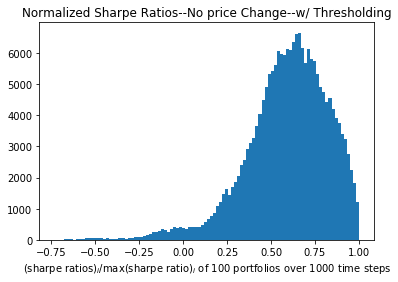

In [10]:
normSharpes=np.asarray([])
n = 0
for i, v in traderIDs.items():
    normSharpes = np.append(normSharpes,v.sharpeReal/max(v.sharpeReal))
    n += 1
plt.hist(normSharpes, bins =100)
plt.title("Normalized Sharpe Ratios--No price Change--w/ Thresholding")
plt.xlabel("(sharpe ratios)$_i$/max(sharpe ratio)$_i$ of 100 portfolios over 1000 time steps")
plt.savefig("no_priceChange_thresholding_100_normalized_sharperatios.png")

In [11]:
import pickle

with open('./'+ 'traderIDs_100_test_nopricechange' + '.pkl', 'wb') as f:
    pickle.dump(traderIDs, f, pickle.HIGHEST_PROTOCOL)

In [13]:
# f = open("dict.txt","w")
# f.write( str(dict) )
# f.close()

conf = open('./'+ 'config_100_test_nopricechange' + '.txt',"w")
conf.write(str(config.config))
conf.close()

In [15]:
TstockChars = utils.characterize(TstockPool,tmax=3000)

In [16]:
# # save totalORders totalTransaction stockPool hurstPool characterize
# TstockChars.to_csv('TstockCharacteristics_100p_100s.csv')
# TtotalOrders.to_csv('TtotalOrders_100p_100s.csv')
# Ttransactions.to_csv('Ttransactions_100p_100s.csv')
# np.savetxt('TstockPool_100p_100s.txt', TstockPool)
# np.savetxt('ThurstPool_100p_100s.txt', ThurstPool)

In [ ]:
totalOrders.sort_values(by=['time','portfolio'], inplace=True)
totalOrders.reset_index(inplace=True,drop=True)
totalOrders.hist(column='time',histtype='step',bins=7000)
plt.title("Number of submitted orders without threshold")
plt.xlabel("time")
plt.ylabel("count")
#plt.show()
#plt.savefig("hurst001_unthresholded_totalorders")

In [ ]:
TtotalOrders.sort_values(by=['time','portfolio'], inplace=True)
TtotalOrders.reset_index(inplace=True,drop=True)
TtotalOrders.hist(column='time',histtype='step',bins=7000)
plt.title("Number of submitted orders with threshold")
plt.xlabel("time")
plt.ylabel("count")
#plt.show()
#plt.savefig("hurst001_thresholded_totalorders")

In [ ]:
a = 6 # random stock

plt.plot(np.arange(992,8192), oghurstPool[a][992:8192], color = 'blue', label = "original H-index")
plt.plot(np.arange(992,8192), ThurstPool[a][992:8192], color = 'red', label = "changing H-index")
plt.title("Hurst Index")
# plt.show()
# plt.savefig('./hurst001_stock_'+str(a)+'_hurst.png')

In [ ]:
plt.title("Stock Price")
plt.plot(np.arange(992,8192), ogstockPool[a][992:8192], color = 'blue', label = "original H-index")
plt.plot(np.arange(992,8192), TstockPool[a][992:8192], color = 'red', label = "changing H-index")
#plt.show()
# plt.savefig('./husrt001_stock_'+str(a)+'_stock.png')

In [ ]:
# TstockChars.to_csv('TstockCharacteristics_7200_5p_20s.csv')
# TtotalOrders.to_csv('TtotalOrders_7200_5p_20s.csv')
# Ttransactions.to_csv('Ttransactions_7200_5p_20s.csv')
# np.savetxt('TstockPool_7200_5p_20s.txt', TstockPool)
# np.savetxt('ThurstPool_7200_5p_20s.txt', ThurstPool)

traderIDs['bsfah'].weightdata

In [ ]:
qportOrders = TtotalOrders[(TtotalOrders['portfolio']=='bsfah')]
qport = traderIDs['bsfah']
print(qport.stocks)
qportChars = TstockChars[TstockChars['stock'].isin(qport.stocks)]
#qportChars[qportChars['time']==992]#['var'])

# print(qportChars[qportChars['time']>7000])
# plt.plot(np.arange(6000,8193),TstockPool[4][6000:])
# plt.show()
# print(qport.weightdata)
for i in qport.stocks:
    plt.plot(np.arange(992,8192),qportChars[qportChars['stock']==i]['var'], 'o-', label = str(i),markersize = 2, linewidth=1)
plt.legend(loc='center left')
plt.title("Variances of the stocks in an example portfolio")
plt.ylabel("Variance")
plt.yscale('log')
plt.savefig("variances_of_an_exportf.png")
    

In [ ]:
# plot the weights of each stock
#for stock in qport.stocks[:5]:
for stock in qport.stocks:
    plt.plot(qport.weightdata[qport.weightdata['stock']==stock]['time'],
             qport.weightdata[qport.weightdata['stock']==stock]['weight'], 'o-',
             label=str(stock), markersize = 2, linewidth=1)
plt.title("Weights of each stock in an example portfolio")
plt.legend()
plt.ylabel("Weight")
plt.savefig("Weights_of_ex_portf.png")
plt.show()

for stock in [3,4,5,12]:
    plt.plot(qport.weightdata[qport.weightdata['stock']==stock]['time'],
             qport.weightdata[qport.weightdata['stock']==stock]['weight'], 'o-',
             label=str(stock), markersize = 2, linewidth=1)
plt.title("Weights of high volatility stock in an example portfolio")
plt.ylabel("Weight")
plt.legend()
plt.savefig("Weights_special_of_ex_portf.png")
plt.show()

plt.plot(np.asarray(qportOrders[qportOrders['stock']==12].time)[258:280],np.asarray(qportOrders[qportOrders['stock']==12].order)[258:280], 'o-', markersize=2, linewidth=1)
plt.grid('on')
plt.title("Order History of stock number 12 by an example portfolio")
plt.ylabel("Buy/Sell Volume")
plt.savefig("Orders_of_volatilestock_of_ex_portf.png")
plt.show()

plt.plot(np.arange(6160,6200),TstockPool[12][6160:6200])
plt.plot(np.repeat([6171],12),np.arange(0,12), label = "First buy point")
plt.plot(np.repeat([6172],12),np.arange(0,12), label = "First sell point")
plt.legend()
plt.title("Price history of stock number 12")
plt.ylabel("Price")
plt.grid('on')
plt.savefig("Price_of_volatilestock_of_ex_portf.png")
plt.show()

In [ ]:
qportOrders[qportOrders['stock']==12].order.idxmin()
qportOrders[qportOrders['stock']==12].loc[17894]

In [ ]:
vargaps = np.asarray([])
avgreturn = np.asarray([])
avgvar = np.asarray([])
stdgaps = np.asarray([])
avgstd = np.asarray([])
for t in range(992,8192):
    vargaps = np.append(vargaps,max(qportChars[qportChars['time']==t]['var'])-min(qportChars[qportChars['time']==t]['var']))
    avgreturn = np.append(avgreturn, np.mean((qportChars[qportChars['time']==t]['mean'])))
    avgvar = np.append(avgvar, np.mean((qportChars[qportChars['time']==t]['var'])))
    stdgaps = np.append(stdgaps,max(qportChars[qportChars['time']==t]['std'])-min(qportChars[qportChars['time']==t]['std']))
    avgstd = np.append(avgstd, np.mean((qportChars[qportChars['time']==t]['std'])))
                        

In [ ]:
qportOrders.hist(column='time',histtype='step',bins=6000)
plt.title("Number of submitted orders of an example portfolio")
plt.xlabel("Time")
plt.ylabel("Orders")
plt.savefig("hstep_001_7200_thresholded_submittedOrders.png")
plt.show()


plt.plot(np.arange(992,8192),vargaps)
plt.grid(True)
plt.title("Variance gap of returns of an example portfolio")
plt.savefig("hstep_001_7200_thresholded_variancegap.png")
plt.show()

plt.plot(np.arange(992,8192),stdgaps)
plt.grid(True)
plt.title("STD gap of returns of an example portfolio")
plt.savefig("hstep_001_7200_thresholded_stdgap.png")
plt.show()

plt.title("Average expected percent returns of an example portfolio")
plt.grid(True)
plt.plot(np.arange(992,8192),avgreturn)
plt.savefig("hstep_001_7200_thresholded_averagereturns.png")
plt.show()


for i in qport.stocks:
    plt.plot(np.arange(992,8192),TstockPool[i][992:8192])
plt.grid(True)
plt.title("Prices of stocks within the example portfolio")
plt.savefig("hstep_001_7200_thresholded_pricesexportf.png")
plt.show()


for i in qport.stocks:
    plt.plot(np.arange(992,8192),ThurstPool[i][992:8192])
plt.grid(True)
plt.title("Hurst Indices of stocks within the example portfolio")
plt.savefig("hstep_001_7200_thresholded_hurstexportf.png")
plt.show()


plt.title("Variance of expected percent returns of an example portfolio")
plt.grid(True)
plt.plot(np.arange(992,8192),avgvar)
plt.savefig("hstep_001_7200_thresholded_variancereturns.png")
plt.show()

plt.title("STD of expected percent returns of an example portfolio")
plt.grid(True)
plt.plot(np.arange(992,8192),avgstd)
plt.savefig("hstep_001_7200_thresholded_stdreturns.png")

In [ ]:
# for key,portf in traderIDs.items():
#     print(portf.stocks)
from library.utils import sigmoid
k = 100
plt.title("85th Ptile ("+str(qport.threshold)+") with k slope: "+ str(k))
pts = np.linspace(0.1,0.17,2000)
plt.grid(True)
plt.plot(pts,sigmoid(pts,qport.threshold, k = k))
# plt.savefig("85th percentile sigmoid function with slope "+str(k))

In [ ]:
plt.hist(qport.sharpe, bins=30)
plt.grid(True)
plt.title("Distribution of all sharpe ratios in example portfolio before thresholding")
# plt.savefig("h001_sharpedistthresholded")

In [ ]:
# for name,portf in traderIDs.items():
#     p90 = (np.percentile(portf.sharpe,50))
#     p100 = (max(portf.sharpe))
#     x0 = (p100+p90)/2
#     probs = []
#     print(x0)
#     for i in portf.sharpe:
#         p = (sigmoid(i,x0, k =1))
#         probs.append(p)
#     #print(probs)
#     plt.plot(portf.sharpe,probs, 'o')
#     plt.grid('on')
#     plt.show()
# # june 18, create a reset function in the portfolios to incorporate sharpe ratio threshold
# # reset the sharpe ratio counter for the portfolios and update the order function

# Overlap portfolio
might be better to just choose randomly so theres no disconnect in the selection..

In [ ]:
# import string 
# import random 
# def randString(length = 5):
#     letters = string.ascii_lowercase
#     return ''.join(random.sample(letters,length))

# tstocks = {}
# stocks = np.arange(50)
# window = 5
# indx = 0
# portfs=0
# print(stocks)
# while portfs <= 100:
#     startpos = indx % len(stocks)
#     window = np.random.randint(12,18)
#     name = randString()
#     print(name)
#     while name in traderIDs:
#         name = randString()
# #     print(startpos)
# #     print(stocks)
# #     print(startpos, ":", startpos+window)
#     if startpos+window >= len(stocks):
#         print('overflow ', startpos+window)
#         stocks2 = np.concatenate([stocks,stocks])
#         tstocks[name] = np.copy(stocks2[startpos:startpos+window])
#         np.random.shuffle(stocks)
#         print("shuffled")
#     else:
#         tstocks[name] = np.copy(stocks[startpos:startpos+window])
#     indx += window - np.random.randint(10,15)
#     portfs += 1
    
# #     if indx >= len(stocks):
# #         print(portfs)


In [ ]:
#tstocks

In [ ]:
#(cosineSim(tstocks['iugey'],tstocks['fweup']))

In [ ]:
# pesbocosines = np.asarray([])
# #pesbo = tstocks['iugey']
# #portf2s = np.asarray([])
# for j, pesbo in tstocks.items():
#     for i, portf in tstocks.items():
#         if i!=j:
#             cc = cosineSim(pesbo,portf)
#             portf2s = np.append(portf2s,i)
#             pesbocosines = np.append(pesbocosines,cc)

In [ ]:
# (pesbocosines)

In [ ]:
# win10_15 = np.mean(pesbocosines)

In [ ]:
# portf2s[44]

In [ ]:
# def cosineSim(portf1, portf2): #change from .stocks array to actual object for both stocks and weights
#     overlapWeights = 0
#     for i in portf1:
#         if i in portf2: # find the weights in portf1 and portf2
#             overlapWeights += 1 # actual weight calculation
    
#     portf1weights = np.ones(len(portf1))
#     portf2weights = np.ones(len(portf2))
#     portf1Norm = np.linalg.norm(portf1weights)
#     portf2Norm = np.linalg.norm(portf2weights)
    
#     return overlapWeights/(portf1Norm*portf2Norm)
    
    